# Import 

In [1]:
import h5py
from seisbench.models import CRED,EQTransformer,PhaseNet,GPD,OBSTransformer
import numpy as np
from seisbench.data import WaveformDataset
import torch
from torch.utils.data import DataLoader
import torch.nn.functional as F
import matplotlib.pyplot as plt
from obspy import Stream, Trace
from tqdm import  tqdm 
import matplotlib.transforms as mtransforms
import nest_asyncio
nest_asyncio.apply()
import datetime

from sklearn.metrics import recall_score, balanced_accuracy_score

def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn


global clockt1

def tic():
    global clockt0
    clockt0 = datetime.datetime.now()

def toc():
    global clockt1
    clockt1 = datetime.datetime.now()

def tac():
    global clockt1
    global clockt0
    d = clockt1 - clockt0
    return d.total_seconds()
    
def try_treshold(prob,labels):
    VecR = []
    VecA = []
    px= np.arange(0,1,0.01)
    for p in  px : 
        #Score = np.sum([ip>p for ip in prob])/len(prob)*100
        VecR.append(recall_score(labels,[ip>p for ip in prob]))
        VecA.append(balanced_accuracy_score(labels,[ip>p for ip in prob]))
    return np.array(VecR),px,np.array(VecA)

def try_SNR(prob,SNR,labels):
    VecR = []
    VecA = []
    Nv= []
    px= list(np.arange(0,8,1))
    SNR = np.array(SNR)
    SNR[SNR>px[-1]] = px[-2]
    classe = np.array([ip>0.50 for ip in prob])
    for k in range(len(px)-1) : 
        iisnr=np.where( (SNR>=px[k]) & (SNR<px[k+1]))
        #Score = np.sum( [ip>0.50 for ip in prob[iisnr]] )/(len(prob[iisnr]) + 1e-11)*100 *(np.nan,1)[len(prob[ii])>0]
        Nv  = Nv+[len(iisnr[0])]
        if Nv[-1]>0:
            VecR.append(recall_score(labels[iisnr],classe[iisnr]))
            VecA.append(balanced_accuracy_score(labels[iisnr],classe[iisnr]))
        else:
            VecR.append(0)
            VecA.append(0)
    return np.array(VecR),np.array(px), Nv,np.array(VecA)

def try_HZ(prob,HZ,labels):
    VecR = []
    VecA = []
    Nv= []
    px= list(np.arange(300,1500,100))
    HZ = np.array(HZ)
    HZ[HZ>px[-1]] = px[-2]
    classe = np.array([ip>0.50 for ip in prob])
    for k in range(len(px)-1) : 
        iisnr=np.where( (HZ>=px[k]) & (HZ<px[k+1]))
        #Score = np.sum( [ip>0.50 for ip in prob[iisnr]] )/(len(prob[iisnr]) + 1e-11)*100 *(np.nan,1)[len(prob[ii])>0]
        Nv  = Nv+[len(iisnr[0])]
        if Nv[-1]>0:
            VecR.append(recall_score(labels[iisnr],classe[iisnr]))
            VecA.append(balanced_accuracy_score(labels[iisnr],classe[iisnr]))
        else:
            VecR.append(0)
            VecA.append(0)
    return np.array(VecR),np.array(px), Nv,np.array(VecA)


plt.rcParams.update({
    'font.size': 22,
    'axes.titlesize': 24,
    'figure.titlesize': 26  # Taille du titre de la figure
})

"""
axes.titlesize : 24
axes.labelsize : 20
lines.linewidth : 3
lines.markersize : 10
xtick.labelsize : 16
ytick.labelsize : 16
"""
def plotprobs(prob,labels):
    bins=np.arange(0,1.1,0.1)
    selection = np.where(labels==0)
    recp , px , accp = try_treshold(1-prob[selection],[1]*len(selection[0]))
    figdist = plt.figure(figsize=(25,6))
    plt.subplot(1,3,1)
    plt.hist(1-prob[selection],bins=bins,cumulative=False,density=False,color='k')
    plt.ylabel('Number')
    plt.xlabel('Noise Probability')
    plt.twinx()
    plt.plot(px,accp,color='r',ls='-',lw=4)
    plt.ylabel('Recall/Accuracy')
    plt.title('Noise class Probablity')
    plt.subplot(1,3,2)
    selection = np.where(labels==1)
    recp , px , accp = try_treshold(prob[selection],[1]*len(selection[0]))
    plt.hist(prob[selection],bins=bins,cumulative=False,density=False,color='k')
    plt.ylabel('Number')
    plt.xlabel('Signal Probability')
    plt.twinx()
    plt.plot(px,accp,color='r',ls='-',lw=4)
    plt.ylabel('Recall/Accuracy')
    plt.title('Signal class Probablity')

    plt.subplot(1,3,3)
    recp , px , accp = try_treshold(prob,labels)
    plt.hist([prob[i] if labels[i]==1 else 1-prob[i] for i in range(len(prob))],bins=bins,cumulative=False,density=False,color='k')
    plt.ylabel('Number')
    plt.xlabel('Class Probability')
    ax =plt.twinx()
    plt.plot(px,accp,color='#712F79',ls='-',label='Accuracy',lw=4)
    plt.plot(px,recp,color='#48639C',ls='-',label='Recall',lw=4)
    f1sc=2*accp*recp/(recp+accp+1e-11)
    plt.plot(px, f1sc, color='#F7999E',ls='-',label='F1-scor',lw=4)
    plt.ylabel('Recall/Accuracy')
    plt.legend(loc='lower right')
    plt.title('Combined class Probablity')
    ima = np.argmax(f1sc)
    plt.axvline(x=px[ima],ls=':',color='red')
    trans_offset = mtransforms.offset_copy(ax.transData, fig=figdist,
                                       x=0.05, y=0.10, units='inches')
    plt.text(px[ima], (np.nanmax(f1sc)+np.nanmin(f1sc))/2, f' {f1sc[ima]:.2f} at {px[ima]:.2f} ', dict(size=18),
             transform=trans_offset,
             horizontalalignment='center',
             verticalalignment='bottom',
             color ='red')
    plt.tight_layout()
    plt.show()

    snrrec, snrx , Nv,snracc = try_SNR(prob,np.array(SNR),labels)
    figsnr=plt.figure(figsize=(9,5))
    n=1*3
    offset=(1/n)
    plt.bar(snrx[:-1]/2+snrx[1:]/2 - 2/3 * offset,snrrec,width=1/(2*n),label='Recall',color='#48639C')
    plt.bar(snrx[:-1]/2+snrx[1:]/2 ,snracc,width=1/(2*n),label='Accuracy',color='#712F79')
    plt.bar(snrx[:-1]/2+snrx[1:]/2 + 2/3* offset,2*snracc*snrrec/(snrrec+snracc+1e-11),width=1/(2*n),label='F1-score',color='#F7999E')
    plt.xlabel('SNR')
    plt.ylabel('Score')
    plt.legend(loc='lower right')
    plt.twinx()
    plt.plot(snrx[:-1]/2+snrx[1:]/2,Nv,color='k',ls = ':',lw=4)
    plt.ylabel('Number')
    plt.title('Score at 50% treshold against SNR ')
    plt.show()

    return figdist,figsnr, [f1sc[ima],px[ima],recp[ima],accp[ima]]
    
def convert_1d_to_3d(waveform_1d):
    # Repeat the 1D waveform for all 3 components
    return torch.stack([waveform_1d, waveform_1d, waveform_1d], dim=0)

def pad_to_multiple(x, multiple=256):
    length = x.shape[-1]
    pad_len = (multiple - length % multiple) % multiple
    if pad_len > 0:
        x = F.pad(x, (0, pad_len))
    return x
    
sampling_rate = 100#10e6
class CustomWaveformDataset_Seisbench(torch.utils.data.Dataset):
    def __init__(self, paths, labeldatas, times,waveforms):
        self.paths = paths
        self.labels = labels
        self.times = times
        self.waveforms = waveforms
        
    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        waveform_stacked = self.waveforms[idx]
        waveforms_np = pad_to_multiple(torch.tensor(waveform_stacked), multiple=256).numpy()
        st = Stream()

        # Create a Trace for each component
        for i, component in enumerate(waveforms_np):
            trace = Trace(data=component)
            trace.stats.channel = f"Component_{i+1}"  # Name the channels
            trace.stats.sampling_rate = sampling_rate
    
            st.append(trace)
        
        waveform_3d = st
        label = torch.tensor(self.labels[idx], dtype=torch.long)
        return waveform_3d, label

class CustomWaveformDataset_IsAE(torch.utils.data.Dataset):
    def __init__(self, paths, labeldatas, times,waveform,Spectrograms):
        self.paths = paths
        self.labels = labels
        self.times = times
        self.waveforms = waveforms
        self.Spectrograms =  Spectrograms
        
    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        
        return  torch.tensor(self.Spectrograms[idx]), _

def  MakeSNR(waveforms):
    #SNR = [np.nanmax(np.abs(waveform[1]))/(np.max(np.abs(waveform[1][:len(waveform[1])//6]))+1e-11) for waveform in waveforms ]
    rms = lambda y : np.sqrt(np.mean(y**2))
    SNR = [rms(waveform[0])/(rms(waveform[1][:len(waveform[0])//6])+1e-11) for waveform in waveforms ]
   
    #SNR = [ signaltonoise(waveform[0]) for waveform in waveforms ]
    return SNR


In [2]:


def max_frequency(waveform, sample_rate):
    """
    Calculate the maximum frequency in a waveform after de-trending.

    Parameters:
    - waveform: 1D array of the time-domain signal.
    - sample_rate: Sampling rate of the waveform in Hz.

    Returns:
    - Maximum frequency in kHz.
    """
    # De-trend the waveform (remove linear trend)
    x = np.arange(len(waveform))
    coeffs = np.polyfit(x, waveform, 1)
    trend = np.polyval(coeffs, x)
    detrended_waveform = waveform - trend

    # Compute FFT
    n = len(detrended_waveform)
    fft_result = np.abs(np.fft.fft(detrended_waveform))
    freqs = np.fft.fftfreq(n, d=1/sample_rate)

    # Only consider positive frequencies
    positive_freqs = freqs[:n//2]
    positive_magnitudes = fft_result[:n//2]

    max_freq_idx = np.argmax(positive_magnitudes)
    max_freq = positive_freqs[max_freq_idx]

    return max_freq / 1000  # Convert to kHz


# Testing on SeisBench Available Models and IsAE on Our Dataset

In [3]:
## Iniatialize Best rate dic
BestP1 = {}
BestT1 = {}
BestR1 = {}
BestA1 = {}

## load data

In [4]:
file = 'dataset_all'
with h5py.File(f'{file}.h5', 'r') as f:
    # Load waveforms and labels

    labels = f['labels'][:]
    waveforms = f['waveforms'][:]
    # Load metadata
    paths = f.attrs['paths']
    times = f.attrs['times']
    Spectrogram  = f['spectrograms'][:]
    
    SNR = MakeSNR(waveforms)

MaxFrqsOD = np.array([max_frequency(w[0],10*1e6) for w in waveforms])
LabelOD = labels

print(f"Dataset loaded from '{file}.h5'.")
print('Number of elements : ',len(paths))

# Initialize the dataset For Natural Trained Earthquakes
datasetOD = CustomWaveformDataset_Seisbench(paths, labels, times, waveforms)
dataset_IsAEOD = CustomWaveformDataset_IsAE(paths, labels, times, waveforms,Spectrogram)

Dataset loaded from 'dataset_all.h5'.
Number of elements :  2193


In [5]:
print(datasetOD[0][0])  # Should be (3, num_samples) for 3-component data
print(datasetOD[0])

3 Trace(s) in Stream:
...Component_1 | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:01:21.910000Z | 100.0 Hz, 8192 samples
...Component_2 | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:01:21.910000Z | 100.0 Hz, 8192 samples
...Component_3 | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:01:21.910000Z | 100.0 Hz, 8192 samples
(<obspy.core.stream.Stream object at 0x7fba6c960110>, tensor(1))


## Cred

In [6]:
# Load the pre-trained model
print(CRED.list_pretrained())
model = CRED.from_pretrained("original")
model.to('cpu:0')


['ethz', 'geofon', 'instance', 'lendb', 'original', 'scedc', 'stead']


CRED(
  (conv1): Conv2d(3, 8, kernel_size=(9, 9), stride=(2, 2), padding=(4, 4))
  (cnn_block1): BlockCNN(
    (convs): ModuleList(
      (0-1): 2 x Conv2d(8, 8, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    )
    (norms): ModuleList(
      (0-1): 2 x BatchNorm2d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (conv2): Conv2d(8, 16, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (cnn_block2): BlockCNN(
    (convs): ModuleList(
      (0-1): 2 x Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (norms): ModuleList(
      (0-1): 2 x BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (lstm_block): BlockBiLSTM(
    (dropout): Dropout(p=0.3, inplace=False)
    (lstms): ModuleList(
      (0): LSTM(176, 64, batch_first=True, bidirectional=True)
      (1): LSTM(128, 64, batch_first=True, bidirectional=True)
    )
  )
  (lstm): LSTM(128, 64, batch_first=True)
  (dropout): Dropout(p=0.

In [7]:

pred_list = []
for i in tqdm(range(len(datasetOD))):
    preds = model.annotate(datasetOD[i][0])
    pred_list.append(max(preds[0].data) )
    
pred_list_Cred1 = np.array(pred_list)

  0%|                                                                                                                                | 0/2193 [00:00<?, ?it/s]

  0%|                                                                                                                        | 2/2193 [00:00<02:21, 15.44it/s]

  0%|▎                                                                                                                       | 5/2193 [00:00<01:41, 21.54it/s]

  1%|▌                                                                                                                      | 11/2193 [00:00<01:01, 35.61it/s]

  1%|▉                                                                                                                      | 18/2193 [00:00<00:47, 45.64it/s]

  1%|█▍                                                                                                                     | 26/2193 [00:00<00:40, 53.69it/s]

  2%|█▊                                                                                                                     | 34/2193 [00:00<00:36, 59.47it/s]

  2%|██▎                                                                                                                    | 42/2193 [00:00<00:33, 63.62it/s]

  2%|██▋                                                                                                                    | 49/2193 [00:01<00:51, 41.60it/s]

  3%|███▏                                                                                                                   | 58/2193 [00:01<00:42, 50.44it/s]

  3%|███▋                                                                                                                   | 67/2193 [00:01<00:36, 57.96it/s]

  3%|████                                                                                                                   | 76/2193 [00:01<00:33, 63.83it/s]

  4%|████▌                                                                                                                  | 84/2193 [00:01<00:31, 66.18it/s]

  4%|████▉                                                                                                                  | 92/2193 [00:01<00:32, 64.78it/s]

  5%|█████▎                                                                                                                 | 99/2193 [00:01<00:32, 64.33it/s]

  5%|█████▋                                                                                                                | 106/2193 [00:01<00:31, 65.59it/s]

  5%|██████                                                                                                                | 113/2193 [00:01<00:31, 66.54it/s]

  6%|██████▌                                                                                                               | 121/2193 [00:02<00:29, 70.22it/s]

  6%|██████▉                                                                                                               | 129/2193 [00:02<00:29, 70.53it/s]

  6%|███████▍                                                                                                              | 138/2193 [00:02<00:27, 73.44it/s]

  7%|███████▊                                                                                                              | 146/2193 [00:02<00:27, 74.57it/s]

  7%|████████▎                                                                                                             | 154/2193 [00:02<00:27, 73.99it/s]

  7%|████████▋                                                                                                             | 162/2193 [00:02<00:27, 74.77it/s]

  8%|█████████▏                                                                                                            | 170/2193 [00:02<00:26, 75.25it/s]

  8%|█████████▌                                                                                                            | 178/2193 [00:02<00:26, 76.18it/s]

  8%|██████████                                                                                                            | 186/2193 [00:02<00:26, 76.97it/s]

  9%|██████████▍                                                                                                           | 194/2193 [00:03<00:25, 77.77it/s]

  9%|██████████▊                                                                                                           | 202/2193 [00:03<00:25, 76.68it/s]

 10%|███████████▎                                                                                                          | 210/2193 [00:03<00:27, 71.09it/s]

 10%|███████████▋                                                                                                          | 218/2193 [00:03<00:30, 65.06it/s]

 10%|████████████                                                                                                          | 225/2193 [00:03<00:32, 60.89it/s]

 11%|████████████▌                                                                                                         | 233/2193 [00:03<00:30, 64.35it/s]

 11%|█████████████                                                                                                         | 242/2193 [00:03<00:28, 69.09it/s]

 11%|█████████████▍                                                                                                        | 250/2193 [00:03<00:27, 71.17it/s]

 12%|█████████████▉                                                                                                        | 259/2193 [00:04<00:26, 74.29it/s]

 12%|██████████████▎                                                                                                       | 267/2193 [00:04<00:28, 68.65it/s]

 12%|██████████████▋                                                                                                       | 274/2193 [00:04<00:29, 66.10it/s]

 13%|███████████████                                                                                                       | 281/2193 [00:04<00:29, 64.66it/s]

 13%|███████████████▌                                                                                                      | 289/2193 [00:04<00:28, 66.96it/s]

 13%|███████████████▉                                                                                                      | 296/2193 [00:04<00:28, 66.88it/s]

 14%|████████████████▎                                                                                                     | 304/2193 [00:04<00:28, 67.37it/s]

 14%|████████████████▋                                                                                                     | 311/2193 [00:04<00:28, 65.11it/s]

 15%|█████████████████                                                                                                     | 318/2193 [00:04<00:32, 56.92it/s]

 15%|█████████████████▍                                                                                                    | 324/2193 [00:05<00:36, 50.68it/s]

 15%|█████████████████▊                                                                                                    | 331/2193 [00:05<00:34, 54.11it/s]

 15%|██████████████████▏                                                                                                   | 337/2193 [00:05<00:36, 50.73it/s]

 16%|██████████████████▍                                                                                                   | 343/2193 [00:05<00:35, 51.78it/s]

 16%|██████████████████▊                                                                                                   | 350/2193 [00:05<00:33, 54.99it/s]

 16%|███████████████████▎                                                                                                  | 358/2193 [00:05<00:30, 59.60it/s]

 17%|███████████████████▋                                                                                                  | 366/2193 [00:05<00:29, 62.48it/s]

 17%|████████████████████                                                                                                  | 374/2193 [00:05<00:27, 67.10it/s]

 17%|████████████████████▌                                                                                                 | 381/2193 [00:06<00:26, 67.87it/s]

 18%|████████████████████▉                                                                                                 | 389/2193 [00:06<00:25, 70.97it/s]

 18%|█████████████████████▎                                                                                                | 397/2193 [00:06<00:24, 73.43it/s]

 19%|█████████████████████▊                                                                                                | 406/2193 [00:06<00:23, 75.62it/s]

 19%|██████████████████████▎                                                                                               | 414/2193 [00:06<00:26, 67.09it/s]

 19%|██████████████████████▋                                                                                               | 421/2193 [00:06<00:28, 62.92it/s]

 20%|███████████████████████                                                                                               | 428/2193 [00:06<00:27, 64.69it/s]

 20%|███████████████████████▍                                                                                              | 435/2193 [00:06<00:27, 63.98it/s]

 20%|███████████████████████▊                                                                                              | 442/2193 [00:06<00:26, 65.00it/s]

 20%|████████████████████████▏                                                                                             | 449/2193 [00:07<00:26, 65.55it/s]

 21%|████████████████████████▌                                                                                             | 456/2193 [00:07<00:26, 66.00it/s]

 21%|████████████████████████▉                                                                                             | 463/2193 [00:07<00:28, 61.03it/s]

 21%|█████████████████████████▎                                                                                            | 470/2193 [00:07<00:27, 62.64it/s]

 22%|█████████████████████████▋                                                                                            | 477/2193 [00:07<00:26, 63.73it/s]

 22%|██████████████████████████                                                                                            | 484/2193 [00:07<00:27, 62.23it/s]

 22%|██████████████████████████▍                                                                                           | 491/2193 [00:07<00:27, 62.29it/s]

 23%|██████████████████████████▊                                                                                           | 498/2193 [00:07<00:32, 51.83it/s]

 23%|███████████████████████████                                                                                           | 504/2193 [00:08<00:31, 53.34it/s]

 23%|███████████████████████████▍                                                                                          | 510/2193 [00:08<00:40, 41.62it/s]

 24%|███████████████████████████▊                                                                                          | 516/2193 [00:08<00:38, 43.80it/s]

 24%|████████████████████████████▏                                                                                         | 523/2193 [00:08<00:34, 49.01it/s]

 24%|████████████████████████████▌                                                                                         | 530/2193 [00:08<00:30, 53.92it/s]

 24%|████████████████████████████▊                                                                                         | 536/2193 [00:08<00:32, 50.29it/s]

 25%|█████████████████████████████▏                                                                                        | 542/2193 [00:08<00:34, 47.49it/s]

 25%|█████████████████████████████▍                                                                                        | 547/2193 [00:08<00:34, 47.29it/s]

 25%|█████████████████████████████▋                                                                                        | 552/2193 [00:09<00:36, 45.44it/s]

 26%|██████████████████████████████▏                                                                                       | 560/2193 [00:09<00:31, 52.55it/s]

 26%|██████████████████████████████▌                                                                                       | 567/2193 [00:09<00:29, 55.66it/s]

 26%|██████████████████████████████▊                                                                                       | 573/2193 [00:09<00:30, 53.46it/s]

 26%|███████████████████████████████▏                                                                                      | 580/2193 [00:09<00:28, 57.53it/s]

 27%|███████████████████████████████▋                                                                                      | 588/2193 [00:09<00:25, 61.74it/s]

 27%|████████████████████████████████                                                                                      | 596/2193 [00:09<00:24, 66.19it/s]

 27%|████████████████████████████████▍                                                                                     | 603/2193 [00:09<00:27, 58.59it/s]

 28%|████████████████████████████████▊                                                                                     | 610/2193 [00:10<00:26, 58.68it/s]

 28%|█████████████████████████████████▏                                                                                    | 617/2193 [00:10<00:27, 57.07it/s]

 28%|█████████████████████████████████▋                                                                                    | 625/2193 [00:10<00:25, 61.32it/s]

 29%|██████████████████████████████████                                                                                    | 633/2193 [00:10<00:24, 63.80it/s]

 29%|██████████████████████████████████▍                                                                                   | 640/2193 [00:10<00:24, 62.58it/s]

 30%|██████████████████████████████████▊                                                                                   | 647/2193 [00:10<00:23, 64.51it/s]

 30%|███████████████████████████████████▏                                                                                  | 654/2193 [00:10<00:23, 64.82it/s]

 30%|███████████████████████████████████▋                                                                                  | 663/2193 [00:10<00:21, 70.28it/s]

 31%|████████████████████████████████████                                                                                  | 671/2193 [00:10<00:20, 72.61it/s]

 31%|████████████████████████████████████▌                                                                                 | 680/2193 [00:11<00:20, 75.28it/s]

 31%|█████████████████████████████████████                                                                                 | 688/2193 [00:11<00:19, 75.96it/s]

 32%|█████████████████████████████████████▍                                                                                | 696/2193 [00:11<00:19, 76.89it/s]

 32%|█████████████████████████████████████▉                                                                                | 704/2193 [00:11<00:20, 71.86it/s]

 32%|██████████████████████████████████████▎                                                                               | 712/2193 [00:11<00:21, 67.91it/s]

 33%|██████████████████████████████████████▋                                                                               | 719/2193 [00:11<00:21, 67.92it/s]

 33%|███████████████████████████████████████                                                                               | 727/2193 [00:11<00:20, 70.25it/s]

 34%|███████████████████████████████████████▌                                                                              | 735/2193 [00:11<00:21, 66.33it/s]

 34%|███████████████████████████████████████▉                                                                              | 743/2193 [00:11<00:21, 68.31it/s]

 34%|████████████████████████████████████████▎                                                                             | 750/2193 [00:12<00:22, 64.03it/s]

 35%|████████████████████████████████████████▋                                                                             | 757/2193 [00:12<00:24, 57.73it/s]

 35%|█████████████████████████████████████████                                                                             | 763/2193 [00:12<00:25, 56.94it/s]

 35%|█████████████████████████████████████████▍                                                                            | 769/2193 [00:12<00:24, 57.52it/s]

 35%|█████████████████████████████████████████▊                                                                            | 777/2193 [00:12<00:22, 61.74it/s]

 36%|██████████████████████████████████████████▏                                                                           | 785/2193 [00:12<00:21, 65.92it/s]

 36%|██████████████████████████████████████████▋                                                                           | 793/2193 [00:12<00:20, 68.78it/s]

 37%|███████████████████████████████████████████                                                                           | 801/2193 [00:12<00:19, 71.47it/s]

 37%|███████████████████████████████████████████▌                                                                          | 809/2193 [00:12<00:18, 73.63it/s]

 37%|███████████████████████████████████████████▉                                                                          | 817/2193 [00:13<00:20, 68.52it/s]

 38%|████████████████████████████████████████████▎                                                                         | 824/2193 [00:13<00:21, 63.02it/s]

 38%|████████████████████████████████████████████▋                                                                         | 831/2193 [00:13<00:22, 60.87it/s]

 38%|█████████████████████████████████████████████                                                                         | 838/2193 [00:13<00:23, 58.28it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 846/2193 [00:13<00:21, 61.93it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 854/2193 [00:13<00:20, 66.02it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 862/2193 [00:13<00:19, 69.24it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 870/2193 [00:13<00:18, 71.57it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 878/2193 [00:14<00:17, 73.28it/s]

 40%|███████████████████████████████████████████████▋                                                                      | 886/2193 [00:14<00:18, 71.97it/s]

 41%|████████████████████████████████████████████████                                                                      | 894/2193 [00:14<00:17, 72.37it/s]

 41%|████████████████████████████████████████████████▌                                                                     | 902/2193 [00:14<00:17, 72.24it/s]

 41%|████████████████████████████████████████████████▉                                                                     | 910/2193 [00:14<00:18, 68.76it/s]

 42%|█████████████████████████████████████████████████▍                                                                    | 918/2193 [00:14<00:18, 69.58it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 925/2193 [00:14<00:20, 62.81it/s]

 43%|██████████████████████████████████████████████████▏                                                                   | 933/2193 [00:14<00:19, 64.14it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 940/2193 [00:14<00:19, 64.97it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 947/2193 [00:15<00:19, 64.15it/s]

 44%|███████████████████████████████████████████████████▎                                                                  | 954/2193 [00:15<00:23, 53.29it/s]

 44%|███████████████████████████████████████████████████▋                                                                  | 960/2193 [00:15<00:23, 52.33it/s]

 44%|███████████████████████████████████████████████████▉                                                                  | 966/2193 [00:15<00:23, 52.21it/s]

 44%|████████████████████████████████████████████████████▎                                                                 | 972/2193 [00:15<00:24, 50.15it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 978/2193 [00:15<00:25, 46.98it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 984/2193 [00:15<00:24, 48.47it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 990/2193 [00:15<00:23, 50.44it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 996/2193 [00:16<00:25, 47.64it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 1002/2193 [00:16<00:24, 48.39it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 1008/2193 [00:16<00:25, 46.52it/s]

 46%|██████████████████████████████████████████████████████                                                               | 1014/2193 [00:16<00:24, 48.54it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 1019/2193 [00:16<00:27, 42.35it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 1024/2193 [00:16<00:27, 42.72it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1031/2193 [00:16<00:24, 47.78it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1038/2193 [00:17<00:22, 51.72it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 1044/2193 [00:17<00:21, 53.13it/s]

 48%|████████████████████████████████████████████████████████                                                             | 1050/2193 [00:17<00:20, 54.56it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1056/2193 [00:17<00:20, 55.56it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 1062/2193 [00:17<00:20, 55.22it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1068/2193 [00:17<00:24, 45.66it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1073/2193 [00:17<00:28, 39.21it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1078/2193 [00:17<00:27, 40.85it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1083/2193 [00:18<00:26, 41.54it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 1088/2193 [00:18<00:26, 41.11it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1093/2193 [00:18<00:25, 42.64it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 1098/2193 [00:18<00:36, 29.92it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 1102/2193 [00:18<00:34, 31.35it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 1106/2193 [00:18<00:39, 27.43it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1110/2193 [00:18<00:40, 26.96it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1113/2193 [00:19<00:41, 25.75it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 1117/2193 [00:19<00:38, 27.82it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1120/2193 [00:19<00:40, 26.75it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 1123/2193 [00:19<00:42, 25.10it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1126/2193 [00:19<00:45, 23.22it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 1129/2193 [00:19<00:42, 24.77it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 1132/2193 [00:19<00:44, 24.01it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1135/2193 [00:20<00:47, 22.13it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1139/2193 [00:20<00:40, 26.07it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 1143/2193 [00:20<00:37, 28.08it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1146/2193 [00:20<00:41, 25.53it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 1149/2193 [00:20<00:40, 25.63it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1154/2193 [00:20<00:33, 31.47it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 1158/2193 [00:20<00:37, 27.85it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1161/2193 [00:20<00:41, 25.04it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1164/2193 [00:21<00:41, 24.55it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1167/2193 [00:21<00:41, 24.62it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1171/2193 [00:21<00:41, 24.56it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1175/2193 [00:21<00:40, 24.96it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 1179/2193 [00:21<00:37, 27.35it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1182/2193 [00:21<00:38, 26.48it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 1185/2193 [00:21<00:39, 25.80it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1188/2193 [00:22<00:38, 26.15it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1192/2193 [00:22<00:34, 29.22it/s]

 54%|███████████████████████████████████████████████████████████████▊                                                     | 1195/2193 [00:22<00:35, 27.76it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 1198/2193 [00:22<00:42, 23.59it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 1201/2193 [00:22<00:40, 24.26it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 1206/2193 [00:22<00:32, 30.04it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1210/2193 [00:22<00:40, 24.20it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 1215/2193 [00:23<00:34, 28.31it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 1219/2193 [00:23<00:31, 30.44it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1225/2193 [00:23<00:26, 36.90it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1230/2193 [00:23<00:24, 39.50it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1235/2193 [00:23<00:23, 41.63it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1240/2193 [00:23<00:21, 43.70it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1245/2193 [00:23<00:24, 38.15it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1250/2193 [00:24<00:33, 27.78it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1254/2193 [00:24<00:32, 28.57it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 1258/2193 [00:24<00:32, 28.55it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 1262/2193 [00:24<00:30, 30.96it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1267/2193 [00:24<00:26, 34.43it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1272/2193 [00:24<00:25, 36.65it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1276/2193 [00:24<00:24, 37.28it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1280/2193 [00:24<00:26, 34.64it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1286/2193 [00:24<00:22, 39.76it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1291/2193 [00:25<00:22, 40.74it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1296/2193 [00:25<00:23, 38.42it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1300/2193 [00:25<00:23, 37.72it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 1304/2193 [00:25<00:28, 31.16it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1308/2193 [00:25<00:27, 31.95it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1312/2193 [00:25<00:27, 32.04it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1316/2193 [00:25<00:26, 33.15it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 1320/2193 [00:25<00:25, 33.61it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1324/2193 [00:26<00:26, 32.34it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 1328/2193 [00:26<00:29, 29.32it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1332/2193 [00:26<00:27, 30.91it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 1336/2193 [00:26<00:30, 28.25it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1339/2193 [00:26<00:30, 27.70it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1342/2193 [00:26<00:31, 26.60it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1346/2193 [00:26<00:29, 28.26it/s]

 62%|███████████████████████████████████████████████████████████████████████▉                                             | 1349/2193 [00:27<00:30, 27.42it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1352/2193 [00:27<00:33, 25.40it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1355/2193 [00:27<00:32, 25.56it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1358/2193 [00:27<00:32, 25.78it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1362/2193 [00:27<00:31, 26.40it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 1365/2193 [00:27<00:31, 26.46it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1368/2193 [00:27<00:31, 26.10it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1371/2193 [00:27<00:30, 26.87it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1374/2193 [00:28<00:36, 22.45it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1377/2193 [00:28<00:35, 23.00it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1380/2193 [00:28<00:35, 23.04it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1383/2193 [00:28<00:35, 23.05it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1387/2193 [00:28<00:30, 26.59it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 1390/2193 [00:28<00:32, 25.04it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 1393/2193 [00:28<00:30, 26.23it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1396/2193 [00:28<00:33, 23.58it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1400/2193 [00:29<00:28, 27.52it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1403/2193 [00:29<00:32, 24.30it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1407/2193 [00:29<00:28, 27.26it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1410/2193 [00:29<00:36, 21.39it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 1414/2193 [00:29<00:32, 24.13it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1418/2193 [00:29<00:28, 27.54it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1423/2193 [00:29<00:23, 32.39it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1427/2193 [00:30<00:23, 32.37it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1431/2193 [00:30<00:22, 34.20it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1435/2193 [00:30<00:29, 25.85it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 1439/2193 [00:30<00:32, 23.37it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1443/2193 [00:30<00:29, 25.78it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1447/2193 [00:30<00:26, 28.14it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 1451/2193 [00:30<00:24, 29.84it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1455/2193 [00:31<00:25, 28.51it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 1459/2193 [00:31<00:27, 26.56it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1462/2193 [00:31<00:29, 24.63it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 1466/2193 [00:31<00:27, 26.30it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1469/2193 [00:31<00:29, 24.88it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 1472/2193 [00:31<00:28, 25.59it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1475/2193 [00:31<00:27, 26.38it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1479/2193 [00:32<00:25, 27.79it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1483/2193 [00:32<00:24, 29.34it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 1487/2193 [00:32<00:23, 30.03it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1491/2193 [00:32<00:26, 26.49it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1494/2193 [00:32<00:27, 24.97it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1497/2193 [00:32<00:27, 25.69it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 1500/2193 [00:32<00:28, 24.15it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 1503/2193 [00:33<00:29, 23.27it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1506/2193 [00:33<00:28, 24.49it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1509/2193 [00:33<00:28, 24.06it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1513/2193 [00:33<00:24, 27.37it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 1517/2193 [00:33<00:23, 29.27it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 1520/2193 [00:33<00:25, 26.43it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1523/2193 [00:33<00:24, 26.99it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 1527/2193 [00:33<00:23, 27.82it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1530/2193 [00:33<00:24, 27.62it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1533/2193 [00:34<00:24, 27.10it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 1536/2193 [00:34<00:23, 27.72it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1539/2193 [00:34<00:26, 25.01it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1543/2193 [00:34<00:24, 26.16it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 1546/2193 [00:34<00:26, 24.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1549/2193 [00:34<00:26, 24.17it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1552/2193 [00:34<00:26, 24.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 1555/2193 [00:35<00:27, 23.29it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1558/2193 [00:35<00:26, 24.22it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1561/2193 [00:35<00:30, 21.02it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1564/2193 [00:35<00:28, 22.05it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1567/2193 [00:35<00:28, 22.09it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1571/2193 [00:35<00:24, 24.92it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1575/2193 [00:35<00:23, 25.99it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 1578/2193 [00:35<00:24, 24.85it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1582/2193 [00:36<00:23, 26.04it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1585/2193 [00:36<00:24, 25.05it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 1589/2193 [00:36<00:22, 27.32it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1592/2193 [00:36<00:22, 27.32it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1595/2193 [00:36<00:22, 26.54it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1599/2193 [00:36<00:21, 27.09it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 1602/2193 [00:36<00:23, 25.03it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1605/2193 [00:37<00:25, 23.07it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1609/2193 [00:37<00:22, 25.90it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1613/2193 [00:37<00:21, 27.42it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1616/2193 [00:37<00:21, 26.27it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1619/2193 [00:37<00:22, 25.33it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 1622/2193 [00:37<00:22, 25.84it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1625/2193 [00:37<00:25, 22.23it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 1628/2193 [00:37<00:24, 23.15it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1631/2193 [00:38<00:23, 23.43it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1635/2193 [00:38<00:22, 25.24it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1638/2193 [00:38<00:21, 25.33it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 1641/2193 [00:38<00:21, 25.42it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1644/2193 [00:38<00:20, 26.38it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 1648/2193 [00:38<00:19, 28.64it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1651/2193 [00:38<00:23, 23.34it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1654/2193 [00:38<00:22, 23.80it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1657/2193 [00:39<00:21, 25.17it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1660/2193 [00:39<00:21, 24.59it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 1663/2193 [00:39<00:24, 22.04it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1667/2193 [00:39<00:21, 24.93it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1672/2193 [00:39<00:18, 28.85it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1675/2193 [00:39<00:21, 24.50it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 1678/2193 [00:39<00:22, 23.24it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1682/2193 [00:40<00:21, 23.39it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1685/2193 [00:40<00:23, 22.05it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1688/2193 [00:40<00:21, 23.23it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 1691/2193 [00:40<00:21, 23.30it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1694/2193 [00:40<00:21, 22.96it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1697/2193 [00:40<00:20, 24.33it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 1700/2193 [00:40<00:21, 23.44it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1703/2193 [00:41<00:20, 23.67it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1706/2193 [00:41<00:22, 22.12it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1709/2193 [00:41<00:22, 21.20it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1712/2193 [00:41<00:21, 22.46it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1715/2193 [00:41<00:24, 19.84it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1719/2193 [00:41<00:20, 23.31it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1722/2193 [00:41<00:22, 21.17it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1725/2193 [00:42<00:21, 22.03it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1728/2193 [00:42<00:22, 20.88it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1731/2193 [00:42<00:21, 21.01it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1734/2193 [00:42<00:22, 20.04it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1739/2193 [00:42<00:23, 19.31it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1742/2193 [00:42<00:22, 19.95it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1746/2193 [00:43<00:19, 23.34it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1749/2193 [00:43<00:19, 23.02it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1752/2193 [00:43<00:20, 21.75it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1755/2193 [00:43<00:19, 22.95it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1758/2193 [00:43<00:20, 21.74it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1761/2193 [00:43<00:24, 17.74it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1765/2193 [00:44<00:21, 19.69it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1768/2193 [00:44<00:19, 21.44it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1771/2193 [00:44<00:19, 21.95it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1774/2193 [00:44<00:18, 22.90it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1777/2193 [00:44<00:19, 21.56it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1781/2193 [00:44<00:17, 23.71it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1784/2193 [00:44<00:19, 21.39it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1787/2193 [00:44<00:18, 22.44it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1790/2193 [00:45<00:19, 20.97it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1793/2193 [00:45<00:19, 20.15it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1796/2193 [00:45<00:18, 21.42it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1799/2193 [00:45<00:22, 17.80it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1802/2193 [00:45<00:19, 19.64it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1805/2193 [00:46<00:23, 16.31it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1808/2193 [00:46<00:20, 18.72it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1811/2193 [00:46<00:22, 17.00it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1814/2193 [00:46<00:21, 17.62it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1817/2193 [00:46<00:19, 19.21it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 1820/2193 [00:46<00:18, 20.29it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1823/2193 [00:46<00:16, 21.96it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1827/2193 [00:46<00:15, 24.27it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1830/2193 [00:47<00:15, 23.78it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1833/2193 [00:47<00:16, 22.00it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1836/2193 [00:47<00:16, 21.18it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1839/2193 [00:47<00:16, 20.91it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1842/2193 [00:47<00:16, 21.05it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1846/2193 [00:47<00:14, 23.17it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1849/2193 [00:48<00:15, 22.31it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1852/2193 [00:48<00:15, 22.09it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1855/2193 [00:48<00:17, 19.76it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1858/2193 [00:48<00:17, 18.84it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1861/2193 [00:48<00:17, 19.29it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1864/2193 [00:48<00:15, 21.55it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1867/2193 [00:48<00:14, 22.36it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1870/2193 [00:49<00:14, 22.32it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1873/2193 [00:49<00:14, 22.75it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1876/2193 [00:49<00:13, 22.65it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1879/2193 [00:49<00:14, 22.13it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1882/2193 [00:49<00:14, 22.20it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1885/2193 [00:49<00:14, 21.76it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1889/2193 [00:49<00:12, 24.65it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1892/2193 [00:49<00:11, 25.45it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1895/2193 [00:50<00:12, 23.86it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1898/2193 [00:50<00:12, 22.88it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1901/2193 [00:50<00:12, 23.43it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1904/2193 [00:50<00:12, 23.99it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1908/2193 [00:50<00:11, 24.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1911/2193 [00:50<00:11, 23.98it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1914/2193 [00:50<00:11, 24.87it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1917/2193 [00:51<00:12, 21.74it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1920/2193 [00:51<00:11, 23.24it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1923/2193 [00:51<00:11, 23.19it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1926/2193 [00:51<00:12, 22.24it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1929/2193 [00:51<00:11, 23.37it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 1932/2193 [00:51<00:10, 24.62it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1935/2193 [00:51<00:10, 24.11it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1938/2193 [00:51<00:10, 24.00it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1941/2193 [00:52<00:10, 23.33it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1944/2193 [00:52<00:10, 23.85it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1948/2193 [00:52<00:09, 25.59it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1951/2193 [00:52<00:09, 24.47it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1954/2193 [00:52<00:09, 25.80it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1957/2193 [00:52<00:09, 25.36it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1960/2193 [00:52<00:08, 26.35it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1963/2193 [00:52<00:11, 20.72it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1967/2193 [00:53<00:09, 23.77it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1970/2193 [00:53<00:10, 22.19it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1973/2193 [00:53<00:09, 23.03it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1977/2193 [00:53<00:09, 23.85it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1980/2193 [00:53<00:09, 23.47it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1983/2193 [00:53<00:08, 24.06it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1986/2193 [00:53<00:08, 23.11it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1989/2193 [00:54<00:09, 22.51it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1992/2193 [00:54<00:09, 22.07it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1996/2193 [00:54<00:08, 22.73it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1999/2193 [00:54<00:08, 22.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2003/2193 [00:54<00:07, 24.89it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 2006/2193 [00:54<00:07, 25.58it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2009/2193 [00:54<00:07, 25.73it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 2012/2193 [00:54<00:06, 26.20it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 2015/2193 [00:55<00:06, 26.57it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2018/2193 [00:55<00:06, 25.44it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 2021/2193 [00:55<00:06, 25.96it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2024/2193 [00:55<00:06, 24.18it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 2027/2193 [00:55<00:07, 23.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2031/2193 [00:55<00:06, 24.43it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2034/2193 [00:55<00:06, 23.57it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 2037/2193 [00:55<00:06, 25.10it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 2040/2193 [00:56<00:06, 23.64it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2043/2193 [00:56<00:06, 23.56it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 2047/2193 [00:56<00:05, 25.79it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2050/2193 [00:56<00:06, 22.74it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 2053/2193 [00:56<00:05, 23.89it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 2057/2193 [00:56<00:05, 24.85it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 2061/2193 [00:56<00:05, 24.38it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2064/2193 [00:57<00:05, 23.51it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2068/2193 [00:57<00:05, 24.81it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2071/2193 [00:57<00:05, 21.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2076/2193 [00:57<00:04, 26.68it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2079/2193 [00:57<00:04, 26.25it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2083/2193 [00:57<00:03, 28.71it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2086/2193 [00:57<00:04, 24.89it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2089/2193 [00:58<00:04, 25.89it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2092/2193 [00:58<00:03, 26.47it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2095/2193 [00:58<00:03, 25.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2098/2193 [00:58<00:04, 23.50it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2101/2193 [00:58<00:03, 24.11it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2104/2193 [00:58<00:03, 23.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2108/2193 [00:58<00:03, 26.21it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 2111/2193 [00:58<00:03, 25.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2114/2193 [00:59<00:03, 24.01it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2117/2193 [00:59<00:03, 24.19it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2120/2193 [00:59<00:03, 22.95it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2124/2193 [00:59<00:02, 26.97it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 2127/2193 [00:59<00:02, 23.30it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2130/2193 [00:59<00:02, 24.61it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2134/2193 [00:59<00:02, 27.76it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2137/2193 [01:00<00:02, 24.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2141/2193 [01:00<00:01, 26.86it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2144/2193 [01:00<00:01, 25.15it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2147/2193 [01:00<00:01, 25.77it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2151/2193 [01:00<00:01, 26.85it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2154/2193 [01:00<00:01, 25.24it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 2157/2193 [01:00<00:01, 25.34it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2160/2193 [01:00<00:01, 21.66it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2163/2193 [01:01<00:01, 20.74it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2166/2193 [01:01<00:01, 17.01it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 2170/2193 [01:01<00:01, 20.66it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2173/2193 [01:01<00:00, 21.61it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2176/2193 [01:01<00:00, 22.00it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2179/2193 [01:01<00:00, 23.12it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2183/2193 [01:02<00:00, 23.43it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2186/2193 [01:02<00:00, 24.12it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 2190/2193 [01:02<00:00, 25.47it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [01:02<00:00, 23.22it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [01:02<00:00, 35.10it/s]

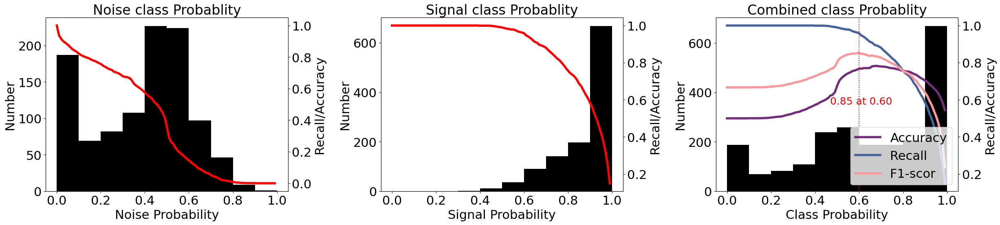

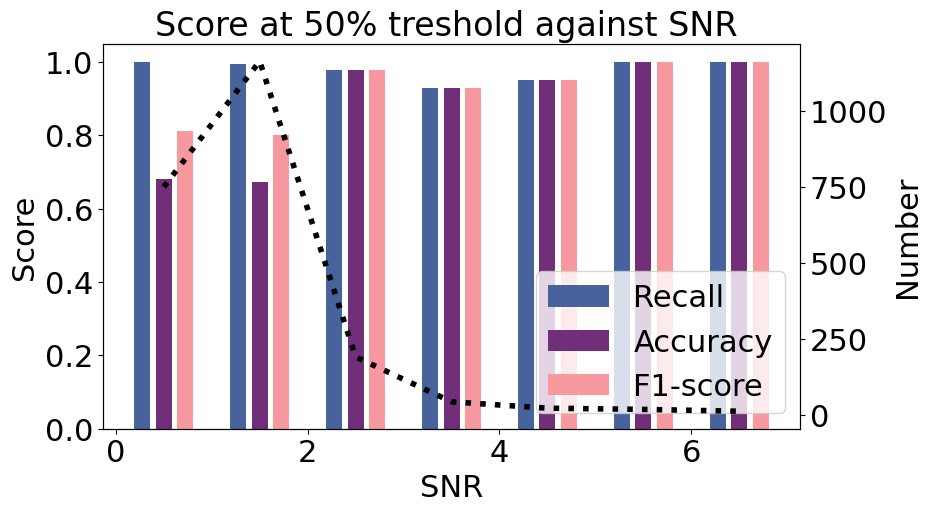

In [8]:
f1,f2, L = plotprobs(pred_list_Cred1,labels)
BestT1['Cred'] = L[1]
BestP1['Cred'] = L[0]
BestA1['Cred'] = L[3]
BestR1['Cred']= L [2]
f1.savefig("Figure/CRED_Prob_OD.png", dpi=100, bbox_inches='tight')
f2.savefig("Figure/CRED_Snr_OD.png", dpi=100, bbox_inches='tight')

## EQTransformer

In [9]:
# Load the pre-trained model
print(EQTransformer.list_pretrained())
model = EQTransformer.from_pretrained("original")
model.to('cpu:0')


['ethz', 'geofon', 'instance', 'iquique', 'lendb', 'neic', 'obs', 'original', 'original_nonconservative', 'scedc', 'stead', 'volpick']


EQTransformer(
  (encoder): Encoder(
    (convs): ModuleList(
      (0): Conv1d(3, 8, kernel_size=(11,), stride=(1,), padding=(5,))
      (1): Conv1d(8, 16, kernel_size=(9,), stride=(1,), padding=(4,))
      (2): Conv1d(16, 16, kernel_size=(7,), stride=(1,), padding=(3,))
      (3): Conv1d(16, 32, kernel_size=(7,), stride=(1,), padding=(3,))
      (4): Conv1d(32, 32, kernel_size=(5,), stride=(1,), padding=(2,))
      (5): Conv1d(32, 64, kernel_size=(5,), stride=(1,), padding=(2,))
      (6): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    )
    (pools): ModuleList(
      (0-6): 7 x MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (res_cnn_stack): ResCNNStack(
    (members): ModuleList(
      (0-3): 4 x ResCNNBlock(
        (dropout): SpatialDropout1d(
          (dropout): Dropout2d(p=0.1, inplace=False)
        )
        (norm1): BatchNorm1d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (conv1): Conv1d(

In [10]:
%autoawait off
pred_list = []
for i in tqdm(range(len(datasetOD))):
    preds = model.annotate(datasetOD[i][0])
    pred_list.append(max(preds[0].data) )

pred_list_EQT1 = np.array(pred_list)

  0%|                                                                                                                                | 0/2193 [00:00<?, ?it/s]

  0%|                                                                                                                        | 2/2193 [00:00<04:06,  8.88it/s]

  0%|▏                                                                                                                       | 3/2193 [00:00<05:03,  7.21it/s]

  0%|▏                                                                                                                       | 4/2193 [00:00<05:13,  6.98it/s]

  0%|▎                                                                                                                       | 5/2193 [00:00<05:05,  7.16it/s]

  0%|▎                                                                                                                       | 6/2193 [00:00<05:35,  6.52it/s]

  0%|▍                                                                                                                       | 7/2193 [00:00<04:59,  7.30it/s]

  0%|▍                                                                                                                       | 8/2193 [00:01<05:12,  7.00it/s]

  0%|▍                                                                                                                       | 9/2193 [00:01<04:50,  7.52it/s]

  1%|▌                                                                                                                      | 11/2193 [00:01<04:06,  8.86it/s]

  1%|▋                                                                                                                      | 12/2193 [00:01<04:21,  8.35it/s]

  1%|▊                                                                                                                      | 14/2193 [00:01<04:00,  9.07it/s]

  1%|▊                                                                                                                      | 15/2193 [00:01<04:34,  7.93it/s]

  1%|▉                                                                                                                      | 17/2193 [00:02<04:15,  8.53it/s]

  1%|▉                                                                                                                      | 18/2193 [00:02<04:13,  8.57it/s]

  1%|█                                                                                                                      | 19/2193 [00:02<04:21,  8.33it/s]

  1%|█                                                                                                                      | 20/2193 [00:02<04:31,  8.01it/s]

  1%|█▏                                                                                                                     | 21/2193 [00:02<04:36,  7.87it/s]

  1%|█▏                                                                                                                     | 23/2193 [00:02<04:20,  8.32it/s]

  1%|█▎                                                                                                                     | 25/2193 [00:03<04:09,  8.70it/s]

  1%|█▍                                                                                                                     | 26/2193 [00:03<04:06,  8.81it/s]

  1%|█▌                                                                                                                     | 28/2193 [00:03<03:43,  9.67it/s]

  1%|█▋                                                                                                                     | 30/2193 [00:03<03:41,  9.76it/s]

  1%|█▋                                                                                                                     | 31/2193 [00:03<04:05,  8.81it/s]

  2%|█▊                                                                                                                     | 33/2193 [00:03<03:52,  9.28it/s]

  2%|█▊                                                                                                                     | 34/2193 [00:04<04:02,  8.89it/s]

  2%|█▉                                                                                                                     | 35/2193 [00:04<04:02,  8.90it/s]

  2%|█▉                                                                                                                     | 36/2193 [00:04<04:00,  8.97it/s]

  2%|██                                                                                                                     | 37/2193 [00:04<03:59,  8.99it/s]

  2%|██                                                                                                                     | 38/2193 [00:04<04:09,  8.64it/s]

  2%|██                                                                                                                     | 39/2193 [00:04<04:41,  7.66it/s]

  2%|██▏                                                                                                                    | 40/2193 [00:04<04:43,  7.60it/s]

  2%|██▎                                                                                                                    | 42/2193 [00:04<04:02,  8.88it/s]

  2%|██▎                                                                                                                    | 43/2193 [00:05<04:11,  8.55it/s]

  2%|██▍                                                                                                                    | 44/2193 [00:05<04:23,  8.17it/s]

  2%|██▍                                                                                                                    | 46/2193 [00:05<04:04,  8.79it/s]

  2%|██▌                                                                                                                    | 47/2193 [00:05<04:33,  7.84it/s]

  2%|██▋                                                                                                                    | 49/2193 [00:05<03:56,  9.08it/s]

  2%|██▊                                                                                                                    | 51/2193 [00:05<03:28, 10.26it/s]

  2%|██▉                                                                                                                    | 53/2193 [00:06<03:41,  9.67it/s]

  3%|██▉                                                                                                                    | 55/2193 [00:06<03:34,  9.97it/s]

  3%|███                                                                                                                    | 57/2193 [00:06<03:44,  9.50it/s]

  3%|███▏                                                                                                                   | 58/2193 [00:06<03:58,  8.97it/s]

  3%|███▎                                                                                                                   | 60/2193 [00:06<03:32, 10.06it/s]

  3%|███▎                                                                                                                   | 62/2193 [00:07<03:23, 10.49it/s]

  3%|███▍                                                                                                                   | 64/2193 [00:07<03:46,  9.41it/s]

  3%|███▌                                                                                                                   | 65/2193 [00:07<03:59,  8.90it/s]

  3%|███▌                                                                                                                   | 66/2193 [00:07<04:04,  8.72it/s]

  3%|███▋                                                                                                                   | 67/2193 [00:07<03:57,  8.95it/s]

  3%|███▋                                                                                                                   | 69/2193 [00:07<03:28, 10.19it/s]

  3%|███▊                                                                                                                   | 71/2193 [00:08<03:28, 10.17it/s]

  3%|███▉                                                                                                                   | 73/2193 [00:08<03:40,  9.60it/s]

  3%|████                                                                                                                   | 74/2193 [00:08<03:43,  9.47it/s]

  3%|████                                                                                                                   | 76/2193 [00:08<03:43,  9.49it/s]

  4%|████▏                                                                                                                  | 77/2193 [00:08<03:48,  9.24it/s]

  4%|████▏                                                                                                                  | 78/2193 [00:08<03:56,  8.93it/s]

  4%|████▎                                                                                                                  | 80/2193 [00:09<03:33,  9.90it/s]

  4%|████▍                                                                                                                  | 81/2193 [00:09<03:53,  9.05it/s]

  4%|████▍                                                                                                                  | 82/2193 [00:09<03:49,  9.19it/s]

  4%|████▌                                                                                                                  | 84/2193 [00:09<03:29, 10.05it/s]

  4%|████▌                                                                                                                  | 85/2193 [00:09<03:45,  9.36it/s]

  4%|████▋                                                                                                                  | 87/2193 [00:09<03:19, 10.57it/s]

  4%|████▊                                                                                                                  | 89/2193 [00:09<03:25, 10.23it/s]

  4%|████▉                                                                                                                  | 91/2193 [00:10<03:49,  9.18it/s]

  4%|████▉                                                                                                                  | 92/2193 [00:10<04:05,  8.57it/s]

  4%|█████                                                                                                                  | 93/2193 [00:10<04:04,  8.60it/s]

  4%|█████                                                                                                                  | 94/2193 [00:10<03:56,  8.88it/s]

  4%|█████▏                                                                                                                 | 95/2193 [00:10<04:03,  8.61it/s]

  4%|█████▏                                                                                                                 | 96/2193 [00:10<04:06,  8.50it/s]

  4%|█████▎                                                                                                                 | 98/2193 [00:10<03:37,  9.64it/s]

  5%|█████▎                                                                                                                 | 99/2193 [00:11<04:00,  8.71it/s]

  5%|█████▍                                                                                                                | 101/2193 [00:11<03:53,  8.96it/s]

  5%|█████▍                                                                                                                | 102/2193 [00:11<03:56,  8.85it/s]

  5%|█████▌                                                                                                                | 104/2193 [00:11<03:53,  8.94it/s]

  5%|█████▋                                                                                                                | 105/2193 [00:11<03:51,  9.04it/s]

  5%|█████▊                                                                                                                | 107/2193 [00:11<03:47,  9.17it/s]

  5%|█████▊                                                                                                                | 108/2193 [00:12<03:48,  9.13it/s]

  5%|█████▉                                                                                                                | 110/2193 [00:12<03:40,  9.44it/s]

  5%|█████▉                                                                                                                | 111/2193 [00:12<03:42,  9.37it/s]

  5%|██████                                                                                                                | 112/2193 [00:12<03:48,  9.10it/s]

  5%|██████                                                                                                                | 113/2193 [00:12<03:46,  9.17it/s]

  5%|██████▏                                                                                                               | 115/2193 [00:12<03:39,  9.45it/s]

  5%|██████▏                                                                                                               | 116/2193 [00:12<03:37,  9.55it/s]

  5%|██████▎                                                                                                               | 117/2193 [00:13<03:37,  9.53it/s]

  5%|██████▎                                                                                                               | 118/2193 [00:13<03:38,  9.50it/s]

  5%|██████▍                                                                                                               | 119/2193 [00:13<03:52,  8.92it/s]

  5%|██████▍                                                                                                               | 120/2193 [00:13<04:05,  8.43it/s]

  6%|██████▌                                                                                                               | 122/2193 [00:13<03:49,  9.02it/s]

  6%|██████▌                                                                                                               | 123/2193 [00:13<03:44,  9.22it/s]

  6%|██████▋                                                                                                               | 124/2193 [00:13<03:56,  8.75it/s]

  6%|██████▋                                                                                                               | 125/2193 [00:13<03:58,  8.67it/s]

  6%|██████▊                                                                                                               | 126/2193 [00:14<04:19,  7.98it/s]

  6%|██████▉                                                                                                               | 128/2193 [00:14<04:09,  8.28it/s]

  6%|██████▉                                                                                                               | 130/2193 [00:14<04:05,  8.41it/s]

  6%|███████                                                                                                               | 131/2193 [00:14<04:03,  8.47it/s]

  6%|███████                                                                                                               | 132/2193 [00:14<04:07,  8.34it/s]

  6%|███████▏                                                                                                              | 133/2193 [00:14<04:23,  7.83it/s]

  6%|███████▎                                                                                                              | 135/2193 [00:15<03:50,  8.91it/s]

  6%|███████▎                                                                                                              | 136/2193 [00:15<03:54,  8.77it/s]

  6%|███████▍                                                                                                              | 138/2193 [00:15<03:26,  9.97it/s]

  6%|███████▍                                                                                                              | 139/2193 [00:15<03:32,  9.66it/s]

  6%|███████▌                                                                                                              | 140/2193 [00:15<03:40,  9.30it/s]

  6%|███████▋                                                                                                              | 142/2193 [00:15<04:06,  8.33it/s]

  7%|███████▋                                                                                                              | 144/2193 [00:16<03:29,  9.76it/s]

  7%|███████▊                                                                                                              | 146/2193 [00:16<03:28,  9.83it/s]

  7%|███████▉                                                                                                              | 148/2193 [00:16<03:38,  9.34it/s]

  7%|████████                                                                                                              | 150/2193 [00:16<03:23, 10.03it/s]

  7%|████████▏                                                                                                             | 152/2193 [00:16<03:30,  9.68it/s]

  7%|████████▏                                                                                                             | 153/2193 [00:17<03:30,  9.67it/s]

  7%|████████▎                                                                                                             | 154/2193 [00:17<04:03,  8.37it/s]

  7%|████████▎                                                                                                             | 155/2193 [00:17<04:07,  8.24it/s]

  7%|████████▍                                                                                                             | 157/2193 [00:17<03:51,  8.80it/s]

  7%|████████▌                                                                                                             | 159/2193 [00:17<03:42,  9.14it/s]

  7%|████████▌                                                                                                             | 160/2193 [00:17<03:53,  8.70it/s]

  7%|████████▋                                                                                                             | 162/2193 [00:18<03:43,  9.08it/s]

  7%|████████▊                                                                                                             | 163/2193 [00:18<03:43,  9.08it/s]

  8%|████████▉                                                                                                             | 165/2193 [00:18<03:51,  8.75it/s]

  8%|████████▉                                                                                                             | 166/2193 [00:18<04:18,  7.84it/s]

  8%|█████████                                                                                                             | 168/2193 [00:18<03:42,  9.09it/s]

  8%|█████████                                                                                                             | 169/2193 [00:18<03:52,  8.72it/s]

  8%|█████████▏                                                                                                            | 170/2193 [00:19<04:16,  7.90it/s]

  8%|█████████▎                                                                                                            | 172/2193 [00:19<04:19,  7.79it/s]

  8%|█████████▎                                                                                                            | 174/2193 [00:19<04:06,  8.19it/s]

  8%|█████████▍                                                                                                            | 175/2193 [00:19<04:40,  7.20it/s]

  8%|█████████▌                                                                                                            | 177/2193 [00:20<04:25,  7.58it/s]

  8%|█████████▌                                                                                                            | 178/2193 [00:20<04:12,  7.98it/s]

  8%|█████████▋                                                                                                            | 179/2193 [00:20<04:12,  7.97it/s]

  8%|█████████▋                                                                                                            | 180/2193 [00:20<04:01,  8.34it/s]

  8%|█████████▊                                                                                                            | 182/2193 [00:20<03:36,  9.30it/s]

  8%|█████████▉                                                                                                            | 184/2193 [00:20<03:39,  9.17it/s]

  8%|█████████▉                                                                                                            | 185/2193 [00:20<03:39,  9.15it/s]

  9%|██████████                                                                                                            | 187/2193 [00:20<03:12, 10.41it/s]

  9%|██████████▏                                                                                                           | 189/2193 [00:21<03:42,  9.03it/s]

  9%|██████████▏                                                                                                           | 190/2193 [00:21<03:54,  8.56it/s]

  9%|██████████▎                                                                                                           | 191/2193 [00:21<03:47,  8.80it/s]

  9%|██████████▎                                                                                                           | 192/2193 [00:21<03:59,  8.36it/s]

  9%|██████████▍                                                                                                           | 194/2193 [00:21<03:47,  8.77it/s]

  9%|██████████▌                                                                                                           | 196/2193 [00:22<03:42,  8.98it/s]

  9%|██████████▌                                                                                                           | 197/2193 [00:22<04:02,  8.23it/s]

  9%|██████████▋                                                                                                           | 198/2193 [00:22<04:23,  7.58it/s]

  9%|██████████▋                                                                                                           | 199/2193 [00:22<05:24,  6.14it/s]

  9%|██████████▊                                                                                                           | 201/2193 [00:22<04:51,  6.84it/s]

  9%|██████████▉                                                                                                           | 203/2193 [00:23<04:00,  8.27it/s]

  9%|███████████                                                                                                           | 205/2193 [00:23<03:51,  8.59it/s]

  9%|███████████                                                                                                           | 206/2193 [00:23<03:45,  8.79it/s]

  9%|███████████▏                                                                                                          | 207/2193 [00:23<03:53,  8.52it/s]

  9%|███████████▏                                                                                                          | 208/2193 [00:23<04:30,  7.34it/s]

 10%|███████████▎                                                                                                          | 210/2193 [00:23<03:55,  8.43it/s]

 10%|███████████▎                                                                                                          | 211/2193 [00:24<03:59,  8.29it/s]

 10%|███████████▍                                                                                                          | 212/2193 [00:24<04:00,  8.24it/s]

 10%|███████████▍                                                                                                          | 213/2193 [00:24<03:51,  8.54it/s]

 10%|███████████▌                                                                                                          | 214/2193 [00:24<03:59,  8.26it/s]

 10%|███████████▌                                                                                                          | 215/2193 [00:24<04:09,  7.93it/s]

 10%|███████████▌                                                                                                          | 216/2193 [00:24<04:17,  7.66it/s]

 10%|███████████▋                                                                                                          | 217/2193 [00:24<04:36,  7.14it/s]

 10%|███████████▊                                                                                                          | 219/2193 [00:24<03:40,  8.94it/s]

 10%|███████████▊                                                                                                          | 220/2193 [00:25<03:52,  8.50it/s]

 10%|███████████▉                                                                                                          | 221/2193 [00:25<03:59,  8.24it/s]

 10%|███████████▉                                                                                                          | 223/2193 [00:25<03:12, 10.25it/s]

 10%|████████████                                                                                                          | 225/2193 [00:25<03:07, 10.52it/s]

 10%|████████████▏                                                                                                         | 227/2193 [00:25<03:24,  9.60it/s]

 10%|████████████▎                                                                                                         | 228/2193 [00:25<03:35,  9.13it/s]

 10%|████████████▍                                                                                                         | 230/2193 [00:26<03:14, 10.08it/s]

 11%|████████████▍                                                                                                         | 232/2193 [00:26<03:26,  9.50it/s]

 11%|████████████▌                                                                                                         | 233/2193 [00:26<03:29,  9.34it/s]

 11%|████████████▌                                                                                                         | 234/2193 [00:26<03:33,  9.17it/s]

 11%|████████████▋                                                                                                         | 235/2193 [00:26<03:42,  8.78it/s]

 11%|████████████▋                                                                                                         | 236/2193 [00:26<03:45,  8.69it/s]

 11%|████████████▊                                                                                                         | 237/2193 [00:26<03:52,  8.42it/s]

 11%|████████████▊                                                                                                         | 239/2193 [00:27<03:44,  8.71it/s]

 11%|████████████▉                                                                                                         | 240/2193 [00:27<03:54,  8.33it/s]

 11%|█████████████                                                                                                         | 242/2193 [00:27<03:26,  9.46it/s]

 11%|█████████████                                                                                                         | 243/2193 [00:27<03:37,  8.96it/s]

 11%|█████████████▏                                                                                                        | 244/2193 [00:27<03:37,  8.96it/s]

 11%|█████████████▏                                                                                                        | 245/2193 [00:27<03:35,  9.04it/s]

 11%|█████████████▏                                                                                                        | 246/2193 [00:27<03:39,  8.87it/s]

 11%|█████████████▎                                                                                                        | 247/2193 [00:28<03:38,  8.91it/s]

 11%|█████████████▎                                                                                                        | 248/2193 [00:28<03:52,  8.36it/s]

 11%|█████████████▍                                                                                                        | 249/2193 [00:28<03:46,  8.60it/s]

 11%|█████████████▍                                                                                                        | 250/2193 [00:28<03:41,  8.76it/s]

 11%|█████████████▌                                                                                                        | 252/2193 [00:28<03:18,  9.79it/s]

 12%|█████████████▌                                                                                                        | 253/2193 [00:28<03:26,  9.41it/s]

 12%|█████████████▋                                                                                                        | 255/2193 [00:28<03:34,  9.02it/s]

 12%|█████████████▊                                                                                                        | 257/2193 [00:29<03:26,  9.38it/s]

 12%|█████████████▉                                                                                                        | 258/2193 [00:29<03:43,  8.64it/s]

 12%|█████████████▉                                                                                                        | 260/2193 [00:29<03:51,  8.37it/s]

 12%|██████████████                                                                                                        | 262/2193 [00:29<03:40,  8.76it/s]

 12%|██████████████▏                                                                                                       | 264/2193 [00:29<03:15,  9.85it/s]

 12%|██████████████▎                                                                                                       | 266/2193 [00:30<03:22,  9.52it/s]

 12%|██████████████▍                                                                                                       | 268/2193 [00:30<03:22,  9.52it/s]

 12%|██████████████▍                                                                                                       | 269/2193 [00:30<03:25,  9.38it/s]

 12%|██████████████▌                                                                                                       | 271/2193 [00:30<03:31,  9.08it/s]

 12%|██████████████▋                                                                                                       | 272/2193 [00:30<03:38,  8.80it/s]

 12%|██████████████▋                                                                                                       | 273/2193 [00:30<03:34,  8.96it/s]

 12%|██████████████▋                                                                                                       | 274/2193 [00:31<03:46,  8.46it/s]

 13%|██████████████▊                                                                                                       | 275/2193 [00:31<03:40,  8.68it/s]

 13%|██████████████▊                                                                                                       | 276/2193 [00:31<03:43,  8.57it/s]

 13%|██████████████▉                                                                                                       | 278/2193 [00:31<03:13,  9.92it/s]

 13%|███████████████                                                                                                       | 280/2193 [00:31<03:04, 10.40it/s]

 13%|███████████████▏                                                                                                      | 282/2193 [00:31<03:13,  9.87it/s]

 13%|███████████████▎                                                                                                      | 284/2193 [00:32<03:15,  9.78it/s]

 13%|███████████████▎                                                                                                      | 285/2193 [00:32<03:20,  9.50it/s]

 13%|███████████████▍                                                                                                      | 287/2193 [00:32<03:12,  9.92it/s]

 13%|███████████████▍                                                                                                      | 288/2193 [00:32<03:25,  9.28it/s]

 13%|███████████████▌                                                                                                      | 289/2193 [00:32<03:32,  8.96it/s]

 13%|███████████████▌                                                                                                      | 290/2193 [00:32<03:45,  8.45it/s]

 13%|███████████████▋                                                                                                      | 291/2193 [00:32<03:44,  8.48it/s]

 13%|███████████████▋                                                                                                      | 292/2193 [00:32<03:41,  8.57it/s]

 13%|███████████████▊                                                                                                      | 293/2193 [00:33<03:33,  8.92it/s]

 13%|███████████████▊                                                                                                      | 294/2193 [00:33<04:04,  7.77it/s]

 13%|███████████████▊                                                                                                      | 295/2193 [00:33<04:35,  6.90it/s]

 13%|███████████████▉                                                                                                      | 296/2193 [00:33<05:07,  6.17it/s]

 14%|████████████████                                                                                                      | 298/2193 [00:33<03:49,  8.26it/s]

 14%|████████████████                                                                                                      | 299/2193 [00:33<03:41,  8.53it/s]

 14%|████████████████▏                                                                                                     | 300/2193 [00:33<03:33,  8.85it/s]

 14%|████████████████▏                                                                                                     | 301/2193 [00:34<03:45,  8.39it/s]

 14%|████████████████▎                                                                                                     | 303/2193 [00:34<03:09,  9.97it/s]

 14%|████████████████▍                                                                                                     | 305/2193 [00:34<03:39,  8.60it/s]

 14%|████████████████▍                                                                                                     | 306/2193 [00:34<04:02,  7.79it/s]

 14%|████████████████▌                                                                                                     | 308/2193 [00:34<03:45,  8.34it/s]

 14%|████████████████▋                                                                                                     | 309/2193 [00:35<03:49,  8.22it/s]

 14%|████████████████▋                                                                                                     | 310/2193 [00:35<03:52,  8.08it/s]

 14%|████████████████▋                                                                                                     | 311/2193 [00:35<03:52,  8.09it/s]

 14%|████████████████▊                                                                                                     | 312/2193 [00:35<03:55,  7.99it/s]

 14%|████████████████▊                                                                                                     | 313/2193 [00:35<04:03,  7.71it/s]

 14%|████████████████▉                                                                                                     | 315/2193 [00:35<03:25,  9.14it/s]

 14%|█████████████████                                                                                                     | 317/2193 [00:35<03:27,  9.03it/s]

 15%|█████████████████                                                                                                     | 318/2193 [00:36<03:37,  8.61it/s]

 15%|█████████████████▏                                                                                                    | 319/2193 [00:36<03:37,  8.61it/s]

 15%|█████████████████▏                                                                                                    | 320/2193 [00:36<03:40,  8.50it/s]

 15%|█████████████████▎                                                                                                    | 321/2193 [00:36<03:44,  8.33it/s]

 15%|█████████████████▍                                                                                                    | 323/2193 [00:36<03:37,  8.58it/s]

 15%|█████████████████▍                                                                                                    | 324/2193 [00:36<03:56,  7.91it/s]

 15%|█████████████████▍                                                                                                    | 325/2193 [00:36<03:44,  8.33it/s]

 15%|█████████████████▌                                                                                                    | 326/2193 [00:37<04:00,  7.77it/s]

 15%|█████████████████▋                                                                                                    | 328/2193 [00:37<03:50,  8.08it/s]

 15%|█████████████████▋                                                                                                    | 329/2193 [00:37<04:01,  7.71it/s]

 15%|█████████████████▊                                                                                                    | 331/2193 [00:37<04:02,  7.67it/s]

 15%|█████████████████▉                                                                                                    | 333/2193 [00:37<03:45,  8.23it/s]

 15%|██████████████████                                                                                                    | 335/2193 [00:38<03:32,  8.76it/s]

 15%|██████████████████                                                                                                    | 336/2193 [00:38<03:30,  8.84it/s]

 15%|██████████████████▏                                                                                                   | 337/2193 [00:38<03:38,  8.51it/s]

 15%|██████████████████▏                                                                                                   | 338/2193 [00:38<03:31,  8.78it/s]

 15%|██████████████████▏                                                                                                   | 339/2193 [00:38<03:39,  8.43it/s]

 16%|██████████████████▎                                                                                                   | 341/2193 [00:38<03:36,  8.56it/s]

 16%|██████████████████▍                                                                                                   | 342/2193 [00:38<03:31,  8.76it/s]

 16%|██████████████████▍                                                                                                   | 343/2193 [00:39<03:42,  8.32it/s]

 16%|██████████████████▌                                                                                                   | 345/2193 [00:39<03:14,  9.48it/s]

 16%|██████████████████▌                                                                                                   | 346/2193 [00:39<03:23,  9.09it/s]

 16%|██████████████████▋                                                                                                   | 347/2193 [00:39<03:24,  9.01it/s]

 16%|██████████████████▋                                                                                                   | 348/2193 [00:39<03:20,  9.21it/s]

 16%|██████████████████▊                                                                                                   | 349/2193 [00:39<03:27,  8.89it/s]

 16%|██████████████████▊                                                                                                   | 350/2193 [00:39<04:04,  7.54it/s]

 16%|██████████████████▉                                                                                                   | 352/2193 [00:40<03:27,  8.89it/s]

 16%|██████████████████▉                                                                                                   | 353/2193 [00:40<03:44,  8.21it/s]

 16%|███████████████████                                                                                                   | 355/2193 [00:40<03:17,  9.32it/s]

 16%|███████████████████▏                                                                                                  | 357/2193 [00:40<03:18,  9.27it/s]

 16%|███████████████████▎                                                                                                  | 358/2193 [00:40<03:26,  8.91it/s]

 16%|███████████████████▎                                                                                                  | 359/2193 [00:40<03:22,  9.05it/s]

 16%|███████████████████▎                                                                                                  | 360/2193 [00:41<03:27,  8.83it/s]

 17%|███████████████████▍                                                                                                  | 362/2193 [00:41<03:27,  8.84it/s]

 17%|███████████████████▌                                                                                                  | 363/2193 [00:41<03:41,  8.28it/s]

 17%|███████████████████▌                                                                                                  | 364/2193 [00:41<04:13,  7.23it/s]

 17%|███████████████████▋                                                                                                  | 366/2193 [00:41<03:28,  8.75it/s]

 17%|███████████████████▋                                                                                                  | 367/2193 [00:41<03:23,  8.98it/s]

 17%|███████████████████▊                                                                                                  | 369/2193 [00:42<03:45,  8.11it/s]

 17%|███████████████████▉                                                                                                  | 371/2193 [00:42<03:45,  8.08it/s]

 17%|████████████████████                                                                                                  | 372/2193 [00:42<03:41,  8.21it/s]

 17%|████████████████████                                                                                                  | 373/2193 [00:42<03:42,  8.18it/s]

 17%|████████████████████                                                                                                  | 374/2193 [00:42<03:44,  8.12it/s]

 17%|████████████████████▏                                                                                                 | 376/2193 [00:42<03:41,  8.19it/s]

 17%|████████████████████▎                                                                                                 | 378/2193 [00:43<03:09,  9.56it/s]

 17%|████████████████████▍                                                                                                 | 379/2193 [00:43<03:24,  8.86it/s]

 17%|████████████████████▍                                                                                                 | 380/2193 [00:43<03:28,  8.68it/s]

 17%|████████████████████▌                                                                                                 | 381/2193 [00:43<03:29,  8.64it/s]

 17%|████████████████████▌                                                                                                 | 382/2193 [00:43<03:35,  8.39it/s]

 18%|████████████████████▋                                                                                                 | 384/2193 [00:43<02:59, 10.10it/s]

 18%|████████████████████▊                                                                                                 | 386/2193 [00:43<02:58, 10.14it/s]

 18%|████████████████████▉                                                                                                 | 388/2193 [00:44<03:32,  8.51it/s]

 18%|████████████████████▉                                                                                                 | 389/2193 [00:44<03:49,  7.87it/s]

 18%|█████████████████████                                                                                                 | 391/2193 [00:44<04:00,  7.48it/s]

 18%|█████████████████████                                                                                                 | 392/2193 [00:44<04:00,  7.49it/s]

 18%|█████████████████████▏                                                                                                | 393/2193 [00:45<04:05,  7.34it/s]

 18%|█████████████████████▏                                                                                                | 394/2193 [00:45<03:52,  7.73it/s]

 18%|█████████████████████▎                                                                                                | 395/2193 [00:45<03:54,  7.68it/s]

 18%|█████████████████████▎                                                                                                | 396/2193 [00:45<04:10,  7.17it/s]

 18%|█████████████████████▍                                                                                                | 398/2193 [00:45<04:04,  7.33it/s]

 18%|█████████████████████▌                                                                                                | 400/2193 [00:45<03:17,  9.10it/s]

 18%|█████████████████████▌                                                                                                | 401/2193 [00:45<03:30,  8.50it/s]

 18%|█████████████████████▋                                                                                                | 403/2193 [00:46<03:22,  8.85it/s]

 18%|█████████████████████▋                                                                                                | 404/2193 [00:46<03:25,  8.71it/s]

 19%|█████████████████████▊                                                                                                | 406/2193 [00:46<03:58,  7.49it/s]

 19%|█████████████████████▉                                                                                                | 408/2193 [00:46<03:25,  8.70it/s]

 19%|██████████████████████                                                                                                | 409/2193 [00:46<03:29,  8.53it/s]

 19%|██████████████████████                                                                                                | 410/2193 [00:47<03:29,  8.51it/s]

 19%|██████████████████████                                                                                                | 411/2193 [00:47<03:28,  8.53it/s]

 19%|██████████████████████▏                                                                                               | 413/2193 [00:47<03:09,  9.41it/s]

 19%|██████████████████████▎                                                                                               | 414/2193 [00:47<03:24,  8.69it/s]

 19%|██████████████████████▎                                                                                               | 415/2193 [00:47<03:22,  8.79it/s]

 19%|██████████████████████▍                                                                                               | 417/2193 [00:47<03:27,  8.56it/s]

 19%|██████████████████████▌                                                                                               | 419/2193 [00:47<03:02,  9.74it/s]

 19%|██████████████████████▋                                                                                               | 421/2193 [00:48<02:56, 10.06it/s]

 19%|██████████████████████▊                                                                                               | 423/2193 [00:48<03:23,  8.70it/s]

 19%|██████████████████████▊                                                                                               | 424/2193 [00:48<03:41,  7.98it/s]

 19%|██████████████████████▉                                                                                               | 426/2193 [00:48<03:13,  9.14it/s]

 19%|██████████████████████▉                                                                                               | 427/2193 [00:48<03:32,  8.33it/s]

 20%|███████████████████████                                                                                               | 429/2193 [00:49<03:26,  8.56it/s]

 20%|███████████████████████▏                                                                                              | 431/2193 [00:49<03:03,  9.60it/s]

 20%|███████████████████████▎                                                                                              | 433/2193 [00:49<02:56,  9.98it/s]

 20%|███████████████████████▍                                                                                              | 435/2193 [00:49<03:12,  9.13it/s]

 20%|███████████████████████▍                                                                                              | 436/2193 [00:49<03:21,  8.74it/s]

 20%|███████████████████████▌                                                                                              | 437/2193 [00:50<03:35,  8.14it/s]

 20%|███████████████████████▌                                                                                              | 438/2193 [00:50<04:09,  7.04it/s]

 20%|███████████████████████▋                                                                                              | 440/2193 [00:50<03:51,  7.56it/s]

 20%|███████████████████████▋                                                                                              | 441/2193 [00:50<03:54,  7.48it/s]

 20%|███████████████████████▊                                                                                              | 443/2193 [00:50<04:02,  7.22it/s]

 20%|███████████████████████▉                                                                                              | 445/2193 [00:51<03:53,  7.50it/s]

 20%|███████████████████████▉                                                                                              | 446/2193 [00:51<03:57,  7.35it/s]

 20%|████████████████████████                                                                                              | 448/2193 [00:51<03:22,  8.61it/s]

 21%|████████████████████████▏                                                                                             | 450/2193 [00:51<03:01,  9.63it/s]

 21%|████████████████████████▎                                                                                             | 452/2193 [00:51<02:51, 10.14it/s]

 21%|████████████████████████▍                                                                                             | 454/2193 [00:52<02:50, 10.21it/s]

 21%|████████████████████████▌                                                                                             | 456/2193 [00:52<02:44, 10.59it/s]

 21%|████████████████████████▋                                                                                             | 458/2193 [00:52<02:33, 11.32it/s]

 21%|████████████████████████▊                                                                                             | 460/2193 [00:52<02:42, 10.67it/s]

 21%|████████████████████████▊                                                                                             | 462/2193 [00:52<02:43, 10.62it/s]

 21%|████████████████████████▉                                                                                             | 464/2193 [00:52<02:45, 10.45it/s]

 21%|█████████████████████████                                                                                             | 466/2193 [00:53<02:51, 10.06it/s]

 21%|█████████████████████████▏                                                                                            | 468/2193 [00:53<02:37, 10.94it/s]

 21%|█████████████████████████▎                                                                                            | 470/2193 [00:53<02:51, 10.07it/s]

 22%|█████████████████████████▍                                                                                            | 472/2193 [00:53<02:54,  9.88it/s]

 22%|█████████████████████████▌                                                                                            | 474/2193 [00:53<02:44, 10.48it/s]

 22%|█████████████████████████▌                                                                                            | 476/2193 [00:54<03:00,  9.54it/s]

 22%|█████████████████████████▋                                                                                            | 477/2193 [00:54<02:59,  9.57it/s]

 22%|█████████████████████████▊                                                                                            | 479/2193 [00:54<02:43, 10.51it/s]

 22%|█████████████████████████▉                                                                                            | 481/2193 [00:54<02:41, 10.61it/s]

 22%|█████████████████████████▉                                                                                            | 483/2193 [00:54<02:59,  9.52it/s]

 22%|██████████████████████████                                                                                            | 484/2193 [00:55<03:28,  8.21it/s]

 22%|██████████████████████████▏                                                                                           | 486/2193 [00:55<03:31,  8.07it/s]

 22%|██████████████████████████▎                                                                                           | 488/2193 [00:55<03:32,  8.02it/s]

 22%|██████████████████████████▎                                                                                           | 489/2193 [00:55<03:33,  7.99it/s]

 22%|██████████████████████████▍                                                                                           | 491/2193 [00:55<03:03,  9.25it/s]

 22%|██████████████████████████▍                                                                                           | 492/2193 [00:56<03:36,  7.85it/s]

 22%|██████████████████████████▌                                                                                           | 493/2193 [00:56<03:28,  8.14it/s]

 23%|██████████████████████████▌                                                                                           | 494/2193 [00:56<03:52,  7.31it/s]

 23%|██████████████████████████▋                                                                                           | 496/2193 [00:56<03:05,  9.13it/s]

 23%|██████████████████████████▊                                                                                           | 498/2193 [00:56<03:09,  8.96it/s]

 23%|██████████████████████████▊                                                                                           | 499/2193 [00:56<03:10,  8.91it/s]

 23%|██████████████████████████▉                                                                                           | 501/2193 [00:57<02:48, 10.03it/s]

 23%|███████████████████████████                                                                                           | 503/2193 [00:57<02:49,  9.96it/s]

 23%|███████████████████████████▏                                                                                          | 505/2193 [00:57<03:13,  8.72it/s]

 23%|███████████████████████████▏                                                                                          | 506/2193 [00:57<03:10,  8.88it/s]

 23%|███████████████████████████▎                                                                                          | 508/2193 [00:57<03:11,  8.81it/s]

 23%|███████████████████████████▍                                                                                          | 510/2193 [00:58<03:21,  8.34it/s]

 23%|███████████████████████████▍                                                                                          | 511/2193 [00:58<03:33,  7.89it/s]

 23%|███████████████████████████▌                                                                                          | 512/2193 [00:58<03:36,  7.75it/s]

 23%|███████████████████████████▌                                                                                          | 513/2193 [00:58<03:56,  7.11it/s]

 23%|███████████████████████████▋                                                                                          | 515/2193 [00:58<03:32,  7.89it/s]

 24%|███████████████████████████▊                                                                                          | 516/2193 [00:58<03:39,  7.65it/s]

 24%|███████████████████████████▊                                                                                          | 517/2193 [00:59<04:02,  6.92it/s]

 24%|███████████████████████████▊                                                                                          | 518/2193 [00:59<04:00,  6.97it/s]

 24%|███████████████████████████▉                                                                                          | 520/2193 [00:59<03:52,  7.18it/s]

 24%|████████████████████████████                                                                                          | 522/2193 [00:59<03:30,  7.94it/s]

 24%|████████████████████████████▏                                                                                         | 523/2193 [00:59<03:41,  7.54it/s]

 24%|████████████████████████████▏                                                                                         | 525/2193 [01:00<03:16,  8.47it/s]

 24%|████████████████████████████▎                                                                                         | 527/2193 [01:00<02:52,  9.64it/s]

 24%|████████████████████████████▍                                                                                         | 528/2193 [01:00<03:11,  8.68it/s]

 24%|████████████████████████████▍                                                                                         | 529/2193 [01:00<03:09,  8.78it/s]

 24%|████████████████████████████▌                                                                                         | 531/2193 [01:00<02:50,  9.76it/s]

 24%|████████████████████████████▋                                                                                         | 532/2193 [01:00<02:53,  9.56it/s]

 24%|████████████████████████████▋                                                                                         | 533/2193 [01:00<02:55,  9.46it/s]

 24%|████████████████████████████▋                                                                                         | 534/2193 [01:01<03:36,  7.65it/s]

 24%|████████████████████████████▊                                                                                         | 536/2193 [01:01<03:16,  8.45it/s]

 25%|████████████████████████████▉                                                                                         | 538/2193 [01:01<02:49,  9.74it/s]

 25%|█████████████████████████████                                                                                         | 539/2193 [01:01<03:01,  9.10it/s]

 25%|█████████████████████████████                                                                                         | 540/2193 [01:01<03:02,  9.05it/s]

 25%|█████████████████████████████                                                                                         | 541/2193 [01:01<03:31,  7.79it/s]

 25%|█████████████████████████████▏                                                                                        | 543/2193 [01:02<03:02,  9.07it/s]

 25%|█████████████████████████████▎                                                                                        | 545/2193 [01:02<02:37, 10.48it/s]

 25%|█████████████████████████████▍                                                                                        | 547/2193 [01:02<02:27, 11.14it/s]

 25%|█████████████████████████████▌                                                                                        | 549/2193 [01:02<02:22, 11.52it/s]

 25%|█████████████████████████████▋                                                                                        | 551/2193 [01:02<02:33, 10.69it/s]

 25%|█████████████████████████████▊                                                                                        | 553/2193 [01:02<02:26, 11.23it/s]

 25%|█████████████████████████████▊                                                                                        | 555/2193 [01:03<02:20, 11.62it/s]

 25%|█████████████████████████████▉                                                                                        | 557/2193 [01:03<02:45,  9.90it/s]

 25%|██████████████████████████████                                                                                        | 559/2193 [01:03<02:51,  9.55it/s]

 26%|██████████████████████████████▏                                                                                       | 560/2193 [01:03<03:06,  8.74it/s]

 26%|██████████████████████████████▏                                                                                       | 561/2193 [01:03<03:11,  8.54it/s]

 26%|██████████████████████████████▏                                                                                       | 562/2193 [01:03<03:06,  8.75it/s]

 26%|██████████████████████████████▎                                                                                       | 563/2193 [01:04<03:17,  8.23it/s]

 26%|██████████████████████████████▎                                                                                       | 564/2193 [01:04<03:25,  7.94it/s]

 26%|██████████████████████████████▍                                                                                       | 565/2193 [01:04<03:39,  7.42it/s]

 26%|██████████████████████████████▍                                                                                       | 566/2193 [01:04<03:31,  7.70it/s]

 26%|██████████████████████████████▌                                                                                       | 567/2193 [01:04<04:03,  6.69it/s]

 26%|██████████████████████████████▌                                                                                       | 569/2193 [01:04<03:36,  7.49it/s]

 26%|██████████████████████████████▋                                                                                       | 570/2193 [01:05<03:27,  7.83it/s]

 26%|██████████████████████████████▊                                                                                       | 572/2193 [01:05<02:53,  9.32it/s]

 26%|██████████████████████████████▉                                                                                       | 574/2193 [01:05<02:49,  9.53it/s]

 26%|██████████████████████████████▉                                                                                       | 576/2193 [01:05<02:36, 10.30it/s]

 26%|███████████████████████████████                                                                                       | 578/2193 [01:05<02:44,  9.83it/s]

 26%|███████████████████████████████▏                                                                                      | 579/2193 [01:05<03:15,  8.25it/s]

 26%|███████████████████████████████▎                                                                                      | 581/2193 [01:06<03:10,  8.46it/s]

 27%|███████████████████████████████▎                                                                                      | 582/2193 [01:06<03:12,  8.38it/s]

 27%|███████████████████████████████▍                                                                                      | 584/2193 [01:06<02:53,  9.29it/s]

 27%|███████████████████████████████▍                                                                                      | 585/2193 [01:06<02:59,  8.97it/s]

 27%|███████████████████████████████▌                                                                                      | 586/2193 [01:06<03:06,  8.61it/s]

 27%|███████████████████████████████▋                                                                                      | 588/2193 [01:06<02:46,  9.65it/s]

 27%|███████████████████████████████▋                                                                                      | 590/2193 [01:07<03:02,  8.78it/s]

 27%|███████████████████████████████▊                                                                                      | 592/2193 [01:07<02:44,  9.71it/s]

 27%|███████████████████████████████▉                                                                                      | 593/2193 [01:07<03:10,  8.40it/s]

 27%|████████████████████████████████                                                                                      | 595/2193 [01:07<03:02,  8.73it/s]

 27%|████████████████████████████████                                                                                      | 597/2193 [01:07<02:42,  9.81it/s]

 27%|████████████████████████████████▏                                                                                     | 599/2193 [01:08<02:41,  9.85it/s]

 27%|████████████████████████████████▎                                                                                     | 601/2193 [01:08<02:46,  9.56it/s]

 27%|████████████████████████████████▍                                                                                     | 602/2193 [01:08<02:53,  9.18it/s]

 28%|████████████████████████████████▍                                                                                     | 604/2193 [01:08<02:35, 10.19it/s]

 28%|████████████████████████████████▌                                                                                     | 606/2193 [01:08<02:24, 10.98it/s]

 28%|████████████████████████████████▋                                                                                     | 608/2193 [01:09<02:48,  9.42it/s]

 28%|████████████████████████████████▊                                                                                     | 609/2193 [01:09<03:01,  8.75it/s]

 28%|████████████████████████████████▊                                                                                     | 610/2193 [01:09<03:03,  8.64it/s]

 28%|████████████████████████████████▉                                                                                     | 611/2193 [01:09<03:09,  8.35it/s]

 28%|████████████████████████████████▉                                                                                     | 612/2193 [01:09<03:05,  8.50it/s]

 28%|████████████████████████████████▉                                                                                     | 613/2193 [01:09<03:12,  8.22it/s]

 28%|█████████████████████████████████                                                                                     | 615/2193 [01:09<02:35, 10.17it/s]

 28%|█████████████████████████████████▏                                                                                    | 617/2193 [01:10<02:45,  9.55it/s]

 28%|█████████████████████████████████▎                                                                                    | 619/2193 [01:10<02:31, 10.37it/s]

 28%|█████████████████████████████████▍                                                                                    | 621/2193 [01:10<02:46,  9.47it/s]

 28%|█████████████████████████████████▌                                                                                    | 623/2193 [01:10<02:54,  9.01it/s]

 28%|█████████████████████████████████▌                                                                                    | 624/2193 [01:10<03:01,  8.67it/s]

 29%|█████████████████████████████████▋                                                                                    | 626/2193 [01:11<02:54,  9.00it/s]

 29%|█████████████████████████████████▋                                                                                    | 627/2193 [01:11<02:52,  9.08it/s]

 29%|█████████████████████████████████▊                                                                                    | 628/2193 [01:11<03:02,  8.60it/s]

 29%|█████████████████████████████████▉                                                                                    | 630/2193 [01:11<03:16,  7.95it/s]

 29%|██████████████████████████████████                                                                                    | 632/2193 [01:11<03:21,  7.76it/s]

 29%|██████████████████████████████████                                                                                    | 633/2193 [01:11<03:19,  7.82it/s]

 29%|██████████████████████████████████                                                                                    | 634/2193 [01:12<03:17,  7.90it/s]

 29%|██████████████████████████████████▏                                                                                   | 636/2193 [01:12<02:46,  9.35it/s]

 29%|██████████████████████████████████▎                                                                                   | 637/2193 [01:12<02:51,  9.09it/s]

 29%|██████████████████████████████████▎                                                                                   | 638/2193 [01:12<03:14,  8.01it/s]

 29%|██████████████████████████████████▍                                                                                   | 639/2193 [01:12<03:11,  8.11it/s]

 29%|██████████████████████████████████▍                                                                                   | 640/2193 [01:12<03:10,  8.14it/s]

 29%|██████████████████████████████████▍                                                                                   | 641/2193 [01:12<03:02,  8.49it/s]

 29%|██████████████████████████████████▌                                                                                   | 642/2193 [01:12<03:03,  8.43it/s]

 29%|██████████████████████████████████▌                                                                                   | 643/2193 [01:13<03:13,  8.03it/s]

 29%|██████████████████████████████████▋                                                                                   | 645/2193 [01:13<03:09,  8.17it/s]

 30%|██████████████████████████████████▊                                                                                   | 647/2193 [01:13<02:42,  9.53it/s]

 30%|██████████████████████████████████▊                                                                                   | 648/2193 [01:13<02:52,  8.95it/s]

 30%|██████████████████████████████████▉                                                                                   | 649/2193 [01:13<03:03,  8.42it/s]

 30%|██████████████████████████████████▉                                                                                   | 650/2193 [01:13<02:57,  8.71it/s]

 30%|███████████████████████████████████                                                                                   | 652/2193 [01:14<02:53,  8.88it/s]

 30%|███████████████████████████████████▏                                                                                  | 653/2193 [01:14<03:02,  8.42it/s]

 30%|███████████████████████████████████▏                                                                                  | 655/2193 [01:14<02:57,  8.66it/s]

 30%|███████████████████████████████████▎                                                                                  | 656/2193 [01:14<02:55,  8.74it/s]

 30%|███████████████████████████████████▎                                                                                  | 657/2193 [01:14<03:08,  8.15it/s]

 30%|███████████████████████████████████▍                                                                                  | 658/2193 [01:14<03:06,  8.23it/s]

 30%|███████████████████████████████████▌                                                                                  | 660/2193 [01:15<02:51,  8.95it/s]

 30%|███████████████████████████████████▌                                                                                  | 662/2193 [01:15<02:30, 10.16it/s]

 30%|███████████████████████████████████▋                                                                                  | 664/2193 [01:15<02:35,  9.82it/s]

 30%|███████████████████████████████████▊                                                                                  | 665/2193 [01:15<02:45,  9.23it/s]

 30%|███████████████████████████████████▊                                                                                  | 666/2193 [01:15<02:43,  9.35it/s]

 30%|███████████████████████████████████▉                                                                                  | 667/2193 [01:15<02:45,  9.19it/s]

 31%|███████████████████████████████████▉                                                                                  | 669/2193 [01:15<02:25, 10.47it/s]

 31%|████████████████████████████████████                                                                                  | 671/2193 [01:16<02:20, 10.82it/s]

 31%|████████████████████████████████████▏                                                                                 | 673/2193 [01:16<02:35,  9.79it/s]

 31%|████████████████████████████████████▎                                                                                 | 674/2193 [01:16<02:46,  9.11it/s]

 31%|████████████████████████████████████▎                                                                                 | 676/2193 [01:16<02:37,  9.61it/s]

 31%|████████████████████████████████████▍                                                                                 | 677/2193 [01:16<02:42,  9.34it/s]

 31%|████████████████████████████████████▌                                                                                 | 679/2193 [01:16<02:28, 10.20it/s]

 31%|████████████████████████████████████▋                                                                                 | 681/2193 [01:17<02:29, 10.08it/s]

 31%|████████████████████████████████████▊                                                                                 | 683/2193 [01:17<02:24, 10.42it/s]

 31%|████████████████████████████████████▊                                                                                 | 685/2193 [01:17<02:46,  9.04it/s]

 31%|████████████████████████████████████▉                                                                                 | 687/2193 [01:17<02:31,  9.94it/s]

 31%|█████████████████████████████████████                                                                                 | 689/2193 [01:18<02:38,  9.48it/s]

 32%|█████████████████████████████████████▏                                                                                | 691/2193 [01:18<02:37,  9.55it/s]

 32%|█████████████████████████████████████▎                                                                                | 693/2193 [01:18<02:36,  9.56it/s]

 32%|█████████████████████████████████████▍                                                                                | 695/2193 [01:18<02:29, 10.05it/s]

 32%|█████████████████████████████████████▌                                                                                | 697/2193 [01:18<02:26, 10.23it/s]

 32%|█████████████████████████████████████▌                                                                                | 699/2193 [01:19<02:47,  8.92it/s]

 32%|█████████████████████████████████████▋                                                                                | 701/2193 [01:19<02:32,  9.76it/s]

 32%|█████████████████████████████████████▊                                                                                | 703/2193 [01:19<02:36,  9.55it/s]

 32%|█████████████████████████████████████▉                                                                                | 704/2193 [01:19<02:51,  8.68it/s]

 32%|█████████████████████████████████████▉                                                                                | 706/2193 [01:19<02:32,  9.73it/s]

 32%|██████████████████████████████████████                                                                                | 708/2193 [01:19<02:15, 10.95it/s]

 32%|██████████████████████████████████████▏                                                                               | 710/2193 [01:20<02:35,  9.56it/s]

 32%|██████████████████████████████████████▎                                                                               | 712/2193 [01:20<02:35,  9.52it/s]

 33%|██████████████████████████████████████▍                                                                               | 714/2193 [01:20<02:23, 10.30it/s]

 33%|██████████████████████████████████████▌                                                                               | 716/2193 [01:20<02:33,  9.60it/s]

 33%|██████████████████████████████████████▋                                                                               | 718/2193 [01:21<02:54,  8.45it/s]

 33%|██████████████████████████████████████▋                                                                               | 719/2193 [01:21<02:51,  8.57it/s]

 33%|██████████████████████████████████████▊                                                                               | 721/2193 [01:21<02:52,  8.55it/s]

 33%|██████████████████████████████████████▊                                                                               | 722/2193 [01:21<02:51,  8.59it/s]

 33%|██████████████████████████████████████▉                                                                               | 723/2193 [01:21<03:01,  8.11it/s]

 33%|███████████████████████████████████████                                                                               | 725/2193 [01:21<02:34,  9.53it/s]

 33%|███████████████████████████████████████                                                                               | 726/2193 [01:21<02:41,  9.09it/s]

 33%|███████████████████████████████████████                                                                               | 727/2193 [01:22<02:41,  9.08it/s]

 33%|███████████████████████████████████████▏                                                                              | 729/2193 [01:22<02:23, 10.21it/s]

 33%|███████████████████████████████████████▎                                                                              | 731/2193 [01:22<02:37,  9.29it/s]

 33%|███████████████████████████████████████▍                                                                              | 732/2193 [01:22<02:49,  8.61it/s]

 33%|███████████████████████████████████████▍                                                                              | 734/2193 [01:22<02:49,  8.63it/s]

 34%|███████████████████████████████████████▌                                                                              | 736/2193 [01:23<02:41,  9.01it/s]

 34%|███████████████████████████████████████▋                                                                              | 738/2193 [01:23<02:33,  9.45it/s]

 34%|███████████████████████████████████████▊                                                                              | 739/2193 [01:23<02:37,  9.24it/s]

 34%|███████████████████████████████████████▊                                                                              | 741/2193 [01:23<02:29,  9.70it/s]

 34%|███████████████████████████████████████▉                                                                              | 742/2193 [01:23<02:31,  9.61it/s]

 34%|████████████████████████████████████████                                                                              | 744/2193 [01:23<02:16, 10.61it/s]

 34%|████████████████████████████████████████▏                                                                             | 746/2193 [01:24<02:23, 10.08it/s]

 34%|████████████████████████████████████████▏                                                                             | 748/2193 [01:24<02:24,  9.99it/s]

 34%|████████████████████████████████████████▎                                                                             | 750/2193 [01:24<02:14, 10.69it/s]

 34%|████████████████████████████████████████▍                                                                             | 752/2193 [01:24<02:30,  9.58it/s]

 34%|████████████████████████████████████████▌                                                                             | 754/2193 [01:24<02:22, 10.07it/s]

 34%|████████████████████████████████████████▋                                                                             | 756/2193 [01:25<02:31,  9.48it/s]

 35%|████████████████████████████████████████▊                                                                             | 758/2193 [01:25<02:20, 10.22it/s]

 35%|████████████████████████████████████████▉                                                                             | 760/2193 [01:25<03:10,  7.52it/s]

 35%|█████████████████████████████████████████                                                                             | 762/2193 [01:25<02:46,  8.61it/s]

 35%|█████████████████████████████████████████                                                                             | 764/2193 [01:26<02:33,  9.33it/s]

 35%|█████████████████████████████████████████▏                                                                            | 766/2193 [01:26<02:28,  9.61it/s]

 35%|█████████████████████████████████████████▎                                                                            | 768/2193 [01:26<02:40,  8.88it/s]

 35%|█████████████████████████████████████████▍                                                                            | 769/2193 [01:26<02:47,  8.51it/s]

 35%|█████████████████████████████████████████▍                                                                            | 771/2193 [01:26<02:28,  9.58it/s]

 35%|█████████████████████████████████████████▌                                                                            | 773/2193 [01:26<02:22,  9.93it/s]

 35%|█████████████████████████████████████████▋                                                                            | 775/2193 [01:27<02:21, 10.03it/s]

 35%|█████████████████████████████████████████▊                                                                            | 777/2193 [01:27<02:29,  9.50it/s]

 35%|█████████████████████████████████████████▊                                                                            | 778/2193 [01:27<02:29,  9.46it/s]

 36%|█████████████████████████████████████████▉                                                                            | 779/2193 [01:27<02:37,  8.97it/s]

 36%|█████████████████████████████████████████▉                                                                            | 780/2193 [01:27<02:34,  9.14it/s]

 36%|██████████████████████████████████████████                                                                            | 781/2193 [01:27<02:37,  8.96it/s]

 36%|██████████████████████████████████████████▏                                                                           | 783/2193 [01:28<02:43,  8.64it/s]

 36%|██████████████████████████████████████████▏                                                                           | 784/2193 [01:28<02:40,  8.77it/s]

 36%|██████████████████████████████████████████▏                                                                           | 785/2193 [01:28<02:51,  8.21it/s]

 36%|██████████████████████████████████████████▎                                                                           | 787/2193 [01:28<02:45,  8.50it/s]

 36%|██████████████████████████████████████████▍                                                                           | 789/2193 [01:28<02:27,  9.54it/s]

 36%|██████████████████████████████████████████▌                                                                           | 791/2193 [01:28<02:20,  9.94it/s]

 36%|██████████████████████████████████████████▋                                                                           | 793/2193 [01:29<02:25,  9.63it/s]

 36%|██████████████████████████████████████████▊                                                                           | 795/2193 [01:29<02:19,  9.99it/s]

 36%|██████████████████████████████████████████▉                                                                           | 797/2193 [01:29<02:12, 10.54it/s]

 36%|██████████████████████████████████████████▉                                                                           | 799/2193 [01:29<02:17, 10.11it/s]

 37%|███████████████████████████████████████████                                                                           | 801/2193 [01:29<02:21,  9.83it/s]

 37%|███████████████████████████████████████████▏                                                                          | 802/2193 [01:30<02:38,  8.79it/s]

 37%|███████████████████████████████████████████▎                                                                          | 804/2193 [01:30<02:42,  8.54it/s]

 37%|███████████████████████████████████████████▎                                                                          | 806/2193 [01:30<02:37,  8.83it/s]

 37%|███████████████████████████████████████████▍                                                                          | 807/2193 [01:30<02:36,  8.87it/s]

 37%|███████████████████████████████████████████▍                                                                          | 808/2193 [01:30<02:34,  8.94it/s]

 37%|███████████████████████████████████████████▌                                                                          | 809/2193 [01:30<02:39,  8.68it/s]

 37%|███████████████████████████████████████████▌                                                                          | 810/2193 [01:31<03:15,  7.08it/s]

 37%|███████████████████████████████████████████▋                                                                          | 812/2193 [01:31<02:39,  8.66it/s]

 37%|███████████████████████████████████████████▋                                                                          | 813/2193 [01:31<02:47,  8.24it/s]

 37%|███████████████████████████████████████████▊                                                                          | 815/2193 [01:31<02:36,  8.79it/s]

 37%|███████████████████████████████████████████▉                                                                          | 817/2193 [01:31<02:36,  8.78it/s]

 37%|████████████████████████████████████████████                                                                          | 819/2193 [01:31<02:16, 10.06it/s]

 37%|████████████████████████████████████████████▏                                                                         | 821/2193 [01:32<02:18,  9.89it/s]

 38%|████████████████████████████████████████████▎                                                                         | 823/2193 [01:32<02:33,  8.92it/s]

 38%|████████████████████████████████████████████▍                                                                         | 825/2193 [01:32<02:24,  9.47it/s]

 38%|████████████████████████████████████████████▍                                                                         | 826/2193 [01:32<02:32,  8.97it/s]

 38%|████████████████████████████████████████████▌                                                                         | 828/2193 [01:32<02:11, 10.35it/s]

 38%|████████████████████████████████████████████▋                                                                         | 830/2193 [01:33<02:25,  9.34it/s]

 38%|████████████████████████████████████████████▊                                                                         | 832/2193 [01:33<02:14, 10.15it/s]

 38%|████████████████████████████████████████████▉                                                                         | 834/2193 [01:33<02:21,  9.62it/s]

 38%|████████████████████████████████████████████▉                                                                         | 836/2193 [01:33<02:08, 10.56it/s]

 38%|█████████████████████████████████████████████                                                                         | 838/2193 [01:33<02:17,  9.88it/s]

 38%|█████████████████████████████████████████████▏                                                                        | 840/2193 [01:34<02:14, 10.05it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 842/2193 [01:34<02:06, 10.70it/s]

 38%|█████████████████████████████████████████████▍                                                                        | 844/2193 [01:34<02:25,  9.27it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 846/2193 [01:34<02:27,  9.15it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 847/2193 [01:34<02:27,  9.15it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 849/2193 [01:35<02:17,  9.77it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 850/2193 [01:35<02:22,  9.41it/s]

 39%|█████████████████████████████████████████████▊                                                                        | 851/2193 [01:35<02:46,  8.07it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 853/2193 [01:35<02:24,  9.27it/s]

 39%|██████████████████████████████████████████████                                                                        | 855/2193 [01:35<02:15,  9.87it/s]

 39%|██████████████████████████████████████████████                                                                        | 857/2193 [01:35<02:16,  9.80it/s]

 39%|██████████████████████████████████████████████▏                                                                       | 859/2193 [01:36<02:05, 10.65it/s]

 39%|██████████████████████████████████████████████▎                                                                       | 861/2193 [01:36<02:16,  9.75it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 863/2193 [01:36<02:08, 10.35it/s]

 39%|██████████████████████████████████████████████▌                                                                       | 865/2193 [01:36<02:18,  9.57it/s]

 40%|██████████████████████████████████████████████▋                                                                       | 867/2193 [01:36<02:20,  9.41it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 869/2193 [01:37<02:13,  9.91it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 871/2193 [01:37<02:16,  9.69it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 873/2193 [01:37<02:17,  9.59it/s]

 40%|███████████████████████████████████████████████                                                                       | 874/2193 [01:37<02:16,  9.65it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 876/2193 [01:37<02:10, 10.09it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 878/2193 [01:38<02:13,  9.81it/s]

 40%|███████████████████████████████████████████████▎                                                                      | 879/2193 [01:38<02:25,  9.04it/s]

 40%|███████████████████████████████████████████████▎                                                                      | 880/2193 [01:38<02:22,  9.20it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 881/2193 [01:38<02:25,  9.02it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 883/2193 [01:38<02:06, 10.38it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 885/2193 [01:38<02:19,  9.41it/s]

 40%|███████████████████████████████████████████████▋                                                                      | 887/2193 [01:39<02:21,  9.24it/s]

 40%|███████████████████████████████████████████████▊                                                                      | 888/2193 [01:39<02:22,  9.15it/s]

 41%|███████████████████████████████████████████████▊                                                                      | 889/2193 [01:39<02:25,  8.96it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 890/2193 [01:39<02:23,  9.06it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 891/2193 [01:39<02:28,  8.79it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 892/2193 [01:39<02:41,  8.05it/s]

 41%|████████████████████████████████████████████████                                                                      | 894/2193 [01:39<02:37,  8.27it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 895/2193 [01:40<02:39,  8.14it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 896/2193 [01:40<02:32,  8.50it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 898/2193 [01:40<02:25,  8.88it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 899/2193 [01:40<02:27,  8.79it/s]

 41%|████████████████████████████████████████████████▍                                                                     | 901/2193 [01:40<02:12,  9.79it/s]

 41%|████████████████████████████████████████████████▌                                                                     | 903/2193 [01:40<02:17,  9.40it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 904/2193 [01:41<02:19,  9.23it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 905/2193 [01:41<02:27,  8.71it/s]

 41%|████████████████████████████████████████████████▊                                                                     | 907/2193 [01:41<02:23,  8.97it/s]

 41%|████████████████████████████████████████████████▉                                                                     | 909/2193 [01:41<02:07, 10.07it/s]

 42%|█████████████████████████████████████████████████                                                                     | 911/2193 [01:41<02:10,  9.80it/s]

 42%|█████████████████████████████████████████████████                                                                     | 912/2193 [01:41<02:12,  9.69it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 913/2193 [01:41<02:23,  8.89it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 915/2193 [01:42<02:08,  9.97it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 916/2193 [01:42<02:14,  9.47it/s]

 42%|█████████████████████████████████████████████████▍                                                                    | 918/2193 [01:42<02:00, 10.61it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 920/2193 [01:42<02:19,  9.16it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 921/2193 [01:42<02:16,  9.30it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 922/2193 [01:42<02:29,  8.49it/s]

 42%|█████████████████████████████████████████████████▋                                                                    | 923/2193 [01:43<02:34,  8.22it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 925/2193 [01:43<02:10,  9.71it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 926/2193 [01:43<02:18,  9.16it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 927/2193 [01:43<02:29,  8.48it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 928/2193 [01:43<02:24,  8.74it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 929/2193 [01:43<02:22,  8.88it/s]

 42%|██████████████████████████████████████████████████                                                                    | 930/2193 [01:43<02:27,  8.57it/s]

 42%|██████████████████████████████████████████████████▏                                                                   | 932/2193 [01:44<02:41,  7.82it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 934/2193 [01:44<02:31,  8.30it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 936/2193 [01:44<02:41,  7.79it/s]

 43%|██████████████████████████████████████████████████▍                                                                   | 938/2193 [01:44<02:34,  8.11it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 940/2193 [01:45<02:39,  7.84it/s]

 43%|██████████████████████████████████████████████████▋                                                                   | 942/2193 [01:45<02:17,  9.10it/s]

 43%|██████████████████████████████████████████████████▊                                                                   | 944/2193 [01:45<02:12,  9.40it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 946/2193 [01:45<02:16,  9.11it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 947/2193 [01:45<02:25,  8.57it/s]

 43%|███████████████████████████████████████████████████                                                                   | 948/2193 [01:45<02:28,  8.37it/s]

 43%|███████████████████████████████████████████████████                                                                   | 950/2193 [01:46<02:16,  9.11it/s]

 43%|███████████████████████████████████████████████████▏                                                                  | 952/2193 [01:46<02:06,  9.82it/s]

 43%|███████████████████████████████████████████████████▎                                                                  | 953/2193 [01:46<02:15,  9.17it/s]

 44%|███████████████████████████████████████████████████▎                                                                  | 954/2193 [01:46<02:24,  8.58it/s]

 44%|███████████████████████████████████████████████████▍                                                                  | 955/2193 [01:46<02:31,  8.19it/s]

 44%|███████████████████████████████████████████████████▍                                                                  | 956/2193 [01:46<02:26,  8.45it/s]

 44%|███████████████████████████████████████████████████▌                                                                  | 958/2193 [01:47<02:03,  9.97it/s]

 44%|███████████████████████████████████████████████████▌                                                                  | 959/2193 [01:47<02:30,  8.19it/s]

 44%|███████████████████████████████████████████████████▋                                                                  | 961/2193 [01:47<02:18,  8.88it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 962/2193 [01:47<02:17,  8.96it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 963/2193 [01:47<02:21,  8.68it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 964/2193 [01:47<02:27,  8.34it/s]

 44%|███████████████████████████████████████████████████▉                                                                  | 966/2193 [01:47<02:15,  9.04it/s]

 44%|████████████████████████████████████████████████████                                                                  | 968/2193 [01:48<02:10,  9.41it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 969/2193 [01:48<02:10,  9.35it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 971/2193 [01:48<02:13,  9.15it/s]

 44%|████████████████████████████████████████████████████▎                                                                 | 972/2193 [01:48<02:19,  8.77it/s]

 44%|████████████████████████████████████████████████████▍                                                                 | 974/2193 [01:48<02:13,  9.16it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 976/2193 [01:49<02:02,  9.90it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 978/2193 [01:49<01:57, 10.38it/s]

 45%|████████████████████████████████████████████████████▋                                                                 | 980/2193 [01:49<02:01,  9.97it/s]

 45%|████████████████████████████████████████████████████▊                                                                 | 982/2193 [01:49<01:58, 10.24it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 984/2193 [01:49<02:05,  9.60it/s]

 45%|█████████████████████████████████████████████████████                                                                 | 986/2193 [01:50<02:00, 10.06it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 988/2193 [01:50<02:35,  7.77it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 989/2193 [01:50<02:44,  7.32it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 991/2193 [01:50<02:28,  8.11it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 992/2193 [01:50<02:24,  8.31it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 993/2193 [01:51<02:27,  8.16it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 995/2193 [01:51<02:08,  9.33it/s]

 45%|█████████████████████████████████████████████████████▋                                                                | 997/2193 [01:51<01:58, 10.11it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 999/2193 [01:51<02:02,  9.77it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 1001/2193 [01:51<02:00,  9.85it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 1003/2193 [01:51<02:07,  9.32it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 1005/2193 [01:52<01:56, 10.16it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 1007/2193 [01:52<02:12,  8.94it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 1009/2193 [01:52<02:03,  9.55it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 1011/2193 [01:52<01:56, 10.15it/s]

 46%|██████████████████████████████████████████████████████                                                               | 1013/2193 [01:52<01:53, 10.35it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 1015/2193 [01:53<01:56, 10.08it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 1017/2193 [01:53<02:08,  9.14it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 1018/2193 [01:53<02:06,  9.27it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 1019/2193 [01:53<02:13,  8.79it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 1021/2193 [01:53<02:01,  9.68it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 1022/2193 [01:53<02:03,  9.48it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 1023/2193 [01:54<02:10,  8.97it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 1024/2193 [01:54<02:12,  8.82it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 1025/2193 [01:54<02:18,  8.41it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 1026/2193 [01:54<02:13,  8.75it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 1028/2193 [01:54<02:06,  9.20it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 1029/2193 [01:54<02:06,  9.23it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 1030/2193 [01:54<02:12,  8.76it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1032/2193 [01:55<02:13,  8.68it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 1034/2193 [01:55<02:01,  9.56it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 1035/2193 [01:55<02:07,  9.08it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1036/2193 [01:55<02:11,  8.83it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1038/2193 [01:55<01:53, 10.21it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1040/2193 [01:55<02:06,  9.08it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 1042/2193 [01:56<01:53, 10.14it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 1044/2193 [01:56<01:58,  9.71it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1046/2193 [01:56<02:04,  9.22it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1047/2193 [01:56<02:06,  9.08it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1048/2193 [01:56<02:07,  9.00it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1049/2193 [01:56<02:07,  8.94it/s]

 48%|████████████████████████████████████████████████████████                                                             | 1050/2193 [01:57<02:24,  7.93it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1052/2193 [01:57<02:03,  9.22it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1053/2193 [01:57<02:04,  9.19it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1054/2193 [01:57<02:03,  9.19it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1055/2193 [01:57<02:03,  9.22it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1057/2193 [01:57<01:48, 10.50it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1059/2193 [01:57<01:51, 10.19it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 1061/2193 [01:58<01:53,  9.95it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 1063/2193 [01:58<01:54,  9.88it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1064/2193 [01:58<01:56,  9.73it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1065/2193 [01:58<02:29,  7.52it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1067/2193 [01:58<02:09,  8.69it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1068/2193 [01:59<02:16,  8.22it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 1070/2193 [01:59<02:13,  8.43it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1072/2193 [01:59<01:57,  9.57it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1074/2193 [01:59<01:50, 10.16it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 1076/2193 [01:59<02:01,  9.17it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1078/2193 [02:00<01:50, 10.12it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1080/2193 [02:00<01:56,  9.51it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 1081/2193 [02:00<02:11,  8.44it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1083/2193 [02:00<02:09,  8.54it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 1085/2193 [02:00<02:04,  8.92it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 1086/2193 [02:00<02:05,  8.80it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 1087/2193 [02:01<02:13,  8.30it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 1088/2193 [02:01<02:27,  7.50it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 1090/2193 [02:01<02:00,  9.17it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 1091/2193 [02:01<02:22,  7.73it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1092/2193 [02:01<02:20,  7.82it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1093/2193 [02:01<02:15,  8.11it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1094/2193 [02:01<02:11,  8.33it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 1095/2193 [02:02<02:05,  8.74it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 1096/2193 [02:02<02:15,  8.09it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 1098/2193 [02:02<02:00,  9.11it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1100/2193 [02:02<01:52,  9.68it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 1102/2193 [02:02<01:43, 10.58it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 1104/2193 [02:02<01:38, 11.07it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 1106/2193 [02:03<01:34, 11.51it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 1108/2193 [02:03<01:53,  9.57it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1110/2193 [02:03<01:42, 10.57it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 1112/2193 [02:03<01:57,  9.23it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1114/2193 [02:04<01:54,  9.46it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 1116/2193 [02:04<01:41, 10.66it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1118/2193 [02:04<01:46, 10.07it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1120/2193 [02:04<01:48,  9.87it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1122/2193 [02:04<01:39, 10.78it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 1124/2193 [02:04<01:46, 10.01it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1126/2193 [02:05<01:40, 10.66it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 1128/2193 [02:05<01:43, 10.29it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 1130/2193 [02:05<01:35, 11.11it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 1132/2193 [02:05<01:39, 10.67it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1134/2193 [02:05<01:34, 11.20it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1136/2193 [02:06<01:39, 10.57it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 1138/2193 [02:06<01:47,  9.79it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1140/2193 [02:06<01:44, 10.12it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 1142/2193 [02:06<01:51,  9.39it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 1143/2193 [02:06<02:02,  8.57it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1145/2193 [02:07<02:00,  8.67it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1147/2193 [02:07<01:55,  9.06it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1148/2193 [02:07<01:58,  8.84it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 1150/2193 [02:07<01:47,  9.68it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 1152/2193 [02:07<01:36, 10.74it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1154/2193 [02:08<02:05,  8.27it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1155/2193 [02:08<02:03,  8.39it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 1157/2193 [02:08<02:07,  8.11it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 1159/2193 [02:08<01:53,  9.11it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1161/2193 [02:08<01:55,  8.92it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1162/2193 [02:09<02:01,  8.47it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1164/2193 [02:09<02:06,  8.10it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 1166/2193 [02:09<02:09,  7.96it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1168/2193 [02:09<02:08,  7.99it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1170/2193 [02:09<01:58,  8.65it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 1172/2193 [02:10<01:46,  9.54it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 1173/2193 [02:10<01:55,  8.80it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1174/2193 [02:10<02:02,  8.35it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1176/2193 [02:10<01:50,  9.16it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1177/2193 [02:10<01:51,  9.07it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1178/2193 [02:10<02:04,  8.14it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 1180/2193 [02:11<01:50,  9.18it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1182/2193 [02:11<01:52,  8.99it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1183/2193 [02:11<01:50,  9.17it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 1185/2193 [02:11<01:39, 10.09it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 1187/2193 [02:11<01:34, 10.63it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1189/2193 [02:11<01:41,  9.93it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1191/2193 [02:12<01:36, 10.41it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 1193/2193 [02:12<01:29, 11.19it/s]

 54%|███████████████████████████████████████████████████████████████▊                                                     | 1195/2193 [02:12<01:27, 11.39it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 1197/2193 [02:12<01:30, 11.02it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 1199/2193 [02:12<01:35, 10.38it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 1201/2193 [02:13<01:32, 10.71it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1203/2193 [02:13<01:28, 11.16it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 1205/2193 [02:13<01:32, 10.73it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 1207/2193 [02:13<01:42,  9.65it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1209/2193 [02:13<01:42,  9.58it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1211/2193 [02:14<01:37, 10.03it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1213/2193 [02:14<01:34, 10.39it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 1215/2193 [02:14<01:42,  9.57it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 1217/2193 [02:14<01:43,  9.40it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 1219/2193 [02:14<01:35, 10.23it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1221/2193 [02:15<01:42,  9.49it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1222/2193 [02:15<01:48,  8.93it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1224/2193 [02:15<01:49,  8.88it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1225/2193 [02:15<01:52,  8.63it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 1227/2193 [02:15<01:42,  9.46it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1228/2193 [02:15<01:56,  8.28it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1230/2193 [02:16<01:51,  8.65it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 1232/2193 [02:16<01:35, 10.02it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 1234/2193 [02:16<01:39,  9.62it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1236/2193 [02:16<01:28, 10.87it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 1238/2193 [02:16<01:43,  9.20it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1240/2193 [02:17<01:42,  9.26it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1241/2193 [02:17<01:50,  8.59it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 1243/2193 [02:17<01:38,  9.65it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1245/2193 [02:17<01:30, 10.43it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1247/2193 [02:17<01:32, 10.21it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1249/2193 [02:18<01:29, 10.50it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1251/2193 [02:18<01:35,  9.84it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 1253/2193 [02:18<01:30, 10.43it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1255/2193 [02:18<01:29, 10.51it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 1257/2193 [02:18<01:23, 11.24it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 1259/2193 [02:18<01:24, 11.10it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 1261/2193 [02:19<01:25, 10.91it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1263/2193 [02:19<01:39,  9.30it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1264/2193 [02:19<01:49,  8.50it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1266/2193 [02:19<01:44,  8.86it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1267/2193 [02:19<01:47,  8.59it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 1269/2193 [02:20<01:39,  9.28it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1271/2193 [02:20<01:29, 10.28it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1273/2193 [02:20<01:32,  9.94it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1275/2193 [02:20<01:25, 10.72it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1277/2193 [02:20<01:27, 10.44it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1279/2193 [02:20<01:22, 11.13it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1281/2193 [02:21<01:38,  9.27it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 1283/2193 [02:21<01:37,  9.34it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1284/2193 [02:21<01:36,  9.39it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1286/2193 [02:21<01:37,  9.27it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 1288/2193 [02:21<01:27, 10.39it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1290/2193 [02:22<01:32,  9.72it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1292/2193 [02:22<01:28, 10.24it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 1294/2193 [02:22<01:33,  9.57it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1296/2193 [02:22<01:33,  9.62it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1298/2193 [02:22<01:26, 10.37it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1300/2193 [02:23<01:30,  9.89it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1302/2193 [02:23<01:27, 10.15it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 1304/2193 [02:23<01:26, 10.24it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1306/2193 [02:23<01:25, 10.42it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1308/2193 [02:23<01:26, 10.27it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1310/2193 [02:24<01:29,  9.84it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1312/2193 [02:24<01:33,  9.47it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 1314/2193 [02:24<01:35,  9.17it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1316/2193 [02:24<01:30,  9.73it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1317/2193 [02:24<01:31,  9.55it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1318/2193 [02:25<01:30,  9.63it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 1320/2193 [02:25<01:23, 10.45it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 1322/2193 [02:25<01:19, 10.93it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1324/2193 [02:25<01:16, 11.38it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1326/2193 [02:25<01:24, 10.23it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 1328/2193 [02:26<01:28,  9.74it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 1330/2193 [02:26<01:23, 10.36it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1332/2193 [02:26<01:20, 10.64it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 1334/2193 [02:26<01:26,  9.94it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 1336/2193 [02:26<01:17, 11.07it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1338/2193 [02:26<01:24, 10.16it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1340/2193 [02:27<01:18, 10.82it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1342/2193 [02:27<01:24, 10.05it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 1344/2193 [02:27<01:31,  9.27it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1346/2193 [02:27<01:33,  9.08it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1347/2193 [02:27<01:38,  8.58it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 1348/2193 [02:28<01:40,  8.42it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1350/2193 [02:28<01:40,  8.37it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1351/2193 [02:28<01:43,  8.15it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1352/2193 [02:28<01:39,  8.48it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1353/2193 [02:28<01:42,  8.22it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1355/2193 [02:28<01:36,  8.67it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1356/2193 [02:29<01:35,  8.80it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1357/2193 [02:29<01:41,  8.23it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1359/2193 [02:29<01:37,  8.57it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1361/2193 [02:29<01:34,  8.82it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1362/2193 [02:29<01:38,  8.45it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1363/2193 [02:29<01:43,  8.00it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 1365/2193 [02:30<01:41,  8.15it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1367/2193 [02:30<01:26,  9.52it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1368/2193 [02:30<01:32,  8.94it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 1370/2193 [02:30<01:32,  8.87it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1371/2193 [02:30<01:37,  8.43it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1372/2193 [02:30<01:40,  8.18it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1373/2193 [02:31<01:36,  8.51it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1374/2193 [02:31<01:54,  7.17it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1375/2193 [02:31<01:45,  7.73it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1376/2193 [02:31<01:49,  7.45it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1377/2193 [02:31<01:45,  7.75it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 1378/2193 [02:31<01:39,  8.16it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1380/2193 [02:31<01:22,  9.90it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1382/2193 [02:31<01:13, 11.03it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1384/2193 [02:32<01:07, 11.98it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1386/2193 [02:32<01:20, 10.06it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 1388/2193 [02:32<01:15, 10.71it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 1390/2193 [02:32<01:12, 11.11it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 1392/2193 [02:32<01:10, 11.36it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 1394/2193 [02:33<01:13, 10.94it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1396/2193 [02:33<01:23,  9.51it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 1397/2193 [02:33<01:38,  8.06it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1399/2193 [02:33<01:28,  8.93it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1400/2193 [02:33<01:30,  8.78it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1401/2193 [02:33<01:29,  8.82it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1403/2193 [02:34<01:26,  9.15it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 1404/2193 [02:34<01:24,  9.31it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1406/2193 [02:34<01:23,  9.38it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1407/2193 [02:34<01:26,  9.12it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1409/2193 [02:34<01:26,  9.07it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1410/2193 [02:34<01:25,  9.16it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 1412/2193 [02:35<01:14, 10.44it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 1414/2193 [02:35<01:12, 10.73it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 1416/2193 [02:35<01:14, 10.47it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1418/2193 [02:35<01:16, 10.19it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1420/2193 [02:35<01:18,  9.86it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1421/2193 [02:36<01:22,  9.40it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1422/2193 [02:36<01:22,  9.37it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1424/2193 [02:36<01:19,  9.69it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 1426/2193 [02:36<01:23,  9.20it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1428/2193 [02:36<01:19,  9.63it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1429/2193 [02:36<01:19,  9.67it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1431/2193 [02:37<01:11, 10.70it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 1433/2193 [02:37<01:13, 10.28it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1435/2193 [02:37<01:21,  9.26it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1436/2193 [02:37<01:21,  9.24it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 1438/2193 [02:37<01:14, 10.12it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 1440/2193 [02:37<01:14, 10.07it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1442/2193 [02:38<01:25,  8.83it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1443/2193 [02:38<01:23,  8.96it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1444/2193 [02:38<01:27,  8.55it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1446/2193 [02:38<01:20,  9.32it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1447/2193 [02:38<01:23,  8.93it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1449/2193 [02:38<01:13, 10.07it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 1451/2193 [02:39<01:15,  9.89it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 1452/2193 [02:39<01:19,  9.29it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1454/2193 [02:39<01:26,  8.55it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1455/2193 [02:39<01:28,  8.29it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1456/2193 [02:39<01:34,  7.81it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 1458/2193 [02:40<01:35,  7.67it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 1459/2193 [02:40<01:39,  7.38it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 1461/2193 [02:40<01:31,  7.97it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1463/2193 [02:40<01:20,  9.03it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1464/2193 [02:40<01:31,  7.95it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 1466/2193 [02:41<01:34,  7.72it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1467/2193 [02:41<01:37,  7.41it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1468/2193 [02:41<01:37,  7.42it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1469/2193 [02:41<01:36,  7.51it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 1471/2193 [02:41<01:27,  8.26it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 1473/2193 [02:42<01:33,  7.69it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1475/2193 [02:42<01:20,  8.93it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 1477/2193 [02:42<01:21,  8.76it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1479/2193 [02:42<01:15,  9.44it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1481/2193 [02:42<01:15,  9.41it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1483/2193 [02:42<01:11,  9.96it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1485/2193 [02:43<01:06, 10.60it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 1487/2193 [02:43<01:04, 10.91it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1489/2193 [02:43<01:09, 10.18it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1491/2193 [02:43<01:19,  8.86it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1492/2193 [02:43<01:20,  8.73it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1493/2193 [02:44<01:24,  8.26it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1494/2193 [02:44<01:27,  8.03it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1495/2193 [02:44<01:23,  8.39it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1497/2193 [02:44<01:08, 10.09it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 1499/2193 [02:44<01:03, 10.99it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 1501/2193 [02:44<01:07, 10.24it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 1503/2193 [02:45<01:08, 10.10it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1505/2193 [02:45<01:01, 11.11it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 1507/2193 [02:45<01:01, 11.07it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1509/2193 [02:45<01:01, 11.20it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1511/2193 [02:45<01:09,  9.86it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1513/2193 [02:45<01:05, 10.35it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1515/2193 [02:46<01:07, 10.06it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 1517/2193 [02:46<01:08,  9.92it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 1519/2193 [02:46<01:12,  9.32it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1521/2193 [02:46<01:07,  9.94it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1523/2193 [02:46<01:04, 10.46it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1525/2193 [02:47<01:21,  8.21it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 1527/2193 [02:47<01:17,  8.63it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1528/2193 [02:47<01:19,  8.36it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1529/2193 [02:47<01:26,  7.68it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1530/2193 [02:48<01:26,  7.64it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1532/2193 [02:48<01:23,  7.95it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1534/2193 [02:48<01:21,  8.10it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 1536/2193 [02:48<01:09,  9.46it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1538/2193 [02:48<01:04, 10.10it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1540/2193 [02:49<01:07,  9.63it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1542/2193 [02:49<01:05,  9.87it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1544/2193 [02:49<01:08,  9.48it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 1545/2193 [02:49<01:14,  8.74it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1547/2193 [02:49<01:12,  8.90it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1548/2193 [02:49<01:15,  8.53it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1550/2193 [02:50<01:05,  9.75it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1551/2193 [02:50<01:10,  9.07it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1552/2193 [02:50<01:14,  8.64it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1553/2193 [02:50<01:23,  7.69it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 1554/2193 [02:50<01:33,  6.86it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1556/2193 [02:50<01:16,  8.32it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1557/2193 [02:51<01:28,  7.22it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 1559/2193 [02:51<01:22,  7.67it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1561/2193 [02:51<01:12,  8.75it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1563/2193 [02:51<01:08,  9.25it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1565/2193 [02:51<01:08,  9.16it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1567/2193 [02:52<01:07,  9.32it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 1568/2193 [02:52<01:08,  9.12it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 1569/2193 [02:52<01:07,  9.19it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1570/2193 [02:52<01:13,  8.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1572/2193 [02:52<01:06,  9.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1574/2193 [02:52<01:03,  9.82it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1576/2193 [02:53<00:58, 10.54it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 1578/2193 [02:53<00:55, 11.03it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1580/2193 [02:53<01:00, 10.05it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1582/2193 [02:53<00:55, 11.05it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1584/2193 [02:53<00:51, 11.83it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1586/2193 [02:53<00:52, 11.67it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 1588/2193 [02:54<00:54, 11.17it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▊                                | 1590/2193 [02:54<00:53, 11.34it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1592/2193 [02:54<01:03,  9.45it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1594/2193 [02:54<01:03,  9.45it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 1596/2193 [02:54<00:56, 10.62it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1598/2193 [02:55<00:59,  9.92it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1600/2193 [02:55<00:58, 10.09it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 1602/2193 [02:55<00:57, 10.32it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 1604/2193 [02:55<00:54, 10.72it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1606/2193 [02:55<00:57, 10.23it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1608/2193 [02:56<00:59,  9.85it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 1610/2193 [02:56<00:56, 10.30it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1612/2193 [02:56<00:57, 10.05it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1614/2193 [02:56<01:08,  8.41it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1616/2193 [02:56<01:02,  9.29it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1618/2193 [02:57<00:56, 10.20it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1620/2193 [02:57<00:52, 10.87it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 1622/2193 [02:57<00:56, 10.08it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1624/2193 [02:57<00:58,  9.75it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1626/2193 [02:57<00:59,  9.59it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 1627/2193 [02:58<01:06,  8.47it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1629/2193 [02:58<00:57,  9.74it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1631/2193 [02:58<01:01,  9.21it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1633/2193 [02:58<01:00,  9.32it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1635/2193 [02:58<00:57,  9.72it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 1636/2193 [02:59<00:58,  9.56it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 1637/2193 [02:59<00:58,  9.45it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1639/2193 [02:59<00:56,  9.77it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1640/2193 [02:59<01:02,  8.87it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 1642/2193 [02:59<01:01,  8.91it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1644/2193 [02:59<00:55,  9.96it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1646/2193 [03:00<00:54, 10.00it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 1648/2193 [03:00<00:58,  9.32it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1650/2193 [03:00<00:55,  9.78it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1652/2193 [03:00<00:57,  9.36it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1653/2193 [03:00<01:06,  8.08it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 1655/2193 [03:01<00:57,  9.32it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1657/2193 [03:01<00:57,  9.27it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1658/2193 [03:01<01:00,  8.87it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1659/2193 [03:01<00:59,  8.98it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1661/2193 [03:01<00:53,  9.97it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 1663/2193 [03:01<00:55,  9.63it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 1665/2193 [03:02<00:50, 10.48it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1667/2193 [03:02<00:52, 10.07it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1669/2193 [03:02<00:49, 10.60it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1671/2193 [03:02<00:55,  9.47it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1673/2193 [03:02<00:52,  9.99it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1675/2193 [03:03<00:50, 10.17it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1677/2193 [03:03<00:54,  9.53it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 1679/2193 [03:03<00:53,  9.66it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1680/2193 [03:03<00:55,  9.32it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1682/2193 [03:03<00:49, 10.35it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 1684/2193 [03:04<00:50, 10.15it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1686/2193 [03:04<00:52,  9.59it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1688/2193 [03:04<00:54,  9.34it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1689/2193 [03:04<00:54,  9.17it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 1691/2193 [03:04<00:47, 10.55it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 1693/2193 [03:04<00:46, 10.70it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1695/2193 [03:05<00:48, 10.23it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1697/2193 [03:05<00:46, 10.63it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 1699/2193 [03:05<00:49, 10.08it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1701/2193 [03:05<00:50,  9.82it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1702/2193 [03:05<00:51,  9.45it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 1704/2193 [03:06<00:52,  9.39it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 1705/2193 [03:06<00:55,  8.82it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1707/2193 [03:06<00:53,  9.12it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1708/2193 [03:06<00:54,  8.97it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1709/2193 [03:06<00:53,  9.00it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1710/2193 [03:06<00:52,  9.14it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1712/2193 [03:06<00:47, 10.15it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1713/2193 [03:07<00:51,  9.37it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1715/2193 [03:07<00:46, 10.23it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 1717/2193 [03:07<00:49,  9.53it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1718/2193 [03:07<00:55,  8.63it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1720/2193 [03:07<00:56,  8.43it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1721/2193 [03:08<00:57,  8.15it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1722/2193 [03:08<01:01,  7.71it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 1724/2193 [03:08<00:51,  9.06it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1726/2193 [03:08<00:49,  9.35it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1727/2193 [03:08<00:50,  9.28it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1729/2193 [03:08<00:49,  9.43it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1731/2193 [03:09<00:50,  9.21it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1733/2193 [03:09<00:46,  9.86it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1735/2193 [03:09<00:41, 11.07it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1737/2193 [03:09<00:44, 10.26it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1739/2193 [03:09<00:43, 10.41it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1741/2193 [03:10<00:45,  9.96it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1743/2193 [03:10<00:41, 10.77it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 1745/2193 [03:10<00:40, 11.04it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1747/2193 [03:10<00:42, 10.42it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1749/2193 [03:10<00:39, 11.14it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1751/2193 [03:10<00:42, 10.41it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1753/2193 [03:11<00:47,  9.34it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1754/2193 [03:11<00:49,  8.83it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1755/2193 [03:11<00:50,  8.63it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1757/2193 [03:11<00:48,  8.93it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1759/2193 [03:11<00:47,  9.20it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1761/2193 [03:12<00:43,  9.89it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1763/2193 [03:12<00:42, 10.22it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1765/2193 [03:12<00:46,  9.16it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1766/2193 [03:12<00:50,  8.39it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1768/2193 [03:12<00:45,  9.39it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1769/2193 [03:12<00:47,  9.01it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1770/2193 [03:13<00:48,  8.75it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1771/2193 [03:13<01:00,  6.99it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1772/2193 [03:13<00:59,  7.05it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1774/2193 [03:13<00:53,  7.87it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1776/2193 [03:13<00:50,  8.24it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1778/2193 [03:14<00:50,  8.30it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1780/2193 [03:14<00:49,  8.43it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1782/2193 [03:14<00:47,  8.64it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1784/2193 [03:14<00:44,  9.27it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1785/2193 [03:14<00:45,  9.05it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1787/2193 [03:15<00:40, 10.07it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1789/2193 [03:15<00:38, 10.46it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1791/2193 [03:15<00:36, 11.06it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1793/2193 [03:15<00:39, 10.12it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1795/2193 [03:15<00:38, 10.26it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1797/2193 [03:15<00:36, 10.79it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1799/2193 [03:16<00:35, 11.20it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 1801/2193 [03:16<00:37, 10.45it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1803/2193 [03:16<00:35, 11.08it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1805/2193 [03:16<00:37, 10.28it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1807/2193 [03:16<00:36, 10.70it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1809/2193 [03:17<00:33, 11.33it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1811/2193 [03:17<00:37, 10.24it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 1813/2193 [03:17<00:40,  9.40it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1815/2193 [03:17<00:37, 10.07it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1817/2193 [03:17<00:39,  9.62it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 1819/2193 [03:18<00:36, 10.22it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1821/2193 [03:18<00:41,  8.95it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1822/2193 [03:18<00:42,  8.83it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1824/2193 [03:18<00:39,  9.39it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1825/2193 [03:18<00:39,  9.27it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1827/2193 [03:19<00:38,  9.45it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1828/2193 [03:19<00:38,  9.42it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1830/2193 [03:19<00:34, 10.43it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1832/2193 [03:19<00:35, 10.16it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1834/2193 [03:19<00:34, 10.45it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1836/2193 [03:19<00:31, 11.39it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1838/2193 [03:20<00:32, 10.88it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1840/2193 [03:20<00:33, 10.41it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1842/2193 [03:20<00:32, 10.86it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1844/2193 [03:20<00:36,  9.45it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1846/2193 [03:20<00:33, 10.28it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1848/2193 [03:21<00:40,  8.53it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1849/2193 [03:21<00:39,  8.67it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1851/2193 [03:21<00:44,  7.74it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1853/2193 [03:21<00:40,  8.40it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1855/2193 [03:21<00:37,  9.12it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1857/2193 [03:22<00:32, 10.32it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1859/2193 [03:22<00:30, 10.83it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1861/2193 [03:22<00:31, 10.39it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1863/2193 [03:22<00:35,  9.43it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1864/2193 [03:22<00:36,  8.92it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1866/2193 [03:23<00:37,  8.65it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1868/2193 [03:23<00:33,  9.78it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1870/2193 [03:23<00:36,  8.94it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1872/2193 [03:23<00:33,  9.46it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1874/2193 [03:23<00:33,  9.50it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1875/2193 [03:24<00:35,  8.96it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1877/2193 [03:24<00:34,  9.12it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1879/2193 [03:24<00:30, 10.19it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1881/2193 [03:24<00:32,  9.46it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1882/2193 [03:24<00:34,  8.94it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1883/2193 [03:24<00:34,  8.88it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1885/2193 [03:25<00:33,  9.11it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1886/2193 [03:25<00:33,  9.15it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1888/2193 [03:25<00:31,  9.72it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1889/2193 [03:25<00:32,  9.48it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1890/2193 [03:25<00:34,  8.77it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1891/2193 [03:25<00:35,  8.61it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1893/2193 [03:26<00:36,  8.15it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1894/2193 [03:26<00:36,  8.10it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1895/2193 [03:26<00:38,  7.82it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1897/2193 [03:26<00:30,  9.63it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1899/2193 [03:26<00:31,  9.41it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1900/2193 [03:26<00:33,  8.82it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1901/2193 [03:26<00:33,  8.63it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1902/2193 [03:27<00:33,  8.73it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1904/2193 [03:27<00:28, 10.06it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1906/2193 [03:27<00:29,  9.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1907/2193 [03:27<00:30,  9.36it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1909/2193 [03:27<00:28,  9.99it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1910/2193 [03:27<00:28,  9.78it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1911/2193 [03:27<00:29,  9.42it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1912/2193 [03:28<00:31,  8.85it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1914/2193 [03:28<00:27, 10.26it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1916/2193 [03:28<00:25, 10.75it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1918/2193 [03:28<00:27, 10.02it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1920/2193 [03:28<00:25, 10.54it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1922/2193 [03:28<00:25, 10.52it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1924/2193 [03:29<00:23, 11.62it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1926/2193 [03:29<00:24, 11.04it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1928/2193 [03:29<00:25, 10.44it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1930/2193 [03:29<00:27,  9.59it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 1931/2193 [03:29<00:28,  9.10it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1933/2193 [03:30<00:25, 10.02it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1935/2193 [03:30<00:27,  9.32it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1936/2193 [03:30<00:29,  8.62it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1937/2193 [03:30<00:34,  7.48it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1939/2193 [03:30<00:32,  7.90it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1940/2193 [03:31<00:33,  7.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1942/2193 [03:31<00:27,  8.99it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1943/2193 [03:31<00:29,  8.49it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1945/2193 [03:31<00:30,  8.24it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1947/2193 [03:31<00:28,  8.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1948/2193 [03:31<00:29,  8.24it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1949/2193 [03:32<00:28,  8.48it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1950/2193 [03:32<00:33,  7.29it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1952/2193 [03:32<00:27,  8.71it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1953/2193 [03:32<00:31,  7.62it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1954/2193 [03:32<00:31,  7.52it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1955/2193 [03:32<00:29,  8.02it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1957/2193 [03:33<00:25,  9.40it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1959/2193 [03:33<00:24,  9.69it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1960/2193 [03:33<00:25,  9.11it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1962/2193 [03:33<00:22, 10.31it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1964/2193 [03:33<00:20, 10.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1966/2193 [03:33<00:22,  9.89it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1968/2193 [03:34<00:23,  9.70it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1970/2193 [03:34<00:23,  9.52it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1972/2193 [03:34<00:21, 10.49it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1974/2193 [03:34<00:19, 11.16it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1976/2193 [03:34<00:21, 10.14it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1978/2193 [03:35<00:19, 11.05it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1980/2193 [03:35<00:20, 10.30it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1982/2193 [03:35<00:18, 11.24it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1984/2193 [03:35<00:19, 10.81it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1986/2193 [03:35<00:20, 10.27it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1988/2193 [03:36<00:22,  8.95it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1990/2193 [03:36<00:20,  9.84it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1992/2193 [03:36<00:22,  8.96it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1993/2193 [03:36<00:24,  8.27it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1995/2193 [03:36<00:22,  8.74it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1997/2193 [03:37<00:22,  8.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1998/2193 [03:37<00:23,  8.29it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 2000/2193 [03:37<00:21,  9.13it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2001/2193 [03:37<00:24,  7.85it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2003/2193 [03:37<00:22,  8.48it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 2005/2193 [03:38<00:20,  9.08it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 2006/2193 [03:38<00:20,  9.03it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2008/2193 [03:38<00:20,  8.90it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2009/2193 [03:38<00:20,  8.85it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2010/2193 [03:38<00:20,  8.89it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 2012/2193 [03:38<00:17, 10.17it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 2014/2193 [03:38<00:17, 10.05it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 2016/2193 [03:39<00:16, 10.83it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2018/2193 [03:39<00:15, 11.27it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 2020/2193 [03:39<00:17,  9.92it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2022/2193 [03:39<00:17,  9.74it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2024/2193 [03:39<00:16, 10.55it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 2026/2193 [03:40<00:17,  9.74it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 2028/2193 [03:40<00:15, 10.64it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2030/2193 [03:40<00:16,  9.99it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 2032/2193 [03:40<00:16,  9.84it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2034/2193 [03:40<00:16,  9.88it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2036/2193 [03:41<00:15, 10.11it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 2038/2193 [03:41<00:13, 11.10it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 2040/2193 [03:41<00:14, 10.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2042/2193 [03:41<00:15,  9.81it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 2044/2193 [03:41<00:13, 10.65it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 2046/2193 [03:41<00:12, 11.72it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2048/2193 [03:42<00:13, 10.97it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2050/2193 [03:42<00:12, 11.92it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 2052/2193 [03:42<00:13, 10.83it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 2054/2193 [03:42<00:12, 11.39it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 2056/2193 [03:42<00:11, 11.89it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 2058/2193 [03:43<00:12, 11.03it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 2060/2193 [03:43<00:12, 10.96it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2062/2193 [03:43<00:11, 11.01it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2064/2193 [03:43<00:10, 11.98it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2066/2193 [03:43<00:11, 11.09it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2068/2193 [03:44<00:12, 10.04it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2070/2193 [03:44<00:11, 10.81it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2072/2193 [03:44<00:12,  9.93it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2074/2193 [03:44<00:12,  9.90it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2076/2193 [03:44<00:11, 10.63it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2078/2193 [03:45<00:11, 10.08it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2080/2193 [03:45<00:10, 10.78it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2082/2193 [03:45<00:10, 10.55it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2084/2193 [03:45<00:09, 11.04it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2086/2193 [03:45<00:09, 11.27it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2088/2193 [03:45<00:09, 11.47it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2090/2193 [03:46<00:10,  9.82it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2092/2193 [03:46<00:11,  9.10it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2094/2193 [03:46<00:09, 10.06it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2096/2193 [03:46<00:10,  9.52it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2098/2193 [03:46<00:09, 10.20it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2100/2193 [03:47<00:08, 10.91it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2102/2193 [03:47<00:08, 10.66it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2104/2193 [03:47<00:08, 11.06it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2106/2193 [03:47<00:08, 10.12it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2108/2193 [03:47<00:08, 10.19it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 2110/2193 [03:48<00:08, 10.19it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 2112/2193 [03:48<00:07, 10.13it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2114/2193 [03:48<00:08,  9.73it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2116/2193 [03:48<00:07,  9.75it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2117/2193 [03:48<00:07,  9.58it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2118/2193 [03:48<00:08,  8.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2119/2193 [03:49<00:08,  8.30it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2120/2193 [03:49<00:09,  8.01it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 2122/2193 [03:49<00:07,  9.55it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2123/2193 [03:49<00:07,  8.87it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2125/2193 [03:49<00:07,  9.63it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 2127/2193 [03:49<00:06, 10.47it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 2129/2193 [03:50<00:06,  9.55it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2131/2193 [03:50<00:06, 10.25it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2133/2193 [03:50<00:05, 10.05it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 2135/2193 [03:50<00:05,  9.95it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2137/2193 [03:50<00:05,  9.90it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2139/2193 [03:51<00:05, 10.62it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2141/2193 [03:51<00:04, 10.95it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2143/2193 [03:51<00:04, 11.15it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2145/2193 [03:51<00:04, 11.49it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2147/2193 [03:51<00:04, 10.76it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2149/2193 [03:51<00:03, 11.55it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2151/2193 [03:52<00:03, 10.52it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2153/2193 [03:52<00:04,  9.77it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2155/2193 [03:52<00:05,  7.54it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 2157/2193 [03:53<00:04,  7.90it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2159/2193 [03:53<00:03,  9.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 2161/2193 [03:53<00:03,  9.19it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2163/2193 [03:53<00:03,  9.16it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2164/2193 [03:53<00:03,  8.77it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2165/2193 [03:53<00:03,  8.94it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2167/2193 [03:54<00:02,  9.75it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2169/2193 [03:54<00:02, 10.91it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 2171/2193 [03:54<00:02, 10.90it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2173/2193 [03:54<00:02,  9.74it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2175/2193 [03:54<00:01,  9.69it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 2177/2193 [03:55<00:01,  9.69it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2179/2193 [03:55<00:01, 10.18it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2181/2193 [03:55<00:01, 11.16it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2183/2193 [03:55<00:01,  9.72it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 2185/2193 [03:55<00:00,  9.80it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2187/2193 [03:55<00:00, 10.57it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 2189/2193 [03:56<00:00, 10.98it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2191/2193 [03:56<00:00, 10.69it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [03:56<00:00, 11.04it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [03:56<00:00,  9.27it/s]

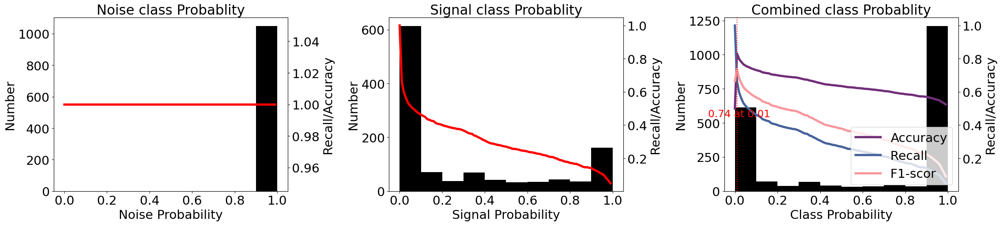

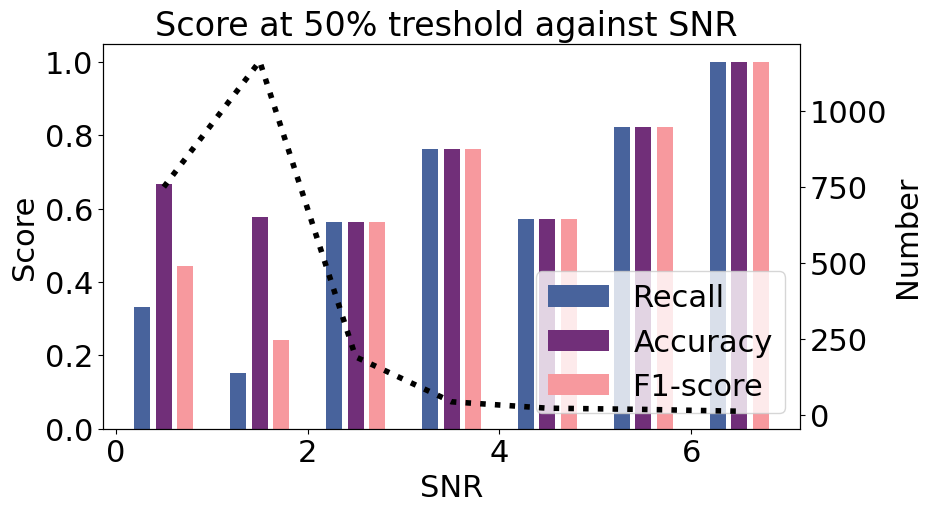

In [11]:
f1,f2, L = plotprobs(pred_list_EQT1,labels)
BestP1['EQT'] = L[0]
BestT1['EQT'] = L[1]
BestA1['EQT'] = L[3]
BestR1['EQT'] = L[2]
f1.savefig("Figure/EQT_Prob_OD.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/EQT_Snr_OD.svg", dpi=100, bbox_inches='tight')

## GPD

In [12]:
## # Load the pre-trained PhaseNet model
print(GPD.list_pretrained())
model = GPD.from_pretrained("original")
model.to('cpu:0')

['dummy', 'ethz', 'geofon', 'instance', 'iquique', 'lendb', 'neic', 'original', 'scedc', 'stead']


GPD(
  (conv1): Conv1d(3, 32, kernel_size=(21,), stride=(1,), padding=(10,))
  (bn1): BatchNorm1d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv1d(32, 64, kernel_size=(15,), stride=(1,), padding=(7,))
  (bn2): BatchNorm1d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1d(64, 128, kernel_size=(11,), stride=(1,), padding=(5,))
  (bn3): BatchNorm1d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv1d(128, 256, kernel_size=(9,), stride=(1,), padding=(4,))
  (bn4): BatchNorm1d(256, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=6400, out_features=200, bias=True)
  (bn5): BatchNorm1d(200, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (fc2): Linear(in_features=200, out_features=200, bias=True)
  (bn6): BatchNorm1d(200, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (fc3): Linear(in_features=200, out_featu

In [13]:
%autoawait on

pred_list = []
for i in tqdm(range(len(datasetOD))):
    preds = model.annotate(datasetOD[i][0])
    pred_list.append(max(preds[0].data) )

pred_list_GPD1 = np.array(pred_list)

  0%|                                                                                                                                | 0/2193 [00:00<?, ?it/s]

  0%|                                                                                                                        | 1/2193 [00:00<22:04,  1.65it/s]

  0%|                                                                                                                        | 2/2193 [00:01<20:11,  1.81it/s]

  0%|▏                                                                                                                       | 3/2193 [00:01<14:35,  2.50it/s]

  0%|▏                                                                                                                       | 4/2193 [00:01<15:20,  2.38it/s]

  0%|▎                                                                                                                       | 5/2193 [00:02<12:58,  2.81it/s]

  0%|▎                                                                                                                       | 6/2193 [00:02<12:35,  2.89it/s]

  0%|▍                                                                                                                       | 7/2193 [00:02<10:28,  3.48it/s]

  0%|▍                                                                                                                       | 8/2193 [00:02<12:12,  2.98it/s]

  0%|▍                                                                                                                       | 9/2193 [00:03<12:11,  2.99it/s]

  0%|▌                                                                                                                      | 10/2193 [00:03<13:40,  2.66it/s]

  1%|▌                                                                                                                      | 11/2193 [00:04<12:53,  2.82it/s]

  1%|▋                                                                                                                      | 12/2193 [00:04<13:40,  2.66it/s]

  1%|▋                                                                                                                      | 13/2193 [00:04<13:19,  2.73it/s]

  1%|▊                                                                                                                      | 14/2193 [00:05<11:54,  3.05it/s]

  1%|▊                                                                                                                      | 15/2193 [00:05<13:50,  2.62it/s]

  1%|▊                                                                                                                      | 16/2193 [00:05<13:15,  2.74it/s]

  1%|▉                                                                                                                      | 17/2193 [00:06<13:54,  2.61it/s]

  1%|▉                                                                                                                      | 18/2193 [00:06<15:13,  2.38it/s]

  1%|█                                                                                                                      | 19/2193 [00:07<15:44,  2.30it/s]

  1%|█▏                                                                                                                     | 21/2193 [00:07<12:36,  2.87it/s]

  1%|█▏                                                                                                                     | 22/2193 [00:08<13:45,  2.63it/s]

  1%|█▏                                                                                                                     | 23/2193 [00:08<12:09,  2.98it/s]

  1%|█▎                                                                                                                     | 24/2193 [00:08<11:35,  3.12it/s]

  1%|█▎                                                                                                                     | 25/2193 [00:09<12:11,  2.96it/s]

  1%|█▍                                                                                                                     | 26/2193 [00:09<10:51,  3.33it/s]

  1%|█▍                                                                                                                     | 27/2193 [00:09<10:37,  3.40it/s]

  1%|█▌                                                                                                                     | 28/2193 [00:09<10:41,  3.37it/s]

  1%|█▌                                                                                                                     | 29/2193 [00:10<10:09,  3.55it/s]

  1%|█▋                                                                                                                     | 30/2193 [00:10<10:47,  3.34it/s]

  1%|█▋                                                                                                                     | 31/2193 [00:10<10:29,  3.44it/s]

  1%|█▋                                                                                                                     | 32/2193 [00:11<09:45,  3.69it/s]

  2%|█▊                                                                                                                     | 33/2193 [00:11<11:35,  3.10it/s]

  2%|█▊                                                                                                                     | 34/2193 [00:11<09:31,  3.78it/s]

  2%|█▉                                                                                                                     | 35/2193 [00:11<09:22,  3.84it/s]

  2%|█▉                                                                                                                     | 36/2193 [00:12<13:19,  2.70it/s]

  2%|██                                                                                                                     | 37/2193 [00:12<14:17,  2.52it/s]

  2%|██                                                                                                                     | 38/2193 [00:13<15:23,  2.33it/s]

  2%|██                                                                                                                     | 39/2193 [00:13<12:28,  2.88it/s]

  2%|██▏                                                                                                                    | 40/2193 [00:14<13:24,  2.68it/s]

  2%|██▏                                                                                                                    | 41/2193 [00:14<14:38,  2.45it/s]

  2%|██▎                                                                                                                    | 42/2193 [00:14<13:04,  2.74it/s]

  2%|██▎                                                                                                                    | 43/2193 [00:15<14:14,  2.51it/s]

  2%|██▍                                                                                                                    | 44/2193 [00:15<12:29,  2.87it/s]

  2%|██▍                                                                                                                    | 45/2193 [00:16<14:30,  2.47it/s]

  2%|██▍                                                                                                                    | 46/2193 [00:16<14:34,  2.46it/s]

  2%|██▌                                                                                                                    | 47/2193 [00:16<12:48,  2.79it/s]

  2%|██▌                                                                                                                    | 48/2193 [00:17<12:39,  2.82it/s]

  2%|██▋                                                                                                                    | 49/2193 [00:17<13:56,  2.56it/s]

  2%|██▋                                                                                                                    | 50/2193 [00:17<14:55,  2.39it/s]

  2%|██▊                                                                                                                    | 51/2193 [00:18<15:45,  2.27it/s]

  2%|██▊                                                                                                                    | 52/2193 [00:19<16:50,  2.12it/s]

  2%|██▉                                                                                                                    | 53/2193 [00:19<15:59,  2.23it/s]

  2%|██▉                                                                                                                    | 54/2193 [00:19<15:52,  2.25it/s]

  3%|██▉                                                                                                                    | 55/2193 [00:20<14:12,  2.51it/s]

  3%|███                                                                                                                    | 56/2193 [00:20<16:32,  2.15it/s]

  3%|███                                                                                                                    | 57/2193 [00:21<16:33,  2.15it/s]

  3%|███▏                                                                                                                   | 58/2193 [00:21<15:07,  2.35it/s]

  3%|███▏                                                                                                                   | 59/2193 [00:22<18:58,  1.87it/s]

  3%|███▎                                                                                                                   | 60/2193 [00:22<18:17,  1.94it/s]

  3%|███▎                                                                                                                   | 61/2193 [00:23<17:48,  2.00it/s]

  3%|███▎                                                                                                                   | 62/2193 [00:23<16:48,  2.11it/s]

  3%|███▍                                                                                                                   | 63/2193 [00:24<16:57,  2.09it/s]

  3%|███▍                                                                                                                   | 64/2193 [00:24<18:19,  1.94it/s]

  3%|███▌                                                                                                                   | 65/2193 [00:25<16:14,  2.18it/s]

  3%|███▌                                                                                                                   | 66/2193 [00:25<14:09,  2.50it/s]

  3%|███▋                                                                                                                   | 67/2193 [00:25<12:49,  2.76it/s]

  3%|███▋                                                                                                                   | 68/2193 [00:25<10:59,  3.22it/s]

  3%|███▋                                                                                                                   | 69/2193 [00:26<13:02,  2.71it/s]

  3%|███▊                                                                                                                   | 70/2193 [00:26<13:58,  2.53it/s]

  3%|███▊                                                                                                                   | 71/2193 [00:27<14:24,  2.45it/s]

  3%|███▉                                                                                                                   | 72/2193 [00:27<15:04,  2.35it/s]

  3%|███▉                                                                                                                   | 73/2193 [00:27<13:29,  2.62it/s]

  3%|████                                                                                                                   | 74/2193 [00:28<11:33,  3.05it/s]

  3%|████                                                                                                                   | 75/2193 [00:28<14:53,  2.37it/s]

  3%|████                                                                                                                   | 76/2193 [00:29<16:13,  2.18it/s]

  4%|████▏                                                                                                                  | 77/2193 [00:29<16:33,  2.13it/s]

  4%|████▏                                                                                                                  | 78/2193 [00:30<14:54,  2.36it/s]

  4%|████▎                                                                                                                  | 79/2193 [00:30<13:22,  2.63it/s]

  4%|████▎                                                                                                                  | 80/2193 [00:30<14:13,  2.48it/s]

  4%|████▍                                                                                                                  | 81/2193 [00:31<12:07,  2.90it/s]

  4%|████▍                                                                                                                  | 82/2193 [00:31<14:53,  2.36it/s]

  4%|████▌                                                                                                                  | 83/2193 [00:32<14:09,  2.48it/s]

  4%|████▌                                                                                                                  | 84/2193 [00:32<14:19,  2.45it/s]

  4%|████▌                                                                                                                  | 85/2193 [00:33<15:59,  2.20it/s]

  4%|████▋                                                                                                                  | 86/2193 [00:33<14:34,  2.41it/s]

  4%|████▋                                                                                                                  | 87/2193 [00:33<12:59,  2.70it/s]

  4%|████▊                                                                                                                  | 88/2193 [00:34<15:35,  2.25it/s]

  4%|████▊                                                                                                                  | 89/2193 [00:34<17:20,  2.02it/s]

  4%|████▉                                                                                                                  | 90/2193 [00:35<14:00,  2.50it/s]

  4%|████▉                                                                                                                  | 91/2193 [00:35<13:23,  2.62it/s]

  4%|████▉                                                                                                                  | 92/2193 [00:35<12:25,  2.82it/s]

  4%|█████                                                                                                                  | 93/2193 [00:36<14:04,  2.49it/s]

  4%|█████                                                                                                                  | 94/2193 [00:36<12:46,  2.74it/s]

  4%|█████▏                                                                                                                 | 95/2193 [00:36<11:53,  2.94it/s]

  4%|█████▏                                                                                                                 | 96/2193 [00:37<13:20,  2.62it/s]

  4%|█████▎                                                                                                                 | 97/2193 [00:37<14:32,  2.40it/s]

  4%|█████▎                                                                                                                 | 98/2193 [00:38<14:25,  2.42it/s]

  5%|█████▎                                                                                                                 | 99/2193 [00:38<13:58,  2.50it/s]

  5%|█████▍                                                                                                                | 100/2193 [00:39<15:03,  2.32it/s]

  5%|█████▍                                                                                                                | 101/2193 [00:39<15:47,  2.21it/s]

  5%|█████▍                                                                                                                | 102/2193 [00:40<17:41,  1.97it/s]

  5%|█████▌                                                                                                                | 103/2193 [00:40<16:10,  2.15it/s]

  5%|█████▌                                                                                                                | 104/2193 [00:40<13:24,  2.60it/s]

  5%|█████▋                                                                                                                | 105/2193 [00:41<13:41,  2.54it/s]

  5%|█████▋                                                                                                                | 106/2193 [00:41<13:38,  2.55it/s]

  5%|█████▊                                                                                                                | 107/2193 [00:41<13:23,  2.60it/s]

  5%|█████▊                                                                                                                | 108/2193 [00:42<12:23,  2.80it/s]

  5%|█████▊                                                                                                                | 109/2193 [00:42<15:59,  2.17it/s]

  5%|█████▉                                                                                                                | 110/2193 [00:43<14:39,  2.37it/s]

  5%|█████▉                                                                                                                | 111/2193 [00:43<13:23,  2.59it/s]

  5%|██████                                                                                                                | 112/2193 [00:43<13:34,  2.55it/s]

  5%|██████                                                                                                                | 113/2193 [00:44<12:38,  2.74it/s]

  5%|██████▏                                                                                                               | 114/2193 [00:44<12:59,  2.67it/s]

  5%|██████▏                                                                                                               | 115/2193 [00:44<11:57,  2.90it/s]

  5%|██████▏                                                                                                               | 116/2193 [00:45<14:34,  2.37it/s]

  5%|██████▎                                                                                                               | 117/2193 [00:45<14:49,  2.33it/s]

  5%|██████▎                                                                                                               | 118/2193 [00:46<13:00,  2.66it/s]

  5%|██████▍                                                                                                               | 119/2193 [00:46<13:24,  2.58it/s]

  5%|██████▍                                                                                                               | 120/2193 [00:46<12:21,  2.79it/s]

  6%|██████▌                                                                                                               | 122/2193 [00:47<10:57,  3.15it/s]

  6%|██████▌                                                                                                               | 123/2193 [00:47<12:15,  2.81it/s]

  6%|██████▋                                                                                                               | 124/2193 [00:48<13:08,  2.62it/s]

  6%|██████▋                                                                                                               | 125/2193 [00:48<13:01,  2.65it/s]

  6%|██████▊                                                                                                               | 126/2193 [00:49<12:07,  2.84it/s]

  6%|██████▊                                                                                                               | 127/2193 [00:49<10:43,  3.21it/s]

  6%|██████▉                                                                                                               | 128/2193 [00:49<12:05,  2.84it/s]

  6%|██████▉                                                                                                               | 129/2193 [00:49<11:18,  3.04it/s]

  6%|██████▉                                                                                                               | 130/2193 [00:50<10:22,  3.31it/s]

  6%|███████                                                                                                               | 131/2193 [00:50<12:15,  2.80it/s]

  6%|███████                                                                                                               | 132/2193 [00:51<11:48,  2.91it/s]

  6%|███████▏                                                                                                              | 133/2193 [00:51<11:23,  3.01it/s]

  6%|███████▏                                                                                                              | 134/2193 [00:51<10:59,  3.12it/s]

  6%|███████▎                                                                                                              | 135/2193 [00:52<12:28,  2.75it/s]

  6%|███████▎                                                                                                              | 136/2193 [00:52<13:25,  2.55it/s]

  6%|███████▎                                                                                                              | 137/2193 [00:52<12:10,  2.81it/s]

  6%|███████▍                                                                                                              | 138/2193 [00:52<09:34,  3.58it/s]

  6%|███████▍                                                                                                              | 139/2193 [00:53<09:21,  3.66it/s]

  6%|███████▌                                                                                                              | 140/2193 [00:53<10:54,  3.14it/s]

  6%|███████▌                                                                                                              | 141/2193 [00:53<11:37,  2.94it/s]

  6%|███████▋                                                                                                              | 142/2193 [00:54<10:35,  3.23it/s]

  7%|███████▋                                                                                                              | 143/2193 [00:54<10:02,  3.40it/s]

  7%|███████▋                                                                                                              | 144/2193 [00:54<11:09,  3.06it/s]

  7%|███████▊                                                                                                              | 145/2193 [00:55<11:32,  2.96it/s]

  7%|███████▊                                                                                                              | 146/2193 [00:55<12:48,  2.66it/s]

  7%|███████▉                                                                                                              | 147/2193 [00:55<11:31,  2.96it/s]

  7%|███████▉                                                                                                              | 148/2193 [00:56<12:35,  2.71it/s]

  7%|████████                                                                                                              | 149/2193 [00:56<13:08,  2.59it/s]

  7%|████████                                                                                                              | 150/2193 [00:57<13:58,  2.44it/s]

  7%|████████                                                                                                              | 151/2193 [00:57<14:31,  2.34it/s]

  7%|████████▏                                                                                                             | 152/2193 [00:58<14:34,  2.33it/s]

  7%|████████▏                                                                                                             | 153/2193 [00:58<13:13,  2.57it/s]

  7%|████████▎                                                                                                             | 154/2193 [00:58<12:30,  2.72it/s]

  7%|████████▎                                                                                                             | 155/2193 [00:59<12:15,  2.77it/s]

  7%|████████▍                                                                                                             | 156/2193 [00:59<12:06,  2.81it/s]

  7%|████████▍                                                                                                             | 157/2193 [00:59<12:43,  2.67it/s]

  7%|████████▌                                                                                                             | 158/2193 [01:00<11:47,  2.88it/s]

  7%|████████▌                                                                                                             | 159/2193 [01:00<10:56,  3.10it/s]

  7%|████████▌                                                                                                             | 160/2193 [01:00<10:52,  3.12it/s]

  7%|████████▋                                                                                                             | 161/2193 [01:01<10:50,  3.12it/s]

  7%|████████▋                                                                                                             | 162/2193 [01:01<10:36,  3.19it/s]

  7%|████████▊                                                                                                             | 163/2193 [01:01<10:54,  3.10it/s]

  7%|████████▊                                                                                                             | 164/2193 [01:02<10:38,  3.18it/s]

  8%|████████▉                                                                                                             | 165/2193 [01:02<11:33,  2.93it/s]

  8%|████████▉                                                                                                             | 166/2193 [01:02<11:27,  2.95it/s]

  8%|████████▉                                                                                                             | 167/2193 [01:03<11:20,  2.98it/s]

  8%|█████████                                                                                                             | 168/2193 [01:03<11:05,  3.04it/s]

  8%|█████████                                                                                                             | 169/2193 [01:03<10:19,  3.27it/s]

  8%|█████████▏                                                                                                            | 170/2193 [01:04<11:48,  2.86it/s]

  8%|█████████▏                                                                                                            | 171/2193 [01:04<12:45,  2.64it/s]

  8%|█████████▎                                                                                                            | 172/2193 [01:04<12:31,  2.69it/s]

  8%|█████████▎                                                                                                            | 173/2193 [01:05<12:36,  2.67it/s]

  8%|█████████▎                                                                                                            | 174/2193 [01:05<13:55,  2.42it/s]

  8%|█████████▍                                                                                                            | 175/2193 [01:05<10:55,  3.08it/s]

  8%|█████████▍                                                                                                            | 176/2193 [01:06<11:24,  2.95it/s]

  8%|█████████▌                                                                                                            | 177/2193 [01:06<10:38,  3.16it/s]

  8%|█████████▌                                                                                                            | 178/2193 [01:06<10:32,  3.19it/s]

  8%|█████████▋                                                                                                            | 179/2193 [01:07<10:10,  3.30it/s]

  8%|█████████▋                                                                                                            | 180/2193 [01:07<11:59,  2.80it/s]

  8%|█████████▋                                                                                                            | 181/2193 [01:07<11:13,  2.99it/s]

  8%|█████████▊                                                                                                            | 182/2193 [01:08<09:33,  3.51it/s]

  8%|█████████▊                                                                                                            | 183/2193 [01:08<10:10,  3.29it/s]

  8%|█████████▉                                                                                                            | 184/2193 [01:08<11:31,  2.90it/s]

  8%|█████████▉                                                                                                            | 185/2193 [01:09<10:52,  3.08it/s]

  8%|██████████                                                                                                            | 186/2193 [01:09<10:35,  3.16it/s]

  9%|██████████                                                                                                            | 187/2193 [01:09<12:02,  2.78it/s]

  9%|██████████                                                                                                            | 188/2193 [01:10<13:13,  2.53it/s]

  9%|██████████▏                                                                                                           | 189/2193 [01:10<12:48,  2.61it/s]

  9%|██████████▏                                                                                                           | 190/2193 [01:11<12:08,  2.75it/s]

  9%|██████████▎                                                                                                           | 191/2193 [01:11<13:03,  2.56it/s]

  9%|██████████▎                                                                                                           | 192/2193 [01:11<12:21,  2.70it/s]

  9%|██████████▍                                                                                                           | 193/2193 [01:12<11:16,  2.95it/s]

  9%|██████████▍                                                                                                           | 194/2193 [01:12<09:53,  3.37it/s]

  9%|██████████▍                                                                                                           | 195/2193 [01:12<13:24,  2.48it/s]

  9%|██████████▌                                                                                                           | 196/2193 [01:13<12:58,  2.57it/s]

  9%|██████████▌                                                                                                           | 197/2193 [01:13<11:37,  2.86it/s]

  9%|██████████▋                                                                                                           | 198/2193 [01:13<12:19,  2.70it/s]

  9%|██████████▋                                                                                                           | 199/2193 [01:14<13:48,  2.41it/s]

  9%|██████████▊                                                                                                           | 200/2193 [01:14<13:45,  2.41it/s]

  9%|██████████▊                                                                                                           | 201/2193 [01:15<13:56,  2.38it/s]

  9%|██████████▊                                                                                                           | 202/2193 [01:15<12:59,  2.55it/s]

  9%|██████████▉                                                                                                           | 203/2193 [01:15<11:47,  2.81it/s]

  9%|██████████▉                                                                                                           | 204/2193 [01:16<10:25,  3.18it/s]

  9%|███████████                                                                                                           | 205/2193 [01:16<11:17,  2.94it/s]

  9%|███████████                                                                                                           | 206/2193 [01:17<12:24,  2.67it/s]

  9%|███████████▏                                                                                                          | 207/2193 [01:17<10:49,  3.06it/s]

  9%|███████████▏                                                                                                          | 208/2193 [01:17<11:03,  2.99it/s]

 10%|███████████▏                                                                                                          | 209/2193 [01:17<11:13,  2.95it/s]

 10%|███████████▎                                                                                                          | 210/2193 [01:18<14:10,  2.33it/s]

 10%|███████████▎                                                                                                          | 211/2193 [01:19<14:11,  2.33it/s]

 10%|███████████▍                                                                                                          | 212/2193 [01:19<13:58,  2.36it/s]

 10%|███████████▍                                                                                                          | 213/2193 [01:19<13:36,  2.43it/s]

 10%|███████████▌                                                                                                          | 214/2193 [01:20<12:17,  2.68it/s]

 10%|███████████▌                                                                                                          | 215/2193 [01:20<10:51,  3.04it/s]

 10%|███████████▌                                                                                                          | 216/2193 [01:20<11:46,  2.80it/s]

 10%|███████████▋                                                                                                          | 217/2193 [01:21<12:30,  2.63it/s]

 10%|███████████▋                                                                                                          | 218/2193 [01:21<12:47,  2.57it/s]

 10%|███████████▊                                                                                                          | 219/2193 [01:21<12:59,  2.53it/s]

 10%|███████████▊                                                                                                          | 220/2193 [01:22<13:46,  2.39it/s]

 10%|███████████▉                                                                                                          | 221/2193 [01:22<13:07,  2.50it/s]

 10%|███████████▉                                                                                                          | 222/2193 [01:22<10:45,  3.05it/s]

 10%|███████████▉                                                                                                          | 223/2193 [01:23<11:06,  2.95it/s]

 10%|████████████                                                                                                          | 224/2193 [01:23<09:03,  3.62it/s]

 10%|████████████                                                                                                          | 225/2193 [01:23<09:13,  3.55it/s]

 10%|████████████▏                                                                                                         | 226/2193 [01:23<07:27,  4.40it/s]

 10%|████████████▏                                                                                                         | 227/2193 [01:24<08:36,  3.81it/s]

 10%|████████████▎                                                                                                         | 228/2193 [01:24<10:21,  3.16it/s]

 10%|████████████▎                                                                                                         | 229/2193 [01:25<11:03,  2.96it/s]

 10%|████████████▍                                                                                                         | 230/2193 [01:25<10:02,  3.26it/s]

 11%|████████████▍                                                                                                         | 231/2193 [01:25<10:51,  3.01it/s]

 11%|████████████▍                                                                                                         | 232/2193 [01:25<10:33,  3.10it/s]

 11%|████████████▌                                                                                                         | 233/2193 [01:26<12:02,  2.71it/s]

 11%|████████████▌                                                                                                         | 234/2193 [01:26<12:45,  2.56it/s]

 11%|████████████▋                                                                                                         | 235/2193 [01:27<12:32,  2.60it/s]

 11%|████████████▋                                                                                                         | 236/2193 [01:27<13:28,  2.42it/s]

 11%|████████████▊                                                                                                         | 237/2193 [01:28<13:49,  2.36it/s]

 11%|████████████▊                                                                                                         | 238/2193 [01:28<14:05,  2.31it/s]

 11%|████████████▊                                                                                                         | 239/2193 [01:28<12:39,  2.57it/s]

 11%|████████████▉                                                                                                         | 240/2193 [01:29<11:44,  2.77it/s]

 11%|████████████▉                                                                                                         | 241/2193 [01:29<10:13,  3.18it/s]

 11%|█████████████                                                                                                         | 242/2193 [01:29<10:12,  3.19it/s]

 11%|█████████████                                                                                                         | 243/2193 [01:30<10:12,  3.18it/s]

 11%|█████████████▏                                                                                                        | 244/2193 [01:30<08:55,  3.64it/s]

 11%|█████████████▏                                                                                                        | 245/2193 [01:30<09:16,  3.50it/s]

 11%|█████████████▏                                                                                                        | 246/2193 [01:30<09:25,  3.45it/s]

 11%|█████████████▎                                                                                                        | 247/2193 [01:31<11:41,  2.77it/s]

 11%|█████████████▎                                                                                                        | 248/2193 [01:31<13:01,  2.49it/s]

 11%|█████████████▍                                                                                                        | 249/2193 [01:32<10:38,  3.05it/s]

 11%|█████████████▍                                                                                                        | 250/2193 [01:32<09:52,  3.28it/s]

 11%|█████████████▌                                                                                                        | 251/2193 [01:32<10:57,  2.95it/s]

 11%|█████████████▌                                                                                                        | 252/2193 [01:32<10:18,  3.14it/s]

 12%|█████████████▌                                                                                                        | 253/2193 [01:33<11:30,  2.81it/s]

 12%|█████████████▋                                                                                                        | 254/2193 [01:33<13:34,  2.38it/s]

 12%|█████████████▋                                                                                                        | 255/2193 [01:34<13:06,  2.47it/s]

 12%|█████████████▊                                                                                                        | 256/2193 [01:34<13:05,  2.47it/s]

 12%|█████████████▊                                                                                                        | 257/2193 [01:35<12:09,  2.66it/s]

 12%|█████████████▉                                                                                                        | 258/2193 [01:35<13:27,  2.40it/s]

 12%|█████████████▉                                                                                                        | 259/2193 [01:35<11:50,  2.72it/s]

 12%|█████████████▉                                                                                                        | 260/2193 [01:36<10:59,  2.93it/s]

 12%|██████████████                                                                                                        | 261/2193 [01:36<10:16,  3.14it/s]

 12%|██████████████                                                                                                        | 262/2193 [01:36<11:17,  2.85it/s]

 12%|██████████████▏                                                                                                       | 263/2193 [01:37<10:31,  3.06it/s]

 12%|██████████████▏                                                                                                       | 264/2193 [01:37<09:06,  3.53it/s]

 12%|██████████████▎                                                                                                       | 265/2193 [01:37<09:26,  3.41it/s]

 12%|██████████████▎                                                                                                       | 266/2193 [01:37<10:39,  3.01it/s]

 12%|██████████████▎                                                                                                       | 267/2193 [01:38<10:03,  3.19it/s]

 12%|██████████████▍                                                                                                       | 268/2193 [01:38<09:18,  3.45it/s]

 12%|██████████████▍                                                                                                       | 269/2193 [01:38<10:30,  3.05it/s]

 12%|██████████████▌                                                                                                       | 270/2193 [01:39<10:09,  3.15it/s]

 12%|██████████████▌                                                                                                       | 271/2193 [01:39<11:04,  2.89it/s]

 12%|██████████████▋                                                                                                       | 272/2193 [01:39<10:53,  2.94it/s]

 12%|██████████████▋                                                                                                       | 273/2193 [01:40<13:17,  2.41it/s]

 12%|██████████████▋                                                                                                       | 274/2193 [01:41<14:41,  2.18it/s]

 13%|██████████████▊                                                                                                       | 275/2193 [01:41<14:56,  2.14it/s]

 13%|██████████████▊                                                                                                       | 276/2193 [01:41<12:02,  2.65it/s]

 13%|██████████████▉                                                                                                       | 277/2193 [01:42<12:31,  2.55it/s]

 13%|██████████████▉                                                                                                       | 278/2193 [01:42<11:09,  2.86it/s]

 13%|███████████████                                                                                                       | 279/2193 [01:42<10:23,  3.07it/s]

 13%|███████████████                                                                                                       | 280/2193 [01:43<12:00,  2.65it/s]

 13%|███████████████                                                                                                       | 281/2193 [01:43<13:01,  2.45it/s]

 13%|███████████████▏                                                                                                      | 282/2193 [01:44<12:30,  2.55it/s]

 13%|███████████████▏                                                                                                      | 283/2193 [01:44<13:21,  2.38it/s]

 13%|███████████████▎                                                                                                      | 284/2193 [01:44<12:18,  2.58it/s]

 13%|███████████████▎                                                                                                      | 285/2193 [01:45<13:48,  2.30it/s]

 13%|███████████████▍                                                                                                      | 286/2193 [01:45<13:37,  2.33it/s]

 13%|███████████████▍                                                                                                      | 287/2193 [01:45<11:31,  2.76it/s]

 13%|███████████████▍                                                                                                      | 288/2193 [01:46<10:37,  2.99it/s]

 13%|███████████████▌                                                                                                      | 289/2193 [01:46<11:12,  2.83it/s]

 13%|███████████████▌                                                                                                      | 290/2193 [01:46<10:11,  3.11it/s]

 13%|███████████████▋                                                                                                      | 291/2193 [01:47<11:37,  2.73it/s]

 13%|███████████████▋                                                                                                      | 292/2193 [01:47<12:02,  2.63it/s]

 13%|███████████████▊                                                                                                      | 293/2193 [01:47<10:04,  3.14it/s]

 13%|███████████████▊                                                                                                      | 294/2193 [01:48<10:24,  3.04it/s]

 13%|███████████████▊                                                                                                      | 295/2193 [01:48<11:19,  2.79it/s]

 13%|███████████████▉                                                                                                      | 296/2193 [01:49<10:37,  2.97it/s]

 14%|███████████████▉                                                                                                      | 297/2193 [01:49<09:43,  3.25it/s]

 14%|████████████████                                                                                                      | 298/2193 [01:49<09:14,  3.42it/s]

 14%|████████████████                                                                                                      | 299/2193 [01:49<10:20,  3.05it/s]

 14%|████████████████▏                                                                                                     | 300/2193 [01:50<10:04,  3.13it/s]

 14%|████████████████▏                                                                                                     | 301/2193 [01:50<11:25,  2.76it/s]

 14%|████████████████▏                                                                                                     | 302/2193 [01:50<10:14,  3.07it/s]

 14%|████████████████▎                                                                                                     | 303/2193 [01:51<10:10,  3.09it/s]

 14%|████████████████▎                                                                                                     | 304/2193 [01:51<09:49,  3.20it/s]

 14%|████████████████▍                                                                                                     | 305/2193 [01:51<10:00,  3.15it/s]

 14%|████████████████▍                                                                                                     | 306/2193 [01:52<09:13,  3.41it/s]

 14%|████████████████▌                                                                                                     | 307/2193 [01:52<08:33,  3.67it/s]

 14%|████████████████▌                                                                                                     | 308/2193 [01:52<08:43,  3.60it/s]

 14%|████████████████▋                                                                                                     | 309/2193 [01:52<08:15,  3.80it/s]

 14%|████████████████▋                                                                                                     | 310/2193 [01:53<07:26,  4.22it/s]

 14%|████████████████▋                                                                                                     | 311/2193 [01:53<09:59,  3.14it/s]

 14%|████████████████▊                                                                                                     | 312/2193 [01:54<11:47,  2.66it/s]

 14%|████████████████▊                                                                                                     | 313/2193 [01:54<10:29,  2.99it/s]

 14%|████████████████▉                                                                                                     | 314/2193 [01:54<09:18,  3.36it/s]

 14%|████████████████▉                                                                                                     | 315/2193 [01:54<09:55,  3.15it/s]

 14%|█████████████████                                                                                                     | 316/2193 [01:55<09:14,  3.39it/s]

 14%|█████████████████                                                                                                     | 317/2193 [01:55<09:07,  3.43it/s]

 15%|█████████████████▏                                                                                                    | 319/2193 [01:55<08:39,  3.61it/s]

 15%|█████████████████▏                                                                                                    | 320/2193 [01:56<10:05,  3.10it/s]

 15%|█████████████████▎                                                                                                    | 321/2193 [01:56<09:25,  3.31it/s]

 15%|█████████████████▎                                                                                                    | 322/2193 [01:56<09:22,  3.33it/s]

 15%|█████████████████▍                                                                                                    | 323/2193 [01:57<13:18,  2.34it/s]

 15%|█████████████████▍                                                                                                    | 324/2193 [01:58<13:47,  2.26it/s]

 15%|█████████████████▍                                                                                                    | 325/2193 [01:58<13:28,  2.31it/s]

 15%|█████████████████▌                                                                                                    | 326/2193 [01:59<13:59,  2.22it/s]

 15%|█████████████████▌                                                                                                    | 327/2193 [01:59<12:12,  2.55it/s]

 15%|█████████████████▋                                                                                                    | 328/2193 [01:59<14:52,  2.09it/s]

 15%|█████████████████▋                                                                                                    | 329/2193 [02:00<12:30,  2.48it/s]

 15%|█████████████████▊                                                                                                    | 330/2193 [02:00<12:57,  2.40it/s]

 15%|█████████████████▊                                                                                                    | 331/2193 [02:00<12:07,  2.56it/s]

 15%|█████████████████▊                                                                                                    | 332/2193 [02:01<12:38,  2.45it/s]

 15%|█████████████████▉                                                                                                    | 333/2193 [02:01<11:34,  2.68it/s]

 15%|█████████████████▉                                                                                                    | 334/2193 [02:02<11:09,  2.78it/s]

 15%|██████████████████                                                                                                    | 335/2193 [02:02<09:15,  3.34it/s]

 15%|██████████████████                                                                                                    | 336/2193 [02:02<10:54,  2.84it/s]

 15%|██████████████████▏                                                                                                   | 337/2193 [02:02<09:52,  3.13it/s]

 15%|██████████████████▏                                                                                                   | 338/2193 [02:03<13:06,  2.36it/s]

 15%|██████████████████▏                                                                                                   | 339/2193 [02:04<13:34,  2.28it/s]

 16%|██████████████████▎                                                                                                   | 340/2193 [02:04<13:16,  2.33it/s]

 16%|██████████████████▎                                                                                                   | 341/2193 [02:04<12:55,  2.39it/s]

 16%|██████████████████▍                                                                                                   | 342/2193 [02:05<13:01,  2.37it/s]

 16%|██████████████████▍                                                                                                   | 343/2193 [02:05<14:05,  2.19it/s]

 16%|██████████████████▌                                                                                                   | 344/2193 [02:06<15:15,  2.02it/s]

 16%|██████████████████▌                                                                                                   | 345/2193 [02:06<15:00,  2.05it/s]

 16%|██████████████████▌                                                                                                   | 346/2193 [02:07<13:10,  2.34it/s]

 16%|██████████████████▋                                                                                                   | 347/2193 [02:07<12:25,  2.47it/s]

 16%|██████████████████▋                                                                                                   | 348/2193 [02:08<13:57,  2.20it/s]

 16%|██████████████████▊                                                                                                   | 349/2193 [02:08<13:49,  2.22it/s]

 16%|██████████████████▊                                                                                                   | 350/2193 [02:08<12:23,  2.48it/s]

 16%|██████████████████▉                                                                                                   | 351/2193 [02:09<13:17,  2.31it/s]

 16%|██████████████████▉                                                                                                   | 352/2193 [02:09<13:03,  2.35it/s]

 16%|██████████████████▉                                                                                                   | 353/2193 [02:10<13:44,  2.23it/s]

 16%|███████████████████                                                                                                   | 354/2193 [02:10<12:01,  2.55it/s]

 16%|███████████████████                                                                                                   | 355/2193 [02:11<13:04,  2.34it/s]

 16%|███████████████████▏                                                                                                  | 356/2193 [02:11<13:13,  2.31it/s]

 16%|███████████████████▏                                                                                                  | 357/2193 [02:11<11:36,  2.64it/s]

 16%|███████████████████▎                                                                                                  | 358/2193 [02:11<10:37,  2.88it/s]

 16%|███████████████████▎                                                                                                  | 359/2193 [02:12<09:32,  3.20it/s]

 16%|███████████████████▎                                                                                                  | 360/2193 [02:12<08:55,  3.42it/s]

 16%|███████████████████▍                                                                                                  | 361/2193 [02:12<10:42,  2.85it/s]

 17%|███████████████████▍                                                                                                  | 362/2193 [02:13<10:32,  2.90it/s]

 17%|███████████████████▌                                                                                                  | 363/2193 [02:13<09:33,  3.19it/s]

 17%|███████████████████▌                                                                                                  | 364/2193 [02:13<09:02,  3.37it/s]

 17%|███████████████████▋                                                                                                  | 365/2193 [02:14<11:54,  2.56it/s]

 17%|███████████████████▋                                                                                                  | 366/2193 [02:14<12:50,  2.37it/s]

 17%|███████████████████▋                                                                                                  | 367/2193 [02:15<11:28,  2.65it/s]

 17%|███████████████████▊                                                                                                  | 368/2193 [02:15<10:40,  2.85it/s]

 17%|███████████████████▊                                                                                                  | 369/2193 [02:15<09:45,  3.11it/s]

 17%|███████████████████▉                                                                                                  | 370/2193 [02:16<10:45,  2.82it/s]

 17%|███████████████████▉                                                                                                  | 371/2193 [02:16<12:51,  2.36it/s]

 17%|████████████████████                                                                                                  | 372/2193 [02:17<11:43,  2.59it/s]

 17%|████████████████████                                                                                                  | 373/2193 [02:17<11:33,  2.62it/s]

 17%|████████████████████                                                                                                  | 374/2193 [02:17<12:02,  2.52it/s]

 17%|████████████████████▏                                                                                                 | 375/2193 [02:18<12:25,  2.44it/s]

 17%|████████████████████▏                                                                                                 | 376/2193 [02:18<12:45,  2.37it/s]

 17%|████████████████████▎                                                                                                 | 377/2193 [02:18<10:07,  2.99it/s]

 17%|████████████████████▎                                                                                                 | 378/2193 [02:19<10:58,  2.76it/s]

 17%|████████████████████▍                                                                                                 | 379/2193 [02:19<13:56,  2.17it/s]

 17%|████████████████████▍                                                                                                 | 380/2193 [02:20<13:31,  2.24it/s]

 17%|████████████████████▌                                                                                                 | 381/2193 [02:20<13:09,  2.29it/s]

 17%|████████████████████▌                                                                                                 | 382/2193 [02:21<11:51,  2.54it/s]

 17%|████████████████████▌                                                                                                 | 383/2193 [02:21<12:48,  2.36it/s]

 18%|████████████████████▋                                                                                                 | 384/2193 [02:22<13:26,  2.24it/s]

 18%|████████████████████▋                                                                                                 | 385/2193 [02:22<12:06,  2.49it/s]

 18%|████████████████████▊                                                                                                 | 386/2193 [02:22<12:00,  2.51it/s]

 18%|████████████████████▊                                                                                                 | 387/2193 [02:22<10:33,  2.85it/s]

 18%|████████████████████▉                                                                                                 | 388/2193 [02:23<09:29,  3.17it/s]

 18%|████████████████████▉                                                                                                 | 389/2193 [02:23<08:18,  3.62it/s]

 18%|████████████████████▉                                                                                                 | 390/2193 [02:23<08:08,  3.69it/s]

 18%|█████████████████████                                                                                                 | 391/2193 [02:24<10:07,  2.97it/s]

 18%|█████████████████████                                                                                                 | 392/2193 [02:24<10:53,  2.76it/s]

 18%|█████████████████████▏                                                                                                | 393/2193 [02:25<13:04,  2.29it/s]

 18%|█████████████████████▏                                                                                                | 394/2193 [02:25<11:56,  2.51it/s]

 18%|█████████████████████▎                                                                                                | 395/2193 [02:26<13:23,  2.24it/s]

 18%|█████████████████████▎                                                                                                | 396/2193 [02:26<11:45,  2.55it/s]

 18%|█████████████████████▎                                                                                                | 397/2193 [02:26<11:21,  2.63it/s]

 18%|█████████████████████▍                                                                                                | 398/2193 [02:27<12:18,  2.43it/s]

 18%|█████████████████████▍                                                                                                | 399/2193 [02:27<12:38,  2.37it/s]

 18%|█████████████████████▌                                                                                                | 400/2193 [02:27<12:12,  2.45it/s]

 18%|█████████████████████▌                                                                                                | 401/2193 [02:28<12:27,  2.40it/s]

 18%|█████████████████████▋                                                                                                | 402/2193 [02:29<14:11,  2.10it/s]

 18%|█████████████████████▋                                                                                                | 403/2193 [02:29<13:39,  2.18it/s]

 18%|█████████████████████▋                                                                                                | 404/2193 [02:29<12:34,  2.37it/s]

 18%|█████████████████████▊                                                                                                | 405/2193 [02:30<12:46,  2.33it/s]

 19%|█████████████████████▊                                                                                                | 406/2193 [02:30<12:01,  2.48it/s]

 19%|█████████████████████▉                                                                                                | 407/2193 [02:31<13:30,  2.20it/s]

 19%|█████████████████████▉                                                                                                | 408/2193 [02:31<15:03,  1.98it/s]

 19%|██████████████████████                                                                                                | 409/2193 [02:32<12:43,  2.34it/s]

 19%|██████████████████████                                                                                                | 410/2193 [02:32<13:15,  2.24it/s]

 19%|██████████████████████                                                                                                | 411/2193 [02:33<14:09,  2.10it/s]

 19%|██████████████████████▏                                                                                               | 412/2193 [02:33<13:38,  2.17it/s]

 19%|██████████████████████▏                                                                                               | 413/2193 [02:33<12:32,  2.37it/s]

 19%|██████████████████████▎                                                                                               | 414/2193 [02:34<11:17,  2.63it/s]

 19%|██████████████████████▎                                                                                               | 415/2193 [02:34<11:34,  2.56it/s]

 19%|██████████████████████▍                                                                                               | 416/2193 [02:34<10:12,  2.90it/s]

 19%|██████████████████████▍                                                                                               | 417/2193 [02:35<11:13,  2.64it/s]

 19%|██████████████████████▍                                                                                               | 418/2193 [02:35<10:02,  2.94it/s]

 19%|██████████████████████▌                                                                                               | 419/2193 [02:35<10:57,  2.70it/s]

 19%|██████████████████████▋                                                                                               | 421/2193 [02:36<09:21,  3.16it/s]

 19%|██████████████████████▋                                                                                               | 422/2193 [02:37<12:24,  2.38it/s]

 19%|██████████████████████▊                                                                                               | 423/2193 [02:37<12:27,  2.37it/s]

 19%|██████████████████████▊                                                                                               | 424/2193 [02:37<11:45,  2.51it/s]

 19%|██████████████████████▊                                                                                               | 425/2193 [02:38<12:51,  2.29it/s]

 19%|██████████████████████▉                                                                                               | 426/2193 [02:38<13:42,  2.15it/s]

 19%|██████████████████████▉                                                                                               | 427/2193 [02:39<14:09,  2.08it/s]

 20%|███████████████████████                                                                                               | 428/2193 [02:39<12:56,  2.27it/s]

 20%|███████████████████████                                                                                               | 429/2193 [02:40<12:40,  2.32it/s]

 20%|███████████████████████▏                                                                                              | 430/2193 [02:40<11:18,  2.60it/s]

 20%|███████████████████████▏                                                                                              | 431/2193 [02:40<11:51,  2.47it/s]

 20%|███████████████████████▏                                                                                              | 432/2193 [02:41<12:42,  2.31it/s]

 20%|███████████████████████▎                                                                                              | 433/2193 [02:41<11:23,  2.58it/s]

 20%|███████████████████████▎                                                                                              | 434/2193 [02:42<11:47,  2.49it/s]

 20%|███████████████████████▍                                                                                              | 435/2193 [02:42<09:38,  3.04it/s]

 20%|███████████████████████▍                                                                                              | 436/2193 [02:42<10:45,  2.72it/s]

 20%|███████████████████████▌                                                                                              | 437/2193 [02:43<09:38,  3.03it/s]

 20%|███████████████████████▌                                                                                              | 438/2193 [02:43<11:26,  2.56it/s]

 20%|███████████████████████▌                                                                                              | 439/2193 [02:43<08:54,  3.28it/s]

 20%|███████████████████████▋                                                                                              | 440/2193 [02:44<09:56,  2.94it/s]

 20%|███████████████████████▋                                                                                              | 441/2193 [02:44<09:51,  2.96it/s]

 20%|███████████████████████▊                                                                                              | 442/2193 [02:44<10:25,  2.80it/s]

 20%|███████████████████████▊                                                                                              | 443/2193 [02:45<10:38,  2.74it/s]

 20%|███████████████████████▉                                                                                              | 444/2193 [02:45<09:59,  2.92it/s]

 20%|███████████████████████▉                                                                                              | 445/2193 [02:45<09:24,  3.09it/s]

 20%|███████████████████████▉                                                                                              | 446/2193 [02:46<09:18,  3.13it/s]

 20%|████████████████████████                                                                                              | 447/2193 [02:46<10:08,  2.87it/s]

 20%|████████████████████████                                                                                              | 448/2193 [02:46<09:44,  2.98it/s]

 20%|████████████████████████▏                                                                                             | 449/2193 [02:46<08:02,  3.62it/s]

 21%|████████████████████████▏                                                                                             | 450/2193 [02:47<08:48,  3.30it/s]

 21%|████████████████████████▎                                                                                             | 451/2193 [02:47<09:42,  2.99it/s]

 21%|████████████████████████▎                                                                                             | 452/2193 [02:48<11:26,  2.54it/s]

 21%|████████████████████████▎                                                                                             | 453/2193 [02:48<14:16,  2.03it/s]

 21%|████████████████████████▍                                                                                             | 454/2193 [02:49<12:06,  2.40it/s]

 21%|████████████████████████▍                                                                                             | 455/2193 [02:49<11:48,  2.45it/s]

 21%|████████████████████████▌                                                                                             | 456/2193 [02:49<11:16,  2.57it/s]

 21%|████████████████████████▌                                                                                             | 457/2193 [02:50<11:52,  2.44it/s]

 21%|████████████████████████▋                                                                                             | 458/2193 [02:50<11:15,  2.57it/s]

 21%|████████████████████████▋                                                                                             | 459/2193 [02:51<11:38,  2.48it/s]

 21%|████████████████████████▊                                                                                             | 460/2193 [02:51<12:03,  2.40it/s]

 21%|████████████████████████▊                                                                                             | 461/2193 [02:51<10:38,  2.71it/s]

 21%|████████████████████████▊                                                                                             | 462/2193 [02:52<11:20,  2.54it/s]

 21%|████████████████████████▉                                                                                             | 463/2193 [02:52<11:38,  2.48it/s]

 21%|████████████████████████▉                                                                                             | 464/2193 [02:53<10:59,  2.62it/s]

 21%|█████████████████████████                                                                                             | 465/2193 [02:53<11:41,  2.46it/s]

 21%|█████████████████████████                                                                                             | 466/2193 [02:53<10:43,  2.68it/s]

 21%|█████████████████████████▏                                                                                            | 467/2193 [02:54<11:45,  2.45it/s]

 21%|█████████████████████████▏                                                                                            | 468/2193 [02:54<10:58,  2.62it/s]

 21%|█████████████████████████▏                                                                                            | 469/2193 [02:54<10:11,  2.82it/s]

 21%|█████████████████████████▎                                                                                            | 470/2193 [02:55<09:11,  3.12it/s]

 21%|█████████████████████████▎                                                                                            | 471/2193 [02:55<09:27,  3.03it/s]

 22%|█████████████████████████▍                                                                                            | 472/2193 [02:55<09:58,  2.87it/s]

 22%|█████████████████████████▍                                                                                            | 473/2193 [02:56<09:53,  2.90it/s]

 22%|█████████████████████████▌                                                                                            | 474/2193 [02:56<10:15,  2.79it/s]

 22%|█████████████████████████▌                                                                                            | 475/2193 [02:57<12:54,  2.22it/s]

 22%|█████████████████████████▌                                                                                            | 476/2193 [02:57<13:03,  2.19it/s]

 22%|█████████████████████████▋                                                                                            | 477/2193 [02:58<11:52,  2.41it/s]

 22%|█████████████████████████▋                                                                                            | 478/2193 [02:58<12:44,  2.24it/s]

 22%|█████████████████████████▊                                                                                            | 479/2193 [02:59<13:23,  2.13it/s]

 22%|█████████████████████████▊                                                                                            | 480/2193 [02:59<12:32,  2.28it/s]

 22%|█████████████████████████▉                                                                                            | 481/2193 [03:00<12:49,  2.23it/s]

 22%|█████████████████████████▉                                                                                            | 482/2193 [03:00<11:19,  2.52it/s]

 22%|█████████████████████████▉                                                                                            | 483/2193 [03:00<11:06,  2.57it/s]

 22%|██████████████████████████                                                                                            | 484/2193 [03:00<10:01,  2.84it/s]

 22%|██████████████████████████                                                                                            | 485/2193 [03:01<09:41,  2.94it/s]

 22%|██████████████████████████▏                                                                                           | 486/2193 [03:01<10:28,  2.72it/s]

 22%|██████████████████████████▏                                                                                           | 487/2193 [03:02<11:04,  2.57it/s]

 22%|██████████████████████████▎                                                                                           | 488/2193 [03:02<10:21,  2.74it/s]

 22%|██████████████████████████▎                                                                                           | 489/2193 [03:02<10:23,  2.73it/s]

 22%|██████████████████████████▎                                                                                           | 490/2193 [03:03<10:33,  2.69it/s]

 22%|██████████████████████████▍                                                                                           | 491/2193 [03:03<11:13,  2.53it/s]

 22%|██████████████████████████▍                                                                                           | 492/2193 [03:03<08:48,  3.22it/s]

 22%|██████████████████████████▌                                                                                           | 493/2193 [03:03<08:10,  3.47it/s]

 23%|██████████████████████████▌                                                                                           | 494/2193 [03:04<11:06,  2.55it/s]

 23%|██████████████████████████▋                                                                                           | 495/2193 [03:05<11:24,  2.48it/s]

 23%|██████████████████████████▋                                                                                           | 496/2193 [03:05<13:41,  2.07it/s]

 23%|██████████████████████████▋                                                                                           | 497/2193 [03:06<12:32,  2.25it/s]

 23%|██████████████████████████▊                                                                                           | 498/2193 [03:06<12:16,  2.30it/s]

 23%|██████████████████████████▊                                                                                           | 499/2193 [03:06<11:34,  2.44it/s]

 23%|██████████████████████████▉                                                                                           | 500/2193 [03:07<12:02,  2.34it/s]

 23%|██████████████████████████▉                                                                                           | 501/2193 [03:07<12:58,  2.17it/s]

 23%|███████████████████████████                                                                                           | 502/2193 [03:08<13:29,  2.09it/s]

 23%|███████████████████████████                                                                                           | 503/2193 [03:08<11:56,  2.36it/s]

 23%|███████████████████████████                                                                                           | 504/2193 [03:08<10:41,  2.63it/s]

 23%|███████████████████████████▏                                                                                          | 505/2193 [03:09<11:57,  2.35it/s]

 23%|███████████████████████████▏                                                                                          | 506/2193 [03:09<12:48,  2.20it/s]

 23%|███████████████████████████▎                                                                                          | 507/2193 [03:10<12:05,  2.32it/s]

 23%|███████████████████████████▎                                                                                          | 508/2193 [03:10<11:55,  2.36it/s]

 23%|███████████████████████████▍                                                                                          | 509/2193 [03:11<12:08,  2.31it/s]

 23%|███████████████████████████▍                                                                                          | 510/2193 [03:11<12:43,  2.20it/s]

 23%|███████████████████████████▍                                                                                          | 511/2193 [03:12<12:25,  2.26it/s]

 23%|███████████████████████████▌                                                                                          | 512/2193 [03:12<11:42,  2.39it/s]

 23%|███████████████████████████▌                                                                                          | 513/2193 [03:12<09:22,  2.98it/s]

 23%|███████████████████████████▋                                                                                          | 514/2193 [03:13<11:32,  2.42it/s]

 23%|███████████████████████████▋                                                                                          | 515/2193 [03:13<12:48,  2.18it/s]

 24%|███████████████████████████▊                                                                                          | 516/2193 [03:14<13:30,  2.07it/s]

 24%|███████████████████████████▊                                                                                          | 517/2193 [03:14<11:28,  2.43it/s]

 24%|███████████████████████████▊                                                                                          | 518/2193 [03:15<12:29,  2.23it/s]

 24%|███████████████████████████▉                                                                                          | 519/2193 [03:15<11:27,  2.44it/s]

 24%|███████████████████████████▉                                                                                          | 520/2193 [03:15<11:01,  2.53it/s]

 24%|████████████████████████████                                                                                          | 521/2193 [03:16<11:24,  2.44it/s]

 24%|████████████████████████████                                                                                          | 522/2193 [03:16<10:20,  2.69it/s]

 24%|████████████████████████████▏                                                                                         | 523/2193 [03:16<09:51,  2.83it/s]

 24%|████████████████████████████▏                                                                                         | 524/2193 [03:17<09:22,  2.97it/s]

 24%|████████████████████████████▏                                                                                         | 525/2193 [03:17<12:03,  2.31it/s]

 24%|████████████████████████████▎                                                                                         | 526/2193 [03:17<09:28,  2.93it/s]

 24%|████████████████████████████▎                                                                                         | 527/2193 [03:18<10:58,  2.53it/s]

 24%|████████████████████████████▍                                                                                         | 528/2193 [03:18<10:46,  2.58it/s]

 24%|████████████████████████████▍                                                                                         | 529/2193 [03:19<09:21,  2.96it/s]

 24%|████████████████████████████▌                                                                                         | 530/2193 [03:19<09:17,  2.98it/s]

 24%|████████████████████████████▌                                                                                         | 531/2193 [03:19<10:41,  2.59it/s]

 24%|████████████████████████████▋                                                                                         | 532/2193 [03:20<08:36,  3.22it/s]

 24%|████████████████████████████▋                                                                                         | 533/2193 [03:20<08:33,  3.23it/s]

 24%|████████████████████████████▋                                                                                         | 534/2193 [03:20<08:05,  3.42it/s]

 24%|████████████████████████████▊                                                                                         | 535/2193 [03:20<08:46,  3.15it/s]

 24%|████████████████████████████▊                                                                                         | 536/2193 [03:21<10:11,  2.71it/s]

 24%|████████████████████████████▉                                                                                         | 537/2193 [03:21<09:03,  3.04it/s]

 25%|████████████████████████████▉                                                                                         | 538/2193 [03:22<10:15,  2.69it/s]

 25%|█████████████████████████████                                                                                         | 539/2193 [03:22<10:54,  2.53it/s]

 25%|█████████████████████████████                                                                                         | 540/2193 [03:23<11:42,  2.35it/s]

 25%|█████████████████████████████                                                                                         | 541/2193 [03:23<13:21,  2.06it/s]

 25%|█████████████████████████████▏                                                                                        | 542/2193 [03:24<14:06,  1.95it/s]

 25%|█████████████████████████████▏                                                                                        | 543/2193 [03:24<13:57,  1.97it/s]

 25%|█████████████████████████████▎                                                                                        | 544/2193 [03:25<13:51,  1.98it/s]

 25%|█████████████████████████████▍                                                                                        | 546/2193 [03:25<10:08,  2.71it/s]

 25%|█████████████████████████████▍                                                                                        | 547/2193 [03:26<10:29,  2.62it/s]

 25%|█████████████████████████████▍                                                                                        | 548/2193 [03:26<09:38,  2.84it/s]

 25%|█████████████████████████████▌                                                                                        | 549/2193 [03:26<08:06,  3.38it/s]

 25%|█████████████████████████████▌                                                                                        | 550/2193 [03:27<11:44,  2.33it/s]

 25%|█████████████████████████████▋                                                                                        | 551/2193 [03:27<12:16,  2.23it/s]

 25%|█████████████████████████████▋                                                                                        | 552/2193 [03:27<10:08,  2.70it/s]

 25%|█████████████████████████████▊                                                                                        | 553/2193 [03:28<11:22,  2.40it/s]

 25%|█████████████████████████████▊                                                                                        | 554/2193 [03:28<09:26,  2.89it/s]

 25%|█████████████████████████████▊                                                                                        | 555/2193 [03:29<09:14,  2.96it/s]

 25%|█████████████████████████████▉                                                                                        | 556/2193 [03:29<10:20,  2.64it/s]

 25%|█████████████████████████████▉                                                                                        | 557/2193 [03:29<10:34,  2.58it/s]

 25%|██████████████████████████████                                                                                        | 558/2193 [03:30<09:58,  2.73it/s]

 25%|██████████████████████████████                                                                                        | 559/2193 [03:30<10:29,  2.60it/s]

 26%|██████████████████████████████▏                                                                                       | 560/2193 [03:30<10:12,  2.67it/s]

 26%|██████████████████████████████▏                                                                                       | 561/2193 [03:31<09:12,  2.96it/s]

 26%|██████████████████████████████▏                                                                                       | 562/2193 [03:31<09:53,  2.75it/s]

 26%|██████████████████████████████▎                                                                                       | 563/2193 [03:32<10:06,  2.69it/s]

 26%|██████████████████████████████▎                                                                                       | 564/2193 [03:32<09:58,  2.72it/s]

 26%|██████████████████████████████▍                                                                                       | 565/2193 [03:32<09:34,  2.83it/s]

 26%|██████████████████████████████▍                                                                                       | 566/2193 [03:33<09:59,  2.72it/s]

 26%|██████████████████████████████▌                                                                                       | 567/2193 [03:33<10:39,  2.54it/s]

 26%|██████████████████████████████▌                                                                                       | 568/2193 [03:33<10:38,  2.55it/s]

 26%|██████████████████████████████▌                                                                                       | 569/2193 [03:34<10:16,  2.64it/s]

 26%|██████████████████████████████▋                                                                                       | 570/2193 [03:34<11:29,  2.35it/s]

 26%|██████████████████████████████▋                                                                                       | 571/2193 [03:35<11:54,  2.27it/s]

 26%|██████████████████████████████▊                                                                                       | 572/2193 [03:35<11:42,  2.31it/s]

 26%|██████████████████████████████▊                                                                                       | 573/2193 [03:36<12:27,  2.17it/s]

 26%|██████████████████████████████▉                                                                                       | 574/2193 [03:36<10:54,  2.47it/s]

 26%|██████████████████████████████▉                                                                                       | 575/2193 [03:37<11:18,  2.39it/s]

 26%|██████████████████████████████▉                                                                                       | 576/2193 [03:37<11:23,  2.37it/s]

 26%|███████████████████████████████                                                                                       | 577/2193 [03:37<10:27,  2.57it/s]

 26%|███████████████████████████████                                                                                       | 578/2193 [03:38<11:21,  2.37it/s]

 26%|███████████████████████████████▏                                                                                      | 579/2193 [03:38<10:04,  2.67it/s]

 26%|███████████████████████████████▏                                                                                      | 580/2193 [03:38<10:52,  2.47it/s]

 26%|███████████████████████████████▎                                                                                      | 581/2193 [03:39<10:45,  2.50it/s]

 27%|███████████████████████████████▎                                                                                      | 582/2193 [03:39<09:25,  2.85it/s]

 27%|███████████████████████████████▎                                                                                      | 583/2193 [03:40<10:46,  2.49it/s]

 27%|███████████████████████████████▍                                                                                      | 584/2193 [03:40<11:30,  2.33it/s]

 27%|███████████████████████████████▍                                                                                      | 585/2193 [03:41<11:47,  2.27it/s]

 27%|███████████████████████████████▌                                                                                      | 586/2193 [03:41<11:48,  2.27it/s]

 27%|███████████████████████████████▋                                                                                      | 588/2193 [03:42<09:34,  2.80it/s]

 27%|███████████████████████████████▋                                                                                      | 589/2193 [03:42<08:25,  3.17it/s]

 27%|███████████████████████████████▋                                                                                      | 590/2193 [03:42<09:17,  2.87it/s]

 27%|███████████████████████████████▊                                                                                      | 591/2193 [03:43<09:04,  2.94it/s]

 27%|███████████████████████████████▊                                                                                      | 592/2193 [03:43<08:28,  3.15it/s]

 27%|███████████████████████████████▉                                                                                      | 593/2193 [03:43<07:55,  3.36it/s]

 27%|███████████████████████████████▉                                                                                      | 594/2193 [03:43<08:46,  3.04it/s]

 27%|████████████████████████████████                                                                                      | 595/2193 [03:44<09:40,  2.75it/s]

 27%|████████████████████████████████                                                                                      | 596/2193 [03:44<10:47,  2.47it/s]

 27%|████████████████████████████████                                                                                      | 597/2193 [03:45<11:22,  2.34it/s]

 27%|████████████████████████████████▏                                                                                     | 598/2193 [03:45<12:04,  2.20it/s]

 27%|████████████████████████████████▎                                                                                     | 600/2193 [03:46<08:41,  3.05it/s]

 27%|████████████████████████████████▎                                                                                     | 601/2193 [03:46<08:41,  3.06it/s]

 27%|████████████████████████████████▍                                                                                     | 602/2193 [03:46<08:39,  3.06it/s]

 27%|████████████████████████████████▍                                                                                     | 603/2193 [03:47<08:20,  3.18it/s]

 28%|████████████████████████████████▍                                                                                     | 604/2193 [03:47<09:00,  2.94it/s]

 28%|████████████████████████████████▌                                                                                     | 605/2193 [03:47<08:37,  3.07it/s]

 28%|████████████████████████████████▌                                                                                     | 606/2193 [03:48<09:14,  2.86it/s]

 28%|████████████████████████████████▋                                                                                     | 607/2193 [03:48<08:55,  2.96it/s]

 28%|████████████████████████████████▋                                                                                     | 608/2193 [03:48<09:07,  2.89it/s]

 28%|████████████████████████████████▊                                                                                     | 609/2193 [03:49<09:24,  2.80it/s]

 28%|████████████████████████████████▊                                                                                     | 610/2193 [03:49<10:19,  2.56it/s]

 28%|████████████████████████████████▉                                                                                     | 611/2193 [03:50<09:02,  2.92it/s]

 28%|████████████████████████████████▉                                                                                     | 612/2193 [03:50<08:20,  3.16it/s]

 28%|████████████████████████████████▉                                                                                     | 613/2193 [03:50<08:33,  3.08it/s]

 28%|█████████████████████████████████                                                                                     | 614/2193 [03:50<08:45,  3.01it/s]

 28%|█████████████████████████████████                                                                                     | 615/2193 [03:51<09:34,  2.75it/s]

 28%|█████████████████████████████████▏                                                                                    | 616/2193 [03:51<10:15,  2.56it/s]

 28%|█████████████████████████████████▏                                                                                    | 617/2193 [03:52<09:51,  2.66it/s]

 28%|█████████████████████████████████▎                                                                                    | 618/2193 [03:52<10:58,  2.39it/s]

 28%|█████████████████████████████████▎                                                                                    | 619/2193 [03:53<10:00,  2.62it/s]

 28%|█████████████████████████████████▎                                                                                    | 620/2193 [03:53<11:02,  2.37it/s]

 28%|█████████████████████████████████▍                                                                                    | 621/2193 [03:53<09:21,  2.80it/s]

 28%|█████████████████████████████████▍                                                                                    | 622/2193 [03:53<08:34,  3.05it/s]

 28%|█████████████████████████████████▌                                                                                    | 623/2193 [03:54<10:32,  2.48it/s]

 28%|█████████████████████████████████▌                                                                                    | 624/2193 [03:55<11:46,  2.22it/s]

 28%|█████████████████████████████████▋                                                                                    | 625/2193 [03:55<11:27,  2.28it/s]

 29%|█████████████████████████████████▋                                                                                    | 626/2193 [03:55<11:05,  2.35it/s]

 29%|█████████████████████████████████▋                                                                                    | 627/2193 [03:56<11:47,  2.21it/s]

 29%|█████████████████████████████████▊                                                                                    | 628/2193 [03:56<10:51,  2.40it/s]

 29%|█████████████████████████████████▊                                                                                    | 629/2193 [03:57<10:16,  2.54it/s]

 29%|█████████████████████████████████▉                                                                                    | 630/2193 [03:57<11:15,  2.31it/s]

 29%|█████████████████████████████████▉                                                                                    | 631/2193 [03:57<09:49,  2.65it/s]

 29%|██████████████████████████████████                                                                                    | 632/2193 [03:58<08:47,  2.96it/s]

 29%|██████████████████████████████████                                                                                    | 633/2193 [03:58<08:02,  3.24it/s]

 29%|██████████████████████████████████                                                                                    | 634/2193 [03:58<07:58,  3.26it/s]

 29%|██████████████████████████████████▏                                                                                   | 635/2193 [03:58<07:34,  3.42it/s]

 29%|██████████████████████████████████▏                                                                                   | 636/2193 [03:59<09:27,  2.74it/s]

 29%|██████████████████████████████████▎                                                                                   | 637/2193 [03:59<09:21,  2.77it/s]

 29%|██████████████████████████████████▎                                                                                   | 638/2193 [04:00<08:31,  3.04it/s]

 29%|██████████████████████████████████▍                                                                                   | 639/2193 [04:00<07:38,  3.39it/s]

 29%|██████████████████████████████████▍                                                                                   | 640/2193 [04:00<07:33,  3.43it/s]

 29%|██████████████████████████████████▍                                                                                   | 641/2193 [04:00<06:45,  3.83it/s]

 29%|██████████████████████████████████▌                                                                                   | 642/2193 [04:01<06:48,  3.79it/s]

 29%|██████████████████████████████████▌                                                                                   | 643/2193 [04:01<09:49,  2.63it/s]

 29%|██████████████████████████████████▋                                                                                   | 644/2193 [04:02<10:19,  2.50it/s]

 29%|██████████████████████████████████▋                                                                                   | 645/2193 [04:02<11:38,  2.22it/s]

 29%|██████████████████████████████████▊                                                                                   | 646/2193 [04:03<11:35,  2.23it/s]

 30%|██████████████████████████████████▊                                                                                   | 647/2193 [04:03<10:10,  2.53it/s]

 30%|██████████████████████████████████▊                                                                                   | 648/2193 [04:03<10:30,  2.45it/s]

 30%|██████████████████████████████████▉                                                                                   | 649/2193 [04:04<09:51,  2.61it/s]

 30%|██████████████████████████████████▉                                                                                   | 650/2193 [04:04<10:34,  2.43it/s]

 30%|███████████████████████████████████                                                                                   | 651/2193 [04:04<09:43,  2.64it/s]

 30%|███████████████████████████████████                                                                                   | 652/2193 [04:05<10:58,  2.34it/s]

 30%|███████████████████████████████████▏                                                                                  | 653/2193 [04:05<08:34,  2.99it/s]

 30%|███████████████████████████████████▏                                                                                  | 654/2193 [04:05<07:11,  3.56it/s]

 30%|███████████████████████████████████▏                                                                                  | 655/2193 [04:06<06:46,  3.78it/s]

 30%|███████████████████████████████████▎                                                                                  | 656/2193 [04:06<07:48,  3.28it/s]

 30%|███████████████████████████████████▎                                                                                  | 657/2193 [04:06<09:46,  2.62it/s]

 30%|███████████████████████████████████▍                                                                                  | 658/2193 [04:07<09:35,  2.67it/s]

 30%|███████████████████████████████████▍                                                                                  | 659/2193 [04:07<10:31,  2.43it/s]

 30%|███████████████████████████████████▌                                                                                  | 660/2193 [04:08<09:47,  2.61it/s]

 30%|███████████████████████████████████▌                                                                                  | 661/2193 [04:08<08:55,  2.86it/s]

 30%|███████████████████████████████████▌                                                                                  | 662/2193 [04:08<08:16,  3.09it/s]

 30%|███████████████████████████████████▋                                                                                  | 663/2193 [04:09<09:53,  2.58it/s]

 30%|███████████████████████████████████▋                                                                                  | 664/2193 [04:09<10:34,  2.41it/s]

 30%|███████████████████████████████████▊                                                                                  | 665/2193 [04:09<09:28,  2.69it/s]

 30%|███████████████████████████████████▊                                                                                  | 666/2193 [04:10<10:07,  2.51it/s]

 30%|███████████████████████████████████▉                                                                                  | 667/2193 [04:10<11:12,  2.27it/s]

 30%|███████████████████████████████████▉                                                                                  | 668/2193 [04:11<11:22,  2.23it/s]

 31%|███████████████████████████████████▉                                                                                  | 669/2193 [04:11<11:38,  2.18it/s]

 31%|████████████████████████████████████                                                                                  | 670/2193 [04:12<11:19,  2.24it/s]

 31%|████████████████████████████████████                                                                                  | 671/2193 [04:12<11:27,  2.21it/s]

 31%|████████████████████████████████████▏                                                                                 | 672/2193 [04:12<09:18,  2.72it/s]

 31%|████████████████████████████████████▏                                                                                 | 673/2193 [04:13<09:58,  2.54it/s]

 31%|████████████████████████████████████▎                                                                                 | 674/2193 [04:13<09:34,  2.64it/s]

 31%|████████████████████████████████████▎                                                                                 | 675/2193 [04:14<08:40,  2.92it/s]

 31%|████████████████████████████████████▎                                                                                 | 676/2193 [04:14<09:22,  2.69it/s]

 31%|████████████████████████████████████▍                                                                                 | 677/2193 [04:15<10:44,  2.35it/s]

 31%|████████████████████████████████████▍                                                                                 | 678/2193 [04:15<10:20,  2.44it/s]

 31%|████████████████████████████████████▌                                                                                 | 679/2193 [04:15<11:03,  2.28it/s]

 31%|████████████████████████████████████▌                                                                                 | 680/2193 [04:16<11:41,  2.16it/s]

 31%|████████████████████████████████████▋                                                                                 | 681/2193 [04:16<10:08,  2.48it/s]

 31%|████████████████████████████████████▋                                                                                 | 682/2193 [04:17<09:55,  2.54it/s]

 31%|████████████████████████████████████▊                                                                                 | 683/2193 [04:17<08:46,  2.87it/s]

 31%|████████████████████████████████████▊                                                                                 | 684/2193 [04:17<09:56,  2.53it/s]

 31%|████████████████████████████████████▊                                                                                 | 685/2193 [04:18<09:23,  2.68it/s]

 31%|████████████████████████████████████▉                                                                                 | 686/2193 [04:18<07:24,  3.39it/s]

 31%|████████████████████████████████████▉                                                                                 | 687/2193 [04:18<09:22,  2.68it/s]

 31%|█████████████████████████████████████                                                                                 | 688/2193 [04:19<08:35,  2.92it/s]

 31%|█████████████████████████████████████                                                                                 | 689/2193 [04:19<09:09,  2.74it/s]

 31%|█████████████████████████████████████▏                                                                                | 690/2193 [04:20<10:28,  2.39it/s]

 32%|█████████████████████████████████████▏                                                                                | 691/2193 [04:20<11:22,  2.20it/s]

 32%|█████████████████████████████████████▏                                                                                | 692/2193 [04:21<12:06,  2.07it/s]

 32%|█████████████████████████████████████▎                                                                                | 693/2193 [04:21<11:33,  2.16it/s]

 32%|█████████████████████████████████████▎                                                                                | 694/2193 [04:21<10:07,  2.47it/s]

 32%|█████████████████████████████████████▍                                                                                | 695/2193 [04:22<09:33,  2.61it/s]

 32%|█████████████████████████████████████▍                                                                                | 696/2193 [04:22<08:47,  2.84it/s]

 32%|█████████████████████████████████████▌                                                                                | 697/2193 [04:22<09:14,  2.70it/s]

 32%|█████████████████████████████████████▌                                                                                | 698/2193 [04:23<11:16,  2.21it/s]

 32%|█████████████████████████████████████▌                                                                                | 699/2193 [04:23<10:11,  2.44it/s]

 32%|█████████████████████████████████████▋                                                                                | 701/2193 [04:24<08:39,  2.87it/s]

 32%|█████████████████████████████████████▊                                                                                | 702/2193 [04:24<09:05,  2.73it/s]

 32%|█████████████████████████████████████▊                                                                                | 703/2193 [04:25<09:24,  2.64it/s]

 32%|█████████████████████████████████████▉                                                                                | 704/2193 [04:25<09:18,  2.66it/s]

 32%|█████████████████████████████████████▉                                                                                | 705/2193 [04:25<08:28,  2.93it/s]

 32%|█████████████████████████████████████▉                                                                                | 706/2193 [04:26<09:28,  2.62it/s]

 32%|██████████████████████████████████████                                                                                | 707/2193 [04:27<12:06,  2.04it/s]

 32%|██████████████████████████████████████                                                                                | 708/2193 [04:27<10:51,  2.28it/s]

 32%|██████████████████████████████████████▏                                                                               | 709/2193 [04:27<09:09,  2.70it/s]

 32%|██████████████████████████████████████▏                                                                               | 710/2193 [04:27<08:23,  2.95it/s]

 32%|██████████████████████████████████████▎                                                                               | 711/2193 [04:28<09:07,  2.71it/s]

 32%|██████████████████████████████████████▎                                                                               | 712/2193 [04:28<08:28,  2.91it/s]

 33%|██████████████████████████████████████▎                                                                               | 713/2193 [04:28<09:19,  2.64it/s]

 33%|██████████████████████████████████████▍                                                                               | 714/2193 [04:29<11:24,  2.16it/s]

 33%|██████████████████████████████████████▍                                                                               | 715/2193 [04:29<09:39,  2.55it/s]

 33%|██████████████████████████████████████▌                                                                               | 716/2193 [04:30<09:12,  2.67it/s]

 33%|██████████████████████████████████████▌                                                                               | 717/2193 [04:30<10:56,  2.25it/s]

 33%|██████████████████████████████████████▋                                                                               | 718/2193 [04:31<09:58,  2.46it/s]

 33%|██████████████████████████████████████▋                                                                               | 719/2193 [04:31<10:10,  2.42it/s]

 33%|██████████████████████████████████████▋                                                                               | 720/2193 [04:32<11:40,  2.10it/s]

 33%|██████████████████████████████████████▊                                                                               | 721/2193 [04:32<10:38,  2.31it/s]

 33%|██████████████████████████████████████▊                                                                               | 722/2193 [04:32<10:12,  2.40it/s]

 33%|██████████████████████████████████████▉                                                                               | 723/2193 [04:33<08:58,  2.73it/s]

 33%|██████████████████████████████████████▉                                                                               | 724/2193 [04:33<09:18,  2.63it/s]

 33%|███████████████████████████████████████                                                                               | 725/2193 [04:33<09:38,  2.54it/s]

 33%|███████████████████████████████████████                                                                               | 726/2193 [04:34<10:28,  2.34it/s]

 33%|███████████████████████████████████████                                                                               | 727/2193 [04:34<10:42,  2.28it/s]

 33%|███████████████████████████████████████▏                                                                              | 728/2193 [04:35<09:14,  2.64it/s]

 33%|███████████████████████████████████████▏                                                                              | 729/2193 [04:35<08:35,  2.84it/s]

 33%|███████████████████████████████████████▎                                                                              | 730/2193 [04:35<08:59,  2.71it/s]

 33%|███████████████████████████████████████▎                                                                              | 731/2193 [04:36<07:59,  3.05it/s]

 33%|███████████████████████████████████████▍                                                                              | 732/2193 [04:36<07:07,  3.42it/s]

 33%|███████████████████████████████████████▍                                                                              | 733/2193 [04:36<08:05,  3.01it/s]

 33%|███████████████████████████████████████▍                                                                              | 734/2193 [04:37<08:32,  2.85it/s]

 34%|███████████████████████████████████████▌                                                                              | 735/2193 [04:37<08:26,  2.88it/s]

 34%|███████████████████████████████████████▌                                                                              | 736/2193 [04:37<09:04,  2.67it/s]

 34%|███████████████████████████████████████▋                                                                              | 737/2193 [04:38<10:41,  2.27it/s]

 34%|███████████████████████████████████████▋                                                                              | 738/2193 [04:38<09:15,  2.62it/s]

 34%|███████████████████████████████████████▊                                                                              | 739/2193 [04:39<09:44,  2.49it/s]

 34%|███████████████████████████████████████▊                                                                              | 740/2193 [04:39<11:06,  2.18it/s]

 34%|███████████████████████████████████████▊                                                                              | 741/2193 [04:40<11:24,  2.12it/s]

 34%|███████████████████████████████████████▉                                                                              | 742/2193 [04:40<10:38,  2.27it/s]

 34%|███████████████████████████████████████▉                                                                              | 743/2193 [04:41<09:52,  2.45it/s]

 34%|████████████████████████████████████████                                                                              | 744/2193 [04:41<09:45,  2.48it/s]

 34%|████████████████████████████████████████                                                                              | 745/2193 [04:41<09:48,  2.46it/s]

 34%|████████████████████████████████████████▏                                                                             | 746/2193 [04:42<08:44,  2.76it/s]

 34%|████████████████████████████████████████▏                                                                             | 747/2193 [04:42<07:41,  3.14it/s]

 34%|████████████████████████████████████████▏                                                                             | 748/2193 [04:42<08:07,  2.96it/s]

 34%|████████████████████████████████████████▎                                                                             | 749/2193 [04:42<07:05,  3.40it/s]

 34%|████████████████████████████████████████▎                                                                             | 750/2193 [04:43<07:14,  3.32it/s]

 34%|████████████████████████████████████████▍                                                                             | 751/2193 [04:43<06:24,  3.75it/s]

 34%|████████████████████████████████████████▍                                                                             | 752/2193 [04:43<07:59,  3.01it/s]

 34%|████████████████████████████████████████▌                                                                             | 753/2193 [04:44<06:55,  3.47it/s]

 34%|████████████████████████████████████████▌                                                                             | 754/2193 [04:44<07:03,  3.39it/s]

 34%|████████████████████████████████████████▌                                                                             | 755/2193 [04:44<07:31,  3.19it/s]

 34%|████████████████████████████████████████▋                                                                             | 756/2193 [04:45<07:53,  3.03it/s]

 35%|████████████████████████████████████████▋                                                                             | 757/2193 [04:45<07:16,  3.29it/s]

 35%|████████████████████████████████████████▊                                                                             | 758/2193 [04:45<07:02,  3.40it/s]

 35%|████████████████████████████████████████▊                                                                             | 759/2193 [04:45<07:08,  3.35it/s]

 35%|████████████████████████████████████████▉                                                                             | 760/2193 [04:46<07:06,  3.36it/s]

 35%|████████████████████████████████████████▉                                                                             | 761/2193 [04:46<06:31,  3.66it/s]

 35%|█████████████████████████████████████████                                                                             | 762/2193 [04:46<05:18,  4.49it/s]

 35%|█████████████████████████████████████████                                                                             | 763/2193 [04:46<05:53,  4.04it/s]

 35%|█████████████████████████████████████████                                                                             | 764/2193 [04:47<08:28,  2.81it/s]

 35%|█████████████████████████████████████████▏                                                                            | 765/2193 [04:47<08:09,  2.92it/s]

 35%|█████████████████████████████████████████▏                                                                            | 766/2193 [04:48<10:51,  2.19it/s]

 35%|█████████████████████████████████████████▎                                                                            | 767/2193 [04:48<09:35,  2.48it/s]

 35%|█████████████████████████████████████████▎                                                                            | 768/2193 [04:48<07:41,  3.09it/s]

 35%|█████████████████████████████████████████▍                                                                            | 769/2193 [04:49<07:11,  3.30it/s]

 35%|█████████████████████████████████████████▍                                                                            | 770/2193 [04:49<07:10,  3.30it/s]

 35%|█████████████████████████████████████████▍                                                                            | 771/2193 [04:49<08:27,  2.80it/s]

 35%|█████████████████████████████████████████▌                                                                            | 772/2193 [04:50<07:26,  3.18it/s]

 35%|█████████████████████████████████████████▌                                                                            | 773/2193 [04:50<07:17,  3.24it/s]

 35%|█████████████████████████████████████████▋                                                                            | 774/2193 [04:51<09:10,  2.58it/s]

 35%|█████████████████████████████████████████▋                                                                            | 775/2193 [04:51<08:15,  2.86it/s]

 35%|█████████████████████████████████████████▊                                                                            | 776/2193 [04:51<07:55,  2.98it/s]

 35%|█████████████████████████████████████████▊                                                                            | 777/2193 [04:51<08:16,  2.85it/s]

 35%|█████████████████████████████████████████▊                                                                            | 778/2193 [04:52<09:16,  2.54it/s]

 36%|█████████████████████████████████████████▉                                                                            | 779/2193 [04:52<08:22,  2.81it/s]

 36%|█████████████████████████████████████████▉                                                                            | 780/2193 [04:53<07:58,  2.95it/s]

 36%|██████████████████████████████████████████                                                                            | 781/2193 [04:53<08:53,  2.65it/s]

 36%|██████████████████████████████████████████                                                                            | 782/2193 [04:53<09:22,  2.51it/s]

 36%|██████████████████████████████████████████▏                                                                           | 783/2193 [04:54<09:57,  2.36it/s]

 36%|██████████████████████████████████████████▏                                                                           | 784/2193 [04:54<08:13,  2.86it/s]

 36%|██████████████████████████████████████████▏                                                                           | 785/2193 [04:54<08:13,  2.86it/s]

 36%|██████████████████████████████████████████▎                                                                           | 786/2193 [04:55<08:18,  2.82it/s]

 36%|██████████████████████████████████████████▎                                                                           | 787/2193 [04:55<08:06,  2.89it/s]

 36%|██████████████████████████████████████████▍                                                                           | 788/2193 [04:55<07:36,  3.08it/s]

 36%|██████████████████████████████████████████▍                                                                           | 789/2193 [04:56<07:48,  2.99it/s]

 36%|██████████████████████████████████████████▌                                                                           | 790/2193 [04:56<08:34,  2.72it/s]

 36%|██████████████████████████████████████████▌                                                                           | 791/2193 [04:57<09:12,  2.54it/s]

 36%|██████████████████████████████████████████▌                                                                           | 792/2193 [04:57<09:45,  2.39it/s]

 36%|██████████████████████████████████████████▋                                                                           | 793/2193 [04:57<08:54,  2.62it/s]

 36%|██████████████████████████████████████████▋                                                                           | 794/2193 [04:58<08:07,  2.87it/s]

 36%|██████████████████████████████████████████▊                                                                           | 795/2193 [04:58<10:14,  2.28it/s]

 36%|██████████████████████████████████████████▊                                                                           | 796/2193 [04:59<08:57,  2.60it/s]

 36%|██████████████████████████████████████████▉                                                                           | 797/2193 [04:59<07:23,  3.15it/s]

 36%|██████████████████████████████████████████▉                                                                           | 798/2193 [04:59<09:03,  2.57it/s]

 36%|██████████████████████████████████████████▉                                                                           | 799/2193 [05:00<09:12,  2.53it/s]

 37%|███████████████████████████████████████████                                                                           | 801/2193 [05:00<08:15,  2.81it/s]

 37%|███████████████████████████████████████████▏                                                                          | 802/2193 [05:01<07:50,  2.96it/s]

 37%|███████████████████████████████████████████▏                                                                          | 803/2193 [05:01<09:16,  2.50it/s]

 37%|███████████████████████████████████████████▎                                                                          | 804/2193 [05:01<08:08,  2.84it/s]

 37%|███████████████████████████████████████████▎                                                                          | 805/2193 [05:02<07:25,  3.12it/s]

 37%|███████████████████████████████████████████▎                                                                          | 806/2193 [05:02<06:46,  3.41it/s]

 37%|███████████████████████████████████████████▍                                                                          | 807/2193 [05:02<05:57,  3.88it/s]

 37%|███████████████████████████████████████████▍                                                                          | 808/2193 [05:03<07:09,  3.23it/s]

 37%|███████████████████████████████████████████▌                                                                          | 809/2193 [05:03<07:14,  3.19it/s]

 37%|███████████████████████████████████████████▌                                                                          | 810/2193 [05:03<07:16,  3.17it/s]

 37%|███████████████████████████████████████████▋                                                                          | 811/2193 [05:04<07:42,  2.99it/s]

 37%|███████████████████████████████████████████▋                                                                          | 812/2193 [05:04<07:03,  3.26it/s]

 37%|███████████████████████████████████████████▋                                                                          | 813/2193 [05:04<08:15,  2.78it/s]

 37%|███████████████████████████████████████████▊                                                                          | 814/2193 [05:05<08:28,  2.71it/s]

 37%|███████████████████████████████████████████▊                                                                          | 815/2193 [05:05<08:35,  2.67it/s]

 37%|███████████████████████████████████████████▉                                                                          | 816/2193 [05:05<06:50,  3.36it/s]

 37%|███████████████████████████████████████████▉                                                                          | 817/2193 [05:06<08:41,  2.64it/s]

 37%|████████████████████████████████████████████                                                                          | 818/2193 [05:06<09:36,  2.38it/s]

 37%|████████████████████████████████████████████                                                                          | 819/2193 [05:07<10:57,  2.09it/s]

 37%|████████████████████████████████████████████                                                                          | 820/2193 [05:07<09:14,  2.48it/s]

 37%|████████████████████████████████████████████▏                                                                         | 821/2193 [05:07<07:30,  3.04it/s]

 37%|████████████████████████████████████████████▏                                                                         | 822/2193 [05:08<09:25,  2.42it/s]

 38%|████████████████████████████████████████████▎                                                                         | 823/2193 [05:08<09:00,  2.53it/s]

 38%|████████████████████████████████████████████▎                                                                         | 824/2193 [05:09<10:00,  2.28it/s]

 38%|████████████████████████████████████████████▍                                                                         | 825/2193 [05:09<10:59,  2.07it/s]

 38%|████████████████████████████████████████████▍                                                                         | 826/2193 [05:10<11:01,  2.07it/s]

 38%|████████████████████████████████████████████▍                                                                         | 827/2193 [05:10<11:33,  1.97it/s]

 38%|████████████████████████████████████████████▌                                                                         | 828/2193 [05:11<11:20,  2.00it/s]

 38%|████████████████████████████████████████████▌                                                                         | 829/2193 [05:11<09:50,  2.31it/s]

 38%|████████████████████████████████████████████▋                                                                         | 830/2193 [05:11<07:59,  2.84it/s]

 38%|████████████████████████████████████████████▋                                                                         | 831/2193 [05:12<07:51,  2.89it/s]

 38%|████████████████████████████████████████████▊                                                                         | 832/2193 [05:12<07:19,  3.09it/s]

 38%|████████████████████████████████████████████▊                                                                         | 833/2193 [05:12<08:18,  2.73it/s]

 38%|████████████████████████████████████████████▉                                                                         | 834/2193 [05:13<08:37,  2.63it/s]

 38%|████████████████████████████████████████████▉                                                                         | 835/2193 [05:13<09:14,  2.45it/s]

 38%|████████████████████████████████████████████▉                                                                         | 836/2193 [05:14<09:43,  2.33it/s]

 38%|█████████████████████████████████████████████                                                                         | 837/2193 [05:14<07:40,  2.94it/s]

 38%|█████████████████████████████████████████████                                                                         | 838/2193 [05:14<08:11,  2.76it/s]

 38%|█████████████████████████████████████████████▏                                                                        | 839/2193 [05:15<08:16,  2.73it/s]

 38%|█████████████████████████████████████████████▏                                                                        | 840/2193 [05:15<07:38,  2.95it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 841/2193 [05:15<07:55,  2.84it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 842/2193 [05:16<07:56,  2.84it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 843/2193 [05:16<07:21,  3.06it/s]

 38%|█████████████████████████████████████████████▍                                                                        | 844/2193 [05:17<09:45,  2.30it/s]

 39%|█████████████████████████████████████████████▍                                                                        | 845/2193 [05:17<10:40,  2.10it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 846/2193 [05:17<09:18,  2.41it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 847/2193 [05:18<11:07,  2.02it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 848/2193 [05:18<09:33,  2.35it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 849/2193 [05:19<09:50,  2.28it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 850/2193 [05:19<08:18,  2.69it/s]

 39%|█████████████████████████████████████████████▊                                                                        | 851/2193 [05:20<10:17,  2.17it/s]

 39%|█████████████████████████████████████████████▊                                                                        | 852/2193 [05:20<09:46,  2.29it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 853/2193 [05:20<08:19,  2.68it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 854/2193 [05:21<08:31,  2.62it/s]

 39%|██████████████████████████████████████████████                                                                        | 855/2193 [05:21<08:17,  2.69it/s]

 39%|██████████████████████████████████████████████                                                                        | 856/2193 [05:21<07:35,  2.94it/s]

 39%|██████████████████████████████████████████████                                                                        | 857/2193 [05:22<08:40,  2.57it/s]

 39%|██████████████████████████████████████████████▏                                                                       | 858/2193 [05:22<09:19,  2.38it/s]

 39%|██████████████████████████████████████████████▏                                                                       | 859/2193 [05:23<09:28,  2.35it/s]

 39%|██████████████████████████████████████████████▎                                                                       | 860/2193 [05:23<10:50,  2.05it/s]

 39%|██████████████████████████████████████████████▎                                                                       | 861/2193 [05:24<09:34,  2.32it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 862/2193 [05:24<08:49,  2.52it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 863/2193 [05:24<08:52,  2.50it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 864/2193 [05:25<09:11,  2.41it/s]

 39%|██████████████████████████████████████████████▌                                                                       | 865/2193 [05:25<08:18,  2.66it/s]

 39%|██████████████████████████████████████████████▌                                                                       | 866/2193 [05:25<07:29,  2.95it/s]

 40%|██████████████████████████████████████████████▋                                                                       | 867/2193 [05:26<07:49,  2.82it/s]

 40%|██████████████████████████████████████████████▋                                                                       | 868/2193 [05:26<07:59,  2.76it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 869/2193 [05:27<09:05,  2.43it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 870/2193 [05:27<08:42,  2.53it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 871/2193 [05:27<08:14,  2.68it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 872/2193 [05:28<07:42,  2.86it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 873/2193 [05:28<09:22,  2.35it/s]

 40%|███████████████████████████████████████████████                                                                       | 874/2193 [05:29<10:35,  2.08it/s]

 40%|███████████████████████████████████████████████                                                                       | 875/2193 [05:29<10:40,  2.06it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 876/2193 [05:30<10:44,  2.04it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 877/2193 [05:30<09:15,  2.37it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 878/2193 [05:31<09:40,  2.26it/s]

 40%|███████████████████████████████████████████████▎                                                                      | 879/2193 [05:31<07:47,  2.81it/s]

 40%|███████████████████████████████████████████████▎                                                                      | 880/2193 [05:31<08:59,  2.43it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 881/2193 [05:32<08:26,  2.59it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 882/2193 [05:32<07:59,  2.73it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 883/2193 [05:33<09:17,  2.35it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 884/2193 [05:33<08:17,  2.63it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 885/2193 [05:33<07:09,  3.05it/s]

 40%|███████████████████████████████████████████████▋                                                                      | 886/2193 [05:33<06:18,  3.45it/s]

 40%|███████████████████████████████████████████████▋                                                                      | 887/2193 [05:34<06:44,  3.23it/s]

 40%|███████████████████████████████████████████████▊                                                                      | 888/2193 [05:34<06:50,  3.18it/s]

 41%|███████████████████████████████████████████████▊                                                                      | 889/2193 [05:34<07:27,  2.91it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 890/2193 [05:35<06:44,  3.22it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 891/2193 [05:35<07:12,  3.01it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 892/2193 [05:35<07:05,  3.05it/s]

 41%|████████████████████████████████████████████████                                                                      | 893/2193 [05:36<08:03,  2.69it/s]

 41%|████████████████████████████████████████████████                                                                      | 894/2193 [05:36<08:41,  2.49it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 895/2193 [05:37<08:14,  2.62it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 896/2193 [05:37<07:24,  2.92it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 897/2193 [05:37<08:24,  2.57it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 898/2193 [05:38<09:22,  2.30it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 899/2193 [05:38<09:31,  2.26it/s]

 41%|████████████████████████████████████████████████▍                                                                     | 900/2193 [05:39<08:40,  2.48it/s]

 41%|████████████████████████████████████████████████▍                                                                     | 901/2193 [05:39<10:22,  2.08it/s]

 41%|████████████████████████████████████████████████▌                                                                     | 902/2193 [05:40<08:59,  2.39it/s]

 41%|████████████████████████████████████████████████▌                                                                     | 903/2193 [05:40<08:18,  2.59it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 904/2193 [05:40<09:11,  2.34it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 905/2193 [05:41<07:44,  2.77it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 906/2193 [05:41<08:34,  2.50it/s]

 41%|████████████████████████████████████████████████▊                                                                     | 907/2193 [05:41<08:03,  2.66it/s]

 41%|████████████████████████████████████████████████▊                                                                     | 908/2193 [05:42<08:32,  2.51it/s]

 41%|████████████████████████████████████████████████▉                                                                     | 909/2193 [05:42<07:35,  2.82it/s]

 41%|████████████████████████████████████████████████▉                                                                     | 910/2193 [05:43<08:23,  2.55it/s]

 42%|█████████████████████████████████████████████████                                                                     | 911/2193 [05:43<08:47,  2.43it/s]

 42%|█████████████████████████████████████████████████                                                                     | 912/2193 [05:44<10:04,  2.12it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 913/2193 [05:44<08:53,  2.40it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 914/2193 [05:44<07:49,  2.72it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 915/2193 [05:45<08:26,  2.52it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 916/2193 [05:45<09:23,  2.26it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 917/2193 [05:46<08:19,  2.55it/s]

 42%|█████████████████████████████████████████████████▍                                                                    | 918/2193 [05:46<07:43,  2.75it/s]

 42%|█████████████████████████████████████████████████▍                                                                    | 919/2193 [05:46<07:50,  2.71it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 920/2193 [05:46<06:59,  3.03it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 921/2193 [05:47<06:38,  3.19it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 922/2193 [05:47<08:08,  2.60it/s]

 42%|█████████████████████████████████████████████████▋                                                                    | 923/2193 [05:48<07:19,  2.89it/s]

 42%|█████████████████████████████████████████████████▋                                                                    | 924/2193 [05:48<07:17,  2.90it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 925/2193 [05:48<08:00,  2.64it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 926/2193 [05:49<08:52,  2.38it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 927/2193 [05:49<08:02,  2.62it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 928/2193 [05:49<06:48,  3.10it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 929/2193 [05:50<06:23,  3.29it/s]

 42%|██████████████████████████████████████████████████                                                                    | 930/2193 [05:50<07:01,  3.00it/s]

 42%|██████████████████████████████████████████████████                                                                    | 931/2193 [05:50<07:40,  2.74it/s]

 42%|██████████████████████████████████████████████████▏                                                                   | 932/2193 [05:51<07:53,  2.67it/s]

 43%|██████████████████████████████████████████████████▏                                                                   | 933/2193 [05:51<08:38,  2.43it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 934/2193 [05:52<08:43,  2.40it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 935/2193 [05:52<08:04,  2.60it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 936/2193 [05:52<08:14,  2.54it/s]

 43%|██████████████████████████████████████████████████▍                                                                   | 937/2193 [05:53<07:38,  2.74it/s]

 43%|██████████████████████████████████████████████████▍                                                                   | 938/2193 [05:53<09:04,  2.30it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 939/2193 [05:54<08:53,  2.35it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 940/2193 [05:54<08:42,  2.40it/s]

 43%|██████████████████████████████████████████████████▋                                                                   | 941/2193 [05:55<09:11,  2.27it/s]

 43%|██████████████████████████████████████████████████▋                                                                   | 942/2193 [05:55<08:36,  2.42it/s]

 43%|██████████████████████████████████████████████████▋                                                                   | 943/2193 [05:55<09:03,  2.30it/s]

 43%|██████████████████████████████████████████████████▊                                                                   | 944/2193 [05:56<09:11,  2.26it/s]

 43%|██████████████████████████████████████████████████▊                                                                   | 945/2193 [05:56<07:05,  2.93it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 946/2193 [05:57<07:58,  2.60it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 947/2193 [05:57<09:36,  2.16it/s]

 43%|███████████████████████████████████████████████████                                                                   | 948/2193 [05:57<08:27,  2.45it/s]

 43%|███████████████████████████████████████████████████                                                                   | 949/2193 [05:58<08:03,  2.57it/s]

 43%|███████████████████████████████████████████████████                                                                   | 950/2193 [05:58<08:53,  2.33it/s]

 43%|███████████████████████████████████████████████████▏                                                                  | 951/2193 [05:58<07:10,  2.88it/s]

 43%|███████████████████████████████████████████████████▏                                                                  | 952/2193 [05:59<08:06,  2.55it/s]

 43%|███████████████████████████████████████████████████▎                                                                  | 953/2193 [05:59<07:25,  2.78it/s]

 44%|███████████████████████████████████████████████████▎                                                                  | 954/2193 [06:00<09:09,  2.26it/s]

 44%|███████████████████████████████████████████████████▍                                                                  | 955/2193 [06:00<07:38,  2.70it/s]

 44%|███████████████████████████████████████████████████▍                                                                  | 956/2193 [06:00<06:52,  3.00it/s]

 44%|███████████████████████████████████████████████████▍                                                                  | 957/2193 [06:01<06:39,  3.09it/s]

 44%|███████████████████████████████████████████████████▌                                                                  | 958/2193 [06:01<08:17,  2.48it/s]

 44%|███████████████████████████████████████████████████▌                                                                  | 959/2193 [06:02<07:54,  2.60it/s]

 44%|███████████████████████████████████████████████████▋                                                                  | 960/2193 [06:02<07:34,  2.71it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 962/2193 [06:03<06:56,  2.95it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 963/2193 [06:03<06:40,  3.07it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 964/2193 [06:03<07:45,  2.64it/s]

 44%|███████████████████████████████████████████████████▉                                                                  | 965/2193 [06:04<08:13,  2.49it/s]

 44%|███████████████████████████████████████████████████▉                                                                  | 966/2193 [06:04<08:28,  2.41it/s]

 44%|████████████████████████████████████████████████████                                                                  | 967/2193 [06:04<07:23,  2.77it/s]

 44%|████████████████████████████████████████████████████                                                                  | 968/2193 [06:05<08:03,  2.53it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 969/2193 [06:05<08:15,  2.47it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 970/2193 [06:06<08:20,  2.44it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 971/2193 [06:06<08:13,  2.48it/s]

 44%|████████████████████████████████████████████████████▎                                                                 | 972/2193 [06:06<07:36,  2.67it/s]

 44%|████████████████████████████████████████████████████▎                                                                 | 973/2193 [06:07<08:15,  2.46it/s]

 44%|████████████████████████████████████████████████████▍                                                                 | 974/2193 [06:07<08:40,  2.34it/s]

 44%|████████████████████████████████████████████████████▍                                                                 | 975/2193 [06:08<08:09,  2.49it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 976/2193 [06:08<08:49,  2.30it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 977/2193 [06:09<09:00,  2.25it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 978/2193 [06:09<07:33,  2.68it/s]

 45%|████████████████████████████████████████████████████▋                                                                 | 979/2193 [06:09<08:21,  2.42it/s]

 45%|████████████████████████████████████████████████████▋                                                                 | 980/2193 [06:10<07:29,  2.70it/s]

 45%|████████████████████████████████████████████████████▊                                                                 | 981/2193 [06:10<08:36,  2.34it/s]

 45%|████████████████████████████████████████████████████▊                                                                 | 982/2193 [06:11<07:19,  2.75it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 983/2193 [06:11<08:36,  2.34it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 984/2193 [06:11<08:18,  2.43it/s]

 45%|█████████████████████████████████████████████████████                                                                 | 985/2193 [06:12<07:13,  2.79it/s]

 45%|█████████████████████████████████████████████████████                                                                 | 986/2193 [06:12<07:31,  2.68it/s]

 45%|█████████████████████████████████████████████████████                                                                 | 987/2193 [06:12<06:52,  2.92it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 988/2193 [06:13<06:50,  2.94it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 989/2193 [06:13<06:49,  2.94it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 990/2193 [06:14<07:55,  2.53it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 991/2193 [06:14<08:17,  2.42it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 992/2193 [06:14<06:32,  3.06it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 993/2193 [06:15<08:00,  2.50it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 994/2193 [06:15<06:29,  3.08it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 995/2193 [06:15<06:56,  2.87it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 996/2193 [06:16<08:37,  2.31it/s]

 45%|█████████████████████████████████████████████████████▋                                                                | 997/2193 [06:16<07:26,  2.68it/s]

 46%|█████████████████████████████████████████████████████▋                                                                | 998/2193 [06:17<08:37,  2.31it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 999/2193 [06:17<09:23,  2.12it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 1000/2193 [06:18<08:49,  2.25it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 1001/2193 [06:18<08:31,  2.33it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 1002/2193 [06:19<08:50,  2.24it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 1003/2193 [06:19<09:09,  2.17it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 1004/2193 [06:19<09:02,  2.19it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 1005/2193 [06:20<09:51,  2.01it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 1006/2193 [06:20<08:17,  2.39it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 1007/2193 [06:21<08:13,  2.40it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 1008/2193 [06:21<09:13,  2.14it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 1009/2193 [06:22<09:01,  2.18it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 1010/2193 [06:22<08:51,  2.22it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 1011/2193 [06:23<08:07,  2.42it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 1012/2193 [06:23<06:52,  2.86it/s]

 46%|██████████████████████████████████████████████████████                                                               | 1013/2193 [06:23<06:04,  3.23it/s]

 46%|██████████████████████████████████████████████████████                                                               | 1014/2193 [06:23<06:35,  2.98it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 1015/2193 [06:24<05:59,  3.28it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 1016/2193 [06:24<04:48,  4.09it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 1017/2193 [06:24<06:16,  3.12it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 1018/2193 [06:25<06:32,  2.99it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 1019/2193 [06:25<08:26,  2.32it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 1021/2193 [06:26<06:58,  2.80it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 1022/2193 [06:26<06:23,  3.05it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 1023/2193 [06:26<06:15,  3.11it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 1024/2193 [06:27<06:11,  3.15it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 1025/2193 [06:27<06:20,  3.07it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 1026/2193 [06:27<06:23,  3.04it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 1027/2193 [06:28<07:25,  2.62it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 1028/2193 [06:28<07:57,  2.44it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 1029/2193 [06:29<07:49,  2.48it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 1030/2193 [06:29<07:13,  2.68it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1031/2193 [06:29<06:44,  2.88it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1032/2193 [06:30<06:18,  3.07it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1033/2193 [06:30<07:25,  2.60it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 1034/2193 [06:30<06:52,  2.81it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 1035/2193 [06:31<06:14,  3.10it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1036/2193 [06:31<05:37,  3.43it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1037/2193 [06:31<07:35,  2.54it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1038/2193 [06:32<07:55,  2.43it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1039/2193 [06:32<08:03,  2.39it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1040/2193 [06:32<06:26,  2.98it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 1041/2193 [06:33<06:04,  3.16it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 1042/2193 [06:33<06:42,  2.86it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 1043/2193 [06:33<06:32,  2.93it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 1044/2193 [06:34<06:59,  2.74it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1045/2193 [06:34<06:17,  3.04it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1046/2193 [06:35<07:28,  2.55it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1047/2193 [06:35<07:19,  2.61it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1048/2193 [06:35<07:47,  2.45it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1049/2193 [06:36<08:09,  2.34it/s]

 48%|████████████████████████████████████████████████████████                                                             | 1050/2193 [06:37<08:46,  2.17it/s]

 48%|████████████████████████████████████████████████████████                                                             | 1051/2193 [06:37<07:35,  2.51it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1052/2193 [06:37<07:55,  2.40it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1053/2193 [06:38<07:17,  2.60it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1054/2193 [06:38<06:55,  2.74it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1055/2193 [06:38<07:11,  2.64it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1056/2193 [06:39<06:28,  2.93it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1057/2193 [06:39<06:01,  3.15it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1058/2193 [06:39<05:36,  3.37it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1059/2193 [06:39<06:01,  3.13it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 1060/2193 [06:40<06:43,  2.81it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 1061/2193 [06:40<06:11,  3.05it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 1062/2193 [06:40<05:45,  3.27it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 1063/2193 [06:41<05:47,  3.25it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1064/2193 [06:41<05:52,  3.20it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1065/2193 [06:41<05:28,  3.44it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1066/2193 [06:41<04:57,  3.79it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1067/2193 [06:42<06:56,  2.71it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1068/2193 [06:42<05:25,  3.46it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 1069/2193 [06:42<05:29,  3.42it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 1070/2193 [06:43<06:20,  2.95it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1071/2193 [06:43<07:03,  2.65it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1072/2193 [06:44<06:19,  2.95it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1073/2193 [06:44<08:01,  2.33it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1074/2193 [06:45<07:59,  2.33it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1075/2193 [06:45<08:09,  2.28it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 1076/2193 [06:46<08:10,  2.28it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 1077/2193 [06:46<08:01,  2.32it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1078/2193 [06:47<08:50,  2.10it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1079/2193 [06:47<07:38,  2.43it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1080/2193 [06:47<07:55,  2.34it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 1081/2193 [06:48<07:17,  2.54it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 1082/2193 [06:48<07:48,  2.37it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1083/2193 [06:48<06:57,  2.66it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1084/2193 [06:49<06:17,  2.94it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 1085/2193 [06:49<06:24,  2.88it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 1086/2193 [06:49<05:59,  3.08it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 1087/2193 [06:50<06:50,  2.69it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 1088/2193 [06:50<06:55,  2.66it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 1089/2193 [06:50<06:28,  2.84it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 1090/2193 [06:51<06:00,  3.06it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 1091/2193 [06:51<07:09,  2.57it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1092/2193 [06:51<06:26,  2.85it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1093/2193 [06:52<05:57,  3.08it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1094/2193 [06:52<07:20,  2.49it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 1095/2193 [06:53<06:18,  2.90it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 1096/2193 [06:53<06:17,  2.91it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 1097/2193 [06:53<05:55,  3.08it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 1098/2193 [06:54<07:19,  2.49it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1099/2193 [06:54<06:36,  2.76it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1100/2193 [06:54<06:48,  2.67it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1101/2193 [06:55<06:30,  2.79it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 1102/2193 [06:55<05:56,  3.06it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 1103/2193 [06:56<06:55,  2.62it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 1104/2193 [06:56<06:26,  2.82it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 1105/2193 [06:56<05:04,  3.57it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 1106/2193 [06:56<05:07,  3.54it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 1107/2193 [06:57<06:13,  2.90it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 1108/2193 [06:57<05:44,  3.15it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1109/2193 [06:57<05:20,  3.38it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1110/2193 [06:58<05:54,  3.05it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 1111/2193 [06:58<05:10,  3.48it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 1112/2193 [06:58<05:28,  3.30it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1113/2193 [06:58<05:31,  3.26it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1114/2193 [06:59<05:42,  3.15it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1115/2193 [06:59<06:10,  2.91it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 1116/2193 [06:59<05:23,  3.33it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 1117/2193 [07:00<06:03,  2.96it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1118/2193 [07:00<06:03,  2.96it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1119/2193 [07:01<06:39,  2.69it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1120/2193 [07:01<05:59,  2.99it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1121/2193 [07:01<05:17,  3.37it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1122/2193 [07:01<06:04,  2.94it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 1123/2193 [07:02<06:22,  2.80it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 1124/2193 [07:02<06:20,  2.81it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1125/2193 [07:03<05:59,  2.97it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1126/2193 [07:03<05:59,  2.97it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 1127/2193 [07:03<05:37,  3.16it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 1128/2193 [07:03<05:32,  3.20it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 1129/2193 [07:04<06:03,  2.92it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 1130/2193 [07:04<07:00,  2.53it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 1131/2193 [07:05<06:01,  2.94it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 1132/2193 [07:05<05:59,  2.96it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 1133/2193 [07:05<06:04,  2.91it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1134/2193 [07:06<07:24,  2.38it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1135/2193 [07:06<07:25,  2.38it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1136/2193 [07:07<07:19,  2.40it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 1137/2193 [07:07<07:20,  2.40it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 1138/2193 [07:07<07:08,  2.46it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1139/2193 [07:08<06:41,  2.62it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1140/2193 [07:08<05:47,  3.03it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1141/2193 [07:08<06:09,  2.84it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 1142/2193 [07:09<05:32,  3.16it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 1143/2193 [07:09<05:27,  3.21it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1144/2193 [07:09<05:00,  3.49it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1145/2193 [07:10<05:49,  3.00it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1146/2193 [07:10<06:45,  2.58it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1147/2193 [07:11<07:16,  2.40it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1148/2193 [07:11<07:51,  2.21it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 1149/2193 [07:12<09:19,  1.87it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 1150/2193 [07:13<09:45,  1.78it/s]

 52%|█████████████████████████████████████████████████████████████▍                                                       | 1151/2193 [07:13<08:04,  2.15it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 1152/2193 [07:13<08:01,  2.16it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1153/2193 [07:13<06:40,  2.60it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1154/2193 [07:14<06:34,  2.63it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1155/2193 [07:14<08:05,  2.14it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 1156/2193 [07:15<06:41,  2.58it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 1157/2193 [07:15<07:29,  2.31it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 1158/2193 [07:15<06:22,  2.70it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 1159/2193 [07:16<07:25,  2.32it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1160/2193 [07:16<06:37,  2.60it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1161/2193 [07:17<07:08,  2.41it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1162/2193 [07:17<06:16,  2.74it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1163/2193 [07:18<07:53,  2.18it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1164/2193 [07:18<08:22,  2.05it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 1165/2193 [07:19<07:33,  2.26it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 1166/2193 [07:19<06:41,  2.56it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1167/2193 [07:19<05:15,  3.26it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1168/2193 [07:20<07:37,  2.24it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1169/2193 [07:20<07:53,  2.16it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1170/2193 [07:21<07:54,  2.16it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1171/2193 [07:21<08:01,  2.12it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 1172/2193 [07:21<07:08,  2.38it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 1173/2193 [07:22<07:27,  2.28it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1174/2193 [07:23<08:17,  2.05it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1175/2193 [07:23<07:44,  2.19it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1176/2193 [07:24<08:52,  1.91it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1177/2193 [07:24<08:53,  1.91it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1178/2193 [07:24<07:29,  2.26it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 1179/2193 [07:25<07:10,  2.36it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 1180/2193 [07:25<06:10,  2.73it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1181/2193 [07:25<06:38,  2.54it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1182/2193 [07:26<06:55,  2.43it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1183/2193 [07:26<07:04,  2.38it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 1184/2193 [07:27<07:44,  2.17it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 1185/2193 [07:27<07:57,  2.11it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 1186/2193 [07:28<07:17,  2.30it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 1187/2193 [07:28<06:11,  2.71it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1188/2193 [07:28<05:33,  3.02it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1189/2193 [07:28<04:41,  3.56it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1190/2193 [07:29<05:39,  2.96it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1191/2193 [07:29<05:19,  3.14it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1192/2193 [07:29<05:15,  3.17it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 1193/2193 [07:30<05:44,  2.90it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 1194/2193 [07:30<05:15,  3.16it/s]

 54%|███████████████████████████████████████████████████████████████▊                                                     | 1195/2193 [07:30<05:27,  3.04it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 1196/2193 [07:31<05:09,  3.22it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 1197/2193 [07:31<05:41,  2.91it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 1198/2193 [07:31<05:30,  3.01it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 1199/2193 [07:32<05:30,  3.01it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 1200/2193 [07:32<05:42,  2.90it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 1201/2193 [07:33<05:55,  2.79it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1202/2193 [07:33<05:23,  3.06it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1203/2193 [07:33<04:25,  3.73it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1204/2193 [07:33<05:19,  3.10it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 1205/2193 [07:34<05:53,  2.79it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 1206/2193 [07:34<05:08,  3.20it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 1207/2193 [07:35<06:07,  2.68it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 1208/2193 [07:35<05:37,  2.92it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1209/2193 [07:35<05:15,  3.12it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1210/2193 [07:35<04:46,  3.43it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1211/2193 [07:36<04:53,  3.34it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1212/2193 [07:36<05:38,  2.90it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1213/2193 [07:36<05:18,  3.07it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 1214/2193 [07:37<06:02,  2.70it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 1215/2193 [07:37<05:54,  2.76it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 1216/2193 [07:38<06:29,  2.51it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 1217/2193 [07:38<06:38,  2.45it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 1218/2193 [07:39<06:55,  2.35it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 1219/2193 [07:39<06:42,  2.42it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 1220/2193 [07:39<06:14,  2.60it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1221/2193 [07:40<05:35,  2.90it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1222/2193 [07:40<06:05,  2.66it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1223/2193 [07:40<05:38,  2.86it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1224/2193 [07:41<05:44,  2.81it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1225/2193 [07:41<06:56,  2.33it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 1226/2193 [07:42<07:03,  2.28it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 1227/2193 [07:42<06:10,  2.60it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1228/2193 [07:42<06:21,  2.53it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1229/2193 [07:43<06:42,  2.39it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1230/2193 [07:43<06:32,  2.45it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 1231/2193 [07:43<05:32,  2.89it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 1232/2193 [07:44<05:53,  2.72it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 1233/2193 [07:44<05:20,  2.99it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 1234/2193 [07:45<06:04,  2.63it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1235/2193 [07:45<06:56,  2.30it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1236/2193 [07:45<06:23,  2.49it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1237/2193 [07:46<06:07,  2.60it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 1238/2193 [07:46<06:14,  2.55it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 1239/2193 [07:47<06:17,  2.53it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1240/2193 [07:47<06:30,  2.44it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1241/2193 [07:48<06:56,  2.29it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 1242/2193 [07:48<06:00,  2.64it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 1243/2193 [07:48<04:46,  3.31it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 1244/2193 [07:48<05:09,  3.06it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1245/2193 [07:49<05:09,  3.07it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1246/2193 [07:49<04:53,  3.23it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1247/2193 [07:49<04:51,  3.24it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1248/2193 [07:50<05:53,  2.67it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1249/2193 [07:50<06:25,  2.45it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1250/2193 [07:51<06:21,  2.47it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1251/2193 [07:51<05:33,  2.82it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 1252/2193 [07:51<05:24,  2.90it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 1253/2193 [07:51<05:07,  3.06it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1254/2193 [07:52<05:10,  3.03it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1255/2193 [07:52<06:01,  2.59it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 1256/2193 [07:53<05:24,  2.89it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 1257/2193 [07:53<05:02,  3.09it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 1258/2193 [07:53<04:15,  3.66it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 1259/2193 [07:53<04:57,  3.14it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 1260/2193 [07:54<04:46,  3.26it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 1261/2193 [07:54<05:16,  2.95it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 1262/2193 [07:55<05:54,  2.63it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1263/2193 [07:55<05:59,  2.58it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1264/2193 [07:55<05:32,  2.79it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1265/2193 [07:56<05:51,  2.64it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1266/2193 [07:56<06:57,  2.22it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1267/2193 [07:57<06:50,  2.26it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 1268/2193 [07:57<06:44,  2.28it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 1269/2193 [07:58<06:10,  2.50it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1270/2193 [07:58<05:41,  2.71it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1271/2193 [07:58<05:15,  2.93it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1272/2193 [07:59<06:11,  2.48it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1273/2193 [07:59<07:17,  2.10it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1274/2193 [08:00<07:26,  2.06it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1275/2193 [08:00<06:34,  2.33it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1276/2193 [08:00<05:17,  2.89it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1277/2193 [08:01<05:26,  2.81it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1278/2193 [08:01<06:04,  2.51it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1279/2193 [08:02<06:27,  2.36it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1280/2193 [08:02<05:42,  2.66it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1281/2193 [08:02<05:35,  2.72it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 1282/2193 [08:02<04:52,  3.11it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 1283/2193 [08:03<04:21,  3.48it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1284/2193 [08:03<03:55,  3.87it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1285/2193 [08:03<03:45,  4.02it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1286/2193 [08:03<03:38,  4.15it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 1287/2193 [08:04<04:36,  3.28it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 1288/2193 [08:04<04:50,  3.12it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1289/2193 [08:04<04:28,  3.37it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1290/2193 [08:05<04:54,  3.07it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1291/2193 [08:05<05:19,  2.82it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1292/2193 [08:06<05:35,  2.68it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1293/2193 [08:06<04:42,  3.18it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 1294/2193 [08:06<04:26,  3.37it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 1295/2193 [08:06<05:08,  2.91it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1296/2193 [08:07<04:43,  3.17it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1297/2193 [08:07<04:49,  3.10it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1298/2193 [08:07<04:50,  3.08it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1299/2193 [08:08<05:40,  2.62it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1300/2193 [08:08<04:59,  2.98it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1301/2193 [08:08<04:34,  3.25it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1302/2193 [08:09<04:42,  3.15it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 1303/2193 [08:09<04:28,  3.32it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 1304/2193 [08:09<05:21,  2.77it/s]

 60%|█████████████████████████████████████████████████████████████████████▌                                               | 1305/2193 [08:10<05:31,  2.68it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1306/2193 [08:10<05:24,  2.73it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1307/2193 [08:10<04:56,  2.98it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1308/2193 [08:11<04:37,  3.19it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1309/2193 [08:11<04:43,  3.12it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1310/2193 [08:12<05:12,  2.82it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1311/2193 [08:12<05:19,  2.76it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1312/2193 [08:12<05:41,  2.58it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 1313/2193 [08:13<05:33,  2.64it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 1314/2193 [08:13<06:01,  2.43it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1315/2193 [08:13<05:13,  2.80it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1316/2193 [08:14<05:43,  2.55it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1317/2193 [08:14<06:08,  2.38it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1318/2193 [08:15<06:26,  2.26it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1319/2193 [08:15<06:13,  2.34it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 1320/2193 [08:16<06:09,  2.36it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 1321/2193 [08:16<05:26,  2.67it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 1322/2193 [08:16<05:04,  2.86it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 1323/2193 [08:17<05:01,  2.89it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1324/2193 [08:17<06:05,  2.38it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1325/2193 [08:18<06:25,  2.25it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1326/2193 [08:18<06:06,  2.37it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 1327/2193 [08:18<05:26,  2.65it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 1328/2193 [08:19<04:50,  2.98it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 1329/2193 [08:19<04:52,  2.96it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 1330/2193 [08:19<04:21,  3.30it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1331/2193 [08:19<04:23,  3.27it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1332/2193 [08:20<04:01,  3.57it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1333/2193 [08:20<04:34,  3.14it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 1334/2193 [08:21<05:14,  2.73it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 1335/2193 [08:21<04:44,  3.01it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 1336/2193 [08:21<05:10,  2.76it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 1337/2193 [08:22<05:29,  2.60it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1338/2193 [08:22<04:43,  3.01it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1339/2193 [08:22<04:10,  3.41it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1340/2193 [08:23<05:02,  2.82it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1341/2193 [08:23<04:34,  3.10it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1342/2193 [08:23<05:06,  2.78it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 1343/2193 [08:23<04:25,  3.20it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 1344/2193 [08:24<04:32,  3.11it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1345/2193 [08:24<04:58,  2.84it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1346/2193 [08:24<04:42,  3.00it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1347/2193 [08:25<05:02,  2.79it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 1348/2193 [08:25<04:58,  2.83it/s]

 62%|███████████████████████████████████████████████████████████████████████▉                                             | 1349/2193 [08:26<05:05,  2.76it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1350/2193 [08:26<05:14,  2.68it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1351/2193 [08:26<04:37,  3.03it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1352/2193 [08:27<05:36,  2.50it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1353/2193 [08:27<06:31,  2.15it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1354/2193 [08:28<05:54,  2.37it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1355/2193 [08:28<06:04,  2.30it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1356/2193 [08:29<05:26,  2.57it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1357/2193 [08:29<05:30,  2.53it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1358/2193 [08:29<05:44,  2.42it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1359/2193 [08:30<05:44,  2.42it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1360/2193 [08:30<05:50,  2.37it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1361/2193 [08:31<05:44,  2.42it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1362/2193 [08:31<05:50,  2.37it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1363/2193 [08:31<05:06,  2.70it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 1364/2193 [08:32<05:04,  2.72it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 1365/2193 [08:32<05:27,  2.53it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1366/2193 [08:33<05:30,  2.50it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1367/2193 [08:33<05:16,  2.61it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1368/2193 [08:33<04:30,  3.05it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 1369/2193 [08:34<04:54,  2.80it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 1370/2193 [08:34<04:18,  3.18it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1371/2193 [08:34<04:50,  2.83it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1372/2193 [08:35<05:17,  2.58it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1373/2193 [08:35<04:47,  2.86it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1374/2193 [08:35<04:26,  3.07it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1375/2193 [08:36<05:10,  2.63it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1376/2193 [08:36<04:18,  3.16it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1377/2193 [08:36<04:08,  3.28it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 1378/2193 [08:37<04:30,  3.01it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 1379/2193 [08:37<04:22,  3.10it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1380/2193 [08:37<04:24,  3.07it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1381/2193 [08:37<03:36,  3.75it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1382/2193 [08:38<04:36,  2.93it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1383/2193 [08:38<04:59,  2.71it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1384/2193 [08:39<05:39,  2.38it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1385/2193 [08:39<04:29,  2.99it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1386/2193 [08:39<04:55,  2.73it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1387/2193 [08:40<04:48,  2.79it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 1388/2193 [08:40<04:24,  3.05it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 1389/2193 [08:40<04:51,  2.76it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 1390/2193 [08:41<05:38,  2.37it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 1391/2193 [08:41<04:45,  2.81it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 1392/2193 [08:41<04:31,  2.95it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 1393/2193 [08:42<03:38,  3.66it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 1394/2193 [08:42<03:52,  3.43it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1395/2193 [08:42<03:45,  3.54it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1396/2193 [08:43<05:13,  2.54it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 1397/2193 [08:43<05:27,  2.43it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 1398/2193 [08:44<04:58,  2.66it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1399/2193 [08:44<04:52,  2.71it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1400/2193 [08:44<05:13,  2.53it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1401/2193 [08:45<05:23,  2.45it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1402/2193 [08:45<04:53,  2.70it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1403/2193 [08:46<05:08,  2.56it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 1404/2193 [08:46<04:30,  2.92it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 1405/2193 [08:46<05:52,  2.23it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1406/2193 [08:47<06:21,  2.06it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1407/2193 [08:47<05:26,  2.41it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1408/2193 [08:48<05:05,  2.57it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1409/2193 [08:48<04:46,  2.74it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1410/2193 [08:48<04:08,  3.15it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 1411/2193 [08:49<04:51,  2.68it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 1412/2193 [08:49<04:24,  2.95it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 1413/2193 [08:49<04:17,  3.03it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 1414/2193 [08:50<04:37,  2.81it/s]

 65%|███████████████████████████████████████████████████████████████████████████▍                                         | 1415/2193 [08:50<04:38,  2.80it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 1416/2193 [08:50<03:44,  3.46it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 1417/2193 [08:51<04:21,  2.97it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1418/2193 [08:51<03:50,  3.36it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1419/2193 [08:51<03:51,  3.35it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1420/2193 [08:52<04:29,  2.87it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1421/2193 [08:52<04:58,  2.59it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1422/2193 [08:52<04:06,  3.13it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1423/2193 [08:53<04:43,  2.72it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1424/2193 [08:53<04:26,  2.88it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 1425/2193 [08:53<04:57,  2.58it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 1426/2193 [08:54<04:41,  2.73it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1427/2193 [08:54<05:23,  2.37it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1428/2193 [08:54<04:14,  3.00it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1429/2193 [08:55<03:31,  3.62it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1430/2193 [08:55<03:39,  3.48it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1431/2193 [08:55<04:10,  3.05it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 1432/2193 [08:56<03:54,  3.25it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 1433/2193 [08:56<03:42,  3.42it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1434/2193 [08:56<03:31,  3.58it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1435/2193 [08:57<04:09,  3.04it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1436/2193 [08:57<04:47,  2.64it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 1437/2193 [08:58<05:13,  2.41it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 1438/2193 [08:58<05:15,  2.39it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 1439/2193 [08:58<05:20,  2.35it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 1440/2193 [08:59<04:47,  2.62it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1441/2193 [08:59<04:23,  2.86it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1442/2193 [08:59<04:37,  2.71it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1443/2193 [09:00<04:04,  3.07it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1444/2193 [09:00<04:09,  3.00it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1445/2193 [09:00<04:04,  3.06it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1446/2193 [09:01<04:10,  2.98it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1447/2193 [09:01<03:39,  3.40it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1448/2193 [09:01<03:51,  3.22it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1449/2193 [09:02<04:13,  2.94it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1450/2193 [09:02<04:20,  2.85it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 1451/2193 [09:02<03:57,  3.13it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 1452/2193 [09:02<03:55,  3.14it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1453/2193 [09:03<04:32,  2.72it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1454/2193 [09:03<03:58,  3.10it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1455/2193 [09:03<03:41,  3.33it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1456/2193 [09:04<04:00,  3.06it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1457/2193 [09:04<04:01,  3.04it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 1458/2193 [09:05<04:59,  2.45it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 1459/2193 [09:05<05:56,  2.06it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 1460/2193 [09:06<06:02,  2.02it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 1461/2193 [09:06<05:29,  2.22it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1462/2193 [09:07<05:21,  2.27it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1463/2193 [09:07<05:13,  2.33it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1464/2193 [09:07<04:29,  2.71it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 1465/2193 [09:08<05:23,  2.25it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 1466/2193 [09:08<05:38,  2.15it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1467/2193 [09:09<05:12,  2.32it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1468/2193 [09:09<04:45,  2.54it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1469/2193 [09:09<04:20,  2.78it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 1471/2193 [09:10<03:27,  3.48it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 1472/2193 [09:10<04:02,  2.97it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 1473/2193 [09:11<03:55,  3.06it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1474/2193 [09:11<03:19,  3.61it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1475/2193 [09:11<03:30,  3.42it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1476/2193 [09:11<03:29,  3.42it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 1477/2193 [09:12<03:28,  3.44it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 1478/2193 [09:12<03:15,  3.66it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1479/2193 [09:12<03:45,  3.17it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1480/2193 [09:13<03:59,  2.97it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1481/2193 [09:13<03:41,  3.22it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1482/2193 [09:13<04:14,  2.80it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1483/2193 [09:14<04:42,  2.51it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1484/2193 [09:14<05:00,  2.36it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1485/2193 [09:15<05:00,  2.36it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 1486/2193 [09:15<04:46,  2.46it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 1487/2193 [09:15<04:17,  2.74it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1488/2193 [09:16<04:17,  2.74it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1489/2193 [09:16<03:59,  2.94it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1490/2193 [09:17<04:18,  2.72it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1491/2193 [09:17<03:44,  3.12it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1492/2193 [09:17<04:19,  2.70it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1493/2193 [09:17<03:57,  2.95it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1494/2193 [09:18<03:56,  2.96it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1495/2193 [09:18<04:01,  2.88it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1496/2193 [09:18<03:40,  3.16it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1497/2193 [09:19<04:09,  2.79it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 1498/2193 [09:19<04:36,  2.51it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 1499/2193 [09:20<05:24,  2.14it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 1500/2193 [09:20<05:16,  2.19it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 1501/2193 [09:21<04:52,  2.36it/s]

 68%|████████████████████████████████████████████████████████████████████████████████▏                                    | 1502/2193 [09:21<04:26,  2.59it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 1503/2193 [09:21<04:03,  2.83it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 1504/2193 [09:22<03:56,  2.91it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1505/2193 [09:22<03:44,  3.06it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1506/2193 [09:22<03:31,  3.25it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 1507/2193 [09:23<04:01,  2.84it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 1508/2193 [09:23<03:51,  2.95it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1509/2193 [09:23<04:21,  2.62it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1510/2193 [09:24<04:00,  2.84it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1511/2193 [09:24<04:20,  2.62it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1512/2193 [09:25<04:06,  2.76it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1513/2193 [09:25<03:58,  2.85it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1514/2193 [09:25<03:34,  3.17it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1515/2193 [09:25<03:27,  3.26it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 1516/2193 [09:26<04:25,  2.55it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 1517/2193 [09:26<04:32,  2.48it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 1518/2193 [09:27<04:21,  2.58it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 1519/2193 [09:27<04:28,  2.51it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 1520/2193 [09:28<04:31,  2.48it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1521/2193 [09:28<05:08,  2.18it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1522/2193 [09:28<04:29,  2.49it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1523/2193 [09:29<04:26,  2.51it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1524/2193 [09:29<04:28,  2.49it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1525/2193 [09:30<04:44,  2.35it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 1526/2193 [09:30<04:28,  2.49it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 1527/2193 [09:31<04:46,  2.33it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1528/2193 [09:31<05:22,  2.07it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1529/2193 [09:31<04:38,  2.38it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1530/2193 [09:32<04:01,  2.75it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1531/2193 [09:32<04:10,  2.64it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1532/2193 [09:32<03:35,  3.06it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1533/2193 [09:32<03:01,  3.63it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1534/2193 [09:33<04:16,  2.57it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 1535/2193 [09:34<04:20,  2.52it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 1536/2193 [09:34<03:32,  3.09it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1537/2193 [09:34<03:48,  2.87it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1538/2193 [09:35<04:22,  2.49it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1539/2193 [09:35<04:06,  2.65it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1540/2193 [09:35<04:16,  2.55it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1541/2193 [09:36<04:01,  2.70it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1542/2193 [09:36<04:26,  2.45it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1543/2193 [09:37<04:16,  2.53it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1544/2193 [09:37<04:00,  2.69it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 1545/2193 [09:37<04:09,  2.60it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 1546/2193 [09:37<03:17,  3.27it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1547/2193 [09:38<03:43,  2.90it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1548/2193 [09:38<04:42,  2.28it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1549/2193 [09:39<03:38,  2.94it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1550/2193 [09:39<04:19,  2.48it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1551/2193 [09:40<05:06,  2.09it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1552/2193 [09:40<05:30,  1.94it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1553/2193 [09:41<05:45,  1.85it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 1554/2193 [09:41<04:57,  2.14it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 1555/2193 [09:42<04:30,  2.36it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1556/2193 [09:42<04:39,  2.28it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1557/2193 [09:43<04:41,  2.26it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1558/2193 [09:43<04:59,  2.12it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 1559/2193 [09:43<04:22,  2.41it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 1560/2193 [09:44<03:51,  2.74it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1561/2193 [09:44<03:58,  2.65it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1562/2193 [09:44<03:50,  2.74it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1563/2193 [09:45<03:54,  2.69it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1564/2193 [09:45<04:02,  2.59it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1565/2193 [09:45<03:47,  2.76it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1566/2193 [09:46<03:29,  3.00it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1567/2193 [09:46<04:17,  2.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 1569/2193 [09:47<02:58,  3.50it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1570/2193 [09:47<03:00,  3.46it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1571/2193 [09:47<02:54,  3.57it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1572/2193 [09:48<03:08,  3.29it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1573/2193 [09:48<03:01,  3.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1574/2193 [09:48<02:47,  3.69it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1575/2193 [09:48<03:13,  3.19it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1576/2193 [09:49<03:37,  2.83it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 1577/2193 [09:49<03:12,  3.19it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 1578/2193 [09:49<03:32,  2.89it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 1579/2193 [09:50<03:28,  2.94it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1580/2193 [09:50<03:24,  3.00it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1581/2193 [09:50<02:57,  3.45it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1582/2193 [09:51<02:51,  3.56it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1583/2193 [09:51<03:20,  3.04it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1584/2193 [09:51<03:45,  2.70it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1585/2193 [09:52<03:39,  2.77it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1586/2193 [09:52<04:01,  2.51it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 1587/2193 [09:53<03:35,  2.81it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 1588/2193 [09:53<03:36,  2.80it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 1589/2193 [09:53<03:48,  2.64it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▊                                | 1590/2193 [09:54<03:05,  3.25it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1591/2193 [09:54<03:51,  2.60it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1592/2193 [09:54<03:42,  2.70it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1593/2193 [09:55<03:51,  2.59it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1594/2193 [09:55<02:59,  3.33it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1595/2193 [09:55<03:20,  2.98it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 1596/2193 [09:56<03:17,  3.02it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 1597/2193 [09:56<03:35,  2.77it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1598/2193 [09:56<03:11,  3.10it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1599/2193 [09:57<03:56,  2.51it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1600/2193 [09:57<03:38,  2.71it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 1601/2193 [09:58<03:52,  2.54it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 1602/2193 [09:58<03:32,  2.78it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 1603/2193 [09:58<03:56,  2.49it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 1604/2193 [09:59<03:49,  2.57it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1605/2193 [09:59<03:36,  2.71it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1606/2193 [10:00<03:39,  2.68it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1607/2193 [10:00<03:53,  2.50it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1608/2193 [10:00<03:33,  2.74it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1609/2193 [10:01<03:46,  2.57it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 1610/2193 [10:01<03:41,  2.64it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 1611/2193 [10:01<03:46,  2.57it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1612/2193 [10:02<04:02,  2.40it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1613/2193 [10:02<03:56,  2.45it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1614/2193 [10:03<04:30,  2.14it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1615/2193 [10:03<04:03,  2.38it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1616/2193 [10:04<04:03,  2.37it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1617/2193 [10:04<04:10,  2.30it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1618/2193 [10:05<04:05,  2.34it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1619/2193 [10:05<03:45,  2.54it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1620/2193 [10:05<03:54,  2.44it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1621/2193 [10:06<03:33,  2.67it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 1622/2193 [10:06<03:30,  2.71it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 1623/2193 [10:06<03:26,  2.76it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1624/2193 [10:07<03:46,  2.51it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1625/2193 [10:07<03:34,  2.65it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1626/2193 [10:07<03:11,  2.96it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 1627/2193 [10:08<03:07,  3.03it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 1628/2193 [10:08<03:01,  3.12it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1629/2193 [10:08<03:20,  2.82it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1630/2193 [10:09<03:03,  3.06it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1631/2193 [10:09<02:48,  3.34it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1632/2193 [10:09<02:28,  3.78it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1633/2193 [10:09<02:49,  3.31it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1634/2193 [10:10<02:46,  3.36it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1635/2193 [10:10<03:14,  2.87it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 1636/2193 [10:11<03:13,  2.89it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 1637/2193 [10:11<02:56,  3.14it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1638/2193 [10:11<02:51,  3.23it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1639/2193 [10:11<02:34,  3.59it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1640/2193 [10:11<02:06,  4.36it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 1641/2193 [10:12<01:59,  4.62it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 1642/2193 [10:12<02:16,  4.04it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1643/2193 [10:12<02:34,  3.55it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1644/2193 [10:13<02:58,  3.08it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1645/2193 [10:13<02:46,  3.30it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1646/2193 [10:13<03:14,  2.81it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1647/2193 [10:14<03:00,  3.02it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 1648/2193 [10:14<03:05,  2.93it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 1649/2193 [10:15<03:35,  2.53it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1650/2193 [10:15<03:30,  2.59it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1651/2193 [10:15<03:22,  2.68it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1652/2193 [10:15<02:42,  3.32it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1653/2193 [10:16<03:26,  2.61it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1654/2193 [10:16<03:11,  2.82it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 1655/2193 [10:16<02:36,  3.43it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 1656/2193 [10:17<02:28,  3.61it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1657/2193 [10:17<02:34,  3.47it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1658/2193 [10:17<02:35,  3.45it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1659/2193 [10:18<02:39,  3.35it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1660/2193 [10:18<02:25,  3.66it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1661/2193 [10:18<02:20,  3.79it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 1662/2193 [10:18<02:26,  3.63it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 1663/2193 [10:19<02:32,  3.47it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 1664/2193 [10:19<02:12,  4.00it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 1665/2193 [10:19<03:08,  2.81it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1666/2193 [10:20<02:45,  3.19it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1667/2193 [10:20<02:45,  3.18it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1668/2193 [10:20<02:27,  3.55it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1669/2193 [10:21<02:36,  3.34it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1670/2193 [10:21<02:41,  3.25it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1671/2193 [10:22<03:31,  2.47it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1672/2193 [10:22<03:32,  2.46it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1673/2193 [10:22<03:21,  2.58it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1674/2193 [10:23<03:03,  2.83it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1675/2193 [10:23<02:49,  3.05it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1676/2193 [10:23<03:42,  2.32it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1677/2193 [10:24<03:27,  2.49it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 1678/2193 [10:24<03:14,  2.65it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 1679/2193 [10:24<02:39,  3.22it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1680/2193 [10:25<03:04,  2.79it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1681/2193 [10:25<02:56,  2.90it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1682/2193 [10:25<02:42,  3.15it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 1683/2193 [10:26<02:31,  3.37it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 1684/2193 [10:26<02:58,  2.84it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1685/2193 [10:27<03:14,  2.61it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1686/2193 [10:27<03:05,  2.73it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1687/2193 [10:27<03:20,  2.52it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1688/2193 [10:27<02:43,  3.09it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1689/2193 [10:28<03:05,  2.72it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 1690/2193 [10:28<03:28,  2.42it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 1691/2193 [10:29<03:11,  2.62it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 1692/2193 [10:29<03:34,  2.34it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 1693/2193 [10:30<03:12,  2.60it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1694/2193 [10:30<03:06,  2.67it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1695/2193 [10:30<02:53,  2.87it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1696/2193 [10:31<03:31,  2.35it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1697/2193 [10:31<03:15,  2.54it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1698/2193 [10:31<03:05,  2.67it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 1699/2193 [10:32<02:41,  3.06it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 1700/2193 [10:32<02:26,  3.37it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1701/2193 [10:32<02:48,  2.92it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1702/2193 [10:33<02:46,  2.95it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1703/2193 [10:33<02:18,  3.53it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 1704/2193 [10:33<02:50,  2.87it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 1705/2193 [10:34<02:38,  3.09it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1706/2193 [10:34<02:29,  3.27it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1707/2193 [10:34<02:39,  3.04it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1708/2193 [10:35<02:37,  3.08it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1709/2193 [10:35<03:01,  2.66it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1710/2193 [10:35<02:42,  2.98it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1711/2193 [10:36<02:40,  3.00it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1712/2193 [10:36<02:21,  3.39it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1713/2193 [10:36<02:23,  3.34it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1714/2193 [10:36<02:08,  3.73it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 1716/2193 [10:37<01:54,  4.17it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 1717/2193 [10:37<01:53,  4.18it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1718/2193 [10:37<02:21,  3.35it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1719/2193 [10:38<02:19,  3.39it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1720/2193 [10:38<02:04,  3.81it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1721/2193 [10:38<02:25,  3.23it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1722/2193 [10:39<02:16,  3.45it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 1723/2193 [10:39<02:07,  3.70it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 1724/2193 [10:39<02:37,  2.97it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1725/2193 [10:40<02:49,  2.76it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1726/2193 [10:40<02:48,  2.77it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1727/2193 [10:40<02:34,  3.01it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1728/2193 [10:41<02:35,  3.00it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1729/2193 [10:41<02:29,  3.11it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1730/2193 [10:41<02:44,  2.82it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1731/2193 [10:42<02:44,  2.81it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1732/2193 [10:42<02:20,  3.28it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1733/2193 [10:42<02:20,  3.28it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1734/2193 [10:43<02:24,  3.19it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1735/2193 [10:43<02:49,  2.71it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1736/2193 [10:43<02:39,  2.87it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1737/2193 [10:44<02:52,  2.64it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1738/2193 [10:44<02:25,  3.13it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1739/2193 [10:45<02:49,  2.68it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1740/2193 [10:45<02:42,  2.78it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1741/2193 [10:45<02:37,  2.88it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1742/2193 [10:46<02:53,  2.60it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1743/2193 [10:46<02:39,  2.82it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 1744/2193 [10:46<02:36,  2.87it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 1745/2193 [10:47<02:54,  2.57it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1746/2193 [10:47<03:14,  2.29it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1747/2193 [10:48<02:57,  2.52it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1748/2193 [10:48<02:36,  2.84it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1749/2193 [10:48<02:26,  3.03it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1750/2193 [10:49<02:35,  2.85it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1751/2193 [10:49<02:22,  3.11it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1752/2193 [10:49<02:22,  3.09it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1753/2193 [10:49<02:27,  2.97it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1754/2193 [10:50<02:19,  3.15it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1755/2193 [10:50<02:20,  3.11it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1756/2193 [10:50<02:27,  2.96it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1757/2193 [10:51<02:18,  3.14it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1758/2193 [10:51<02:08,  3.38it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1759/2193 [10:51<02:32,  2.86it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1760/2193 [10:52<02:44,  2.63it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1761/2193 [10:52<02:48,  2.57it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1762/2193 [10:53<02:33,  2.81it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1763/2193 [10:53<02:18,  3.10it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1764/2193 [10:53<02:11,  3.27it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1765/2193 [10:53<01:51,  3.83it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1766/2193 [10:54<02:06,  3.38it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1767/2193 [10:54<02:13,  3.20it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1768/2193 [10:54<02:17,  3.09it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1769/2193 [10:55<02:19,  3.03it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1770/2193 [10:55<02:08,  3.28it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1771/2193 [10:55<02:10,  3.22it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1772/2193 [10:55<01:56,  3.61it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1773/2193 [10:56<01:54,  3.66it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1774/2193 [10:56<02:07,  3.29it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1775/2193 [10:56<02:03,  3.38it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1776/2193 [10:57<01:42,  4.08it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1777/2193 [10:57<01:43,  4.00it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1778/2193 [10:57<02:25,  2.85it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1779/2193 [10:58<02:21,  2.92it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1780/2193 [10:58<02:18,  2.97it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1781/2193 [10:58<02:34,  2.66it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1782/2193 [10:59<02:06,  3.26it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1783/2193 [10:59<01:56,  3.51it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1784/2193 [10:59<02:13,  3.07it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1785/2193 [10:59<01:58,  3.45it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1786/2193 [11:00<01:55,  3.53it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1787/2193 [11:00<02:09,  3.12it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1788/2193 [11:01<02:32,  2.66it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1789/2193 [11:01<02:20,  2.87it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1790/2193 [11:01<02:16,  2.95it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1791/2193 [11:01<02:04,  3.23it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1792/2193 [11:02<02:15,  2.96it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1793/2193 [11:02<02:05,  3.19it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1794/2193 [11:02<02:02,  3.26it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1795/2193 [11:03<02:18,  2.87it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1796/2193 [11:03<02:25,  2.73it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1797/2193 [11:04<02:19,  2.84it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1798/2193 [11:04<02:10,  3.04it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1799/2193 [11:04<02:08,  3.07it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 1800/2193 [11:05<02:09,  3.04it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 1801/2193 [11:05<02:15,  2.88it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1802/2193 [11:05<02:06,  3.08it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1803/2193 [11:06<02:19,  2.80it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1804/2193 [11:06<02:13,  2.91it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1805/2193 [11:06<02:16,  2.85it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1806/2193 [11:07<02:27,  2.63it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1807/2193 [11:07<02:15,  2.85it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1808/2193 [11:07<02:24,  2.66it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1809/2193 [11:08<01:53,  3.38it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1810/2193 [11:08<01:56,  3.27it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1811/2193 [11:08<01:56,  3.29it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 1812/2193 [11:08<01:50,  3.43it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 1813/2193 [11:09<01:51,  3.40it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1814/2193 [11:09<01:50,  3.43it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1815/2193 [11:09<01:53,  3.34it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1816/2193 [11:10<01:55,  3.26it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1817/2193 [11:10<01:51,  3.38it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1818/2193 [11:10<02:15,  2.76it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 1819/2193 [11:11<02:03,  3.03it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 1820/2193 [11:11<02:13,  2.80it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1821/2193 [11:12<02:21,  2.63it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1822/2193 [11:12<02:18,  2.69it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1823/2193 [11:12<01:54,  3.24it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1824/2193 [11:12<01:33,  3.93it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1825/2193 [11:13<01:55,  3.19it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1826/2193 [11:13<01:46,  3.46it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1827/2193 [11:13<01:46,  3.45it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1828/2193 [11:14<02:04,  2.93it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1829/2193 [11:14<02:12,  2.74it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1830/2193 [11:14<02:12,  2.73it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1831/2193 [11:15<02:14,  2.68it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1832/2193 [11:15<02:04,  2.91it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1833/2193 [11:16<02:07,  2.83it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1834/2193 [11:16<02:18,  2.58it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1835/2193 [11:16<02:09,  2.76it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1836/2193 [11:17<01:56,  3.06it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1837/2193 [11:17<01:50,  3.23it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1838/2193 [11:17<02:02,  2.89it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1839/2193 [11:18<02:18,  2.56it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1840/2193 [11:18<02:02,  2.89it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1841/2193 [11:18<02:10,  2.70it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1842/2193 [11:19<01:57,  3.00it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1843/2193 [11:19<01:54,  3.05it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1844/2193 [11:19<01:57,  2.96it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1845/2193 [11:20<01:58,  2.94it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1846/2193 [11:20<01:48,  3.20it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1847/2193 [11:20<01:37,  3.55it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1848/2193 [11:21<01:49,  3.15it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1849/2193 [11:21<01:43,  3.32it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1850/2193 [11:21<01:55,  2.97it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1851/2193 [11:21<01:41,  3.38it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1852/2193 [11:22<01:36,  3.53it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1853/2193 [11:22<01:43,  3.28it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1854/2193 [11:22<01:56,  2.91it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1855/2193 [11:23<02:06,  2.67it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1856/2193 [11:23<02:12,  2.55it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1857/2193 [11:24<02:03,  2.72it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1858/2193 [11:24<01:54,  2.92it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1859/2193 [11:24<01:45,  3.17it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1860/2193 [11:24<01:40,  3.31it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1861/2193 [11:25<01:50,  2.99it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1862/2193 [11:25<01:53,  2.91it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1863/2193 [11:25<01:46,  3.10it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1864/2193 [11:26<01:47,  3.05it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1865/2193 [11:26<01:40,  3.26it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1866/2193 [11:26<01:50,  2.97it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1867/2193 [11:27<01:42,  3.17it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1868/2193 [11:27<01:43,  3.13it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1869/2193 [11:27<01:25,  3.79it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1870/2193 [11:28<01:35,  3.39it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1871/2193 [11:28<01:40,  3.21it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1872/2193 [11:28<01:39,  3.21it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1873/2193 [11:29<01:53,  2.82it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1874/2193 [11:29<01:42,  3.10it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1875/2193 [11:29<01:42,  3.10it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1876/2193 [11:30<01:33,  3.38it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1877/2193 [11:30<01:24,  3.72it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1878/2193 [11:30<01:34,  3.32it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1879/2193 [11:30<01:40,  3.12it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1880/2193 [11:31<01:33,  3.35it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1881/2193 [11:31<01:28,  3.52it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1882/2193 [11:31<01:42,  3.04it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1883/2193 [11:32<01:34,  3.29it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1884/2193 [11:32<01:31,  3.36it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1885/2193 [11:32<01:33,  3.30it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1886/2193 [11:33<01:40,  3.07it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1887/2193 [11:33<01:26,  3.53it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1888/2193 [11:33<01:12,  4.23it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1889/2193 [11:33<01:19,  3.85it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1890/2193 [11:34<01:34,  3.21it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1891/2193 [11:34<01:35,  3.15it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1892/2193 [11:34<01:40,  3.00it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1893/2193 [11:35<01:27,  3.44it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1894/2193 [11:35<01:34,  3.17it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1895/2193 [11:35<01:17,  3.87it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1896/2193 [11:35<01:22,  3.58it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1897/2193 [11:36<01:46,  2.77it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1898/2193 [11:36<01:53,  2.60it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1899/2193 [11:37<01:57,  2.50it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1900/2193 [11:37<02:17,  2.13it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1901/2193 [11:38<02:10,  2.24it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1902/2193 [11:38<01:59,  2.43it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1903/2193 [11:39<01:54,  2.53it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1904/2193 [11:39<01:57,  2.47it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1905/2193 [11:39<01:48,  2.65it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1906/2193 [11:40<01:45,  2.71it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1907/2193 [11:40<01:56,  2.44it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1908/2193 [11:41<02:03,  2.31it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1909/2193 [11:41<02:04,  2.29it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1910/2193 [11:41<01:47,  2.63it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1911/2193 [11:42<01:36,  2.91it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1912/2193 [11:42<01:42,  2.74it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1913/2193 [11:42<01:33,  3.00it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1914/2193 [11:43<01:43,  2.70it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1915/2193 [11:43<01:51,  2.49it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1916/2193 [11:44<01:56,  2.37it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1917/2193 [11:44<01:50,  2.50it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1918/2193 [11:44<01:51,  2.46it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1919/2193 [11:45<01:46,  2.56it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1920/2193 [11:45<01:27,  3.11it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1921/2193 [11:45<01:42,  2.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1922/2193 [11:46<01:45,  2.57it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1923/2193 [11:46<01:27,  3.08it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1924/2193 [11:46<01:25,  3.13it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1925/2193 [11:47<01:22,  3.25it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1926/2193 [11:47<01:33,  2.85it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1927/2193 [11:47<01:26,  3.09it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1928/2193 [11:48<01:30,  2.91it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1929/2193 [11:48<01:25,  3.07it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1930/2193 [11:48<01:28,  2.99it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 1931/2193 [11:49<01:25,  3.08it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 1932/2193 [11:49<01:24,  3.10it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1933/2193 [11:49<01:29,  2.91it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1934/2193 [11:50<01:34,  2.73it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1935/2193 [11:50<01:28,  2.91it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1936/2193 [11:50<01:33,  2.74it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1937/2193 [11:51<01:33,  2.73it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1938/2193 [11:51<01:21,  3.13it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1939/2193 [11:52<01:32,  2.73it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1940/2193 [11:52<01:29,  2.84it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1941/2193 [11:52<01:25,  2.95it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1942/2193 [11:53<01:37,  2.56it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1943/2193 [11:53<01:38,  2.54it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1944/2193 [11:53<01:23,  2.99it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1945/2193 [11:54<01:15,  3.30it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1946/2193 [11:54<01:16,  3.24it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1947/2193 [11:54<01:07,  3.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1948/2193 [11:54<01:09,  3.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1949/2193 [11:55<01:08,  3.55it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1950/2193 [11:55<01:05,  3.72it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1951/2193 [11:55<01:04,  3.73it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1952/2193 [11:56<01:21,  2.94it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1953/2193 [11:56<01:32,  2.61it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1954/2193 [11:56<01:30,  2.64it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1955/2193 [11:57<01:19,  2.98it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1956/2193 [11:57<01:24,  2.80it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1957/2193 [11:57<01:06,  3.56it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1958/2193 [11:58<01:09,  3.37it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1959/2193 [11:58<01:21,  2.87it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1960/2193 [11:58<01:17,  3.00it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1961/2193 [11:59<01:25,  2.72it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1962/2193 [11:59<01:17,  2.99it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1963/2193 [11:59<01:23,  2.77it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1964/2193 [12:00<01:15,  3.04it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1965/2193 [12:00<01:10,  3.24it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1966/2193 [12:00<01:07,  3.38it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1967/2193 [12:01<01:14,  3.04it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1968/2193 [12:01<01:19,  2.82it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1969/2193 [12:01<01:25,  2.63it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1970/2193 [12:02<01:17,  2.86it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1971/2193 [12:02<01:24,  2.62it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1972/2193 [12:02<01:16,  2.89it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1973/2193 [12:03<01:19,  2.76it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1974/2193 [12:03<01:17,  2.82it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1975/2193 [12:04<01:12,  3.01it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1976/2193 [12:04<01:14,  2.91it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1977/2193 [12:04<01:07,  3.18it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1978/2193 [12:05<01:20,  2.66it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1979/2193 [12:05<01:12,  2.94it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1980/2193 [12:05<01:13,  2.89it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1981/2193 [12:05<01:01,  3.46it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1982/2193 [12:06<01:02,  3.39it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1983/2193 [12:06<01:04,  3.28it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1984/2193 [12:06<01:08,  3.06it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1985/2193 [12:07<01:19,  2.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1986/2193 [12:07<01:28,  2.33it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1988/2193 [12:08<01:10,  2.89it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1989/2193 [12:08<01:09,  2.94it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1990/2193 [12:09<01:03,  3.19it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1991/2193 [12:09<01:04,  3.11it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1992/2193 [12:09<01:09,  2.91it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1993/2193 [12:10<01:15,  2.65it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1994/2193 [12:10<01:08,  2.91it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1995/2193 [12:10<01:08,  2.91it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1996/2193 [12:10<00:54,  3.63it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1997/2193 [12:11<00:46,  4.25it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1998/2193 [12:11<00:56,  3.43it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1999/2193 [12:11<00:58,  3.29it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 2000/2193 [12:12<01:01,  3.11it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2001/2193 [12:12<00:52,  3.66it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2002/2193 [12:12<01:01,  3.09it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2003/2193 [12:13<01:00,  3.17it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 2004/2193 [12:13<01:05,  2.91it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 2005/2193 [12:13<00:51,  3.67it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 2006/2193 [12:13<00:52,  3.57it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 2007/2193 [12:14<00:59,  3.10it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2008/2193 [12:14<01:06,  2.78it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2009/2193 [12:14<00:53,  3.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2010/2193 [12:15<01:05,  2.78it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 2011/2193 [12:15<01:10,  2.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 2012/2193 [12:16<01:17,  2.33it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 2013/2193 [12:16<01:12,  2.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 2014/2193 [12:17<01:08,  2.63it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 2015/2193 [12:17<01:19,  2.24it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 2016/2193 [12:18<01:17,  2.29it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 2017/2193 [12:18<01:03,  2.76it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2018/2193 [12:18<01:06,  2.63it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2019/2193 [12:18<00:59,  2.91it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 2020/2193 [12:19<01:03,  2.74it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 2021/2193 [12:19<01:01,  2.81it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2022/2193 [12:19<00:55,  3.09it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2023/2193 [12:20<01:04,  2.65it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2024/2193 [12:20<00:50,  3.35it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 2025/2193 [12:20<00:51,  3.27it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 2026/2193 [12:21<00:49,  3.35it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 2027/2193 [12:21<00:47,  3.47it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 2028/2193 [12:21<00:54,  3.02it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2029/2193 [12:22<00:56,  2.88it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2030/2193 [12:22<00:51,  3.18it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2031/2193 [12:23<01:04,  2.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 2032/2193 [12:23<00:53,  3.00it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 2033/2193 [12:23<00:55,  2.90it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2034/2193 [12:23<00:50,  3.15it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2035/2193 [12:24<01:01,  2.55it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2036/2193 [12:24<00:58,  2.69it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 2037/2193 [12:25<00:54,  2.87it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 2038/2193 [12:25<00:52,  2.96it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 2039/2193 [12:25<00:47,  3.23it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 2040/2193 [12:26<00:54,  2.78it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2041/2193 [12:26<00:54,  2.78it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2042/2193 [12:26<00:55,  2.74it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2043/2193 [12:27<00:53,  2.80it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 2044/2193 [12:27<00:54,  2.74it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 2045/2193 [12:27<00:48,  3.07it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 2046/2193 [12:28<00:54,  2.70it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 2047/2193 [12:28<00:52,  2.78it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2048/2193 [12:28<00:42,  3.44it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2049/2193 [12:29<00:47,  3.03it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 2051/2193 [12:29<00:36,  3.90it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 2052/2193 [12:29<00:42,  3.34it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 2053/2193 [12:30<00:40,  3.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 2054/2193 [12:30<00:38,  3.60it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 2056/2193 [12:30<00:29,  4.72it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 2057/2193 [12:30<00:29,  4.61it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 2058/2193 [12:31<00:37,  3.58it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 2059/2193 [12:31<00:38,  3.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 2060/2193 [12:32<00:41,  3.20it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 2061/2193 [12:32<00:40,  3.26it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2062/2193 [12:32<00:39,  3.30it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2063/2193 [12:32<00:35,  3.67it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2064/2193 [12:33<00:34,  3.75it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2065/2193 [12:33<00:29,  4.28it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2066/2193 [12:33<00:32,  3.91it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2067/2193 [12:34<00:38,  3.31it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2068/2193 [12:34<00:38,  3.23it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2069/2193 [12:34<00:36,  3.36it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2070/2193 [12:35<00:41,  2.94it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2071/2193 [12:35<00:37,  3.24it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2072/2193 [12:35<00:35,  3.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2073/2193 [12:36<00:43,  2.75it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2074/2193 [12:36<00:37,  3.20it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2075/2193 [12:36<00:44,  2.68it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2076/2193 [12:37<00:46,  2.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2077/2193 [12:37<00:40,  2.84it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2078/2193 [12:37<00:36,  3.13it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2079/2193 [12:38<00:36,  3.14it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2080/2193 [12:38<00:39,  2.90it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2081/2193 [12:38<00:42,  2.62it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2082/2193 [12:39<00:43,  2.52it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2083/2193 [12:39<00:42,  2.57it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2084/2193 [12:39<00:37,  2.90it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2085/2193 [12:40<00:34,  3.17it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2086/2193 [12:40<00:35,  3.03it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2087/2193 [12:41<00:42,  2.52it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2088/2193 [12:41<00:33,  3.11it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2089/2193 [12:41<00:30,  3.36it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2090/2193 [12:41<00:32,  3.20it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2091/2193 [12:42<00:31,  3.21it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2092/2193 [12:42<00:31,  3.22it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2093/2193 [12:42<00:30,  3.26it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2094/2193 [12:43<00:33,  2.94it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2095/2193 [12:43<00:33,  2.94it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2096/2193 [12:43<00:32,  2.97it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2097/2193 [12:43<00:25,  3.76it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2098/2193 [12:44<00:23,  3.98it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2099/2193 [12:44<00:31,  3.01it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2100/2193 [12:44<00:25,  3.68it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2101/2193 [12:44<00:21,  4.31it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2102/2193 [12:45<00:21,  4.18it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2103/2193 [12:45<00:27,  3.24it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2104/2193 [12:46<00:28,  3.18it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2105/2193 [12:46<00:23,  3.77it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2106/2193 [12:46<00:25,  3.35it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2107/2193 [12:47<00:32,  2.65it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 2109/2193 [12:47<00:24,  3.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 2110/2193 [12:47<00:27,  3.04it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 2111/2193 [12:48<00:22,  3.68it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 2112/2193 [12:48<00:25,  3.20it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 2113/2193 [12:48<00:21,  3.77it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2114/2193 [12:48<00:22,  3.54it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2115/2193 [12:49<00:24,  3.24it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2116/2193 [12:49<00:19,  3.92it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2117/2193 [12:49<00:19,  3.92it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2118/2193 [12:50<00:21,  3.52it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2119/2193 [12:50<00:21,  3.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2120/2193 [12:50<00:21,  3.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 2121/2193 [12:51<00:24,  2.95it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 2122/2193 [12:51<00:22,  3.18it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2123/2193 [12:51<00:21,  3.28it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2124/2193 [12:51<00:20,  3.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2125/2193 [12:52<00:20,  3.29it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 2126/2193 [12:52<00:21,  3.05it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 2128/2193 [12:53<00:17,  3.62it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 2129/2193 [12:53<00:18,  3.51it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2130/2193 [12:53<00:19,  3.31it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2131/2193 [12:53<00:16,  3.84it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2132/2193 [12:54<00:19,  3.12it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2133/2193 [12:54<00:17,  3.51it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2134/2193 [12:54<00:17,  3.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 2135/2193 [12:55<00:19,  3.01it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 2136/2193 [12:55<00:19,  2.92it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2137/2193 [12:56<00:20,  2.76it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2138/2193 [12:56<00:16,  3.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2139/2193 [12:56<00:15,  3.43it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2140/2193 [12:56<00:14,  3.53it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2141/2193 [12:57<00:17,  2.98it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2142/2193 [12:57<00:18,  2.81it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2143/2193 [12:57<00:16,  3.09it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2144/2193 [12:58<00:14,  3.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2145/2193 [12:58<00:13,  3.44it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2146/2193 [12:58<00:15,  3.11it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2147/2193 [12:58<00:13,  3.47it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2148/2193 [12:59<00:13,  3.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2149/2193 [12:59<00:14,  2.94it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2150/2193 [13:00<00:15,  2.86it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2151/2193 [13:00<00:14,  2.99it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2152/2193 [13:00<00:13,  3.01it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2153/2193 [13:01<00:13,  2.95it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2154/2193 [13:01<00:10,  3.63it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2155/2193 [13:01<00:12,  2.98it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 2156/2193 [13:01<00:10,  3.65it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 2157/2193 [13:02<00:12,  2.96it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2158/2193 [13:02<00:12,  2.73it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2159/2193 [13:03<00:12,  2.67it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2160/2193 [13:03<00:10,  3.10it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 2161/2193 [13:03<00:09,  3.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 2162/2193 [13:03<00:09,  3.18it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2163/2193 [13:04<00:08,  3.39it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2164/2193 [13:04<00:09,  2.98it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2165/2193 [13:05<00:10,  2.77it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2166/2193 [13:05<00:09,  2.91it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2167/2193 [13:05<00:09,  2.87it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2168/2193 [13:05<00:08,  3.04it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2169/2193 [13:06<00:07,  3.11it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 2170/2193 [13:06<00:05,  3.85it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 2171/2193 [13:06<00:05,  4.15it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2172/2193 [13:07<00:06,  3.43it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2173/2193 [13:07<00:05,  3.44it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2174/2193 [13:07<00:05,  3.46it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2175/2193 [13:07<00:05,  3.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2176/2193 [13:08<00:05,  3.15it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 2177/2193 [13:08<00:05,  2.79it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 2178/2193 [13:08<00:04,  3.46it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2179/2193 [13:09<00:04,  2.92it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2180/2193 [13:09<00:03,  3.46it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2181/2193 [13:09<00:03,  3.22it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2182/2193 [13:10<00:03,  3.09it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2183/2193 [13:10<00:03,  2.69it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 2184/2193 [13:11<00:03,  2.55it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 2185/2193 [13:11<00:02,  2.86it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2186/2193 [13:11<00:02,  2.62it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2187/2193 [13:12<00:02,  2.87it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2188/2193 [13:12<00:01,  3.14it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 2189/2193 [13:12<00:01,  2.84it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 2190/2193 [13:13<00:01,  2.60it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2191/2193 [13:13<00:00,  2.39it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2192/2193 [13:14<00:00,  2.40it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [13:14<00:00,  2.63it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [13:14<00:00,  2.76it/s]

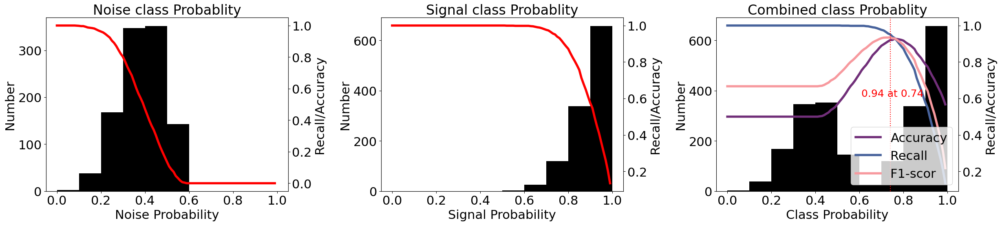

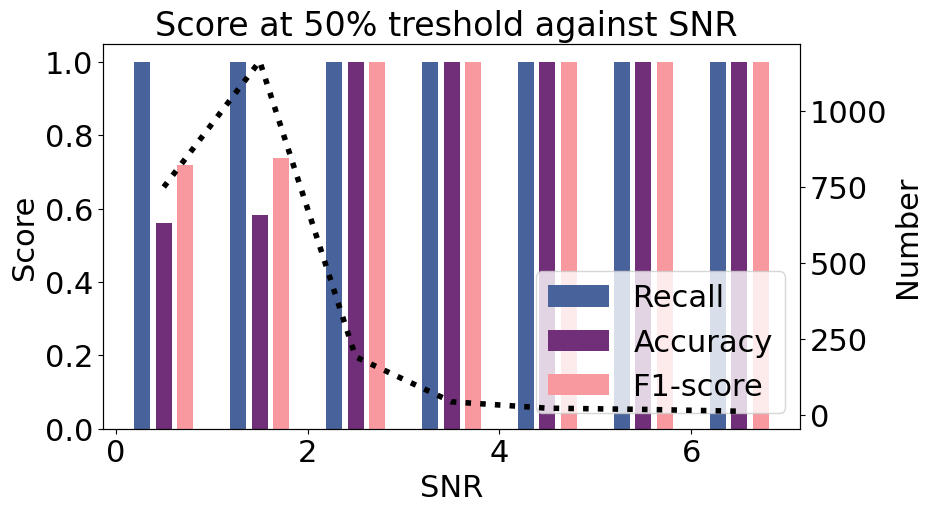

In [14]:
f1,f2, L = plotprobs(pred_list_GPD1,labels)
BestP1['GPD'] = L[0]
BestT1['GPD'] = L[1]
BestA1['GPD'] = L[3]
BestR1['GPD'] = L[2]
f1.savefig("Figure/GPD_Prob_OD.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/GPD_Snr_OD.svg", dpi=100, bbox_inches='tight')

## PhaseNet

In [15]:
# Load the pre-trained PhaseNet model
print(PhaseNet.list_pretrained())
model = PhaseNet.from_pretrained("original")
model.to('cpu:0')


['diting', 'ethz', 'geofon', 'instance', 'iquique', 'jma', 'jma_wc', 'lendb', 'neic', 'obs', 'original', 'phasenet_sn', 'pisdl', 'scedc', 'stead', 'volpick']


PhaseNet(
  (inc): Conv1d(3, 8, kernel_size=(7,), stride=(1,), padding=same)
  (in_bn): BatchNorm1d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (down_branch): ModuleList(
    (0): ModuleList(
      (0): Conv1d(8, 8, kernel_size=(7,), stride=(1,), padding=same, bias=False)
      (1): BatchNorm1d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): Conv1d(8, 8, kernel_size=(7,), stride=(4,), padding=(3,), bias=False)
      (3): BatchNorm1d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): ModuleList(
      (0): Conv1d(8, 16, kernel_size=(7,), stride=(1,), padding=same, bias=False)
      (1): BatchNorm1d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): Conv1d(16, 16, kernel_size=(7,), stride=(4,), bias=False)
      (3): BatchNorm1d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (2): ModuleList(
      (0): Conv1d(16, 32, kernel_size=(7,), stride=(1,

In [16]:


pred_list = []
for i in tqdm(range(len(datasetOD))):
    preds = model.annotate(datasetOD[i][0])
    pred_list.append(max(preds[0].data) )

pred_listPhase1 = np.array(pred_list)

  0%|                                                                                                                                | 0/2193 [00:00<?, ?it/s]

  0%|▏                                                                                                                       | 4/2193 [00:00<00:57, 37.80it/s]

  0%|▍                                                                                                                       | 9/2193 [00:00<01:01, 35.45it/s]

  1%|▋                                                                                                                      | 13/2193 [00:00<01:14, 29.46it/s]

  1%|▉                                                                                                                      | 18/2193 [00:00<01:03, 34.30it/s]

  1%|█▏                                                                                                                     | 22/2193 [00:00<01:07, 32.20it/s]

  1%|█▍                                                                                                                     | 26/2193 [00:00<01:11, 30.20it/s]

  1%|█▋                                                                                                                     | 30/2193 [00:00<01:07, 32.02it/s]

  2%|█▊                                                                                                                     | 34/2193 [00:01<01:06, 32.39it/s]

  2%|██                                                                                                                     | 38/2193 [00:01<01:07, 31.98it/s]

  2%|██▎                                                                                                                    | 42/2193 [00:01<01:13, 29.09it/s]

  2%|██▍                                                                                                                    | 46/2193 [00:01<01:10, 30.31it/s]

  2%|██▋                                                                                                                    | 50/2193 [00:01<01:06, 32.41it/s]

  2%|██▉                                                                                                                    | 54/2193 [00:01<01:06, 31.99it/s]

  3%|███▏                                                                                                                   | 58/2193 [00:01<01:08, 31.15it/s]

  3%|███▎                                                                                                                   | 62/2193 [00:01<01:06, 32.26it/s]

  3%|███▌                                                                                                                   | 66/2193 [00:02<01:09, 30.58it/s]

  3%|███▊                                                                                                                   | 70/2193 [00:02<01:07, 31.31it/s]

  3%|████                                                                                                                   | 74/2193 [00:02<01:14, 28.38it/s]

  4%|████▏                                                                                                                  | 77/2193 [00:02<01:14, 28.47it/s]

  4%|████▍                                                                                                                  | 81/2193 [00:02<01:11, 29.43it/s]

  4%|████▌                                                                                                                  | 84/2193 [00:02<01:23, 25.25it/s]

  4%|████▋                                                                                                                  | 87/2193 [00:02<01:21, 25.84it/s]

  4%|████▉                                                                                                                  | 90/2193 [00:03<01:28, 23.79it/s]

  4%|█████                                                                                                                  | 93/2193 [00:03<01:31, 23.03it/s]

  5%|█████▎                                                                                                                 | 99/2193 [00:03<01:09, 30.08it/s]

  5%|█████▌                                                                                                                | 103/2193 [00:03<01:17, 26.92it/s]

  5%|█████▋                                                                                                                | 106/2193 [00:03<01:18, 26.59it/s]

  5%|█████▉                                                                                                                | 110/2193 [00:03<01:14, 27.81it/s]

  5%|██████                                                                                                                | 113/2193 [00:03<01:13, 28.33it/s]

  5%|██████▎                                                                                                               | 117/2193 [00:03<01:08, 30.12it/s]

  6%|██████▌                                                                                                               | 121/2193 [00:04<01:17, 26.75it/s]

  6%|██████▋                                                                                                               | 124/2193 [00:04<01:22, 25.20it/s]

  6%|██████▉                                                                                                               | 128/2193 [00:04<01:14, 27.82it/s]

  6%|███████                                                                                                               | 132/2193 [00:04<01:16, 26.91it/s]

  6%|███████▎                                                                                                              | 135/2193 [00:04<01:14, 27.48it/s]

  6%|███████▍                                                                                                              | 138/2193 [00:04<01:13, 27.97it/s]

  7%|███████▋                                                                                                              | 143/2193 [00:04<01:01, 33.18it/s]

  7%|███████▉                                                                                                              | 147/2193 [00:05<01:06, 30.81it/s]

  7%|████████                                                                                                              | 151/2193 [00:05<01:05, 30.98it/s]

  7%|████████▎                                                                                                             | 155/2193 [00:05<01:04, 31.62it/s]

  7%|████████▌                                                                                                             | 159/2193 [00:05<01:11, 28.49it/s]

  7%|████████▊                                                                                                             | 163/2193 [00:05<01:07, 30.14it/s]

  8%|████████▉                                                                                                             | 167/2193 [00:05<01:13, 27.47it/s]

  8%|█████████▏                                                                                                            | 171/2193 [00:05<01:08, 29.35it/s]

  8%|█████████▍                                                                                                            | 175/2193 [00:05<01:11, 28.19it/s]

  8%|█████████▌                                                                                                            | 178/2193 [00:06<01:17, 26.15it/s]

  8%|█████████▊                                                                                                            | 182/2193 [00:06<01:09, 28.85it/s]

  8%|█████████▉                                                                                                            | 185/2193 [00:06<01:18, 25.47it/s]

  9%|██████████▏                                                                                                           | 190/2193 [00:06<01:10, 28.40it/s]

  9%|██████████▍                                                                                                           | 193/2193 [00:06<01:24, 23.69it/s]

  9%|██████████▊                                                                                                           | 200/2193 [00:06<01:05, 30.58it/s]

  9%|██████████▉                                                                                                           | 204/2193 [00:07<01:16, 26.04it/s]

  9%|███████████▏                                                                                                          | 208/2193 [00:07<01:14, 26.68it/s]

 10%|███████████▎                                                                                                          | 211/2193 [00:07<01:16, 26.07it/s]

 10%|███████████▌                                                                                                          | 215/2193 [00:07<01:14, 26.68it/s]

 10%|███████████▋                                                                                                          | 218/2193 [00:07<01:18, 25.31it/s]

 10%|███████████▉                                                                                                          | 222/2193 [00:07<01:09, 28.50it/s]

 10%|████████████                                                                                                          | 225/2193 [00:07<01:13, 26.84it/s]

 10%|████████████▎                                                                                                         | 228/2193 [00:07<01:13, 26.89it/s]

 11%|████████████▍                                                                                                         | 232/2193 [00:08<01:05, 29.91it/s]

 11%|████████████▋                                                                                                         | 236/2193 [00:08<01:04, 30.37it/s]

 11%|████████████▉                                                                                                         | 240/2193 [00:08<01:11, 27.43it/s]

 11%|█████████████                                                                                                         | 243/2193 [00:08<01:12, 26.97it/s]

 11%|█████████████▏                                                                                                        | 246/2193 [00:08<01:18, 24.80it/s]

 11%|█████████████▍                                                                                                        | 249/2193 [00:08<01:15, 25.83it/s]

 11%|█████████████▌                                                                                                        | 252/2193 [00:08<01:22, 23.43it/s]

 12%|█████████████▊                                                                                                        | 256/2193 [00:09<01:13, 26.49it/s]

 12%|█████████████▉                                                                                                        | 260/2193 [00:09<01:14, 26.11it/s]

 12%|██████████████▏                                                                                                       | 264/2193 [00:09<01:10, 27.31it/s]

 12%|██████████████▎                                                                                                       | 267/2193 [00:09<01:08, 27.95it/s]

 12%|██████████████▌                                                                                                       | 270/2193 [00:09<01:10, 27.15it/s]

 12%|██████████████▋                                                                                                       | 273/2193 [00:09<01:11, 26.91it/s]

 13%|██████████████▉                                                                                                       | 277/2193 [00:09<01:10, 27.22it/s]

 13%|███████████████                                                                                                       | 281/2193 [00:09<01:04, 29.65it/s]

 13%|███████████████▎                                                                                                      | 285/2193 [00:10<01:10, 26.92it/s]

 13%|███████████████▍                                                                                                      | 288/2193 [00:10<01:16, 24.96it/s]

 13%|███████████████▊                                                                                                      | 293/2193 [00:10<01:05, 29.18it/s]

 14%|███████████████▉                                                                                                      | 297/2193 [00:10<01:15, 25.24it/s]

 14%|████████████████▏                                                                                                     | 302/2193 [00:10<01:04, 29.38it/s]

 14%|████████████████▍                                                                                                     | 306/2193 [00:10<01:16, 24.68it/s]

 14%|████████████████▋                                                                                                     | 310/2193 [00:11<01:11, 26.49it/s]

 14%|████████████████▊                                                                                                     | 313/2193 [00:11<01:10, 26.67it/s]

 14%|█████████████████                                                                                                     | 316/2193 [00:11<01:08, 27.43it/s]

 15%|█████████████████▏                                                                                                    | 319/2193 [00:11<01:10, 26.56it/s]

 15%|█████████████████▎                                                                                                    | 322/2193 [00:11<01:23, 22.48it/s]

 15%|█████████████████▌                                                                                                    | 326/2193 [00:11<01:13, 25.57it/s]

 15%|█████████████████▋                                                                                                    | 329/2193 [00:11<01:16, 24.28it/s]

 15%|█████████████████▊                                                                                                    | 332/2193 [00:11<01:15, 24.79it/s]

 15%|██████████████████                                                                                                    | 336/2193 [00:12<01:11, 25.90it/s]

 15%|██████████████████▏                                                                                                   | 339/2193 [00:12<01:09, 26.53it/s]

 16%|██████████████████▍                                                                                                   | 342/2193 [00:12<01:18, 23.67it/s]

 16%|██████████████████▌                                                                                                   | 345/2193 [00:12<01:23, 22.13it/s]

 16%|██████████████████▊                                                                                                   | 349/2193 [00:12<01:11, 25.97it/s]

 16%|██████████████████▉                                                                                                   | 353/2193 [00:12<01:06, 27.78it/s]

 16%|███████████████████▏                                                                                                  | 356/2193 [00:12<01:13, 25.16it/s]

 16%|███████████████████▎                                                                                                  | 359/2193 [00:12<01:11, 25.68it/s]

 17%|███████████████████▌                                                                                                  | 363/2193 [00:13<01:08, 26.75it/s]

 17%|███████████████████▋                                                                                                  | 366/2193 [00:13<01:12, 25.21it/s]

 17%|███████████████████▊                                                                                                  | 369/2193 [00:13<01:14, 24.48it/s]

 17%|████████████████████                                                                                                  | 372/2193 [00:13<01:15, 24.12it/s]

 17%|████████████████████▏                                                                                                 | 376/2193 [00:13<01:12, 25.19it/s]

 17%|████████████████████▍                                                                                                 | 379/2193 [00:13<01:08, 26.34it/s]

 17%|████████████████████▌                                                                                                 | 382/2193 [00:13<01:10, 25.70it/s]

 18%|████████████████████▊                                                                                                 | 387/2193 [00:14<00:59, 30.11it/s]

 18%|█████████████████████                                                                                                 | 391/2193 [00:14<00:58, 30.88it/s]

 18%|█████████████████████▎                                                                                                | 395/2193 [00:14<01:03, 28.20it/s]

 18%|█████████████████████▍                                                                                                | 398/2193 [00:14<01:05, 27.60it/s]

 18%|█████████████████████▋                                                                                                | 403/2193 [00:14<00:56, 31.43it/s]

 19%|█████████████████████▉                                                                                                | 407/2193 [00:14<01:05, 27.36it/s]

 19%|██████████████████████                                                                                                | 411/2193 [00:14<01:04, 27.63it/s]

 19%|██████████████████████▎                                                                                               | 414/2193 [00:15<01:08, 26.00it/s]

 19%|██████████████████████▌                                                                                               | 419/2193 [00:15<00:57, 31.00it/s]

 19%|██████████████████████▊                                                                                               | 423/2193 [00:15<01:07, 26.27it/s]

 19%|██████████████████████▉                                                                                               | 426/2193 [00:15<01:06, 26.64it/s]

 20%|███████████████████████▏                                                                                              | 430/2193 [00:15<01:01, 28.77it/s]

 20%|███████████████████████▎                                                                                              | 434/2193 [00:15<00:59, 29.67it/s]

 20%|███████████████████████▌                                                                                              | 438/2193 [00:15<01:06, 26.35it/s]

 20%|███████████████████████▋                                                                                              | 441/2193 [00:15<01:05, 26.56it/s]

 20%|███████████████████████▉                                                                                              | 445/2193 [00:16<01:02, 28.05it/s]

 20%|████████████████████████                                                                                              | 448/2193 [00:16<01:02, 27.79it/s]

 21%|████████████████████████▎                                                                                             | 452/2193 [00:16<00:57, 30.09it/s]

 21%|████████████████████████▌                                                                                             | 456/2193 [00:16<01:07, 25.92it/s]

 21%|████████████████████████▊                                                                                             | 462/2193 [00:16<00:53, 32.49it/s]

 21%|█████████████████████████▏                                                                                            | 467/2193 [00:16<00:53, 32.15it/s]

 21%|█████████████████████████▎                                                                                            | 471/2193 [00:16<00:59, 28.77it/s]

 22%|█████████████████████████▌                                                                                            | 475/2193 [00:17<00:56, 30.24it/s]

 22%|█████████████████████████▊                                                                                            | 479/2193 [00:17<01:01, 27.66it/s]

 22%|█████████████████████████▉                                                                                            | 482/2193 [00:17<01:08, 24.84it/s]

 22%|██████████████████████████                                                                                            | 485/2193 [00:17<01:06, 25.59it/s]

 22%|██████████████████████████▎                                                                                           | 488/2193 [00:17<01:09, 24.45it/s]

 22%|██████████████████████████▍                                                                                           | 492/2193 [00:17<01:06, 25.70it/s]

 23%|██████████████████████████▋                                                                                           | 495/2193 [00:17<01:04, 26.31it/s]

 23%|██████████████████████████▊                                                                                           | 498/2193 [00:18<01:04, 26.41it/s]

 23%|██████████████████████████▉                                                                                           | 501/2193 [00:18<01:03, 26.81it/s]

 23%|███████████████████████████                                                                                           | 504/2193 [00:18<01:06, 25.37it/s]

 23%|███████████████████████████▎                                                                                          | 508/2193 [00:18<01:06, 25.19it/s]

 23%|███████████████████████████▌                                                                                          | 512/2193 [00:18<01:03, 26.41it/s]

 23%|███████████████████████████▋                                                                                          | 515/2193 [00:18<01:11, 23.54it/s]

 24%|███████████████████████████▉                                                                                          | 520/2193 [00:18<01:01, 27.26it/s]

 24%|████████████████████████████▏                                                                                         | 523/2193 [00:19<01:06, 25.22it/s]

 24%|████████████████████████████▎                                                                                         | 526/2193 [00:19<01:12, 23.09it/s]

 24%|████████████████████████████▌                                                                                         | 531/2193 [00:19<01:05, 25.48it/s]

 24%|████████████████████████████▊                                                                                         | 535/2193 [00:19<01:01, 27.04it/s]

 25%|████████████████████████████▉                                                                                         | 538/2193 [00:19<01:06, 24.86it/s]

 25%|█████████████████████████████▏                                                                                        | 542/2193 [00:19<00:58, 28.07it/s]

 25%|█████████████████████████████▎                                                                                        | 545/2193 [00:19<01:07, 24.45it/s]

 25%|█████████████████████████████▌                                                                                        | 549/2193 [00:20<01:01, 26.54it/s]

 25%|█████████████████████████████▊                                                                                        | 553/2193 [00:20<00:55, 29.63it/s]

 25%|█████████████████████████████▉                                                                                        | 557/2193 [00:20<00:57, 28.33it/s]

 26%|██████████████████████████████▏                                                                                       | 560/2193 [00:20<00:59, 27.57it/s]

 26%|██████████████████████████████▎                                                                                       | 563/2193 [00:20<01:01, 26.64it/s]

 26%|██████████████████████████████▍                                                                                       | 566/2193 [00:20<00:59, 27.25it/s]

 26%|██████████████████████████████▌                                                                                       | 569/2193 [00:20<00:59, 27.28it/s]

 26%|██████████████████████████████▊                                                                                       | 572/2193 [00:20<00:57, 27.99it/s]

 26%|██████████████████████████████▉                                                                                       | 575/2193 [00:20<01:03, 25.51it/s]

 26%|███████████████████████████████▏                                                                                      | 579/2193 [00:21<00:59, 26.95it/s]

 27%|███████████████████████████████▎                                                                                      | 582/2193 [00:21<00:58, 27.37it/s]

 27%|███████████████████████████████▌                                                                                      | 586/2193 [00:21<00:53, 30.15it/s]

 27%|███████████████████████████████▋                                                                                      | 590/2193 [00:21<00:59, 26.76it/s]

 27%|███████████████████████████████▉                                                                                      | 593/2193 [00:21<01:02, 25.65it/s]

 27%|████████████████████████████████                                                                                      | 597/2193 [00:21<00:58, 27.16it/s]

 27%|████████████████████████████████▎                                                                                     | 600/2193 [00:21<00:59, 26.77it/s]

 28%|████████████████████████████████▍                                                                                     | 604/2193 [00:22<00:56, 28.04it/s]

 28%|████████████████████████████████▋                                                                                     | 607/2193 [00:22<00:57, 27.37it/s]

 28%|████████████████████████████████▉                                                                                     | 611/2193 [00:22<00:54, 28.78it/s]

 28%|█████████████████████████████████                                                                                     | 614/2193 [00:22<00:58, 27.14it/s]

 28%|█████████████████████████████████▏                                                                                    | 617/2193 [00:22<01:02, 25.15it/s]

 28%|█████████████████████████████████▎                                                                                    | 620/2193 [00:22<01:05, 23.95it/s]

 28%|█████████████████████████████████▌                                                                                    | 624/2193 [00:22<01:02, 25.21it/s]

 29%|█████████████████████████████████▋                                                                                    | 627/2193 [00:22<01:00, 25.82it/s]

 29%|█████████████████████████████████▉                                                                                    | 631/2193 [00:23<01:04, 24.22it/s]

 29%|██████████████████████████████████                                                                                    | 634/2193 [00:23<01:02, 25.03it/s]

 29%|██████████████████████████████████▎                                                                                   | 637/2193 [00:23<01:01, 25.19it/s]

 29%|██████████████████████████████████▍                                                                                   | 640/2193 [00:23<00:59, 26.01it/s]

 29%|██████████████████████████████████▋                                                                                   | 644/2193 [00:23<00:56, 27.50it/s]

 30%|██████████████████████████████████▊                                                                                   | 647/2193 [00:23<01:03, 24.26it/s]

 30%|██████████████████████████████████▉                                                                                   | 650/2193 [00:23<01:01, 24.94it/s]

 30%|███████████████████████████████████▏                                                                                  | 653/2193 [00:23<01:00, 25.30it/s]

 30%|███████████████████████████████████▎                                                                                  | 656/2193 [00:24<01:05, 23.55it/s]

 30%|███████████████████████████████████▍                                                                                  | 659/2193 [00:24<01:05, 23.57it/s]

 30%|███████████████████████████████████▋                                                                                  | 663/2193 [00:24<01:05, 23.31it/s]

 30%|███████████████████████████████████▊                                                                                  | 666/2193 [00:24<01:03, 24.04it/s]

 31%|███████████████████████████████████▉                                                                                  | 669/2193 [00:24<01:02, 24.47it/s]

 31%|████████████████████████████████████▏                                                                                 | 672/2193 [00:24<01:00, 25.14it/s]

 31%|████████████████████████████████████▎                                                                                 | 675/2193 [00:24<00:58, 25.79it/s]

 31%|████████████████████████████████████▍                                                                                 | 678/2193 [00:24<01:01, 24.75it/s]

 31%|████████████████████████████████████▋                                                                                 | 681/2193 [00:25<01:03, 23.97it/s]

 31%|████████████████████████████████████▊                                                                                 | 685/2193 [00:25<00:56, 26.74it/s]

 31%|█████████████████████████████████████                                                                                 | 689/2193 [00:25<00:51, 29.48it/s]

 32%|█████████████████████████████████████▏                                                                                | 692/2193 [00:25<00:55, 27.18it/s]

 32%|█████████████████████████████████████▍                                                                                | 696/2193 [00:25<00:50, 29.62it/s]

 32%|█████████████████████████████████████▋                                                                                | 700/2193 [00:25<00:51, 29.14it/s]

 32%|█████████████████████████████████████▉                                                                                | 704/2193 [00:25<00:49, 29.95it/s]

 32%|██████████████████████████████████████                                                                                | 708/2193 [00:26<00:52, 28.11it/s]

 32%|██████████████████████████████████████▎                                                                               | 712/2193 [00:26<00:52, 28.32it/s]

 33%|██████████████████████████████████████▌                                                                               | 716/2193 [00:26<00:51, 28.79it/s]

 33%|██████████████████████████████████████▋                                                                               | 720/2193 [00:26<00:48, 30.23it/s]

 33%|██████████████████████████████████████▉                                                                               | 724/2193 [00:26<00:46, 31.27it/s]

 33%|███████████████████████████████████████▏                                                                              | 728/2193 [00:26<00:46, 31.49it/s]

 33%|███████████████████████████████████████▍                                                                              | 732/2193 [00:26<00:51, 28.10it/s]

 34%|███████████████████████████████████████▋                                                                              | 737/2193 [00:26<00:46, 31.15it/s]

 34%|███████████████████████████████████████▊                                                                              | 741/2193 [00:27<00:51, 28.15it/s]

 34%|████████████████████████████████████████                                                                              | 744/2193 [00:27<00:50, 28.49it/s]

 34%|████████████████████████████████████████▏                                                                             | 747/2193 [00:27<00:55, 26.12it/s]

 34%|████████████████████████████████████████▍                                                                             | 751/2193 [00:27<00:51, 27.82it/s]

 34%|████████████████████████████████████████▌                                                                             | 754/2193 [00:27<00:58, 24.80it/s]

 35%|████████████████████████████████████████▊                                                                             | 758/2193 [00:27<00:55, 25.86it/s]

 35%|████████████████████████████████████████▉                                                                             | 761/2193 [00:27<01:00, 23.53it/s]

 35%|█████████████████████████████████████████                                                                             | 764/2193 [00:28<01:01, 23.36it/s]

 35%|█████████████████████████████████████████▎                                                                            | 767/2193 [00:28<00:57, 24.88it/s]

 35%|█████████████████████████████████████████▍                                                                            | 770/2193 [00:28<01:02, 22.92it/s]

 35%|█████████████████████████████████████████▌                                                                            | 773/2193 [00:28<00:59, 23.76it/s]

 35%|█████████████████████████████████████████▊                                                                            | 777/2193 [00:28<00:55, 25.69it/s]

 36%|██████████████████████████████████████████                                                                            | 782/2193 [00:28<00:48, 28.85it/s]

 36%|██████████████████████████████████████████▏                                                                           | 785/2193 [00:28<00:58, 23.90it/s]

 36%|██████████████████████████████████████████▍                                                                           | 789/2193 [00:29<00:53, 26.35it/s]

 36%|██████████████████████████████████████████▌                                                                           | 792/2193 [00:29<01:01, 22.95it/s]

 36%|██████████████████████████████████████████▊                                                                           | 796/2193 [00:29<00:54, 25.77it/s]

 36%|██████████████████████████████████████████▉                                                                           | 799/2193 [00:29<00:54, 25.35it/s]

 37%|███████████████████████████████████████████▏                                                                          | 802/2193 [00:29<00:54, 25.34it/s]

 37%|███████████████████████████████████████████▎                                                                          | 806/2193 [00:29<00:50, 27.59it/s]

 37%|███████████████████████████████████████████▌                                                                          | 809/2193 [00:29<00:55, 25.06it/s]

 37%|███████████████████████████████████████████▊                                                                          | 814/2193 [00:29<00:48, 28.68it/s]

 37%|███████████████████████████████████████████▉                                                                          | 817/2193 [00:30<00:58, 23.62it/s]

 37%|████████████████████████████████████████████                                                                          | 820/2193 [00:30<00:57, 23.69it/s]

 38%|████████████████████████████████████████████▎                                                                         | 824/2193 [00:30<00:49, 27.41it/s]

 38%|████████████████████████████████████████████▌                                                                         | 828/2193 [00:30<00:47, 28.97it/s]

 38%|████████████████████████████████████████████▊                                                                         | 832/2193 [00:30<00:51, 26.27it/s]

 38%|████████████████████████████████████████████▉                                                                         | 836/2193 [00:30<00:48, 27.93it/s]

 38%|█████████████████████████████████████████████▏                                                                        | 840/2193 [00:30<00:48, 27.80it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 843/2193 [00:31<00:53, 25.37it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 847/2193 [00:31<00:48, 28.02it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 850/2193 [00:31<00:47, 28.16it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 853/2193 [00:31<00:48, 27.51it/s]

 39%|██████████████████████████████████████████████                                                                        | 857/2193 [00:31<00:43, 30.58it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 862/2193 [00:31<00:40, 32.51it/s]

 39%|██████████████████████████████████████████████▌                                                                       | 866/2193 [00:31<00:44, 29.56it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 870/2193 [00:32<00:54, 24.21it/s]

 40%|███████████████████████████████████████████████                                                                       | 875/2193 [00:32<00:45, 28.81it/s]

 40%|███████████████████████████████████████████████▎                                                                      | 879/2193 [00:32<00:46, 28.54it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 883/2193 [00:32<00:48, 26.99it/s]

 40%|███████████████████████████████████████████████▋                                                                      | 886/2193 [00:32<00:51, 25.25it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 890/2193 [00:32<00:50, 25.73it/s]

 41%|████████████████████████████████████████████████                                                                      | 893/2193 [00:32<00:54, 24.06it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 896/2193 [00:33<00:51, 25.20it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 899/2193 [00:33<00:49, 26.28it/s]

 41%|████████████████████████████████████████████████▌                                                                     | 902/2193 [00:33<00:48, 26.72it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 905/2193 [00:33<00:46, 27.46it/s]

 41%|████████████████████████████████████████████████▊                                                                     | 908/2193 [00:33<00:51, 25.08it/s]

 42%|█████████████████████████████████████████████████                                                                     | 911/2193 [00:33<00:48, 26.19it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 914/2193 [00:33<00:52, 24.58it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 917/2193 [00:33<00:49, 25.65it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 920/2193 [00:33<00:47, 26.78it/s]

 42%|█████████████████████████████████████████████████▋                                                                    | 923/2193 [00:34<00:50, 24.99it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 928/2193 [00:34<00:44, 28.54it/s]

 42%|██████████████████████████████████████████████████                                                                    | 931/2193 [00:34<00:47, 26.62it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 936/2193 [00:34<00:39, 31.44it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 940/2193 [00:34<00:40, 31.27it/s]

 43%|██████████████████████████████████████████████████▊                                                                   | 944/2193 [00:34<00:43, 28.47it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 947/2193 [00:34<00:43, 28.44it/s]

 43%|███████████████████████████████████████████████████                                                                   | 950/2193 [00:35<00:43, 28.39it/s]

 44%|███████████████████████████████████████████████████▎                                                                  | 954/2193 [00:35<00:39, 31.06it/s]

 44%|███████████████████████████████████████████████████▌                                                                  | 958/2193 [00:35<00:44, 27.50it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 963/2193 [00:35<00:39, 31.17it/s]

 44%|████████████████████████████████████████████████████                                                                  | 967/2193 [00:35<00:41, 29.82it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 971/2193 [00:35<00:40, 30.52it/s]

 44%|████████████████████████████████████████████████████▍                                                                 | 975/2193 [00:35<00:44, 27.39it/s]

 45%|████████████████████████████████████████████████████▋                                                                 | 979/2193 [00:36<00:43, 27.64it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 983/2193 [00:36<00:40, 30.22it/s]

 45%|█████████████████████████████████████████████████████                                                                 | 987/2193 [00:36<00:37, 31.95it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 991/2193 [00:36<00:40, 29.47it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 995/2193 [00:36<00:40, 29.27it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 999/2193 [00:36<00:40, 29.56it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 1003/2193 [00:36<00:41, 28.59it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 1006/2193 [00:36<00:49, 24.20it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 1009/2193 [00:37<00:48, 24.42it/s]

 46%|██████████████████████████████████████████████████████                                                               | 1013/2193 [00:37<00:43, 27.35it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 1016/2193 [00:37<00:44, 26.56it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 1020/2193 [00:37<00:39, 29.51it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 1024/2193 [00:37<00:48, 24.16it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 1029/2193 [00:37<00:40, 29.01it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1033/2193 [00:37<00:45, 25.63it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1036/2193 [00:38<00:45, 25.51it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1039/2193 [00:38<00:47, 24.27it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 1042/2193 [00:38<00:45, 25.17it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1045/2193 [00:38<00:45, 25.36it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1049/2193 [00:38<00:40, 28.59it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1052/2193 [00:38<00:43, 25.94it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1055/2193 [00:38<00:49, 22.79it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1058/2193 [00:39<00:48, 23.40it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 1061/2193 [00:39<00:48, 23.22it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1065/2193 [00:39<00:42, 26.25it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1068/2193 [00:39<00:42, 26.64it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1071/2193 [00:39<00:44, 25.19it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1075/2193 [00:39<00:41, 26.71it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1079/2193 [00:39<00:38, 29.02it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 1082/2193 [00:39<00:42, 26.18it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 1085/2193 [00:40<00:41, 26.99it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 1089/2193 [00:40<00:42, 25.92it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1094/2193 [00:40<00:36, 30.10it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 1098/2193 [00:40<00:38, 28.44it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 1102/2193 [00:40<00:38, 28.18it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 1105/2193 [00:40<00:41, 26.05it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1109/2193 [00:40<00:40, 26.52it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 1112/2193 [00:41<00:41, 25.81it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1115/2193 [00:41<00:41, 25.92it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1119/2193 [00:41<00:37, 28.84it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1122/2193 [00:41<00:37, 28.19it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1126/2193 [00:41<00:35, 30.44it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 1130/2193 [00:41<00:39, 26.81it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1134/2193 [00:41<00:36, 28.63it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 1137/2193 [00:41<00:38, 27.70it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1140/2193 [00:42<00:42, 24.51it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1144/2193 [00:42<00:37, 27.94it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1147/2193 [00:42<00:40, 25.58it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 1150/2193 [00:42<00:42, 24.35it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1153/2193 [00:42<00:40, 25.43it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 1157/2193 [00:42<00:40, 25.54it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1161/2193 [00:42<00:37, 27.31it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1164/2193 [00:42<00:40, 25.11it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1168/2193 [00:43<00:37, 27.56it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1171/2193 [00:43<00:37, 27.23it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1174/2193 [00:43<00:37, 27.46it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1177/2193 [00:43<00:39, 25.87it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1181/2193 [00:43<00:37, 27.22it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 1184/2193 [00:43<00:41, 24.54it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1188/2193 [00:43<00:36, 27.51it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1192/2193 [00:43<00:37, 26.38it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 1196/2193 [00:44<00:34, 29.30it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 1200/2193 [00:44<00:33, 29.54it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1204/2193 [00:44<00:37, 26.13it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 1207/2193 [00:44<00:39, 25.14it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1211/2193 [00:44<00:36, 26.68it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 1215/2193 [00:44<00:37, 26.03it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 1218/2193 [00:44<00:38, 25.64it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1221/2193 [00:45<00:38, 25.51it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1225/2193 [00:45<00:34, 28.07it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1229/2193 [00:45<00:32, 29.72it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 1233/2193 [00:45<00:33, 29.05it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1236/2193 [00:45<00:39, 24.37it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1241/2193 [00:45<00:32, 29.67it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1245/2193 [00:45<00:36, 26.32it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1250/2193 [00:46<00:37, 24.99it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1254/2193 [00:46<00:34, 26.98it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 1258/2193 [00:46<00:31, 29.27it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 1262/2193 [00:46<00:34, 26.62it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1265/2193 [00:46<00:35, 26.21it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 1268/2193 [00:46<00:37, 24.44it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1271/2193 [00:46<00:36, 25.35it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1274/2193 [00:47<00:36, 25.17it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1278/2193 [00:47<00:35, 25.77it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1281/2193 [00:47<00:36, 24.92it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1284/2193 [00:47<00:35, 25.48it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 1288/2193 [00:47<00:31, 28.29it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1293/2193 [00:47<00:29, 30.33it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1297/2193 [00:47<00:30, 29.09it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1301/2193 [00:48<00:30, 29.13it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 1304/2193 [00:48<00:34, 25.66it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1308/2193 [00:48<00:35, 25.05it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1311/2193 [00:48<00:34, 25.62it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 1314/2193 [00:48<00:36, 23.79it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 1320/2193 [00:48<00:30, 28.96it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1324/2193 [00:48<00:27, 31.06it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 1328/2193 [00:49<00:31, 27.74it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1332/2193 [00:49<00:29, 29.03it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 1335/2193 [00:49<00:30, 28.06it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1338/2193 [00:49<00:30, 27.59it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1341/2193 [00:49<00:30, 27.60it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 1344/2193 [00:49<00:30, 28.08it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1347/2193 [00:49<00:30, 27.47it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1350/2193 [00:49<00:32, 25.56it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1353/2193 [00:49<00:31, 26.48it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1356/2193 [00:50<00:33, 24.91it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1359/2193 [00:50<00:36, 22.75it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1362/2193 [00:50<00:34, 23.83it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 1365/2193 [00:50<00:37, 22.18it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 1369/2193 [00:50<00:32, 25.70it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1372/2193 [00:50<00:34, 23.69it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1375/2193 [00:50<00:33, 24.36it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 1378/2193 [00:51<00:33, 24.16it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1381/2193 [00:51<00:33, 24.60it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1384/2193 [00:51<00:39, 20.29it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 1391/2193 [00:51<00:25, 30.99it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1395/2193 [00:51<00:27, 28.71it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1399/2193 [00:51<00:29, 27.16it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1402/2193 [00:51<00:31, 24.78it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 1405/2193 [00:52<00:32, 23.91it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1409/2193 [00:52<00:30, 25.51it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 1412/2193 [00:52<00:36, 21.30it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 1417/2193 [00:52<00:28, 27.03it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1421/2193 [00:52<00:31, 24.56it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 1425/2193 [00:52<00:28, 26.86it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1428/2193 [00:52<00:29, 25.84it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1431/2193 [00:53<00:29, 25.99it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1434/2193 [00:53<00:28, 26.64it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 1438/2193 [00:53<00:27, 27.23it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1441/2193 [00:53<00:30, 24.78it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1444/2193 [00:53<00:32, 22.78it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1447/2193 [00:53<00:39, 18.97it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1450/2193 [00:53<00:36, 20.24it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1454/2193 [00:54<00:30, 24.47it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1457/2193 [00:54<00:29, 25.13it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 1461/2193 [00:54<00:27, 26.93it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 1465/2193 [00:54<00:26, 27.62it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1468/2193 [00:54<00:27, 26.38it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 1471/2193 [00:54<00:26, 26.98it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1475/2193 [00:54<00:25, 28.62it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1480/2193 [00:54<00:22, 31.72it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1484/2193 [00:55<00:27, 25.77it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 1487/2193 [00:55<00:26, 26.41it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1491/2193 [00:55<00:26, 26.48it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1494/2193 [00:55<00:27, 25.23it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1497/2193 [00:55<00:28, 24.29it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 1500/2193 [00:55<00:32, 21.09it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1506/2193 [00:56<00:24, 27.88it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1509/2193 [00:56<00:28, 23.80it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1513/2193 [00:56<00:25, 27.14it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 1516/2193 [00:56<00:24, 27.75it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 1519/2193 [00:56<00:25, 25.96it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1522/2193 [00:56<00:25, 26.37it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1525/2193 [00:56<00:26, 25.08it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1528/2193 [00:56<00:25, 25.99it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1531/2193 [00:57<00:26, 25.17it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 1536/2193 [00:57<00:25, 26.18it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1540/2193 [00:57<00:22, 28.95it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1544/2193 [00:57<00:22, 28.48it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1547/2193 [00:57<00:23, 26.95it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1550/2193 [00:57<00:24, 26.67it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1553/2193 [00:57<00:24, 25.88it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1556/2193 [00:57<00:24, 25.65it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1561/2193 [00:58<00:21, 29.58it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1564/2193 [00:58<00:23, 27.21it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 1568/2193 [00:58<00:21, 29.27it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1571/2193 [00:58<00:22, 28.12it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1574/2193 [00:58<00:21, 28.20it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 1577/2193 [00:58<00:23, 26.21it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1580/2193 [00:58<00:25, 23.94it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1583/2193 [00:58<00:27, 22.39it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 1587/2193 [00:59<00:23, 25.80it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1591/2193 [00:59<00:22, 26.67it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1595/2193 [00:59<00:21, 27.20it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1598/2193 [00:59<00:23, 25.70it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 1601/2193 [00:59<00:25, 23.35it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1606/2193 [00:59<00:21, 27.78it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1609/2193 [00:59<00:20, 27.82it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1612/2193 [01:00<00:23, 24.88it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1615/2193 [01:00<00:22, 25.53it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1618/2193 [01:00<00:22, 25.65it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1621/2193 [01:00<00:24, 23.68it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1626/2193 [01:00<00:19, 28.39it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1629/2193 [01:00<00:22, 25.61it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1633/2193 [01:00<00:19, 28.48it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 1636/2193 [01:00<00:20, 27.81it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1640/2193 [01:01<00:18, 29.51it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1644/2193 [01:01<00:19, 27.74it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1647/2193 [01:01<00:20, 26.87it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1651/2193 [01:01<00:21, 25.28it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 1655/2193 [01:01<00:19, 27.38it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1658/2193 [01:01<00:23, 22.66it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 1662/2193 [01:01<00:21, 25.11it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1666/2193 [01:02<00:20, 26.29it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1669/2193 [01:02<00:20, 25.22it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1672/2193 [01:02<00:19, 26.20it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1675/2193 [01:02<00:19, 25.92it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 1678/2193 [01:02<00:19, 26.76it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1681/2193 [01:02<00:20, 25.33it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 1684/2193 [01:02<00:20, 24.36it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1687/2193 [01:02<00:20, 24.59it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 1690/2193 [01:03<00:21, 23.84it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1694/2193 [01:03<00:20, 24.91it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1698/2193 [01:03<00:19, 25.42it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1703/2193 [01:03<00:17, 27.36it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1706/2193 [01:03<00:18, 25.92it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1709/2193 [01:03<00:19, 24.92it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1712/2193 [01:03<00:19, 24.33it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1715/2193 [01:04<00:19, 24.44it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1718/2193 [01:04<00:19, 24.97it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 1723/2193 [01:04<00:16, 27.76it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1726/2193 [01:04<00:16, 27.70it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1729/2193 [01:04<00:17, 26.34it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1733/2193 [01:04<00:16, 27.82it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1736/2193 [01:04<00:16, 27.38it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1740/2193 [01:04<00:15, 28.82it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 1744/2193 [01:05<00:15, 28.46it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1747/2193 [01:05<00:16, 26.67it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1750/2193 [01:05<00:17, 25.28it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1753/2193 [01:05<00:16, 26.30it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1756/2193 [01:05<00:20, 21.31it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1760/2193 [01:05<00:17, 25.33it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1763/2193 [01:05<00:16, 26.15it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1766/2193 [01:05<00:16, 26.01it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1769/2193 [01:06<00:17, 24.32it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1772/2193 [01:06<00:16, 24.92it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1775/2193 [01:06<00:16, 25.60it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1779/2193 [01:06<00:15, 27.35it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1782/2193 [01:06<00:15, 26.69it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1785/2193 [01:06<00:15, 26.34it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1789/2193 [01:06<00:13, 29.05it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1792/2193 [01:06<00:15, 25.95it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1795/2193 [01:07<00:16, 24.17it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1799/2193 [01:07<00:15, 24.70it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1802/2193 [01:07<00:15, 25.59it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1807/2193 [01:07<00:13, 29.55it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1810/2193 [01:07<00:14, 26.73it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1814/2193 [01:07<00:13, 28.42it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1817/2193 [01:07<00:13, 28.00it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 1820/2193 [01:08<00:14, 26.04it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1823/2193 [01:08<00:15, 23.31it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1828/2193 [01:08<00:12, 28.50it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1831/2193 [01:08<00:13, 27.36it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1834/2193 [01:08<00:13, 27.16it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1838/2193 [01:08<00:12, 28.34it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1841/2193 [01:08<00:13, 26.11it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1846/2193 [01:08<00:11, 30.35it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1850/2193 [01:09<00:13, 25.53it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1853/2193 [01:09<00:12, 26.26it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1856/2193 [01:09<00:12, 26.76it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1859/2193 [01:09<00:12, 26.75it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1862/2193 [01:09<00:12, 26.18it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1866/2193 [01:09<00:11, 27.60it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1870/2193 [01:09<00:10, 30.43it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1874/2193 [01:10<00:12, 26.02it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1877/2193 [01:10<00:13, 24.30it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1882/2193 [01:10<00:11, 26.68it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1888/2193 [01:10<00:09, 30.59it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1892/2193 [01:10<00:10, 29.29it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1895/2193 [01:10<00:10, 27.71it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1898/2193 [01:10<00:10, 28.10it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1901/2193 [01:10<00:10, 26.93it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1905/2193 [01:11<00:10, 26.93it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1909/2193 [01:11<00:11, 25.50it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1913/2193 [01:11<00:10, 27.86it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1918/2193 [01:11<00:08, 31.60it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1922/2193 [01:11<00:08, 31.04it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1926/2193 [01:11<00:08, 30.00it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1930/2193 [01:11<00:09, 29.13it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1933/2193 [01:12<00:09, 27.69it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1936/2193 [01:12<00:09, 26.61it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1939/2193 [01:12<00:09, 25.86it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1943/2193 [01:12<00:09, 26.38it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1946/2193 [01:12<00:09, 24.78it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1949/2193 [01:12<00:09, 25.12it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1952/2193 [01:12<00:09, 25.94it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1955/2193 [01:12<00:09, 25.83it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1958/2193 [01:13<00:09, 23.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1963/2193 [01:13<00:08, 28.28it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1966/2193 [01:13<00:09, 24.41it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1971/2193 [01:13<00:07, 28.72it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1974/2193 [01:13<00:08, 26.02it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1977/2193 [01:13<00:08, 26.11it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1981/2193 [01:13<00:07, 27.92it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1984/2193 [01:14<00:08, 25.74it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1988/2193 [01:14<00:07, 29.02it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1992/2193 [01:14<00:07, 28.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1995/2193 [01:14<00:08, 24.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1998/2193 [01:14<00:07, 25.30it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2002/2193 [01:14<00:07, 26.18it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 2005/2193 [01:14<00:07, 24.63it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2009/2193 [01:15<00:06, 26.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 2012/2193 [01:15<00:07, 24.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 2015/2193 [01:15<00:07, 25.42it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2019/2193 [01:15<00:06, 27.58it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2022/2193 [01:15<00:06, 26.44it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 2026/2193 [01:15<00:05, 28.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2030/2193 [01:15<00:05, 29.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 2033/2193 [01:15<00:05, 27.88it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2036/2193 [01:15<00:05, 27.86it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 2039/2193 [01:16<00:05, 26.23it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2042/2193 [01:16<00:05, 25.88it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 2046/2193 [01:16<00:05, 28.88it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2049/2193 [01:16<00:05, 28.21it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 2052/2193 [01:16<00:05, 27.27it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 2056/2193 [01:16<00:04, 28.76it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 2059/2193 [01:16<00:05, 26.23it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2062/2193 [01:16<00:04, 26.32it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2067/2193 [01:17<00:04, 28.19it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2070/2193 [01:17<00:04, 27.72it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2074/2193 [01:17<00:04, 28.64it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2077/2193 [01:17<00:04, 27.82it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2080/2193 [01:17<00:04, 28.16it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2083/2193 [01:17<00:04, 27.14it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2087/2193 [01:17<00:03, 26.67it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2092/2193 [01:17<00:03, 31.01it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2096/2193 [01:18<00:03, 29.15it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2099/2193 [01:18<00:03, 28.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2103/2193 [01:18<00:02, 31.19it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2107/2193 [01:18<00:02, 30.25it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 2111/2193 [01:18<00:02, 27.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2115/2193 [01:18<00:02, 29.23it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2119/2193 [01:18<00:02, 28.56it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2123/2193 [01:19<00:02, 25.17it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 2126/2193 [01:19<00:02, 26.19it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2130/2193 [01:19<00:02, 28.96it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2134/2193 [01:19<00:02, 27.96it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2137/2193 [01:19<00:02, 26.93it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2140/2193 [01:19<00:01, 27.05it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2144/2193 [01:19<00:01, 28.44it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2147/2193 [01:19<00:01, 27.77it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2150/2193 [01:20<00:01, 24.87it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2154/2193 [01:20<00:01, 27.33it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 2157/2193 [01:20<00:01, 26.25it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2160/2193 [01:20<00:01, 26.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2164/2193 [01:20<00:01, 28.94it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2168/2193 [01:20<00:00, 31.21it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2172/2193 [01:20<00:00, 27.19it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2175/2193 [01:20<00:00, 27.52it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2179/2193 [01:21<00:00, 29.47it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2183/2193 [01:21<00:00, 29.46it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2187/2193 [01:21<00:00, 26.05it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 2190/2193 [01:21<00:00, 25.58it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [01:21<00:00, 25.25it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [01:21<00:00, 26.85it/s]

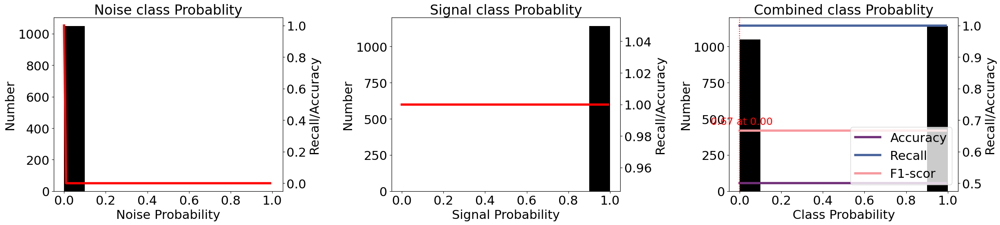

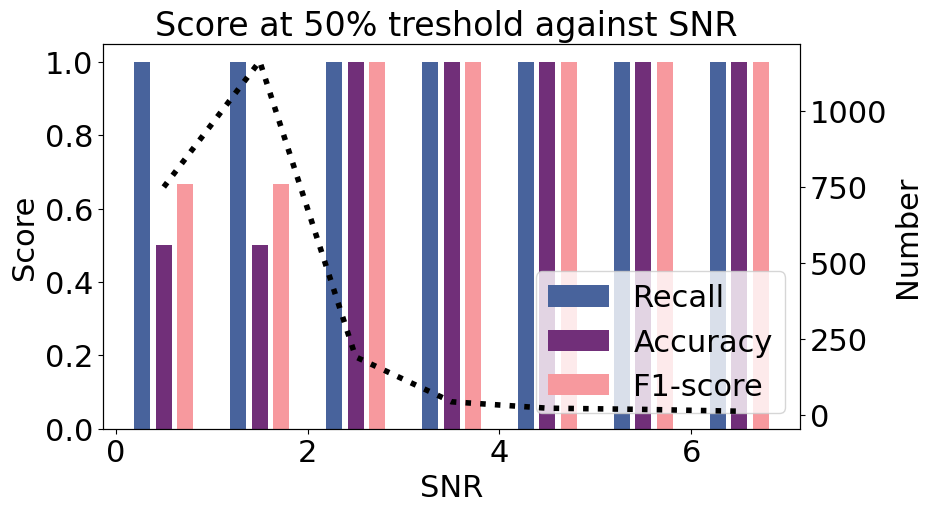

In [17]:
f1,f2, L = plotprobs(pred_listPhase1,labels)
BestP1['PhaseNet'] = L[0]
BestT1['PhaseNet'] = L[1]
BestA1['PhaseNet'] = L[3]
BestR1['PhaseNet'] = L[2]
f1.savefig("Figure/PhaseNet_Prob_OD.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/PhaseNet_Snr_OD.svg", dpi=100, bbox_inches='tight')

## OBSTransformer

In [18]:
# Load the pre-trained model
print(OBSTransformer.list_pretrained())
model = OBSTransformer.from_pretrained("obst2024")
model.to('cpu:0')

['obst2024']


OBSTransformer(
  (encoder): Encoder(
    (convs): ModuleList(
      (0): Conv1d(3, 8, kernel_size=(11,), stride=(1,), padding=(5,))
      (1): Conv1d(8, 16, kernel_size=(9,), stride=(1,), padding=(4,))
      (2): Conv1d(16, 16, kernel_size=(7,), stride=(1,), padding=(3,))
      (3): Conv1d(16, 32, kernel_size=(7,), stride=(1,), padding=(3,))
      (4): Conv1d(32, 32, kernel_size=(5,), stride=(1,), padding=(2,))
      (5): Conv1d(32, 64, kernel_size=(5,), stride=(1,), padding=(2,))
      (6): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    )
    (pools): ModuleList(
      (0-6): 7 x MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (res_cnn_stack): ResCNNStack(
    (members): ModuleList(
      (0-3): 4 x ResCNNBlock(
        (dropout): SpatialDropout1d(
          (dropout): Dropout2d(p=0.2, inplace=False)
        )
        (norm1): BatchNorm1d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (conv1): Conv1d

In [19]:
%autoawait on
pred_list = []
for i in tqdm(range(len(datasetOD))):
    preds = model.annotate(datasetOD[i][0])
    pred_list.append(max(preds[0].data) )

pred_list_OBS1 = np.array(pred_list)

  0%|                                                                                                                                | 0/2193 [00:00<?, ?it/s]

  0%|▏                                                                                                                       | 3/2193 [00:00<02:02, 17.88it/s]

  0%|▎                                                                                                                       | 5/2193 [00:00<02:32, 14.39it/s]

  0%|▍                                                                                                                       | 7/2193 [00:00<02:31, 14.41it/s]

  0%|▍                                                                                                                       | 9/2193 [00:00<02:42, 13.46it/s]

  1%|▌                                                                                                                      | 11/2193 [00:00<02:48, 12.91it/s]

  1%|▋                                                                                                                      | 13/2193 [00:00<02:50, 12.75it/s]

  1%|▊                                                                                                                      | 15/2193 [00:01<02:46, 13.10it/s]

  1%|▉                                                                                                                      | 17/2193 [00:01<02:46, 13.09it/s]

  1%|█                                                                                                                      | 19/2193 [00:01<02:50, 12.76it/s]

  1%|█▏                                                                                                                     | 21/2193 [00:01<02:51, 12.65it/s]

  1%|█▏                                                                                                                     | 23/2193 [00:01<02:42, 13.38it/s]

  1%|█▎                                                                                                                     | 25/2193 [00:01<02:46, 13.01it/s]

  1%|█▍                                                                                                                     | 27/2193 [00:02<02:59, 12.05it/s]

  1%|█▌                                                                                                                     | 29/2193 [00:02<02:48, 12.86it/s]

  1%|█▋                                                                                                                     | 31/2193 [00:02<02:45, 13.07it/s]

  2%|█▊                                                                                                                     | 33/2193 [00:02<02:46, 12.98it/s]

  2%|█▉                                                                                                                     | 35/2193 [00:02<02:42, 13.28it/s]

  2%|██                                                                                                                     | 37/2193 [00:02<03:02, 11.81it/s]

  2%|██                                                                                                                     | 39/2193 [00:03<03:15, 11.04it/s]

  2%|██▏                                                                                                                    | 41/2193 [00:03<03:04, 11.66it/s]

  2%|██▎                                                                                                                    | 43/2193 [00:03<02:50, 12.63it/s]

  2%|██▍                                                                                                                    | 45/2193 [00:03<02:44, 13.09it/s]

  2%|██▌                                                                                                                    | 47/2193 [00:03<02:47, 12.81it/s]

  2%|██▋                                                                                                                    | 49/2193 [00:03<02:32, 14.04it/s]

  2%|██▊                                                                                                                    | 51/2193 [00:03<02:34, 13.85it/s]

  2%|██▉                                                                                                                    | 53/2193 [00:04<03:01, 11.78it/s]

  3%|██▉                                                                                                                    | 55/2193 [00:04<02:51, 12.49it/s]

  3%|███                                                                                                                    | 57/2193 [00:04<03:11, 11.16it/s]

  3%|███▎                                                                                                                   | 60/2193 [00:04<02:37, 13.54it/s]

  3%|███▎                                                                                                                   | 62/2193 [00:04<02:55, 12.14it/s]

  3%|███▍                                                                                                                   | 64/2193 [00:05<02:55, 12.16it/s]

  3%|███▌                                                                                                                   | 66/2193 [00:05<03:13, 11.01it/s]

  3%|███▋                                                                                                                   | 68/2193 [00:05<02:49, 12.56it/s]

  3%|███▊                                                                                                                   | 70/2193 [00:05<02:45, 12.82it/s]

  3%|███▉                                                                                                                   | 72/2193 [00:05<02:49, 12.49it/s]

  3%|████                                                                                                                   | 75/2193 [00:05<02:21, 14.99it/s]

  4%|████▏                                                                                                                  | 77/2193 [00:05<02:18, 15.29it/s]

  4%|████▎                                                                                                                  | 79/2193 [00:06<02:20, 15.05it/s]

  4%|████▍                                                                                                                  | 81/2193 [00:06<02:13, 15.87it/s]

  4%|████▌                                                                                                                  | 83/2193 [00:06<02:23, 14.66it/s]

  4%|████▌                                                                                                                  | 85/2193 [00:06<02:28, 14.15it/s]

  4%|████▋                                                                                                                  | 87/2193 [00:06<02:27, 14.30it/s]

  4%|████▊                                                                                                                  | 89/2193 [00:06<02:24, 14.57it/s]

  4%|████▉                                                                                                                  | 91/2193 [00:06<02:42, 12.96it/s]

  4%|█████                                                                                                                  | 93/2193 [00:07<02:30, 13.92it/s]

  4%|█████▏                                                                                                                 | 95/2193 [00:07<02:50, 12.28it/s]

  4%|█████▎                                                                                                                 | 97/2193 [00:07<03:10, 11.03it/s]

  5%|█████▎                                                                                                                 | 99/2193 [00:07<02:56, 11.87it/s]

  5%|█████▍                                                                                                                | 101/2193 [00:07<02:59, 11.63it/s]

  5%|█████▌                                                                                                                | 103/2193 [00:07<02:52, 12.11it/s]

  5%|█████▋                                                                                                                | 105/2193 [00:08<03:04, 11.32it/s]

  5%|█████▊                                                                                                                | 107/2193 [00:08<03:04, 11.31it/s]

  5%|█████▊                                                                                                                | 109/2193 [00:08<03:24, 10.17it/s]

  5%|█████▉                                                                                                                | 111/2193 [00:08<03:26, 10.07it/s]

  5%|██████                                                                                                                | 113/2193 [00:09<03:28,  9.97it/s]

  5%|██████▏                                                                                                               | 115/2193 [00:09<03:36,  9.59it/s]

  5%|██████▏                                                                                                               | 116/2193 [00:09<03:39,  9.47it/s]

  5%|██████▎                                                                                                               | 118/2193 [00:09<03:42,  9.31it/s]

  5%|██████▍                                                                                                               | 119/2193 [00:09<03:46,  9.14it/s]

  6%|██████▌                                                                                                               | 121/2193 [00:09<03:42,  9.29it/s]

  6%|██████▌                                                                                                               | 123/2193 [00:10<03:19, 10.40it/s]

  6%|██████▋                                                                                                               | 125/2193 [00:10<03:13, 10.69it/s]

  6%|██████▊                                                                                                               | 127/2193 [00:10<03:16, 10.54it/s]

  6%|██████▉                                                                                                               | 129/2193 [00:10<02:50, 12.07it/s]

  6%|███████                                                                                                               | 131/2193 [00:10<02:59, 11.48it/s]

  6%|███████▏                                                                                                              | 133/2193 [00:10<02:58, 11.53it/s]

  6%|███████▎                                                                                                              | 135/2193 [00:11<02:46, 12.33it/s]

  6%|███████▎                                                                                                              | 137/2193 [00:11<02:52, 11.89it/s]

  6%|███████▍                                                                                                              | 139/2193 [00:11<02:50, 12.05it/s]

  6%|███████▌                                                                                                              | 141/2193 [00:11<02:47, 12.26it/s]

  7%|███████▋                                                                                                              | 143/2193 [00:11<02:46, 12.31it/s]

  7%|███████▊                                                                                                              | 145/2193 [00:11<02:47, 12.23it/s]

  7%|███████▉                                                                                                              | 147/2193 [00:12<02:55, 11.69it/s]

  7%|████████                                                                                                              | 149/2193 [00:12<02:41, 12.69it/s]

  7%|████████                                                                                                              | 151/2193 [00:12<02:36, 13.05it/s]

  7%|████████▏                                                                                                             | 153/2193 [00:12<02:32, 13.34it/s]

  7%|████████▎                                                                                                             | 155/2193 [00:12<02:41, 12.63it/s]

  7%|████████▍                                                                                                             | 157/2193 [00:12<02:43, 12.44it/s]

  7%|████████▌                                                                                                             | 159/2193 [00:12<02:36, 12.98it/s]

  7%|████████▋                                                                                                             | 161/2193 [00:13<02:23, 14.13it/s]

  7%|████████▊                                                                                                             | 163/2193 [00:13<02:23, 14.13it/s]

  8%|████████▉                                                                                                             | 165/2193 [00:13<02:28, 13.64it/s]

  8%|████████▉                                                                                                             | 167/2193 [00:13<02:35, 13.04it/s]

  8%|█████████                                                                                                             | 169/2193 [00:13<02:36, 12.90it/s]

  8%|█████████▏                                                                                                            | 171/2193 [00:13<02:31, 13.31it/s]

  8%|█████████▎                                                                                                            | 173/2193 [00:14<02:40, 12.59it/s]

  8%|█████████▍                                                                                                            | 175/2193 [00:14<02:45, 12.23it/s]

  8%|█████████▌                                                                                                            | 177/2193 [00:14<02:56, 11.45it/s]

  8%|█████████▋                                                                                                            | 179/2193 [00:14<02:47, 12.01it/s]

  8%|█████████▋                                                                                                            | 181/2193 [00:14<02:54, 11.52it/s]

  8%|█████████▊                                                                                                            | 183/2193 [00:14<02:43, 12.32it/s]

  8%|█████████▉                                                                                                            | 185/2193 [00:15<02:42, 12.36it/s]

  9%|██████████                                                                                                            | 187/2193 [00:15<02:46, 12.07it/s]

  9%|██████████▏                                                                                                           | 189/2193 [00:15<02:41, 12.44it/s]

  9%|██████████▎                                                                                                           | 191/2193 [00:15<02:35, 12.89it/s]

  9%|██████████▍                                                                                                           | 193/2193 [00:15<02:57, 11.29it/s]

  9%|██████████▌                                                                                                           | 196/2193 [00:15<02:47, 11.92it/s]

  9%|██████████▋                                                                                                           | 198/2193 [00:16<02:56, 11.32it/s]

  9%|██████████▊                                                                                                           | 200/2193 [00:16<02:50, 11.68it/s]

  9%|██████████▊                                                                                                           | 202/2193 [00:16<03:02, 10.93it/s]

  9%|██████████▉                                                                                                           | 204/2193 [00:16<03:08, 10.58it/s]

  9%|███████████                                                                                                           | 206/2193 [00:16<02:53, 11.42it/s]

  9%|███████████▏                                                                                                          | 208/2193 [00:17<02:57, 11.20it/s]

 10%|███████████▎                                                                                                          | 210/2193 [00:17<02:54, 11.38it/s]

 10%|███████████▍                                                                                                          | 212/2193 [00:17<02:36, 12.65it/s]

 10%|███████████▌                                                                                                          | 214/2193 [00:17<02:31, 13.08it/s]

 10%|███████████▌                                                                                                          | 216/2193 [00:17<02:18, 14.27it/s]

 10%|███████████▋                                                                                                          | 218/2193 [00:17<02:18, 14.26it/s]

 10%|███████████▊                                                                                                          | 220/2193 [00:17<02:30, 13.13it/s]

 10%|███████████▉                                                                                                          | 222/2193 [00:18<02:24, 13.68it/s]

 10%|████████████                                                                                                          | 224/2193 [00:18<02:41, 12.22it/s]

 10%|████████████▏                                                                                                         | 226/2193 [00:18<02:33, 12.83it/s]

 10%|████████████▎                                                                                                         | 228/2193 [00:18<03:05, 10.62it/s]

 10%|████████████▍                                                                                                         | 230/2193 [00:18<02:55, 11.20it/s]

 11%|████████████▍                                                                                                         | 232/2193 [00:18<03:00, 10.84it/s]

 11%|████████████▌                                                                                                         | 234/2193 [00:19<03:17,  9.94it/s]

 11%|████████████▋                                                                                                         | 236/2193 [00:19<03:01, 10.81it/s]

 11%|████████████▊                                                                                                         | 238/2193 [00:19<02:51, 11.38it/s]

 11%|████████████▉                                                                                                         | 240/2193 [00:19<03:03, 10.64it/s]

 11%|█████████████                                                                                                         | 242/2193 [00:19<02:44, 11.85it/s]

 11%|█████████████▏                                                                                                        | 244/2193 [00:20<02:41, 12.06it/s]

 11%|█████████████▏                                                                                                        | 246/2193 [00:20<02:31, 12.88it/s]

 11%|█████████████▎                                                                                                        | 248/2193 [00:20<02:33, 12.69it/s]

 11%|█████████████▍                                                                                                        | 250/2193 [00:20<02:21, 13.74it/s]

 11%|█████████████▌                                                                                                        | 252/2193 [00:20<02:24, 13.44it/s]

 12%|█████████████▋                                                                                                        | 254/2193 [00:20<02:24, 13.38it/s]

 12%|█████████████▊                                                                                                        | 256/2193 [00:20<02:38, 12.22it/s]

 12%|█████████████▉                                                                                                        | 258/2193 [00:21<02:43, 11.83it/s]

 12%|█████████████▉                                                                                                        | 260/2193 [00:21<02:24, 13.39it/s]

 12%|██████████████                                                                                                        | 262/2193 [00:21<02:32, 12.69it/s]

 12%|██████████████▏                                                                                                       | 264/2193 [00:21<02:19, 13.81it/s]

 12%|██████████████▎                                                                                                       | 266/2193 [00:21<02:22, 13.51it/s]

 12%|██████████████▍                                                                                                       | 268/2193 [00:21<02:24, 13.29it/s]

 12%|██████████████▌                                                                                                       | 270/2193 [00:22<02:41, 11.89it/s]

 12%|██████████████▋                                                                                                       | 272/2193 [00:22<02:34, 12.42it/s]

 12%|██████████████▋                                                                                                       | 274/2193 [00:22<02:18, 13.87it/s]

 13%|██████████████▊                                                                                                       | 276/2193 [00:22<02:25, 13.17it/s]

 13%|██████████████▉                                                                                                       | 278/2193 [00:22<02:22, 13.41it/s]

 13%|███████████████                                                                                                       | 280/2193 [00:22<02:25, 13.11it/s]

 13%|███████████████▏                                                                                                      | 282/2193 [00:22<02:11, 14.48it/s]

 13%|███████████████▎                                                                                                      | 284/2193 [00:23<02:10, 14.59it/s]

 13%|███████████████▍                                                                                                      | 286/2193 [00:23<02:25, 13.10it/s]

 13%|███████████████▍                                                                                                      | 288/2193 [00:23<02:20, 13.53it/s]

 13%|███████████████▌                                                                                                      | 290/2193 [00:23<02:26, 12.95it/s]

 13%|███████████████▋                                                                                                      | 292/2193 [00:23<02:26, 12.98it/s]

 13%|███████████████▊                                                                                                      | 295/2193 [00:23<02:08, 14.79it/s]

 14%|███████████████▉                                                                                                      | 297/2193 [00:23<02:08, 14.81it/s]

 14%|████████████████                                                                                                      | 299/2193 [00:24<02:13, 14.16it/s]

 14%|████████████████▏                                                                                                     | 301/2193 [00:24<02:19, 13.52it/s]

 14%|████████████████▎                                                                                                     | 303/2193 [00:24<02:16, 13.90it/s]

 14%|████████████████▍                                                                                                     | 305/2193 [00:24<02:24, 13.07it/s]

 14%|████████████████▌                                                                                                     | 307/2193 [00:24<02:34, 12.23it/s]

 14%|████████████████▋                                                                                                     | 309/2193 [00:24<02:35, 12.08it/s]

 14%|████████████████▊                                                                                                     | 312/2193 [00:25<02:15, 13.90it/s]

 14%|████████████████▉                                                                                                     | 314/2193 [00:25<02:25, 12.88it/s]

 14%|█████████████████                                                                                                     | 316/2193 [00:25<02:29, 12.60it/s]

 15%|█████████████████                                                                                                     | 318/2193 [00:25<02:23, 13.05it/s]

 15%|█████████████████▏                                                                                                    | 320/2193 [00:25<02:37, 11.92it/s]

 15%|█████████████████▎                                                                                                    | 322/2193 [00:25<02:35, 12.00it/s]

 15%|█████████████████▍                                                                                                    | 324/2193 [00:26<02:29, 12.50it/s]

 15%|█████████████████▌                                                                                                    | 326/2193 [00:26<02:40, 11.64it/s]

 15%|█████████████████▋                                                                                                    | 328/2193 [00:26<02:29, 12.43it/s]

 15%|█████████████████▊                                                                                                    | 330/2193 [00:26<02:38, 11.78it/s]

 15%|█████████████████▊                                                                                                    | 332/2193 [00:26<02:25, 12.80it/s]

 15%|█████████████████▉                                                                                                    | 334/2193 [00:26<02:12, 14.08it/s]

 15%|██████████████████                                                                                                    | 336/2193 [00:27<02:22, 12.99it/s]

 15%|██████████████████▏                                                                                                   | 338/2193 [00:27<02:17, 13.51it/s]

 16%|██████████████████▎                                                                                                   | 340/2193 [00:27<02:28, 12.49it/s]

 16%|██████████████████▍                                                                                                   | 342/2193 [00:27<02:27, 12.54it/s]

 16%|██████████████████▌                                                                                                   | 344/2193 [00:27<02:29, 12.34it/s]

 16%|██████████████████▌                                                                                                   | 346/2193 [00:27<02:32, 12.10it/s]

 16%|██████████████████▋                                                                                                   | 348/2193 [00:28<02:49, 10.88it/s]

 16%|██████████████████▊                                                                                                   | 350/2193 [00:28<02:45, 11.13it/s]

 16%|██████████████████▉                                                                                                   | 352/2193 [00:28<02:25, 12.61it/s]

 16%|███████████████████                                                                                                   | 354/2193 [00:28<02:30, 12.19it/s]

 16%|███████████████████▏                                                                                                  | 356/2193 [00:28<02:28, 12.33it/s]

 16%|███████████████████▎                                                                                                  | 358/2193 [00:28<02:26, 12.50it/s]

 16%|███████████████████▎                                                                                                  | 360/2193 [00:29<02:26, 12.53it/s]

 17%|███████████████████▍                                                                                                  | 362/2193 [00:29<02:13, 13.70it/s]

 17%|███████████████████▌                                                                                                  | 364/2193 [00:29<02:20, 13.02it/s]

 17%|███████████████████▋                                                                                                  | 366/2193 [00:29<02:12, 13.76it/s]

 17%|███████████████████▊                                                                                                  | 368/2193 [00:29<02:15, 13.45it/s]

 17%|███████████████████▉                                                                                                  | 370/2193 [00:29<02:16, 13.31it/s]

 17%|████████████████████                                                                                                  | 372/2193 [00:29<02:19, 13.09it/s]

 17%|████████████████████                                                                                                  | 374/2193 [00:30<02:25, 12.48it/s]

 17%|████████████████████▏                                                                                                 | 376/2193 [00:30<02:20, 12.97it/s]

 17%|████████████████████▎                                                                                                 | 378/2193 [00:30<02:27, 12.34it/s]

 17%|████████████████████▍                                                                                                 | 380/2193 [00:30<02:28, 12.20it/s]

 17%|████████████████████▌                                                                                                 | 382/2193 [00:30<02:29, 12.15it/s]

 18%|████████████████████▋                                                                                                 | 384/2193 [00:30<02:28, 12.17it/s]

 18%|████████████████████▊                                                                                                 | 386/2193 [00:31<02:15, 13.37it/s]

 18%|████████████████████▉                                                                                                 | 388/2193 [00:31<02:16, 13.24it/s]

 18%|████████████████████▉                                                                                                 | 390/2193 [00:31<02:22, 12.66it/s]

 18%|█████████████████████                                                                                                 | 392/2193 [00:31<02:20, 12.78it/s]

 18%|█████████████████████▏                                                                                                | 394/2193 [00:31<02:13, 13.49it/s]

 18%|█████████████████████▎                                                                                                | 396/2193 [00:31<02:11, 13.65it/s]

 18%|█████████████████████▍                                                                                                | 398/2193 [00:31<02:11, 13.61it/s]

 18%|█████████████████████▌                                                                                                | 400/2193 [00:32<02:05, 14.24it/s]

 18%|█████████████████████▋                                                                                                | 402/2193 [00:32<02:26, 12.23it/s]

 18%|█████████████████████▋                                                                                                | 404/2193 [00:32<02:14, 13.28it/s]

 19%|█████████████████████▊                                                                                                | 406/2193 [00:32<02:13, 13.42it/s]

 19%|█████████████████████▉                                                                                                | 408/2193 [00:32<02:03, 14.49it/s]

 19%|██████████████████████                                                                                                | 410/2193 [00:32<02:06, 14.08it/s]

 19%|██████████████████████▏                                                                                               | 412/2193 [00:32<02:07, 14.02it/s]

 19%|██████████████████████▎                                                                                               | 414/2193 [00:33<02:20, 12.64it/s]

 19%|██████████████████████▍                                                                                               | 416/2193 [00:33<02:38, 11.24it/s]

 19%|██████████████████████▌                                                                                               | 419/2193 [00:33<02:13, 13.32it/s]

 19%|██████████████████████▋                                                                                               | 421/2193 [00:33<02:07, 13.95it/s]

 19%|██████████████████████▊                                                                                               | 423/2193 [00:33<02:05, 14.14it/s]

 19%|██████████████████████▊                                                                                               | 425/2193 [00:33<02:18, 12.80it/s]

 19%|██████████████████████▉                                                                                               | 427/2193 [00:34<02:17, 12.88it/s]

 20%|███████████████████████                                                                                               | 429/2193 [00:34<02:12, 13.34it/s]

 20%|███████████████████████▏                                                                                              | 431/2193 [00:34<02:18, 12.76it/s]

 20%|███████████████████████▎                                                                                              | 433/2193 [00:34<02:29, 11.78it/s]

 20%|███████████████████████▍                                                                                              | 435/2193 [00:34<02:37, 11.15it/s]

 20%|███████████████████████▌                                                                                              | 437/2193 [00:34<02:28, 11.82it/s]

 20%|███████████████████████▌                                                                                              | 439/2193 [00:35<02:28, 11.80it/s]

 20%|███████████████████████▋                                                                                              | 441/2193 [00:35<02:36, 11.21it/s]

 20%|███████████████████████▊                                                                                              | 443/2193 [00:35<02:34, 11.31it/s]

 20%|███████████████████████▉                                                                                              | 445/2193 [00:35<02:36, 11.15it/s]

 20%|████████████████████████                                                                                              | 447/2193 [00:35<02:43, 10.67it/s]

 20%|████████████████████████▏                                                                                             | 449/2193 [00:36<02:33, 11.39it/s]

 21%|████████████████████████▎                                                                                             | 451/2193 [00:36<02:29, 11.67it/s]

 21%|████████████████████████▎                                                                                             | 453/2193 [00:36<02:24, 12.02it/s]

 21%|████████████████████████▍                                                                                             | 455/2193 [00:36<02:10, 13.31it/s]

 21%|████████████████████████▌                                                                                             | 457/2193 [00:36<02:05, 13.88it/s]

 21%|████████████████████████▋                                                                                             | 459/2193 [00:36<02:05, 13.80it/s]

 21%|████████████████████████▊                                                                                             | 461/2193 [00:36<02:09, 13.40it/s]

 21%|████████████████████████▉                                                                                             | 464/2193 [00:37<01:51, 15.44it/s]

 21%|█████████████████████████                                                                                             | 466/2193 [00:37<01:54, 15.13it/s]

 21%|█████████████████████████▏                                                                                            | 468/2193 [00:37<01:50, 15.56it/s]

 21%|█████████████████████████▎                                                                                            | 470/2193 [00:37<02:06, 13.65it/s]

 22%|█████████████████████████▍                                                                                            | 472/2193 [00:37<02:02, 14.06it/s]

 22%|█████████████████████████▌                                                                                            | 474/2193 [00:37<01:58, 14.54it/s]

 22%|█████████████████████████▌                                                                                            | 476/2193 [00:38<02:27, 11.66it/s]

 22%|█████████████████████████▋                                                                                            | 478/2193 [00:38<02:19, 12.26it/s]

 22%|█████████████████████████▊                                                                                            | 480/2193 [00:38<02:16, 12.53it/s]

 22%|█████████████████████████▉                                                                                            | 482/2193 [00:38<02:17, 12.47it/s]

 22%|██████████████████████████                                                                                            | 484/2193 [00:38<02:28, 11.47it/s]

 22%|██████████████████████████▏                                                                                           | 486/2193 [00:38<02:20, 12.12it/s]

 22%|██████████████████████████▎                                                                                           | 488/2193 [00:38<02:10, 13.07it/s]

 22%|██████████████████████████▎                                                                                           | 490/2193 [00:39<02:05, 13.52it/s]

 22%|██████████████████████████▍                                                                                           | 492/2193 [00:39<02:04, 13.68it/s]

 23%|██████████████████████████▌                                                                                           | 494/2193 [00:39<02:02, 13.82it/s]

 23%|██████████████████████████▋                                                                                           | 496/2193 [00:39<01:57, 14.47it/s]

 23%|██████████████████████████▊                                                                                           | 498/2193 [00:39<02:06, 13.44it/s]

 23%|██████████████████████████▉                                                                                           | 500/2193 [00:39<01:57, 14.45it/s]

 23%|███████████████████████████                                                                                           | 502/2193 [00:39<01:59, 14.17it/s]

 23%|███████████████████████████                                                                                           | 504/2193 [00:40<02:02, 13.76it/s]

 23%|███████████████████████████▏                                                                                          | 506/2193 [00:40<02:10, 12.96it/s]

 23%|███████████████████████████▎                                                                                          | 508/2193 [00:40<02:09, 13.03it/s]

 23%|███████████████████████████▍                                                                                          | 510/2193 [00:40<02:19, 12.08it/s]

 23%|███████████████████████████▌                                                                                          | 512/2193 [00:40<02:05, 13.35it/s]

 23%|███████████████████████████▋                                                                                          | 514/2193 [00:40<02:22, 11.80it/s]

 24%|███████████████████████████▊                                                                                          | 516/2193 [00:41<02:26, 11.45it/s]

 24%|███████████████████████████▊                                                                                          | 518/2193 [00:41<02:12, 12.65it/s]

 24%|███████████████████████████▉                                                                                          | 520/2193 [00:41<02:11, 12.72it/s]

 24%|████████████████████████████                                                                                          | 522/2193 [00:41<02:12, 12.58it/s]

 24%|████████████████████████████▏                                                                                         | 524/2193 [00:41<02:09, 12.85it/s]

 24%|████████████████████████████▎                                                                                         | 526/2193 [00:41<02:21, 11.76it/s]

 24%|████████████████████████████▍                                                                                         | 528/2193 [00:42<02:17, 12.09it/s]

 24%|████████████████████████████▌                                                                                         | 530/2193 [00:42<02:32, 10.93it/s]

 24%|████████████████████████████▋                                                                                         | 532/2193 [00:42<02:28, 11.18it/s]

 24%|████████████████████████████▊                                                                                         | 535/2193 [00:42<02:03, 13.46it/s]

 24%|████████████████████████████▉                                                                                         | 537/2193 [00:42<02:04, 13.25it/s]

 25%|█████████████████████████████                                                                                         | 539/2193 [00:42<01:58, 13.90it/s]

 25%|█████████████████████████████                                                                                         | 541/2193 [00:43<02:01, 13.55it/s]

 25%|█████████████████████████████▏                                                                                        | 543/2193 [00:43<02:05, 13.13it/s]

 25%|█████████████████████████████▎                                                                                        | 545/2193 [00:43<02:02, 13.44it/s]

 25%|█████████████████████████████▍                                                                                        | 547/2193 [00:43<02:08, 12.79it/s]

 25%|█████████████████████████████▌                                                                                        | 549/2193 [00:43<02:07, 12.89it/s]

 25%|█████████████████████████████▋                                                                                        | 551/2193 [00:43<01:54, 14.37it/s]

 25%|█████████████████████████████▊                                                                                        | 553/2193 [00:43<02:02, 13.42it/s]

 25%|█████████████████████████████▊                                                                                        | 555/2193 [00:44<01:54, 14.26it/s]

 25%|█████████████████████████████▉                                                                                        | 557/2193 [00:44<02:07, 12.84it/s]

 25%|██████████████████████████████                                                                                        | 559/2193 [00:44<02:13, 12.19it/s]

 26%|██████████████████████████████▏                                                                                       | 561/2193 [00:44<02:08, 12.66it/s]

 26%|██████████████████████████████▎                                                                                       | 563/2193 [00:44<01:59, 13.66it/s]

 26%|██████████████████████████████▍                                                                                       | 565/2193 [00:44<02:03, 13.22it/s]

 26%|██████████████████████████████▌                                                                                       | 567/2193 [00:45<02:02, 13.29it/s]

 26%|██████████████████████████████▌                                                                                       | 569/2193 [00:45<02:09, 12.54it/s]

 26%|██████████████████████████████▋                                                                                       | 571/2193 [00:45<01:58, 13.72it/s]

 26%|██████████████████████████████▊                                                                                       | 573/2193 [00:45<01:58, 13.69it/s]

 26%|██████████████████████████████▉                                                                                       | 575/2193 [00:45<01:52, 14.33it/s]

 26%|███████████████████████████████                                                                                       | 577/2193 [00:45<01:43, 15.63it/s]

 26%|███████████████████████████████▏                                                                                      | 579/2193 [00:45<01:46, 15.11it/s]

 26%|███████████████████████████████▎                                                                                      | 581/2193 [00:46<01:57, 13.68it/s]

 27%|███████████████████████████████▎                                                                                      | 583/2193 [00:46<01:52, 14.36it/s]

 27%|███████████████████████████████▍                                                                                      | 585/2193 [00:46<01:57, 13.67it/s]

 27%|███████████████████████████████▌                                                                                      | 587/2193 [00:46<02:03, 12.97it/s]

 27%|███████████████████████████████▋                                                                                      | 589/2193 [00:46<01:55, 13.84it/s]

 27%|███████████████████████████████▊                                                                                      | 591/2193 [00:46<01:50, 14.45it/s]

 27%|███████████████████████████████▉                                                                                      | 593/2193 [00:46<01:51, 14.29it/s]

 27%|████████████████████████████████                                                                                      | 595/2193 [00:47<01:59, 13.35it/s]

 27%|████████████████████████████████                                                                                      | 597/2193 [00:47<02:03, 12.97it/s]

 27%|████████████████████████████████▏                                                                                     | 599/2193 [00:47<02:02, 12.99it/s]

 27%|████████████████████████████████▎                                                                                     | 601/2193 [00:47<02:00, 13.20it/s]

 27%|████████████████████████████████▍                                                                                     | 603/2193 [00:47<02:02, 12.94it/s]

 28%|████████████████████████████████▌                                                                                     | 605/2193 [00:47<02:01, 13.07it/s]

 28%|████████████████████████████████▋                                                                                     | 607/2193 [00:47<01:55, 13.73it/s]

 28%|████████████████████████████████▊                                                                                     | 609/2193 [00:48<02:03, 12.83it/s]

 28%|████████████████████████████████▉                                                                                     | 611/2193 [00:48<02:02, 12.92it/s]

 28%|████████████████████████████████▉                                                                                     | 613/2193 [00:48<01:58, 13.38it/s]

 28%|█████████████████████████████████                                                                                     | 615/2193 [00:48<02:06, 12.48it/s]

 28%|█████████████████████████████████▏                                                                                    | 617/2193 [00:48<02:05, 12.57it/s]

 28%|█████████████████████████████████▎                                                                                    | 619/2193 [00:48<01:59, 13.20it/s]

 28%|█████████████████████████████████▍                                                                                    | 621/2193 [00:49<02:03, 12.76it/s]

 28%|█████████████████████████████████▌                                                                                    | 623/2193 [00:49<02:02, 12.86it/s]

 28%|█████████████████████████████████▋                                                                                    | 625/2193 [00:49<01:59, 13.11it/s]

 29%|█████████████████████████████████▋                                                                                    | 627/2193 [00:49<01:59, 13.13it/s]

 29%|█████████████████████████████████▊                                                                                    | 629/2193 [00:49<02:01, 12.85it/s]

 29%|█████████████████████████████████▉                                                                                    | 631/2193 [00:49<02:00, 12.92it/s]

 29%|██████████████████████████████████                                                                                    | 633/2193 [00:49<02:01, 12.79it/s]

 29%|██████████████████████████████████▏                                                                                   | 635/2193 [00:50<01:54, 13.55it/s]

 29%|██████████████████████████████████▎                                                                                   | 637/2193 [00:50<01:59, 13.06it/s]

 29%|██████████████████████████████████▍                                                                                   | 639/2193 [00:50<02:12, 11.72it/s]

 29%|██████████████████████████████████▍                                                                                   | 641/2193 [00:50<02:02, 12.63it/s]

 29%|██████████████████████████████████▌                                                                                   | 643/2193 [00:50<01:58, 13.11it/s]

 29%|██████████████████████████████████▊                                                                                   | 646/2193 [00:50<01:46, 14.48it/s]

 30%|██████████████████████████████████▊                                                                                   | 648/2193 [00:51<01:53, 13.57it/s]

 30%|██████████████████████████████████▉                                                                                   | 650/2193 [00:51<01:45, 14.68it/s]

 30%|███████████████████████████████████                                                                                   | 652/2193 [00:51<01:42, 15.04it/s]

 30%|███████████████████████████████████▏                                                                                  | 654/2193 [00:51<01:43, 14.86it/s]

 30%|███████████████████████████████████▎                                                                                  | 656/2193 [00:51<01:57, 13.14it/s]

 30%|███████████████████████████████████▍                                                                                  | 658/2193 [00:51<01:50, 13.88it/s]

 30%|███████████████████████████████████▌                                                                                  | 660/2193 [00:52<02:03, 12.37it/s]

 30%|███████████████████████████████████▌                                                                                  | 662/2193 [00:52<01:53, 13.50it/s]

 30%|███████████████████████████████████▋                                                                                  | 664/2193 [00:52<01:52, 13.54it/s]

 30%|███████████████████████████████████▊                                                                                  | 666/2193 [00:52<02:00, 12.69it/s]

 30%|███████████████████████████████████▉                                                                                  | 668/2193 [00:52<01:56, 13.07it/s]

 31%|████████████████████████████████████                                                                                  | 670/2193 [00:52<01:59, 12.77it/s]

 31%|████████████████████████████████████▏                                                                                 | 672/2193 [00:52<02:05, 12.15it/s]

 31%|████████████████████████████████████▎                                                                                 | 674/2193 [00:53<02:04, 12.20it/s]

 31%|████████████████████████████████████▎                                                                                 | 676/2193 [00:53<02:13, 11.32it/s]

 31%|████████████████████████████████████▍                                                                                 | 678/2193 [00:53<02:10, 11.63it/s]

 31%|████████████████████████████████████▌                                                                                 | 680/2193 [00:53<01:55, 13.12it/s]

 31%|████████████████████████████████████▋                                                                                 | 682/2193 [00:53<01:56, 12.94it/s]

 31%|████████████████████████████████████▊                                                                                 | 684/2193 [00:53<02:03, 12.21it/s]

 31%|████████████████████████████████████▉                                                                                 | 686/2193 [00:54<01:57, 12.86it/s]

 31%|█████████████████████████████████████                                                                                 | 688/2193 [00:54<01:59, 12.59it/s]

 31%|█████████████████████████████████████▏                                                                                | 690/2193 [00:54<01:57, 12.75it/s]

 32%|█████████████████████████████████████▏                                                                                | 692/2193 [00:54<01:52, 13.30it/s]

 32%|█████████████████████████████████████▎                                                                                | 694/2193 [00:54<01:47, 13.92it/s]

 32%|█████████████████████████████████████▍                                                                                | 696/2193 [00:54<01:55, 12.97it/s]

 32%|█████████████████████████████████████▌                                                                                | 698/2193 [00:54<01:57, 12.69it/s]

 32%|█████████████████████████████████████▋                                                                                | 700/2193 [00:55<01:51, 13.42it/s]

 32%|█████████████████████████████████████▊                                                                                | 702/2193 [00:55<01:58, 12.54it/s]

 32%|█████████████████████████████████████▉                                                                                | 704/2193 [00:55<01:55, 12.85it/s]

 32%|█████████████████████████████████████▉                                                                                | 706/2193 [00:55<01:54, 12.99it/s]

 32%|██████████████████████████████████████                                                                                | 708/2193 [00:55<01:52, 13.22it/s]

 32%|██████████████████████████████████████▏                                                                               | 710/2193 [00:55<01:50, 13.48it/s]

 32%|██████████████████████████████████████▎                                                                               | 712/2193 [00:56<01:59, 12.41it/s]

 33%|██████████████████████████████████████▍                                                                               | 714/2193 [00:56<01:58, 12.53it/s]

 33%|██████████████████████████████████████▌                                                                               | 716/2193 [00:56<01:51, 13.24it/s]

 33%|██████████████████████████████████████▋                                                                               | 718/2193 [00:56<01:47, 13.74it/s]

 33%|██████████████████████████████████████▋                                                                               | 720/2193 [00:56<01:48, 13.57it/s]

 33%|██████████████████████████████████████▊                                                                               | 722/2193 [00:56<01:47, 13.70it/s]

 33%|██████████████████████████████████████▉                                                                               | 724/2193 [00:57<02:04, 11.84it/s]

 33%|███████████████████████████████████████                                                                               | 727/2193 [00:57<01:47, 13.60it/s]

 33%|███████████████████████████████████████▏                                                                              | 729/2193 [00:57<01:45, 13.91it/s]

 33%|███████████████████████████████████████▎                                                                              | 731/2193 [00:57<01:44, 14.02it/s]

 33%|███████████████████████████████████████▍                                                                              | 733/2193 [00:57<01:46, 13.66it/s]

 34%|███████████████████████████████████████▌                                                                              | 735/2193 [00:57<01:41, 14.30it/s]

 34%|███████████████████████████████████████▋                                                                              | 737/2193 [00:57<01:39, 14.67it/s]

 34%|███████████████████████████████████████▊                                                                              | 739/2193 [00:57<01:35, 15.17it/s]

 34%|███████████████████████████████████████▊                                                                              | 741/2193 [00:58<01:41, 14.33it/s]

 34%|███████████████████████████████████████▉                                                                              | 743/2193 [00:58<01:41, 14.25it/s]

 34%|████████████████████████████████████████                                                                              | 745/2193 [00:58<01:42, 14.18it/s]

 34%|████████████████████████████████████████▏                                                                             | 747/2193 [00:58<01:57, 12.26it/s]

 34%|████████████████████████████████████████▎                                                                             | 749/2193 [00:58<01:50, 13.11it/s]

 34%|████████████████████████████████████████▍                                                                             | 751/2193 [00:58<01:47, 13.44it/s]

 34%|████████████████████████████████████████▌                                                                             | 753/2193 [00:59<01:57, 12.30it/s]

 34%|████████████████████████████████████████▌                                                                             | 755/2193 [00:59<01:50, 12.96it/s]

 35%|████████████████████████████████████████▋                                                                             | 757/2193 [00:59<01:41, 14.14it/s]

 35%|████████████████████████████████████████▊                                                                             | 759/2193 [00:59<01:57, 12.25it/s]

 35%|████████████████████████████████████████▉                                                                             | 761/2193 [00:59<01:46, 13.39it/s]

 35%|█████████████████████████████████████████                                                                             | 763/2193 [00:59<01:40, 14.24it/s]

 35%|█████████████████████████████████████████▏                                                                            | 765/2193 [00:59<01:36, 14.80it/s]

 35%|█████████████████████████████████████████▎                                                                            | 767/2193 [01:00<01:54, 12.45it/s]

 35%|█████████████████████████████████████████▍                                                                            | 769/2193 [01:00<02:05, 11.35it/s]

 35%|█████████████████████████████████████████▍                                                                            | 771/2193 [01:00<02:07, 11.13it/s]

 35%|█████████████████████████████████████████▌                                                                            | 773/2193 [01:00<02:07, 11.15it/s]

 35%|█████████████████████████████████████████▋                                                                            | 775/2193 [01:00<02:06, 11.25it/s]

 35%|█████████████████████████████████████████▊                                                                            | 777/2193 [01:01<01:53, 12.53it/s]

 36%|█████████████████████████████████████████▉                                                                            | 779/2193 [01:01<01:48, 13.02it/s]

 36%|██████████████████████████████████████████                                                                            | 781/2193 [01:01<01:48, 13.04it/s]

 36%|██████████████████████████████████████████▏                                                                           | 783/2193 [01:01<01:50, 12.72it/s]

 36%|██████████████████████████████████████████▏                                                                           | 785/2193 [01:01<01:46, 13.27it/s]

 36%|██████████████████████████████████████████▎                                                                           | 787/2193 [01:01<01:44, 13.41it/s]

 36%|██████████████████████████████████████████▍                                                                           | 789/2193 [01:01<01:43, 13.58it/s]

 36%|██████████████████████████████████████████▌                                                                           | 791/2193 [01:02<01:49, 12.86it/s]

 36%|██████████████████████████████████████████▋                                                                           | 793/2193 [01:02<01:56, 11.98it/s]

 36%|██████████████████████████████████████████▊                                                                           | 795/2193 [01:02<01:55, 12.09it/s]

 36%|██████████████████████████████████████████▉                                                                           | 797/2193 [01:02<01:52, 12.44it/s]

 36%|██████████████████████████████████████████▉                                                                           | 799/2193 [01:02<01:51, 12.45it/s]

 37%|███████████████████████████████████████████                                                                           | 801/2193 [01:02<02:05, 11.08it/s]

 37%|███████████████████████████████████████████▏                                                                          | 803/2193 [01:03<02:12, 10.52it/s]

 37%|███████████████████████████████████████████▎                                                                          | 805/2193 [01:03<01:54, 12.14it/s]

 37%|███████████████████████████████████████████▍                                                                          | 807/2193 [01:03<01:50, 12.54it/s]

 37%|███████████████████████████████████████████▌                                                                          | 809/2193 [01:03<01:48, 12.75it/s]

 37%|███████████████████████████████████████████▋                                                                          | 811/2193 [01:03<01:44, 13.26it/s]

 37%|███████████████████████████████████████████▋                                                                          | 813/2193 [01:03<01:42, 13.50it/s]

 37%|███████████████████████████████████████████▊                                                                          | 815/2193 [01:04<01:52, 12.27it/s]

 37%|███████████████████████████████████████████▉                                                                          | 817/2193 [01:04<01:43, 13.25it/s]

 37%|████████████████████████████████████████████                                                                          | 819/2193 [01:04<01:40, 13.68it/s]

 37%|████████████████████████████████████████████▏                                                                         | 821/2193 [01:04<01:42, 13.39it/s]

 38%|████████████████████████████████████████████▎                                                                         | 823/2193 [01:04<01:52, 12.21it/s]

 38%|████████████████████████████████████████████▍                                                                         | 825/2193 [01:04<02:00, 11.31it/s]

 38%|████████████████████████████████████████████▍                                                                         | 827/2193 [01:05<02:01, 11.27it/s]

 38%|████████████████████████████████████████████▌                                                                         | 829/2193 [01:05<02:02, 11.16it/s]

 38%|████████████████████████████████████████████▋                                                                         | 831/2193 [01:05<01:47, 12.72it/s]

 38%|████████████████████████████████████████████▊                                                                         | 833/2193 [01:05<01:41, 13.38it/s]

 38%|████████████████████████████████████████████▉                                                                         | 835/2193 [01:05<01:41, 13.34it/s]

 38%|█████████████████████████████████████████████                                                                         | 837/2193 [01:05<01:41, 13.34it/s]

 38%|█████████████████████████████████████████████▏                                                                        | 839/2193 [01:05<01:31, 14.81it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 841/2193 [01:06<01:46, 12.68it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 843/2193 [01:06<01:39, 13.57it/s]

 39%|█████████████████████████████████████████████▍                                                                        | 845/2193 [01:06<01:39, 13.53it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 847/2193 [01:06<01:44, 12.85it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 849/2193 [01:06<01:37, 13.73it/s]

 39%|█████████████████████████████████████████████▊                                                                        | 851/2193 [01:06<01:45, 12.77it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 853/2193 [01:07<01:49, 12.18it/s]

 39%|██████████████████████████████████████████████                                                                        | 855/2193 [01:07<01:42, 13.06it/s]

 39%|██████████████████████████████████████████████                                                                        | 857/2193 [01:07<01:46, 12.52it/s]

 39%|██████████████████████████████████████████████▏                                                                       | 859/2193 [01:07<01:52, 11.88it/s]

 39%|██████████████████████████████████████████████▎                                                                       | 861/2193 [01:07<01:54, 11.59it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 863/2193 [01:07<01:45, 12.59it/s]

 39%|██████████████████████████████████████████████▌                                                                       | 865/2193 [01:07<01:40, 13.21it/s]

 40%|██████████████████████████████████████████████▋                                                                       | 867/2193 [01:08<01:50, 12.04it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 869/2193 [01:08<01:52, 11.80it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 871/2193 [01:08<01:44, 12.61it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 873/2193 [01:08<01:54, 11.54it/s]

 40%|███████████████████████████████████████████████                                                                       | 875/2193 [01:08<01:56, 11.35it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 877/2193 [01:08<01:43, 12.68it/s]

 40%|███████████████████████████████████████████████▎                                                                      | 879/2193 [01:09<01:41, 12.89it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 881/2193 [01:09<01:44, 12.52it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 883/2193 [01:09<01:48, 12.04it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 885/2193 [01:09<01:44, 12.55it/s]

 40%|███████████████████████████████████████████████▋                                                                      | 887/2193 [01:09<01:48, 12.01it/s]

 41%|███████████████████████████████████████████████▊                                                                      | 889/2193 [01:09<01:40, 12.92it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 891/2193 [01:10<01:39, 13.03it/s]

 41%|████████████████████████████████████████████████                                                                      | 893/2193 [01:10<01:38, 13.18it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 895/2193 [01:10<01:37, 13.34it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 897/2193 [01:10<01:57, 11.05it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 899/2193 [01:10<01:47, 12.09it/s]

 41%|████████████████████████████████████████████████▌                                                                     | 902/2193 [01:10<01:36, 13.44it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 904/2193 [01:11<01:44, 12.37it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 906/2193 [01:11<02:02, 10.54it/s]

 41%|████████████████████████████████████████████████▉                                                                     | 909/2193 [01:11<01:49, 11.75it/s]

 42%|█████████████████████████████████████████████████                                                                     | 911/2193 [01:11<01:48, 11.85it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 913/2193 [01:11<01:42, 12.48it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 915/2193 [01:12<01:49, 11.62it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 917/2193 [01:12<01:43, 12.39it/s]

 42%|█████████████████████████████████████████████████▍                                                                    | 919/2193 [01:12<01:36, 13.21it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 921/2193 [01:12<01:44, 12.16it/s]

 42%|█████████████████████████████████████████████████▋                                                                    | 924/2193 [01:12<01:33, 13.62it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 926/2193 [01:12<01:31, 13.88it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 928/2193 [01:13<01:43, 12.25it/s]

 42%|██████████████████████████████████████████████████                                                                    | 931/2193 [01:13<01:39, 12.66it/s]

 43%|██████████████████████████████████████████████████▏                                                                   | 933/2193 [01:13<01:35, 13.25it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 935/2193 [01:13<01:42, 12.28it/s]

 43%|██████████████████████████████████████████████████▍                                                                   | 937/2193 [01:13<01:43, 12.17it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 939/2193 [01:14<01:54, 10.97it/s]

 43%|██████████████████████████████████████████████████▋                                                                   | 941/2193 [01:14<02:00, 10.38it/s]

 43%|██████████████████████████████████████████████████▋                                                                   | 943/2193 [01:14<01:50, 11.32it/s]

 43%|██████████████████████████████████████████████████▊                                                                   | 945/2193 [01:14<01:48, 11.46it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 947/2193 [01:14<01:48, 11.51it/s]

 43%|███████████████████████████████████████████████████                                                                   | 949/2193 [01:14<01:40, 12.36it/s]

 43%|███████████████████████████████████████████████████▏                                                                  | 951/2193 [01:15<01:47, 11.54it/s]

 44%|███████████████████████████████████████████████████▎                                                                  | 954/2193 [01:15<01:35, 12.95it/s]

 44%|███████████████████████████████████████████████████▍                                                                  | 956/2193 [01:15<01:34, 13.11it/s]

 44%|███████████████████████████████████████████████████▌                                                                  | 958/2193 [01:15<01:34, 13.11it/s]

 44%|███████████████████████████████████████████████████▋                                                                  | 960/2193 [01:15<01:36, 12.82it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 962/2193 [01:15<01:37, 12.66it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 964/2193 [01:16<01:34, 13.05it/s]

 44%|███████████████████████████████████████████████████▉                                                                  | 966/2193 [01:16<01:32, 13.23it/s]

 44%|████████████████████████████████████████████████████                                                                  | 968/2193 [01:16<01:43, 11.87it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 970/2193 [01:16<01:40, 12.16it/s]

 44%|████████████████████████████████████████████████████▎                                                                 | 972/2193 [01:16<01:39, 12.30it/s]

 44%|████████████████████████████████████████████████████▍                                                                 | 974/2193 [01:16<01:33, 13.09it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 976/2193 [01:16<01:27, 13.91it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 978/2193 [01:17<01:26, 14.07it/s]

 45%|████████████████████████████████████████████████████▋                                                                 | 980/2193 [01:17<01:33, 12.99it/s]

 45%|████████████████████████████████████████████████████▊                                                                 | 982/2193 [01:17<01:36, 12.51it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 984/2193 [01:17<01:33, 12.98it/s]

 45%|█████████████████████████████████████████████████████                                                                 | 986/2193 [01:17<01:32, 13.08it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 988/2193 [01:17<01:30, 13.38it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 990/2193 [01:18<01:35, 12.65it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 992/2193 [01:18<01:27, 13.72it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 994/2193 [01:18<01:26, 13.94it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 996/2193 [01:18<01:32, 12.96it/s]

 46%|█████████████████████████████████████████████████████▋                                                                | 998/2193 [01:18<01:24, 14.07it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 1000/2193 [01:18<01:19, 15.05it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 1002/2193 [01:18<01:24, 14.11it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 1004/2193 [01:18<01:20, 14.81it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 1006/2193 [01:19<01:19, 14.85it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 1008/2193 [01:19<01:31, 12.92it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 1010/2193 [01:19<01:40, 11.76it/s]

 46%|██████████████████████████████████████████████████████                                                               | 1013/2193 [01:19<01:26, 13.59it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 1015/2193 [01:19<01:30, 13.01it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 1017/2193 [01:19<01:27, 13.47it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 1019/2193 [01:20<01:25, 13.75it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 1021/2193 [01:20<01:19, 14.77it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 1023/2193 [01:20<01:24, 13.80it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 1025/2193 [01:20<01:33, 12.55it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 1027/2193 [01:20<01:37, 11.92it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 1029/2193 [01:20<01:34, 12.29it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1031/2193 [01:21<01:31, 12.63it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1033/2193 [01:21<01:26, 13.34it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 1035/2193 [01:21<01:31, 12.70it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1037/2193 [01:21<01:36, 12.01it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1039/2193 [01:21<01:24, 13.64it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 1041/2193 [01:21<01:26, 13.26it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 1043/2193 [01:21<01:25, 13.39it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1045/2193 [01:22<01:24, 13.63it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1047/2193 [01:22<01:25, 13.36it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1049/2193 [01:22<01:24, 13.55it/s]

 48%|████████████████████████████████████████████████████████                                                             | 1051/2193 [01:22<01:26, 13.22it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1053/2193 [01:22<01:32, 12.31it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1055/2193 [01:22<01:34, 12.07it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1057/2193 [01:23<01:36, 11.75it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1059/2193 [01:23<01:30, 12.47it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 1061/2193 [01:23<01:22, 13.65it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 1063/2193 [01:23<01:20, 13.96it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1065/2193 [01:23<01:19, 14.26it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1067/2193 [01:23<01:16, 14.80it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 1069/2193 [01:23<01:17, 14.44it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1071/2193 [01:24<01:11, 15.62it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1073/2193 [01:24<01:21, 13.68it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1075/2193 [01:24<01:23, 13.37it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 1077/2193 [01:24<01:37, 11.39it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1079/2193 [01:24<01:33, 11.95it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 1081/2193 [01:24<01:25, 13.01it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1084/2193 [01:25<01:12, 15.23it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 1086/2193 [01:25<01:27, 12.63it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 1088/2193 [01:25<01:28, 12.54it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 1090/2193 [01:25<01:22, 13.32it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1092/2193 [01:25<01:15, 14.64it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1094/2193 [01:25<01:16, 14.30it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 1096/2193 [01:25<01:22, 13.23it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 1098/2193 [01:26<01:16, 14.27it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1100/2193 [01:26<01:18, 13.88it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 1102/2193 [01:26<01:21, 13.34it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 1104/2193 [01:26<01:17, 14.13it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 1106/2193 [01:26<01:23, 13.03it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 1108/2193 [01:26<01:23, 13.07it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1110/2193 [01:27<01:21, 13.26it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 1112/2193 [01:27<01:20, 13.41it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1114/2193 [01:27<01:23, 12.94it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 1116/2193 [01:27<01:17, 13.82it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1118/2193 [01:27<01:16, 14.04it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1120/2193 [01:27<01:09, 15.33it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1122/2193 [01:27<01:15, 14.23it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 1124/2193 [01:27<01:16, 13.99it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1126/2193 [01:28<01:24, 12.59it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 1128/2193 [01:28<01:27, 12.22it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 1130/2193 [01:28<01:30, 11.74it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 1132/2193 [01:28<01:32, 11.48it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1134/2193 [01:28<01:22, 12.88it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1136/2193 [01:29<01:25, 12.35it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 1138/2193 [01:29<01:33, 11.28it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1140/2193 [01:29<01:25, 12.33it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 1142/2193 [01:29<01:20, 13.02it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1144/2193 [01:29<01:21, 12.84it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1146/2193 [01:29<01:28, 11.87it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1148/2193 [01:29<01:23, 12.51it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 1150/2193 [01:30<01:21, 12.80it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 1152/2193 [01:30<01:26, 12.01it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1154/2193 [01:30<01:24, 12.30it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 1156/2193 [01:30<01:25, 12.11it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 1158/2193 [01:30<01:20, 12.82it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1160/2193 [01:30<01:18, 13.23it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1162/2193 [01:31<01:26, 11.91it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1164/2193 [01:31<01:19, 12.98it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 1166/2193 [01:31<01:19, 12.84it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1168/2193 [01:31<01:18, 13.04it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1170/2193 [01:31<01:15, 13.48it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 1172/2193 [01:31<01:15, 13.54it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1174/2193 [01:32<01:23, 12.24it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1177/2193 [01:32<01:10, 14.36it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 1179/2193 [01:32<01:12, 13.93it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1181/2193 [01:32<01:22, 12.21it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1183/2193 [01:32<01:19, 12.75it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 1185/2193 [01:32<01:31, 11.06it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 1187/2193 [01:33<01:27, 11.45it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1189/2193 [01:33<01:26, 11.66it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1191/2193 [01:33<01:21, 12.26it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 1193/2193 [01:33<01:24, 11.77it/s]

 54%|███████████████████████████████████████████████████████████████▊                                                     | 1195/2193 [01:33<01:31, 10.85it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 1197/2193 [01:33<01:27, 11.35it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 1199/2193 [01:34<01:18, 12.61it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 1201/2193 [01:34<01:17, 12.79it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1203/2193 [01:34<01:17, 12.75it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 1205/2193 [01:34<01:17, 12.78it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 1207/2193 [01:34<01:14, 13.16it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1209/2193 [01:34<01:11, 13.82it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1211/2193 [01:35<01:14, 13.19it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1213/2193 [01:35<01:12, 13.58it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 1215/2193 [01:35<01:15, 12.99it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 1217/2193 [01:35<01:16, 12.83it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 1219/2193 [01:35<01:09, 14.10it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1221/2193 [01:35<01:06, 14.71it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1223/2193 [01:35<01:14, 13.01it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1225/2193 [01:36<01:15, 12.82it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 1227/2193 [01:36<01:09, 13.84it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1229/2193 [01:36<01:15, 12.75it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 1231/2193 [01:36<01:20, 11.92it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 1233/2193 [01:36<01:19, 12.12it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1235/2193 [01:36<01:13, 13.07it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1237/2193 [01:37<01:15, 12.75it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 1239/2193 [01:37<01:14, 12.80it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1241/2193 [01:37<01:15, 12.62it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 1243/2193 [01:37<01:08, 13.93it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1245/2193 [01:37<01:15, 12.56it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1247/2193 [01:37<01:13, 12.93it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1249/2193 [01:37<01:14, 12.68it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1251/2193 [01:38<01:20, 11.74it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 1253/2193 [01:38<01:11, 13.10it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1255/2193 [01:38<01:22, 11.32it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 1257/2193 [01:38<01:17, 12.10it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 1259/2193 [01:38<01:20, 11.54it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 1261/2193 [01:38<01:20, 11.51it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1263/2193 [01:39<01:25, 10.82it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1265/2193 [01:39<01:20, 11.54it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1267/2193 [01:39<01:13, 12.65it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 1269/2193 [01:39<01:14, 12.49it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1271/2193 [01:39<01:14, 12.37it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1273/2193 [01:39<01:11, 12.87it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1275/2193 [01:40<01:12, 12.67it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1277/2193 [01:40<01:14, 12.35it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1279/2193 [01:40<01:08, 13.41it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1281/2193 [01:40<01:10, 13.02it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 1283/2193 [01:40<01:06, 13.65it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1285/2193 [01:40<01:16, 11.91it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 1287/2193 [01:41<01:10, 12.84it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1289/2193 [01:41<01:05, 13.88it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1291/2193 [01:41<01:06, 13.61it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1293/2193 [01:41<01:09, 12.99it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 1295/2193 [01:41<01:09, 12.96it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1297/2193 [01:41<01:04, 13.94it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1299/2193 [01:41<01:05, 13.63it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1301/2193 [01:42<01:12, 12.25it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 1303/2193 [01:42<01:18, 11.38it/s]

 60%|█████████████████████████████████████████████████████████████████████▌                                               | 1305/2193 [01:42<01:13, 12.06it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1307/2193 [01:42<01:13, 12.01it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1309/2193 [01:42<01:13, 12.05it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1311/2193 [01:42<01:13, 12.06it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 1313/2193 [01:43<01:08, 12.78it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1315/2193 [01:43<01:10, 12.40it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1317/2193 [01:43<01:08, 12.84it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1319/2193 [01:43<01:09, 12.61it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 1321/2193 [01:43<01:13, 11.87it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 1323/2193 [01:43<01:05, 13.25it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1325/2193 [01:44<01:04, 13.56it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 1327/2193 [01:44<01:00, 14.20it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 1329/2193 [01:44<01:03, 13.63it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1332/2193 [01:44<01:02, 13.82it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 1334/2193 [01:44<01:07, 12.78it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 1336/2193 [01:44<01:04, 13.28it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1338/2193 [01:44<01:05, 13.05it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1341/2193 [01:45<01:12, 11.80it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 1343/2193 [01:45<01:06, 12.77it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1345/2193 [01:45<01:09, 12.14it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1347/2193 [01:45<01:05, 12.90it/s]

 62%|███████████████████████████████████████████████████████████████████████▉                                             | 1349/2193 [01:45<01:03, 13.28it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1351/2193 [01:46<01:09, 12.16it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1353/2193 [01:46<01:01, 13.58it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1355/2193 [01:46<01:00, 13.75it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1357/2193 [01:46<01:00, 13.91it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1359/2193 [01:46<00:59, 14.12it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1361/2193 [01:46<00:55, 14.99it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1363/2193 [01:46<01:00, 13.73it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 1365/2193 [01:46<00:56, 14.53it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1367/2193 [01:47<00:55, 14.78it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 1369/2193 [01:47<01:04, 12.71it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1371/2193 [01:47<00:59, 13.83it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1373/2193 [01:47<01:07, 12.09it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1375/2193 [01:47<01:01, 13.20it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1377/2193 [01:47<00:56, 14.46it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 1379/2193 [01:48<00:57, 14.23it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1381/2193 [01:48<00:53, 15.18it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1383/2193 [01:48<00:57, 14.15it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1385/2193 [01:48<00:53, 15.17it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1387/2193 [01:48<00:57, 13.97it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 1390/2193 [01:48<00:52, 15.22it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 1392/2193 [01:48<00:54, 14.65it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 1394/2193 [01:49<00:55, 14.39it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1396/2193 [01:49<00:53, 14.91it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 1398/2193 [01:49<00:56, 14.14it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1400/2193 [01:49<01:03, 12.52it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1402/2193 [01:49<00:59, 13.22it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 1405/2193 [01:49<00:52, 15.10it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1407/2193 [01:49<00:55, 14.19it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1409/2193 [01:50<00:57, 13.64it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 1411/2193 [01:50<01:00, 12.96it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 1413/2193 [01:50<00:57, 13.66it/s]

 65%|███████████████████████████████████████████████████████████████████████████▍                                         | 1415/2193 [01:50<01:01, 12.69it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 1417/2193 [01:50<00:57, 13.49it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1419/2193 [01:50<01:02, 12.34it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1421/2193 [01:51<00:56, 13.70it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1423/2193 [01:51<01:00, 12.74it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 1425/2193 [01:51<00:54, 14.11it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1427/2193 [01:51<00:52, 14.50it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1429/2193 [01:51<00:56, 13.42it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1431/2193 [01:51<00:51, 14.65it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 1433/2193 [01:51<00:51, 14.68it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1435/2193 [01:52<00:58, 13.07it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 1437/2193 [01:52<00:54, 13.80it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 1439/2193 [01:52<00:56, 13.26it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1441/2193 [01:52<00:52, 14.32it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1443/2193 [01:52<01:00, 12.36it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1445/2193 [01:52<01:04, 11.54it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1448/2193 [01:53<00:56, 13.11it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1450/2193 [01:53<00:54, 13.70it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1453/2193 [01:53<00:50, 14.56it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1455/2193 [01:53<00:48, 15.11it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1457/2193 [01:53<00:53, 13.87it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 1459/2193 [01:53<00:58, 12.58it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 1461/2193 [01:54<01:00, 12.15it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1463/2193 [01:54<00:54, 13.46it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 1465/2193 [01:54<00:57, 12.67it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1467/2193 [01:54<00:54, 13.30it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1469/2193 [01:54<00:57, 12.59it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 1471/2193 [01:54<01:01, 11.79it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 1473/2193 [01:55<00:58, 12.33it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1475/2193 [01:55<01:01, 11.70it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 1477/2193 [01:55<00:58, 12.20it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1479/2193 [01:55<00:57, 12.38it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1481/2193 [01:55<00:55, 12.93it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1483/2193 [01:55<01:00, 11.78it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1485/2193 [01:56<01:02, 11.32it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 1487/2193 [01:56<00:58, 12.12it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1489/2193 [01:56<01:00, 11.59it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1491/2193 [01:56<00:59, 11.85it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1493/2193 [01:56<00:57, 12.09it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1495/2193 [01:56<00:58, 11.99it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1497/2193 [01:56<00:52, 13.14it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 1499/2193 [01:57<00:53, 12.99it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 1501/2193 [01:57<00:53, 13.03it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 1503/2193 [01:57<00:52, 13.22it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1505/2193 [01:57<00:49, 13.86it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 1507/2193 [01:57<00:51, 13.27it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1509/2193 [01:57<00:47, 14.52it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1511/2193 [01:57<00:44, 15.33it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1513/2193 [01:58<00:47, 14.44it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1515/2193 [01:58<00:49, 13.83it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 1517/2193 [01:58<00:45, 14.95it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 1519/2193 [01:58<00:48, 13.95it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1521/2193 [01:58<00:44, 15.22it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1523/2193 [01:58<00:52, 12.70it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1525/2193 [01:58<00:49, 13.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 1527/2193 [01:59<00:46, 14.33it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1529/2193 [01:59<00:51, 12.78it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1532/2193 [01:59<00:47, 13.82it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1534/2193 [01:59<00:52, 12.58it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 1536/2193 [01:59<00:52, 12.44it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1538/2193 [02:00<00:53, 12.25it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1540/2193 [02:00<00:48, 13.39it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1542/2193 [02:00<00:49, 13.09it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1544/2193 [02:00<00:49, 13.16it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 1546/2193 [02:00<00:46, 13.89it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1548/2193 [02:00<00:45, 14.33it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1550/2193 [02:00<00:46, 13.87it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1552/2193 [02:01<00:53, 11.98it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 1554/2193 [02:01<00:56, 11.23it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1556/2193 [02:01<00:53, 11.90it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1558/2193 [02:01<00:52, 12.08it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 1560/2193 [02:01<00:49, 12.69it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1562/2193 [02:01<00:50, 12.49it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1564/2193 [02:01<00:45, 13.72it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1566/2193 [02:02<00:46, 13.61it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 1568/2193 [02:02<00:44, 14.08it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1570/2193 [02:02<00:45, 13.76it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1572/2193 [02:02<00:48, 12.82it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1574/2193 [02:02<00:54, 11.27it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1576/2193 [02:02<00:48, 12.66it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 1578/2193 [02:03<00:47, 13.00it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1580/2193 [02:03<00:47, 12.91it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1582/2193 [02:03<00:46, 13.15it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1584/2193 [02:03<00:50, 11.95it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1586/2193 [02:03<00:48, 12.57it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 1588/2193 [02:03<00:48, 12.38it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▊                                | 1590/2193 [02:04<00:47, 12.80it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1592/2193 [02:04<00:48, 12.33it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1594/2193 [02:04<00:47, 12.52it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 1596/2193 [02:04<00:49, 12.11it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1598/2193 [02:04<00:47, 12.60it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1600/2193 [02:04<00:47, 12.39it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 1602/2193 [02:05<00:48, 12.17it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 1604/2193 [02:05<00:48, 12.15it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1606/2193 [02:05<00:54, 10.85it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1608/2193 [02:05<00:49, 11.71it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 1610/2193 [02:05<00:45, 12.79it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1612/2193 [02:05<00:46, 12.38it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1614/2193 [02:06<00:48, 11.96it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1616/2193 [02:06<00:47, 12.23it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1618/2193 [02:06<00:46, 12.32it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1620/2193 [02:06<00:48, 11.76it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 1622/2193 [02:06<00:45, 12.52it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1624/2193 [02:06<00:44, 12.73it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1626/2193 [02:06<00:43, 13.17it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 1628/2193 [02:07<00:41, 13.55it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1630/2193 [02:07<00:43, 12.97it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1632/2193 [02:07<00:41, 13.54it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1634/2193 [02:07<00:39, 14.31it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 1636/2193 [02:07<00:41, 13.29it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1638/2193 [02:07<00:45, 12.31it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1640/2193 [02:08<00:43, 12.76it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 1642/2193 [02:08<00:45, 12.20it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1644/2193 [02:08<00:40, 13.67it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1646/2193 [02:08<00:45, 12.01it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 1648/2193 [02:08<00:45, 12.08it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1650/2193 [02:08<00:42, 12.70it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1652/2193 [02:09<00:44, 12.26it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1654/2193 [02:09<00:43, 12.40it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 1656/2193 [02:09<00:42, 12.72it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1658/2193 [02:09<00:42, 12.73it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1660/2193 [02:09<00:47, 11.25it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 1662/2193 [02:09<00:43, 12.32it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 1664/2193 [02:10<00:42, 12.37it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1666/2193 [02:10<00:47, 11.21it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1668/2193 [02:10<00:41, 12.51it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1670/2193 [02:10<00:45, 11.57it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1672/2193 [02:10<00:46, 11.19it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1674/2193 [02:10<00:44, 11.75it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1676/2193 [02:11<00:41, 12.52it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 1678/2193 [02:11<00:40, 12.62it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1680/2193 [02:11<00:45, 11.28it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1682/2193 [02:11<00:42, 12.07it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 1684/2193 [02:11<00:38, 13.34it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1687/2193 [02:11<00:39, 12.71it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 1690/2193 [02:12<00:37, 13.51it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 1692/2193 [02:12<00:35, 14.08it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1694/2193 [02:12<00:39, 12.58it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1696/2193 [02:12<00:39, 12.74it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1698/2193 [02:12<00:37, 13.18it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 1700/2193 [02:12<00:42, 11.69it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1702/2193 [02:13<00:40, 12.26it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 1704/2193 [02:13<00:38, 12.60it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1706/2193 [02:13<00:37, 12.84it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1708/2193 [02:13<00:37, 12.98it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1710/2193 [02:13<00:40, 11.92it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1712/2193 [02:13<00:43, 10.97it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1714/2193 [02:14<00:40, 11.75it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 1716/2193 [02:14<00:38, 12.28it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1718/2193 [02:14<00:39, 11.91it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1720/2193 [02:14<00:36, 12.88it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1722/2193 [02:14<00:39, 11.78it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 1724/2193 [02:14<00:44, 10.66it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1726/2193 [02:15<00:38, 12.13it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1728/2193 [02:15<00:39, 11.91it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1730/2193 [02:15<00:35, 12.94it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1732/2193 [02:15<00:33, 13.80it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1734/2193 [02:15<00:35, 13.06it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1736/2193 [02:15<00:32, 13.87it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1738/2193 [02:16<00:37, 12.10it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1740/2193 [02:16<00:36, 12.47it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1742/2193 [02:16<00:33, 13.41it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 1744/2193 [02:16<00:34, 13.13it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1746/2193 [02:16<00:32, 13.57it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1748/2193 [02:16<00:34, 12.85it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1750/2193 [02:16<00:37, 11.87it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1753/2193 [02:17<00:35, 12.26it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1755/2193 [02:17<00:34, 12.72it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1757/2193 [02:17<00:33, 12.85it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1759/2193 [02:17<00:33, 12.80it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1761/2193 [02:17<00:35, 12.34it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1763/2193 [02:18<00:37, 11.45it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1765/2193 [02:18<00:34, 12.26it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1767/2193 [02:18<00:37, 11.41it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1769/2193 [02:18<00:39, 10.74it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1771/2193 [02:18<00:35, 11.80it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1773/2193 [02:18<00:36, 11.58it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1775/2193 [02:19<00:34, 12.21it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1777/2193 [02:19<00:35, 11.84it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1779/2193 [02:19<00:33, 12.49it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1781/2193 [02:19<00:31, 13.14it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1783/2193 [02:19<00:30, 13.48it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1785/2193 [02:19<00:31, 13.09it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1787/2193 [02:19<00:32, 12.56it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1789/2193 [02:20<00:33, 12.08it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1791/2193 [02:20<00:35, 11.22it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1793/2193 [02:20<00:36, 10.93it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1795/2193 [02:20<00:36, 10.82it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1797/2193 [02:20<00:36, 10.88it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1799/2193 [02:21<00:32, 12.00it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 1801/2193 [02:21<00:32, 12.17it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1803/2193 [02:21<00:30, 12.88it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1805/2193 [02:21<00:31, 12.50it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1807/2193 [02:21<00:29, 13.15it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1809/2193 [02:21<00:30, 12.53it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1811/2193 [02:21<00:29, 12.99it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 1813/2193 [02:22<00:30, 12.63it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1815/2193 [02:22<00:32, 11.48it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1817/2193 [02:22<00:31, 11.97it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 1819/2193 [02:22<00:30, 12.42it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1821/2193 [02:22<00:29, 12.52it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1823/2193 [02:22<00:29, 12.66it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1825/2193 [02:23<00:29, 12.49it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1827/2193 [02:23<00:30, 11.88it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1829/2193 [02:23<00:32, 11.14it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1831/2193 [02:23<00:30, 12.03it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1833/2193 [02:23<00:28, 12.79it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1835/2193 [02:23<00:27, 13.14it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1837/2193 [02:24<00:26, 13.44it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1839/2193 [02:24<00:26, 13.32it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1841/2193 [02:24<00:26, 13.24it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1843/2193 [02:24<00:26, 13.44it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1845/2193 [02:24<00:25, 13.85it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1847/2193 [02:24<00:25, 13.71it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1849/2193 [02:24<00:24, 13.92it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1851/2193 [02:25<00:26, 13.04it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1853/2193 [02:25<00:27, 12.59it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1855/2193 [02:25<00:27, 12.29it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1857/2193 [02:25<00:27, 12.08it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1859/2193 [02:25<00:26, 12.55it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1861/2193 [02:25<00:27, 12.17it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1863/2193 [02:26<00:26, 12.54it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1865/2193 [02:26<00:25, 12.89it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1867/2193 [02:26<00:23, 13.84it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1870/2193 [02:26<00:23, 13.63it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1872/2193 [02:26<00:22, 14.49it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1874/2193 [02:26<00:25, 12.72it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1876/2193 [02:27<00:23, 13.50it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1878/2193 [02:27<00:27, 11.65it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1880/2193 [02:27<00:29, 10.73it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1882/2193 [02:27<00:27, 11.29it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1884/2193 [02:27<00:26, 11.63it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1886/2193 [02:27<00:25, 11.89it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1888/2193 [02:28<00:25, 12.01it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1890/2193 [02:28<00:24, 12.58it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1892/2193 [02:28<00:22, 13.35it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1894/2193 [02:28<00:21, 13.82it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1896/2193 [02:28<00:22, 12.99it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1898/2193 [02:28<00:23, 12.43it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1900/2193 [02:29<00:22, 12.90it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1902/2193 [02:29<00:24, 11.82it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1904/2193 [02:29<00:22, 12.92it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1906/2193 [02:29<00:22, 12.54it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1908/2193 [02:29<00:21, 13.22it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1910/2193 [02:29<00:23, 11.96it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1912/2193 [02:29<00:22, 12.50it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1914/2193 [02:30<00:25, 10.81it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1916/2193 [02:30<00:23, 11.87it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1918/2193 [02:30<00:21, 12.99it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1920/2193 [02:30<00:25, 10.81it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1922/2193 [02:30<00:23, 11.64it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1924/2193 [02:31<00:21, 12.38it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1926/2193 [02:31<00:19, 13.41it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1928/2193 [02:31<00:20, 12.84it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1930/2193 [02:31<00:20, 12.88it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 1932/2193 [02:31<00:18, 14.12it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1934/2193 [02:31<00:18, 14.24it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1936/2193 [02:31<00:18, 14.01it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1938/2193 [02:32<00:18, 13.50it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1940/2193 [02:32<00:19, 12.83it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1942/2193 [02:32<00:20, 12.18it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1944/2193 [02:32<00:18, 13.25it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1946/2193 [02:32<00:17, 13.99it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1948/2193 [02:32<00:17, 13.68it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1950/2193 [02:32<00:16, 14.85it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1952/2193 [02:33<00:18, 12.95it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1954/2193 [02:33<00:17, 13.41it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1956/2193 [02:33<00:17, 13.77it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1958/2193 [02:33<00:17, 13.28it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1960/2193 [02:33<00:17, 13.35it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1962/2193 [02:33<00:15, 14.79it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1964/2193 [02:33<00:15, 14.32it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1966/2193 [02:34<00:18, 12.53it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1968/2193 [02:34<00:17, 12.87it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1970/2193 [02:34<00:18, 12.37it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1973/2193 [02:34<00:17, 12.94it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1975/2193 [02:34<00:15, 14.30it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1977/2193 [02:34<00:17, 12.11it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1979/2193 [02:35<00:16, 13.28it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1981/2193 [02:35<00:16, 13.14it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1983/2193 [02:35<00:16, 12.66it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1985/2193 [02:35<00:15, 13.04it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1988/2193 [02:35<00:13, 14.96it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1990/2193 [02:35<00:15, 13.40it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1992/2193 [02:36<00:14, 13.83it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1994/2193 [02:36<00:17, 11.48it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1996/2193 [02:36<00:16, 12.06it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1998/2193 [02:36<00:15, 12.23it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 2000/2193 [02:36<00:15, 12.74it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 2002/2193 [02:36<00:16, 11.82it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 2004/2193 [02:37<00:14, 13.17it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 2006/2193 [02:37<00:14, 13.17it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2008/2193 [02:37<00:13, 13.28it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2010/2193 [02:37<00:15, 11.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 2012/2193 [02:37<00:15, 11.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 2014/2193 [02:37<00:15, 11.42it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 2016/2193 [02:38<00:14, 12.41it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2018/2193 [02:38<00:14, 11.92it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 2020/2193 [02:38<00:15, 11.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2022/2193 [02:38<00:14, 11.79it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2024/2193 [02:38<00:13, 12.58it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 2026/2193 [02:38<00:13, 12.44it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 2028/2193 [02:39<00:12, 13.11it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2030/2193 [02:39<00:12, 12.60it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 2032/2193 [02:39<00:12, 12.63it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2034/2193 [02:39<00:12, 13.09it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 2036/2193 [02:39<00:12, 12.95it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 2038/2193 [02:39<00:12, 12.40it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 2040/2193 [02:39<00:11, 12.93it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2042/2193 [02:40<00:11, 12.94it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 2044/2193 [02:40<00:11, 12.94it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 2046/2193 [02:40<00:10, 13.79it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2048/2193 [02:40<00:11, 13.05it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 2050/2193 [02:40<00:11, 12.73it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 2052/2193 [02:40<00:10, 12.91it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 2054/2193 [02:41<00:10, 12.91it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 2056/2193 [02:41<00:10, 13.41it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 2058/2193 [02:41<00:11, 12.08it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 2060/2193 [02:41<00:10, 13.05it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2062/2193 [02:41<00:09, 13.12it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2064/2193 [02:41<00:10, 12.37it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2066/2193 [02:42<00:10, 12.31it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2068/2193 [02:42<00:09, 12.96it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2070/2193 [02:42<00:10, 12.09it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2072/2193 [02:42<00:09, 12.50it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2074/2193 [02:42<00:09, 12.86it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2076/2193 [02:42<00:10, 11.56it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2078/2193 [02:43<00:10, 11.23it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2080/2193 [02:43<00:09, 11.56it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2082/2193 [02:43<00:08, 12.55it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2084/2193 [02:43<00:08, 13.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2086/2193 [02:43<00:07, 14.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2088/2193 [02:43<00:07, 13.54it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2090/2193 [02:43<00:08, 11.90it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2092/2193 [02:44<00:08, 11.35it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2094/2193 [02:44<00:08, 11.11it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2096/2193 [02:44<00:08, 11.31it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2098/2193 [02:44<00:07, 12.94it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2100/2193 [02:44<00:07, 13.20it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2102/2193 [02:44<00:06, 13.29it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2104/2193 [02:45<00:06, 12.92it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2106/2193 [02:45<00:06, 12.73it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2108/2193 [02:45<00:06, 12.20it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 2110/2193 [02:45<00:06, 12.86it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 2112/2193 [02:45<00:05, 13.58it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2114/2193 [02:45<00:05, 13.69it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2116/2193 [02:45<00:05, 14.07it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2118/2193 [02:46<00:05, 14.21it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2120/2193 [02:46<00:05, 12.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 2122/2193 [02:46<00:06, 11.77it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2124/2193 [02:46<00:05, 12.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 2126/2193 [02:46<00:05, 12.90it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 2128/2193 [02:46<00:04, 14.02it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2130/2193 [02:47<00:05, 12.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2132/2193 [02:47<00:04, 13.88it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2134/2193 [02:47<00:04, 14.31it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 2136/2193 [02:47<00:04, 13.46it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2138/2193 [02:47<00:04, 12.70it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2140/2193 [02:47<00:04, 11.84it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2142/2193 [02:48<00:04, 11.81it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2144/2193 [02:48<00:03, 12.43it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2146/2193 [02:48<00:03, 12.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2148/2193 [02:48<00:03, 12.73it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2150/2193 [02:48<00:03, 12.89it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2152/2193 [02:48<00:03, 13.19it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2154/2193 [02:48<00:02, 13.40it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 2156/2193 [02:49<00:02, 14.10it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2158/2193 [02:49<00:02, 12.56it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2160/2193 [02:49<00:02, 11.44it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 2162/2193 [02:49<00:02, 11.08it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2164/2193 [02:49<00:02, 12.01it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2166/2193 [02:49<00:02, 12.84it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2168/2193 [02:50<00:02, 12.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 2170/2193 [02:50<00:01, 13.87it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2172/2193 [02:50<00:01, 14.64it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2174/2193 [02:50<00:01, 13.80it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2176/2193 [02:50<00:01, 13.59it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 2178/2193 [02:50<00:01, 14.08it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2180/2193 [02:50<00:00, 14.77it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2182/2193 [02:51<00:00, 13.74it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 2184/2193 [02:51<00:00, 13.93it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2186/2193 [02:51<00:00, 13.03it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 2189/2193 [02:51<00:00, 14.67it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2191/2193 [02:51<00:00, 13.62it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [02:51<00:00, 14.95it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [02:51<00:00, 12.77it/s]

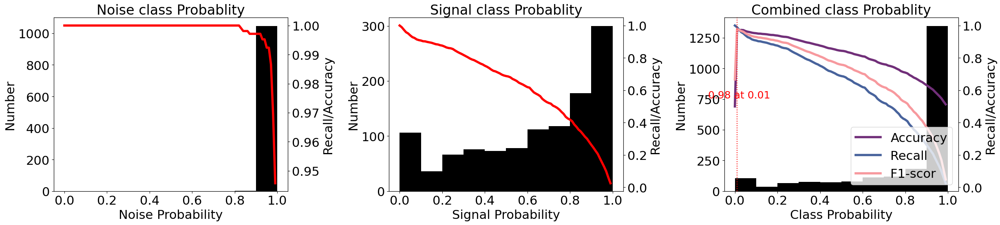

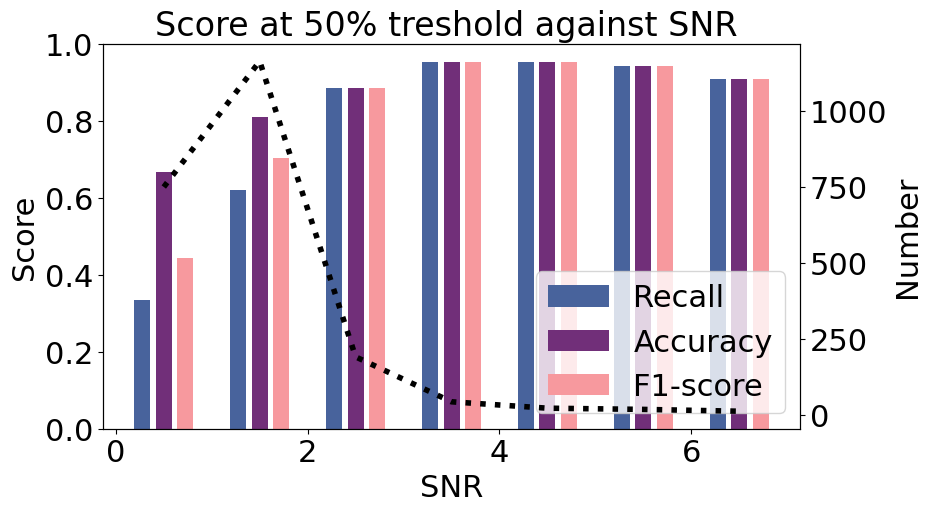

In [20]:
f2,f2, L = plotprobs(pred_list_OBS1,labels)
BestP1['OBS'] = L[0]
BestT1['OBS'] = L[1]
BestA1['OBS'] = L[3]
BestR1['OBS'] = L[2]
f1.savefig("Figure/OBST_Prob_OD.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/OBST_Snr_OD.svg", dpi=100, bbox_inches='tight')

## TESTING IsAE NoAE

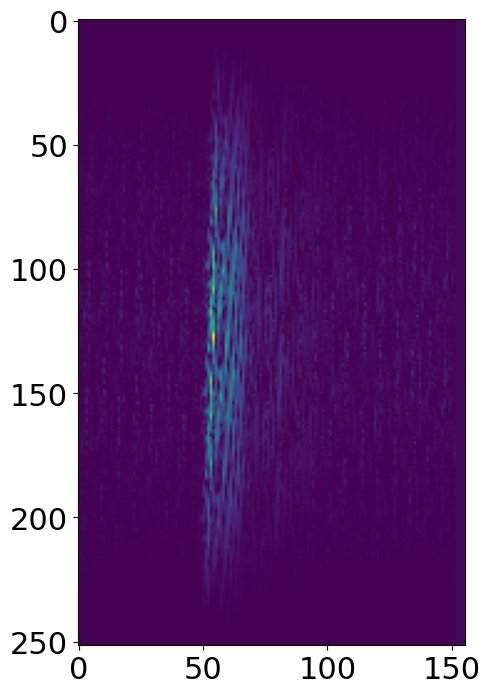

In [21]:
plt.figure(figsize=(5,10))
plt.imshow(Spectrogram[0][0])
plt.show()

In [22]:
device = 'cpu:0'
model = torch.jit.load(f'Classifier_vVOS_AVGPOOL_5_40.pt',map_location=device).to(device)

for param in model.encoder.parameters():
    param.requires_grad = False

model.eval()

RecursiveScriptModule(
  original_name=Classifier
  (encoder): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Conv2d)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Conv2d)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(original_name=Conv2d)
    (5): RecursiveScriptModule(original_name=ReLU)
    (6): RecursiveScriptModule(original_name=Conv2d)
    (7): RecursiveScriptModule(original_name=ReLU)
    (8): RecursiveScriptModule(original_name=Conv2d)
    (9): RecursiveScriptModule(original_name=ReLU)
    (10): RecursiveScriptModule(original_name=Conv2d)
  )
  (classify): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Linear)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Linear)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(or

In [23]:
prob = []
for data in tqdm(dataset_IsAEOD):
    with torch.no_grad(): 
        img, y_true = data
        img = img.unsqueeze(0).to(device).float()
        logits = model(img)
        p = logits.cpu().numpy()
        prob.append(logits[0][0].cpu())
pred_list_IsAE1 = np.array(prob)    

  0%|                                                                                                                                | 0/2193 [00:00<?, ?it/s]

  1%|█▋                                                                                                                    | 32/2193 [00:00<00:06, 313.98it/s]

  4%|█████                                                                                                                 | 93/2193 [00:00<00:04, 483.98it/s]

  7%|████████                                                                                                             | 152/2193 [00:00<00:03, 531.80it/s]

 10%|███████████▎                                                                                                         | 213/2193 [00:00<00:03, 561.48it/s]

 13%|██████████████▋                                                                                                      | 275/2193 [00:00<00:03, 580.15it/s]

 15%|█████████████████▉                                                                                                   | 336/2193 [00:00<00:03, 588.08it/s]

 18%|█████████████████████▏                                                                                               | 396/2193 [00:00<00:03, 589.45it/s]

 21%|████████████████████████▎                                                                                            | 455/2193 [00:00<00:02, 589.29it/s]

 23%|███████████████████████████▍                                                                                         | 514/2193 [00:00<00:02, 580.41it/s]

 26%|██████████████████████████████▋                                                                                      | 576/2193 [00:01<00:02, 590.87it/s]

 29%|█████████████████████████████████▉                                                                                   | 636/2193 [00:01<00:02, 593.35it/s]

 32%|█████████████████████████████████████▏                                                                               | 696/2193 [00:01<00:02, 590.84it/s]

 34%|████████████████████████████████████████▎                                                                            | 756/2193 [00:01<00:02, 587.12it/s]

 37%|███████████████████████████████████████████▍                                                                         | 815/2193 [00:01<00:02, 585.28it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 874/2193 [00:01<00:02, 584.90it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 933/2193 [00:01<00:02, 577.37it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 991/2193 [00:01<00:02, 573.20it/s]

 48%|███████████████████████████████████████████████████████▍                                                            | 1049/2193 [00:01<00:01, 573.64it/s]

 50%|██████████████████████████████████████████████████████████▌                                                         | 1107/2193 [00:01<00:01, 559.44it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                      | 1164/2193 [00:02<00:01, 546.02it/s]

 56%|████████████████████████████████████████████████████████████████▍                                                   | 1219/2193 [00:02<00:01, 544.95it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                | 1274/2193 [00:02<00:01, 535.87it/s]

 61%|██████████████████████████████████████████████████████████████████████▎                                             | 1330/2193 [00:02<00:01, 542.77it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                          | 1387/2193 [00:02<00:01, 549.73it/s]

 66%|████████████████████████████████████████████████████████████████████████████▍                                       | 1445/2193 [00:02<00:01, 556.41it/s]

 69%|███████████████████████████████████████████████████████████████████████████████▌                                    | 1503/2193 [00:02<00:01, 560.86it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                 | 1560/2193 [00:02<00:01, 545.68it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████▌                              | 1618/2193 [00:02<00:01, 553.31it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                           | 1674/2193 [00:02<00:00, 553.66it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▌                        | 1730/2193 [00:03<00:00, 547.29it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1789/2193 [00:03<00:00, 557.90it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1847/2193 [00:03<00:00, 563.76it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1904/2193 [00:03<00:00, 557.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1960/2193 [00:03<00:00, 550.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2017/2193 [00:03<00:00, 554.78it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2077/2193 [00:03<00:00, 565.39it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 2134/2193 [00:03<00:00, 560.40it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2191/2193 [00:03<00:00, 562.19it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [00:03<00:00, 561.72it/s]

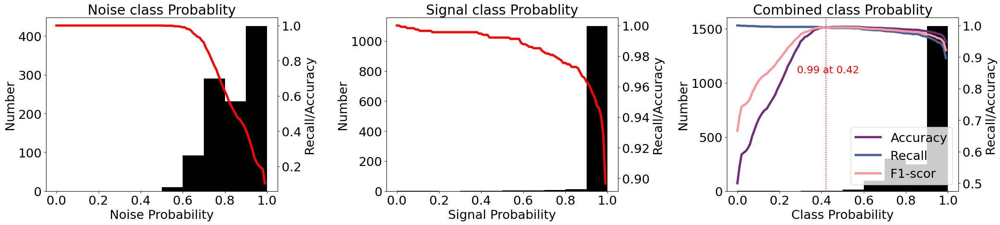

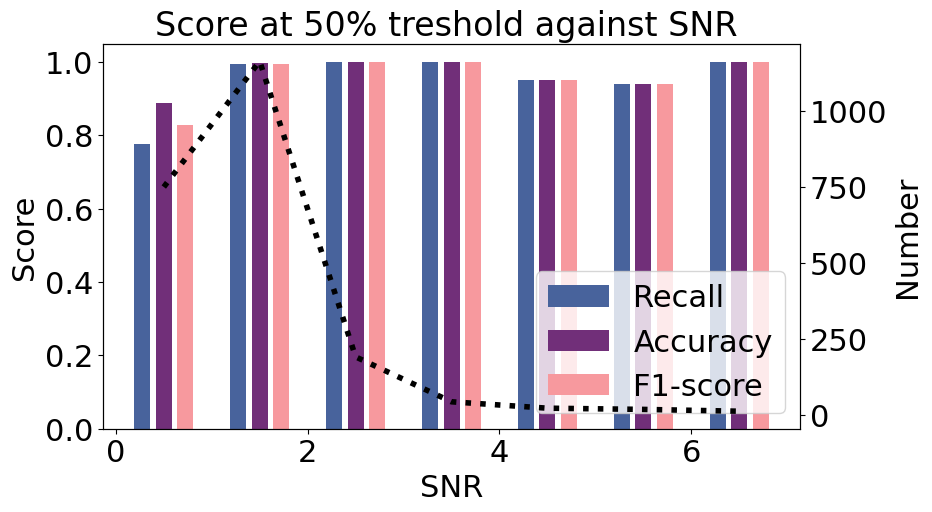

In [24]:
f1,f2, L = plotprobs(pred_list_IsAE1,labels)
BestP1['IsAE'] = L[0]
BestT1['IsAE'] = L[1]
BestA1['IsAE'] = L[3]
BestR1['IsAE'] = L[2]
f1.savefig("Figure/IsAE_Prob_OD.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/IsAE_Snr_OD.svg", dpi=100, bbox_inches='tight')

## TESTING IsAE MinUSIL

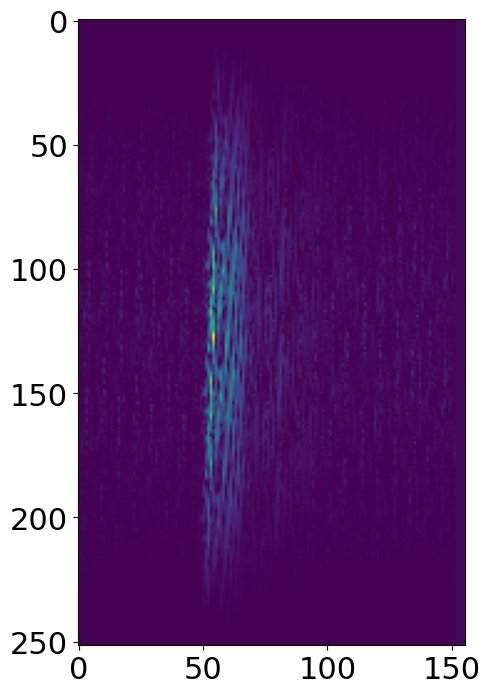

In [25]:
plt.figure(figsize=(5,10))
plt.imshow(Spectrogram[0][0])
plt.show()

In [26]:
device = 'cpu:0'
model = torch.jit.load(f'Classifier_vVOS_MAXPOOL_MINUSIL15.pt',map_location=device).to(device)

for param in model.encoder.parameters():
    param.requires_grad = False

model.eval()

RecursiveScriptModule(
  original_name=Classifier
  (encoder): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Conv2d)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Conv2d)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(original_name=Conv2d)
    (5): RecursiveScriptModule(original_name=ReLU)
    (6): RecursiveScriptModule(original_name=Conv2d)
    (7): RecursiveScriptModule(original_name=ReLU)
    (8): RecursiveScriptModule(original_name=Conv2d)
    (9): RecursiveScriptModule(original_name=ReLU)
    (10): RecursiveScriptModule(original_name=Conv2d)
  )
  (classify): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Linear)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Linear)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(or

In [27]:
prob = []
for data in tqdm(dataset_IsAEOD):
    with torch.no_grad(): 
        img, y_true = data
        img = img.unsqueeze(0).to(device).float()
        logits = model(img)
        p = logits.cpu().numpy()
        prob.append(logits[0][0].cpu())
pred_list_IsAE1_MIN = np.array(prob)    

  0%|                                                                                                                                | 0/2193 [00:00<?, ?it/s]

  2%|██▊                                                                                                                   | 53/2193 [00:00<00:04, 526.79it/s]

  5%|██████                                                                                                               | 114/2193 [00:00<00:03, 574.52it/s]

  8%|█████████▎                                                                                                           | 174/2193 [00:00<00:03, 585.63it/s]

 11%|████████████▍                                                                                                        | 234/2193 [00:00<00:03, 588.99it/s]

 13%|███████████████▋                                                                                                     | 295/2193 [00:00<00:03, 593.54it/s]

 16%|██████████████████▉                                                                                                  | 355/2193 [00:00<00:03, 586.61it/s]

 19%|██████████████████████▏                                                                                              | 415/2193 [00:00<00:03, 588.12it/s]

 22%|█████████████████████████▎                                                                                           | 475/2193 [00:00<00:02, 591.52it/s]

 24%|████████████████████████████▌                                                                                        | 535/2193 [00:00<00:02, 593.39it/s]

 27%|███████████████████████████████▋                                                                                     | 595/2193 [00:01<00:02, 595.11it/s]

 30%|██████████████████████████████████▉                                                                                  | 655/2193 [00:01<00:02, 595.70it/s]

 33%|██████████████████████████████████████▏                                                                              | 715/2193 [00:01<00:02, 590.36it/s]

 35%|█████████████████████████████████████████▎                                                                           | 775/2193 [00:01<00:02, 592.18it/s]

 38%|████████████████████████████████████████████▌                                                                        | 835/2193 [00:01<00:02, 594.20it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 896/2193 [00:01<00:02, 596.10it/s]

 44%|███████████████████████████████████████████████████                                                                  | 956/2193 [00:01<00:02, 596.72it/s]

 46%|█████████████████████████████████████████████████████▊                                                              | 1017/2193 [00:01<00:01, 598.23it/s]

 49%|█████████████████████████████████████████████████████████                                                           | 1078/2193 [00:01<00:01, 599.37it/s]

 52%|████████████████████████████████████████████████████████████▏                                                       | 1138/2193 [00:01<00:01, 597.57it/s]

 55%|███████████████████████████████████████████████████████████████▎                                                    | 1198/2193 [00:02<00:01, 592.85it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                 | 1258/2193 [00:02<00:01, 591.54it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                              | 1318/2193 [00:02<00:01, 593.23it/s]

 63%|████████████████████████████████████████████████████████████████████████▉                                           | 1378/2193 [00:02<00:01, 594.08it/s]

 66%|████████████████████████████████████████████████████████████████████████████                                        | 1438/2193 [00:02<00:01, 592.02it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                    | 1498/2193 [00:02<00:01, 591.49it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▍                                 | 1558/2193 [00:02<00:01, 590.76it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████▌                              | 1618/2193 [00:02<00:00, 589.59it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                           | 1677/2193 [00:02<00:00, 588.91it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                        | 1736/2193 [00:02<00:00, 586.67it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1795/2193 [00:03<00:00, 586.86it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████                  | 1854/2193 [00:03<00:00, 587.72it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1913/2193 [00:03<00:00, 587.25it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1972/2193 [00:03<00:00, 587.20it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 2031/2193 [00:03<00:00, 586.64it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2091/2193 [00:03<00:00, 588.01it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2151/2193 [00:03<00:00, 588.91it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2193/2193 [00:03<00:00, 590.44it/s]

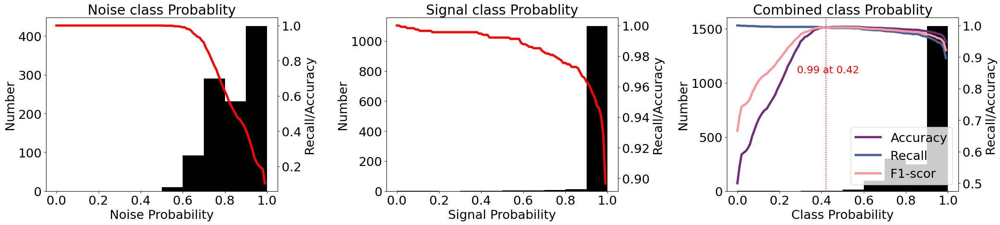

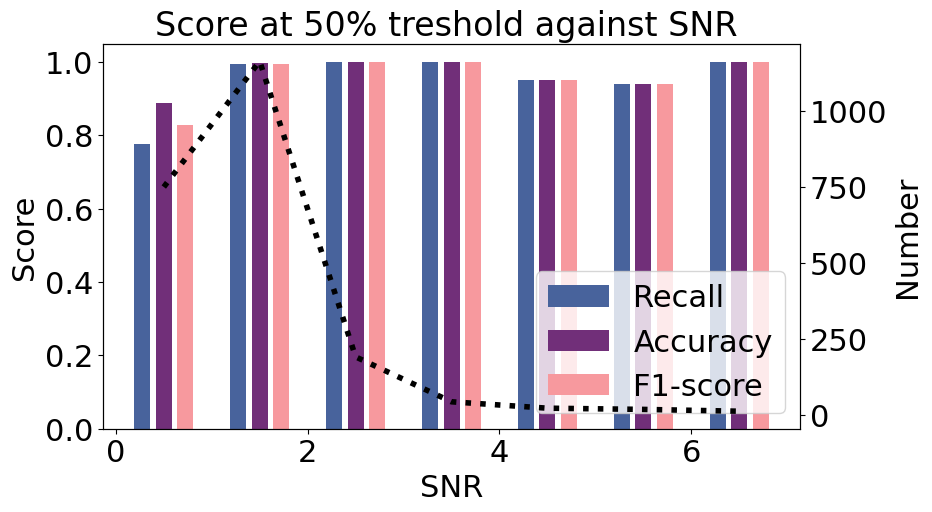

In [28]:
f1,f2, L = plotprobs(pred_list_IsAE1,labels)
BestP1['IsAEMIN'] = L[0]
BestT1['IsAEMIN'] = L[1]
BestA1['IsAEMIN'] = L[3]
BestR1['IsAEMIN'] = L[2]
f1.savefig("Figure/IsAEMIN_Prob_OD.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/IsAEMIN_Snr_OD.svg", dpi=100, bbox_inches='tight')

# Testing on SeisBench Available Models and IsAE on GlassBead AENet Data

In [29]:
# Initialize dict
chrono = {}
BestP2 ={}
BestT2 = {}
BestA2= {}
BestR2= {}

## load data

In [30]:
file = 'dataset_GlassBead_AENet'
with h5py.File(f'{file}.h5', 'r') as f:
    # Load waveforms and labels

    labels = f['labels'][:]
    waveforms = f['waveforms'][:]
    # Load metadata
    paths = f.attrs['paths']
    Spectrogram  = f['spectrograms'][:]
    
    SNR = MakeSNR(waveforms)

MaxFrqsGB = np.array([max_frequency(w[0],10*1e6) for w in waveforms])
LabelGB = labels

print(f"Dataset loaded from '{file}.h5'.")
print('Number of elements : ',len(paths))

# Initialize the dataset For Natural Trained Earthquakes
datasetGB = CustomWaveformDataset_Seisbench(paths, labels, ['*']*len(labels), waveforms)
dataset_IsAEGB = CustomWaveformDataset_IsAE(paths, labels, times, waveforms,Spectrogram)

Dataset loaded from 'dataset_GlassBead_AENet.h5'.
Number of elements :  2127


In [31]:
len(waveforms[0][0])

8000

In [32]:
print(datasetGB[0][0])  # Should be (3, num_samples) for 3-component data
print(datasetGB[0])

3 Trace(s) in Stream:
...Component_1 | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:01:21.910000Z | 100.0 Hz, 8192 samples
...Component_2 | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:01:21.910000Z | 100.0 Hz, 8192 samples
...Component_3 | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:01:21.910000Z | 100.0 Hz, 8192 samples
(<obspy.core.stream.Stream object at 0x7fb8d4107b60>, tensor(1))


## Cred

In [33]:
%autoawait on
# Load the pre-trained model
print(CRED.list_pretrained())
model = CRED.from_pretrained("original")
model.to('cpu:0')


['ethz', 'geofon', 'instance', 'lendb', 'original', 'scedc', 'stead']


CRED(
  (conv1): Conv2d(3, 8, kernel_size=(9, 9), stride=(2, 2), padding=(4, 4))
  (cnn_block1): BlockCNN(
    (convs): ModuleList(
      (0-1): 2 x Conv2d(8, 8, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    )
    (norms): ModuleList(
      (0-1): 2 x BatchNorm2d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (conv2): Conv2d(8, 16, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (cnn_block2): BlockCNN(
    (convs): ModuleList(
      (0-1): 2 x Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (norms): ModuleList(
      (0-1): 2 x BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (lstm_block): BlockBiLSTM(
    (dropout): Dropout(p=0.3, inplace=False)
    (lstms): ModuleList(
      (0): LSTM(176, 64, batch_first=True, bidirectional=True)
      (1): LSTM(128, 64, batch_first=True, bidirectional=True)
    )
  )
  (lstm): LSTM(128, 64, batch_first=True)
  (dropout): Dropout(p=0.

In [34]:
pred_list = []
tic()
for i in tqdm(range(len(datasetGB))):
    preds = model.annotate(datasetGB[i][0])
    pred_list.append(max(preds[0].data) )
toc()
chrono['Cred']=tac()
pred_list_Cred2 = np.array(pred_list)

  0%|                                                                                                                                | 0/2127 [00:00<?, ?it/s]

  0%|▎                                                                                                                       | 6/2127 [00:00<00:49, 42.81it/s]

  1%|▌                                                                                                                      | 11/2127 [00:00<01:13, 28.89it/s]

  1%|▊                                                                                                                      | 15/2127 [00:00<01:12, 29.02it/s]

  1%|█                                                                                                                      | 19/2127 [00:00<01:09, 30.18it/s]

  1%|█▎                                                                                                                     | 23/2127 [00:00<01:07, 31.21it/s]

  1%|█▌                                                                                                                     | 27/2127 [00:00<01:10, 29.77it/s]

  1%|█▋                                                                                                                     | 31/2127 [00:01<01:21, 25.68it/s]

  2%|██                                                                                                                     | 36/2127 [00:01<01:09, 30.19it/s]

  2%|██▏                                                                                                                    | 40/2127 [00:01<01:16, 27.43it/s]

  2%|██▍                                                                                                                    | 43/2127 [00:01<01:16, 27.33it/s]

  2%|██▌                                                                                                                    | 46/2127 [00:01<01:16, 27.20it/s]

  2%|██▋                                                                                                                    | 49/2127 [00:01<01:18, 26.51it/s]

  2%|██▉                                                                                                                    | 52/2127 [00:01<01:16, 27.22it/s]

  3%|███▏                                                                                                                   | 56/2127 [00:01<01:12, 28.74it/s]

  3%|███▎                                                                                                                   | 60/2127 [00:02<01:06, 30.94it/s]

  3%|███▌                                                                                                                   | 64/2127 [00:02<01:21, 25.29it/s]

  3%|███▋                                                                                                                   | 67/2127 [00:02<01:22, 24.96it/s]

  3%|███▉                                                                                                                   | 71/2127 [00:02<01:13, 27.86it/s]

  3%|████▏                                                                                                                  | 74/2127 [00:02<01:14, 27.63it/s]

  4%|████▎                                                                                                                  | 77/2127 [00:02<01:18, 26.01it/s]

  4%|████▌                                                                                                                  | 81/2127 [00:02<01:11, 28.48it/s]

  4%|████▋                                                                                                                  | 84/2127 [00:03<01:17, 26.23it/s]

  4%|████▉                                                                                                                  | 88/2127 [00:03<01:11, 28.42it/s]

  4%|█████                                                                                                                  | 91/2127 [00:03<01:24, 24.13it/s]

  4%|█████▎                                                                                                                 | 95/2127 [00:03<01:15, 27.07it/s]

  5%|█████▍                                                                                                                 | 98/2127 [00:03<01:17, 26.02it/s]

  5%|█████▌                                                                                                                | 101/2127 [00:03<01:22, 24.62it/s]

  5%|█████▊                                                                                                                | 104/2127 [00:03<01:24, 23.92it/s]

  5%|██████                                                                                                                | 109/2127 [00:03<01:12, 27.95it/s]

  5%|██████▏                                                                                                               | 112/2127 [00:04<01:14, 27.22it/s]

  5%|██████▍                                                                                                               | 115/2127 [00:04<01:21, 24.79it/s]

  6%|██████▌                                                                                                               | 119/2127 [00:04<01:12, 27.83it/s]

  6%|██████▊                                                                                                               | 122/2127 [00:04<01:21, 24.46it/s]

  6%|██████▉                                                                                                               | 126/2127 [00:04<01:13, 27.35it/s]

  6%|███████▏                                                                                                              | 129/2127 [00:04<01:27, 22.96it/s]

  6%|███████▍                                                                                                              | 134/2127 [00:04<01:22, 24.08it/s]

  6%|███████▋                                                                                                              | 138/2127 [00:05<01:16, 26.15it/s]

  7%|███████▊                                                                                                              | 141/2127 [00:05<01:16, 26.07it/s]

  7%|████████                                                                                                              | 145/2127 [00:05<01:11, 27.57it/s]

  7%|████████▏                                                                                                             | 148/2127 [00:05<01:22, 23.84it/s]

  7%|████████▍                                                                                                             | 153/2127 [00:05<01:11, 27.46it/s]

  7%|████████▋                                                                                                             | 156/2127 [00:05<01:13, 26.80it/s]

  7%|████████▊                                                                                                             | 159/2127 [00:05<01:14, 26.41it/s]

  8%|████████▉                                                                                                             | 162/2127 [00:06<01:15, 26.02it/s]

  8%|█████████▏                                                                                                            | 165/2127 [00:06<01:13, 26.53it/s]

  8%|█████████▎                                                                                                            | 168/2127 [00:06<01:17, 25.17it/s]

  8%|█████████▌                                                                                                            | 172/2127 [00:06<01:12, 26.98it/s]

  8%|█████████▋                                                                                                            | 175/2127 [00:06<01:11, 27.48it/s]

  8%|█████████▊                                                                                                            | 178/2127 [00:06<01:12, 26.75it/s]

  9%|██████████                                                                                                            | 181/2127 [00:06<01:11, 27.19it/s]

  9%|██████████▏                                                                                                           | 184/2127 [00:06<01:11, 27.08it/s]

  9%|██████████▍                                                                                                           | 188/2127 [00:06<01:11, 27.06it/s]

  9%|██████████▌                                                                                                           | 191/2127 [00:07<01:11, 27.07it/s]

  9%|██████████▊                                                                                                           | 194/2127 [00:07<01:14, 25.99it/s]

  9%|██████████▉                                                                                                           | 197/2127 [00:07<01:17, 24.88it/s]

  9%|███████████▏                                                                                                          | 201/2127 [00:07<01:08, 28.19it/s]

 10%|███████████▎                                                                                                          | 204/2127 [00:07<01:14, 25.73it/s]

 10%|███████████▌                                                                                                          | 208/2127 [00:07<01:09, 27.81it/s]

 10%|███████████▋                                                                                                          | 211/2127 [00:07<01:11, 26.90it/s]

 10%|███████████▊                                                                                                          | 214/2127 [00:07<01:13, 25.92it/s]

 10%|████████████                                                                                                          | 217/2127 [00:08<01:12, 26.28it/s]

 10%|████████████▏                                                                                                         | 220/2127 [00:08<01:14, 25.56it/s]

 10%|████████████▎                                                                                                         | 223/2127 [00:08<01:13, 25.97it/s]

 11%|████████████▌                                                                                                         | 226/2127 [00:08<01:15, 25.10it/s]

 11%|████████████▋                                                                                                         | 229/2127 [00:08<01:17, 24.58it/s]

 11%|████████████▉                                                                                                         | 233/2127 [00:08<01:09, 27.42it/s]

 11%|█████████████                                                                                                         | 236/2127 [00:08<01:20, 23.54it/s]

 11%|█████████████▎                                                                                                        | 239/2127 [00:08<01:19, 23.66it/s]

 11%|█████████████▍                                                                                                        | 242/2127 [00:09<01:19, 23.64it/s]

 12%|█████████████▋                                                                                                        | 246/2127 [00:09<01:11, 26.38it/s]

 12%|█████████████▊                                                                                                        | 249/2127 [00:09<01:10, 26.54it/s]

 12%|██████████████                                                                                                        | 253/2127 [00:09<01:03, 29.31it/s]

 12%|██████████████▏                                                                                                       | 256/2127 [00:09<01:03, 29.32it/s]

 12%|██████████████▎                                                                                                       | 259/2127 [00:09<01:05, 28.30it/s]

 12%|██████████████▋                                                                                                       | 264/2127 [00:09<01:06, 28.03it/s]

 13%|██████████████▊                                                                                                       | 267/2127 [00:10<01:12, 25.51it/s]

 13%|███████████████                                                                                                       | 271/2127 [00:10<01:09, 26.71it/s]

 13%|███████████████▏                                                                                                      | 274/2127 [00:10<01:12, 25.70it/s]

 13%|███████████████▍                                                                                                      | 278/2127 [00:10<01:08, 26.93it/s]

 13%|███████████████▌                                                                                                      | 281/2127 [00:10<01:13, 25.09it/s]

 13%|███████████████▊                                                                                                      | 284/2127 [00:10<01:14, 24.76it/s]

 14%|███████████████▉                                                                                                      | 288/2127 [00:10<01:05, 28.11it/s]

 14%|████████████████▏                                                                                                     | 291/2127 [00:10<01:15, 24.48it/s]

 14%|████████████████▎                                                                                                     | 294/2127 [00:11<01:14, 24.58it/s]

 14%|████████████████▍                                                                                                     | 297/2127 [00:11<01:13, 24.82it/s]

 14%|████████████████▋                                                                                                     | 300/2127 [00:11<01:24, 21.61it/s]

 14%|████████████████▊                                                                                                     | 304/2127 [00:11<01:12, 24.99it/s]

 14%|█████████████████                                                                                                     | 308/2127 [00:11<01:13, 24.66it/s]

 15%|█████████████████▎                                                                                                    | 311/2127 [00:11<01:17, 23.37it/s]

 15%|█████████████████▍                                                                                                    | 314/2127 [00:11<01:14, 24.40it/s]

 15%|█████████████████▌                                                                                                    | 317/2127 [00:12<01:10, 25.52it/s]

 15%|█████████████████▊                                                                                                    | 321/2127 [00:12<01:09, 26.12it/s]

 15%|█████████████████▉                                                                                                    | 324/2127 [00:12<01:14, 24.12it/s]

 15%|██████████████████▏                                                                                                   | 328/2127 [00:12<01:11, 25.24it/s]

 16%|██████████████████▎                                                                                                   | 331/2127 [00:12<01:09, 25.80it/s]

 16%|██████████████████▌                                                                                                   | 334/2127 [00:12<01:11, 24.95it/s]

 16%|██████████████████▋                                                                                                   | 337/2127 [00:12<01:11, 24.94it/s]

 16%|██████████████████▉                                                                                                   | 341/2127 [00:12<01:06, 26.89it/s]

 16%|███████████████████                                                                                                   | 344/2127 [00:13<01:08, 26.01it/s]

 16%|███████████████████▎                                                                                                  | 348/2127 [00:13<01:07, 26.51it/s]

 17%|███████████████████▍                                                                                                  | 351/2127 [00:13<01:08, 26.05it/s]

 17%|███████████████████▋                                                                                                  | 355/2127 [00:13<01:04, 27.52it/s]

 17%|███████████████████▉                                                                                                  | 359/2127 [00:13<01:00, 29.37it/s]

 17%|████████████████████                                                                                                  | 362/2127 [00:13<01:09, 25.52it/s]

 17%|████████████████████▎                                                                                                 | 366/2127 [00:13<01:01, 28.69it/s]

 17%|████████████████████▍                                                                                                 | 369/2127 [00:13<01:04, 27.32it/s]

 17%|████████████████████▋                                                                                                 | 372/2127 [00:14<01:10, 24.83it/s]

 18%|████████████████████▊                                                                                                 | 375/2127 [00:14<01:10, 24.95it/s]

 18%|█████████████████████                                                                                                 | 379/2127 [00:14<01:03, 27.48it/s]

 18%|█████████████████████▏                                                                                                | 382/2127 [00:14<01:11, 24.36it/s]

 18%|█████████████████████▍                                                                                                | 386/2127 [00:14<01:09, 25.15it/s]

 18%|█████████████████████▌                                                                                                | 389/2127 [00:14<01:08, 25.52it/s]

 18%|█████████████████████▋                                                                                                | 392/2127 [00:14<01:06, 26.28it/s]

 19%|█████████████████████▉                                                                                                | 395/2127 [00:15<01:10, 24.64it/s]

 19%|██████████████████████                                                                                                | 398/2127 [00:15<01:12, 23.94it/s]

 19%|██████████████████████▏                                                                                               | 401/2127 [00:15<01:12, 23.94it/s]

 19%|██████████████████████▍                                                                                               | 404/2127 [00:15<01:16, 22.46it/s]

 19%|██████████████████████▋                                                                                               | 408/2127 [00:15<01:09, 24.63it/s]

 19%|██████████████████████▊                                                                                               | 411/2127 [00:15<01:11, 24.01it/s]

 20%|███████████████████████                                                                                               | 415/2127 [00:15<01:01, 27.86it/s]

 20%|███████████████████████▏                                                                                              | 419/2127 [00:15<00:57, 29.92it/s]

 20%|███████████████████████▍                                                                                              | 423/2127 [00:16<01:06, 25.72it/s]

 20%|███████████████████████▋                                                                                              | 426/2127 [00:16<01:09, 24.40it/s]

 20%|███████████████████████▊                                                                                              | 429/2127 [00:16<01:12, 23.43it/s]

 20%|███████████████████████▉                                                                                              | 432/2127 [00:16<01:08, 24.88it/s]

 20%|████████████████████████▏                                                                                             | 436/2127 [00:16<01:01, 27.59it/s]

 21%|████████████████████████▎                                                                                             | 439/2127 [00:16<01:02, 26.89it/s]

 21%|████████████████████████▌                                                                                             | 442/2127 [00:16<01:01, 27.53it/s]

 21%|████████████████████████▋                                                                                             | 445/2127 [00:16<01:04, 25.93it/s]

 21%|████████████████████████▊                                                                                             | 448/2127 [00:17<01:03, 26.40it/s]

 21%|█████████████████████████                                                                                             | 451/2127 [00:17<01:12, 23.24it/s]

 21%|█████████████████████████▏                                                                                            | 455/2127 [00:17<01:01, 27.16it/s]

 22%|█████████████████████████▍                                                                                            | 458/2127 [00:17<01:05, 25.46it/s]

 22%|█████████████████████████▌                                                                                            | 461/2127 [00:17<01:06, 25.18it/s]

 22%|█████████████████████████▋                                                                                            | 464/2127 [00:17<01:03, 26.38it/s]

 22%|█████████████████████████▉                                                                                            | 467/2127 [00:17<01:08, 24.29it/s]

 22%|██████████████████████████                                                                                            | 470/2127 [00:18<01:14, 22.32it/s]

 22%|██████████████████████████▎                                                                                           | 474/2127 [00:18<01:04, 25.61it/s]

 22%|██████████████████████████▍                                                                                           | 477/2127 [00:18<01:06, 24.73it/s]

 23%|██████████████████████████▋                                                                                           | 480/2127 [00:18<01:10, 23.51it/s]

 23%|██████████████████████████▉                                                                                           | 485/2127 [00:18<00:58, 28.06it/s]

 23%|███████████████████████████                                                                                           | 488/2127 [00:18<01:02, 26.42it/s]

 23%|███████████████████████████▏                                                                                          | 491/2127 [00:18<01:07, 24.10it/s]

 23%|███████████████████████████▍                                                                                          | 495/2127 [00:18<01:02, 26.27it/s]

 23%|███████████████████████████▋                                                                                          | 498/2127 [00:19<01:08, 23.62it/s]

 24%|███████████████████████████▊                                                                                          | 502/2127 [00:19<01:05, 24.99it/s]

 24%|████████████████████████████                                                                                          | 505/2127 [00:19<01:02, 25.78it/s]

 24%|████████████████████████████▏                                                                                         | 508/2127 [00:19<01:09, 23.35it/s]

 24%|████████████████████████████▎                                                                                         | 511/2127 [00:19<01:11, 22.72it/s]

 24%|████████████████████████████▌                                                                                         | 514/2127 [00:19<01:10, 22.88it/s]

 24%|████████████████████████████▋                                                                                         | 518/2127 [00:19<01:04, 24.94it/s]

 24%|████████████████████████████▉                                                                                         | 521/2127 [00:20<01:12, 22.11it/s]

 25%|█████████████████████████████▏                                                                                        | 525/2127 [00:20<01:04, 24.95it/s]

 25%|█████████████████████████████▎                                                                                        | 528/2127 [00:20<01:01, 26.04it/s]

 25%|█████████████████████████████▍                                                                                        | 531/2127 [00:20<01:03, 25.21it/s]

 25%|█████████████████████████████▋                                                                                        | 535/2127 [00:20<00:55, 28.69it/s]

 25%|█████████████████████████████▊                                                                                        | 538/2127 [00:20<01:03, 24.83it/s]

 25%|██████████████████████████████                                                                                        | 541/2127 [00:20<01:00, 26.06it/s]

 26%|██████████████████████████████▏                                                                                       | 544/2127 [00:20<01:04, 24.50it/s]

 26%|██████████████████████████████▎                                                                                       | 547/2127 [00:21<01:07, 23.56it/s]

 26%|██████████████████████████████▌                                                                                       | 550/2127 [00:21<01:14, 21.05it/s]

 26%|██████████████████████████████▋                                                                                       | 554/2127 [00:21<01:04, 24.25it/s]

 26%|██████████████████████████████▉                                                                                       | 557/2127 [00:21<01:07, 23.39it/s]

 26%|███████████████████████████████                                                                                       | 561/2127 [00:21<01:04, 24.24it/s]

 27%|███████████████████████████████▎                                                                                      | 564/2127 [00:21<01:02, 25.20it/s]

 27%|███████████████████████████████▍                                                                                      | 567/2127 [00:21<01:03, 24.66it/s]

 27%|███████████████████████████████▌                                                                                      | 570/2127 [00:22<01:06, 23.48it/s]

 27%|███████████████████████████████▊                                                                                      | 574/2127 [00:22<00:58, 26.34it/s]

 27%|████████████████████████████████                                                                                      | 577/2127 [00:22<00:59, 26.09it/s]

 27%|████████████████████████████████▏                                                                                     | 580/2127 [00:22<00:59, 26.13it/s]

 27%|████████████████████████████████▎                                                                                     | 583/2127 [00:22<00:57, 26.82it/s]

 28%|████████████████████████████████▌                                                                                     | 586/2127 [00:22<00:57, 26.90it/s]

 28%|████████████████████████████████▋                                                                                     | 589/2127 [00:22<00:57, 26.61it/s]

 28%|████████████████████████████████▉                                                                                     | 593/2127 [00:22<00:54, 28.33it/s]

 28%|█████████████████████████████████                                                                                     | 596/2127 [00:23<00:58, 26.15it/s]

 28%|█████████████████████████████████▏                                                                                    | 599/2127 [00:23<00:57, 26.60it/s]

 28%|█████████████████████████████████▍                                                                                    | 602/2127 [00:23<00:57, 26.31it/s]

 28%|█████████████████████████████████▌                                                                                    | 606/2127 [00:23<00:52, 28.78it/s]

 29%|█████████████████████████████████▊                                                                                    | 609/2127 [00:23<00:57, 26.61it/s]

 29%|█████████████████████████████████▉                                                                                    | 612/2127 [00:23<00:59, 25.53it/s]

 29%|██████████████████████████████████                                                                                    | 615/2127 [00:23<01:04, 23.61it/s]

 29%|██████████████████████████████████▎                                                                                   | 618/2127 [00:23<01:08, 22.03it/s]

 29%|██████████████████████████████████▍                                                                                   | 621/2127 [00:24<01:04, 23.47it/s]

 29%|██████████████████████████████████▌                                                                                   | 624/2127 [00:24<01:05, 23.12it/s]

 29%|██████████████████████████████████▊                                                                                   | 627/2127 [00:24<01:08, 21.83it/s]

 30%|███████████████████████████████████                                                                                   | 631/2127 [00:24<01:04, 23.36it/s]

 30%|███████████████████████████████████▏                                                                                  | 634/2127 [00:24<01:02, 23.99it/s]

 30%|███████████████████████████████████▍                                                                                  | 638/2127 [00:24<00:56, 26.39it/s]

 30%|███████████████████████████████████▌                                                                                  | 641/2127 [00:24<00:59, 25.02it/s]

 30%|███████████████████████████████████▋                                                                                  | 644/2127 [00:24<00:57, 25.87it/s]

 30%|███████████████████████████████████▉                                                                                  | 647/2127 [00:25<01:02, 23.67it/s]

 31%|████████████████████████████████████                                                                                  | 651/2127 [00:25<00:59, 24.90it/s]

 31%|████████████████████████████████████▎                                                                                 | 654/2127 [00:25<01:02, 23.61it/s]

 31%|████████████████████████████████████▍                                                                                 | 657/2127 [00:25<01:08, 21.46it/s]

 31%|████████████████████████████████████▋                                                                                 | 661/2127 [00:25<01:00, 24.41it/s]

 31%|████████████████████████████████████▉                                                                                 | 666/2127 [00:25<00:53, 27.06it/s]

 31%|█████████████████████████████████████                                                                                 | 669/2127 [00:26<01:01, 23.65it/s]

 32%|█████████████████████████████████████▎                                                                                | 673/2127 [00:26<01:02, 23.13it/s]

 32%|█████████████████████████████████████▌                                                                                | 678/2127 [00:26<00:59, 24.36it/s]

 32%|█████████████████████████████████████▊                                                                                | 681/2127 [00:26<00:57, 25.08it/s]

 32%|██████████████████████████████████████                                                                                | 685/2127 [00:26<00:59, 24.08it/s]

 32%|██████████████████████████████████████▏                                                                               | 688/2127 [00:26<00:57, 25.21it/s]

 32%|██████████████████████████████████████▎                                                                               | 691/2127 [00:26<00:55, 25.82it/s]

 33%|██████████████████████████████████████▌                                                                               | 694/2127 [00:27<00:58, 24.59it/s]

 33%|██████████████████████████████████████▋                                                                               | 698/2127 [00:27<00:54, 26.41it/s]

 33%|██████████████████████████████████████▉                                                                               | 701/2127 [00:27<01:01, 23.33it/s]

 33%|███████████████████████████████████████                                                                               | 704/2127 [00:27<00:58, 24.38it/s]

 33%|███████████████████████████████████████▏                                                                              | 707/2127 [00:27<01:00, 23.29it/s]

 33%|███████████████████████████████████████▍                                                                              | 710/2127 [00:27<00:57, 24.48it/s]

 34%|███████████████████████████████████████▌                                                                              | 713/2127 [00:27<01:00, 23.33it/s]

 34%|███████████████████████████████████████▊                                                                              | 717/2127 [00:27<00:55, 25.20it/s]

 34%|███████████████████████████████████████▉                                                                              | 720/2127 [00:28<00:58, 24.17it/s]

 34%|████████████████████████████████████████▏                                                                             | 724/2127 [00:28<00:58, 24.00it/s]

 34%|████████████████████████████████████████▎                                                                             | 727/2127 [00:28<01:02, 22.57it/s]

 34%|████████████████████████████████████████▌                                                                             | 731/2127 [00:28<00:54, 25.60it/s]

 35%|████████████████████████████████████████▋                                                                             | 734/2127 [00:28<00:54, 25.50it/s]

 35%|████████████████████████████████████████▉                                                                             | 737/2127 [00:28<00:53, 26.06it/s]

 35%|█████████████████████████████████████████                                                                             | 740/2127 [00:28<00:54, 25.65it/s]

 35%|█████████████████████████████████████████▎                                                                            | 744/2127 [00:29<00:50, 27.23it/s]

 35%|█████████████████████████████████████████▍                                                                            | 748/2127 [00:29<00:52, 26.48it/s]

 35%|█████████████████████████████████████████▋                                                                            | 752/2127 [00:29<00:48, 28.37it/s]

 35%|█████████████████████████████████████████▉                                                                            | 755/2127 [00:29<00:50, 27.23it/s]

 36%|██████████████████████████████████████████                                                                            | 758/2127 [00:29<00:56, 24.36it/s]

 36%|██████████████████████████████████████████▎                                                                           | 762/2127 [00:29<00:50, 26.88it/s]

 36%|██████████████████████████████████████████▍                                                                           | 765/2127 [00:29<00:52, 26.06it/s]

 36%|██████████████████████████████████████████▌                                                                           | 768/2127 [00:29<00:51, 26.38it/s]

 36%|██████████████████████████████████████████▊                                                                           | 771/2127 [00:30<00:51, 26.53it/s]

 36%|██████████████████████████████████████████▉                                                                           | 774/2127 [00:30<00:53, 25.24it/s]

 37%|███████████████████████████████████████████                                                                           | 777/2127 [00:30<01:01, 21.87it/s]

 37%|███████████████████████████████████████████▎                                                                          | 780/2127 [00:30<01:00, 22.10it/s]

 37%|███████████████████████████████████████████▍                                                                          | 783/2127 [00:30<00:59, 22.58it/s]

 37%|███████████████████████████████████████████▋                                                                          | 787/2127 [00:30<00:54, 24.75it/s]

 37%|███████████████████████████████████████████▊                                                                          | 790/2127 [00:30<00:57, 23.30it/s]

 37%|███████████████████████████████████████████▉                                                                          | 793/2127 [00:31<00:54, 24.36it/s]

 37%|████████████████████████████████████████████▏                                                                         | 796/2127 [00:31<00:56, 23.37it/s]

 38%|████████████████████████████████████████████▎                                                                         | 799/2127 [00:31<00:56, 23.43it/s]

 38%|████████████████████████████████████████████▍                                                                         | 802/2127 [00:31<00:59, 22.26it/s]

 38%|████████████████████████████████████████████▋                                                                         | 806/2127 [00:31<00:51, 25.65it/s]

 38%|████████████████████████████████████████████▉                                                                         | 809/2127 [00:31<00:52, 25.02it/s]

 38%|█████████████████████████████████████████████▏                                                                        | 814/2127 [00:31<00:46, 28.28it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 817/2127 [00:31<00:50, 26.04it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 821/2127 [00:32<00:45, 28.98it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 824/2127 [00:32<00:52, 24.77it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 827/2127 [00:32<00:50, 25.74it/s]

 39%|██████████████████████████████████████████████                                                                        | 830/2127 [00:32<00:55, 23.41it/s]

 39%|██████████████████████████████████████████████▎                                                                       | 834/2127 [00:32<00:47, 27.23it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 837/2127 [00:32<00:48, 26.48it/s]

 39%|██████████████████████████████████████████████▌                                                                       | 840/2127 [00:32<00:52, 24.42it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 844/2127 [00:32<00:47, 26.83it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 847/2127 [00:33<00:52, 24.32it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 850/2127 [00:33<00:51, 24.80it/s]

 40%|███████████████████████████████████████████████▎                                                                      | 853/2127 [00:33<00:49, 25.69it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 856/2127 [00:33<00:49, 25.60it/s]

 40%|███████████████████████████████████████████████▋                                                                      | 859/2127 [00:33<00:50, 25.09it/s]

 41%|███████████████████████████████████████████████▊                                                                      | 862/2127 [00:33<00:49, 25.63it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 865/2127 [00:33<00:47, 26.65it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 868/2127 [00:33<00:50, 25.10it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 871/2127 [00:34<00:52, 23.70it/s]

 41%|████████████████████████████████████████████████▍                                                                     | 874/2127 [00:34<00:53, 23.55it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 877/2127 [00:34<00:51, 24.34it/s]

 41%|████████████████████████████████████████████████▊                                                                     | 880/2127 [00:34<00:49, 25.27it/s]

 42%|████████████████████████████████████████████████▉                                                                     | 883/2127 [00:34<00:48, 25.74it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 886/2127 [00:34<00:49, 25.27it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 890/2127 [00:34<00:43, 28.61it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 893/2127 [00:34<00:43, 28.27it/s]

 42%|█████████████████████████████████████████████████▋                                                                    | 896/2127 [00:35<00:45, 27.34it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 899/2127 [00:35<00:45, 26.99it/s]

 42%|██████████████████████████████████████████████████                                                                    | 902/2127 [00:35<00:44, 27.31it/s]

 43%|██████████████████████████████████████████████████▏                                                                   | 905/2127 [00:35<00:50, 24.04it/s]

 43%|██████████████████████████████████████████████████▍                                                                   | 909/2127 [00:35<00:47, 25.63it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 912/2127 [00:35<00:45, 26.68it/s]

 43%|██████████████████████████████████████████████████▊                                                                   | 915/2127 [00:35<00:45, 26.86it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 918/2127 [00:35<00:45, 26.79it/s]

 43%|███████████████████████████████████████████████████▏                                                                  | 922/2127 [00:35<00:43, 27.75it/s]

 43%|███████████████████████████████████████████████████▎                                                                  | 925/2127 [00:36<00:45, 26.68it/s]

 44%|███████████████████████████████████████████████████▍                                                                  | 928/2127 [00:36<00:45, 26.40it/s]

 44%|███████████████████████████████████████████████████▋                                                                  | 931/2127 [00:36<00:43, 27.30it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 934/2127 [00:36<00:45, 26.29it/s]

 44%|███████████████████████████████████████████████████▉                                                                  | 937/2127 [00:36<00:50, 23.71it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 941/2127 [00:36<00:42, 27.64it/s]

 44%|████████████████████████████████████████████████████▍                                                                 | 945/2127 [00:36<00:41, 28.22it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 948/2127 [00:36<00:42, 27.83it/s]

 45%|████████████████████████████████████████████████████▊                                                                 | 952/2127 [00:37<00:40, 29.11it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 955/2127 [00:37<00:40, 28.82it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 958/2127 [00:37<00:44, 26.41it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 962/2127 [00:37<00:40, 28.49it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 966/2127 [00:37<00:43, 26.71it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 970/2127 [00:37<00:42, 27.02it/s]

 46%|█████████████████████████████████████████████████████▉                                                                | 973/2127 [00:37<00:42, 27.13it/s]

 46%|██████████████████████████████████████████████████████▏                                                               | 976/2127 [00:37<00:42, 27.18it/s]

 46%|██████████████████████████████████████████████████████▎                                                               | 979/2127 [00:38<00:42, 27.08it/s]

 46%|██████████████████████████████████████████████████████▍                                                               | 982/2127 [00:38<00:43, 26.19it/s]

 46%|██████████████████████████████████████████████████████▋                                                               | 985/2127 [00:38<00:46, 24.76it/s]

 46%|██████████████████████████████████████████████████████▊                                                               | 989/2127 [00:38<00:41, 27.21it/s]

 47%|███████████████████████████████████████████████████████                                                               | 992/2127 [00:38<00:48, 23.30it/s]

 47%|███████████████████████████████████████████████████████▏                                                              | 995/2127 [00:38<00:45, 24.72it/s]

 47%|███████████████████████████████████████████████████████▍                                                              | 999/2127 [00:38<00:43, 25.75it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1002/2127 [00:39<00:43, 25.59it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1005/2127 [00:39<00:43, 25.89it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1008/2127 [00:39<00:46, 24.00it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 1011/2127 [00:39<00:46, 24.13it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1015/2127 [00:39<00:40, 27.34it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1018/2127 [00:39<00:46, 24.10it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1021/2127 [00:39<00:46, 23.92it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1024/2127 [00:39<00:46, 23.79it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 1028/2127 [00:40<00:45, 24.13it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 1031/2127 [00:40<00:45, 24.35it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1034/2127 [00:40<00:43, 25.21it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 1037/2127 [00:40<00:42, 25.91it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1040/2127 [00:40<00:41, 26.28it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1043/2127 [00:40<00:41, 25.85it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1047/2127 [00:40<00:37, 29.05it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1050/2127 [00:40<00:44, 24.27it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 1054/2127 [00:41<00:40, 26.26it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 1057/2127 [00:41<00:48, 22.23it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1061/2127 [00:41<00:41, 25.50it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1066/2127 [00:41<00:36, 29.39it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 1070/2127 [00:41<00:38, 27.81it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 1074/2127 [00:41<00:35, 30.08it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 1078/2127 [00:41<00:37, 28.16it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1081/2127 [00:42<00:38, 27.18it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1084/2127 [00:42<00:38, 27.00it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1087/2127 [00:42<00:38, 27.27it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 1090/2127 [00:42<00:39, 26.04it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 1094/2127 [00:42<00:40, 25.32it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 1097/2127 [00:42<00:40, 25.50it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1100/2127 [00:42<00:38, 26.38it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 1103/2127 [00:42<00:44, 23.01it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1106/2127 [00:43<00:45, 22.59it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1110/2127 [00:43<00:40, 25.19it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1113/2127 [00:43<00:39, 25.65it/s]

 52%|█████████████████████████████████████████████████████████████▍                                                       | 1116/2127 [00:43<00:38, 26.39it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1119/2127 [00:43<00:43, 23.12it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 1123/2127 [00:43<00:39, 25.49it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1126/2127 [00:43<00:40, 24.65it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1129/2127 [00:44<00:40, 24.45it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1133/2127 [00:44<00:36, 27.48it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1136/2127 [00:44<00:38, 25.44it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1139/2127 [00:44<00:42, 23.08it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1142/2127 [00:44<00:42, 23.38it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 1145/2127 [00:44<00:42, 23.05it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 1149/2127 [00:44<00:40, 24.27it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1153/2127 [00:44<00:37, 25.91it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1156/2127 [00:45<00:41, 23.19it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 1160/2127 [00:45<00:39, 24.32it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 1164/2127 [00:45<00:37, 26.01it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1167/2127 [00:45<00:36, 26.05it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 1170/2127 [00:45<00:37, 25.39it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1174/2127 [00:45<00:34, 27.94it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1177/2127 [00:45<00:36, 26.21it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 1180/2127 [00:46<00:36, 26.04it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1184/2127 [00:46<00:33, 28.13it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1188/2127 [00:46<00:33, 28.28it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1191/2127 [00:46<00:36, 25.70it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 1194/2127 [00:46<00:36, 25.22it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1198/2127 [00:46<00:36, 25.25it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 1201/2127 [00:46<00:38, 24.23it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1204/2127 [00:46<00:37, 24.45it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1208/2127 [00:47<00:35, 26.01it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1211/2127 [00:47<00:38, 24.02it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 1215/2127 [00:47<00:35, 25.35it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1218/2127 [00:47<00:34, 26.41it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 1221/2127 [00:47<00:34, 25.97it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 1224/2127 [00:47<00:35, 25.34it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1228/2127 [00:47<00:32, 28.06it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 1231/2127 [00:48<00:35, 25.24it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1235/2127 [00:48<00:31, 28.50it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1238/2127 [00:48<00:32, 27.12it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1241/2127 [00:48<00:32, 27.33it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 1244/2127 [00:48<00:34, 25.79it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1247/2127 [00:48<00:35, 24.79it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1250/2127 [00:48<00:35, 24.85it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1253/2127 [00:48<00:34, 25.50it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1257/2127 [00:48<00:30, 28.41it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1260/2127 [00:49<00:33, 25.60it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1263/2127 [00:49<00:35, 24.34it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1267/2127 [00:49<00:30, 27.98it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1270/2127 [00:49<00:31, 27.22it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 1273/2127 [00:49<00:33, 25.77it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1276/2127 [00:49<00:34, 24.75it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1279/2127 [00:49<00:35, 23.70it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 1282/2127 [00:49<00:33, 25.05it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1285/2127 [00:50<00:34, 24.68it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 1288/2127 [00:50<00:36, 23.05it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1292/2127 [00:50<00:33, 25.13it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 1296/2127 [00:50<00:30, 26.98it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1299/2127 [00:50<00:30, 26.91it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1302/2127 [00:50<00:31, 26.19it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1305/2127 [00:50<00:30, 26.61it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 1308/2127 [00:50<00:32, 25.17it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1311/2127 [00:51<00:37, 21.64it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1314/2127 [00:51<00:38, 21.29it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1318/2127 [00:51<00:33, 24.26it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1321/2127 [00:51<00:35, 22.69it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1325/2127 [00:51<00:31, 25.67it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 1328/2127 [00:51<00:30, 26.36it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1331/2127 [00:51<00:33, 24.09it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1334/2127 [00:52<00:33, 23.94it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 1337/2127 [00:52<00:31, 24.97it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1341/2127 [00:52<00:28, 27.19it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1345/2127 [00:52<00:29, 26.76it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 1348/2127 [00:52<00:28, 27.29it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 1352/2127 [00:52<00:26, 29.33it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 1355/2127 [00:52<00:32, 23.95it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1358/2127 [00:53<00:34, 22.08it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1361/2127 [00:53<00:33, 22.86it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1364/2127 [00:53<00:32, 23.29it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1368/2127 [00:53<00:29, 25.32it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 1371/2127 [00:53<00:29, 25.57it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1375/2127 [00:53<00:27, 27.77it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1378/2127 [00:53<00:26, 28.00it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1381/2127 [00:53<00:27, 26.89it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1384/2127 [00:54<00:31, 23.67it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1387/2127 [00:54<00:30, 24.53it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1391/2127 [00:54<00:27, 27.12it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 1394/2127 [00:54<00:30, 23.84it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 1397/2127 [00:54<00:32, 22.49it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1400/2127 [00:54<00:31, 23.36it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1404/2127 [00:54<00:28, 25.59it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 1407/2127 [00:54<00:27, 25.74it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1410/2127 [00:55<00:28, 25.48it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1413/2127 [00:55<00:27, 25.94it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 1416/2127 [00:55<00:29, 23.78it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1420/2127 [00:55<00:27, 26.08it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1423/2127 [00:55<00:28, 25.11it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 1426/2127 [00:55<00:30, 22.99it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1430/2127 [00:55<00:25, 26.96it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 1433/2127 [00:55<00:26, 26.08it/s]

 68%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1436/2127 [00:56<00:26, 25.82it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1439/2127 [00:56<00:27, 25.12it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 1442/2127 [00:56<00:29, 23.45it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1445/2127 [00:56<00:28, 23.60it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1448/2127 [00:56<00:28, 23.81it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1451/2127 [00:56<00:29, 23.01it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 1454/2127 [00:56<00:28, 23.36it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 1457/2127 [00:57<00:29, 22.68it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1460/2127 [00:57<00:31, 21.19it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 1463/2127 [00:57<00:30, 21.52it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1467/2127 [00:57<00:29, 22.60it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1470/2127 [00:57<00:30, 21.80it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 1473/2127 [00:57<00:30, 21.53it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1476/2127 [00:57<00:28, 22.78it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1479/2127 [00:58<00:26, 24.36it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1482/2127 [00:58<00:25, 25.30it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1485/2127 [00:58<00:25, 24.80it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1488/2127 [00:58<00:24, 26.06it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1491/2127 [00:58<00:24, 26.43it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1494/2127 [00:58<00:25, 25.22it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1497/2127 [00:58<00:25, 24.63it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1501/2127 [00:58<00:22, 27.87it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1504/2127 [00:58<00:22, 27.68it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 1507/2127 [00:59<00:22, 27.77it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1511/2127 [00:59<00:21, 28.06it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1514/2127 [00:59<00:25, 24.26it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1518/2127 [00:59<00:22, 26.93it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 1522/2127 [00:59<00:20, 28.94it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1525/2127 [00:59<00:26, 22.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1529/2127 [00:59<00:24, 24.01it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1532/2127 [01:00<00:24, 24.75it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1535/2127 [01:00<00:24, 24.01it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1538/2127 [01:00<00:23, 24.82it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 1541/2127 [01:00<00:24, 23.59it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1544/2127 [01:00<00:25, 22.46it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1547/2127 [01:00<00:25, 22.43it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1551/2127 [01:00<00:24, 23.90it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 1555/2127 [01:01<00:21, 26.06it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1558/2127 [01:01<00:21, 26.04it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1561/2127 [01:01<00:23, 24.44it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1564/2127 [01:01<00:22, 25.01it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1568/2127 [01:01<00:20, 27.24it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1571/2127 [01:01<00:20, 27.61it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 1574/2127 [01:01<00:19, 28.05it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1577/2127 [01:01<00:21, 26.19it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1580/2127 [01:01<00:22, 24.35it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1583/2127 [01:02<00:25, 21.65it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1586/2127 [01:02<00:25, 21.23it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1590/2127 [01:02<00:21, 24.73it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1593/2127 [01:02<00:23, 22.39it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1596/2127 [01:02<00:23, 22.53it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 1599/2127 [01:02<00:22, 23.04it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1602/2127 [01:02<00:21, 24.36it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 1605/2127 [01:03<00:20, 25.28it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1608/2127 [01:03<00:19, 26.51it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1611/2127 [01:03<00:21, 23.55it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 1614/2127 [01:03<00:22, 22.75it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1618/2127 [01:03<00:21, 24.17it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1621/2127 [01:03<00:21, 23.56it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1624/2127 [01:03<00:21, 23.77it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1627/2127 [01:04<00:21, 22.89it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1631/2127 [01:04<00:19, 25.52it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1635/2127 [01:04<00:17, 28.20it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1638/2127 [01:04<00:18, 26.81it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 1642/2127 [01:04<00:17, 27.75it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1645/2127 [01:04<00:17, 27.46it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 1649/2127 [01:04<00:17, 27.35it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 1653/2127 [01:04<00:16, 28.96it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1656/2127 [01:05<00:16, 28.13it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1659/2127 [01:05<00:16, 27.95it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 1664/2127 [01:05<00:15, 29.57it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1667/2127 [01:05<00:16, 28.44it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1670/2127 [01:05<00:17, 26.79it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1673/2127 [01:05<00:17, 25.59it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1677/2127 [01:05<00:16, 27.17it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1680/2127 [01:05<00:16, 27.53it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1683/2127 [01:05<00:16, 26.76it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1686/2127 [01:06<00:16, 27.29it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1689/2127 [01:06<00:18, 23.67it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 1692/2127 [01:06<00:18, 24.01it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1695/2127 [01:06<00:17, 24.70it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1698/2127 [01:06<00:17, 25.11it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1701/2127 [01:06<00:17, 24.76it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1705/2127 [01:06<00:15, 26.94it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1708/2127 [01:07<00:16, 25.04it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1712/2127 [01:07<00:15, 27.22it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1716/2127 [01:07<00:14, 28.66it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1719/2127 [01:07<00:15, 26.63it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1722/2127 [01:07<00:14, 27.10it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1725/2127 [01:07<00:15, 26.31it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1729/2127 [01:07<00:14, 28.10it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1732/2127 [01:07<00:14, 27.79it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1735/2127 [01:07<00:14, 26.58it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1739/2127 [01:08<00:14, 26.78it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1743/2127 [01:08<00:13, 27.84it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 1746/2127 [01:08<00:13, 27.47it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1749/2127 [01:08<00:14, 25.27it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1752/2127 [01:08<00:16, 22.84it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1756/2127 [01:08<00:14, 26.15it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1759/2127 [01:08<00:14, 25.17it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1762/2127 [01:09<00:14, 25.02it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 1765/2127 [01:09<00:14, 25.51it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1768/2127 [01:09<00:14, 24.92it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1771/2127 [01:09<00:15, 22.35it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1774/2127 [01:09<00:15, 22.20it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1777/2127 [01:09<00:16, 21.41it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1780/2127 [01:09<00:15, 22.72it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1783/2127 [01:10<00:15, 21.82it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1787/2127 [01:10<00:13, 25.72it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1790/2127 [01:10<00:12, 26.38it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1793/2127 [01:10<00:12, 26.56it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1796/2127 [01:10<00:13, 24.57it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1799/2127 [01:10<00:13, 24.51it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1803/2127 [01:10<00:12, 26.17it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1806/2127 [01:10<00:12, 25.35it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1810/2127 [01:11<00:12, 25.08it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1813/2127 [01:11<00:12, 25.92it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1816/2127 [01:11<00:12, 25.16it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1819/2127 [01:11<00:11, 25.70it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1822/2127 [01:11<00:11, 26.61it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1825/2127 [01:11<00:11, 25.33it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1828/2127 [01:11<00:11, 25.60it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1831/2127 [01:11<00:12, 24.60it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1834/2127 [01:11<00:11, 25.16it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1837/2127 [01:12<00:11, 24.50it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1840/2127 [01:12<00:11, 25.31it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1843/2127 [01:12<00:10, 26.01it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1846/2127 [01:12<00:11, 23.92it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1850/2127 [01:12<00:10, 26.17it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1853/2127 [01:12<00:10, 24.91it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1856/2127 [01:12<00:11, 24.14it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1860/2127 [01:12<00:10, 26.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1863/2127 [01:13<00:10, 24.58it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1866/2127 [01:13<00:11, 22.82it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1870/2127 [01:13<00:09, 25.90it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 1873/2127 [01:13<00:10, 23.76it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1876/2127 [01:13<00:10, 24.89it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1879/2127 [01:13<00:10, 24.28it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1882/2127 [01:13<00:09, 24.70it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1885/2127 [01:14<00:09, 25.68it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1888/2127 [01:14<00:08, 26.66it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1891/2127 [01:14<00:09, 25.27it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1894/2127 [01:14<00:08, 26.38it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1898/2127 [01:14<00:08, 26.23it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1901/2127 [01:14<00:09, 24.48it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1904/2127 [01:14<00:09, 23.96it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1907/2127 [01:14<00:09, 23.57it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1910/2127 [01:15<00:08, 24.94it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1913/2127 [01:15<00:08, 24.37it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1916/2127 [01:15<00:08, 24.19it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1919/2127 [01:15<00:08, 24.45it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1923/2127 [01:15<00:07, 26.43it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1927/2127 [01:15<00:07, 27.29it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1930/2127 [01:15<00:08, 23.77it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1935/2127 [01:15<00:07, 27.23it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1938/2127 [01:16<00:07, 26.64it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 1941/2127 [01:16<00:07, 25.90it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1944/2127 [01:16<00:07, 23.37it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 1947/2127 [01:16<00:07, 24.86it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1950/2127 [01:16<00:07, 23.19it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1953/2127 [01:16<00:07, 24.57it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1956/2127 [01:16<00:06, 25.73it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1959/2127 [01:16<00:06, 26.29it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1962/2127 [01:17<00:07, 23.55it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1965/2127 [01:17<00:06, 24.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1968/2127 [01:17<00:06, 25.80it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1972/2127 [01:17<00:06, 25.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1975/2127 [01:17<00:05, 25.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1979/2127 [01:17<00:05, 28.23it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 1982/2127 [01:17<00:05, 26.52it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1985/2127 [01:17<00:05, 26.79it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1988/2127 [01:18<00:05, 25.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1991/2127 [01:18<00:05, 26.33it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1994/2127 [01:18<00:05, 24.25it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1998/2127 [01:18<00:04, 27.66it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2001/2127 [01:18<00:04, 26.47it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2004/2127 [01:18<00:04, 27.23it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2008/2127 [01:18<00:04, 27.37it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2011/2127 [01:18<00:04, 26.66it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2015/2127 [01:19<00:04, 27.34it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2018/2127 [01:19<00:04, 24.13it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2022/2127 [01:19<00:03, 27.03it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2025/2127 [01:19<00:03, 25.85it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2029/2127 [01:19<00:03, 28.52it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2032/2127 [01:19<00:03, 27.25it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2036/2127 [01:19<00:03, 29.16it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2039/2127 [01:19<00:03, 26.01it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2043/2127 [01:20<00:03, 27.48it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 2047/2127 [01:20<00:02, 28.27it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2050/2127 [01:20<00:02, 26.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2053/2127 [01:20<00:02, 26.12it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2056/2127 [01:20<00:02, 24.13it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2059/2127 [01:20<00:02, 23.96it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 2062/2127 [01:20<00:02, 24.78it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 2065/2127 [01:21<00:02, 24.66it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2068/2127 [01:21<00:02, 24.92it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 2071/2127 [01:21<00:02, 25.22it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2075/2127 [01:21<00:01, 28.18it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2078/2127 [01:21<00:01, 27.66it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2081/2127 [01:21<00:01, 23.52it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2084/2127 [01:21<00:01, 24.80it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2087/2127 [01:21<00:01, 25.10it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2090/2127 [01:21<00:01, 24.65it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2093/2127 [01:22<00:01, 22.94it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 2096/2127 [01:22<00:01, 24.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2099/2127 [01:22<00:01, 25.10it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2102/2127 [01:22<00:00, 25.60it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 2105/2127 [01:22<00:00, 24.68it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2109/2127 [01:22<00:00, 24.15it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 2112/2127 [01:22<00:00, 23.69it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2115/2127 [01:23<00:00, 24.90it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 2118/2127 [01:23<00:00, 23.00it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2121/2127 [01:23<00:00, 24.39it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2125/2127 [01:23<00:00, 23.51it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2127/2127 [01:23<00:00, 25.47it/s]

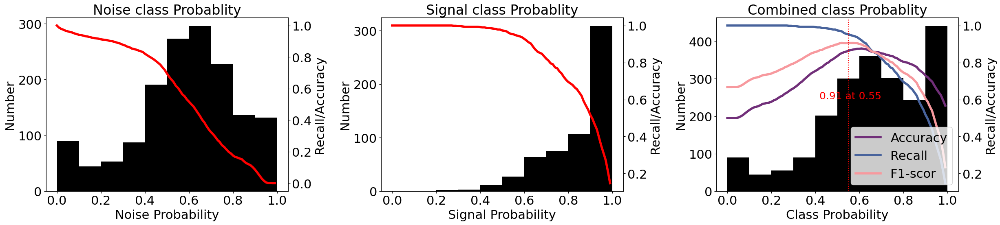

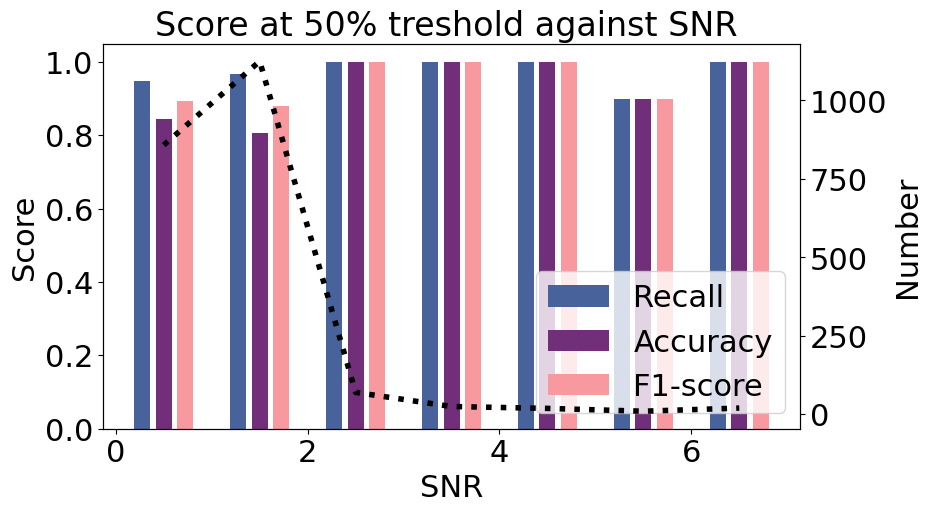

In [35]:
f1,f2, L = plotprobs(pred_list_Cred2,labels)
BestP2['Cred'] = L[0]
BestT2['Cred'] = L[1]
BestA2['Cred'] = L[3]
BestR2['Cred'] = L[2]
f1.savefig("Figure/CRED_Prob_GB.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/CRED_Snr_GB.svg", dpi=100, bbox_inches='tight')

## EQTransformer

In [36]:
# Load the pre-trained model
print(EQTransformer.list_pretrained())
model = EQTransformer.from_pretrained("original")
model.to('cpu:0')


['ethz', 'geofon', 'instance', 'iquique', 'lendb', 'neic', 'obs', 'original', 'original_nonconservative', 'scedc', 'stead', 'volpick']


EQTransformer(
  (encoder): Encoder(
    (convs): ModuleList(
      (0): Conv1d(3, 8, kernel_size=(11,), stride=(1,), padding=(5,))
      (1): Conv1d(8, 16, kernel_size=(9,), stride=(1,), padding=(4,))
      (2): Conv1d(16, 16, kernel_size=(7,), stride=(1,), padding=(3,))
      (3): Conv1d(16, 32, kernel_size=(7,), stride=(1,), padding=(3,))
      (4): Conv1d(32, 32, kernel_size=(5,), stride=(1,), padding=(2,))
      (5): Conv1d(32, 64, kernel_size=(5,), stride=(1,), padding=(2,))
      (6): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    )
    (pools): ModuleList(
      (0-6): 7 x MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (res_cnn_stack): ResCNNStack(
    (members): ModuleList(
      (0-3): 4 x ResCNNBlock(
        (dropout): SpatialDropout1d(
          (dropout): Dropout2d(p=0.1, inplace=False)
        )
        (norm1): BatchNorm1d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (conv1): Conv1d(

In [37]:

pred_list = []
tic()
for i in tqdm(range(len(datasetGB))):
    preds = model.annotate(datasetGB[i][0])
    pred_list.append(max(preds[0].data) )
toc()
chrono['EQT']=tac()
pred_list_EQT2 = np.array(pred_list)

  0%|                                                                                                                                | 0/2127 [00:00<?, ?it/s]

  0%|                                                                                                                        | 2/2127 [00:00<02:58, 11.88it/s]

  0%|▏                                                                                                                       | 4/2127 [00:00<02:49, 12.55it/s]

  0%|▎                                                                                                                       | 6/2127 [00:00<03:08, 11.25it/s]

  0%|▍                                                                                                                       | 8/2127 [00:00<03:28, 10.14it/s]

  0%|▌                                                                                                                      | 10/2127 [00:00<03:14, 10.88it/s]

  1%|▋                                                                                                                      | 12/2127 [00:01<03:45,  9.37it/s]

  1%|▋                                                                                                                      | 13/2127 [00:01<03:51,  9.12it/s]

  1%|▊                                                                                                                      | 15/2127 [00:01<03:43,  9.45it/s]

  1%|▉                                                                                                                      | 16/2127 [00:01<04:00,  8.77it/s]

  1%|█                                                                                                                      | 18/2127 [00:01<03:30, 10.01it/s]

  1%|█                                                                                                                      | 20/2127 [00:01<03:15, 10.79it/s]

  1%|█▏                                                                                                                     | 22/2127 [00:02<03:09, 11.11it/s]

  1%|█▎                                                                                                                     | 24/2127 [00:02<03:23, 10.34it/s]

  1%|█▍                                                                                                                     | 26/2127 [00:02<03:43,  9.40it/s]

  1%|█▌                                                                                                                     | 28/2127 [00:02<03:30,  9.97it/s]

  1%|█▋                                                                                                                     | 30/2127 [00:02<03:23, 10.33it/s]

  2%|█▊                                                                                                                     | 32/2127 [00:03<04:00,  8.71it/s]

  2%|█▊                                                                                                                     | 33/2127 [00:03<04:00,  8.71it/s]

  2%|█▉                                                                                                                     | 34/2127 [00:03<04:00,  8.70it/s]

  2%|██                                                                                                                     | 36/2127 [00:03<03:45,  9.27it/s]

  2%|██▏                                                                                                                    | 38/2127 [00:03<03:32,  9.83it/s]

  2%|██▏                                                                                                                    | 39/2127 [00:03<03:42,  9.37it/s]

  2%|██▎                                                                                                                    | 41/2127 [00:04<03:43,  9.32it/s]

  2%|██▍                                                                                                                    | 43/2127 [00:04<03:36,  9.61it/s]

  2%|██▍                                                                                                                    | 44/2127 [00:04<03:41,  9.42it/s]

  2%|██▌                                                                                                                    | 46/2127 [00:04<03:42,  9.37it/s]

  2%|██▋                                                                                                                    | 48/2127 [00:04<03:44,  9.28it/s]

  2%|██▊                                                                                                                    | 50/2127 [00:05<03:26, 10.05it/s]

  2%|██▉                                                                                                                    | 52/2127 [00:05<03:34,  9.69it/s]

  2%|██▉                                                                                                                    | 53/2127 [00:05<03:40,  9.39it/s]

  3%|███                                                                                                                    | 54/2127 [00:05<04:01,  8.57it/s]

  3%|███▏                                                                                                                   | 56/2127 [00:05<03:30,  9.82it/s]

  3%|███▏                                                                                                                   | 58/2127 [00:05<03:14, 10.62it/s]

  3%|███▎                                                                                                                   | 60/2127 [00:06<03:27,  9.96it/s]

  3%|███▍                                                                                                                   | 62/2127 [00:06<03:12, 10.71it/s]

  3%|███▌                                                                                                                   | 64/2127 [00:06<03:34,  9.62it/s]

  3%|███▋                                                                                                                   | 66/2127 [00:06<03:21, 10.22it/s]

  3%|███▊                                                                                                                   | 68/2127 [00:06<03:38,  9.44it/s]

  3%|███▉                                                                                                                   | 70/2127 [00:07<03:20, 10.27it/s]

  3%|████                                                                                                                   | 72/2127 [00:07<03:29,  9.81it/s]

  3%|████▏                                                                                                                  | 74/2127 [00:07<03:33,  9.62it/s]

  4%|████▏                                                                                                                  | 75/2127 [00:07<03:38,  9.39it/s]

  4%|████▎                                                                                                                  | 76/2127 [00:07<03:38,  9.40it/s]

  4%|████▎                                                                                                                  | 78/2127 [00:08<03:34,  9.56it/s]

  4%|████▍                                                                                                                  | 79/2127 [00:08<03:35,  9.49it/s]

  4%|████▍                                                                                                                  | 80/2127 [00:08<03:36,  9.43it/s]

  4%|████▌                                                                                                                  | 82/2127 [00:08<03:13, 10.58it/s]

  4%|████▋                                                                                                                  | 84/2127 [00:08<03:21, 10.16it/s]

  4%|████▊                                                                                                                  | 86/2127 [00:08<03:48,  8.93it/s]

  4%|████▉                                                                                                                  | 88/2127 [00:09<03:44,  9.10it/s]

  4%|█████                                                                                                                  | 90/2127 [00:09<03:23,  9.99it/s]

  4%|█████▏                                                                                                                 | 92/2127 [00:09<03:42,  9.16it/s]

  4%|█████▏                                                                                                                 | 93/2127 [00:09<04:02,  8.40it/s]

  4%|█████▎                                                                                                                 | 95/2127 [00:09<03:37,  9.35it/s]

  5%|█████▎                                                                                                                 | 96/2127 [00:09<03:47,  8.93it/s]

  5%|█████▍                                                                                                                 | 98/2127 [00:10<03:27,  9.76it/s]

  5%|█████▌                                                                                                                | 100/2127 [00:10<03:36,  9.36it/s]

  5%|█████▋                                                                                                                | 102/2127 [00:10<03:38,  9.25it/s]

  5%|█████▊                                                                                                                | 104/2127 [00:10<03:39,  9.21it/s]

  5%|█████▊                                                                                                                | 105/2127 [00:10<03:52,  8.68it/s]

  5%|█████▉                                                                                                                | 107/2127 [00:11<03:25,  9.83it/s]

  5%|█████▉                                                                                                                | 108/2127 [00:11<03:42,  9.06it/s]

  5%|██████                                                                                                                | 110/2127 [00:11<03:43,  9.04it/s]

  5%|██████▏                                                                                                               | 112/2127 [00:11<03:25,  9.78it/s]

  5%|██████▎                                                                                                               | 114/2127 [00:11<03:31,  9.53it/s]

  5%|██████▍                                                                                                               | 115/2127 [00:11<03:34,  9.37it/s]

  5%|██████▍                                                                                                               | 116/2127 [00:12<03:35,  9.34it/s]

  6%|██████▌                                                                                                               | 118/2127 [00:12<03:36,  9.26it/s]

  6%|██████▋                                                                                                               | 120/2127 [00:12<03:22,  9.91it/s]

  6%|██████▋                                                                                                               | 121/2127 [00:12<03:35,  9.32it/s]

  6%|██████▊                                                                                                               | 123/2127 [00:12<03:05, 10.83it/s]

  6%|██████▉                                                                                                               | 125/2127 [00:12<03:07, 10.67it/s]

  6%|███████                                                                                                               | 127/2127 [00:13<03:35,  9.30it/s]

  6%|███████                                                                                                               | 128/2127 [00:13<03:33,  9.37it/s]

  6%|███████▏                                                                                                              | 130/2127 [00:13<03:44,  8.88it/s]

  6%|███████▎                                                                                                              | 132/2127 [00:13<03:38,  9.15it/s]

  6%|███████▍                                                                                                              | 134/2127 [00:13<03:31,  9.41it/s]

  6%|███████▌                                                                                                              | 136/2127 [00:14<03:12, 10.33it/s]

  6%|███████▋                                                                                                              | 138/2127 [00:14<03:30,  9.43it/s]

  7%|███████▋                                                                                                              | 139/2127 [00:14<03:36,  9.17it/s]

  7%|███████▊                                                                                                              | 141/2127 [00:14<03:38,  9.11it/s]

  7%|███████▉                                                                                                              | 142/2127 [00:14<03:42,  8.91it/s]

  7%|███████▉                                                                                                              | 143/2127 [00:14<03:42,  8.91it/s]

  7%|████████                                                                                                              | 145/2127 [00:15<03:16, 10.07it/s]

  7%|████████▏                                                                                                             | 147/2127 [00:15<03:16, 10.07it/s]

  7%|████████▎                                                                                                             | 149/2127 [00:15<03:01, 10.91it/s]

  7%|████████▍                                                                                                             | 151/2127 [00:15<03:03, 10.77it/s]

  7%|████████▍                                                                                                             | 153/2127 [00:15<03:19,  9.90it/s]

  7%|████████▌                                                                                                             | 155/2127 [00:16<03:32,  9.27it/s]

  7%|████████▋                                                                                                             | 157/2127 [00:16<03:17, 10.00it/s]

  7%|████████▊                                                                                                             | 159/2127 [00:16<03:15, 10.05it/s]

  8%|████████▉                                                                                                             | 161/2127 [00:16<03:20,  9.80it/s]

  8%|████████▉                                                                                                             | 162/2127 [00:16<03:27,  9.48it/s]

  8%|█████████                                                                                                             | 164/2127 [00:16<03:12, 10.20it/s]

  8%|█████████▏                                                                                                            | 166/2127 [00:17<03:03, 10.68it/s]

  8%|█████████▎                                                                                                            | 168/2127 [00:17<03:23,  9.65it/s]

  8%|█████████▍                                                                                                            | 170/2127 [00:17<03:05, 10.55it/s]

  8%|█████████▌                                                                                                            | 172/2127 [00:17<03:18,  9.85it/s]

  8%|█████████▋                                                                                                            | 174/2127 [00:17<03:05, 10.51it/s]

  8%|█████████▊                                                                                                            | 176/2127 [00:18<03:11, 10.21it/s]

  8%|█████████▊                                                                                                            | 178/2127 [00:18<03:23,  9.59it/s]

  8%|█████████▉                                                                                                            | 180/2127 [00:18<03:12, 10.13it/s]

  9%|██████████                                                                                                            | 182/2127 [00:18<03:16,  9.88it/s]

  9%|██████████▏                                                                                                           | 184/2127 [00:19<03:22,  9.59it/s]

  9%|██████████▎                                                                                                           | 186/2127 [00:19<03:13, 10.04it/s]

  9%|██████████▍                                                                                                           | 188/2127 [00:19<03:17,  9.80it/s]

  9%|██████████▍                                                                                                           | 189/2127 [00:19<03:20,  9.66it/s]

  9%|██████████▌                                                                                                           | 191/2127 [00:19<03:06, 10.37it/s]

  9%|██████████▋                                                                                                           | 193/2127 [00:19<03:12, 10.05it/s]

  9%|██████████▊                                                                                                           | 195/2127 [00:20<03:13,  9.96it/s]

  9%|██████████▉                                                                                                           | 197/2127 [00:20<03:26,  9.33it/s]

  9%|███████████                                                                                                           | 199/2127 [00:20<03:13,  9.98it/s]

  9%|███████████▏                                                                                                          | 201/2127 [00:20<03:12,  9.99it/s]

 10%|███████████▎                                                                                                          | 203/2127 [00:20<03:18,  9.69it/s]

 10%|███████████▎                                                                                                          | 204/2127 [00:21<03:23,  9.43it/s]

 10%|███████████▎                                                                                                          | 205/2127 [00:21<03:23,  9.46it/s]

 10%|███████████▍                                                                                                          | 206/2127 [00:21<03:27,  9.27it/s]

 10%|███████████▌                                                                                                          | 208/2127 [00:21<03:07, 10.21it/s]

 10%|███████████▋                                                                                                          | 210/2127 [00:21<02:58, 10.71it/s]

 10%|███████████▊                                                                                                          | 212/2127 [00:21<03:10, 10.05it/s]

 10%|███████████▊                                                                                                          | 214/2127 [00:21<02:55, 10.88it/s]

 10%|███████████▉                                                                                                          | 216/2127 [00:22<03:04, 10.37it/s]

 10%|████████████                                                                                                          | 218/2127 [00:22<02:52, 11.05it/s]

 10%|████████████▏                                                                                                         | 220/2127 [00:22<03:12,  9.91it/s]

 10%|████████████▎                                                                                                         | 222/2127 [00:22<03:01, 10.48it/s]

 11%|████████████▍                                                                                                         | 224/2127 [00:22<02:55, 10.85it/s]

 11%|████████████▌                                                                                                         | 226/2127 [00:23<03:13,  9.85it/s]

 11%|████████████▋                                                                                                         | 228/2127 [00:23<03:30,  9.03it/s]

 11%|████████████▊                                                                                                         | 230/2127 [00:23<03:21,  9.42it/s]

 11%|████████████▊                                                                                                         | 231/2127 [00:23<03:31,  8.95it/s]

 11%|████████████▉                                                                                                         | 233/2127 [00:23<03:28,  9.09it/s]

 11%|█████████████                                                                                                         | 235/2127 [00:24<03:33,  8.84it/s]

 11%|█████████████▏                                                                                                        | 237/2127 [00:24<03:39,  8.62it/s]

 11%|█████████████▎                                                                                                        | 239/2127 [00:24<03:11,  9.84it/s]

 11%|█████████████▎                                                                                                        | 241/2127 [00:24<03:02, 10.33it/s]

 11%|█████████████▍                                                                                                        | 243/2127 [00:24<02:58, 10.54it/s]

 12%|█████████████▌                                                                                                        | 245/2127 [00:25<03:58,  7.88it/s]

 12%|█████████████▋                                                                                                        | 247/2127 [00:25<03:45,  8.34it/s]

 12%|█████████████▊                                                                                                        | 249/2127 [00:25<03:49,  8.19it/s]

 12%|█████████████▉                                                                                                        | 251/2127 [00:26<03:51,  8.11it/s]

 12%|██████████████                                                                                                        | 253/2127 [00:26<03:34,  8.72it/s]

 12%|██████████████                                                                                                        | 254/2127 [00:26<03:37,  8.61it/s]

 12%|██████████████▏                                                                                                       | 256/2127 [00:26<03:25,  9.12it/s]

 12%|██████████████▎                                                                                                       | 257/2127 [00:26<03:30,  8.86it/s]

 12%|██████████████▎                                                                                                       | 259/2127 [00:26<03:08,  9.89it/s]

 12%|██████████████▍                                                                                                       | 260/2127 [00:27<03:24,  9.15it/s]

 12%|██████████████▌                                                                                                       | 262/2127 [00:27<03:30,  8.86it/s]

 12%|██████████████▋                                                                                                       | 264/2127 [00:27<03:25,  9.07it/s]

 13%|██████████████▊                                                                                                       | 266/2127 [00:27<03:27,  8.96it/s]

 13%|██████████████▊                                                                                                       | 268/2127 [00:27<03:24,  9.07it/s]

 13%|██████████████▉                                                                                                       | 270/2127 [00:28<03:04, 10.06it/s]

 13%|███████████████                                                                                                       | 272/2127 [00:28<03:14,  9.54it/s]

 13%|███████████████▏                                                                                                      | 273/2127 [00:28<03:25,  9.03it/s]

 13%|███████████████▎                                                                                                      | 275/2127 [00:28<03:01, 10.23it/s]

 13%|███████████████▎                                                                                                      | 277/2127 [00:28<02:51, 10.82it/s]

 13%|███████████████▍                                                                                                      | 279/2127 [00:28<02:59, 10.29it/s]

 13%|███████████████▌                                                                                                      | 281/2127 [00:29<02:46, 11.07it/s]

 13%|███████████████▋                                                                                                      | 283/2127 [00:29<02:43, 11.29it/s]

 13%|███████████████▊                                                                                                      | 285/2127 [00:29<02:43, 11.28it/s]

 13%|███████████████▉                                                                                                      | 287/2127 [00:29<02:48, 10.92it/s]

 14%|████████████████                                                                                                      | 289/2127 [00:29<02:53, 10.58it/s]

 14%|████████████████▏                                                                                                     | 291/2127 [00:30<03:01, 10.11it/s]

 14%|████████████████▎                                                                                                     | 293/2127 [00:30<02:51, 10.72it/s]

 14%|████████████████▎                                                                                                     | 295/2127 [00:30<03:00, 10.14it/s]

 14%|████████████████▍                                                                                                     | 297/2127 [00:30<03:07,  9.78it/s]

 14%|████████████████▌                                                                                                     | 299/2127 [00:30<03:09,  9.65it/s]

 14%|████████████████▋                                                                                                     | 301/2127 [00:31<03:08,  9.69it/s]

 14%|████████████████▊                                                                                                     | 302/2127 [00:31<03:16,  9.28it/s]

 14%|████████████████▊                                                                                                     | 304/2127 [00:31<03:16,  9.29it/s]

 14%|████████████████▉                                                                                                     | 305/2127 [00:31<03:19,  9.14it/s]

 14%|████████████████▉                                                                                                     | 306/2127 [00:31<03:33,  8.54it/s]

 14%|█████████████████                                                                                                     | 307/2127 [00:31<03:29,  8.68it/s]

 14%|█████████████████                                                                                                     | 308/2127 [00:31<03:29,  8.68it/s]

 15%|█████████████████▏                                                                                                    | 310/2127 [00:32<02:58, 10.16it/s]

 15%|█████████████████▎                                                                                                    | 312/2127 [00:32<03:05,  9.80it/s]

 15%|█████████████████▍                                                                                                    | 314/2127 [00:32<02:51, 10.57it/s]

 15%|█████████████████▌                                                                                                    | 316/2127 [00:32<02:53, 10.43it/s]

 15%|█████████████████▋                                                                                                    | 318/2127 [00:32<02:42, 11.15it/s]

 15%|█████████████████▊                                                                                                    | 320/2127 [00:33<03:14,  9.29it/s]

 15%|█████████████████▊                                                                                                    | 321/2127 [00:33<03:25,  8.80it/s]

 15%|█████████████████▉                                                                                                    | 323/2127 [00:33<03:01,  9.96it/s]

 15%|██████████████████                                                                                                    | 325/2127 [00:33<03:29,  8.59it/s]

 15%|██████████████████▏                                                                                                   | 327/2127 [00:33<03:00,  9.95it/s]

 15%|██████████████████▎                                                                                                   | 329/2127 [00:34<03:16,  9.14it/s]

 16%|██████████████████▎                                                                                                   | 331/2127 [00:34<02:56, 10.17it/s]

 16%|██████████████████▍                                                                                                   | 333/2127 [00:34<02:47, 10.72it/s]

 16%|██████████████████▌                                                                                                   | 335/2127 [00:34<02:50, 10.52it/s]

 16%|██████████████████▋                                                                                                   | 337/2127 [00:34<02:58, 10.03it/s]

 16%|██████████████████▊                                                                                                   | 339/2127 [00:35<03:04,  9.71it/s]

 16%|██████████████████▉                                                                                                   | 341/2127 [00:35<03:09,  9.42it/s]

 16%|██████████████████▉                                                                                                   | 342/2127 [00:35<03:18,  8.97it/s]

 16%|███████████████████                                                                                                   | 343/2127 [00:35<03:24,  8.72it/s]

 16%|███████████████████                                                                                                   | 344/2127 [00:35<03:19,  8.92it/s]

 16%|███████████████████▏                                                                                                  | 345/2127 [00:35<03:26,  8.64it/s]

 16%|███████████████████▎                                                                                                  | 347/2127 [00:35<03:05,  9.62it/s]

 16%|███████████████████▎                                                                                                  | 348/2127 [00:36<03:48,  7.79it/s]

 16%|███████████████████▎                                                                                                  | 349/2127 [00:36<03:51,  7.67it/s]

 16%|███████████████████▍                                                                                                  | 350/2127 [00:36<03:52,  7.66it/s]

 17%|███████████████████▍                                                                                                  | 351/2127 [00:36<03:56,  7.50it/s]

 17%|███████████████████▌                                                                                                  | 352/2127 [00:36<04:01,  7.35it/s]

 17%|███████████████████▌                                                                                                  | 353/2127 [00:36<03:45,  7.87it/s]

 17%|███████████████████▋                                                                                                  | 354/2127 [00:36<03:47,  7.79it/s]

 17%|███████████████████▋                                                                                                  | 355/2127 [00:37<03:53,  7.58it/s]

 17%|███████████████████▊                                                                                                  | 357/2127 [00:37<03:29,  8.47it/s]

 17%|███████████████████▊                                                                                                  | 358/2127 [00:37<03:22,  8.72it/s]

 17%|███████████████████▉                                                                                                  | 359/2127 [00:37<03:40,  8.01it/s]

 17%|████████████████████                                                                                                  | 361/2127 [00:37<03:06,  9.45it/s]

 17%|████████████████████                                                                                                  | 362/2127 [00:37<03:16,  8.96it/s]

 17%|████████████████████▏                                                                                                 | 364/2127 [00:37<02:58,  9.86it/s]

 17%|████████████████████▎                                                                                                 | 366/2127 [00:38<02:46, 10.56it/s]

 17%|████████████████████▍                                                                                                 | 368/2127 [00:38<03:08,  9.31it/s]

 17%|████████████████████▌                                                                                                 | 370/2127 [00:38<02:57,  9.91it/s]

 17%|████████████████████▋                                                                                                 | 372/2127 [00:38<02:52, 10.15it/s]

 18%|████████████████████▋                                                                                                 | 374/2127 [00:38<02:41, 10.87it/s]

 18%|████████████████████▊                                                                                                 | 376/2127 [00:39<02:49, 10.34it/s]

 18%|████████████████████▉                                                                                                 | 378/2127 [00:39<02:44, 10.65it/s]

 18%|█████████████████████                                                                                                 | 380/2127 [00:39<02:32, 11.43it/s]

 18%|█████████████████████▏                                                                                                | 382/2127 [00:39<02:48, 10.35it/s]

 18%|█████████████████████▎                                                                                                | 384/2127 [00:39<03:05,  9.41it/s]

 18%|█████████████████████▎                                                                                                | 385/2127 [00:40<03:03,  9.50it/s]

 18%|█████████████████████▍                                                                                                | 386/2127 [00:40<03:17,  8.80it/s]

 18%|█████████████████████▍                                                                                                | 387/2127 [00:40<03:22,  8.58it/s]

 18%|█████████████████████▌                                                                                                | 388/2127 [00:40<03:54,  7.41it/s]

 18%|█████████████████████▋                                                                                                | 390/2127 [00:40<04:04,  7.12it/s]

 18%|█████████████████████▋                                                                                                | 391/2127 [00:40<04:04,  7.09it/s]

 18%|█████████████████████▊                                                                                                | 393/2127 [00:41<03:50,  7.53it/s]

 19%|█████████████████████▉                                                                                                | 395/2127 [00:41<03:16,  8.79it/s]

 19%|██████████████████████                                                                                                | 397/2127 [00:41<03:13,  8.94it/s]

 19%|██████████████████████▏                                                                                               | 399/2127 [00:41<03:08,  9.14it/s]

 19%|██████████████████████▏                                                                                               | 400/2127 [00:41<03:08,  9.15it/s]

 19%|██████████████████████▏                                                                                               | 401/2127 [00:42<03:17,  8.72it/s]

 19%|██████████████████████▎                                                                                               | 402/2127 [00:42<03:29,  8.24it/s]

 19%|██████████████████████▍                                                                                               | 404/2127 [00:42<02:55,  9.82it/s]

 19%|██████████████████████▍                                                                                               | 405/2127 [00:42<03:14,  8.84it/s]

 19%|██████████████████████▌                                                                                               | 406/2127 [00:42<03:20,  8.60it/s]

 19%|██████████████████████▌                                                                                               | 407/2127 [00:42<03:27,  8.27it/s]

 19%|██████████████████████▋                                                                                               | 409/2127 [00:42<02:56,  9.76it/s]

 19%|██████████████████████▊                                                                                               | 411/2127 [00:43<03:08,  9.11it/s]

 19%|██████████████████████▉                                                                                               | 413/2127 [00:43<03:01,  9.43it/s]

 20%|███████████████████████                                                                                               | 415/2127 [00:43<02:39, 10.73it/s]

 20%|███████████████████████▏                                                                                              | 417/2127 [00:43<02:45, 10.30it/s]

 20%|███████████████████████▏                                                                                              | 419/2127 [00:43<03:02,  9.33it/s]

 20%|███████████████████████▎                                                                                              | 421/2127 [00:44<03:02,  9.35it/s]

 20%|███████████████████████▍                                                                                              | 422/2127 [00:44<03:11,  8.92it/s]

 20%|███████████████████████▍                                                                                              | 423/2127 [00:44<03:16,  8.65it/s]

 20%|███████████████████████▌                                                                                              | 425/2127 [00:44<02:54,  9.78it/s]

 20%|███████████████████████▋                                                                                              | 427/2127 [00:44<02:58,  9.51it/s]

 20%|███████████████████████▊                                                                                              | 429/2127 [00:44<02:44, 10.32it/s]

 20%|███████████████████████▉                                                                                              | 431/2127 [00:45<02:51,  9.89it/s]

 20%|████████████████████████                                                                                              | 433/2127 [00:45<02:55,  9.63it/s]

 20%|████████████████████████                                                                                              | 434/2127 [00:45<03:08,  8.98it/s]

 20%|████████████████████████▏                                                                                             | 436/2127 [00:45<03:05,  9.13it/s]

 21%|████████████████████████▏                                                                                             | 437/2127 [00:45<03:03,  9.23it/s]

 21%|████████████████████████▎                                                                                             | 438/2127 [00:45<03:12,  8.75it/s]

 21%|████████████████████████▎                                                                                             | 439/2127 [00:46<03:40,  7.65it/s]

 21%|████████████████████████▍                                                                                             | 441/2127 [00:46<03:07,  8.98it/s]

 21%|████████████████████████▌                                                                                             | 443/2127 [00:46<03:07,  8.98it/s]

 21%|████████████████████████▋                                                                                             | 445/2127 [00:46<03:07,  8.99it/s]

 21%|████████████████████████▊                                                                                             | 447/2127 [00:46<02:46, 10.09it/s]

 21%|████████████████████████▉                                                                                             | 449/2127 [00:47<02:53,  9.66it/s]

 21%|█████████████████████████                                                                                             | 451/2127 [00:47<02:48,  9.96it/s]

 21%|█████████████████████████▏                                                                                            | 453/2127 [00:47<02:49,  9.86it/s]

 21%|█████████████████████████▏                                                                                            | 454/2127 [00:47<03:00,  9.29it/s]

 21%|█████████████████████████▏                                                                                            | 455/2127 [00:47<03:15,  8.56it/s]

 21%|█████████████████████████▎                                                                                            | 457/2127 [00:48<03:08,  8.87it/s]

 22%|█████████████████████████▍                                                                                            | 459/2127 [00:48<03:05,  9.00it/s]

 22%|█████████████████████████▌                                                                                            | 461/2127 [00:48<03:01,  9.16it/s]

 22%|█████████████████████████▋                                                                                            | 463/2127 [00:48<03:01,  9.17it/s]

 22%|█████████████████████████▋                                                                                            | 464/2127 [00:48<03:01,  9.16it/s]

 22%|█████████████████████████▊                                                                                            | 466/2127 [00:48<02:41, 10.28it/s]

 22%|█████████████████████████▉                                                                                            | 468/2127 [00:49<02:43, 10.12it/s]

 22%|██████████████████████████                                                                                            | 470/2127 [00:49<02:47,  9.90it/s]

 22%|██████████████████████████▏                                                                                           | 472/2127 [00:49<02:39, 10.38it/s]

 22%|██████████████████████████▎                                                                                           | 474/2127 [00:49<02:36, 10.59it/s]

 22%|██████████████████████████▍                                                                                           | 476/2127 [00:49<02:45,  9.97it/s]

 22%|██████████████████████████▌                                                                                           | 478/2127 [00:50<02:47,  9.86it/s]

 23%|██████████████████████████▌                                                                                           | 479/2127 [00:50<02:51,  9.62it/s]

 23%|██████████████████████████▋                                                                                           | 481/2127 [00:50<02:41, 10.22it/s]

 23%|██████████████████████████▊                                                                                           | 483/2127 [00:50<02:51,  9.59it/s]

 23%|██████████████████████████▊                                                                                           | 484/2127 [00:50<02:54,  9.44it/s]

 23%|██████████████████████████▉                                                                                           | 486/2127 [00:51<02:59,  9.17it/s]

 23%|███████████████████████████                                                                                           | 487/2127 [00:51<02:57,  9.25it/s]

 23%|███████████████████████████                                                                                           | 488/2127 [00:51<03:03,  8.94it/s]

 23%|███████████████████████████▏                                                                                          | 489/2127 [00:51<03:17,  8.30it/s]

 23%|███████████████████████████▏                                                                                          | 490/2127 [00:51<03:16,  8.31it/s]

 23%|███████████████████████████▏                                                                                          | 491/2127 [00:51<03:09,  8.61it/s]

 23%|███████████████████████████▎                                                                                          | 493/2127 [00:51<03:02,  8.98it/s]

 23%|███████████████████████████▍                                                                                          | 495/2127 [00:52<02:58,  9.15it/s]

 23%|███████████████████████████▌                                                                                          | 496/2127 [00:52<03:04,  8.83it/s]

 23%|███████████████████████████▌                                                                                          | 497/2127 [00:52<03:03,  8.89it/s]

 23%|███████████████████████████▋                                                                                          | 499/2127 [00:52<02:44,  9.88it/s]

 24%|███████████████████████████▋                                                                                          | 500/2127 [00:52<02:54,  9.32it/s]

 24%|███████████████████████████▊                                                                                          | 502/2127 [00:52<02:33, 10.56it/s]

 24%|███████████████████████████▉                                                                                          | 504/2127 [00:52<02:42, 10.00it/s]

 24%|████████████████████████████                                                                                          | 506/2127 [00:53<03:00,  8.96it/s]

 24%|████████████████████████████▏                                                                                         | 507/2127 [00:53<03:01,  8.92it/s]

 24%|████████████████████████████▏                                                                                         | 508/2127 [00:53<03:02,  8.89it/s]

 24%|████████████████████████████▎                                                                                         | 510/2127 [00:53<02:58,  9.05it/s]

 24%|████████████████████████████▎                                                                                         | 511/2127 [00:53<03:16,  8.21it/s]

 24%|████████████████████████████▍                                                                                         | 513/2127 [00:53<02:55,  9.20it/s]

 24%|████████████████████████████▌                                                                                         | 514/2127 [00:54<03:16,  8.22it/s]

 24%|████████████████████████████▌                                                                                         | 515/2127 [00:54<03:20,  8.05it/s]

 24%|████████████████████████████▋                                                                                         | 517/2127 [00:54<02:51,  9.37it/s]

 24%|████████████████████████████▊                                                                                         | 519/2127 [00:54<02:34, 10.40it/s]

 24%|████████████████████████████▉                                                                                         | 521/2127 [00:54<02:58,  8.98it/s]

 25%|████████████████████████████▉                                                                                         | 522/2127 [00:55<03:06,  8.60it/s]

 25%|█████████████████████████████                                                                                         | 524/2127 [00:55<02:59,  8.91it/s]

 25%|█████████████████████████████▏                                                                                        | 525/2127 [00:55<02:58,  8.97it/s]

 25%|█████████████████████████████▏                                                                                        | 526/2127 [00:55<03:00,  8.88it/s]

 25%|█████████████████████████████▏                                                                                        | 527/2127 [00:55<03:02,  8.78it/s]

 25%|█████████████████████████████▎                                                                                        | 528/2127 [00:55<03:07,  8.53it/s]

 25%|█████████████████████████████▍                                                                                        | 530/2127 [00:55<02:49,  9.41it/s]

 25%|█████████████████████████████▍                                                                                        | 531/2127 [00:56<02:54,  9.15it/s]

 25%|█████████████████████████████▌                                                                                        | 533/2127 [00:56<02:49,  9.38it/s]

 25%|█████████████████████████████▌                                                                                        | 534/2127 [00:56<02:53,  9.17it/s]

 25%|█████████████████████████████▋                                                                                        | 535/2127 [00:56<03:10,  8.38it/s]

 25%|█████████████████████████████▋                                                                                        | 536/2127 [00:56<03:25,  7.75it/s]

 25%|█████████████████████████████▊                                                                                        | 538/2127 [00:56<03:08,  8.44it/s]

 25%|█████████████████████████████▉                                                                                        | 540/2127 [00:56<02:41,  9.82it/s]

 25%|██████████████████████████████                                                                                        | 542/2127 [00:57<02:44,  9.66it/s]

 26%|██████████████████████████████                                                                                        | 543/2127 [00:57<02:43,  9.66it/s]

 26%|██████████████████████████████▏                                                                                       | 545/2127 [00:57<02:27, 10.71it/s]

 26%|██████████████████████████████▎                                                                                       | 547/2127 [00:57<02:24, 10.96it/s]

 26%|██████████████████████████████▍                                                                                       | 549/2127 [00:57<02:28, 10.61it/s]

 26%|██████████████████████████████▌                                                                                       | 551/2127 [00:58<02:42,  9.70it/s]

 26%|██████████████████████████████▋                                                                                       | 553/2127 [00:58<02:53,  9.07it/s]

 26%|██████████████████████████████▊                                                                                       | 555/2127 [00:58<02:36, 10.02it/s]

 26%|██████████████████████████████▉                                                                                       | 557/2127 [00:58<02:31, 10.39it/s]

 26%|███████████████████████████████                                                                                       | 559/2127 [00:58<02:35, 10.07it/s]

 26%|███████████████████████████████                                                                                       | 561/2127 [00:59<02:54,  9.00it/s]

 26%|███████████████████████████████▏                                                                                      | 562/2127 [00:59<02:54,  8.99it/s]

 26%|███████████████████████████████▏                                                                                      | 563/2127 [00:59<02:54,  8.99it/s]

 27%|███████████████████████████████▎                                                                                      | 564/2127 [00:59<03:00,  8.68it/s]

 27%|███████████████████████████████▍                                                                                      | 566/2127 [00:59<02:44,  9.48it/s]

 27%|███████████████████████████████▍                                                                                      | 567/2127 [00:59<03:09,  8.21it/s]

 27%|███████████████████████████████▌                                                                                      | 569/2127 [01:00<02:46,  9.36it/s]

 27%|███████████████████████████████▌                                                                                      | 570/2127 [01:00<02:56,  8.83it/s]

 27%|███████████████████████████████▋                                                                                      | 572/2127 [01:00<02:34, 10.09it/s]

 27%|███████████████████████████████▊                                                                                      | 574/2127 [01:00<02:53,  8.93it/s]

 27%|███████████████████████████████▉                                                                                      | 575/2127 [01:00<02:52,  9.02it/s]

 27%|███████████████████████████████▉                                                                                      | 576/2127 [01:00<02:53,  8.95it/s]

 27%|████████████████████████████████                                                                                      | 578/2127 [01:00<02:33, 10.09it/s]

 27%|████████████████████████████████▏                                                                                     | 580/2127 [01:01<02:39,  9.70it/s]

 27%|████████████████████████████████▎                                                                                     | 582/2127 [01:01<02:41,  9.58it/s]

 27%|████████████████████████████████▍                                                                                     | 584/2127 [01:01<02:34,  9.97it/s]

 28%|████████████████████████████████▌                                                                                     | 586/2127 [01:01<02:39,  9.66it/s]

 28%|████████████████████████████████▌                                                                                     | 588/2127 [01:02<02:42,  9.46it/s]

 28%|████████████████████████████████▋                                                                                     | 590/2127 [01:02<02:38,  9.71it/s]

 28%|████████████████████████████████▊                                                                                     | 592/2127 [01:02<02:25, 10.57it/s]

 28%|████████████████████████████████▉                                                                                     | 594/2127 [01:02<02:21, 10.85it/s]

 28%|█████████████████████████████████                                                                                     | 596/2127 [01:02<02:34,  9.88it/s]

 28%|█████████████████████████████████▏                                                                                    | 598/2127 [01:03<02:42,  9.43it/s]

 28%|█████████████████████████████████▏                                                                                    | 599/2127 [01:03<02:43,  9.33it/s]

 28%|█████████████████████████████████▎                                                                                    | 601/2127 [01:03<02:42,  9.37it/s]

 28%|█████████████████████████████████▍                                                                                    | 603/2127 [01:03<02:42,  9.37it/s]

 28%|█████████████████████████████████▌                                                                                    | 605/2127 [01:03<02:27, 10.30it/s]

 29%|█████████████████████████████████▋                                                                                    | 607/2127 [01:03<02:10, 11.63it/s]

 29%|█████████████████████████████████▊                                                                                    | 609/2127 [01:04<02:37,  9.66it/s]

 29%|█████████████████████████████████▉                                                                                    | 611/2127 [01:04<02:32,  9.96it/s]

 29%|██████████████████████████████████                                                                                    | 613/2127 [01:04<02:31,  9.99it/s]

 29%|██████████████████████████████████                                                                                    | 615/2127 [01:04<02:22, 10.63it/s]

 29%|██████████████████████████████████▏                                                                                   | 617/2127 [01:04<02:40,  9.44it/s]

 29%|██████████████████████████████████▎                                                                                   | 619/2127 [01:05<02:42,  9.25it/s]

 29%|██████████████████████████████████▍                                                                                   | 621/2127 [01:05<02:49,  8.88it/s]

 29%|██████████████████████████████████▌                                                                                   | 623/2127 [01:05<02:37,  9.56it/s]

 29%|██████████████████████████████████▌                                                                                   | 624/2127 [01:05<02:55,  8.59it/s]

 29%|██████████████████████████████████▋                                                                                   | 626/2127 [01:06<02:57,  8.46it/s]

 30%|██████████████████████████████████▊                                                                                   | 628/2127 [01:06<02:51,  8.75it/s]

 30%|██████████████████████████████████▉                                                                                   | 630/2127 [01:06<02:36,  9.54it/s]

 30%|███████████████████████████████████                                                                                   | 632/2127 [01:06<02:43,  9.15it/s]

 30%|███████████████████████████████████                                                                                   | 633/2127 [01:06<02:52,  8.67it/s]

 30%|███████████████████████████████████▏                                                                                  | 635/2127 [01:06<02:50,  8.73it/s]

 30%|███████████████████████████████████▎                                                                                  | 637/2127 [01:07<02:43,  9.09it/s]

 30%|███████████████████████████████████▍                                                                                  | 639/2127 [01:07<02:41,  9.24it/s]

 30%|███████████████████████████████████▌                                                                                  | 641/2127 [01:07<02:31,  9.82it/s]

 30%|███████████████████████████████████▋                                                                                  | 643/2127 [01:07<02:35,  9.53it/s]

 30%|███████████████████████████████████▊                                                                                  | 645/2127 [01:08<02:35,  9.52it/s]

 30%|███████████████████████████████████▊                                                                                  | 646/2127 [01:08<03:00,  8.21it/s]

 30%|███████████████████████████████████▉                                                                                  | 647/2127 [01:08<02:57,  8.36it/s]

 30%|███████████████████████████████████▉                                                                                  | 648/2127 [01:08<02:53,  8.54it/s]

 31%|████████████████████████████████████                                                                                  | 649/2127 [01:08<02:55,  8.40it/s]

 31%|████████████████████████████████████                                                                                  | 650/2127 [01:08<02:57,  8.32it/s]

 31%|████████████████████████████████████                                                                                  | 651/2127 [01:08<03:09,  7.81it/s]

 31%|████████████████████████████████████▏                                                                                 | 653/2127 [01:08<02:39,  9.22it/s]

 31%|████████████████████████████████████▎                                                                                 | 655/2127 [01:09<02:25, 10.12it/s]

 31%|████████████████████████████████████▍                                                                                 | 657/2127 [01:09<02:27,  9.95it/s]

 31%|████████████████████████████████████▌                                                                                 | 659/2127 [01:09<02:30,  9.77it/s]

 31%|████████████████████████████████████▌                                                                                 | 660/2127 [01:09<02:30,  9.78it/s]

 31%|████████████████████████████████████▋                                                                                 | 661/2127 [01:09<02:32,  9.62it/s]

 31%|████████████████████████████████████▋                                                                                 | 662/2127 [01:09<02:48,  8.71it/s]

 31%|████████████████████████████████████▊                                                                                 | 664/2127 [01:10<02:41,  9.03it/s]

 31%|████████████████████████████████████▉                                                                                 | 665/2127 [01:10<02:39,  9.14it/s]

 31%|█████████████████████████████████████                                                                                 | 667/2127 [01:10<02:39,  9.15it/s]

 31%|█████████████████████████████████████                                                                                 | 668/2127 [01:10<02:41,  9.05it/s]

 31%|█████████████████████████████████████▏                                                                                | 670/2127 [01:10<02:26,  9.93it/s]

 32%|█████████████████████████████████████▎                                                                                | 672/2127 [01:10<02:08, 11.36it/s]

 32%|█████████████████████████████████████▍                                                                                | 674/2127 [01:11<02:12, 10.98it/s]

 32%|█████████████████████████████████████▌                                                                                | 676/2127 [01:11<02:15, 10.75it/s]

 32%|█████████████████████████████████████▌                                                                                | 678/2127 [01:11<02:07, 11.39it/s]

 32%|█████████████████████████████████████▋                                                                                | 680/2127 [01:11<02:17, 10.50it/s]

 32%|█████████████████████████████████████▊                                                                                | 682/2127 [01:11<02:27,  9.76it/s]

 32%|█████████████████████████████████████▉                                                                                | 684/2127 [01:12<02:36,  9.24it/s]

 32%|██████████████████████████████████████                                                                                | 686/2127 [01:12<02:34,  9.30it/s]

 32%|██████████████████████████████████████                                                                                | 687/2127 [01:12<02:37,  9.16it/s]

 32%|██████████████████████████████████████▏                                                                               | 688/2127 [01:12<02:39,  9.05it/s]

 32%|██████████████████████████████████████▎                                                                               | 690/2127 [01:12<02:15, 10.58it/s]

 33%|██████████████████████████████████████▍                                                                               | 692/2127 [01:12<02:40,  8.97it/s]

 33%|██████████████████████████████████████▌                                                                               | 694/2127 [01:13<02:22, 10.08it/s]

 33%|██████████████████████████████████████▌                                                                               | 696/2127 [01:13<02:24,  9.87it/s]

 33%|██████████████████████████████████████▋                                                                               | 698/2127 [01:13<02:14, 10.65it/s]

 33%|██████████████████████████████████████▊                                                                               | 700/2127 [01:13<02:27,  9.70it/s]

 33%|██████████████████████████████████████▉                                                                               | 702/2127 [01:14<02:36,  9.08it/s]

 33%|███████████████████████████████████████                                                                               | 704/2127 [01:14<02:21, 10.08it/s]

 33%|███████████████████████████████████████▏                                                                              | 706/2127 [01:14<02:11, 10.78it/s]

 33%|███████████████████████████████████████▎                                                                              | 708/2127 [01:14<02:25,  9.77it/s]

 33%|███████████████████████████████████████▍                                                                              | 710/2127 [01:14<02:22,  9.95it/s]

 33%|███████████████████████████████████████▍                                                                              | 712/2127 [01:14<02:07, 11.13it/s]

 34%|███████████████████████████████████████▌                                                                              | 714/2127 [01:15<02:19, 10.09it/s]

 34%|███████████████████████████████████████▋                                                                              | 716/2127 [01:15<02:23,  9.80it/s]

 34%|███████████████████████████████████████▊                                                                              | 718/2127 [01:15<02:26,  9.60it/s]

 34%|███████████████████████████████████████▉                                                                              | 720/2127 [01:15<02:29,  9.41it/s]

 34%|████████████████████████████████████████                                                                              | 722/2127 [01:16<02:33,  9.16it/s]

 34%|████████████████████████████████████████▏                                                                             | 724/2127 [01:16<02:20,  9.97it/s]

 34%|████████████████████████████████████████▎                                                                             | 726/2127 [01:16<02:23,  9.77it/s]

 34%|████████████████████████████████████████▍                                                                             | 728/2127 [01:16<02:36,  8.95it/s]

 34%|████████████████████████████████████████▍                                                                             | 730/2127 [01:16<02:35,  9.00it/s]

 34%|████████████████████████████████████████▌                                                                             | 732/2127 [01:17<02:32,  9.12it/s]

 35%|████████████████████████████████████████▋                                                                             | 734/2127 [01:17<02:22,  9.75it/s]

 35%|████████████████████████████████████████▊                                                                             | 736/2127 [01:17<02:23,  9.72it/s]

 35%|████████████████████████████████████████▉                                                                             | 737/2127 [01:17<02:32,  9.13it/s]

 35%|████████████████████████████████████████▉                                                                             | 738/2127 [01:17<02:43,  8.48it/s]

 35%|█████████████████████████████████████████                                                                             | 740/2127 [01:17<02:27,  9.42it/s]

 35%|█████████████████████████████████████████                                                                             | 741/2127 [01:18<02:35,  8.89it/s]

 35%|█████████████████████████████████████████▏                                                                            | 742/2127 [01:18<02:41,  8.59it/s]

 35%|█████████████████████████████████████████▎                                                                            | 744/2127 [01:18<02:27,  9.35it/s]

 35%|█████████████████████████████████████████▎                                                                            | 745/2127 [01:18<02:30,  9.20it/s]

 35%|█████████████████████████████████████████▍                                                                            | 747/2127 [01:18<02:28,  9.26it/s]

 35%|█████████████████████████████████████████▍                                                                            | 748/2127 [01:18<02:29,  9.23it/s]

 35%|█████████████████████████████████████████▌                                                                            | 750/2127 [01:18<02:13, 10.31it/s]

 35%|█████████████████████████████████████████▋                                                                            | 752/2127 [01:19<02:30,  9.12it/s]

 35%|█████████████████████████████████████████▊                                                                            | 754/2127 [01:19<02:16, 10.07it/s]

 36%|█████████████████████████████████████████▉                                                                            | 756/2127 [01:19<02:23,  9.56it/s]

 36%|██████████████████████████████████████████                                                                            | 758/2127 [01:19<02:21,  9.67it/s]

 36%|██████████████████████████████████████████▏                                                                           | 760/2127 [01:20<02:20,  9.71it/s]

 36%|██████████████████████████████████████████▏                                                                           | 761/2127 [01:20<02:22,  9.59it/s]

 36%|██████████████████████████████████████████▎                                                                           | 762/2127 [01:20<02:36,  8.71it/s]

 36%|██████████████████████████████████████████▍                                                                           | 764/2127 [01:20<02:30,  9.07it/s]

 36%|██████████████████████████████████████████▍                                                                           | 765/2127 [01:20<02:40,  8.51it/s]

 36%|██████████████████████████████████████████▌                                                                           | 767/2127 [01:20<02:15, 10.03it/s]

 36%|██████████████████████████████████████████▋                                                                           | 769/2127 [01:21<02:17,  9.84it/s]

 36%|██████████████████████████████████████████▋                                                                           | 770/2127 [01:21<02:24,  9.42it/s]

 36%|██████████████████████████████████████████▊                                                                           | 771/2127 [01:21<02:32,  8.89it/s]

 36%|██████████████████████████████████████████▊                                                                           | 772/2127 [01:21<02:29,  9.08it/s]

 36%|██████████████████████████████████████████▉                                                                           | 773/2127 [01:21<02:31,  8.95it/s]

 36%|██████████████████████████████████████████▉                                                                           | 774/2127 [01:21<02:31,  8.96it/s]

 36%|███████████████████████████████████████████                                                                           | 776/2127 [01:21<02:27,  9.18it/s]

 37%|███████████████████████████████████████████▏                                                                          | 778/2127 [01:21<02:18,  9.71it/s]

 37%|███████████████████████████████████████████▎                                                                          | 780/2127 [01:22<02:26,  9.17it/s]

 37%|███████████████████████████████████████████▍                                                                          | 782/2127 [01:22<02:26,  9.17it/s]

 37%|███████████████████████████████████████████▍                                                                          | 783/2127 [01:22<02:27,  9.12it/s]

 37%|███████████████████████████████████████████▍                                                                          | 784/2127 [01:22<02:40,  8.38it/s]

 37%|███████████████████████████████████████████▌                                                                          | 786/2127 [01:22<02:36,  8.58it/s]

 37%|███████████████████████████████████████████▋                                                                          | 787/2127 [01:23<02:32,  8.76it/s]

 37%|███████████████████████████████████████████▊                                                                          | 789/2127 [01:23<02:34,  8.64it/s]

 37%|███████████████████████████████████████████▊                                                                          | 790/2127 [01:23<02:31,  8.83it/s]

 37%|███████████████████████████████████████████▉                                                                          | 792/2127 [01:23<02:29,  8.94it/s]

 37%|████████████████████████████████████████████                                                                          | 794/2127 [01:23<02:26,  9.07it/s]

 37%|████████████████████████████████████████████▏                                                                         | 796/2127 [01:23<02:11, 10.09it/s]

 38%|████████████████████████████████████████████▎                                                                         | 798/2127 [01:24<02:28,  8.93it/s]

 38%|████████████████████████████████████████████▎                                                                         | 799/2127 [01:24<02:29,  8.89it/s]

 38%|████████████████████████████████████████████▍                                                                         | 801/2127 [01:24<02:30,  8.80it/s]

 38%|████████████████████████████████████████████▍                                                                         | 802/2127 [01:24<02:27,  8.96it/s]

 38%|████████████████████████████████████████████▌                                                                         | 803/2127 [01:24<02:33,  8.60it/s]

 38%|████████████████████████████████████████████▋                                                                         | 805/2127 [01:25<02:26,  9.02it/s]

 38%|████████████████████████████████████████████▋                                                                         | 806/2127 [01:25<02:36,  8.45it/s]

 38%|████████████████████████████████████████████▊                                                                         | 808/2127 [01:25<02:15,  9.71it/s]

 38%|████████████████████████████████████████████▉                                                                         | 809/2127 [01:25<02:15,  9.76it/s]

 38%|████████████████████████████████████████████▉                                                                         | 811/2127 [01:25<02:01, 10.83it/s]

 38%|█████████████████████████████████████████████                                                                         | 813/2127 [01:25<01:59, 10.97it/s]

 38%|█████████████████████████████████████████████▏                                                                        | 815/2127 [01:25<02:05, 10.45it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 817/2127 [01:26<02:06, 10.32it/s]

 39%|█████████████████████████████████████████████▍                                                                        | 819/2127 [01:26<02:25,  8.96it/s]

 39%|█████████████████████████████████████████████▍                                                                        | 820/2127 [01:26<02:25,  8.98it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 821/2127 [01:26<02:34,  8.45it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 822/2127 [01:26<02:34,  8.43it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 823/2127 [01:26<02:39,  8.17it/s]

 39%|█████████████████████████████████████████████▊                                                                        | 825/2127 [01:27<02:21,  9.21it/s]

 39%|█████████████████████████████████████████████▊                                                                        | 826/2127 [01:27<02:33,  8.48it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 828/2127 [01:27<02:11,  9.90it/s]

 39%|██████████████████████████████████████████████                                                                        | 830/2127 [01:27<02:01, 10.69it/s]

 39%|██████████████████████████████████████████████▏                                                                       | 832/2127 [01:27<02:06, 10.23it/s]

 39%|██████████████████████████████████████████████▎                                                                       | 834/2127 [01:28<02:08, 10.09it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 836/2127 [01:28<02:02, 10.54it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 838/2127 [01:28<01:59, 10.79it/s]

 39%|██████████████████████████████████████████████▌                                                                       | 840/2127 [01:28<02:03, 10.43it/s]

 40%|██████████████████████████████████████████████▋                                                                       | 842/2127 [01:28<02:07, 10.06it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 844/2127 [01:28<02:07, 10.09it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 846/2127 [01:29<02:04, 10.33it/s]

 40%|███████████████████████████████████████████████                                                                       | 848/2127 [01:29<02:11,  9.72it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 850/2127 [01:29<02:14,  9.52it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 851/2127 [01:29<02:19,  9.14it/s]

 40%|███████████████████████████████████████████████▎                                                                      | 853/2127 [01:29<02:09,  9.81it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 855/2127 [01:30<02:13,  9.51it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 856/2127 [01:30<02:15,  9.39it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 858/2127 [01:30<02:17,  9.23it/s]

 40%|███████████████████████████████████████████████▋                                                                      | 860/2127 [01:30<02:14,  9.45it/s]

 41%|███████████████████████████████████████████████▊                                                                      | 862/2127 [01:30<02:14,  9.39it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 864/2127 [01:31<02:02, 10.35it/s]

 41%|████████████████████████████████████████████████                                                                      | 866/2127 [01:31<01:55, 10.94it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 868/2127 [01:31<01:51, 11.34it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 870/2127 [01:31<01:55, 10.92it/s]

 41%|████████████████████████████████████████████████▍                                                                     | 872/2127 [01:31<01:47, 11.62it/s]

 41%|████████████████████████████████████████████████▍                                                                     | 874/2127 [01:31<01:55, 10.82it/s]

 41%|████████████████████████████████████████████████▌                                                                     | 876/2127 [01:32<02:15,  9.27it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 877/2127 [01:32<02:16,  9.19it/s]

 41%|████████████████████████████████████████████████▊                                                                     | 879/2127 [01:32<02:02, 10.20it/s]

 41%|████████████████████████████████████████████████▉                                                                     | 881/2127 [01:32<01:57, 10.64it/s]

 42%|████████████████████████████████████████████████▉                                                                     | 883/2127 [01:32<02:16,  9.10it/s]

 42%|█████████████████████████████████████████████████                                                                     | 885/2127 [01:33<02:03, 10.07it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 887/2127 [01:33<02:20,  8.85it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 888/2127 [01:33<02:28,  8.32it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 889/2127 [01:33<02:37,  7.87it/s]

 42%|█████████████████████████████████████████████████▍                                                                    | 891/2127 [01:33<02:18,  8.94it/s]

 42%|█████████████████████████████████████████████████▍                                                                    | 892/2127 [01:33<02:19,  8.86it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 894/2127 [01:34<02:01, 10.18it/s]

 42%|█████████████████████████████████████████████████▋                                                                    | 896/2127 [01:34<02:12,  9.30it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 898/2127 [01:34<02:13,  9.24it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 900/2127 [01:34<02:02, 10.02it/s]

 42%|██████████████████████████████████████████████████                                                                    | 902/2127 [01:34<01:53, 10.80it/s]

 43%|██████████████████████████████████████████████████▏                                                                   | 904/2127 [01:35<02:02,  9.95it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 906/2127 [01:35<02:01, 10.05it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 908/2127 [01:35<02:07,  9.55it/s]

 43%|██████████████████████████████████████████████████▍                                                                   | 909/2127 [01:35<02:20,  8.65it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 911/2127 [01:35<02:04,  9.77it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 912/2127 [01:36<02:12,  9.16it/s]

 43%|██████████████████████████████████████████████████▋                                                                   | 914/2127 [01:36<02:08,  9.41it/s]

 43%|██████████████████████████████████████████████████▊                                                                   | 916/2127 [01:36<01:59, 10.16it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 918/2127 [01:36<02:07,  9.48it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 919/2127 [01:36<02:08,  9.43it/s]

 43%|███████████████████████████████████████████████████                                                                   | 921/2127 [01:36<01:53, 10.62it/s]

 43%|███████████████████████████████████████████████████▏                                                                  | 923/2127 [01:37<01:48, 11.10it/s]

 43%|███████████████████████████████████████████████████▎                                                                  | 925/2127 [01:37<01:58, 10.11it/s]

 44%|███████████████████████████████████████████████████▍                                                                  | 927/2127 [01:37<01:53, 10.58it/s]

 44%|███████████████████████████████████████████████████▌                                                                  | 929/2127 [01:37<01:56, 10.28it/s]

 44%|███████████████████████████████████████████████████▋                                                                  | 931/2127 [01:37<01:59, 10.05it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 933/2127 [01:38<01:52, 10.63it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 935/2127 [01:38<01:56, 10.24it/s]

 44%|███████████████████████████████████████████████████▉                                                                  | 937/2127 [01:38<01:58, 10.00it/s]

 44%|████████████████████████████████████████████████████                                                                  | 939/2127 [01:38<01:47, 11.07it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 941/2127 [01:38<01:46, 11.18it/s]

 44%|████████████████████████████████████████████████████▎                                                                 | 943/2127 [01:38<01:49, 10.82it/s]

 44%|████████████████████████████████████████████████████▍                                                                 | 945/2127 [01:39<01:54, 10.36it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 947/2127 [01:39<02:06,  9.30it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 948/2127 [01:39<02:05,  9.36it/s]

 45%|████████████████████████████████████████████████████▋                                                                 | 950/2127 [01:39<01:53, 10.36it/s]

 45%|████████████████████████████████████████████████████▊                                                                 | 952/2127 [01:40<02:13,  8.82it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 954/2127 [01:40<02:13,  8.81it/s]

 45%|█████████████████████████████████████████████████████                                                                 | 956/2127 [01:40<01:59,  9.79it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 958/2127 [01:40<02:05,  9.29it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 959/2127 [01:40<02:05,  9.28it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 960/2127 [01:40<02:07,  9.13it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 961/2127 [01:40<02:10,  8.96it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 963/2127 [01:41<01:58,  9.79it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 964/2127 [01:41<02:07,  9.11it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 965/2127 [01:41<02:05,  9.26it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 966/2127 [01:41<02:09,  8.97it/s]

 45%|█████████████████████████████████████████████████████▋                                                                | 967/2127 [01:41<02:07,  9.11it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 969/2127 [01:41<01:52, 10.28it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 971/2127 [01:42<01:57,  9.86it/s]

 46%|█████████████████████████████████████████████████████▉                                                                | 973/2127 [01:42<01:44, 11.08it/s]

 46%|██████████████████████████████████████████████████████                                                                | 975/2127 [01:42<02:03,  9.36it/s]

 46%|██████████████████████████████████████████████████████▏                                                               | 976/2127 [01:42<02:02,  9.36it/s]

 46%|██████████████████████████████████████████████████████▏                                                               | 977/2127 [01:42<02:01,  9.45it/s]

 46%|██████████████████████████████████████████████████████▎                                                               | 978/2127 [01:42<02:09,  8.88it/s]

 46%|██████████████████████████████████████████████████████▎                                                               | 980/2127 [01:42<01:52, 10.16it/s]

 46%|██████████████████████████████████████████████████████▍                                                               | 982/2127 [01:43<01:52, 10.18it/s]

 46%|██████████████████████████████████████████████████████▌                                                               | 984/2127 [01:43<01:57,  9.71it/s]

 46%|██████████████████████████████████████████████████████▋                                                               | 985/2127 [01:43<02:05,  9.11it/s]

 46%|██████████████████████████████████████████████████████▊                                                               | 987/2127 [01:43<01:54,  9.96it/s]

 46%|██████████████████████████████████████████████████████▊                                                               | 989/2127 [01:43<01:49, 10.39it/s]

 47%|██████████████████████████████████████████████████████▉                                                               | 991/2127 [01:44<01:53, 10.04it/s]

 47%|███████████████████████████████████████████████████████                                                               | 993/2127 [01:44<01:55,  9.84it/s]

 47%|███████████████████████████████████████████████████████▏                                                              | 994/2127 [01:44<01:57,  9.66it/s]

 47%|███████████████████████████████████████████████████████▎                                                              | 996/2127 [01:44<01:58,  9.54it/s]

 47%|███████████████████████████████████████████████████████▎                                                              | 998/2127 [01:44<01:57,  9.61it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1000/2127 [01:44<01:54,  9.86it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1001/2127 [01:45<02:08,  8.77it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 1003/2127 [01:45<01:51, 10.07it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1005/2127 [01:45<01:54,  9.84it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1006/2127 [01:45<02:00,  9.28it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1008/2127 [01:45<02:03,  9.08it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 1010/2127 [01:46<02:01,  9.20it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 1011/2127 [01:46<02:06,  8.81it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 1012/2127 [01:46<02:11,  8.51it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1014/2127 [01:46<01:52,  9.86it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1016/2127 [01:46<01:59,  9.31it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1017/2127 [01:46<01:57,  9.43it/s]

 48%|████████████████████████████████████████████████████████                                                             | 1019/2127 [01:47<02:09,  8.58it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1021/2127 [01:47<02:00,  9.19it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1022/2127 [01:47<02:00,  9.17it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1024/2127 [01:47<01:57,  9.36it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1025/2127 [01:47<02:00,  9.16it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1027/2127 [01:47<01:48, 10.17it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 1029/2127 [01:48<01:52,  9.78it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 1031/2127 [01:48<01:51,  9.80it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1033/2127 [01:48<01:43, 10.59it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1035/2127 [01:48<01:54,  9.51it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1036/2127 [01:48<01:57,  9.30it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 1038/2127 [01:49<01:55,  9.44it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1039/2127 [01:49<01:54,  9.49it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1041/2127 [01:49<01:56,  9.30it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1043/2127 [01:49<01:44, 10.39it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 1045/2127 [01:49<01:41, 10.61it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1047/2127 [01:50<02:10,  8.26it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 1048/2127 [01:50<02:06,  8.53it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1050/2127 [01:50<01:54,  9.39it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1052/2127 [01:50<01:43, 10.40it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 1054/2127 [01:50<01:41, 10.60it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 1056/2127 [01:50<01:40, 10.64it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 1058/2127 [01:51<01:47,  9.90it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1060/2127 [01:51<01:43, 10.30it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 1062/2127 [01:51<01:50,  9.67it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 1063/2127 [01:51<01:51,  9.52it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 1064/2127 [01:51<01:58,  8.98it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1066/2127 [01:51<01:45, 10.06it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1068/2127 [01:52<01:38, 10.72it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 1070/2127 [01:52<01:42, 10.30it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 1072/2127 [01:52<01:40, 10.46it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 1074/2127 [01:52<01:53,  9.25it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1075/2127 [01:52<01:53,  9.25it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1077/2127 [01:53<02:00,  8.72it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 1078/2127 [01:53<02:02,  8.58it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1080/2127 [01:53<01:58,  8.86it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1081/2127 [01:53<02:00,  8.70it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 1082/2127 [01:53<02:05,  8.36it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1084/2127 [01:53<01:47,  9.72it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1086/2127 [01:54<01:52,  9.28it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1088/2127 [01:54<01:42, 10.19it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 1090/2127 [01:54<01:49,  9.50it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1091/2127 [01:54<01:51,  9.30it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1093/2127 [01:54<01:50,  9.35it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 1095/2127 [01:54<01:43,  9.96it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 1097/2127 [01:55<01:45,  9.77it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 1099/2127 [01:55<01:44,  9.80it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1100/2127 [01:55<01:58,  8.64it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1102/2127 [01:55<01:44,  9.85it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 1104/2127 [01:55<01:51,  9.19it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1106/2127 [01:56<01:47,  9.51it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 1108/2127 [01:56<01:39, 10.28it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1110/2127 [01:56<01:39, 10.25it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1112/2127 [01:56<01:38, 10.34it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 1114/2127 [01:56<01:33, 10.80it/s]

 52%|█████████████████████████████████████████████████████████████▍                                                       | 1116/2127 [01:56<01:25, 11.80it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 1118/2127 [01:57<01:32, 10.88it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1120/2127 [01:57<01:30, 11.09it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 1122/2127 [01:57<01:33, 10.79it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 1124/2127 [01:57<01:27, 11.40it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1126/2127 [01:57<01:33, 10.68it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1128/2127 [01:58<01:37, 10.29it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 1130/2127 [01:58<01:41,  9.79it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1132/2127 [01:58<01:35, 10.44it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1134/2127 [01:58<01:42,  9.69it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1136/2127 [01:59<01:43,  9.59it/s]

 54%|██████████████████████████████████████████████████████████████▌                                                      | 1138/2127 [01:59<01:43,  9.53it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1140/2127 [01:59<01:43,  9.55it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1142/2127 [01:59<01:39,  9.91it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 1144/2127 [01:59<01:49,  8.97it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1146/2127 [02:00<01:40,  9.74it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 1148/2127 [02:00<01:34, 10.31it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 1150/2127 [02:00<01:37,  9.99it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 1152/2127 [02:00<01:41,  9.60it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1154/2127 [02:00<01:47,  9.01it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1155/2127 [02:01<01:51,  8.70it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1156/2127 [02:01<01:49,  8.90it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 1157/2127 [02:01<01:50,  8.81it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 1158/2127 [02:01<02:00,  8.02it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 1160/2127 [02:01<01:39,  9.73it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 1162/2127 [02:01<01:32, 10.43it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 1164/2127 [02:01<01:23, 11.58it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1166/2127 [02:02<01:21, 11.74it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1168/2127 [02:02<01:26, 11.06it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 1170/2127 [02:02<01:31, 10.51it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 1172/2127 [02:02<01:25, 11.20it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1174/2127 [02:02<01:26, 11.06it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1176/2127 [02:03<01:34, 10.09it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 1178/2127 [02:03<01:28, 10.72it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 1180/2127 [02:03<01:31, 10.34it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 1182/2127 [02:03<01:29, 10.51it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1184/2127 [02:03<01:26, 10.85it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1186/2127 [02:03<01:32, 10.21it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1188/2127 [02:04<01:35,  9.79it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 1190/2127 [02:04<01:38,  9.49it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1192/2127 [02:04<01:30, 10.30it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 1194/2127 [02:04<01:33, 10.00it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 1196/2127 [02:04<01:29, 10.45it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1198/2127 [02:05<01:31, 10.16it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 1200/2127 [02:05<01:26, 10.73it/s]

 57%|██████████████████████████████████████████████████████████████████                                                   | 1202/2127 [02:05<01:22, 11.23it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1204/2127 [02:05<01:23, 11.09it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 1206/2127 [02:05<01:33,  9.82it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1208/2127 [02:06<01:36,  9.48it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1209/2127 [02:06<01:40,  9.11it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1211/2127 [02:06<01:35,  9.58it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1212/2127 [02:06<01:36,  9.45it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 1214/2127 [02:06<01:35,  9.61it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1216/2127 [02:06<01:32,  9.87it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1218/2127 [02:07<01:26, 10.52it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 1220/2127 [02:07<01:37,  9.29it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 1221/2127 [02:07<01:37,  9.26it/s]

 57%|███████████████████████████████████████████████████████████████████▎                                                 | 1223/2127 [02:07<01:30, 10.00it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1225/2127 [02:07<01:32,  9.75it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1227/2127 [02:08<01:28, 10.18it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1229/2127 [02:08<01:32,  9.75it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 1231/2127 [02:08<01:26, 10.41it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1233/2127 [02:08<01:30,  9.84it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1235/2127 [02:08<01:32,  9.64it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1236/2127 [02:09<01:31,  9.70it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1237/2127 [02:09<01:32,  9.62it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1238/2127 [02:09<01:35,  9.35it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1240/2127 [02:09<01:31,  9.66it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1242/2127 [02:09<01:22, 10.76it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 1244/2127 [02:09<01:15, 11.73it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1246/2127 [02:09<01:14, 11.80it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 1248/2127 [02:10<01:29,  9.83it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1250/2127 [02:10<01:22, 10.59it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1252/2127 [02:10<01:38,  8.84it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1254/2127 [02:10<01:34,  9.25it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 1255/2127 [02:10<01:33,  9.28it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 1256/2127 [02:11<01:32,  9.42it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1257/2127 [02:11<01:31,  9.52it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1258/2127 [02:11<01:33,  9.26it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1259/2127 [02:11<01:43,  8.39it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1261/2127 [02:11<01:29,  9.67it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1262/2127 [02:11<01:32,  9.32it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1263/2127 [02:11<01:35,  9.09it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 1265/2127 [02:11<01:26,  9.95it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1267/2127 [02:12<01:27,  9.86it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1269/2127 [02:12<01:30,  9.44it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1270/2127 [02:12<01:41,  8.44it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1272/2127 [02:12<01:32,  9.24it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 1274/2127 [02:12<01:31,  9.32it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1275/2127 [02:13<01:33,  9.08it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1276/2127 [02:13<01:32,  9.22it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1277/2127 [02:13<01:37,  8.73it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1279/2127 [02:13<01:30,  9.41it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 1281/2127 [02:13<01:24, 10.07it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 1283/2127 [02:13<01:30,  9.32it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1285/2127 [02:14<01:22, 10.26it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 1287/2127 [02:14<01:20, 10.44it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 1289/2127 [02:14<01:27,  9.59it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 1290/2127 [02:14<01:30,  9.24it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1292/2127 [02:14<01:32,  8.99it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1293/2127 [02:15<01:32,  9.06it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 1295/2127 [02:15<01:37,  8.51it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 1297/2127 [02:15<01:29,  9.28it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1298/2127 [02:15<01:32,  9.00it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1299/2127 [02:15<01:30,  9.19it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1300/2127 [02:15<01:28,  9.36it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1301/2127 [02:15<01:27,  9.49it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 1303/2127 [02:16<01:19, 10.33it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1305/2127 [02:16<01:23,  9.80it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 1307/2127 [02:16<01:25,  9.63it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1309/2127 [02:16<01:20, 10.22it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1311/2127 [02:16<01:22,  9.85it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1312/2127 [02:16<01:27,  9.27it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1314/2127 [02:17<01:27,  9.31it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1316/2127 [02:17<01:18, 10.30it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1318/2127 [02:17<01:20, 10.07it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1320/2127 [02:17<01:25,  9.40it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1322/2127 [02:17<01:18, 10.25it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 1324/2127 [02:18<01:22,  9.71it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1326/2127 [02:18<01:18, 10.18it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 1328/2127 [02:18<01:22,  9.63it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1330/2127 [02:18<01:23,  9.53it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1331/2127 [02:18<01:24,  9.46it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1332/2127 [02:19<01:24,  9.37it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1334/2127 [02:19<01:25,  9.24it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1336/2127 [02:19<01:22,  9.57it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 1338/2127 [02:19<01:28,  8.93it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1339/2127 [02:19<01:26,  9.09it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1341/2127 [02:20<01:24,  9.26it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1342/2127 [02:20<01:28,  8.84it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1343/2127 [02:20<01:36,  8.16it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1345/2127 [02:20<01:26,  8.99it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 1347/2127 [02:20<01:19,  9.86it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 1349/2127 [02:20<01:13, 10.65it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 1351/2127 [02:21<01:26,  8.92it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 1352/2127 [02:21<01:27,  8.83it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1353/2127 [02:21<01:32,  8.33it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1354/2127 [02:21<01:35,  8.12it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 1355/2127 [02:21<01:38,  7.88it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 1356/2127 [02:21<01:34,  8.16it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1357/2127 [02:21<01:36,  7.97it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1358/2127 [02:22<01:39,  7.72it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1359/2127 [02:22<01:45,  7.29it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1361/2127 [02:22<01:22,  9.23it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 1363/2127 [02:22<01:22,  9.21it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1364/2127 [02:22<01:22,  9.20it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1366/2127 [02:22<01:17,  9.83it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1368/2127 [02:23<01:11, 10.63it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 1370/2127 [02:23<01:16,  9.93it/s]

 65%|███████████████████████████████████████████████████████████████████████████▍                                         | 1372/2127 [02:23<01:10, 10.69it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 1374/2127 [02:23<01:17,  9.66it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1375/2127 [02:23<01:17,  9.70it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1376/2127 [02:23<01:20,  9.39it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1377/2127 [02:23<01:22,  9.12it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1378/2127 [02:24<01:25,  8.78it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1380/2127 [02:24<01:34,  7.94it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1381/2127 [02:24<01:34,  7.93it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 1383/2127 [02:24<01:28,  8.45it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1384/2127 [02:24<01:33,  7.95it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1386/2127 [02:25<01:28,  8.39it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1388/2127 [02:25<01:26,  8.55it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 1389/2127 [02:25<01:24,  8.70it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1391/2127 [02:25<01:25,  8.57it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1392/2127 [02:25<01:29,  8.17it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1393/2127 [02:25<01:27,  8.34it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 1394/2127 [02:26<01:26,  8.47it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 1395/2127 [02:26<01:38,  7.45it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 1397/2127 [02:26<01:31,  7.97it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1398/2127 [02:26<01:36,  7.53it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1399/2127 [02:26<01:33,  7.74it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1400/2127 [02:26<01:39,  7.27it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1402/2127 [02:27<01:34,  7.70it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1403/2127 [02:27<01:39,  7.29it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1405/2127 [02:27<01:25,  8.40it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1406/2127 [02:27<01:29,  8.06it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 1408/2127 [02:27<01:14,  9.61it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1410/2127 [02:27<01:14,  9.67it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1412/2127 [02:28<01:10, 10.20it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 1414/2127 [02:28<01:10, 10.09it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 1416/2127 [02:28<01:11,  9.92it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 1417/2127 [02:28<01:14,  9.52it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1419/2127 [02:28<01:15,  9.35it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1420/2127 [02:29<01:20,  8.79it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 1422/2127 [02:29<01:20,  8.76it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1424/2127 [02:29<01:11,  9.83it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 1426/2127 [02:29<01:14,  9.43it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 1428/2127 [02:29<01:10,  9.96it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1430/2127 [02:30<01:17,  9.00it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1431/2127 [02:30<01:19,  8.79it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 1432/2127 [02:30<01:23,  8.36it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1434/2127 [02:30<01:14,  9.35it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1435/2127 [02:30<01:14,  9.30it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1437/2127 [02:30<01:16,  9.05it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1439/2127 [02:31<01:10,  9.76it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1440/2127 [02:31<01:16,  8.97it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 1442/2127 [02:31<01:09,  9.85it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1444/2127 [02:31<01:05, 10.45it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1446/2127 [02:31<01:07, 10.04it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1448/2127 [02:31<01:10,  9.68it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1449/2127 [02:32<01:15,  8.95it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1450/2127 [02:32<01:14,  9.04it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1452/2127 [02:32<01:06, 10.12it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 1454/2127 [02:32<01:05, 10.28it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 1456/2127 [02:32<01:06, 10.12it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 1458/2127 [02:33<01:10,  9.44it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1460/2127 [02:33<01:09,  9.55it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1461/2127 [02:33<01:16,  8.76it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 1462/2127 [02:33<01:21,  8.21it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 1463/2127 [02:33<01:26,  7.70it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1464/2127 [02:33<01:21,  8.13it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1466/2127 [02:34<01:15,  8.75it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1467/2127 [02:34<01:14,  8.88it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1469/2127 [02:34<01:05, 10.01it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 1471/2127 [02:34<01:01, 10.67it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 1473/2127 [02:34<01:03, 10.29it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1475/2127 [02:34<01:10,  9.20it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1477/2127 [02:35<01:12,  8.91it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1479/2127 [02:35<01:14,  8.64it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 1480/2127 [02:35<01:13,  8.84it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 1481/2127 [02:35<01:21,  7.91it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1482/2127 [02:35<01:19,  8.12it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1484/2127 [02:35<01:07,  9.48it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1486/2127 [02:36<01:08,  9.31it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1487/2127 [02:36<01:09,  9.16it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1488/2127 [02:36<01:14,  8.61it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 1490/2127 [02:36<01:05,  9.69it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1492/2127 [02:36<01:07,  9.43it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1494/2127 [02:37<01:09,  9.08it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1495/2127 [02:37<01:12,  8.71it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1496/2127 [02:37<01:10,  8.93it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1497/2127 [02:37<01:18,  7.99it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 1498/2127 [02:37<01:22,  7.60it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 1499/2127 [02:37<01:18,  7.98it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1501/2127 [02:37<01:14,  8.44it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1503/2127 [02:38<01:05,  9.54it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1505/2127 [02:38<01:04,  9.66it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1506/2127 [02:38<01:05,  9.42it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 1508/2127 [02:38<01:07,  9.12it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1510/2127 [02:38<01:01,  9.98it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 1512/2127 [02:39<01:03,  9.71it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1514/2127 [02:39<01:04,  9.47it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1515/2127 [02:39<01:12,  8.44it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1517/2127 [02:39<01:06,  9.23it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1519/2127 [02:39<01:00, 10.08it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 1521/2127 [02:39<00:59, 10.15it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1523/2127 [02:40<01:03,  9.53it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1524/2127 [02:40<01:03,  9.52it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1525/2127 [02:40<01:06,  9.08it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1527/2127 [02:40<01:12,  8.24it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1528/2127 [02:40<01:10,  8.52it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1529/2127 [02:40<01:10,  8.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 1531/2127 [02:41<01:09,  8.64it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1532/2127 [02:41<01:13,  8.12it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1533/2127 [02:41<01:11,  8.27it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1534/2127 [02:41<01:13,  8.08it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1535/2127 [02:41<01:27,  6.73it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1536/2127 [02:41<01:34,  6.27it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1538/2127 [02:42<01:15,  7.80it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 1539/2127 [02:42<01:18,  7.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 1541/2127 [02:42<01:11,  8.18it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1543/2127 [02:42<01:02,  9.41it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1544/2127 [02:42<01:01,  9.51it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1546/2127 [02:43<01:07,  8.60it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 1548/2127 [02:43<01:11,  8.10it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 1549/2127 [02:43<01:12,  7.97it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1550/2127 [02:43<01:09,  8.33it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1552/2127 [02:43<00:59,  9.62it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 1553/2127 [02:43<01:02,  9.17it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 1555/2127 [02:43<00:54, 10.47it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1557/2127 [02:44<00:58,  9.82it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1559/2127 [02:44<01:08,  8.25it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1561/2127 [02:44<01:07,  8.43it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 1563/2127 [02:44<01:07,  8.39it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1565/2127 [02:45<01:00,  9.26it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1566/2127 [02:45<01:01,  9.05it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1567/2127 [02:45<01:09,  8.05it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1568/2127 [02:45<01:07,  8.23it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1569/2127 [02:45<01:07,  8.30it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1570/2127 [02:45<01:08,  8.10it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1571/2127 [02:45<01:10,  7.93it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1572/2127 [02:46<01:09,  7.96it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 1574/2127 [02:46<00:58,  9.48it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1576/2127 [02:46<00:51, 10.70it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 1578/2127 [02:46<00:57,  9.60it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1580/2127 [02:46<00:58,  9.42it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1581/2127 [02:46<01:02,  8.75it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1583/2127 [02:47<00:56,  9.63it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1585/2127 [02:47<00:52, 10.28it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 1587/2127 [02:47<00:52, 10.29it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1589/2127 [02:47<00:54,  9.82it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1590/2127 [02:47<00:54,  9.77it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 1591/2127 [02:47<00:59,  8.97it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 1592/2127 [02:48<00:59,  8.93it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1593/2127 [02:48<01:01,  8.68it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1595/2127 [02:48<00:57,  9.23it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1597/2127 [02:48<01:00,  8.72it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 1599/2127 [02:48<00:58,  9.08it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1601/2127 [02:49<00:56,  9.27it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1603/2127 [02:49<00:53,  9.79it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 1605/2127 [02:49<00:55,  9.47it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 1606/2127 [02:49<01:02,  8.27it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1607/2127 [02:49<01:02,  8.26it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1608/2127 [02:49<01:06,  7.86it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1609/2127 [02:50<01:08,  7.51it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1610/2127 [02:50<01:12,  7.14it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 1612/2127 [02:50<00:56,  9.16it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 1613/2127 [02:50<00:55,  9.31it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 1615/2127 [02:50<00:50, 10.23it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1617/2127 [02:50<00:52,  9.67it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1618/2127 [02:51<00:55,  9.10it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1620/2127 [02:51<00:52,  9.73it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1622/2127 [02:51<00:51,  9.77it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1623/2127 [02:51<00:51,  9.77it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1625/2127 [02:51<00:47, 10.64it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1627/2127 [02:51<00:53,  9.30it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 1629/2127 [02:52<00:48, 10.20it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1631/2127 [02:52<00:53,  9.30it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 1633/2127 [02:52<00:48, 10.12it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1635/2127 [02:52<00:52,  9.42it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1636/2127 [02:52<00:52,  9.44it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1637/2127 [02:52<00:52,  9.26it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 1639/2127 [02:53<00:53,  9.13it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 1641/2127 [02:53<00:52,  9.22it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1643/2127 [02:53<00:51,  9.36it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1644/2127 [02:53<00:53,  9.06it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1646/2127 [02:53<00:49,  9.71it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1647/2127 [02:54<00:50,  9.47it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 1648/2127 [02:54<00:51,  9.34it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 1649/2127 [02:54<00:52,  9.11it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1651/2127 [02:54<00:47,  9.93it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1652/2127 [02:54<00:50,  9.37it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 1654/2127 [02:54<00:46, 10.23it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1655/2127 [02:54<00:49,  9.56it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1657/2127 [02:55<00:45, 10.38it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1659/2127 [02:55<00:48,  9.73it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1661/2127 [02:55<00:45, 10.24it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1663/2127 [02:55<00:48,  9.57it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 1664/2127 [02:55<00:51,  9.07it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1666/2127 [02:55<00:46,  9.85it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1668/2127 [02:56<00:47,  9.72it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1670/2127 [02:56<00:44, 10.21it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 1672/2127 [02:56<00:45,  9.91it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1673/2127 [02:56<00:45,  9.89it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1674/2127 [02:56<00:46,  9.75it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1675/2127 [02:56<00:48,  9.24it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1677/2127 [02:57<00:48,  9.19it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1678/2127 [02:57<00:54,  8.21it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1679/2127 [02:57<00:57,  7.75it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1681/2127 [02:57<00:50,  8.83it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1683/2127 [02:57<00:47,  9.31it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1684/2127 [02:57<00:50,  8.82it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1685/2127 [02:58<00:56,  7.79it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1687/2127 [02:58<00:48,  9.16it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1689/2127 [02:58<00:46,  9.41it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 1691/2127 [02:58<00:46,  9.33it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1693/2127 [02:58<00:45,  9.48it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1694/2127 [02:59<00:49,  8.75it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1695/2127 [02:59<00:49,  8.79it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1696/2127 [02:59<00:47,  9.04it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1697/2127 [02:59<00:48,  8.88it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1698/2127 [02:59<00:47,  9.00it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1699/2127 [02:59<00:48,  8.86it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1701/2127 [02:59<00:47,  8.95it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1703/2127 [02:59<00:39, 10.63it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1705/2127 [03:00<00:45,  9.21it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1706/2127 [03:00<00:50,  8.27it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1708/2127 [03:00<00:48,  8.66it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1710/2127 [03:00<00:42,  9.86it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1712/2127 [03:01<00:42,  9.87it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1714/2127 [03:01<00:40, 10.15it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1716/2127 [03:01<00:44,  9.33it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1718/2127 [03:01<00:44,  9.25it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1720/2127 [03:01<00:40,  9.94it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1722/2127 [03:02<00:45,  8.95it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1723/2127 [03:02<00:47,  8.48it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1724/2127 [03:02<00:49,  8.14it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1726/2127 [03:02<00:44,  9.03it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1728/2127 [03:02<00:44,  8.93it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1730/2127 [03:03<00:43,  9.21it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1732/2127 [03:03<00:43,  9.00it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1734/2127 [03:03<00:40,  9.66it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1736/2127 [03:03<00:37, 10.47it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1738/2127 [03:03<00:36, 10.65it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1740/2127 [03:03<00:34, 11.14it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1742/2127 [03:04<00:38,  9.98it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1744/2127 [03:04<00:37, 10.10it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 1746/2127 [03:04<00:39,  9.66it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1748/2127 [03:04<00:41,  9.19it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1749/2127 [03:04<00:41,  9.08it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1750/2127 [03:05<00:41,  9.03it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1752/2127 [03:05<00:40,  9.26it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1753/2127 [03:05<00:41,  9.08it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1755/2127 [03:05<00:37,  9.95it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 1757/2127 [03:05<00:36, 10.18it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1759/2127 [03:05<00:38,  9.68it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1761/2127 [03:06<00:36,  9.99it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1763/2127 [03:06<00:36, 10.11it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 1765/2127 [03:06<00:37,  9.64it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1766/2127 [03:06<00:39,  9.13it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1768/2127 [03:06<00:40,  8.92it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1769/2127 [03:07<00:42,  8.49it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1770/2127 [03:07<00:40,  8.75it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1771/2127 [03:07<00:43,  8.12it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1772/2127 [03:07<00:47,  7.49it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1773/2127 [03:07<00:45,  7.85it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1774/2127 [03:07<00:44,  7.90it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1775/2127 [03:07<00:43,  8.10it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1777/2127 [03:08<00:37,  9.43it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1779/2127 [03:08<00:35,  9.78it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1780/2127 [03:08<00:35,  9.67it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1782/2127 [03:08<00:33, 10.23it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1784/2127 [03:08<00:37,  9.14it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1786/2127 [03:08<00:34, 10.02it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1788/2127 [03:09<00:36,  9.40it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1790/2127 [03:09<00:34,  9.68it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1791/2127 [03:09<00:35,  9.60it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1793/2127 [03:09<00:35,  9.50it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1794/2127 [03:09<00:36,  9.10it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1796/2127 [03:10<00:35,  9.26it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1797/2127 [03:10<00:35,  9.34it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1798/2127 [03:10<00:36,  8.90it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1799/2127 [03:10<00:36,  8.94it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1800/2127 [03:10<00:37,  8.72it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1801/2127 [03:10<00:37,  8.68it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1802/2127 [03:10<00:39,  8.22it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1804/2127 [03:10<00:33,  9.71it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1805/2127 [03:11<00:35,  9.12it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1807/2127 [03:11<00:35,  9.06it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1809/2127 [03:11<00:38,  8.20it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1811/2127 [03:11<00:37,  8.43it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1813/2127 [03:11<00:37,  8.42it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1814/2127 [03:12<00:36,  8.50it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1815/2127 [03:12<00:37,  8.25it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1816/2127 [03:12<00:41,  7.51it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1818/2127 [03:12<00:36,  8.57it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1820/2127 [03:12<00:33,  9.28it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1821/2127 [03:12<00:34,  8.81it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1822/2127 [03:13<00:35,  8.62it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1823/2127 [03:13<00:34,  8.76it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1824/2127 [03:13<00:36,  8.29it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1826/2127 [03:13<00:31,  9.57it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1828/2127 [03:13<00:30,  9.71it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1829/2127 [03:13<00:30,  9.65it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1830/2127 [03:13<00:33,  8.96it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1832/2127 [03:14<00:32,  9.04it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1834/2127 [03:14<00:32,  9.11it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1835/2127 [03:14<00:32,  9.02it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1837/2127 [03:14<00:30,  9.41it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1839/2127 [03:14<00:30,  9.50it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1841/2127 [03:14<00:27, 10.53it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1843/2127 [03:15<00:28, 10.04it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1845/2127 [03:15<00:27, 10.44it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1847/2127 [03:15<00:25, 10.84it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1849/2127 [03:15<00:28,  9.89it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1851/2127 [03:16<00:29,  9.46it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1853/2127 [03:16<00:26, 10.16it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1855/2127 [03:16<00:27,  9.75it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1856/2127 [03:16<00:29,  9.11it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1858/2127 [03:16<00:29,  8.99it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1860/2127 [03:16<00:27,  9.54it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1861/2127 [03:17<00:28,  9.22it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1862/2127 [03:17<00:28,  9.29it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1864/2127 [03:17<00:25, 10.35it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1866/2127 [03:17<00:25, 10.44it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1868/2127 [03:17<00:23, 11.05it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1870/2127 [03:17<00:25, 10.27it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1872/2127 [03:18<00:24, 10.39it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 1874/2127 [03:18<00:23, 10.69it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1876/2127 [03:18<00:24, 10.26it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1878/2127 [03:18<00:25,  9.81it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1879/2127 [03:18<00:26,  9.24it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1881/2127 [03:19<00:23, 10.46it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1883/2127 [03:19<00:25,  9.65it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1884/2127 [03:19<00:26,  9.18it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1886/2127 [03:19<00:26,  9.25it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1887/2127 [03:19<00:27,  8.59it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1889/2127 [03:19<00:25,  9.21it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1890/2127 [03:20<00:26,  8.95it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1891/2127 [03:20<00:27,  8.51it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1892/2127 [03:20<00:27,  8.60it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1893/2127 [03:20<00:28,  8.35it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1894/2127 [03:20<00:27,  8.59it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1895/2127 [03:20<00:27,  8.32it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1896/2127 [03:20<00:27,  8.55it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1898/2127 [03:21<00:26,  8.65it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1899/2127 [03:21<00:26,  8.73it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1900/2127 [03:21<00:25,  8.81it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1901/2127 [03:21<00:25,  8.97it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1903/2127 [03:21<00:25,  8.96it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1904/2127 [03:21<00:25,  8.76it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1905/2127 [03:21<00:26,  8.38it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1906/2127 [03:21<00:26,  8.46it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1908/2127 [03:22<00:24,  8.85it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1910/2127 [03:22<00:26,  8.04it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1911/2127 [03:22<00:26,  8.20it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1912/2127 [03:22<00:28,  7.52it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1914/2127 [03:22<00:25,  8.38it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1915/2127 [03:23<00:25,  8.36it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1916/2127 [03:23<00:25,  8.27it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1917/2127 [03:23<00:24,  8.46it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1918/2127 [03:23<00:26,  7.74it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1920/2127 [03:23<00:23,  8.87it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1921/2127 [03:23<00:24,  8.49it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1922/2127 [03:23<00:24,  8.23it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1923/2127 [03:23<00:23,  8.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1925/2127 [03:24<00:20,  9.95it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1926/2127 [03:24<00:22,  9.02it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1928/2127 [03:24<00:20,  9.84it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1929/2127 [03:24<00:21,  9.14it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1931/2127 [03:24<00:21,  9.09it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1932/2127 [03:24<00:21,  9.26it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1933/2127 [03:25<00:23,  8.10it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1934/2127 [03:25<00:24,  8.03it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1935/2127 [03:25<00:23,  8.20it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1936/2127 [03:25<00:24,  7.90it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1937/2127 [03:25<00:25,  7.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1939/2127 [03:25<00:23,  7.93it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 1941/2127 [03:26<00:22,  8.10it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 1942/2127 [03:26<00:23,  7.82it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1943/2127 [03:26<00:23,  7.84it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1944/2127 [03:26<00:23,  7.90it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1945/2127 [03:26<00:21,  8.34it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 1947/2127 [03:26<00:18,  9.75it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1948/2127 [03:26<00:19,  9.42it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1949/2127 [03:26<00:18,  9.42it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1951/2127 [03:27<00:18,  9.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1953/2127 [03:27<00:16, 10.66it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1955/2127 [03:27<00:17,  9.68it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1956/2127 [03:27<00:18,  9.06it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 1957/2127 [03:27<00:19,  8.73it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 1958/2127 [03:27<00:19,  8.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1960/2127 [03:28<00:17,  9.40it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1961/2127 [03:28<00:18,  8.74it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1963/2127 [03:28<00:16,  9.93it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1964/2127 [03:28<00:17,  9.56it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1965/2127 [03:28<00:18,  8.77it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1966/2127 [03:28<00:19,  8.38it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1967/2127 [03:28<00:18,  8.72it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1969/2127 [03:29<00:16,  9.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1970/2127 [03:29<00:18,  8.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1972/2127 [03:29<00:18,  8.25it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 1974/2127 [03:29<00:15,  9.62it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1976/2127 [03:29<00:14, 10.37it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1978/2127 [03:30<00:15,  9.73it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1979/2127 [03:30<00:15,  9.77it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1980/2127 [03:30<00:15,  9.61it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1981/2127 [03:30<00:15,  9.39it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 1982/2127 [03:30<00:15,  9.23it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1984/2127 [03:30<00:13, 10.28it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1986/2127 [03:30<00:12, 11.22it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1988/2127 [03:31<00:13, 10.67it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 1990/2127 [03:31<00:12, 10.66it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1992/2127 [03:31<00:13,  9.75it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1994/2127 [03:31<00:14,  9.41it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1995/2127 [03:31<00:14,  9.13it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 1996/2127 [03:31<00:14,  9.29it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 1997/2127 [03:32<00:14,  9.10it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1998/2127 [03:32<00:15,  8.17it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1999/2127 [03:32<00:15,  8.44it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2000/2127 [03:32<00:14,  8.50it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2001/2127 [03:32<00:14,  8.72it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2002/2127 [03:32<00:14,  8.64it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2003/2127 [03:32<00:14,  8.80it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2004/2127 [03:32<00:14,  8.78it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2005/2127 [03:33<00:14,  8.60it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2006/2127 [03:33<00:14,  8.40it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2007/2127 [03:33<00:14,  8.40it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2008/2127 [03:33<00:14,  8.31it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2009/2127 [03:33<00:13,  8.73it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2010/2127 [03:33<00:13,  8.82it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2011/2127 [03:33<00:13,  8.86it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2013/2127 [03:33<00:11, 10.07it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2014/2127 [03:33<00:12,  9.37it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2015/2127 [03:34<00:12,  8.62it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2016/2127 [03:34<00:12,  8.73it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2018/2127 [03:34<00:11,  9.10it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2020/2127 [03:34<00:11,  9.16it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2021/2127 [03:34<00:12,  8.76it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2022/2127 [03:34<00:11,  8.97it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2024/2127 [03:35<00:10, 10.20it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2026/2127 [03:35<00:09, 10.78it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2028/2127 [03:35<00:09, 10.17it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2030/2127 [03:35<00:09, 10.50it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2032/2127 [03:35<00:10,  9.06it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2034/2127 [03:36<00:09,  9.66it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2036/2127 [03:36<00:09,  9.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2037/2127 [03:36<00:10,  8.63it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2038/2127 [03:36<00:10,  8.68it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2039/2127 [03:36<00:09,  8.86it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2040/2127 [03:36<00:10,  8.18it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2041/2127 [03:36<00:11,  7.71it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2043/2127 [03:37<00:09,  9.15it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2044/2127 [03:37<00:09,  8.53it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2045/2127 [03:37<00:09,  8.77it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 2047/2127 [03:37<00:08,  9.04it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 2048/2127 [03:37<00:08,  8.80it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2050/2127 [03:37<00:08,  8.85it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2052/2127 [03:38<00:07,  9.74it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2053/2127 [03:38<00:08,  9.04it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2055/2127 [03:38<00:07,  9.31it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 2057/2127 [03:38<00:08,  8.53it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2059/2127 [03:38<00:07,  8.83it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2060/2127 [03:39<00:07,  8.76it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2061/2127 [03:39<00:07,  8.46it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 2063/2127 [03:39<00:06,  9.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 2064/2127 [03:39<00:07,  8.82it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2066/2127 [03:39<00:07,  8.66it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2067/2127 [03:39<00:07,  8.03it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2068/2127 [03:40<00:07,  7.62it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2069/2127 [03:40<00:08,  7.09it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2070/2127 [03:40<00:08,  6.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 2072/2127 [03:40<00:07,  7.49it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2073/2127 [03:40<00:07,  7.62it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2074/2127 [03:40<00:06,  7.82it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2076/2127 [03:41<00:06,  7.43it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2077/2127 [03:41<00:07,  6.57it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2078/2127 [03:41<00:07,  6.25it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2080/2127 [03:41<00:06,  7.71it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2081/2127 [03:41<00:05,  7.83it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2083/2127 [03:42<00:04,  9.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2085/2127 [03:42<00:04, 10.19it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2087/2127 [03:42<00:04,  9.11it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2088/2127 [03:42<00:04,  7.90it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2090/2127 [03:42<00:04,  8.44it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 2091/2127 [03:42<00:04,  8.53it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2093/2127 [03:43<00:03,  8.58it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2094/2127 [03:43<00:04,  7.59it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2095/2127 [03:43<00:04,  7.99it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 2096/2127 [03:43<00:03,  7.86it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2098/2127 [03:43<00:03,  8.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2099/2127 [03:43<00:03,  8.20it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2101/2127 [03:44<00:03,  8.62it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2103/2127 [03:44<00:02,  9.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2104/2127 [03:44<00:02,  9.14it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 2105/2127 [03:44<00:02,  8.86it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2107/2127 [03:44<00:02,  8.92it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2109/2127 [03:45<00:01,  9.06it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2110/2127 [03:45<00:01,  8.57it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 2112/2127 [03:45<00:01,  9.08it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 2113/2127 [03:45<00:01,  9.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2115/2127 [03:45<00:01,  9.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2117/2127 [03:45<00:00, 10.46it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 2119/2127 [03:46<00:00,  9.83it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2121/2127 [03:46<00:00,  9.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2122/2127 [03:46<00:00,  8.78it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 2124/2127 [03:46<00:00,  9.73it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2125/2127 [03:46<00:00,  9.20it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2126/2127 [03:46<00:00,  9.08it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2127/2127 [03:46<00:00,  8.94it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2127/2127 [03:46<00:00,  9.37it/s]

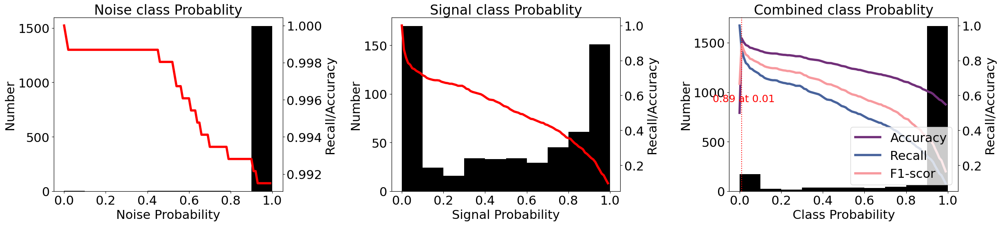

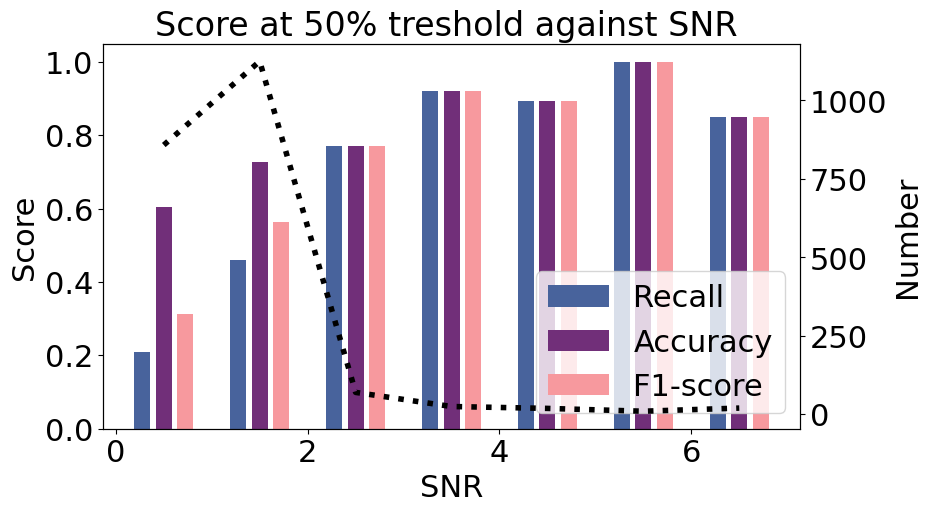

In [38]:
f1,f2, L = plotprobs(pred_list_EQT2,labels)
BestP2['EQT'] = L[0]
BestT2['EQT'] = L[1]
BestA2['EQT'] = L[3]
BestR2['EQT'] = L[2]
f1.savefig("Figure/EQT_Prob_GB.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/EQT_Snr_GB.svg", dpi=100, bbox_inches='tight')

## GPD

In [39]:
## # Load the pre-trained PhaseNet model
print(GPD.list_pretrained())
model = GPD.from_pretrained("original")
model.to('cpu:0')

['dummy', 'ethz', 'geofon', 'instance', 'iquique', 'lendb', 'neic', 'original', 'scedc', 'stead']


GPD(
  (conv1): Conv1d(3, 32, kernel_size=(21,), stride=(1,), padding=(10,))
  (bn1): BatchNorm1d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv1d(32, 64, kernel_size=(15,), stride=(1,), padding=(7,))
  (bn2): BatchNorm1d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1d(64, 128, kernel_size=(11,), stride=(1,), padding=(5,))
  (bn3): BatchNorm1d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv1d(128, 256, kernel_size=(9,), stride=(1,), padding=(4,))
  (bn4): BatchNorm1d(256, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=6400, out_features=200, bias=True)
  (bn5): BatchNorm1d(200, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (fc2): Linear(in_features=200, out_features=200, bias=True)
  (bn6): BatchNorm1d(200, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (fc3): Linear(in_features=200, out_featu

In [40]:
pred_list = []
tic()
for i in tqdm(range(len(datasetGB))):
    preds = model.annotate(datasetGB[i][0])
    pred_list.append(max(preds[0].data) )
toc()
chrono['GPD']=tac()
pred_list_GPD2 = np.array(pred_list)

  0%|                                                                                                                                | 0/2127 [00:00<?, ?it/s]

  0%|                                                                                                                        | 1/2127 [00:00<13:16,  2.67it/s]

  0%|                                                                                                                        | 2/2127 [00:00<14:34,  2.43it/s]

  0%|▏                                                                                                                       | 3/2127 [00:01<14:05,  2.51it/s]

  0%|▏                                                                                                                       | 4/2127 [00:01<11:43,  3.02it/s]

  0%|▎                                                                                                                       | 5/2127 [00:01<12:45,  2.77it/s]

  0%|▎                                                                                                                       | 6/2127 [00:02<14:45,  2.40it/s]

  0%|▍                                                                                                                       | 7/2127 [00:02<12:48,  2.76it/s]

  0%|▍                                                                                                                       | 8/2127 [00:02<11:31,  3.06it/s]

  0%|▌                                                                                                                       | 9/2127 [00:03<11:12,  3.15it/s]

  0%|▌                                                                                                                      | 10/2127 [00:03<10:37,  3.32it/s]

  1%|▌                                                                                                                      | 11/2127 [00:03<10:49,  3.26it/s]

  1%|▋                                                                                                                      | 12/2127 [00:04<11:08,  3.16it/s]

  1%|▋                                                                                                                      | 13/2127 [00:04<09:31,  3.70it/s]

  1%|▊                                                                                                                      | 14/2127 [00:04<11:32,  3.05it/s]

  1%|▊                                                                                                                      | 15/2127 [00:05<12:50,  2.74it/s]

  1%|▉                                                                                                                      | 16/2127 [00:05<11:20,  3.10it/s]

  1%|▉                                                                                                                      | 17/2127 [00:05<10:26,  3.37it/s]

  1%|█                                                                                                                      | 18/2127 [00:06<11:54,  2.95it/s]

  1%|█                                                                                                                      | 19/2127 [00:06<12:42,  2.77it/s]

  1%|█                                                                                                                      | 20/2127 [00:06<11:32,  3.04it/s]

  1%|█▏                                                                                                                     | 21/2127 [00:07<12:41,  2.76it/s]

  1%|█▏                                                                                                                     | 22/2127 [00:07<11:50,  2.96it/s]

  1%|█▎                                                                                                                     | 23/2127 [00:07<11:16,  3.11it/s]

  1%|█▎                                                                                                                     | 24/2127 [00:08<14:15,  2.46it/s]

  1%|█▍                                                                                                                     | 25/2127 [00:08<11:54,  2.94it/s]

  1%|█▍                                                                                                                     | 26/2127 [00:08<10:58,  3.19it/s]

  1%|█▌                                                                                                                     | 27/2127 [00:09<10:13,  3.42it/s]

  1%|█▌                                                                                                                     | 28/2127 [00:09<11:33,  3.03it/s]

  1%|█▌                                                                                                                     | 29/2127 [00:09<09:43,  3.60it/s]

  1%|█▋                                                                                                                     | 30/2127 [00:09<08:27,  4.13it/s]

  1%|█▋                                                                                                                     | 31/2127 [00:10<11:10,  3.13it/s]

  2%|█▊                                                                                                                     | 32/2127 [00:10<09:47,  3.57it/s]

  2%|█▊                                                                                                                     | 33/2127 [00:10<11:33,  3.02it/s]

  2%|█▉                                                                                                                     | 34/2127 [00:11<10:50,  3.22it/s]

  2%|█▉                                                                                                                     | 35/2127 [00:11<11:34,  3.01it/s]

  2%|██                                                                                                                     | 36/2127 [00:11<11:01,  3.16it/s]

  2%|██                                                                                                                     | 37/2127 [00:11<08:56,  3.89it/s]

  2%|██▏                                                                                                                    | 38/2127 [00:12<10:51,  3.21it/s]

  2%|██▏                                                                                                                    | 40/2127 [00:12<09:43,  3.58it/s]

  2%|██▎                                                                                                                    | 41/2127 [00:13<10:20,  3.36it/s]

  2%|██▎                                                                                                                    | 42/2127 [00:13<09:55,  3.50it/s]

  2%|██▍                                                                                                                    | 43/2127 [00:13<11:38,  2.98it/s]

  2%|██▍                                                                                                                    | 44/2127 [00:14<11:16,  3.08it/s]

  2%|██▌                                                                                                                    | 45/2127 [00:14<12:34,  2.76it/s]

  2%|██▌                                                                                                                    | 46/2127 [00:15<12:34,  2.76it/s]

  2%|██▋                                                                                                                    | 47/2127 [00:15<10:03,  3.44it/s]

  2%|██▋                                                                                                                    | 48/2127 [00:15<09:42,  3.57it/s]

  2%|██▋                                                                                                                    | 49/2127 [00:15<11:30,  3.01it/s]

  2%|██▊                                                                                                                    | 50/2127 [00:16<10:46,  3.21it/s]

  2%|██▊                                                                                                                    | 51/2127 [00:16<12:12,  2.83it/s]

  2%|██▉                                                                                                                    | 52/2127 [00:16<11:35,  2.98it/s]

  2%|██▉                                                                                                                    | 53/2127 [00:17<11:02,  3.13it/s]

  3%|███                                                                                                                    | 54/2127 [00:17<12:01,  2.87it/s]

  3%|███                                                                                                                    | 55/2127 [00:17<12:35,  2.74it/s]

  3%|███▏                                                                                                                   | 56/2127 [00:18<12:35,  2.74it/s]

  3%|███▏                                                                                                                   | 57/2127 [00:18<12:16,  2.81it/s]

  3%|███▏                                                                                                                   | 58/2127 [00:19<13:38,  2.53it/s]

  3%|███▎                                                                                                                   | 59/2127 [00:19<14:08,  2.44it/s]

  3%|███▎                                                                                                                   | 60/2127 [00:19<13:10,  2.61it/s]

  3%|███▍                                                                                                                   | 61/2127 [00:20<14:47,  2.33it/s]

  3%|███▍                                                                                                                   | 62/2127 [00:20<13:53,  2.48it/s]

  3%|███▌                                                                                                                   | 63/2127 [00:21<14:02,  2.45it/s]

  3%|███▌                                                                                                                   | 64/2127 [00:21<13:53,  2.47it/s]

  3%|███▋                                                                                                                   | 65/2127 [00:21<12:39,  2.72it/s]

  3%|███▋                                                                                                                   | 66/2127 [00:22<11:48,  2.91it/s]

  3%|███▋                                                                                                                   | 67/2127 [00:22<13:04,  2.62it/s]

  3%|███▊                                                                                                                   | 68/2127 [00:23<13:30,  2.54it/s]

  3%|███▊                                                                                                                   | 69/2127 [00:23<12:30,  2.74it/s]

  3%|███▉                                                                                                                   | 70/2127 [00:23<12:32,  2.73it/s]

  3%|███▉                                                                                                                   | 71/2127 [00:23<11:08,  3.08it/s]

  3%|████                                                                                                                   | 72/2127 [00:24<10:30,  3.26it/s]

  3%|████                                                                                                                   | 73/2127 [00:24<10:54,  3.14it/s]

  3%|████▏                                                                                                                  | 74/2127 [00:24<10:31,  3.25it/s]

  4%|████▏                                                                                                                  | 75/2127 [00:25<12:05,  2.83it/s]

  4%|████▎                                                                                                                  | 76/2127 [00:25<13:34,  2.52it/s]

  4%|████▎                                                                                                                  | 77/2127 [00:26<14:06,  2.42it/s]

  4%|████▎                                                                                                                  | 78/2127 [00:26<13:20,  2.56it/s]

  4%|████▍                                                                                                                  | 79/2127 [00:26<13:07,  2.60it/s]

  4%|████▍                                                                                                                  | 80/2127 [00:27<13:27,  2.53it/s]

  4%|████▌                                                                                                                  | 81/2127 [00:27<13:02,  2.61it/s]

  4%|████▌                                                                                                                  | 82/2127 [00:27<11:15,  3.03it/s]

  4%|████▋                                                                                                                  | 83/2127 [00:28<10:52,  3.13it/s]

  4%|████▋                                                                                                                  | 84/2127 [00:28<10:46,  3.16it/s]

  4%|████▊                                                                                                                  | 85/2127 [00:28<11:45,  2.89it/s]

  4%|████▊                                                                                                                  | 86/2127 [00:29<09:54,  3.43it/s]

  4%|████▊                                                                                                                  | 87/2127 [00:29<12:54,  2.63it/s]

  4%|████▉                                                                                                                  | 88/2127 [00:30<14:26,  2.35it/s]

  4%|████▉                                                                                                                  | 89/2127 [00:30<14:36,  2.33it/s]

  4%|█████                                                                                                                  | 90/2127 [00:31<14:28,  2.35it/s]

  4%|█████                                                                                                                  | 91/2127 [00:31<14:42,  2.31it/s]

  4%|█████▏                                                                                                                 | 92/2127 [00:32<15:01,  2.26it/s]

  4%|█████▏                                                                                                                 | 93/2127 [00:32<12:39,  2.68it/s]

  4%|█████▎                                                                                                                 | 94/2127 [00:32<12:04,  2.81it/s]

  4%|█████▎                                                                                                                 | 95/2127 [00:32<11:55,  2.84it/s]

  5%|█████▎                                                                                                                 | 96/2127 [00:33<12:24,  2.73it/s]

  5%|█████▍                                                                                                                 | 97/2127 [00:33<11:12,  3.02it/s]

  5%|█████▍                                                                                                                 | 98/2127 [00:34<12:25,  2.72it/s]

  5%|█████▌                                                                                                                 | 99/2127 [00:34<11:55,  2.83it/s]

  5%|█████▌                                                                                                                | 100/2127 [00:34<12:56,  2.61it/s]

  5%|█████▌                                                                                                                | 101/2127 [00:35<12:28,  2.71it/s]

  5%|█████▋                                                                                                                | 102/2127 [00:35<11:48,  2.86it/s]

  5%|█████▋                                                                                                                | 103/2127 [00:35<10:42,  3.15it/s]

  5%|█████▊                                                                                                                | 104/2127 [00:36<11:42,  2.88it/s]

  5%|█████▊                                                                                                                | 105/2127 [00:36<09:22,  3.59it/s]

  5%|█████▉                                                                                                                | 106/2127 [00:36<08:26,  3.99it/s]

  5%|█████▉                                                                                                                | 107/2127 [00:36<10:34,  3.18it/s]

  5%|█████▉                                                                                                                | 108/2127 [00:37<10:58,  3.07it/s]

  5%|██████                                                                                                                | 109/2127 [00:37<12:11,  2.76it/s]

  5%|██████                                                                                                                | 110/2127 [00:37<11:16,  2.98it/s]

  5%|██████▏                                                                                                               | 111/2127 [00:38<10:38,  3.15it/s]

  5%|██████▏                                                                                                               | 112/2127 [00:38<13:08,  2.56it/s]

  5%|██████▎                                                                                                               | 113/2127 [00:38<11:02,  3.04it/s]

  5%|██████▎                                                                                                               | 114/2127 [00:39<13:23,  2.51it/s]

  5%|██████▍                                                                                                               | 115/2127 [00:39<12:30,  2.68it/s]

  5%|██████▍                                                                                                               | 116/2127 [00:40<10:51,  3.09it/s]

  6%|██████▍                                                                                                               | 117/2127 [00:40<09:55,  3.38it/s]

  6%|██████▌                                                                                                               | 118/2127 [00:40<11:13,  2.98it/s]

  6%|██████▌                                                                                                               | 119/2127 [00:41<11:27,  2.92it/s]

  6%|██████▋                                                                                                               | 120/2127 [00:41<10:33,  3.17it/s]

  6%|██████▋                                                                                                               | 121/2127 [00:41<11:37,  2.88it/s]

  6%|██████▊                                                                                                               | 122/2127 [00:41<10:38,  3.14it/s]

  6%|██████▊                                                                                                               | 123/2127 [00:42<10:28,  3.19it/s]

  6%|██████▉                                                                                                               | 124/2127 [00:42<12:37,  2.65it/s]

  6%|██████▉                                                                                                               | 125/2127 [00:43<10:53,  3.06it/s]

  6%|██████▉                                                                                                               | 126/2127 [00:43<10:28,  3.18it/s]

  6%|███████                                                                                                               | 127/2127 [00:43<12:44,  2.62it/s]

  6%|███████                                                                                                               | 128/2127 [00:44<12:57,  2.57it/s]

  6%|███████▏                                                                                                              | 129/2127 [00:44<10:41,  3.11it/s]

  6%|███████▏                                                                                                              | 130/2127 [00:44<09:40,  3.44it/s]

  6%|███████▎                                                                                                              | 131/2127 [00:45<12:41,  2.62it/s]

  6%|███████▎                                                                                                              | 132/2127 [00:45<11:44,  2.83it/s]

  6%|███████▍                                                                                                              | 133/2127 [00:45<11:11,  2.97it/s]

  6%|███████▍                                                                                                              | 134/2127 [00:46<10:40,  3.11it/s]

  6%|███████▍                                                                                                              | 135/2127 [00:46<11:17,  2.94it/s]

  6%|███████▌                                                                                                              | 136/2127 [00:46<10:28,  3.17it/s]

  6%|███████▌                                                                                                              | 137/2127 [00:47<10:10,  3.26it/s]

  6%|███████▋                                                                                                              | 138/2127 [00:47<12:45,  2.60it/s]

  7%|███████▋                                                                                                              | 139/2127 [00:47<11:40,  2.84it/s]

  7%|███████▊                                                                                                              | 140/2127 [00:48<11:35,  2.86it/s]

  7%|███████▊                                                                                                              | 141/2127 [00:48<14:13,  2.33it/s]

  7%|███████▉                                                                                                              | 142/2127 [00:49<15:15,  2.17it/s]

  7%|███████▉                                                                                                              | 143/2127 [00:49<13:12,  2.50it/s]

  7%|███████▉                                                                                                              | 144/2127 [00:49<11:34,  2.86it/s]

  7%|████████                                                                                                              | 145/2127 [00:50<10:38,  3.11it/s]

  7%|████████                                                                                                              | 146/2127 [00:50<12:31,  2.64it/s]

  7%|████████▏                                                                                                             | 147/2127 [00:50<10:45,  3.07it/s]

  7%|████████▏                                                                                                             | 148/2127 [00:51<09:57,  3.31it/s]

  7%|████████▎                                                                                                             | 149/2127 [00:51<11:22,  2.90it/s]

  7%|████████▎                                                                                                             | 150/2127 [00:51<10:47,  3.05it/s]

  7%|████████▍                                                                                                             | 151/2127 [00:52<11:19,  2.91it/s]

  7%|████████▍                                                                                                             | 152/2127 [00:52<11:17,  2.91it/s]

  7%|████████▍                                                                                                             | 153/2127 [00:52<09:59,  3.29it/s]

  7%|████████▌                                                                                                             | 154/2127 [00:53<10:50,  3.03it/s]

  7%|████████▌                                                                                                             | 155/2127 [00:53<10:29,  3.13it/s]

  7%|████████▋                                                                                                             | 156/2127 [00:53<11:49,  2.78it/s]

  7%|████████▋                                                                                                             | 157/2127 [00:54<11:26,  2.87it/s]

  7%|████████▊                                                                                                             | 158/2127 [00:54<11:48,  2.78it/s]

  7%|████████▊                                                                                                             | 159/2127 [00:54<10:44,  3.06it/s]

  8%|████████▉                                                                                                             | 160/2127 [00:55<11:04,  2.96it/s]

  8%|████████▉                                                                                                             | 161/2127 [00:55<10:51,  3.02it/s]

  8%|████████▉                                                                                                             | 162/2127 [00:55<12:08,  2.70it/s]

  8%|█████████                                                                                                             | 163/2127 [00:56<11:01,  2.97it/s]

  8%|█████████                                                                                                             | 164/2127 [00:56<12:58,  2.52it/s]

  8%|█████████▏                                                                                                            | 165/2127 [00:57<11:31,  2.84it/s]

  8%|█████████▏                                                                                                            | 166/2127 [00:57<12:27,  2.62it/s]

  8%|█████████▎                                                                                                            | 167/2127 [00:58<15:00,  2.18it/s]

  8%|█████████▎                                                                                                            | 168/2127 [00:58<14:44,  2.22it/s]

  8%|█████████▍                                                                                                            | 169/2127 [00:58<13:29,  2.42it/s]

  8%|█████████▍                                                                                                            | 170/2127 [00:59<13:18,  2.45it/s]

  8%|█████████▍                                                                                                            | 171/2127 [00:59<12:44,  2.56it/s]

  8%|█████████▌                                                                                                            | 172/2127 [00:59<12:03,  2.70it/s]

  8%|█████████▌                                                                                                            | 173/2127 [01:00<11:44,  2.77it/s]

  8%|█████████▋                                                                                                            | 174/2127 [01:00<11:13,  2.90it/s]

  8%|█████████▋                                                                                                            | 175/2127 [01:00<09:08,  3.56it/s]

  8%|█████████▊                                                                                                            | 176/2127 [01:01<10:10,  3.19it/s]

  8%|█████████▊                                                                                                            | 177/2127 [01:01<08:52,  3.66it/s]

  8%|█████████▊                                                                                                            | 178/2127 [01:01<08:15,  3.94it/s]

  8%|█████████▉                                                                                                            | 179/2127 [01:01<08:08,  3.99it/s]

  8%|█████████▉                                                                                                            | 180/2127 [01:01<06:50,  4.74it/s]

  9%|██████████                                                                                                            | 181/2127 [01:02<09:07,  3.55it/s]

  9%|██████████                                                                                                            | 182/2127 [01:02<08:57,  3.62it/s]

  9%|██████████▏                                                                                                           | 183/2127 [01:02<08:42,  3.72it/s]

  9%|██████████▏                                                                                                           | 184/2127 [01:03<09:24,  3.44it/s]

  9%|██████████▎                                                                                                           | 185/2127 [01:03<11:03,  2.93it/s]

  9%|██████████▎                                                                                                           | 186/2127 [01:04<12:00,  2.69it/s]

  9%|██████████▎                                                                                                           | 187/2127 [01:04<11:12,  2.89it/s]

  9%|██████████▍                                                                                                           | 188/2127 [01:04<09:10,  3.52it/s]

  9%|██████████▍                                                                                                           | 189/2127 [01:04<09:56,  3.25it/s]

  9%|██████████▌                                                                                                           | 190/2127 [01:04<08:15,  3.91it/s]

  9%|██████████▌                                                                                                           | 191/2127 [01:05<08:21,  3.86it/s]

  9%|██████████▋                                                                                                           | 192/2127 [01:05<07:10,  4.49it/s]

  9%|██████████▋                                                                                                           | 193/2127 [01:05<08:12,  3.93it/s]

  9%|██████████▊                                                                                                           | 194/2127 [01:05<08:03,  4.00it/s]

  9%|██████████▊                                                                                                           | 195/2127 [01:06<09:48,  3.28it/s]

  9%|██████████▊                                                                                                           | 196/2127 [01:06<11:42,  2.75it/s]

  9%|██████████▉                                                                                                           | 197/2127 [01:07<11:52,  2.71it/s]

  9%|██████████▉                                                                                                           | 198/2127 [01:07<11:09,  2.88it/s]

  9%|███████████                                                                                                           | 199/2127 [01:07<09:47,  3.28it/s]

  9%|███████████                                                                                                           | 200/2127 [01:08<12:19,  2.61it/s]

  9%|███████████▏                                                                                                          | 201/2127 [01:08<10:28,  3.07it/s]

  9%|███████████▏                                                                                                          | 202/2127 [01:08<10:26,  3.07it/s]

 10%|███████████▎                                                                                                          | 203/2127 [01:09<09:14,  3.47it/s]

 10%|███████████▎                                                                                                          | 204/2127 [01:09<09:53,  3.24it/s]

 10%|███████████▎                                                                                                          | 205/2127 [01:09<10:47,  2.97it/s]

 10%|███████████▍                                                                                                          | 206/2127 [01:10<09:54,  3.23it/s]

 10%|███████████▍                                                                                                          | 207/2127 [01:10<09:32,  3.36it/s]

 10%|███████████▌                                                                                                          | 208/2127 [01:10<08:01,  3.98it/s]

 10%|███████████▌                                                                                                          | 209/2127 [01:10<08:41,  3.68it/s]

 10%|███████████▋                                                                                                          | 210/2127 [01:11<09:12,  3.47it/s]

 10%|███████████▋                                                                                                          | 211/2127 [01:11<07:29,  4.27it/s]

 10%|███████████▊                                                                                                          | 212/2127 [01:11<08:27,  3.77it/s]

 10%|███████████▊                                                                                                          | 213/2127 [01:11<10:04,  3.17it/s]

 10%|███████████▊                                                                                                          | 214/2127 [01:12<11:12,  2.84it/s]

 10%|███████████▉                                                                                                          | 215/2127 [01:12<11:43,  2.72it/s]

 10%|███████████▉                                                                                                          | 216/2127 [01:12<09:10,  3.47it/s]

 10%|████████████                                                                                                          | 217/2127 [01:13<07:44,  4.11it/s]

 10%|████████████                                                                                                          | 218/2127 [01:13<09:36,  3.31it/s]

 10%|████████████▏                                                                                                         | 219/2127 [01:13<10:31,  3.02it/s]

 10%|████████████▏                                                                                                         | 220/2127 [01:14<09:49,  3.24it/s]

 10%|████████████▎                                                                                                         | 221/2127 [01:14<09:47,  3.25it/s]

 10%|████████████▎                                                                                                         | 222/2127 [01:14<11:01,  2.88it/s]

 10%|████████████▎                                                                                                         | 223/2127 [01:15<10:25,  3.04it/s]

 11%|████████████▍                                                                                                         | 224/2127 [01:15<11:42,  2.71it/s]

 11%|████████████▍                                                                                                         | 225/2127 [01:16<12:22,  2.56it/s]

 11%|████████████▌                                                                                                         | 226/2127 [01:16<11:23,  2.78it/s]

 11%|████████████▌                                                                                                         | 227/2127 [01:16<11:03,  2.86it/s]

 11%|████████████▋                                                                                                         | 228/2127 [01:17<10:39,  2.97it/s]

 11%|████████████▋                                                                                                         | 229/2127 [01:17<09:13,  3.43it/s]

 11%|████████████▊                                                                                                         | 230/2127 [01:17<10:37,  2.98it/s]

 11%|████████████▊                                                                                                         | 231/2127 [01:17<09:07,  3.46it/s]

 11%|████████████▊                                                                                                         | 232/2127 [01:18<09:23,  3.36it/s]

 11%|████████████▉                                                                                                         | 233/2127 [01:18<09:33,  3.30it/s]

 11%|████████████▉                                                                                                         | 234/2127 [01:18<10:58,  2.88it/s]

 11%|█████████████                                                                                                         | 235/2127 [01:19<11:32,  2.73it/s]

 11%|█████████████                                                                                                         | 236/2127 [01:19<11:10,  2.82it/s]

 11%|█████████████▏                                                                                                        | 237/2127 [01:20<11:17,  2.79it/s]

 11%|█████████████▏                                                                                                        | 238/2127 [01:20<10:54,  2.88it/s]

 11%|█████████████▎                                                                                                        | 239/2127 [01:20<09:09,  3.44it/s]

 11%|█████████████▎                                                                                                        | 240/2127 [01:20<09:06,  3.45it/s]

 11%|█████████████▎                                                                                                        | 241/2127 [01:21<09:31,  3.30it/s]

 11%|█████████████▍                                                                                                        | 242/2127 [01:21<09:43,  3.23it/s]

 11%|█████████████▍                                                                                                        | 243/2127 [01:21<10:50,  2.90it/s]

 11%|█████████████▌                                                                                                        | 244/2127 [01:22<10:46,  2.91it/s]

 12%|█████████████▌                                                                                                        | 245/2127 [01:22<10:27,  3.00it/s]

 12%|█████████████▋                                                                                                        | 246/2127 [01:22<11:15,  2.78it/s]

 12%|█████████████▋                                                                                                        | 247/2127 [01:23<09:22,  3.34it/s]

 12%|█████████████▊                                                                                                        | 248/2127 [01:23<07:54,  3.96it/s]

 12%|█████████████▊                                                                                                        | 249/2127 [01:23<09:27,  3.31it/s]

 12%|█████████████▊                                                                                                        | 250/2127 [01:24<11:02,  2.83it/s]

 12%|█████████████▉                                                                                                        | 251/2127 [01:24<10:28,  2.99it/s]

 12%|█████████████▉                                                                                                        | 252/2127 [01:24<11:58,  2.61it/s]

 12%|██████████████                                                                                                        | 253/2127 [01:25<12:21,  2.53it/s]

 12%|██████████████                                                                                                        | 254/2127 [01:25<11:51,  2.63it/s]

 12%|██████████████▏                                                                                                       | 255/2127 [01:26<11:43,  2.66it/s]

 12%|██████████████▏                                                                                                       | 256/2127 [01:26<11:01,  2.83it/s]

 12%|██████████████▎                                                                                                       | 257/2127 [01:26<11:49,  2.63it/s]

 12%|██████████████▎                                                                                                       | 258/2127 [01:27<10:19,  3.02it/s]

 12%|██████████████▎                                                                                                       | 259/2127 [01:27<10:38,  2.93it/s]

 12%|██████████████▍                                                                                                       | 260/2127 [01:27<08:46,  3.54it/s]

 12%|██████████████▍                                                                                                       | 261/2127 [01:28<10:44,  2.89it/s]

 12%|██████████████▌                                                                                                       | 262/2127 [01:28<08:26,  3.68it/s]

 12%|██████████████▌                                                                                                       | 263/2127 [01:28<09:21,  3.32it/s]

 12%|██████████████▋                                                                                                       | 264/2127 [01:29<11:30,  2.70it/s]

 12%|██████████████▋                                                                                                       | 265/2127 [01:29<11:13,  2.76it/s]

 13%|██████████████▊                                                                                                       | 266/2127 [01:29<10:38,  2.91it/s]

 13%|██████████████▊                                                                                                       | 267/2127 [01:29<09:42,  3.19it/s]

 13%|██████████████▊                                                                                                       | 268/2127 [01:30<10:11,  3.04it/s]

 13%|██████████████▉                                                                                                       | 269/2127 [01:30<10:22,  2.98it/s]

 13%|██████████████▉                                                                                                       | 270/2127 [01:30<09:29,  3.26it/s]

 13%|███████████████                                                                                                       | 271/2127 [01:31<09:35,  3.23it/s]

 13%|███████████████                                                                                                       | 272/2127 [01:31<09:08,  3.38it/s]

 13%|███████████████▏                                                                                                      | 273/2127 [01:31<09:19,  3.31it/s]

 13%|███████████████▏                                                                                                      | 274/2127 [01:32<09:49,  3.15it/s]

 13%|███████████████▎                                                                                                      | 275/2127 [01:32<08:27,  3.65it/s]

 13%|███████████████▎                                                                                                      | 276/2127 [01:32<07:48,  3.95it/s]

 13%|███████████████▎                                                                                                      | 277/2127 [01:32<08:49,  3.49it/s]

 13%|███████████████▍                                                                                                      | 278/2127 [01:33<08:45,  3.52it/s]

 13%|███████████████▍                                                                                                      | 279/2127 [01:33<08:07,  3.79it/s]

 13%|███████████████▌                                                                                                      | 280/2127 [01:33<07:50,  3.93it/s]

 13%|███████████████▌                                                                                                      | 281/2127 [01:33<07:48,  3.94it/s]

 13%|███████████████▋                                                                                                      | 282/2127 [01:34<07:30,  4.10it/s]

 13%|███████████████▋                                                                                                      | 283/2127 [01:34<09:11,  3.35it/s]

 13%|███████████████▊                                                                                                      | 284/2127 [01:34<08:46,  3.50it/s]

 13%|███████████████▊                                                                                                      | 285/2127 [01:35<09:26,  3.25it/s]

 13%|███████████████▊                                                                                                      | 286/2127 [01:35<10:38,  2.89it/s]

 13%|███████████████▉                                                                                                      | 287/2127 [01:35<10:00,  3.07it/s]

 14%|███████████████▉                                                                                                      | 288/2127 [01:36<10:51,  2.82it/s]

 14%|████████████████                                                                                                      | 289/2127 [01:36<12:01,  2.55it/s]

 14%|████████████████                                                                                                      | 290/2127 [01:37<13:32,  2.26it/s]

 14%|████████████████▏                                                                                                     | 291/2127 [01:37<12:09,  2.52it/s]

 14%|████████████████▏                                                                                                     | 292/2127 [01:37<11:06,  2.75it/s]

 14%|████████████████▎                                                                                                     | 293/2127 [01:38<10:32,  2.90it/s]

 14%|████████████████▎                                                                                                     | 294/2127 [01:38<11:15,  2.71it/s]

 14%|████████████████▎                                                                                                     | 295/2127 [01:38<10:27,  2.92it/s]

 14%|████████████████▍                                                                                                     | 296/2127 [01:39<09:01,  3.38it/s]

 14%|████████████████▍                                                                                                     | 297/2127 [01:39<09:07,  3.34it/s]

 14%|████████████████▌                                                                                                     | 298/2127 [01:39<11:03,  2.76it/s]

 14%|████████████████▌                                                                                                     | 299/2127 [01:40<10:41,  2.85it/s]

 14%|████████████████▋                                                                                                     | 300/2127 [01:40<09:16,  3.28it/s]

 14%|████████████████▋                                                                                                     | 301/2127 [01:40<08:44,  3.48it/s]

 14%|████████████████▊                                                                                                     | 302/2127 [01:40<08:43,  3.48it/s]

 14%|████████████████▊                                                                                                     | 303/2127 [01:41<08:44,  3.48it/s]

 14%|████████████████▊                                                                                                     | 304/2127 [01:41<09:02,  3.36it/s]

 14%|████████████████▉                                                                                                     | 305/2127 [01:41<08:47,  3.45it/s]

 14%|████████████████▉                                                                                                     | 306/2127 [01:42<09:47,  3.10it/s]

 14%|█████████████████                                                                                                     | 307/2127 [01:42<13:00,  2.33it/s]

 14%|█████████████████                                                                                                     | 308/2127 [01:43<10:40,  2.84it/s]

 15%|█████████████████▏                                                                                                    | 309/2127 [01:43<08:39,  3.50it/s]

 15%|█████████████████▏                                                                                                    | 310/2127 [01:43<10:10,  2.98it/s]

 15%|█████████████████▎                                                                                                    | 311/2127 [01:43<09:02,  3.35it/s]

 15%|█████████████████▎                                                                                                    | 312/2127 [01:44<09:45,  3.10it/s]

 15%|█████████████████▎                                                                                                    | 313/2127 [01:44<11:32,  2.62it/s]

 15%|█████████████████▍                                                                                                    | 314/2127 [01:45<11:58,  2.52it/s]

 15%|█████████████████▍                                                                                                    | 315/2127 [01:45<11:51,  2.55it/s]

 15%|█████████████████▌                                                                                                    | 316/2127 [01:45<10:25,  2.90it/s]

 15%|█████████████████▌                                                                                                    | 317/2127 [01:46<11:22,  2.65it/s]

 15%|█████████████████▋                                                                                                    | 318/2127 [01:46<12:11,  2.47it/s]

 15%|█████████████████▋                                                                                                    | 319/2127 [01:46<11:00,  2.74it/s]

 15%|█████████████████▊                                                                                                    | 320/2127 [01:47<11:24,  2.64it/s]

 15%|█████████████████▊                                                                                                    | 321/2127 [01:47<12:16,  2.45it/s]

 15%|█████████████████▊                                                                                                    | 322/2127 [01:48<11:22,  2.64it/s]

 15%|█████████████████▉                                                                                                    | 323/2127 [01:48<10:42,  2.81it/s]

 15%|█████████████████▉                                                                                                    | 324/2127 [01:48<09:27,  3.18it/s]

 15%|██████████████████                                                                                                    | 325/2127 [01:49<10:33,  2.84it/s]

 15%|██████████████████                                                                                                    | 326/2127 [01:49<12:45,  2.35it/s]

 15%|██████████████████▏                                                                                                   | 327/2127 [01:49<11:18,  2.65it/s]

 15%|██████████████████▏                                                                                                   | 328/2127 [01:50<11:46,  2.55it/s]

 15%|██████████████████▎                                                                                                   | 329/2127 [01:50<10:27,  2.87it/s]

 16%|██████████████████▎                                                                                                   | 330/2127 [01:51<11:46,  2.54it/s]

 16%|██████████████████▎                                                                                                   | 331/2127 [01:51<11:29,  2.60it/s]

 16%|██████████████████▍                                                                                                   | 332/2127 [01:51<11:25,  2.62it/s]

 16%|██████████████████▍                                                                                                   | 333/2127 [01:52<10:35,  2.82it/s]

 16%|██████████████████▌                                                                                                   | 334/2127 [01:52<09:57,  3.00it/s]

 16%|██████████████████▌                                                                                                   | 335/2127 [01:52<10:42,  2.79it/s]

 16%|██████████████████▋                                                                                                   | 336/2127 [01:53<11:49,  2.52it/s]

 16%|██████████████████▋                                                                                                   | 337/2127 [01:53<09:48,  3.04it/s]

 16%|██████████████████▊                                                                                                   | 338/2127 [01:53<10:45,  2.77it/s]

 16%|██████████████████▊                                                                                                   | 339/2127 [01:54<08:52,  3.36it/s]

 16%|██████████████████▊                                                                                                   | 340/2127 [01:54<08:33,  3.48it/s]

 16%|██████████████████▉                                                                                                   | 341/2127 [01:54<08:34,  3.47it/s]

 16%|██████████████████▉                                                                                                   | 342/2127 [01:54<07:14,  4.10it/s]

 16%|███████████████████                                                                                                   | 343/2127 [01:55<09:21,  3.18it/s]

 16%|███████████████████                                                                                                   | 344/2127 [01:55<10:48,  2.75it/s]

 16%|███████████████████▏                                                                                                  | 345/2127 [01:56<11:38,  2.55it/s]

 16%|███████████████████▎                                                                                                  | 347/2127 [01:56<08:35,  3.46it/s]

 16%|███████████████████▎                                                                                                  | 348/2127 [01:56<08:28,  3.50it/s]

 16%|███████████████████▎                                                                                                  | 349/2127 [01:57<09:04,  3.26it/s]

 16%|███████████████████▍                                                                                                  | 350/2127 [01:57<08:36,  3.44it/s]

 17%|███████████████████▍                                                                                                  | 351/2127 [01:57<08:16,  3.58it/s]

 17%|███████████████████▌                                                                                                  | 352/2127 [01:58<09:39,  3.06it/s]

 17%|███████████████████▌                                                                                                  | 353/2127 [01:58<08:48,  3.36it/s]

 17%|███████████████████▋                                                                                                  | 354/2127 [01:58<07:57,  3.71it/s]

 17%|███████████████████▋                                                                                                  | 355/2127 [01:58<07:40,  3.85it/s]

 17%|███████████████████▋                                                                                                  | 356/2127 [01:59<07:47,  3.79it/s]

 17%|███████████████████▊                                                                                                  | 357/2127 [01:59<08:02,  3.67it/s]

 17%|███████████████████▊                                                                                                  | 358/2127 [01:59<08:38,  3.41it/s]

 17%|███████████████████▉                                                                                                  | 359/2127 [02:00<10:06,  2.91it/s]

 17%|███████████████████▉                                                                                                  | 360/2127 [02:00<11:06,  2.65it/s]

 17%|████████████████████                                                                                                  | 361/2127 [02:01<11:29,  2.56it/s]

 17%|████████████████████                                                                                                  | 362/2127 [02:01<12:01,  2.44it/s]

 17%|████████████████████▏                                                                                                 | 363/2127 [02:01<11:16,  2.61it/s]

 17%|████████████████████▏                                                                                                 | 364/2127 [02:02<10:27,  2.81it/s]

 17%|████████████████████▏                                                                                                 | 365/2127 [02:02<09:50,  2.98it/s]

 17%|████████████████████▎                                                                                                 | 366/2127 [02:02<09:46,  3.00it/s]

 17%|████████████████████▎                                                                                                 | 367/2127 [02:03<10:35,  2.77it/s]

 17%|████████████████████▍                                                                                                 | 368/2127 [02:03<09:55,  2.95it/s]

 17%|████████████████████▍                                                                                                 | 369/2127 [02:03<10:37,  2.76it/s]

 17%|████████████████████▌                                                                                                 | 370/2127 [02:04<11:52,  2.46it/s]

 17%|████████████████████▌                                                                                                 | 371/2127 [02:04<11:54,  2.46it/s]

 17%|████████████████████▋                                                                                                 | 372/2127 [02:05<10:40,  2.74it/s]

 18%|████████████████████▋                                                                                                 | 373/2127 [02:05<12:26,  2.35it/s]

 18%|████████████████████▋                                                                                                 | 374/2127 [02:05<10:51,  2.69it/s]

 18%|████████████████████▊                                                                                                 | 375/2127 [02:06<10:26,  2.80it/s]

 18%|████████████████████▊                                                                                                 | 376/2127 [02:06<11:21,  2.57it/s]

 18%|████████████████████▉                                                                                                 | 377/2127 [02:07<10:55,  2.67it/s]

 18%|████████████████████▉                                                                                                 | 378/2127 [02:07<09:57,  2.93it/s]

 18%|█████████████████████                                                                                                 | 379/2127 [02:07<10:05,  2.89it/s]

 18%|█████████████████████                                                                                                 | 380/2127 [02:08<11:07,  2.62it/s]

 18%|█████████████████████▏                                                                                                | 381/2127 [02:08<12:59,  2.24it/s]

 18%|█████████████████████▏                                                                                                | 382/2127 [02:09<11:52,  2.45it/s]

 18%|█████████████████████▏                                                                                                | 383/2127 [02:09<10:49,  2.68it/s]

 18%|█████████████████████▎                                                                                                | 384/2127 [02:09<10:11,  2.85it/s]

 18%|█████████████████████▎                                                                                                | 385/2127 [02:09<09:26,  3.07it/s]

 18%|█████████████████████▍                                                                                                | 386/2127 [02:10<10:58,  2.64it/s]

 18%|█████████████████████▍                                                                                                | 387/2127 [02:10<08:33,  3.39it/s]

 18%|█████████████████████▌                                                                                                | 388/2127 [02:10<08:33,  3.39it/s]

 18%|█████████████████████▌                                                                                                | 389/2127 [02:10<07:23,  3.92it/s]

 18%|█████████████████████▋                                                                                                | 390/2127 [02:11<06:13,  4.65it/s]

 18%|█████████████████████▋                                                                                                | 391/2127 [02:11<08:34,  3.37it/s]

 18%|█████████████████████▋                                                                                                | 392/2127 [02:11<08:20,  3.47it/s]

 18%|█████████████████████▊                                                                                                | 393/2127 [02:12<08:12,  3.52it/s]

 19%|█████████████████████▊                                                                                                | 394/2127 [02:12<07:56,  3.64it/s]

 19%|█████████████████████▉                                                                                                | 395/2127 [02:12<07:46,  3.72it/s]

 19%|█████████████████████▉                                                                                                | 396/2127 [02:13<08:54,  3.24it/s]

 19%|██████████████████████                                                                                                | 397/2127 [02:13<07:33,  3.81it/s]

 19%|██████████████████████                                                                                                | 398/2127 [02:13<08:58,  3.21it/s]

 19%|██████████████████████▏                                                                                               | 400/2127 [02:13<07:14,  3.98it/s]

 19%|██████████████████████▏                                                                                               | 401/2127 [02:14<06:17,  4.57it/s]

 19%|██████████████████████▎                                                                                               | 402/2127 [02:14<07:02,  4.08it/s]

 19%|██████████████████████▎                                                                                               | 403/2127 [02:14<08:03,  3.57it/s]

 19%|██████████████████████▍                                                                                               | 404/2127 [02:15<07:54,  3.63it/s]

 19%|██████████████████████▍                                                                                               | 405/2127 [02:15<08:26,  3.40it/s]

 19%|██████████████████████▌                                                                                               | 406/2127 [02:15<07:38,  3.76it/s]

 19%|██████████████████████▌                                                                                               | 407/2127 [02:15<08:33,  3.35it/s]

 19%|██████████████████████▋                                                                                               | 408/2127 [02:16<07:51,  3.65it/s]

 19%|██████████████████████▋                                                                                               | 409/2127 [02:16<08:41,  3.29it/s]

 19%|██████████████████████▋                                                                                               | 410/2127 [02:16<08:19,  3.44it/s]

 19%|██████████████████████▊                                                                                               | 411/2127 [02:17<09:29,  3.01it/s]

 19%|██████████████████████▊                                                                                               | 412/2127 [02:17<10:08,  2.82it/s]

 19%|██████████████████████▉                                                                                               | 413/2127 [02:18<11:09,  2.56it/s]

 19%|██████████████████████▉                                                                                               | 414/2127 [02:18<09:51,  2.90it/s]

 20%|███████████████████████                                                                                               | 415/2127 [02:18<10:35,  2.69it/s]

 20%|███████████████████████                                                                                               | 416/2127 [02:19<10:49,  2.63it/s]

 20%|███████████████████████▏                                                                                              | 417/2127 [02:19<08:53,  3.20it/s]

 20%|███████████████████████▏                                                                                              | 418/2127 [02:19<09:50,  2.89it/s]

 20%|███████████████████████▏                                                                                              | 419/2127 [02:20<10:27,  2.72it/s]

 20%|███████████████████████▎                                                                                              | 420/2127 [02:20<09:35,  2.97it/s]

 20%|███████████████████████▎                                                                                              | 421/2127 [02:20<09:09,  3.11it/s]

 20%|███████████████████████▍                                                                                              | 422/2127 [02:20<07:22,  3.85it/s]

 20%|███████████████████████▍                                                                                              | 423/2127 [02:21<07:52,  3.61it/s]

 20%|███████████████████████▌                                                                                              | 424/2127 [02:21<07:37,  3.72it/s]

 20%|███████████████████████▌                                                                                              | 425/2127 [02:21<08:58,  3.16it/s]

 20%|███████████████████████▋                                                                                              | 426/2127 [02:22<08:15,  3.43it/s]

 20%|███████████████████████▋                                                                                              | 427/2127 [02:22<08:48,  3.22it/s]

 20%|███████████████████████▋                                                                                              | 428/2127 [02:22<09:21,  3.02it/s]

 20%|███████████████████████▊                                                                                              | 429/2127 [02:22<08:08,  3.48it/s]

 20%|███████████████████████▊                                                                                              | 430/2127 [02:23<08:08,  3.47it/s]

 20%|███████████████████████▉                                                                                              | 431/2127 [02:23<09:33,  2.96it/s]

 20%|███████████████████████▉                                                                                              | 432/2127 [02:24<09:51,  2.87it/s]

 20%|████████████████████████                                                                                              | 433/2127 [02:24<09:48,  2.88it/s]

 20%|████████████████████████                                                                                              | 434/2127 [02:24<10:01,  2.82it/s]

 20%|████████████████████████▏                                                                                             | 435/2127 [02:24<07:52,  3.58it/s]

 20%|████████████████████████▏                                                                                             | 436/2127 [02:25<09:05,  3.10it/s]

 21%|████████████████████████▏                                                                                             | 437/2127 [02:25<08:30,  3.31it/s]

 21%|████████████████████████▎                                                                                             | 438/2127 [02:25<08:05,  3.48it/s]

 21%|████████████████████████▎                                                                                             | 439/2127 [02:26<07:25,  3.79it/s]

 21%|████████████████████████▍                                                                                             | 440/2127 [02:26<07:24,  3.79it/s]

 21%|████████████████████████▍                                                                                             | 441/2127 [02:26<07:26,  3.78it/s]

 21%|████████████████████████▌                                                                                             | 442/2127 [02:26<07:14,  3.88it/s]

 21%|████████████████████████▌                                                                                             | 443/2127 [02:27<08:58,  3.13it/s]

 21%|████████████████████████▋                                                                                             | 444/2127 [02:27<07:17,  3.85it/s]

 21%|████████████████████████▋                                                                                             | 445/2127 [02:27<07:22,  3.80it/s]

 21%|████████████████████████▋                                                                                             | 446/2127 [02:27<06:53,  4.06it/s]

 21%|████████████████████████▊                                                                                             | 447/2127 [02:28<08:31,  3.29it/s]

 21%|████████████████████████▊                                                                                             | 448/2127 [02:28<08:19,  3.36it/s]

 21%|████████████████████████▉                                                                                             | 449/2127 [02:28<07:53,  3.55it/s]

 21%|████████████████████████▉                                                                                             | 450/2127 [02:29<08:34,  3.26it/s]

 21%|█████████████████████████                                                                                             | 451/2127 [02:29<08:04,  3.46it/s]

 21%|█████████████████████████                                                                                             | 452/2127 [02:29<08:51,  3.15it/s]

 21%|█████████████████████████▏                                                                                            | 453/2127 [02:30<07:43,  3.61it/s]

 21%|█████████████████████████▏                                                                                            | 454/2127 [02:30<07:30,  3.72it/s]

 21%|█████████████████████████▏                                                                                            | 455/2127 [02:30<07:31,  3.70it/s]

 21%|█████████████████████████▎                                                                                            | 456/2127 [02:30<07:25,  3.75it/s]

 21%|█████████████████████████▎                                                                                            | 457/2127 [02:31<07:07,  3.91it/s]

 22%|█████████████████████████▍                                                                                            | 458/2127 [02:31<07:33,  3.68it/s]

 22%|█████████████████████████▍                                                                                            | 459/2127 [02:31<08:20,  3.33it/s]

 22%|█████████████████████████▌                                                                                            | 460/2127 [02:32<08:47,  3.16it/s]

 22%|█████████████████████████▌                                                                                            | 461/2127 [02:32<07:34,  3.67it/s]

 22%|█████████████████████████▋                                                                                            | 462/2127 [02:32<08:20,  3.33it/s]

 22%|█████████████████████████▋                                                                                            | 463/2127 [02:32<07:58,  3.48it/s]

 22%|█████████████████████████▋                                                                                            | 464/2127 [02:33<08:37,  3.21it/s]

 22%|█████████████████████████▊                                                                                            | 465/2127 [02:33<07:53,  3.51it/s]

 22%|█████████████████████████▊                                                                                            | 466/2127 [02:33<07:47,  3.55it/s]

 22%|█████████████████████████▉                                                                                            | 467/2127 [02:34<07:48,  3.55it/s]

 22%|█████████████████████████▉                                                                                            | 468/2127 [02:34<08:09,  3.39it/s]

 22%|██████████████████████████                                                                                            | 469/2127 [02:34<07:55,  3.49it/s]

 22%|██████████████████████████                                                                                            | 470/2127 [02:34<07:42,  3.59it/s]

 22%|██████████████████████████▏                                                                                           | 471/2127 [02:35<09:01,  3.06it/s]

 22%|██████████████████████████▏                                                                                           | 472/2127 [02:35<08:14,  3.35it/s]

 22%|██████████████████████████▏                                                                                           | 473/2127 [02:35<08:53,  3.10it/s]

 22%|██████████████████████████▎                                                                                           | 474/2127 [02:36<08:20,  3.30it/s]

 22%|██████████████████████████▎                                                                                           | 475/2127 [02:36<07:59,  3.44it/s]

 22%|██████████████████████████▍                                                                                           | 476/2127 [02:36<08:22,  3.29it/s]

 22%|██████████████████████████▍                                                                                           | 477/2127 [02:37<09:27,  2.91it/s]

 22%|██████████████████████████▌                                                                                           | 478/2127 [02:37<08:43,  3.15it/s]

 23%|██████████████████████████▌                                                                                           | 479/2127 [02:37<09:50,  2.79it/s]

 23%|██████████████████████████▋                                                                                           | 480/2127 [02:38<09:52,  2.78it/s]

 23%|██████████████████████████▋                                                                                           | 481/2127 [02:38<09:34,  2.87it/s]

 23%|██████████████████████████▋                                                                                           | 482/2127 [02:38<09:14,  2.96it/s]

 23%|██████████████████████████▊                                                                                           | 483/2127 [02:39<10:10,  2.69it/s]

 23%|██████████████████████████▊                                                                                           | 484/2127 [02:39<08:30,  3.22it/s]

 23%|██████████████████████████▉                                                                                           | 485/2127 [02:39<08:12,  3.34it/s]

 23%|██████████████████████████▉                                                                                           | 486/2127 [02:40<07:58,  3.43it/s]

 23%|███████████████████████████                                                                                           | 487/2127 [02:40<07:42,  3.54it/s]

 23%|███████████████████████████                                                                                           | 488/2127 [02:40<09:28,  2.88it/s]

 23%|███████████████████████████▏                                                                                          | 489/2127 [02:41<08:55,  3.06it/s]

 23%|███████████████████████████▏                                                                                          | 490/2127 [02:41<08:22,  3.26it/s]

 23%|███████████████████████████▏                                                                                          | 491/2127 [02:41<08:53,  3.06it/s]

 23%|███████████████████████████▎                                                                                          | 492/2127 [02:41<07:27,  3.66it/s]

 23%|███████████████████████████▎                                                                                          | 493/2127 [02:42<08:07,  3.35it/s]

 23%|███████████████████████████▍                                                                                          | 495/2127 [02:42<06:28,  4.20it/s]

 23%|███████████████████████████▌                                                                                          | 496/2127 [02:43<08:34,  3.17it/s]

 23%|███████████████████████████▌                                                                                          | 497/2127 [02:43<08:57,  3.03it/s]

 23%|███████████████████████████▋                                                                                          | 498/2127 [02:43<09:24,  2.88it/s]

 23%|███████████████████████████▋                                                                                          | 499/2127 [02:44<09:53,  2.74it/s]

 24%|███████████████████████████▋                                                                                          | 500/2127 [02:44<09:26,  2.87it/s]

 24%|███████████████████████████▊                                                                                          | 501/2127 [02:44<08:07,  3.33it/s]

 24%|███████████████████████████▊                                                                                          | 502/2127 [02:45<07:54,  3.43it/s]

 24%|███████████████████████████▉                                                                                          | 503/2127 [02:45<08:15,  3.28it/s]

 24%|███████████████████████████▉                                                                                          | 504/2127 [02:45<10:07,  2.67it/s]

 24%|████████████████████████████                                                                                          | 505/2127 [02:46<08:09,  3.31it/s]

 24%|████████████████████████████                                                                                          | 506/2127 [02:46<07:31,  3.59it/s]

 24%|████████████████████████████▏                                                                                         | 507/2127 [02:46<07:12,  3.75it/s]

 24%|████████████████████████████▏                                                                                         | 508/2127 [02:46<06:42,  4.03it/s]

 24%|████████████████████████████▏                                                                                         | 509/2127 [02:47<07:40,  3.51it/s]

 24%|████████████████████████████▎                                                                                         | 510/2127 [02:47<06:25,  4.19it/s]

 24%|████████████████████████████▎                                                                                         | 511/2127 [02:47<08:08,  3.31it/s]

 24%|████████████████████████████▍                                                                                         | 513/2127 [02:47<06:05,  4.42it/s]

 24%|████████████████████████████▌                                                                                         | 514/2127 [02:48<06:32,  4.11it/s]

 24%|████████████████████████████▌                                                                                         | 515/2127 [02:48<07:05,  3.79it/s]

 24%|████████████████████████████▋                                                                                         | 516/2127 [02:48<06:42,  4.00it/s]

 24%|████████████████████████████▋                                                                                         | 517/2127 [02:49<06:41,  4.01it/s]

 24%|████████████████████████████▋                                                                                         | 518/2127 [02:49<06:20,  4.23it/s]

 24%|████████████████████████████▊                                                                                         | 519/2127 [02:49<06:35,  4.07it/s]

 24%|████████████████████████████▊                                                                                         | 520/2127 [02:49<06:25,  4.16it/s]

 24%|████████████████████████████▉                                                                                         | 521/2127 [02:50<06:55,  3.86it/s]

 25%|████████████████████████████▉                                                                                         | 522/2127 [02:50<07:02,  3.80it/s]

 25%|█████████████████████████████                                                                                         | 523/2127 [02:50<06:51,  3.90it/s]

 25%|█████████████████████████████                                                                                         | 524/2127 [02:50<05:46,  4.62it/s]

 25%|█████████████████████████████▏                                                                                        | 525/2127 [02:51<06:32,  4.08it/s]

 25%|█████████████████████████████▏                                                                                        | 526/2127 [02:51<08:28,  3.15it/s]

 25%|█████████████████████████████▏                                                                                        | 527/2127 [02:51<07:06,  3.75it/s]

 25%|█████████████████████████████▎                                                                                        | 528/2127 [02:52<08:03,  3.31it/s]

 25%|█████████████████████████████▎                                                                                        | 529/2127 [02:52<09:36,  2.77it/s]

 25%|█████████████████████████████▍                                                                                        | 530/2127 [02:52<09:12,  2.89it/s]

 25%|█████████████████████████████▍                                                                                        | 531/2127 [02:53<09:56,  2.67it/s]

 25%|█████████████████████████████▌                                                                                        | 532/2127 [02:53<09:08,  2.91it/s]

 25%|█████████████████████████████▌                                                                                        | 533/2127 [02:53<08:12,  3.24it/s]

 25%|█████████████████████████████▌                                                                                        | 534/2127 [02:54<08:34,  3.10it/s]

 25%|█████████████████████████████▋                                                                                        | 535/2127 [02:54<08:15,  3.21it/s]

 25%|█████████████████████████████▋                                                                                        | 536/2127 [02:54<07:30,  3.53it/s]

 25%|█████████████████████████████▊                                                                                        | 537/2127 [02:55<08:33,  3.10it/s]

 25%|█████████████████████████████▊                                                                                        | 538/2127 [02:55<08:45,  3.02it/s]

 25%|█████████████████████████████▉                                                                                        | 539/2127 [02:55<09:32,  2.78it/s]

 25%|█████████████████████████████▉                                                                                        | 540/2127 [02:56<09:30,  2.78it/s]

 25%|██████████████████████████████                                                                                        | 541/2127 [02:56<09:22,  2.82it/s]

 25%|██████████████████████████████                                                                                        | 542/2127 [02:57<10:27,  2.52it/s]

 26%|██████████████████████████████                                                                                        | 543/2127 [02:57<10:02,  2.63it/s]

 26%|██████████████████████████████▏                                                                                       | 544/2127 [02:57<10:01,  2.63it/s]

 26%|██████████████████████████████▎                                                                                       | 546/2127 [02:58<07:43,  3.41it/s]

 26%|██████████████████████████████▎                                                                                       | 547/2127 [02:58<07:47,  3.38it/s]

 26%|██████████████████████████████▍                                                                                       | 548/2127 [02:58<07:06,  3.70it/s]

 26%|██████████████████████████████▍                                                                                       | 549/2127 [02:59<08:08,  3.23it/s]

 26%|██████████████████████████████▌                                                                                       | 550/2127 [02:59<08:01,  3.28it/s]

 26%|██████████████████████████████▌                                                                                       | 551/2127 [02:59<07:20,  3.58it/s]

 26%|██████████████████████████████▌                                                                                       | 552/2127 [02:59<07:58,  3.29it/s]

 26%|██████████████████████████████▋                                                                                       | 553/2127 [03:00<08:54,  2.95it/s]

 26%|██████████████████████████████▋                                                                                       | 554/2127 [03:00<07:28,  3.50it/s]

 26%|██████████████████████████████▊                                                                                       | 555/2127 [03:01<10:04,  2.60it/s]

 26%|██████████████████████████████▊                                                                                       | 556/2127 [03:01<09:19,  2.81it/s]

 26%|██████████████████████████████▉                                                                                       | 557/2127 [03:01<08:33,  3.06it/s]

 26%|██████████████████████████████▉                                                                                       | 558/2127 [03:01<07:59,  3.27it/s]

 26%|███████████████████████████████                                                                                       | 559/2127 [03:02<09:52,  2.65it/s]

 26%|███████████████████████████████                                                                                       | 560/2127 [03:02<10:08,  2.57it/s]

 26%|███████████████████████████████                                                                                       | 561/2127 [03:03<10:18,  2.53it/s]

 26%|███████████████████████████████▏                                                                                      | 562/2127 [03:03<09:19,  2.80it/s]

 26%|███████████████████████████████▏                                                                                      | 563/2127 [03:03<09:05,  2.87it/s]

 27%|███████████████████████████████▎                                                                                      | 565/2127 [03:04<07:05,  3.68it/s]

 27%|███████████████████████████████▍                                                                                      | 566/2127 [03:04<07:45,  3.35it/s]

 27%|███████████████████████████████▍                                                                                      | 567/2127 [03:05<08:29,  3.06it/s]

 27%|███████████████████████████████▌                                                                                      | 568/2127 [03:05<09:06,  2.85it/s]

 27%|███████████████████████████████▌                                                                                      | 569/2127 [03:05<08:32,  3.04it/s]

 27%|███████████████████████████████▌                                                                                      | 570/2127 [03:06<08:03,  3.22it/s]

 27%|███████████████████████████████▋                                                                                      | 571/2127 [03:06<09:02,  2.87it/s]

 27%|███████████████████████████████▋                                                                                      | 572/2127 [03:06<07:32,  3.43it/s]

 27%|███████████████████████████████▊                                                                                      | 573/2127 [03:06<07:29,  3.46it/s]

 27%|███████████████████████████████▊                                                                                      | 574/2127 [03:07<07:05,  3.65it/s]

 27%|███████████████████████████████▉                                                                                      | 575/2127 [03:07<06:36,  3.92it/s]

 27%|███████████████████████████████▉                                                                                      | 576/2127 [03:07<07:18,  3.54it/s]

 27%|████████████████████████████████                                                                                      | 577/2127 [03:07<07:06,  3.63it/s]

 27%|████████████████████████████████                                                                                      | 578/2127 [03:08<07:10,  3.60it/s]

 27%|████████████████████████████████                                                                                      | 579/2127 [03:08<06:58,  3.70it/s]

 27%|████████████████████████████████▏                                                                                     | 580/2127 [03:08<07:26,  3.47it/s]

 27%|████████████████████████████████▏                                                                                     | 581/2127 [03:09<06:53,  3.74it/s]

 27%|████████████████████████████████▎                                                                                     | 582/2127 [03:09<08:54,  2.89it/s]

 27%|████████████████████████████████▎                                                                                     | 583/2127 [03:09<08:43,  2.95it/s]

 27%|████████████████████████████████▍                                                                                     | 584/2127 [03:10<07:56,  3.24it/s]

 28%|████████████████████████████████▍                                                                                     | 585/2127 [03:10<07:27,  3.44it/s]

 28%|████████████████████████████████▌                                                                                     | 586/2127 [03:10<05:59,  4.29it/s]

 28%|████████████████████████████████▌                                                                                     | 587/2127 [03:10<06:51,  3.74it/s]

 28%|████████████████████████████████▌                                                                                     | 588/2127 [03:11<07:00,  3.66it/s]

 28%|████████████████████████████████▋                                                                                     | 589/2127 [03:11<06:36,  3.88it/s]

 28%|████████████████████████████████▋                                                                                     | 590/2127 [03:11<08:09,  3.14it/s]

 28%|████████████████████████████████▊                                                                                     | 591/2127 [03:12<07:36,  3.36it/s]

 28%|████████████████████████████████▊                                                                                     | 592/2127 [03:12<06:53,  3.71it/s]

 28%|████████████████████████████████▉                                                                                     | 594/2127 [03:12<06:29,  3.94it/s]

 28%|█████████████████████████████████                                                                                     | 595/2127 [03:13<06:50,  3.73it/s]

 28%|█████████████████████████████████                                                                                     | 596/2127 [03:13<06:10,  4.13it/s]

 28%|█████████████████████████████████                                                                                     | 597/2127 [03:13<07:24,  3.44it/s]

 28%|█████████████████████████████████▏                                                                                    | 598/2127 [03:13<07:05,  3.60it/s]

 28%|█████████████████████████████████▏                                                                                    | 599/2127 [03:14<07:13,  3.53it/s]

 28%|█████████████████████████████████▎                                                                                    | 600/2127 [03:14<07:33,  3.37it/s]

 28%|█████████████████████████████████▎                                                                                    | 601/2127 [03:14<07:35,  3.35it/s]

 28%|█████████████████████████████████▍                                                                                    | 602/2127 [03:15<08:49,  2.88it/s]

 28%|█████████████████████████████████▍                                                                                    | 603/2127 [03:15<07:34,  3.36it/s]

 28%|█████████████████████████████████▌                                                                                    | 604/2127 [03:15<09:18,  2.73it/s]

 28%|█████████████████████████████████▌                                                                                    | 605/2127 [03:16<10:09,  2.50it/s]

 28%|█████████████████████████████████▌                                                                                    | 606/2127 [03:16<09:05,  2.79it/s]

 29%|█████████████████████████████████▋                                                                                    | 607/2127 [03:16<07:36,  3.33it/s]

 29%|█████████████████████████████████▋                                                                                    | 608/2127 [03:17<07:41,  3.29it/s]

 29%|█████████████████████████████████▊                                                                                    | 609/2127 [03:17<07:57,  3.18it/s]

 29%|█████████████████████████████████▊                                                                                    | 610/2127 [03:17<06:32,  3.86it/s]

 29%|█████████████████████████████████▉                                                                                    | 611/2127 [03:17<06:02,  4.19it/s]

 29%|█████████████████████████████████▉                                                                                    | 612/2127 [03:18<07:24,  3.41it/s]

 29%|██████████████████████████████████                                                                                    | 614/2127 [03:18<06:00,  4.19it/s]

 29%|██████████████████████████████████                                                                                    | 615/2127 [03:19<07:08,  3.53it/s]

 29%|██████████████████████████████████▏                                                                                   | 616/2127 [03:19<08:17,  3.04it/s]

 29%|██████████████████████████████████▏                                                                                   | 617/2127 [03:19<08:13,  3.06it/s]

 29%|██████████████████████████████████▎                                                                                   | 618/2127 [03:20<07:34,  3.32it/s]

 29%|██████████████████████████████████▎                                                                                   | 619/2127 [03:20<07:31,  3.34it/s]

 29%|██████████████████████████████████▍                                                                                   | 620/2127 [03:20<08:01,  3.13it/s]

 29%|██████████████████████████████████▍                                                                                   | 621/2127 [03:20<07:37,  3.29it/s]

 29%|██████████████████████████████████▌                                                                                   | 622/2127 [03:21<08:56,  2.80it/s]

 29%|██████████████████████████████████▌                                                                                   | 623/2127 [03:21<08:16,  3.03it/s]

 29%|██████████████████████████████████▌                                                                                   | 624/2127 [03:22<08:00,  3.13it/s]

 29%|██████████████████████████████████▋                                                                                   | 625/2127 [03:22<07:50,  3.20it/s]

 29%|██████████████████████████████████▋                                                                                   | 626/2127 [03:22<08:38,  2.89it/s]

 29%|██████████████████████████████████▊                                                                                   | 627/2127 [03:23<08:25,  2.97it/s]

 30%|██████████████████████████████████▊                                                                                   | 628/2127 [03:23<08:45,  2.85it/s]

 30%|██████████████████████████████████▉                                                                                   | 629/2127 [03:23<07:52,  3.17it/s]

 30%|██████████████████████████████████▉                                                                                   | 630/2127 [03:23<07:02,  3.54it/s]

 30%|███████████████████████████████████                                                                                   | 631/2127 [03:24<06:42,  3.71it/s]

 30%|███████████████████████████████████                                                                                   | 632/2127 [03:24<06:38,  3.75it/s]

 30%|███████████████████████████████████                                                                                   | 633/2127 [03:24<06:31,  3.82it/s]

 30%|███████████████████████████████████▏                                                                                  | 634/2127 [03:24<06:33,  3.79it/s]

 30%|███████████████████████████████████▏                                                                                  | 635/2127 [03:25<07:03,  3.52it/s]

 30%|███████████████████████████████████▎                                                                                  | 636/2127 [03:25<06:04,  4.09it/s]

 30%|███████████████████████████████████▎                                                                                  | 637/2127 [03:25<06:20,  3.92it/s]

 30%|███████████████████████████████████▍                                                                                  | 638/2127 [03:26<07:28,  3.32it/s]

 30%|███████████████████████████████████▌                                                                                  | 640/2127 [03:26<06:02,  4.11it/s]

 30%|███████████████████████████████████▌                                                                                  | 641/2127 [03:26<06:21,  3.89it/s]

 30%|███████████████████████████████████▌                                                                                  | 642/2127 [03:27<07:44,  3.20it/s]

 30%|███████████████████████████████████▋                                                                                  | 643/2127 [03:27<07:07,  3.47it/s]

 30%|███████████████████████████████████▋                                                                                  | 644/2127 [03:27<06:49,  3.62it/s]

 30%|███████████████████████████████████▊                                                                                  | 645/2127 [03:27<07:03,  3.50it/s]

 30%|███████████████████████████████████▊                                                                                  | 646/2127 [03:28<06:58,  3.54it/s]

 30%|███████████████████████████████████▉                                                                                  | 647/2127 [03:28<08:04,  3.05it/s]

 30%|███████████████████████████████████▉                                                                                  | 648/2127 [03:28<07:47,  3.16it/s]

 31%|████████████████████████████████████                                                                                  | 649/2127 [03:29<07:15,  3.40it/s]

 31%|████████████████████████████████████                                                                                  | 650/2127 [03:29<07:01,  3.51it/s]

 31%|████████████████████████████████████                                                                                  | 651/2127 [03:29<06:45,  3.64it/s]

 31%|████████████████████████████████████▏                                                                                 | 652/2127 [03:30<07:12,  3.41it/s]

 31%|████████████████████████████████████▏                                                                                 | 653/2127 [03:30<07:12,  3.41it/s]

 31%|████████████████████████████████████▎                                                                                 | 654/2127 [03:30<07:50,  3.13it/s]

 31%|████████████████████████████████████▎                                                                                 | 655/2127 [03:30<06:22,  3.84it/s]

 31%|████████████████████████████████████▍                                                                                 | 656/2127 [03:31<07:21,  3.33it/s]

 31%|████████████████████████████████████▍                                                                                 | 657/2127 [03:31<07:01,  3.49it/s]

 31%|████████████████████████████████████▌                                                                                 | 658/2127 [03:31<07:40,  3.19it/s]

 31%|████████████████████████████████████▌                                                                                 | 659/2127 [03:32<07:28,  3.27it/s]

 31%|████████████████████████████████████▌                                                                                 | 660/2127 [03:32<06:33,  3.73it/s]

 31%|████████████████████████████████████▋                                                                                 | 661/2127 [03:32<06:32,  3.74it/s]

 31%|████████████████████████████████████▋                                                                                 | 662/2127 [03:32<06:24,  3.81it/s]

 31%|████████████████████████████████████▊                                                                                 | 663/2127 [03:33<07:15,  3.36it/s]

 31%|████████████████████████████████████▊                                                                                 | 664/2127 [03:33<08:03,  3.03it/s]

 31%|████████████████████████████████████▉                                                                                 | 665/2127 [03:34<08:57,  2.72it/s]

 31%|████████████████████████████████████▉                                                                                 | 666/2127 [03:34<08:36,  2.83it/s]

 31%|█████████████████████████████████████                                                                                 | 667/2127 [03:34<07:57,  3.05it/s]

 31%|█████████████████████████████████████                                                                                 | 668/2127 [03:35<08:05,  3.00it/s]

 31%|█████████████████████████████████████                                                                                 | 669/2127 [03:35<08:08,  2.99it/s]

 31%|█████████████████████████████████████▏                                                                                | 670/2127 [03:35<07:33,  3.21it/s]

 32%|█████████████████████████████████████▏                                                                                | 671/2127 [03:36<08:29,  2.86it/s]

 32%|█████████████████████████████████████▎                                                                                | 672/2127 [03:36<08:20,  2.91it/s]

 32%|█████████████████████████████████████▎                                                                                | 673/2127 [03:36<07:36,  3.18it/s]

 32%|█████████████████████████████████████▍                                                                                | 674/2127 [03:36<07:38,  3.17it/s]

 32%|█████████████████████████████████████▍                                                                                | 675/2127 [03:37<08:10,  2.96it/s]

 32%|█████████████████████████████████████▌                                                                                | 676/2127 [03:37<07:34,  3.19it/s]

 32%|█████████████████████████████████████▌                                                                                | 677/2127 [03:38<08:21,  2.89it/s]

 32%|█████████████████████████████████████▌                                                                                | 678/2127 [03:38<08:55,  2.71it/s]

 32%|█████████████████████████████████████▋                                                                                | 679/2127 [03:38<07:54,  3.05it/s]

 32%|█████████████████████████████████████▋                                                                                | 680/2127 [03:38<07:18,  3.30it/s]

 32%|█████████████████████████████████████▊                                                                                | 681/2127 [03:39<08:45,  2.75it/s]

 32%|█████████████████████████████████████▊                                                                                | 682/2127 [03:39<09:12,  2.62it/s]

 32%|█████████████████████████████████████▉                                                                                | 683/2127 [03:40<07:58,  3.02it/s]

 32%|█████████████████████████████████████▉                                                                                | 684/2127 [03:40<07:30,  3.20it/s]

 32%|██████████████████████████████████████                                                                                | 685/2127 [03:40<06:52,  3.50it/s]

 32%|██████████████████████████████████████                                                                                | 686/2127 [03:41<08:07,  2.96it/s]

 32%|██████████████████████████████████████                                                                                | 687/2127 [03:41<07:14,  3.31it/s]

 32%|██████████████████████████████████████▏                                                                               | 688/2127 [03:41<08:03,  2.97it/s]

 32%|██████████████████████████████████████▏                                                                               | 689/2127 [03:41<07:17,  3.29it/s]

 32%|██████████████████████████████████████▎                                                                               | 690/2127 [03:42<07:19,  3.27it/s]

 32%|██████████████████████████████████████▎                                                                               | 691/2127 [03:42<08:51,  2.70it/s]

 33%|██████████████████████████████████████▍                                                                               | 692/2127 [03:42<07:48,  3.06it/s]

 33%|██████████████████████████████████████▍                                                                               | 693/2127 [03:43<08:38,  2.77it/s]

 33%|██████████████████████████████████████▌                                                                               | 694/2127 [03:43<07:57,  3.00it/s]

 33%|██████████████████████████████████████▌                                                                               | 695/2127 [03:44<08:14,  2.90it/s]

 33%|██████████████████████████████████████▌                                                                               | 696/2127 [03:44<07:51,  3.04it/s]

 33%|██████████████████████████████████████▋                                                                               | 697/2127 [03:44<08:22,  2.85it/s]

 33%|██████████████████████████████████████▋                                                                               | 698/2127 [03:44<06:34,  3.62it/s]

 33%|██████████████████████████████████████▊                                                                               | 699/2127 [03:45<07:41,  3.09it/s]

 33%|██████████████████████████████████████▊                                                                               | 700/2127 [03:45<07:25,  3.21it/s]

 33%|██████████████████████████████████████▉                                                                               | 701/2127 [03:45<07:18,  3.25it/s]

 33%|██████████████████████████████████████▉                                                                               | 702/2127 [03:46<07:05,  3.35it/s]

 33%|███████████████████████████████████████                                                                               | 703/2127 [03:46<08:11,  2.90it/s]

 33%|███████████████████████████████████████                                                                               | 705/2127 [03:47<07:55,  2.99it/s]

 33%|███████████████████████████████████████▏                                                                              | 706/2127 [03:47<08:19,  2.84it/s]

 33%|███████████████████████████████████████▏                                                                              | 707/2127 [03:47<07:39,  3.09it/s]

 33%|███████████████████████████████████████▎                                                                              | 708/2127 [03:48<07:56,  2.98it/s]

 33%|███████████████████████████████████████▎                                                                              | 709/2127 [03:48<07:53,  2.99it/s]

 33%|███████████████████████████████████████▍                                                                              | 710/2127 [03:48<08:38,  2.73it/s]

 33%|███████████████████████████████████████▍                                                                              | 711/2127 [03:49<08:10,  2.88it/s]

 33%|███████████████████████████████████████▍                                                                              | 712/2127 [03:49<08:33,  2.76it/s]

 34%|███████████████████████████████████████▌                                                                              | 713/2127 [03:50<08:13,  2.87it/s]

 34%|███████████████████████████████████████▌                                                                              | 714/2127 [03:50<06:37,  3.56it/s]

 34%|███████████████████████████████████████▋                                                                              | 715/2127 [03:50<06:37,  3.55it/s]

 34%|███████████████████████████████████████▋                                                                              | 716/2127 [03:50<07:23,  3.18it/s]

 34%|███████████████████████████████████████▊                                                                              | 717/2127 [03:51<08:26,  2.78it/s]

 34%|███████████████████████████████████████▊                                                                              | 718/2127 [03:51<08:11,  2.87it/s]

 34%|███████████████████████████████████████▉                                                                              | 719/2127 [03:51<08:02,  2.92it/s]

 34%|███████████████████████████████████████▉                                                                              | 720/2127 [03:52<07:36,  3.08it/s]

 34%|███████████████████████████████████████▉                                                                              | 721/2127 [03:52<08:12,  2.86it/s]

 34%|████████████████████████████████████████                                                                              | 722/2127 [03:53<08:34,  2.73it/s]

 34%|████████████████████████████████████████                                                                              | 723/2127 [03:53<08:09,  2.87it/s]

 34%|████████████████████████████████████████▏                                                                             | 724/2127 [03:53<07:57,  2.94it/s]

 34%|████████████████████████████████████████▏                                                                             | 725/2127 [03:53<07:48,  3.00it/s]

 34%|████████████████████████████████████████▎                                                                             | 726/2127 [03:54<06:57,  3.36it/s]

 34%|████████████████████████████████████████▎                                                                             | 727/2127 [03:54<07:26,  3.14it/s]

 34%|████████████████████████████████████████▍                                                                             | 728/2127 [03:54<07:03,  3.30it/s]

 34%|████████████████████████████████████████▍                                                                             | 729/2127 [03:55<08:17,  2.81it/s]

 34%|████████████████████████████████████████▍                                                                             | 730/2127 [03:55<07:57,  2.92it/s]

 34%|████████████████████████████████████████▌                                                                             | 731/2127 [03:56<08:46,  2.65it/s]

 34%|████████████████████████████████████████▌                                                                             | 732/2127 [03:56<08:52,  2.62it/s]

 34%|████████████████████████████████████████▋                                                                             | 733/2127 [03:56<08:38,  2.69it/s]

 35%|████████████████████████████████████████▋                                                                             | 734/2127 [03:56<07:01,  3.30it/s]

 35%|████████████████████████████████████████▊                                                                             | 735/2127 [03:57<08:34,  2.70it/s]

 35%|████████████████████████████████████████▊                                                                             | 736/2127 [03:57<08:09,  2.84it/s]

 35%|████████████████████████████████████████▉                                                                             | 737/2127 [03:58<07:58,  2.91it/s]

 35%|████████████████████████████████████████▉                                                                             | 738/2127 [03:58<06:44,  3.43it/s]

 35%|████████████████████████████████████████▉                                                                             | 739/2127 [03:58<07:56,  2.91it/s]

 35%|█████████████████████████████████████████                                                                             | 740/2127 [03:59<08:34,  2.69it/s]

 35%|█████████████████████████████████████████                                                                             | 741/2127 [03:59<07:09,  3.23it/s]

 35%|█████████████████████████████████████████▏                                                                            | 742/2127 [03:59<07:48,  2.96it/s]

 35%|█████████████████████████████████████████▏                                                                            | 743/2127 [04:00<08:11,  2.81it/s]

 35%|█████████████████████████████████████████▎                                                                            | 744/2127 [04:00<07:32,  3.05it/s]

 35%|█████████████████████████████████████████▎                                                                            | 745/2127 [04:00<06:57,  3.31it/s]

 35%|█████████████████████████████████████████▍                                                                            | 746/2127 [04:00<06:33,  3.51it/s]

 35%|█████████████████████████████████████████▍                                                                            | 747/2127 [04:01<06:52,  3.35it/s]

 35%|█████████████████████████████████████████▍                                                                            | 748/2127 [04:01<06:08,  3.74it/s]

 35%|█████████████████████████████████████████▌                                                                            | 749/2127 [04:01<07:27,  3.08it/s]

 35%|█████████████████████████████████████████▌                                                                            | 750/2127 [04:02<06:21,  3.61it/s]

 35%|█████████████████████████████████████████▋                                                                            | 751/2127 [04:02<06:37,  3.46it/s]

 35%|█████████████████████████████████████████▋                                                                            | 752/2127 [04:02<07:22,  3.11it/s]

 35%|█████████████████████████████████████████▊                                                                            | 753/2127 [04:03<07:20,  3.12it/s]

 35%|█████████████████████████████████████████▊                                                                            | 754/2127 [04:03<07:19,  3.12it/s]

 35%|█████████████████████████████████████████▉                                                                            | 755/2127 [04:03<06:29,  3.52it/s]

 36%|█████████████████████████████████████████▉                                                                            | 756/2127 [04:03<06:29,  3.52it/s]

 36%|█████████████████████████████████████████▉                                                                            | 757/2127 [04:04<07:32,  3.03it/s]

 36%|██████████████████████████████████████████                                                                            | 758/2127 [04:04<08:26,  2.70it/s]

 36%|██████████████████████████████████████████                                                                            | 759/2127 [04:05<09:02,  2.52it/s]

 36%|██████████████████████████████████████████▏                                                                           | 760/2127 [04:05<07:36,  2.99it/s]

 36%|██████████████████████████████████████████▏                                                                           | 761/2127 [04:05<07:22,  3.09it/s]

 36%|██████████████████████████████████████████▎                                                                           | 762/2127 [04:06<07:52,  2.89it/s]

 36%|██████████████████████████████████████████▎                                                                           | 763/2127 [04:06<08:05,  2.81it/s]

 36%|██████████████████████████████████████████▍                                                                           | 764/2127 [04:06<06:50,  3.32it/s]

 36%|██████████████████████████████████████████▍                                                                           | 765/2127 [04:07<07:56,  2.86it/s]

 36%|██████████████████████████████████████████▍                                                                           | 766/2127 [04:07<06:25,  3.53it/s]

 36%|██████████████████████████████████████████▌                                                                           | 767/2127 [04:07<05:54,  3.83it/s]

 36%|██████████████████████████████████████████▌                                                                           | 768/2127 [04:07<07:31,  3.01it/s]

 36%|██████████████████████████████████████████▋                                                                           | 769/2127 [04:08<08:11,  2.76it/s]

 36%|██████████████████████████████████████████▋                                                                           | 770/2127 [04:08<07:33,  2.99it/s]

 36%|██████████████████████████████████████████▊                                                                           | 771/2127 [04:09<07:55,  2.85it/s]

 36%|██████████████████████████████████████████▊                                                                           | 772/2127 [04:09<06:31,  3.46it/s]

 36%|██████████████████████████████████████████▉                                                                           | 773/2127 [04:09<07:10,  3.14it/s]

 36%|██████████████████████████████████████████▉                                                                           | 774/2127 [04:09<07:10,  3.15it/s]

 36%|██████████████████████████████████████████▉                                                                           | 775/2127 [04:10<06:38,  3.39it/s]

 36%|███████████████████████████████████████████                                                                           | 776/2127 [04:10<07:10,  3.14it/s]

 37%|███████████████████████████████████████████                                                                           | 777/2127 [04:10<06:55,  3.25it/s]

 37%|███████████████████████████████████████████▏                                                                          | 778/2127 [04:11<07:46,  2.89it/s]

 37%|███████████████████████████████████████████▏                                                                          | 779/2127 [04:11<08:03,  2.79it/s]

 37%|███████████████████████████████████████████▎                                                                          | 780/2127 [04:11<07:15,  3.09it/s]

 37%|███████████████████████████████████████████▎                                                                          | 781/2127 [04:12<06:13,  3.60it/s]

 37%|███████████████████████████████████████████▍                                                                          | 782/2127 [04:12<06:00,  3.73it/s]

 37%|███████████████████████████████████████████▍                                                                          | 783/2127 [04:12<07:02,  3.18it/s]

 37%|███████████████████████████████████████████▍                                                                          | 784/2127 [04:13<08:22,  2.67it/s]

 37%|███████████████████████████████████████████▌                                                                          | 785/2127 [04:13<06:37,  3.37it/s]

 37%|███████████████████████████████████████████▌                                                                          | 786/2127 [04:13<07:07,  3.14it/s]

 37%|███████████████████████████████████████████▋                                                                          | 787/2127 [04:13<06:49,  3.27it/s]

 37%|███████████████████████████████████████████▋                                                                          | 788/2127 [04:14<07:23,  3.02it/s]

 37%|███████████████████████████████████████████▊                                                                          | 789/2127 [04:14<07:22,  3.02it/s]

 37%|███████████████████████████████████████████▊                                                                          | 790/2127 [04:15<08:03,  2.77it/s]

 37%|███████████████████████████████████████████▉                                                                          | 791/2127 [04:15<07:23,  3.02it/s]

 37%|███████████████████████████████████████████▉                                                                          | 792/2127 [04:15<06:28,  3.44it/s]

 37%|███████████████████████████████████████████▉                                                                          | 793/2127 [04:16<07:27,  2.98it/s]

 37%|████████████████████████████████████████████                                                                          | 794/2127 [04:16<07:48,  2.85it/s]

 37%|████████████████████████████████████████████                                                                          | 795/2127 [04:16<08:25,  2.64it/s]

 37%|████████████████████████████████████████████▏                                                                         | 796/2127 [04:17<06:57,  3.18it/s]

 37%|████████████████████████████████████████████▏                                                                         | 797/2127 [04:17<07:45,  2.86it/s]

 38%|████████████████████████████████████████████▎                                                                         | 798/2127 [04:17<08:13,  2.69it/s]

 38%|████████████████████████████████████████████▎                                                                         | 799/2127 [04:18<07:29,  2.95it/s]

 38%|████████████████████████████████████████████▍                                                                         | 800/2127 [04:18<07:29,  2.95it/s]

 38%|████████████████████████████████████████████▍                                                                         | 801/2127 [04:18<06:11,  3.57it/s]

 38%|████████████████████████████████████████████▍                                                                         | 802/2127 [04:18<06:03,  3.64it/s]

 38%|████████████████████████████████████████████▌                                                                         | 803/2127 [04:19<06:02,  3.65it/s]

 38%|████████████████████████████████████████████▌                                                                         | 804/2127 [04:19<06:26,  3.42it/s]

 38%|████████████████████████████████████████████▋                                                                         | 805/2127 [04:19<06:10,  3.57it/s]

 38%|████████████████████████████████████████████▋                                                                         | 806/2127 [04:20<06:13,  3.54it/s]

 38%|████████████████████████████████████████████▊                                                                         | 807/2127 [04:20<06:11,  3.55it/s]

 38%|████████████████████████████████████████████▊                                                                         | 808/2127 [04:20<06:27,  3.41it/s]

 38%|████████████████████████████████████████████▉                                                                         | 809/2127 [04:20<06:13,  3.53it/s]

 38%|████████████████████████████████████████████▉                                                                         | 810/2127 [04:21<07:43,  2.84it/s]

 38%|████████████████████████████████████████████▉                                                                         | 811/2127 [04:21<07:22,  2.97it/s]

 38%|█████████████████████████████████████████████                                                                         | 812/2127 [04:22<07:26,  2.94it/s]

 38%|█████████████████████████████████████████████                                                                         | 813/2127 [04:22<07:26,  2.94it/s]

 38%|█████████████████████████████████████████████▏                                                                        | 814/2127 [04:22<06:48,  3.21it/s]

 38%|█████████████████████████████████████████████▏                                                                        | 815/2127 [04:22<07:05,  3.09it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 816/2127 [04:23<06:43,  3.25it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 817/2127 [04:23<07:35,  2.88it/s]

 38%|█████████████████████████████████████████████▍                                                                        | 818/2127 [04:23<06:13,  3.50it/s]

 39%|█████████████████████████████████████████████▍                                                                        | 819/2127 [04:24<06:21,  3.43it/s]

 39%|█████████████████████████████████████████████▍                                                                        | 820/2127 [04:24<06:34,  3.31it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 821/2127 [04:24<06:59,  3.11it/s]

 39%|█████████████████████████████████████████████▌                                                                        | 822/2127 [04:25<06:35,  3.30it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 823/2127 [04:25<07:16,  2.99it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 824/2127 [04:25<07:43,  2.81it/s]

 39%|█████████████████████████████████████████████▊                                                                        | 825/2127 [04:26<06:49,  3.18it/s]

 39%|█████████████████████████████████████████████▊                                                                        | 826/2127 [04:26<08:39,  2.51it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 827/2127 [04:27<08:23,  2.58it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 828/2127 [04:27<08:05,  2.68it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 829/2127 [04:27<07:43,  2.80it/s]

 39%|██████████████████████████████████████████████                                                                        | 830/2127 [04:28<07:38,  2.83it/s]

 39%|██████████████████████████████████████████████                                                                        | 831/2127 [04:28<07:05,  3.05it/s]

 39%|██████████████████████████████████████████████▏                                                                       | 832/2127 [04:28<07:34,  2.85it/s]

 39%|██████████████████████████████████████████████▏                                                                       | 833/2127 [04:29<06:58,  3.09it/s]

 39%|██████████████████████████████████████████████▎                                                                       | 834/2127 [04:29<06:19,  3.41it/s]

 39%|██████████████████████████████████████████████▎                                                                       | 835/2127 [04:29<06:06,  3.52it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 836/2127 [04:29<07:02,  3.06it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 837/2127 [04:30<07:46,  2.76it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 838/2127 [04:30<07:18,  2.94it/s]

 39%|██████████████████████████████████████████████▌                                                                       | 839/2127 [04:31<07:19,  2.93it/s]

 39%|██████████████████████████████████████████████▌                                                                       | 840/2127 [04:31<08:04,  2.66it/s]

 40%|██████████████████████████████████████████████▋                                                                       | 841/2127 [04:31<07:14,  2.96it/s]

 40%|██████████████████████████████████████████████▋                                                                       | 842/2127 [04:32<07:57,  2.69it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 843/2127 [04:32<06:14,  3.43it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 844/2127 [04:32<06:33,  3.26it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 845/2127 [04:32<06:18,  3.39it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 846/2127 [04:33<06:31,  3.27it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 847/2127 [04:33<06:03,  3.52it/s]

 40%|███████████████████████████████████████████████                                                                       | 848/2127 [04:33<05:36,  3.80it/s]

 40%|███████████████████████████████████████████████                                                                       | 849/2127 [04:33<05:06,  4.17it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 850/2127 [04:34<06:28,  3.29it/s]

 40%|███████████████████████████████████████████████▎                                                                      | 852/2127 [04:34<06:07,  3.47it/s]

 40%|███████████████████████████████████████████████▎                                                                      | 853/2127 [04:35<05:42,  3.72it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 854/2127 [04:35<05:41,  3.73it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 855/2127 [04:35<06:28,  3.28it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 856/2127 [04:35<05:34,  3.80it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 857/2127 [04:36<05:53,  3.59it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 858/2127 [04:36<07:32,  2.80it/s]

 40%|███████████████████████████████████████████████▋                                                                      | 859/2127 [04:37<06:58,  3.03it/s]

 40%|███████████████████████████████████████████████▋                                                                      | 860/2127 [04:37<06:35,  3.20it/s]

 40%|███████████████████████████████████████████████▊                                                                      | 861/2127 [04:37<07:30,  2.81it/s]

 41%|███████████████████████████████████████████████▊                                                                      | 862/2127 [04:37<06:15,  3.37it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 863/2127 [04:38<05:55,  3.56it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 864/2127 [04:38<05:24,  3.89it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 865/2127 [04:38<05:21,  3.93it/s]

 41%|████████████████████████████████████████████████                                                                      | 866/2127 [04:38<05:15,  3.99it/s]

 41%|████████████████████████████████████████████████                                                                      | 867/2127 [04:39<05:32,  3.79it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 868/2127 [04:39<06:31,  3.21it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 869/2127 [04:39<06:15,  3.35it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 870/2127 [04:40<06:32,  3.21it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 871/2127 [04:40<07:14,  2.89it/s]

 41%|████████████████████████████████████████████████▍                                                                     | 872/2127 [04:41<07:48,  2.68it/s]

 41%|████████████████████████████████████████████████▍                                                                     | 873/2127 [04:41<08:09,  2.56it/s]

 41%|████████████████████████████████████████████████▍                                                                     | 874/2127 [04:41<07:17,  2.86it/s]

 41%|████████████████████████████████████████████████▌                                                                     | 875/2127 [04:41<06:41,  3.12it/s]

 41%|████████████████████████████████████████████████▌                                                                     | 876/2127 [04:42<05:23,  3.87it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 877/2127 [04:42<05:40,  3.67it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 878/2127 [04:42<05:38,  3.69it/s]

 41%|████████████████████████████████████████████████▊                                                                     | 879/2127 [04:42<05:29,  3.79it/s]

 41%|████████████████████████████████████████████████▊                                                                     | 880/2127 [04:43<04:48,  4.32it/s]

 41%|████████████████████████████████████████████████▉                                                                     | 881/2127 [04:43<05:09,  4.02it/s]

 41%|████████████████████████████████████████████████▉                                                                     | 882/2127 [04:43<06:04,  3.42it/s]

 42%|████████████████████████████████████████████████▉                                                                     | 883/2127 [04:44<05:56,  3.49it/s]

 42%|█████████████████████████████████████████████████                                                                     | 884/2127 [04:44<06:47,  3.05it/s]

 42%|█████████████████████████████████████████████████                                                                     | 885/2127 [04:44<07:25,  2.79it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 886/2127 [04:45<07:37,  2.71it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 887/2127 [04:45<06:23,  3.23it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 888/2127 [04:45<06:14,  3.31it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 889/2127 [04:46<06:39,  3.10it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 890/2127 [04:46<06:54,  2.98it/s]

 42%|█████████████████████████████████████████████████▍                                                                    | 891/2127 [04:46<05:36,  3.67it/s]

 42%|█████████████████████████████████████████████████▍                                                                    | 892/2127 [04:46<05:23,  3.81it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 893/2127 [04:47<06:18,  3.26it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 894/2127 [04:47<06:12,  3.31it/s]

 42%|█████████████████████████████████████████████████▋                                                                    | 895/2127 [04:47<06:10,  3.33it/s]

 42%|█████████████████████████████████████████████████▋                                                                    | 896/2127 [04:47<05:01,  4.08it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 897/2127 [04:48<05:33,  3.69it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 898/2127 [04:48<06:44,  3.04it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 899/2127 [04:48<05:26,  3.76it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 900/2127 [04:49<05:44,  3.56it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 901/2127 [04:49<06:17,  3.25it/s]

 42%|██████████████████████████████████████████████████                                                                    | 902/2127 [04:49<06:39,  3.07it/s]

 42%|██████████████████████████████████████████████████                                                                    | 903/2127 [04:50<07:51,  2.60it/s]

 43%|██████████████████████████████████████████████████▏                                                                   | 904/2127 [04:50<07:10,  2.84it/s]

 43%|██████████████████████████████████████████████████▏                                                                   | 905/2127 [04:51<07:46,  2.62it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 906/2127 [04:51<06:59,  2.91it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 907/2127 [04:51<06:23,  3.18it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 908/2127 [04:52<07:59,  2.54it/s]

 43%|██████████████████████████████████████████████████▍                                                                   | 909/2127 [04:52<07:47,  2.61it/s]

 43%|██████████████████████████████████████████████████▍                                                                   | 910/2127 [04:53<08:08,  2.49it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 911/2127 [04:53<07:46,  2.61it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 912/2127 [04:53<06:54,  2.93it/s]

 43%|██████████████████████████████████████████████████▋                                                                   | 913/2127 [04:54<07:28,  2.71it/s]

 43%|██████████████████████████████████████████████████▋                                                                   | 914/2127 [04:54<07:03,  2.86it/s]

 43%|██████████████████████████████████████████████████▊                                                                   | 915/2127 [04:54<07:51,  2.57it/s]

 43%|██████████████████████████████████████████████████▊                                                                   | 917/2127 [04:55<05:57,  3.38it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 918/2127 [04:55<05:32,  3.64it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 919/2127 [04:55<04:42,  4.27it/s]

 43%|███████████████████████████████████████████████████                                                                   | 920/2127 [04:55<05:19,  3.77it/s]

 43%|███████████████████████████████████████████████████                                                                   | 921/2127 [04:56<05:24,  3.72it/s]

 43%|███████████████████████████████████████████████████▏                                                                  | 922/2127 [04:56<05:31,  3.64it/s]

 43%|███████████████████████████████████████████████████▏                                                                  | 923/2127 [04:56<05:57,  3.36it/s]

 43%|███████████████████████████████████████████████████▎                                                                  | 924/2127 [04:57<06:32,  3.06it/s]

 43%|███████████████████████████████████████████████████▎                                                                  | 925/2127 [04:57<07:01,  2.85it/s]

 44%|███████████████████████████████████████████████████▎                                                                  | 926/2127 [04:57<06:56,  2.89it/s]

 44%|███████████████████████████████████████████████████▍                                                                  | 927/2127 [04:58<06:12,  3.22it/s]

 44%|███████████████████████████████████████████████████▍                                                                  | 928/2127 [04:58<05:54,  3.38it/s]

 44%|███████████████████████████████████████████████████▌                                                                  | 929/2127 [04:58<05:48,  3.44it/s]

 44%|███████████████████████████████████████████████████▌                                                                  | 930/2127 [04:59<06:31,  3.06it/s]

 44%|███████████████████████████████████████████████████▋                                                                  | 931/2127 [04:59<06:58,  2.86it/s]

 44%|███████████████████████████████████████████████████▋                                                                  | 932/2127 [04:59<06:32,  3.05it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 933/2127 [05:00<07:00,  2.84it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 934/2127 [05:00<06:31,  3.05it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 935/2127 [05:00<05:58,  3.32it/s]

 44%|███████████████████████████████████████████████████▉                                                                  | 936/2127 [05:00<05:24,  3.67it/s]

 44%|███████████████████████████████████████████████████▉                                                                  | 937/2127 [05:01<06:18,  3.14it/s]

 44%|████████████████████████████████████████████████████                                                                  | 938/2127 [05:01<06:25,  3.09it/s]

 44%|████████████████████████████████████████████████████                                                                  | 939/2127 [05:01<05:58,  3.31it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 940/2127 [05:02<05:07,  3.86it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 941/2127 [05:02<05:44,  3.45it/s]

 44%|████████████████████████████████████████████████████▎                                                                 | 942/2127 [05:02<05:55,  3.33it/s]

 44%|████████████████████████████████████████████████████▎                                                                 | 943/2127 [05:03<06:48,  2.90it/s]

 44%|████████████████████████████████████████████████████▎                                                                 | 944/2127 [05:03<06:09,  3.20it/s]

 44%|████████████████████████████████████████████████████▍                                                                 | 945/2127 [05:03<06:53,  2.86it/s]

 44%|████████████████████████████████████████████████████▍                                                                 | 946/2127 [05:04<07:19,  2.69it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 947/2127 [05:04<06:01,  3.26it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 948/2127 [05:04<04:52,  4.03it/s]

 45%|████████████████████████████████████████████████████▋                                                                 | 949/2127 [05:04<04:41,  4.19it/s]

 45%|████████████████████████████████████████████████████▋                                                                 | 950/2127 [05:05<04:37,  4.24it/s]

 45%|████████████████████████████████████████████████████▊                                                                 | 951/2127 [05:05<05:13,  3.76it/s]

 45%|████████████████████████████████████████████████████▊                                                                 | 952/2127 [05:05<05:00,  3.91it/s]

 45%|████████████████████████████████████████████████████▊                                                                 | 953/2127 [05:05<04:51,  4.03it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 954/2127 [05:06<06:13,  3.14it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 955/2127 [05:06<05:36,  3.48it/s]

 45%|█████████████████████████████████████████████████████                                                                 | 956/2127 [05:06<05:58,  3.27it/s]

 45%|█████████████████████████████████████████████████████                                                                 | 957/2127 [05:07<05:52,  3.32it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 958/2127 [05:07<05:01,  3.88it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 959/2127 [05:07<04:59,  3.89it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 960/2127 [05:07<05:12,  3.73it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 961/2127 [05:08<06:44,  2.88it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 963/2127 [05:08<05:03,  3.84it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 964/2127 [05:09<05:14,  3.70it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 965/2127 [05:09<05:06,  3.79it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 966/2127 [05:09<05:41,  3.40it/s]

 45%|█████████████████████████████████████████████████████▋                                                                | 967/2127 [05:10<06:25,  3.01it/s]

 46%|█████████████████████████████████████████████████████▋                                                                | 968/2127 [05:10<07:14,  2.67it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 969/2127 [05:11<07:36,  2.53it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 970/2127 [05:11<06:18,  3.05it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 971/2127 [05:11<05:58,  3.22it/s]

 46%|█████████████████████████████████████████████████████▉                                                                | 972/2127 [05:11<05:33,  3.47it/s]

 46%|█████████████████████████████████████████████████████▉                                                                | 973/2127 [05:12<05:58,  3.22it/s]

 46%|██████████████████████████████████████████████████████                                                                | 974/2127 [05:12<05:47,  3.31it/s]

 46%|██████████████████████████████████████████████████████                                                                | 975/2127 [05:12<05:22,  3.57it/s]

 46%|██████████████████████████████████████████████████████▏                                                               | 976/2127 [05:13<06:46,  2.83it/s]

 46%|██████████████████████████████████████████████████████▏                                                               | 977/2127 [05:13<05:56,  3.23it/s]

 46%|██████████████████████████████████████████████████████▎                                                               | 978/2127 [05:13<06:26,  2.97it/s]

 46%|██████████████████████████████████████████████████████▎                                                               | 979/2127 [05:13<05:48,  3.29it/s]

 46%|██████████████████████████████████████████████████████▎                                                               | 980/2127 [05:14<06:05,  3.14it/s]

 46%|██████████████████████████████████████████████████████▍                                                               | 981/2127 [05:14<06:02,  3.16it/s]

 46%|██████████████████████████████████████████████████████▍                                                               | 982/2127 [05:14<05:44,  3.32it/s]

 46%|██████████████████████████████████████████████████████▌                                                               | 983/2127 [05:15<06:13,  3.07it/s]

 46%|██████████████████████████████████████████████████████▌                                                               | 984/2127 [05:15<05:58,  3.19it/s]

 46%|██████████████████████████████████████████████████████▋                                                               | 985/2127 [05:15<05:55,  3.22it/s]

 46%|██████████████████████████████████████████████████████▋                                                               | 986/2127 [05:16<06:03,  3.14it/s]

 46%|██████████████████████████████████████████████████████▊                                                               | 987/2127 [05:16<06:36,  2.88it/s]

 46%|██████████████████████████████████████████████████████▊                                                               | 988/2127 [05:16<06:14,  3.04it/s]

 46%|██████████████████████████████████████████████████████▊                                                               | 989/2127 [05:17<05:42,  3.32it/s]

 47%|██████████████████████████████████████████████████████▉                                                               | 990/2127 [05:17<04:40,  4.05it/s]

 47%|██████████████████████████████████████████████████████▉                                                               | 991/2127 [05:17<04:54,  3.86it/s]

 47%|███████████████████████████████████████████████████████                                                               | 992/2127 [05:17<04:51,  3.90it/s]

 47%|███████████████████████████████████████████████████████                                                               | 993/2127 [05:18<05:42,  3.31it/s]

 47%|███████████████████████████████████████████████████████▏                                                              | 994/2127 [05:18<05:13,  3.61it/s]

 47%|███████████████████████████████████████████████████████▏                                                              | 995/2127 [05:18<05:44,  3.29it/s]

 47%|███████████████████████████████████████████████████████▎                                                              | 996/2127 [05:19<05:46,  3.26it/s]

 47%|███████████████████████████████████████████████████████▎                                                              | 997/2127 [05:19<05:14,  3.59it/s]

 47%|███████████████████████████████████████████████████████▎                                                              | 998/2127 [05:19<05:23,  3.48it/s]

 47%|███████████████████████████████████████████████████████▍                                                              | 999/2127 [05:19<06:01,  3.12it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1000/2127 [05:20<06:37,  2.83it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1001/2127 [05:20<06:17,  2.99it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1002/2127 [05:21<06:26,  2.91it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 1003/2127 [05:21<06:34,  2.85it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 1004/2127 [05:21<05:49,  3.21it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1005/2127 [05:21<05:57,  3.14it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1006/2127 [05:22<05:38,  3.31it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1007/2127 [05:22<05:27,  3.42it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1008/2127 [05:22<05:33,  3.36it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 1009/2127 [05:23<05:32,  3.37it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 1010/2127 [05:23<05:24,  3.45it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 1011/2127 [05:23<05:12,  3.57it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 1012/2127 [05:23<05:21,  3.47it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1014/2127 [05:24<05:13,  3.55it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1015/2127 [05:24<05:02,  3.67it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1016/2127 [05:25<06:12,  2.98it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1017/2127 [05:25<05:34,  3.32it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1018/2127 [05:25<06:13,  2.97it/s]

 48%|████████████████████████████████████████████████████████                                                             | 1019/2127 [05:26<06:13,  2.97it/s]

 48%|████████████████████████████████████████████████████████                                                             | 1020/2127 [05:26<06:23,  2.88it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1021/2127 [05:26<06:03,  3.04it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1022/2127 [05:27<05:41,  3.24it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1023/2127 [05:27<05:21,  3.43it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1024/2127 [05:27<06:30,  2.82it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1025/2127 [05:28<05:11,  3.54it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1026/2127 [05:28<05:08,  3.57it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1027/2127 [05:28<05:42,  3.21it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 1028/2127 [05:28<05:22,  3.40it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 1029/2127 [05:29<05:35,  3.27it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 1030/2127 [05:29<05:27,  3.35it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 1031/2127 [05:29<04:58,  3.68it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1032/2127 [05:30<05:27,  3.34it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1033/2127 [05:30<05:32,  3.29it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1034/2127 [05:30<06:23,  2.85it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1035/2127 [05:31<05:53,  3.09it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1036/2127 [05:31<06:24,  2.84it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 1037/2127 [05:31<06:24,  2.84it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 1038/2127 [05:32<06:00,  3.02it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1039/2127 [05:32<05:37,  3.22it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1040/2127 [05:32<05:00,  3.62it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1041/2127 [05:32<04:59,  3.63it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1042/2127 [05:33<04:53,  3.69it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1043/2127 [05:33<04:45,  3.79it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 1044/2127 [05:33<04:47,  3.77it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 1045/2127 [05:33<04:41,  3.85it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1046/2127 [05:34<04:16,  4.22it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1047/2127 [05:34<04:17,  4.20it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 1048/2127 [05:34<05:03,  3.56it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 1049/2127 [05:35<05:32,  3.24it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1050/2127 [05:35<04:32,  3.96it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1051/2127 [05:35<04:27,  4.03it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1052/2127 [05:35<05:19,  3.37it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 1053/2127 [05:36<04:26,  4.03it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 1054/2127 [05:36<05:23,  3.32it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 1055/2127 [05:36<05:27,  3.28it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 1056/2127 [05:37<05:32,  3.22it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 1057/2127 [05:37<05:00,  3.56it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 1058/2127 [05:37<05:22,  3.32it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1059/2127 [05:38<06:30,  2.74it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1060/2127 [05:38<05:53,  3.02it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1061/2127 [05:38<06:37,  2.68it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 1063/2127 [05:39<05:09,  3.44it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 1064/2127 [05:39<05:09,  3.43it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 1065/2127 [05:40<05:40,  3.11it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1066/2127 [05:40<05:21,  3.30it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1067/2127 [05:40<05:15,  3.36it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1068/2127 [05:40<05:25,  3.26it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 1069/2127 [05:41<05:05,  3.47it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 1070/2127 [05:41<04:50,  3.64it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 1071/2127 [05:41<05:40,  3.10it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 1072/2127 [05:42<05:49,  3.02it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 1073/2127 [05:42<05:11,  3.38it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 1074/2127 [05:42<04:58,  3.53it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1075/2127 [05:43<05:39,  3.10it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1076/2127 [05:43<05:33,  3.15it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1077/2127 [05:43<06:06,  2.87it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 1078/2127 [05:44<06:13,  2.81it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 1079/2127 [05:44<05:54,  2.96it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1080/2127 [05:44<06:16,  2.78it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1081/2127 [05:45<05:52,  2.96it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 1082/2127 [05:45<06:16,  2.78it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 1083/2127 [05:45<05:48,  3.00it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1084/2127 [05:46<05:45,  3.02it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1085/2127 [05:46<05:34,  3.11it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1086/2127 [05:46<05:27,  3.18it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1087/2127 [05:47<05:26,  3.19it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1088/2127 [05:47<05:15,  3.29it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 1089/2127 [05:47<04:59,  3.47it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 1090/2127 [05:47<05:20,  3.24it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1091/2127 [05:48<05:23,  3.20it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1092/2127 [05:48<05:22,  3.21it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1093/2127 [05:48<05:15,  3.28it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 1094/2127 [05:49<05:53,  2.93it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 1095/2127 [05:49<05:12,  3.30it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 1096/2127 [05:49<04:56,  3.47it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 1097/2127 [05:50<05:44,  2.99it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 1098/2127 [05:50<05:25,  3.16it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 1099/2127 [05:50<05:55,  2.89it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1100/2127 [05:51<05:43,  2.99it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1101/2127 [05:51<05:14,  3.26it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1102/2127 [05:51<04:41,  3.64it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 1103/2127 [05:51<04:16,  3.99it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 1104/2127 [05:51<03:44,  4.55it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1105/2127 [05:52<04:33,  3.73it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1106/2127 [05:52<04:34,  3.72it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 1107/2127 [05:52<03:43,  4.57it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 1108/2127 [05:52<03:57,  4.28it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1109/2127 [05:53<03:51,  4.41it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1110/2127 [05:53<04:31,  3.74it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1111/2127 [05:53<04:37,  3.66it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1112/2127 [05:54<04:51,  3.48it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1113/2127 [05:54<05:04,  3.33it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 1114/2127 [05:54<05:23,  3.13it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 1115/2127 [05:55<05:13,  3.23it/s]

 52%|█████████████████████████████████████████████████████████████▍                                                       | 1116/2127 [05:55<05:24,  3.11it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 1117/2127 [05:55<05:59,  2.81it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 1118/2127 [05:56<05:48,  2.90it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1119/2127 [05:56<05:18,  3.17it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1120/2127 [05:56<04:32,  3.70it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 1121/2127 [05:56<04:47,  3.50it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 1122/2127 [05:57<04:51,  3.44it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 1123/2127 [05:57<05:44,  2.91it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 1124/2127 [05:57<04:53,  3.42it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1125/2127 [05:58<04:08,  4.03it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1126/2127 [05:58<03:35,  4.64it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1127/2127 [05:58<04:00,  4.16it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1128/2127 [05:58<04:37,  3.60it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1129/2127 [05:59<04:32,  3.67it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 1130/2127 [05:59<04:10,  3.98it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 1131/2127 [05:59<04:11,  3.95it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1132/2127 [05:59<03:28,  4.78it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1133/2127 [05:59<03:44,  4.44it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1134/2127 [06:00<04:29,  3.69it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1135/2127 [06:00<03:50,  4.30it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1136/2127 [06:00<04:55,  3.35it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 1137/2127 [06:01<04:31,  3.65it/s]

 54%|██████████████████████████████████████████████████████████████▌                                                      | 1138/2127 [06:01<04:08,  3.97it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1139/2127 [06:01<04:34,  3.60it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1140/2127 [06:02<05:19,  3.09it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1141/2127 [06:02<04:55,  3.34it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1142/2127 [06:02<05:17,  3.10it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1143/2127 [06:02<04:30,  3.64it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 1145/2127 [06:03<03:03,  5.35it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1146/2127 [06:03<04:11,  3.90it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1147/2127 [06:03<03:31,  4.64it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 1148/2127 [06:03<03:34,  4.56it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 1149/2127 [06:04<04:18,  3.78it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 1150/2127 [06:04<04:45,  3.42it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 1151/2127 [06:04<04:28,  3.63it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 1152/2127 [06:05<04:42,  3.45it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1153/2127 [06:05<04:42,  3.44it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1154/2127 [06:05<05:00,  3.24it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1155/2127 [06:06<05:01,  3.23it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1156/2127 [06:06<04:49,  3.35it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 1157/2127 [06:06<04:19,  3.74it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 1158/2127 [06:06<04:00,  4.03it/s]

 54%|███████████████████████████████████████████████████████████████▊                                                     | 1159/2127 [06:07<04:01,  4.01it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 1160/2127 [06:07<04:04,  3.95it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 1161/2127 [06:07<05:04,  3.17it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 1162/2127 [06:07<04:03,  3.96it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 1163/2127 [06:08<05:05,  3.15it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 1164/2127 [06:08<05:01,  3.19it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 1165/2127 [06:08<04:10,  3.84it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1166/2127 [06:09<04:03,  3.95it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1167/2127 [06:09<05:06,  3.13it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1168/2127 [06:09<05:53,  2.71it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 1169/2127 [06:10<06:09,  2.60it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 1170/2127 [06:10<04:50,  3.29it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 1171/2127 [06:10<04:37,  3.44it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 1172/2127 [06:11<05:20,  2.98it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1173/2127 [06:11<04:26,  3.59it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1174/2127 [06:11<04:17,  3.70it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1175/2127 [06:12<05:10,  3.06it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1176/2127 [06:12<04:53,  3.24it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1177/2127 [06:12<04:31,  3.50it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 1178/2127 [06:12<04:28,  3.54it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 1179/2127 [06:13<05:05,  3.10it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 1180/2127 [06:13<04:41,  3.36it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 1181/2127 [06:13<04:48,  3.28it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 1182/2127 [06:14<05:19,  2.96it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 1183/2127 [06:14<05:07,  3.07it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1184/2127 [06:14<05:00,  3.14it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1185/2127 [06:15<04:43,  3.32it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1186/2127 [06:15<05:16,  2.97it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1187/2127 [06:15<04:48,  3.26it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1188/2127 [06:16<04:31,  3.46it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 1189/2127 [06:16<04:24,  3.54it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 1190/2127 [06:16<05:37,  2.78it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1191/2127 [06:17<04:58,  3.14it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1192/2127 [06:17<04:02,  3.85it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1193/2127 [06:17<04:55,  3.16it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 1194/2127 [06:17<05:05,  3.06it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 1195/2127 [06:18<05:12,  2.98it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 1196/2127 [06:18<05:07,  3.02it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 1197/2127 [06:18<04:17,  3.61it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1198/2127 [06:19<04:07,  3.76it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1199/2127 [06:19<04:42,  3.28it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 1200/2127 [06:19<04:40,  3.30it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 1201/2127 [06:20<04:57,  3.11it/s]

 57%|██████████████████████████████████████████████████████████████████                                                   | 1202/2127 [06:20<04:08,  3.72it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1203/2127 [06:20<04:32,  3.39it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1204/2127 [06:20<04:03,  3.79it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 1205/2127 [06:21<04:01,  3.81it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 1206/2127 [06:21<04:17,  3.57it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1207/2127 [06:21<04:31,  3.39it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1208/2127 [06:22<05:08,  2.98it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1209/2127 [06:22<04:27,  3.43it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1210/2127 [06:22<05:04,  3.01it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1211/2127 [06:22<04:40,  3.26it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1212/2127 [06:23<03:58,  3.84it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1213/2127 [06:23<04:04,  3.73it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 1214/2127 [06:23<04:01,  3.77it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 1215/2127 [06:24<04:44,  3.20it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1216/2127 [06:24<04:46,  3.18it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1217/2127 [06:24<05:06,  2.97it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1218/2127 [06:25<04:42,  3.22it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 1219/2127 [06:25<04:31,  3.35it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 1220/2127 [06:25<04:37,  3.27it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 1221/2127 [06:26<05:07,  2.95it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 1222/2127 [06:26<04:51,  3.10it/s]

 57%|███████████████████████████████████████████████████████████████████▎                                                 | 1223/2127 [06:26<05:19,  2.83it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 1224/2127 [06:27<05:08,  2.92it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1225/2127 [06:27<04:48,  3.13it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1226/2127 [06:27<04:20,  3.45it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1227/2127 [06:27<04:23,  3.41it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1228/2127 [06:28<03:55,  3.82it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1229/2127 [06:28<03:56,  3.80it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 1230/2127 [06:28<03:38,  4.10it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 1231/2127 [06:28<03:52,  3.85it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1232/2127 [06:29<04:01,  3.71it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1233/2127 [06:29<04:44,  3.14it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1234/2127 [06:29<05:06,  2.91it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1235/2127 [06:30<05:24,  2.75it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1236/2127 [06:30<05:21,  2.77it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1237/2127 [06:31<05:05,  2.91it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1238/2127 [06:31<05:50,  2.54it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1239/2127 [06:31<05:04,  2.92it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1240/2127 [06:32<04:51,  3.04it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1241/2127 [06:32<05:18,  2.78it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1242/2127 [06:32<05:18,  2.78it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1243/2127 [06:33<05:25,  2.72it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 1244/2127 [06:33<05:34,  2.64it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 1245/2127 [06:33<04:54,  2.99it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1246/2127 [06:34<05:06,  2.87it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1247/2127 [06:34<05:18,  2.77it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 1248/2127 [06:34<04:46,  3.07it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 1249/2127 [06:35<05:14,  2.79it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1250/2127 [06:35<04:52,  3.00it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1251/2127 [06:36<05:16,  2.77it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1252/2127 [06:36<04:35,  3.18it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1253/2127 [06:36<04:45,  3.06it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1254/2127 [06:36<04:17,  3.40it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 1255/2127 [06:37<04:14,  3.42it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 1256/2127 [06:37<04:32,  3.19it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1257/2127 [06:37<04:12,  3.44it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1258/2127 [06:38<04:26,  3.26it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1259/2127 [06:38<04:52,  2.97it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1260/2127 [06:38<04:24,  3.28it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1261/2127 [06:38<04:27,  3.24it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1262/2127 [06:39<04:40,  3.09it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1263/2127 [06:39<04:09,  3.46it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 1264/2127 [06:39<04:44,  3.04it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 1265/2127 [06:40<05:13,  2.75it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1266/2127 [06:40<04:41,  3.06it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1267/2127 [06:41<05:28,  2.62it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1268/2127 [06:41<05:08,  2.78it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1269/2127 [06:41<05:04,  2.82it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1270/2127 [06:42<04:56,  2.89it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1271/2127 [06:42<04:25,  3.23it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1272/2127 [06:42<04:17,  3.32it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 1273/2127 [06:42<04:03,  3.51it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 1274/2127 [06:43<04:02,  3.52it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1275/2127 [06:43<04:33,  3.12it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1276/2127 [06:43<04:06,  3.45it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1277/2127 [06:44<04:28,  3.16it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1278/2127 [06:44<05:25,  2.61it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1279/2127 [06:45<05:13,  2.71it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 1280/2127 [06:45<05:07,  2.75it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 1281/2127 [06:45<04:55,  2.86it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 1282/2127 [06:46<04:38,  3.03it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 1283/2127 [06:46<04:46,  2.94it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1284/2127 [06:46<04:22,  3.21it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1285/2127 [06:46<04:06,  3.41it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1286/2127 [06:47<04:35,  3.05it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 1287/2127 [06:47<05:04,  2.76it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 1288/2127 [06:47<04:39,  3.00it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 1289/2127 [06:48<05:36,  2.49it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 1290/2127 [06:48<05:15,  2.65it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1291/2127 [06:49<05:03,  2.75it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1292/2127 [06:49<04:44,  2.93it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1293/2127 [06:49<05:15,  2.65it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 1294/2127 [06:50<04:33,  3.05it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 1295/2127 [06:50<03:59,  3.47it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 1296/2127 [06:50<04:36,  3.01it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 1297/2127 [06:50<03:40,  3.77it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1298/2127 [06:51<03:55,  3.52it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1299/2127 [06:51<04:57,  2.78it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1300/2127 [06:52<04:43,  2.92it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1301/2127 [06:52<04:21,  3.16it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1302/2127 [06:52<04:18,  3.19it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 1303/2127 [06:53<04:46,  2.88it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 1304/2127 [06:53<04:22,  3.13it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1305/2127 [06:53<04:00,  3.42it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1306/2127 [06:53<04:17,  3.19it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 1307/2127 [06:54<04:16,  3.20it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 1308/2127 [06:54<03:48,  3.58it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1309/2127 [06:54<03:54,  3.48it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1310/2127 [06:54<03:39,  3.72it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1311/2127 [06:55<03:24,  3.99it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1312/2127 [06:55<04:07,  3.30it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1313/2127 [06:56<04:36,  2.95it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1314/2127 [06:56<04:20,  3.12it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1315/2127 [06:56<04:12,  3.21it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1316/2127 [06:56<04:25,  3.06it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1317/2127 [06:57<04:09,  3.25it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1318/2127 [06:57<04:50,  2.79it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1319/2127 [06:58<05:05,  2.64it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1320/2127 [06:58<04:42,  2.85it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1321/2127 [06:58<03:47,  3.54it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1322/2127 [06:58<03:31,  3.81it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 1323/2127 [06:58<03:29,  3.84it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 1324/2127 [06:59<04:31,  2.95it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1325/2127 [06:59<04:40,  2.85it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1326/2127 [07:00<04:39,  2.87it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1327/2127 [07:00<03:58,  3.36it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 1328/2127 [07:00<03:24,  3.91it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 1329/2127 [07:00<03:27,  3.85it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1330/2127 [07:01<03:32,  3.75it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1331/2127 [07:01<03:49,  3.47it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1332/2127 [07:01<03:35,  3.70it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1333/2127 [07:02<04:15,  3.11it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1334/2127 [07:02<04:48,  2.75it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1335/2127 [07:02<04:34,  2.88it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1336/2127 [07:03<04:46,  2.76it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 1337/2127 [07:03<04:54,  2.68it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 1338/2127 [07:03<04:10,  3.15it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1339/2127 [07:04<04:06,  3.19it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1340/2127 [07:04<04:54,  2.67it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1341/2127 [07:05<04:38,  2.82it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1342/2127 [07:05<04:04,  3.21it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1343/2127 [07:05<03:48,  3.42it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1344/2127 [07:05<04:08,  3.15it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1345/2127 [07:06<04:29,  2.90it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 1346/2127 [07:06<04:27,  2.92it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 1347/2127 [07:06<04:06,  3.17it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 1348/2127 [07:07<04:10,  3.11it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 1349/2127 [07:07<04:06,  3.16it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 1350/2127 [07:07<04:33,  2.84it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 1351/2127 [07:08<04:29,  2.88it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 1352/2127 [07:08<04:15,  3.03it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1353/2127 [07:08<03:58,  3.25it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1354/2127 [07:09<03:48,  3.38it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 1355/2127 [07:09<04:45,  2.70it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 1356/2127 [07:09<04:29,  2.86it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1357/2127 [07:10<03:55,  3.27it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1358/2127 [07:10<04:41,  2.73it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1359/2127 [07:10<04:13,  3.03it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1360/2127 [07:11<04:21,  2.93it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1361/2127 [07:11<03:40,  3.47it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 1362/2127 [07:11<03:41,  3.45it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 1363/2127 [07:12<04:04,  3.12it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1364/2127 [07:12<04:11,  3.03it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1365/2127 [07:12<03:38,  3.49it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1366/2127 [07:13<04:19,  2.93it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1367/2127 [07:13<03:55,  3.23it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1368/2127 [07:13<03:47,  3.34it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 1369/2127 [07:13<03:34,  3.54it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 1370/2127 [07:14<03:41,  3.41it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 1371/2127 [07:14<03:43,  3.39it/s]

 65%|███████████████████████████████████████████████████████████████████████████▍                                         | 1372/2127 [07:14<03:38,  3.45it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 1373/2127 [07:14<03:31,  3.57it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 1374/2127 [07:15<03:57,  3.17it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1375/2127 [07:15<03:16,  3.83it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1376/2127 [07:15<02:42,  4.63it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1377/2127 [07:16<03:41,  3.39it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1378/2127 [07:16<03:33,  3.51it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1379/2127 [07:16<03:57,  3.15it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1380/2127 [07:17<04:25,  2.81it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1381/2127 [07:17<04:02,  3.08it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 1382/2127 [07:17<03:50,  3.23it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 1383/2127 [07:17<03:36,  3.43it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1384/2127 [07:18<03:28,  3.57it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1385/2127 [07:18<03:21,  3.69it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1386/2127 [07:18<02:54,  4.24it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1387/2127 [07:18<02:54,  4.25it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1388/2127 [07:19<02:49,  4.35it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 1389/2127 [07:19<03:35,  3.42it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 1390/2127 [07:19<03:31,  3.48it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1391/2127 [07:19<02:51,  4.28it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1392/2127 [07:20<04:05,  3.00it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1393/2127 [07:20<04:26,  2.75it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 1395/2127 [07:21<03:39,  3.34it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 1396/2127 [07:21<03:33,  3.42it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 1397/2127 [07:22<03:53,  3.12it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1398/2127 [07:22<03:59,  3.05it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1399/2127 [07:22<03:54,  3.11it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1400/2127 [07:22<03:25,  3.53it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1401/2127 [07:23<03:50,  3.14it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1402/2127 [07:23<04:00,  3.01it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1403/2127 [07:23<03:29,  3.46it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1404/2127 [07:24<03:47,  3.18it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1405/2127 [07:24<03:59,  3.02it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1406/2127 [07:24<03:45,  3.19it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 1407/2127 [07:25<04:10,  2.88it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 1408/2127 [07:25<04:13,  2.84it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1409/2127 [07:25<03:48,  3.14it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1410/2127 [07:26<04:10,  2.86it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1411/2127 [07:26<04:24,  2.71it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1412/2127 [07:27<04:14,  2.81it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1413/2127 [07:27<03:45,  3.16it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 1414/2127 [07:27<03:21,  3.54it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 1415/2127 [07:27<03:00,  3.94it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 1416/2127 [07:27<03:02,  3.89it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 1417/2127 [07:28<03:34,  3.31it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1418/2127 [07:28<02:54,  4.06it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1419/2127 [07:28<03:33,  3.32it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1420/2127 [07:29<04:16,  2.75it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 1421/2127 [07:29<04:40,  2.52it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 1422/2127 [07:30<05:22,  2.19it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1423/2127 [07:30<04:52,  2.41it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1424/2127 [07:31<04:33,  2.57it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 1425/2127 [07:31<05:04,  2.30it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 1426/2127 [07:31<04:38,  2.52it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 1427/2127 [07:32<05:44,  2.03it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 1428/2127 [07:33<05:44,  2.03it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 1429/2127 [07:33<05:48,  2.00it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1430/2127 [07:34<05:17,  2.20it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1431/2127 [07:34<04:41,  2.47it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 1432/2127 [07:34<04:23,  2.64it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 1433/2127 [07:35<05:06,  2.26it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1434/2127 [07:35<04:47,  2.41it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1435/2127 [07:35<04:34,  2.52it/s]

 68%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1436/2127 [07:36<04:05,  2.82it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1437/2127 [07:36<04:21,  2.64it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1438/2127 [07:36<04:00,  2.86it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1439/2127 [07:37<04:23,  2.61it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1440/2127 [07:37<04:46,  2.40it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 1441/2127 [07:38<04:31,  2.53it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 1442/2127 [07:38<04:36,  2.48it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1443/2127 [07:39<04:38,  2.46it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1444/2127 [07:39<04:13,  2.69it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1445/2127 [07:39<03:55,  2.90it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1446/2127 [07:40<04:18,  2.63it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1447/2127 [07:40<04:32,  2.49it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1448/2127 [07:40<03:41,  3.06it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1449/2127 [07:41<04:00,  2.82it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1450/2127 [07:41<03:38,  3.10it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1451/2127 [07:41<04:23,  2.56it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1452/2127 [07:42<03:56,  2.85it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 1453/2127 [07:42<03:43,  3.02it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 1454/2127 [07:42<03:32,  3.17it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 1455/2127 [07:43<03:50,  2.92it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 1456/2127 [07:43<04:48,  2.32it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 1457/2127 [07:44<04:19,  2.58it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 1458/2127 [07:44<03:43,  2.99it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1459/2127 [07:44<03:42,  3.00it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1460/2127 [07:44<03:27,  3.21it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1461/2127 [07:45<03:16,  3.39it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 1462/2127 [07:45<03:57,  2.80it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 1463/2127 [07:46<04:21,  2.54it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1464/2127 [07:46<04:05,  2.70it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1465/2127 [07:46<04:19,  2.55it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1466/2127 [07:47<03:56,  2.79it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1467/2127 [07:47<03:57,  2.78it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1468/2127 [07:47<03:29,  3.14it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1469/2127 [07:48<03:22,  3.24it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1470/2127 [07:48<03:35,  3.05it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 1471/2127 [07:48<03:38,  3.00it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 1472/2127 [07:49<04:08,  2.64it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 1473/2127 [07:49<04:15,  2.56it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 1474/2127 [07:49<03:47,  2.87it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1475/2127 [07:50<03:45,  2.89it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1476/2127 [07:50<03:40,  2.96it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1477/2127 [07:50<03:14,  3.34it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1478/2127 [07:51<03:35,  3.00it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1479/2127 [07:51<04:01,  2.68it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 1480/2127 [07:52<04:12,  2.56it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 1481/2127 [07:52<03:52,  2.78it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1482/2127 [07:52<04:11,  2.57it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1483/2127 [07:53<04:22,  2.46it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1484/2127 [07:53<04:25,  2.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1485/2127 [07:53<03:35,  2.97it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1486/2127 [07:54<03:56,  2.71it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1487/2127 [07:54<03:33,  3.00it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1488/2127 [07:54<03:21,  3.17it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 1489/2127 [07:55<03:51,  2.76it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 1490/2127 [07:55<03:53,  2.72it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1491/2127 [07:56<03:54,  2.72it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1492/2127 [07:56<04:04,  2.59it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1494/2127 [07:56<03:07,  3.38it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1495/2127 [07:57<03:04,  3.42it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1496/2127 [07:57<03:23,  3.10it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1497/2127 [07:57<03:43,  2.82it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 1498/2127 [07:58<03:52,  2.71it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 1499/2127 [07:58<04:06,  2.55it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1500/2127 [07:59<04:12,  2.48it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1501/2127 [07:59<03:54,  2.66it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1502/2127 [07:59<03:24,  3.05it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1503/2127 [07:59<03:01,  3.43it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1504/2127 [08:00<02:56,  3.52it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1505/2127 [08:00<03:02,  3.41it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1506/2127 [08:01<03:34,  2.89it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 1507/2127 [08:01<03:27,  2.99it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 1508/2127 [08:01<03:15,  3.17it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1509/2127 [08:02<04:15,  2.42it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1510/2127 [08:02<03:52,  2.66it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1511/2127 [08:02<03:35,  2.86it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 1512/2127 [08:03<03:26,  2.98it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 1513/2127 [08:03<03:09,  3.23it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1514/2127 [08:03<03:13,  3.17it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1515/2127 [08:03<03:06,  3.28it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1516/2127 [08:04<03:12,  3.17it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1517/2127 [08:04<03:22,  3.01it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1518/2127 [08:05<03:52,  2.62it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1519/2127 [08:05<03:20,  3.03it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1520/2127 [08:05<03:39,  2.76it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 1521/2127 [08:06<03:08,  3.22it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 1522/2127 [08:06<04:08,  2.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1523/2127 [08:07<04:04,  2.47it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1524/2127 [08:07<04:00,  2.51it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1525/2127 [08:07<04:16,  2.35it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1526/2127 [08:08<03:38,  2.76it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1527/2127 [08:08<03:09,  3.17it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1528/2127 [08:08<03:31,  2.84it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1529/2127 [08:09<03:46,  2.64it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 1530/2127 [08:09<03:35,  2.77it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 1531/2127 [08:09<03:42,  2.68it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1532/2127 [08:10<04:16,  2.32it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1533/2127 [08:10<04:06,  2.41it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1534/2127 [08:11<03:43,  2.65it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1535/2127 [08:11<03:27,  2.85it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1536/2127 [08:11<03:29,  2.82it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1537/2127 [08:12<03:04,  3.20it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1538/2127 [08:12<02:36,  3.75it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 1539/2127 [08:12<02:56,  3.33it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 1540/2127 [08:13<03:20,  2.93it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 1541/2127 [08:13<03:31,  2.77it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 1542/2127 [08:13<03:58,  2.45it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1543/2127 [08:14<03:08,  3.09it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1544/2127 [08:14<03:21,  2.89it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1545/2127 [08:14<03:40,  2.64it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1546/2127 [08:15<03:47,  2.55it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1547/2127 [08:15<04:00,  2.41it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 1548/2127 [08:16<03:29,  2.76it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 1549/2127 [08:16<03:44,  2.57it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1550/2127 [08:17<04:04,  2.36it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1551/2127 [08:17<03:29,  2.75it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1552/2127 [08:17<03:56,  2.43it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 1553/2127 [08:18<03:56,  2.43it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 1554/2127 [08:18<03:56,  2.42it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 1555/2127 [08:18<03:32,  2.69it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 1556/2127 [08:19<03:32,  2.68it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1557/2127 [08:19<03:14,  2.92it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1558/2127 [08:19<03:02,  3.12it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1559/2127 [08:20<03:28,  2.73it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1560/2127 [08:20<03:18,  2.86it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1561/2127 [08:21<03:31,  2.67it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 1563/2127 [08:21<02:54,  3.23it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1564/2127 [08:21<03:05,  3.04it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1565/2127 [08:22<03:29,  2.68it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1566/2127 [08:22<03:38,  2.57it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1567/2127 [08:23<03:39,  2.55it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1568/2127 [08:23<03:22,  2.77it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1569/2127 [08:23<03:10,  2.92it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1570/2127 [08:24<03:00,  3.08it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1571/2127 [08:24<03:16,  2.83it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1572/2127 [08:24<03:26,  2.68it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 1573/2127 [08:25<02:44,  3.38it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 1574/2127 [08:25<02:47,  3.31it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1576/2127 [08:25<02:36,  3.52it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1577/2127 [08:26<02:37,  3.49it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 1579/2127 [08:26<02:22,  3.86it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1580/2127 [08:26<02:23,  3.81it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1581/2127 [08:27<02:42,  3.36it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1582/2127 [08:27<03:04,  2.95it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1583/2127 [08:28<02:57,  3.07it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1584/2127 [08:28<03:06,  2.92it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1585/2127 [08:28<03:09,  2.85it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1586/2127 [08:29<03:17,  2.74it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 1587/2127 [08:29<02:59,  3.00it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 1588/2127 [08:29<02:46,  3.25it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1590/2127 [08:30<02:32,  3.52it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 1591/2127 [08:30<02:36,  3.43it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 1592/2127 [08:30<02:49,  3.16it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1593/2127 [08:31<02:39,  3.35it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1594/2127 [08:31<02:37,  3.39it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1595/2127 [08:31<02:29,  3.55it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1596/2127 [08:31<02:02,  4.33it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1597/2127 [08:32<02:17,  3.86it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 1598/2127 [08:32<02:17,  3.85it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 1599/2127 [08:32<02:35,  3.40it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1600/2127 [08:33<03:07,  2.81it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1601/2127 [08:33<02:50,  3.08it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1602/2127 [08:33<03:11,  2.75it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1603/2127 [08:34<02:45,  3.18it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1604/2127 [08:34<02:54,  3.00it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 1605/2127 [08:35<03:24,  2.56it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 1606/2127 [08:35<03:36,  2.40it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1607/2127 [08:35<03:15,  2.66it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1608/2127 [08:36<03:55,  2.21it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1609/2127 [08:36<03:35,  2.41it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1610/2127 [08:37<03:32,  2.43it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1611/2127 [08:37<03:25,  2.51it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 1612/2127 [08:37<03:18,  2.60it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 1613/2127 [08:38<03:07,  2.74it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 1614/2127 [08:38<03:02,  2.81it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 1615/2127 [08:38<03:08,  2.72it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1616/2127 [08:39<03:01,  2.82it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1617/2127 [08:39<03:15,  2.61it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1618/2127 [08:40<03:25,  2.48it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1619/2127 [08:40<02:40,  3.17it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1620/2127 [08:40<02:31,  3.35it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1621/2127 [08:40<02:34,  3.28it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1622/2127 [08:41<02:22,  3.54it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1623/2127 [08:41<02:41,  3.12it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1624/2127 [08:42<03:11,  2.63it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1625/2127 [08:42<02:49,  2.97it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1626/2127 [08:42<02:40,  3.12it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1627/2127 [08:42<02:49,  2.95it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 1628/2127 [08:43<03:05,  2.70it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 1629/2127 [08:43<03:14,  2.57it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1630/2127 [08:44<02:50,  2.92it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1631/2127 [08:44<03:21,  2.47it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 1632/2127 [08:44<03:19,  2.49it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 1633/2127 [08:45<03:40,  2.24it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1634/2127 [08:45<03:24,  2.41it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1635/2127 [08:46<02:59,  2.75it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1636/2127 [08:46<03:09,  2.59it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1637/2127 [08:46<02:59,  2.74it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1638/2127 [08:47<03:08,  2.60it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 1639/2127 [08:47<02:37,  3.10it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 1640/2127 [08:47<02:26,  3.33it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 1641/2127 [08:48<02:43,  2.97it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 1642/2127 [08:48<02:43,  2.97it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1643/2127 [08:48<02:31,  3.19it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1644/2127 [08:48<02:21,  3.41it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1645/2127 [08:49<02:12,  3.64it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1646/2127 [08:49<02:11,  3.65it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1647/2127 [08:49<02:39,  3.02it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 1648/2127 [08:50<02:55,  2.73it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 1649/2127 [08:50<02:53,  2.75it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1650/2127 [08:51<02:46,  2.87it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1651/2127 [08:51<02:51,  2.77it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1652/2127 [08:51<02:48,  2.82it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 1653/2127 [08:52<02:44,  2.89it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 1654/2127 [08:52<02:33,  3.08it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1655/2127 [08:52<02:23,  3.28it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1656/2127 [08:52<02:15,  3.48it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1657/2127 [08:53<02:42,  2.90it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1658/2127 [08:53<02:52,  2.72it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1659/2127 [08:54<02:54,  2.68it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1660/2127 [08:54<03:10,  2.45it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1661/2127 [08:54<02:53,  2.68it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1662/2127 [08:55<03:01,  2.57it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1663/2127 [08:55<03:06,  2.48it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 1664/2127 [08:56<03:14,  2.38it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 1665/2127 [08:56<03:22,  2.28it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1666/2127 [08:57<03:14,  2.37it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1667/2127 [08:57<03:12,  2.39it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1668/2127 [08:57<02:49,  2.70it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1669/2127 [08:58<02:53,  2.63it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1670/2127 [08:58<02:46,  2.74it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 1671/2127 [08:58<02:52,  2.64it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 1672/2127 [08:59<02:56,  2.57it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1673/2127 [08:59<02:53,  2.61it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1674/2127 [09:00<03:26,  2.19it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1675/2127 [09:00<03:06,  2.42it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1676/2127 [09:01<03:27,  2.18it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1677/2127 [09:01<02:55,  2.56it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1678/2127 [09:01<03:05,  2.42it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1679/2127 [09:02<03:02,  2.46it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1680/2127 [09:02<03:09,  2.36it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1681/2127 [09:03<03:04,  2.42it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1682/2127 [09:03<02:43,  2.73it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1683/2127 [09:03<02:42,  2.74it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1684/2127 [09:04<02:25,  3.05it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1685/2127 [09:04<02:05,  3.51it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1686/2127 [09:04<02:18,  3.18it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1687/2127 [09:05<02:28,  2.97it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1688/2127 [09:05<02:14,  3.28it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1689/2127 [09:05<02:33,  2.85it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1690/2127 [09:06<02:25,  3.00it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 1691/2127 [09:06<02:10,  3.35it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 1692/2127 [09:06<02:24,  3.02it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1693/2127 [09:06<02:18,  3.13it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1694/2127 [09:07<02:11,  3.30it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1695/2127 [09:07<02:07,  3.40it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1696/2127 [09:07<02:04,  3.46it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1697/2127 [09:07<02:00,  3.58it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1698/2127 [09:08<02:05,  3.42it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1699/2127 [09:08<02:27,  2.91it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1700/2127 [09:09<02:31,  2.82it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1701/2127 [09:09<02:31,  2.81it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1702/2127 [09:09<02:31,  2.81it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1703/2127 [09:10<02:20,  3.02it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1704/2127 [09:10<02:29,  2.83it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1705/2127 [09:10<02:30,  2.81it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1706/2127 [09:11<02:21,  2.98it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1707/2127 [09:11<02:28,  2.82it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1708/2127 [09:11<01:57,  3.57it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1709/2127 [09:11<01:56,  3.60it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1710/2127 [09:12<01:52,  3.71it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1711/2127 [09:12<01:50,  3.78it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1712/2127 [09:12<01:46,  3.89it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1713/2127 [09:13<01:57,  3.53it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1714/2127 [09:13<02:14,  3.08it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1715/2127 [09:13<02:04,  3.32it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1716/2127 [09:13<01:59,  3.44it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1717/2127 [09:14<01:46,  3.86it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1718/2127 [09:14<01:53,  3.60it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1719/2127 [09:14<01:50,  3.71it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1720/2127 [09:14<01:38,  4.13it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1721/2127 [09:15<01:54,  3.53it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1722/2127 [09:15<02:11,  3.07it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1723/2127 [09:15<01:56,  3.47it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1724/2127 [09:16<01:37,  4.14it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1725/2127 [09:16<01:53,  3.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1726/2127 [09:16<01:41,  3.97it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1727/2127 [09:16<01:24,  4.73it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1728/2127 [09:17<01:36,  4.14it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1729/2127 [09:17<01:53,  3.52it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1730/2127 [09:17<01:53,  3.51it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1731/2127 [09:17<01:48,  3.65it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1732/2127 [09:18<02:31,  2.60it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1733/2127 [09:18<02:15,  2.90it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1734/2127 [09:19<02:15,  2.90it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1735/2127 [09:19<02:28,  2.64it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1736/2127 [09:19<02:18,  2.82it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1737/2127 [09:20<02:02,  3.18it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1738/2127 [09:20<02:13,  2.91it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1739/2127 [09:20<01:56,  3.32it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1740/2127 [09:21<01:48,  3.56it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1741/2127 [09:21<02:02,  3.15it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1742/2127 [09:21<01:51,  3.46it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1743/2127 [09:21<01:38,  3.91it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1744/2127 [09:22<01:40,  3.80it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1745/2127 [09:22<01:37,  3.91it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 1746/2127 [09:22<01:56,  3.28it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 1747/2127 [09:23<02:05,  3.03it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1748/2127 [09:23<02:14,  2.82it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1749/2127 [09:23<02:19,  2.71it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1750/2127 [09:24<02:24,  2.61it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1751/2127 [09:24<02:15,  2.78it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1752/2127 [09:24<02:02,  3.07it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1753/2127 [09:25<02:19,  2.69it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1754/2127 [09:25<02:12,  2.81it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1755/2127 [09:26<02:18,  2.69it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1756/2127 [09:26<01:51,  3.33it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 1757/2127 [09:26<01:44,  3.54it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 1758/2127 [09:26<01:28,  4.16it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1759/2127 [09:27<01:53,  3.24it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1760/2127 [09:27<02:07,  2.88it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1761/2127 [09:27<01:58,  3.09it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1762/2127 [09:28<01:45,  3.45it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1763/2127 [09:28<01:45,  3.44it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 1764/2127 [09:28<01:34,  3.84it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 1765/2127 [09:28<01:33,  3.88it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1766/2127 [09:29<01:28,  4.07it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1767/2127 [09:29<01:29,  4.03it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1768/2127 [09:29<01:31,  3.92it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1769/2127 [09:29<01:32,  3.86it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1770/2127 [09:30<01:30,  3.96it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1771/2127 [09:30<01:30,  3.95it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1772/2127 [09:30<01:27,  4.06it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1773/2127 [09:30<01:24,  4.17it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1774/2127 [09:30<01:17,  4.53it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1775/2127 [09:31<01:15,  4.63it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1776/2127 [09:31<01:17,  4.50it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1777/2127 [09:31<01:40,  3.49it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1778/2127 [09:32<01:31,  3.80it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1779/2127 [09:32<01:40,  3.47it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1780/2127 [09:32<01:25,  4.06it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1781/2127 [09:32<01:46,  3.24it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1782/2127 [09:33<01:57,  2.94it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1783/2127 [09:33<02:13,  2.58it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1784/2127 [09:34<02:09,  2.64it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1785/2127 [09:34<01:56,  2.94it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1786/2127 [09:34<02:04,  2.73it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1787/2127 [09:35<01:59,  2.84it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1788/2127 [09:35<02:08,  2.65it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1789/2127 [09:35<01:52,  3.00it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1790/2127 [09:36<01:42,  3.29it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1791/2127 [09:36<01:36,  3.49it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1792/2127 [09:36<01:27,  3.83it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1793/2127 [09:36<01:39,  3.36it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1794/2127 [09:37<01:42,  3.23it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1795/2127 [09:37<01:36,  3.43it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1796/2127 [09:37<01:27,  3.78it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1797/2127 [09:37<01:24,  3.89it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1798/2127 [09:38<01:29,  3.68it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1799/2127 [09:38<01:27,  3.73it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1800/2127 [09:38<01:25,  3.83it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1801/2127 [09:39<01:26,  3.77it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1802/2127 [09:39<01:22,  3.94it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1803/2127 [09:39<01:40,  3.21it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1804/2127 [09:39<01:33,  3.46it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1805/2127 [09:40<01:45,  3.05it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1806/2127 [09:40<01:38,  3.26it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1807/2127 [09:40<01:23,  3.84it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1808/2127 [09:41<01:34,  3.39it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1809/2127 [09:41<01:29,  3.54it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1810/2127 [09:41<01:29,  3.55it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1811/2127 [09:42<01:33,  3.38it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1812/2127 [09:42<01:42,  3.08it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1813/2127 [09:42<01:32,  3.39it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1814/2127 [09:42<01:34,  3.32it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1815/2127 [09:43<01:47,  2.90it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1816/2127 [09:43<01:25,  3.64it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1817/2127 [09:43<01:38,  3.15it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1818/2127 [09:44<01:30,  3.43it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1819/2127 [09:44<01:43,  2.97it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1820/2127 [09:44<01:36,  3.18it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1821/2127 [09:45<01:39,  3.08it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1822/2127 [09:45<01:42,  2.98it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1823/2127 [09:45<01:32,  3.28it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1824/2127 [09:46<01:28,  3.42it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1825/2127 [09:46<01:32,  3.28it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1826/2127 [09:46<01:30,  3.34it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1827/2127 [09:46<01:24,  3.54it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1828/2127 [09:47<01:46,  2.79it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1829/2127 [09:47<01:31,  3.26it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1830/2127 [09:47<01:22,  3.60it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1831/2127 [09:48<01:20,  3.70it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1832/2127 [09:48<01:23,  3.54it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1833/2127 [09:48<01:21,  3.63it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1834/2127 [09:49<01:28,  3.32it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1835/2127 [09:49<01:23,  3.52it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1836/2127 [09:49<01:34,  3.07it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1837/2127 [09:50<01:42,  2.83it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1838/2127 [09:50<01:29,  3.23it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1839/2127 [09:50<01:31,  3.15it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1840/2127 [09:51<01:40,  2.84it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1841/2127 [09:51<01:34,  3.04it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1842/2127 [09:51<01:30,  3.16it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1843/2127 [09:51<01:21,  3.47it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1844/2127 [09:52<01:33,  3.04it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1846/2127 [09:52<01:23,  3.36it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1847/2127 [09:53<01:29,  3.13it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1848/2127 [09:53<01:19,  3.49it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1849/2127 [09:53<01:17,  3.60it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1850/2127 [09:54<01:22,  3.35it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1851/2127 [09:54<01:20,  3.42it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1852/2127 [09:54<01:16,  3.59it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1853/2127 [09:54<01:19,  3.47it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1854/2127 [09:55<01:33,  2.92it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1855/2127 [09:55<01:45,  2.57it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1856/2127 [09:56<01:51,  2.44it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1857/2127 [09:56<01:30,  2.99it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1858/2127 [09:56<01:24,  3.19it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1859/2127 [09:57<01:23,  3.21it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1860/2127 [09:57<01:31,  2.92it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1861/2127 [09:57<01:22,  3.22it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1862/2127 [09:57<01:20,  3.30it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1863/2127 [09:58<01:16,  3.47it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1864/2127 [09:58<01:24,  3.11it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1865/2127 [09:58<01:11,  3.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1866/2127 [09:59<01:10,  3.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1867/2127 [09:59<01:14,  3.49it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1868/2127 [09:59<01:16,  3.40it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1869/2127 [09:59<01:15,  3.43it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1870/2127 [10:00<01:24,  3.03it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1871/2127 [10:00<01:19,  3.20it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1872/2127 [10:00<01:12,  3.52it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 1873/2127 [10:01<01:10,  3.59it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 1874/2127 [10:01<01:09,  3.65it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1875/2127 [10:01<01:12,  3.48it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1876/2127 [10:01<00:59,  4.20it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1877/2127 [10:02<01:15,  3.29it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1878/2127 [10:02<01:23,  2.99it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1879/2127 [10:02<01:17,  3.19it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1880/2127 [10:03<01:25,  2.90it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1881/2127 [10:03<01:16,  3.22it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1882/2127 [10:04<01:22,  2.98it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1883/2127 [10:04<01:17,  3.13it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1884/2127 [10:04<01:16,  3.16it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1885/2127 [10:04<01:12,  3.34it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1886/2127 [10:05<01:11,  3.37it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1887/2127 [10:05<01:04,  3.74it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1888/2127 [10:05<01:07,  3.54it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1889/2127 [10:05<01:06,  3.58it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1890/2127 [10:06<01:23,  2.84it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1891/2127 [10:06<01:27,  2.70it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1892/2127 [10:07<01:19,  2.95it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1893/2127 [10:07<01:26,  2.71it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1894/2127 [10:07<01:13,  3.19it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1895/2127 [10:08<01:12,  3.20it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1896/2127 [10:08<01:17,  2.99it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1897/2127 [10:08<01:21,  2.81it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1898/2127 [10:09<01:13,  3.10it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1899/2127 [10:09<01:12,  3.15it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1901/2127 [10:09<01:00,  3.72it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1902/2127 [10:10<01:05,  3.42it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1903/2127 [10:10<01:05,  3.40it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1904/2127 [10:10<01:05,  3.39it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1905/2127 [10:11<01:14,  2.97it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1906/2127 [10:11<01:12,  3.06it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1907/2127 [10:11<01:14,  2.95it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1908/2127 [10:12<01:01,  3.56it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1909/2127 [10:12<01:13,  2.98it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1910/2127 [10:12<01:11,  3.06it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1911/2127 [10:13<01:15,  2.85it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1912/2127 [10:13<01:12,  2.95it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1913/2127 [10:13<01:11,  2.97it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1914/2127 [10:14<01:06,  3.22it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1915/2127 [10:14<00:58,  3.60it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1916/2127 [10:14<00:54,  3.89it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1917/2127 [10:14<01:04,  3.23it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1918/2127 [10:15<01:07,  3.12it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1919/2127 [10:15<01:14,  2.79it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1920/2127 [10:16<01:18,  2.63it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1921/2127 [10:16<01:09,  2.95it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1922/2127 [10:16<01:02,  3.30it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1923/2127 [10:17<01:23,  2.45it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1924/2127 [10:17<01:19,  2.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1925/2127 [10:18<01:25,  2.37it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1926/2127 [10:18<01:15,  2.67it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1927/2127 [10:18<01:18,  2.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1928/2127 [10:19<01:14,  2.69it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1929/2127 [10:19<00:57,  3.44it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1930/2127 [10:19<01:04,  3.06it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1931/2127 [10:19<00:54,  3.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1932/2127 [10:20<01:02,  3.13it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1933/2127 [10:20<00:55,  3.51it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1934/2127 [10:20<01:05,  2.96it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1935/2127 [10:21<01:01,  3.11it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1936/2127 [10:21<01:05,  2.91it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1937/2127 [10:21<00:59,  3.19it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1938/2127 [10:22<00:54,  3.48it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1939/2127 [10:22<00:55,  3.40it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1940/2127 [10:22<00:51,  3.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 1941/2127 [10:23<00:58,  3.19it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 1942/2127 [10:23<01:06,  2.77it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1944/2127 [10:23<00:48,  3.76it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1945/2127 [10:24<00:50,  3.58it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 1946/2127 [10:24<00:50,  3.59it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 1947/2127 [10:24<00:49,  3.67it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1948/2127 [10:24<00:46,  3.82it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1949/2127 [10:25<00:41,  4.33it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1950/2127 [10:25<00:51,  3.42it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1951/2127 [10:25<00:49,  3.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1952/2127 [10:26<00:46,  3.74it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1953/2127 [10:26<00:57,  3.01it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1954/2127 [10:26<00:50,  3.40it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1955/2127 [10:27<00:52,  3.27it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1956/2127 [10:27<00:52,  3.28it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 1957/2127 [10:27<00:59,  2.86it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 1958/2127 [10:27<00:52,  3.25it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1959/2127 [10:28<00:52,  3.20it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1960/2127 [10:28<00:52,  3.21it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1962/2127 [10:29<00:43,  3.79it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1963/2127 [10:29<00:43,  3.75it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1964/2127 [10:29<00:43,  3.71it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1965/2127 [10:30<00:49,  3.27it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1966/2127 [10:30<00:55,  2.91it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1967/2127 [10:30<00:52,  3.04it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1968/2127 [10:31<00:50,  3.17it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1969/2127 [10:31<00:48,  3.24it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1970/2127 [10:31<00:46,  3.36it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1971/2127 [10:31<00:46,  3.33it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1972/2127 [10:32<00:46,  3.36it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 1973/2127 [10:32<00:51,  3.00it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 1974/2127 [10:33<00:57,  2.67it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1975/2127 [10:33<00:56,  2.68it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1976/2127 [10:33<00:46,  3.22it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1977/2127 [10:33<00:45,  3.29it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1978/2127 [10:34<00:46,  3.18it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1979/2127 [10:34<00:53,  2.77it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1980/2127 [10:35<00:52,  2.82it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1981/2127 [10:35<00:52,  2.80it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 1982/2127 [10:35<00:49,  2.93it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 1983/2127 [10:35<00:45,  3.14it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1984/2127 [10:36<00:41,  3.47it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1985/2127 [10:36<00:42,  3.34it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1986/2127 [10:36<00:47,  2.98it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1987/2127 [10:37<00:41,  3.37it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1988/2127 [10:37<00:37,  3.74it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 1989/2127 [10:37<00:51,  2.70it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 1990/2127 [10:38<00:52,  2.60it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1991/2127 [10:38<00:50,  2.70it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1992/2127 [10:39<00:54,  2.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1993/2127 [10:39<00:47,  2.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1994/2127 [10:39<00:49,  2.66it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1995/2127 [10:40<00:46,  2.85it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 1996/2127 [10:40<00:43,  3.01it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 1997/2127 [10:40<00:40,  3.19it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1998/2127 [10:41<00:46,  2.78it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1999/2127 [10:41<00:44,  2.85it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2000/2127 [10:41<00:42,  3.00it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2001/2127 [10:41<00:34,  3.61it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2002/2127 [10:42<00:35,  3.49it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2003/2127 [10:42<00:33,  3.73it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2004/2127 [10:42<00:36,  3.38it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2005/2127 [10:43<00:47,  2.55it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2007/2127 [10:43<00:32,  3.69it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2008/2127 [10:43<00:29,  4.06it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2009/2127 [10:44<00:32,  3.60it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2010/2127 [10:44<00:33,  3.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2011/2127 [10:44<00:27,  4.16it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2012/2127 [10:45<00:36,  3.17it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2013/2127 [10:45<00:35,  3.23it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2014/2127 [10:45<00:38,  2.93it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2015/2127 [10:46<00:30,  3.66it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2016/2127 [10:46<00:31,  3.49it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2017/2127 [10:46<00:30,  3.59it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2018/2127 [10:46<00:31,  3.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2019/2127 [10:47<00:33,  3.24it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2020/2127 [10:47<00:37,  2.85it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2021/2127 [10:47<00:31,  3.40it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2022/2127 [10:48<00:32,  3.25it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2023/2127 [10:48<00:36,  2.86it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2024/2127 [10:48<00:33,  3.04it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2025/2127 [10:49<00:31,  3.22it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2026/2127 [10:49<00:32,  3.14it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2027/2127 [10:49<00:26,  3.72it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2028/2127 [10:50<00:29,  3.40it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2029/2127 [10:50<00:31,  3.07it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2030/2127 [10:50<00:27,  3.54it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2031/2127 [10:51<00:30,  3.10it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2032/2127 [10:51<00:29,  3.17it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2033/2127 [10:51<00:30,  3.07it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2034/2127 [10:52<00:31,  2.92it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2035/2127 [10:52<00:30,  3.01it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2036/2127 [10:52<00:30,  3.02it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2037/2127 [10:53<00:31,  2.85it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2038/2127 [10:53<00:31,  2.79it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2039/2127 [10:53<00:27,  3.17it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2040/2127 [10:53<00:24,  3.60it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2041/2127 [10:54<00:24,  3.54it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2042/2127 [10:54<00:22,  3.71it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2043/2127 [10:54<00:25,  3.28it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2044/2127 [10:54<00:21,  3.80it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2045/2127 [10:55<00:22,  3.62it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 2046/2127 [10:55<00:24,  3.36it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 2047/2127 [10:55<00:21,  3.69it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 2048/2127 [10:56<00:19,  4.08it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 2049/2127 [10:56<00:17,  4.58it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2050/2127 [10:56<00:17,  4.51it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2051/2127 [10:56<00:19,  3.89it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2052/2127 [10:57<00:19,  3.82it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2053/2127 [10:57<00:18,  3.93it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2054/2127 [10:57<00:21,  3.33it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2055/2127 [10:58<00:22,  3.14it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2056/2127 [10:58<00:20,  3.49it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 2057/2127 [10:58<00:18,  3.86it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 2058/2127 [10:58<00:21,  3.26it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2059/2127 [10:59<00:18,  3.75it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2060/2127 [10:59<00:18,  3.65it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2061/2127 [10:59<00:20,  3.16it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 2062/2127 [10:59<00:19,  3.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 2063/2127 [11:00<00:17,  3.56it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 2064/2127 [11:00<00:16,  3.81it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 2065/2127 [11:00<00:16,  3.81it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2066/2127 [11:00<00:14,  4.11it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2067/2127 [11:01<00:19,  3.13it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2068/2127 [11:01<00:16,  3.48it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2069/2127 [11:02<00:18,  3.06it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2070/2127 [11:02<00:17,  3.22it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 2071/2127 [11:02<00:20,  2.79it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 2072/2127 [11:02<00:17,  3.19it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2073/2127 [11:03<00:15,  3.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2074/2127 [11:03<00:14,  3.63it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2075/2127 [11:03<00:16,  3.10it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2076/2127 [11:04<00:16,  3.00it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2077/2127 [11:04<00:15,  3.16it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2078/2127 [11:04<00:16,  3.05it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2079/2127 [11:05<00:13,  3.60it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2080/2127 [11:05<00:15,  3.01it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2081/2127 [11:05<00:12,  3.67it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2082/2127 [11:05<00:12,  3.69it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2083/2127 [11:06<00:12,  3.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2084/2127 [11:06<00:12,  3.51it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2085/2127 [11:06<00:11,  3.51it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2086/2127 [11:07<00:12,  3.24it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2087/2127 [11:07<00:11,  3.56it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2088/2127 [11:07<00:12,  3.14it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2089/2127 [11:08<00:13,  2.83it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2090/2127 [11:08<00:11,  3.20it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 2091/2127 [11:08<00:12,  2.90it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 2092/2127 [11:09<00:10,  3.41it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2093/2127 [11:09<00:11,  3.04it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2094/2127 [11:09<00:12,  2.59it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2095/2127 [11:10<00:11,  2.84it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 2096/2127 [11:10<00:10,  3.05it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 2097/2127 [11:10<00:10,  2.92it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2098/2127 [11:11<00:10,  2.87it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2099/2127 [11:11<00:10,  2.78it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2100/2127 [11:11<00:08,  3.20it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2101/2127 [11:12<00:08,  3.10it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2102/2127 [11:12<00:08,  2.98it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2103/2127 [11:12<00:08,  2.87it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2104/2127 [11:13<00:07,  3.05it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 2105/2127 [11:13<00:06,  3.63it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 2106/2127 [11:13<00:06,  3.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2107/2127 [11:13<00:05,  3.51it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2108/2127 [11:14<00:05,  3.72it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2109/2127 [11:14<00:05,  3.44it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2110/2127 [11:14<00:04,  3.50it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2111/2127 [11:15<00:04,  3.77it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 2112/2127 [11:15<00:04,  3.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 2113/2127 [11:15<00:04,  3.29it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2114/2127 [11:16<00:04,  2.95it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2115/2127 [11:16<00:04,  2.81it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2116/2127 [11:16<00:03,  2.95it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2117/2127 [11:17<00:03,  3.16it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 2118/2127 [11:17<00:02,  3.27it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 2120/2127 [11:17<00:01,  3.78it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2121/2127 [11:17<00:01,  4.21it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2122/2127 [11:18<00:01,  3.63it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 2123/2127 [11:18<00:01,  3.15it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 2124/2127 [11:19<00:00,  3.20it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2125/2127 [11:19<00:00,  3.03it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2126/2127 [11:19<00:00,  2.79it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2127/2127 [11:20<00:00,  2.49it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2127/2127 [11:20<00:00,  3.13it/s]

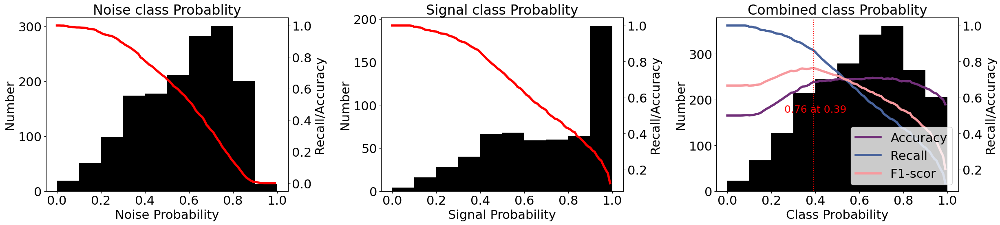

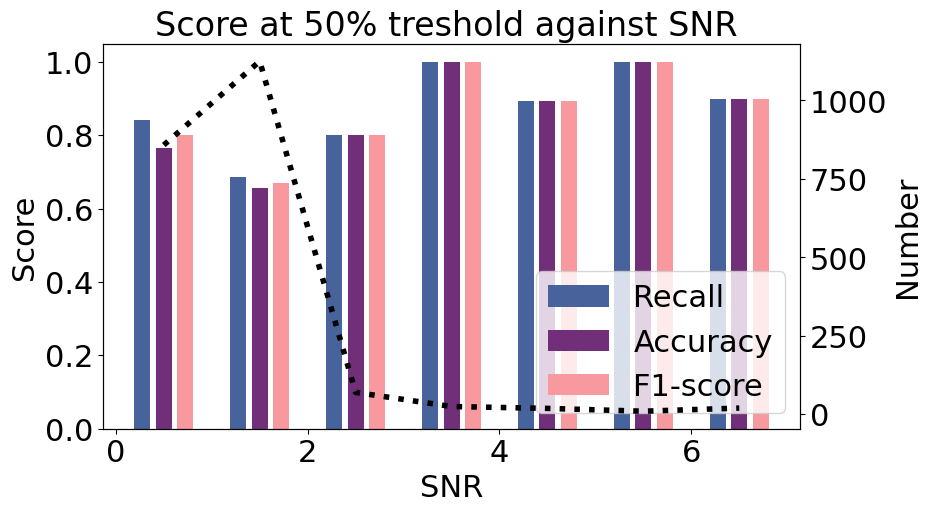

In [41]:
f1,f2, L = plotprobs(pred_list_GPD2,labels)
BestP2['GPD'] = L[0]
BestT2['GPD'] = L[1]
BestA2['GPD'] = L[3]
BestR2['GPD'] = L[2]
f1.savefig("Figure/GPD_Prob_GB.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/GPD_Snr_GB.svg", dpi=100, bbox_inches='tight')

## PhaseNet

In [42]:
# Load the pre-trained PhaseNet model
print(PhaseNet.list_pretrained())
model = PhaseNet.from_pretrained("original")
model.to('cpu:0')


['diting', 'ethz', 'geofon', 'instance', 'iquique', 'jma', 'jma_wc', 'lendb', 'neic', 'obs', 'original', 'phasenet_sn', 'pisdl', 'scedc', 'stead', 'volpick']


PhaseNet(
  (inc): Conv1d(3, 8, kernel_size=(7,), stride=(1,), padding=same)
  (in_bn): BatchNorm1d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (down_branch): ModuleList(
    (0): ModuleList(
      (0): Conv1d(8, 8, kernel_size=(7,), stride=(1,), padding=same, bias=False)
      (1): BatchNorm1d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): Conv1d(8, 8, kernel_size=(7,), stride=(4,), padding=(3,), bias=False)
      (3): BatchNorm1d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): ModuleList(
      (0): Conv1d(8, 16, kernel_size=(7,), stride=(1,), padding=same, bias=False)
      (1): BatchNorm1d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): Conv1d(16, 16, kernel_size=(7,), stride=(4,), bias=False)
      (3): BatchNorm1d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (2): ModuleList(
      (0): Conv1d(16, 32, kernel_size=(7,), stride=(1,

In [43]:
%autoawait on
pred_list = []
tic()
for i in tqdm(range(len(datasetGB))):
    preds = model.annotate(datasetGB[i][0])
    pred_list.append(max(preds[0].data) )
toc()
chrono['PhaseNet']=tac()
pred_list_phase2 = np.array(pred_list)

  0%|                                                                                                                                | 0/2127 [00:00<?, ?it/s]

  0%|▎                                                                                                                       | 5/2127 [00:00<00:46, 45.55it/s]

  0%|▌                                                                                                                      | 10/2127 [00:00<01:02, 33.78it/s]

  1%|▊                                                                                                                      | 15/2127 [00:00<00:55, 38.39it/s]

  1%|█                                                                                                                      | 20/2127 [00:00<00:50, 41.34it/s]

  1%|█▍                                                                                                                     | 25/2127 [00:00<00:58, 35.81it/s]

  1%|█▋                                                                                                                     | 30/2127 [00:00<00:53, 39.14it/s]

  2%|█▉                                                                                                                     | 35/2127 [00:01<01:13, 28.60it/s]

  2%|██▏                                                                                                                    | 39/2127 [00:01<01:08, 30.29it/s]

  2%|██▍                                                                                                                    | 44/2127 [00:01<01:00, 34.45it/s]

  2%|██▋                                                                                                                    | 48/2127 [00:01<01:00, 34.41it/s]

  2%|██▉                                                                                                                    | 53/2127 [00:01<00:56, 36.86it/s]

  3%|███▏                                                                                                                   | 57/2127 [00:01<00:57, 35.79it/s]

  3%|███▍                                                                                                                   | 61/2127 [00:01<00:57, 35.63it/s]

  3%|███▋                                                                                                                   | 65/2127 [00:01<00:59, 34.92it/s]

  3%|███▊                                                                                                                   | 69/2127 [00:01<01:00, 33.94it/s]

  3%|████                                                                                                                   | 73/2127 [00:02<01:01, 33.52it/s]

  4%|████▎                                                                                                                  | 77/2127 [00:02<01:05, 31.29it/s]

  4%|████▌                                                                                                                  | 81/2127 [00:02<01:09, 29.38it/s]

  4%|████▊                                                                                                                  | 85/2127 [00:02<01:08, 29.91it/s]

  4%|████▉                                                                                                                  | 89/2127 [00:02<01:07, 30.08it/s]

  4%|█████▏                                                                                                                 | 93/2127 [00:02<01:05, 30.85it/s]

  5%|█████▍                                                                                                                 | 97/2127 [00:02<01:09, 29.39it/s]

  5%|█████▌                                                                                                                | 100/2127 [00:03<01:22, 24.70it/s]

  5%|█████▊                                                                                                                | 105/2127 [00:03<01:08, 29.33it/s]

  5%|██████                                                                                                                | 109/2127 [00:03<01:13, 27.38it/s]

  5%|██████▏                                                                                                               | 112/2127 [00:03<01:14, 27.08it/s]

  5%|██████▍                                                                                                               | 116/2127 [00:03<01:08, 29.53it/s]

  6%|██████▋                                                                                                               | 120/2127 [00:03<01:13, 27.25it/s]

  6%|██████▉                                                                                                               | 124/2127 [00:03<01:06, 29.91it/s]

  6%|███████                                                                                                               | 128/2127 [00:04<01:06, 30.26it/s]

  6%|███████▎                                                                                                              | 132/2127 [00:04<01:19, 25.11it/s]

  6%|███████▌                                                                                                              | 137/2127 [00:04<01:07, 29.27it/s]

  7%|███████▊                                                                                                              | 141/2127 [00:04<01:16, 26.08it/s]

  7%|███████▉                                                                                                              | 144/2127 [00:04<01:19, 24.95it/s]

  7%|████████▏                                                                                                             | 148/2127 [00:04<01:10, 27.88it/s]

  7%|████████▍                                                                                                             | 151/2127 [00:04<01:14, 26.60it/s]

  7%|████████▌                                                                                                             | 154/2127 [00:05<01:12, 27.33it/s]

  7%|████████▋                                                                                                             | 157/2127 [00:05<01:16, 25.60it/s]

  8%|████████▉                                                                                                             | 161/2127 [00:05<01:11, 27.32it/s]

  8%|█████████▏                                                                                                            | 165/2127 [00:05<01:12, 27.02it/s]

  8%|█████████▍                                                                                                            | 169/2127 [00:05<01:11, 27.26it/s]

  8%|█████████▌                                                                                                            | 172/2127 [00:05<01:18, 25.03it/s]

  8%|█████████▊                                                                                                            | 177/2127 [00:05<01:08, 28.37it/s]

  8%|█████████▉                                                                                                            | 180/2127 [00:06<01:14, 26.14it/s]

  9%|██████████▏                                                                                                           | 183/2127 [00:06<01:17, 25.10it/s]

  9%|██████████▎                                                                                                           | 186/2127 [00:06<01:20, 24.10it/s]

  9%|██████████▍                                                                                                           | 189/2127 [00:06<01:22, 23.59it/s]

  9%|██████████▋                                                                                                           | 192/2127 [00:06<01:31, 21.16it/s]

  9%|██████████▊                                                                                                           | 196/2127 [00:06<01:16, 25.36it/s]

  9%|███████████                                                                                                           | 199/2127 [00:06<01:17, 24.86it/s]

  9%|███████████▏                                                                                                          | 202/2127 [00:06<01:13, 26.06it/s]

 10%|███████████▍                                                                                                          | 206/2127 [00:07<01:09, 27.47it/s]

 10%|███████████▌                                                                                                          | 209/2127 [00:07<01:15, 25.51it/s]

 10%|███████████▊                                                                                                          | 213/2127 [00:07<01:07, 28.41it/s]

 10%|████████████                                                                                                          | 217/2127 [00:07<01:04, 29.73it/s]

 10%|████████████▎                                                                                                         | 221/2127 [00:07<01:02, 30.27it/s]

 11%|████████████▍                                                                                                         | 225/2127 [00:07<01:08, 27.59it/s]

 11%|████████████▊                                                                                                         | 230/2127 [00:07<01:06, 28.32it/s]

 11%|████████████▉                                                                                                         | 234/2127 [00:08<01:04, 29.47it/s]

 11%|█████████████▏                                                                                                        | 237/2127 [00:08<01:04, 29.45it/s]

 11%|█████████████▎                                                                                                        | 240/2127 [00:08<01:04, 29.16it/s]

 11%|█████████████▍                                                                                                        | 243/2127 [00:08<01:05, 28.75it/s]

 12%|█████████████▋                                                                                                        | 246/2127 [00:08<01:11, 26.20it/s]

 12%|█████████████▊                                                                                                        | 250/2127 [00:08<01:04, 28.92it/s]

 12%|██████████████                                                                                                        | 253/2127 [00:08<01:05, 28.78it/s]

 12%|██████████████▎                                                                                                       | 258/2127 [00:08<01:00, 30.89it/s]

 12%|██████████████▌                                                                                                       | 262/2127 [00:09<01:08, 27.36it/s]

 12%|██████████████▋                                                                                                       | 265/2127 [00:09<01:08, 27.14it/s]

 13%|██████████████▉                                                                                                       | 269/2127 [00:09<01:06, 27.80it/s]

 13%|███████████████▏                                                                                                      | 273/2127 [00:09<01:09, 26.57it/s]

 13%|███████████████▎                                                                                                      | 276/2127 [00:09<01:11, 25.94it/s]

 13%|███████████████▍                                                                                                      | 279/2127 [00:09<01:10, 26.14it/s]

 13%|███████████████▋                                                                                                      | 282/2127 [00:09<01:13, 25.09it/s]

 13%|███████████████▊                                                                                                      | 286/2127 [00:09<01:08, 26.99it/s]

 14%|████████████████                                                                                                      | 289/2127 [00:10<01:13, 24.89it/s]

 14%|████████████████▏                                                                                                     | 292/2127 [00:10<01:12, 25.40it/s]

 14%|████████████████▍                                                                                                     | 296/2127 [00:10<01:05, 27.91it/s]

 14%|████████████████▋                                                                                                     | 300/2127 [00:10<01:01, 29.49it/s]

 14%|████████████████▊                                                                                                     | 303/2127 [00:10<01:03, 28.81it/s]

 14%|████████████████▉                                                                                                     | 306/2127 [00:10<01:06, 27.58it/s]

 15%|█████████████████▏                                                                                                    | 310/2127 [00:10<01:03, 28.42it/s]

 15%|█████████████████▎                                                                                                    | 313/2127 [00:10<01:11, 25.37it/s]

 15%|█████████████████▌                                                                                                    | 317/2127 [00:11<01:02, 28.93it/s]

 15%|█████████████████▊                                                                                                    | 321/2127 [00:11<00:58, 31.09it/s]

 15%|██████████████████                                                                                                    | 325/2127 [00:11<00:57, 31.37it/s]

 15%|██████████████████▎                                                                                                   | 329/2127 [00:11<00:58, 30.67it/s]

 16%|██████████████████▍                                                                                                   | 333/2127 [00:11<01:02, 28.64it/s]

 16%|██████████████████▋                                                                                                   | 336/2127 [00:11<01:08, 26.14it/s]

 16%|██████████████████▊                                                                                                   | 340/2127 [00:11<01:04, 27.89it/s]

 16%|███████████████████                                                                                                   | 343/2127 [00:12<01:10, 25.23it/s]

 16%|███████████████████▎                                                                                                  | 347/2127 [00:12<01:08, 26.16it/s]

 17%|███████████████████▌                                                                                                  | 352/2127 [00:12<00:58, 30.15it/s]

 17%|███████████████████▋                                                                                                  | 356/2127 [00:12<01:03, 28.10it/s]

 17%|███████████████████▉                                                                                                  | 359/2127 [00:12<01:07, 26.16it/s]

 17%|████████████████████                                                                                                  | 362/2127 [00:12<01:06, 26.47it/s]

 17%|████████████████████▎                                                                                                 | 366/2127 [00:12<01:01, 28.74it/s]

 17%|████████████████████▍                                                                                                 | 369/2127 [00:12<01:05, 26.85it/s]

 18%|████████████████████▋                                                                                                 | 373/2127 [00:13<01:00, 29.07it/s]

 18%|████████████████████▉                                                                                                 | 377/2127 [00:13<00:57, 30.60it/s]

 18%|█████████████████████▏                                                                                                | 381/2127 [00:13<01:05, 26.68it/s]

 18%|█████████████████████▎                                                                                                | 385/2127 [00:13<01:07, 25.82it/s]

 18%|█████████████████████▌                                                                                                | 388/2127 [00:13<01:09, 25.05it/s]

 18%|█████████████████████▋                                                                                                | 392/2127 [00:13<01:01, 28.08it/s]

 19%|█████████████████████▉                                                                                                | 395/2127 [00:13<01:12, 23.78it/s]

 19%|██████████████████████▏                                                                                               | 399/2127 [00:14<01:05, 26.34it/s]

 19%|██████████████████████▎                                                                                               | 402/2127 [00:14<01:06, 25.94it/s]

 19%|██████████████████████▌                                                                                               | 406/2127 [00:14<00:58, 29.26it/s]

 19%|██████████████████████▋                                                                                               | 410/2127 [00:14<01:07, 25.55it/s]

 19%|██████████████████████▉                                                                                               | 414/2127 [00:14<01:03, 27.11it/s]

 20%|███████████████████████▏                                                                                              | 419/2127 [00:14<00:58, 29.45it/s]

 20%|███████████████████████▍                                                                                              | 423/2127 [00:14<01:09, 24.62it/s]

 20%|███████████████████████▋                                                                                              | 428/2127 [00:15<01:00, 28.26it/s]

 20%|███████████████████████▉                                                                                              | 432/2127 [00:15<01:07, 25.16it/s]

 20%|████████████████████████▏                                                                                             | 436/2127 [00:15<01:00, 27.75it/s]

 21%|████████████████████████▍                                                                                             | 440/2127 [00:15<01:01, 27.31it/s]

 21%|████████████████████████▋                                                                                             | 444/2127 [00:15<00:57, 29.49it/s]

 21%|████████████████████████▊                                                                                             | 448/2127 [00:15<00:59, 28.42it/s]

 21%|█████████████████████████                                                                                             | 451/2127 [00:15<01:02, 26.82it/s]

 21%|█████████████████████████▏                                                                                            | 455/2127 [00:16<01:02, 26.68it/s]

 22%|█████████████████████████▍                                                                                            | 458/2127 [00:16<01:05, 25.40it/s]

 22%|█████████████████████████▌                                                                                            | 461/2127 [00:16<01:03, 26.19it/s]

 22%|█████████████████████████▊                                                                                            | 465/2127 [00:16<00:56, 29.53it/s]

 22%|██████████████████████████                                                                                            | 469/2127 [00:16<01:04, 25.80it/s]

 22%|██████████████████████████▏                                                                                           | 473/2127 [00:16<00:57, 28.73it/s]

 22%|██████████████████████████▍                                                                                           | 477/2127 [00:16<00:57, 28.70it/s]

 23%|██████████████████████████▋                                                                                           | 481/2127 [00:17<01:11, 22.97it/s]

 23%|██████████████████████████▉                                                                                           | 486/2127 [00:17<00:59, 27.65it/s]

 23%|███████████████████████████▏                                                                                          | 490/2127 [00:17<00:57, 28.30it/s]

 23%|███████████████████████████▍                                                                                          | 494/2127 [00:17<01:00, 27.17it/s]

 23%|███████████████████████████▌                                                                                          | 497/2127 [00:17<01:02, 26.01it/s]

 24%|███████████████████████████▋                                                                                          | 500/2127 [00:17<01:04, 25.21it/s]

 24%|███████████████████████████▉                                                                                          | 504/2127 [00:17<00:57, 28.11it/s]

 24%|████████████████████████████▏                                                                                         | 508/2127 [00:18<00:53, 30.35it/s]

 24%|████████████████████████████▍                                                                                         | 512/2127 [00:18<00:53, 30.13it/s]

 24%|████████████████████████████▋                                                                                         | 516/2127 [00:18<00:54, 29.52it/s]

 24%|████████████████████████████▊                                                                                         | 520/2127 [00:18<00:58, 27.30it/s]

 25%|█████████████████████████████                                                                                         | 523/2127 [00:18<00:59, 26.83it/s]

 25%|█████████████████████████████▏                                                                                        | 526/2127 [00:18<01:00, 26.37it/s]

 25%|█████████████████████████████▍                                                                                        | 530/2127 [00:18<01:03, 25.29it/s]

 25%|█████████████████████████████▌                                                                                        | 533/2127 [00:19<01:02, 25.62it/s]

 25%|█████████████████████████████▋                                                                                        | 536/2127 [00:19<01:00, 26.30it/s]

 25%|█████████████████████████████▉                                                                                        | 539/2127 [00:19<01:02, 25.38it/s]

 25%|██████████████████████████████                                                                                        | 542/2127 [00:19<01:02, 25.38it/s]

 26%|██████████████████████████████▎                                                                                       | 546/2127 [00:19<00:57, 27.61it/s]

 26%|██████████████████████████████▌                                                                                       | 550/2127 [00:19<00:58, 27.08it/s]

 26%|██████████████████████████████▋                                                                                       | 553/2127 [00:19<00:57, 27.42it/s]

 26%|██████████████████████████████▊                                                                                       | 556/2127 [00:19<00:58, 26.78it/s]

 26%|███████████████████████████████                                                                                       | 559/2127 [00:19<01:03, 24.88it/s]

 26%|███████████████████████████████▏                                                                                      | 562/2127 [00:20<01:13, 21.33it/s]

 27%|███████████████████████████████▍                                                                                      | 567/2127 [00:20<01:01, 25.41it/s]

 27%|███████████████████████████████▌                                                                                      | 570/2127 [00:20<01:04, 24.10it/s]

 27%|███████████████████████████████▊                                                                                      | 574/2127 [00:20<00:59, 26.28it/s]

 27%|████████████████████████████████                                                                                      | 577/2127 [00:20<00:59, 25.89it/s]

 27%|████████████████████████████████▏                                                                                     | 580/2127 [00:20<01:00, 25.64it/s]

 27%|████████████████████████████████▍                                                                                     | 584/2127 [00:20<00:56, 27.09it/s]

 28%|████████████████████████████████▌                                                                                     | 587/2127 [00:21<00:57, 26.74it/s]

 28%|████████████████████████████████▋                                                                                     | 590/2127 [00:21<01:01, 25.18it/s]

 28%|████████████████████████████████▉                                                                                     | 594/2127 [00:21<00:57, 26.88it/s]

 28%|█████████████████████████████████                                                                                     | 597/2127 [00:21<00:56, 27.20it/s]

 28%|█████████████████████████████████▎                                                                                    | 600/2127 [00:21<00:57, 26.49it/s]

 28%|█████████████████████████████████▍                                                                                    | 603/2127 [00:21<00:58, 26.02it/s]

 28%|█████████████████████████████████▌                                                                                    | 606/2127 [00:21<00:57, 26.25it/s]

 29%|█████████████████████████████████▊                                                                                    | 610/2127 [00:21<00:51, 29.30it/s]

 29%|██████████████████████████████████                                                                                    | 613/2127 [00:22<01:01, 24.43it/s]

 29%|██████████████████████████████████▏                                                                                   | 616/2127 [00:22<00:59, 25.57it/s]

 29%|██████████████████████████████████▍                                                                                   | 620/2127 [00:22<00:57, 26.23it/s]

 29%|██████████████████████████████████▌                                                                                   | 624/2127 [00:22<00:59, 25.46it/s]

 30%|██████████████████████████████████▉                                                                                   | 629/2127 [00:22<00:51, 29.12it/s]

 30%|███████████████████████████████████                                                                                   | 632/2127 [00:22<00:56, 26.58it/s]

 30%|███████████████████████████████████▏                                                                                  | 635/2127 [00:22<01:00, 24.72it/s]

 30%|███████████████████████████████████▍                                                                                  | 639/2127 [00:23<00:56, 26.36it/s]

 30%|███████████████████████████████████▌                                                                                  | 642/2127 [00:23<00:57, 25.91it/s]

 30%|███████████████████████████████████▊                                                                                  | 645/2127 [00:23<00:56, 26.10it/s]

 31%|████████████████████████████████████                                                                                  | 649/2127 [00:23<00:55, 26.86it/s]

 31%|████████████████████████████████████▏                                                                                 | 652/2127 [00:23<00:57, 25.73it/s]

 31%|████████████████████████████████████▍                                                                                 | 656/2127 [00:23<00:53, 27.66it/s]

 31%|████████████████████████████████████▌                                                                                 | 659/2127 [00:23<00:54, 26.91it/s]

 31%|████████████████████████████████████▋                                                                                 | 662/2127 [00:23<00:54, 26.97it/s]

 31%|████████████████████████████████████▉                                                                                 | 665/2127 [00:24<00:59, 24.65it/s]

 31%|█████████████████████████████████████                                                                                 | 669/2127 [00:24<00:52, 27.66it/s]

 32%|█████████████████████████████████████▎                                                                                | 672/2127 [00:24<00:57, 25.20it/s]

 32%|█████████████████████████████████████▍                                                                                | 675/2127 [00:24<01:01, 23.74it/s]

 32%|█████████████████████████████████████▌                                                                                | 678/2127 [00:24<00:58, 24.56it/s]

 32%|█████████████████████████████████████▊                                                                                | 681/2127 [00:24<01:04, 22.37it/s]

 32%|█████████████████████████████████████▉                                                                                | 684/2127 [00:24<01:09, 20.79it/s]

 32%|██████████████████████████████████████▏                                                                               | 688/2127 [00:25<00:59, 24.14it/s]

 33%|██████████████████████████████████████▍                                                                               | 692/2127 [00:25<00:51, 27.66it/s]

 33%|██████████████████████████████████████▌                                                                               | 695/2127 [00:25<00:52, 27.23it/s]

 33%|██████████████████████████████████████▋                                                                               | 698/2127 [00:25<00:54, 26.15it/s]

 33%|██████████████████████████████████████▉                                                                               | 702/2127 [00:25<00:50, 28.45it/s]

 33%|███████████████████████████████████████                                                                               | 705/2127 [00:25<00:53, 26.83it/s]

 33%|███████████████████████████████████████▎                                                                              | 708/2127 [00:25<01:08, 20.72it/s]

 34%|███████████████████████████████████████▌                                                                              | 713/2127 [00:25<00:54, 26.14it/s]

 34%|███████████████████████████████████████▋                                                                              | 716/2127 [00:26<00:56, 25.06it/s]

 34%|███████████████████████████████████████▉                                                                              | 720/2127 [00:26<00:53, 26.30it/s]

 34%|████████████████████████████████████████▏                                                                             | 724/2127 [00:26<00:50, 27.58it/s]

 34%|████████████████████████████████████████▎                                                                             | 727/2127 [00:26<00:52, 26.57it/s]

 34%|████████████████████████████████████████▌                                                                             | 731/2127 [00:26<00:49, 28.43it/s]

 35%|████████████████████████████████████████▋                                                                             | 734/2127 [00:26<00:58, 24.00it/s]

 35%|████████████████████████████████████████▉                                                                             | 737/2127 [00:26<00:59, 23.42it/s]

 35%|█████████████████████████████████████████▏                                                                            | 742/2127 [00:27<00:48, 28.52it/s]

 35%|█████████████████████████████████████████▍                                                                            | 746/2127 [00:27<00:47, 29.29it/s]

 35%|█████████████████████████████████████████▌                                                                            | 750/2127 [00:27<00:47, 28.85it/s]

 35%|█████████████████████████████████████████▊                                                                            | 753/2127 [00:27<00:48, 28.29it/s]

 36%|█████████████████████████████████████████▉                                                                            | 757/2127 [00:27<00:45, 30.42it/s]

 36%|██████████████████████████████████████████▏                                                                           | 761/2127 [00:27<00:46, 29.10it/s]

 36%|██████████████████████████████████████████▍                                                                           | 765/2127 [00:27<00:45, 30.16it/s]

 36%|██████████████████████████████████████████▋                                                                           | 769/2127 [00:27<00:47, 28.61it/s]

 36%|██████████████████████████████████████████▊                                                                           | 772/2127 [00:28<00:51, 26.06it/s]

 36%|██████████████████████████████████████████▉                                                                           | 775/2127 [00:28<00:50, 26.75it/s]

 37%|███████████████████████████████████████████▏                                                                          | 778/2127 [00:28<00:50, 26.68it/s]

 37%|███████████████████████████████████████████▎                                                                          | 781/2127 [00:28<00:49, 27.28it/s]

 37%|███████████████████████████████████████████▍                                                                          | 784/2127 [00:28<00:50, 26.82it/s]

 37%|███████████████████████████████████████████▋                                                                          | 787/2127 [00:28<00:48, 27.56it/s]

 37%|███████████████████████████████████████████▊                                                                          | 790/2127 [00:28<00:49, 27.14it/s]

 37%|████████████████████████████████████████████                                                                          | 794/2127 [00:28<00:46, 28.49it/s]

 38%|████████████████████████████████████████████▎                                                                         | 798/2127 [00:29<00:47, 27.79it/s]

 38%|████████████████████████████████████████████▍                                                                         | 802/2127 [00:29<00:48, 27.44it/s]

 38%|████████████████████████████████████████████▋                                                                         | 805/2127 [00:29<00:50, 26.08it/s]

 38%|████████████████████████████████████████████▊                                                                         | 808/2127 [00:29<00:49, 26.89it/s]

 38%|█████████████████████████████████████████████                                                                         | 812/2127 [00:29<00:52, 25.09it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 816/2127 [00:29<00:47, 27.75it/s]

 39%|█████████████████████████████████████████████▍                                                                        | 820/2127 [00:29<00:45, 28.99it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 823/2127 [00:29<00:46, 27.87it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 828/2127 [00:30<00:42, 30.55it/s]

 39%|██████████████████████████████████████████████▏                                                                       | 832/2127 [00:30<00:43, 29.76it/s]

 39%|██████████████████████████████████████████████▎                                                                       | 835/2127 [00:30<00:43, 29.59it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 838/2127 [00:30<00:51, 25.27it/s]

 40%|██████████████████████████████████████████████▋                                                                       | 842/2127 [00:30<00:45, 28.14it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 846/2127 [00:30<00:43, 29.41it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 850/2127 [00:30<00:43, 29.67it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 854/2127 [00:31<00:42, 30.04it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 858/2127 [00:31<00:39, 31.75it/s]

 41%|███████████████████████████████████████████████▊                                                                      | 862/2127 [00:31<00:43, 29.24it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 865/2127 [00:31<00:47, 26.59it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 869/2127 [00:31<00:47, 26.51it/s]

 41%|████████████████████████████████████████████████▍                                                                     | 872/2127 [00:31<00:46, 27.07it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 877/2127 [00:31<00:42, 29.76it/s]

 41%|████████████████████████████████████████████████▊                                                                     | 880/2127 [00:31<00:48, 25.62it/s]

 42%|█████████████████████████████████████████████████                                                                     | 885/2127 [00:32<00:41, 30.27it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 889/2127 [00:32<00:45, 26.98it/s]

 42%|█████████████████████████████████████████████████▍                                                                    | 892/2127 [00:32<00:50, 24.37it/s]

 42%|█████████████████████████████████████████████████▋                                                                    | 895/2127 [00:32<00:50, 24.55it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 898/2127 [00:32<00:51, 23.75it/s]

 42%|██████████████████████████████████████████████████                                                                    | 903/2127 [00:32<00:45, 26.99it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 906/2127 [00:33<00:47, 25.46it/s]

 43%|██████████████████████████████████████████████████▍                                                                   | 909/2127 [00:33<00:52, 23.21it/s]

 43%|██████████████████████████████████████████████████▋                                                                   | 913/2127 [00:33<00:49, 24.44it/s]

 43%|██████████████████████████████████████████████████▊                                                                   | 917/2127 [00:33<00:44, 27.16it/s]

 43%|███████████████████████████████████████████████████                                                                   | 920/2127 [00:33<00:44, 27.30it/s]

 43%|███████████████████████████████████████████████████▏                                                                  | 923/2127 [00:33<00:43, 27.76it/s]

 44%|███████████████████████████████████████████████████▎                                                                  | 926/2127 [00:33<00:42, 27.99it/s]

 44%|███████████████████████████████████████████████████▌                                                                  | 929/2127 [00:33<00:48, 24.78it/s]

 44%|███████████████████████████████████████████████████▋                                                                  | 932/2127 [00:33<00:46, 25.95it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 935/2127 [00:34<00:47, 25.32it/s]

 44%|████████████████████████████████████████████████████                                                                  | 938/2127 [00:34<00:46, 25.40it/s]

 44%|████████████████████████████████████████████████████▎                                                                 | 942/2127 [00:34<00:40, 28.91it/s]

 44%|████████████████████████████████████████████████████▍                                                                 | 946/2127 [00:34<00:39, 30.10it/s]

 45%|████████████████████████████████████████████████████▋                                                                 | 950/2127 [00:34<00:42, 27.45it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 954/2127 [00:34<00:39, 29.37it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 958/2127 [00:34<00:41, 27.92it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 962/2127 [00:35<00:38, 30.49it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 966/2127 [00:35<00:38, 30.45it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 970/2127 [00:35<00:45, 25.45it/s]

 46%|██████████████████████████████████████████████████████▏                                                               | 976/2127 [00:35<00:36, 31.49it/s]

 46%|██████████████████████████████████████████████████████▎                                                               | 980/2127 [00:35<00:37, 30.27it/s]

 46%|██████████████████████████████████████████████████████▌                                                               | 984/2127 [00:35<00:39, 28.77it/s]

 46%|██████████████████████████████████████████████████████▊                                                               | 988/2127 [00:35<00:41, 27.30it/s]

 47%|███████████████████████████████████████████████████████                                                               | 992/2127 [00:36<00:40, 28.12it/s]

 47%|███████████████████████████████████████████████████████▏                                                              | 995/2127 [00:36<00:39, 28.41it/s]

 47%|███████████████████████████████████████████████████████▎                                                              | 998/2127 [00:36<00:42, 26.32it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1002/2127 [00:36<00:38, 29.21it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1006/2127 [00:36<00:39, 28.03it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 1010/2127 [00:36<00:36, 30.20it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1014/2127 [00:36<00:37, 29.56it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1018/2127 [00:36<00:38, 28.94it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1021/2127 [00:37<00:43, 25.45it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1024/2127 [00:37<00:42, 25.74it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1027/2127 [00:37<00:41, 26.64it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 1030/2127 [00:37<00:43, 25.35it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1033/2127 [00:37<00:48, 22.66it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 1038/2127 [00:37<00:38, 28.07it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1041/2127 [00:37<00:44, 24.57it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 1045/2127 [00:38<00:41, 26.00it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 1048/2127 [00:38<00:42, 25.43it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1051/2127 [00:38<00:41, 25.64it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 1055/2127 [00:38<00:38, 28.00it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 1058/2127 [00:38<00:38, 27.91it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1061/2127 [00:38<00:38, 27.61it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 1065/2127 [00:38<00:36, 29.50it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1068/2127 [00:38<00:39, 27.15it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 1072/2127 [00:39<00:35, 29.74it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1077/2127 [00:39<00:32, 32.43it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1081/2127 [00:39<00:36, 28.78it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1086/2127 [00:39<00:32, 32.08it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 1090/2127 [00:39<00:36, 28.29it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1093/2127 [00:39<00:37, 27.76it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 1097/2127 [00:39<00:38, 27.05it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1101/2127 [00:40<00:37, 27.09it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1105/2127 [00:40<00:36, 28.05it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 1108/2127 [00:40<00:37, 27.47it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1112/2127 [00:40<00:35, 28.30it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 1117/2127 [00:40<00:31, 31.57it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 1121/2127 [00:40<00:32, 30.84it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1125/2127 [00:40<00:35, 27.91it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1129/2127 [00:40<00:33, 30.12it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1133/2127 [00:41<00:33, 29.90it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 1137/2127 [00:41<00:34, 28.96it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1141/2127 [00:41<00:31, 30.97it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 1145/2127 [00:41<00:36, 27.00it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 1150/2127 [00:41<00:31, 31.47it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1154/2127 [00:41<00:33, 29.47it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 1158/2127 [00:41<00:31, 30.62it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 1162/2127 [00:42<00:37, 25.42it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1166/2127 [00:42<00:35, 26.72it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 1170/2127 [00:42<00:35, 27.30it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1173/2127 [00:42<00:38, 24.82it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1177/2127 [00:42<00:37, 25.60it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 1180/2127 [00:42<00:41, 22.90it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1184/2127 [00:43<00:39, 24.12it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1188/2127 [00:43<00:36, 25.67it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1191/2127 [00:43<00:37, 24.85it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 1195/2127 [00:43<00:34, 26.65it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1198/2127 [00:43<00:34, 26.99it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 1201/2127 [00:43<00:34, 27.04it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 1205/2127 [00:43<00:31, 28.90it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1208/2127 [00:43<00:36, 25.40it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1211/2127 [00:44<00:40, 22.68it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 1214/2127 [00:44<00:39, 23.26it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1218/2127 [00:44<00:34, 26.14it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 1222/2127 [00:44<00:32, 27.96it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1225/2127 [00:44<00:32, 27.66it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1228/2127 [00:44<00:36, 24.61it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1232/2127 [00:44<00:32, 27.26it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1237/2127 [00:45<00:29, 29.82it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1241/2127 [00:45<00:29, 29.80it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 1245/2127 [00:45<00:30, 28.76it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 1249/2127 [00:45<00:31, 27.88it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1252/2127 [00:45<00:31, 27.49it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 1255/2127 [00:45<00:32, 26.87it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1259/2127 [00:45<00:31, 27.62it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1262/2127 [00:45<00:31, 27.20it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1266/2127 [00:46<00:32, 26.28it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1269/2127 [00:46<00:34, 24.81it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 1273/2127 [00:46<00:32, 26.40it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1276/2127 [00:46<00:32, 26.22it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1279/2127 [00:46<00:33, 25.22it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 1282/2127 [00:46<00:32, 25.76it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1286/2127 [00:46<00:30, 27.38it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 1289/2127 [00:46<00:31, 27.00it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1292/2127 [00:47<00:31, 26.77it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 1296/2127 [00:47<00:29, 28.27it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1300/2127 [00:47<00:27, 29.70it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 1303/2127 [00:47<00:29, 27.62it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 1307/2127 [00:47<00:27, 29.41it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1310/2127 [00:47<00:30, 27.01it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1313/2127 [00:47<00:30, 26.58it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1316/2127 [00:47<00:30, 26.41it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1320/2127 [00:48<00:29, 27.69it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 1323/2127 [00:48<00:32, 24.73it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1326/2127 [00:48<00:31, 25.73it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 1329/2127 [00:48<00:32, 24.33it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1334/2127 [00:48<00:27, 29.10it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 1338/2127 [00:48<00:29, 27.18it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1341/2127 [00:48<00:30, 25.43it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 1346/2127 [00:49<00:25, 30.48it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 1350/2127 [00:49<00:24, 31.20it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1354/2127 [00:49<00:29, 26.21it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1357/2127 [00:49<00:33, 22.80it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1361/2127 [00:49<00:29, 26.39it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1365/2127 [00:49<00:29, 25.95it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1368/2127 [00:49<00:29, 25.47it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 1371/2127 [00:50<00:28, 26.39it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 1374/2127 [00:50<00:32, 23.23it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1380/2127 [00:50<00:25, 29.15it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1384/2127 [00:50<00:26, 27.85it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1387/2127 [00:50<00:29, 25.41it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 1390/2127 [00:50<00:28, 26.30it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1393/2127 [00:50<00:28, 26.20it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 1397/2127 [00:50<00:25, 29.15it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1400/2127 [00:51<00:26, 27.37it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1403/2127 [00:51<00:28, 25.22it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1406/2127 [00:51<00:32, 22.52it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1411/2127 [00:51<00:26, 26.73it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 1414/2127 [00:51<00:27, 26.27it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1418/2127 [00:51<00:25, 27.83it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 1421/2127 [00:51<00:27, 25.48it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 1425/2127 [00:52<00:25, 27.73it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 1428/2127 [00:52<00:25, 27.40it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1431/2127 [00:52<00:25, 27.40it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1434/2127 [00:52<00:26, 25.71it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1437/2127 [00:52<00:26, 26.16it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1440/2127 [00:52<00:26, 26.21it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1444/2127 [00:52<00:23, 29.49it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1447/2127 [00:52<00:23, 29.14it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1450/2127 [00:52<00:23, 28.60it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 1453/2127 [00:53<00:24, 28.04it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 1456/2127 [00:53<00:25, 26.71it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1460/2127 [00:53<00:22, 29.70it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 1463/2127 [00:53<00:23, 28.45it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 1466/2127 [00:53<00:24, 27.04it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1470/2127 [00:53<00:21, 30.21it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 1474/2127 [00:53<00:22, 28.46it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1477/2127 [00:53<00:22, 28.36it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 1480/2127 [00:54<00:23, 27.81it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1483/2127 [00:54<00:25, 24.78it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1487/2127 [00:54<00:25, 25.13it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1491/2127 [00:54<00:23, 27.09it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1495/2127 [00:54<00:21, 29.88it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 1499/2127 [00:54<00:23, 26.53it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1502/2127 [00:54<00:23, 27.09it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1505/2127 [00:54<00:22, 27.31it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 1508/2127 [00:55<00:23, 26.64it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 1512/2127 [00:55<00:21, 28.27it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1515/2127 [00:55<00:22, 27.67it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1518/2127 [00:55<00:22, 27.12it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 1522/2127 [00:55<00:22, 27.16it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1525/2127 [00:55<00:25, 23.88it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1529/2127 [00:55<00:22, 26.23it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1532/2127 [00:56<00:24, 24.46it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1536/2127 [00:56<00:22, 25.89it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 1539/2127 [00:56<00:23, 25.22it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1543/2127 [00:56<00:21, 27.22it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1547/2127 [00:56<00:20, 28.43it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1550/2127 [00:56<00:21, 26.51it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 1553/2127 [00:56<00:21, 27.25it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1557/2127 [00:56<00:20, 27.31it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 1562/2127 [00:57<00:18, 30.64it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1566/2127 [00:57<00:19, 28.61it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1570/2127 [00:57<00:18, 30.50it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 1574/2127 [00:57<00:19, 28.82it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1577/2127 [00:57<00:19, 28.82it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1580/2127 [00:57<00:19, 27.36it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1583/2127 [00:57<00:21, 24.73it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1586/2127 [00:58<00:24, 22.09it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1590/2127 [00:58<00:22, 23.89it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1593/2127 [00:58<00:21, 25.17it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1597/2127 [00:58<00:19, 27.87it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1600/2127 [00:58<00:20, 25.89it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1603/2127 [00:58<00:19, 26.47it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1607/2127 [00:58<00:17, 29.69it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1611/2127 [00:58<00:17, 29.86it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 1615/2127 [00:59<00:17, 29.56it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1618/2127 [00:59<00:17, 28.74it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1621/2127 [00:59<00:19, 26.32it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1624/2127 [00:59<00:19, 25.81it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1627/2127 [00:59<00:20, 23.91it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1631/2127 [00:59<00:21, 23.60it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1634/2127 [00:59<00:24, 20.31it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1637/2127 [01:00<00:22, 21.66it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 1640/2127 [01:00<00:22, 21.84it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1643/2127 [01:00<00:21, 23.02it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1647/2127 [01:00<00:17, 26.84it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1650/2127 [01:00<00:19, 24.75it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 1653/2127 [01:00<00:19, 24.17it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1657/2127 [01:00<00:17, 26.62it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1660/2127 [01:00<00:20, 23.33it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1663/2127 [01:01<00:20, 23.04it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1667/2127 [01:01<00:17, 26.40it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 1672/2127 [01:01<00:15, 29.80it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1676/2127 [01:01<00:14, 31.88it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1680/2127 [01:01<00:16, 27.51it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1683/2127 [01:01<00:16, 26.79it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1686/2127 [01:01<00:18, 24.00it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 1691/2127 [01:02<00:16, 25.71it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1694/2127 [01:02<00:16, 26.45it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1698/2127 [01:02<00:15, 27.46it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1701/2127 [01:02<00:16, 26.41it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1705/2127 [01:02<00:14, 28.83it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1708/2127 [01:02<00:15, 26.40it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1711/2127 [01:02<00:16, 25.86it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1716/2127 [01:02<00:14, 29.27it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1719/2127 [01:03<00:14, 28.42it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1722/2127 [01:03<00:14, 27.49it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1726/2127 [01:03<00:13, 29.46it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1729/2127 [01:03<00:15, 26.19it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1735/2127 [01:03<00:11, 33.02it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1739/2127 [01:03<00:13, 28.37it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1742/2127 [01:03<00:13, 28.17it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 1747/2127 [01:03<00:12, 30.70it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1751/2127 [01:04<00:13, 27.79it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1755/2127 [01:04<00:12, 30.02it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1759/2127 [01:04<00:13, 26.86it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1762/2127 [01:04<00:14, 25.04it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1766/2127 [01:04<00:14, 25.11it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1769/2127 [01:04<00:14, 23.94it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1773/2127 [01:05<00:13, 26.68it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1777/2127 [01:05<00:14, 24.91it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1781/2127 [01:05<00:12, 27.62it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1784/2127 [01:05<00:13, 24.55it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1788/2127 [01:05<00:13, 24.50it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1792/2127 [01:05<00:12, 27.45it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1795/2127 [01:05<00:11, 27.72it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1798/2127 [01:06<00:13, 25.23it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1802/2127 [01:06<00:11, 27.54it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1806/2127 [01:06<00:10, 30.21it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1810/2127 [01:06<00:11, 27.68it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1813/2127 [01:06<00:12, 25.11it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1816/2127 [01:06<00:11, 25.93it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1821/2127 [01:06<00:10, 29.14it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1825/2127 [01:06<00:09, 30.50it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1829/2127 [01:07<00:10, 29.37it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1832/2127 [01:07<00:10, 29.04it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1835/2127 [01:07<00:10, 28.24it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1838/2127 [01:07<00:11, 25.16it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1842/2127 [01:07<00:10, 28.35it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1845/2127 [01:07<00:10, 26.60it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1848/2127 [01:07<00:10, 25.67it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1852/2127 [01:07<00:10, 27.02it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1855/2127 [01:08<00:10, 25.79it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1858/2127 [01:08<00:10, 25.17it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1862/2127 [01:08<00:10, 26.42it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1865/2127 [01:08<00:11, 23.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1868/2127 [01:08<00:11, 22.77it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1871/2127 [01:08<00:10, 23.29it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1876/2127 [01:08<00:08, 28.07it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1880/2127 [01:09<00:08, 27.96it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1883/2127 [01:09<00:09, 26.06it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1887/2127 [01:09<00:08, 29.20it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1891/2127 [01:09<00:08, 28.90it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1894/2127 [01:09<00:08, 28.88it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1897/2127 [01:09<00:08, 26.78it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1900/2127 [01:09<00:08, 27.51it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1904/2127 [01:09<00:08, 27.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1907/2127 [01:10<00:08, 24.61it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1911/2127 [01:10<00:08, 25.39it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1914/2127 [01:10<00:08, 23.92it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1918/2127 [01:10<00:07, 26.98it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1922/2127 [01:10<00:07, 27.41it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1926/2127 [01:10<00:06, 29.22it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1930/2127 [01:10<00:06, 29.45it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1933/2127 [01:10<00:06, 28.18it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1936/2127 [01:11<00:06, 28.27it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 1941/2127 [01:11<00:05, 31.78it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1945/2127 [01:11<00:06, 29.33it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1948/2127 [01:11<00:06, 28.29it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1952/2127 [01:11<00:05, 30.74it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1956/2127 [01:11<00:06, 25.77it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1961/2127 [01:11<00:05, 30.82it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1965/2127 [01:12<00:05, 30.88it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1969/2127 [01:12<00:05, 26.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1972/2127 [01:12<00:06, 25.62it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1977/2127 [01:12<00:04, 30.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1981/2127 [01:12<00:05, 26.47it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1984/2127 [01:12<00:05, 25.70it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1988/2127 [01:12<00:04, 28.33it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1992/2127 [01:13<00:05, 26.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1995/2127 [01:13<00:05, 26.07it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1998/2127 [01:13<00:04, 26.13it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2002/2127 [01:13<00:04, 28.68it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2006/2127 [01:13<00:04, 28.73it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2009/2127 [01:13<00:04, 27.55it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2012/2127 [01:13<00:04, 26.80it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2015/2127 [01:13<00:04, 27.25it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2018/2127 [01:14<00:04, 27.19it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2021/2127 [01:14<00:03, 26.63it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2024/2127 [01:14<00:04, 24.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2027/2127 [01:14<00:03, 25.62it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2031/2127 [01:14<00:03, 28.80it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2034/2127 [01:14<00:03, 25.84it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2038/2127 [01:14<00:03, 29.30it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2042/2127 [01:14<00:02, 30.05it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 2046/2127 [01:15<00:02, 30.17it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2050/2127 [01:15<00:02, 28.80it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2053/2127 [01:15<00:02, 27.65it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2056/2127 [01:15<00:02, 24.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2060/2127 [01:15<00:02, 25.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 2063/2127 [01:15<00:02, 26.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2066/2127 [01:15<00:02, 24.64it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2069/2127 [01:15<00:02, 23.19it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 2072/2127 [01:16<00:02, 20.97it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2076/2127 [01:16<00:02, 23.95it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2079/2127 [01:16<00:01, 25.17it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2082/2127 [01:16<00:01, 25.06it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2085/2127 [01:16<00:01, 24.96it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2089/2127 [01:16<00:01, 26.43it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 2092/2127 [01:16<00:01, 24.61it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2095/2127 [01:17<00:01, 23.47it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2099/2127 [01:17<00:01, 24.85it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2103/2127 [01:17<00:00, 24.42it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2107/2127 [01:17<00:00, 27.89it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2110/2127 [01:17<00:00, 24.13it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2114/2127 [01:17<00:00, 27.72it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2117/2127 [01:17<00:00, 27.63it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 2120/2127 [01:17<00:00, 25.52it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 2123/2127 [01:18<00:00, 25.18it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2126/2127 [01:18<00:00, 25.97it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2127/2127 [01:18<00:00, 27.17it/s]

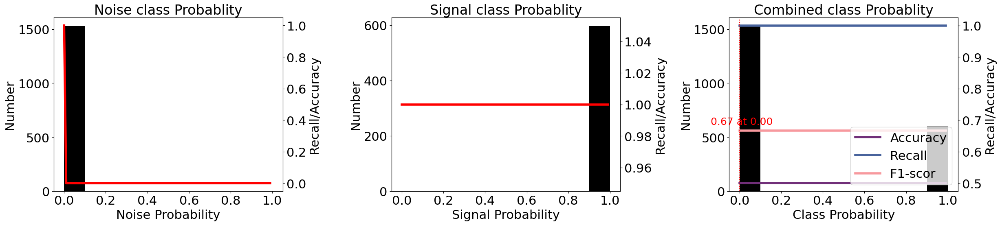

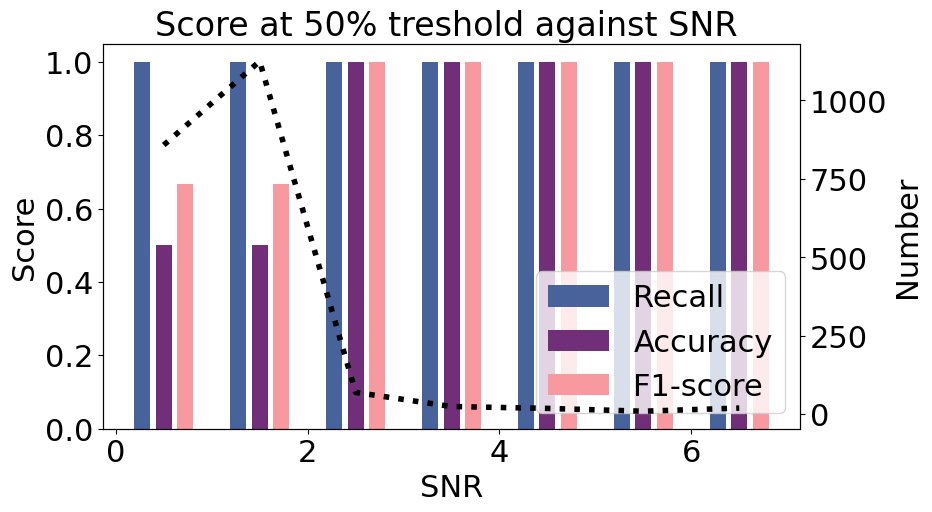

In [44]:
f1,f2, L = plotprobs(pred_list_phase2,labels)
BestP2['PhaseNet'] = L[0]
BestT2['PhaseNet'] = L[1]
BestA2['PhaseNet'] = L[3]
BestR2['PhaseNet'] = L[2]
f1.savefig("Figure/PhaseNet_Prob_GB.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/PhaseNet_Snr_GB.svg", dpi=100, bbox_inches='tight')

## OBSTransformer

In [45]:
# Load the pre-trained model
print(OBSTransformer.list_pretrained())
model = OBSTransformer.from_pretrained("obst2024")
model.to('cpu:0')

['obst2024']


OBSTransformer(
  (encoder): Encoder(
    (convs): ModuleList(
      (0): Conv1d(3, 8, kernel_size=(11,), stride=(1,), padding=(5,))
      (1): Conv1d(8, 16, kernel_size=(9,), stride=(1,), padding=(4,))
      (2): Conv1d(16, 16, kernel_size=(7,), stride=(1,), padding=(3,))
      (3): Conv1d(16, 32, kernel_size=(7,), stride=(1,), padding=(3,))
      (4): Conv1d(32, 32, kernel_size=(5,), stride=(1,), padding=(2,))
      (5): Conv1d(32, 64, kernel_size=(5,), stride=(1,), padding=(2,))
      (6): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    )
    (pools): ModuleList(
      (0-6): 7 x MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (res_cnn_stack): ResCNNStack(
    (members): ModuleList(
      (0-3): 4 x ResCNNBlock(
        (dropout): SpatialDropout1d(
          (dropout): Dropout2d(p=0.2, inplace=False)
        )
        (norm1): BatchNorm1d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (conv1): Conv1d

In [46]:
%autoawait on
pred_list = []
tic()
for i in tqdm(range(len(datasetGB))):
    preds = model.annotate(datasetGB[i][0])
    pred_list.append(max(preds[0].data) )
toc()
chrono['OBS'] = tac()
pred_list_OBS2 = np.array(pred_list)

  0%|                                                                                                                                | 0/2127 [00:00<?, ?it/s]

  0%|                                                                                                                        | 2/2127 [00:00<01:53, 18.65it/s]

  0%|▏                                                                                                                       | 4/2127 [00:00<02:25, 14.62it/s]

  0%|▎                                                                                                                       | 6/2127 [00:00<02:24, 14.66it/s]

  0%|▍                                                                                                                       | 8/2127 [00:00<02:46, 12.76it/s]

  0%|▌                                                                                                                      | 10/2127 [00:00<02:44, 12.84it/s]

  1%|▋                                                                                                                      | 12/2127 [00:00<02:33, 13.82it/s]

  1%|▊                                                                                                                      | 14/2127 [00:01<02:41, 13.08it/s]

  1%|▉                                                                                                                      | 16/2127 [00:01<02:43, 12.95it/s]

  1%|█                                                                                                                      | 18/2127 [00:01<02:49, 12.42it/s]

  1%|█                                                                                                                      | 20/2127 [00:01<02:34, 13.63it/s]

  1%|█▏                                                                                                                     | 22/2127 [00:01<02:36, 13.46it/s]

  1%|█▎                                                                                                                     | 24/2127 [00:01<02:34, 13.57it/s]

  1%|█▍                                                                                                                     | 26/2127 [00:01<02:34, 13.59it/s]

  1%|█▌                                                                                                                     | 28/2127 [00:02<02:42, 12.90it/s]

  1%|█▋                                                                                                                     | 30/2127 [00:02<02:44, 12.74it/s]

  2%|█▊                                                                                                                     | 32/2127 [00:02<02:43, 12.81it/s]

  2%|█▉                                                                                                                     | 34/2127 [00:02<02:39, 13.11it/s]

  2%|██                                                                                                                     | 36/2127 [00:02<02:30, 13.87it/s]

  2%|██▏                                                                                                                    | 38/2127 [00:02<02:40, 12.99it/s]

  2%|██▏                                                                                                                    | 40/2127 [00:03<02:37, 13.21it/s]

  2%|██▎                                                                                                                    | 42/2127 [00:03<02:35, 13.42it/s]

  2%|██▍                                                                                                                    | 44/2127 [00:03<02:30, 13.88it/s]

  2%|██▌                                                                                                                    | 46/2127 [00:03<02:45, 12.56it/s]

  2%|██▋                                                                                                                    | 48/2127 [00:03<02:45, 12.54it/s]

  2%|██▊                                                                                                                    | 50/2127 [00:03<02:41, 12.89it/s]

  2%|██▉                                                                                                                    | 52/2127 [00:03<02:36, 13.24it/s]

  3%|███                                                                                                                    | 54/2127 [00:04<02:39, 13.00it/s]

  3%|███▏                                                                                                                   | 56/2127 [00:04<02:44, 12.61it/s]

  3%|███▏                                                                                                                   | 58/2127 [00:04<02:35, 13.28it/s]

  3%|███▎                                                                                                                   | 60/2127 [00:04<02:34, 13.35it/s]

  3%|███▍                                                                                                                   | 62/2127 [00:04<02:27, 13.96it/s]

  3%|███▌                                                                                                                   | 64/2127 [00:04<02:23, 14.42it/s]

  3%|███▋                                                                                                                   | 66/2127 [00:04<02:24, 14.26it/s]

  3%|███▊                                                                                                                   | 68/2127 [00:05<02:21, 14.53it/s]

  3%|███▉                                                                                                                   | 70/2127 [00:05<02:31, 13.58it/s]

  3%|████                                                                                                                   | 72/2127 [00:05<02:45, 12.45it/s]

  3%|████▏                                                                                                                  | 74/2127 [00:05<02:42, 12.65it/s]

  4%|████▎                                                                                                                  | 76/2127 [00:05<02:36, 13.08it/s]

  4%|████▎                                                                                                                  | 78/2127 [00:05<02:48, 12.19it/s]

  4%|████▍                                                                                                                  | 80/2127 [00:06<02:45, 12.40it/s]

  4%|████▌                                                                                                                  | 82/2127 [00:06<02:57, 11.54it/s]

  4%|████▋                                                                                                                  | 84/2127 [00:06<02:47, 12.23it/s]

  4%|████▊                                                                                                                  | 86/2127 [00:06<02:46, 12.29it/s]

  4%|████▉                                                                                                                  | 88/2127 [00:06<02:38, 12.87it/s]

  4%|█████                                                                                                                  | 90/2127 [00:06<02:38, 12.86it/s]

  4%|█████▏                                                                                                                 | 92/2127 [00:07<02:45, 12.27it/s]

  4%|█████▎                                                                                                                 | 94/2127 [00:07<02:41, 12.56it/s]

  5%|█████▎                                                                                                                 | 96/2127 [00:07<02:43, 12.39it/s]

  5%|█████▍                                                                                                                 | 98/2127 [00:07<02:44, 12.33it/s]

  5%|█████▌                                                                                                                | 100/2127 [00:07<02:33, 13.19it/s]

  5%|█████▋                                                                                                                | 102/2127 [00:07<02:30, 13.48it/s]

  5%|█████▊                                                                                                                | 104/2127 [00:07<02:42, 12.44it/s]

  5%|█████▉                                                                                                                | 106/2127 [00:08<02:33, 13.14it/s]

  5%|█████▉                                                                                                                | 108/2127 [00:08<02:34, 13.06it/s]

  5%|██████                                                                                                                | 110/2127 [00:08<02:27, 13.66it/s]

  5%|██████▏                                                                                                               | 112/2127 [00:08<02:32, 13.20it/s]

  5%|██████▎                                                                                                               | 114/2127 [00:08<02:48, 11.97it/s]

  5%|██████▍                                                                                                               | 116/2127 [00:08<02:46, 12.08it/s]

  6%|██████▌                                                                                                               | 118/2127 [00:09<02:38, 12.71it/s]

  6%|██████▋                                                                                                               | 120/2127 [00:09<02:35, 12.91it/s]

  6%|██████▊                                                                                                               | 122/2127 [00:09<02:28, 13.49it/s]

  6%|██████▉                                                                                                               | 124/2127 [00:09<02:21, 14.20it/s]

  6%|██████▉                                                                                                               | 126/2127 [00:09<02:33, 13.01it/s]

  6%|███████                                                                                                               | 128/2127 [00:09<02:28, 13.45it/s]

  6%|███████▏                                                                                                              | 130/2127 [00:09<02:41, 12.39it/s]

  6%|███████▎                                                                                                              | 132/2127 [00:10<02:53, 11.51it/s]

  6%|███████▍                                                                                                              | 134/2127 [00:10<02:32, 13.04it/s]

  6%|███████▌                                                                                                              | 136/2127 [00:10<02:29, 13.28it/s]

  6%|███████▋                                                                                                              | 138/2127 [00:10<02:39, 12.51it/s]

  7%|███████▊                                                                                                              | 140/2127 [00:10<02:30, 13.21it/s]

  7%|███████▉                                                                                                              | 142/2127 [00:10<02:31, 13.09it/s]

  7%|███████▉                                                                                                              | 144/2127 [00:11<02:37, 12.60it/s]

  7%|████████                                                                                                              | 146/2127 [00:11<02:34, 12.83it/s]

  7%|████████▏                                                                                                             | 148/2127 [00:11<02:29, 13.26it/s]

  7%|████████▎                                                                                                             | 150/2127 [00:11<02:15, 14.62it/s]

  7%|████████▍                                                                                                             | 152/2127 [00:11<02:21, 13.99it/s]

  7%|████████▌                                                                                                             | 154/2127 [00:11<02:14, 14.65it/s]

  7%|████████▋                                                                                                             | 156/2127 [00:11<02:29, 13.21it/s]

  7%|████████▊                                                                                                             | 158/2127 [00:12<02:18, 14.18it/s]

  8%|████████▉                                                                                                             | 160/2127 [00:12<02:29, 13.16it/s]

  8%|████████▉                                                                                                             | 162/2127 [00:12<02:47, 11.70it/s]

  8%|█████████                                                                                                             | 164/2127 [00:12<02:33, 12.79it/s]

  8%|█████████▏                                                                                                            | 166/2127 [00:12<02:35, 12.63it/s]

  8%|█████████▎                                                                                                            | 168/2127 [00:12<02:28, 13.19it/s]

  8%|█████████▍                                                                                                            | 170/2127 [00:13<02:43, 12.00it/s]

  8%|█████████▌                                                                                                            | 172/2127 [00:13<02:41, 12.08it/s]

  8%|█████████▋                                                                                                            | 174/2127 [00:13<02:30, 12.98it/s]

  8%|█████████▊                                                                                                            | 176/2127 [00:13<02:34, 12.64it/s]

  8%|█████████▊                                                                                                            | 178/2127 [00:13<02:36, 12.43it/s]

  8%|█████████▉                                                                                                            | 180/2127 [00:13<02:29, 13.02it/s]

  9%|██████████                                                                                                            | 182/2127 [00:13<02:20, 13.81it/s]

  9%|██████████▏                                                                                                           | 184/2127 [00:14<02:09, 15.02it/s]

  9%|██████████▎                                                                                                           | 186/2127 [00:14<02:21, 13.74it/s]

  9%|██████████▍                                                                                                           | 188/2127 [00:14<02:22, 13.62it/s]

  9%|██████████▌                                                                                                           | 190/2127 [00:14<02:20, 13.77it/s]

  9%|██████████▋                                                                                                           | 192/2127 [00:14<02:30, 12.88it/s]

  9%|██████████▊                                                                                                           | 194/2127 [00:14<02:24, 13.41it/s]

  9%|██████████▊                                                                                                           | 196/2127 [00:15<02:30, 12.83it/s]

  9%|██████████▉                                                                                                           | 198/2127 [00:15<02:49, 11.35it/s]

  9%|███████████▏                                                                                                          | 201/2127 [00:15<02:17, 13.97it/s]

 10%|███████████▎                                                                                                          | 203/2127 [00:15<02:31, 12.70it/s]

 10%|███████████▎                                                                                                          | 205/2127 [00:15<02:29, 12.81it/s]

 10%|███████████▍                                                                                                          | 207/2127 [00:15<02:45, 11.57it/s]

 10%|███████████▌                                                                                                          | 209/2127 [00:16<02:50, 11.25it/s]

 10%|███████████▋                                                                                                          | 211/2127 [00:16<02:30, 12.72it/s]

 10%|███████████▊                                                                                                          | 213/2127 [00:16<02:35, 12.32it/s]

 10%|███████████▉                                                                                                          | 215/2127 [00:16<02:33, 12.49it/s]

 10%|████████████                                                                                                          | 217/2127 [00:16<02:18, 13.81it/s]

 10%|████████████▏                                                                                                         | 219/2127 [00:16<02:14, 14.15it/s]

 10%|████████████▎                                                                                                         | 221/2127 [00:16<02:14, 14.19it/s]

 10%|████████████▎                                                                                                         | 223/2127 [00:17<02:09, 14.67it/s]

 11%|████████████▍                                                                                                         | 225/2127 [00:17<02:10, 14.59it/s]

 11%|████████████▌                                                                                                         | 227/2127 [00:17<02:33, 12.35it/s]

 11%|████████████▋                                                                                                         | 229/2127 [00:17<02:31, 12.50it/s]

 11%|████████████▊                                                                                                         | 231/2127 [00:17<02:31, 12.54it/s]

 11%|████████████▉                                                                                                         | 233/2127 [00:17<02:24, 13.14it/s]

 11%|█████████████                                                                                                         | 236/2127 [00:18<02:14, 14.03it/s]

 11%|█████████████▏                                                                                                        | 238/2127 [00:18<02:14, 14.01it/s]

 11%|█████████████▎                                                                                                        | 240/2127 [00:18<02:17, 13.73it/s]

 11%|█████████████▍                                                                                                        | 242/2127 [00:18<02:07, 14.80it/s]

 11%|█████████████▌                                                                                                        | 244/2127 [00:18<02:15, 13.89it/s]

 12%|█████████████▋                                                                                                        | 246/2127 [00:18<02:17, 13.73it/s]

 12%|█████████████▊                                                                                                        | 248/2127 [00:18<02:15, 13.84it/s]

 12%|█████████████▊                                                                                                        | 250/2127 [00:19<02:16, 13.73it/s]

 12%|█████████████▉                                                                                                        | 252/2127 [00:19<02:42, 11.57it/s]

 12%|██████████████                                                                                                        | 254/2127 [00:19<02:34, 12.16it/s]

 12%|██████████████▏                                                                                                       | 256/2127 [00:19<02:17, 13.58it/s]

 12%|██████████████▎                                                                                                       | 258/2127 [00:19<02:14, 13.94it/s]

 12%|██████████████▍                                                                                                       | 260/2127 [00:19<02:17, 13.58it/s]

 12%|██████████████▌                                                                                                       | 262/2127 [00:20<02:23, 12.96it/s]

 12%|██████████████▋                                                                                                       | 264/2127 [00:20<02:22, 13.09it/s]

 13%|██████████████▊                                                                                                       | 266/2127 [00:20<02:35, 11.96it/s]

 13%|██████████████▊                                                                                                       | 268/2127 [00:20<02:41, 11.53it/s]

 13%|██████████████▉                                                                                                       | 270/2127 [00:20<02:35, 11.92it/s]

 13%|███████████████                                                                                                       | 272/2127 [00:20<02:51, 10.84it/s]

 13%|███████████████▏                                                                                                      | 274/2127 [00:21<02:44, 11.29it/s]

 13%|███████████████▎                                                                                                      | 276/2127 [00:21<02:39, 11.64it/s]

 13%|███████████████▍                                                                                                      | 278/2127 [00:21<02:24, 12.82it/s]

 13%|███████████████▌                                                                                                      | 280/2127 [00:21<02:32, 12.13it/s]

 13%|███████████████▋                                                                                                      | 282/2127 [00:21<02:31, 12.15it/s]

 13%|███████████████▊                                                                                                      | 284/2127 [00:21<02:39, 11.58it/s]

 13%|███████████████▊                                                                                                      | 286/2127 [00:22<02:37, 11.66it/s]

 14%|███████████████▉                                                                                                      | 288/2127 [00:22<02:27, 12.48it/s]

 14%|████████████████                                                                                                      | 290/2127 [00:22<02:20, 13.08it/s]

 14%|████████████████▏                                                                                                     | 292/2127 [00:22<02:36, 11.76it/s]

 14%|████████████████▎                                                                                                     | 294/2127 [00:22<02:22, 12.89it/s]

 14%|████████████████▍                                                                                                     | 296/2127 [00:22<02:21, 12.95it/s]

 14%|████████████████▌                                                                                                     | 298/2127 [00:23<02:23, 12.71it/s]

 14%|████████████████▋                                                                                                     | 300/2127 [00:23<02:14, 13.56it/s]

 14%|████████████████▊                                                                                                     | 302/2127 [00:23<02:14, 13.60it/s]

 14%|████████████████▊                                                                                                     | 304/2127 [00:23<02:19, 13.02it/s]

 14%|████████████████▉                                                                                                     | 306/2127 [00:23<02:20, 12.96it/s]

 14%|█████████████████                                                                                                     | 308/2127 [00:23<02:18, 13.13it/s]

 15%|█████████████████▏                                                                                                    | 310/2127 [00:23<02:28, 12.23it/s]

 15%|█████████████████▎                                                                                                    | 312/2127 [00:24<02:25, 12.49it/s]

 15%|█████████████████▍                                                                                                    | 314/2127 [00:24<02:21, 12.80it/s]

 15%|█████████████████▌                                                                                                    | 316/2127 [00:24<02:32, 11.87it/s]

 15%|█████████████████▋                                                                                                    | 318/2127 [00:24<02:25, 12.39it/s]

 15%|█████████████████▊                                                                                                    | 320/2127 [00:24<02:15, 13.37it/s]

 15%|█████████████████▊                                                                                                    | 322/2127 [00:24<02:11, 13.68it/s]

 15%|█████████████████▉                                                                                                    | 324/2127 [00:25<02:15, 13.32it/s]

 15%|██████████████████                                                                                                    | 326/2127 [00:25<02:27, 12.24it/s]

 15%|██████████████████▏                                                                                                   | 328/2127 [00:25<02:29, 12.03it/s]

 16%|██████████████████▎                                                                                                   | 330/2127 [00:25<02:21, 12.74it/s]

 16%|██████████████████▍                                                                                                   | 332/2127 [00:25<02:16, 13.16it/s]

 16%|██████████████████▌                                                                                                   | 334/2127 [00:25<02:41, 11.07it/s]

 16%|██████████████████▋                                                                                                   | 337/2127 [00:26<02:12, 13.53it/s]

 16%|██████████████████▊                                                                                                   | 339/2127 [00:26<02:18, 12.88it/s]

 16%|██████████████████▉                                                                                                   | 341/2127 [00:26<02:11, 13.56it/s]

 16%|███████████████████                                                                                                   | 343/2127 [00:26<02:07, 14.03it/s]

 16%|███████████████████▏                                                                                                  | 345/2127 [00:26<02:09, 13.74it/s]

 16%|███████████████████▎                                                                                                  | 347/2127 [00:26<02:06, 14.03it/s]

 16%|███████████████████▎                                                                                                  | 349/2127 [00:26<02:17, 12.94it/s]

 17%|███████████████████▍                                                                                                  | 351/2127 [00:27<02:09, 13.67it/s]

 17%|███████████████████▌                                                                                                  | 353/2127 [00:27<02:19, 12.70it/s]

 17%|███████████████████▋                                                                                                  | 356/2127 [00:27<02:04, 14.27it/s]

 17%|███████████████████▊                                                                                                  | 358/2127 [00:27<02:11, 13.45it/s]

 17%|███████████████████▉                                                                                                  | 360/2127 [00:27<02:03, 14.31it/s]

 17%|████████████████████                                                                                                  | 362/2127 [00:27<02:12, 13.36it/s]

 17%|████████████████████▏                                                                                                 | 364/2127 [00:28<02:03, 14.31it/s]

 17%|████████████████████▎                                                                                                 | 366/2127 [00:28<02:17, 12.83it/s]

 17%|████████████████████▍                                                                                                 | 368/2127 [00:28<02:03, 14.20it/s]

 17%|████████████████████▌                                                                                                 | 370/2127 [00:28<02:01, 14.43it/s]

 17%|████████████████████▋                                                                                                 | 372/2127 [00:28<01:56, 15.06it/s]

 18%|████████████████████▋                                                                                                 | 374/2127 [00:28<02:03, 14.22it/s]

 18%|████████████████████▊                                                                                                 | 376/2127 [00:28<02:00, 14.47it/s]

 18%|████████████████████▉                                                                                                 | 378/2127 [00:29<02:10, 13.43it/s]

 18%|█████████████████████                                                                                                 | 380/2127 [00:29<02:11, 13.30it/s]

 18%|█████████████████████▏                                                                                                | 382/2127 [00:29<02:11, 13.26it/s]

 18%|█████████████████████▎                                                                                                | 384/2127 [00:29<02:03, 14.07it/s]

 18%|█████████████████████▍                                                                                                | 386/2127 [00:29<02:04, 14.04it/s]

 18%|█████████████████████▌                                                                                                | 389/2127 [00:29<01:42, 16.91it/s]

 18%|█████████████████████▋                                                                                                | 391/2127 [00:29<02:00, 14.46it/s]

 18%|█████████████████████▊                                                                                                | 393/2127 [00:30<01:52, 15.37it/s]

 19%|█████████████████████▉                                                                                                | 395/2127 [00:30<02:04, 13.93it/s]

 19%|██████████████████████                                                                                                | 397/2127 [00:30<01:53, 15.27it/s]

 19%|██████████████████████▏                                                                                               | 399/2127 [00:30<01:58, 14.58it/s]

 19%|██████████████████████▏                                                                                               | 401/2127 [00:30<02:01, 14.18it/s]

 19%|██████████████████████▎                                                                                               | 403/2127 [00:30<02:07, 13.49it/s]

 19%|██████████████████████▍                                                                                               | 405/2127 [00:30<02:17, 12.56it/s]

 19%|██████████████████████▌                                                                                               | 407/2127 [00:31<02:26, 11.76it/s]

 19%|██████████████████████▋                                                                                               | 409/2127 [00:31<02:18, 12.43it/s]

 19%|██████████████████████▊                                                                                               | 411/2127 [00:31<02:20, 12.20it/s]

 19%|██████████████████████▉                                                                                               | 413/2127 [00:31<02:04, 13.74it/s]

 20%|███████████████████████                                                                                               | 415/2127 [00:31<02:07, 13.43it/s]

 20%|███████████████████████▏                                                                                              | 417/2127 [00:31<02:03, 13.87it/s]

 20%|███████████████████████▏                                                                                              | 419/2127 [00:32<02:07, 13.42it/s]

 20%|███████████████████████▎                                                                                              | 421/2127 [00:32<02:16, 12.52it/s]

 20%|███████████████████████▍                                                                                              | 423/2127 [00:32<02:12, 12.91it/s]

 20%|███████████████████████▌                                                                                              | 425/2127 [00:32<02:12, 12.85it/s]

 20%|███████████████████████▋                                                                                              | 427/2127 [00:32<02:13, 12.71it/s]

 20%|███████████████████████▊                                                                                              | 429/2127 [00:32<02:14, 12.61it/s]

 20%|███████████████████████▉                                                                                              | 431/2127 [00:32<02:09, 13.10it/s]

 20%|████████████████████████                                                                                              | 433/2127 [00:33<02:04, 13.66it/s]

 20%|████████████████████████▏                                                                                             | 435/2127 [00:33<02:06, 13.33it/s]

 21%|████████████████████████▏                                                                                             | 437/2127 [00:33<02:06, 13.31it/s]

 21%|████████████████████████▎                                                                                             | 439/2127 [00:33<02:17, 12.25it/s]

 21%|████████████████████████▍                                                                                             | 441/2127 [00:33<02:19, 12.06it/s]

 21%|████████████████████████▌                                                                                             | 443/2127 [00:33<02:12, 12.71it/s]

 21%|████████████████████████▋                                                                                             | 445/2127 [00:34<02:09, 13.01it/s]

 21%|████████████████████████▊                                                                                             | 447/2127 [00:34<02:05, 13.41it/s]

 21%|████████████████████████▉                                                                                             | 449/2127 [00:34<02:25, 11.53it/s]

 21%|█████████████████████████                                                                                             | 451/2127 [00:34<02:18, 12.12it/s]

 21%|█████████████████████████▏                                                                                            | 453/2127 [00:34<02:19, 11.96it/s]

 21%|█████████████████████████▏                                                                                            | 455/2127 [00:34<02:09, 12.91it/s]

 21%|█████████████████████████▎                                                                                            | 457/2127 [00:35<02:21, 11.84it/s]

 22%|█████████████████████████▍                                                                                            | 459/2127 [00:35<02:22, 11.66it/s]

 22%|█████████████████████████▌                                                                                            | 461/2127 [00:35<02:17, 12.12it/s]

 22%|█████████████████████████▋                                                                                            | 463/2127 [00:35<02:07, 13.06it/s]

 22%|█████████████████████████▊                                                                                            | 465/2127 [00:35<02:00, 13.81it/s]

 22%|█████████████████████████▉                                                                                            | 467/2127 [00:35<02:06, 13.10it/s]

 22%|██████████████████████████                                                                                            | 469/2127 [00:35<02:02, 13.58it/s]

 22%|██████████████████████████▏                                                                                           | 471/2127 [00:36<02:02, 13.54it/s]

 22%|██████████████████████████▏                                                                                           | 473/2127 [00:36<02:09, 12.80it/s]

 22%|██████████████████████████▎                                                                                           | 475/2127 [00:36<02:00, 13.73it/s]

 22%|██████████████████████████▍                                                                                           | 477/2127 [00:36<02:20, 11.76it/s]

 23%|██████████████████████████▌                                                                                           | 479/2127 [00:36<02:19, 11.78it/s]

 23%|██████████████████████████▋                                                                                           | 481/2127 [00:36<02:09, 12.70it/s]

 23%|██████████████████████████▊                                                                                           | 483/2127 [00:37<02:10, 12.58it/s]

 23%|██████████████████████████▉                                                                                           | 485/2127 [00:37<02:05, 13.07it/s]

 23%|███████████████████████████                                                                                           | 487/2127 [00:37<02:17, 11.95it/s]

 23%|███████████████████████████▏                                                                                          | 489/2127 [00:37<02:08, 12.73it/s]

 23%|███████████████████████████▏                                                                                          | 491/2127 [00:37<02:20, 11.68it/s]

 23%|███████████████████████████▎                                                                                          | 493/2127 [00:37<02:16, 11.99it/s]

 23%|███████████████████████████▍                                                                                          | 495/2127 [00:38<02:02, 13.29it/s]

 23%|███████████████████████████▌                                                                                          | 497/2127 [00:38<02:03, 13.20it/s]

 23%|███████████████████████████▋                                                                                          | 499/2127 [00:38<02:04, 13.05it/s]

 24%|███████████████████████████▊                                                                                          | 501/2127 [00:38<01:58, 13.69it/s]

 24%|███████████████████████████▉                                                                                          | 503/2127 [00:38<02:03, 13.14it/s]

 24%|████████████████████████████                                                                                          | 505/2127 [00:38<02:09, 12.55it/s]

 24%|████████████████████████████▏                                                                                         | 507/2127 [00:38<02:16, 11.86it/s]

 24%|████████████████████████████▎                                                                                         | 510/2127 [00:39<01:53, 14.19it/s]

 24%|████████████████████████████▍                                                                                         | 512/2127 [00:39<02:22, 11.33it/s]

 24%|████████████████████████████▌                                                                                         | 514/2127 [00:39<02:06, 12.71it/s]

 24%|████████████████████████████▋                                                                                         | 516/2127 [00:39<02:03, 13.02it/s]

 24%|████████████████████████████▋                                                                                         | 518/2127 [00:39<01:57, 13.71it/s]

 24%|████████████████████████████▊                                                                                         | 520/2127 [00:39<01:49, 14.61it/s]

 25%|████████████████████████████▉                                                                                         | 522/2127 [00:40<01:57, 13.68it/s]

 25%|█████████████████████████████                                                                                         | 524/2127 [00:40<01:55, 13.92it/s]

 25%|█████████████████████████████▏                                                                                        | 526/2127 [00:40<01:54, 13.97it/s]

 25%|█████████████████████████████▎                                                                                        | 528/2127 [00:40<01:53, 14.15it/s]

 25%|█████████████████████████████▍                                                                                        | 530/2127 [00:40<02:03, 12.90it/s]

 25%|█████████████████████████████▌                                                                                        | 532/2127 [00:40<02:21, 11.25it/s]

 25%|█████████████████████████████▌                                                                                        | 534/2127 [00:41<02:13, 11.89it/s]

 25%|█████████████████████████████▋                                                                                        | 536/2127 [00:41<02:22, 11.19it/s]

 25%|█████████████████████████████▉                                                                                        | 539/2127 [00:41<02:14, 11.78it/s]

 25%|██████████████████████████████                                                                                        | 541/2127 [00:41<02:09, 12.21it/s]

 26%|██████████████████████████████                                                                                        | 543/2127 [00:41<02:14, 11.80it/s]

 26%|██████████████████████████████▏                                                                                       | 545/2127 [00:41<02:04, 12.66it/s]

 26%|██████████████████████████████▎                                                                                       | 547/2127 [00:42<02:14, 11.72it/s]

 26%|██████████████████████████████▍                                                                                       | 549/2127 [00:42<01:59, 13.23it/s]

 26%|██████████████████████████████▌                                                                                       | 551/2127 [00:42<02:07, 12.34it/s]

 26%|██████████████████████████████▋                                                                                       | 553/2127 [00:42<02:07, 12.31it/s]

 26%|██████████████████████████████▊                                                                                       | 555/2127 [00:42<01:56, 13.48it/s]

 26%|██████████████████████████████▉                                                                                       | 557/2127 [00:42<02:10, 12.04it/s]

 26%|███████████████████████████████                                                                                       | 559/2127 [00:43<02:32, 10.28it/s]

 26%|███████████████████████████████                                                                                       | 561/2127 [00:43<02:17, 11.38it/s]

 26%|███████████████████████████████▏                                                                                      | 563/2127 [00:43<02:23, 10.89it/s]

 27%|███████████████████████████████▎                                                                                      | 565/2127 [00:43<02:21, 11.02it/s]

 27%|███████████████████████████████▌                                                                                      | 568/2127 [00:43<02:04, 12.48it/s]

 27%|███████████████████████████████▌                                                                                      | 570/2127 [00:44<02:10, 11.91it/s]

 27%|███████████████████████████████▋                                                                                      | 572/2127 [00:44<02:09, 12.00it/s]

 27%|███████████████████████████████▊                                                                                      | 574/2127 [00:44<02:14, 11.53it/s]

 27%|███████████████████████████████▉                                                                                      | 576/2127 [00:44<02:17, 11.31it/s]

 27%|████████████████████████████████                                                                                      | 578/2127 [00:44<02:30, 10.29it/s]

 27%|████████████████████████████████▏                                                                                     | 580/2127 [00:45<02:22, 10.82it/s]

 27%|████████████████████████████████▎                                                                                     | 582/2127 [00:45<02:26, 10.52it/s]

 27%|████████████████████████████████▍                                                                                     | 584/2127 [00:45<02:08, 12.02it/s]

 28%|████████████████████████████████▌                                                                                     | 586/2127 [00:45<02:15, 11.34it/s]

 28%|████████████████████████████████▌                                                                                     | 588/2127 [00:45<02:17, 11.17it/s]

 28%|████████████████████████████████▋                                                                                     | 590/2127 [00:45<02:15, 11.34it/s]

 28%|████████████████████████████████▊                                                                                     | 592/2127 [00:46<02:10, 11.73it/s]

 28%|████████████████████████████████▉                                                                                     | 594/2127 [00:46<02:04, 12.31it/s]

 28%|█████████████████████████████████                                                                                     | 596/2127 [00:46<02:05, 12.22it/s]

 28%|█████████████████████████████████▏                                                                                    | 598/2127 [00:46<02:06, 12.08it/s]

 28%|█████████████████████████████████▎                                                                                    | 600/2127 [00:46<02:01, 12.62it/s]

 28%|█████████████████████████████████▍                                                                                    | 602/2127 [00:46<01:50, 13.83it/s]

 28%|█████████████████████████████████▌                                                                                    | 604/2127 [00:46<01:41, 15.03it/s]

 28%|█████████████████████████████████▌                                                                                    | 606/2127 [00:47<01:50, 13.72it/s]

 29%|█████████████████████████████████▋                                                                                    | 608/2127 [00:47<01:53, 13.34it/s]

 29%|█████████████████████████████████▊                                                                                    | 610/2127 [00:47<01:51, 13.56it/s]

 29%|█████████████████████████████████▉                                                                                    | 612/2127 [00:47<02:01, 12.47it/s]

 29%|██████████████████████████████████                                                                                    | 614/2127 [00:47<01:56, 13.02it/s]

 29%|██████████████████████████████████▏                                                                                   | 616/2127 [00:47<01:48, 13.90it/s]

 29%|██████████████████████████████████▎                                                                                   | 618/2127 [00:47<01:49, 13.79it/s]

 29%|██████████████████████████████████▍                                                                                   | 620/2127 [00:48<01:45, 14.23it/s]

 29%|██████████████████████████████████▌                                                                                   | 622/2127 [00:48<01:57, 12.84it/s]

 29%|██████████████████████████████████▌                                                                                   | 624/2127 [00:48<02:03, 12.20it/s]

 29%|██████████████████████████████████▋                                                                                   | 626/2127 [00:48<01:54, 13.14it/s]

 30%|██████████████████████████████████▊                                                                                   | 628/2127 [00:48<02:00, 12.45it/s]

 30%|██████████████████████████████████▉                                                                                   | 630/2127 [00:48<02:11, 11.39it/s]

 30%|███████████████████████████████████                                                                                   | 632/2127 [00:49<01:55, 12.96it/s]

 30%|███████████████████████████████████▏                                                                                  | 634/2127 [00:49<02:00, 12.35it/s]

 30%|███████████████████████████████████▎                                                                                  | 636/2127 [00:49<01:53, 13.08it/s]

 30%|███████████████████████████████████▍                                                                                  | 638/2127 [00:49<01:54, 13.03it/s]

 30%|███████████████████████████████████▌                                                                                  | 640/2127 [00:49<01:51, 13.29it/s]

 30%|███████████████████████████████████▌                                                                                  | 642/2127 [00:49<01:54, 12.92it/s]

 30%|███████████████████████████████████▋                                                                                  | 644/2127 [00:50<01:53, 13.07it/s]

 30%|███████████████████████████████████▊                                                                                  | 646/2127 [00:50<01:51, 13.32it/s]

 30%|███████████████████████████████████▉                                                                                  | 648/2127 [00:50<01:53, 12.99it/s]

 31%|████████████████████████████████████                                                                                  | 650/2127 [00:50<01:54, 12.85it/s]

 31%|████████████████████████████████████▏                                                                                 | 652/2127 [00:50<01:46, 13.81it/s]

 31%|████████████████████████████████████▎                                                                                 | 654/2127 [00:50<01:48, 13.55it/s]

 31%|████████████████████████████████████▍                                                                                 | 656/2127 [00:50<01:43, 14.20it/s]

 31%|████████████████████████████████████▌                                                                                 | 658/2127 [00:51<02:11, 11.19it/s]

 31%|████████████████████████████████████▌                                                                                 | 660/2127 [00:51<01:57, 12.52it/s]

 31%|████████████████████████████████████▋                                                                                 | 662/2127 [00:51<01:57, 12.45it/s]

 31%|████████████████████████████████████▊                                                                                 | 664/2127 [00:51<02:06, 11.56it/s]

 31%|████████████████████████████████████▉                                                                                 | 666/2127 [00:51<01:53, 12.88it/s]

 31%|█████████████████████████████████████                                                                                 | 668/2127 [00:51<01:48, 13.41it/s]

 31%|█████████████████████████████████████▏                                                                                | 670/2127 [00:52<01:53, 12.78it/s]

 32%|█████████████████████████████████████▎                                                                                | 672/2127 [00:52<01:52, 12.93it/s]

 32%|█████████████████████████████████████▍                                                                                | 674/2127 [00:52<01:53, 12.79it/s]

 32%|█████████████████████████████████████▌                                                                                | 676/2127 [00:52<01:54, 12.68it/s]

 32%|█████████████████████████████████████▌                                                                                | 678/2127 [00:52<01:55, 12.52it/s]

 32%|█████████████████████████████████████▋                                                                                | 680/2127 [00:52<01:54, 12.68it/s]

 32%|█████████████████████████████████████▊                                                                                | 682/2127 [00:53<02:08, 11.22it/s]

 32%|█████████████████████████████████████▉                                                                                | 684/2127 [00:53<02:02, 11.80it/s]

 32%|██████████████████████████████████████                                                                                | 686/2127 [00:53<01:58, 12.19it/s]

 32%|██████████████████████████████████████▏                                                                               | 688/2127 [00:53<02:02, 11.75it/s]

 32%|██████████████████████████████████████▎                                                                               | 690/2127 [00:53<01:57, 12.27it/s]

 33%|██████████████████████████████████████▍                                                                               | 692/2127 [00:53<01:53, 12.62it/s]

 33%|██████████████████████████████████████▌                                                                               | 694/2127 [00:53<01:49, 13.12it/s]

 33%|██████████████████████████████████████▌                                                                               | 696/2127 [00:54<01:41, 14.14it/s]

 33%|██████████████████████████████████████▋                                                                               | 698/2127 [00:54<01:47, 13.29it/s]

 33%|██████████████████████████████████████▊                                                                               | 700/2127 [00:54<01:55, 12.40it/s]

 33%|██████████████████████████████████████▉                                                                               | 702/2127 [00:54<01:59, 11.91it/s]

 33%|███████████████████████████████████████                                                                               | 704/2127 [00:54<01:57, 12.14it/s]

 33%|███████████████████████████████████████▏                                                                              | 706/2127 [00:55<02:07, 11.13it/s]

 33%|███████████████████████████████████████▎                                                                              | 708/2127 [00:55<02:08, 11.06it/s]

 33%|███████████████████████████████████████▍                                                                              | 710/2127 [00:55<02:04, 11.42it/s]

 33%|███████████████████████████████████████▍                                                                              | 712/2127 [00:55<02:05, 11.24it/s]

 34%|███████████████████████████████████████▌                                                                              | 714/2127 [00:55<01:54, 12.34it/s]

 34%|███████████████████████████████████████▋                                                                              | 716/2127 [00:55<02:02, 11.55it/s]

 34%|███████████████████████████████████████▊                                                                              | 718/2127 [00:55<01:50, 12.80it/s]

 34%|███████████████████████████████████████▉                                                                              | 720/2127 [00:56<01:49, 12.84it/s]

 34%|████████████████████████████████████████                                                                              | 722/2127 [00:56<01:49, 12.83it/s]

 34%|████████████████████████████████████████▏                                                                             | 724/2127 [00:56<01:41, 13.88it/s]

 34%|████████████████████████████████████████▎                                                                             | 726/2127 [00:56<01:57, 11.95it/s]

 34%|████████████████████████████████████████▍                                                                             | 728/2127 [00:56<02:12, 10.55it/s]

 34%|████████████████████████████████████████▍                                                                             | 730/2127 [00:57<02:01, 11.48it/s]

 34%|████████████████████████████████████████▌                                                                             | 732/2127 [00:57<02:09, 10.79it/s]

 35%|████████████████████████████████████████▋                                                                             | 734/2127 [00:57<01:54, 12.21it/s]

 35%|████████████████████████████████████████▊                                                                             | 736/2127 [00:57<01:50, 12.64it/s]

 35%|████████████████████████████████████████▉                                                                             | 738/2127 [00:57<01:48, 12.76it/s]

 35%|█████████████████████████████████████████                                                                             | 740/2127 [00:57<01:48, 12.75it/s]

 35%|█████████████████████████████████████████▏                                                                            | 742/2127 [00:57<01:47, 12.83it/s]

 35%|█████████████████████████████████████████▎                                                                            | 744/2127 [00:58<01:56, 11.92it/s]

 35%|█████████████████████████████████████████▍                                                                            | 746/2127 [00:58<01:54, 12.08it/s]

 35%|█████████████████████████████████████████▍                                                                            | 748/2127 [00:58<01:48, 12.66it/s]

 35%|█████████████████████████████████████████▌                                                                            | 750/2127 [00:58<01:47, 12.82it/s]

 35%|█████████████████████████████████████████▋                                                                            | 752/2127 [00:58<01:44, 13.21it/s]

 35%|█████████████████████████████████████████▊                                                                            | 754/2127 [00:58<01:41, 13.52it/s]

 36%|█████████████████████████████████████████▉                                                                            | 756/2127 [00:59<01:41, 13.55it/s]

 36%|██████████████████████████████████████████                                                                            | 758/2127 [00:59<01:36, 14.20it/s]

 36%|██████████████████████████████████████████▏                                                                           | 760/2127 [00:59<01:38, 13.90it/s]

 36%|██████████████████████████████████████████▎                                                                           | 762/2127 [00:59<01:47, 12.65it/s]

 36%|██████████████████████████████████████████▍                                                                           | 764/2127 [00:59<01:57, 11.64it/s]

 36%|██████████████████████████████████████████▍                                                                           | 766/2127 [00:59<01:55, 11.82it/s]

 36%|██████████████████████████████████████████▌                                                                           | 768/2127 [00:59<01:50, 12.33it/s]

 36%|██████████████████████████████████████████▋                                                                           | 770/2127 [01:00<01:55, 11.76it/s]

 36%|██████████████████████████████████████████▊                                                                           | 772/2127 [01:00<01:43, 13.09it/s]

 36%|██████████████████████████████████████████▉                                                                           | 774/2127 [01:00<01:34, 14.25it/s]

 36%|███████████████████████████████████████████                                                                           | 776/2127 [01:00<01:42, 13.24it/s]

 37%|███████████████████████████████████████████▏                                                                          | 778/2127 [01:00<01:37, 13.85it/s]

 37%|███████████████████████████████████████████▎                                                                          | 780/2127 [01:00<01:50, 12.21it/s]

 37%|███████████████████████████████████████████▍                                                                          | 782/2127 [01:01<01:55, 11.67it/s]

 37%|███████████████████████████████████████████▍                                                                          | 784/2127 [01:01<02:02, 10.94it/s]

 37%|███████████████████████████████████████████▌                                                                          | 786/2127 [01:01<02:07, 10.52it/s]

 37%|███████████████████████████████████████████▋                                                                          | 788/2127 [01:01<02:15,  9.87it/s]

 37%|███████████████████████████████████████████▊                                                                          | 790/2127 [01:01<02:01, 11.02it/s]

 37%|███████████████████████████████████████████▉                                                                          | 792/2127 [01:02<02:08, 10.40it/s]

 37%|████████████████████████████████████████████                                                                          | 794/2127 [01:02<01:57, 11.38it/s]

 37%|████████████████████████████████████████████▏                                                                         | 796/2127 [01:02<01:53, 11.68it/s]

 38%|████████████████████████████████████████████▎                                                                         | 798/2127 [01:02<01:54, 11.62it/s]

 38%|████████████████████████████████████████████▍                                                                         | 800/2127 [01:02<01:44, 12.72it/s]

 38%|████████████████████████████████████████████▍                                                                         | 802/2127 [01:02<01:41, 13.07it/s]

 38%|████████████████████████████████████████████▌                                                                         | 804/2127 [01:03<01:42, 12.91it/s]

 38%|████████████████████████████████████████████▋                                                                         | 806/2127 [01:03<01:35, 13.80it/s]

 38%|████████████████████████████████████████████▊                                                                         | 808/2127 [01:03<01:46, 12.44it/s]

 38%|████████████████████████████████████████████▉                                                                         | 810/2127 [01:03<01:36, 13.68it/s]

 38%|█████████████████████████████████████████████                                                                         | 812/2127 [01:03<01:44, 12.56it/s]

 38%|█████████████████████████████████████████████▏                                                                        | 814/2127 [01:03<01:41, 12.89it/s]

 38%|█████████████████████████████████████████████▎                                                                        | 816/2127 [01:03<01:43, 12.62it/s]

 38%|█████████████████████████████████████████████▍                                                                        | 818/2127 [01:04<01:46, 12.34it/s]

 39%|█████████████████████████████████████████████▍                                                                        | 820/2127 [01:04<01:50, 11.79it/s]

 39%|█████████████████████████████████████████████▋                                                                        | 823/2127 [01:04<01:35, 13.67it/s]

 39%|█████████████████████████████████████████████▊                                                                        | 825/2127 [01:04<01:45, 12.28it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 827/2127 [01:04<01:42, 12.70it/s]

 39%|█████████████████████████████████████████████▉                                                                        | 829/2127 [01:04<01:36, 13.45it/s]

 39%|██████████████████████████████████████████████                                                                        | 831/2127 [01:05<01:38, 13.15it/s]

 39%|██████████████████████████████████████████████▏                                                                       | 833/2127 [01:05<01:45, 12.23it/s]

 39%|██████████████████████████████████████████████▎                                                                       | 835/2127 [01:05<01:35, 13.53it/s]

 39%|██████████████████████████████████████████████▍                                                                       | 837/2127 [01:05<01:28, 14.61it/s]

 39%|██████████████████████████████████████████████▌                                                                       | 839/2127 [01:05<01:34, 13.66it/s]

 40%|██████████████████████████████████████████████▋                                                                       | 841/2127 [01:05<01:50, 11.64it/s]

 40%|██████████████████████████████████████████████▊                                                                       | 843/2127 [01:06<01:38, 12.99it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 845/2127 [01:06<01:41, 12.60it/s]

 40%|██████████████████████████████████████████████▉                                                                       | 847/2127 [01:06<01:34, 13.59it/s]

 40%|███████████████████████████████████████████████                                                                       | 849/2127 [01:06<01:43, 12.41it/s]

 40%|███████████████████████████████████████████████▏                                                                      | 851/2127 [01:06<01:33, 13.58it/s]

 40%|███████████████████████████████████████████████▎                                                                      | 853/2127 [01:06<01:30, 14.00it/s]

 40%|███████████████████████████████████████████████▍                                                                      | 855/2127 [01:06<01:29, 14.21it/s]

 40%|███████████████████████████████████████████████▌                                                                      | 857/2127 [01:07<01:33, 13.55it/s]

 40%|███████████████████████████████████████████████▋                                                                      | 859/2127 [01:07<01:44, 12.11it/s]

 40%|███████████████████████████████████████████████▊                                                                      | 861/2127 [01:07<01:41, 12.47it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 863/2127 [01:07<01:38, 12.84it/s]

 41%|███████████████████████████████████████████████▉                                                                      | 865/2127 [01:07<01:30, 13.94it/s]

 41%|████████████████████████████████████████████████                                                                      | 867/2127 [01:07<01:30, 13.87it/s]

 41%|████████████████████████████████████████████████▏                                                                     | 869/2127 [01:07<01:35, 13.10it/s]

 41%|████████████████████████████████████████████████▎                                                                     | 871/2127 [01:08<01:32, 13.55it/s]

 41%|████████████████████████████████████████████████▍                                                                     | 873/2127 [01:08<01:38, 12.79it/s]

 41%|████████████████████████████████████████████████▌                                                                     | 875/2127 [01:08<01:37, 12.84it/s]

 41%|████████████████████████████████████████████████▋                                                                     | 877/2127 [01:08<01:33, 13.38it/s]

 41%|████████████████████████████████████████████████▊                                                                     | 879/2127 [01:08<01:43, 12.09it/s]

 41%|████████████████████████████████████████████████▉                                                                     | 881/2127 [01:08<01:35, 12.99it/s]

 42%|████████████████████████████████████████████████▉                                                                     | 883/2127 [01:09<01:35, 12.97it/s]

 42%|█████████████████████████████████████████████████                                                                     | 885/2127 [01:09<01:35, 13.01it/s]

 42%|█████████████████████████████████████████████████▏                                                                    | 887/2127 [01:09<01:31, 13.54it/s]

 42%|█████████████████████████████████████████████████▎                                                                    | 889/2127 [01:09<01:30, 13.71it/s]

 42%|█████████████████████████████████████████████████▍                                                                    | 891/2127 [01:09<01:30, 13.59it/s]

 42%|█████████████████████████████████████████████████▌                                                                    | 894/2127 [01:09<01:17, 16.00it/s]

 42%|█████████████████████████████████████████████████▋                                                                    | 896/2127 [01:09<01:23, 14.66it/s]

 42%|█████████████████████████████████████████████████▊                                                                    | 898/2127 [01:10<01:24, 14.61it/s]

 42%|█████████████████████████████████████████████████▉                                                                    | 900/2127 [01:10<01:29, 13.72it/s]

 42%|██████████████████████████████████████████████████                                                                    | 902/2127 [01:10<01:40, 12.18it/s]

 43%|██████████████████████████████████████████████████▏                                                                   | 904/2127 [01:10<01:39, 12.29it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 906/2127 [01:10<01:30, 13.53it/s]

 43%|██████████████████████████████████████████████████▎                                                                   | 908/2127 [01:10<01:30, 13.45it/s]

 43%|██████████████████████████████████████████████████▍                                                                   | 910/2127 [01:11<01:38, 12.35it/s]

 43%|██████████████████████████████████████████████████▌                                                                   | 912/2127 [01:11<01:41, 11.93it/s]

 43%|██████████████████████████████████████████████████▋                                                                   | 914/2127 [01:11<01:46, 11.41it/s]

 43%|██████████████████████████████████████████████████▊                                                                   | 916/2127 [01:11<01:46, 11.36it/s]

 43%|██████████████████████████████████████████████████▉                                                                   | 918/2127 [01:11<01:40, 11.98it/s]

 43%|███████████████████████████████████████████████████                                                                   | 920/2127 [01:11<01:41, 11.85it/s]

 43%|███████████████████████████████████████████████████▏                                                                  | 922/2127 [01:12<01:38, 12.17it/s]

 43%|███████████████████████████████████████████████████▎                                                                  | 924/2127 [01:12<01:48, 11.10it/s]

 44%|███████████████████████████████████████████████████▎                                                                  | 926/2127 [01:12<01:46, 11.24it/s]

 44%|███████████████████████████████████████████████████▍                                                                  | 928/2127 [01:12<01:50, 10.82it/s]

 44%|███████████████████████████████████████████████████▋                                                                  | 931/2127 [01:12<01:36, 12.39it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 933/2127 [01:13<01:47, 11.12it/s]

 44%|███████████████████████████████████████████████████▊                                                                  | 935/2127 [01:13<01:47, 11.04it/s]

 44%|███████████████████████████████████████████████████▉                                                                  | 937/2127 [01:13<01:46, 11.13it/s]

 44%|████████████████████████████████████████████████████                                                                  | 939/2127 [01:13<01:37, 12.15it/s]

 44%|████████████████████████████████████████████████████▏                                                                 | 941/2127 [01:13<01:37, 12.14it/s]

 44%|████████████████████████████████████████████████████▎                                                                 | 943/2127 [01:13<01:40, 11.82it/s]

 44%|████████████████████████████████████████████████████▍                                                                 | 945/2127 [01:14<01:33, 12.61it/s]

 45%|████████████████████████████████████████████████████▌                                                                 | 947/2127 [01:14<01:28, 13.31it/s]

 45%|████████████████████████████████████████████████████▋                                                                 | 949/2127 [01:14<01:37, 12.11it/s]

 45%|████████████████████████████████████████████████████▊                                                                 | 951/2127 [01:14<01:40, 11.74it/s]

 45%|████████████████████████████████████████████████████▊                                                                 | 953/2127 [01:14<01:41, 11.62it/s]

 45%|████████████████████████████████████████████████████▉                                                                 | 955/2127 [01:14<01:45, 11.12it/s]

 45%|█████████████████████████████████████████████████████                                                                 | 957/2127 [01:15<01:31, 12.75it/s]

 45%|█████████████████████████████████████████████████████▏                                                                | 959/2127 [01:15<01:39, 11.77it/s]

 45%|█████████████████████████████████████████████████████▎                                                                | 961/2127 [01:15<01:29, 13.07it/s]

 45%|█████████████████████████████████████████████████████▍                                                                | 963/2127 [01:15<01:37, 11.92it/s]

 45%|█████████████████████████████████████████████████████▌                                                                | 965/2127 [01:15<01:34, 12.24it/s]

 45%|█████████████████████████████████████████████████████▋                                                                | 967/2127 [01:15<01:38, 11.74it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 969/2127 [01:16<01:31, 12.62it/s]

 46%|█████████████████████████████████████████████████████▊                                                                | 971/2127 [01:16<01:39, 11.65it/s]

 46%|█████████████████████████████████████████████████████▉                                                                | 973/2127 [01:16<01:33, 12.29it/s]

 46%|██████████████████████████████████████████████████████                                                                | 975/2127 [01:16<01:38, 11.65it/s]

 46%|██████████████████████████████████████████████████████▏                                                               | 977/2127 [01:16<01:32, 12.50it/s]

 46%|██████████████████████████████████████████████████████▎                                                               | 979/2127 [01:16<01:27, 13.05it/s]

 46%|██████████████████████████████████████████████████████▍                                                               | 981/2127 [01:17<01:29, 12.79it/s]

 46%|██████████████████████████████████████████████████████▌                                                               | 983/2127 [01:17<01:28, 12.93it/s]

 46%|██████████████████████████████████████████████████████▋                                                               | 985/2127 [01:17<01:24, 13.50it/s]

 46%|██████████████████████████████████████████████████████▊                                                               | 987/2127 [01:17<01:26, 13.16it/s]

 46%|██████████████████████████████████████████████████████▊                                                               | 989/2127 [01:17<01:27, 12.95it/s]

 47%|██████████████████████████████████████████████████████▉                                                               | 991/2127 [01:17<01:24, 13.39it/s]

 47%|███████████████████████████████████████████████████████                                                               | 993/2127 [01:17<01:26, 13.11it/s]

 47%|███████████████████████████████████████████████████████▏                                                              | 995/2127 [01:18<01:25, 13.19it/s]

 47%|███████████████████████████████████████████████████████▎                                                              | 997/2127 [01:18<01:27, 12.85it/s]

 47%|███████████████████████████████████████████████████████▍                                                              | 999/2127 [01:18<01:26, 12.97it/s]

 47%|███████████████████████████████████████████████████████                                                              | 1001/2127 [01:18<01:23, 13.43it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 1003/2127 [01:18<01:30, 12.49it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 1005/2127 [01:18<01:27, 12.89it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 1007/2127 [01:19<01:25, 13.07it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 1009/2127 [01:19<01:26, 12.89it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 1011/2127 [01:19<01:19, 13.99it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 1013/2127 [01:19<01:14, 15.04it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 1015/2127 [01:19<01:20, 13.82it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 1017/2127 [01:19<01:22, 13.54it/s]

 48%|████████████████████████████████████████████████████████                                                             | 1019/2127 [01:19<01:15, 14.66it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 1021/2127 [01:19<01:18, 14.01it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 1023/2127 [01:20<01:24, 13.05it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1025/2127 [01:20<01:22, 13.34it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 1027/2127 [01:20<01:22, 13.37it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 1029/2127 [01:20<01:24, 12.92it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 1031/2127 [01:20<01:19, 13.79it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 1033/2127 [01:20<01:29, 12.18it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 1036/2127 [01:21<01:25, 12.78it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 1038/2127 [01:21<01:17, 13.97it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 1040/2127 [01:21<01:23, 13.00it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 1042/2127 [01:21<01:19, 13.65it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 1044/2127 [01:21<01:18, 13.76it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 1046/2127 [01:21<01:27, 12.36it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 1048/2127 [01:22<01:22, 13.04it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1050/2127 [01:22<01:14, 14.44it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 1052/2127 [01:22<01:19, 13.49it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 1054/2127 [01:22<01:18, 13.69it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 1056/2127 [01:22<01:13, 14.62it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 1058/2127 [01:22<01:23, 12.83it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 1060/2127 [01:22<01:24, 12.66it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 1062/2127 [01:23<01:19, 13.37it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 1064/2127 [01:23<01:16, 13.94it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1066/2127 [01:23<01:17, 13.63it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 1068/2127 [01:23<01:15, 14.02it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 1070/2127 [01:23<01:15, 13.95it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 1072/2127 [01:23<01:15, 13.89it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 1074/2127 [01:23<01:20, 13.01it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 1076/2127 [01:24<01:20, 13.04it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 1078/2127 [01:24<01:22, 12.76it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 1080/2127 [01:24<01:15, 13.95it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 1082/2127 [01:24<01:10, 14.72it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1084/2127 [01:24<01:17, 13.48it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 1086/2127 [01:24<01:10, 14.78it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 1088/2127 [01:24<01:14, 13.96it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 1090/2127 [01:25<01:22, 12.58it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 1092/2127 [01:25<01:14, 13.88it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 1094/2127 [01:25<01:16, 13.43it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 1096/2127 [01:25<01:16, 13.48it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 1098/2127 [01:25<01:16, 13.42it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 1100/2127 [01:25<01:26, 11.91it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 1103/2127 [01:26<01:13, 13.84it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 1105/2127 [01:26<01:18, 12.99it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 1107/2127 [01:26<01:16, 13.42it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1109/2127 [01:26<01:14, 13.75it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 1111/2127 [01:26<01:14, 13.68it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 1113/2127 [01:26<01:20, 12.65it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 1115/2127 [01:27<01:16, 13.22it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 1117/2127 [01:27<01:20, 12.51it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 1119/2127 [01:27<01:16, 13.20it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 1121/2127 [01:27<01:14, 13.49it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 1123/2127 [01:27<01:13, 13.69it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1125/2127 [01:27<01:14, 13.50it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 1127/2127 [01:28<01:28, 11.32it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 1129/2127 [01:28<01:25, 11.69it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 1131/2127 [01:28<01:16, 12.95it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 1133/2127 [01:28<01:17, 12.80it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 1135/2127 [01:28<01:24, 11.69it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 1137/2127 [01:28<01:17, 12.77it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 1139/2127 [01:28<01:19, 12.49it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1141/2127 [01:29<01:13, 13.43it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 1143/2127 [01:29<01:11, 13.73it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 1145/2127 [01:29<01:14, 13.13it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 1147/2127 [01:29<01:17, 12.70it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 1149/2127 [01:29<01:15, 12.95it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 1151/2127 [01:29<01:16, 12.79it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 1153/2127 [01:29<01:11, 13.58it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 1155/2127 [01:30<01:23, 11.68it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 1157/2127 [01:30<01:13, 13.17it/s]

 54%|███████████████████████████████████████████████████████████████▊                                                     | 1159/2127 [01:30<01:18, 12.40it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 1161/2127 [01:30<01:18, 12.36it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 1163/2127 [01:30<01:13, 13.07it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 1165/2127 [01:30<01:18, 12.31it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 1167/2127 [01:31<01:15, 12.71it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 1169/2127 [01:31<01:19, 12.12it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 1171/2127 [01:31<01:20, 11.89it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 1173/2127 [01:31<01:15, 12.64it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1175/2127 [01:31<01:13, 12.99it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 1177/2127 [01:31<01:16, 12.42it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 1179/2127 [01:32<01:09, 13.55it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 1181/2127 [01:32<01:09, 13.57it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 1183/2127 [01:32<01:16, 12.35it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 1185/2127 [01:32<01:10, 13.30it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 1187/2127 [01:32<01:19, 11.86it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 1189/2127 [01:32<01:24, 11.14it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1191/2127 [01:33<01:18, 11.92it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 1193/2127 [01:33<01:18, 11.92it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 1195/2127 [01:33<01:10, 13.15it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 1197/2127 [01:33<01:08, 13.57it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 1199/2127 [01:33<01:12, 12.86it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 1201/2127 [01:33<01:13, 12.63it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 1203/2127 [01:33<01:13, 12.64it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 1205/2127 [01:34<01:25, 10.82it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 1207/2127 [01:34<01:22, 11.14it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1209/2127 [01:34<01:21, 11.21it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 1211/2127 [01:34<01:16, 11.92it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 1213/2127 [01:35<01:31, 10.03it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1216/2127 [01:35<01:15, 12.12it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 1218/2127 [01:35<01:11, 12.74it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 1220/2127 [01:35<01:06, 13.56it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 1222/2127 [01:35<01:07, 13.41it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 1224/2127 [01:35<01:07, 13.41it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 1226/2127 [01:35<01:14, 12.16it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 1228/2127 [01:36<01:10, 12.82it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 1230/2127 [01:36<01:22, 10.92it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 1232/2127 [01:36<01:20, 11.06it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1234/2127 [01:36<01:13, 12.16it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 1236/2127 [01:36<01:16, 11.66it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 1238/2127 [01:36<01:12, 12.23it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 1240/2127 [01:37<01:09, 12.78it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 1242/2127 [01:37<01:09, 12.68it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 1244/2127 [01:37<01:11, 12.37it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 1246/2127 [01:37<01:13, 12.02it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 1248/2127 [01:37<01:06, 13.23it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1250/2127 [01:37<01:19, 11.10it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 1252/2127 [01:38<01:08, 12.80it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 1254/2127 [01:38<01:13, 11.92it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 1256/2127 [01:38<01:04, 13.41it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 1258/2127 [01:38<01:08, 12.67it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 1260/2127 [01:38<01:11, 12.06it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 1262/2127 [01:38<01:04, 13.31it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 1264/2127 [01:39<01:07, 12.79it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1266/2127 [01:39<01:09, 12.36it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 1268/2127 [01:39<01:13, 11.69it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 1270/2127 [01:39<01:08, 12.56it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 1272/2127 [01:39<01:08, 12.48it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 1274/2127 [01:39<01:10, 12.09it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 1277/2127 [01:40<01:00, 13.99it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 1279/2127 [01:40<01:01, 13.81it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 1282/2127 [01:40<01:00, 13.97it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1284/2127 [01:40<01:01, 13.81it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 1286/2127 [01:40<01:03, 13.33it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 1288/2127 [01:40<01:09, 12.07it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 1290/2127 [01:41<01:09, 12.07it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 1292/2127 [01:41<01:06, 12.53it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 1294/2127 [01:41<01:06, 12.52it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 1296/2127 [01:41<01:07, 12.36it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 1298/2127 [01:41<01:08, 12.03it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1300/2127 [01:41<01:11, 11.63it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 1302/2127 [01:42<01:08, 11.96it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 1304/2127 [01:42<01:04, 12.74it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 1306/2127 [01:42<01:11, 11.53it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 1308/2127 [01:42<01:10, 11.66it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 1310/2127 [01:42<01:05, 12.43it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 1312/2127 [01:42<01:07, 12.06it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 1314/2127 [01:43<01:07, 12.07it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1316/2127 [01:43<01:06, 12.18it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 1318/2127 [01:43<01:03, 12.73it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 1320/2127 [01:43<01:02, 12.94it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 1322/2127 [01:43<01:06, 12.12it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 1324/2127 [01:43<01:01, 12.98it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 1326/2127 [01:43<01:01, 13.00it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 1328/2127 [01:44<01:01, 12.99it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 1330/2127 [01:44<00:59, 13.50it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 1332/2127 [01:44<00:55, 14.43it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1334/2127 [01:44<01:03, 12.43it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 1336/2127 [01:44<01:06, 11.97it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 1338/2127 [01:44<01:08, 11.45it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 1340/2127 [01:45<01:08, 11.41it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 1342/2127 [01:45<01:11, 10.99it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 1344/2127 [01:45<01:08, 11.35it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 1346/2127 [01:45<01:07, 11.50it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 1348/2127 [01:45<01:01, 12.57it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 1350/2127 [01:45<00:59, 13.03it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 1352/2127 [01:46<00:57, 13.47it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 1354/2127 [01:46<01:03, 12.20it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 1356/2127 [01:46<01:07, 11.40it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 1358/2127 [01:46<01:08, 11.17it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 1360/2127 [01:46<01:11, 10.77it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 1363/2127 [01:47<01:05, 11.75it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 1365/2127 [01:47<01:05, 11.68it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 1367/2127 [01:47<01:06, 11.44it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 1370/2127 [01:47<00:56, 13.31it/s]

 65%|███████████████████████████████████████████████████████████████████████████▍                                         | 1372/2127 [01:47<00:56, 13.37it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 1374/2127 [01:47<00:53, 14.02it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 1376/2127 [01:47<00:52, 14.26it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 1378/2127 [01:48<00:51, 14.41it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 1380/2127 [01:48<00:53, 13.96it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 1382/2127 [01:48<00:53, 14.00it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1384/2127 [01:48<00:49, 14.89it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 1386/2127 [01:48<00:55, 13.46it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 1388/2127 [01:48<00:55, 13.39it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 1390/2127 [01:49<00:54, 13.61it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 1392/2127 [01:49<00:56, 12.95it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 1394/2127 [01:49<00:55, 13.18it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 1396/2127 [01:49<00:54, 13.51it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 1398/2127 [01:49<00:54, 13.45it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1400/2127 [01:49<00:54, 13.40it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 1402/2127 [01:49<00:57, 12.67it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 1404/2127 [01:50<01:02, 11.61it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 1406/2127 [01:50<00:59, 12.10it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 1408/2127 [01:50<01:00, 11.96it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 1410/2127 [01:50<00:59, 11.98it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 1412/2127 [01:50<00:57, 12.50it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 1414/2127 [01:50<00:56, 12.66it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 1416/2127 [01:51<00:55, 12.86it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1418/2127 [01:51<00:55, 12.77it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 1420/2127 [01:51<00:54, 12.92it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 1422/2127 [01:51<00:51, 13.79it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 1424/2127 [01:51<00:52, 13.42it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 1426/2127 [01:51<00:53, 13.11it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 1428/2127 [01:51<00:52, 13.39it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 1430/2127 [01:52<00:51, 13.46it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 1432/2127 [01:52<00:48, 14.36it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1434/2127 [01:52<00:52, 13.12it/s]

 68%|██████████████████████████████████████████████████████████████████████████████▉                                      | 1436/2127 [01:52<00:49, 13.99it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 1438/2127 [01:52<00:52, 13.18it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 1440/2127 [01:52<00:51, 13.25it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 1442/2127 [01:53<00:49, 13.84it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 1444/2127 [01:53<00:52, 13.04it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 1446/2127 [01:53<00:48, 14.00it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 1448/2127 [01:53<00:54, 12.55it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1450/2127 [01:53<00:56, 12.00it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 1452/2127 [01:53<00:51, 13.21it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 1454/2127 [01:53<00:49, 13.67it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 1456/2127 [01:54<00:50, 13.35it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1459/2127 [01:54<00:42, 15.86it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 1461/2127 [01:54<00:40, 16.26it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 1463/2127 [01:54<00:45, 14.54it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 1465/2127 [01:54<00:50, 13.18it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1468/2127 [01:54<00:45, 14.56it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 1470/2127 [01:55<00:45, 14.30it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 1472/2127 [01:55<00:43, 14.94it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1475/2127 [01:55<00:42, 15.41it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 1477/2127 [01:55<00:43, 15.08it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 1479/2127 [01:55<00:48, 13.30it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 1481/2127 [01:55<00:44, 14.62it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 1483/2127 [01:55<00:53, 12.00it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 1485/2127 [01:56<01:00, 10.65it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 1487/2127 [01:56<00:57, 11.08it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 1489/2127 [01:56<00:52, 12.15it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 1491/2127 [01:56<00:51, 12.36it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1493/2127 [01:56<00:49, 12.72it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 1495/2127 [01:57<00:59, 10.61it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 1497/2127 [01:57<00:52, 11.89it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 1499/2127 [01:57<00:48, 12.89it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 1501/2127 [01:57<00:49, 12.55it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 1503/2127 [01:57<00:54, 11.48it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 1505/2127 [01:57<00:49, 12.46it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 1507/2127 [01:57<00:48, 12.81it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1509/2127 [01:58<00:49, 12.49it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 1511/2127 [01:58<00:45, 13.45it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 1513/2127 [01:58<00:51, 12.02it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 1515/2127 [01:58<00:46, 13.15it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 1517/2127 [01:58<00:54, 11.21it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 1519/2127 [01:58<00:49, 12.33it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 1521/2127 [01:59<00:48, 12.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 1523/2127 [01:59<00:48, 12.58it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1525/2127 [01:59<00:43, 13.73it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 1527/2127 [01:59<00:53, 11.23it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 1529/2127 [01:59<00:53, 11.10it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 1531/2127 [01:59<00:47, 12.47it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 1533/2127 [02:00<00:52, 11.27it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 1535/2127 [02:00<00:45, 12.91it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 1537/2127 [02:00<00:48, 12.21it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 1539/2127 [02:00<00:50, 11.72it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 1541/2127 [02:00<00:45, 12.89it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1543/2127 [02:00<00:45, 12.94it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 1545/2127 [02:01<00:50, 11.45it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 1547/2127 [02:01<00:54, 10.71it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 1549/2127 [02:01<00:49, 11.66it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 1551/2127 [02:01<00:47, 12.04it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 1553/2127 [02:01<00:50, 11.44it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 1555/2127 [02:01<00:45, 12.58it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 1557/2127 [02:02<00:44, 12.71it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1559/2127 [02:02<00:49, 11.39it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 1561/2127 [02:02<00:47, 11.95it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 1563/2127 [02:02<00:49, 11.48it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 1565/2127 [02:02<00:45, 12.37it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 1567/2127 [02:02<00:48, 11.62it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 1569/2127 [02:03<00:47, 11.64it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 1571/2127 [02:03<00:45, 12.34it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 1573/2127 [02:03<00:42, 12.92it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1575/2127 [02:03<00:40, 13.61it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 1577/2127 [02:03<00:39, 13.78it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 1579/2127 [02:03<00:41, 13.08it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 1581/2127 [02:04<00:41, 13.09it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 1583/2127 [02:04<00:38, 14.06it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 1585/2127 [02:04<00:41, 13.18it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 1587/2127 [02:04<00:44, 12.13it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 1589/2127 [02:04<00:44, 12.12it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 1591/2127 [02:04<00:40, 13.28it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1593/2127 [02:04<00:39, 13.49it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 1595/2127 [02:05<00:41, 12.95it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 1597/2127 [02:05<00:39, 13.54it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 1599/2127 [02:05<00:40, 12.99it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 1601/2127 [02:05<00:38, 13.55it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 1603/2127 [02:05<00:41, 12.67it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 1605/2127 [02:05<00:39, 13.17it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 1607/2127 [02:06<00:42, 12.28it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1609/2127 [02:06<00:40, 12.69it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 1611/2127 [02:06<00:41, 12.50it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 1613/2127 [02:06<00:40, 12.81it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 1615/2127 [02:06<00:36, 14.10it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 1617/2127 [02:06<00:40, 12.51it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 1619/2127 [02:06<00:40, 12.65it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 1621/2127 [02:07<00:40, 12.55it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 1623/2127 [02:07<00:41, 12.11it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1625/2127 [02:07<00:39, 12.61it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 1627/2127 [02:07<00:39, 12.63it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 1629/2127 [02:07<00:44, 11.10it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 1631/2127 [02:07<00:40, 12.36it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 1633/2127 [02:08<00:38, 12.81it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 1635/2127 [02:08<00:42, 11.53it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 1637/2127 [02:08<00:42, 11.66it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 1639/2127 [02:08<00:41, 11.64it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 1641/2127 [02:08<00:38, 12.71it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1643/2127 [02:08<00:37, 12.83it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 1645/2127 [02:09<00:37, 12.70it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 1647/2127 [02:09<00:39, 12.28it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 1649/2127 [02:09<00:40, 11.69it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 1651/2127 [02:09<00:40, 11.71it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 1653/2127 [02:09<00:37, 12.79it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 1655/2127 [02:09<00:35, 13.22it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 1657/2127 [02:10<00:34, 13.58it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 1659/2127 [02:10<00:35, 13.16it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 1662/2127 [02:10<00:32, 14.23it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 1664/2127 [02:10<00:36, 12.82it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 1666/2127 [02:10<00:35, 12.81it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1668/2127 [02:10<00:39, 11.54it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 1670/2127 [02:11<00:35, 13.05it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 1672/2127 [02:11<00:34, 13.01it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 1674/2127 [02:11<00:32, 13.87it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1676/2127 [02:11<00:29, 15.15it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1678/2127 [02:11<00:31, 14.43it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1680/2127 [02:11<00:30, 14.79it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1682/2127 [02:11<00:34, 12.85it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1684/2127 [02:12<00:32, 13.80it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1686/2127 [02:12<00:31, 14.14it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1688/2127 [02:12<00:35, 12.52it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1690/2127 [02:12<00:33, 13.10it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 1692/2127 [02:12<00:33, 12.80it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1694/2127 [02:12<00:36, 12.02it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1696/2127 [02:13<00:37, 11.36it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1698/2127 [02:13<00:35, 11.92it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1700/2127 [02:13<00:36, 11.73it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1702/2127 [02:13<00:32, 12.89it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1704/2127 [02:13<00:33, 12.46it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1706/2127 [02:13<00:35, 11.77it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1708/2127 [02:14<00:32, 12.76it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 1710/2127 [02:14<00:32, 12.94it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1712/2127 [02:14<00:32, 12.90it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1714/2127 [02:14<00:31, 13.06it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1716/2127 [02:14<00:28, 14.28it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1718/2127 [02:14<00:27, 14.72it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1720/2127 [02:14<00:29, 13.71it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1722/2127 [02:15<00:28, 14.09it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1724/2127 [02:15<00:31, 13.00it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1726/2127 [02:15<00:28, 14.11it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 1728/2127 [02:15<00:29, 13.61it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1730/2127 [02:15<00:29, 13.66it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1732/2127 [02:15<00:29, 13.57it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1734/2127 [02:15<00:30, 13.02it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1736/2127 [02:16<00:32, 12.01it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1738/2127 [02:16<00:31, 12.26it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1740/2127 [02:16<00:30, 12.61it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1742/2127 [02:16<00:28, 13.57it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1744/2127 [02:16<00:27, 13.81it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 1746/2127 [02:16<00:27, 13.63it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1748/2127 [02:16<00:28, 13.37it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1750/2127 [02:17<00:27, 13.50it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1752/2127 [02:17<00:28, 13.08it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1754/2127 [02:17<00:29, 12.62it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1756/2127 [02:17<00:32, 11.40it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 1758/2127 [02:17<00:30, 12.22it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1760/2127 [02:17<00:29, 12.24it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1762/2127 [02:18<00:27, 13.23it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 1764/2127 [02:18<00:27, 13.40it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1766/2127 [02:18<00:24, 14.77it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1768/2127 [02:18<00:24, 14.63it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1770/2127 [02:18<00:28, 12.61it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1772/2127 [02:18<00:26, 13.33it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1774/2127 [02:18<00:27, 13.00it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1776/2127 [02:19<00:26, 13.47it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1778/2127 [02:19<00:25, 13.43it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1780/2127 [02:19<00:24, 13.99it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 1782/2127 [02:19<00:24, 14.21it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1784/2127 [02:19<00:25, 13.68it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1786/2127 [02:19<00:25, 13.51it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1788/2127 [02:20<00:25, 13.33it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1790/2127 [02:20<00:27, 12.25it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1792/2127 [02:20<00:26, 12.58it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1794/2127 [02:20<00:26, 12.74it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1796/2127 [02:20<00:24, 13.38it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1798/2127 [02:20<00:25, 12.87it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1800/2127 [02:20<00:23, 13.75it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 1802/2127 [02:21<00:25, 12.80it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1804/2127 [02:21<00:26, 12.18it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1806/2127 [02:21<00:24, 13.21it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1808/2127 [02:21<00:25, 12.73it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1810/2127 [02:21<00:26, 12.11it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1812/2127 [02:21<00:25, 12.57it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1814/2127 [02:22<00:23, 13.43it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1816/2127 [02:22<00:24, 12.48it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1818/2127 [02:22<00:22, 14.04it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1820/2127 [02:22<00:23, 13.33it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1822/2127 [02:22<00:21, 14.13it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1824/2127 [02:22<00:20, 14.59it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1826/2127 [02:22<00:22, 13.35it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1828/2127 [02:23<00:24, 11.99it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1830/2127 [02:23<00:25, 11.47it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1832/2127 [02:23<00:26, 10.97it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1834/2127 [02:23<00:23, 12.47it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1836/2127 [02:23<00:22, 13.01it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 1838/2127 [02:23<00:22, 13.09it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1840/2127 [02:24<00:20, 14.13it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1842/2127 [02:24<00:19, 14.93it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1844/2127 [02:24<00:19, 14.33it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1846/2127 [02:24<00:18, 15.52it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1848/2127 [02:24<00:19, 14.66it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1850/2127 [02:24<00:19, 14.15it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1852/2127 [02:24<00:22, 12.08it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1854/2127 [02:25<00:23, 11.86it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 1856/2127 [02:25<00:21, 12.36it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1858/2127 [02:25<00:20, 12.85it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1860/2127 [02:25<00:21, 12.30it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1862/2127 [02:25<00:20, 12.96it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1864/2127 [02:25<00:20, 12.97it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1866/2127 [02:26<00:19, 13.34it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1868/2127 [02:26<00:21, 12.03it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1870/2127 [02:26<00:18, 13.61it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1872/2127 [02:26<00:19, 13.17it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 1874/2127 [02:26<00:18, 13.85it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1876/2127 [02:26<00:18, 13.34it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1878/2127 [02:26<00:18, 13.30it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1880/2127 [02:27<00:18, 13.30it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1882/2127 [02:27<00:19, 12.70it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1884/2127 [02:27<00:19, 12.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1886/2127 [02:27<00:20, 11.75it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1888/2127 [02:27<00:21, 11.07it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1890/2127 [02:27<00:18, 12.66it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1892/2127 [02:28<00:17, 13.29it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1894/2127 [02:28<00:20, 11.44it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1896/2127 [02:28<00:20, 11.31it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1898/2127 [02:28<00:19, 11.95it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1900/2127 [02:28<00:21, 10.48it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1902/2127 [02:28<00:19, 11.50it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1904/2127 [02:29<00:18, 11.77it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1906/2127 [02:29<00:17, 12.50it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1908/2127 [02:29<00:18, 12.15it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1910/2127 [02:29<00:16, 13.10it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1912/2127 [02:29<00:15, 13.60it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1914/2127 [02:29<00:18, 11.60it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1916/2127 [02:30<00:19, 10.90it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1918/2127 [02:30<00:19, 10.55it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1920/2127 [02:30<00:17, 11.99it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1922/2127 [02:30<00:18, 11.27it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1924/2127 [02:30<00:16, 12.02it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1926/2127 [02:30<00:16, 12.43it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1928/2127 [02:31<00:15, 13.13it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1930/2127 [02:31<00:17, 11.33it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1932/2127 [02:31<00:15, 12.75it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1934/2127 [02:31<00:14, 13.28it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1936/2127 [02:31<00:15, 11.97it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1938/2127 [02:31<00:16, 11.25it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1940/2127 [02:32<00:15, 12.39it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 1942/2127 [02:32<00:14, 12.71it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1944/2127 [02:32<00:15, 11.88it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 1946/2127 [02:32<00:15, 12.05it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1948/2127 [02:32<00:14, 12.05it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1950/2127 [02:32<00:14, 12.06it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1952/2127 [02:33<00:15, 11.34it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1954/2127 [02:33<00:13, 13.01it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1956/2127 [02:33<00:13, 12.65it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 1958/2127 [02:33<00:14, 11.82it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1960/2127 [02:33<00:13, 12.08it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1962/2127 [02:33<00:13, 12.45it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1964/2127 [02:34<00:12, 12.93it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1966/2127 [02:34<00:12, 12.67it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1968/2127 [02:34<00:11, 13.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1970/2127 [02:34<00:11, 13.93it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1972/2127 [02:34<00:11, 13.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 1974/2127 [02:34<00:11, 13.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1976/2127 [02:34<00:11, 13.32it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1978/2127 [02:35<00:11, 13.25it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1980/2127 [02:35<00:11, 13.26it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 1982/2127 [02:35<00:11, 13.07it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1984/2127 [02:35<00:11, 12.83it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1986/2127 [02:35<00:10, 13.21it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1988/2127 [02:35<00:10, 13.04it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 1990/2127 [02:36<00:10, 13.38it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1992/2127 [02:36<00:09, 13.68it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1994/2127 [02:36<00:10, 12.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 1996/2127 [02:36<00:09, 13.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1998/2127 [02:36<00:09, 14.23it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2000/2127 [02:36<00:09, 13.80it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 2002/2127 [02:36<00:08, 13.95it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2004/2127 [02:37<00:09, 13.64it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 2006/2127 [02:37<00:09, 12.39it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2008/2127 [02:37<00:08, 13.45it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2010/2127 [02:37<00:09, 12.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2012/2127 [02:37<00:09, 12.59it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 2014/2127 [02:37<00:08, 13.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2016/2127 [02:37<00:08, 13.19it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2018/2127 [02:38<00:08, 12.79it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 2020/2127 [02:38<00:08, 13.20it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2022/2127 [02:38<00:08, 12.11it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2024/2127 [02:38<00:07, 13.29it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2026/2127 [02:38<00:07, 12.68it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 2028/2127 [02:38<00:08, 12.22it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2030/2127 [02:39<00:07, 13.11it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 2032/2127 [02:39<00:07, 13.53it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2034/2127 [02:39<00:07, 13.17it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 2036/2127 [02:39<00:07, 12.12it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 2039/2127 [02:39<00:06, 13.69it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2041/2127 [02:39<00:07, 12.16it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2043/2127 [02:40<00:06, 12.64it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 2045/2127 [02:40<00:06, 13.18it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 2047/2127 [02:40<00:06, 12.97it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 2049/2127 [02:40<00:05, 13.91it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2051/2127 [02:40<00:05, 13.87it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 2053/2127 [02:40<00:05, 14.01it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2055/2127 [02:40<00:05, 14.04it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 2057/2127 [02:41<00:05, 12.60it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2059/2127 [02:41<00:05, 13.46it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2061/2127 [02:41<00:05, 12.80it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 2063/2127 [02:41<00:04, 13.01it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 2065/2127 [02:41<00:04, 13.79it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 2067/2127 [02:41<00:04, 13.46it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2069/2127 [02:42<00:04, 11.89it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 2071/2127 [02:42<00:04, 12.86it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2073/2127 [02:42<00:04, 12.54it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2075/2127 [02:42<00:04, 12.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 2077/2127 [02:42<00:03, 12.51it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2079/2127 [02:42<00:03, 13.68it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2081/2127 [02:42<00:03, 14.17it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2083/2127 [02:43<00:02, 14.67it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 2085/2127 [02:43<00:02, 14.48it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2087/2127 [02:43<00:02, 13.82it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 2089/2127 [02:43<00:02, 13.02it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 2091/2127 [02:43<00:02, 12.65it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2093/2127 [02:43<00:02, 12.91it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2095/2127 [02:44<00:02, 11.18it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 2097/2127 [02:44<00:02, 11.78it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2099/2127 [02:44<00:02, 12.20it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 2101/2127 [02:44<00:02, 11.45it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2103/2127 [02:44<00:01, 12.74it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 2105/2127 [02:44<00:01, 12.59it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2107/2127 [02:45<00:01, 12.70it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2109/2127 [02:45<00:01, 12.45it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 2111/2127 [02:45<00:01, 13.96it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 2113/2127 [02:45<00:01, 13.41it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 2115/2127 [02:45<00:00, 13.82it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2117/2127 [02:45<00:00, 15.04it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 2119/2127 [02:45<00:00, 14.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2121/2127 [02:45<00:00, 14.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 2123/2127 [02:46<00:00, 13.26it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2125/2127 [02:46<00:00, 11.71it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2127/2127 [02:46<00:00, 12.35it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2127/2127 [02:46<00:00, 12.77it/s]

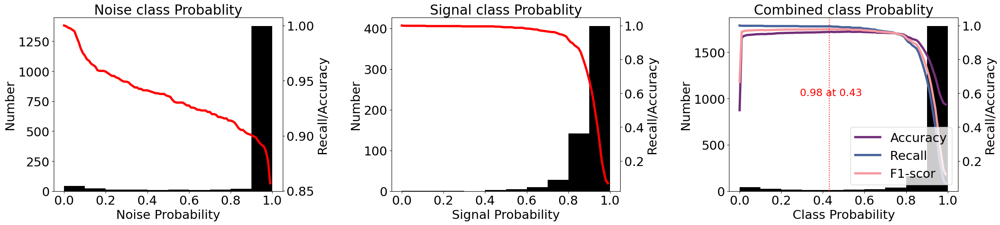

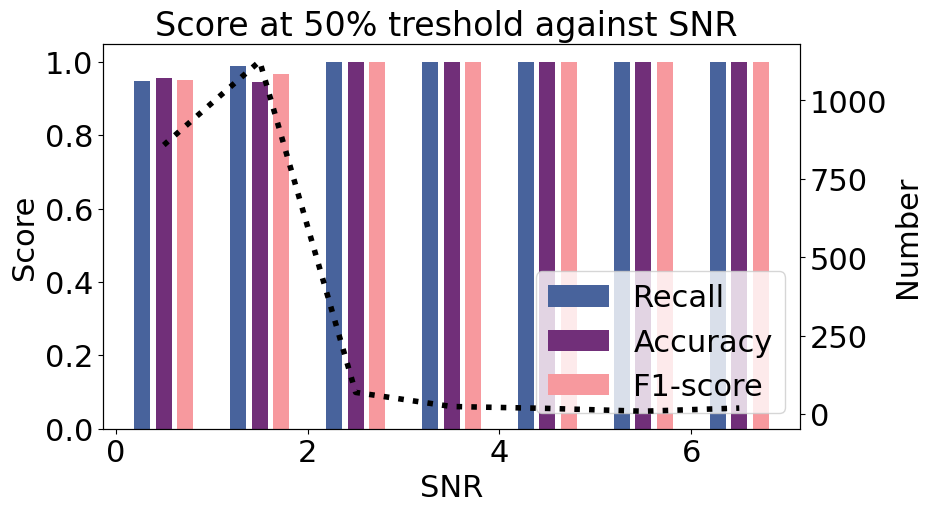

In [47]:
f1,f2, L = plotprobs(pred_list_OBS2,labels)
BestP2['OBS'] = L[0]
BestT2['OBS'] = L[1]
BestA2['OBS'] = L[3]
BestR2['OBS'] = L[2]
f1.savefig("Figure/OBST_Prob_GB.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/OBST_Snr_GB.svg", dpi=100, bbox_inches='tight')

## TESTING IsAE NoAE

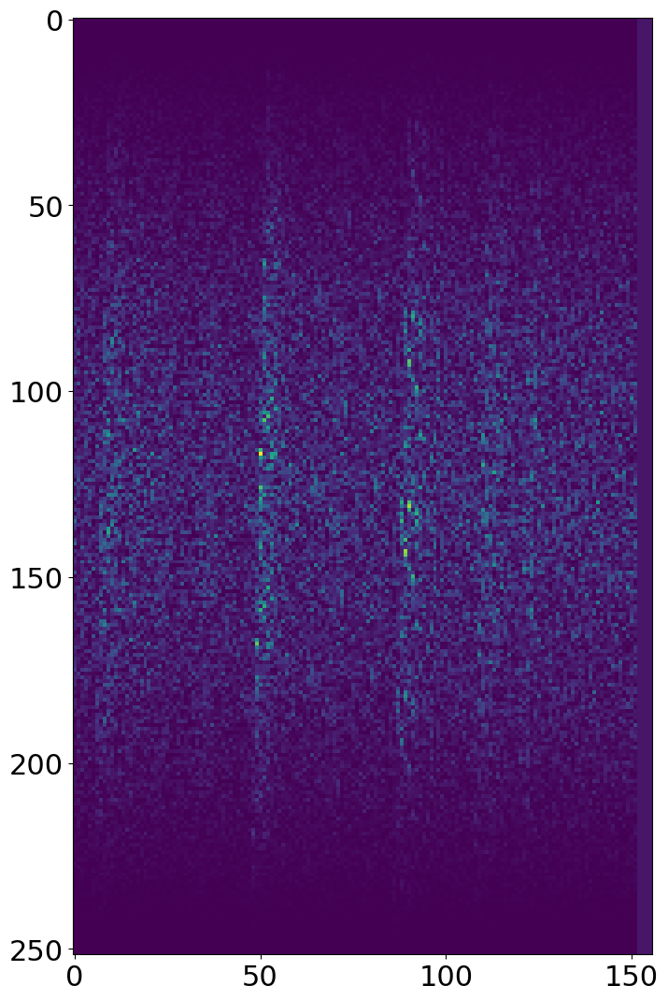

In [48]:
plt.figure(figsize=(8,16))
plt.imshow(Spectrogram[0][0])
plt.show()

In [49]:
device = 'cpu:0'
model = torch.jit.load(f'Classifier_vVOS_AVGPOOL_5_40.pt',map_location=device).to(device)

for param in model.encoder.parameters():
    param.requires_grad = False

model.eval()

RecursiveScriptModule(
  original_name=Classifier
  (encoder): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Conv2d)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Conv2d)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(original_name=Conv2d)
    (5): RecursiveScriptModule(original_name=ReLU)
    (6): RecursiveScriptModule(original_name=Conv2d)
    (7): RecursiveScriptModule(original_name=ReLU)
    (8): RecursiveScriptModule(original_name=Conv2d)
    (9): RecursiveScriptModule(original_name=ReLU)
    (10): RecursiveScriptModule(original_name=Conv2d)
  )
  (classify): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Linear)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Linear)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(or

In [50]:
prob = []
tic()
for data in tqdm(dataset_IsAEGB):
    with torch.no_grad(): 
        img, y_true = data
        img = img.unsqueeze(0).to(device).float()
        logits = model(img)
        p = logits.cpu().numpy()
        prob.append(logits[0][0].cpu())
toc()
chrono['IsAE']= tac()
pred_lis_IsAE2 = np.array(prob)    

  0%|                                                                                                                                | 0/2127 [00:00<?, ?it/s]

  2%|██▊                                                                                                                   | 50/2127 [00:00<00:04, 492.19it/s]

  5%|█████▉                                                                                                               | 107/2127 [00:00<00:03, 532.29it/s]

  8%|█████████                                                                                                            | 165/2127 [00:00<00:03, 553.11it/s]

 10%|████████████▏                                                                                                        | 222/2127 [00:00<00:03, 558.81it/s]

 13%|███████████████▎                                                                                                     | 279/2127 [00:00<00:03, 560.09it/s]

 16%|██████████████████▍                                                                                                  | 336/2127 [00:00<00:03, 559.59it/s]

 18%|█████████████████████▌                                                                                               | 392/2127 [00:00<00:03, 554.13it/s]

 21%|████████████████████████▋                                                                                            | 448/2127 [00:00<00:03, 546.61it/s]

 24%|███████████████████████████▋                                                                                         | 504/2127 [00:00<00:02, 548.68it/s]

 26%|██████████████████████████████▋                                                                                      | 559/2127 [00:01<00:02, 547.45it/s]

 29%|█████████████████████████████████▊                                                                                   | 615/2127 [00:01<00:02, 551.16it/s]

 32%|████████████████████████████████████▉                                                                                | 671/2127 [00:01<00:02, 553.09it/s]

 34%|████████████████████████████████████████▎                                                                            | 733/2127 [00:01<00:02, 572.64it/s]

 37%|███████████████████████████████████████████▊                                                                         | 796/2127 [00:01<00:02, 587.02it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 857/2127 [00:01<00:02, 592.21it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 917/2127 [00:01<00:02, 587.45it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 976/2127 [00:01<00:01, 577.79it/s]

 49%|████████████████████████████████████████████████████████▍                                                           | 1034/2127 [00:01<00:01, 576.39it/s]

 51%|███████████████████████████████████████████████████████████▌                                                        | 1092/2127 [00:01<00:01, 575.56it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                     | 1150/2127 [00:02<00:01, 574.54it/s]

 57%|█████████████████████████████████████████████████████████████████▉                                                  | 1208/2127 [00:02<00:01, 568.94it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                               | 1265/2127 [00:02<00:01, 563.78it/s]

 62%|████████████████████████████████████████████████████████████████████████                                            | 1322/2127 [00:02<00:01, 565.28it/s]

 65%|███████████████████████████████████████████████████████████████████████████▏                                        | 1379/2127 [00:02<00:01, 562.15it/s]

 68%|██████████████████████████████████████████████████████████████████████████████▎                                     | 1437/2127 [00:02<00:01, 565.30it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                  | 1494/2127 [00:02<00:01, 564.18it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▌                               | 1551/2127 [00:02<00:01, 562.18it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████▉                            | 1613/2127 [00:02<00:00, 577.81it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▎                        | 1674/2127 [00:02<00:00, 586.87it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1735/2127 [00:03<00:00, 593.03it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████                  | 1798/2127 [00:03<00:00, 602.48it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1859/2127 [00:03<00:00, 563.99it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1917/2127 [00:03<00:00, 566.68it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1980/2127 [00:03<00:00, 582.63it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2042/2127 [00:03<00:00, 593.41it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 2105/2127 [00:03<00:00, 601.25it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2127/2127 [00:03<00:00, 571.87it/s]

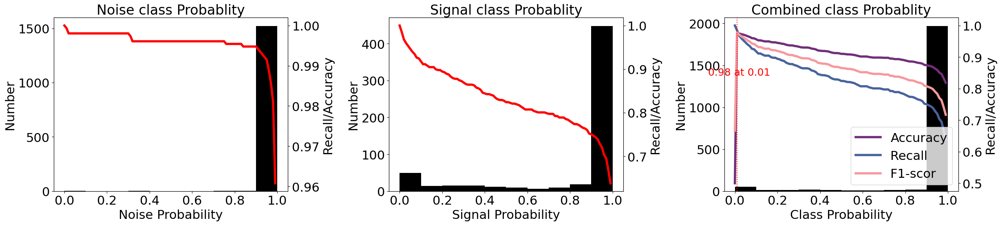

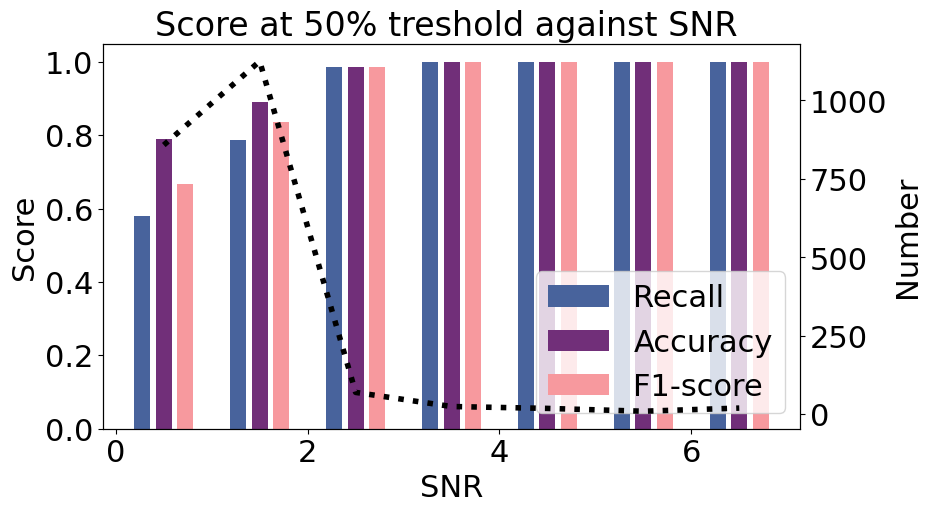

In [51]:
f1,f2, L = plotprobs(pred_lis_IsAE2,labels)
BestP2['IsAE'] = L[0]
BestT2['IsAE'] = L[1]
BestA2['IsAE'] = L[3]
BestR2['IsAE'] = L[2]
f1.savefig("Figure/IsAE_Prob_GB.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/IsAE_Snr_GB.svg", dpi=100, bbox_inches='tight')

## TESTING IsAE MinUSil

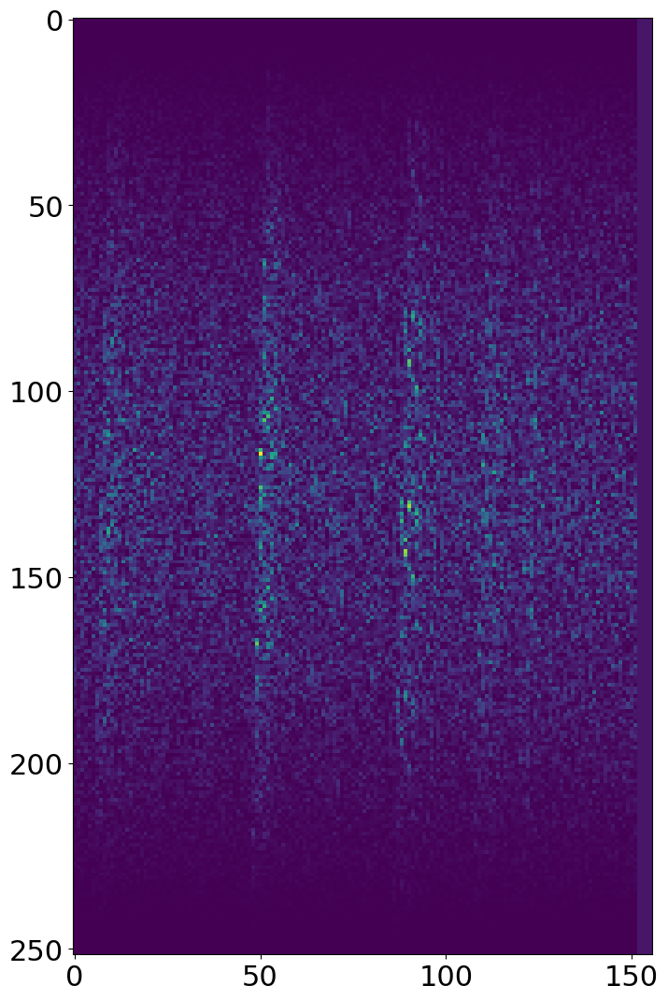

In [52]:
plt.figure(figsize=(8,16))
plt.imshow(Spectrogram[0][0])
plt.show()

In [53]:
device = 'cpu:0'
model = torch.jit.load(f'Classifier_vVOS_MAXPOOL_MINUSIL15.pt',map_location=device).to(device)

for param in model.encoder.parameters():
    param.requires_grad = False

model.eval()

RecursiveScriptModule(
  original_name=Classifier
  (encoder): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Conv2d)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Conv2d)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(original_name=Conv2d)
    (5): RecursiveScriptModule(original_name=ReLU)
    (6): RecursiveScriptModule(original_name=Conv2d)
    (7): RecursiveScriptModule(original_name=ReLU)
    (8): RecursiveScriptModule(original_name=Conv2d)
    (9): RecursiveScriptModule(original_name=ReLU)
    (10): RecursiveScriptModule(original_name=Conv2d)
  )
  (classify): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Linear)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Linear)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(or

In [54]:
prob = []
tic()
for data in tqdm(dataset_IsAEGB):
    with torch.no_grad(): 
        img, y_true = data
        img = img.unsqueeze(0).to(device).float()
        logits = model(img)
        p = logits.cpu().numpy()
        prob.append(logits[0][0].cpu())
toc()
chrono['IsAEMIN']= tac()
pred_lis_IsAEMIN2 = np.array(prob)    

  0%|                                                                                                                                | 0/2127 [00:00<?, ?it/s]

  3%|███                                                                                                                   | 56/2127 [00:00<00:03, 559.60it/s]

  6%|██████▌                                                                                                              | 119/2127 [00:00<00:03, 598.19it/s]

  8%|█████████▊                                                                                                           | 179/2127 [00:00<00:03, 590.13it/s]

 11%|█████████████▏                                                                                                       | 239/2127 [00:00<00:03, 587.28it/s]

 14%|████████████████▍                                                                                                    | 298/2127 [00:00<00:03, 579.51it/s]

 17%|███████████████████▋                                                                                                 | 358/2127 [00:00<00:03, 585.84it/s]

 20%|███████████████████████                                                                                              | 420/2127 [00:00<00:02, 595.32it/s]

 23%|██████████████████████████▍                                                                                          | 480/2127 [00:00<00:02, 592.21it/s]

 25%|█████████████████████████████▋                                                                                       | 540/2127 [00:00<00:02, 589.58it/s]

 28%|████████████████████████████████▉                                                                                    | 599/2127 [00:01<00:02, 584.76it/s]

 31%|████████████████████████████████████▏                                                                                | 658/2127 [00:01<00:02, 584.58it/s]

 34%|███████████████████████████████████████▍                                                                             | 717/2127 [00:01<00:02, 584.03it/s]

 36%|██████████████████████████████████████████▋                                                                          | 776/2127 [00:01<00:02, 582.54it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 835/2127 [00:01<00:02, 581.01it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 894/2127 [00:01<00:02, 582.50it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 953/2127 [00:01<00:02, 583.32it/s]

 48%|███████████████████████████████████████████████████████▏                                                            | 1012/2127 [00:01<00:01, 582.56it/s]

 50%|██████████████████████████████████████████████████████████▍                                                         | 1071/2127 [00:01<00:01, 582.62it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                      | 1130/2127 [00:01<00:01, 580.90it/s]

 56%|████████████████████████████████████████████████████████████████▊                                                   | 1189/2127 [00:02<00:01, 579.03it/s]

 59%|████████████████████████████████████████████████████████████████████                                                | 1248/2127 [00:02<00:01, 580.00it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                            | 1307/2127 [00:02<00:01, 578.12it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                         | 1365/2127 [00:02<00:01, 575.80it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▌                                      | 1423/2127 [00:02<00:01, 574.42it/s]

 70%|████████████████████████████████████████████████████████████████████████████████▊                                   | 1481/2127 [00:02<00:01, 568.37it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▎                               | 1546/2127 [00:02<00:00, 589.90it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████▊                            | 1610/2127 [00:02<00:00, 601.83it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▏                        | 1671/2127 [00:02<00:00, 595.56it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1731/2127 [00:02<00:00, 583.07it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1790/2127 [00:03<00:00, 580.60it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1849/2127 [00:03<00:00, 578.47it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1907/2127 [00:03<00:00, 576.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1965/2127 [00:03<00:00, 574.31it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 2023/2127 [00:03<00:00, 572.80it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2081/2127 [00:03<00:00, 570.50it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2127/2127 [00:03<00:00, 581.45it/s]

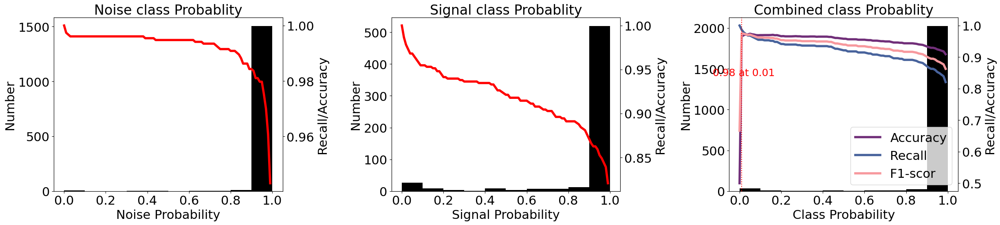

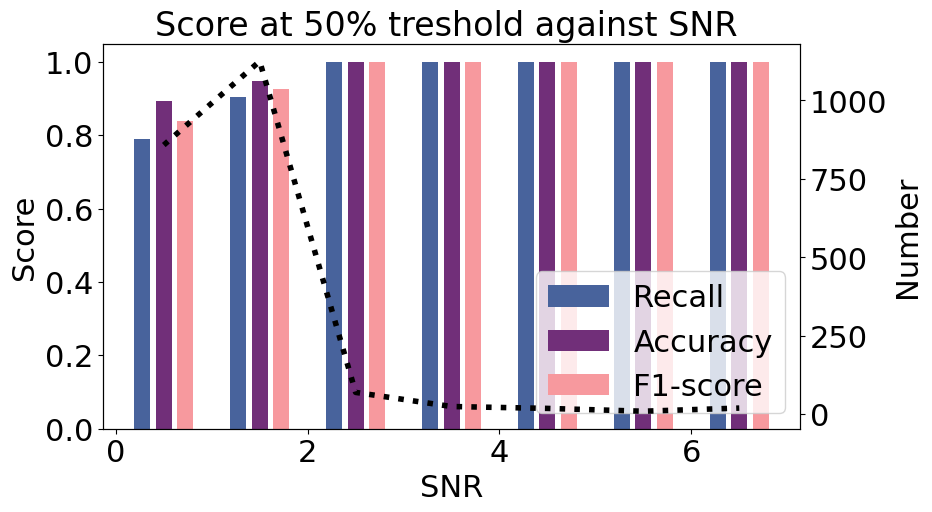

In [55]:
f1,f2, L = plotprobs(pred_lis_IsAEMIN2,labels)
BestP2['IsAEMIN'] = L[0]
BestT2['IsAEMIN'] = L[1]
BestA2['IsAEMIN'] = L[3]
BestR2['IsAEMIN'] = L[2]
f1.savefig("Figure/IsAEMIN_Prob_GB.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/IsAEMIN_Snr_GB.svg", dpi=100, bbox_inches='tight')

## Clock Figure

In [56]:
chrono2  = dict(sorted(chrono.items(), key=lambda item: item[1]))

In [57]:
plt.figure(figsize=(10,7))
clocks_k = list(chrono2.keys())
plt.bar(clocks_k, [ chrono2[x]/len(dataset_IsAEGB)*1000 for x in clocks_k ],color='k' )
plt.ylabel('Time [miliseconde]')
plt.title('Average time to process 1 Sample')
plt.show()

NameError: name 'dataset_IsAEMI' is not defined

<Figure size 1000x700 with 0 Axes>

# Testing on SeisBench Available Models and IsAE on MinUSil AENet Data

In [58]:
# Initialize dict
BestP3 ={}
BestT3 = {}
chrono3 = {}
BestA3 = {}
BestR3 = {}

## load data

In [59]:
file = 'dataset_Minusil_AENet'
with h5py.File(f'{file}.h5', 'r') as f:
    # Load waveforms and labels

    labels = f['labels'][:]
    waveforms = f['waveforms'][:]
    # Load metadata
    #paths = f['paths']
    Spectrogram  = f['spectrograms'][:]
    
    SNR = MakeSNR(waveforms)

MaxFrqsMin = np.array([max_frequency(w[0],10*1e6) for w in waveforms])
LabelMin = labels
print(f"Dataset loaded from '{file}.h5'.")
print('Number of elements : ',len(labels))

# Initialize the dataset For Natural Trained Earthquakes
datasetMI = CustomWaveformDataset_Seisbench(['']*len(labels), labels, ['']*len(labels), waveforms)
dataset_IsAEMI = CustomWaveformDataset_IsAE([''], labels, [''], waveforms,Spectrogram)

Dataset loaded from 'dataset_Minusil_AENet.h5'.
Number of elements :  6869


In [60]:
len(waveforms[0][0])

8000

In [61]:
print(datasetMI[0][0])  # Should be (3, num_samples) for 3-component data
print(datasetMI[0])

3 Trace(s) in Stream:
...Component_1 | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:01:21.910000Z | 100.0 Hz, 8192 samples
...Component_2 | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:01:21.910000Z | 100.0 Hz, 8192 samples
...Component_3 | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:01:21.910000Z | 100.0 Hz, 8192 samples
(<obspy.core.stream.Stream object at 0x7fb8d41e5ac0>, tensor(1))


## Cred

In [62]:
%autoawait on
# Load the pre-trained model
print(CRED.list_pretrained())
model = CRED.from_pretrained("original")
model.to('cpu:0')


['ethz', 'geofon', 'instance', 'lendb', 'original', 'scedc', 'stead']


CRED(
  (conv1): Conv2d(3, 8, kernel_size=(9, 9), stride=(2, 2), padding=(4, 4))
  (cnn_block1): BlockCNN(
    (convs): ModuleList(
      (0-1): 2 x Conv2d(8, 8, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    )
    (norms): ModuleList(
      (0-1): 2 x BatchNorm2d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (conv2): Conv2d(8, 16, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (cnn_block2): BlockCNN(
    (convs): ModuleList(
      (0-1): 2 x Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (norms): ModuleList(
      (0-1): 2 x BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (lstm_block): BlockBiLSTM(
    (dropout): Dropout(p=0.3, inplace=False)
    (lstms): ModuleList(
      (0): LSTM(176, 64, batch_first=True, bidirectional=True)
      (1): LSTM(128, 64, batch_first=True, bidirectional=True)
    )
  )
  (lstm): LSTM(128, 64, batch_first=True)
  (dropout): Dropout(p=0.

In [63]:
pred_list = []
tic()
for i in tqdm(range(len(datasetMI))):
    preds = model.annotate(datasetMI[i][0])
    pred_list.append(max(preds[0].data) )
toc()
chrono3['Cred']=tac()
pred_list_Cred3 = np.array(pred_list)

  0%|                                                                                                                                | 0/6869 [00:00<?, ?it/s]

  0%|                                                                                                                        | 4/6869 [00:00<03:11, 35.77it/s]

  0%|▏                                                                                                                       | 8/6869 [00:00<04:30, 25.39it/s]

  0%|▏                                                                                                                      | 12/6869 [00:00<03:58, 28.70it/s]

  0%|▎                                                                                                                      | 16/6869 [00:00<04:31, 25.22it/s]

  0%|▎                                                                                                                      | 19/6869 [00:00<05:08, 22.23it/s]

  0%|▍                                                                                                                      | 22/6869 [00:00<05:05, 22.38it/s]

  0%|▍                                                                                                                      | 25/6869 [00:01<05:00, 22.79it/s]

  0%|▍                                                                                                                      | 28/6869 [00:01<04:58, 22.88it/s]

  0%|▌                                                                                                                      | 31/6869 [00:01<04:49, 23.59it/s]

  0%|▌                                                                                                                      | 34/6869 [00:01<04:37, 24.66it/s]

  1%|▋                                                                                                                      | 38/6869 [00:01<04:09, 27.33it/s]

  1%|▋                                                                                                                      | 41/6869 [00:01<04:08, 27.44it/s]

  1%|▊                                                                                                                      | 44/6869 [00:01<04:22, 26.04it/s]

  1%|▊                                                                                                                      | 47/6869 [00:01<04:20, 26.15it/s]

  1%|▉                                                                                                                      | 51/6869 [00:02<04:24, 25.79it/s]

  1%|▉                                                                                                                      | 54/6869 [00:02<04:32, 24.99it/s]

  1%|█                                                                                                                      | 58/6869 [00:02<04:12, 26.96it/s]

  1%|█                                                                                                                      | 62/6869 [00:02<04:06, 27.61it/s]

  1%|█▏                                                                                                                     | 65/6869 [00:02<04:32, 24.94it/s]

  1%|█▏                                                                                                                     | 69/6869 [00:02<04:04, 27.83it/s]

  1%|█▏                                                                                                                     | 72/6869 [00:02<04:37, 24.46it/s]

  1%|█▎                                                                                                                     | 75/6869 [00:02<04:42, 24.04it/s]

  1%|█▎                                                                                                                     | 79/6869 [00:03<04:45, 23.78it/s]

  1%|█▍                                                                                                                     | 82/6869 [00:03<04:43, 23.96it/s]

  1%|█▍                                                                                                                     | 85/6869 [00:03<04:45, 23.73it/s]

  1%|█▌                                                                                                                     | 88/6869 [00:03<04:43, 23.90it/s]

  1%|█▌                                                                                                                     | 91/6869 [00:03<04:40, 24.12it/s]

  1%|█▋                                                                                                                     | 94/6869 [00:03<04:39, 24.21it/s]

  1%|█▋                                                                                                                     | 97/6869 [00:03<04:43, 23.87it/s]

  1%|█▋                                                                                                                    | 100/6869 [00:04<04:31, 24.96it/s]

  1%|█▊                                                                                                                    | 103/6869 [00:04<04:56, 22.79it/s]

  2%|█▊                                                                                                                    | 107/6869 [00:04<04:21, 25.89it/s]

  2%|█▉                                                                                                                    | 110/6869 [00:04<04:11, 26.85it/s]

  2%|█▉                                                                                                                    | 113/6869 [00:04<04:27, 25.23it/s]

  2%|██                                                                                                                    | 117/6869 [00:04<04:17, 26.18it/s]

  2%|██                                                                                                                    | 120/6869 [00:04<04:32, 24.80it/s]

  2%|██                                                                                                                    | 123/6869 [00:04<04:30, 24.95it/s]

  2%|██▏                                                                                                                   | 127/6869 [00:05<04:12, 26.71it/s]

  2%|██▏                                                                                                                   | 130/6869 [00:05<04:11, 26.76it/s]

  2%|██▎                                                                                                                   | 133/6869 [00:05<04:29, 25.01it/s]

  2%|██▎                                                                                                                   | 136/6869 [00:05<04:35, 24.40it/s]

  2%|██▍                                                                                                                   | 140/6869 [00:05<04:17, 26.11it/s]

  2%|██▍                                                                                                                   | 143/6869 [00:05<04:36, 24.32it/s]

  2%|██▌                                                                                                                   | 146/6869 [00:05<04:51, 23.08it/s]

  2%|██▌                                                                                                                   | 150/6869 [00:05<04:32, 24.62it/s]

  2%|██▋                                                                                                                   | 153/6869 [00:06<04:39, 24.05it/s]

  2%|██▋                                                                                                                   | 156/6869 [00:06<04:52, 22.97it/s]

  2%|██▋                                                                                                                   | 159/6869 [00:06<04:59, 22.41it/s]

  2%|██▊                                                                                                                   | 164/6869 [00:06<03:56, 28.40it/s]

  2%|██▊                                                                                                                   | 167/6869 [00:06<04:40, 23.86it/s]

  3%|██▉                                                                                                                   | 172/6869 [00:06<03:58, 28.03it/s]

  3%|███                                                                                                                   | 175/6869 [00:06<04:01, 27.76it/s]

  3%|███                                                                                                                   | 179/6869 [00:07<03:46, 29.59it/s]

  3%|███▏                                                                                                                  | 183/6869 [00:07<04:21, 25.59it/s]

  3%|███▏                                                                                                                  | 186/6869 [00:07<04:23, 25.34it/s]

  3%|███▏                                                                                                                  | 189/6869 [00:07<05:00, 22.24it/s]

  3%|███▎                                                                                                                  | 193/6869 [00:07<04:37, 24.09it/s]

  3%|███▎                                                                                                                  | 196/6869 [00:07<04:35, 24.26it/s]

  3%|███▍                                                                                                                  | 199/6869 [00:07<04:26, 25.02it/s]

  3%|███▍                                                                                                                  | 202/6869 [00:08<04:42, 23.59it/s]

  3%|███▌                                                                                                                  | 206/6869 [00:08<04:19, 25.69it/s]

  3%|███▌                                                                                                                  | 209/6869 [00:08<04:29, 24.72it/s]

  3%|███▋                                                                                                                  | 212/6869 [00:08<04:22, 25.36it/s]

  3%|███▋                                                                                                                  | 215/6869 [00:08<04:14, 26.15it/s]

  3%|███▋                                                                                                                  | 218/6869 [00:08<04:07, 26.86it/s]

  3%|███▊                                                                                                                  | 221/6869 [00:08<04:33, 24.27it/s]

  3%|███▊                                                                                                                  | 225/6869 [00:08<04:02, 27.40it/s]

  3%|███▉                                                                                                                  | 228/6869 [00:09<04:29, 24.65it/s]

  3%|███▉                                                                                                                  | 231/6869 [00:09<04:25, 24.98it/s]

  3%|████                                                                                                                  | 234/6869 [00:09<04:37, 23.91it/s]

  3%|████                                                                                                                  | 237/6869 [00:09<04:41, 23.53it/s]

  3%|████                                                                                                                  | 240/6869 [00:09<04:26, 24.83it/s]

  4%|████▏                                                                                                                 | 243/6869 [00:09<04:16, 25.82it/s]

  4%|████▏                                                                                                                 | 246/6869 [00:09<04:30, 24.50it/s]

  4%|████▎                                                                                                                 | 249/6869 [00:09<04:29, 24.60it/s]

  4%|████▎                                                                                                                 | 252/6869 [00:10<04:49, 22.87it/s]

  4%|████▍                                                                                                                 | 256/6869 [00:10<04:15, 25.85it/s]

  4%|████▍                                                                                                                 | 259/6869 [00:10<04:06, 26.76it/s]

  4%|████▌                                                                                                                 | 262/6869 [00:10<04:03, 27.17it/s]

  4%|████▌                                                                                                                 | 266/6869 [00:10<03:39, 30.04it/s]

  4%|████▋                                                                                                                 | 270/6869 [00:10<04:05, 26.92it/s]

  4%|████▋                                                                                                                 | 273/6869 [00:10<04:19, 25.45it/s]

  4%|████▊                                                                                                                 | 277/6869 [00:10<04:02, 27.23it/s]

  4%|████▊                                                                                                                 | 280/6869 [00:11<04:22, 25.14it/s]

  4%|████▊                                                                                                                 | 283/6869 [00:11<04:21, 25.18it/s]

  4%|████▉                                                                                                                 | 286/6869 [00:11<04:30, 24.30it/s]

  4%|████▉                                                                                                                 | 290/6869 [00:11<04:02, 27.17it/s]

  4%|█████                                                                                                                 | 293/6869 [00:11<04:11, 26.17it/s]

  4%|█████                                                                                                                 | 297/6869 [00:11<04:04, 26.92it/s]

  4%|█████▏                                                                                                                | 300/6869 [00:11<04:36, 23.74it/s]

  4%|█████▏                                                                                                                | 303/6869 [00:12<04:40, 23.41it/s]

  4%|█████▎                                                                                                                | 306/6869 [00:12<04:56, 22.15it/s]

  4%|█████▎                                                                                                                | 309/6869 [00:12<04:38, 23.59it/s]

  5%|█████▍                                                                                                                | 313/6869 [00:12<04:09, 26.28it/s]

  5%|█████▍                                                                                                                | 316/6869 [00:12<04:11, 26.01it/s]

  5%|█████▍                                                                                                                | 319/6869 [00:12<04:10, 26.13it/s]

  5%|█████▌                                                                                                                | 322/6869 [00:12<04:11, 26.03it/s]

  5%|█████▌                                                                                                                | 326/6869 [00:12<04:05, 26.70it/s]

  5%|█████▋                                                                                                                | 329/6869 [00:13<04:05, 26.67it/s]

  5%|█████▋                                                                                                                | 332/6869 [00:13<04:19, 25.22it/s]

  5%|█████▊                                                                                                                | 335/6869 [00:13<04:16, 25.52it/s]

  5%|█████▊                                                                                                                | 339/6869 [00:13<03:58, 27.36it/s]

  5%|█████▉                                                                                                                | 342/6869 [00:13<04:35, 23.72it/s]

  5%|█████▉                                                                                                                | 346/6869 [00:13<04:08, 26.27it/s]

  5%|██████                                                                                                                | 350/6869 [00:13<04:14, 25.58it/s]

  5%|██████                                                                                                                | 353/6869 [00:13<04:15, 25.53it/s]

  5%|██████▏                                                                                                               | 357/6869 [00:14<04:09, 26.12it/s]

  5%|██████▏                                                                                                               | 360/6869 [00:14<04:08, 26.20it/s]

  5%|██████▏                                                                                                               | 363/6869 [00:14<04:15, 25.47it/s]

  5%|██████▎                                                                                                               | 366/6869 [00:14<04:10, 25.99it/s]

  5%|██████▎                                                                                                               | 369/6869 [00:14<04:37, 23.39it/s]

  5%|██████▍                                                                                                               | 372/6869 [00:14<04:32, 23.88it/s]

  5%|██████▍                                                                                                               | 376/6869 [00:14<04:00, 26.98it/s]

  6%|██████▌                                                                                                               | 379/6869 [00:15<04:22, 24.71it/s]

  6%|██████▌                                                                                                               | 382/6869 [00:15<04:14, 25.52it/s]

  6%|██████▌                                                                                                               | 385/6869 [00:15<04:20, 24.89it/s]

  6%|██████▋                                                                                                               | 389/6869 [00:15<04:04, 26.47it/s]

  6%|██████▋                                                                                                               | 392/6869 [00:15<04:19, 24.94it/s]

  6%|██████▊                                                                                                               | 395/6869 [00:15<04:12, 25.65it/s]

  6%|██████▊                                                                                                               | 398/6869 [00:15<04:14, 25.47it/s]

  6%|██████▉                                                                                                               | 401/6869 [00:15<04:32, 23.78it/s]

  6%|██████▉                                                                                                               | 405/6869 [00:16<04:14, 25.42it/s]

  6%|███████                                                                                                               | 408/6869 [00:16<04:42, 22.85it/s]

  6%|███████                                                                                                               | 411/6869 [00:16<04:46, 22.51it/s]

  6%|███████                                                                                                               | 414/6869 [00:16<04:41, 22.93it/s]

  6%|███████▏                                                                                                              | 417/6869 [00:16<04:31, 23.75it/s]

  6%|███████▏                                                                                                              | 420/6869 [00:16<04:35, 23.37it/s]

  6%|███████▎                                                                                                              | 424/6869 [00:16<04:10, 25.76it/s]

  6%|███████▎                                                                                                              | 427/6869 [00:17<04:41, 22.87it/s]

  6%|███████▍                                                                                                              | 431/6869 [00:17<04:08, 25.94it/s]

  6%|███████▍                                                                                                              | 434/6869 [00:17<04:00, 26.76it/s]

  6%|███████▌                                                                                                              | 437/6869 [00:17<04:00, 26.80it/s]

  6%|███████▌                                                                                                              | 440/6869 [00:17<04:08, 25.86it/s]

  6%|███████▌                                                                                                              | 443/6869 [00:17<04:41, 22.83it/s]

  7%|███████▋                                                                                                              | 447/6869 [00:17<04:00, 26.75it/s]

  7%|███████▋                                                                                                              | 450/6869 [00:17<04:16, 25.05it/s]

  7%|███████▊                                                                                                              | 453/6869 [00:17<04:06, 26.07it/s]

  7%|███████▊                                                                                                              | 456/6869 [00:18<04:32, 23.50it/s]

  7%|███████▉                                                                                                              | 459/6869 [00:18<04:21, 24.50it/s]

  7%|███████▉                                                                                                              | 462/6869 [00:18<04:15, 25.09it/s]

  7%|███████▉                                                                                                              | 465/6869 [00:18<04:49, 22.12it/s]

  7%|████████                                                                                                              | 468/6869 [00:18<04:34, 23.29it/s]

  7%|████████                                                                                                              | 471/6869 [00:18<04:50, 22.02it/s]

  7%|████████▏                                                                                                             | 476/6869 [00:18<04:02, 26.40it/s]

  7%|████████▏                                                                                                             | 479/6869 [00:19<04:07, 25.87it/s]

  7%|████████▎                                                                                                             | 482/6869 [00:19<04:01, 26.40it/s]

  7%|████████▎                                                                                                             | 485/6869 [00:19<04:24, 24.15it/s]

  7%|████████▍                                                                                                             | 489/6869 [00:19<03:49, 27.82it/s]

  7%|████████▍                                                                                                             | 492/6869 [00:19<03:49, 27.77it/s]

  7%|████████▌                                                                                                             | 495/6869 [00:19<04:02, 26.32it/s]

  7%|████████▌                                                                                                             | 498/6869 [00:19<04:02, 26.32it/s]

  7%|████████▌                                                                                                             | 502/6869 [00:19<03:58, 26.64it/s]

  7%|████████▋                                                                                                             | 506/6869 [00:20<03:46, 28.06it/s]

  7%|████████▋                                                                                                             | 509/6869 [00:20<03:47, 27.91it/s]

  7%|████████▊                                                                                                             | 513/6869 [00:20<03:44, 28.37it/s]

  8%|████████▊                                                                                                             | 516/6869 [00:20<04:09, 25.44it/s]

  8%|████████▉                                                                                                             | 520/6869 [00:20<04:08, 25.57it/s]

  8%|████████▉                                                                                                             | 523/6869 [00:20<04:05, 25.90it/s]

  8%|█████████                                                                                                             | 526/6869 [00:20<04:27, 23.67it/s]

  8%|█████████                                                                                                             | 529/6869 [00:20<04:14, 24.88it/s]

  8%|█████████▏                                                                                                            | 532/6869 [00:21<04:24, 23.95it/s]

  8%|█████████▏                                                                                                            | 535/6869 [00:21<04:25, 23.83it/s]

  8%|█████████▎                                                                                                            | 539/6869 [00:21<04:01, 26.22it/s]

  8%|█████████▎                                                                                                            | 542/6869 [00:21<04:21, 24.24it/s]

  8%|█████████▎                                                                                                            | 545/6869 [00:21<04:31, 23.32it/s]

  8%|█████████▍                                                                                                            | 548/6869 [00:21<04:25, 23.78it/s]

  8%|█████████▍                                                                                                            | 552/6869 [00:21<04:09, 25.35it/s]

  8%|█████████▌                                                                                                            | 555/6869 [00:22<04:01, 26.14it/s]

  8%|█████████▌                                                                                                            | 558/6869 [00:22<04:28, 23.47it/s]

  8%|█████████▋                                                                                                            | 561/6869 [00:22<04:15, 24.67it/s]

  8%|█████████▋                                                                                                            | 564/6869 [00:22<04:16, 24.61it/s]

  8%|█████████▋                                                                                                            | 567/6869 [00:22<04:13, 24.89it/s]

  8%|█████████▊                                                                                                            | 570/6869 [00:22<04:11, 25.00it/s]

  8%|█████████▊                                                                                                            | 574/6869 [00:22<04:18, 24.34it/s]

  8%|█████████▉                                                                                                            | 577/6869 [00:22<04:14, 24.70it/s]

  8%|█████████▉                                                                                                            | 581/6869 [00:23<04:09, 25.23it/s]

  9%|██████████                                                                                                            | 584/6869 [00:23<04:20, 24.10it/s]

  9%|██████████                                                                                                            | 587/6869 [00:23<04:21, 24.03it/s]

  9%|██████████▏                                                                                                           | 590/6869 [00:23<04:44, 22.09it/s]

  9%|██████████▏                                                                                                           | 593/6869 [00:23<04:26, 23.57it/s]

  9%|██████████▏                                                                                                           | 596/6869 [00:23<04:12, 24.87it/s]

  9%|██████████▎                                                                                                           | 599/6869 [00:23<04:01, 25.97it/s]

  9%|██████████▎                                                                                                           | 602/6869 [00:23<03:57, 26.36it/s]

  9%|██████████▍                                                                                                           | 605/6869 [00:24<04:10, 25.05it/s]

  9%|██████████▍                                                                                                           | 608/6869 [00:24<04:18, 24.19it/s]

  9%|██████████▍                                                                                                           | 611/6869 [00:24<04:22, 23.88it/s]

  9%|██████████▌                                                                                                           | 614/6869 [00:24<04:21, 23.89it/s]

  9%|██████████▌                                                                                                           | 617/6869 [00:24<04:16, 24.41it/s]

  9%|██████████▋                                                                                                           | 620/6869 [00:24<04:02, 25.79it/s]

  9%|██████████▋                                                                                                           | 623/6869 [00:24<04:03, 25.64it/s]

  9%|██████████▊                                                                                                           | 626/6869 [00:24<04:53, 21.24it/s]

  9%|██████████▊                                                                                                           | 630/6869 [00:25<04:06, 25.34it/s]

  9%|██████████▊                                                                                                           | 633/6869 [00:25<04:00, 25.98it/s]

  9%|██████████▉                                                                                                           | 637/6869 [00:25<03:47, 27.43it/s]

  9%|██████████▉                                                                                                           | 640/6869 [00:25<04:19, 24.05it/s]

  9%|███████████                                                                                                           | 644/6869 [00:25<03:45, 27.63it/s]

  9%|███████████                                                                                                           | 647/6869 [00:25<03:49, 27.08it/s]

  9%|███████████▏                                                                                                          | 650/6869 [00:25<03:57, 26.17it/s]

 10%|███████████▏                                                                                                          | 653/6869 [00:25<04:15, 24.33it/s]

 10%|███████████▎                                                                                                          | 657/6869 [00:26<03:54, 26.54it/s]

 10%|███████████▎                                                                                                          | 660/6869 [00:26<03:49, 27.11it/s]

 10%|███████████▍                                                                                                          | 663/6869 [00:26<03:51, 26.80it/s]

 10%|███████████▍                                                                                                          | 666/6869 [00:26<04:47, 21.55it/s]

 10%|███████████▍                                                                                                          | 669/6869 [00:26<04:32, 22.75it/s]

 10%|███████████▌                                                                                                          | 672/6869 [00:26<04:47, 21.59it/s]

 10%|███████████▋                                                                                                          | 677/6869 [00:26<03:47, 27.16it/s]

 10%|███████████▋                                                                                                          | 680/6869 [00:27<04:01, 25.67it/s]

 10%|███████████▋                                                                                                          | 683/6869 [00:27<03:52, 26.57it/s]

 10%|███████████▊                                                                                                          | 686/6869 [00:27<03:54, 26.39it/s]

 10%|███████████▊                                                                                                          | 689/6869 [00:27<04:02, 25.53it/s]

 10%|███████████▉                                                                                                          | 692/6869 [00:27<04:15, 24.15it/s]

 10%|███████████▉                                                                                                          | 695/6869 [00:27<04:09, 24.76it/s]

 10%|███████████▉                                                                                                          | 698/6869 [00:27<04:31, 22.74it/s]

 10%|████████████                                                                                                          | 702/6869 [00:27<04:04, 25.25it/s]

 10%|████████████▏                                                                                                         | 706/6869 [00:28<03:49, 26.81it/s]

 10%|████████████▏                                                                                                         | 709/6869 [00:28<04:23, 23.42it/s]

 10%|████████████▏                                                                                                         | 713/6869 [00:28<04:10, 24.61it/s]

 10%|████████████▎                                                                                                         | 717/6869 [00:28<04:04, 25.15it/s]

 10%|████████████▎                                                                                                         | 720/6869 [00:28<04:06, 24.97it/s]

 11%|████████████▍                                                                                                         | 723/6869 [00:28<04:05, 24.99it/s]

 11%|████████████▍                                                                                                         | 726/6869 [00:28<04:03, 25.21it/s]

 11%|████████████▌                                                                                                         | 730/6869 [00:29<03:37, 28.18it/s]

 11%|████████████▌                                                                                                         | 733/6869 [00:29<03:37, 28.27it/s]

 11%|████████████▋                                                                                                         | 736/6869 [00:29<03:58, 25.72it/s]

 11%|████████████▋                                                                                                         | 739/6869 [00:29<03:56, 25.88it/s]

 11%|████████████▊                                                                                                         | 743/6869 [00:29<03:51, 26.48it/s]

 11%|████████████▊                                                                                                         | 746/6869 [00:29<04:01, 25.37it/s]

 11%|████████████▉                                                                                                         | 750/6869 [00:29<03:38, 28.05it/s]

 11%|████████████▉                                                                                                         | 753/6869 [00:29<04:02, 25.17it/s]

 11%|█████████████                                                                                                         | 757/6869 [00:30<03:45, 27.05it/s]

 11%|█████████████                                                                                                         | 760/6869 [00:30<04:00, 25.42it/s]

 11%|█████████████                                                                                                         | 763/6869 [00:30<04:42, 21.62it/s]

 11%|█████████████▏                                                                                                        | 767/6869 [00:30<03:58, 25.63it/s]

 11%|█████████████▏                                                                                                        | 771/6869 [00:30<04:01, 25.28it/s]

 11%|█████████████▎                                                                                                        | 775/6869 [00:30<03:36, 28.14it/s]

 11%|█████████████▎                                                                                                        | 778/6869 [00:30<04:05, 24.81it/s]

 11%|█████████████▍                                                                                                        | 781/6869 [00:31<04:13, 24.03it/s]

 11%|█████████████▍                                                                                                        | 784/6869 [00:31<04:03, 24.97it/s]

 11%|█████████████▌                                                                                                        | 787/6869 [00:31<04:07, 24.57it/s]

 12%|█████████████▌                                                                                                        | 790/6869 [00:31<03:59, 25.41it/s]

 12%|█████████████▋                                                                                                        | 794/6869 [00:31<03:46, 26.77it/s]

 12%|█████████████▋                                                                                                        | 797/6869 [00:31<04:02, 25.02it/s]

 12%|█████████████▋                                                                                                        | 800/6869 [00:31<04:01, 25.15it/s]

 12%|█████████████▊                                                                                                        | 803/6869 [00:31<04:14, 23.87it/s]

 12%|█████████████▊                                                                                                        | 806/6869 [00:32<04:30, 22.45it/s]

 12%|█████████████▉                                                                                                        | 810/6869 [00:32<03:59, 25.33it/s]

 12%|█████████████▉                                                                                                        | 814/6869 [00:32<03:40, 27.45it/s]

 12%|██████████████                                                                                                        | 817/6869 [00:32<03:40, 27.42it/s]

 12%|██████████████                                                                                                        | 820/6869 [00:32<03:56, 25.58it/s]

 12%|██████████████▏                                                                                                       | 823/6869 [00:32<04:05, 24.61it/s]

 12%|██████████████▏                                                                                                       | 827/6869 [00:32<03:42, 27.17it/s]

 12%|██████████████▎                                                                                                       | 830/6869 [00:32<03:52, 25.93it/s]

 12%|██████████████▎                                                                                                       | 833/6869 [00:33<03:56, 25.56it/s]

 12%|██████████████▍                                                                                                       | 837/6869 [00:33<03:58, 25.29it/s]

 12%|██████████████▍                                                                                                       | 841/6869 [00:33<03:50, 26.14it/s]

 12%|██████████████▌                                                                                                       | 845/6869 [00:33<03:45, 26.71it/s]

 12%|██████████████▌                                                                                                       | 848/6869 [00:33<04:09, 24.15it/s]

 12%|██████████████▌                                                                                                       | 851/6869 [00:33<04:07, 24.35it/s]

 12%|██████████████▋                                                                                                       | 854/6869 [00:33<03:56, 25.43it/s]

 13%|██████████████▊                                                                                                       | 859/6869 [00:34<03:36, 27.71it/s]

 13%|██████████████▊                                                                                                       | 862/6869 [00:34<03:41, 27.13it/s]

 13%|██████████████▊                                                                                                       | 865/6869 [00:34<03:49, 26.12it/s]

 13%|██████████████▉                                                                                                       | 869/6869 [00:34<03:42, 26.93it/s]

 13%|██████████████▉                                                                                                       | 872/6869 [00:34<03:57, 25.23it/s]

 13%|███████████████                                                                                                       | 877/6869 [00:34<03:27, 28.91it/s]

 13%|███████████████                                                                                                       | 880/6869 [00:34<03:45, 26.51it/s]

 13%|███████████████▏                                                                                                      | 883/6869 [00:34<03:47, 26.32it/s]

 13%|███████████████▏                                                                                                      | 886/6869 [00:35<03:45, 26.48it/s]

 13%|███████████████▎                                                                                                      | 889/6869 [00:35<03:43, 26.77it/s]

 13%|███████████████▎                                                                                                      | 892/6869 [00:35<03:43, 26.70it/s]

 13%|███████████████▎                                                                                                      | 895/6869 [00:35<03:56, 25.28it/s]

 13%|███████████████▍                                                                                                      | 898/6869 [00:35<04:13, 23.55it/s]

 13%|███████████████▍                                                                                                      | 902/6869 [00:35<03:45, 26.41it/s]

 13%|███████████████▌                                                                                                      | 905/6869 [00:35<03:47, 26.19it/s]

 13%|███████████████▌                                                                                                      | 908/6869 [00:35<04:13, 23.52it/s]

 13%|███████████████▋                                                                                                      | 911/6869 [00:36<03:59, 24.86it/s]

 13%|███████████████▋                                                                                                      | 915/6869 [00:36<03:49, 25.91it/s]

 13%|███████████████▊                                                                                                      | 918/6869 [00:36<04:14, 23.41it/s]

 13%|███████████████▊                                                                                                      | 922/6869 [00:36<03:48, 26.03it/s]

 13%|███████████████▉                                                                                                      | 926/6869 [00:36<03:52, 25.54it/s]

 14%|███████████████▉                                                                                                      | 929/6869 [00:36<03:50, 25.72it/s]

 14%|████████████████                                                                                                      | 932/6869 [00:36<04:13, 23.41it/s]

 14%|████████████████                                                                                                      | 936/6869 [00:37<03:44, 26.41it/s]

 14%|████████████████▏                                                                                                     | 939/6869 [00:37<03:59, 24.75it/s]

 14%|████████████████▏                                                                                                     | 943/6869 [00:37<03:33, 27.81it/s]

 14%|████████████████▎                                                                                                     | 946/6869 [00:37<04:02, 24.41it/s]

 14%|████████████████▎                                                                                                     | 949/6869 [00:37<04:03, 24.31it/s]

 14%|████████████████▎                                                                                                     | 953/6869 [00:37<03:42, 26.60it/s]

 14%|████████████████▍                                                                                                     | 956/6869 [00:37<03:54, 25.22it/s]

 14%|████████████████▍                                                                                                     | 960/6869 [00:37<03:37, 27.21it/s]

 14%|████████████████▌                                                                                                     | 963/6869 [00:38<03:50, 25.61it/s]

 14%|████████████████▌                                                                                                     | 966/6869 [00:38<03:56, 25.01it/s]

 14%|████████████████▋                                                                                                     | 970/6869 [00:38<03:39, 26.92it/s]

 14%|████████████████▋                                                                                                     | 973/6869 [00:38<04:00, 24.57it/s]

 14%|████████████████▊                                                                                                     | 977/6869 [00:38<03:35, 27.40it/s]

 14%|████████████████▊                                                                                                     | 980/6869 [00:38<03:34, 27.39it/s]

 14%|████████████████▉                                                                                                     | 983/6869 [00:38<04:00, 24.46it/s]

 14%|████████████████▉                                                                                                     | 986/6869 [00:39<04:04, 24.08it/s]

 14%|████████████████▉                                                                                                     | 989/6869 [00:39<04:21, 22.52it/s]

 14%|█████████████████                                                                                                     | 993/6869 [00:39<03:57, 24.79it/s]

 14%|█████████████████                                                                                                     | 996/6869 [00:39<04:14, 23.04it/s]

 15%|█████████████████▏                                                                                                    | 999/6869 [00:39<04:03, 24.10it/s]

 15%|█████████████████                                                                                                    | 1003/6869 [00:39<03:49, 25.56it/s]

 15%|█████████████████▏                                                                                                   | 1006/6869 [00:39<03:46, 25.92it/s]

 15%|█████████████████▏                                                                                                   | 1009/6869 [00:39<03:43, 26.19it/s]

 15%|█████████████████▎                                                                                                   | 1013/6869 [00:40<03:31, 27.70it/s]

 15%|█████████████████▎                                                                                                   | 1017/6869 [00:40<03:32, 27.56it/s]

 15%|█████████████████▎                                                                                                   | 1020/6869 [00:40<03:31, 27.72it/s]

 15%|█████████████████▍                                                                                                   | 1023/6869 [00:40<03:38, 26.81it/s]

 15%|█████████████████▍                                                                                                   | 1026/6869 [00:40<03:38, 26.79it/s]

 15%|█████████████████▌                                                                                                   | 1029/6869 [00:40<03:38, 26.78it/s]

 15%|█████████████████▌                                                                                                   | 1032/6869 [00:40<03:44, 26.04it/s]

 15%|█████████████████▋                                                                                                   | 1036/6869 [00:40<03:31, 27.54it/s]

 15%|█████████████████▋                                                                                                   | 1039/6869 [00:41<03:49, 25.41it/s]

 15%|█████████████████▊                                                                                                   | 1043/6869 [00:41<03:33, 27.26it/s]

 15%|█████████████████▊                                                                                                   | 1046/6869 [00:41<03:53, 24.89it/s]

 15%|█████████████████▊                                                                                                   | 1049/6869 [00:41<03:53, 24.92it/s]

 15%|█████████████████▉                                                                                                   | 1052/6869 [00:41<03:44, 25.95it/s]

 15%|█████████████████▉                                                                                                   | 1055/6869 [00:41<03:48, 25.45it/s]

 15%|██████████████████                                                                                                   | 1058/6869 [00:41<03:42, 26.14it/s]

 15%|██████████████████                                                                                                   | 1061/6869 [00:41<03:37, 26.71it/s]

 15%|██████████████████                                                                                                   | 1064/6869 [00:42<03:51, 25.03it/s]

 16%|██████████████████▏                                                                                                  | 1067/6869 [00:42<03:55, 24.65it/s]

 16%|██████████████████▏                                                                                                  | 1070/6869 [00:42<03:50, 25.21it/s]

 16%|██████████████████▎                                                                                                  | 1073/6869 [00:42<04:11, 23.05it/s]

 16%|██████████████████▎                                                                                                  | 1077/6869 [00:42<03:47, 25.51it/s]

 16%|██████████████████▍                                                                                                  | 1080/6869 [00:42<04:14, 22.74it/s]

 16%|██████████████████▍                                                                                                  | 1084/6869 [00:42<03:54, 24.71it/s]

 16%|██████████████████▌                                                                                                  | 1087/6869 [00:43<03:55, 24.52it/s]

 16%|██████████████████▌                                                                                                  | 1090/6869 [00:43<03:48, 25.26it/s]

 16%|██████████████████▌                                                                                                  | 1093/6869 [00:43<03:46, 25.45it/s]

 16%|██████████████████▋                                                                                                  | 1097/6869 [00:43<04:04, 23.58it/s]

 16%|██████████████████▋                                                                                                  | 1100/6869 [00:43<04:25, 21.75it/s]

 16%|██████████████████▊                                                                                                  | 1103/6869 [00:43<04:06, 23.38it/s]

 16%|██████████████████▊                                                                                                  | 1106/6869 [00:43<04:37, 20.75it/s]

 16%|██████████████████▉                                                                                                  | 1109/6869 [00:44<04:38, 20.65it/s]

 16%|██████████████████▉                                                                                                  | 1112/6869 [00:44<04:16, 22.41it/s]

 16%|██████████████████▉                                                                                                  | 1115/6869 [00:44<04:08, 23.19it/s]

 16%|███████████████████                                                                                                  | 1118/6869 [00:44<04:20, 22.06it/s]

 16%|███████████████████                                                                                                  | 1121/6869 [00:44<04:43, 20.26it/s]

 16%|███████████████████▏                                                                                                 | 1125/6869 [00:44<04:01, 23.82it/s]

 16%|███████████████████▏                                                                                                 | 1128/6869 [00:44<04:08, 23.14it/s]

 16%|███████████████████▎                                                                                                 | 1132/6869 [00:44<03:38, 26.29it/s]

 17%|███████████████████▎                                                                                                 | 1135/6869 [00:45<04:14, 22.54it/s]

 17%|███████████████████▍                                                                                                 | 1138/6869 [00:45<04:03, 23.55it/s]

 17%|███████████████████▍                                                                                                 | 1141/6869 [00:45<03:50, 24.81it/s]

 17%|███████████████████▍                                                                                                 | 1144/6869 [00:45<03:41, 25.86it/s]

 17%|███████████████████▌                                                                                                 | 1147/6869 [00:45<03:43, 25.58it/s]

 17%|███████████████████▌                                                                                                 | 1150/6869 [00:45<04:13, 22.53it/s]

 17%|███████████████████▋                                                                                                 | 1153/6869 [00:45<03:55, 24.28it/s]

 17%|███████████████████▋                                                                                                 | 1156/6869 [00:45<03:48, 24.95it/s]

 17%|███████████████████▋                                                                                                 | 1159/6869 [00:46<03:49, 24.90it/s]

 17%|███████████████████▊                                                                                                 | 1162/6869 [00:46<03:38, 26.07it/s]

 17%|███████████████████▊                                                                                                 | 1165/6869 [00:46<03:36, 26.32it/s]

 17%|███████████████████▉                                                                                                 | 1168/6869 [00:46<03:32, 26.80it/s]

 17%|███████████████████▉                                                                                                 | 1172/6869 [00:46<03:36, 26.27it/s]

 17%|████████████████████                                                                                                 | 1175/6869 [00:46<03:52, 24.45it/s]

 17%|████████████████████                                                                                                 | 1178/6869 [00:46<03:58, 23.86it/s]

 17%|████████████████████                                                                                                 | 1181/6869 [00:46<03:45, 25.18it/s]

 17%|████████████████████▏                                                                                                | 1184/6869 [00:47<03:55, 24.16it/s]

 17%|████████████████████▏                                                                                                | 1187/6869 [00:47<04:06, 23.02it/s]

 17%|████████████████████▎                                                                                                | 1190/6869 [00:47<04:18, 21.95it/s]

 17%|████████████████████▎                                                                                                | 1193/6869 [00:47<04:12, 22.50it/s]

 17%|████████████████████▎                                                                                                | 1196/6869 [00:47<03:54, 24.20it/s]

 17%|████████████████████▍                                                                                                | 1200/6869 [00:47<03:40, 25.72it/s]

 18%|████████████████████▍                                                                                                | 1203/6869 [00:47<04:06, 22.99it/s]

 18%|████████████████████▌                                                                                                | 1207/6869 [00:48<03:45, 25.06it/s]

 18%|████████████████████▌                                                                                                | 1210/6869 [00:48<03:48, 24.78it/s]

 18%|████████████████████▋                                                                                                | 1213/6869 [00:48<03:41, 25.57it/s]

 18%|████████████████████▋                                                                                                | 1217/6869 [00:48<03:25, 27.51it/s]

 18%|████████████████████▊                                                                                                | 1220/6869 [00:48<03:39, 25.72it/s]

 18%|████████████████████▊                                                                                                | 1223/6869 [00:48<03:38, 25.84it/s]

 18%|████████████████████▉                                                                                                | 1226/6869 [00:48<03:38, 25.80it/s]

 18%|████████████████████▉                                                                                                | 1230/6869 [00:48<03:23, 27.75it/s]

 18%|█████████████████████                                                                                                | 1233/6869 [00:49<03:51, 24.32it/s]

 18%|█████████████████████                                                                                                | 1236/6869 [00:49<03:52, 24.27it/s]

 18%|█████████████████████▏                                                                                               | 1241/6869 [00:49<03:13, 29.07it/s]

 18%|█████████████████████▏                                                                                               | 1244/6869 [00:49<03:40, 25.48it/s]

 18%|█████████████████████▏                                                                                               | 1247/6869 [00:49<03:32, 26.44it/s]

 18%|█████████████████████▎                                                                                               | 1251/6869 [00:49<03:15, 28.75it/s]

 18%|█████████████████████▎                                                                                               | 1254/6869 [00:49<03:18, 28.22it/s]

 18%|█████████████████████▍                                                                                               | 1257/6869 [00:49<03:34, 26.19it/s]

 18%|█████████████████████▍                                                                                               | 1260/6869 [00:50<03:44, 25.02it/s]

 18%|█████████████████████▌                                                                                               | 1263/6869 [00:50<04:08, 22.59it/s]

 18%|█████████████████████▌                                                                                               | 1266/6869 [00:50<03:53, 24.02it/s]

 18%|█████████████████████▌                                                                                               | 1269/6869 [00:50<04:06, 22.75it/s]

 19%|█████████████████████▋                                                                                               | 1272/6869 [00:50<03:56, 23.62it/s]

 19%|█████████████████████▋                                                                                               | 1275/6869 [00:50<03:56, 23.62it/s]

 19%|█████████████████████▊                                                                                               | 1278/6869 [00:50<04:13, 22.03it/s]

 19%|█████████████████████▊                                                                                               | 1282/6869 [00:51<03:49, 24.39it/s]

 19%|█████████████████████▉                                                                                               | 1285/6869 [00:51<03:44, 24.86it/s]

 19%|█████████████████████▉                                                                                               | 1288/6869 [00:51<03:54, 23.76it/s]

 19%|█████████████████████▉                                                                                               | 1291/6869 [00:51<03:53, 23.84it/s]

 19%|██████████████████████                                                                                               | 1295/6869 [00:51<03:50, 24.16it/s]

 19%|██████████████████████                                                                                               | 1298/6869 [00:51<04:07, 22.49it/s]

 19%|██████████████████████▏                                                                                              | 1302/6869 [00:51<03:51, 24.08it/s]

 19%|██████████████████████▏                                                                                              | 1306/6869 [00:51<03:33, 26.12it/s]

 19%|██████████████████████▎                                                                                              | 1309/6869 [00:52<03:51, 24.03it/s]

 19%|██████████████████████▎                                                                                              | 1313/6869 [00:52<03:44, 24.79it/s]

 19%|██████████████████████▍                                                                                              | 1316/6869 [00:52<03:42, 24.97it/s]

 19%|██████████████████████▍                                                                                              | 1319/6869 [00:52<03:36, 25.64it/s]

 19%|██████████████████████▌                                                                                              | 1323/6869 [00:52<03:17, 28.01it/s]

 19%|██████████████████████▌                                                                                              | 1326/6869 [00:52<03:28, 26.54it/s]

 19%|██████████████████████▋                                                                                              | 1329/6869 [00:52<03:25, 26.94it/s]

 19%|██████████████████████▋                                                                                              | 1332/6869 [00:52<03:21, 27.43it/s]

 19%|██████████████████████▋                                                                                              | 1335/6869 [00:53<03:32, 25.99it/s]

 19%|██████████████████████▊                                                                                              | 1339/6869 [00:53<03:13, 28.55it/s]

 20%|██████████████████████▊                                                                                              | 1342/6869 [00:53<03:21, 27.39it/s]

 20%|██████████████████████▉                                                                                              | 1345/6869 [00:53<03:32, 25.94it/s]

 20%|██████████████████████▉                                                                                              | 1348/6869 [00:53<03:45, 24.51it/s]

 20%|███████████████████████                                                                                              | 1351/6869 [00:53<03:42, 24.85it/s]

 20%|███████████████████████                                                                                              | 1354/6869 [00:53<03:54, 23.54it/s]

 20%|███████████████████████▏                                                                                             | 1358/6869 [00:54<03:41, 24.91it/s]

 20%|███████████████████████▏                                                                                             | 1361/6869 [00:54<03:50, 23.86it/s]

 20%|███████████████████████▏                                                                                             | 1364/6869 [00:54<03:42, 24.78it/s]

 20%|███████████████████████▎                                                                                             | 1367/6869 [00:54<03:45, 24.44it/s]

 20%|███████████████████████▎                                                                                             | 1370/6869 [00:54<03:49, 23.95it/s]

 20%|███████████████████████▍                                                                                             | 1373/6869 [00:54<03:49, 23.93it/s]

 20%|███████████████████████▍                                                                                             | 1376/6869 [00:54<03:47, 24.15it/s]

 20%|███████████████████████▍                                                                                             | 1379/6869 [00:54<04:06, 22.31it/s]

 20%|███████████████████████▌                                                                                             | 1383/6869 [00:55<03:36, 25.33it/s]

 20%|███████████████████████▌                                                                                             | 1386/6869 [00:55<03:33, 25.69it/s]

 20%|███████████████████████▋                                                                                             | 1389/6869 [00:55<03:46, 24.16it/s]

 20%|███████████████████████▋                                                                                             | 1392/6869 [00:55<03:36, 25.25it/s]

 20%|███████████████████████▊                                                                                             | 1395/6869 [00:55<03:40, 24.84it/s]

 20%|███████████████████████▊                                                                                             | 1398/6869 [00:55<03:39, 24.93it/s]

 20%|███████████████████████▊                                                                                             | 1401/6869 [00:55<03:48, 23.98it/s]

 20%|███████████████████████▉                                                                                             | 1404/6869 [00:55<03:53, 23.42it/s]

 20%|███████████████████████▉                                                                                             | 1407/6869 [00:56<03:53, 23.39it/s]

 21%|████████████████████████                                                                                             | 1412/6869 [00:56<03:15, 27.96it/s]

 21%|████████████████████████                                                                                             | 1415/6869 [00:56<03:32, 25.65it/s]

 21%|████████████████████████▏                                                                                            | 1419/6869 [00:56<03:18, 27.47it/s]

 21%|████████████████████████▏                                                                                            | 1422/6869 [00:56<03:41, 24.64it/s]

 21%|████████████████████████▎                                                                                            | 1425/6869 [00:56<04:22, 20.75it/s]

 21%|████████████████████████▎                                                                                            | 1429/6869 [00:56<03:47, 23.88it/s]

 21%|████████████████████████▍                                                                                            | 1432/6869 [00:57<03:42, 24.40it/s]

 21%|████████████████████████▍                                                                                            | 1435/6869 [00:57<04:00, 22.57it/s]

 21%|████████████████████████▍                                                                                            | 1438/6869 [00:57<03:58, 22.77it/s]

 21%|████████████████████████▌                                                                                            | 1441/6869 [00:57<04:02, 22.39it/s]

 21%|████████████████████████▌                                                                                            | 1444/6869 [00:57<03:46, 24.00it/s]

 21%|████████████████████████▋                                                                                            | 1448/6869 [00:57<03:40, 24.61it/s]

 21%|████████████████████████▋                                                                                            | 1451/6869 [00:57<03:51, 23.43it/s]

 21%|████████████████████████▊                                                                                            | 1454/6869 [00:57<03:48, 23.68it/s]

 21%|████████████████████████▊                                                                                            | 1457/6869 [00:58<03:35, 25.10it/s]

 21%|████████████████████████▊                                                                                            | 1460/6869 [00:58<03:46, 23.88it/s]

 21%|████████████████████████▉                                                                                            | 1463/6869 [00:58<03:41, 24.44it/s]

 21%|████████████████████████▉                                                                                            | 1466/6869 [00:58<03:42, 24.31it/s]

 21%|█████████████████████████                                                                                            | 1469/6869 [00:58<03:39, 24.58it/s]

 21%|█████████████████████████                                                                                            | 1472/6869 [00:58<04:06, 21.89it/s]

 21%|█████████████████████████▏                                                                                           | 1476/6869 [00:58<03:38, 24.72it/s]

 22%|█████████████████████████▏                                                                                           | 1479/6869 [00:59<03:36, 24.85it/s]

 22%|█████████████████████████▏                                                                                           | 1482/6869 [00:59<03:52, 23.18it/s]

 22%|█████████████████████████▎                                                                                           | 1486/6869 [00:59<03:38, 24.69it/s]

 22%|█████████████████████████▍                                                                                           | 1490/6869 [00:59<03:15, 27.58it/s]

 22%|█████████████████████████▍                                                                                           | 1493/6869 [00:59<03:26, 25.98it/s]

 22%|█████████████████████████▍                                                                                           | 1496/6869 [00:59<03:25, 26.19it/s]

 22%|█████████████████████████▌                                                                                           | 1499/6869 [00:59<03:41, 24.27it/s]

 22%|█████████████████████████▌                                                                                           | 1503/6869 [00:59<03:39, 24.43it/s]

 22%|█████████████████████████▋                                                                                           | 1506/6869 [01:00<03:43, 23.97it/s]

 22%|█████████████████████████▋                                                                                           | 1509/6869 [01:00<03:36, 24.71it/s]

 22%|█████████████████████████▊                                                                                           | 1513/6869 [01:00<03:24, 26.24it/s]

 22%|█████████████████████████▊                                                                                           | 1516/6869 [01:00<03:28, 25.72it/s]

 22%|█████████████████████████▉                                                                                           | 1520/6869 [01:00<03:26, 25.93it/s]

 22%|█████████████████████████▉                                                                                           | 1523/6869 [01:00<03:31, 25.26it/s]

 22%|█████████████████████████▉                                                                                           | 1526/6869 [01:00<03:25, 26.04it/s]

 22%|██████████████████████████                                                                                           | 1529/6869 [01:00<03:32, 25.13it/s]

 22%|██████████████████████████                                                                                           | 1532/6869 [01:01<03:43, 23.93it/s]

 22%|██████████████████████████▏                                                                                          | 1536/6869 [01:01<03:26, 25.85it/s]

 22%|██████████████████████████▏                                                                                          | 1539/6869 [01:01<03:37, 24.45it/s]

 22%|██████████████████████████▎                                                                                          | 1543/6869 [01:01<03:14, 27.39it/s]

 23%|██████████████████████████▎                                                                                          | 1546/6869 [01:01<03:43, 23.78it/s]

 23%|██████████████████████████▍                                                                                          | 1550/6869 [01:01<03:13, 27.45it/s]

 23%|██████████████████████████▍                                                                                          | 1554/6869 [01:01<03:00, 29.40it/s]

 23%|██████████████████████████▌                                                                                          | 1558/6869 [01:02<03:03, 29.00it/s]

 23%|██████████████████████████▌                                                                                          | 1561/6869 [01:02<03:09, 28.03it/s]

 23%|██████████████████████████▋                                                                                          | 1564/6869 [01:02<03:12, 27.49it/s]

 23%|██████████████████████████▋                                                                                          | 1567/6869 [01:02<03:30, 25.15it/s]

 23%|██████████████████████████▊                                                                                          | 1571/6869 [01:02<03:14, 27.22it/s]

 23%|██████████████████████████▊                                                                                          | 1575/6869 [01:02<03:12, 27.47it/s]

 23%|██████████████████████████▉                                                                                          | 1578/6869 [01:02<03:26, 25.58it/s]

 23%|██████████████████████████▉                                                                                          | 1581/6869 [01:02<03:22, 26.07it/s]

 23%|██████████████████████████▉                                                                                          | 1584/6869 [01:03<03:29, 25.28it/s]

 23%|███████████████████████████                                                                                          | 1588/6869 [01:03<03:18, 26.65it/s]

 23%|███████████████████████████                                                                                          | 1591/6869 [01:03<03:30, 25.04it/s]

 23%|███████████████████████████▏                                                                                         | 1595/6869 [01:03<03:17, 26.64it/s]

 23%|███████████████████████████▏                                                                                         | 1598/6869 [01:03<03:12, 27.34it/s]

 23%|███████████████████████████▎                                                                                         | 1601/6869 [01:03<03:33, 24.73it/s]

 23%|███████████████████████████▎                                                                                         | 1605/6869 [01:03<03:17, 26.61it/s]

 23%|███████████████████████████▍                                                                                         | 1608/6869 [01:03<03:17, 26.68it/s]

 23%|███████████████████████████▍                                                                                         | 1611/6869 [01:04<03:27, 25.40it/s]

 23%|███████████████████████████▍                                                                                         | 1614/6869 [01:04<03:19, 26.38it/s]

 24%|███████████████████████████▌                                                                                         | 1618/6869 [01:04<03:08, 27.80it/s]

 24%|███████████████████████████▋                                                                                         | 1622/6869 [01:04<03:09, 27.68it/s]

 24%|███████████████████████████▋                                                                                         | 1625/6869 [01:04<03:12, 27.22it/s]

 24%|███████████████████████████▋                                                                                         | 1628/6869 [01:04<03:18, 26.36it/s]

 24%|███████████████████████████▊                                                                                         | 1631/6869 [01:04<03:24, 25.57it/s]

 24%|███████████████████████████▊                                                                                         | 1634/6869 [01:04<03:31, 24.78it/s]

 24%|███████████████████████████▉                                                                                         | 1637/6869 [01:05<03:43, 23.40it/s]

 24%|███████████████████████████▉                                                                                         | 1641/6869 [01:05<03:31, 24.69it/s]

 24%|████████████████████████████                                                                                         | 1645/6869 [01:05<03:32, 24.59it/s]

 24%|████████████████████████████                                                                                         | 1648/6869 [01:05<03:32, 24.58it/s]

 24%|████████████████████████████                                                                                         | 1651/6869 [01:05<03:32, 24.50it/s]

 24%|████████████████████████████▏                                                                                        | 1655/6869 [01:05<03:46, 23.05it/s]

 24%|████████████████████████████▎                                                                                        | 1659/6869 [01:05<03:24, 25.44it/s]

 24%|████████████████████████████▎                                                                                        | 1662/6869 [01:06<03:27, 25.07it/s]

 24%|████████████████████████████▎                                                                                        | 1665/6869 [01:06<03:39, 23.68it/s]

 24%|████████████████████████████▍                                                                                        | 1669/6869 [01:06<03:19, 26.09it/s]

 24%|████████████████████████████▍                                                                                        | 1672/6869 [01:06<03:33, 24.36it/s]

 24%|████████████████████████████▌                                                                                        | 1675/6869 [01:06<03:25, 25.29it/s]

 24%|████████████████████████████▌                                                                                        | 1679/6869 [01:06<03:03, 28.34it/s]

 24%|████████████████████████████▋                                                                                        | 1682/6869 [01:06<03:25, 25.25it/s]

 25%|████████████████████████████▋                                                                                        | 1686/6869 [01:07<03:05, 27.91it/s]

 25%|████████████████████████████▊                                                                                        | 1689/6869 [01:07<03:08, 27.43it/s]

 25%|████████████████████████████▊                                                                                        | 1692/6869 [01:07<03:10, 27.21it/s]

 25%|████████████████████████████▊                                                                                        | 1695/6869 [01:07<03:14, 26.56it/s]

 25%|████████████████████████████▉                                                                                        | 1698/6869 [01:07<03:26, 25.08it/s]

 25%|████████████████████████████▉                                                                                        | 1702/6869 [01:07<03:18, 26.05it/s]

 25%|█████████████████████████████                                                                                        | 1705/6869 [01:07<03:20, 25.72it/s]

 25%|█████████████████████████████                                                                                        | 1708/6869 [01:07<03:22, 25.54it/s]

 25%|█████████████████████████████▏                                                                                       | 1711/6869 [01:07<03:20, 25.79it/s]

 25%|█████████████████████████████▏                                                                                       | 1714/6869 [01:08<03:28, 24.69it/s]

 25%|█████████████████████████████▏                                                                                       | 1717/6869 [01:08<03:20, 25.73it/s]

 25%|█████████████████████████████▎                                                                                       | 1721/6869 [01:08<03:09, 27.18it/s]

 25%|█████████████████████████████▎                                                                                       | 1724/6869 [01:08<03:22, 25.35it/s]

 25%|█████████████████████████████▍                                                                                       | 1727/6869 [01:08<03:37, 23.63it/s]

 25%|█████████████████████████████▍                                                                                       | 1730/6869 [01:08<03:43, 23.02it/s]

 25%|█████████████████████████████▌                                                                                       | 1734/6869 [01:08<03:24, 25.07it/s]

 25%|█████████████████████████████▌                                                                                       | 1737/6869 [01:09<03:25, 25.00it/s]

 25%|█████████████████████████████▋                                                                                       | 1741/6869 [01:09<03:26, 24.81it/s]

 25%|█████████████████████████████▋                                                                                       | 1745/6869 [01:09<03:10, 26.95it/s]

 25%|█████████████████████████████▊                                                                                       | 1748/6869 [01:09<03:13, 26.43it/s]

 25%|█████████████████████████████▊                                                                                       | 1751/6869 [01:09<03:32, 24.07it/s]

 26%|█████████████████████████████▉                                                                                       | 1755/6869 [01:09<03:24, 25.01it/s]

 26%|█████████████████████████████▉                                                                                       | 1759/6869 [01:09<03:12, 26.60it/s]

 26%|██████████████████████████████                                                                                       | 1762/6869 [01:10<03:16, 26.00it/s]

 26%|██████████████████████████████                                                                                       | 1766/6869 [01:10<03:04, 27.63it/s]

 26%|██████████████████████████████▏                                                                                      | 1769/6869 [01:10<03:04, 27.65it/s]

 26%|██████████████████████████████▏                                                                                      | 1772/6869 [01:10<03:25, 24.86it/s]

 26%|██████████████████████████████▎                                                                                      | 1776/6869 [01:10<03:20, 25.46it/s]

 26%|██████████████████████████████▎                                                                                      | 1779/6869 [01:10<03:23, 24.99it/s]

 26%|██████████████████████████████▎                                                                                      | 1782/6869 [01:10<03:32, 23.93it/s]

 26%|██████████████████████████████▍                                                                                      | 1786/6869 [01:10<03:12, 26.38it/s]

 26%|██████████████████████████████▍                                                                                      | 1789/6869 [01:11<03:47, 22.28it/s]

 26%|██████████████████████████████▌                                                                                      | 1792/6869 [01:11<03:43, 22.69it/s]

 26%|██████████████████████████████▌                                                                                      | 1796/6869 [01:11<03:27, 24.45it/s]

 26%|██████████████████████████████▋                                                                                      | 1799/6869 [01:11<03:20, 25.24it/s]

 26%|██████████████████████████████▋                                                                                      | 1802/6869 [01:11<03:36, 23.36it/s]

 26%|██████████████████████████████▋                                                                                      | 1805/6869 [01:11<03:38, 23.13it/s]

 26%|██████████████████████████████▊                                                                                      | 1809/6869 [01:11<03:17, 25.58it/s]

 26%|██████████████████████████████▊                                                                                      | 1812/6869 [01:12<03:19, 25.32it/s]

 26%|██████████████████████████████▉                                                                                      | 1816/6869 [01:12<03:04, 27.38it/s]

 26%|██████████████████████████████▉                                                                                      | 1819/6869 [01:12<03:17, 25.60it/s]

 27%|███████████████████████████████                                                                                      | 1822/6869 [01:12<03:17, 25.60it/s]

 27%|███████████████████████████████                                                                                      | 1826/6869 [01:12<03:03, 27.43it/s]

 27%|███████████████████████████████▏                                                                                     | 1829/6869 [01:12<03:02, 27.65it/s]

 27%|███████████████████████████████▏                                                                                     | 1833/6869 [01:12<03:11, 26.29it/s]

 27%|███████████████████████████████▎                                                                                     | 1836/6869 [01:12<03:24, 24.66it/s]

 27%|███████████████████████████████▎                                                                                     | 1840/6869 [01:13<03:04, 27.20it/s]

 27%|███████████████████████████████▍                                                                                     | 1843/6869 [01:13<03:16, 25.61it/s]

 27%|███████████████████████████████▍                                                                                     | 1846/6869 [01:13<03:29, 23.97it/s]

 27%|███████████████████████████████▍                                                                                     | 1849/6869 [01:13<03:33, 23.50it/s]

 27%|███████████████████████████████▌                                                                                     | 1852/6869 [01:13<03:37, 23.03it/s]

 27%|███████████████████████████████▌                                                                                     | 1856/6869 [01:13<03:12, 26.10it/s]

 27%|███████████████████████████████▋                                                                                     | 1859/6869 [01:13<03:16, 25.49it/s]

 27%|███████████████████████████████▋                                                                                     | 1863/6869 [01:14<03:12, 26.07it/s]

 27%|███████████████████████████████▊                                                                                     | 1866/6869 [01:14<03:20, 24.90it/s]

 27%|███████████████████████████████▊                                                                                     | 1869/6869 [01:14<03:11, 26.08it/s]

 27%|███████████████████████████████▉                                                                                     | 1872/6869 [01:14<03:19, 25.11it/s]

 27%|███████████████████████████████▉                                                                                     | 1875/6869 [01:14<03:12, 25.93it/s]

 27%|███████████████████████████████▉                                                                                     | 1878/6869 [01:14<03:13, 25.77it/s]

 27%|████████████████████████████████                                                                                     | 1882/6869 [01:14<02:49, 29.51it/s]

 27%|████████████████████████████████                                                                                     | 1886/6869 [01:14<03:05, 26.84it/s]

 28%|████████████████████████████████▏                                                                                    | 1889/6869 [01:15<03:15, 25.44it/s]

 28%|████████████████████████████████▏                                                                                    | 1893/6869 [01:15<02:58, 27.95it/s]

 28%|████████████████████████████████▎                                                                                    | 1896/6869 [01:15<03:36, 22.93it/s]

 28%|████████████████████████████████▎                                                                                    | 1900/6869 [01:15<03:13, 25.63it/s]

 28%|████████████████████████████████▍                                                                                    | 1903/6869 [01:15<03:07, 26.42it/s]

 28%|████████████████████████████████▍                                                                                    | 1906/6869 [01:15<03:12, 25.79it/s]

 28%|████████████████████████████████▌                                                                                    | 1909/6869 [01:15<03:28, 23.82it/s]

 28%|████████████████████████████████▌                                                                                    | 1912/6869 [01:15<03:27, 23.92it/s]

 28%|████████████████████████████████▌                                                                                    | 1915/6869 [01:16<03:18, 24.96it/s]

 28%|████████████████████████████████▋                                                                                    | 1918/6869 [01:16<03:21, 24.55it/s]

 28%|████████████████████████████████▋                                                                                    | 1921/6869 [01:16<03:31, 23.37it/s]

 28%|████████████████████████████████▊                                                                                    | 1925/6869 [01:16<03:23, 24.29it/s]

 28%|████████████████████████████████▊                                                                                    | 1928/6869 [01:16<03:23, 24.32it/s]

 28%|████████████████████████████████▉                                                                                    | 1931/6869 [01:16<03:12, 25.70it/s]

 28%|████████████████████████████████▉                                                                                    | 1934/6869 [01:16<03:13, 25.53it/s]

 28%|█████████████████████████████████                                                                                    | 1938/6869 [01:16<03:04, 26.70it/s]

 28%|█████████████████████████████████                                                                                    | 1941/6869 [01:17<03:15, 25.26it/s]

 28%|█████████████████████████████████                                                                                    | 1944/6869 [01:17<03:15, 25.25it/s]

 28%|█████████████████████████████████▏                                                                                   | 1948/6869 [01:17<03:06, 26.32it/s]

 28%|█████████████████████████████████▏                                                                                   | 1951/6869 [01:17<03:09, 25.99it/s]

 28%|█████████████████████████████████▎                                                                                   | 1954/6869 [01:17<03:09, 25.90it/s]

 29%|█████████████████████████████████▎                                                                                   | 1959/6869 [01:17<02:56, 27.89it/s]

 29%|█████████████████████████████████▍                                                                                   | 1962/6869 [01:17<03:01, 27.07it/s]

 29%|█████████████████████████████████▍                                                                                   | 1965/6869 [01:17<03:07, 26.09it/s]

 29%|█████████████████████████████████▌                                                                                   | 1968/6869 [01:18<03:12, 25.44it/s]

 29%|█████████████████████████████████▌                                                                                   | 1972/6869 [01:18<02:52, 28.35it/s]

 29%|█████████████████████████████████▋                                                                                   | 1976/6869 [01:18<02:54, 28.10it/s]

 29%|█████████████████████████████████▋                                                                                   | 1979/6869 [01:18<03:08, 25.92it/s]

 29%|█████████████████████████████████▊                                                                                   | 1983/6869 [01:18<02:53, 28.17it/s]

 29%|█████████████████████████████████▊                                                                                   | 1986/6869 [01:18<03:29, 23.25it/s]

 29%|█████████████████████████████████▉                                                                                   | 1990/6869 [01:18<03:10, 25.61it/s]

 29%|█████████████████████████████████▉                                                                                   | 1993/6869 [01:19<03:32, 22.94it/s]

 29%|██████████████████████████████████                                                                                   | 1997/6869 [01:19<03:02, 26.73it/s]

 29%|██████████████████████████████████                                                                                   | 2000/6869 [01:19<03:08, 25.83it/s]

 29%|██████████████████████████████████                                                                                   | 2003/6869 [01:19<03:11, 25.35it/s]

 29%|██████████████████████████████████▏                                                                                  | 2006/6869 [01:19<03:09, 25.63it/s]

 29%|██████████████████████████████████▏                                                                                  | 2009/6869 [01:19<03:04, 26.38it/s]

 29%|██████████████████████████████████▎                                                                                  | 2012/6869 [01:19<03:22, 23.94it/s]

 29%|██████████████████████████████████▎                                                                                  | 2016/6869 [01:19<02:56, 27.43it/s]

 29%|██████████████████████████████████▍                                                                                  | 2019/6869 [01:20<03:29, 23.19it/s]

 29%|██████████████████████████████████▍                                                                                  | 2022/6869 [01:20<03:36, 22.43it/s]

 29%|██████████████████████████████████▌                                                                                  | 2026/6869 [01:20<03:11, 25.27it/s]

 30%|██████████████████████████████████▌                                                                                  | 2029/6869 [01:20<03:17, 24.55it/s]

 30%|██████████████████████████████████▌                                                                                  | 2032/6869 [01:20<03:13, 25.02it/s]

 30%|██████████████████████████████████▋                                                                                  | 2035/6869 [01:20<03:28, 23.23it/s]

 30%|██████████████████████████████████▋                                                                                  | 2039/6869 [01:20<03:11, 25.20it/s]

 30%|██████████████████████████████████▊                                                                                  | 2042/6869 [01:21<03:27, 23.22it/s]

 30%|██████████████████████████████████▊                                                                                  | 2045/6869 [01:21<03:25, 23.45it/s]

 30%|██████████████████████████████████▉                                                                                  | 2049/6869 [01:21<03:19, 24.18it/s]

 30%|██████████████████████████████████▉                                                                                  | 2052/6869 [01:21<03:18, 24.32it/s]

 30%|███████████████████████████████████                                                                                  | 2055/6869 [01:21<03:27, 23.24it/s]

 30%|███████████████████████████████████                                                                                  | 2059/6869 [01:21<03:15, 24.55it/s]

 30%|███████████████████████████████████                                                                                  | 2062/6869 [01:21<03:20, 23.93it/s]

 30%|███████████████████████████████████▏                                                                                 | 2065/6869 [01:22<03:19, 24.07it/s]

 30%|███████████████████████████████████▏                                                                                 | 2068/6869 [01:22<03:18, 24.21it/s]

 30%|███████████████████████████████████▎                                                                                 | 2072/6869 [01:22<03:17, 24.34it/s]

 30%|███████████████████████████████████▎                                                                                 | 2075/6869 [01:22<03:13, 24.81it/s]

 30%|███████████████████████████████████▍                                                                                 | 2079/6869 [01:22<02:55, 27.24it/s]

 30%|███████████████████████████████████▍                                                                                 | 2082/6869 [01:22<02:54, 27.37it/s]

 30%|███████████████████████████████████▌                                                                                 | 2086/6869 [01:22<02:47, 28.52it/s]

 30%|███████████████████████████████████▌                                                                                 | 2089/6869 [01:22<02:48, 28.29it/s]

 30%|███████████████████████████████████▋                                                                                 | 2092/6869 [01:23<03:16, 24.34it/s]

 30%|███████████████████████████████████▋                                                                                 | 2095/6869 [01:23<03:06, 25.61it/s]

 31%|███████████████████████████████████▊                                                                                 | 2099/6869 [01:23<02:54, 27.35it/s]

 31%|███████████████████████████████████▊                                                                                 | 2102/6869 [01:23<02:53, 27.53it/s]

 31%|███████████████████████████████████▊                                                                                 | 2105/6869 [01:23<02:55, 27.17it/s]

 31%|███████████████████████████████████▉                                                                                 | 2108/6869 [01:23<03:07, 25.43it/s]

 31%|███████████████████████████████████▉                                                                                 | 2111/6869 [01:23<03:09, 25.14it/s]

 31%|████████████████████████████████████                                                                                 | 2115/6869 [01:23<02:52, 27.61it/s]

 31%|████████████████████████████████████                                                                                 | 2118/6869 [01:24<03:08, 25.26it/s]

 31%|████████████████████████████████████▏                                                                                | 2121/6869 [01:24<03:28, 22.77it/s]

 31%|████████████████████████████████████▏                                                                                | 2124/6869 [01:24<03:25, 23.04it/s]

 31%|████████████████████████████████████▏                                                                                | 2127/6869 [01:24<03:13, 24.47it/s]

 31%|████████████████████████████████████▎                                                                                | 2130/6869 [01:24<03:11, 24.69it/s]

 31%|████████████████████████████████████▎                                                                                | 2133/6869 [01:24<03:11, 24.70it/s]

 31%|████████████████████████████████████▍                                                                                | 2136/6869 [01:24<03:31, 22.43it/s]

 31%|████████████████████████████████████▍                                                                                | 2140/6869 [01:24<03:13, 24.43it/s]

 31%|████████████████████████████████████▌                                                                                | 2143/6869 [01:25<03:27, 22.74it/s]

 31%|████████████████████████████████████▌                                                                                | 2146/6869 [01:25<03:22, 23.28it/s]

 31%|████████████████████████████████████▌                                                                                | 2150/6869 [01:25<02:54, 27.06it/s]

 31%|████████████████████████████████████▋                                                                                | 2153/6869 [01:25<03:19, 23.63it/s]

 31%|████████████████████████████████████▋                                                                                | 2157/6869 [01:25<03:03, 25.62it/s]

 31%|████████████████████████████████████▊                                                                                | 2160/6869 [01:25<03:09, 24.91it/s]

 32%|████████████████████████████████████▊                                                                                | 2164/6869 [01:25<02:53, 27.19it/s]

 32%|████████████████████████████████████▉                                                                                | 2167/6869 [01:26<02:56, 26.70it/s]

 32%|████████████████████████████████████▉                                                                                | 2170/6869 [01:26<03:01, 25.87it/s]

 32%|█████████████████████████████████████                                                                                | 2173/6869 [01:26<02:59, 26.13it/s]

 32%|█████████████████████████████████████                                                                                | 2176/6869 [01:26<02:54, 26.90it/s]

 32%|█████████████████████████████████████                                                                                | 2179/6869 [01:26<02:53, 27.01it/s]

 32%|█████████████████████████████████████▏                                                                               | 2182/6869 [01:26<02:58, 26.21it/s]

 32%|█████████████████████████████████████▏                                                                               | 2186/6869 [01:26<02:54, 26.77it/s]

 32%|█████████████████████████████████████▎                                                                               | 2189/6869 [01:26<03:07, 24.96it/s]

 32%|█████████████████████████████████████▎                                                                               | 2192/6869 [01:27<03:40, 21.17it/s]

 32%|█████████████████████████████████████▍                                                                               | 2195/6869 [01:27<03:35, 21.71it/s]

 32%|█████████████████████████████████████▍                                                                               | 2198/6869 [01:27<03:38, 21.43it/s]

 32%|█████████████████████████████████████▍                                                                               | 2201/6869 [01:27<03:37, 21.41it/s]

 32%|█████████████████████████████████████▌                                                                               | 2204/6869 [01:27<03:45, 20.72it/s]

 32%|█████████████████████████████████████▌                                                                               | 2208/6869 [01:27<03:09, 24.59it/s]

 32%|█████████████████████████████████████▋                                                                               | 2212/6869 [01:27<02:53, 26.91it/s]

 32%|█████████████████████████████████████▋                                                                               | 2215/6869 [01:28<02:59, 25.96it/s]

 32%|█████████████████████████████████████▊                                                                               | 2218/6869 [01:28<03:14, 23.86it/s]

 32%|█████████████████████████████████████▊                                                                               | 2221/6869 [01:28<03:06, 24.98it/s]

 32%|█████████████████████████████████████▉                                                                               | 2224/6869 [01:28<02:58, 25.95it/s]

 32%|█████████████████████████████████████▉                                                                               | 2227/6869 [01:28<03:04, 25.12it/s]

 32%|██████████████████████████████████████                                                                               | 2231/6869 [01:28<02:43, 28.38it/s]

 33%|██████████████████████████████████████                                                                               | 2234/6869 [01:28<02:56, 26.23it/s]

 33%|██████████████████████████████████████                                                                               | 2237/6869 [01:28<02:54, 26.50it/s]

 33%|██████████████████████████████████████▏                                                                              | 2240/6869 [01:28<02:51, 26.97it/s]

 33%|██████████████████████████████████████▏                                                                              | 2243/6869 [01:29<02:58, 25.98it/s]

 33%|██████████████████████████████████████▎                                                                              | 2246/6869 [01:29<03:11, 24.10it/s]

 33%|██████████████████████████████████████▎                                                                              | 2249/6869 [01:29<03:12, 24.02it/s]

 33%|██████████████████████████████████████▍                                                                              | 2253/6869 [01:29<03:06, 24.69it/s]

 33%|██████████████████████████████████████▍                                                                              | 2256/6869 [01:29<03:07, 24.57it/s]

 33%|██████████████████████████████████████▍                                                                              | 2260/6869 [01:29<02:45, 27.78it/s]

 33%|██████████████████████████████████████▌                                                                              | 2263/6869 [01:29<03:01, 25.32it/s]

 33%|██████████████████████████████████████▌                                                                              | 2266/6869 [01:29<02:57, 25.87it/s]

 33%|██████████████████████████████████████▋                                                                              | 2269/6869 [01:30<03:20, 22.98it/s]

 33%|██████████████████████████████████████▋                                                                              | 2272/6869 [01:30<03:09, 24.31it/s]

 33%|██████████████████████████████████████▊                                                                              | 2275/6869 [01:30<03:19, 23.03it/s]

 33%|██████████████████████████████████████▊                                                                              | 2278/6869 [01:30<03:11, 23.94it/s]

 33%|██████████████████████████████████████▊                                                                              | 2281/6869 [01:30<03:09, 24.22it/s]

 33%|██████████████████████████████████████▉                                                                              | 2285/6869 [01:30<02:57, 25.77it/s]

 33%|██████████████████████████████████████▉                                                                              | 2288/6869 [01:30<02:55, 26.06it/s]

 33%|███████████████████████████████████████                                                                              | 2291/6869 [01:31<02:56, 25.89it/s]

 33%|███████████████████████████████████████                                                                              | 2294/6869 [01:31<03:00, 25.34it/s]

 33%|███████████████████████████████████████                                                                              | 2297/6869 [01:31<03:05, 24.58it/s]

 34%|███████████████████████████████████████▏                                                                             | 2302/6869 [01:31<02:46, 27.39it/s]

 34%|███████████████████████████████████████▎                                                                             | 2305/6869 [01:31<02:59, 25.39it/s]

 34%|███████████████████████████████████████▎                                                                             | 2308/6869 [01:31<02:54, 26.10it/s]

 34%|███████████████████████████████████████▎                                                                             | 2311/6869 [01:31<02:50, 26.72it/s]

 34%|███████████████████████████████████████▍                                                                             | 2314/6869 [01:31<02:55, 25.96it/s]

 34%|███████████████████████████████████████▍                                                                             | 2317/6869 [01:32<03:14, 23.38it/s]

 34%|███████████████████████████████████████▌                                                                             | 2321/6869 [01:32<03:03, 24.83it/s]

 34%|███████████████████████████████████████▌                                                                             | 2325/6869 [01:32<02:44, 27.63it/s]

 34%|███████████████████████████████████████▋                                                                             | 2328/6869 [01:32<02:45, 27.41it/s]

 34%|███████████████████████████████████████▋                                                                             | 2331/6869 [01:32<02:46, 27.20it/s]

 34%|███████████████████████████████████████▊                                                                             | 2335/6869 [01:32<02:29, 30.28it/s]

 34%|███████████████████████████████████████▊                                                                             | 2339/6869 [01:32<03:12, 23.53it/s]

 34%|███████████████████████████████████████▉                                                                             | 2344/6869 [01:33<02:41, 28.09it/s]

 34%|███████████████████████████████████████▉                                                                             | 2348/6869 [01:33<02:55, 25.76it/s]

 34%|████████████████████████████████████████                                                                             | 2352/6869 [01:33<02:49, 26.70it/s]

 34%|████████████████████████████████████████                                                                             | 2355/6869 [01:33<03:09, 23.86it/s]

 34%|████████████████████████████████████████▏                                                                            | 2358/6869 [01:33<03:03, 24.58it/s]

 34%|████████████████████████████████████████▏                                                                            | 2362/6869 [01:33<02:48, 26.77it/s]

 34%|████████████████████████████████████████▎                                                                            | 2366/6869 [01:33<02:40, 28.11it/s]

 34%|████████████████████████████████████████▎                                                                            | 2369/6869 [01:33<02:45, 27.20it/s]

 35%|████████████████████████████████████████▍                                                                            | 2372/6869 [01:34<03:24, 21.97it/s]

 35%|████████████████████████████████████████▍                                                                            | 2376/6869 [01:34<02:53, 25.90it/s]

 35%|████████████████████████████████████████▌                                                                            | 2380/6869 [01:34<03:00, 24.86it/s]

 35%|████████████████████████████████████████▌                                                                            | 2384/6869 [01:34<02:44, 27.34it/s]

 35%|████████████████████████████████████████▋                                                                            | 2388/6869 [01:34<02:30, 29.74it/s]

 35%|████████████████████████████████████████▋                                                                            | 2392/6869 [01:34<02:42, 27.52it/s]

 35%|████████████████████████████████████████▊                                                                            | 2395/6869 [01:34<02:44, 27.17it/s]

 35%|████████████████████████████████████████▊                                                                            | 2399/6869 [01:35<02:47, 26.65it/s]

 35%|████████████████████████████████████████▉                                                                            | 2402/6869 [01:35<02:49, 26.41it/s]

 35%|████████████████████████████████████████▉                                                                            | 2405/6869 [01:35<02:53, 25.80it/s]

 35%|█████████████████████████████████████████                                                                            | 2408/6869 [01:35<03:10, 23.42it/s]

 35%|█████████████████████████████████████████                                                                            | 2412/6869 [01:35<03:02, 24.45it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2415/6869 [01:35<02:57, 25.09it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2418/6869 [01:35<02:52, 25.81it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2421/6869 [01:36<02:51, 25.91it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2425/6869 [01:36<02:33, 28.93it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2428/6869 [01:36<02:52, 25.68it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2431/6869 [01:36<02:46, 26.66it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2434/6869 [01:36<02:56, 25.15it/s]

 35%|█████████████████████████████████████████▌                                                                           | 2437/6869 [01:36<02:52, 25.75it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2441/6869 [01:36<02:32, 29.08it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2444/6869 [01:36<03:01, 24.32it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2448/6869 [01:37<02:42, 27.25it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2451/6869 [01:37<02:38, 27.93it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2454/6869 [01:37<02:37, 28.12it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2457/6869 [01:37<02:34, 28.58it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2460/6869 [01:37<02:50, 25.91it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2463/6869 [01:37<02:48, 26.13it/s]

 36%|██████████████████████████████████████████                                                                           | 2466/6869 [01:37<03:08, 23.33it/s]

 36%|██████████████████████████████████████████                                                                           | 2471/6869 [01:37<02:42, 27.14it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2474/6869 [01:37<02:43, 26.85it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2477/6869 [01:38<02:41, 27.21it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2480/6869 [01:38<02:46, 26.42it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2483/6869 [01:38<02:48, 26.05it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2486/6869 [01:38<02:58, 24.60it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2489/6869 [01:38<02:54, 25.16it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2492/6869 [01:38<02:58, 24.48it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2496/6869 [01:38<02:44, 26.51it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2499/6869 [01:38<02:53, 25.15it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2502/6869 [01:39<02:52, 25.32it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2505/6869 [01:39<03:00, 24.12it/s]

 37%|██████████████████████████████████████████▋                                                                          | 2509/6869 [01:39<02:41, 26.95it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2512/6869 [01:39<02:37, 27.63it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2515/6869 [01:39<02:42, 26.76it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2519/6869 [01:39<02:44, 26.50it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2522/6869 [01:39<02:50, 25.49it/s]

 37%|███████████████████████████████████████████                                                                          | 2525/6869 [01:39<02:51, 25.28it/s]

 37%|███████████████████████████████████████████                                                                          | 2529/6869 [01:40<02:41, 26.90it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2533/6869 [01:40<02:37, 27.49it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2536/6869 [01:40<02:49, 25.51it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2539/6869 [01:40<02:52, 25.11it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2543/6869 [01:40<02:41, 26.86it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2546/6869 [01:40<02:45, 26.16it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2549/6869 [01:40<02:45, 26.07it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2553/6869 [01:41<02:37, 27.44it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2556/6869 [01:41<02:46, 25.86it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2560/6869 [01:41<02:44, 26.24it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2563/6869 [01:41<02:57, 24.32it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2566/6869 [01:41<02:48, 25.50it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2569/6869 [01:41<02:42, 26.38it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2573/6869 [01:41<02:33, 28.08it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2576/6869 [01:41<02:44, 26.05it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2579/6869 [01:42<02:49, 25.24it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2582/6869 [01:42<02:44, 26.04it/s]

 38%|████████████████████████████████████████████                                                                         | 2585/6869 [01:42<02:38, 27.05it/s]

 38%|████████████████████████████████████████████                                                                         | 2588/6869 [01:42<02:37, 27.19it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2592/6869 [01:42<02:32, 27.99it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2595/6869 [01:42<02:30, 28.49it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2599/6869 [01:42<02:35, 27.40it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2602/6869 [01:42<03:07, 22.82it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2605/6869 [01:43<03:13, 22.05it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2608/6869 [01:43<03:03, 23.27it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2612/6869 [01:43<02:43, 26.04it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2615/6869 [01:43<03:00, 23.51it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2618/6869 [01:43<02:52, 24.68it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2621/6869 [01:43<02:52, 24.64it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2624/6869 [01:43<03:09, 22.45it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2628/6869 [01:44<03:11, 22.18it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2632/6869 [01:44<02:47, 25.29it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2635/6869 [01:44<02:45, 25.55it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2638/6869 [01:44<02:44, 25.70it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2641/6869 [01:44<02:50, 24.79it/s]

 38%|█████████████████████████████████████████████                                                                        | 2644/6869 [01:44<03:15, 21.57it/s]

 39%|█████████████████████████████████████████████                                                                        | 2648/6869 [01:44<02:49, 24.89it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2651/6869 [01:44<02:44, 25.69it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2655/6869 [01:45<02:34, 27.36it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2658/6869 [01:45<02:41, 26.03it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2661/6869 [01:45<02:41, 26.04it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2664/6869 [01:45<02:53, 24.25it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2667/6869 [01:45<02:50, 24.65it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2670/6869 [01:45<02:56, 23.74it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2673/6869 [01:45<02:53, 24.16it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2676/6869 [01:45<03:07, 22.34it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2679/6869 [01:46<03:08, 22.19it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2683/6869 [01:46<02:47, 25.02it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2686/6869 [01:46<03:07, 22.31it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2689/6869 [01:46<03:26, 20.20it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2692/6869 [01:46<03:29, 19.93it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2695/6869 [01:46<03:22, 20.65it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2698/6869 [01:47<03:18, 21.06it/s]

 39%|██████████████████████████████████████████████                                                                       | 2701/6869 [01:47<03:01, 23.00it/s]

 39%|██████████████████████████████████████████████                                                                       | 2704/6869 [01:47<03:09, 22.03it/s]

 39%|██████████████████████████████████████████████                                                                       | 2707/6869 [01:47<02:58, 23.36it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2710/6869 [01:47<03:18, 21.00it/s]

 40%|██████████████████████████████████████████████▏                                                                      | 2715/6869 [01:47<02:38, 26.15it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2718/6869 [01:47<02:49, 24.42it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2722/6869 [01:47<02:38, 26.08it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2726/6869 [01:48<02:39, 26.02it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2729/6869 [01:48<02:52, 23.94it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2732/6869 [01:48<02:48, 24.60it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2735/6869 [01:48<03:01, 22.75it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2738/6869 [01:48<02:54, 23.73it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2741/6869 [01:48<03:03, 22.45it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2744/6869 [01:48<03:14, 21.20it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2747/6869 [01:49<03:05, 22.23it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2750/6869 [01:49<02:58, 23.02it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2753/6869 [01:49<03:05, 22.15it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2756/6869 [01:49<02:58, 23.00it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2759/6869 [01:49<03:27, 19.84it/s]

 40%|███████████████████████████████████████████████                                                                      | 2763/6869 [01:49<03:00, 22.70it/s]

 40%|███████████████████████████████████████████████                                                                      | 2766/6869 [01:50<03:29, 19.61it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2771/6869 [01:50<02:59, 22.82it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2774/6869 [01:50<03:10, 21.53it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2777/6869 [01:50<02:59, 22.83it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2780/6869 [01:50<03:06, 21.93it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2783/6869 [01:50<03:20, 20.41it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2787/6869 [01:50<02:53, 23.55it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2790/6869 [01:51<02:54, 23.33it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2794/6869 [01:51<02:32, 26.76it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2797/6869 [01:51<02:37, 25.81it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2800/6869 [01:51<02:38, 25.64it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2803/6869 [01:51<02:41, 25.14it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2806/6869 [01:51<02:46, 24.39it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2809/6869 [01:51<02:49, 23.90it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2812/6869 [01:51<02:56, 23.03it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2815/6869 [01:52<02:56, 22.93it/s]

 41%|████████████████████████████████████████████████                                                                     | 2819/6869 [01:52<02:36, 25.93it/s]

 41%|████████████████████████████████████████████████                                                                     | 2822/6869 [01:52<02:38, 25.58it/s]

 41%|████████████████████████████████████████████████                                                                     | 2825/6869 [01:52<02:35, 25.97it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2828/6869 [01:52<02:36, 25.74it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2831/6869 [01:52<02:32, 26.51it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2834/6869 [01:52<02:34, 26.17it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2837/6869 [01:52<02:33, 26.32it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2840/6869 [01:53<02:43, 24.64it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2843/6869 [01:53<02:40, 25.12it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2846/6869 [01:53<02:54, 23.10it/s]

 41%|████████████████████████████████████████████████▌                                                                    | 2849/6869 [01:53<02:45, 24.23it/s]

 42%|████████████████████████████████████████████████▌                                                                    | 2854/6869 [01:53<02:23, 28.03it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2857/6869 [01:53<02:33, 26.14it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2860/6869 [01:53<02:36, 25.63it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2863/6869 [01:53<02:42, 24.65it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2866/6869 [01:54<02:44, 24.35it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2869/6869 [01:54<02:40, 24.90it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2872/6869 [01:54<02:34, 25.83it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2875/6869 [01:54<02:36, 25.48it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2878/6869 [01:54<03:00, 22.05it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2882/6869 [01:54<02:45, 24.13it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2887/6869 [01:54<02:28, 26.89it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2890/6869 [01:54<02:29, 26.59it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2893/6869 [01:55<02:42, 24.47it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2896/6869 [01:55<02:41, 24.67it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2900/6869 [01:55<02:24, 27.47it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2903/6869 [01:55<02:42, 24.35it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2906/6869 [01:55<02:36, 25.33it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2909/6869 [01:55<02:33, 25.81it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2912/6869 [01:55<02:53, 22.82it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2915/6869 [01:55<02:41, 24.53it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2919/6869 [01:56<02:26, 26.92it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2922/6869 [01:56<02:28, 26.62it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2925/6869 [01:56<02:38, 24.81it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2928/6869 [01:56<02:33, 25.70it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2931/6869 [01:56<02:52, 22.88it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2935/6869 [01:56<02:40, 24.45it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2939/6869 [01:56<02:28, 26.55it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2942/6869 [01:57<02:40, 24.41it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2945/6869 [01:57<02:38, 24.76it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2948/6869 [01:57<02:37, 24.88it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2952/6869 [01:57<02:36, 25.01it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2955/6869 [01:57<02:33, 25.43it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2959/6869 [01:57<02:23, 27.21it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2962/6869 [01:57<02:31, 25.77it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2966/6869 [01:57<02:13, 29.18it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2969/6869 [01:58<02:32, 25.56it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2973/6869 [01:58<02:21, 27.48it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2977/6869 [01:58<02:14, 28.94it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2980/6869 [01:58<02:29, 26.03it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2983/6869 [01:58<02:39, 24.36it/s]

 43%|██████████████████████████████████████████████████▉                                                                  | 2988/6869 [01:58<02:23, 27.07it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2991/6869 [01:58<02:22, 27.29it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2994/6869 [01:59<02:25, 26.62it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2997/6869 [01:59<02:26, 26.43it/s]

 44%|███████████████████████████████████████████████████                                                                  | 3000/6869 [01:59<02:36, 24.79it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3004/6869 [01:59<02:23, 26.85it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3008/6869 [01:59<02:31, 25.46it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3011/6869 [01:59<02:28, 25.96it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3014/6869 [01:59<02:23, 26.84it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3017/6869 [01:59<02:35, 24.69it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3020/6869 [02:00<02:40, 23.95it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3023/6869 [02:00<02:35, 24.77it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3026/6869 [02:00<02:40, 23.99it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3030/6869 [02:00<02:21, 27.20it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3033/6869 [02:00<02:34, 24.87it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3036/6869 [02:00<02:38, 24.14it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3039/6869 [02:00<02:34, 24.81it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3042/6869 [02:00<02:47, 22.86it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3046/6869 [02:01<02:23, 26.59it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3049/6869 [02:01<02:23, 26.65it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3052/6869 [02:01<02:26, 26.12it/s]

 44%|████████████████████████████████████████████████████                                                                 | 3056/6869 [02:01<02:18, 27.45it/s]

 45%|████████████████████████████████████████████████████                                                                 | 3059/6869 [02:01<02:35, 24.55it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3062/6869 [02:01<02:31, 25.06it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3065/6869 [02:01<02:36, 24.25it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3068/6869 [02:01<02:33, 24.76it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3072/6869 [02:02<02:18, 27.43it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3075/6869 [02:02<02:25, 26.05it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3078/6869 [02:02<02:36, 24.15it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3082/6869 [02:02<02:19, 27.24it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3085/6869 [02:02<02:19, 27.03it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3089/6869 [02:02<02:26, 25.75it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3092/6869 [02:02<02:21, 26.66it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3096/6869 [02:02<02:09, 29.19it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3099/6869 [02:03<02:20, 26.76it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3102/6869 [02:03<02:17, 27.38it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3105/6869 [02:03<02:20, 26.70it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3109/6869 [02:03<02:23, 26.20it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3112/6869 [02:03<02:20, 26.70it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3115/6869 [02:03<03:04, 20.35it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3118/6869 [02:03<02:58, 21.07it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3121/6869 [02:04<02:52, 21.67it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3125/6869 [02:04<02:31, 24.77it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3129/6869 [02:04<02:21, 26.48it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3132/6869 [02:04<02:38, 23.54it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3135/6869 [02:04<02:31, 24.61it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3139/6869 [02:04<02:14, 27.76it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3142/6869 [02:04<02:27, 25.34it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3146/6869 [02:04<02:10, 28.63it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3149/6869 [02:05<02:10, 28.40it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3152/6869 [02:05<02:18, 26.91it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3155/6869 [02:05<02:22, 26.10it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3159/6869 [02:05<02:15, 27.32it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3162/6869 [02:05<02:34, 23.94it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3165/6869 [02:05<02:30, 24.63it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3169/6869 [02:05<02:13, 27.66it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3172/6869 [02:05<02:26, 25.22it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3175/6869 [02:06<02:36, 23.62it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3179/6869 [02:06<02:33, 24.07it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3182/6869 [02:06<02:30, 24.44it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3185/6869 [02:06<02:29, 24.66it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3188/6869 [02:06<02:32, 24.14it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3191/6869 [02:06<02:39, 22.99it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3195/6869 [02:06<02:21, 26.05it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3198/6869 [02:07<02:44, 22.33it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3201/6869 [02:07<02:33, 23.89it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3204/6869 [02:07<02:29, 24.51it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3207/6869 [02:07<02:35, 23.58it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3212/6869 [02:07<02:06, 28.83it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3215/6869 [02:07<02:22, 25.59it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3218/6869 [02:07<02:23, 25.47it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3222/6869 [02:07<02:08, 28.45it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3225/6869 [02:08<02:11, 27.76it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3228/6869 [02:08<02:20, 25.86it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3232/6869 [02:08<02:09, 28.09it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3235/6869 [02:08<02:09, 28.03it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3238/6869 [02:08<02:16, 26.68it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3241/6869 [02:08<02:24, 25.03it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3244/6869 [02:08<02:28, 24.37it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3248/6869 [02:08<02:09, 28.01it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3252/6869 [02:09<02:16, 26.45it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3255/6869 [02:09<02:18, 26.05it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3258/6869 [02:09<02:14, 26.88it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 3262/6869 [02:09<02:15, 26.69it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 3265/6869 [02:09<02:23, 25.14it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3269/6869 [02:09<02:08, 28.08it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3272/6869 [02:09<02:07, 28.23it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3275/6869 [02:09<02:11, 27.36it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3278/6869 [02:10<02:16, 26.34it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3281/6869 [02:10<02:29, 23.94it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3284/6869 [02:10<02:25, 24.60it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3287/6869 [02:10<02:23, 24.88it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3290/6869 [02:10<02:23, 24.93it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3294/6869 [02:10<02:22, 25.05it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3297/6869 [02:10<02:24, 24.72it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3300/6869 [02:11<02:30, 23.71it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3303/6869 [02:11<02:42, 21.98it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3307/6869 [02:11<02:24, 24.58it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3310/6869 [02:11<02:19, 25.59it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3314/6869 [02:11<02:03, 28.82it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3317/6869 [02:11<02:23, 24.70it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3320/6869 [02:11<02:28, 23.87it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3323/6869 [02:11<02:22, 24.92it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3326/6869 [02:12<02:18, 25.63it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3329/6869 [02:12<02:21, 25.02it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3332/6869 [02:12<02:19, 25.44it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3335/6869 [02:12<02:19, 25.32it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3338/6869 [02:12<02:39, 22.17it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3342/6869 [02:12<02:19, 25.30it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3345/6869 [02:12<02:32, 23.15it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3348/6869 [02:12<02:28, 23.64it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3352/6869 [02:13<02:21, 24.88it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3355/6869 [02:13<02:25, 24.17it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3358/6869 [02:13<02:22, 24.61it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3361/6869 [02:13<02:39, 21.94it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3364/6869 [02:13<02:28, 23.62it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3367/6869 [02:13<02:33, 22.76it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3371/6869 [02:13<02:17, 25.44it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3374/6869 [02:14<02:17, 25.49it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3377/6869 [02:14<02:22, 24.49it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3380/6869 [02:14<02:26, 23.86it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3384/6869 [02:14<02:06, 27.44it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3387/6869 [02:14<02:13, 26.11it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3390/6869 [02:14<02:17, 25.29it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3393/6869 [02:14<02:13, 26.10it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3396/6869 [02:14<02:22, 24.43it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 3399/6869 [02:15<02:25, 23.80it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3402/6869 [02:15<02:30, 23.00it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3405/6869 [02:15<02:27, 23.45it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3408/6869 [02:15<02:22, 24.37it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3412/6869 [02:15<02:21, 24.39it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3415/6869 [02:15<02:29, 23.08it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3419/6869 [02:15<02:18, 24.84it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3422/6869 [02:15<02:16, 25.34it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3426/6869 [02:16<02:07, 27.07it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3429/6869 [02:16<02:06, 27.13it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3432/6869 [02:16<02:14, 25.63it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3435/6869 [02:16<02:17, 25.02it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3438/6869 [02:16<02:18, 24.70it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3441/6869 [02:16<02:16, 25.15it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3444/6869 [02:16<02:13, 25.69it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3448/6869 [02:16<02:01, 28.19it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3451/6869 [02:17<02:11, 25.96it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3455/6869 [02:17<02:08, 26.65it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3458/6869 [02:17<02:09, 26.37it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3461/6869 [02:17<02:15, 25.14it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3464/6869 [02:17<02:16, 24.92it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3467/6869 [02:17<02:15, 25.12it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 3471/6869 [02:17<02:06, 26.85it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3475/6869 [02:17<02:05, 27.08it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3478/6869 [02:18<02:04, 27.21it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3481/6869 [02:18<02:20, 24.14it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3485/6869 [02:18<02:20, 24.13it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3488/6869 [02:18<02:17, 24.63it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3492/6869 [02:18<02:00, 28.07it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3495/6869 [02:18<02:17, 24.63it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3499/6869 [02:18<02:17, 24.52it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3503/6869 [02:19<02:03, 27.21it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3506/6869 [02:19<02:05, 26.72it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3509/6869 [02:19<02:13, 25.18it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3512/6869 [02:19<02:08, 26.09it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3515/6869 [02:19<02:06, 26.59it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3518/6869 [02:19<02:24, 23.24it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3521/6869 [02:19<02:15, 24.62it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3524/6869 [02:19<02:13, 25.11it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3527/6869 [02:20<02:34, 21.62it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3531/6869 [02:20<02:18, 24.14it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3535/6869 [02:20<02:13, 24.97it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3538/6869 [02:20<02:14, 24.77it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3541/6869 [02:20<02:09, 25.75it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3544/6869 [02:20<02:10, 25.50it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3548/6869 [02:20<01:59, 27.81it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3551/6869 [02:21<02:13, 24.89it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3554/6869 [02:21<02:13, 24.90it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3557/6869 [02:21<02:09, 25.60it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3560/6869 [02:21<02:09, 25.59it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3564/6869 [02:21<02:04, 26.65it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3567/6869 [02:21<02:10, 25.29it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3570/6869 [02:21<02:14, 24.55it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3574/6869 [02:21<02:07, 25.75it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3577/6869 [02:22<02:06, 25.97it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3580/6869 [02:22<02:24, 22.81it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3583/6869 [02:22<02:27, 22.23it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3587/6869 [02:22<02:11, 24.91it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3590/6869 [02:22<02:18, 23.72it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3593/6869 [02:22<02:11, 24.98it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3596/6869 [02:22<02:30, 21.77it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3601/6869 [02:23<02:06, 25.85it/s]

 52%|█████████████████████████████████████████████████████████████▍                                                       | 3604/6869 [02:23<02:12, 24.62it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 3607/6869 [02:23<02:12, 24.70it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3611/6869 [02:23<02:01, 26.91it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3614/6869 [02:23<02:13, 24.45it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3617/6869 [02:23<02:17, 23.65it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3620/6869 [02:23<02:18, 23.50it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3623/6869 [02:23<02:21, 23.01it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3626/6869 [02:24<02:12, 24.50it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3629/6869 [02:24<02:14, 24.14it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3632/6869 [02:24<02:16, 23.72it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3636/6869 [02:24<02:07, 25.33it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3639/6869 [02:24<02:12, 24.45it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3642/6869 [02:24<02:08, 25.21it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3646/6869 [02:24<01:54, 28.09it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3649/6869 [02:24<01:57, 27.33it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3652/6869 [02:25<02:23, 22.48it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3656/6869 [02:25<02:01, 26.50it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3659/6869 [02:25<01:58, 27.18it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3662/6869 [02:25<02:07, 25.15it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3666/6869 [02:25<02:22, 22.40it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3669/6869 [02:25<02:28, 21.56it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3673/6869 [02:25<02:10, 24.47it/s]

 54%|██████████████████████████████████████████████████████████████▌                                                      | 3676/6869 [02:26<02:14, 23.80it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3679/6869 [02:26<02:29, 21.32it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3683/6869 [02:26<02:13, 23.89it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3686/6869 [02:26<02:24, 22.00it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3690/6869 [02:26<02:18, 23.01it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3693/6869 [02:26<02:12, 23.97it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3696/6869 [02:27<02:17, 23.15it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3699/6869 [02:27<02:33, 20.70it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3702/6869 [02:27<02:40, 19.75it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3705/6869 [02:27<02:31, 20.83it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3708/6869 [02:27<02:38, 19.94it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3712/6869 [02:27<02:31, 20.79it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3715/6869 [02:27<02:23, 22.00it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3719/6869 [02:28<02:06, 24.97it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3722/6869 [02:28<02:06, 24.79it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3725/6869 [02:28<02:09, 24.35it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3728/6869 [02:28<02:11, 23.87it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3731/6869 [02:28<02:17, 22.74it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3734/6869 [02:28<02:11, 23.92it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3738/6869 [02:28<02:04, 25.10it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3741/6869 [02:29<02:13, 23.42it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3744/6869 [02:29<02:09, 24.07it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3748/6869 [02:29<01:56, 26.83it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3751/6869 [02:29<02:06, 24.69it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3754/6869 [02:29<02:12, 23.54it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3758/6869 [02:29<01:57, 26.49it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3761/6869 [02:29<02:08, 24.25it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3765/6869 [02:29<02:05, 24.82it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3768/6869 [02:30<02:09, 23.97it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3772/6869 [02:30<01:53, 27.33it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3775/6869 [02:30<02:00, 25.63it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3778/6869 [02:30<01:58, 26.17it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3781/6869 [02:30<02:04, 24.83it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3784/6869 [02:30<02:16, 22.67it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3787/6869 [02:30<02:19, 22.12it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3790/6869 [02:30<02:10, 23.56it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3793/6869 [02:31<02:18, 22.23it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3796/6869 [02:31<02:14, 22.77it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3799/6869 [02:31<02:16, 22.53it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3802/6869 [02:31<02:34, 19.89it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3805/6869 [02:31<02:19, 21.97it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3808/6869 [02:31<02:31, 20.26it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 3812/6869 [02:31<02:08, 23.86it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 3815/6869 [02:32<02:03, 24.77it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3818/6869 [02:32<02:00, 25.23it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3821/6869 [02:32<01:56, 26.07it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3824/6869 [02:32<02:11, 23.12it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3827/6869 [02:32<02:13, 22.84it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3830/6869 [02:32<02:06, 24.12it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3833/6869 [02:32<02:33, 19.73it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3836/6869 [02:33<02:21, 21.47it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3839/6869 [02:33<02:14, 22.59it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3842/6869 [02:33<02:15, 22.27it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3845/6869 [02:33<02:29, 20.26it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3849/6869 [02:33<02:09, 23.36it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3853/6869 [02:33<02:05, 24.12it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3856/6869 [02:33<02:09, 23.32it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3859/6869 [02:34<02:10, 23.11it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3862/6869 [02:34<02:10, 22.98it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3866/6869 [02:34<01:56, 25.83it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3869/6869 [02:34<02:03, 24.29it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3872/6869 [02:34<02:16, 21.95it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3875/6869 [02:34<02:11, 22.77it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3878/6869 [02:34<02:34, 19.37it/s]

 57%|██████████████████████████████████████████████████████████████████                                                   | 3881/6869 [02:35<02:25, 20.55it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3884/6869 [02:35<02:36, 19.04it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3887/6869 [02:35<02:22, 20.89it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3891/6869 [02:35<02:01, 24.54it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3895/6869 [02:35<01:58, 25.14it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3898/6869 [02:35<01:55, 25.63it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3901/6869 [02:35<02:11, 22.50it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3905/6869 [02:36<01:51, 26.49it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3908/6869 [02:36<01:59, 24.73it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3911/6869 [02:36<01:58, 24.89it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3914/6869 [02:36<01:58, 24.89it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3917/6869 [02:36<01:59, 24.65it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3920/6869 [02:36<01:56, 25.26it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3923/6869 [02:36<01:55, 25.50it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3926/6869 [02:36<01:53, 25.90it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3929/6869 [02:36<01:54, 25.62it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3932/6869 [02:37<01:56, 25.19it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3935/6869 [02:37<01:53, 25.89it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3938/6869 [02:37<01:55, 25.41it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3941/6869 [02:37<02:01, 24.02it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3945/6869 [02:37<01:57, 24.87it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3948/6869 [02:37<01:52, 25.98it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3951/6869 [02:37<02:01, 24.05it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3954/6869 [02:37<02:00, 24.20it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3958/6869 [02:38<02:00, 24.11it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3962/6869 [02:38<02:10, 22.30it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3966/6869 [02:38<01:56, 24.87it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3969/6869 [02:38<01:54, 25.29it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3972/6869 [02:38<01:59, 24.15it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3976/6869 [02:38<01:46, 27.11it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3979/6869 [02:38<01:53, 25.41it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3982/6869 [02:39<01:57, 24.58it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3985/6869 [02:39<02:08, 22.48it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3989/6869 [02:39<01:57, 24.60it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3992/6869 [02:39<01:59, 24.03it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3996/6869 [02:39<01:48, 26.44it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3999/6869 [02:39<02:00, 23.90it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4002/6869 [02:39<01:57, 24.44it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4005/6869 [02:40<02:01, 23.54it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4008/6869 [02:40<02:01, 23.53it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4011/6869 [02:40<01:55, 24.79it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4014/6869 [02:40<01:56, 24.55it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 4017/6869 [02:40<01:55, 24.62it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 4020/6869 [02:40<01:52, 25.31it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4023/6869 [02:40<01:48, 26.15it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4026/6869 [02:40<02:02, 23.15it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4029/6869 [02:41<01:59, 23.74it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4032/6869 [02:41<02:04, 22.84it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4035/6869 [02:41<01:59, 23.74it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4038/6869 [02:41<01:58, 23.86it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4041/6869 [02:41<01:54, 24.74it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4044/6869 [02:41<01:48, 26.00it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4047/6869 [02:41<01:49, 25.75it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4050/6869 [02:41<01:56, 24.22it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4053/6869 [02:42<01:52, 25.14it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4056/6869 [02:42<02:03, 22.76it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4059/6869 [02:42<02:00, 23.36it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4062/6869 [02:42<01:57, 23.90it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4065/6869 [02:42<01:51, 25.21it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4068/6869 [02:42<01:57, 23.90it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4072/6869 [02:42<01:44, 26.82it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4075/6869 [02:42<02:07, 21.96it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4078/6869 [02:43<01:57, 23.67it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4082/6869 [02:43<01:52, 24.77it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4086/6869 [02:43<01:43, 26.83it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4089/6869 [02:43<01:58, 23.44it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4093/6869 [02:43<01:43, 26.90it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4096/6869 [02:43<01:57, 23.50it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4099/6869 [02:43<01:55, 24.00it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4103/6869 [02:44<01:49, 25.36it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4106/6869 [02:44<01:52, 24.60it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4109/6869 [02:44<01:49, 25.30it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4112/6869 [02:44<01:55, 23.90it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4115/6869 [02:44<01:59, 22.96it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4119/6869 [02:44<01:45, 26.18it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4122/6869 [02:44<01:44, 26.34it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4125/6869 [02:44<01:58, 23.21it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4130/6869 [02:45<01:39, 27.64it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4133/6869 [02:45<01:43, 26.51it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4136/6869 [02:45<01:45, 25.94it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4139/6869 [02:45<01:47, 25.38it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4143/6869 [02:45<01:46, 25.68it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4146/6869 [02:45<01:45, 25.80it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4149/6869 [02:45<01:42, 26.60it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4152/6869 [02:46<01:46, 25.57it/s]

 60%|██████████████████████████████████████████████████████████████████████▊                                              | 4155/6869 [02:46<01:56, 23.39it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4158/6869 [02:46<01:48, 24.90it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4161/6869 [02:46<01:45, 25.60it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4164/6869 [02:46<01:45, 25.53it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4167/6869 [02:46<01:44, 25.96it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4171/6869 [02:46<01:32, 29.11it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4174/6869 [02:46<01:42, 26.37it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4178/6869 [02:46<01:33, 28.88it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4181/6869 [02:47<01:48, 24.70it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4184/6869 [02:47<01:49, 24.44it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4187/6869 [02:47<01:44, 25.76it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4191/6869 [02:47<01:38, 27.15it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4195/6869 [02:47<01:30, 29.48it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4199/6869 [02:47<01:39, 26.82it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4203/6869 [02:47<01:31, 29.02it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4207/6869 [02:48<01:33, 28.52it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4210/6869 [02:48<01:51, 23.89it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4213/6869 [02:48<01:49, 24.23it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4216/6869 [02:48<01:53, 23.31it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4219/6869 [02:48<02:14, 19.73it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4222/6869 [02:48<02:01, 21.80it/s]

 62%|███████████████████████████████████████████████████████████████████████▉                                             | 4226/6869 [02:48<02:02, 21.53it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4229/6869 [02:49<01:54, 23.15it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4233/6869 [02:49<01:43, 25.58it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4236/6869 [02:49<01:46, 24.84it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4239/6869 [02:49<01:42, 25.58it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4242/6869 [02:49<01:55, 22.74it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4246/6869 [02:49<01:41, 25.74it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4249/6869 [02:49<01:38, 26.49it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4252/6869 [02:49<01:39, 26.37it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4255/6869 [02:50<01:37, 26.91it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4258/6869 [02:50<01:35, 27.44it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4261/6869 [02:50<01:39, 26.14it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4265/6869 [02:50<01:32, 28.10it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4268/6869 [02:50<01:36, 26.97it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4271/6869 [02:50<01:45, 24.61it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4275/6869 [02:50<01:35, 27.21it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4278/6869 [02:50<01:33, 27.73it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4281/6869 [02:51<01:39, 26.10it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4285/6869 [02:51<01:36, 26.74it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4288/6869 [02:51<01:40, 25.68it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4291/6869 [02:51<01:52, 22.85it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4295/6869 [02:51<01:41, 25.24it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4298/6869 [02:51<01:39, 25.72it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4301/6869 [02:51<01:42, 24.96it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4306/6869 [02:51<01:26, 29.65it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4310/6869 [02:52<01:27, 29.22it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4314/6869 [02:52<01:31, 27.85it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4317/6869 [02:52<01:32, 27.61it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4320/6869 [02:52<01:33, 27.13it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4323/6869 [02:52<01:35, 26.68it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4326/6869 [02:52<01:41, 25.12it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4329/6869 [02:52<01:43, 24.45it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4333/6869 [02:52<01:30, 28.12it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4336/6869 [02:53<01:38, 25.79it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4340/6869 [02:53<01:31, 27.49it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4343/6869 [02:53<01:37, 25.95it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4346/6869 [02:53<01:41, 24.98it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4349/6869 [02:53<01:39, 25.43it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4352/6869 [02:53<01:40, 24.94it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4355/6869 [02:53<01:41, 24.65it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4358/6869 [02:54<01:42, 24.57it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 4361/6869 [02:54<01:44, 24.11it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4364/6869 [02:54<01:45, 23.85it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4368/6869 [02:54<01:41, 24.69it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4371/6869 [02:54<01:37, 25.57it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4374/6869 [02:54<01:33, 26.61it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4377/6869 [02:54<01:38, 25.41it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4381/6869 [02:54<01:34, 26.24it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4384/6869 [02:55<01:42, 24.14it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4387/6869 [02:55<01:51, 22.20it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4390/6869 [02:55<01:48, 22.79it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4393/6869 [02:55<01:47, 22.99it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4396/6869 [02:55<01:41, 24.42it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4400/6869 [02:55<01:35, 25.73it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4403/6869 [02:55<01:37, 25.41it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4406/6869 [02:55<01:35, 25.89it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4409/6869 [02:56<01:40, 24.44it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4412/6869 [02:56<01:39, 24.79it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4416/6869 [02:56<01:32, 26.41it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4420/6869 [02:56<01:27, 28.04it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4423/6869 [02:56<01:29, 27.22it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4426/6869 [02:56<01:30, 27.06it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4429/6869 [02:56<01:36, 25.32it/s]

 65%|███████████████████████████████████████████████████████████████████████████▍                                         | 4432/6869 [02:56<01:44, 23.26it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4435/6869 [02:57<01:50, 21.95it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4438/6869 [02:57<01:43, 23.59it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4441/6869 [02:57<01:45, 23.12it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4444/6869 [02:57<01:49, 22.16it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4449/6869 [02:57<01:48, 22.35it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4453/6869 [02:57<01:34, 25.53it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4457/6869 [02:57<01:27, 27.46it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4462/6869 [02:58<01:14, 32.24it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4466/6869 [02:58<01:10, 34.11it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4470/6869 [02:58<01:21, 29.29it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4474/6869 [02:58<01:40, 23.91it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4478/6869 [02:58<01:31, 26.21it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4481/6869 [02:58<01:29, 26.77it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4484/6869 [02:58<01:30, 26.31it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4488/6869 [02:59<01:24, 28.15it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4491/6869 [02:59<01:31, 25.93it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4494/6869 [02:59<01:32, 25.62it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4498/6869 [02:59<01:21, 29.00it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4502/6869 [02:59<01:33, 25.33it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4506/6869 [02:59<01:26, 27.29it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4509/6869 [02:59<01:32, 25.46it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4513/6869 [03:00<01:28, 26.74it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4516/6869 [03:00<01:35, 24.62it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4521/6869 [03:00<01:25, 27.60it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4524/6869 [03:00<01:26, 27.04it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4528/6869 [03:00<01:20, 29.20it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4531/6869 [03:00<01:27, 26.81it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4536/6869 [03:00<01:16, 30.54it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4540/6869 [03:01<01:28, 26.22it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4543/6869 [03:01<01:28, 26.38it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4547/6869 [03:01<01:20, 28.91it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4551/6869 [03:01<01:19, 29.18it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4555/6869 [03:01<01:27, 26.59it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4558/6869 [03:01<01:25, 27.17it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4561/6869 [03:01<01:24, 27.25it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4564/6869 [03:01<01:28, 25.94it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4568/6869 [03:02<01:25, 26.76it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4571/6869 [03:02<01:33, 24.53it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4574/6869 [03:02<01:31, 25.14it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4578/6869 [03:02<01:25, 26.67it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4582/6869 [03:02<01:27, 26.11it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4585/6869 [03:02<01:24, 26.98it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4588/6869 [03:02<01:25, 26.57it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4591/6869 [03:02<01:27, 25.93it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4594/6869 [03:03<01:35, 23.83it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4597/6869 [03:03<01:30, 25.06it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4600/6869 [03:03<01:29, 25.43it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4603/6869 [03:03<01:26, 26.05it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4606/6869 [03:03<01:25, 26.56it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4609/6869 [03:03<01:28, 25.57it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4612/6869 [03:03<01:25, 26.30it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4616/6869 [03:03<01:24, 26.81it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4619/6869 [03:04<01:32, 24.39it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4623/6869 [03:04<01:20, 27.92it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4626/6869 [03:04<01:34, 23.80it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4629/6869 [03:04<01:35, 23.57it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4633/6869 [03:04<01:26, 25.94it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4636/6869 [03:04<01:31, 24.34it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4639/6869 [03:04<01:28, 25.13it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4643/6869 [03:04<01:25, 25.94it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4646/6869 [03:05<01:24, 26.27it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4650/6869 [03:05<01:21, 27.11it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4653/6869 [03:05<01:20, 27.63it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4656/6869 [03:05<01:23, 26.56it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4659/6869 [03:05<01:21, 27.26it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4663/6869 [03:05<01:14, 29.53it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4666/6869 [03:05<01:19, 27.87it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4669/6869 [03:05<01:22, 26.64it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4672/6869 [03:06<01:22, 26.55it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4675/6869 [03:06<01:23, 26.12it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4678/6869 [03:06<01:30, 24.32it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4681/6869 [03:06<01:34, 23.09it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4684/6869 [03:06<01:28, 24.76it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4687/6869 [03:06<01:32, 23.68it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4691/6869 [03:06<01:24, 25.88it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4694/6869 [03:06<01:25, 25.41it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4698/6869 [03:07<01:17, 28.05it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4701/6869 [03:07<01:23, 25.86it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4704/6869 [03:07<01:26, 25.14it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4707/6869 [03:07<01:26, 24.92it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4710/6869 [03:07<01:30, 23.96it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4713/6869 [03:07<01:28, 24.35it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4716/6869 [03:07<01:32, 23.24it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4719/6869 [03:07<01:33, 23.01it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4723/6869 [03:08<01:24, 25.41it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4727/6869 [03:08<01:17, 27.55it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4730/6869 [03:08<01:19, 26.78it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4733/6869 [03:08<01:29, 23.74it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4737/6869 [03:08<01:23, 25.63it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4740/6869 [03:08<01:27, 24.39it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4744/6869 [03:08<01:16, 27.71it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4748/6869 [03:09<01:16, 27.89it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4751/6869 [03:09<01:20, 26.35it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4755/6869 [03:09<01:21, 26.06it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4758/6869 [03:09<01:22, 25.73it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4761/6869 [03:09<01:18, 26.69it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4764/6869 [03:09<01:30, 23.20it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4768/6869 [03:09<01:20, 26.24it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4772/6869 [03:09<01:12, 28.92it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4776/6869 [03:10<01:18, 26.58it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4779/6869 [03:10<01:21, 25.55it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4782/6869 [03:10<01:24, 24.74it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4785/6869 [03:10<01:31, 22.76it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4789/6869 [03:10<01:20, 25.84it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4793/6869 [03:10<01:22, 25.20it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4796/6869 [03:10<01:27, 23.80it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4800/6869 [03:11<01:16, 27.01it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4803/6869 [03:11<01:17, 26.54it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4806/6869 [03:11<01:21, 25.34it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4809/6869 [03:11<01:23, 24.60it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4812/6869 [03:11<01:25, 24.20it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4815/6869 [03:11<01:23, 24.47it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4818/6869 [03:11<01:31, 22.46it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4822/6869 [03:11<01:20, 25.43it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4826/6869 [03:12<01:24, 24.11it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4829/6869 [03:12<01:22, 24.77it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4832/6869 [03:12<01:19, 25.48it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4835/6869 [03:12<01:21, 25.04it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4838/6869 [03:12<01:17, 26.17it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4841/6869 [03:12<01:20, 25.06it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4845/6869 [03:12<01:13, 27.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4848/6869 [03:13<01:21, 24.85it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4851/6869 [03:13<01:21, 24.77it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4854/6869 [03:13<01:18, 25.59it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4857/6869 [03:13<01:27, 23.02it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4861/6869 [03:13<01:16, 26.35it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4864/6869 [03:13<01:21, 24.73it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4867/6869 [03:13<01:21, 24.64it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4870/6869 [03:13<01:19, 25.20it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4873/6869 [03:14<01:21, 24.56it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4877/6869 [03:14<01:11, 27.97it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4880/6869 [03:14<01:12, 27.53it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4883/6869 [03:14<01:15, 26.21it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4887/6869 [03:14<01:15, 26.14it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4890/6869 [03:14<01:14, 26.48it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4894/6869 [03:14<01:14, 26.55it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4897/6869 [03:14<01:13, 26.83it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4900/6869 [03:15<01:16, 25.81it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4903/6869 [03:15<01:20, 24.46it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4906/6869 [03:15<01:18, 25.01it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4909/6869 [03:15<01:15, 25.95it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4912/6869 [03:15<01:26, 22.71it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4916/6869 [03:15<01:20, 24.14it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4919/6869 [03:15<01:24, 23.09it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4923/6869 [03:15<01:16, 25.42it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4927/6869 [03:16<01:13, 26.52it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4930/6869 [03:16<01:13, 26.24it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4933/6869 [03:16<01:13, 26.48it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4936/6869 [03:16<01:20, 23.94it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4940/6869 [03:16<01:13, 26.15it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4943/6869 [03:16<01:15, 25.54it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4946/6869 [03:16<01:16, 25.03it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4949/6869 [03:16<01:14, 25.64it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4953/6869 [03:17<01:12, 26.48it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4956/6869 [03:17<01:11, 26.83it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4959/6869 [03:17<01:10, 27.19it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4962/6869 [03:17<01:11, 26.50it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4965/6869 [03:17<01:19, 23.88it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4969/6869 [03:17<01:11, 26.65it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4972/6869 [03:17<01:15, 25.16it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4975/6869 [03:18<01:19, 23.81it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4978/6869 [03:18<01:16, 24.58it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4981/6869 [03:18<01:14, 25.31it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4984/6869 [03:18<01:15, 25.03it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4987/6869 [03:18<01:24, 22.40it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4990/6869 [03:18<01:17, 24.22it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4993/6869 [03:18<01:20, 23.27it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4996/6869 [03:18<01:23, 22.34it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5000/6869 [03:19<01:14, 25.16it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5004/6869 [03:19<01:13, 25.20it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5007/6869 [03:19<01:15, 24.59it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5010/6869 [03:19<01:12, 25.81it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5013/6869 [03:19<01:14, 24.98it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5016/6869 [03:19<01:16, 24.25it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5020/6869 [03:19<01:16, 24.26it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5023/6869 [03:19<01:12, 25.56it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5026/6869 [03:20<01:10, 26.27it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5029/6869 [03:20<01:17, 23.65it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5032/6869 [03:20<01:18, 23.26it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5036/6869 [03:20<01:08, 26.57it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5039/6869 [03:20<01:13, 24.87it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5042/6869 [03:20<01:17, 23.51it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5045/6869 [03:20<01:13, 24.79it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5048/6869 [03:20<01:13, 24.84it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5051/6869 [03:21<01:18, 23.22it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5054/6869 [03:21<01:14, 24.51it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5058/6869 [03:21<01:09, 26.03it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5061/6869 [03:21<01:11, 25.40it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5064/6869 [03:21<01:15, 24.01it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5068/6869 [03:21<01:07, 26.49it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5072/6869 [03:21<01:02, 28.78it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5075/6869 [03:22<01:16, 23.41it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5078/6869 [03:22<01:12, 24.84it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5081/6869 [03:22<01:13, 24.34it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5085/6869 [03:22<01:11, 25.03it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5088/6869 [03:22<01:12, 24.56it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5091/6869 [03:22<01:15, 23.47it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5095/6869 [03:22<01:07, 26.12it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5098/6869 [03:22<01:07, 26.26it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5101/6869 [03:23<01:08, 25.77it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5104/6869 [03:23<01:08, 25.71it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5107/6869 [03:23<01:15, 23.37it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5110/6869 [03:23<01:15, 23.23it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5113/6869 [03:23<01:15, 23.39it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5116/6869 [03:23<01:10, 24.77it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5119/6869 [03:23<01:16, 22.81it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5123/6869 [03:23<01:05, 26.86it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5126/6869 [03:24<01:03, 27.50it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5129/6869 [03:24<01:08, 25.57it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5132/6869 [03:24<01:09, 24.84it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5135/6869 [03:24<01:09, 25.05it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5139/6869 [03:24<01:07, 25.79it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5142/6869 [03:24<01:07, 25.44it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5145/6869 [03:24<01:09, 24.93it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5148/6869 [03:24<01:09, 24.77it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5151/6869 [03:25<01:07, 25.27it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5154/6869 [03:25<01:05, 26.22it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5157/6869 [03:25<01:13, 23.34it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5161/6869 [03:25<01:04, 26.53it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5165/6869 [03:25<00:59, 28.77it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5168/6869 [03:25<01:03, 26.82it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5171/6869 [03:25<01:07, 25.12it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5174/6869 [03:25<01:05, 26.04it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5177/6869 [03:26<01:09, 24.26it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5181/6869 [03:26<01:02, 27.05it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5184/6869 [03:26<01:01, 27.41it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5187/6869 [03:26<01:12, 23.17it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5190/6869 [03:26<01:10, 23.76it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5193/6869 [03:26<01:12, 22.99it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5196/6869 [03:26<01:15, 22.26it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5200/6869 [03:27<01:14, 22.47it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5203/6869 [03:27<01:21, 20.51it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5206/6869 [03:27<01:16, 21.84it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5210/6869 [03:27<01:08, 24.07it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5213/6869 [03:27<01:16, 21.58it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5217/6869 [03:27<01:05, 25.36it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5220/6869 [03:27<01:11, 22.97it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5224/6869 [03:28<01:04, 25.53it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5227/6869 [03:28<01:17, 21.07it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5232/6869 [03:28<01:03, 25.93it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5235/6869 [03:28<01:07, 24.33it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5239/6869 [03:28<01:04, 25.27it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5243/6869 [03:28<00:59, 27.26it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5246/6869 [03:29<01:06, 24.40it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5249/6869 [03:29<01:03, 25.34it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5252/6869 [03:29<01:04, 25.14it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5255/6869 [03:29<01:03, 25.37it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5258/6869 [03:29<01:01, 26.14it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5261/6869 [03:29<01:00, 26.72it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5264/6869 [03:29<00:59, 27.02it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5267/6869 [03:29<01:03, 25.23it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5271/6869 [03:29<01:00, 26.47it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5274/6869 [03:30<01:00, 26.19it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5278/6869 [03:30<00:59, 26.92it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5281/6869 [03:30<01:02, 25.32it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5284/6869 [03:30<01:03, 24.82it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5287/6869 [03:30<01:07, 23.49it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5291/6869 [03:30<00:57, 27.40it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5294/6869 [03:30<00:59, 26.69it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5297/6869 [03:30<01:01, 25.41it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5300/6869 [03:31<01:04, 24.45it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5303/6869 [03:31<01:06, 23.64it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5307/6869 [03:31<01:02, 25.05it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5311/6869 [03:31<00:59, 26.00it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5314/6869 [03:31<01:09, 22.47it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5317/6869 [03:31<01:06, 23.17it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5320/6869 [03:31<01:03, 24.40it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5323/6869 [03:32<01:08, 22.63it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5326/6869 [03:32<01:07, 22.78it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5330/6869 [03:32<00:58, 26.48it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5333/6869 [03:32<00:59, 25.76it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5336/6869 [03:32<01:03, 23.98it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5339/6869 [03:32<01:05, 23.36it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5342/6869 [03:32<01:04, 23.73it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5345/6869 [03:33<01:11, 21.36it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5349/6869 [03:33<01:02, 24.15it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5353/6869 [03:33<00:55, 27.24it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5356/6869 [03:33<01:10, 21.50it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5360/6869 [03:33<00:59, 25.38it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5363/6869 [03:33<00:57, 26.04it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5366/6869 [03:33<00:58, 25.80it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5369/6869 [03:33<01:02, 24.09it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5373/6869 [03:34<00:55, 26.90it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5376/6869 [03:34<00:56, 26.66it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5379/6869 [03:34<01:00, 24.48it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5382/6869 [03:34<00:58, 25.45it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5385/6869 [03:34<00:58, 25.16it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5389/6869 [03:34<00:53, 27.73it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5392/6869 [03:34<00:56, 26.37it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5395/6869 [03:34<00:57, 25.81it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5399/6869 [03:35<00:56, 26.21it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5402/6869 [03:35<00:54, 26.93it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5405/6869 [03:35<00:53, 27.13it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5408/6869 [03:35<00:53, 27.28it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5411/6869 [03:35<00:54, 26.69it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5414/6869 [03:35<00:55, 26.13it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5417/6869 [03:35<00:54, 26.79it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5420/6869 [03:35<00:56, 25.54it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5423/6869 [03:36<00:56, 25.74it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5426/6869 [03:36<00:54, 26.68it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5429/6869 [03:36<00:57, 24.91it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5432/6869 [03:36<00:55, 26.03it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5435/6869 [03:36<01:08, 20.92it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5439/6869 [03:36<00:58, 24.63it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5443/6869 [03:36<00:51, 27.50it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5446/6869 [03:36<00:52, 26.87it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5449/6869 [03:37<00:58, 24.35it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5452/6869 [03:37<00:55, 25.39it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5456/6869 [03:37<00:50, 28.19it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5459/6869 [03:37<00:49, 28.21it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5462/6869 [03:37<00:56, 25.04it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5465/6869 [03:37<00:54, 25.73it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5468/6869 [03:37<00:56, 24.89it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5472/6869 [03:37<01:00, 23.19it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5476/6869 [03:38<00:54, 25.71it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5479/6869 [03:38<00:53, 25.77it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5482/6869 [03:38<00:54, 25.63it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5485/6869 [03:38<01:00, 22.87it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5489/6869 [03:38<00:57, 23.80it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5494/6869 [03:38<00:47, 28.71it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5497/6869 [03:38<00:49, 27.82it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5500/6869 [03:38<00:50, 27.03it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5503/6869 [03:39<00:52, 26.13it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5506/6869 [03:39<00:55, 24.43it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5510/6869 [03:39<00:51, 26.22it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5513/6869 [03:39<00:50, 27.05it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5516/6869 [03:39<00:54, 24.88it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5520/6869 [03:39<00:51, 26.26it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5523/6869 [03:39<00:53, 25.24it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5526/6869 [03:40<00:51, 25.93it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5529/6869 [03:40<00:57, 23.35it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5532/6869 [03:40<00:53, 24.89it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5537/6869 [03:40<00:44, 30.01it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5541/6869 [03:40<00:51, 25.60it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5545/6869 [03:40<00:47, 27.66it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5548/6869 [03:40<00:49, 26.96it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5551/6869 [03:41<00:54, 24.24it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5555/6869 [03:41<00:48, 27.25it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5558/6869 [03:41<00:47, 27.71it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5561/6869 [03:41<00:51, 25.56it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5564/6869 [03:41<00:53, 24.42it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5567/6869 [03:41<00:50, 25.71it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5570/6869 [03:41<00:52, 24.68it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5573/6869 [03:41<00:50, 25.78it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5576/6869 [03:41<00:49, 25.93it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5579/6869 [03:42<00:50, 25.43it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5582/6869 [03:42<00:50, 25.46it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5585/6869 [03:42<00:50, 25.46it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5588/6869 [03:42<00:56, 22.75it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5592/6869 [03:42<00:48, 26.54it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5596/6869 [03:42<00:46, 27.60it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5599/6869 [03:42<00:46, 27.22it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5602/6869 [03:42<00:46, 27.05it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5606/6869 [03:43<00:45, 28.04it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5609/6869 [03:43<00:50, 24.94it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5613/6869 [03:43<00:46, 27.08it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5616/6869 [03:43<00:46, 27.17it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5619/6869 [03:43<00:46, 26.65it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5622/6869 [03:43<00:47, 26.44it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5625/6869 [03:43<00:52, 23.64it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5628/6869 [03:43<00:53, 23.01it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5631/6869 [03:44<00:51, 24.25it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5634/6869 [03:44<00:49, 24.77it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5637/6869 [03:44<00:52, 23.44it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5641/6869 [03:44<00:48, 25.18it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5645/6869 [03:44<00:45, 27.12it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5648/6869 [03:44<00:47, 25.59it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5651/6869 [03:44<00:47, 25.84it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5654/6869 [03:44<00:47, 25.71it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5657/6869 [03:45<00:48, 25.14it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5660/6869 [03:45<00:51, 23.30it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5663/6869 [03:45<00:51, 23.47it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5666/6869 [03:45<00:52, 22.96it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5670/6869 [03:45<00:49, 24.29it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5673/6869 [03:45<00:46, 25.60it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5676/6869 [03:45<00:45, 26.15it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5679/6869 [03:46<00:46, 25.66it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5683/6869 [03:46<00:43, 27.40it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5686/6869 [03:46<00:44, 26.43it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5689/6869 [03:46<00:46, 25.60it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5692/6869 [03:46<00:46, 25.35it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5695/6869 [03:46<00:45, 25.93it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5698/6869 [03:46<00:48, 23.91it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5701/6869 [03:46<00:52, 22.08it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5704/6869 [03:47<00:51, 22.56it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5707/6869 [03:47<00:48, 23.87it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5710/6869 [03:47<00:54, 21.37it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5714/6869 [03:47<00:48, 23.82it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5717/6869 [03:47<00:49, 23.50it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5721/6869 [03:47<00:51, 22.49it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5725/6869 [03:47<00:48, 23.79it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5729/6869 [03:48<00:42, 26.58it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5732/6869 [03:48<00:45, 24.72it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5736/6869 [03:48<00:43, 26.05it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5739/6869 [03:48<00:43, 26.03it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5742/6869 [03:48<00:46, 24.40it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5745/6869 [03:48<00:45, 24.70it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5749/6869 [03:48<00:45, 24.37it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5752/6869 [03:49<00:47, 23.67it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5756/6869 [03:49<00:43, 25.62it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5759/6869 [03:49<00:43, 25.24it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5763/6869 [03:49<00:44, 25.02it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5766/6869 [03:49<00:48, 22.60it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5769/6869 [03:49<00:45, 23.96it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5772/6869 [03:49<00:44, 24.61it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5775/6869 [03:49<00:47, 22.82it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5779/6869 [03:50<00:44, 24.24it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5782/6869 [03:50<00:45, 23.83it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5785/6869 [03:50<00:43, 25.07it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5788/6869 [03:50<00:44, 24.35it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5793/6869 [03:50<00:37, 29.06it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5796/6869 [03:50<00:46, 23.23it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5801/6869 [03:50<00:38, 27.98it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5805/6869 [03:51<00:46, 22.78it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5808/6869 [03:51<00:44, 23.85it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5811/6869 [03:51<00:45, 23.40it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5814/6869 [03:51<00:45, 23.17it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5817/6869 [03:51<00:45, 23.16it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5820/6869 [03:51<00:46, 22.47it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5823/6869 [03:51<00:47, 21.86it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5827/6869 [03:52<00:42, 24.79it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5830/6869 [03:52<00:40, 25.77it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5833/6869 [03:52<00:40, 25.33it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5836/6869 [03:52<00:40, 25.38it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5839/6869 [03:52<00:44, 23.21it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5842/6869 [03:52<00:45, 22.65it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5845/6869 [03:52<00:51, 19.73it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5850/6869 [03:53<00:40, 25.01it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5853/6869 [03:53<00:42, 23.76it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5856/6869 [03:53<00:44, 22.52it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5860/6869 [03:53<00:40, 24.64it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5863/6869 [03:53<00:40, 25.13it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5866/6869 [03:53<00:40, 24.81it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5869/6869 [03:53<00:40, 24.52it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5872/6869 [03:53<00:41, 24.07it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5876/6869 [03:54<00:38, 25.63it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5880/6869 [03:54<00:39, 25.35it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5883/6869 [03:54<00:37, 26.42it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5886/6869 [03:54<00:36, 26.99it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5890/6869 [03:54<00:34, 28.28it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5894/6869 [03:54<00:33, 29.50it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5897/6869 [03:54<00:36, 26.51it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5901/6869 [03:55<00:35, 27.54it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5904/6869 [03:55<00:36, 26.37it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5908/6869 [03:55<00:33, 28.57it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5911/6869 [03:55<00:39, 24.36it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5915/6869 [03:55<00:34, 27.81it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5919/6869 [03:55<00:31, 30.29it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5923/6869 [03:55<00:36, 25.60it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5926/6869 [03:55<00:35, 26.25it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5930/6869 [03:56<00:35, 26.68it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5933/6869 [03:56<00:38, 24.54it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5936/6869 [03:56<00:40, 22.90it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5939/6869 [03:56<00:38, 24.35it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5942/6869 [03:56<00:36, 25.59it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5945/6869 [03:56<00:38, 24.13it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5948/6869 [03:56<00:37, 24.52it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5951/6869 [03:56<00:36, 25.38it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5954/6869 [03:57<00:34, 26.30it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5957/6869 [03:57<00:36, 25.26it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5960/6869 [03:57<00:43, 20.91it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5964/6869 [03:57<00:36, 24.73it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5968/6869 [03:57<00:33, 26.97it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5971/6869 [03:57<00:33, 27.13it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5974/6869 [03:57<00:37, 24.15it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5977/6869 [03:58<00:40, 22.10it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5980/6869 [03:58<00:40, 21.76it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5984/6869 [03:58<00:34, 25.71it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5987/6869 [03:58<00:36, 24.20it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5990/6869 [03:58<00:35, 24.95it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5993/6869 [03:58<00:34, 25.44it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5996/6869 [03:58<00:35, 24.55it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5999/6869 [03:58<00:35, 24.49it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 6003/6869 [03:59<00:32, 26.49it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6006/6869 [03:59<00:31, 27.37it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6009/6869 [03:59<00:31, 26.98it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6012/6869 [03:59<00:36, 23.18it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6015/6869 [03:59<00:37, 22.59it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6018/6869 [03:59<00:35, 24.29it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6021/6869 [03:59<00:37, 22.59it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6025/6869 [04:00<00:34, 24.32it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6028/6869 [04:00<00:35, 23.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6032/6869 [04:00<00:31, 26.73it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6035/6869 [04:00<00:32, 25.86it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6038/6869 [04:00<00:36, 23.04it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6042/6869 [04:00<00:31, 26.24it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6045/6869 [04:00<00:33, 24.61it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6048/6869 [04:00<00:33, 24.37it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6051/6869 [04:01<00:33, 24.31it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6054/6869 [04:01<00:32, 24.72it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6057/6869 [04:01<00:32, 25.16it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6060/6869 [04:01<00:33, 23.80it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6064/6869 [04:01<00:30, 26.01it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6067/6869 [04:01<00:33, 23.92it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6071/6869 [04:01<00:29, 26.92it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6074/6869 [04:01<00:29, 27.33it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6077/6869 [04:02<00:29, 26.45it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6080/6869 [04:02<00:30, 26.27it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6083/6869 [04:02<00:29, 26.42it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6086/6869 [04:02<00:31, 25.25it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6089/6869 [04:02<00:31, 25.11it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6092/6869 [04:02<00:33, 22.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6095/6869 [04:02<00:33, 23.23it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6099/6869 [04:02<00:29, 26.01it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6102/6869 [04:03<00:30, 24.80it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6105/6869 [04:03<00:32, 23.43it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6108/6869 [04:03<00:30, 24.90it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6112/6869 [04:03<00:27, 27.24it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6115/6869 [04:03<00:28, 26.45it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6119/6869 [04:03<00:28, 26.60it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6122/6869 [04:03<00:28, 26.32it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6125/6869 [04:03<00:27, 26.69it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6128/6869 [04:04<00:28, 26.25it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6131/6869 [04:04<00:28, 26.04it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6134/6869 [04:04<00:27, 26.91it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6137/6869 [04:04<00:29, 25.03it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6140/6869 [04:04<00:29, 25.00it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6143/6869 [04:04<00:30, 23.69it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6146/6869 [04:04<00:30, 23.75it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6149/6869 [04:04<00:30, 23.88it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6152/6869 [04:05<00:29, 24.56it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6155/6869 [04:05<00:28, 24.78it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6158/6869 [04:05<00:29, 24.14it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6161/6869 [04:05<00:30, 23.21it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6164/6869 [04:05<00:28, 24.65it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6167/6869 [04:05<00:30, 22.88it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6170/6869 [04:05<00:29, 24.05it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6173/6869 [04:05<00:27, 25.33it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6176/6869 [04:06<00:29, 23.69it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6179/6869 [04:06<00:30, 22.30it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6182/6869 [04:06<00:29, 23.12it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6186/6869 [04:06<00:28, 24.31it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6189/6869 [04:06<00:29, 23.07it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6192/6869 [04:06<00:28, 23.91it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6195/6869 [04:06<00:27, 24.78it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6199/6869 [04:06<00:24, 27.18it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6202/6869 [04:07<00:24, 27.76it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6206/6869 [04:07<00:24, 27.53it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6209/6869 [04:07<00:25, 25.42it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6213/6869 [04:07<00:25, 25.65it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6216/6869 [04:07<00:24, 26.50it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6220/6869 [04:07<00:24, 27.00it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6223/6869 [04:07<00:25, 25.46it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6226/6869 [04:08<00:25, 24.86it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6229/6869 [04:08<00:29, 21.83it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6233/6869 [04:08<00:25, 24.76it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6236/6869 [04:08<00:26, 23.90it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6240/6869 [04:08<00:23, 26.46it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6245/6869 [04:08<00:20, 29.92it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6249/6869 [04:08<00:22, 27.45it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6252/6869 [04:09<00:23, 26.17it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6255/6869 [04:09<00:22, 26.79it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6259/6869 [04:09<00:22, 27.07it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6262/6869 [04:09<00:21, 27.68it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6265/6869 [04:09<00:23, 25.96it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6268/6869 [04:09<00:22, 26.37it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6272/6869 [04:09<00:22, 26.25it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6275/6869 [04:09<00:22, 26.10it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6278/6869 [04:10<00:24, 23.97it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6281/6869 [04:10<00:23, 25.30it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6284/6869 [04:10<00:23, 24.97it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6288/6869 [04:10<00:23, 24.98it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6291/6869 [04:10<00:23, 24.75it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6294/6869 [04:10<00:26, 21.91it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6297/6869 [04:10<00:24, 23.74it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6300/6869 [04:10<00:25, 22.65it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6303/6869 [04:11<00:26, 21.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6307/6869 [04:11<00:22, 24.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6310/6869 [04:11<00:25, 22.22it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6313/6869 [04:11<00:24, 22.90it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6316/6869 [04:11<00:24, 23.01it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6320/6869 [04:11<00:21, 25.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6323/6869 [04:11<00:21, 25.30it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6326/6869 [04:12<00:20, 25.97it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6329/6869 [04:12<00:23, 23.37it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6332/6869 [04:12<00:21, 24.61it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6335/6869 [04:12<00:21, 25.25it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6338/6869 [04:12<00:21, 24.82it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6341/6869 [04:12<00:21, 24.76it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6345/6869 [04:12<00:21, 24.66it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6349/6869 [04:12<00:18, 27.93it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6352/6869 [04:13<00:19, 26.82it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6356/6869 [04:13<00:20, 25.38it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6359/6869 [04:13<00:19, 26.30it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6363/6869 [04:13<00:18, 27.96it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6366/6869 [04:13<00:21, 23.37it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6371/6869 [04:13<00:17, 28.27it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6375/6869 [04:13<00:21, 23.18it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6379/6869 [04:14<00:18, 26.19it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6382/6869 [04:14<00:21, 22.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6386/6869 [04:14<00:18, 25.90it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6389/6869 [04:14<00:18, 26.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6392/6869 [04:14<00:19, 23.97it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6396/6869 [04:14<00:18, 25.25it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6399/6869 [04:14<00:20, 23.11it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6402/6869 [04:15<00:19, 24.21it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6405/6869 [04:15<00:20, 22.20it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6408/6869 [04:15<00:19, 23.32it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6411/6869 [04:15<00:18, 24.82it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6414/6869 [04:15<00:19, 23.44it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6417/6869 [04:15<00:19, 23.14it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6420/6869 [04:15<00:18, 23.96it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6423/6869 [04:15<00:18, 23.64it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6426/6869 [04:16<00:17, 24.93it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6429/6869 [04:16<00:18, 23.96it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6433/6869 [04:16<00:15, 27.55it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6436/6869 [04:16<00:16, 25.90it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6439/6869 [04:16<00:17, 24.96it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6442/6869 [04:16<00:18, 23.57it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6445/6869 [04:16<00:18, 23.19it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6448/6869 [04:16<00:17, 23.73it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6452/6869 [04:17<00:15, 27.15it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6455/6869 [04:17<00:16, 24.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6458/6869 [04:17<00:16, 24.69it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6461/6869 [04:17<00:17, 23.90it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6464/6869 [04:17<00:16, 24.15it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6467/6869 [04:17<00:16, 24.83it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6470/6869 [04:17<00:17, 22.79it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6473/6869 [04:18<00:18, 21.83it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6477/6869 [04:18<00:16, 24.09it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6480/6869 [04:18<00:17, 21.74it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6484/6869 [04:18<00:16, 23.32it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6487/6869 [04:18<00:16, 23.75it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6490/6869 [04:18<00:15, 24.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6493/6869 [04:18<00:16, 22.34it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6497/6869 [04:19<00:15, 24.05it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6500/6869 [04:19<00:15, 24.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6503/6869 [04:19<00:14, 25.39it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6506/6869 [04:19<00:14, 24.32it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6510/6869 [04:19<00:13, 27.57it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6513/6869 [04:19<00:14, 24.86it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6516/6869 [04:19<00:14, 25.07it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6519/6869 [04:19<00:14, 24.38it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6522/6869 [04:20<00:13, 24.81it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6525/6869 [04:20<00:14, 23.91it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6528/6869 [04:20<00:14, 23.84it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6531/6869 [04:20<00:15, 21.46it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6535/6869 [04:20<00:14, 23.85it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6538/6869 [04:20<00:14, 23.07it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6541/6869 [04:20<00:14, 22.74it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6544/6869 [04:20<00:13, 23.92it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6547/6869 [04:21<00:13, 23.38it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6550/6869 [04:21<00:14, 22.67it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6554/6869 [04:21<00:12, 25.08it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6558/6869 [04:21<00:11, 26.23it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6561/6869 [04:21<00:12, 24.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6566/6869 [04:21<00:10, 28.38it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6569/6869 [04:21<00:11, 26.98it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6572/6869 [04:22<00:11, 26.07it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6575/6869 [04:22<00:11, 25.77it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6579/6869 [04:22<00:10, 26.53it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6582/6869 [04:22<00:10, 26.83it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6586/6869 [04:22<00:10, 27.57it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6590/6869 [04:22<00:11, 24.39it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6594/6869 [04:22<00:10, 25.70it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6597/6869 [04:23<00:11, 24.06it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6600/6869 [04:23<00:10, 25.16it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6604/6869 [04:23<00:09, 27.02it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6607/6869 [04:23<00:11, 23.59it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6611/6869 [04:23<00:09, 26.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6614/6869 [04:23<00:10, 23.73it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6617/6869 [04:23<00:10, 24.14it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6621/6869 [04:23<00:09, 25.78it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6624/6869 [04:24<00:09, 25.10it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6627/6869 [04:24<00:09, 24.31it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6631/6869 [04:24<00:09, 25.70it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6634/6869 [04:24<00:09, 23.79it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6637/6869 [04:24<00:09, 24.82it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6640/6869 [04:24<00:09, 23.55it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6643/6869 [04:24<00:09, 23.01it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6647/6869 [04:25<00:08, 26.00it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6650/6869 [04:25<00:09, 23.55it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6654/6869 [04:25<00:08, 26.21it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6658/6869 [04:25<00:07, 26.88it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6662/6869 [04:25<00:07, 27.61it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6665/6869 [04:25<00:08, 25.45it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6668/6869 [04:25<00:07, 25.93it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6671/6869 [04:25<00:07, 25.59it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6674/6869 [04:26<00:08, 24.16it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6677/6869 [04:26<00:08, 23.96it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6681/6869 [04:26<00:07, 24.53it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6684/6869 [04:26<00:08, 22.25it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6687/6869 [04:26<00:07, 22.96it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6690/6869 [04:26<00:07, 22.71it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6694/6869 [04:26<00:06, 26.73it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6697/6869 [04:27<00:06, 26.56it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6700/6869 [04:27<00:06, 26.69it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6703/6869 [04:27<00:07, 23.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6706/6869 [04:27<00:07, 22.57it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6710/6869 [04:27<00:06, 24.80it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6713/6869 [04:27<00:06, 24.54it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6716/6869 [04:27<00:05, 25.62it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6719/6869 [04:27<00:06, 23.56it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6723/6869 [04:28<00:05, 25.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6726/6869 [04:28<00:05, 24.53it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6729/6869 [04:28<00:05, 24.10it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6732/6869 [04:28<00:05, 25.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6735/6869 [04:28<00:05, 23.76it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6738/6869 [04:28<00:05, 24.11it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6742/6869 [04:28<00:04, 27.43it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6745/6869 [04:29<00:05, 24.22it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6748/6869 [04:29<00:04, 24.28it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6752/6869 [04:29<00:04, 27.39it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6755/6869 [04:29<00:04, 22.94it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6759/6869 [04:29<00:04, 24.15it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6763/6869 [04:29<00:03, 27.13it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6766/6869 [04:29<00:04, 23.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6770/6869 [04:30<00:03, 26.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6774/6869 [04:30<00:03, 25.95it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6778/6869 [04:30<00:03, 25.54it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6782/6869 [04:30<00:03, 26.78it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6785/6869 [04:30<00:03, 26.48it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6788/6869 [04:30<00:03, 25.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6791/6869 [04:30<00:03, 24.48it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6795/6869 [04:30<00:02, 27.92it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6799/6869 [04:31<00:02, 28.48it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6802/6869 [04:31<00:02, 27.66it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6805/6869 [04:31<00:02, 24.73it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6809/6869 [04:31<00:02, 27.23it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6812/6869 [04:31<00:02, 26.84it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6815/6869 [04:31<00:02, 25.48it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6818/6869 [04:31<00:01, 26.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6821/6869 [04:31<00:01, 25.57it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6824/6869 [04:32<00:01, 23.89it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6827/6869 [04:32<00:01, 24.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6831/6869 [04:32<00:01, 26.76it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6834/6869 [04:32<00:01, 27.00it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6838/6869 [04:32<00:01, 28.27it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6842/6869 [04:32<00:00, 28.01it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6846/6869 [04:32<00:00, 28.92it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6849/6869 [04:33<00:00, 24.91it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6852/6869 [04:33<00:00, 24.46it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6855/6869 [04:33<00:00, 25.38it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6858/6869 [04:33<00:00, 25.69it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6862/6869 [04:33<00:00, 28.27it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6865/6869 [04:33<00:00, 24.22it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6868/6869 [04:33<00:00, 23.34it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6869/6869 [04:33<00:00, 25.08it/s]

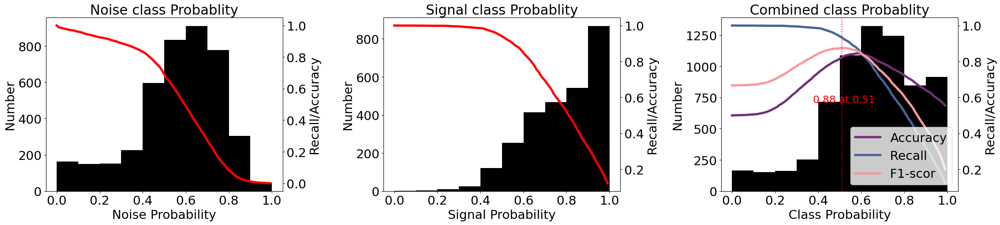

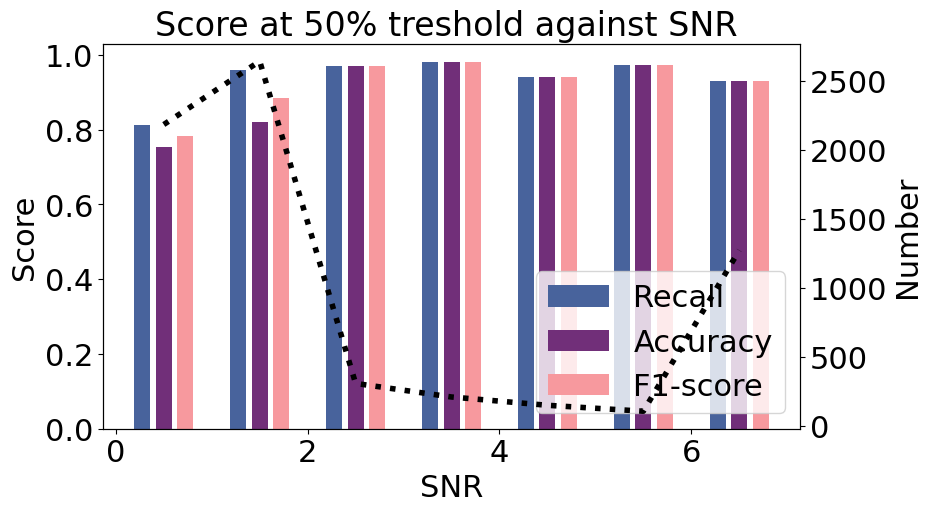

In [64]:
f1,f2, L = plotprobs(pred_list_Cred3,labels)
BestP3['Cred'] = L[0]
BestT3['Cred'] = L[1]
BestA3['Cred'] = L[3]
BestR3['Cred'] = L[2]
f1.savefig("Figure/CRED_Prob_MI.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/CRED_Snr_MI.svg", dpi=100, bbox_inches='tight')

## EQTransformer

In [65]:
# Load the pre-trained model
print(EQTransformer.list_pretrained())
model = EQTransformer.from_pretrained("original")
model.to('cpu:0')


['ethz', 'geofon', 'instance', 'iquique', 'lendb', 'neic', 'obs', 'original', 'original_nonconservative', 'scedc', 'stead', 'volpick']


EQTransformer(
  (encoder): Encoder(
    (convs): ModuleList(
      (0): Conv1d(3, 8, kernel_size=(11,), stride=(1,), padding=(5,))
      (1): Conv1d(8, 16, kernel_size=(9,), stride=(1,), padding=(4,))
      (2): Conv1d(16, 16, kernel_size=(7,), stride=(1,), padding=(3,))
      (3): Conv1d(16, 32, kernel_size=(7,), stride=(1,), padding=(3,))
      (4): Conv1d(32, 32, kernel_size=(5,), stride=(1,), padding=(2,))
      (5): Conv1d(32, 64, kernel_size=(5,), stride=(1,), padding=(2,))
      (6): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    )
    (pools): ModuleList(
      (0-6): 7 x MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (res_cnn_stack): ResCNNStack(
    (members): ModuleList(
      (0-3): 4 x ResCNNBlock(
        (dropout): SpatialDropout1d(
          (dropout): Dropout2d(p=0.1, inplace=False)
        )
        (norm1): BatchNorm1d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (conv1): Conv1d(

In [66]:

pred_list = []
tic()
for i in tqdm(range(len(datasetMI))):
    preds = model.annotate(datasetMI[i][0])
    pred_list.append(max(preds[0].data) )
toc()
chrono3['EQT']=tac()
pred_list_EQT3 = np.array(pred_list)

  0%|                                                                                                                                | 0/6869 [00:00<?, ?it/s]

  0%|                                                                                                                        | 2/6869 [00:00<09:07, 12.55it/s]

  0%|                                                                                                                        | 4/6869 [00:00<10:39, 10.73it/s]

  0%|                                                                                                                        | 6/6869 [00:00<10:20, 11.06it/s]

  0%|▏                                                                                                                       | 8/6869 [00:00<10:04, 11.35it/s]

  0%|▏                                                                                                                      | 10/6869 [00:00<10:53, 10.50it/s]

  0%|▏                                                                                                                      | 12/6869 [00:01<12:42,  9.00it/s]

  0%|▏                                                                                                                      | 14/6869 [00:01<11:29,  9.94it/s]

  0%|▎                                                                                                                      | 16/6869 [00:01<12:41,  9.00it/s]

  0%|▎                                                                                                                      | 17/6869 [00:01<13:46,  8.30it/s]

  0%|▎                                                                                                                      | 19/6869 [00:02<13:23,  8.53it/s]

  0%|▎                                                                                                                      | 20/6869 [00:02<13:10,  8.67it/s]

  0%|▍                                                                                                                      | 22/6869 [00:02<11:41,  9.76it/s]

  0%|▍                                                                                                                      | 24/6869 [00:02<13:38,  8.36it/s]

  0%|▍                                                                                                                      | 26/6869 [00:02<11:53,  9.59it/s]

  0%|▍                                                                                                                      | 28/6869 [00:02<12:41,  8.99it/s]

  0%|▌                                                                                                                      | 29/6869 [00:03<12:50,  8.88it/s]

  0%|▌                                                                                                                      | 31/6869 [00:03<11:15, 10.12it/s]

  0%|▌                                                                                                                      | 33/6869 [00:03<12:23,  9.19it/s]

  1%|▌                                                                                                                      | 35/6869 [00:03<11:42,  9.73it/s]

  1%|▋                                                                                                                      | 37/6869 [00:03<12:05,  9.42it/s]

  1%|▋                                                                                                                      | 39/6869 [00:04<11:09, 10.21it/s]

  1%|▋                                                                                                                      | 41/6869 [00:04<13:12,  8.62it/s]

  1%|▋                                                                                                                      | 42/6869 [00:04<13:34,  8.39it/s]

  1%|▊                                                                                                                      | 44/6869 [00:04<11:24,  9.97it/s]

  1%|▊                                                                                                                      | 46/6869 [00:04<13:48,  8.23it/s]

  1%|▊                                                                                                                      | 48/6869 [00:05<12:24,  9.16it/s]

  1%|▊                                                                                                                      | 50/6869 [00:05<11:48,  9.62it/s]

  1%|▉                                                                                                                      | 52/6869 [00:05<11:36,  9.79it/s]

  1%|▉                                                                                                                      | 54/6869 [00:05<11:57,  9.50it/s]

  1%|▉                                                                                                                      | 56/6869 [00:05<12:29,  9.09it/s]

  1%|█                                                                                                                      | 58/6869 [00:06<11:33,  9.82it/s]

  1%|█                                                                                                                      | 60/6869 [00:06<12:22,  9.17it/s]

  1%|█                                                                                                                      | 61/6869 [00:06<13:03,  8.69it/s]

  1%|█                                                                                                                      | 62/6869 [00:06<12:53,  8.80it/s]

  1%|█                                                                                                                      | 63/6869 [00:06<13:21,  8.50it/s]

  1%|█▏                                                                                                                     | 65/6869 [00:07<13:05,  8.66it/s]

  1%|█▏                                                                                                                     | 67/6869 [00:07<11:31,  9.84it/s]

  1%|█▏                                                                                                                     | 68/6869 [00:07<11:34,  9.80it/s]

  1%|█▏                                                                                                                     | 70/6869 [00:07<11:09, 10.15it/s]

  1%|█▏                                                                                                                     | 72/6869 [00:07<11:05, 10.22it/s]

  1%|█▎                                                                                                                     | 74/6869 [00:07<10:23, 10.90it/s]

  1%|█▎                                                                                                                     | 76/6869 [00:08<10:36, 10.68it/s]

  1%|█▎                                                                                                                     | 78/6869 [00:08<11:12, 10.10it/s]

  1%|█▍                                                                                                                     | 80/6869 [00:08<11:44,  9.64it/s]

  1%|█▍                                                                                                                     | 82/6869 [00:08<10:47, 10.47it/s]

  1%|█▍                                                                                                                     | 84/6869 [00:08<10:24, 10.86it/s]

  1%|█▍                                                                                                                     | 86/6869 [00:09<11:04, 10.21it/s]

  1%|█▌                                                                                                                     | 88/6869 [00:09<11:45,  9.61it/s]

  1%|█▌                                                                                                                     | 90/6869 [00:09<11:01, 10.25it/s]

  1%|█▌                                                                                                                     | 92/6869 [00:09<11:11, 10.10it/s]

  1%|█▋                                                                                                                     | 94/6869 [00:09<12:07,  9.31it/s]

  1%|█▋                                                                                                                     | 95/6869 [00:10<13:38,  8.28it/s]

  1%|█▋                                                                                                                     | 97/6869 [00:10<11:58,  9.43it/s]

  1%|█▋                                                                                                                     | 98/6869 [00:10<12:30,  9.02it/s]

  1%|█▋                                                                                                                    | 100/6869 [00:10<11:04, 10.19it/s]

  1%|█▊                                                                                                                    | 102/6869 [00:10<10:55, 10.33it/s]

  2%|█▊                                                                                                                    | 104/6869 [00:10<11:38,  9.68it/s]

  2%|█▊                                                                                                                    | 106/6869 [00:11<11:33,  9.75it/s]

  2%|█▊                                                                                                                    | 107/6869 [00:11<11:35,  9.72it/s]

  2%|█▊                                                                                                                    | 108/6869 [00:11<11:57,  9.43it/s]

  2%|█▊                                                                                                                    | 109/6869 [00:11<12:03,  9.34it/s]

  2%|█▉                                                                                                                    | 111/6869 [00:11<10:55, 10.30it/s]

  2%|█▉                                                                                                                    | 113/6869 [00:11<12:06,  9.30it/s]

  2%|█▉                                                                                                                    | 115/6869 [00:12<12:02,  9.34it/s]

  2%|██                                                                                                                    | 117/6869 [00:12<11:03, 10.17it/s]

  2%|██                                                                                                                    | 119/6869 [00:12<10:05, 11.15it/s]

  2%|██                                                                                                                    | 121/6869 [00:12<11:07, 10.12it/s]

  2%|██                                                                                                                    | 123/6869 [00:12<11:14, 10.00it/s]

  2%|██▏                                                                                                                   | 125/6869 [00:13<11:20,  9.91it/s]

  2%|██▏                                                                                                                   | 127/6869 [00:13<11:40,  9.62it/s]

  2%|██▏                                                                                                                   | 128/6869 [00:13<11:45,  9.55it/s]

  2%|██▏                                                                                                                   | 130/6869 [00:13<10:25, 10.77it/s]

  2%|██▎                                                                                                                   | 132/6869 [00:13<10:17, 10.90it/s]

  2%|██▎                                                                                                                   | 134/6869 [00:13<12:15,  9.16it/s]

  2%|██▎                                                                                                                   | 135/6869 [00:14<12:36,  8.90it/s]

  2%|██▎                                                                                                                   | 137/6869 [00:14<10:46, 10.41it/s]

  2%|██▍                                                                                                                   | 139/6869 [00:14<10:56, 10.25it/s]

  2%|██▍                                                                                                                   | 141/6869 [00:14<10:38, 10.54it/s]

  2%|██▍                                                                                                                   | 143/6869 [00:14<11:06, 10.10it/s]

  2%|██▍                                                                                                                   | 145/6869 [00:15<11:12, 10.00it/s]

  2%|██▌                                                                                                                   | 147/6869 [00:15<11:50,  9.47it/s]

  2%|██▌                                                                                                                   | 149/6869 [00:15<11:07, 10.07it/s]

  2%|██▌                                                                                                                   | 151/6869 [00:15<10:51, 10.31it/s]

  2%|██▋                                                                                                                   | 153/6869 [00:15<11:26,  9.78it/s]

  2%|██▋                                                                                                                   | 155/6869 [00:16<12:58,  8.63it/s]

  2%|██▋                                                                                                                   | 157/6869 [00:16<12:30,  8.94it/s]

  2%|██▋                                                                                                                   | 159/6869 [00:16<12:41,  8.81it/s]

  2%|██▊                                                                                                                   | 161/6869 [00:16<12:47,  8.75it/s]

  2%|██▊                                                                                                                   | 163/6869 [00:17<12:36,  8.86it/s]

  2%|██▊                                                                                                                   | 165/6869 [00:17<11:48,  9.47it/s]

  2%|██▊                                                                                                                   | 166/6869 [00:17<12:18,  9.08it/s]

  2%|██▉                                                                                                                   | 168/6869 [00:17<11:06, 10.05it/s]

  2%|██▉                                                                                                                   | 170/6869 [00:17<11:55,  9.37it/s]

  2%|██▉                                                                                                                   | 171/6869 [00:17<12:10,  9.17it/s]

  3%|██▉                                                                                                                   | 172/6869 [00:17<12:45,  8.75it/s]

  3%|██▉                                                                                                                   | 173/6869 [00:18<14:14,  7.84it/s]

  3%|███                                                                                                                   | 175/6869 [00:18<14:34,  7.65it/s]

  3%|███                                                                                                                   | 177/6869 [00:18<12:45,  8.74it/s]

  3%|███                                                                                                                   | 178/6869 [00:18<13:38,  8.17it/s]

  3%|███                                                                                                                   | 180/6869 [00:18<11:56,  9.33it/s]

  3%|███                                                                                                                   | 181/6869 [00:19<13:00,  8.57it/s]

  3%|███▏                                                                                                                  | 182/6869 [00:19<12:54,  8.63it/s]

  3%|███▏                                                                                                                  | 183/6869 [00:19<12:50,  8.68it/s]

  3%|███▏                                                                                                                  | 185/6869 [00:19<11:35,  9.61it/s]

  3%|███▏                                                                                                                  | 186/6869 [00:19<12:30,  8.90it/s]

  3%|███▏                                                                                                                  | 187/6869 [00:19<13:09,  8.46it/s]

  3%|███▏                                                                                                                  | 188/6869 [00:19<15:26,  7.21it/s]

  3%|███▎                                                                                                                  | 190/6869 [00:20<12:21,  9.01it/s]

  3%|███▎                                                                                                                  | 192/6869 [00:20<10:44, 10.36it/s]

  3%|███▎                                                                                                                  | 194/6869 [00:20<10:59, 10.12it/s]

  3%|███▎                                                                                                                  | 196/6869 [00:20<12:34,  8.84it/s]

  3%|███▍                                                                                                                  | 198/6869 [00:20<12:02,  9.23it/s]

  3%|███▍                                                                                                                  | 199/6869 [00:21<12:05,  9.19it/s]

  3%|███▍                                                                                                                  | 201/6869 [00:21<11:02, 10.06it/s]

  3%|███▍                                                                                                                  | 203/6869 [00:21<10:30, 10.57it/s]

  3%|███▌                                                                                                                  | 205/6869 [00:21<10:42, 10.37it/s]

  3%|███▌                                                                                                                  | 207/6869 [00:21<11:38,  9.53it/s]

  3%|███▌                                                                                                                  | 209/6869 [00:22<13:48,  8.04it/s]

  3%|███▌                                                                                                                  | 211/6869 [00:22<12:30,  8.87it/s]

  3%|███▋                                                                                                                  | 213/6869 [00:22<13:21,  8.30it/s]

  3%|███▋                                                                                                                  | 215/6869 [00:22<13:21,  8.31it/s]

  3%|███▋                                                                                                                  | 216/6869 [00:22<13:41,  8.10it/s]

  3%|███▋                                                                                                                  | 218/6869 [00:23<12:51,  8.63it/s]

  3%|███▊                                                                                                                  | 219/6869 [00:23<15:48,  7.01it/s]

  3%|███▊                                                                                                                  | 221/6869 [00:23<13:24,  8.26it/s]

  3%|███▊                                                                                                                  | 223/6869 [00:23<12:30,  8.85it/s]

  3%|███▊                                                                                                                  | 224/6869 [00:23<13:27,  8.23it/s]

  3%|███▊                                                                                                                  | 225/6869 [00:24<15:04,  7.35it/s]

  3%|███▉                                                                                                                  | 227/6869 [00:24<12:29,  8.86it/s]

  3%|███▉                                                                                                                  | 228/6869 [00:24<14:42,  7.52it/s]

  3%|███▉                                                                                                                  | 230/6869 [00:24<12:30,  8.85it/s]

  3%|███▉                                                                                                                  | 231/6869 [00:24<12:30,  8.84it/s]

  3%|████                                                                                                                  | 233/6869 [00:24<11:15,  9.82it/s]

  3%|████                                                                                                                  | 234/6869 [00:25<11:57,  9.24it/s]

  3%|████                                                                                                                  | 235/6869 [00:25<12:16,  9.01it/s]

  3%|████                                                                                                                  | 236/6869 [00:25<12:07,  9.12it/s]

  3%|████                                                                                                                  | 238/6869 [00:25<11:03, 10.00it/s]

  3%|████                                                                                                                  | 239/6869 [00:25<11:26,  9.66it/s]

  4%|████▏                                                                                                                 | 241/6869 [00:25<10:11, 10.83it/s]

  4%|████▏                                                                                                                 | 243/6869 [00:25<11:33,  9.56it/s]

  4%|████▏                                                                                                                 | 244/6869 [00:26<11:33,  9.55it/s]

  4%|████▏                                                                                                                 | 245/6869 [00:26<13:52,  7.96it/s]

  4%|████▏                                                                                                                 | 247/6869 [00:26<13:41,  8.06it/s]

  4%|████▎                                                                                                                 | 249/6869 [00:26<12:13,  9.03it/s]

  4%|████▎                                                                                                                 | 250/6869 [00:26<12:15,  8.99it/s]

  4%|████▎                                                                                                                 | 252/6869 [00:27<11:53,  9.27it/s]

  4%|████▎                                                                                                                 | 254/6869 [00:27<11:16,  9.78it/s]

  4%|████▍                                                                                                                 | 255/6869 [00:27<11:55,  9.24it/s]

  4%|████▍                                                                                                                 | 257/6869 [00:27<11:41,  9.42it/s]

  4%|████▍                                                                                                                 | 259/6869 [00:27<12:21,  8.92it/s]

  4%|████▍                                                                                                                 | 260/6869 [00:27<12:08,  9.07it/s]

  4%|████▍                                                                                                                 | 261/6869 [00:28<12:18,  8.95it/s]

  4%|████▌                                                                                                                 | 262/6869 [00:28<12:22,  8.89it/s]

  4%|████▌                                                                                                                 | 263/6869 [00:28<13:01,  8.45it/s]

  4%|████▌                                                                                                                 | 265/6869 [00:28<11:16,  9.77it/s]

  4%|████▌                                                                                                                 | 266/6869 [00:28<12:22,  8.90it/s]

  4%|████▌                                                                                                                 | 268/6869 [00:28<10:40, 10.30it/s]

  4%|████▋                                                                                                                 | 270/6869 [00:28<12:05,  9.09it/s]

  4%|████▋                                                                                                                 | 271/6869 [00:29<12:01,  9.14it/s]

  4%|████▋                                                                                                                 | 273/6869 [00:29<10:46, 10.21it/s]

  4%|████▋                                                                                                                 | 275/6869 [00:29<12:14,  8.98it/s]

  4%|████▋                                                                                                                 | 276/6869 [00:29<13:07,  8.37it/s]

  4%|████▊                                                                                                                 | 278/6869 [00:29<11:31,  9.53it/s]

  4%|████▊                                                                                                                 | 279/6869 [00:29<11:36,  9.46it/s]

  4%|████▊                                                                                                                 | 280/6869 [00:30<12:50,  8.55it/s]

  4%|████▊                                                                                                                 | 281/6869 [00:30<12:47,  8.58it/s]

  4%|████▊                                                                                                                 | 282/6869 [00:30<13:02,  8.41it/s]

  4%|████▊                                                                                                                 | 283/6869 [00:30<12:30,  8.77it/s]

  4%|████▉                                                                                                                 | 284/6869 [00:30<13:10,  8.33it/s]

  4%|████▉                                                                                                                 | 286/6869 [00:30<12:12,  8.98it/s]

  4%|████▉                                                                                                                 | 287/6869 [00:30<12:25,  8.83it/s]

  4%|████▉                                                                                                                 | 289/6869 [00:31<13:04,  8.39it/s]

  4%|████▉                                                                                                                 | 290/6869 [00:31<15:09,  7.23it/s]

  4%|████▉                                                                                                                 | 291/6869 [00:31<14:54,  7.35it/s]

  4%|█████                                                                                                                 | 293/6869 [00:31<13:30,  8.11it/s]

  4%|█████                                                                                                                 | 294/6869 [00:31<13:18,  8.23it/s]

  4%|█████                                                                                                                 | 296/6869 [00:31<10:53, 10.06it/s]

  4%|█████                                                                                                                 | 298/6869 [00:32<11:18,  9.68it/s]

  4%|█████▏                                                                                                                | 299/6869 [00:32<11:43,  9.34it/s]

  4%|█████▏                                                                                                                | 300/6869 [00:32<11:36,  9.43it/s]

  4%|█████▏                                                                                                                | 302/6869 [00:32<10:42, 10.22it/s]

  4%|█████▏                                                                                                                | 304/6869 [00:32<11:26,  9.57it/s]

  4%|█████▎                                                                                                                | 306/6869 [00:32<10:58,  9.96it/s]

  4%|█████▎                                                                                                                | 308/6869 [00:33<10:32, 10.38it/s]

  5%|█████▎                                                                                                                | 310/6869 [00:33<10:28, 10.44it/s]

  5%|█████▎                                                                                                                | 312/6869 [00:33<09:57, 10.98it/s]

  5%|█████▍                                                                                                                | 314/6869 [00:33<09:28, 11.52it/s]

  5%|█████▍                                                                                                                | 316/6869 [00:33<09:27, 11.54it/s]

  5%|█████▍                                                                                                                | 318/6869 [00:34<10:27, 10.45it/s]

  5%|█████▍                                                                                                                | 320/6869 [00:34<11:45,  9.28it/s]

  5%|█████▌                                                                                                                | 321/6869 [00:34<12:18,  8.87it/s]

  5%|█████▌                                                                                                                | 322/6869 [00:34<12:07,  9.00it/s]

  5%|█████▌                                                                                                                | 324/6869 [00:34<10:41, 10.21it/s]

  5%|█████▌                                                                                                                | 326/6869 [00:34<10:17, 10.60it/s]

  5%|█████▋                                                                                                                | 328/6869 [00:35<11:42,  9.31it/s]

  5%|█████▋                                                                                                                | 329/6869 [00:35<12:13,  8.91it/s]

  5%|█████▋                                                                                                                | 330/6869 [00:35<12:49,  8.50it/s]

  5%|█████▋                                                                                                                | 331/6869 [00:35<12:26,  8.76it/s]

  5%|█████▋                                                                                                                | 333/6869 [00:35<10:59,  9.92it/s]

  5%|█████▋                                                                                                                | 334/6869 [00:35<10:59,  9.90it/s]

  5%|█████▊                                                                                                                | 335/6869 [00:35<11:01,  9.88it/s]

  5%|█████▊                                                                                                                | 336/6869 [00:36<11:41,  9.31it/s]

  5%|█████▊                                                                                                                | 337/6869 [00:36<11:35,  9.39it/s]

  5%|█████▊                                                                                                                | 338/6869 [00:36<11:58,  9.09it/s]

  5%|█████▊                                                                                                                | 339/6869 [00:36<15:58,  6.81it/s]

  5%|█████▊                                                                                                                | 341/6869 [00:36<12:55,  8.42it/s]

  5%|█████▉                                                                                                                | 343/6869 [00:36<12:31,  8.68it/s]

  5%|█████▉                                                                                                                | 345/6869 [00:37<12:13,  8.89it/s]

  5%|█████▉                                                                                                                | 346/6869 [00:37<12:13,  8.90it/s]

  5%|█████▉                                                                                                                | 347/6869 [00:37<12:02,  9.03it/s]

  5%|█████▉                                                                                                                | 348/6869 [00:37<12:09,  8.94it/s]

  5%|██████                                                                                                                | 350/6869 [00:37<10:45, 10.10it/s]

  5%|██████                                                                                                                | 352/6869 [00:37<10:15, 10.58it/s]

  5%|██████                                                                                                                | 354/6869 [00:37<10:11, 10.66it/s]

  5%|██████                                                                                                                | 356/6869 [00:38<10:51, 10.00it/s]

  5%|██████▏                                                                                                               | 358/6869 [00:38<11:45,  9.22it/s]

  5%|██████▏                                                                                                               | 360/6869 [00:38<12:21,  8.78it/s]

  5%|██████▏                                                                                                               | 362/6869 [00:38<13:21,  8.11it/s]

  5%|██████▎                                                                                                               | 364/6869 [00:39<11:29,  9.43it/s]

  5%|██████▎                                                                                                               | 366/6869 [00:39<12:01,  9.02it/s]

  5%|██████▎                                                                                                               | 368/6869 [00:39<11:19,  9.56it/s]

  5%|██████▎                                                                                                               | 370/6869 [00:39<11:26,  9.46it/s]

  5%|██████▎                                                                                                               | 371/6869 [00:39<11:40,  9.28it/s]

  5%|██████▍                                                                                                               | 372/6869 [00:39<11:37,  9.31it/s]

  5%|██████▍                                                                                                               | 373/6869 [00:40<11:47,  9.18it/s]

  5%|██████▍                                                                                                               | 375/6869 [00:40<10:29, 10.31it/s]

  5%|██████▍                                                                                                               | 377/6869 [00:40<11:24,  9.49it/s]

  6%|██████▍                                                                                                               | 378/6869 [00:40<12:28,  8.67it/s]

  6%|██████▌                                                                                                               | 380/6869 [00:40<12:11,  8.87it/s]

  6%|██████▌                                                                                                               | 381/6869 [00:40<12:40,  8.53it/s]

  6%|██████▌                                                                                                               | 382/6869 [00:41<12:29,  8.65it/s]

  6%|██████▌                                                                                                               | 383/6869 [00:41<12:29,  8.66it/s]

  6%|██████▌                                                                                                               | 385/6869 [00:41<11:25,  9.46it/s]

  6%|██████▋                                                                                                               | 387/6869 [00:41<10:46, 10.03it/s]

  6%|██████▋                                                                                                               | 388/6869 [00:41<11:21,  9.51it/s]

  6%|██████▋                                                                                                               | 390/6869 [00:41<12:03,  8.96it/s]

  6%|██████▋                                                                                                               | 392/6869 [00:42<11:17,  9.56it/s]

  6%|██████▊                                                                                                               | 393/6869 [00:42<11:48,  9.14it/s]

  6%|██████▊                                                                                                               | 394/6869 [00:42<12:09,  8.87it/s]

  6%|██████▊                                                                                                               | 395/6869 [00:42<12:16,  8.79it/s]

  6%|██████▊                                                                                                               | 397/6869 [00:42<10:58,  9.83it/s]

  6%|██████▊                                                                                                               | 399/6869 [00:42<10:13, 10.54it/s]

  6%|██████▉                                                                                                               | 401/6869 [00:42<09:16, 11.63it/s]

  6%|██████▉                                                                                                               | 403/6869 [00:43<09:38, 11.18it/s]

  6%|██████▉                                                                                                               | 405/6869 [00:43<09:47, 11.00it/s]

  6%|██████▉                                                                                                               | 407/6869 [00:43<10:01, 10.73it/s]

  6%|███████                                                                                                               | 409/6869 [00:43<10:18, 10.44it/s]

  6%|███████                                                                                                               | 411/6869 [00:43<11:18,  9.52it/s]

  6%|███████                                                                                                               | 412/6869 [00:44<11:29,  9.37it/s]

  6%|███████                                                                                                               | 414/6869 [00:44<10:39, 10.09it/s]

  6%|███████▏                                                                                                              | 416/6869 [00:44<12:41,  8.48it/s]

  6%|███████▏                                                                                                              | 418/6869 [00:44<11:35,  9.28it/s]

  6%|███████▏                                                                                                              | 419/6869 [00:44<12:03,  8.92it/s]

  6%|███████▏                                                                                                              | 420/6869 [00:45<12:14,  8.78it/s]

  6%|███████▏                                                                                                              | 421/6869 [00:45<12:09,  8.84it/s]

  6%|███████▏                                                                                                              | 422/6869 [00:45<12:35,  8.53it/s]

  6%|███████▎                                                                                                              | 424/6869 [00:45<12:47,  8.40it/s]

  6%|███████▎                                                                                                              | 425/6869 [00:45<13:32,  7.94it/s]

  6%|███████▎                                                                                                              | 427/6869 [00:45<11:39,  9.21it/s]

  6%|███████▎                                                                                                              | 428/6869 [00:45<11:28,  9.35it/s]

  6%|███████▎                                                                                                              | 429/6869 [00:46<12:10,  8.82it/s]

  6%|███████▍                                                                                                              | 431/6869 [00:46<11:43,  9.15it/s]

  6%|███████▍                                                                                                              | 433/6869 [00:46<10:49,  9.91it/s]

  6%|███████▍                                                                                                              | 435/6869 [00:46<10:51,  9.88it/s]

  6%|███████▍                                                                                                              | 436/6869 [00:46<11:01,  9.73it/s]

  6%|███████▌                                                                                                              | 437/6869 [00:46<13:24,  7.99it/s]

  6%|███████▌                                                                                                              | 439/6869 [00:47<11:29,  9.32it/s]

  6%|███████▌                                                                                                              | 440/6869 [00:47<11:46,  9.10it/s]

  6%|███████▌                                                                                                              | 441/6869 [00:47<11:57,  8.96it/s]

  6%|███████▌                                                                                                              | 443/6869 [00:47<12:28,  8.58it/s]

  6%|███████▋                                                                                                              | 444/6869 [00:47<12:47,  8.37it/s]

  6%|███████▋                                                                                                              | 445/6869 [00:47<12:53,  8.30it/s]

  6%|███████▋                                                                                                              | 446/6869 [00:47<13:12,  8.11it/s]

  7%|███████▋                                                                                                              | 448/6869 [00:48<12:21,  8.66it/s]

  7%|███████▋                                                                                                              | 450/6869 [00:48<12:03,  8.87it/s]

  7%|███████▊                                                                                                              | 452/6869 [00:48<10:34, 10.11it/s]

  7%|███████▊                                                                                                              | 454/6869 [00:48<10:54,  9.81it/s]

  7%|███████▊                                                                                                              | 455/6869 [00:48<10:54,  9.80it/s]

  7%|███████▊                                                                                                              | 457/6869 [00:49<10:10, 10.50it/s]

  7%|███████▉                                                                                                              | 459/6869 [00:49<10:09, 10.52it/s]

  7%|███████▉                                                                                                              | 461/6869 [00:49<09:59, 10.69it/s]

  7%|███████▉                                                                                                              | 463/6869 [00:49<10:07, 10.55it/s]

  7%|███████▉                                                                                                              | 465/6869 [00:49<10:05, 10.58it/s]

  7%|████████                                                                                                              | 467/6869 [00:49<10:15, 10.41it/s]

  7%|████████                                                                                                              | 469/6869 [00:50<10:56,  9.74it/s]

  7%|████████                                                                                                              | 470/6869 [00:50<11:22,  9.37it/s]

  7%|████████                                                                                                              | 472/6869 [00:50<11:20,  9.39it/s]

  7%|████████▏                                                                                                             | 474/6869 [00:50<10:15, 10.40it/s]

  7%|████████▏                                                                                                             | 476/6869 [00:50<10:21, 10.28it/s]

  7%|████████▏                                                                                                             | 478/6869 [00:51<10:54,  9.77it/s]

  7%|████████▏                                                                                                             | 479/6869 [00:51<11:09,  9.54it/s]

  7%|████████▏                                                                                                             | 480/6869 [00:51<11:33,  9.21it/s]

  7%|████████▎                                                                                                             | 482/6869 [00:51<11:42,  9.09it/s]

  7%|████████▎                                                                                                             | 484/6869 [00:51<11:07,  9.56it/s]

  7%|████████▎                                                                                                             | 485/6869 [00:51<11:59,  8.87it/s]

  7%|████████▎                                                                                                             | 487/6869 [00:52<10:43,  9.92it/s]

  7%|████████▍                                                                                                             | 489/6869 [00:52<10:39,  9.98it/s]

  7%|████████▍                                                                                                             | 490/6869 [00:52<11:32,  9.20it/s]

  7%|████████▍                                                                                                             | 492/6869 [00:52<11:28,  9.27it/s]

  7%|████████▍                                                                                                             | 494/6869 [00:52<11:44,  9.05it/s]

  7%|████████▌                                                                                                             | 496/6869 [00:53<10:53,  9.75it/s]

  7%|████████▌                                                                                                             | 498/6869 [00:53<10:24, 10.20it/s]

  7%|████████▌                                                                                                             | 500/6869 [00:53<09:58, 10.65it/s]

  7%|████████▌                                                                                                             | 502/6869 [00:53<10:30, 10.09it/s]

  7%|████████▋                                                                                                             | 504/6869 [00:53<11:59,  8.85it/s]

  7%|████████▋                                                                                                             | 506/6869 [00:54<12:20,  8.59it/s]

  7%|████████▋                                                                                                             | 507/6869 [00:54<12:45,  8.31it/s]

  7%|████████▋                                                                                                             | 508/6869 [00:54<12:41,  8.35it/s]

  7%|████████▋                                                                                                             | 509/6869 [00:54<13:00,  8.15it/s]

  7%|████████▊                                                                                                             | 511/6869 [00:54<13:09,  8.06it/s]

  7%|████████▊                                                                                                             | 512/6869 [00:54<13:00,  8.15it/s]

  7%|████████▊                                                                                                             | 513/6869 [00:55<13:21,  7.93it/s]

  7%|████████▊                                                                                                             | 514/6869 [00:55<12:56,  8.18it/s]

  7%|████████▊                                                                                                             | 515/6869 [00:55<13:04,  8.10it/s]

  8%|████████▊                                                                                                             | 516/6869 [00:55<13:55,  7.60it/s]

  8%|████████▉                                                                                                             | 518/6869 [00:55<11:13,  9.43it/s]

  8%|████████▉                                                                                                             | 520/6869 [00:55<10:16, 10.30it/s]

  8%|████████▉                                                                                                             | 522/6869 [00:55<11:21,  9.31it/s]

  8%|████████▉                                                                                                             | 523/6869 [00:56<11:33,  9.16it/s]

  8%|█████████                                                                                                             | 525/6869 [00:56<10:13, 10.35it/s]

  8%|█████████                                                                                                             | 527/6869 [00:56<10:01, 10.54it/s]

  8%|█████████                                                                                                             | 529/6869 [00:56<10:38,  9.93it/s]

  8%|█████████                                                                                                             | 531/6869 [00:56<11:06,  9.51it/s]

  8%|█████████▏                                                                                                            | 533/6869 [00:57<11:06,  9.50it/s]

  8%|█████████▏                                                                                                            | 535/6869 [00:57<09:59, 10.57it/s]

  8%|█████████▏                                                                                                            | 537/6869 [00:57<09:40, 10.91it/s]

  8%|█████████▎                                                                                                            | 539/6869 [00:57<09:45, 10.81it/s]

  8%|█████████▎                                                                                                            | 541/6869 [00:57<09:51, 10.71it/s]

  8%|█████████▎                                                                                                            | 543/6869 [00:58<11:11,  9.43it/s]

  8%|█████████▎                                                                                                            | 545/6869 [00:58<11:05,  9.50it/s]

  8%|█████████▍                                                                                                            | 546/6869 [00:58<11:32,  9.14it/s]

  8%|█████████▍                                                                                                            | 548/6869 [00:58<11:17,  9.34it/s]

  8%|█████████▍                                                                                                            | 549/6869 [00:58<11:19,  9.30it/s]

  8%|█████████▍                                                                                                            | 550/6869 [00:58<11:13,  9.39it/s]

  8%|█████████▍                                                                                                            | 551/6869 [00:58<11:47,  8.92it/s]

  8%|█████████▍                                                                                                            | 552/6869 [00:59<11:36,  9.07it/s]

  8%|█████████▍                                                                                                            | 553/6869 [00:59<11:29,  9.15it/s]

  8%|█████████▌                                                                                                            | 554/6869 [00:59<12:22,  8.50it/s]

  8%|█████████▌                                                                                                            | 556/6869 [00:59<11:01,  9.54it/s]

  8%|█████████▌                                                                                                            | 558/6869 [00:59<10:08, 10.36it/s]

  8%|█████████▌                                                                                                            | 560/6869 [00:59<10:16, 10.23it/s]

  8%|█████████▋                                                                                                            | 562/6869 [01:00<10:39,  9.86it/s]

  8%|█████████▋                                                                                                            | 564/6869 [01:00<11:03,  9.50it/s]

  8%|█████████▋                                                                                                            | 565/6869 [01:00<11:21,  9.25it/s]

  8%|█████████▋                                                                                                            | 566/6869 [01:00<12:03,  8.71it/s]

  8%|█████████▋                                                                                                            | 567/6869 [01:00<12:56,  8.11it/s]

  8%|█████████▊                                                                                                            | 568/6869 [01:00<12:41,  8.27it/s]

  8%|█████████▊                                                                                                            | 570/6869 [01:00<10:11, 10.30it/s]

  8%|█████████▊                                                                                                            | 572/6869 [01:01<10:38,  9.87it/s]

  8%|█████████▊                                                                                                            | 574/6869 [01:01<10:59,  9.55it/s]

  8%|█████████▉                                                                                                            | 576/6869 [01:01<10:12, 10.27it/s]

  8%|█████████▉                                                                                                            | 578/6869 [01:01<10:26, 10.05it/s]

  8%|█████████▉                                                                                                            | 580/6869 [01:01<10:54,  9.61it/s]

  8%|█████████▉                                                                                                            | 581/6869 [01:02<12:52,  8.14it/s]

  8%|██████████                                                                                                            | 583/6869 [01:02<11:17,  9.27it/s]

  9%|██████████                                                                                                            | 585/6869 [01:02<10:26, 10.03it/s]

  9%|██████████                                                                                                            | 587/6869 [01:02<10:13, 10.24it/s]

  9%|██████████                                                                                                            | 589/6869 [01:02<11:27,  9.13it/s]

  9%|██████████▏                                                                                                           | 590/6869 [01:03<11:59,  8.73it/s]

  9%|██████████▏                                                                                                           | 592/6869 [01:03<11:28,  9.11it/s]

  9%|██████████▏                                                                                                           | 593/6869 [01:03<11:21,  9.21it/s]

  9%|██████████▏                                                                                                           | 594/6869 [01:03<11:22,  9.20it/s]

  9%|██████████▏                                                                                                           | 595/6869 [01:03<11:25,  9.15it/s]

  9%|██████████▎                                                                                                           | 597/6869 [01:03<10:06, 10.35it/s]

  9%|██████████▎                                                                                                           | 599/6869 [01:04<10:34,  9.88it/s]

  9%|██████████▎                                                                                                           | 601/6869 [01:04<09:47, 10.68it/s]

  9%|██████████▎                                                                                                           | 603/6869 [01:04<09:27, 11.03it/s]

  9%|██████████▍                                                                                                           | 605/6869 [01:04<10:16, 10.16it/s]

  9%|██████████▍                                                                                                           | 607/6869 [01:04<09:40, 10.79it/s]

  9%|██████████▍                                                                                                           | 609/6869 [01:04<09:29, 10.98it/s]

  9%|██████████▍                                                                                                           | 611/6869 [01:05<10:21, 10.06it/s]

  9%|██████████▌                                                                                                           | 613/6869 [01:05<12:14,  8.52it/s]

  9%|██████████▌                                                                                                           | 615/6869 [01:05<12:06,  8.61it/s]

  9%|██████████▌                                                                                                           | 617/6869 [01:05<10:43,  9.72it/s]

  9%|██████████▋                                                                                                           | 619/6869 [01:06<11:52,  8.77it/s]

  9%|██████████▋                                                                                                           | 621/6869 [01:06<11:02,  9.43it/s]

  9%|██████████▋                                                                                                           | 623/6869 [01:06<11:31,  9.04it/s]

  9%|██████████▋                                                                                                           | 624/6869 [01:06<11:32,  9.02it/s]

  9%|██████████▋                                                                                                           | 625/6869 [01:06<11:36,  8.97it/s]

  9%|██████████▊                                                                                                           | 627/6869 [01:06<12:05,  8.60it/s]

  9%|██████████▊                                                                                                           | 628/6869 [01:07<11:50,  8.78it/s]

  9%|██████████▊                                                                                                           | 630/6869 [01:07<12:27,  8.35it/s]

  9%|██████████▊                                                                                                           | 632/6869 [01:07<10:55,  9.51it/s]

  9%|██████████▉                                                                                                           | 634/6869 [01:07<10:08, 10.24it/s]

  9%|██████████▉                                                                                                           | 636/6869 [01:07<10:13, 10.17it/s]

  9%|██████████▉                                                                                                           | 638/6869 [01:08<10:29,  9.90it/s]

  9%|██████████▉                                                                                                           | 640/6869 [01:08<10:42,  9.70it/s]

  9%|███████████                                                                                                           | 641/6869 [01:08<10:58,  9.46it/s]

  9%|███████████                                                                                                           | 642/6869 [01:08<11:03,  9.39it/s]

  9%|███████████                                                                                                           | 644/6869 [01:08<10:44,  9.66it/s]

  9%|███████████                                                                                                           | 646/6869 [01:08<11:31,  9.00it/s]

  9%|███████████                                                                                                           | 647/6869 [01:09<11:54,  8.71it/s]

  9%|███████████▏                                                                                                          | 648/6869 [01:09<11:48,  8.78it/s]

  9%|███████████▏                                                                                                          | 649/6869 [01:09<13:15,  7.82it/s]

  9%|███████████▏                                                                                                          | 650/6869 [01:09<13:04,  7.93it/s]

  9%|███████████▏                                                                                                          | 651/6869 [01:09<12:32,  8.26it/s]

  9%|███████████▏                                                                                                          | 652/6869 [01:09<12:48,  8.09it/s]

 10%|███████████▏                                                                                                          | 654/6869 [01:09<10:43,  9.66it/s]

 10%|███████████▎                                                                                                          | 655/6869 [01:10<11:18,  9.16it/s]

 10%|███████████▎                                                                                                          | 657/6869 [01:10<11:40,  8.86it/s]

 10%|███████████▎                                                                                                          | 658/6869 [01:10<11:25,  9.07it/s]

 10%|███████████▎                                                                                                          | 659/6869 [01:10<11:31,  8.98it/s]

 10%|███████████▎                                                                                                          | 660/6869 [01:10<11:46,  8.79it/s]

 10%|███████████▎                                                                                                          | 661/6869 [01:10<11:56,  8.66it/s]

 10%|███████████▎                                                                                                          | 662/6869 [01:10<12:02,  8.59it/s]

 10%|███████████▍                                                                                                          | 663/6869 [01:10<11:35,  8.92it/s]

 10%|███████████▍                                                                                                          | 665/6869 [01:11<11:58,  8.63it/s]

 10%|███████████▍                                                                                                          | 667/6869 [01:11<12:07,  8.53it/s]

 10%|███████████▍                                                                                                          | 669/6869 [01:11<10:21,  9.98it/s]

 10%|███████████▌                                                                                                          | 671/6869 [01:11<11:29,  8.99it/s]

 10%|███████████▌                                                                                                          | 672/6869 [01:11<12:01,  8.59it/s]

 10%|███████████▌                                                                                                          | 673/6869 [01:12<11:46,  8.77it/s]

 10%|███████████▌                                                                                                          | 675/6869 [01:12<10:24,  9.92it/s]

 10%|███████████▋                                                                                                          | 677/6869 [01:12<09:30, 10.86it/s]

 10%|███████████▋                                                                                                          | 679/6869 [01:12<09:53, 10.43it/s]

 10%|███████████▋                                                                                                          | 681/6869 [01:12<10:39,  9.68it/s]

 10%|███████████▋                                                                                                          | 683/6869 [01:12<09:45, 10.56it/s]

 10%|███████████▊                                                                                                          | 685/6869 [01:13<09:46, 10.54it/s]

 10%|███████████▊                                                                                                          | 687/6869 [01:13<10:30,  9.80it/s]

 10%|███████████▊                                                                                                          | 689/6869 [01:13<11:16,  9.13it/s]

 10%|███████████▊                                                                                                          | 690/6869 [01:13<11:19,  9.10it/s]

 10%|███████████▉                                                                                                          | 692/6869 [01:14<12:24,  8.30it/s]

 10%|███████████▉                                                                                                          | 694/6869 [01:14<12:13,  8.42it/s]

 10%|███████████▉                                                                                                          | 696/6869 [01:14<11:18,  9.10it/s]

 10%|███████████▉                                                                                                          | 697/6869 [01:14<11:24,  9.01it/s]

 10%|███████████▉                                                                                                          | 698/6869 [01:14<12:10,  8.45it/s]

 10%|████████████                                                                                                          | 699/6869 [01:14<13:02,  7.89it/s]

 10%|████████████                                                                                                          | 701/6869 [01:15<10:55,  9.42it/s]

 10%|████████████                                                                                                          | 703/6869 [01:15<09:29, 10.84it/s]

 10%|████████████                                                                                                          | 705/6869 [01:15<09:51, 10.42it/s]

 10%|████████████▏                                                                                                         | 707/6869 [01:15<10:21,  9.91it/s]

 10%|████████████▏                                                                                                         | 709/6869 [01:15<11:02,  9.30it/s]

 10%|████████████▏                                                                                                         | 710/6869 [01:15<11:12,  9.16it/s]

 10%|████████████▏                                                                                                         | 711/6869 [01:16<11:29,  8.93it/s]

 10%|████████████▏                                                                                                         | 712/6869 [01:16<11:27,  8.96it/s]

 10%|████████████▏                                                                                                         | 713/6869 [01:16<11:49,  8.67it/s]

 10%|████████████▎                                                                                                         | 714/6869 [01:16<11:32,  8.89it/s]

 10%|████████████▎                                                                                                         | 716/6869 [01:16<10:16,  9.97it/s]

 10%|████████████▎                                                                                                         | 718/6869 [01:16<09:21, 10.95it/s]

 10%|████████████▎                                                                                                         | 720/6869 [01:16<09:40, 10.60it/s]

 11%|████████████▍                                                                                                         | 722/6869 [01:17<10:04, 10.17it/s]

 11%|████████████▍                                                                                                         | 724/6869 [01:17<10:11, 10.05it/s]

 11%|████████████▍                                                                                                         | 726/6869 [01:17<10:37,  9.64it/s]

 11%|████████████▍                                                                                                         | 727/6869 [01:17<10:55,  9.37it/s]

 11%|████████████▌                                                                                                         | 729/6869 [01:17<10:17,  9.95it/s]

 11%|████████████▌                                                                                                         | 730/6869 [01:18<10:50,  9.43it/s]

 11%|████████████▌                                                                                                         | 732/6869 [01:18<09:56, 10.29it/s]

 11%|████████████▌                                                                                                         | 734/6869 [01:18<10:35,  9.66it/s]

 11%|████████████▋                                                                                                         | 736/6869 [01:18<10:44,  9.52it/s]

 11%|████████████▋                                                                                                         | 738/6869 [01:18<10:22,  9.85it/s]

 11%|████████████▋                                                                                                         | 739/6869 [01:18<10:28,  9.75it/s]

 11%|████████████▋                                                                                                         | 740/6869 [01:19<12:00,  8.51it/s]

 11%|████████████▋                                                                                                         | 742/6869 [01:19<10:52,  9.39it/s]

 11%|████████████▊                                                                                                         | 743/6869 [01:19<10:45,  9.49it/s]

 11%|████████████▊                                                                                                         | 744/6869 [01:19<11:10,  9.13it/s]

 11%|████████████▊                                                                                                         | 746/6869 [01:19<11:11,  9.12it/s]

 11%|████████████▊                                                                                                         | 748/6869 [01:19<10:06, 10.08it/s]

 11%|████████████▉                                                                                                         | 750/6869 [01:20<09:23, 10.85it/s]

 11%|████████████▉                                                                                                         | 752/6869 [01:20<10:16,  9.93it/s]

 11%|████████████▉                                                                                                         | 754/6869 [01:20<11:32,  8.83it/s]

 11%|████████████▉                                                                                                         | 756/6869 [01:20<11:58,  8.51it/s]

 11%|█████████████                                                                                                         | 758/6869 [01:21<11:21,  8.97it/s]

 11%|█████████████                                                                                                         | 760/6869 [01:21<10:26,  9.74it/s]

 11%|█████████████                                                                                                         | 762/6869 [01:21<11:27,  8.89it/s]

 11%|█████████████                                                                                                         | 764/6869 [01:21<11:14,  9.05it/s]

 11%|█████████████▏                                                                                                        | 765/6869 [01:21<11:18,  9.00it/s]

 11%|█████████████▏                                                                                                        | 766/6869 [01:21<11:12,  9.08it/s]

 11%|█████████████▏                                                                                                        | 767/6869 [01:21<11:38,  8.73it/s]

 11%|█████████████▏                                                                                                        | 768/6869 [01:22<12:04,  8.42it/s]

 11%|█████████████▏                                                                                                        | 769/6869 [01:22<13:21,  7.61it/s]

 11%|█████████████▏                                                                                                        | 771/6869 [01:22<11:19,  8.97it/s]

 11%|█████████████▎                                                                                                        | 772/6869 [01:22<11:52,  8.55it/s]

 11%|█████████████▎                                                                                                        | 774/6869 [01:22<10:47,  9.42it/s]

 11%|█████████████▎                                                                                                        | 775/6869 [01:22<11:39,  8.71it/s]

 11%|█████████████▎                                                                                                        | 776/6869 [01:23<11:35,  8.75it/s]

 11%|█████████████▎                                                                                                        | 777/6869 [01:23<12:07,  8.37it/s]

 11%|█████████████▎                                                                                                        | 778/6869 [01:23<12:18,  8.24it/s]

 11%|█████████████▍                                                                                                        | 779/6869 [01:23<12:24,  8.19it/s]

 11%|█████████████▍                                                                                                        | 780/6869 [01:23<11:50,  8.57it/s]

 11%|█████████████▍                                                                                                        | 781/6869 [01:23<11:42,  8.66it/s]

 11%|█████████████▍                                                                                                        | 782/6869 [01:23<11:51,  8.56it/s]

 11%|█████████████▍                                                                                                        | 783/6869 [01:23<11:34,  8.77it/s]

 11%|█████████████▍                                                                                                        | 784/6869 [01:24<12:32,  8.09it/s]

 11%|█████████████▌                                                                                                        | 786/6869 [01:24<11:41,  8.68it/s]

 11%|█████████████▌                                                                                                        | 788/6869 [01:24<10:20,  9.80it/s]

 11%|█████████████▌                                                                                                        | 789/6869 [01:24<10:31,  9.63it/s]

 12%|█████████████▌                                                                                                        | 790/6869 [01:24<10:50,  9.35it/s]

 12%|█████████████▌                                                                                                        | 791/6869 [01:24<11:25,  8.87it/s]

 12%|█████████████▌                                                                                                        | 793/6869 [01:24<10:00, 10.12it/s]

 12%|█████████████▋                                                                                                        | 794/6869 [01:25<11:00,  9.20it/s]

 12%|█████████████▋                                                                                                        | 795/6869 [01:25<10:56,  9.25it/s]

 12%|█████████████▋                                                                                                        | 796/6869 [01:25<11:36,  8.72it/s]

 12%|█████████████▋                                                                                                        | 797/6869 [01:25<11:22,  8.90it/s]

 12%|█████████████▋                                                                                                        | 798/6869 [01:25<11:43,  8.63it/s]

 12%|█████████████▋                                                                                                        | 800/6869 [01:25<10:17,  9.82it/s]

 12%|█████████████▊                                                                                                        | 802/6869 [01:25<10:56,  9.24it/s]

 12%|█████████████▊                                                                                                        | 804/6869 [01:26<11:09,  9.06it/s]

 12%|█████████████▊                                                                                                        | 806/6869 [01:26<11:01,  9.17it/s]

 12%|█████████████▊                                                                                                        | 807/6869 [01:26<11:14,  8.98it/s]

 12%|█████████████▉                                                                                                        | 809/6869 [01:26<09:55, 10.18it/s]

 12%|█████████████▉                                                                                                        | 811/6869 [01:26<10:32,  9.58it/s]

 12%|█████████████▉                                                                                                        | 812/6869 [01:26<10:32,  9.57it/s]

 12%|█████████████▉                                                                                                        | 814/6869 [01:27<10:23,  9.71it/s]

 12%|██████████████                                                                                                        | 815/6869 [01:27<10:52,  9.27it/s]

 12%|██████████████                                                                                                        | 816/6869 [01:27<12:03,  8.37it/s]

 12%|██████████████                                                                                                        | 818/6869 [01:27<10:26,  9.66it/s]

 12%|██████████████                                                                                                        | 819/6869 [01:27<10:45,  9.37it/s]

 12%|██████████████                                                                                                        | 820/6869 [01:27<11:10,  9.02it/s]

 12%|██████████████                                                                                                        | 822/6869 [01:28<11:11,  9.00it/s]

 12%|██████████████▏                                                                                                       | 824/6869 [01:28<10:18,  9.77it/s]

 12%|██████████████▏                                                                                                       | 825/6869 [01:28<10:37,  9.48it/s]

 12%|██████████████▏                                                                                                       | 827/6869 [01:28<09:38, 10.45it/s]

 12%|██████████████▏                                                                                                       | 829/6869 [01:28<09:11, 10.95it/s]

 12%|██████████████▎                                                                                                       | 831/6869 [01:28<09:08, 11.01it/s]

 12%|██████████████▎                                                                                                       | 833/6869 [01:29<10:03, 10.00it/s]

 12%|██████████████▎                                                                                                       | 835/6869 [01:29<11:15,  8.93it/s]

 12%|██████████████▍                                                                                                       | 837/6869 [01:29<11:12,  8.97it/s]

 12%|██████████████▍                                                                                                       | 838/6869 [01:29<11:23,  8.82it/s]

 12%|██████████████▍                                                                                                       | 839/6869 [01:29<11:28,  8.76it/s]

 12%|██████████████▍                                                                                                       | 840/6869 [01:30<12:45,  7.88it/s]

 12%|██████████████▍                                                                                                       | 841/6869 [01:30<12:44,  7.89it/s]

 12%|██████████████▍                                                                                                       | 842/6869 [01:30<13:58,  7.19it/s]

 12%|██████████████▍                                                                                                       | 843/6869 [01:30<12:56,  7.76it/s]

 12%|██████████████▌                                                                                                       | 845/6869 [01:30<10:59,  9.14it/s]

 12%|██████████████▌                                                                                                       | 847/6869 [01:30<09:56, 10.10it/s]

 12%|██████████████▌                                                                                                       | 849/6869 [01:30<10:24,  9.63it/s]

 12%|██████████████▌                                                                                                       | 851/6869 [01:31<10:26,  9.60it/s]

 12%|██████████████▋                                                                                                       | 853/6869 [01:31<09:54, 10.12it/s]

 12%|██████████████▋                                                                                                       | 855/6869 [01:31<10:16,  9.75it/s]

 12%|██████████████▋                                                                                                       | 857/6869 [01:31<09:50, 10.17it/s]

 13%|██████████████▊                                                                                                       | 859/6869 [01:31<09:28, 10.56it/s]

 13%|██████████████▊                                                                                                       | 861/6869 [01:32<10:15,  9.76it/s]

 13%|██████████████▊                                                                                                       | 863/6869 [01:32<10:31,  9.51it/s]

 13%|██████████████▊                                                                                                       | 864/6869 [01:32<11:00,  9.09it/s]

 13%|██████████████▉                                                                                                       | 866/6869 [01:32<10:56,  9.14it/s]

 13%|██████████████▉                                                                                                       | 868/6869 [01:32<10:02,  9.96it/s]

 13%|██████████████▉                                                                                                       | 870/6869 [01:33<11:11,  8.94it/s]

 13%|██████████████▉                                                                                                       | 871/6869 [01:33<11:12,  8.92it/s]

 13%|██████████████▉                                                                                                       | 873/6869 [01:33<10:34,  9.46it/s]

 13%|███████████████                                                                                                       | 875/6869 [01:33<10:24,  9.60it/s]

 13%|███████████████                                                                                                       | 877/6869 [01:33<09:27, 10.55it/s]

 13%|███████████████                                                                                                       | 879/6869 [01:34<10:06,  9.87it/s]

 13%|███████████████▏                                                                                                      | 881/6869 [01:34<10:28,  9.53it/s]

 13%|███████████████▏                                                                                                      | 882/6869 [01:34<10:50,  9.21it/s]

 13%|███████████████▏                                                                                                      | 883/6869 [01:34<11:02,  9.04it/s]

 13%|███████████████▏                                                                                                      | 884/6869 [01:34<11:40,  8.55it/s]

 13%|███████████████▏                                                                                                      | 886/6869 [01:34<11:29,  8.68it/s]

 13%|███████████████▏                                                                                                      | 887/6869 [01:35<11:10,  8.92it/s]

 13%|███████████████▎                                                                                                      | 889/6869 [01:35<10:57,  9.09it/s]

 13%|███████████████▎                                                                                                      | 890/6869 [01:35<11:19,  8.80it/s]

 13%|███████████████▎                                                                                                      | 892/6869 [01:35<10:19,  9.65it/s]

 13%|███████████████▎                                                                                                      | 893/6869 [01:35<11:08,  8.93it/s]

 13%|███████████████▎                                                                                                      | 894/6869 [01:35<11:01,  9.04it/s]

 13%|███████████████▍                                                                                                      | 896/6869 [01:35<10:51,  9.16it/s]

 13%|███████████████▍                                                                                                      | 897/6869 [01:36<10:44,  9.27it/s]

 13%|███████████████▍                                                                                                      | 899/6869 [01:36<09:38, 10.33it/s]

 13%|███████████████▍                                                                                                      | 901/6869 [01:36<09:41, 10.26it/s]

 13%|███████████████▌                                                                                                      | 903/6869 [01:36<09:16, 10.73it/s]

 13%|███████████████▌                                                                                                      | 905/6869 [01:36<08:55, 11.14it/s]

 13%|███████████████▌                                                                                                      | 907/6869 [01:37<10:19,  9.62it/s]

 13%|███████████████▌                                                                                                      | 909/6869 [01:37<09:27, 10.50it/s]

 13%|███████████████▋                                                                                                      | 911/6869 [01:37<09:42, 10.22it/s]

 13%|███████████████▋                                                                                                      | 913/6869 [01:37<10:02,  9.89it/s]

 13%|███████████████▋                                                                                                      | 915/6869 [01:37<09:28, 10.47it/s]

 13%|███████████████▊                                                                                                      | 917/6869 [01:38<10:05,  9.83it/s]

 13%|███████████████▊                                                                                                      | 919/6869 [01:38<09:23, 10.56it/s]

 13%|███████████████▊                                                                                                      | 921/6869 [01:38<10:02,  9.88it/s]

 13%|███████████████▊                                                                                                      | 923/6869 [01:38<09:40, 10.24it/s]

 13%|███████████████▉                                                                                                      | 925/6869 [01:38<09:29, 10.43it/s]

 13%|███████████████▉                                                                                                      | 927/6869 [01:39<11:02,  8.96it/s]

 14%|███████████████▉                                                                                                      | 928/6869 [01:39<11:05,  8.92it/s]

 14%|███████████████▉                                                                                                      | 930/6869 [01:39<09:59,  9.91it/s]

 14%|████████████████                                                                                                      | 932/6869 [01:39<10:34,  9.36it/s]

 14%|████████████████                                                                                                      | 933/6869 [01:39<11:05,  8.92it/s]

 14%|████████████████                                                                                                      | 934/6869 [01:39<10:54,  9.07it/s]

 14%|████████████████                                                                                                      | 935/6869 [01:39<12:08,  8.14it/s]

 14%|████████████████                                                                                                      | 937/6869 [01:40<11:55,  8.29it/s]

 14%|████████████████▏                                                                                                     | 939/6869 [01:40<10:32,  9.37it/s]

 14%|████████████████▏                                                                                                     | 941/6869 [01:40<09:48, 10.07it/s]

 14%|████████████████▏                                                                                                     | 943/6869 [01:40<10:18,  9.58it/s]

 14%|████████████████▏                                                                                                     | 944/6869 [01:40<12:14,  8.07it/s]

 14%|████████████████▎                                                                                                     | 946/6869 [01:41<11:08,  8.87it/s]

 14%|████████████████▎                                                                                                     | 948/6869 [01:41<10:19,  9.56it/s]

 14%|████████████████▎                                                                                                     | 950/6869 [01:41<10:18,  9.57it/s]

 14%|████████████████▎                                                                                                     | 951/6869 [01:41<10:23,  9.49it/s]

 14%|████████████████▎                                                                                                     | 952/6869 [01:41<10:23,  9.49it/s]

 14%|████████████████▍                                                                                                     | 954/6869 [01:41<09:50, 10.02it/s]

 14%|████████████████▍                                                                                                     | 955/6869 [01:42<10:15,  9.61it/s]

 14%|████████████████▍                                                                                                     | 956/6869 [01:42<11:23,  8.65it/s]

 14%|████████████████▍                                                                                                     | 958/6869 [01:42<11:02,  8.92it/s]

 14%|████████████████▍                                                                                                     | 959/6869 [01:42<11:31,  8.55it/s]

 14%|████████████████▍                                                                                                     | 960/6869 [01:42<11:26,  8.61it/s]

 14%|████████████████▌                                                                                                     | 962/6869 [01:42<11:19,  8.69it/s]

 14%|████████████████▌                                                                                                     | 964/6869 [01:43<11:00,  8.94it/s]

 14%|████████████████▌                                                                                                     | 965/6869 [01:43<11:07,  8.84it/s]

 14%|████████████████▌                                                                                                     | 967/6869 [01:43<10:07,  9.72it/s]

 14%|████████████████▋                                                                                                     | 969/6869 [01:43<09:36, 10.24it/s]

 14%|████████████████▋                                                                                                     | 971/6869 [01:43<09:13, 10.66it/s]

 14%|████████████████▋                                                                                                     | 973/6869 [01:43<09:18, 10.55it/s]

 14%|████████████████▋                                                                                                     | 975/6869 [01:44<09:05, 10.81it/s]

 14%|████████████████▊                                                                                                     | 977/6869 [01:44<09:17, 10.57it/s]

 14%|████████████████▊                                                                                                     | 979/6869 [01:44<09:01, 10.88it/s]

 14%|████████████████▊                                                                                                     | 981/6869 [01:44<09:43, 10.10it/s]

 14%|████████████████▉                                                                                                     | 983/6869 [01:44<10:32,  9.30it/s]

 14%|████████████████▉                                                                                                     | 984/6869 [01:45<10:31,  9.32it/s]

 14%|████████████████▉                                                                                                     | 986/6869 [01:45<10:34,  9.28it/s]

 14%|████████████████▉                                                                                                     | 987/6869 [01:45<10:33,  9.29it/s]

 14%|████████████████▉                                                                                                     | 988/6869 [01:45<10:48,  9.07it/s]

 14%|████████████████▉                                                                                                     | 989/6869 [01:45<10:34,  9.27it/s]

 14%|█████████████████                                                                                                     | 990/6869 [01:45<11:25,  8.58it/s]

 14%|█████████████████                                                                                                     | 992/6869 [01:45<10:55,  8.96it/s]

 14%|█████████████████                                                                                                     | 994/6869 [01:46<10:45,  9.10it/s]

 14%|█████████████████                                                                                                     | 996/6869 [01:46<09:37, 10.16it/s]

 15%|█████████████████▏                                                                                                    | 998/6869 [01:46<10:10,  9.61it/s]

 15%|█████████████████                                                                                                    | 1000/6869 [01:46<10:41,  9.15it/s]

 15%|█████████████████                                                                                                    | 1001/6869 [01:46<10:47,  9.06it/s]

 15%|█████████████████                                                                                                    | 1002/6869 [01:47<11:31,  8.48it/s]

 15%|█████████████████                                                                                                    | 1004/6869 [01:47<11:18,  8.65it/s]

 15%|█████████████████▏                                                                                                   | 1006/6869 [01:47<10:22,  9.41it/s]

 15%|█████████████████▏                                                                                                   | 1007/6869 [01:47<10:48,  9.04it/s]

 15%|█████████████████▏                                                                                                   | 1008/6869 [01:47<11:06,  8.80it/s]

 15%|█████████████████▏                                                                                                   | 1009/6869 [01:47<11:57,  8.16it/s]

 15%|█████████████████▏                                                                                                   | 1011/6869 [01:48<10:21,  9.42it/s]

 15%|█████████████████▏                                                                                                   | 1012/6869 [01:48<10:13,  9.54it/s]

 15%|█████████████████▎                                                                                                   | 1013/6869 [01:48<10:35,  9.22it/s]

 15%|█████████████████▎                                                                                                   | 1014/6869 [01:48<10:35,  9.21it/s]

 15%|█████████████████▎                                                                                                   | 1015/6869 [01:48<11:30,  8.47it/s]

 15%|█████████████████▎                                                                                                   | 1016/6869 [01:48<11:38,  8.38it/s]

 15%|█████████████████▎                                                                                                   | 1018/6869 [01:48<10:13,  9.54it/s]

 15%|█████████████████▎                                                                                                   | 1020/6869 [01:48<09:09, 10.65it/s]

 15%|█████████████████▍                                                                                                   | 1022/6869 [01:49<08:59, 10.84it/s]

 15%|█████████████████▍                                                                                                   | 1024/6869 [01:49<09:16, 10.50it/s]

 15%|█████████████████▍                                                                                                   | 1026/6869 [01:49<10:56,  8.90it/s]

 15%|█████████████████▍                                                                                                   | 1027/6869 [01:49<11:07,  8.76it/s]

 15%|█████████████████▌                                                                                                   | 1028/6869 [01:49<10:51,  8.97it/s]

 15%|█████████████████▌                                                                                                   | 1029/6869 [01:49<10:50,  8.98it/s]

 15%|█████████████████▌                                                                                                   | 1030/6869 [01:50<10:39,  9.13it/s]

 15%|█████████████████▌                                                                                                   | 1031/6869 [01:50<11:19,  8.59it/s]

 15%|█████████████████▌                                                                                                   | 1033/6869 [01:50<11:11,  8.69it/s]

 15%|█████████████████▋                                                                                                   | 1035/6869 [01:50<10:56,  8.89it/s]

 15%|█████████████████▋                                                                                                   | 1036/6869 [01:50<11:13,  8.67it/s]

 15%|█████████████████▋                                                                                                   | 1038/6869 [01:50<09:56,  9.77it/s]

 15%|█████████████████▋                                                                                                   | 1039/6869 [01:51<10:26,  9.31it/s]

 15%|█████████████████▋                                                                                                   | 1041/6869 [01:51<10:23,  9.34it/s]

 15%|█████████████████▋                                                                                                   | 1042/6869 [01:51<10:42,  9.07it/s]

 15%|█████████████████▊                                                                                                   | 1043/6869 [01:51<10:54,  8.90it/s]

 15%|█████████████████▊                                                                                                   | 1044/6869 [01:51<11:52,  8.18it/s]

 15%|█████████████████▊                                                                                                   | 1045/6869 [01:51<11:59,  8.09it/s]

 15%|█████████████████▊                                                                                                   | 1046/6869 [01:51<11:56,  8.12it/s]

 15%|█████████████████▊                                                                                                   | 1047/6869 [01:52<13:07,  7.40it/s]

 15%|█████████████████▊                                                                                                   | 1049/6869 [01:52<11:48,  8.22it/s]

 15%|█████████████████▉                                                                                                   | 1050/6869 [01:52<11:28,  8.45it/s]

 15%|█████████████████▉                                                                                                   | 1051/6869 [01:52<11:33,  8.38it/s]

 15%|█████████████████▉                                                                                                   | 1053/6869 [01:52<11:03,  8.76it/s]

 15%|█████████████████▉                                                                                                   | 1055/6869 [01:52<10:46,  8.99it/s]

 15%|██████████████████                                                                                                   | 1057/6869 [01:53<10:43,  9.03it/s]

 15%|██████████████████                                                                                                   | 1059/6869 [01:53<09:38, 10.04it/s]

 15%|██████████████████                                                                                                   | 1061/6869 [01:53<09:04, 10.68it/s]

 15%|██████████████████                                                                                                   | 1063/6869 [01:53<09:31, 10.16it/s]

 16%|██████████████████▏                                                                                                  | 1065/6869 [01:53<08:45, 11.04it/s]

 16%|██████████████████▏                                                                                                  | 1067/6869 [01:54<08:59, 10.76it/s]

 16%|██████████████████▏                                                                                                  | 1069/6869 [01:54<08:44, 11.05it/s]

 16%|██████████████████▏                                                                                                  | 1071/6869 [01:54<09:24, 10.28it/s]

 16%|██████████████████▎                                                                                                  | 1073/6869 [01:54<09:58,  9.68it/s]

 16%|██████████████████▎                                                                                                  | 1075/6869 [01:54<09:22, 10.30it/s]

 16%|██████████████████▎                                                                                                  | 1077/6869 [01:55<09:52,  9.78it/s]

 16%|██████████████████▍                                                                                                  | 1079/6869 [01:55<10:12,  9.45it/s]

 16%|██████████████████▍                                                                                                  | 1080/6869 [01:55<10:49,  8.92it/s]

 16%|██████████████████▍                                                                                                  | 1081/6869 [01:55<10:54,  8.85it/s]

 16%|██████████████████▍                                                                                                  | 1082/6869 [01:55<12:39,  7.62it/s]

 16%|██████████████████▍                                                                                                  | 1084/6869 [01:56<11:59,  8.04it/s]

 16%|██████████████████▍                                                                                                  | 1086/6869 [01:56<10:27,  9.22it/s]

 16%|██████████████████▌                                                                                                  | 1087/6869 [01:56<11:45,  8.20it/s]

 16%|██████████████████▌                                                                                                  | 1089/6869 [01:56<11:36,  8.29it/s]

 16%|██████████████████▌                                                                                                  | 1090/6869 [01:56<12:28,  7.72it/s]

 16%|██████████████████▌                                                                                                  | 1092/6869 [01:56<10:51,  8.87it/s]

 16%|██████████████████▌                                                                                                  | 1093/6869 [01:57<11:05,  8.69it/s]

 16%|██████████████████▋                                                                                                  | 1095/6869 [01:57<10:00,  9.62it/s]

 16%|██████████████████▋                                                                                                  | 1096/6869 [01:57<11:50,  8.13it/s]

 16%|██████████████████▋                                                                                                  | 1098/6869 [01:57<11:04,  8.69it/s]

 16%|██████████████████▋                                                                                                  | 1099/6869 [01:57<10:55,  8.80it/s]

 16%|██████████████████▋                                                                                                  | 1100/6869 [01:57<10:50,  8.87it/s]

 16%|██████████████████▊                                                                                                  | 1101/6869 [01:57<11:11,  8.59it/s]

 16%|██████████████████▊                                                                                                  | 1103/6869 [01:58<09:55,  9.69it/s]

 16%|██████████████████▊                                                                                                  | 1105/6869 [01:58<09:19, 10.30it/s]

 16%|██████████████████▊                                                                                                  | 1107/6869 [01:58<08:45, 10.97it/s]

 16%|██████████████████▉                                                                                                  | 1109/6869 [01:58<09:13, 10.41it/s]

 16%|██████████████████▉                                                                                                  | 1111/6869 [01:58<08:52, 10.80it/s]

 16%|██████████████████▉                                                                                                  | 1113/6869 [01:58<08:30, 11.28it/s]

 16%|██████████████████▉                                                                                                  | 1115/6869 [01:59<09:18, 10.31it/s]

 16%|███████████████████                                                                                                  | 1117/6869 [01:59<09:14, 10.37it/s]

 16%|███████████████████                                                                                                  | 1119/6869 [01:59<08:41, 11.03it/s]

 16%|███████████████████                                                                                                  | 1121/6869 [01:59<09:24, 10.18it/s]

 16%|███████████████████▏                                                                                                 | 1123/6869 [02:00<10:18,  9.29it/s]

 16%|███████████████████▏                                                                                                 | 1125/6869 [02:00<10:17,  9.30it/s]

 16%|███████████████████▏                                                                                                 | 1127/6869 [02:00<10:15,  9.33it/s]

 16%|███████████████████▏                                                                                                 | 1129/6869 [02:00<10:58,  8.71it/s]

 16%|███████████████████▎                                                                                                 | 1131/6869 [02:00<10:44,  8.90it/s]

 16%|███████████████████▎                                                                                                 | 1132/6869 [02:01<10:40,  8.95it/s]

 17%|███████████████████▎                                                                                                 | 1134/6869 [02:01<11:06,  8.61it/s]

 17%|███████████████████▎                                                                                                 | 1136/6869 [02:01<12:09,  7.86it/s]

 17%|███████████████████▍                                                                                                 | 1138/6869 [02:01<11:44,  8.13it/s]

 17%|███████████████████▍                                                                                                 | 1140/6869 [02:02<11:02,  8.65it/s]

 17%|███████████████████▍                                                                                                 | 1141/6869 [02:02<11:13,  8.51it/s]

 17%|███████████████████▍                                                                                                 | 1143/6869 [02:02<09:57,  9.58it/s]

 17%|███████████████████▌                                                                                                 | 1145/6869 [02:02<09:16, 10.29it/s]

 17%|███████████████████▌                                                                                                 | 1147/6869 [02:02<09:21, 10.18it/s]

 17%|███████████████████▌                                                                                                 | 1149/6869 [02:02<09:39,  9.87it/s]

 17%|███████████████████▌                                                                                                 | 1151/6869 [02:03<10:21,  9.20it/s]

 17%|███████████████████▌                                                                                                 | 1152/6869 [02:03<10:42,  8.90it/s]

 17%|███████████████████▋                                                                                                 | 1153/6869 [02:03<10:29,  9.08it/s]

 17%|███████████████████▋                                                                                                 | 1154/6869 [02:03<10:49,  8.80it/s]

 17%|███████████████████▋                                                                                                 | 1155/6869 [02:03<10:53,  8.74it/s]

 17%|███████████████████▋                                                                                                 | 1157/6869 [02:03<09:25, 10.11it/s]

 17%|███████████████████▋                                                                                                 | 1159/6869 [02:04<10:06,  9.41it/s]

 17%|███████████████████▊                                                                                                 | 1160/6869 [02:04<10:38,  8.94it/s]

 17%|███████████████████▊                                                                                                 | 1162/6869 [02:04<09:59,  9.53it/s]

 17%|███████████████████▊                                                                                                 | 1163/6869 [02:04<09:58,  9.53it/s]

 17%|███████████████████▊                                                                                                 | 1164/6869 [02:04<10:54,  8.72it/s]

 17%|███████████████████▊                                                                                                 | 1166/6869 [02:04<11:13,  8.47it/s]

 17%|███████████████████▉                                                                                                 | 1167/6869 [02:04<10:58,  8.66it/s]

 17%|███████████████████▉                                                                                                 | 1168/6869 [02:05<10:53,  8.73it/s]

 17%|███████████████████▉                                                                                                 | 1170/6869 [02:05<10:22,  9.15it/s]

 17%|███████████████████▉                                                                                                 | 1171/6869 [02:05<10:11,  9.31it/s]

 17%|███████████████████▉                                                                                                 | 1173/6869 [02:05<09:46,  9.71it/s]

 17%|████████████████████                                                                                                 | 1175/6869 [02:05<09:12, 10.31it/s]

 17%|████████████████████                                                                                                 | 1177/6869 [02:05<08:57, 10.60it/s]

 17%|████████████████████                                                                                                 | 1179/6869 [02:06<08:38, 10.98it/s]

 17%|████████████████████                                                                                                 | 1181/6869 [02:06<10:06,  9.38it/s]

 17%|████████████████████▏                                                                                                | 1182/6869 [02:06<10:27,  9.07it/s]

 17%|████████████████████▏                                                                                                | 1184/6869 [02:06<10:16,  9.22it/s]

 17%|████████████████████▏                                                                                                | 1186/6869 [02:06<09:19, 10.16it/s]

 17%|████████████████████▏                                                                                                | 1188/6869 [02:07<08:46, 10.79it/s]

 17%|████████████████████▎                                                                                                | 1190/6869 [02:07<09:09, 10.33it/s]

 17%|████████████████████▎                                                                                                | 1192/6869 [02:07<08:44, 10.82it/s]

 17%|████████████████████▎                                                                                                | 1194/6869 [02:07<08:53, 10.63it/s]

 17%|████████████████████▎                                                                                                | 1196/6869 [02:07<08:59, 10.51it/s]

 17%|████████████████████▍                                                                                                | 1198/6869 [02:08<09:22, 10.09it/s]

 17%|████████████████████▍                                                                                                | 1200/6869 [02:08<09:41,  9.75it/s]

 17%|████████████████████▍                                                                                                | 1202/6869 [02:08<09:11, 10.27it/s]

 18%|████████████████████▌                                                                                                | 1204/6869 [02:08<10:07,  9.32it/s]

 18%|████████████████████▌                                                                                                | 1206/6869 [02:08<09:13, 10.23it/s]

 18%|████████████████████▌                                                                                                | 1208/6869 [02:09<09:17, 10.16it/s]

 18%|████████████████████▌                                                                                                | 1210/6869 [02:09<10:12,  9.24it/s]

 18%|████████████████████▋                                                                                                | 1212/6869 [02:09<10:10,  9.27it/s]

 18%|████████████████████▋                                                                                                | 1214/6869 [02:09<09:39,  9.76it/s]

 18%|████████████████████▋                                                                                                | 1216/6869 [02:09<09:58,  9.44it/s]

 18%|████████████████████▋                                                                                                | 1218/6869 [02:10<09:18, 10.12it/s]

 18%|████████████████████▊                                                                                                | 1220/6869 [02:10<08:49, 10.67it/s]

 18%|████████████████████▊                                                                                                | 1222/6869 [02:10<08:22, 11.25it/s]

 18%|████████████████████▊                                                                                                | 1224/6869 [02:10<08:28, 11.10it/s]

 18%|████████████████████▉                                                                                                | 1226/6869 [02:10<08:44, 10.77it/s]

 18%|████████████████████▉                                                                                                | 1228/6869 [02:11<09:51,  9.53it/s]

 18%|████████████████████▉                                                                                                | 1229/6869 [02:11<10:34,  8.90it/s]

 18%|████████████████████▉                                                                                                | 1231/6869 [02:11<10:45,  8.73it/s]

 18%|█████████████████████                                                                                                | 1233/6869 [02:11<09:07, 10.29it/s]

 18%|█████████████████████                                                                                                | 1235/6869 [02:11<08:43, 10.77it/s]

 18%|█████████████████████                                                                                                | 1237/6869 [02:11<09:10, 10.24it/s]

 18%|█████████████████████                                                                                                | 1239/6869 [02:12<08:24, 11.17it/s]

 18%|█████████████████████▏                                                                                               | 1241/6869 [02:12<08:23, 11.18it/s]

 18%|█████████████████████▏                                                                                               | 1243/6869 [02:12<09:21, 10.03it/s]

 18%|█████████████████████▏                                                                                               | 1245/6869 [02:12<10:55,  8.58it/s]

 18%|█████████████████████▏                                                                                               | 1246/6869 [02:12<11:04,  8.46it/s]

 18%|█████████████████████▏                                                                                               | 1247/6869 [02:13<11:18,  8.29it/s]

 18%|█████████████████████▎                                                                                               | 1249/6869 [02:13<10:54,  8.59it/s]

 18%|█████████████████████▎                                                                                               | 1251/6869 [02:13<10:45,  8.71it/s]

 18%|█████████████████████▎                                                                                               | 1253/6869 [02:13<09:29,  9.86it/s]

 18%|█████████████████████▍                                                                                               | 1255/6869 [02:13<09:38,  9.71it/s]

 18%|█████████████████████▍                                                                                               | 1256/6869 [02:13<10:12,  9.17it/s]

 18%|█████████████████████▍                                                                                               | 1258/6869 [02:14<09:24,  9.94it/s]

 18%|█████████████████████▍                                                                                               | 1260/6869 [02:14<08:48, 10.61it/s]

 18%|█████████████████████▍                                                                                               | 1262/6869 [02:14<08:29, 11.01it/s]

 18%|█████████████████████▌                                                                                               | 1264/6869 [02:14<08:27, 11.05it/s]

 18%|█████████████████████▌                                                                                               | 1266/6869 [02:14<08:54, 10.49it/s]

 18%|█████████████████████▌                                                                                               | 1268/6869 [02:15<08:26, 11.06it/s]

 18%|█████████████████████▋                                                                                               | 1270/6869 [02:15<08:36, 10.85it/s]

 19%|█████████████████████▋                                                                                               | 1272/6869 [02:15<08:33, 10.90it/s]

 19%|█████████████████████▋                                                                                               | 1274/6869 [02:15<09:05, 10.26it/s]

 19%|█████████████████████▋                                                                                               | 1276/6869 [02:15<09:23,  9.93it/s]

 19%|█████████████████████▊                                                                                               | 1278/6869 [02:16<10:02,  9.28it/s]

 19%|█████████████████████▊                                                                                               | 1280/6869 [02:16<10:00,  9.31it/s]

 19%|█████████████████████▊                                                                                               | 1281/6869 [02:16<09:57,  9.36it/s]

 19%|█████████████████████▊                                                                                               | 1282/6869 [02:16<09:51,  9.45it/s]

 19%|█████████████████████▊                                                                                               | 1284/6869 [02:16<09:09, 10.16it/s]

 19%|█████████████████████▉                                                                                               | 1286/6869 [02:16<09:22,  9.93it/s]

 19%|█████████████████████▉                                                                                               | 1288/6869 [02:17<09:22,  9.91it/s]

 19%|█████████████████████▉                                                                                               | 1290/6869 [02:17<08:53, 10.45it/s]

 19%|██████████████████████                                                                                               | 1292/6869 [02:17<08:49, 10.54it/s]

 19%|██████████████████████                                                                                               | 1294/6869 [02:17<08:34, 10.84it/s]

 19%|██████████████████████                                                                                               | 1296/6869 [02:17<09:28,  9.80it/s]

 19%|██████████████████████                                                                                               | 1298/6869 [02:18<09:29,  9.78it/s]

 19%|██████████████████████▏                                                                                              | 1299/6869 [02:18<10:04,  9.21it/s]

 19%|██████████████████████▏                                                                                              | 1301/6869 [02:18<09:11, 10.10it/s]

 19%|██████████████████████▏                                                                                              | 1303/6869 [02:18<09:02, 10.26it/s]

 19%|██████████████████████▏                                                                                              | 1305/6869 [02:18<10:01,  9.25it/s]

 19%|██████████████████████▎                                                                                              | 1307/6869 [02:19<10:16,  9.02it/s]

 19%|██████████████████████▎                                                                                              | 1309/6869 [02:19<10:05,  9.19it/s]

 19%|██████████████████████▎                                                                                              | 1311/6869 [02:19<10:33,  8.78it/s]

 19%|██████████████████████▎                                                                                              | 1313/6869 [02:19<09:30,  9.75it/s]

 19%|██████████████████████▍                                                                                              | 1315/6869 [02:19<09:25,  9.82it/s]

 19%|██████████████████████▍                                                                                              | 1317/6869 [02:20<09:53,  9.35it/s]

 19%|██████████████████████▍                                                                                              | 1319/6869 [02:20<09:05, 10.18it/s]

 19%|██████████████████████▌                                                                                              | 1321/6869 [02:20<09:34,  9.65it/s]

 19%|██████████████████████▌                                                                                              | 1323/6869 [02:20<09:47,  9.44it/s]

 19%|██████████████████████▌                                                                                              | 1324/6869 [02:20<09:43,  9.51it/s]

 19%|██████████████████████▌                                                                                              | 1325/6869 [02:20<09:39,  9.57it/s]

 19%|██████████████████████▌                                                                                              | 1327/6869 [02:21<08:51, 10.43it/s]

 19%|██████████████████████▋                                                                                              | 1329/6869 [02:21<09:54,  9.31it/s]

 19%|██████████████████████▋                                                                                              | 1330/6869 [02:21<09:57,  9.28it/s]

 19%|██████████████████████▋                                                                                              | 1331/6869 [02:21<10:10,  9.07it/s]

 19%|██████████████████████▋                                                                                              | 1332/6869 [02:21<10:15,  9.00it/s]

 19%|██████████████████████▋                                                                                              | 1334/6869 [02:21<10:16,  8.98it/s]

 19%|██████████████████████▋                                                                                              | 1335/6869 [02:22<11:05,  8.32it/s]

 19%|██████████████████████▊                                                                                              | 1337/6869 [02:22<09:55,  9.29it/s]

 19%|██████████████████████▊                                                                                              | 1339/6869 [02:22<09:26,  9.76it/s]

 20%|██████████████████████▊                                                                                              | 1341/6869 [02:22<09:10, 10.05it/s]

 20%|██████████████████████▊                                                                                              | 1342/6869 [02:22<09:15,  9.95it/s]

 20%|██████████████████████▉                                                                                              | 1343/6869 [02:22<10:15,  8.98it/s]

 20%|██████████████████████▉                                                                                              | 1344/6869 [02:22<10:02,  9.17it/s]

 20%|██████████████████████▉                                                                                              | 1346/6869 [02:23<09:04, 10.14it/s]

 20%|██████████████████████▉                                                                                              | 1348/6869 [02:23<10:04,  9.13it/s]

 20%|██████████████████████▉                                                                                              | 1350/6869 [02:23<09:50,  9.35it/s]

 20%|███████████████████████                                                                                              | 1351/6869 [02:23<10:24,  8.84it/s]

 20%|███████████████████████                                                                                              | 1353/6869 [02:23<10:16,  8.94it/s]

 20%|███████████████████████                                                                                              | 1354/6869 [02:24<10:24,  8.83it/s]

 20%|███████████████████████                                                                                              | 1356/6869 [02:24<09:47,  9.38it/s]

 20%|███████████████████████▏                                                                                             | 1358/6869 [02:24<09:38,  9.52it/s]

 20%|███████████████████████▏                                                                                             | 1359/6869 [02:24<09:57,  9.22it/s]

 20%|███████████████████████▏                                                                                             | 1360/6869 [02:24<09:57,  9.22it/s]

 20%|███████████████████████▏                                                                                             | 1362/6869 [02:24<10:33,  8.70it/s]

 20%|███████████████████████▏                                                                                             | 1364/6869 [02:25<09:48,  9.35it/s]

 20%|███████████████████████▎                                                                                             | 1366/6869 [02:25<09:39,  9.49it/s]

 20%|███████████████████████▎                                                                                             | 1368/6869 [02:25<08:49, 10.39it/s]

 20%|███████████████████████▎                                                                                             | 1370/6869 [02:25<09:40,  9.47it/s]

 20%|███████████████████████▎                                                                                             | 1372/6869 [02:25<08:47, 10.42it/s]

 20%|███████████████████████▍                                                                                             | 1374/6869 [02:26<08:59, 10.19it/s]

 20%|███████████████████████▍                                                                                             | 1376/6869 [02:26<09:33,  9.58it/s]

 20%|███████████████████████▍                                                                                             | 1378/6869 [02:26<08:55, 10.26it/s]

 20%|███████████████████████▌                                                                                             | 1380/6869 [02:26<09:07, 10.02it/s]

 20%|███████████████████████▌                                                                                             | 1382/6869 [02:26<08:32, 10.70it/s]

 20%|███████████████████████▌                                                                                             | 1384/6869 [02:27<08:02, 11.36it/s]

 20%|███████████████████████▌                                                                                             | 1386/6869 [02:27<08:48, 10.37it/s]

 20%|███████████████████████▋                                                                                             | 1388/6869 [02:27<08:47, 10.40it/s]

 20%|███████████████████████▋                                                                                             | 1390/6869 [02:27<08:48, 10.36it/s]

 20%|███████████████████████▋                                                                                             | 1392/6869 [02:27<09:13,  9.90it/s]

 20%|███████████████████████▋                                                                                             | 1394/6869 [02:28<09:18,  9.80it/s]

 20%|███████████████████████▊                                                                                             | 1396/6869 [02:28<08:33, 10.66it/s]

 20%|███████████████████████▊                                                                                             | 1398/6869 [02:28<08:56, 10.20it/s]

 20%|███████████████████████▊                                                                                             | 1400/6869 [02:28<09:22,  9.73it/s]

 20%|███████████████████████▊                                                                                             | 1401/6869 [02:28<10:09,  8.97it/s]

 20%|███████████████████████▉                                                                                             | 1403/6869 [02:29<10:19,  8.83it/s]

 20%|███████████████████████▉                                                                                             | 1404/6869 [02:29<10:40,  8.53it/s]

 20%|███████████████████████▉                                                                                             | 1406/6869 [02:29<09:19,  9.76it/s]

 20%|███████████████████████▉                                                                                             | 1407/6869 [02:29<10:27,  8.70it/s]

 21%|███████████████████████▉                                                                                             | 1409/6869 [02:29<09:33,  9.53it/s]

 21%|████████████████████████                                                                                             | 1410/6869 [02:29<09:51,  9.23it/s]

 21%|████████████████████████                                                                                             | 1411/6869 [02:29<10:38,  8.55it/s]

 21%|████████████████████████                                                                                             | 1412/6869 [02:30<11:09,  8.15it/s]

 21%|████████████████████████                                                                                             | 1413/6869 [02:30<10:40,  8.52it/s]

 21%|████████████████████████                                                                                             | 1414/6869 [02:30<11:09,  8.15it/s]

 21%|████████████████████████                                                                                             | 1415/6869 [02:30<10:45,  8.44it/s]

 21%|████████████████████████                                                                                             | 1416/6869 [02:30<10:20,  8.79it/s]

 21%|████████████████████████▏                                                                                            | 1418/6869 [02:30<10:09,  8.95it/s]

 21%|████████████████████████▏                                                                                            | 1420/6869 [02:30<10:10,  8.92it/s]

 21%|████████████████████████▏                                                                                            | 1422/6869 [02:31<10:44,  8.45it/s]

 21%|████████████████████████▎                                                                                            | 1424/6869 [02:31<10:32,  8.61it/s]

 21%|████████████████████████▎                                                                                            | 1426/6869 [02:31<10:28,  8.66it/s]

 21%|████████████████████████▎                                                                                            | 1428/6869 [02:31<10:20,  8.76it/s]

 21%|████████████████████████▎                                                                                            | 1429/6869 [02:32<10:44,  8.44it/s]

 21%|████████████████████████▎                                                                                            | 1430/6869 [02:32<10:51,  8.35it/s]

 21%|████████████████████████▎                                                                                            | 1431/6869 [02:32<12:11,  7.43it/s]

 21%|████████████████████████▍                                                                                            | 1433/6869 [02:32<12:06,  7.49it/s]

 21%|████████████████████████▍                                                                                            | 1434/6869 [02:32<12:25,  7.29it/s]

 21%|████████████████████████▍                                                                                            | 1435/6869 [02:32<11:42,  7.73it/s]

 21%|████████████████████████▍                                                                                            | 1436/6869 [02:33<11:56,  7.59it/s]

 21%|████████████████████████▍                                                                                            | 1437/6869 [02:33<11:32,  7.84it/s]

 21%|████████████████████████▌                                                                                            | 1439/6869 [02:33<11:43,  7.71it/s]

 21%|████████████████████████▌                                                                                            | 1441/6869 [02:33<10:26,  8.66it/s]

 21%|████████████████████████▌                                                                                            | 1442/6869 [02:33<10:31,  8.59it/s]

 21%|████████████████████████▌                                                                                            | 1443/6869 [02:33<11:07,  8.13it/s]

 21%|████████████████████████▌                                                                                            | 1445/6869 [02:34<10:11,  8.87it/s]

 21%|████████████████████████▋                                                                                            | 1447/6869 [02:34<10:05,  8.95it/s]

 21%|████████████████████████▋                                                                                            | 1449/6869 [02:34<09:13,  9.79it/s]

 21%|████████████████████████▋                                                                                            | 1451/6869 [02:34<08:50, 10.21it/s]

 21%|████████████████████████▋                                                                                            | 1453/6869 [02:34<09:01, 10.01it/s]

 21%|████████████████████████▊                                                                                            | 1455/6869 [02:35<09:02,  9.98it/s]

 21%|████████████████████████▊                                                                                            | 1457/6869 [02:35<09:21,  9.64it/s]

 21%|████████████████████████▊                                                                                            | 1458/6869 [02:35<10:19,  8.74it/s]

 21%|████████████████████████▊                                                                                            | 1460/6869 [02:35<09:58,  9.04it/s]

 21%|████████████████████████▉                                                                                            | 1461/6869 [02:35<10:23,  8.67it/s]

 21%|████████████████████████▉                                                                                            | 1462/6869 [02:35<10:09,  8.87it/s]

 21%|████████████████████████▉                                                                                            | 1463/6869 [02:35<10:21,  8.70it/s]

 21%|████████████████████████▉                                                                                            | 1464/6869 [02:36<10:39,  8.45it/s]

 21%|████████████████████████▉                                                                                            | 1466/6869 [02:36<10:09,  8.86it/s]

 21%|█████████████████████████                                                                                            | 1468/6869 [02:36<10:17,  8.74it/s]

 21%|█████████████████████████                                                                                            | 1470/6869 [02:36<09:53,  9.10it/s]

 21%|█████████████████████████                                                                                            | 1472/6869 [02:36<10:13,  8.80it/s]

 21%|█████████████████████████                                                                                            | 1474/6869 [02:37<09:42,  9.26it/s]

 21%|█████████████████████████                                                                                            | 1475/6869 [02:37<10:37,  8.46it/s]

 22%|█████████████████████████▏                                                                                           | 1477/6869 [02:37<09:16,  9.69it/s]

 22%|█████████████████████████▏                                                                                           | 1479/6869 [02:37<08:52, 10.12it/s]

 22%|█████████████████████████▏                                                                                           | 1481/6869 [02:37<08:53, 10.11it/s]

 22%|█████████████████████████▎                                                                                           | 1483/6869 [02:38<08:00, 11.21it/s]

 22%|█████████████████████████▎                                                                                           | 1485/6869 [02:38<08:27, 10.62it/s]

 22%|█████████████████████████▎                                                                                           | 1487/6869 [02:38<09:24,  9.53it/s]

 22%|█████████████████████████▎                                                                                           | 1488/6869 [02:38<10:16,  8.73it/s]

 22%|█████████████████████████▍                                                                                           | 1490/6869 [02:38<08:57, 10.00it/s]

 22%|█████████████████████████▍                                                                                           | 1492/6869 [02:38<09:02,  9.91it/s]

 22%|█████████████████████████▍                                                                                           | 1494/6869 [02:39<08:16, 10.82it/s]

 22%|█████████████████████████▍                                                                                           | 1496/6869 [02:39<09:14,  9.68it/s]

 22%|█████████████████████████▌                                                                                           | 1498/6869 [02:39<09:47,  9.15it/s]

 22%|█████████████████████████▌                                                                                           | 1499/6869 [02:39<09:45,  9.17it/s]

 22%|█████████████████████████▌                                                                                           | 1500/6869 [02:39<10:36,  8.44it/s]

 22%|█████████████████████████▌                                                                                           | 1502/6869 [02:40<10:38,  8.41it/s]

 22%|█████████████████████████▌                                                                                           | 1504/6869 [02:40<10:35,  8.44it/s]

 22%|█████████████████████████▋                                                                                           | 1506/6869 [02:40<10:49,  8.26it/s]

 22%|█████████████████████████▋                                                                                           | 1507/6869 [02:40<10:42,  8.35it/s]

 22%|█████████████████████████▋                                                                                           | 1508/6869 [02:40<10:31,  8.49it/s]

 22%|█████████████████████████▋                                                                                           | 1509/6869 [02:40<10:17,  8.68it/s]

 22%|█████████████████████████▋                                                                                           | 1510/6869 [02:41<11:11,  7.98it/s]

 22%|█████████████████████████▋                                                                                           | 1511/6869 [02:41<11:17,  7.91it/s]

 22%|█████████████████████████▊                                                                                           | 1512/6869 [02:41<11:10,  7.98it/s]

 22%|█████████████████████████▊                                                                                           | 1513/6869 [02:41<11:05,  8.05it/s]

 22%|█████████████████████████▊                                                                                           | 1515/6869 [02:41<09:53,  9.02it/s]

 22%|█████████████████████████▊                                                                                           | 1516/6869 [02:41<11:15,  7.92it/s]

 22%|█████████████████████████▊                                                                                           | 1518/6869 [02:42<10:53,  8.18it/s]

 22%|█████████████████████████▉                                                                                           | 1520/6869 [02:42<10:14,  8.71it/s]

 22%|█████████████████████████▉                                                                                           | 1521/6869 [02:42<10:35,  8.41it/s]

 22%|█████████████████████████▉                                                                                           | 1522/6869 [02:42<10:33,  8.44it/s]

 22%|█████████████████████████▉                                                                                           | 1523/6869 [02:42<10:47,  8.26it/s]

 22%|█████████████████████████▉                                                                                           | 1524/6869 [02:42<10:39,  8.36it/s]

 22%|█████████████████████████▉                                                                                           | 1525/6869 [02:42<10:19,  8.63it/s]

 22%|██████████████████████████                                                                                           | 1527/6869 [02:43<10:25,  8.54it/s]

 22%|██████████████████████████                                                                                           | 1528/6869 [02:43<10:22,  8.58it/s]

 22%|██████████████████████████                                                                                           | 1530/6869 [02:43<10:07,  8.79it/s]

 22%|██████████████████████████                                                                                           | 1531/6869 [02:43<11:10,  7.96it/s]

 22%|██████████████████████████                                                                                           | 1532/6869 [02:43<11:06,  8.01it/s]

 22%|██████████████████████████▏                                                                                          | 1534/6869 [02:43<09:31,  9.34it/s]

 22%|██████████████████████████▏                                                                                          | 1535/6869 [02:44<10:46,  8.25it/s]

 22%|██████████████████████████▏                                                                                          | 1536/6869 [02:44<10:40,  8.33it/s]

 22%|██████████████████████████▏                                                                                          | 1538/6869 [02:44<09:44,  9.12it/s]

 22%|██████████████████████████▏                                                                                          | 1539/6869 [02:44<09:47,  9.07it/s]

 22%|██████████████████████████▏                                                                                          | 1541/6869 [02:44<08:58,  9.89it/s]

 22%|██████████████████████████▎                                                                                          | 1542/6869 [02:44<09:17,  9.55it/s]

 22%|██████████████████████████▎                                                                                          | 1544/6869 [02:44<09:13,  9.61it/s]

 23%|██████████████████████████▎                                                                                          | 1546/6869 [02:45<09:17,  9.55it/s]

 23%|██████████████████████████▎                                                                                          | 1548/6869 [02:45<09:24,  9.42it/s]

 23%|██████████████████████████▍                                                                                          | 1549/6869 [02:45<09:52,  8.97it/s]

 23%|██████████████████████████▍                                                                                          | 1550/6869 [02:45<10:08,  8.75it/s]

 23%|██████████████████████████▍                                                                                          | 1552/6869 [02:45<09:57,  8.89it/s]

 23%|██████████████████████████▍                                                                                          | 1553/6869 [02:46<09:47,  9.06it/s]

 23%|██████████████████████████▍                                                                                          | 1555/6869 [02:46<09:51,  8.99it/s]

 23%|██████████████████████████▌                                                                                          | 1557/6869 [02:46<09:49,  9.02it/s]

 23%|██████████████████████████▌                                                                                          | 1559/6869 [02:46<09:12,  9.62it/s]

 23%|██████████████████████████▌                                                                                          | 1560/6869 [02:46<09:40,  9.14it/s]

 23%|██████████████████████████▌                                                                                          | 1561/6869 [02:46<09:38,  9.18it/s]

 23%|██████████████████████████▌                                                                                          | 1563/6869 [02:47<08:32, 10.36it/s]

 23%|██████████████████████████▋                                                                                          | 1565/6869 [02:47<09:48,  9.01it/s]

 23%|██████████████████████████▋                                                                                          | 1566/6869 [02:47<10:49,  8.16it/s]

 23%|██████████████████████████▋                                                                                          | 1568/6869 [02:47<10:17,  8.59it/s]

 23%|██████████████████████████▋                                                                                          | 1570/6869 [02:47<09:11,  9.61it/s]

 23%|██████████████████████████▊                                                                                          | 1572/6869 [02:48<08:43, 10.12it/s]

 23%|██████████████████████████▊                                                                                          | 1574/6869 [02:48<08:22, 10.53it/s]

 23%|██████████████████████████▊                                                                                          | 1576/6869 [02:48<07:52, 11.21it/s]

 23%|██████████████████████████▉                                                                                          | 1578/6869 [02:48<08:14, 10.70it/s]

 23%|██████████████████████████▉                                                                                          | 1580/6869 [02:48<07:54, 11.15it/s]

 23%|██████████████████████████▉                                                                                          | 1582/6869 [02:48<08:01, 10.98it/s]

 23%|██████████████████████████▉                                                                                          | 1584/6869 [02:49<08:34, 10.27it/s]

 23%|███████████████████████████                                                                                          | 1586/6869 [02:49<08:41, 10.13it/s]

 23%|███████████████████████████                                                                                          | 1588/6869 [02:49<08:35, 10.24it/s]

 23%|███████████████████████████                                                                                          | 1590/6869 [02:49<09:09,  9.61it/s]

 23%|███████████████████████████                                                                                          | 1592/6869 [02:49<09:19,  9.43it/s]

 23%|███████████████████████████▏                                                                                         | 1593/6869 [02:50<09:46,  9.00it/s]

 23%|███████████████████████████▏                                                                                         | 1595/6869 [02:50<09:45,  9.01it/s]

 23%|███████████████████████████▏                                                                                         | 1597/6869 [02:50<09:37,  9.13it/s]

 23%|███████████████████████████▏                                                                                         | 1598/6869 [02:50<09:50,  8.93it/s]

 23%|███████████████████████████▎                                                                                         | 1600/6869 [02:50<08:46, 10.01it/s]

 23%|███████████████████████████▎                                                                                         | 1602/6869 [02:51<09:05,  9.65it/s]

 23%|███████████████████████████▎                                                                                         | 1603/6869 [02:51<09:14,  9.49it/s]

 23%|███████████████████████████▎                                                                                         | 1604/6869 [02:51<09:16,  9.46it/s]

 23%|███████████████████████████▎                                                                                         | 1606/6869 [02:51<09:13,  9.51it/s]

 23%|███████████████████████████▎                                                                                         | 1607/6869 [02:51<09:53,  8.87it/s]

 23%|███████████████████████████▍                                                                                         | 1609/6869 [02:51<10:38,  8.24it/s]

 23%|███████████████████████████▍                                                                                         | 1611/6869 [02:52<09:44,  9.00it/s]

 23%|███████████████████████████▍                                                                                         | 1612/6869 [02:52<10:01,  8.74it/s]

 23%|███████████████████████████▍                                                                                         | 1613/6869 [02:52<09:46,  8.96it/s]

 24%|███████████████████████████▌                                                                                         | 1615/6869 [02:52<08:43, 10.03it/s]

 24%|███████████████████████████▌                                                                                         | 1617/6869 [02:52<08:11, 10.69it/s]

 24%|███████████████████████████▌                                                                                         | 1619/6869 [02:52<08:58,  9.75it/s]

 24%|███████████████████████████▌                                                                                         | 1620/6869 [02:53<09:43,  8.99it/s]

 24%|███████████████████████████▋                                                                                         | 1622/6869 [02:53<08:29, 10.29it/s]

 24%|███████████████████████████▋                                                                                         | 1624/6869 [02:53<08:21, 10.45it/s]

 24%|███████████████████████████▋                                                                                         | 1626/6869 [02:53<08:27, 10.34it/s]

 24%|███████████████████████████▋                                                                                         | 1628/6869 [02:53<08:46,  9.96it/s]

 24%|███████████████████████████▊                                                                                         | 1630/6869 [02:54<09:35,  9.10it/s]

 24%|███████████████████████████▊                                                                                         | 1631/6869 [02:54<09:31,  9.17it/s]

 24%|███████████████████████████▊                                                                                         | 1632/6869 [02:54<10:01,  8.71it/s]

 24%|███████████████████████████▊                                                                                         | 1633/6869 [02:54<10:16,  8.49it/s]

 24%|███████████████████████████▊                                                                                         | 1634/6869 [02:54<10:57,  7.96it/s]

 24%|███████████████████████████▊                                                                                         | 1636/6869 [02:54<09:10,  9.50it/s]

 24%|███████████████████████████▉                                                                                         | 1637/6869 [02:54<09:30,  9.17it/s]

 24%|███████████████████████████▉                                                                                         | 1639/6869 [02:55<09:15,  9.42it/s]

 24%|███████████████████████████▉                                                                                         | 1641/6869 [02:55<09:15,  9.42it/s]

 24%|███████████████████████████▉                                                                                         | 1643/6869 [02:55<09:07,  9.54it/s]

 24%|████████████████████████████                                                                                         | 1645/6869 [02:55<08:38, 10.07it/s]

 24%|████████████████████████████                                                                                         | 1647/6869 [02:55<07:58, 10.90it/s]

 24%|████████████████████████████                                                                                         | 1649/6869 [02:55<07:56, 10.96it/s]

 24%|████████████████████████████                                                                                         | 1651/6869 [02:56<08:23, 10.35it/s]

 24%|████████████████████████████▏                                                                                        | 1653/6869 [02:56<08:11, 10.60it/s]

 24%|████████████████████████████▏                                                                                        | 1655/6869 [02:56<08:53,  9.77it/s]

 24%|████████████████████████████▏                                                                                        | 1656/6869 [02:56<09:24,  9.23it/s]

 24%|████████████████████████████▏                                                                                        | 1658/6869 [02:56<09:53,  8.79it/s]

 24%|████████████████████████████▎                                                                                        | 1660/6869 [02:57<08:53,  9.76it/s]

 24%|████████████████████████████▎                                                                                        | 1662/6869 [02:57<08:08, 10.65it/s]

 24%|████████████████████████████▎                                                                                        | 1664/6869 [02:57<08:56,  9.69it/s]

 24%|████████████████████████████▍                                                                                        | 1666/6869 [02:57<08:03, 10.75it/s]

 24%|████████████████████████████▍                                                                                        | 1668/6869 [02:57<08:00, 10.82it/s]

 24%|████████████████████████████▍                                                                                        | 1670/6869 [02:58<08:35, 10.09it/s]

 24%|████████████████████████████▍                                                                                        | 1672/6869 [02:58<08:49,  9.82it/s]

 24%|████████████████████████████▌                                                                                        | 1674/6869 [02:58<09:04,  9.54it/s]

 24%|████████████████████████████▌                                                                                        | 1675/6869 [02:58<09:17,  9.32it/s]

 24%|████████████████████████████▌                                                                                        | 1676/6869 [02:58<09:46,  8.85it/s]

 24%|████████████████████████████▌                                                                                        | 1678/6869 [02:58<08:53,  9.73it/s]

 24%|████████████████████████████▌                                                                                        | 1680/6869 [02:59<08:49,  9.80it/s]

 24%|████████████████████████████▋                                                                                        | 1682/6869 [02:59<08:47,  9.82it/s]

 25%|████████████████████████████▋                                                                                        | 1683/6869 [02:59<09:05,  9.50it/s]

 25%|████████████████████████████▋                                                                                        | 1684/6869 [02:59<09:30,  9.08it/s]

 25%|████████████████████████████▋                                                                                        | 1686/6869 [02:59<08:49,  9.78it/s]

 25%|████████████████████████████▋                                                                                        | 1687/6869 [02:59<09:07,  9.46it/s]

 25%|████████████████████████████▊                                                                                        | 1689/6869 [03:00<08:47,  9.83it/s]

 25%|████████████████████████████▊                                                                                        | 1690/6869 [03:00<08:51,  9.74it/s]

 25%|████████████████████████████▊                                                                                        | 1692/6869 [03:00<08:21, 10.33it/s]

 25%|████████████████████████████▊                                                                                        | 1694/6869 [03:00<09:13,  9.35it/s]

 25%|████████████████████████████▉                                                                                        | 1696/6869 [03:00<08:24, 10.26it/s]

 25%|████████████████████████████▉                                                                                        | 1698/6869 [03:00<08:54,  9.68it/s]

 25%|████████████████████████████▉                                                                                        | 1699/6869 [03:01<09:17,  9.27it/s]

 25%|████████████████████████████▉                                                                                        | 1701/6869 [03:01<08:19, 10.35it/s]

 25%|█████████████████████████████                                                                                        | 1703/6869 [03:01<09:19,  9.24it/s]

 25%|█████████████████████████████                                                                                        | 1704/6869 [03:01<09:29,  9.07it/s]

 25%|█████████████████████████████                                                                                        | 1705/6869 [03:01<09:28,  9.08it/s]

 25%|█████████████████████████████                                                                                        | 1706/6869 [03:01<09:53,  8.70it/s]

 25%|█████████████████████████████                                                                                        | 1708/6869 [03:02<08:25, 10.21it/s]

 25%|█████████████████████████████▏                                                                                       | 1710/6869 [03:02<08:26, 10.18it/s]

 25%|█████████████████████████████▏                                                                                       | 1712/6869 [03:02<09:01,  9.53it/s]

 25%|█████████████████████████████▏                                                                                       | 1714/6869 [03:02<08:30, 10.10it/s]

 25%|█████████████████████████████▏                                                                                       | 1716/6869 [03:02<07:57, 10.80it/s]

 25%|█████████████████████████████▎                                                                                       | 1718/6869 [03:03<08:14, 10.41it/s]

 25%|█████████████████████████████▎                                                                                       | 1720/6869 [03:03<08:35,  9.99it/s]

 25%|█████████████████████████████▎                                                                                       | 1722/6869 [03:03<08:53,  9.65it/s]

 25%|█████████████████████████████▎                                                                                       | 1723/6869 [03:03<08:53,  9.64it/s]

 25%|█████████████████████████████▍                                                                                       | 1725/6869 [03:03<08:49,  9.71it/s]

 25%|█████████████████████████████▍                                                                                       | 1727/6869 [03:03<09:07,  9.40it/s]

 25%|█████████████████████████████▍                                                                                       | 1728/6869 [03:04<09:10,  9.34it/s]

 25%|█████████████████████████████▍                                                                                       | 1729/6869 [03:04<09:43,  8.82it/s]

 25%|█████████████████████████████▍                                                                                       | 1730/6869 [03:04<09:43,  8.81it/s]

 25%|█████████████████████████████▍                                                                                       | 1731/6869 [03:04<09:40,  8.85it/s]

 25%|█████████████████████████████▌                                                                                       | 1732/6869 [03:04<09:37,  8.90it/s]

 25%|█████████████████████████████▌                                                                                       | 1733/6869 [03:04<10:07,  8.46it/s]

 25%|█████████████████████████████▌                                                                                       | 1735/6869 [03:04<08:33, 10.00it/s]

 25%|█████████████████████████████▌                                                                                       | 1736/6869 [03:04<09:06,  9.39it/s]

 25%|█████████████████████████████▌                                                                                       | 1737/6869 [03:05<09:29,  9.00it/s]

 25%|█████████████████████████████▌                                                                                       | 1738/6869 [03:05<09:35,  8.91it/s]

 25%|█████████████████████████████▋                                                                                       | 1740/6869 [03:05<07:48, 10.95it/s]

 25%|█████████████████████████████▋                                                                                       | 1742/6869 [03:05<08:13, 10.39it/s]

 25%|█████████████████████████████▋                                                                                       | 1744/6869 [03:05<08:58,  9.52it/s]

 25%|█████████████████████████████▋                                                                                       | 1746/6869 [03:05<08:10, 10.44it/s]

 25%|█████████████████████████████▊                                                                                       | 1748/6869 [03:06<07:44, 11.01it/s]

 25%|█████████████████████████████▊                                                                                       | 1750/6869 [03:06<07:46, 10.97it/s]

 26%|█████████████████████████████▊                                                                                       | 1752/6869 [03:06<07:28, 11.40it/s]

 26%|█████████████████████████████▉                                                                                       | 1754/6869 [03:06<07:30, 11.37it/s]

 26%|█████████████████████████████▉                                                                                       | 1756/6869 [03:06<07:18, 11.67it/s]

 26%|█████████████████████████████▉                                                                                       | 1758/6869 [03:07<07:49, 10.89it/s]

 26%|█████████████████████████████▉                                                                                       | 1760/6869 [03:07<07:33, 11.28it/s]

 26%|██████████████████████████████                                                                                       | 1762/6869 [03:07<08:22, 10.16it/s]

 26%|██████████████████████████████                                                                                       | 1764/6869 [03:07<07:37, 11.17it/s]

 26%|██████████████████████████████                                                                                       | 1766/6869 [03:07<08:13, 10.34it/s]

 26%|██████████████████████████████                                                                                       | 1768/6869 [03:07<07:48, 10.88it/s]

 26%|██████████████████████████████▏                                                                                      | 1770/6869 [03:08<07:33, 11.25it/s]

 26%|██████████████████████████████▏                                                                                      | 1772/6869 [03:08<07:24, 11.47it/s]

 26%|██████████████████████████████▏                                                                                      | 1774/6869 [03:08<07:37, 11.14it/s]

 26%|██████████████████████████████▎                                                                                      | 1776/6869 [03:08<08:18, 10.21it/s]

 26%|██████████████████████████████▎                                                                                      | 1778/6869 [03:08<08:28, 10.01it/s]

 26%|██████████████████████████████▎                                                                                      | 1780/6869 [03:09<08:48,  9.64it/s]

 26%|██████████████████████████████▎                                                                                      | 1782/6869 [03:09<08:43,  9.72it/s]

 26%|██████████████████████████████▍                                                                                      | 1784/6869 [03:09<08:37,  9.83it/s]

 26%|██████████████████████████████▍                                                                                      | 1786/6869 [03:09<08:35,  9.87it/s]

 26%|██████████████████████████████▍                                                                                      | 1787/6869 [03:09<09:07,  9.28it/s]

 26%|██████████████████████████████▍                                                                                      | 1789/6869 [03:10<08:31,  9.93it/s]

 26%|██████████████████████████████▍                                                                                      | 1790/6869 [03:10<08:45,  9.66it/s]

 26%|██████████████████████████████▌                                                                                      | 1792/6869 [03:10<08:31,  9.92it/s]

 26%|██████████████████████████████▌                                                                                      | 1793/6869 [03:10<08:56,  9.46it/s]

 26%|██████████████████████████████▌                                                                                      | 1794/6869 [03:10<09:25,  8.97it/s]

 26%|██████████████████████████████▌                                                                                      | 1795/6869 [03:10<09:28,  8.93it/s]

 26%|██████████████████████████████▌                                                                                      | 1796/6869 [03:10<09:26,  8.95it/s]

 26%|██████████████████████████████▌                                                                                      | 1797/6869 [03:10<09:30,  8.89it/s]

 26%|██████████████████████████████▋                                                                                      | 1799/6869 [03:11<09:23,  9.00it/s]

 26%|██████████████████████████████▋                                                                                      | 1800/6869 [03:11<09:10,  9.21it/s]

 26%|██████████████████████████████▋                                                                                      | 1801/6869 [03:11<09:49,  8.60it/s]

 26%|██████████████████████████████▋                                                                                      | 1803/6869 [03:11<08:53,  9.49it/s]

 26%|██████████████████████████████▋                                                                                      | 1804/6869 [03:11<08:58,  9.41it/s]

 26%|██████████████████████████████▋                                                                                      | 1805/6869 [03:11<10:22,  8.13it/s]

 26%|██████████████████████████████▊                                                                                      | 1807/6869 [03:12<09:19,  9.05it/s]

 26%|██████████████████████████████▊                                                                                      | 1808/6869 [03:12<10:37,  7.94it/s]

 26%|██████████████████████████████▊                                                                                      | 1810/6869 [03:12<10:08,  8.32it/s]

 26%|██████████████████████████████▊                                                                                      | 1812/6869 [03:12<10:14,  8.23it/s]

 26%|██████████████████████████████▉                                                                                      | 1813/6869 [03:12<10:01,  8.41it/s]

 26%|██████████████████████████████▉                                                                                      | 1814/6869 [03:12<10:36,  7.95it/s]

 26%|██████████████████████████████▉                                                                                      | 1816/6869 [03:13<08:59,  9.37it/s]

 26%|██████████████████████████████▉                                                                                      | 1817/6869 [03:13<10:21,  8.12it/s]

 26%|██████████████████████████████▉                                                                                      | 1818/6869 [03:13<09:54,  8.50it/s]

 26%|██████████████████████████████▉                                                                                      | 1819/6869 [03:13<09:43,  8.66it/s]

 26%|███████████████████████████████                                                                                      | 1820/6869 [03:13<09:35,  8.77it/s]

 27%|███████████████████████████████                                                                                      | 1821/6869 [03:13<09:25,  8.93it/s]

 27%|███████████████████████████████                                                                                      | 1822/6869 [03:13<10:11,  8.25it/s]

 27%|███████████████████████████████                                                                                      | 1823/6869 [03:13<10:10,  8.26it/s]

 27%|███████████████████████████████                                                                                      | 1824/6869 [03:14<11:10,  7.52it/s]

 27%|███████████████████████████████                                                                                      | 1826/6869 [03:14<09:55,  8.47it/s]

 27%|███████████████████████████████                                                                                      | 1827/6869 [03:14<09:50,  8.54it/s]

 27%|███████████████████████████████▏                                                                                     | 1829/6869 [03:14<08:35,  9.78it/s]

 27%|███████████████████████████████▏                                                                                     | 1831/6869 [03:14<07:47, 10.77it/s]

 27%|███████████████████████████████▏                                                                                     | 1833/6869 [03:14<07:46, 10.81it/s]

 27%|███████████████████████████████▎                                                                                     | 1835/6869 [03:15<08:31,  9.84it/s]

 27%|███████████████████████████████▎                                                                                     | 1837/6869 [03:15<07:56, 10.56it/s]

 27%|███████████████████████████████▎                                                                                     | 1839/6869 [03:15<08:15, 10.15it/s]

 27%|███████████████████████████████▎                                                                                     | 1841/6869 [03:15<08:43,  9.60it/s]

 27%|███████████████████████████████▍                                                                                     | 1843/6869 [03:16<08:31,  9.83it/s]

 27%|███████████████████████████████▍                                                                                     | 1844/6869 [03:16<08:40,  9.66it/s]

 27%|███████████████████████████████▍                                                                                     | 1845/6869 [03:16<08:59,  9.31it/s]

 27%|███████████████████████████████▍                                                                                     | 1846/6869 [03:16<09:02,  9.25it/s]

 27%|███████████████████████████████▍                                                                                     | 1847/6869 [03:16<10:23,  8.05it/s]

 27%|███████████████████████████████▍                                                                                     | 1849/6869 [03:16<09:40,  8.65it/s]

 27%|███████████████████████████████▌                                                                                     | 1850/6869 [03:16<10:35,  7.90it/s]

 27%|███████████████████████████████▌                                                                                     | 1852/6869 [03:17<10:12,  8.19it/s]

 27%|███████████████████████████████▌                                                                                     | 1854/6869 [03:17<08:59,  9.30it/s]

 27%|███████████████████████████████▌                                                                                     | 1856/6869 [03:17<08:23,  9.95it/s]

 27%|███████████████████████████████▋                                                                                     | 1857/6869 [03:17<08:52,  9.41it/s]

 27%|███████████████████████████████▋                                                                                     | 1858/6869 [03:17<09:22,  8.90it/s]

 27%|███████████████████████████████▋                                                                                     | 1859/6869 [03:17<09:37,  8.67it/s]

 27%|███████████████████████████████▋                                                                                     | 1861/6869 [03:18<09:20,  8.93it/s]

 27%|███████████████████████████████▋                                                                                     | 1862/6869 [03:18<09:36,  8.69it/s]

 27%|███████████████████████████████▋                                                                                     | 1864/6869 [03:18<09:38,  8.64it/s]

 27%|███████████████████████████████▊                                                                                     | 1866/6869 [03:18<09:15,  9.01it/s]

 27%|███████████████████████████████▊                                                                                     | 1867/6869 [03:18<09:38,  8.64it/s]

 27%|███████████████████████████████▊                                                                                     | 1868/6869 [03:18<09:22,  8.89it/s]

 27%|███████████████████████████████▊                                                                                     | 1869/6869 [03:18<09:33,  8.72it/s]

 27%|███████████████████████████████▊                                                                                     | 1870/6869 [03:19<09:35,  8.69it/s]

 27%|███████████████████████████████▊                                                                                     | 1871/6869 [03:19<09:24,  8.85it/s]

 27%|███████████████████████████████▉                                                                                     | 1872/6869 [03:19<09:58,  8.35it/s]

 27%|███████████████████████████████▉                                                                                     | 1874/6869 [03:19<09:30,  8.75it/s]

 27%|███████████████████████████████▉                                                                                     | 1875/6869 [03:19<09:27,  8.79it/s]

 27%|███████████████████████████████▉                                                                                     | 1876/6869 [03:19<09:15,  8.98it/s]

 27%|███████████████████████████████▉                                                                                     | 1878/6869 [03:19<07:59, 10.40it/s]

 27%|████████████████████████████████                                                                                     | 1880/6869 [03:20<08:44,  9.52it/s]

 27%|████████████████████████████████                                                                                     | 1882/6869 [03:20<08:51,  9.38it/s]

 27%|████████████████████████████████                                                                                     | 1884/6869 [03:20<08:54,  9.33it/s]

 27%|████████████████████████████████                                                                                     | 1885/6869 [03:20<09:20,  8.90it/s]

 27%|████████████████████████████████▏                                                                                    | 1887/6869 [03:20<08:47,  9.44it/s]

 27%|████████████████████████████████▏                                                                                    | 1888/6869 [03:21<09:21,  8.87it/s]

 28%|████████████████████████████████▏                                                                                    | 1889/6869 [03:21<09:22,  8.85it/s]

 28%|████████████████████████████████▏                                                                                    | 1891/6869 [03:21<08:43,  9.52it/s]

 28%|████████████████████████████████▏                                                                                    | 1893/6869 [03:21<08:26,  9.83it/s]

 28%|████████████████████████████████▎                                                                                    | 1894/6869 [03:21<09:02,  9.16it/s]

 28%|████████████████████████████████▎                                                                                    | 1895/6869 [03:21<09:10,  9.04it/s]

 28%|████████████████████████████████▎                                                                                    | 1897/6869 [03:21<08:20,  9.94it/s]

 28%|████████████████████████████████▎                                                                                    | 1898/6869 [03:22<09:11,  9.01it/s]

 28%|████████████████████████████████▎                                                                                    | 1900/6869 [03:22<08:53,  9.31it/s]

 28%|████████████████████████████████▍                                                                                    | 1902/6869 [03:22<08:00, 10.34it/s]

 28%|████████████████████████████████▍                                                                                    | 1904/6869 [03:22<07:29, 11.05it/s]

 28%|████████████████████████████████▍                                                                                    | 1906/6869 [03:22<07:29, 11.04it/s]

 28%|████████████████████████████████▍                                                                                    | 1908/6869 [03:23<08:22,  9.87it/s]

 28%|████████████████████████████████▌                                                                                    | 1910/6869 [03:23<08:39,  9.54it/s]

 28%|████████████████████████████████▌                                                                                    | 1911/6869 [03:23<08:50,  9.34it/s]

 28%|████████████████████████████████▌                                                                                    | 1913/6869 [03:23<08:04, 10.23it/s]

 28%|████████████████████████████████▌                                                                                    | 1915/6869 [03:23<08:21,  9.88it/s]

 28%|████████████████████████████████▋                                                                                    | 1917/6869 [03:23<07:39, 10.78it/s]

 28%|████████████████████████████████▋                                                                                    | 1919/6869 [03:24<08:45,  9.41it/s]

 28%|████████████████████████████████▋                                                                                    | 1921/6869 [03:24<08:37,  9.56it/s]

 28%|████████████████████████████████▊                                                                                    | 1923/6869 [03:24<07:57, 10.35it/s]

 28%|████████████████████████████████▊                                                                                    | 1925/6869 [03:24<07:39, 10.75it/s]

 28%|████████████████████████████████▊                                                                                    | 1927/6869 [03:24<07:32, 10.93it/s]

 28%|████████████████████████████████▊                                                                                    | 1929/6869 [03:25<08:15,  9.97it/s]

 28%|████████████████████████████████▉                                                                                    | 1931/6869 [03:25<08:02, 10.23it/s]

 28%|████████████████████████████████▉                                                                                    | 1933/6869 [03:25<07:28, 11.00it/s]

 28%|████████████████████████████████▉                                                                                    | 1935/6869 [03:25<08:09, 10.08it/s]

 28%|████████████████████████████████▉                                                                                    | 1937/6869 [03:25<08:13, 10.00it/s]

 28%|█████████████████████████████████                                                                                    | 1939/6869 [03:26<08:24,  9.77it/s]

 28%|█████████████████████████████████                                                                                    | 1940/6869 [03:26<08:56,  9.18it/s]

 28%|█████████████████████████████████                                                                                    | 1942/6869 [03:26<08:20,  9.84it/s]

 28%|█████████████████████████████████                                                                                    | 1943/6869 [03:26<08:42,  9.42it/s]

 28%|█████████████████████████████████                                                                                    | 1944/6869 [03:26<09:05,  9.04it/s]

 28%|█████████████████████████████████▏                                                                                   | 1946/6869 [03:26<08:07, 10.09it/s]

 28%|█████████████████████████████████▏                                                                                   | 1948/6869 [03:27<08:04, 10.16it/s]

 28%|█████████████████████████████████▏                                                                                   | 1950/6869 [03:27<08:37,  9.51it/s]

 28%|█████████████████████████████████▏                                                                                   | 1951/6869 [03:27<08:45,  9.35it/s]

 28%|█████████████████████████████████▏                                                                                   | 1952/6869 [03:27<09:03,  9.04it/s]

 28%|█████████████████████████████████▎                                                                                   | 1954/6869 [03:27<08:18,  9.87it/s]

 28%|█████████████████████████████████▎                                                                                   | 1955/6869 [03:27<08:37,  9.50it/s]

 28%|█████████████████████████████████▎                                                                                   | 1957/6869 [03:28<07:57, 10.28it/s]

 29%|█████████████████████████████████▎                                                                                   | 1959/6869 [03:28<07:26, 11.01it/s]

 29%|█████████████████████████████████▍                                                                                   | 1961/6869 [03:28<07:45, 10.55it/s]

 29%|█████████████████████████████████▍                                                                                   | 1963/6869 [03:28<08:20,  9.80it/s]

 29%|█████████████████████████████████▍                                                                                   | 1965/6869 [03:28<07:41, 10.63it/s]

 29%|█████████████████████████████████▌                                                                                   | 1967/6869 [03:28<07:25, 10.99it/s]

 29%|█████████████████████████████████▌                                                                                   | 1969/6869 [03:29<07:27, 10.95it/s]

 29%|█████████████████████████████████▌                                                                                   | 1971/6869 [03:29<07:30, 10.86it/s]

 29%|█████████████████████████████████▌                                                                                   | 1973/6869 [03:29<08:04, 10.11it/s]

 29%|█████████████████████████████████▋                                                                                   | 1975/6869 [03:29<07:52, 10.36it/s]

 29%|█████████████████████████████████▋                                                                                   | 1977/6869 [03:29<07:15, 11.24it/s]

 29%|█████████████████████████████████▋                                                                                   | 1979/6869 [03:30<07:53, 10.32it/s]

 29%|█████████████████████████████████▋                                                                                   | 1981/6869 [03:30<07:18, 11.14it/s]

 29%|█████████████████████████████████▊                                                                                   | 1983/6869 [03:30<07:40, 10.60it/s]

 29%|█████████████████████████████████▊                                                                                   | 1985/6869 [03:30<07:55, 10.27it/s]

 29%|█████████████████████████████████▊                                                                                   | 1987/6869 [03:30<07:57, 10.22it/s]

 29%|█████████████████████████████████▉                                                                                   | 1989/6869 [03:31<07:49, 10.40it/s]

 29%|█████████████████████████████████▉                                                                                   | 1991/6869 [03:31<08:04, 10.07it/s]

 29%|█████████████████████████████████▉                                                                                   | 1993/6869 [03:31<08:26,  9.62it/s]

 29%|█████████████████████████████████▉                                                                                   | 1994/6869 [03:31<08:36,  9.44it/s]

 29%|█████████████████████████████████▉                                                                                   | 1995/6869 [03:31<08:54,  9.12it/s]

 29%|██████████████████████████████████                                                                                   | 1997/6869 [03:31<08:42,  9.32it/s]

 29%|██████████████████████████████████                                                                                   | 1999/6869 [03:32<08:01, 10.11it/s]

 29%|██████████████████████████████████                                                                                   | 2001/6869 [03:32<08:42,  9.32it/s]

 29%|██████████████████████████████████                                                                                   | 2002/6869 [03:32<08:45,  9.26it/s]

 29%|██████████████████████████████████                                                                                   | 2003/6869 [03:32<09:20,  8.69it/s]

 29%|██████████████████████████████████▏                                                                                  | 2005/6869 [03:32<07:58, 10.17it/s]

 29%|██████████████████████████████████▏                                                                                  | 2007/6869 [03:32<07:44, 10.46it/s]

 29%|██████████████████████████████████▏                                                                                  | 2009/6869 [03:33<08:46,  9.23it/s]

 29%|██████████████████████████████████▎                                                                                  | 2011/6869 [03:33<08:53,  9.11it/s]

 29%|██████████████████████████████████▎                                                                                  | 2012/6869 [03:33<08:44,  9.25it/s]

 29%|██████████████████████████████████▎                                                                                  | 2013/6869 [03:33<08:42,  9.29it/s]

 29%|██████████████████████████████████▎                                                                                  | 2015/6869 [03:33<08:32,  9.46it/s]

 29%|██████████████████████████████████▎                                                                                  | 2016/6869 [03:33<09:07,  8.86it/s]

 29%|██████████████████████████████████▎                                                                                  | 2017/6869 [03:34<09:20,  8.65it/s]

 29%|██████████████████████████████████▎                                                                                  | 2018/6869 [03:34<09:53,  8.17it/s]

 29%|██████████████████████████████████▍                                                                                  | 2019/6869 [03:34<10:33,  7.66it/s]

 29%|██████████████████████████████████▍                                                                                  | 2021/6869 [03:34<08:40,  9.31it/s]

 29%|██████████████████████████████████▍                                                                                  | 2023/6869 [03:34<08:31,  9.47it/s]

 29%|██████████████████████████████████▍                                                                                  | 2024/6869 [03:34<08:46,  9.20it/s]

 29%|██████████████████████████████████▍                                                                                  | 2025/6869 [03:34<08:41,  9.28it/s]

 29%|██████████████████████████████████▌                                                                                  | 2026/6869 [03:35<08:49,  9.14it/s]

 30%|██████████████████████████████████▌                                                                                  | 2028/6869 [03:35<08:10,  9.87it/s]

 30%|██████████████████████████████████▌                                                                                  | 2029/6869 [03:35<08:46,  9.19it/s]

 30%|██████████████████████████████████▌                                                                                  | 2030/6869 [03:35<08:56,  9.03it/s]

 30%|██████████████████████████████████▌                                                                                  | 2032/6869 [03:35<08:03, 10.00it/s]

 30%|██████████████████████████████████▋                                                                                  | 2033/6869 [03:35<09:09,  8.81it/s]

 30%|██████████████████████████████████▋                                                                                  | 2034/6869 [03:35<09:12,  8.74it/s]

 30%|██████████████████████████████████▋                                                                                  | 2036/6869 [03:36<08:14,  9.77it/s]

 30%|██████████████████████████████████▋                                                                                  | 2037/6869 [03:36<08:41,  9.26it/s]

 30%|██████████████████████████████████▋                                                                                  | 2038/6869 [03:36<08:50,  9.11it/s]

 30%|██████████████████████████████████▋                                                                                  | 2040/6869 [03:36<07:54, 10.17it/s]

 30%|██████████████████████████████████▊                                                                                  | 2041/6869 [03:36<08:31,  9.45it/s]

 30%|██████████████████████████████████▊                                                                                  | 2042/6869 [03:36<08:26,  9.53it/s]

 30%|██████████████████████████████████▊                                                                                  | 2043/6869 [03:36<09:28,  8.49it/s]

 30%|██████████████████████████████████▊                                                                                  | 2045/6869 [03:37<08:22,  9.61it/s]

 30%|██████████████████████████████████▊                                                                                  | 2047/6869 [03:37<08:32,  9.40it/s]

 30%|██████████████████████████████████▉                                                                                  | 2049/6869 [03:37<08:28,  9.48it/s]

 30%|██████████████████████████████████▉                                                                                  | 2051/6869 [03:37<07:36, 10.56it/s]

 30%|██████████████████████████████████▉                                                                                  | 2053/6869 [03:37<07:42, 10.42it/s]

 30%|███████████████████████████████████                                                                                  | 2055/6869 [03:38<08:18,  9.65it/s]

 30%|███████████████████████████████████                                                                                  | 2057/6869 [03:38<07:43, 10.37it/s]

 30%|███████████████████████████████████                                                                                  | 2059/6869 [03:38<07:24, 10.83it/s]

 30%|███████████████████████████████████                                                                                  | 2061/6869 [03:38<07:16, 11.03it/s]

 30%|███████████████████████████████████▏                                                                                 | 2063/6869 [03:38<07:26, 10.76it/s]

 30%|███████████████████████████████████▏                                                                                 | 2065/6869 [03:39<07:55, 10.10it/s]

 30%|███████████████████████████████████▏                                                                                 | 2067/6869 [03:39<08:15,  9.69it/s]

 30%|███████████████████████████████████▏                                                                                 | 2068/6869 [03:39<08:15,  9.70it/s]

 30%|███████████████████████████████████▏                                                                                 | 2069/6869 [03:39<08:22,  9.54it/s]

 30%|███████████████████████████████████▎                                                                                 | 2070/6869 [03:39<08:28,  9.43it/s]

 30%|███████████████████████████████████▎                                                                                 | 2072/6869 [03:39<07:44, 10.32it/s]

 30%|███████████████████████████████████▎                                                                                 | 2074/6869 [03:39<08:34,  9.32it/s]

 30%|███████████████████████████████████▎                                                                                 | 2076/6869 [03:40<08:12,  9.73it/s]

 30%|███████████████████████████████████▍                                                                                 | 2077/6869 [03:40<08:16,  9.65it/s]

 30%|███████████████████████████████████▍                                                                                 | 2079/6869 [03:40<07:41, 10.39it/s]

 30%|███████████████████████████████████▍                                                                                 | 2081/6869 [03:40<08:13,  9.71it/s]

 30%|███████████████████████████████████▍                                                                                 | 2083/6869 [03:40<08:16,  9.64it/s]

 30%|███████████████████████████████████▌                                                                                 | 2085/6869 [03:41<07:48, 10.21it/s]

 30%|███████████████████████████████████▌                                                                                 | 2087/6869 [03:41<07:55, 10.06it/s]

 30%|███████████████████████████████████▌                                                                                 | 2089/6869 [03:41<07:54, 10.07it/s]

 30%|███████████████████████████████████▌                                                                                 | 2091/6869 [03:41<08:21,  9.53it/s]

 30%|███████████████████████████████████▋                                                                                 | 2093/6869 [03:41<08:15,  9.65it/s]

 30%|███████████████████████████████████▋                                                                                 | 2095/6869 [03:42<07:38, 10.41it/s]

 31%|███████████████████████████████████▋                                                                                 | 2097/6869 [03:42<07:49, 10.17it/s]

 31%|███████████████████████████████████▊                                                                                 | 2099/6869 [03:42<08:34,  9.26it/s]

 31%|███████████████████████████████████▊                                                                                 | 2101/6869 [03:42<07:54, 10.06it/s]

 31%|███████████████████████████████████▊                                                                                 | 2103/6869 [03:42<07:25, 10.70it/s]

 31%|███████████████████████████████████▊                                                                                 | 2105/6869 [03:43<07:59,  9.93it/s]

 31%|███████████████████████████████████▉                                                                                 | 2107/6869 [03:43<08:11,  9.70it/s]

 31%|███████████████████████████████████▉                                                                                 | 2109/6869 [03:43<08:06,  9.79it/s]

 31%|███████████████████████████████████▉                                                                                 | 2111/6869 [03:43<07:31, 10.55it/s]

 31%|███████████████████████████████████▉                                                                                 | 2113/6869 [03:43<07:28, 10.61it/s]

 31%|████████████████████████████████████                                                                                 | 2115/6869 [03:44<07:46, 10.20it/s]

 31%|████████████████████████████████████                                                                                 | 2117/6869 [03:44<08:06,  9.76it/s]

 31%|████████████████████████████████████                                                                                 | 2119/6869 [03:44<07:29, 10.56it/s]

 31%|████████████████████████████████████▏                                                                                | 2121/6869 [03:44<07:40, 10.32it/s]

 31%|████████████████████████████████████▏                                                                                | 2123/6869 [03:44<07:43, 10.23it/s]

 31%|████████████████████████████████████▏                                                                                | 2125/6869 [03:45<07:53, 10.02it/s]

 31%|████████████████████████████████████▏                                                                                | 2127/6869 [03:45<07:20, 10.76it/s]

 31%|████████████████████████████████████▎                                                                                | 2129/6869 [03:45<07:39, 10.31it/s]

 31%|████████████████████████████████████▎                                                                                | 2131/6869 [03:45<08:16,  9.54it/s]

 31%|████████████████████████████████████▎                                                                                | 2133/6869 [03:45<07:54,  9.98it/s]

 31%|████████████████████████████████████▎                                                                                | 2135/6869 [03:46<08:04,  9.77it/s]

 31%|████████████████████████████████████▍                                                                                | 2137/6869 [03:46<07:27, 10.57it/s]

 31%|████████████████████████████████████▍                                                                                | 2139/6869 [03:46<07:17, 10.81it/s]

 31%|████████████████████████████████████▍                                                                                | 2141/6869 [03:46<07:03, 11.17it/s]

 31%|████████████████████████████████████▌                                                                                | 2143/6869 [03:46<07:48, 10.08it/s]

 31%|████████████████████████████████████▌                                                                                | 2145/6869 [03:46<07:39, 10.28it/s]

 31%|████████████████████████████████████▌                                                                                | 2147/6869 [03:47<08:20,  9.44it/s]

 31%|████████████████████████████████████▌                                                                                | 2148/6869 [03:47<08:29,  9.26it/s]

 31%|████████████████████████████████████▌                                                                                | 2150/6869 [03:47<08:34,  9.17it/s]

 31%|████████████████████████████████████▋                                                                                | 2152/6869 [03:47<08:01,  9.81it/s]

 31%|████████████████████████████████████▋                                                                                | 2154/6869 [03:47<07:20, 10.70it/s]

 31%|████████████████████████████████████▋                                                                                | 2156/6869 [03:48<07:58,  9.84it/s]

 31%|████████████████████████████████████▊                                                                                | 2158/6869 [03:48<08:15,  9.51it/s]

 31%|████████████████████████████████████▊                                                                                | 2160/6869 [03:48<07:50, 10.01it/s]

 31%|████████████████████████████████████▊                                                                                | 2162/6869 [03:48<08:06,  9.68it/s]

 31%|████████████████████████████████████▊                                                                                | 2163/6869 [03:48<08:17,  9.45it/s]

 32%|████████████████████████████████████▊                                                                                | 2164/6869 [03:48<08:29,  9.24it/s]

 32%|████████████████████████████████████▉                                                                                | 2166/6869 [03:49<07:47, 10.06it/s]

 32%|████████████████████████████████████▉                                                                                | 2168/6869 [03:49<07:56,  9.86it/s]

 32%|████████████████████████████████████▉                                                                                | 2169/6869 [03:49<07:55,  9.89it/s]

 32%|████████████████████████████████████▉                                                                                | 2170/6869 [03:49<08:25,  9.29it/s]

 32%|████████████████████████████████████▉                                                                                | 2172/6869 [03:49<07:34, 10.34it/s]

 32%|█████████████████████████████████████                                                                                | 2174/6869 [03:49<08:03,  9.71it/s]

 32%|█████████████████████████████████████                                                                                | 2175/6869 [03:50<08:15,  9.46it/s]

 32%|█████████████████████████████████████                                                                                | 2176/6869 [03:50<08:41,  9.01it/s]

 32%|█████████████████████████████████████                                                                                | 2178/6869 [03:50<07:28, 10.47it/s]

 32%|█████████████████████████████████████▏                                                                               | 2180/6869 [03:50<07:56,  9.84it/s]

 32%|█████████████████████████████████████▏                                                                               | 2181/6869 [03:50<08:25,  9.27it/s]

 32%|█████████████████████████████████████▏                                                                               | 2182/6869 [03:50<08:52,  8.81it/s]

 32%|█████████████████████████████████████▏                                                                               | 2183/6869 [03:50<09:22,  8.34it/s]

 32%|█████████████████████████████████████▏                                                                               | 2184/6869 [03:51<09:17,  8.41it/s]

 32%|█████████████████████████████████████▏                                                                               | 2186/6869 [03:51<07:52,  9.92it/s]

 32%|█████████████████████████████████████▎                                                                               | 2187/6869 [03:51<07:57,  9.80it/s]

 32%|█████████████████████████████████████▎                                                                               | 2189/6869 [03:51<07:40, 10.15it/s]

 32%|█████████████████████████████████████▎                                                                               | 2191/6869 [03:51<07:24, 10.53it/s]

 32%|█████████████████████████████████████▎                                                                               | 2193/6869 [03:51<08:09,  9.56it/s]

 32%|█████████████████████████████████████▍                                                                               | 2195/6869 [03:52<08:29,  9.18it/s]

 32%|█████████████████████████████████████▍                                                                               | 2197/6869 [03:52<08:14,  9.44it/s]

 32%|█████████████████████████████████████▍                                                                               | 2199/6869 [03:52<07:42, 10.10it/s]

 32%|█████████████████████████████████████▍                                                                               | 2201/6869 [03:52<07:48,  9.97it/s]

 32%|█████████████████████████████████████▌                                                                               | 2203/6869 [03:52<06:56, 11.21it/s]

 32%|█████████████████████████████████████▌                                                                               | 2205/6869 [03:53<07:24, 10.50it/s]

 32%|█████████████████████████████████████▌                                                                               | 2207/6869 [03:53<08:21,  9.30it/s]

 32%|█████████████████████████████████████▋                                                                               | 2209/6869 [03:53<07:47,  9.96it/s]

 32%|█████████████████████████████████████▋                                                                               | 2211/6869 [03:53<07:29, 10.37it/s]

 32%|█████████████████████████████████████▋                                                                               | 2213/6869 [03:53<07:34, 10.24it/s]

 32%|█████████████████████████████████████▋                                                                               | 2215/6869 [03:54<07:32, 10.29it/s]

 32%|█████████████████████████████████████▊                                                                               | 2217/6869 [03:54<07:34, 10.23it/s]

 32%|█████████████████████████████████████▊                                                                               | 2219/6869 [03:54<07:39, 10.11it/s]

 32%|█████████████████████████████████████▊                                                                               | 2221/6869 [03:54<07:50,  9.89it/s]

 32%|█████████████████████████████████████▊                                                                               | 2222/6869 [03:54<08:17,  9.35it/s]

 32%|█████████████████████████████████████▊                                                                               | 2223/6869 [03:55<08:15,  9.37it/s]

 32%|█████████████████████████████████████▉                                                                               | 2224/6869 [03:55<08:31,  9.08it/s]

 32%|█████████████████████████████████████▉                                                                               | 2225/6869 [03:55<09:03,  8.54it/s]

 32%|█████████████████████████████████████▉                                                                               | 2227/6869 [03:55<08:33,  9.03it/s]

 32%|█████████████████████████████████████▉                                                                               | 2229/6869 [03:55<07:52,  9.82it/s]

 32%|█████████████████████████████████████▉                                                                               | 2230/6869 [03:55<08:06,  9.53it/s]

 32%|██████████████████████████████████████                                                                               | 2231/6869 [03:55<08:48,  8.77it/s]

 33%|██████████████████████████████████████                                                                               | 2233/6869 [03:56<07:55,  9.75it/s]

 33%|██████████████████████████████████████                                                                               | 2235/6869 [03:56<07:29, 10.31it/s]

 33%|██████████████████████████████████████                                                                               | 2237/6869 [03:56<07:18, 10.57it/s]

 33%|██████████████████████████████████████▏                                                                              | 2239/6869 [03:56<08:15,  9.34it/s]

 33%|██████████████████████████████████████▏                                                                              | 2241/6869 [03:56<08:24,  9.17it/s]

 33%|██████████████████████████████████████▏                                                                              | 2243/6869 [03:57<07:56,  9.72it/s]

 33%|██████████████████████████████████████▏                                                                              | 2245/6869 [03:57<07:58,  9.67it/s]

 33%|██████████████████████████████████████▎                                                                              | 2246/6869 [03:57<07:58,  9.66it/s]

 33%|██████████████████████████████████████▎                                                                              | 2247/6869 [03:57<08:39,  8.90it/s]

 33%|██████████████████████████████████████▎                                                                              | 2249/6869 [03:57<08:21,  9.21it/s]

 33%|██████████████████████████████████████▎                                                                              | 2250/6869 [03:57<08:23,  9.18it/s]

 33%|██████████████████████████████████████▎                                                                              | 2252/6869 [03:58<07:33, 10.18it/s]

 33%|██████████████████████████████████████▍                                                                              | 2254/6869 [03:58<07:59,  9.62it/s]

 33%|██████████████████████████████████████▍                                                                              | 2255/6869 [03:58<08:39,  8.88it/s]

 33%|██████████████████████████████████████▍                                                                              | 2257/6869 [03:58<07:36, 10.10it/s]

 33%|██████████████████████████████████████▍                                                                              | 2259/6869 [03:58<08:40,  8.87it/s]

 33%|██████████████████████████████████████▌                                                                              | 2261/6869 [03:59<08:25,  9.11it/s]

 33%|██████████████████████████████████████▌                                                                              | 2263/6869 [03:59<07:36, 10.09it/s]

 33%|██████████████████████████████████████▌                                                                              | 2265/6869 [03:59<07:35, 10.12it/s]

 33%|██████████████████████████████████████▌                                                                              | 2267/6869 [03:59<07:26, 10.31it/s]

 33%|██████████████████████████████████████▋                                                                              | 2269/6869 [03:59<07:03, 10.87it/s]

 33%|██████████████████████████████████████▋                                                                              | 2271/6869 [03:59<07:54,  9.68it/s]

 33%|██████████████████████████████████████▋                                                                              | 2273/6869 [04:00<08:45,  8.75it/s]

 33%|██████████████████████████████████████▊                                                                              | 2275/6869 [04:00<08:01,  9.54it/s]

 33%|██████████████████████████████████████▊                                                                              | 2277/6869 [04:00<08:10,  9.36it/s]

 33%|██████████████████████████████████████▊                                                                              | 2278/6869 [04:00<08:06,  9.43it/s]

 33%|██████████████████████████████████████▊                                                                              | 2280/6869 [04:00<07:27, 10.26it/s]

 33%|██████████████████████████████████████▊                                                                              | 2282/6869 [04:01<07:55,  9.64it/s]

 33%|██████████████████████████████████████▉                                                                              | 2284/6869 [04:01<07:52,  9.70it/s]

 33%|██████████████████████████████████████▉                                                                              | 2286/6869 [04:01<07:09, 10.67it/s]

 33%|██████████████████████████████████████▉                                                                              | 2288/6869 [04:01<07:36, 10.03it/s]

 33%|███████████████████████████████████████                                                                              | 2290/6869 [04:01<07:52,  9.70it/s]

 33%|███████████████████████████████████████                                                                              | 2292/6869 [04:02<07:16, 10.49it/s]

 33%|███████████████████████████████████████                                                                              | 2294/6869 [04:02<07:34, 10.07it/s]

 33%|███████████████████████████████████████                                                                              | 2296/6869 [04:02<07:06, 10.73it/s]

 33%|███████████████████████████████████████▏                                                                             | 2298/6869 [04:02<07:27, 10.21it/s]

 33%|███████████████████████████████████████▏                                                                             | 2300/6869 [04:02<07:46,  9.79it/s]

 34%|███████████████████████████████████████▏                                                                             | 2302/6869 [04:03<06:56, 10.96it/s]

 34%|███████████████████████████████████████▏                                                                             | 2304/6869 [04:03<07:10, 10.61it/s]

 34%|███████████████████████████████████████▎                                                                             | 2306/6869 [04:03<07:01, 10.83it/s]

 34%|███████████████████████████████████████▎                                                                             | 2308/6869 [04:03<07:18, 10.40it/s]

 34%|███████████████████████████████████████▎                                                                             | 2310/6869 [04:03<06:51, 11.09it/s]

 34%|███████████████████████████████████████▍                                                                             | 2312/6869 [04:03<06:37, 11.47it/s]

 34%|███████████████████████████████████████▍                                                                             | 2314/6869 [04:04<07:12, 10.54it/s]

 34%|███████████████████████████████████████▍                                                                             | 2316/6869 [04:04<07:39,  9.90it/s]

 34%|███████████████████████████████████████▍                                                                             | 2318/6869 [04:04<07:28, 10.16it/s]

 34%|███████████████████████████████████████▌                                                                             | 2320/6869 [04:04<07:02, 10.76it/s]

 34%|███████████████████████████████████████▌                                                                             | 2322/6869 [04:04<07:10, 10.56it/s]

 34%|███████████████████████████████████████▌                                                                             | 2324/6869 [04:05<07:47,  9.73it/s]

 34%|███████████████████████████████████████▌                                                                             | 2326/6869 [04:05<07:56,  9.53it/s]

 34%|███████████████████████████████████████▋                                                                             | 2327/6869 [04:05<07:52,  9.60it/s]

 34%|███████████████████████████████████████▋                                                                             | 2328/6869 [04:05<08:04,  9.38it/s]

 34%|███████████████████████████████████████▋                                                                             | 2330/6869 [04:05<07:18, 10.35it/s]

 34%|███████████████████████████████████████▋                                                                             | 2332/6869 [04:06<07:31, 10.05it/s]

 34%|███████████████████████████████████████▊                                                                             | 2334/6869 [04:06<07:47,  9.70it/s]

 34%|███████████████████████████████████████▊                                                                             | 2335/6869 [04:06<07:50,  9.65it/s]

 34%|███████████████████████████████████████▊                                                                             | 2336/6869 [04:06<07:53,  9.58it/s]

 34%|███████████████████████████████████████▊                                                                             | 2337/6869 [04:06<08:12,  9.20it/s]

 34%|███████████████████████████████████████▊                                                                             | 2338/6869 [04:06<08:07,  9.29it/s]

 34%|███████████████████████████████████████▊                                                                             | 2340/6869 [04:06<07:16, 10.37it/s]

 34%|███████████████████████████████████████▉                                                                             | 2342/6869 [04:07<07:03, 10.68it/s]

 34%|███████████████████████████████████████▉                                                                             | 2344/6869 [04:07<07:51,  9.60it/s]

 34%|███████████████████████████████████████▉                                                                             | 2346/6869 [04:07<07:40,  9.82it/s]

 34%|███████████████████████████████████████▉                                                                             | 2347/6869 [04:07<07:41,  9.80it/s]

 34%|████████████████████████████████████████                                                                             | 2349/6869 [04:07<07:42,  9.77it/s]

 34%|████████████████████████████████████████                                                                             | 2350/6869 [04:07<08:17,  9.08it/s]

 34%|████████████████████████████████████████                                                                             | 2351/6869 [04:08<08:38,  8.71it/s]

 34%|████████████████████████████████████████                                                                             | 2352/6869 [04:08<08:47,  8.56it/s]

 34%|████████████████████████████████████████                                                                             | 2354/6869 [04:08<08:24,  8.94it/s]

 34%|████████████████████████████████████████                                                                             | 2355/6869 [04:08<08:38,  8.71it/s]

 34%|████████████████████████████████████████▏                                                                            | 2356/6869 [04:08<08:48,  8.53it/s]

 34%|████████████████████████████████████████▏                                                                            | 2358/6869 [04:08<07:42,  9.74it/s]

 34%|████████████████████████████████████████▏                                                                            | 2359/6869 [04:08<07:56,  9.46it/s]

 34%|████████████████████████████████████████▏                                                                            | 2361/6869 [04:09<07:16, 10.32it/s]

 34%|████████████████████████████████████████▏                                                                            | 2363/6869 [04:09<07:22, 10.18it/s]

 34%|████████████████████████████████████████▎                                                                            | 2365/6869 [04:09<07:32,  9.95it/s]

 34%|████████████████████████████████████████▎                                                                            | 2367/6869 [04:09<07:21, 10.19it/s]

 34%|████████████████████████████████████████▎                                                                            | 2369/6869 [04:09<07:35,  9.87it/s]

 35%|████████████████████████████████████████▎                                                                            | 2370/6869 [04:09<07:34,  9.90it/s]

 35%|████████████████████████████████████████▍                                                                            | 2372/6869 [04:10<06:57, 10.77it/s]

 35%|████████████████████████████████████████▍                                                                            | 2374/6869 [04:10<07:33,  9.90it/s]

 35%|████████████████████████████████████████▍                                                                            | 2376/6869 [04:10<07:51,  9.53it/s]

 35%|████████████████████████████████████████▌                                                                            | 2378/6869 [04:10<07:15, 10.30it/s]

 35%|████████████████████████████████████████▌                                                                            | 2380/6869 [04:10<06:51, 10.91it/s]

 35%|████████████████████████████████████████▌                                                                            | 2382/6869 [04:11<07:27, 10.03it/s]

 35%|████████████████████████████████████████▌                                                                            | 2384/6869 [04:11<07:17, 10.25it/s]

 35%|████████████████████████████████████████▋                                                                            | 2386/6869 [04:11<07:30,  9.95it/s]

 35%|████████████████████████████████████████▋                                                                            | 2388/6869 [04:11<07:57,  9.38it/s]

 35%|████████████████████████████████████████▋                                                                            | 2390/6869 [04:11<07:52,  9.48it/s]

 35%|████████████████████████████████████████▋                                                                            | 2391/6869 [04:12<08:04,  9.24it/s]

 35%|████████████████████████████████████████▋                                                                            | 2392/6869 [04:12<08:20,  8.94it/s]

 35%|████████████████████████████████████████▊                                                                            | 2393/6869 [04:12<08:09,  9.14it/s]

 35%|████████████████████████████████████████▊                                                                            | 2394/6869 [04:12<08:39,  8.62it/s]

 35%|████████████████████████████████████████▊                                                                            | 2395/6869 [04:12<08:23,  8.88it/s]

 35%|████████████████████████████████████████▊                                                                            | 2396/6869 [04:12<08:42,  8.56it/s]

 35%|████████████████████████████████████████▊                                                                            | 2397/6869 [04:12<08:26,  8.84it/s]

 35%|████████████████████████████████████████▊                                                                            | 2398/6869 [04:12<09:11,  8.11it/s]

 35%|████████████████████████████████████████▊                                                                            | 2399/6869 [04:13<08:41,  8.56it/s]

 35%|████████████████████████████████████████▉                                                                            | 2400/6869 [04:13<08:40,  8.59it/s]

 35%|████████████████████████████████████████▉                                                                            | 2401/6869 [04:13<08:27,  8.81it/s]

 35%|████████████████████████████████████████▉                                                                            | 2402/6869 [04:13<08:36,  8.65it/s]

 35%|████████████████████████████████████████▉                                                                            | 2404/6869 [04:13<08:35,  8.66it/s]

 35%|████████████████████████████████████████▉                                                                            | 2406/6869 [04:13<07:34,  9.83it/s]

 35%|█████████████████████████████████████████                                                                            | 2408/6869 [04:13<07:06, 10.45it/s]

 35%|█████████████████████████████████████████                                                                            | 2410/6869 [04:14<07:06, 10.46it/s]

 35%|█████████████████████████████████████████                                                                            | 2412/6869 [04:14<06:50, 10.86it/s]

 35%|█████████████████████████████████████████                                                                            | 2414/6869 [04:14<06:58, 10.65it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2416/6869 [04:14<07:33,  9.81it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2417/6869 [04:14<08:07,  9.13it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2419/6869 [04:15<07:31,  9.86it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2420/6869 [04:15<07:50,  9.46it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2422/6869 [04:15<07:03, 10.50it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2424/6869 [04:15<07:16, 10.19it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2426/6869 [04:15<08:58,  8.25it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2428/6869 [04:16<08:37,  8.58it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2430/6869 [04:16<07:50,  9.43it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2431/6869 [04:16<09:02,  8.18it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2433/6869 [04:16<08:10,  9.05it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2435/6869 [04:16<08:05,  9.14it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2436/6869 [04:17<08:30,  8.68it/s]

 35%|█████████████████████████████████████████▌                                                                           | 2437/6869 [04:17<09:13,  8.01it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2439/6869 [04:17<09:22,  7.88it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2441/6869 [04:17<08:08,  9.06it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2442/6869 [04:17<08:39,  8.53it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2444/6869 [04:17<07:37,  9.67it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2445/6869 [04:18<07:59,  9.23it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2446/6869 [04:18<07:58,  9.25it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2447/6869 [04:18<09:41,  7.61it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2449/6869 [04:18<07:40,  9.59it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2451/6869 [04:18<07:15, 10.15it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2453/6869 [04:18<07:19, 10.04it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2455/6869 [04:19<06:56, 10.60it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2457/6869 [04:19<06:51, 10.73it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2459/6869 [04:19<06:53, 10.67it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2461/6869 [04:19<07:12, 10.18it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2463/6869 [04:19<07:33,  9.73it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2465/6869 [04:20<08:01,  9.15it/s]

 36%|██████████████████████████████████████████                                                                           | 2467/6869 [04:20<07:53,  9.30it/s]

 36%|██████████████████████████████████████████                                                                           | 2469/6869 [04:20<07:41,  9.53it/s]

 36%|██████████████████████████████████████████                                                                           | 2470/6869 [04:20<07:51,  9.34it/s]

 36%|██████████████████████████████████████████                                                                           | 2471/6869 [04:20<07:48,  9.39it/s]

 36%|██████████████████████████████████████████                                                                           | 2473/6869 [04:20<06:57, 10.53it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2475/6869 [04:21<07:09, 10.24it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2477/6869 [04:21<07:30,  9.74it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2479/6869 [04:21<07:02, 10.40it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2481/6869 [04:21<06:53, 10.61it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2483/6869 [04:21<06:57, 10.50it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2485/6869 [04:22<07:39,  9.54it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2486/6869 [04:22<07:38,  9.55it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2487/6869 [04:22<07:41,  9.49it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2488/6869 [04:22<07:54,  9.23it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2489/6869 [04:22<07:49,  9.34it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2491/6869 [04:22<07:07, 10.24it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2493/6869 [04:22<06:43, 10.86it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2495/6869 [04:23<06:30, 11.20it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2497/6869 [04:23<07:07, 10.23it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2499/6869 [04:23<06:31, 11.15it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2501/6869 [04:23<06:39, 10.95it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2503/6869 [04:23<06:55, 10.51it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2505/6869 [04:23<06:43, 10.82it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2507/6869 [04:24<07:57,  9.13it/s]

 37%|██████████████████████████████████████████▋                                                                          | 2509/6869 [04:24<08:07,  8.95it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2511/6869 [04:24<07:33,  9.60it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2513/6869 [04:24<07:00, 10.36it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2515/6869 [04:25<07:16,  9.98it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2517/6869 [04:25<07:34,  9.57it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2519/6869 [04:25<07:27,  9.73it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2520/6869 [04:25<08:04,  8.97it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2521/6869 [04:25<08:09,  8.88it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2523/6869 [04:25<07:44,  9.36it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2524/6869 [04:26<08:09,  8.87it/s]

 37%|███████████████████████████████████████████                                                                          | 2525/6869 [04:26<08:48,  8.23it/s]

 37%|███████████████████████████████████████████                                                                          | 2527/6869 [04:26<07:42,  9.39it/s]

 37%|███████████████████████████████████████████                                                                          | 2529/6869 [04:26<07:44,  9.35it/s]

 37%|███████████████████████████████████████████                                                                          | 2531/6869 [04:26<07:09, 10.10it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2533/6869 [04:26<07:29,  9.65it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2535/6869 [04:27<06:58, 10.36it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2537/6869 [04:27<07:09, 10.08it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2539/6869 [04:27<07:42,  9.37it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2541/6869 [04:27<07:54,  9.13it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2542/6869 [04:27<07:58,  9.05it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2543/6869 [04:28<08:07,  8.88it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2544/6869 [04:28<07:59,  9.02it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2545/6869 [04:28<08:03,  8.94it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2546/6869 [04:28<08:19,  8.66it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2547/6869 [04:28<08:26,  8.54it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2549/6869 [04:28<07:33,  9.53it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2550/6869 [04:28<07:54,  9.09it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2552/6869 [04:28<06:50, 10.51it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2554/6869 [04:29<06:34, 10.93it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2556/6869 [04:29<07:19,  9.81it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2557/6869 [04:29<07:24,  9.71it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2559/6869 [04:29<07:20,  9.79it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2560/6869 [04:29<07:40,  9.36it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2562/6869 [04:30<07:41,  9.33it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2564/6869 [04:30<07:04, 10.14it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2566/6869 [04:30<06:54, 10.37it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2568/6869 [04:30<07:03, 10.17it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2570/6869 [04:30<06:41, 10.71it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2572/6869 [04:30<06:33, 10.91it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2574/6869 [04:31<07:09,  9.99it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2576/6869 [04:31<07:51,  9.11it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2578/6869 [04:31<07:17,  9.81it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2580/6869 [04:31<07:12,  9.92it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2582/6869 [04:32<07:11,  9.93it/s]

 38%|████████████████████████████████████████████                                                                         | 2584/6869 [04:32<07:20,  9.72it/s]

 38%|████████████████████████████████████████████                                                                         | 2585/6869 [04:32<07:25,  9.61it/s]

 38%|████████████████████████████████████████████                                                                         | 2586/6869 [04:32<07:53,  9.04it/s]

 38%|████████████████████████████████████████████                                                                         | 2588/6869 [04:32<07:09,  9.97it/s]

 38%|████████████████████████████████████████████                                                                         | 2590/6869 [04:32<06:41, 10.65it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2592/6869 [04:33<07:04, 10.07it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2594/6869 [04:33<07:18,  9.75it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2596/6869 [04:33<06:46, 10.51it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2598/6869 [04:33<06:52, 10.35it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2600/6869 [04:33<07:11,  9.88it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2602/6869 [04:33<06:37, 10.75it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2604/6869 [04:34<06:32, 10.88it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2606/6869 [04:34<07:02, 10.09it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2608/6869 [04:34<07:44,  9.17it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2609/6869 [04:34<08:01,  8.84it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2610/6869 [04:34<08:06,  8.75it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2611/6869 [04:35<08:02,  8.82it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2612/6869 [04:35<08:18,  8.54it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2614/6869 [04:35<07:27,  9.51it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2616/6869 [04:35<06:46, 10.46it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2618/6869 [04:35<07:02, 10.06it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2620/6869 [04:35<07:21,  9.62it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2622/6869 [04:36<07:33,  9.36it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2624/6869 [04:36<07:33,  9.36it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2626/6869 [04:36<07:08,  9.90it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2628/6869 [04:36<07:57,  8.88it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2629/6869 [04:36<07:48,  9.06it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2631/6869 [04:37<07:08,  9.90it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2633/6869 [04:37<07:47,  9.06it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2634/6869 [04:37<07:42,  9.16it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2636/6869 [04:37<07:05,  9.94it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2638/6869 [04:37<07:41,  9.16it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2639/6869 [04:37<08:04,  8.73it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2641/6869 [04:38<08:13,  8.57it/s]

 38%|█████████████████████████████████████████████                                                                        | 2643/6869 [04:38<08:10,  8.62it/s]

 39%|█████████████████████████████████████████████                                                                        | 2645/6869 [04:38<07:56,  8.87it/s]

 39%|█████████████████████████████████████████████                                                                        | 2647/6869 [04:38<06:51, 10.26it/s]

 39%|█████████████████████████████████████████████                                                                        | 2649/6869 [04:39<07:26,  9.46it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2651/6869 [04:39<06:52, 10.23it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2653/6869 [04:39<07:08,  9.84it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2655/6869 [04:39<06:29, 10.83it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2657/6869 [04:39<06:06, 11.50it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2659/6869 [04:39<07:01,  9.98it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2661/6869 [04:40<06:41, 10.49it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2663/6869 [04:40<06:51, 10.21it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2665/6869 [04:40<06:30, 10.75it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2667/6869 [04:40<06:18, 11.10it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2669/6869 [04:40<06:39, 10.51it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2671/6869 [04:41<07:33,  9.26it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2672/6869 [04:41<08:08,  8.60it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2674/6869 [04:41<07:22,  9.49it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2675/6869 [04:41<07:37,  9.16it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2676/6869 [04:41<08:03,  8.66it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2677/6869 [04:41<08:48,  7.93it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2679/6869 [04:42<07:36,  9.17it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2680/6869 [04:42<08:18,  8.41it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2682/6869 [04:42<07:15,  9.61it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2684/6869 [04:42<06:46, 10.29it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2686/6869 [04:42<06:37, 10.53it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2688/6869 [04:42<06:15, 11.14it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2690/6869 [04:43<06:42, 10.39it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2692/6869 [04:43<07:16,  9.57it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2693/6869 [04:43<07:53,  8.82it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2695/6869 [04:43<07:03,  9.86it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2697/6869 [04:43<06:27, 10.76it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2699/6869 [04:44<06:45, 10.28it/s]

 39%|██████████████████████████████████████████████                                                                       | 2701/6869 [04:44<06:29, 10.71it/s]

 39%|██████████████████████████████████████████████                                                                       | 2703/6869 [04:44<06:46, 10.24it/s]

 39%|██████████████████████████████████████████████                                                                       | 2705/6869 [04:44<06:52, 10.09it/s]

 39%|██████████████████████████████████████████████                                                                       | 2707/6869 [04:44<07:02,  9.85it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2709/6869 [04:45<07:34,  9.16it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2711/6869 [04:45<06:51, 10.10it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2713/6869 [04:45<06:31, 10.62it/s]

 40%|██████████████████████████████████████████████▏                                                                      | 2715/6869 [04:45<07:19,  9.46it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2716/6869 [04:45<07:26,  9.30it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2718/6869 [04:45<06:41, 10.35it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2720/6869 [04:46<06:05, 11.36it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2722/6869 [04:46<07:22,  9.37it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2724/6869 [04:46<07:04,  9.76it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2726/6869 [04:46<07:01,  9.82it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2728/6869 [04:47<07:22,  9.37it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2729/6869 [04:47<07:23,  9.33it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2731/6869 [04:47<06:43, 10.25it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2733/6869 [04:47<07:13,  9.54it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2735/6869 [04:47<07:13,  9.55it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2736/6869 [04:47<07:14,  9.52it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2738/6869 [04:48<06:55,  9.95it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2740/6869 [04:48<06:23, 10.77it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2742/6869 [04:48<06:39, 10.34it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2744/6869 [04:48<06:36, 10.41it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2746/6869 [04:48<06:26, 10.65it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2748/6869 [04:48<06:21, 10.81it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2750/6869 [04:49<06:46, 10.14it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2752/6869 [04:49<07:34,  9.05it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2754/6869 [04:49<06:44, 10.17it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2756/6869 [04:49<06:49, 10.04it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2758/6869 [04:49<06:32, 10.46it/s]

 40%|███████████████████████████████████████████████                                                                      | 2760/6869 [04:50<06:13, 10.99it/s]

 40%|███████████████████████████████████████████████                                                                      | 2762/6869 [04:50<05:58, 11.45it/s]

 40%|███████████████████████████████████████████████                                                                      | 2764/6869 [04:50<07:02,  9.71it/s]

 40%|███████████████████████████████████████████████                                                                      | 2766/6869 [04:50<07:27,  9.16it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2768/6869 [04:51<07:22,  9.27it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2769/6869 [04:51<07:57,  8.59it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2771/6869 [04:51<07:36,  8.98it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2773/6869 [04:51<06:39, 10.25it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2775/6869 [04:51<06:49,  9.99it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2777/6869 [04:51<07:00,  9.73it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2779/6869 [04:52<07:13,  9.45it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2781/6869 [04:52<07:17,  9.34it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2782/6869 [04:52<07:15,  9.38it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2783/6869 [04:52<07:29,  9.08it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2785/6869 [04:52<07:24,  9.19it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2786/6869 [04:52<07:24,  9.19it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2788/6869 [04:53<06:52,  9.89it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2789/6869 [04:53<07:51,  8.65it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2790/6869 [04:53<07:53,  8.62it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2791/6869 [04:53<08:30,  7.98it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2792/6869 [04:53<08:17,  8.20it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2793/6869 [04:53<08:21,  8.13it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2794/6869 [04:53<07:55,  8.57it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2795/6869 [04:54<08:31,  7.96it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2796/6869 [04:54<08:11,  8.28it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2797/6869 [04:54<07:55,  8.56it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2798/6869 [04:54<07:59,  8.49it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2799/6869 [04:54<08:12,  8.27it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2801/6869 [04:54<07:55,  8.56it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2802/6869 [04:54<08:11,  8.27it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2804/6869 [04:55<07:24,  9.15it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2805/6869 [04:55<07:28,  9.06it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2806/6869 [04:55<08:15,  8.19it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2808/6869 [04:55<07:50,  8.62it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2810/6869 [04:55<07:26,  9.09it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2811/6869 [04:55<07:30,  9.01it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2812/6869 [04:55<07:59,  8.45it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2814/6869 [04:56<08:06,  8.34it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2816/6869 [04:56<07:40,  8.81it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2817/6869 [04:56<07:37,  8.86it/s]

 41%|████████████████████████████████████████████████                                                                     | 2819/6869 [04:56<07:53,  8.55it/s]

 41%|████████████████████████████████████████████████                                                                     | 2821/6869 [04:57<07:47,  8.66it/s]

 41%|████████████████████████████████████████████████                                                                     | 2822/6869 [04:57<08:01,  8.41it/s]

 41%|████████████████████████████████████████████████                                                                     | 2824/6869 [04:57<07:18,  9.23it/s]

 41%|████████████████████████████████████████████████                                                                     | 2825/6869 [04:57<07:52,  8.56it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2827/6869 [04:57<06:50,  9.85it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2829/6869 [04:57<07:01,  9.57it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2830/6869 [04:57<07:05,  9.49it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2832/6869 [04:58<07:07,  9.45it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2833/6869 [04:58<07:07,  9.44it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2834/6869 [04:58<07:31,  8.94it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2835/6869 [04:58<07:49,  8.60it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2837/6869 [04:58<07:53,  8.51it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2839/6869 [04:58<06:54,  9.73it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2841/6869 [04:59<06:26, 10.42it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2843/6869 [04:59<06:43,  9.99it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2845/6869 [04:59<07:01,  9.55it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2846/6869 [04:59<07:04,  9.48it/s]

 41%|████████████████████████████████████████████████▌                                                                    | 2848/6869 [04:59<07:15,  9.24it/s]

 41%|████████████████████████████████████████████████▌                                                                    | 2850/6869 [05:00<07:13,  9.26it/s]

 42%|████████████████████████████████████████████████▌                                                                    | 2851/6869 [05:00<07:15,  9.23it/s]

 42%|████████████████████████████████████████████████▌                                                                    | 2853/6869 [05:00<07:19,  9.14it/s]

 42%|████████████████████████████████████████████████▌                                                                    | 2854/6869 [05:00<07:24,  9.04it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2855/6869 [05:00<07:53,  8.48it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2857/6869 [05:00<07:07,  9.38it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2858/6869 [05:01<07:34,  8.83it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2860/6869 [05:01<07:33,  8.83it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2862/6869 [05:01<06:54,  9.66it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2864/6869 [05:01<06:31, 10.23it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2866/6869 [05:01<06:51,  9.73it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2867/6869 [05:01<07:01,  9.49it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2868/6869 [05:02<07:01,  9.49it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2870/6869 [05:02<06:15, 10.66it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2872/6869 [05:02<06:43,  9.89it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2874/6869 [05:02<06:44,  9.89it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2876/6869 [05:02<06:11, 10.76it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2878/6869 [05:02<06:43,  9.90it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2880/6869 [05:03<07:05,  9.38it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2881/6869 [05:03<07:15,  9.16it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2883/6869 [05:03<07:42,  8.63it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2885/6869 [05:03<06:52,  9.65it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2886/6869 [05:03<07:29,  8.87it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2888/6869 [05:04<06:49,  9.73it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2890/6869 [05:04<06:22, 10.40it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2892/6869 [05:04<06:08, 10.78it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2894/6869 [05:04<06:06, 10.86it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2896/6869 [05:04<06:20, 10.45it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2898/6869 [05:05<06:51,  9.65it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2899/6869 [05:05<07:05,  9.32it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2900/6869 [05:05<07:33,  8.75it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2902/6869 [05:05<07:20,  9.01it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2903/6869 [05:05<07:28,  8.84it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2904/6869 [05:05<07:19,  9.01it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2905/6869 [05:05<07:33,  8.74it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2907/6869 [05:06<07:30,  8.80it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2909/6869 [05:06<07:19,  9.01it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2911/6869 [05:06<06:31, 10.11it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2913/6869 [05:06<06:32, 10.09it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2915/6869 [05:06<06:32, 10.07it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2917/6869 [05:07<06:12, 10.62it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2919/6869 [05:07<06:10, 10.68it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2921/6869 [05:07<06:23, 10.30it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2923/6869 [05:07<07:04,  9.29it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2924/6869 [05:07<07:01,  9.36it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2926/6869 [05:08<06:59,  9.39it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2928/6869 [05:08<07:12,  9.11it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2930/6869 [05:08<06:26, 10.20it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2932/6869 [05:08<06:43,  9.76it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2934/6869 [05:08<06:40,  9.83it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2936/6869 [05:08<06:07, 10.71it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2938/6869 [05:09<06:03, 10.80it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2940/6869 [05:09<06:48,  9.63it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2942/6869 [05:09<06:54,  9.47it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2943/6869 [05:09<07:04,  9.24it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2944/6869 [05:09<07:05,  9.21it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2946/6869 [05:10<06:31, 10.02it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2948/6869 [05:10<06:50,  9.56it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2950/6869 [05:10<06:43,  9.71it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2951/6869 [05:10<07:19,  8.91it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2952/6869 [05:10<07:32,  8.65it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2953/6869 [05:10<07:51,  8.30it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2954/6869 [05:10<08:07,  8.03it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2956/6869 [05:11<07:42,  8.45it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2957/6869 [05:11<07:32,  8.65it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2958/6869 [05:11<07:35,  8.59it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2960/6869 [05:11<08:13,  7.92it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2962/6869 [05:11<07:02,  9.25it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2964/6869 [05:12<07:09,  9.09it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2965/6869 [05:12<07:08,  9.11it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2967/6869 [05:12<06:40,  9.74it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2968/6869 [05:12<06:58,  9.32it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2969/6869 [05:12<07:21,  8.83it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2970/6869 [05:12<07:29,  8.67it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2971/6869 [05:12<08:21,  7.77it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2973/6869 [05:13<07:40,  8.46it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2975/6869 [05:13<07:03,  9.19it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2976/6869 [05:13<06:57,  9.33it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2978/6869 [05:13<06:33,  9.89it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2979/6869 [05:13<07:14,  8.95it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2981/6869 [05:13<06:28, 10.02it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2982/6869 [05:14<06:41,  9.68it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2983/6869 [05:14<06:43,  9.64it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2984/6869 [05:14<07:13,  8.96it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2986/6869 [05:14<07:20,  8.82it/s]

 43%|██████████████████████████████████████████████████▉                                                                  | 2987/6869 [05:14<07:24,  8.72it/s]

 43%|██████████████████████████████████████████████████▉                                                                  | 2988/6869 [05:14<08:15,  7.84it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2990/6869 [05:14<06:55,  9.33it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2992/6869 [05:15<07:21,  8.78it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2994/6869 [05:15<06:41,  9.66it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2995/6869 [05:15<07:38,  8.44it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2997/6869 [05:15<07:15,  8.90it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2999/6869 [05:15<07:23,  8.74it/s]

 44%|███████████████████████████████████████████████████                                                                  | 3001/6869 [05:16<07:16,  8.87it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3002/6869 [05:16<07:29,  8.61it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3003/6869 [05:16<07:20,  8.78it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3004/6869 [05:16<07:35,  8.48it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3005/6869 [05:16<07:26,  8.65it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3006/6869 [05:16<08:00,  8.03it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3008/6869 [05:17<07:41,  8.36it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3010/6869 [05:17<07:23,  8.71it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3011/6869 [05:17<07:18,  8.80it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3012/6869 [05:17<07:22,  8.71it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3014/6869 [05:17<08:18,  7.74it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3016/6869 [05:18<07:55,  8.10it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3017/6869 [05:18<08:59,  7.14it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3018/6869 [05:18<08:57,  7.16it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3019/6869 [05:18<08:42,  7.37it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3020/6869 [05:18<08:15,  7.77it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3021/6869 [05:18<08:54,  7.19it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3023/6869 [05:19<08:14,  7.78it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3025/6869 [05:19<07:50,  8.17it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3026/6869 [05:19<07:34,  8.46it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3028/6869 [05:19<06:50,  9.35it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3029/6869 [05:19<07:25,  8.63it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3031/6869 [05:19<07:32,  8.48it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3033/6869 [05:20<06:27,  9.91it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3035/6869 [05:20<07:10,  8.91it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3037/6869 [05:20<07:01,  9.10it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3039/6869 [05:20<07:24,  8.62it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3041/6869 [05:21<07:37,  8.37it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3043/6869 [05:21<07:12,  8.85it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3044/6869 [05:21<07:26,  8.57it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3046/6869 [05:21<07:29,  8.51it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3048/6869 [05:21<06:33,  9.71it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3050/6869 [05:21<06:15, 10.18it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3052/6869 [05:22<06:26,  9.89it/s]

 44%|████████████████████████████████████████████████████                                                                 | 3054/6869 [05:22<06:20, 10.03it/s]

 44%|████████████████████████████████████████████████████                                                                 | 3056/6869 [05:22<07:09,  8.89it/s]

 45%|████████████████████████████████████████████████████                                                                 | 3057/6869 [05:22<07:24,  8.58it/s]

 45%|████████████████████████████████████████████████████                                                                 | 3058/6869 [05:22<07:23,  8.60it/s]

 45%|████████████████████████████████████████████████████                                                                 | 3059/6869 [05:22<07:18,  8.69it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3061/6869 [05:23<07:16,  8.72it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3063/6869 [05:23<06:26,  9.85it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3064/6869 [05:23<06:59,  9.07it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3065/6869 [05:23<07:14,  8.75it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3067/6869 [05:23<06:21,  9.97it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3068/6869 [05:23<06:47,  9.33it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3069/6869 [05:24<06:44,  9.39it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3070/6869 [05:24<07:18,  8.67it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3071/6869 [05:24<07:23,  8.56it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3073/6869 [05:24<06:38,  9.52it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3074/6869 [05:24<06:56,  9.11it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3076/6869 [05:24<06:51,  9.22it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3077/6869 [05:24<06:54,  9.15it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3078/6869 [05:25<08:19,  7.59it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3080/6869 [05:25<07:31,  8.38it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3082/6869 [05:25<07:13,  8.73it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3084/6869 [05:25<07:13,  8.72it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3086/6869 [05:25<06:56,  9.08it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3087/6869 [05:26<06:50,  9.21it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3088/6869 [05:26<06:56,  9.09it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3089/6869 [05:26<07:04,  8.91it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3090/6869 [05:26<08:02,  7.83it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3092/6869 [05:26<07:37,  8.26it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3093/6869 [05:26<07:39,  8.23it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3094/6869 [05:26<07:39,  8.22it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3095/6869 [05:27<07:21,  8.55it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3097/6869 [05:27<06:38,  9.47it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3098/6869 [05:27<06:53,  9.12it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3100/6869 [05:27<06:17,  9.98it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3102/6869 [05:27<05:47, 10.83it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3104/6869 [05:27<06:23,  9.82it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3105/6869 [05:28<06:41,  9.38it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3107/6869 [05:28<06:34,  9.53it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3109/6869 [05:28<06:31,  9.61it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3110/6869 [05:28<06:54,  9.08it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3111/6869 [05:28<07:15,  8.62it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3113/6869 [05:28<06:20,  9.86it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3114/6869 [05:29<06:38,  9.42it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3116/6869 [05:29<05:56, 10.53it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3118/6869 [05:29<06:14, 10.03it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3120/6869 [05:29<06:09, 10.14it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3122/6869 [05:29<06:04, 10.28it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3124/6869 [05:30<06:36,  9.44it/s]

 46%|█████████████████████████████████████████████████████▏                                                               | 3126/6869 [05:30<06:29,  9.61it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3127/6869 [05:30<06:35,  9.46it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3129/6869 [05:30<06:40,  9.35it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3131/6869 [05:30<06:15,  9.97it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3133/6869 [05:30<06:27,  9.65it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3134/6869 [05:31<07:56,  7.84it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3136/6869 [05:31<06:58,  8.92it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3138/6869 [05:31<06:53,  9.02it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3139/6869 [05:31<07:20,  8.46it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3141/6869 [05:31<06:23,  9.72it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3142/6869 [05:31<06:35,  9.41it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3144/6869 [05:32<05:57, 10.41it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3146/6869 [05:32<05:43, 10.85it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3148/6869 [05:32<06:07, 10.12it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3150/6869 [05:32<06:31,  9.49it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3152/6869 [05:32<05:56, 10.43it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3154/6869 [05:33<06:31,  9.48it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3156/6869 [05:33<06:26,  9.61it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3157/6869 [05:33<06:35,  9.38it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3158/6869 [05:33<06:38,  9.32it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3160/6869 [05:33<06:04, 10.18it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3162/6869 [05:34<06:33,  9.43it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3163/6869 [05:34<06:31,  9.47it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3165/6869 [05:34<06:33,  9.41it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3167/6869 [05:34<06:21,  9.69it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3169/6869 [05:34<06:20,  9.72it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3171/6869 [05:34<05:59, 10.28it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3173/6869 [05:35<06:04, 10.13it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3175/6869 [05:35<06:08, 10.03it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3177/6869 [05:35<06:34,  9.36it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3179/6869 [05:35<05:57, 10.32it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3181/6869 [05:35<06:03, 10.13it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3183/6869 [05:36<06:04, 10.10it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3185/6869 [05:36<06:13,  9.87it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3187/6869 [05:36<06:18,  9.73it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3188/6869 [05:36<06:29,  9.46it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3190/6869 [05:36<05:38, 10.87it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3192/6869 [05:37<06:15,  9.78it/s]

 46%|██████████████████████████████████████████████████████▍                                                              | 3194/6869 [05:37<06:58,  8.79it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3195/6869 [05:37<06:55,  8.84it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3196/6869 [05:37<07:08,  8.57it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3197/6869 [05:37<07:03,  8.67it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3198/6869 [05:37<07:06,  8.61it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3199/6869 [05:37<07:05,  8.62it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3200/6869 [05:37<06:51,  8.92it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3201/6869 [05:38<07:13,  8.47it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3202/6869 [05:38<07:16,  8.41it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3204/6869 [05:38<06:53,  8.87it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3205/6869 [05:38<06:55,  8.81it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3206/6869 [05:38<06:47,  9.00it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3207/6869 [05:38<06:58,  8.75it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3209/6869 [05:39<06:49,  8.95it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3211/6869 [05:39<06:45,  9.03it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3212/6869 [05:39<06:47,  8.98it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3213/6869 [05:39<06:52,  8.87it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3214/6869 [05:39<07:04,  8.62it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3216/6869 [05:39<06:20,  9.60it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3217/6869 [05:39<06:57,  8.74it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3219/6869 [05:40<06:00, 10.11it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3221/6869 [05:40<05:53, 10.31it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3223/6869 [05:40<06:17,  9.67it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3225/6869 [05:40<06:15,  9.71it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3226/6869 [05:40<06:46,  8.97it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3227/6869 [05:40<06:57,  8.72it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3228/6869 [05:41<07:05,  8.57it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3229/6869 [05:41<06:55,  8.77it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3230/6869 [05:41<07:32,  8.04it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3232/6869 [05:41<06:36,  9.17it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3234/6869 [05:41<05:49, 10.39it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3236/6869 [05:41<06:35,  9.18it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3238/6869 [05:42<06:14,  9.70it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3240/6869 [05:42<06:08,  9.85it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3241/6869 [05:42<06:07,  9.87it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3242/6869 [05:42<06:29,  9.30it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3244/6869 [05:42<06:05,  9.91it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3245/6869 [05:42<06:15,  9.65it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3246/6869 [05:42<06:23,  9.45it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3247/6869 [05:43<06:29,  9.29it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3248/6869 [05:43<06:46,  8.91it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3250/6869 [05:43<05:58, 10.10it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3252/6869 [05:43<05:34, 10.80it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3254/6869 [05:43<06:13,  9.67it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3255/6869 [05:43<06:23,  9.41it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3257/6869 [05:44<06:07,  9.82it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3258/6869 [05:44<06:07,  9.82it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 3259/6869 [05:44<06:23,  9.40it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 3261/6869 [05:44<06:00, 10.01it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 3263/6869 [05:44<06:16,  9.59it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 3264/6869 [05:44<06:17,  9.54it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 3265/6869 [05:44<06:38,  9.05it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3266/6869 [05:45<06:49,  8.79it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3268/6869 [05:45<05:55, 10.13it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3270/6869 [05:45<06:33,  9.14it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3272/6869 [05:45<06:33,  9.13it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3273/6869 [05:45<06:44,  8.89it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3275/6869 [05:46<06:33,  9.14it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3276/6869 [05:46<07:07,  8.41it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3277/6869 [05:46<07:26,  8.05it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3279/6869 [05:46<06:16,  9.55it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3280/6869 [05:46<06:38,  9.01it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3281/6869 [05:46<07:13,  8.29it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3283/6869 [05:46<06:12,  9.64it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3284/6869 [05:47<06:35,  9.07it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3286/6869 [05:47<06:47,  8.79it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3288/6869 [05:47<06:51,  8.70it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3290/6869 [05:47<06:43,  8.87it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3291/6869 [05:47<07:48,  7.63it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3293/6869 [05:48<06:43,  8.85it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3294/6869 [05:48<06:48,  8.75it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3296/6869 [05:48<06:04,  9.82it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3297/6869 [05:48<06:12,  9.59it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3298/6869 [05:48<06:38,  8.96it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3299/6869 [05:48<06:54,  8.60it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3300/6869 [05:48<07:10,  8.30it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3301/6869 [05:48<06:50,  8.69it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3303/6869 [05:49<06:44,  8.82it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3305/6869 [05:49<05:49, 10.20it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3307/6869 [05:49<06:05,  9.74it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3309/6869 [05:49<05:36, 10.58it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3311/6869 [05:49<06:00,  9.88it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3313/6869 [05:50<06:10,  9.60it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3315/6869 [05:50<06:01,  9.82it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3317/6869 [05:50<05:29, 10.77it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3319/6869 [05:50<05:21, 11.06it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3321/6869 [05:50<05:48, 10.18it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3323/6869 [05:51<06:09,  9.59it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3324/6869 [05:51<06:46,  8.71it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3326/6869 [05:51<06:10,  9.57it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3328/6869 [05:51<06:05,  9.68it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3329/6869 [05:51<06:16,  9.41it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3330/6869 [05:51<06:37,  8.90it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3331/6869 [05:52<06:40,  8.83it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3332/6869 [05:52<06:47,  8.69it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3333/6869 [05:52<07:12,  8.17it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3335/6869 [05:52<06:18,  9.34it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3337/6869 [05:52<06:37,  8.88it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3339/6869 [05:53<07:21,  7.99it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3341/6869 [05:53<06:31,  9.00it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3342/6869 [05:53<06:47,  8.65it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3343/6869 [05:53<06:37,  8.86it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3345/6869 [05:53<05:57,  9.87it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3346/6869 [05:53<05:58,  9.83it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3347/6869 [05:53<06:02,  9.72it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3348/6869 [05:54<07:24,  7.92it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3350/6869 [05:54<06:54,  8.48it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3352/6869 [05:54<06:58,  8.40it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3354/6869 [05:54<06:07,  9.56it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3356/6869 [05:54<06:07,  9.56it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3357/6869 [05:55<07:27,  7.85it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3359/6869 [05:55<07:15,  8.06it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3361/6869 [05:55<06:26,  9.08it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3362/6869 [05:55<06:31,  8.96it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3363/6869 [05:55<06:28,  9.03it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3365/6869 [05:55<06:06,  9.56it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3366/6869 [05:56<06:33,  8.89it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3368/6869 [05:56<05:42, 10.23it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3370/6869 [05:56<05:12, 11.18it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3372/6869 [05:56<05:24, 10.79it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3374/6869 [05:56<05:17, 10.99it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3376/6869 [05:56<05:06, 11.41it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3378/6869 [05:57<06:04,  9.58it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3380/6869 [05:57<06:24,  9.06it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3382/6869 [05:57<05:54,  9.83it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3384/6869 [05:57<05:40, 10.23it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3386/6869 [05:57<05:55,  9.80it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3388/6869 [05:58<06:43,  8.63it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3389/6869 [05:58<06:34,  8.81it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3390/6869 [05:58<07:04,  8.20it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3392/6869 [05:58<06:52,  8.44it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3393/6869 [05:58<06:46,  8.55it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3394/6869 [05:58<06:40,  8.68it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3395/6869 [05:59<06:50,  8.47it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3397/6869 [05:59<05:54,  9.79it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 3398/6869 [05:59<05:55,  9.77it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 3400/6869 [05:59<05:38, 10.26it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3402/6869 [05:59<05:25, 10.64it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3404/6869 [05:59<05:23, 10.72it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3406/6869 [06:00<05:34, 10.36it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3408/6869 [06:00<05:59,  9.63it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3410/6869 [06:00<06:03,  9.52it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3412/6869 [06:00<05:45, 10.01it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3414/6869 [06:00<06:03,  9.50it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3415/6869 [06:01<06:16,  9.17it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3417/6869 [06:01<06:33,  8.77it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3418/6869 [06:01<06:37,  8.69it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3419/6869 [06:01<06:30,  8.84it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3420/6869 [06:01<06:26,  8.93it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3422/6869 [06:01<05:55,  9.68it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3423/6869 [06:01<06:14,  9.20it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3424/6869 [06:02<06:10,  9.30it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3426/6869 [06:02<05:51,  9.80it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3427/6869 [06:02<06:05,  9.41it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3428/6869 [06:02<06:14,  9.18it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3429/6869 [06:02<06:37,  8.65it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3431/6869 [06:02<05:38, 10.15it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3433/6869 [06:02<05:32, 10.33it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3435/6869 [06:03<05:38, 10.14it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3437/6869 [06:03<05:47,  9.88it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3439/6869 [06:03<05:18, 10.77it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3441/6869 [06:03<05:39, 10.10it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3443/6869 [06:03<05:47,  9.86it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3445/6869 [06:04<06:19,  9.02it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3447/6869 [06:04<05:43,  9.96it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3449/6869 [06:04<05:49,  9.79it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3451/6869 [06:04<05:30, 10.35it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3453/6869 [06:05<05:52,  9.69it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3454/6869 [06:05<06:07,  9.29it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3455/6869 [06:05<06:46,  8.39it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3457/6869 [06:05<06:02,  9.40it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3458/6869 [06:05<06:57,  8.18it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3460/6869 [06:05<06:56,  8.19it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3461/6869 [06:06<07:42,  7.37it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3463/6869 [06:06<06:13,  9.11it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3464/6869 [06:06<06:07,  9.27it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3465/6869 [06:06<06:14,  9.08it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3467/6869 [06:06<05:12, 10.89it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 3469/6869 [06:06<05:07, 11.04it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 3471/6869 [06:06<05:45,  9.83it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3473/6869 [06:07<05:46,  9.79it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3475/6869 [06:07<05:52,  9.64it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3477/6869 [06:07<06:09,  9.17it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3479/6869 [06:07<06:28,  8.72it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3481/6869 [06:08<06:26,  8.77it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3482/6869 [06:08<06:20,  8.89it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3484/6869 [06:08<06:07,  9.21it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3486/6869 [06:08<05:57,  9.47it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3487/6869 [06:08<06:00,  9.38it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3488/6869 [06:08<06:07,  9.21it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3490/6869 [06:09<05:34, 10.10it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3492/6869 [06:09<05:58,  9.43it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3493/6869 [06:09<06:12,  9.06it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3495/6869 [06:09<05:44,  9.80it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3496/6869 [06:09<06:32,  8.59it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3497/6869 [06:09<06:43,  8.36it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3499/6869 [06:10<05:59,  9.36it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3500/6869 [06:10<06:12,  9.05it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3501/6869 [06:10<06:17,  8.91it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3502/6869 [06:10<06:10,  9.09it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3503/6869 [06:10<06:11,  9.05it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3505/6869 [06:10<05:42,  9.83it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3506/6869 [06:10<05:54,  9.50it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3508/6869 [06:11<05:47,  9.68it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3510/6869 [06:11<05:02, 11.10it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3512/6869 [06:11<05:47,  9.65it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3514/6869 [06:11<05:48,  9.62it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3516/6869 [06:11<05:55,  9.42it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3517/6869 [06:11<05:52,  9.52it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3518/6869 [06:12<05:57,  9.39it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3519/6869 [06:12<06:02,  9.24it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3520/6869 [06:12<06:09,  9.05it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3521/6869 [06:12<07:04,  7.89it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3522/6869 [06:12<07:08,  7.82it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3523/6869 [06:12<07:25,  7.51it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3525/6869 [06:12<07:01,  7.94it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3526/6869 [06:13<06:50,  8.14it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3527/6869 [06:13<06:42,  8.31it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3529/6869 [06:13<06:50,  8.14it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3531/6869 [06:13<06:32,  8.51it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3533/6869 [06:13<06:02,  9.21it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3534/6869 [06:13<06:12,  8.96it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3536/6869 [06:14<06:20,  8.76it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3537/6869 [06:14<06:38,  8.36it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3539/6869 [06:14<06:02,  9.19it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3541/6869 [06:14<06:04,  9.14it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3543/6869 [06:14<05:54,  9.37it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3544/6869 [06:15<06:06,  9.06it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3545/6869 [06:15<06:27,  8.58it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3546/6869 [06:15<06:22,  8.70it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3547/6869 [06:15<06:22,  8.69it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3549/6869 [06:15<06:15,  8.85it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3550/6869 [06:15<06:17,  8.79it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3551/6869 [06:15<06:11,  8.92it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3552/6869 [06:16<06:47,  8.14it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3553/6869 [06:16<06:50,  8.08it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3555/6869 [06:16<06:10,  8.94it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3556/6869 [06:16<06:28,  8.53it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3557/6869 [06:16<06:35,  8.38it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3559/6869 [06:16<05:28, 10.08it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3560/6869 [06:16<05:52,  9.39it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3561/6869 [06:16<05:59,  9.20it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3562/6869 [06:17<06:28,  8.51it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3564/6869 [06:17<06:15,  8.81it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3566/6869 [06:17<06:11,  8.88it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3568/6869 [06:17<05:36,  9.81it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3569/6869 [06:17<05:35,  9.82it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3571/6869 [06:18<05:41,  9.66it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3573/6869 [06:18<05:06, 10.75it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3575/6869 [06:18<05:01, 10.94it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3577/6869 [06:18<05:31,  9.94it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3579/6869 [06:18<05:38,  9.71it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3580/6869 [06:18<05:42,  9.61it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3581/6869 [06:19<05:46,  9.48it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3582/6869 [06:19<05:52,  9.32it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3583/6869 [06:19<06:09,  8.90it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3584/6869 [06:19<06:34,  8.34it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3585/6869 [06:19<06:42,  8.15it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3587/6869 [06:19<05:23, 10.15it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3589/6869 [06:19<05:15, 10.41it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3591/6869 [06:20<04:50, 11.27it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3593/6869 [06:20<05:10, 10.54it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3595/6869 [06:20<05:31,  9.87it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3597/6869 [06:20<05:35,  9.77it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3598/6869 [06:20<05:48,  9.38it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3599/6869 [06:20<05:58,  9.12it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3600/6869 [06:21<06:30,  8.37it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3602/6869 [06:21<05:17, 10.30it/s]

 52%|█████████████████████████████████████████████████████████████▍                                                       | 3604/6869 [06:21<04:57, 10.96it/s]

 52%|█████████████████████████████████████████████████████████████▍                                                       | 3606/6869 [06:21<05:02, 10.80it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 3608/6869 [06:21<04:37, 11.77it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 3610/6869 [06:22<06:01,  9.01it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3612/6869 [06:22<06:21,  8.54it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3614/6869 [06:22<06:23,  8.48it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3615/6869 [06:22<06:13,  8.71it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3617/6869 [06:22<05:28,  9.89it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3619/6869 [06:23<05:46,  9.38it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3620/6869 [06:23<06:11,  8.74it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3621/6869 [06:23<06:30,  8.32it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3622/6869 [06:23<06:46,  7.98it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3623/6869 [06:23<07:10,  7.53it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3624/6869 [06:23<06:50,  7.91it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3626/6869 [06:23<05:39,  9.55it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3627/6869 [06:24<06:31,  8.29it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3629/6869 [06:24<06:04,  8.88it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3631/6869 [06:24<06:01,  8.95it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3633/6869 [06:24<06:20,  8.51it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3635/6869 [06:24<05:51,  9.21it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3637/6869 [06:25<05:50,  9.23it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3638/6869 [06:25<06:03,  8.89it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3639/6869 [06:25<05:57,  9.04it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3641/6869 [06:25<05:59,  8.98it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3642/6869 [06:25<06:03,  8.89it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3644/6869 [06:25<05:43,  9.39it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3646/6869 [06:26<05:26,  9.88it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3647/6869 [06:26<05:39,  9.50it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3648/6869 [06:26<05:41,  9.44it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3650/6869 [06:26<05:08, 10.42it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3652/6869 [06:26<05:12, 10.29it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3654/6869 [06:26<05:39,  9.46it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3655/6869 [06:27<05:42,  9.39it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3656/6869 [06:27<05:57,  8.98it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3658/6869 [06:27<05:16, 10.13it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3660/6869 [06:27<05:37,  9.52it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3661/6869 [06:27<06:08,  8.70it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3663/6869 [06:27<05:11, 10.29it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3665/6869 [06:28<05:19, 10.04it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3667/6869 [06:28<05:11, 10.27it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3669/6869 [06:28<05:04, 10.51it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3671/6869 [06:28<05:21,  9.96it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3673/6869 [06:28<05:38,  9.44it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3674/6869 [06:29<06:21,  8.37it/s]

 54%|██████████████████████████████████████████████████████████████▌                                                      | 3676/6869 [06:29<05:57,  8.92it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3678/6869 [06:29<05:30,  9.66it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3680/6869 [06:29<05:30,  9.63it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3681/6869 [06:29<05:48,  9.14it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3683/6869 [06:29<05:21,  9.90it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3685/6869 [06:30<05:50,  9.07it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3686/6869 [06:30<06:06,  8.69it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3688/6869 [06:30<06:17,  8.42it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3689/6869 [06:30<06:34,  8.06it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3691/6869 [06:30<06:05,  8.70it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3692/6869 [06:31<06:14,  8.48it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3693/6869 [06:31<06:06,  8.66it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3694/6869 [06:31<06:56,  7.62it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3696/6869 [06:31<06:35,  8.03it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3697/6869 [06:31<06:24,  8.25it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3698/6869 [06:31<06:27,  8.17it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3699/6869 [06:31<06:09,  8.58it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3701/6869 [06:32<05:17,  9.97it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3703/6869 [06:32<05:25,  9.74it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3705/6869 [06:32<05:05, 10.37it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3707/6869 [06:32<05:20,  9.86it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3708/6869 [06:32<05:25,  9.70it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3709/6869 [06:32<05:25,  9.71it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3710/6869 [06:32<05:35,  9.41it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3712/6869 [06:33<05:07, 10.27it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3714/6869 [06:33<05:24,  9.72it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3716/6869 [06:33<04:52, 10.79it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3718/6869 [06:33<04:56, 10.63it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3720/6869 [06:33<05:09, 10.18it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3722/6869 [06:34<05:19,  9.86it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3724/6869 [06:34<05:17,  9.90it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3726/6869 [06:34<05:23,  9.71it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3727/6869 [06:34<05:24,  9.67it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3728/6869 [06:34<05:38,  9.29it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3730/6869 [06:35<05:36,  9.31it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3732/6869 [06:35<05:35,  9.34it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3734/6869 [06:35<05:02, 10.37it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3736/6869 [06:35<05:31,  9.44it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3738/6869 [06:35<05:47,  9.02it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3740/6869 [06:36<05:42,  9.13it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3741/6869 [06:36<05:39,  9.20it/s]

 54%|███████████████████████████████████████████████████████████████▊                                                     | 3743/6869 [06:36<05:07, 10.15it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3745/6869 [06:36<05:08, 10.13it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3747/6869 [06:36<05:24,  9.61it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3749/6869 [06:36<05:08, 10.11it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3751/6869 [06:37<05:35,  9.30it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3753/6869 [06:37<05:07, 10.12it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3755/6869 [06:37<05:41,  9.12it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3756/6869 [06:37<05:37,  9.21it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3757/6869 [06:37<05:48,  8.93it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3759/6869 [06:38<05:10, 10.02it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3761/6869 [06:38<04:53, 10.57it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3763/6869 [06:38<05:18,  9.75it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3764/6869 [06:38<05:28,  9.44it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3765/6869 [06:38<05:34,  9.27it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3767/6869 [06:38<05:44,  8.99it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3769/6869 [06:39<06:03,  8.52it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3771/6869 [06:39<06:06,  8.45it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3773/6869 [06:39<05:35,  9.24it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3774/6869 [06:39<06:04,  8.48it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3776/6869 [06:39<05:32,  9.31it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3777/6869 [06:40<05:39,  9.10it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3778/6869 [06:40<06:00,  8.58it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3780/6869 [06:40<06:02,  8.53it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3782/6869 [06:40<05:23,  9.53it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3784/6869 [06:40<05:08,  9.99it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3786/6869 [06:41<05:44,  8.96it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3788/6869 [06:41<05:44,  8.95it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3789/6869 [06:41<05:42,  8.99it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3791/6869 [06:41<05:36,  9.14it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3792/6869 [06:41<05:34,  9.20it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3793/6869 [06:41<05:48,  8.82it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3795/6869 [06:41<05:00, 10.22it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3797/6869 [06:42<05:14,  9.77it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3798/6869 [06:42<05:46,  8.87it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3799/6869 [06:42<05:43,  8.93it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3800/6869 [06:42<05:48,  8.81it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3802/6869 [06:42<05:36,  9.12it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3803/6869 [06:42<05:52,  8.70it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3804/6869 [06:42<05:47,  8.83it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3806/6869 [06:43<05:05, 10.02it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3807/6869 [06:43<05:06, 10.00it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3808/6869 [06:43<05:24,  9.44it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 3810/6869 [06:43<05:19,  9.57it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 3811/6869 [06:43<05:33,  9.17it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 3813/6869 [06:43<05:37,  9.05it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 3815/6869 [06:44<05:01, 10.14it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3817/6869 [06:44<05:42,  8.90it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3818/6869 [06:44<05:37,  9.05it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3819/6869 [06:44<05:41,  8.92it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3820/6869 [06:44<05:48,  8.75it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3822/6869 [06:44<04:58, 10.20it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3824/6869 [06:45<05:34,  9.11it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3825/6869 [06:45<06:29,  7.82it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3827/6869 [06:45<06:03,  8.36it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3828/6869 [06:45<05:58,  8.49it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3829/6869 [06:45<05:54,  8.57it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3830/6869 [06:45<05:57,  8.50it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3831/6869 [06:45<05:47,  8.75it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3833/6869 [06:46<05:06,  9.89it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3834/6869 [06:46<05:36,  9.02it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3836/6869 [06:46<04:45, 10.61it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3838/6869 [06:46<04:47, 10.53it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3840/6869 [06:46<04:46, 10.55it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3842/6869 [06:46<04:35, 10.97it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3844/6869 [06:47<04:35, 10.97it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3846/6869 [06:47<05:02, 10.01it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3848/6869 [06:47<05:19,  9.44it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3849/6869 [06:47<05:24,  9.30it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3851/6869 [06:47<05:21,  9.38it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3852/6869 [06:48<05:27,  9.21it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3853/6869 [06:48<06:03,  8.29it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3855/6869 [06:48<05:19,  9.44it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3856/6869 [06:48<05:42,  8.79it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3858/6869 [06:48<05:16,  9.52it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3859/6869 [06:48<05:24,  9.26it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3860/6869 [06:48<05:33,  9.03it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3861/6869 [06:49<05:32,  9.04it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3863/6869 [06:49<04:54, 10.22it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3865/6869 [06:49<05:01,  9.97it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3867/6869 [06:49<04:35, 10.88it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3869/6869 [06:49<05:08,  9.71it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3871/6869 [06:49<04:36, 10.84it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3873/6869 [06:50<04:33, 10.96it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3875/6869 [06:50<04:49, 10.33it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3877/6869 [06:50<05:14,  9.50it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3878/6869 [06:50<05:18,  9.40it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3879/6869 [06:50<05:19,  9.35it/s]

 57%|██████████████████████████████████████████████████████████████████                                                   | 3881/6869 [06:51<05:06,  9.74it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3883/6869 [06:51<05:13,  9.53it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3885/6869 [06:51<05:10,  9.62it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3886/6869 [06:51<05:10,  9.61it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3888/6869 [06:51<05:14,  9.47it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3889/6869 [06:51<05:37,  8.84it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3890/6869 [06:52<05:39,  8.78it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3891/6869 [06:52<05:33,  8.94it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3892/6869 [06:52<05:46,  8.59it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3894/6869 [06:52<05:12,  9.51it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3895/6869 [06:52<05:22,  9.23it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3896/6869 [06:52<05:20,  9.28it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3897/6869 [06:52<05:27,  9.07it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3898/6869 [06:52<05:25,  9.12it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3899/6869 [06:53<05:35,  8.86it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3900/6869 [06:53<05:29,  9.02it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3901/6869 [06:53<05:36,  8.82it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3902/6869 [06:53<06:11,  8.00it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3904/6869 [06:53<05:58,  8.27it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3906/6869 [06:53<05:12,  9.47it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3907/6869 [06:53<05:32,  8.90it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3909/6869 [06:54<05:24,  9.12it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3910/6869 [06:54<05:36,  8.79it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3911/6869 [06:54<05:51,  8.40it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3913/6869 [06:54<05:03,  9.75it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3914/6869 [06:54<05:07,  9.61it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3915/6869 [06:54<05:17,  9.30it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3917/6869 [06:54<04:37, 10.65it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3919/6869 [06:55<04:29, 10.95it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3921/6869 [06:55<04:58,  9.89it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3923/6869 [06:55<05:39,  8.68it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3924/6869 [06:55<06:06,  8.03it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3926/6869 [06:55<05:16,  9.30it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3927/6869 [06:56<05:35,  8.76it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3929/6869 [06:56<05:04,  9.66it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3931/6869 [06:56<04:37, 10.57it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3933/6869 [06:56<04:51, 10.07it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3935/6869 [06:56<05:18,  9.20it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3937/6869 [06:57<04:49, 10.14it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3939/6869 [06:57<04:23, 11.12it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3941/6869 [06:57<04:32, 10.73it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3943/6869 [06:57<04:55,  9.90it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3945/6869 [06:57<04:50, 10.05it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3947/6869 [06:58<05:09,  9.43it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3948/6869 [06:58<05:42,  8.52it/s]

 57%|███████████████████████████████████████████████████████████████████▎                                                 | 3949/6869 [06:58<05:38,  8.62it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3950/6869 [06:58<05:30,  8.84it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3952/6869 [06:58<05:25,  8.97it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3954/6869 [06:58<04:49, 10.08it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3956/6869 [06:59<04:44, 10.24it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3958/6869 [06:59<04:45, 10.20it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3960/6869 [06:59<04:46, 10.17it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3962/6869 [06:59<05:00,  9.69it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3964/6869 [06:59<05:21,  9.02it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3965/6869 [07:00<05:31,  8.77it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3966/6869 [07:00<05:37,  8.61it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3968/6869 [07:00<04:55,  9.82it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3969/6869 [07:00<05:01,  9.62it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3970/6869 [07:00<05:21,  9.01it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3972/6869 [07:00<05:31,  8.74it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3974/6869 [07:01<05:28,  8.81it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3976/6869 [07:01<05:28,  8.81it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3977/6869 [07:01<05:26,  8.86it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3978/6869 [07:01<05:25,  8.88it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3980/6869 [07:01<04:53,  9.83it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3981/6869 [07:01<05:09,  9.33it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3983/6869 [07:01<04:46, 10.06it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3984/6869 [07:02<05:18,  9.05it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3985/6869 [07:02<05:23,  8.91it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3986/6869 [07:02<06:04,  7.92it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3988/6869 [07:02<05:39,  8.48it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3989/6869 [07:02<05:32,  8.66it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3990/6869 [07:02<05:47,  8.29it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3991/6869 [07:02<05:43,  8.37it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3992/6869 [07:03<05:35,  8.57it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3993/6869 [07:03<05:53,  8.13it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3995/6869 [07:03<05:16,  9.07it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3996/6869 [07:03<05:10,  9.26it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3998/6869 [07:03<04:50,  9.87it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4000/6869 [07:03<04:37, 10.34it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4002/6869 [07:03<04:20, 11.01it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4004/6869 [07:04<04:47,  9.96it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4006/6869 [07:04<04:58,  9.60it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4008/6869 [07:04<04:53,  9.74it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4009/6869 [07:04<04:55,  9.69it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4011/6869 [07:04<04:22, 10.90it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4013/6869 [07:05<05:00,  9.51it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 4015/6869 [07:05<04:28, 10.63it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 4017/6869 [07:05<04:34, 10.37it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 4019/6869 [07:05<05:08,  9.25it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 4020/6869 [07:05<05:08,  9.25it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 4021/6869 [07:05<05:04,  9.36it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4022/6869 [07:06<05:29,  8.65it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4024/6869 [07:06<05:05,  9.32it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4026/6869 [07:06<04:40, 10.13it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4028/6869 [07:06<05:02,  9.40it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4029/6869 [07:06<05:03,  9.36it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4030/6869 [07:06<05:22,  8.81it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4032/6869 [07:07<04:54,  9.63it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4033/6869 [07:07<05:46,  8.19it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4035/6869 [07:07<05:38,  8.38it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4037/6869 [07:07<05:04,  9.31it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4039/6869 [07:07<05:13,  9.04it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4040/6869 [07:08<05:12,  9.06it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4042/6869 [07:08<04:38, 10.15it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4044/6869 [07:08<04:53,  9.61it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4046/6869 [07:08<04:51,  9.67it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4048/6869 [07:08<05:01,  9.37it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4049/6869 [07:09<04:58,  9.46it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4050/6869 [07:09<04:58,  9.44it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4052/6869 [07:09<04:49,  9.74it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4053/6869 [07:09<05:44,  8.16it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4055/6869 [07:09<04:58,  9.42it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4057/6869 [07:09<05:04,  9.23it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4059/6869 [07:10<05:22,  8.71it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4061/6869 [07:10<05:04,  9.23it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4063/6869 [07:10<04:40, 10.02it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4065/6869 [07:10<04:36, 10.15it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4067/6869 [07:10<04:16, 10.91it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4069/6869 [07:11<04:31, 10.30it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4071/6869 [07:11<04:35, 10.14it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4073/6869 [07:11<04:21, 10.69it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4075/6869 [07:11<04:29, 10.37it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4077/6869 [07:11<04:48,  9.68it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4079/6869 [07:12<04:18, 10.80it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4081/6869 [07:12<04:15, 10.92it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4083/6869 [07:12<04:48,  9.67it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4085/6869 [07:12<04:25, 10.50it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4087/6869 [07:12<04:33, 10.18it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4089/6869 [07:13<04:59,  9.29it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4091/6869 [07:13<04:41,  9.86it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4093/6869 [07:13<05:10,  8.94it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4094/6869 [07:13<05:20,  8.67it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4096/6869 [07:13<05:02,  9.16it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4097/6869 [07:14<05:41,  8.11it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4099/6869 [07:14<04:51,  9.50it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4101/6869 [07:14<04:32, 10.17it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4103/6869 [07:14<04:59,  9.24it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4105/6869 [07:14<04:58,  9.26it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4107/6869 [07:15<04:55,  9.33it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4109/6869 [07:15<04:58,  9.23it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4111/6869 [07:15<04:57,  9.28it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4113/6869 [07:15<04:32, 10.10it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4115/6869 [07:15<04:23, 10.46it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4117/6869 [07:16<05:03,  9.06it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4118/6869 [07:16<05:17,  8.67it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4120/6869 [07:16<05:16,  8.68it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4122/6869 [07:16<04:49,  9.49it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4123/6869 [07:16<04:51,  9.41it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4125/6869 [07:16<04:32, 10.08it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4127/6869 [07:17<04:59,  9.15it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4129/6869 [07:17<05:20,  8.54it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4130/6869 [07:17<05:15,  8.68it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4131/6869 [07:17<05:19,  8.57it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4132/6869 [07:17<05:22,  8.49it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4133/6869 [07:17<05:14,  8.70it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4135/6869 [07:18<04:33, 10.01it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4137/6869 [07:18<04:38,  9.80it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4139/6869 [07:18<04:41,  9.71it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4140/6869 [07:18<04:45,  9.55it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4142/6869 [07:18<04:29, 10.13it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4144/6869 [07:18<04:41,  9.69it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4146/6869 [07:19<04:26, 10.23it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4148/6869 [07:19<04:48,  9.44it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4150/6869 [07:19<04:30, 10.06it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4152/6869 [07:19<04:34,  9.91it/s]

 60%|██████████████████████████████████████████████████████████████████████▊                                              | 4154/6869 [07:19<04:37,  9.77it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4156/6869 [07:20<04:19, 10.46it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4158/6869 [07:20<04:32,  9.96it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4160/6869 [07:20<04:27, 10.12it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4162/6869 [07:20<04:16, 10.55it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4164/6869 [07:20<04:48,  9.39it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4166/6869 [07:21<04:22, 10.28it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4168/6869 [07:21<05:01,  8.95it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4170/6869 [07:21<04:50,  9.29it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4171/6869 [07:21<05:09,  8.71it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4172/6869 [07:21<05:26,  8.25it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4174/6869 [07:22<04:51,  9.25it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4176/6869 [07:22<04:14, 10.60it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4178/6869 [07:22<04:32,  9.86it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4180/6869 [07:22<04:14, 10.55it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4182/6869 [07:22<04:37,  9.68it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4184/6869 [07:23<04:42,  9.51it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4185/6869 [07:23<05:09,  8.69it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4187/6869 [07:23<04:42,  9.49it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4188/6869 [07:23<04:58,  8.98it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4189/6869 [07:23<05:01,  8.90it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4191/6869 [07:23<04:51,  9.19it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4192/6869 [07:23<04:56,  9.04it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4193/6869 [07:24<05:05,  8.76it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4195/6869 [07:24<05:22,  8.28it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4197/6869 [07:24<05:12,  8.54it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4199/6869 [07:24<04:43,  9.43it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4200/6869 [07:24<05:06,  8.72it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4202/6869 [07:25<04:35,  9.67it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4203/6869 [07:25<05:00,  8.87it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4205/6869 [07:25<04:29,  9.87it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4207/6869 [07:25<04:57,  8.96it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4209/6869 [07:25<04:24, 10.05it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4211/6869 [07:26<04:26,  9.96it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4213/6869 [07:26<04:05, 10.83it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4215/6869 [07:26<04:22, 10.11it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4217/6869 [07:26<04:31,  9.78it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4219/6869 [07:26<04:30,  9.80it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4220/6869 [07:26<04:43,  9.35it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4222/6869 [07:27<04:15, 10.35it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4224/6869 [07:27<04:25,  9.95it/s]

 62%|███████████████████████████████████████████████████████████████████████▉                                             | 4226/6869 [07:27<04:35,  9.60it/s]

 62%|███████████████████████████████████████████████████████████████████████▉                                             | 4227/6869 [07:27<04:37,  9.52it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4228/6869 [07:27<04:41,  9.37it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4230/6869 [07:27<04:14, 10.38it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4232/6869 [07:28<03:59, 10.99it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4234/6869 [07:28<04:06, 10.69it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4236/6869 [07:28<03:42, 11.85it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4238/6869 [07:28<03:58, 11.04it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4240/6869 [07:28<03:54, 11.19it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4242/6869 [07:28<03:50, 11.41it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4244/6869 [07:29<04:06, 10.63it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4246/6869 [07:29<04:14, 10.32it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4248/6869 [07:29<04:06, 10.65it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4250/6869 [07:29<04:18, 10.14it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4252/6869 [07:30<04:50,  9.01it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4253/6869 [07:30<04:51,  8.98it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4255/6869 [07:30<04:21, 10.00it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4257/6869 [07:30<04:28,  9.74it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4259/6869 [07:30<04:09, 10.45it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4261/6869 [07:30<04:17, 10.15it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4263/6869 [07:31<04:01, 10.80it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4265/6869 [07:31<04:24,  9.84it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4267/6869 [07:31<04:03, 10.69it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4269/6869 [07:31<03:58, 10.90it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4271/6869 [07:31<04:13, 10.26it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4273/6869 [07:32<04:15, 10.15it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4275/6869 [07:32<04:27,  9.69it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4276/6869 [07:32<04:44,  9.13it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4278/6869 [07:32<04:47,  9.01it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4280/6869 [07:32<04:35,  9.41it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4281/6869 [07:32<04:53,  8.81it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4283/6869 [07:33<04:19,  9.97it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4285/6869 [07:33<04:26,  9.68it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4286/6869 [07:33<04:37,  9.32it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4287/6869 [07:33<04:36,  9.33it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4289/6869 [07:33<04:14, 10.15it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4291/6869 [07:33<04:04, 10.54it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4293/6869 [07:34<04:25,  9.70it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4294/6869 [07:34<04:34,  9.37it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4295/6869 [07:34<04:31,  9.47it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4297/6869 [07:34<04:04, 10.51it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4299/6869 [07:34<04:18,  9.95it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4301/6869 [07:35<04:42,  9.11it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4302/6869 [07:35<04:54,  8.71it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4303/6869 [07:35<05:16,  8.11it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4304/6869 [07:35<05:02,  8.47it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4305/6869 [07:35<05:01,  8.49it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4306/6869 [07:35<04:58,  8.57it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4307/6869 [07:35<05:05,  8.38it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4308/6869 [07:35<05:02,  8.48it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4310/6869 [07:36<05:09,  8.27it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4312/6869 [07:36<04:41,  9.09it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4313/6869 [07:36<04:40,  9.11it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4314/6869 [07:36<04:59,  8.54it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4316/6869 [07:36<04:59,  8.53it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4318/6869 [07:37<04:58,  8.54it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4320/6869 [07:37<04:23,  9.68it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4321/6869 [07:37<04:33,  9.32it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4323/6869 [07:37<04:11, 10.11it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4325/6869 [07:37<04:13, 10.04it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4327/6869 [07:37<04:28,  9.47it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4328/6869 [07:38<04:37,  9.15it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4329/6869 [07:38<04:54,  8.63it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4330/6869 [07:38<04:49,  8.78it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4331/6869 [07:38<05:00,  8.45it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4332/6869 [07:38<05:05,  8.30it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4334/6869 [07:38<05:11,  8.15it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4336/6869 [07:38<04:27,  9.46it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4337/6869 [07:39<04:47,  8.81it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4339/6869 [07:39<04:44,  8.90it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4341/6869 [07:39<04:13,  9.99it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4343/6869 [07:39<03:49, 11.02it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4345/6869 [07:39<03:42, 11.33it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4347/6869 [07:40<04:13,  9.95it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4349/6869 [07:40<04:15,  9.85it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4351/6869 [07:40<03:59, 10.50it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4353/6869 [07:40<04:09, 10.10it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4355/6869 [07:40<04:48,  8.71it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4357/6869 [07:41<04:39,  8.99it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4359/6869 [07:41<04:38,  9.00it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 4360/6869 [07:41<04:45,  8.79it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4362/6869 [07:41<04:16,  9.76it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4364/6869 [07:41<04:13,  9.88it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4366/6869 [07:42<03:52, 10.77it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4368/6869 [07:42<04:11,  9.96it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4370/6869 [07:42<04:09, 10.02it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4372/6869 [07:42<04:16,  9.75it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4374/6869 [07:42<04:12,  9.87it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4375/6869 [07:42<04:28,  9.27it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4376/6869 [07:43<04:28,  9.28it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4377/6869 [07:43<04:37,  8.98it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4378/6869 [07:43<04:40,  8.89it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4379/6869 [07:43<04:49,  8.61it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4380/6869 [07:43<04:45,  8.72it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4382/6869 [07:43<04:09,  9.97it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4383/6869 [07:43<04:42,  8.80it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4385/6869 [07:44<04:04, 10.14it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4387/6869 [07:44<04:09,  9.94it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4389/6869 [07:44<03:53, 10.61it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4391/6869 [07:44<03:46, 10.95it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4393/6869 [07:44<03:38, 11.36it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4395/6869 [07:44<03:45, 10.97it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4397/6869 [07:45<03:57, 10.39it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4399/6869 [07:45<03:58, 10.37it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4401/6869 [07:45<03:52, 10.61it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4403/6869 [07:45<04:05, 10.05it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4405/6869 [07:45<04:15,  9.64it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4406/6869 [07:46<04:35,  8.95it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4408/6869 [07:46<04:11,  9.77it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4409/6869 [07:46<04:15,  9.62it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4410/6869 [07:46<04:18,  9.50it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4411/6869 [07:46<04:23,  9.34it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4413/6869 [07:46<04:27,  9.17it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4415/6869 [07:47<04:11,  9.76it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4416/6869 [07:47<04:19,  9.45it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4418/6869 [07:47<03:50, 10.62it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4420/6869 [07:47<03:53, 10.48it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4422/6869 [07:47<04:05,  9.96it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4424/6869 [07:47<03:52, 10.53it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4426/6869 [07:48<04:05,  9.97it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4428/6869 [07:48<03:47, 10.75it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4430/6869 [07:48<03:42, 10.95it/s]

 65%|███████████████████████████████████████████████████████████████████████████▍                                         | 4432/6869 [07:48<03:57, 10.27it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4434/6869 [07:48<04:17,  9.45it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4435/6869 [07:49<04:24,  9.22it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4436/6869 [07:49<04:30,  8.99it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4437/6869 [07:49<04:36,  8.79it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4439/6869 [07:49<04:09,  9.74it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4440/6869 [07:49<04:31,  8.93it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4442/6869 [07:49<04:21,  9.26it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4443/6869 [07:49<04:19,  9.33it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4444/6869 [07:50<04:30,  8.95it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4446/6869 [07:50<04:25,  9.11it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4448/6869 [07:50<04:10,  9.66it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4449/6869 [07:50<04:38,  8.69it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4450/6869 [07:50<04:39,  8.67it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4451/6869 [07:50<04:45,  8.46it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4453/6869 [07:51<04:46,  8.44it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4455/6869 [07:51<04:41,  8.57it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4457/6869 [07:51<04:30,  8.92it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4458/6869 [07:51<04:33,  8.83it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4460/6869 [07:51<04:31,  8.88it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4462/6869 [07:52<04:30,  8.89it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4464/6869 [07:52<04:00, 10.00it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4466/6869 [07:52<04:10,  9.58it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4467/6869 [07:52<04:10,  9.58it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4469/6869 [07:52<04:17,  9.34it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4470/6869 [07:52<04:15,  9.39it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4471/6869 [07:53<04:32,  8.82it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4473/6869 [07:53<04:20,  9.18it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4474/6869 [07:53<04:17,  9.32it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4476/6869 [07:53<04:13,  9.45it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4478/6869 [07:53<04:09,  9.60it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4479/6869 [07:53<04:15,  9.35it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4480/6869 [07:53<04:32,  8.77it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4481/6869 [07:54<05:05,  7.82it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4483/6869 [07:54<04:44,  8.38it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4484/6869 [07:54<04:35,  8.67it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4485/6869 [07:54<04:29,  8.86it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4486/6869 [07:54<04:30,  8.81it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4488/6869 [07:54<03:59,  9.92it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4490/6869 [07:55<03:33, 11.13it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4492/6869 [07:55<03:26, 11.53it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4494/6869 [07:55<03:15, 12.12it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4496/6869 [07:55<03:32, 11.17it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4498/6869 [07:55<03:38, 10.83it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4500/6869 [07:55<03:52, 10.17it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4502/6869 [07:56<03:42, 10.62it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4504/6869 [07:56<03:51, 10.21it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4506/6869 [07:56<04:19,  9.10it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4507/6869 [07:56<04:22,  9.00it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4509/6869 [07:56<03:57,  9.93it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4511/6869 [07:57<04:08,  9.48it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4512/6869 [07:57<04:08,  9.50it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4514/6869 [07:57<03:58,  9.87it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4515/6869 [07:57<04:07,  9.53it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4516/6869 [07:57<04:06,  9.56it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4518/6869 [07:57<04:00,  9.79it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4519/6869 [07:57<04:24,  8.89it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4521/6869 [07:58<04:12,  9.29it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4522/6869 [07:58<04:22,  8.93it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4524/6869 [07:58<03:54,  9.98it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4526/6869 [07:58<04:04,  9.58it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4528/6869 [07:58<03:41, 10.55it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4530/6869 [07:59<03:54,  9.95it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4532/6869 [07:59<04:16,  9.11it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4534/6869 [07:59<04:01,  9.67it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4535/6869 [07:59<04:15,  9.12it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4536/6869 [07:59<04:11,  9.28it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4537/6869 [07:59<04:27,  8.73it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4538/6869 [07:59<04:20,  8.93it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4540/6869 [08:00<03:58,  9.76it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4541/6869 [08:00<04:13,  9.17it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4543/6869 [08:00<04:09,  9.32it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4545/6869 [08:00<03:50, 10.09it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4547/6869 [08:00<04:03,  9.55it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4549/6869 [08:01<04:05,  9.44it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4551/6869 [08:01<04:17,  9.01it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4553/6869 [08:01<03:49, 10.08it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4555/6869 [08:01<03:50, 10.05it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4557/6869 [08:01<03:59,  9.63it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4559/6869 [08:02<03:55,  9.79it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4560/6869 [08:02<04:02,  9.51it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4561/6869 [08:02<04:48,  7.99it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4563/6869 [08:02<04:19,  8.89it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4564/6869 [08:02<04:17,  8.95it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4566/6869 [08:03<04:33,  8.43it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4567/6869 [08:03<04:41,  8.19it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4568/6869 [08:03<04:51,  7.90it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4570/6869 [08:03<04:25,  8.67it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4571/6869 [08:03<04:31,  8.46it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4573/6869 [08:03<04:27,  8.59it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4575/6869 [08:04<04:19,  8.84it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4577/6869 [08:04<04:13,  9.04it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4579/6869 [08:04<04:06,  9.27it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4581/6869 [08:04<03:48, 10.01it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4583/6869 [08:04<03:45, 10.14it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4585/6869 [08:05<04:00,  9.50it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4587/6869 [08:05<03:35, 10.60it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4589/6869 [08:05<03:54,  9.74it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4591/6869 [08:05<03:52,  9.81it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4593/6869 [08:05<03:55,  9.64it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4595/6869 [08:06<03:36, 10.49it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4597/6869 [08:06<04:03,  9.34it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4599/6869 [08:06<03:48,  9.92it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4601/6869 [08:06<03:57,  9.56it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4602/6869 [08:06<04:10,  9.04it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4604/6869 [08:07<04:03,  9.30it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4605/6869 [08:07<04:11,  9.01it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4606/6869 [08:07<04:22,  8.61it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4607/6869 [08:07<04:17,  8.78it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4608/6869 [08:07<04:33,  8.27it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4609/6869 [08:07<04:35,  8.22it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4610/6869 [08:07<04:22,  8.61it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4612/6869 [08:07<04:17,  8.77it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4614/6869 [08:08<04:14,  8.87it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4616/6869 [08:08<03:45,  9.97it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4618/6869 [08:08<03:51,  9.73it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4620/6869 [08:08<03:39, 10.23it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4622/6869 [08:08<03:36, 10.36it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4624/6869 [08:09<03:23, 11.04it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4626/6869 [08:09<03:35, 10.39it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4628/6869 [08:09<03:40, 10.14it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4630/6869 [08:09<03:47,  9.83it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4631/6869 [08:09<03:50,  9.71it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4633/6869 [08:10<03:33, 10.45it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4635/6869 [08:10<03:20, 11.13it/s]

 68%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4637/6869 [08:10<03:32, 10.50it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4639/6869 [08:10<03:50,  9.66it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4640/6869 [08:10<03:58,  9.33it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4641/6869 [08:10<03:58,  9.35it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4643/6869 [08:11<03:41, 10.05it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4645/6869 [08:11<03:59,  9.29it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4647/6869 [08:11<03:36, 10.28it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4649/6869 [08:11<03:31, 10.48it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4651/6869 [08:11<03:20, 11.08it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4653/6869 [08:11<03:21, 10.97it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4655/6869 [08:12<03:21, 11.00it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4657/6869 [08:12<03:35, 10.24it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4659/6869 [08:12<03:58,  9.27it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4661/6869 [08:12<03:54,  9.43it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4663/6869 [08:13<04:10,  8.80it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4664/6869 [08:13<04:35,  7.99it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4666/6869 [08:13<04:26,  8.28it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4668/6869 [08:13<04:12,  8.72it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4669/6869 [08:13<04:08,  8.87it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4670/6869 [08:13<04:05,  8.95it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4671/6869 [08:14<04:12,  8.70it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4673/6869 [08:14<03:43,  9.84it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4674/6869 [08:14<03:52,  9.45it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4676/6869 [08:14<03:39, 10.00it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4678/6869 [08:14<03:20, 10.95it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4680/6869 [08:14<03:04, 11.85it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4682/6869 [08:15<03:35, 10.15it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4684/6869 [08:15<03:42,  9.84it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4686/6869 [08:15<03:44,  9.73it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4688/6869 [08:15<03:54,  9.30it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4689/6869 [08:15<03:55,  9.25it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4690/6869 [08:15<04:11,  8.67it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4691/6869 [08:16<04:04,  8.90it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4693/6869 [08:16<03:33, 10.17it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4695/6869 [08:16<03:25, 10.60it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4697/6869 [08:16<03:32, 10.21it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4699/6869 [08:16<03:18, 10.94it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4701/6869 [08:16<03:14, 11.16it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4703/6869 [08:17<03:47,  9.53it/s]

 68%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4705/6869 [08:17<03:50,  9.39it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4706/6869 [08:17<03:59,  9.04it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4707/6869 [08:17<03:56,  9.14it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4708/6869 [08:17<04:02,  8.91it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4710/6869 [08:17<03:54,  9.19it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4712/6869 [08:18<03:57,  9.10it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4714/6869 [08:18<03:39,  9.81it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4716/6869 [08:18<03:21, 10.68it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4718/6869 [08:18<03:16, 10.97it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4720/6869 [08:18<03:19, 10.75it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4722/6869 [08:19<03:48,  9.40it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4723/6869 [08:19<04:03,  8.81it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4725/6869 [08:19<03:39,  9.77it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4727/6869 [08:19<03:18, 10.78it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4729/6869 [08:19<03:34,  9.96it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4731/6869 [08:20<03:33, 10.03it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4733/6869 [08:20<03:44,  9.51it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4734/6869 [08:20<03:50,  9.28it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4735/6869 [08:20<04:01,  8.83it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4737/6869 [08:20<03:51,  9.22it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4739/6869 [08:20<03:19, 10.66it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4741/6869 [08:21<03:51,  9.21it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4743/6869 [08:21<03:53,  9.09it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4745/6869 [08:21<03:51,  9.18it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4747/6869 [08:21<03:36,  9.79it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4749/6869 [08:21<03:24, 10.37it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4751/6869 [08:22<03:24, 10.38it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4753/6869 [08:22<04:43,  7.47it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4755/6869 [08:22<04:31,  7.78it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4757/6869 [08:22<04:09,  8.46it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4759/6869 [08:23<03:57,  8.87it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4761/6869 [08:23<03:40,  9.58it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4763/6869 [08:23<03:46,  9.31it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4765/6869 [08:23<03:30, 10.01it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4767/6869 [08:23<03:33,  9.86it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4769/6869 [08:24<03:43,  9.41it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4770/6869 [08:24<04:21,  8.04it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4772/6869 [08:24<04:03,  8.60it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4774/6869 [08:24<04:04,  8.57it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4776/6869 [08:24<03:37,  9.61it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4777/6869 [08:25<03:49,  9.10it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4778/6869 [08:25<04:14,  8.22it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4780/6869 [08:25<04:25,  7.87it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4782/6869 [08:25<04:12,  8.27it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4784/6869 [08:25<03:58,  8.75it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4785/6869 [08:26<04:05,  8.49it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4787/6869 [08:26<03:34,  9.70it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4788/6869 [08:26<04:04,  8.52it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4790/6869 [08:26<03:52,  8.93it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4791/6869 [08:26<04:09,  8.32it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4793/6869 [08:27<03:55,  8.81it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4794/6869 [08:27<04:00,  8.61it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4796/6869 [08:27<03:44,  9.25it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4797/6869 [08:27<03:46,  9.15it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4798/6869 [08:27<04:00,  8.60it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4800/6869 [08:27<03:19, 10.36it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4802/6869 [08:27<03:30,  9.83it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4803/6869 [08:28<03:32,  9.71it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4805/6869 [08:28<03:20, 10.32it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4807/6869 [08:28<03:28,  9.90it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4808/6869 [08:28<04:03,  8.46it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4810/6869 [08:28<03:29,  9.83it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4812/6869 [08:28<03:33,  9.65it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4813/6869 [08:29<03:51,  8.89it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4814/6869 [08:29<03:56,  8.68it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4816/6869 [08:29<03:27,  9.88it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4818/6869 [08:29<03:10, 10.78it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4820/6869 [08:29<02:58, 11.45it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4822/6869 [08:29<02:54, 11.71it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4824/6869 [08:30<03:25,  9.96it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4826/6869 [08:30<03:33,  9.58it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4828/6869 [08:30<03:17, 10.36it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4830/6869 [08:30<03:05, 10.98it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4832/6869 [08:30<03:37,  9.35it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4834/6869 [08:31<03:46,  8.98it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4836/6869 [08:31<03:31,  9.60it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4838/6869 [08:31<03:52,  8.75it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4839/6869 [08:31<04:12,  8.04it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4841/6869 [08:32<04:06,  8.21it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4843/6869 [08:32<03:33,  9.48it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4845/6869 [08:32<03:21, 10.05it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4847/6869 [08:32<03:12, 10.52it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4849/6869 [08:32<02:56, 11.42it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4851/6869 [08:32<03:22,  9.94it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4853/6869 [08:33<03:32,  9.47it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4855/6869 [08:33<03:30,  9.57it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4857/6869 [08:33<03:10, 10.57it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4859/6869 [08:33<03:27,  9.67it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4861/6869 [08:34<03:33,  9.41it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4863/6869 [08:34<03:25,  9.75it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4865/6869 [08:34<03:10, 10.50it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4867/6869 [08:34<03:25,  9.76it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4869/6869 [08:34<03:47,  8.81it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4870/6869 [08:35<03:57,  8.41it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4871/6869 [08:35<04:04,  8.18it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4872/6869 [08:35<04:10,  7.98it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4874/6869 [08:35<03:35,  9.24it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4876/6869 [08:35<03:36,  9.20it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4877/6869 [08:35<03:47,  8.74it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4879/6869 [08:35<03:32,  9.37it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4881/6869 [08:36<03:10, 10.42it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4883/6869 [08:36<03:06, 10.62it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4885/6869 [08:36<03:26,  9.61it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4886/6869 [08:36<03:43,  8.88it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4887/6869 [08:36<03:40,  8.99it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4888/6869 [08:36<03:38,  9.07it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4889/6869 [08:37<03:44,  8.83it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4891/6869 [08:37<03:26,  9.57it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4893/6869 [08:37<03:23,  9.70it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4894/6869 [08:37<03:24,  9.67it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4896/6869 [08:37<03:22,  9.72it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4898/6869 [08:37<03:23,  9.67it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4899/6869 [08:38<03:23,  9.66it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4900/6869 [08:38<03:36,  9.09it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4902/6869 [08:38<03:38,  9.01it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4903/6869 [08:38<03:38,  9.01it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4905/6869 [08:38<03:40,  8.92it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4907/6869 [08:38<03:39,  8.93it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4908/6869 [08:39<03:47,  8.64it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4910/6869 [08:39<03:39,  8.92it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4912/6869 [08:39<03:38,  8.97it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4913/6869 [08:39<03:38,  8.95it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4915/6869 [08:39<03:30,  9.26it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4916/6869 [08:40<03:48,  8.55it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4917/6869 [08:40<03:58,  8.19it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4918/6869 [08:40<03:56,  8.24it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4919/6869 [08:40<04:03,  8.02it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4921/6869 [08:40<03:20,  9.73it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4923/6869 [08:40<02:57, 10.94it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4925/6869 [08:40<03:03, 10.58it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4927/6869 [08:41<03:15,  9.94it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4929/6869 [08:41<03:34,  9.05it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4930/6869 [08:41<03:32,  9.14it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4931/6869 [08:41<03:40,  8.80it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4933/6869 [08:41<03:38,  8.86it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4934/6869 [08:41<03:34,  9.01it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4936/6869 [08:42<03:19,  9.70it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4938/6869 [08:42<03:21,  9.57it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4940/6869 [08:42<03:24,  9.44it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4942/6869 [08:42<03:10, 10.09it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4944/6869 [08:42<03:17,  9.74it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4946/6869 [08:43<03:17,  9.75it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4948/6869 [08:43<03:16,  9.78it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4949/6869 [08:43<03:15,  9.80it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4951/6869 [08:43<03:00, 10.62it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4953/6869 [08:43<02:57, 10.80it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4955/6869 [08:44<03:05, 10.34it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4957/6869 [08:44<02:54, 10.96it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4959/6869 [08:44<02:47, 11.38it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4961/6869 [08:44<02:45, 11.52it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4963/6869 [08:44<03:01, 10.50it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4965/6869 [08:44<03:06, 10.20it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4967/6869 [08:45<03:18,  9.58it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4969/6869 [08:45<03:14,  9.77it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4970/6869 [08:45<03:17,  9.60it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4971/6869 [08:45<03:22,  9.39it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4972/6869 [08:45<03:22,  9.35it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4974/6869 [08:45<03:19,  9.52it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4975/6869 [08:46<03:20,  9.46it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4976/6869 [08:46<03:40,  8.60it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4978/6869 [08:46<03:24,  9.25it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4980/6869 [08:46<03:00, 10.45it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4982/6869 [08:46<02:52, 10.97it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4984/6869 [08:46<03:10,  9.92it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4986/6869 [08:47<03:22,  9.31it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4988/6869 [08:47<03:31,  8.91it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4990/6869 [08:47<03:24,  9.19it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4991/6869 [08:47<03:27,  9.07it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4993/6869 [08:47<03:17,  9.51it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4994/6869 [08:48<03:31,  8.85it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4996/6869 [08:48<03:11,  9.78it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4997/6869 [08:48<03:12,  9.73it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 4999/6869 [08:48<03:11,  9.77it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5001/6869 [08:48<02:54, 10.70it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5003/6869 [08:48<02:56, 10.56it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5005/6869 [08:49<02:59, 10.37it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5007/6869 [08:49<02:46, 11.19it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5009/6869 [08:49<02:54, 10.64it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5011/6869 [08:49<02:50, 10.90it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5013/6869 [08:49<03:06,  9.97it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5015/6869 [08:50<03:24,  9.06it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5017/6869 [08:50<03:22,  9.15it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5019/6869 [08:50<02:59, 10.33it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5021/6869 [08:50<02:57, 10.40it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5023/6869 [08:50<02:55, 10.51it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5025/6869 [08:51<02:51, 10.75it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5027/6869 [08:51<03:03, 10.04it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5029/6869 [08:51<03:19,  9.23it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5030/6869 [08:51<03:20,  9.17it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5031/6869 [08:51<03:29,  8.78it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5033/6869 [08:51<03:13,  9.48it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5035/6869 [08:52<03:19,  9.18it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5037/6869 [08:52<03:09,  9.69it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5038/6869 [08:52<03:17,  9.28it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5039/6869 [08:52<03:21,  9.06it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5040/6869 [08:52<03:34,  8.54it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5042/6869 [08:52<03:23,  8.98it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5043/6869 [08:53<03:20,  9.10it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5045/6869 [08:53<02:54, 10.48it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5047/6869 [08:53<02:46, 10.94it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5049/6869 [08:53<02:54, 10.46it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5051/6869 [08:53<02:45, 10.99it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5053/6869 [08:53<03:06,  9.72it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5055/6869 [08:54<02:51, 10.57it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5057/6869 [08:54<02:53, 10.43it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5059/6869 [08:54<02:56, 10.23it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5061/6869 [08:54<03:04,  9.80it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5063/6869 [08:54<02:53, 10.39it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5065/6869 [08:55<02:45, 10.90it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5067/6869 [08:55<03:04,  9.76it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5069/6869 [08:55<03:04,  9.75it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5071/6869 [08:55<03:02,  9.86it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5073/6869 [08:55<02:55, 10.22it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5075/6869 [08:56<03:01,  9.90it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5077/6869 [08:56<03:02,  9.83it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5078/6869 [08:56<03:03,  9.78it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5080/6869 [08:56<03:16,  9.09it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5081/6869 [08:56<03:25,  8.72it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5083/6869 [08:57<03:19,  8.95it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5084/6869 [08:57<03:33,  8.37it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5086/6869 [08:57<03:39,  8.13it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5088/6869 [08:57<03:14,  9.15it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5089/6869 [08:57<03:12,  9.24it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5090/6869 [08:57<03:19,  8.93it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5091/6869 [08:57<03:14,  9.15it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5092/6869 [08:58<03:18,  8.96it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5094/6869 [08:58<03:05,  9.57it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5095/6869 [08:58<03:12,  9.20it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5096/6869 [08:58<03:15,  9.06it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5098/6869 [08:58<02:50, 10.38it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5100/6869 [08:58<03:06,  9.49it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5102/6869 [08:59<02:55, 10.08it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5104/6869 [08:59<03:06,  9.46it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5105/6869 [08:59<03:10,  9.28it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5106/6869 [08:59<03:18,  8.86it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5108/6869 [08:59<02:57,  9.95it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5109/6869 [08:59<03:07,  9.37it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5111/6869 [09:00<02:55, 10.00it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5113/6869 [09:00<02:50, 10.28it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5115/6869 [09:00<03:03,  9.57it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5117/6869 [09:00<02:54, 10.03it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5119/6869 [09:00<02:47, 10.44it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5121/6869 [09:01<02:56,  9.91it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5123/6869 [09:01<02:54, 10.01it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5125/6869 [09:01<02:56,  9.89it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5126/6869 [09:01<02:57,  9.80it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5128/6869 [09:01<03:00,  9.65it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5130/6869 [09:01<03:05,  9.36it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5131/6869 [09:02<03:06,  9.34it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5133/6869 [09:02<02:49, 10.21it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5135/6869 [09:02<02:45, 10.45it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5137/6869 [09:02<02:49, 10.20it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5139/6869 [09:02<02:56,  9.78it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5140/6869 [09:02<03:03,  9.42it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5142/6869 [09:03<02:43, 10.54it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5144/6869 [09:03<02:48, 10.23it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5146/6869 [09:03<03:00,  9.55it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5148/6869 [09:03<02:59,  9.60it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5150/6869 [09:03<02:49, 10.12it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5152/6869 [09:04<03:11,  8.96it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5154/6869 [09:04<02:51, 10.00it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5156/6869 [09:04<02:53,  9.86it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5158/6869 [09:04<02:56,  9.71it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5160/6869 [09:04<02:47, 10.23it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5162/6869 [09:05<02:45, 10.34it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5164/6869 [09:05<02:48, 10.14it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5166/6869 [09:05<02:38, 10.77it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5168/6869 [09:05<02:47, 10.15it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5170/6869 [09:05<02:46, 10.22it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5172/6869 [09:06<02:46, 10.17it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5174/6869 [09:06<02:55,  9.68it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5176/6869 [09:06<02:45, 10.22it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5178/6869 [09:06<02:48, 10.06it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5180/6869 [09:06<02:50,  9.90it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5181/6869 [09:07<03:07,  9.02it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5183/6869 [09:07<02:57,  9.48it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5185/6869 [09:07<02:48, 10.02it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5186/6869 [09:07<03:08,  8.93it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5187/6869 [09:07<03:10,  8.81it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5188/6869 [09:07<03:15,  8.59it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5189/6869 [09:08<03:14,  8.65it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5190/6869 [09:08<03:25,  8.19it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5192/6869 [09:08<03:12,  8.70it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5194/6869 [09:08<02:56,  9.51it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5196/6869 [09:08<02:53,  9.65it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5198/6869 [09:08<02:55,  9.51it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5200/6869 [09:09<02:56,  9.46it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5201/6869 [09:09<02:56,  9.46it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5203/6869 [09:09<02:38, 10.49it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5205/6869 [09:09<02:31, 10.97it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5207/6869 [09:09<02:32, 10.88it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5209/6869 [09:09<02:26, 11.36it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5211/6869 [09:10<02:38, 10.44it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5213/6869 [09:10<02:48,  9.80it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5215/6869 [09:10<02:51,  9.65it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5216/6869 [09:10<02:58,  9.27it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5217/6869 [09:10<03:07,  8.80it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5218/6869 [09:10<03:08,  8.74it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5220/6869 [09:11<02:44, 10.00it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5221/6869 [09:11<02:57,  9.30it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5223/6869 [09:11<02:51,  9.62it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5225/6869 [09:11<02:50,  9.63it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5227/6869 [09:11<02:36, 10.48it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5229/6869 [09:12<02:39, 10.30it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5231/6869 [09:12<02:50,  9.63it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5232/6869 [09:12<02:56,  9.30it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5233/6869 [09:12<02:59,  9.12it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5234/6869 [09:12<02:57,  9.23it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5235/6869 [09:12<03:10,  8.57it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5237/6869 [09:12<03:02,  8.92it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5239/6869 [09:13<02:53,  9.39it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5240/6869 [09:13<03:03,  8.89it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5242/6869 [09:13<02:44,  9.90it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5244/6869 [09:13<02:44,  9.89it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5246/6869 [09:13<02:34, 10.49it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5248/6869 [09:14<02:40, 10.11it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5250/6869 [09:14<02:34, 10.45it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5252/6869 [09:14<02:49,  9.56it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5253/6869 [09:14<02:52,  9.36it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5255/6869 [09:14<02:45,  9.73it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5256/6869 [09:14<02:49,  9.51it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5257/6869 [09:15<02:51,  9.42it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5259/6869 [09:15<02:32, 10.56it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5261/6869 [09:15<02:42,  9.87it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5262/6869 [09:15<02:53,  9.26it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5264/6869 [09:15<02:55,  9.13it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5265/6869 [09:15<03:02,  8.81it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5267/6869 [09:16<02:57,  9.02it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5269/6869 [09:16<03:07,  8.55it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5271/6869 [09:16<02:57,  9.02it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5273/6869 [09:16<03:04,  8.65it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5275/6869 [09:17<02:58,  8.92it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5277/6869 [09:17<02:45,  9.63it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5279/6869 [09:17<02:36, 10.18it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5281/6869 [09:17<02:28, 10.71it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5283/6869 [09:17<02:42,  9.77it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5285/6869 [09:17<02:49,  9.35it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5286/6869 [09:18<02:49,  9.32it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5288/6869 [09:18<02:34, 10.26it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5290/6869 [09:18<02:41,  9.75it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5292/6869 [09:18<02:25, 10.84it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5294/6869 [09:18<02:32, 10.33it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5296/6869 [09:19<02:36, 10.04it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5298/6869 [09:19<02:47,  9.39it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5300/6869 [09:19<02:50,  9.21it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5301/6869 [09:19<02:51,  9.15it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5303/6869 [09:19<02:47,  9.37it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5304/6869 [09:19<02:45,  9.43it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5305/6869 [09:20<02:47,  9.31it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5307/6869 [09:20<02:46,  9.40it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5308/6869 [09:20<02:46,  9.35it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5309/6869 [09:20<02:56,  8.84it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5310/6869 [09:20<02:53,  9.00it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5311/6869 [09:20<02:56,  8.82it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5313/6869 [09:20<02:38,  9.80it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5314/6869 [09:21<02:50,  9.12it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5316/6869 [09:21<02:29, 10.35it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5318/6869 [09:21<02:44,  9.42it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5320/6869 [09:21<02:31, 10.20it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5322/6869 [09:21<02:28, 10.45it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5324/6869 [09:21<02:27, 10.49it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5326/6869 [09:22<02:40,  9.59it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5327/6869 [09:22<02:56,  8.72it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5328/6869 [09:22<02:54,  8.84it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5329/6869 [09:22<03:00,  8.53it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5330/6869 [09:22<03:01,  8.46it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5332/6869 [09:23<03:08,  8.17it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5333/6869 [09:23<03:15,  7.85it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5335/6869 [09:23<03:08,  8.14it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5336/6869 [09:23<03:06,  8.21it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5337/6869 [09:23<03:06,  8.20it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5339/6869 [09:23<02:41,  9.46it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5341/6869 [09:23<02:24, 10.54it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5343/6869 [09:24<02:50,  8.93it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5345/6869 [09:24<02:33,  9.92it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5347/6869 [09:24<02:44,  9.26it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5349/6869 [09:24<02:34,  9.82it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5351/6869 [09:24<02:32,  9.97it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5353/6869 [09:25<02:24, 10.49it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5355/6869 [09:25<02:20, 10.77it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5357/6869 [09:25<02:24, 10.46it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5359/6869 [09:25<02:26, 10.32it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5361/6869 [09:25<02:26, 10.27it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5363/6869 [09:26<02:33,  9.84it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5364/6869 [09:26<02:37,  9.55it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5366/6869 [09:26<02:34,  9.73it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5367/6869 [09:26<02:38,  9.47it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5368/6869 [09:26<02:37,  9.54it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5370/6869 [09:26<02:42,  9.21it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5371/6869 [09:27<03:00,  8.30it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5373/6869 [09:27<02:37,  9.48it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5374/6869 [09:27<02:36,  9.53it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5375/6869 [09:27<02:53,  8.63it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5377/6869 [09:27<02:52,  8.63it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5379/6869 [09:27<02:30,  9.88it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5381/6869 [09:28<02:18, 10.77it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5383/6869 [09:28<02:28, 10.02it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5385/6869 [09:28<02:35,  9.55it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5387/6869 [09:28<02:28, 10.01it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5389/6869 [09:28<02:16, 10.83it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5391/6869 [09:29<02:23, 10.28it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5393/6869 [09:29<02:28,  9.92it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5395/6869 [09:29<02:17, 10.70it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5397/6869 [09:29<02:24, 10.18it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5399/6869 [09:29<02:27,  9.94it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5401/6869 [09:30<02:36,  9.40it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5402/6869 [09:30<02:42,  9.02it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5404/6869 [09:30<02:40,  9.15it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5406/6869 [09:30<02:39,  9.19it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5408/6869 [09:30<02:30,  9.73it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5410/6869 [09:31<02:32,  9.59it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5411/6869 [09:31<02:39,  9.15it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5412/6869 [09:31<02:37,  9.23it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5414/6869 [09:31<02:39,  9.11it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5415/6869 [09:31<02:38,  9.19it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5416/6869 [09:31<02:38,  9.15it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5417/6869 [09:31<02:40,  9.07it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5418/6869 [09:31<02:47,  8.65it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5420/6869 [09:32<02:39,  9.07it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5421/6869 [09:32<02:45,  8.72it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5423/6869 [09:32<02:41,  8.95it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5425/6869 [09:32<02:26,  9.88it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5426/6869 [09:32<02:34,  9.37it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5427/6869 [09:32<02:31,  9.49it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5428/6869 [09:33<03:00,  7.97it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5430/6869 [09:33<02:31,  9.49it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5432/6869 [09:33<02:21, 10.13it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5434/6869 [09:33<02:28,  9.67it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5435/6869 [09:33<02:34,  9.26it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5437/6869 [09:34<02:38,  9.06it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5439/6869 [09:34<02:26,  9.74it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5441/6869 [09:34<02:23,  9.93it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5442/6869 [09:34<02:29,  9.55it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5443/6869 [09:34<02:38,  8.98it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5445/6869 [09:34<02:19, 10.24it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5447/6869 [09:35<02:39,  8.90it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5449/6869 [09:35<02:28,  9.58it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5451/6869 [09:35<02:24,  9.78it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5453/6869 [09:35<02:12, 10.72it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5455/6869 [09:35<02:05, 11.28it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5457/6869 [09:35<02:11, 10.74it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5459/6869 [09:36<02:15, 10.40it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5461/6869 [09:36<02:35,  9.04it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5462/6869 [09:36<02:36,  8.98it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5464/6869 [09:36<02:40,  8.75it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5465/6869 [09:36<02:52,  8.13it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5467/6869 [09:37<02:34,  9.07it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5468/6869 [09:37<02:36,  8.94it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5469/6869 [09:37<02:40,  8.72it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5470/6869 [09:37<02:53,  8.07it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5472/6869 [09:37<02:28,  9.40it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5473/6869 [09:37<02:34,  9.02it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5475/6869 [09:37<02:13, 10.42it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5477/6869 [09:38<02:24,  9.63it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5478/6869 [09:38<02:24,  9.61it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5479/6869 [09:38<02:28,  9.33it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5480/6869 [09:38<02:30,  9.22it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5481/6869 [09:38<02:32,  9.12it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5482/6869 [09:38<02:51,  8.08it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5484/6869 [09:39<02:42,  8.51it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5485/6869 [09:39<02:37,  8.81it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5487/6869 [09:39<02:39,  8.66it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5488/6869 [09:39<02:49,  8.16it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5490/6869 [09:39<02:27,  9.33it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5491/6869 [09:39<02:32,  9.02it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5492/6869 [09:39<02:36,  8.78it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5494/6869 [09:40<02:28,  9.27it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5496/6869 [09:40<02:25,  9.44it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5498/6869 [09:40<02:24,  9.50it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5499/6869 [09:40<02:30,  9.13it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5501/6869 [09:40<02:16, 10.05it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5503/6869 [09:40<02:08, 10.67it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5505/6869 [09:41<02:10, 10.42it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5507/6869 [09:41<02:22,  9.57it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5509/6869 [09:41<02:13, 10.20it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5511/6869 [09:41<02:14, 10.08it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5513/6869 [09:42<02:15,  9.98it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5515/6869 [09:42<02:19,  9.72it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5517/6869 [09:42<02:19,  9.68it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5519/6869 [09:42<02:09, 10.40it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5521/6869 [09:42<02:00, 11.18it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5523/6869 [09:43<02:18,  9.71it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5525/6869 [09:43<02:27,  9.10it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5527/6869 [09:43<02:27,  9.12it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5529/6869 [09:43<02:14,  9.96it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5531/6869 [09:43<02:17,  9.74it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5533/6869 [09:44<02:07, 10.50it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5535/6869 [09:44<02:01, 10.99it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5537/6869 [09:44<02:08, 10.34it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5539/6869 [09:44<02:20,  9.49it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5540/6869 [09:44<02:24,  9.22it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5541/6869 [09:44<02:23,  9.27it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5542/6869 [09:44<02:24,  9.18it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5543/6869 [09:45<02:26,  9.06it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5544/6869 [09:45<02:25,  9.10it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5545/6869 [09:45<02:32,  8.71it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5546/6869 [09:45<02:30,  8.77it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5547/6869 [09:45<02:31,  8.71it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5548/6869 [09:45<02:32,  8.65it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5550/6869 [09:45<02:27,  8.92it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5552/6869 [09:46<02:22,  9.21it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5553/6869 [09:46<02:25,  9.03it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5554/6869 [09:46<02:29,  8.78it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5556/6869 [09:46<02:27,  8.92it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5558/6869 [09:46<02:08, 10.19it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5560/6869 [09:46<02:11,  9.96it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5562/6869 [09:47<02:08, 10.21it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5564/6869 [09:47<01:59, 10.90it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5566/6869 [09:47<02:10, 10.01it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5568/6869 [09:47<02:17,  9.45it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5570/6869 [09:47<02:16,  9.52it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5571/6869 [09:48<02:21,  9.17it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5573/6869 [09:48<02:25,  8.88it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5575/6869 [09:48<02:13,  9.68it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5576/6869 [09:48<02:18,  9.36it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5577/6869 [09:48<02:25,  8.85it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5578/6869 [09:48<02:22,  9.04it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5579/6869 [09:48<02:28,  8.70it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5580/6869 [09:49<02:40,  8.03it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5582/6869 [09:49<02:30,  8.54it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5584/6869 [09:49<02:10,  9.83it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5585/6869 [09:49<02:20,  9.16it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5587/6869 [09:49<02:07, 10.06it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5589/6869 [09:49<01:58, 10.79it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5591/6869 [09:50<02:15,  9.41it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5592/6869 [09:50<02:16,  9.38it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5594/6869 [09:50<02:19,  9.15it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5596/6869 [09:50<02:24,  8.83it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5598/6869 [09:50<02:05, 10.12it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5600/6869 [09:51<02:06, 10.04it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5602/6869 [09:51<02:15,  9.38it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5604/6869 [09:51<02:03, 10.25it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5606/6869 [09:51<02:06, 10.01it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5608/6869 [09:52<02:16,  9.26it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5610/6869 [09:52<02:20,  8.98it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5612/6869 [09:52<02:08,  9.82it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5614/6869 [09:52<02:05, 10.00it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5616/6869 [09:52<02:01, 10.27it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5618/6869 [09:52<01:57, 10.61it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5620/6869 [09:53<01:52, 11.06it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5622/6869 [09:53<01:59, 10.40it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5624/6869 [09:53<02:08,  9.69it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5626/6869 [09:53<02:17,  9.02it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5628/6869 [09:54<02:12,  9.37it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5629/6869 [09:54<02:17,  9.04it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5631/6869 [09:54<02:01, 10.17it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5633/6869 [09:54<01:57, 10.56it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5635/6869 [09:54<01:58, 10.44it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5637/6869 [09:54<02:03,  9.94it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5639/6869 [09:55<02:11,  9.32it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5641/6869 [09:55<02:11,  9.33it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5643/6869 [09:55<01:59, 10.25it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5645/6869 [09:55<02:06,  9.71it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5647/6869 [09:55<02:11,  9.27it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5648/6869 [09:56<02:13,  9.15it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5649/6869 [09:56<02:14,  9.08it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5651/6869 [09:56<02:12,  9.17it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5653/6869 [09:56<02:10,  9.31it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5654/6869 [09:56<02:16,  8.88it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5656/6869 [09:56<02:12,  9.18it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5658/6869 [09:57<02:10,  9.27it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5660/6869 [09:57<02:08,  9.40it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5662/6869 [09:57<01:59, 10.08it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5664/6869 [09:57<02:01,  9.90it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5666/6869 [09:57<02:06,  9.49it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5668/6869 [09:58<01:58, 10.16it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5670/6869 [09:58<01:57, 10.23it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5672/6869 [09:58<02:02,  9.77it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5674/6869 [09:58<01:57, 10.21it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5676/6869 [09:58<02:05,  9.48it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5677/6869 [09:59<02:10,  9.12it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5678/6869 [09:59<02:15,  8.80it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5679/6869 [09:59<02:12,  9.01it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5680/6869 [09:59<02:12,  8.95it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5682/6869 [09:59<01:57, 10.09it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5684/6869 [09:59<01:52, 10.53it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5686/6869 [10:00<02:02,  9.64it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5687/6869 [10:00<02:05,  9.44it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5688/6869 [10:00<02:06,  9.37it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5689/6869 [10:00<02:05,  9.37it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5691/6869 [10:00<02:06,  9.28it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5693/6869 [10:00<02:11,  8.96it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5695/6869 [10:00<01:57, 10.02it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5697/6869 [10:01<02:01,  9.65it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5699/6869 [10:01<01:54, 10.24it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5701/6869 [10:01<01:49, 10.69it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5703/6869 [10:01<01:58,  9.82it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5705/6869 [10:02<02:00,  9.63it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5707/6869 [10:02<01:57,  9.93it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5709/6869 [10:02<01:57,  9.88it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5710/6869 [10:02<01:58,  9.79it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5712/6869 [10:02<02:00,  9.63it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5713/6869 [10:02<02:05,  9.24it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5715/6869 [10:03<02:04,  9.30it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5716/6869 [10:03<02:05,  9.16it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5717/6869 [10:03<02:04,  9.22it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5719/6869 [10:03<02:03,  9.30it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5720/6869 [10:03<02:17,  8.38it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5721/6869 [10:03<02:15,  8.49it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5723/6869 [10:03<02:09,  8.88it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5724/6869 [10:04<02:06,  9.02it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5726/6869 [10:04<01:54,  9.97it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5727/6869 [10:04<02:06,  9.04it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5729/6869 [10:04<01:46, 10.67it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5731/6869 [10:04<01:46, 10.69it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5733/6869 [10:04<01:55,  9.87it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5735/6869 [10:05<02:05,  9.07it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5736/6869 [10:05<02:05,  9.01it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5737/6869 [10:05<02:17,  8.25it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5738/6869 [10:05<02:17,  8.20it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5739/6869 [10:05<02:23,  7.85it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5740/6869 [10:05<02:17,  8.21it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5742/6869 [10:06<02:00,  9.36it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5744/6869 [10:06<01:51, 10.08it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5746/6869 [10:06<01:43, 10.87it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5748/6869 [10:06<01:50, 10.15it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5750/6869 [10:06<01:44, 10.68it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5752/6869 [10:06<01:42, 10.87it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5754/6869 [10:07<01:37, 11.48it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5756/6869 [10:07<01:50, 10.09it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5758/6869 [10:07<01:51,  9.99it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5760/6869 [10:07<01:49, 10.16it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5762/6869 [10:07<01:47, 10.31it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5764/6869 [10:08<01:54,  9.63it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5765/6869 [10:08<01:57,  9.41it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5766/6869 [10:08<02:02,  9.03it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5768/6869 [10:08<01:47, 10.23it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5770/6869 [10:08<01:44, 10.54it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5772/6869 [10:08<01:39, 11.00it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5774/6869 [10:09<01:46, 10.25it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5776/6869 [10:09<01:43, 10.51it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5778/6869 [10:09<01:47, 10.18it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5780/6869 [10:09<01:58,  9.21it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5781/6869 [10:09<02:03,  8.80it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5783/6869 [10:10<02:00,  9.01it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5785/6869 [10:10<01:58,  9.17it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5787/6869 [10:10<01:49,  9.87it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5789/6869 [10:10<01:41, 10.63it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5791/6869 [10:10<01:41, 10.65it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5793/6869 [10:11<01:56,  9.22it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5795/6869 [10:11<01:40, 10.67it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5797/6869 [10:11<01:50,  9.72it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5799/6869 [10:11<01:48,  9.83it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5801/6869 [10:11<01:46, 10.07it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5803/6869 [10:12<01:51,  9.58it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5804/6869 [10:12<01:57,  9.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5805/6869 [10:12<02:05,  8.51it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5806/6869 [10:12<02:07,  8.32it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5807/6869 [10:12<02:09,  8.19it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5808/6869 [10:12<02:08,  8.26it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5809/6869 [10:12<02:09,  8.19it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5811/6869 [10:13<01:51,  9.51it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5813/6869 [10:13<01:54,  9.20it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5814/6869 [10:13<02:00,  8.74it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5816/6869 [10:13<02:00,  8.73it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5817/6869 [10:13<02:12,  7.96it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5818/6869 [10:13<02:07,  8.22it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5819/6869 [10:14<02:03,  8.48it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5820/6869 [10:14<02:03,  8.50it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5822/6869 [10:14<02:02,  8.57it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5823/6869 [10:14<02:04,  8.38it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5825/6869 [10:14<01:45,  9.88it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5827/6869 [10:14<01:38, 10.62it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5829/6869 [10:14<01:30, 11.49it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5831/6869 [10:15<01:40, 10.36it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5833/6869 [10:15<01:38, 10.51it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5835/6869 [10:15<01:41, 10.18it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5837/6869 [10:15<01:43, 10.02it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5839/6869 [10:16<01:47,  9.57it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5841/6869 [10:16<01:46,  9.66it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5843/6869 [10:16<01:47,  9.59it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5844/6869 [10:16<01:52,  9.14it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5846/6869 [10:16<01:49,  9.36it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5847/6869 [10:16<01:56,  8.78it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5849/6869 [10:17<01:46,  9.53it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5851/6869 [10:17<01:40, 10.17it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5853/6869 [10:17<01:42,  9.94it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5855/6869 [10:17<01:46,  9.53it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5857/6869 [10:17<01:48,  9.35it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5859/6869 [10:18<01:42,  9.88it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5860/6869 [10:18<01:47,  9.42it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5861/6869 [10:18<01:52,  8.95it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5863/6869 [10:18<01:48,  9.25it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5864/6869 [10:18<01:53,  8.82it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5866/6869 [10:18<01:41,  9.84it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5868/6869 [10:19<01:46,  9.43it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5870/6869 [10:19<01:46,  9.38it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5872/6869 [10:19<01:45,  9.47it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5874/6869 [10:19<01:38, 10.07it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5876/6869 [10:19<01:37, 10.19it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5878/6869 [10:20<01:37, 10.15it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5880/6869 [10:20<01:38, 10.06it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5882/6869 [10:20<01:42,  9.59it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5883/6869 [10:20<01:47,  9.20it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5884/6869 [10:20<01:50,  8.91it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5885/6869 [10:20<01:49,  8.99it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5886/6869 [10:21<01:50,  8.94it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5888/6869 [10:21<01:38, 10.00it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5889/6869 [10:21<01:43,  9.46it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5891/6869 [10:21<01:32, 10.54it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5893/6869 [10:21<01:46,  9.20it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5895/6869 [10:21<01:34, 10.27it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5897/6869 [10:22<01:42,  9.50it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5899/6869 [10:22<01:35, 10.12it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5901/6869 [10:22<01:36, 10.04it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5903/6869 [10:22<01:33, 10.30it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5905/6869 [10:22<01:36,  9.98it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5907/6869 [10:23<01:32, 10.37it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5909/6869 [10:23<01:38,  9.75it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5911/6869 [10:23<01:33, 10.24it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5913/6869 [10:23<01:30, 10.59it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5915/6869 [10:23<01:39,  9.60it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5917/6869 [10:24<01:35,  9.96it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5919/6869 [10:24<01:43,  9.19it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5920/6869 [10:24<01:44,  9.04it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5922/6869 [10:24<01:33, 10.09it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5924/6869 [10:24<01:25, 11.03it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5926/6869 [10:24<01:28, 10.62it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5928/6869 [10:25<01:37,  9.65it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5930/6869 [10:25<01:38,  9.56it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5931/6869 [10:25<01:41,  9.21it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5933/6869 [10:25<01:36,  9.71it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5934/6869 [10:25<01:37,  9.56it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5936/6869 [10:26<01:39,  9.38it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5937/6869 [10:26<01:48,  8.59it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5939/6869 [10:26<01:42,  9.06it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5940/6869 [10:26<01:50,  8.38it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5942/6869 [10:26<01:45,  8.79it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5944/6869 [10:26<01:41,  9.09it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5946/6869 [10:27<01:32,  9.93it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5948/6869 [10:27<01:33,  9.81it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5950/6869 [10:27<01:33,  9.80it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5951/6869 [10:27<01:43,  8.87it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5953/6869 [10:27<01:34,  9.70it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5955/6869 [10:28<01:26, 10.62it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5957/6869 [10:28<01:29, 10.15it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5959/6869 [10:28<01:33,  9.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5960/6869 [10:28<01:38,  9.20it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5962/6869 [10:28<01:37,  9.35it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5964/6869 [10:29<01:35,  9.47it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5965/6869 [10:29<01:36,  9.34it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5967/6869 [10:29<01:36,  9.32it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5968/6869 [10:29<01:48,  8.34it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5969/6869 [10:29<01:47,  8.34it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5971/6869 [10:29<01:33,  9.62it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5973/6869 [10:29<01:30,  9.91it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5974/6869 [10:30<01:36,  9.28it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5976/6869 [10:30<01:37,  9.16it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5977/6869 [10:30<01:35,  9.31it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5979/6869 [10:30<01:37,  9.13it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5980/6869 [10:30<01:40,  8.86it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5982/6869 [10:31<01:41,  8.78it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5984/6869 [10:31<01:34,  9.35it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5985/6869 [10:31<01:36,  9.21it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5987/6869 [10:31<01:25, 10.29it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5989/6869 [10:31<01:25, 10.29it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5991/6869 [10:31<01:27, 10.08it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5993/6869 [10:32<01:34,  9.26it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5994/6869 [10:32<01:35,  9.17it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5995/6869 [10:32<01:40,  8.67it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5997/6869 [10:32<01:36,  9.07it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5998/6869 [10:32<01:40,  8.71it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5999/6869 [10:32<01:43,  8.38it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 6001/6869 [10:33<01:38,  8.78it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 6003/6869 [10:33<01:39,  8.74it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6005/6869 [10:33<01:30,  9.53it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6006/6869 [10:33<01:31,  9.48it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6007/6869 [10:33<01:40,  8.58it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6009/6869 [10:33<01:40,  8.58it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6010/6869 [10:34<01:46,  8.06it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6011/6869 [10:34<01:48,  7.89it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6013/6869 [10:34<01:41,  8.41it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6014/6869 [10:34<01:41,  8.40it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6015/6869 [10:34<01:39,  8.62it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6017/6869 [10:34<01:33,  9.12it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6019/6869 [10:35<01:21, 10.45it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6021/6869 [10:35<01:15, 11.16it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6023/6869 [10:35<01:16, 11.04it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6025/6869 [10:35<01:29,  9.43it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6027/6869 [10:35<01:21, 10.28it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6029/6869 [10:36<01:22, 10.20it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6031/6869 [10:36<01:25,  9.74it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6033/6869 [10:36<01:27,  9.61it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6035/6869 [10:36<01:21, 10.19it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6037/6869 [10:36<01:23,  9.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6039/6869 [10:37<01:17, 10.64it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6041/6869 [10:37<01:24,  9.84it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6043/6869 [10:37<01:25,  9.64it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6045/6869 [10:37<01:19, 10.37it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6047/6869 [10:37<01:21, 10.05it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6049/6869 [10:38<01:19, 10.26it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6051/6869 [10:38<01:21, 10.03it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6053/6869 [10:38<01:18, 10.34it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6055/6869 [10:38<01:23,  9.72it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6056/6869 [10:38<01:26,  9.41it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6057/6869 [10:38<01:31,  8.91it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6058/6869 [10:39<01:33,  8.71it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6060/6869 [10:39<01:43,  7.80it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6062/6869 [10:39<01:36,  8.38it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6064/6869 [10:39<01:29,  9.02it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6065/6869 [10:39<01:35,  8.45it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6067/6869 [10:40<01:25,  9.41it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6068/6869 [10:40<01:31,  8.72it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6070/6869 [10:40<01:21,  9.79it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6071/6869 [10:40<01:25,  9.28it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6073/6869 [10:40<01:15, 10.52it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6075/6869 [10:40<01:12, 10.96it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6077/6869 [10:40<01:08, 11.49it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6079/6869 [10:41<01:06, 11.96it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6081/6869 [10:41<01:11, 11.00it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6083/6869 [10:41<01:12, 10.77it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6085/6869 [10:41<01:22,  9.54it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6087/6869 [10:41<01:23,  9.37it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6088/6869 [10:42<01:24,  9.22it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6089/6869 [10:42<01:24,  9.18it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6090/6869 [10:42<01:30,  8.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6092/6869 [10:42<01:27,  8.90it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6093/6869 [10:42<01:33,  8.32it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6095/6869 [10:42<01:20,  9.64it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6096/6869 [10:43<01:23,  9.27it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6098/6869 [10:43<01:22,  9.30it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6099/6869 [10:43<01:21,  9.41it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6100/6869 [10:43<01:25,  9.04it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6101/6869 [10:43<01:30,  8.47it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6103/6869 [10:43<01:19,  9.65it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6104/6869 [10:43<01:22,  9.33it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6105/6869 [10:43<01:22,  9.27it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6106/6869 [10:44<01:23,  9.14it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6108/6869 [10:44<01:13, 10.35it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6110/6869 [10:44<01:20,  9.48it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6112/6869 [10:44<01:10, 10.67it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6114/6869 [10:44<01:08, 11.00it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6116/6869 [10:44<01:05, 11.55it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6118/6869 [10:45<01:06, 11.36it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6120/6869 [10:45<01:11, 10.45it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6122/6869 [10:45<01:15,  9.86it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6124/6869 [10:45<01:09, 10.64it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6126/6869 [10:45<01:14, 10.00it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6128/6869 [10:46<01:16,  9.63it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6130/6869 [10:46<01:17,  9.49it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6131/6869 [10:46<01:17,  9.54it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6132/6869 [10:46<01:18,  9.33it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6134/6869 [10:46<01:10, 10.39it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6136/6869 [10:47<01:12, 10.11it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6138/6869 [10:47<01:14,  9.77it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6139/6869 [10:47<01:20,  9.09it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6140/6869 [10:47<01:22,  8.82it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6141/6869 [10:47<01:21,  8.94it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6143/6869 [10:47<01:11, 10.16it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6145/6869 [10:47<01:06, 10.92it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6147/6869 [10:48<01:07, 10.69it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6149/6869 [10:48<01:14,  9.69it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6151/6869 [10:48<01:15,  9.55it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6152/6869 [10:48<01:15,  9.53it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6153/6869 [10:48<01:18,  9.14it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6155/6869 [10:49<01:19,  9.04it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6156/6869 [10:49<01:18,  9.11it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6157/6869 [10:49<01:17,  9.13it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6158/6869 [10:49<01:18,  9.01it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6159/6869 [10:49<01:18,  9.02it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6161/6869 [10:49<01:08, 10.34it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6163/6869 [10:49<01:05, 10.78it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6165/6869 [10:49<01:03, 11.12it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6167/6869 [10:50<00:58, 12.05it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6169/6869 [10:50<01:05, 10.70it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6171/6869 [10:50<01:09, 10.08it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6173/6869 [10:50<01:14,  9.37it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6174/6869 [10:50<01:14,  9.39it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6176/6869 [10:51<01:07, 10.23it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6178/6869 [10:51<01:08, 10.05it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6180/6869 [10:51<01:17,  8.91it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6182/6869 [10:51<01:15,  9.07it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6183/6869 [10:51<01:15,  9.08it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6184/6869 [10:51<01:15,  9.09it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6186/6869 [10:52<01:12,  9.45it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6187/6869 [10:52<01:12,  9.35it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6189/6869 [10:52<01:14,  9.15it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6191/6869 [10:52<01:16,  8.90it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6193/6869 [10:52<01:07, 10.01it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6195/6869 [10:53<01:00, 11.13it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6197/6869 [10:53<01:10,  9.48it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6199/6869 [10:53<01:13,  9.14it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6201/6869 [10:53<01:06, 10.04it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6203/6869 [10:53<01:04, 10.40it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6205/6869 [10:54<01:07,  9.84it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6207/6869 [10:54<01:02, 10.58it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6209/6869 [10:54<01:09,  9.45it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6210/6869 [10:54<01:11,  9.18it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6211/6869 [10:54<01:11,  9.16it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6212/6869 [10:54<01:14,  8.81it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6213/6869 [10:55<01:13,  8.88it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6214/6869 [10:55<01:19,  8.23it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6216/6869 [10:55<01:17,  8.46it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6218/6869 [10:55<01:09,  9.39it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6220/6869 [10:55<01:09,  9.33it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6222/6869 [10:55<01:06,  9.70it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6223/6869 [10:56<01:10,  9.17it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6225/6869 [10:56<01:01, 10.43it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6227/6869 [10:56<00:57, 11.14it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6229/6869 [10:56<01:05,  9.78it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6231/6869 [10:56<01:03,  9.98it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6233/6869 [10:57<01:05,  9.78it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6235/6869 [10:57<01:03, 10.00it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6237/6869 [10:57<01:04,  9.86it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6239/6869 [10:57<00:59, 10.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6241/6869 [10:57<01:03,  9.83it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6243/6869 [10:58<01:05,  9.53it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6244/6869 [10:58<01:07,  9.23it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6245/6869 [10:58<01:11,  8.73it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6246/6869 [10:58<01:15,  8.28it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6248/6869 [10:58<01:06,  9.35it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6249/6869 [10:58<01:12,  8.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6251/6869 [10:58<01:02,  9.89it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6253/6869 [10:59<01:01, 10.07it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6255/6869 [10:59<01:08,  8.95it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6256/6869 [10:59<01:08,  8.98it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6258/6869 [10:59<01:09,  8.78it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6260/6869 [10:59<01:01,  9.93it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6262/6869 [11:00<00:59, 10.17it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6264/6869 [11:00<00:58, 10.38it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6266/6869 [11:00<01:02,  9.70it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6268/6869 [11:00<00:56, 10.64it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6270/6869 [11:00<00:52, 11.40it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6272/6869 [11:01<00:57, 10.44it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6274/6869 [11:01<01:01,  9.63it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6276/6869 [11:01<00:58, 10.12it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6278/6869 [11:01<00:55, 10.66it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6280/6869 [11:01<00:52, 11.18it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6282/6869 [11:02<01:00,  9.74it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6284/6869 [11:02<01:00,  9.74it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6286/6869 [11:02<01:02,  9.28it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6287/6869 [11:02<01:02,  9.37it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6288/6869 [11:02<01:03,  9.10it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6289/6869 [11:02<01:04,  9.04it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6291/6869 [11:03<00:59,  9.79it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6292/6869 [11:03<01:00,  9.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6293/6869 [11:03<01:05,  8.84it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6294/6869 [11:03<01:04,  8.98it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6295/6869 [11:03<01:03,  8.97it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6297/6869 [11:03<00:54, 10.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6299/6869 [11:03<00:52, 10.94it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6301/6869 [11:04<00:55, 10.30it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6303/6869 [11:04<00:54, 10.37it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6305/6869 [11:04<00:57,  9.76it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6307/6869 [11:04<00:57,  9.78it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6308/6869 [11:04<00:58,  9.58it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6309/6869 [11:04<01:02,  9.01it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6310/6869 [11:05<01:04,  8.61it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6312/6869 [11:05<01:04,  8.58it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6314/6869 [11:05<01:00,  9.16it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6315/6869 [11:05<01:02,  8.82it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6317/6869 [11:05<01:01,  8.98it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6318/6869 [11:05<01:00,  9.05it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6319/6869 [11:06<01:03,  8.71it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6321/6869 [11:06<01:00,  9.01it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6322/6869 [11:06<01:03,  8.66it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6324/6869 [11:06<01:03,  8.63it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6326/6869 [11:06<00:55,  9.80it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6327/6869 [11:06<01:01,  8.88it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6328/6869 [11:07<01:03,  8.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6330/6869 [11:07<01:02,  8.64it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6331/6869 [11:07<01:01,  8.78it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6333/6869 [11:07<00:52, 10.14it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6335/6869 [11:07<00:50, 10.67it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6337/6869 [11:07<00:52, 10.05it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6339/6869 [11:08<00:48, 10.96it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6341/6869 [11:08<00:53,  9.86it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6343/6869 [11:08<00:50, 10.49it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6345/6869 [11:08<00:53,  9.88it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6347/6869 [11:08<00:48, 10.71it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6349/6869 [11:09<00:48, 10.83it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6351/6869 [11:09<00:47, 10.84it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6353/6869 [11:09<00:48, 10.74it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6355/6869 [11:09<00:56,  9.13it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6357/6869 [11:09<00:51,  9.87it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6359/6869 [11:10<00:51,  9.95it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6361/6869 [11:10<00:51,  9.82it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6363/6869 [11:10<00:47, 10.70it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6365/6869 [11:10<00:47, 10.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6367/6869 [11:10<00:52,  9.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6368/6869 [11:11<00:56,  8.91it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6369/6869 [11:11<00:55,  8.99it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6370/6869 [11:11<00:56,  8.86it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6372/6869 [11:11<00:50,  9.79it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6374/6869 [11:11<00:49, 10.06it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6375/6869 [11:11<00:51,  9.68it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6376/6869 [11:11<00:54,  9.08it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6378/6869 [11:12<00:47, 10.34it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6380/6869 [11:12<00:50,  9.76it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6381/6869 [11:12<00:52,  9.28it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6383/6869 [11:12<00:49,  9.86it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6385/6869 [11:12<00:44, 10.85it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6387/6869 [11:12<00:43, 11.03it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6389/6869 [11:13<00:40, 11.75it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6391/6869 [11:13<00:44, 10.78it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6393/6869 [11:13<00:43, 10.85it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6395/6869 [11:13<00:41, 11.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6397/6869 [11:13<00:46, 10.09it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6399/6869 [11:13<00:42, 11.04it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6401/6869 [11:14<00:40, 11.43it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6403/6869 [11:14<00:41, 11.24it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6405/6869 [11:14<00:42, 10.95it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6407/6869 [11:14<00:44, 10.42it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6409/6869 [11:14<00:44, 10.28it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6411/6869 [11:15<00:44, 10.41it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6413/6869 [11:15<00:44, 10.33it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6415/6869 [11:15<00:46,  9.85it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6416/6869 [11:15<00:48,  9.28it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6417/6869 [11:15<00:49,  9.22it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6418/6869 [11:15<00:49,  9.14it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6419/6869 [11:16<00:51,  8.68it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6421/6869 [11:16<00:45,  9.82it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6422/6869 [11:16<00:48,  9.28it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6424/6869 [11:16<00:47,  9.37it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6426/6869 [11:16<00:48,  9.22it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6428/6869 [11:16<00:42, 10.26it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6430/6869 [11:17<00:41, 10.63it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6432/6869 [11:17<00:39, 11.12it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6434/6869 [11:17<00:45,  9.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6436/6869 [11:17<00:45,  9.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6437/6869 [11:17<00:47,  9.19it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6439/6869 [11:18<00:41, 10.29it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6441/6869 [11:18<00:45,  9.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6442/6869 [11:18<00:49,  8.68it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6444/6869 [11:18<00:48,  8.83it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6445/6869 [11:18<00:47,  9.00it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6446/6869 [11:18<00:47,  8.95it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6448/6869 [11:19<00:42,  9.93it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6450/6869 [11:19<00:38, 10.77it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6452/6869 [11:19<00:37, 11.14it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6454/6869 [11:19<00:39, 10.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6456/6869 [11:19<00:36, 11.28it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6458/6869 [11:19<00:39, 10.35it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6460/6869 [11:20<00:44,  9.13it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6462/6869 [11:20<00:44,  9.23it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6464/6869 [11:20<00:40, 10.12it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6466/6869 [11:20<00:37, 10.77it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6468/6869 [11:20<00:39, 10.04it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6470/6869 [11:21<00:39, 10.05it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6472/6869 [11:21<00:41,  9.52it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6473/6869 [11:21<00:43,  9.20it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6475/6869 [11:21<00:39,  9.99it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6477/6869 [11:21<00:39,  9.98it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6479/6869 [11:22<00:39,  9.92it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6480/6869 [11:22<00:41,  9.26it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6482/6869 [11:22<00:38, 10.11it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6484/6869 [11:22<00:39,  9.70it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6485/6869 [11:22<00:40,  9.54it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6487/6869 [11:22<00:40,  9.32it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6489/6869 [11:23<00:38,  9.74it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6491/6869 [11:23<00:37, 10.14it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6493/6869 [11:23<00:34, 10.81it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6495/6869 [11:23<00:37, 10.09it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6497/6869 [11:23<00:34, 10.73it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6499/6869 [11:24<00:31, 11.62it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6501/6869 [11:24<00:32, 11.23it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6503/6869 [11:24<00:32, 11.12it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6505/6869 [11:24<00:34, 10.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6507/6869 [11:24<00:35, 10.15it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6509/6869 [11:25<00:37,  9.58it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6510/6869 [11:25<00:38,  9.38it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6511/6869 [11:25<00:38,  9.25it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6512/6869 [11:25<00:39,  8.96it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6513/6869 [11:25<00:38,  9.17it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6515/6869 [11:25<00:34, 10.27it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6517/6869 [11:25<00:39,  8.95it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6518/6869 [11:26<00:42,  8.26it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6520/6869 [11:26<00:39,  8.77it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6521/6869 [11:26<00:39,  8.88it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6523/6869 [11:26<00:39,  8.70it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6525/6869 [11:26<00:34,  9.93it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6527/6869 [11:27<00:35,  9.65it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6529/6869 [11:27<00:33, 10.30it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6531/6869 [11:27<00:30, 11.04it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6533/6869 [11:27<00:33,  9.91it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6535/6869 [11:27<00:34,  9.59it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6536/6869 [11:27<00:36,  9.20it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6538/6869 [11:28<00:32, 10.13it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6540/6869 [11:28<00:30, 10.64it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6542/6869 [11:28<00:31, 10.24it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6544/6869 [11:28<00:30, 10.83it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6546/6869 [11:28<00:31, 10.26it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6548/6869 [11:29<00:32,  9.78it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6549/6869 [11:29<00:33,  9.53it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6550/6869 [11:29<00:34,  9.11it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6551/6869 [11:29<00:34,  9.09it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6552/6869 [11:29<00:34,  9.20it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6553/6869 [11:29<00:42,  7.48it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6555/6869 [11:29<00:34,  9.06it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6556/6869 [11:30<00:35,  8.83it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6558/6869 [11:30<00:34,  8.98it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6560/6869 [11:30<00:31,  9.87it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6562/6869 [11:30<00:30,  9.99it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6564/6869 [11:30<00:32,  9.30it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6565/6869 [11:30<00:33,  9.15it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6566/6869 [11:31<00:34,  8.72it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6567/6869 [11:31<00:33,  8.95it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6569/6869 [11:31<00:29, 10.28it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6571/6869 [11:31<00:31,  9.48it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6573/6869 [11:31<00:28, 10.55it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6575/6869 [11:31<00:25, 11.53it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6577/6869 [11:32<00:26, 10.93it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6579/6869 [11:32<00:28, 10.23it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6581/6869 [11:32<00:26, 10.86it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6583/6869 [11:32<00:26, 10.87it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6585/6869 [11:32<00:29,  9.66it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6587/6869 [11:33<00:29,  9.60it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6589/6869 [11:33<00:29,  9.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6591/6869 [11:33<00:26, 10.38it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6593/6869 [11:33<00:24, 11.19it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6595/6869 [11:33<00:27, 10.08it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6597/6869 [11:34<00:25, 10.64it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6599/6869 [11:34<00:24, 10.94it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6601/6869 [11:34<00:26, 10.24it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6603/6869 [11:34<00:29,  9.07it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6605/6869 [11:34<00:26,  9.99it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6607/6869 [11:35<00:26,  9.88it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6609/6869 [11:35<00:24, 10.73it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6611/6869 [11:35<00:24, 10.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6613/6869 [11:35<00:24, 10.53it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6615/6869 [11:35<00:24, 10.52it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6617/6869 [11:36<00:25,  9.81it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6619/6869 [11:36<00:23, 10.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6621/6869 [11:36<00:25,  9.72it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6623/6869 [11:36<00:26,  9.24it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6625/6869 [11:36<00:27,  8.77it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6627/6869 [11:37<00:25,  9.61it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6629/6869 [11:37<00:26,  9.23it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6630/6869 [11:37<00:27,  8.83it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6631/6869 [11:37<00:26,  9.00it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6632/6869 [11:37<00:26,  8.99it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6634/6869 [11:37<00:23,  9.97it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6635/6869 [11:38<00:26,  8.86it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6637/6869 [11:38<00:25,  9.01it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6639/6869 [11:38<00:22, 10.21it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6641/6869 [11:38<00:24,  9.16it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6642/6869 [11:38<00:25,  8.95it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6643/6869 [11:38<00:25,  8.85it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6645/6869 [11:39<00:27,  8.27it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6647/6869 [11:39<00:25,  8.55it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6648/6869 [11:39<00:26,  8.31it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6650/6869 [11:39<00:21, 10.05it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6652/6869 [11:39<00:19, 10.98it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6654/6869 [11:40<00:23,  9.29it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6656/6869 [11:40<00:23,  8.89it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6657/6869 [11:40<00:23,  9.01it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6658/6869 [11:40<00:24,  8.62it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6659/6869 [11:40<00:25,  8.30it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6661/6869 [11:40<00:21,  9.54it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6663/6869 [11:41<00:22,  9.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6665/6869 [11:41<00:25,  7.99it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6667/6869 [11:41<00:23,  8.51it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6669/6869 [11:41<00:22,  8.74it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6671/6869 [11:41<00:20,  9.52it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6672/6869 [11:42<00:22,  8.85it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6673/6869 [11:42<00:23,  8.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6674/6869 [11:42<00:22,  8.60it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6675/6869 [11:42<00:23,  8.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6677/6869 [11:42<00:21,  8.89it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6678/6869 [11:42<00:21,  8.95it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6680/6869 [11:43<00:20,  9.24it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6682/6869 [11:43<00:20,  9.07it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6684/6869 [11:43<00:18,  9.75it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6685/6869 [11:43<00:19,  9.52it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6686/6869 [11:43<00:20,  9.02it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6687/6869 [11:43<00:21,  8.66it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6689/6869 [11:43<00:17, 10.12it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6690/6869 [11:44<00:18,  9.69it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6691/6869 [11:44<00:18,  9.49it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6693/6869 [11:44<00:18,  9.41it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6695/6869 [11:44<00:18,  9.35it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6697/6869 [11:44<00:16, 10.45it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6699/6869 [11:44<00:16, 10.59it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6701/6869 [11:45<00:16, 10.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6703/6869 [11:45<00:15, 10.49it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6705/6869 [11:45<00:16,  9.78it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6707/6869 [11:45<00:15, 10.47it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6709/6869 [11:45<00:14, 10.67it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6711/6869 [11:46<00:14, 10.68it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6713/6869 [11:46<00:15, 10.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6715/6869 [11:46<00:15,  9.77it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6717/6869 [11:46<00:15,  9.74it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6719/6869 [11:46<00:14, 10.59it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6721/6869 [11:47<00:13, 11.13it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6723/6869 [11:47<00:15,  9.66it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6725/6869 [11:47<00:13, 10.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6727/6869 [11:47<00:14,  9.77it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6729/6869 [11:47<00:14,  9.80it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6731/6869 [11:48<00:12, 10.65it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6733/6869 [11:48<00:13,  9.74it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6735/6869 [11:48<00:12, 10.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6737/6869 [11:48<00:11, 11.25it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6739/6869 [11:48<00:12, 10.55it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6741/6869 [11:49<00:12, 10.54it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6743/6869 [11:49<00:11, 11.12it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6745/6869 [11:49<00:11, 11.02it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6747/6869 [11:49<00:11, 10.54it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6749/6869 [11:49<00:11, 10.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6751/6869 [11:49<00:10, 10.91it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6753/6869 [11:50<00:10, 10.89it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6755/6869 [11:50<00:10, 10.97it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6757/6869 [11:50<00:10, 10.58it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6759/6869 [11:50<00:12,  8.99it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6760/6869 [11:50<00:12,  8.58it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6762/6869 [11:51<00:11,  9.45it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6763/6869 [11:51<00:11,  9.35it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6764/6869 [11:51<00:12,  8.75it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6766/6869 [11:51<00:11,  9.17it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6767/6869 [11:51<00:11,  8.74it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6769/6869 [11:51<00:10,  9.47it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6770/6869 [11:52<00:10,  9.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6772/6869 [11:52<00:09, 10.55it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6774/6869 [11:52<00:09, 10.06it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6776/6869 [11:52<00:09,  9.62it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6777/6869 [11:52<00:09,  9.58it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6779/6869 [11:52<00:09,  9.73it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6781/6869 [11:53<00:08, 10.49it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6783/6869 [11:53<00:07, 11.18it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6785/6869 [11:53<00:07, 11.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6787/6869 [11:53<00:07, 10.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6789/6869 [11:53<00:08,  9.80it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6791/6869 [11:54<00:07, 10.71it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6793/6869 [11:54<00:07, 10.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6795/6869 [11:54<00:07,  9.64it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6797/6869 [11:54<00:07,  9.97it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6799/6869 [11:54<00:07,  9.22it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6800/6869 [11:55<00:07,  8.88it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6801/6869 [11:55<00:07,  9.03it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6803/6869 [11:55<00:06, 10.22it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6805/6869 [11:55<00:06,  9.93it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6807/6869 [11:55<00:05, 10.62it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6809/6869 [11:55<00:05, 11.26it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6811/6869 [11:55<00:05, 11.38it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6813/6869 [11:56<00:05, 10.75it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6815/6869 [11:56<00:05, 10.29it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6817/6869 [11:56<00:05, 10.00it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6819/6869 [11:56<00:04, 10.34it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6821/6869 [11:56<00:04, 10.59it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6823/6869 [11:57<00:03, 11.58it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6825/6869 [11:57<00:04, 10.81it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6827/6869 [11:57<00:04, 10.47it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6829/6869 [11:57<00:03, 10.45it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6831/6869 [11:57<00:03, 10.77it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6833/6869 [11:58<00:03, 10.14it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6835/6869 [11:58<00:03,  9.13it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6836/6869 [11:58<00:03,  8.48it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6838/6869 [11:58<00:03,  9.59it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6839/6869 [11:58<00:03,  8.98it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6841/6869 [11:59<00:02,  9.76it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6843/6869 [11:59<00:02, 11.05it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6845/6869 [11:59<00:02, 10.50it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6847/6869 [11:59<00:02, 10.00it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6849/6869 [11:59<00:02,  9.69it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6850/6869 [11:59<00:02,  8.90it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6852/6869 [12:00<00:01,  9.62it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6853/6869 [12:00<00:01,  9.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6854/6869 [12:00<00:01,  9.42it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6856/6869 [12:00<00:01,  9.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6858/6869 [12:00<00:01, 10.19it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6860/6869 [12:00<00:00,  9.92it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6862/6869 [12:01<00:00, 10.04it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6864/6869 [12:01<00:00, 10.54it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6866/6869 [12:01<00:00,  9.93it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6868/6869 [12:01<00:00,  9.41it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6869/6869 [12:01<00:00,  9.38it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6869/6869 [12:01<00:00,  9.52it/s]

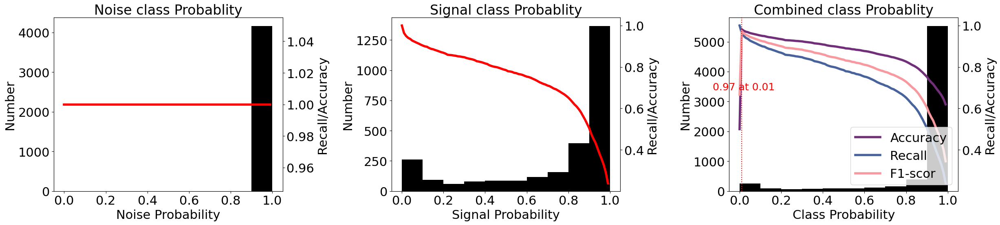

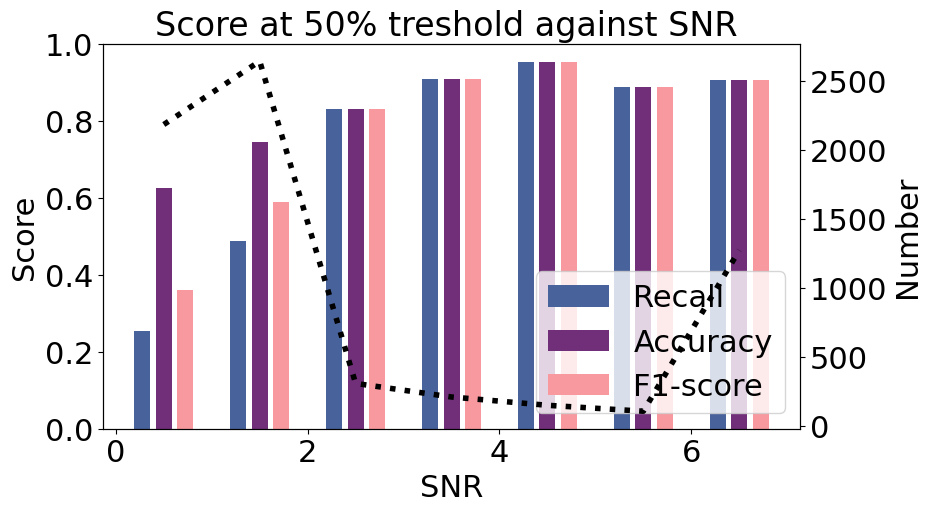

In [67]:
f1,f2, L = plotprobs(pred_list_EQT3,labels)
BestP3['EQT'] = L[0]
BestT3['EQT'] = L[1]
BestA3['EQT'] = L[3]
BestR3['EQT'] = L[2]
f1.savefig("Figure/EQT_Prob_MI.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/EQT_Snr_MI.svg", dpi=100, bbox_inches='tight')

## GPD

In [68]:
## # Load the pre-trained PhaseNet model
print(GPD.list_pretrained())
model = GPD.from_pretrained("original")
model.to('cpu:0')

['dummy', 'ethz', 'geofon', 'instance', 'iquique', 'lendb', 'neic', 'original', 'scedc', 'stead']


GPD(
  (conv1): Conv1d(3, 32, kernel_size=(21,), stride=(1,), padding=(10,))
  (bn1): BatchNorm1d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv1d(32, 64, kernel_size=(15,), stride=(1,), padding=(7,))
  (bn2): BatchNorm1d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1d(64, 128, kernel_size=(11,), stride=(1,), padding=(5,))
  (bn3): BatchNorm1d(128, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv1d(128, 256, kernel_size=(9,), stride=(1,), padding=(4,))
  (bn4): BatchNorm1d(256, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=6400, out_features=200, bias=True)
  (bn5): BatchNorm1d(200, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (fc2): Linear(in_features=200, out_features=200, bias=True)
  (bn6): BatchNorm1d(200, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (fc3): Linear(in_features=200, out_featu

In [69]:
pred_list = []
tic()
for i in tqdm(range(len(datasetMI))):
    preds = model.annotate(datasetMI[i][0])
    pred_list.append(max(preds[0].data) )
toc()
chrono3['GPD']=tac()
pred_list_GPD3 = np.array(pred_list)

  0%|                                                                                                                                | 0/6869 [00:00<?, ?it/s]

  0%|                                                                                                                        | 1/6869 [00:00<20:16,  5.65it/s]

  0%|                                                                                                                        | 2/6869 [00:00<46:39,  2.45it/s]

  0%|                                                                                                                        | 3/6869 [00:01<52:05,  2.20it/s]

  0%|                                                                                                                        | 4/6869 [00:01<37:31,  3.05it/s]

  0%|                                                                                                                        | 5/6869 [00:01<37:22,  3.06it/s]

  0%|                                                                                                                        | 6/6869 [00:02<38:56,  2.94it/s]

  0%|                                                                                                                        | 7/6869 [00:02<39:14,  2.91it/s]

  0%|▏                                                                                                                       | 8/6869 [00:02<37:31,  3.05it/s]

  0%|▏                                                                                                                       | 9/6869 [00:03<43:21,  2.64it/s]

  0%|▏                                                                                                                      | 10/6869 [00:03<44:43,  2.56it/s]

  0%|▏                                                                                                                      | 11/6869 [00:03<39:55,  2.86it/s]

  0%|▏                                                                                                                      | 12/6869 [00:04<36:26,  3.14it/s]

  0%|▏                                                                                                                      | 13/6869 [00:04<36:19,  3.15it/s]

  0%|▏                                                                                                                      | 14/6869 [00:04<32:59,  3.46it/s]

  0%|▎                                                                                                                      | 15/6869 [00:04<31:38,  3.61it/s]

  0%|▎                                                                                                                      | 16/6869 [00:05<35:38,  3.20it/s]

  0%|▎                                                                                                                      | 17/6869 [00:05<29:22,  3.89it/s]

  0%|▎                                                                                                                      | 18/6869 [00:05<31:08,  3.67it/s]

  0%|▎                                                                                                                      | 19/6869 [00:06<38:57,  2.93it/s]

  0%|▎                                                                                                                      | 20/6869 [00:06<35:56,  3.18it/s]

  0%|▎                                                                                                                      | 21/6869 [00:06<39:05,  2.92it/s]

  0%|▍                                                                                                                      | 22/6869 [00:07<36:19,  3.14it/s]

  0%|▍                                                                                                                      | 23/6869 [00:07<38:55,  2.93it/s]

  0%|▍                                                                                                                      | 24/6869 [00:07<34:57,  3.26it/s]

  0%|▍                                                                                                                      | 25/6869 [00:08<31:31,  3.62it/s]

  0%|▍                                                                                                                      | 26/6869 [00:08<26:32,  4.30it/s]

  0%|▍                                                                                                                      | 27/6869 [00:08<31:13,  3.65it/s]

  0%|▍                                                                                                                      | 28/6869 [00:08<31:50,  3.58it/s]

  0%|▌                                                                                                                      | 29/6869 [00:09<33:55,  3.36it/s]

  0%|▌                                                                                                                      | 30/6869 [00:09<36:12,  3.15it/s]

  0%|▌                                                                                                                      | 31/6869 [00:09<33:39,  3.39it/s]

  0%|▌                                                                                                                      | 32/6869 [00:09<31:17,  3.64it/s]

  0%|▌                                                                                                                      | 33/6869 [00:10<32:14,  3.53it/s]

  0%|▌                                                                                                                      | 34/6869 [00:10<29:29,  3.86it/s]

  1%|▌                                                                                                                      | 35/6869 [00:10<36:15,  3.14it/s]

  1%|▌                                                                                                                      | 36/6869 [00:11<33:03,  3.45it/s]

  1%|▋                                                                                                                      | 37/6869 [00:11<29:46,  3.82it/s]

  1%|▋                                                                                                                      | 38/6869 [00:11<29:42,  3.83it/s]

  1%|▋                                                                                                                      | 39/6869 [00:11<30:35,  3.72it/s]

  1%|▋                                                                                                                      | 41/6869 [00:12<27:18,  4.17it/s]

  1%|▋                                                                                                                      | 42/6869 [00:12<32:27,  3.50it/s]

  1%|▋                                                                                                                      | 43/6869 [00:13<36:00,  3.16it/s]

  1%|▊                                                                                                                      | 44/6869 [00:13<31:49,  3.57it/s]

  1%|▊                                                                                                                      | 45/6869 [00:13<36:22,  3.13it/s]

  1%|▊                                                                                                                      | 46/6869 [00:13<30:43,  3.70it/s]

  1%|▊                                                                                                                      | 47/6869 [00:14<30:40,  3.71it/s]

  1%|▊                                                                                                                      | 48/6869 [00:14<31:32,  3.60it/s]

  1%|▊                                                                                                                      | 49/6869 [00:14<30:03,  3.78it/s]

  1%|▊                                                                                                                      | 50/6869 [00:14<28:27,  3.99it/s]

  1%|▉                                                                                                                      | 51/6869 [00:15<37:00,  3.07it/s]

  1%|▉                                                                                                                      | 52/6869 [00:15<30:23,  3.74it/s]

  1%|▉                                                                                                                      | 53/6869 [00:15<31:52,  3.56it/s]

  1%|▉                                                                                                                      | 54/6869 [00:16<32:19,  3.51it/s]

  1%|▉                                                                                                                      | 55/6869 [00:16<33:25,  3.40it/s]

  1%|▉                                                                                                                      | 56/6869 [00:16<31:34,  3.60it/s]

  1%|▉                                                                                                                      | 57/6869 [00:16<31:26,  3.61it/s]

  1%|█                                                                                                                      | 58/6869 [00:17<37:17,  3.04it/s]

  1%|█                                                                                                                      | 59/6869 [00:17<35:21,  3.21it/s]

  1%|█                                                                                                                      | 60/6869 [00:18<37:55,  2.99it/s]

  1%|█                                                                                                                      | 61/6869 [00:18<32:27,  3.50it/s]

  1%|█                                                                                                                      | 62/6869 [00:18<40:46,  2.78it/s]

  1%|█                                                                                                                      | 63/6869 [00:19<37:35,  3.02it/s]

  1%|█                                                                                                                      | 64/6869 [00:19<36:45,  3.08it/s]

  1%|█▏                                                                                                                     | 65/6869 [00:19<34:17,  3.31it/s]

  1%|█▏                                                                                                                     | 66/6869 [00:19<36:28,  3.11it/s]

  1%|█▏                                                                                                                     | 67/6869 [00:20<30:12,  3.75it/s]

  1%|█▏                                                                                                                     | 68/6869 [00:20<34:31,  3.28it/s]

  1%|█▏                                                                                                                     | 69/6869 [00:20<28:19,  4.00it/s]

  1%|█▏                                                                                                                     | 70/6869 [00:20<27:40,  4.09it/s]

  1%|█▏                                                                                                                     | 71/6869 [00:21<28:07,  4.03it/s]

  1%|█▏                                                                                                                     | 72/6869 [00:21<28:04,  4.04it/s]

  1%|█▎                                                                                                                     | 73/6869 [00:21<33:25,  3.39it/s]

  1%|█▎                                                                                                                     | 74/6869 [00:22<31:38,  3.58it/s]

  1%|█▎                                                                                                                     | 75/6869 [00:22<27:48,  4.07it/s]

  1%|█▎                                                                                                                     | 76/6869 [00:22<25:44,  4.40it/s]

  1%|█▎                                                                                                                     | 77/6869 [00:22<26:39,  4.25it/s]

  1%|█▎                                                                                                                     | 78/6869 [00:22<28:54,  3.92it/s]

  1%|█▎                                                                                                                     | 79/6869 [00:23<29:23,  3.85it/s]

  1%|█▍                                                                                                                     | 80/6869 [00:23<33:13,  3.41it/s]

  1%|█▍                                                                                                                     | 81/6869 [00:23<33:18,  3.40it/s]

  1%|█▍                                                                                                                     | 82/6869 [00:24<34:30,  3.28it/s]

  1%|█▍                                                                                                                     | 83/6869 [00:24<39:32,  2.86it/s]

  1%|█▍                                                                                                                     | 84/6869 [00:25<39:37,  2.85it/s]

  1%|█▍                                                                                                                     | 85/6869 [00:25<38:31,  2.94it/s]

  1%|█▍                                                                                                                     | 86/6869 [00:25<35:10,  3.21it/s]

  1%|█▌                                                                                                                     | 87/6869 [00:25<29:18,  3.86it/s]

  1%|█▌                                                                                                                     | 88/6869 [00:26<34:11,  3.31it/s]

  1%|█▌                                                                                                                     | 89/6869 [00:26<32:28,  3.48it/s]

  1%|█▌                                                                                                                     | 90/6869 [00:26<34:32,  3.27it/s]

  1%|█▌                                                                                                                     | 91/6869 [00:26<29:37,  3.81it/s]

  1%|█▌                                                                                                                     | 92/6869 [00:27<26:39,  4.24it/s]

  1%|█▌                                                                                                                     | 93/6869 [00:27<30:03,  3.76it/s]

  1%|█▋                                                                                                                     | 94/6869 [00:27<36:53,  3.06it/s]

  1%|█▋                                                                                                                     | 95/6869 [00:28<34:01,  3.32it/s]

  1%|█▋                                                                                                                     | 96/6869 [00:28<37:06,  3.04it/s]

  1%|█▋                                                                                                                     | 97/6869 [00:28<34:16,  3.29it/s]

  1%|█▋                                                                                                                     | 98/6869 [00:29<36:14,  3.11it/s]

  1%|█▋                                                                                                                     | 99/6869 [00:29<37:21,  3.02it/s]

  1%|█▋                                                                                                                    | 100/6869 [00:29<30:15,  3.73it/s]

  1%|█▋                                                                                                                    | 101/6869 [00:29<33:54,  3.33it/s]

  1%|█▊                                                                                                                    | 102/6869 [00:30<32:52,  3.43it/s]

  1%|█▊                                                                                                                    | 103/6869 [00:30<38:17,  2.94it/s]

  2%|█▊                                                                                                                    | 105/6869 [00:31<32:54,  3.43it/s]

  2%|█▊                                                                                                                    | 106/6869 [00:31<37:05,  3.04it/s]

  2%|█▊                                                                                                                    | 107/6869 [00:31<39:11,  2.88it/s]

  2%|█▊                                                                                                                    | 108/6869 [00:32<37:47,  2.98it/s]

  2%|█▊                                                                                                                    | 109/6869 [00:32<42:04,  2.68it/s]

  2%|█▉                                                                                                                    | 110/6869 [00:33<39:02,  2.89it/s]

  2%|█▉                                                                                                                    | 111/6869 [00:33<35:17,  3.19it/s]

  2%|█▉                                                                                                                    | 112/6869 [00:33<32:01,  3.52it/s]

  2%|█▉                                                                                                                    | 113/6869 [00:33<30:40,  3.67it/s]

  2%|█▉                                                                                                                    | 114/6869 [00:34<35:00,  3.22it/s]

  2%|█▉                                                                                                                    | 115/6869 [00:34<35:35,  3.16it/s]

  2%|█▉                                                                                                                    | 116/6869 [00:34<32:48,  3.43it/s]

  2%|██                                                                                                                    | 117/6869 [00:34<29:32,  3.81it/s]

  2%|██                                                                                                                    | 118/6869 [00:35<28:36,  3.93it/s]

  2%|██                                                                                                                    | 119/6869 [00:35<28:34,  3.94it/s]

  2%|██                                                                                                                    | 120/6869 [00:35<28:08,  4.00it/s]

  2%|██                                                                                                                    | 121/6869 [00:35<30:21,  3.70it/s]

  2%|██                                                                                                                    | 122/6869 [00:36<31:15,  3.60it/s]

  2%|██                                                                                                                    | 123/6869 [00:36<32:06,  3.50it/s]

  2%|██▏                                                                                                                   | 124/6869 [00:36<26:17,  4.27it/s]

  2%|██▏                                                                                                                   | 125/6869 [00:36<25:52,  4.34it/s]

  2%|██▏                                                                                                                   | 126/6869 [00:37<31:52,  3.53it/s]

  2%|██▏                                                                                                                   | 127/6869 [00:37<29:02,  3.87it/s]

  2%|██▏                                                                                                                   | 128/6869 [00:37<30:29,  3.69it/s]

  2%|██▏                                                                                                                   | 129/6869 [00:38<41:35,  2.70it/s]

  2%|██▏                                                                                                                   | 130/6869 [00:38<43:07,  2.60it/s]

  2%|██▎                                                                                                                   | 131/6869 [00:39<44:46,  2.51it/s]

  2%|██▎                                                                                                                   | 132/6869 [00:39<45:12,  2.48it/s]

  2%|██▎                                                                                                                   | 133/6869 [00:39<40:57,  2.74it/s]

  2%|██▎                                                                                                                   | 134/6869 [00:40<37:04,  3.03it/s]

  2%|██▎                                                                                                                   | 135/6869 [00:40<40:03,  2.80it/s]

  2%|██▎                                                                                                                   | 136/6869 [00:40<35:22,  3.17it/s]

  2%|██▎                                                                                                                   | 137/6869 [00:40<29:52,  3.76it/s]

  2%|██▎                                                                                                                   | 138/6869 [00:41<35:05,  3.20it/s]

  2%|██▍                                                                                                                   | 139/6869 [00:41<33:45,  3.32it/s]

  2%|██▍                                                                                                                   | 140/6869 [00:41<33:14,  3.37it/s]

  2%|██▍                                                                                                                   | 141/6869 [00:42<31:46,  3.53it/s]

  2%|██▍                                                                                                                   | 142/6869 [00:42<32:00,  3.50it/s]

  2%|██▍                                                                                                                   | 143/6869 [00:42<32:12,  3.48it/s]

  2%|██▍                                                                                                                   | 144/6869 [00:43<36:03,  3.11it/s]

  2%|██▍                                                                                                                   | 145/6869 [00:43<36:15,  3.09it/s]

  2%|██▌                                                                                                                   | 146/6869 [00:43<33:06,  3.38it/s]

  2%|██▌                                                                                                                   | 147/6869 [00:43<31:22,  3.57it/s]

  2%|██▌                                                                                                                   | 148/6869 [00:44<31:38,  3.54it/s]

  2%|██▌                                                                                                                   | 149/6869 [00:44<30:38,  3.66it/s]

  2%|██▌                                                                                                                   | 150/6869 [00:44<29:39,  3.78it/s]

  2%|██▌                                                                                                                   | 151/6869 [00:45<36:02,  3.11it/s]

  2%|██▌                                                                                                                   | 152/6869 [00:45<29:22,  3.81it/s]

  2%|██▋                                                                                                                   | 153/6869 [00:45<30:47,  3.64it/s]

  2%|██▋                                                                                                                   | 154/6869 [00:45<33:00,  3.39it/s]

  2%|██▋                                                                                                                   | 156/6869 [00:46<31:06,  3.60it/s]

  2%|██▋                                                                                                                   | 158/6869 [00:46<28:56,  3.86it/s]

  2%|██▋                                                                                                                   | 159/6869 [00:47<34:57,  3.20it/s]

  2%|██▋                                                                                                                   | 160/6869 [00:47<30:23,  3.68it/s]

  2%|██▊                                                                                                                   | 161/6869 [00:47<31:02,  3.60it/s]

  2%|██▊                                                                                                                   | 162/6869 [00:48<27:31,  4.06it/s]

  2%|██▊                                                                                                                   | 163/6869 [00:48<30:40,  3.64it/s]

  2%|██▊                                                                                                                   | 164/6869 [00:48<32:58,  3.39it/s]

  2%|██▊                                                                                                                   | 165/6869 [00:49<36:19,  3.08it/s]

  2%|██▊                                                                                                                   | 166/6869 [00:49<31:13,  3.58it/s]

  2%|██▊                                                                                                                   | 167/6869 [00:49<29:50,  3.74it/s]

  2%|██▉                                                                                                                   | 168/6869 [00:49<33:35,  3.33it/s]

  2%|██▉                                                                                                                   | 169/6869 [00:50<32:23,  3.45it/s]

  2%|██▉                                                                                                                   | 171/6869 [00:50<21:47,  5.12it/s]

  3%|██▉                                                                                                                   | 172/6869 [00:50<24:23,  4.58it/s]

  3%|██▉                                                                                                                   | 173/6869 [00:50<25:06,  4.45it/s]

  3%|██▉                                                                                                                   | 174/6869 [00:51<32:13,  3.46it/s]

  3%|███                                                                                                                   | 175/6869 [00:51<31:31,  3.54it/s]

  3%|███                                                                                                                   | 176/6869 [00:51<33:03,  3.37it/s]

  3%|███                                                                                                                   | 177/6869 [00:52<32:25,  3.44it/s]

  3%|███                                                                                                                   | 178/6869 [00:52<33:06,  3.37it/s]

  3%|███                                                                                                                   | 179/6869 [00:52<30:09,  3.70it/s]

  3%|███                                                                                                                   | 180/6869 [00:53<30:41,  3.63it/s]

  3%|███                                                                                                                   | 181/6869 [00:53<30:01,  3.71it/s]

  3%|███▏                                                                                                                  | 182/6869 [00:53<32:11,  3.46it/s]

  3%|███▏                                                                                                                  | 183/6869 [00:53<34:33,  3.23it/s]

  3%|███▏                                                                                                                  | 184/6869 [00:54<35:01,  3.18it/s]

  3%|███▏                                                                                                                  | 185/6869 [00:54<40:03,  2.78it/s]

  3%|███▏                                                                                                                  | 186/6869 [00:55<39:37,  2.81it/s]

  3%|███▏                                                                                                                  | 187/6869 [00:55<37:07,  3.00it/s]

  3%|███▏                                                                                                                  | 188/6869 [00:55<40:34,  2.74it/s]

  3%|███▏                                                                                                                  | 189/6869 [00:56<39:52,  2.79it/s]

  3%|███▎                                                                                                                  | 190/6869 [00:56<38:10,  2.92it/s]

  3%|███▎                                                                                                                  | 191/6869 [00:56<35:55,  3.10it/s]

  3%|███▎                                                                                                                  | 192/6869 [00:57<33:43,  3.30it/s]

  3%|███▎                                                                                                                  | 193/6869 [00:57<32:52,  3.38it/s]

  3%|███▎                                                                                                                  | 194/6869 [00:57<36:55,  3.01it/s]

  3%|███▎                                                                                                                  | 195/6869 [00:57<35:01,  3.18it/s]

  3%|███▍                                                                                                                  | 197/6869 [00:58<33:28,  3.32it/s]

  3%|███▍                                                                                                                  | 198/6869 [00:58<28:23,  3.92it/s]

  3%|███▍                                                                                                                  | 199/6869 [00:58<24:44,  4.49it/s]

  3%|███▍                                                                                                                  | 200/6869 [00:59<27:26,  4.05it/s]

  3%|███▍                                                                                                                  | 201/6869 [00:59<32:56,  3.37it/s]

  3%|███▍                                                                                                                  | 202/6869 [00:59<37:07,  2.99it/s]

  3%|███▍                                                                                                                  | 203/6869 [01:00<36:11,  3.07it/s]

  3%|███▌                                                                                                                  | 204/6869 [01:00<32:25,  3.43it/s]

  3%|███▌                                                                                                                  | 205/6869 [01:00<36:49,  3.02it/s]

  3%|███▌                                                                                                                  | 206/6869 [01:01<32:30,  3.42it/s]

  3%|███▌                                                                                                                  | 207/6869 [01:01<37:13,  2.98it/s]

  3%|███▌                                                                                                                  | 208/6869 [01:01<34:53,  3.18it/s]

  3%|███▌                                                                                                                  | 209/6869 [01:02<36:06,  3.07it/s]

  3%|███▌                                                                                                                  | 210/6869 [01:02<37:41,  2.94it/s]

  3%|███▌                                                                                                                  | 211/6869 [01:03<45:39,  2.43it/s]

  3%|███▋                                                                                                                  | 212/6869 [01:03<41:46,  2.66it/s]

  3%|███▋                                                                                                                  | 213/6869 [01:03<41:18,  2.69it/s]

  3%|███▋                                                                                                                  | 214/6869 [01:04<42:46,  2.59it/s]

  3%|███▋                                                                                                                  | 215/6869 [01:04<42:36,  2.60it/s]

  3%|███▋                                                                                                                  | 216/6869 [01:04<39:23,  2.81it/s]

  3%|███▋                                                                                                                  | 217/6869 [01:05<39:36,  2.80it/s]

  3%|███▋                                                                                                                  | 218/6869 [01:05<41:11,  2.69it/s]

  3%|███▊                                                                                                                  | 219/6869 [01:05<32:35,  3.40it/s]

  3%|███▊                                                                                                                  | 220/6869 [01:06<31:30,  3.52it/s]

  3%|███▊                                                                                                                  | 221/6869 [01:06<36:43,  3.02it/s]

  3%|███▊                                                                                                                  | 222/6869 [01:06<40:39,  2.73it/s]

  3%|███▊                                                                                                                  | 223/6869 [01:07<39:12,  2.83it/s]

  3%|███▊                                                                                                                  | 224/6869 [01:07<36:25,  3.04it/s]

  3%|███▊                                                                                                                  | 225/6869 [01:07<38:35,  2.87it/s]

  3%|███▉                                                                                                                  | 226/6869 [01:08<43:55,  2.52it/s]

  3%|███▉                                                                                                                  | 227/6869 [01:08<40:35,  2.73it/s]

  3%|███▉                                                                                                                  | 228/6869 [01:09<44:52,  2.47it/s]

  3%|███▉                                                                                                                  | 229/6869 [01:09<47:53,  2.31it/s]

  3%|███▉                                                                                                                  | 230/6869 [01:10<46:01,  2.40it/s]

  3%|███▉                                                                                                                  | 231/6869 [01:10<46:35,  2.37it/s]

  3%|███▉                                                                                                                  | 232/6869 [01:10<43:56,  2.52it/s]

  3%|████                                                                                                                  | 233/6869 [01:11<44:01,  2.51it/s]

  3%|████                                                                                                                  | 234/6869 [01:11<47:03,  2.35it/s]

  3%|████                                                                                                                  | 235/6869 [01:12<43:13,  2.56it/s]

  3%|████                                                                                                                  | 236/6869 [01:12<35:55,  3.08it/s]

  3%|████                                                                                                                  | 237/6869 [01:12<38:26,  2.88it/s]

  3%|████                                                                                                                  | 238/6869 [01:12<33:00,  3.35it/s]

  3%|████                                                                                                                  | 239/6869 [01:13<36:13,  3.05it/s]

  3%|████                                                                                                                  | 240/6869 [01:13<34:45,  3.18it/s]

  4%|████▏                                                                                                                 | 241/6869 [01:13<38:16,  2.89it/s]

  4%|████▏                                                                                                                 | 242/6869 [01:14<33:40,  3.28it/s]

  4%|████▏                                                                                                                 | 243/6869 [01:14<30:34,  3.61it/s]

  4%|████▏                                                                                                                 | 244/6869 [01:14<38:23,  2.88it/s]

  4%|████▏                                                                                                                 | 245/6869 [01:15<35:38,  3.10it/s]

  4%|████▏                                                                                                                 | 246/6869 [01:15<39:21,  2.80it/s]

  4%|████▏                                                                                                                 | 247/6869 [01:15<39:02,  2.83it/s]

  4%|████▎                                                                                                                 | 248/6869 [01:16<39:10,  2.82it/s]

  4%|████▎                                                                                                                 | 249/6869 [01:16<42:49,  2.58it/s]

  4%|████▎                                                                                                                 | 250/6869 [01:16<38:15,  2.88it/s]

  4%|████▎                                                                                                                 | 251/6869 [01:17<35:10,  3.14it/s]

  4%|████▎                                                                                                                 | 252/6869 [01:17<45:27,  2.43it/s]

  4%|████▎                                                                                                                 | 253/6869 [01:18<40:38,  2.71it/s]

  4%|████▎                                                                                                                 | 254/6869 [01:18<39:51,  2.77it/s]

  4%|████▍                                                                                                                 | 255/6869 [01:18<37:36,  2.93it/s]

  4%|████▍                                                                                                                 | 256/6869 [01:18<32:26,  3.40it/s]

  4%|████▍                                                                                                                 | 257/6869 [01:19<33:01,  3.34it/s]

  4%|████▍                                                                                                                 | 258/6869 [01:19<32:54,  3.35it/s]

  4%|████▍                                                                                                                 | 259/6869 [01:19<37:44,  2.92it/s]

  4%|████▍                                                                                                                 | 260/6869 [01:20<33:53,  3.25it/s]

  4%|████▍                                                                                                                 | 261/6869 [01:20<35:03,  3.14it/s]

  4%|████▌                                                                                                                 | 262/6869 [01:21<42:30,  2.59it/s]

  4%|████▌                                                                                                                 | 263/6869 [01:21<38:25,  2.86it/s]

  4%|████▌                                                                                                                 | 264/6869 [01:21<33:38,  3.27it/s]

  4%|████▌                                                                                                                 | 265/6869 [01:21<31:18,  3.52it/s]

  4%|████▌                                                                                                                 | 266/6869 [01:21<28:48,  3.82it/s]

  4%|████▌                                                                                                                 | 267/6869 [01:22<35:30,  3.10it/s]

  4%|████▌                                                                                                                 | 268/6869 [01:22<32:40,  3.37it/s]

  4%|████▌                                                                                                                 | 269/6869 [01:22<29:39,  3.71it/s]

  4%|████▋                                                                                                                 | 270/6869 [01:23<27:27,  4.00it/s]

  4%|████▋                                                                                                                 | 271/6869 [01:23<27:58,  3.93it/s]

  4%|████▋                                                                                                                 | 272/6869 [01:23<29:08,  3.77it/s]

  4%|████▋                                                                                                                 | 273/6869 [01:23<29:37,  3.71it/s]

  4%|████▋                                                                                                                 | 274/6869 [01:24<33:59,  3.23it/s]

  4%|████▋                                                                                                                 | 275/6869 [01:24<30:45,  3.57it/s]

  4%|████▋                                                                                                                 | 276/6869 [01:24<33:45,  3.25it/s]

  4%|████▊                                                                                                                 | 277/6869 [01:25<36:55,  2.98it/s]

  4%|████▊                                                                                                                 | 278/6869 [01:25<35:03,  3.13it/s]

  4%|████▊                                                                                                                 | 279/6869 [01:26<40:41,  2.70it/s]

  4%|████▊                                                                                                                 | 280/6869 [01:26<42:31,  2.58it/s]

  4%|████▊                                                                                                                 | 281/6869 [01:26<38:26,  2.86it/s]

  4%|████▊                                                                                                                 | 282/6869 [01:27<34:30,  3.18it/s]

  4%|████▊                                                                                                                 | 283/6869 [01:27<33:37,  3.26it/s]

  4%|████▉                                                                                                                 | 284/6869 [01:27<30:31,  3.59it/s]

  4%|████▉                                                                                                                 | 285/6869 [01:27<35:11,  3.12it/s]

  4%|████▉                                                                                                                 | 286/6869 [01:28<28:30,  3.85it/s]

  4%|████▉                                                                                                                 | 287/6869 [01:28<29:20,  3.74it/s]

  4%|████▉                                                                                                                 | 288/6869 [01:28<28:28,  3.85it/s]

  4%|████▉                                                                                                                 | 289/6869 [01:28<28:56,  3.79it/s]

  4%|████▉                                                                                                                 | 290/6869 [01:29<29:01,  3.78it/s]

  4%|████▉                                                                                                                 | 291/6869 [01:29<30:21,  3.61it/s]

  4%|█████                                                                                                                 | 292/6869 [01:29<31:51,  3.44it/s]

  4%|█████                                                                                                                 | 294/6869 [01:30<23:23,  4.69it/s]

  4%|█████                                                                                                                 | 295/6869 [01:30<30:22,  3.61it/s]

  4%|█████                                                                                                                 | 296/6869 [01:30<31:18,  3.50it/s]

  4%|█████                                                                                                                 | 297/6869 [01:31<31:50,  3.44it/s]

  4%|█████                                                                                                                 | 298/6869 [01:31<31:02,  3.53it/s]

  4%|█████▏                                                                                                                | 299/6869 [01:31<35:13,  3.11it/s]

  4%|█████▏                                                                                                                | 300/6869 [01:32<40:39,  2.69it/s]

  4%|█████▏                                                                                                                | 301/6869 [01:32<35:56,  3.05it/s]

  4%|█████▏                                                                                                                | 302/6869 [01:32<32:16,  3.39it/s]

  4%|█████▏                                                                                                                | 303/6869 [01:33<34:22,  3.18it/s]

  4%|█████▏                                                                                                                | 304/6869 [01:33<35:31,  3.08it/s]

  4%|█████▏                                                                                                                | 305/6869 [01:33<36:20,  3.01it/s]

  4%|█████▎                                                                                                                | 306/6869 [01:34<35:18,  3.10it/s]

  4%|█████▎                                                                                                                | 307/6869 [01:34<30:29,  3.59it/s]

  4%|█████▎                                                                                                                | 308/6869 [01:34<41:13,  2.65it/s]

  5%|█████▎                                                                                                                | 310/6869 [01:35<33:22,  3.28it/s]

  5%|█████▎                                                                                                                | 311/6869 [01:35<32:04,  3.41it/s]

  5%|█████▎                                                                                                                | 312/6869 [01:35<34:34,  3.16it/s]

  5%|█████▍                                                                                                                | 313/6869 [01:36<32:15,  3.39it/s]

  5%|█████▍                                                                                                                | 314/6869 [01:36<28:28,  3.84it/s]

  5%|█████▍                                                                                                                | 315/6869 [01:36<30:00,  3.64it/s]

  5%|█████▍                                                                                                                | 316/6869 [01:36<30:56,  3.53it/s]

  5%|█████▍                                                                                                                | 317/6869 [01:37<28:11,  3.87it/s]

  5%|█████▍                                                                                                                | 318/6869 [01:37<37:11,  2.94it/s]

  5%|█████▍                                                                                                                | 319/6869 [01:38<38:25,  2.84it/s]

  5%|█████▍                                                                                                                | 320/6869 [01:38<35:26,  3.08it/s]

  5%|█████▌                                                                                                                | 321/6869 [01:38<42:03,  2.60it/s]

  5%|█████▌                                                                                                                | 322/6869 [01:39<43:02,  2.53it/s]

  5%|█████▌                                                                                                                | 323/6869 [01:39<43:05,  2.53it/s]

  5%|█████▌                                                                                                                | 324/6869 [01:40<44:49,  2.43it/s]

  5%|█████▌                                                                                                                | 325/6869 [01:40<46:05,  2.37it/s]

  5%|█████▌                                                                                                                | 326/6869 [01:40<39:57,  2.73it/s]

  5%|█████▌                                                                                                                | 327/6869 [01:41<41:43,  2.61it/s]

  5%|█████▋                                                                                                                | 328/6869 [01:41<42:55,  2.54it/s]

  5%|█████▋                                                                                                                | 329/6869 [01:42<45:01,  2.42it/s]

  5%|█████▋                                                                                                                | 330/6869 [01:42<40:02,  2.72it/s]

  5%|█████▋                                                                                                                | 331/6869 [01:42<36:57,  2.95it/s]

  5%|█████▋                                                                                                                | 332/6869 [01:42<35:00,  3.11it/s]

  5%|█████▋                                                                                                                | 333/6869 [01:43<38:14,  2.85it/s]

  5%|█████▋                                                                                                                | 334/6869 [01:43<40:53,  2.66it/s]

  5%|█████▊                                                                                                                | 335/6869 [01:44<38:24,  2.84it/s]

  5%|█████▊                                                                                                                | 336/6869 [01:44<36:49,  2.96it/s]

  5%|█████▊                                                                                                                | 337/6869 [01:44<33:49,  3.22it/s]

  5%|█████▊                                                                                                                | 338/6869 [01:45<37:35,  2.90it/s]

  5%|█████▊                                                                                                                | 339/6869 [01:45<38:00,  2.86it/s]

  5%|█████▊                                                                                                                | 340/6869 [01:45<37:40,  2.89it/s]

  5%|█████▊                                                                                                                | 341/6869 [01:45<30:04,  3.62it/s]

  5%|█████▉                                                                                                                | 342/6869 [01:46<30:26,  3.57it/s]

  5%|█████▉                                                                                                                | 343/6869 [01:46<36:52,  2.95it/s]

  5%|█████▉                                                                                                                | 344/6869 [01:47<38:35,  2.82it/s]

  5%|█████▉                                                                                                                | 345/6869 [01:47<39:12,  2.77it/s]

  5%|█████▉                                                                                                                | 346/6869 [01:47<34:16,  3.17it/s]

  5%|█████▉                                                                                                                | 347/6869 [01:47<30:55,  3.52it/s]

  5%|█████▉                                                                                                                | 348/6869 [01:48<34:01,  3.19it/s]

  5%|█████▉                                                                                                                | 349/6869 [01:48<36:11,  3.00it/s]

  5%|██████                                                                                                                | 350/6869 [01:48<32:43,  3.32it/s]

  5%|██████                                                                                                                | 351/6869 [01:48<29:38,  3.67it/s]

  5%|██████                                                                                                                | 352/6869 [01:49<34:13,  3.17it/s]

  5%|██████                                                                                                                | 353/6869 [01:49<38:54,  2.79it/s]

  5%|██████                                                                                                                | 354/6869 [01:50<39:37,  2.74it/s]

  5%|██████                                                                                                                | 355/6869 [01:50<36:26,  2.98it/s]

  5%|██████                                                                                                                | 356/6869 [01:50<34:37,  3.14it/s]

  5%|██████▏                                                                                                               | 357/6869 [01:51<35:31,  3.06it/s]

  5%|██████▏                                                                                                               | 358/6869 [01:51<35:15,  3.08it/s]

  5%|██████▏                                                                                                               | 359/6869 [01:51<35:34,  3.05it/s]

  5%|██████▏                                                                                                               | 360/6869 [01:52<41:25,  2.62it/s]

  5%|██████▏                                                                                                               | 362/6869 [01:52<31:18,  3.46it/s]

  5%|██████▏                                                                                                               | 363/6869 [01:53<39:40,  2.73it/s]

  5%|██████▎                                                                                                               | 364/6869 [01:53<41:57,  2.58it/s]

  5%|██████▎                                                                                                               | 365/6869 [01:53<36:38,  2.96it/s]

  5%|██████▎                                                                                                               | 366/6869 [01:54<38:45,  2.80it/s]

  5%|██████▎                                                                                                               | 367/6869 [01:54<34:16,  3.16it/s]

  5%|██████▎                                                                                                               | 368/6869 [01:54<35:16,  3.07it/s]

  5%|██████▎                                                                                                               | 369/6869 [01:55<30:49,  3.51it/s]

  5%|██████▎                                                                                                               | 370/6869 [01:55<31:38,  3.42it/s]

  5%|██████▎                                                                                                               | 371/6869 [01:55<39:52,  2.72it/s]

  5%|██████▍                                                                                                               | 372/6869 [01:56<36:55,  2.93it/s]

  5%|██████▍                                                                                                               | 373/6869 [01:56<38:09,  2.84it/s]

  5%|██████▍                                                                                                               | 374/6869 [01:56<33:57,  3.19it/s]

  5%|██████▍                                                                                                               | 375/6869 [01:57<38:46,  2.79it/s]

  5%|██████▍                                                                                                               | 376/6869 [01:57<37:54,  2.86it/s]

  5%|██████▍                                                                                                               | 377/6869 [01:57<38:50,  2.79it/s]

  6%|██████▍                                                                                                               | 378/6869 [01:58<34:58,  3.09it/s]

  6%|██████▌                                                                                                               | 379/6869 [01:58<32:40,  3.31it/s]

  6%|██████▌                                                                                                               | 380/6869 [01:58<30:57,  3.49it/s]

  6%|██████▌                                                                                                               | 381/6869 [01:59<30:38,  3.53it/s]

  6%|██████▌                                                                                                               | 382/6869 [01:59<34:49,  3.11it/s]

  6%|██████▌                                                                                                               | 383/6869 [01:59<34:27,  3.14it/s]

  6%|██████▌                                                                                                               | 384/6869 [02:00<36:41,  2.95it/s]

  6%|██████▌                                                                                                               | 385/6869 [02:00<36:12,  2.98it/s]

  6%|██████▋                                                                                                               | 386/6869 [02:00<28:50,  3.75it/s]

  6%|██████▋                                                                                                               | 387/6869 [02:01<35:55,  3.01it/s]

  6%|██████▋                                                                                                               | 388/6869 [02:01<37:25,  2.89it/s]

  6%|██████▋                                                                                                               | 389/6869 [02:01<40:00,  2.70it/s]

  6%|██████▋                                                                                                               | 390/6869 [02:02<37:36,  2.87it/s]

  6%|██████▋                                                                                                               | 391/6869 [02:02<38:31,  2.80it/s]

  6%|██████▋                                                                                                               | 392/6869 [02:02<36:07,  2.99it/s]

  6%|██████▊                                                                                                               | 393/6869 [02:03<34:46,  3.10it/s]

  6%|██████▊                                                                                                               | 394/6869 [02:03<31:40,  3.41it/s]

  6%|██████▊                                                                                                               | 395/6869 [02:03<32:07,  3.36it/s]

  6%|██████▊                                                                                                               | 396/6869 [02:03<28:15,  3.82it/s]

  6%|██████▊                                                                                                               | 397/6869 [02:04<29:21,  3.67it/s]

  6%|██████▊                                                                                                               | 398/6869 [02:04<29:40,  3.63it/s]

  6%|██████▊                                                                                                               | 399/6869 [02:04<28:59,  3.72it/s]

  6%|██████▊                                                                                                               | 400/6869 [02:05<33:41,  3.20it/s]

  6%|██████▉                                                                                                               | 401/6869 [02:05<38:50,  2.78it/s]

  6%|██████▉                                                                                                               | 402/6869 [02:05<38:21,  2.81it/s]

  6%|██████▉                                                                                                               | 403/6869 [02:06<41:45,  2.58it/s]

  6%|██████▉                                                                                                               | 404/6869 [02:06<36:08,  2.98it/s]

  6%|██████▉                                                                                                               | 405/6869 [02:06<33:42,  3.20it/s]

  6%|██████▉                                                                                                               | 406/6869 [02:07<37:18,  2.89it/s]

  6%|██████▉                                                                                                               | 407/6869 [02:07<41:24,  2.60it/s]

  6%|███████                                                                                                               | 408/6869 [02:07<37:53,  2.84it/s]

  6%|███████                                                                                                               | 409/6869 [02:08<35:25,  3.04it/s]

  6%|███████                                                                                                               | 410/6869 [02:08<34:59,  3.08it/s]

  6%|███████                                                                                                               | 411/6869 [02:08<34:01,  3.16it/s]

  6%|███████                                                                                                               | 412/6869 [02:09<35:56,  2.99it/s]

  6%|███████                                                                                                               | 413/6869 [02:09<30:34,  3.52it/s]

  6%|███████                                                                                                               | 414/6869 [02:09<35:36,  3.02it/s]

  6%|███████▏                                                                                                              | 415/6869 [02:10<32:57,  3.26it/s]

  6%|███████▏                                                                                                              | 416/6869 [02:10<32:44,  3.29it/s]

  6%|███████▏                                                                                                              | 417/6869 [02:10<30:29,  3.53it/s]

  6%|███████▏                                                                                                              | 418/6869 [02:11<35:40,  3.01it/s]

  6%|███████▏                                                                                                              | 419/6869 [02:11<29:05,  3.69it/s]

  6%|███████▏                                                                                                              | 420/6869 [02:11<34:55,  3.08it/s]

  6%|███████▏                                                                                                              | 421/6869 [02:11<32:37,  3.29it/s]

  6%|███████▏                                                                                                              | 422/6869 [02:12<35:54,  2.99it/s]

  6%|███████▎                                                                                                              | 423/6869 [02:12<38:51,  2.76it/s]

  6%|███████▎                                                                                                              | 424/6869 [02:13<36:02,  2.98it/s]

  6%|███████▎                                                                                                              | 425/6869 [02:13<42:34,  2.52it/s]

  6%|███████▎                                                                                                              | 426/6869 [02:13<41:49,  2.57it/s]

  6%|███████▎                                                                                                              | 427/6869 [02:14<40:16,  2.67it/s]

  6%|███████▎                                                                                                              | 428/6869 [02:14<39:38,  2.71it/s]

  6%|███████▎                                                                                                              | 429/6869 [02:14<36:48,  2.92it/s]

  6%|███████▍                                                                                                              | 430/6869 [02:15<41:45,  2.57it/s]

  6%|███████▍                                                                                                              | 431/6869 [02:15<41:11,  2.60it/s]

  6%|███████▍                                                                                                              | 432/6869 [02:16<37:16,  2.88it/s]

  6%|███████▍                                                                                                              | 433/6869 [02:16<39:52,  2.69it/s]

  6%|███████▍                                                                                                              | 434/6869 [02:16<39:58,  2.68it/s]

  6%|███████▍                                                                                                              | 435/6869 [02:17<38:35,  2.78it/s]

  6%|███████▍                                                                                                              | 436/6869 [02:17<40:03,  2.68it/s]

  6%|███████▌                                                                                                              | 437/6869 [02:17<39:18,  2.73it/s]

  6%|███████▌                                                                                                              | 438/6869 [02:18<36:38,  2.93it/s]

  6%|███████▌                                                                                                              | 439/6869 [02:18<39:35,  2.71it/s]

  6%|███████▌                                                                                                              | 440/6869 [02:18<34:17,  3.12it/s]

  6%|███████▌                                                                                                              | 441/6869 [02:19<32:35,  3.29it/s]

  6%|███████▌                                                                                                              | 442/6869 [02:19<31:01,  3.45it/s]

  6%|███████▌                                                                                                              | 443/6869 [02:20<42:32,  2.52it/s]

  6%|███████▋                                                                                                              | 444/6869 [02:20<45:51,  2.34it/s]

  6%|███████▋                                                                                                              | 445/6869 [02:20<38:52,  2.75it/s]

  6%|███████▋                                                                                                              | 446/6869 [02:21<46:12,  2.32it/s]

  7%|███████▋                                                                                                              | 447/6869 [02:21<42:36,  2.51it/s]

  7%|███████▋                                                                                                              | 448/6869 [02:21<38:20,  2.79it/s]

  7%|███████▋                                                                                                              | 449/6869 [02:22<35:30,  3.01it/s]

  7%|███████▋                                                                                                              | 450/6869 [02:22<33:48,  3.16it/s]

  7%|███████▋                                                                                                              | 451/6869 [02:22<32:55,  3.25it/s]

  7%|███████▊                                                                                                              | 452/6869 [02:23<36:49,  2.90it/s]

  7%|███████▊                                                                                                              | 453/6869 [02:23<30:12,  3.54it/s]

  7%|███████▊                                                                                                              | 454/6869 [02:23<37:14,  2.87it/s]

  7%|███████▊                                                                                                              | 455/6869 [02:24<36:49,  2.90it/s]

  7%|███████▊                                                                                                              | 456/6869 [02:24<42:38,  2.51it/s]

  7%|███████▊                                                                                                              | 457/6869 [02:24<38:32,  2.77it/s]

  7%|███████▊                                                                                                              | 458/6869 [02:25<30:36,  3.49it/s]

  7%|███████▉                                                                                                              | 459/6869 [02:25<30:40,  3.48it/s]

  7%|███████▉                                                                                                              | 460/6869 [02:25<25:10,  4.24it/s]

  7%|███████▉                                                                                                              | 461/6869 [02:25<25:03,  4.26it/s]

  7%|███████▉                                                                                                              | 462/6869 [02:25<23:02,  4.63it/s]

  7%|███████▉                                                                                                              | 463/6869 [02:26<29:30,  3.62it/s]

  7%|███████▉                                                                                                              | 464/6869 [02:26<28:27,  3.75it/s]

  7%|███████▉                                                                                                              | 465/6869 [02:26<33:07,  3.22it/s]

  7%|████████                                                                                                              | 466/6869 [02:27<33:16,  3.21it/s]

  7%|████████                                                                                                              | 467/6869 [02:27<32:36,  3.27it/s]

  7%|████████                                                                                                              | 468/6869 [02:27<34:21,  3.11it/s]

  7%|████████                                                                                                              | 469/6869 [02:28<34:10,  3.12it/s]

  7%|████████                                                                                                              | 470/6869 [02:28<31:45,  3.36it/s]

  7%|████████                                                                                                              | 471/6869 [02:28<33:11,  3.21it/s]

  7%|████████                                                                                                              | 472/6869 [02:29<31:32,  3.38it/s]

  7%|████████▏                                                                                                             | 473/6869 [02:29<27:43,  3.84it/s]

  7%|████████▏                                                                                                             | 474/6869 [02:29<26:06,  4.08it/s]

  7%|████████▏                                                                                                             | 475/6869 [02:29<31:38,  3.37it/s]

  7%|████████▏                                                                                                             | 476/6869 [02:30<29:03,  3.67it/s]

  7%|████████▏                                                                                                             | 477/6869 [02:30<25:17,  4.21it/s]

  7%|████████▏                                                                                                             | 478/6869 [02:30<27:18,  3.90it/s]

  7%|████████▏                                                                                                             | 479/6869 [02:30<28:37,  3.72it/s]

  7%|████████▏                                                                                                             | 480/6869 [02:31<27:31,  3.87it/s]

  7%|████████▎                                                                                                             | 481/6869 [02:31<26:17,  4.05it/s]

  7%|████████▎                                                                                                             | 482/6869 [02:31<32:39,  3.26it/s]

  7%|████████▎                                                                                                             | 483/6869 [02:32<31:33,  3.37it/s]

  7%|████████▎                                                                                                             | 484/6869 [02:32<34:40,  3.07it/s]

  7%|████████▎                                                                                                             | 485/6869 [02:32<38:38,  2.75it/s]

  7%|████████▎                                                                                                             | 486/6869 [02:33<35:43,  2.98it/s]

  7%|████████▎                                                                                                             | 487/6869 [02:33<36:16,  2.93it/s]

  7%|████████▍                                                                                                             | 488/6869 [02:34<42:32,  2.50it/s]

  7%|████████▍                                                                                                             | 489/6869 [02:34<39:54,  2.66it/s]

  7%|████████▍                                                                                                             | 490/6869 [02:34<37:44,  2.82it/s]

  7%|████████▍                                                                                                             | 491/6869 [02:35<37:30,  2.83it/s]

  7%|████████▍                                                                                                             | 492/6869 [02:35<36:13,  2.93it/s]

  7%|████████▍                                                                                                             | 493/6869 [02:35<35:43,  2.97it/s]

  7%|████████▍                                                                                                             | 494/6869 [02:35<33:00,  3.22it/s]

  7%|████████▌                                                                                                             | 495/6869 [02:36<31:08,  3.41it/s]

  7%|████████▌                                                                                                             | 496/6869 [02:36<30:19,  3.50it/s]

  7%|████████▌                                                                                                             | 497/6869 [02:36<27:43,  3.83it/s]

  7%|████████▌                                                                                                             | 498/6869 [02:37<32:31,  3.27it/s]

  7%|████████▌                                                                                                             | 499/6869 [02:37<35:46,  2.97it/s]

  7%|████████▌                                                                                                             | 500/6869 [02:37<36:33,  2.90it/s]

  7%|████████▌                                                                                                             | 501/6869 [02:38<32:13,  3.29it/s]

  7%|████████▌                                                                                                             | 502/6869 [02:38<30:52,  3.44it/s]

  7%|████████▋                                                                                                             | 503/6869 [02:38<28:32,  3.72it/s]

  7%|████████▋                                                                                                             | 504/6869 [02:38<28:50,  3.68it/s]

  7%|████████▋                                                                                                             | 505/6869 [02:39<28:33,  3.71it/s]

  7%|████████▋                                                                                                             | 506/6869 [02:39<36:10,  2.93it/s]

  7%|████████▋                                                                                                             | 507/6869 [02:39<38:37,  2.75it/s]

  7%|████████▋                                                                                                             | 508/6869 [02:40<40:08,  2.64it/s]

  7%|████████▋                                                                                                             | 509/6869 [02:40<44:17,  2.39it/s]

  7%|████████▊                                                                                                             | 510/6869 [02:41<36:34,  2.90it/s]

  7%|████████▊                                                                                                             | 511/6869 [02:41<33:24,  3.17it/s]

  7%|████████▊                                                                                                             | 512/6869 [02:41<31:46,  3.33it/s]

  7%|████████▊                                                                                                             | 513/6869 [02:41<35:31,  2.98it/s]

  7%|████████▊                                                                                                             | 514/6869 [02:42<32:55,  3.22it/s]

  7%|████████▊                                                                                                             | 515/6869 [02:42<33:48,  3.13it/s]

  8%|████████▊                                                                                                             | 516/6869 [02:42<27:14,  3.89it/s]

  8%|████████▉                                                                                                             | 517/6869 [02:42<28:09,  3.76it/s]

  8%|████████▉                                                                                                             | 518/6869 [02:43<26:42,  3.96it/s]

  8%|████████▉                                                                                                             | 519/6869 [02:43<28:13,  3.75it/s]

  8%|████████▉                                                                                                             | 520/6869 [02:43<27:34,  3.84it/s]

  8%|████████▉                                                                                                             | 521/6869 [02:44<31:18,  3.38it/s]

  8%|████████▉                                                                                                             | 522/6869 [02:44<29:33,  3.58it/s]

  8%|████████▉                                                                                                             | 523/6869 [02:44<37:03,  2.85it/s]

  8%|█████████                                                                                                             | 525/6869 [02:45<30:43,  3.44it/s]

  8%|█████████                                                                                                             | 526/6869 [02:45<29:59,  3.52it/s]

  8%|█████████                                                                                                             | 527/6869 [02:45<29:09,  3.63it/s]

  8%|█████████                                                                                                             | 528/6869 [02:46<28:11,  3.75it/s]

  8%|█████████                                                                                                             | 529/6869 [02:46<31:31,  3.35it/s]

  8%|█████████                                                                                                             | 530/6869 [02:46<35:56,  2.94it/s]

  8%|█████████                                                                                                             | 531/6869 [02:47<33:33,  3.15it/s]

  8%|█████████▏                                                                                                            | 532/6869 [02:47<32:47,  3.22it/s]

  8%|█████████▏                                                                                                            | 533/6869 [02:47<31:13,  3.38it/s]

  8%|█████████▏                                                                                                            | 534/6869 [02:47<29:24,  3.59it/s]

  8%|█████████▏                                                                                                            | 535/6869 [02:48<27:15,  3.87it/s]

  8%|█████████▏                                                                                                            | 536/6869 [02:48<27:23,  3.85it/s]

  8%|█████████▏                                                                                                            | 537/6869 [02:48<23:22,  4.51it/s]

  8%|█████████▏                                                                                                            | 538/6869 [02:48<26:45,  3.94it/s]

  8%|█████████▎                                                                                                            | 539/6869 [02:49<31:25,  3.36it/s]

  8%|█████████▎                                                                                                            | 540/6869 [02:49<29:29,  3.58it/s]

  8%|█████████▎                                                                                                            | 541/6869 [02:49<28:57,  3.64it/s]

  8%|█████████▎                                                                                                            | 542/6869 [02:50<33:19,  3.16it/s]

  8%|█████████▎                                                                                                            | 543/6869 [02:50<29:45,  3.54it/s]

  8%|█████████▎                                                                                                            | 544/6869 [02:50<32:26,  3.25it/s]

  8%|█████████▎                                                                                                            | 545/6869 [02:51<34:44,  3.03it/s]

  8%|█████████▍                                                                                                            | 546/6869 [02:51<29:30,  3.57it/s]

  8%|█████████▍                                                                                                            | 547/6869 [02:51<36:40,  2.87it/s]

  8%|█████████▍                                                                                                            | 548/6869 [02:51<29:34,  3.56it/s]

  8%|█████████▍                                                                                                            | 549/6869 [02:52<31:28,  3.35it/s]

  8%|█████████▍                                                                                                            | 550/6869 [02:52<37:22,  2.82it/s]

  8%|█████████▍                                                                                                            | 551/6869 [02:53<34:36,  3.04it/s]

  8%|█████████▍                                                                                                            | 552/6869 [02:53<32:55,  3.20it/s]

  8%|█████████▍                                                                                                            | 553/6869 [02:53<33:22,  3.15it/s]

  8%|█████████▌                                                                                                            | 554/6869 [02:53<33:35,  3.13it/s]

  8%|█████████▌                                                                                                            | 555/6869 [02:54<29:13,  3.60it/s]

  8%|█████████▌                                                                                                            | 556/6869 [02:54<27:24,  3.84it/s]

  8%|█████████▌                                                                                                            | 557/6869 [02:54<24:05,  4.37it/s]

  8%|█████████▌                                                                                                            | 558/6869 [02:54<30:07,  3.49it/s]

  8%|█████████▌                                                                                                            | 559/6869 [02:55<27:08,  3.87it/s]

  8%|█████████▌                                                                                                            | 560/6869 [02:55<22:11,  4.74it/s]

  8%|█████████▋                                                                                                            | 561/6869 [02:55<27:59,  3.76it/s]

  8%|█████████▋                                                                                                            | 562/6869 [02:55<29:38,  3.55it/s]

  8%|█████████▋                                                                                                            | 563/6869 [02:56<25:54,  4.06it/s]

  8%|█████████▋                                                                                                            | 564/6869 [02:56<34:57,  3.01it/s]

  8%|█████████▋                                                                                                            | 565/6869 [02:56<28:53,  3.64it/s]

  8%|█████████▋                                                                                                            | 566/6869 [02:57<32:12,  3.26it/s]

  8%|█████████▋                                                                                                            | 567/6869 [02:57<36:00,  2.92it/s]

  8%|█████████▊                                                                                                            | 568/6869 [02:57<33:34,  3.13it/s]

  8%|█████████▊                                                                                                            | 569/6869 [02:58<34:51,  3.01it/s]

  8%|█████████▊                                                                                                            | 570/6869 [02:58<29:08,  3.60it/s]

  8%|█████████▊                                                                                                            | 571/6869 [02:58<29:42,  3.53it/s]

  8%|█████████▊                                                                                                            | 572/6869 [02:59<32:38,  3.22it/s]

  8%|█████████▊                                                                                                            | 573/6869 [02:59<35:43,  2.94it/s]

  8%|█████████▊                                                                                                            | 574/6869 [02:59<34:25,  3.05it/s]

  8%|█████████▉                                                                                                            | 575/6869 [03:00<33:05,  3.17it/s]

  8%|█████████▉                                                                                                            | 576/6869 [03:00<31:37,  3.32it/s]

  8%|█████████▉                                                                                                            | 577/6869 [03:00<29:20,  3.57it/s]

  8%|█████████▉                                                                                                            | 578/6869 [03:01<38:21,  2.73it/s]

  8%|█████████▉                                                                                                            | 579/6869 [03:01<34:06,  3.07it/s]

  8%|█████████▉                                                                                                            | 580/6869 [03:01<36:54,  2.84it/s]

  8%|█████████▉                                                                                                            | 581/6869 [03:01<29:49,  3.51it/s]

  8%|█████████▉                                                                                                            | 582/6869 [03:01<24:36,  4.26it/s]

  8%|██████████                                                                                                            | 583/6869 [03:02<30:00,  3.49it/s]

  9%|██████████                                                                                                            | 584/6869 [03:02<31:59,  3.27it/s]

  9%|██████████                                                                                                            | 585/6869 [03:03<35:51,  2.92it/s]

  9%|██████████                                                                                                            | 586/6869 [03:03<37:39,  2.78it/s]

  9%|██████████                                                                                                            | 587/6869 [03:03<35:12,  2.97it/s]

  9%|██████████                                                                                                            | 588/6869 [03:04<38:01,  2.75it/s]

  9%|██████████                                                                                                            | 589/6869 [03:04<35:36,  2.94it/s]

  9%|██████████▏                                                                                                           | 590/6869 [03:04<33:27,  3.13it/s]

  9%|██████████▏                                                                                                           | 591/6869 [03:05<36:16,  2.88it/s]

  9%|██████████▏                                                                                                           | 592/6869 [03:05<34:23,  3.04it/s]

  9%|██████████▏                                                                                                           | 593/6869 [03:05<33:20,  3.14it/s]

  9%|██████████▏                                                                                                           | 594/6869 [03:06<36:24,  2.87it/s]

  9%|██████████▏                                                                                                           | 595/6869 [03:06<32:32,  3.21it/s]

  9%|██████████▏                                                                                                           | 596/6869 [03:06<30:06,  3.47it/s]

  9%|██████████▎                                                                                                           | 597/6869 [03:07<32:38,  3.20it/s]

  9%|██████████▎                                                                                                           | 598/6869 [03:07<35:53,  2.91it/s]

  9%|██████████▎                                                                                                           | 599/6869 [03:07<36:42,  2.85it/s]

  9%|██████████▎                                                                                                           | 600/6869 [03:08<33:23,  3.13it/s]

  9%|██████████▎                                                                                                           | 601/6869 [03:08<34:19,  3.04it/s]

  9%|██████████▎                                                                                                           | 602/6869 [03:09<44:32,  2.35it/s]

  9%|██████████▎                                                                                                           | 603/6869 [03:09<38:03,  2.74it/s]

  9%|██████████▍                                                                                                           | 604/6869 [03:09<35:03,  2.98it/s]

  9%|██████████▍                                                                                                           | 605/6869 [03:09<30:16,  3.45it/s]

  9%|██████████▍                                                                                                           | 606/6869 [03:10<30:13,  3.45it/s]

  9%|██████████▍                                                                                                           | 607/6869 [03:10<33:28,  3.12it/s]

  9%|██████████▍                                                                                                           | 608/6869 [03:10<31:46,  3.28it/s]

  9%|██████████▍                                                                                                           | 609/6869 [03:11<35:31,  2.94it/s]

  9%|██████████▍                                                                                                           | 610/6869 [03:11<36:58,  2.82it/s]

  9%|██████████▍                                                                                                           | 611/6869 [03:11<39:10,  2.66it/s]

  9%|██████████▌                                                                                                           | 612/6869 [03:12<34:55,  2.99it/s]

  9%|██████████▌                                                                                                           | 613/6869 [03:12<34:57,  2.98it/s]

  9%|██████████▌                                                                                                           | 614/6869 [03:12<36:09,  2.88it/s]

  9%|██████████▌                                                                                                           | 615/6869 [03:13<29:37,  3.52it/s]

  9%|██████████▌                                                                                                           | 616/6869 [03:13<39:51,  2.61it/s]

  9%|██████████▌                                                                                                           | 617/6869 [03:13<31:12,  3.34it/s]

  9%|██████████▌                                                                                                           | 618/6869 [03:14<36:15,  2.87it/s]

  9%|██████████▋                                                                                                           | 619/6869 [03:14<36:01,  2.89it/s]

  9%|██████████▋                                                                                                           | 620/6869 [03:14<34:29,  3.02it/s]

  9%|██████████▋                                                                                                           | 621/6869 [03:15<33:22,  3.12it/s]

  9%|██████████▋                                                                                                           | 622/6869 [03:15<37:17,  2.79it/s]

  9%|██████████▋                                                                                                           | 623/6869 [03:15<34:24,  3.03it/s]

  9%|██████████▋                                                                                                           | 624/6869 [03:16<36:49,  2.83it/s]

  9%|██████████▋                                                                                                           | 625/6869 [03:16<37:06,  2.80it/s]

  9%|██████████▊                                                                                                           | 626/6869 [03:16<35:20,  2.94it/s]

  9%|██████████▊                                                                                                           | 627/6869 [03:17<33:01,  3.15it/s]

  9%|██████████▊                                                                                                           | 628/6869 [03:17<29:01,  3.58it/s]

  9%|██████████▊                                                                                                           | 629/6869 [03:18<41:36,  2.50it/s]

  9%|██████████▊                                                                                                           | 630/6869 [03:18<34:36,  3.01it/s]

  9%|██████████▊                                                                                                           | 631/6869 [03:18<35:30,  2.93it/s]

  9%|██████████▊                                                                                                           | 632/6869 [03:18<31:04,  3.35it/s]

  9%|██████████▊                                                                                                           | 633/6869 [03:19<35:36,  2.92it/s]

  9%|██████████▉                                                                                                           | 634/6869 [03:19<35:52,  2.90it/s]

  9%|██████████▉                                                                                                           | 635/6869 [03:19<32:50,  3.16it/s]

  9%|██████████▉                                                                                                           | 636/6869 [03:20<40:34,  2.56it/s]

  9%|██████████▉                                                                                                           | 637/6869 [03:20<40:23,  2.57it/s]

  9%|██████████▉                                                                                                           | 638/6869 [03:20<33:02,  3.14it/s]

  9%|██████████▉                                                                                                           | 639/6869 [03:21<31:58,  3.25it/s]

  9%|██████████▉                                                                                                           | 640/6869 [03:21<38:46,  2.68it/s]

  9%|███████████                                                                                                           | 641/6869 [03:22<36:46,  2.82it/s]

  9%|███████████                                                                                                           | 642/6869 [03:22<33:36,  3.09it/s]

  9%|███████████                                                                                                           | 643/6869 [03:22<29:45,  3.49it/s]

  9%|███████████                                                                                                           | 644/6869 [03:22<27:20,  3.79it/s]

  9%|███████████                                                                                                           | 645/6869 [03:23<27:56,  3.71it/s]

  9%|███████████                                                                                                           | 646/6869 [03:23<33:22,  3.11it/s]

  9%|███████████                                                                                                           | 647/6869 [03:23<27:25,  3.78it/s]

  9%|███████████▏                                                                                                          | 648/6869 [03:24<34:24,  3.01it/s]

  9%|███████████▏                                                                                                          | 649/6869 [03:24<31:36,  3.28it/s]

  9%|███████████▏                                                                                                          | 650/6869 [03:24<30:08,  3.44it/s]

  9%|███████████▏                                                                                                          | 651/6869 [03:24<31:10,  3.32it/s]

  9%|███████████▏                                                                                                          | 652/6869 [03:25<32:47,  3.16it/s]

 10%|███████████▏                                                                                                          | 653/6869 [03:25<29:31,  3.51it/s]

 10%|███████████▏                                                                                                          | 654/6869 [03:25<31:50,  3.25it/s]

 10%|███████████▎                                                                                                          | 655/6869 [03:26<28:52,  3.59it/s]

 10%|███████████▎                                                                                                          | 656/6869 [03:26<25:16,  4.10it/s]

 10%|███████████▎                                                                                                          | 657/6869 [03:26<30:38,  3.38it/s]

 10%|███████████▎                                                                                                          | 658/6869 [03:26<29:48,  3.47it/s]

 10%|███████████▎                                                                                                          | 659/6869 [03:27<29:05,  3.56it/s]

 10%|███████████▎                                                                                                          | 660/6869 [03:27<30:24,  3.40it/s]

 10%|███████████▎                                                                                                          | 661/6869 [03:27<30:34,  3.38it/s]

 10%|███████████▎                                                                                                          | 662/6869 [03:28<28:44,  3.60it/s]

 10%|███████████▍                                                                                                          | 663/6869 [03:28<29:28,  3.51it/s]

 10%|███████████▍                                                                                                          | 664/6869 [03:28<28:17,  3.66it/s]

 10%|███████████▍                                                                                                          | 665/6869 [03:28<30:17,  3.41it/s]

 10%|███████████▍                                                                                                          | 666/6869 [03:29<34:54,  2.96it/s]

 10%|███████████▍                                                                                                          | 667/6869 [03:29<36:33,  2.83it/s]

 10%|███████████▍                                                                                                          | 668/6869 [03:30<35:32,  2.91it/s]

 10%|███████████▍                                                                                                          | 669/6869 [03:30<38:03,  2.72it/s]

 10%|███████████▌                                                                                                          | 670/6869 [03:30<36:55,  2.80it/s]

 10%|███████████▌                                                                                                          | 671/6869 [03:31<37:37,  2.75it/s]

 10%|███████████▌                                                                                                          | 672/6869 [03:31<39:04,  2.64it/s]

 10%|███████████▌                                                                                                          | 673/6869 [03:32<40:57,  2.52it/s]

 10%|███████████▌                                                                                                          | 674/6869 [03:32<42:26,  2.43it/s]

 10%|███████████▌                                                                                                          | 675/6869 [03:33<44:49,  2.30it/s]

 10%|███████████▌                                                                                                          | 676/6869 [03:33<44:18,  2.33it/s]

 10%|███████████▋                                                                                                          | 677/6869 [03:33<46:03,  2.24it/s]

 10%|███████████▋                                                                                                          | 678/6869 [03:34<45:37,  2.26it/s]

 10%|███████████▋                                                                                                          | 679/6869 [03:34<42:54,  2.40it/s]

 10%|███████████▋                                                                                                          | 680/6869 [03:34<35:30,  2.90it/s]

 10%|███████████▋                                                                                                          | 681/6869 [03:35<32:29,  3.17it/s]

 10%|███████████▋                                                                                                          | 682/6869 [03:35<32:16,  3.19it/s]

 10%|███████████▋                                                                                                          | 683/6869 [03:35<33:31,  3.08it/s]

 10%|███████████▊                                                                                                          | 684/6869 [03:36<31:14,  3.30it/s]

 10%|███████████▊                                                                                                          | 685/6869 [03:36<34:37,  2.98it/s]

 10%|███████████▊                                                                                                          | 686/6869 [03:36<28:21,  3.63it/s]

 10%|███████████▊                                                                                                          | 687/6869 [03:36<26:53,  3.83it/s]

 10%|███████████▊                                                                                                          | 688/6869 [03:37<31:52,  3.23it/s]

 10%|███████████▊                                                                                                          | 689/6869 [03:37<31:38,  3.25it/s]

 10%|███████████▊                                                                                                          | 690/6869 [03:37<26:17,  3.92it/s]

 10%|███████████▊                                                                                                          | 691/6869 [03:37<28:31,  3.61it/s]

 10%|███████████▉                                                                                                          | 692/6869 [03:38<25:30,  4.04it/s]

 10%|███████████▉                                                                                                          | 693/6869 [03:38<23:33,  4.37it/s]

 10%|███████████▉                                                                                                          | 694/6869 [03:38<27:17,  3.77it/s]

 10%|███████████▉                                                                                                          | 695/6869 [03:39<31:12,  3.30it/s]

 10%|███████████▉                                                                                                          | 696/6869 [03:39<31:43,  3.24it/s]

 10%|███████████▉                                                                                                          | 697/6869 [03:39<35:53,  2.87it/s]

 10%|███████████▉                                                                                                          | 698/6869 [03:40<32:15,  3.19it/s]

 10%|████████████                                                                                                          | 699/6869 [03:40<31:15,  3.29it/s]

 10%|████████████                                                                                                          | 700/6869 [03:40<32:16,  3.19it/s]

 10%|████████████                                                                                                          | 701/6869 [03:41<39:02,  2.63it/s]

 10%|████████████                                                                                                          | 702/6869 [03:41<34:43,  2.96it/s]

 10%|████████████                                                                                                          | 703/6869 [03:41<36:41,  2.80it/s]

 10%|████████████                                                                                                          | 704/6869 [03:42<38:44,  2.65it/s]

 10%|████████████                                                                                                          | 705/6869 [03:42<35:32,  2.89it/s]

 10%|████████████▏                                                                                                         | 706/6869 [03:42<29:53,  3.44it/s]

 10%|████████████▏                                                                                                         | 707/6869 [03:43<35:55,  2.86it/s]

 10%|████████████▏                                                                                                         | 708/6869 [03:43<33:09,  3.10it/s]

 10%|████████████▏                                                                                                         | 709/6869 [03:43<27:54,  3.68it/s]

 10%|████████████▏                                                                                                         | 710/6869 [03:44<33:00,  3.11it/s]

 10%|████████████▏                                                                                                         | 711/6869 [03:44<32:40,  3.14it/s]

 10%|████████████▏                                                                                                         | 712/6869 [03:44<39:06,  2.62it/s]

 10%|████████████▏                                                                                                         | 713/6869 [03:45<37:13,  2.76it/s]

 10%|████████████▎                                                                                                         | 714/6869 [03:45<33:18,  3.08it/s]

 10%|████████████▎                                                                                                         | 715/6869 [03:45<29:59,  3.42it/s]

 10%|████████████▎                                                                                                         | 716/6869 [03:46<31:06,  3.30it/s]

 10%|████████████▎                                                                                                         | 717/6869 [03:46<39:48,  2.58it/s]

 10%|████████████▎                                                                                                         | 718/6869 [03:46<31:13,  3.28it/s]

 10%|████████████▎                                                                                                         | 719/6869 [03:47<31:12,  3.28it/s]

 10%|████████████▎                                                                                                         | 720/6869 [03:47<30:24,  3.37it/s]

 10%|████████████▍                                                                                                         | 721/6869 [03:47<29:33,  3.47it/s]

 11%|████████████▍                                                                                                         | 722/6869 [03:47<26:38,  3.85it/s]

 11%|████████████▍                                                                                                         | 723/6869 [03:48<27:04,  3.78it/s]

 11%|████████████▍                                                                                                         | 724/6869 [03:48<28:25,  3.60it/s]

 11%|████████████▍                                                                                                         | 725/6869 [03:48<29:31,  3.47it/s]

 11%|████████████▍                                                                                                         | 726/6869 [03:49<33:54,  3.02it/s]

 11%|████████████▍                                                                                                         | 727/6869 [03:49<32:48,  3.12it/s]

 11%|████████████▌                                                                                                         | 728/6869 [03:49<30:17,  3.38it/s]

 11%|████████████▌                                                                                                         | 729/6869 [03:50<35:15,  2.90it/s]

 11%|████████████▌                                                                                                         | 730/6869 [03:50<33:22,  3.06it/s]

 11%|████████████▌                                                                                                         | 731/6869 [03:50<37:40,  2.72it/s]

 11%|████████████▌                                                                                                         | 732/6869 [03:51<35:57,  2.85it/s]

 11%|████████████▌                                                                                                         | 733/6869 [03:51<34:28,  2.97it/s]

 11%|████████████▌                                                                                                         | 734/6869 [03:51<35:32,  2.88it/s]

 11%|████████████▋                                                                                                         | 735/6869 [03:52<36:07,  2.83it/s]

 11%|████████████▋                                                                                                         | 736/6869 [03:52<28:58,  3.53it/s]

 11%|████████████▋                                                                                                         | 737/6869 [03:52<32:21,  3.16it/s]

 11%|████████████▋                                                                                                         | 738/6869 [03:53<33:11,  3.08it/s]

 11%|████████████▋                                                                                                         | 739/6869 [03:53<36:21,  2.81it/s]

 11%|████████████▋                                                                                                         | 740/6869 [03:53<38:46,  2.63it/s]

 11%|████████████▋                                                                                                         | 741/6869 [03:54<35:53,  2.85it/s]

 11%|████████████▋                                                                                                         | 742/6869 [03:54<38:31,  2.65it/s]

 11%|████████████▊                                                                                                         | 743/6869 [03:55<38:18,  2.67it/s]

 11%|████████████▊                                                                                                         | 744/6869 [03:55<33:10,  3.08it/s]

 11%|████████████▊                                                                                                         | 745/6869 [03:55<28:52,  3.53it/s]

 11%|████████████▊                                                                                                         | 746/6869 [03:55<28:38,  3.56it/s]

 11%|████████████▊                                                                                                         | 747/6869 [03:55<29:48,  3.42it/s]

 11%|████████████▊                                                                                                         | 748/6869 [03:56<34:29,  2.96it/s]

 11%|████████████▊                                                                                                         | 749/6869 [03:56<36:58,  2.76it/s]

 11%|████████████▉                                                                                                         | 750/6869 [03:57<31:13,  3.27it/s]

 11%|████████████▉                                                                                                         | 752/6869 [03:57<32:47,  3.11it/s]

 11%|████████████▉                                                                                                         | 753/6869 [03:58<36:42,  2.78it/s]

 11%|████████████▉                                                                                                         | 754/6869 [03:58<31:31,  3.23it/s]

 11%|████████████▉                                                                                                         | 755/6869 [03:58<37:33,  2.71it/s]

 11%|████████████▉                                                                                                         | 756/6869 [03:59<40:21,  2.52it/s]

 11%|█████████████                                                                                                         | 757/6869 [03:59<36:48,  2.77it/s]

 11%|█████████████                                                                                                         | 758/6869 [03:59<31:38,  3.22it/s]

 11%|█████████████                                                                                                         | 759/6869 [04:00<30:40,  3.32it/s]

 11%|█████████████                                                                                                         | 760/6869 [04:00<33:31,  3.04it/s]

 11%|█████████████                                                                                                         | 761/6869 [04:00<28:29,  3.57it/s]

 11%|█████████████                                                                                                         | 762/6869 [04:01<34:45,  2.93it/s]

 11%|█████████████                                                                                                         | 763/6869 [04:01<32:03,  3.17it/s]

 11%|█████████████                                                                                                         | 764/6869 [04:01<29:37,  3.44it/s]

 11%|█████████████▏                                                                                                        | 765/6869 [04:02<32:44,  3.11it/s]

 11%|█████████████▏                                                                                                        | 766/6869 [04:02<31:00,  3.28it/s]

 11%|█████████████▏                                                                                                        | 767/6869 [04:02<31:02,  3.28it/s]

 11%|█████████████▏                                                                                                        | 768/6869 [04:02<30:27,  3.34it/s]

 11%|█████████████▏                                                                                                        | 769/6869 [04:03<38:12,  2.66it/s]

 11%|█████████████▏                                                                                                        | 770/6869 [04:03<31:22,  3.24it/s]

 11%|█████████████▏                                                                                                        | 771/6869 [04:04<35:14,  2.88it/s]

 11%|█████████████▎                                                                                                        | 772/6869 [04:04<29:49,  3.41it/s]

 11%|█████████████▎                                                                                                        | 773/6869 [04:04<34:29,  2.95it/s]

 11%|█████████████▎                                                                                                        | 774/6869 [04:04<32:54,  3.09it/s]

 11%|█████████████▎                                                                                                        | 775/6869 [04:05<30:42,  3.31it/s]

 11%|█████████████▎                                                                                                        | 776/6869 [04:05<32:54,  3.09it/s]

 11%|█████████████▎                                                                                                        | 777/6869 [04:05<33:16,  3.05it/s]

 11%|█████████████▎                                                                                                        | 778/6869 [04:06<37:05,  2.74it/s]

 11%|█████████████▍                                                                                                        | 779/6869 [04:06<33:43,  3.01it/s]

 11%|█████████████▍                                                                                                        | 780/6869 [04:06<33:27,  3.03it/s]

 11%|█████████████▍                                                                                                        | 781/6869 [04:07<31:21,  3.24it/s]

 11%|█████████████▍                                                                                                        | 782/6869 [04:07<30:43,  3.30it/s]

 11%|█████████████▍                                                                                                        | 783/6869 [04:07<30:41,  3.31it/s]

 11%|█████████████▍                                                                                                        | 784/6869 [04:07<28:17,  3.59it/s]

 11%|█████████████▍                                                                                                        | 785/6869 [04:08<30:47,  3.29it/s]

 11%|█████████████▌                                                                                                        | 786/6869 [04:08<29:10,  3.48it/s]

 11%|█████████████▌                                                                                                        | 787/6869 [04:09<33:09,  3.06it/s]

 11%|█████████████▌                                                                                                        | 788/6869 [04:09<29:44,  3.41it/s]

 11%|█████████████▌                                                                                                        | 789/6869 [04:09<33:12,  3.05it/s]

 12%|█████████████▌                                                                                                        | 790/6869 [04:09<32:57,  3.07it/s]

 12%|█████████████▌                                                                                                        | 791/6869 [04:10<27:14,  3.72it/s]

 12%|█████████████▌                                                                                                        | 792/6869 [04:10<26:03,  3.89it/s]

 12%|█████████████▌                                                                                                        | 793/6869 [04:10<30:38,  3.31it/s]

 12%|█████████████▋                                                                                                        | 794/6869 [04:10<26:03,  3.89it/s]

 12%|█████████████▋                                                                                                        | 795/6869 [04:11<28:14,  3.59it/s]

 12%|█████████████▋                                                                                                        | 796/6869 [04:11<26:02,  3.89it/s]

 12%|█████████████▋                                                                                                        | 797/6869 [04:11<30:09,  3.36it/s]

 12%|█████████████▋                                                                                                        | 798/6869 [04:12<31:28,  3.22it/s]

 12%|█████████████▋                                                                                                        | 799/6869 [04:12<30:15,  3.34it/s]

 12%|█████████████▋                                                                                                        | 800/6869 [04:12<31:55,  3.17it/s]

 12%|█████████████▊                                                                                                        | 801/6869 [04:13<31:26,  3.22it/s]

 12%|█████████████▊                                                                                                        | 802/6869 [04:13<34:27,  2.93it/s]

 12%|█████████████▊                                                                                                        | 803/6869 [04:13<34:19,  2.95it/s]

 12%|█████████████▊                                                                                                        | 804/6869 [04:14<32:20,  3.13it/s]

 12%|█████████████▊                                                                                                        | 805/6869 [04:14<29:28,  3.43it/s]

 12%|█████████████▊                                                                                                        | 806/6869 [04:14<31:38,  3.19it/s]

 12%|█████████████▊                                                                                                        | 807/6869 [04:15<32:12,  3.14it/s]

 12%|█████████████▉                                                                                                        | 808/6869 [04:15<35:06,  2.88it/s]

 12%|█████████████▉                                                                                                        | 809/6869 [04:15<32:12,  3.14it/s]

 12%|█████████████▉                                                                                                        | 810/6869 [04:16<37:55,  2.66it/s]

 12%|█████████████▉                                                                                                        | 811/6869 [04:16<36:59,  2.73it/s]

 12%|█████████████▉                                                                                                        | 812/6869 [04:16<36:03,  2.80it/s]

 12%|█████████████▉                                                                                                        | 813/6869 [04:17<32:11,  3.14it/s]

 12%|█████████████▉                                                                                                        | 814/6869 [04:17<30:03,  3.36it/s]

 12%|██████████████                                                                                                        | 815/6869 [04:17<35:14,  2.86it/s]

 12%|██████████████                                                                                                        | 816/6869 [04:18<30:17,  3.33it/s]

 12%|██████████████                                                                                                        | 817/6869 [04:18<31:41,  3.18it/s]

 12%|██████████████                                                                                                        | 818/6869 [04:18<29:49,  3.38it/s]

 12%|██████████████                                                                                                        | 819/6869 [04:19<33:13,  3.03it/s]

 12%|██████████████                                                                                                        | 820/6869 [04:19<37:47,  2.67it/s]

 12%|██████████████                                                                                                        | 821/6869 [04:19<35:46,  2.82it/s]

 12%|██████████████                                                                                                        | 822/6869 [04:20<32:35,  3.09it/s]

 12%|██████████████▏                                                                                                       | 823/6869 [04:20<28:06,  3.58it/s]

 12%|██████████████▏                                                                                                       | 824/6869 [04:20<29:00,  3.47it/s]

 12%|██████████████▏                                                                                                       | 825/6869 [04:20<23:36,  4.27it/s]

 12%|██████████████▏                                                                                                       | 826/6869 [04:21<27:56,  3.60it/s]

 12%|██████████████▏                                                                                                       | 827/6869 [04:21<26:15,  3.83it/s]

 12%|██████████████▏                                                                                                       | 828/6869 [04:21<32:09,  3.13it/s]

 12%|██████████████▏                                                                                                       | 829/6869 [04:22<31:49,  3.16it/s]

 12%|██████████████▎                                                                                                       | 830/6869 [04:22<27:40,  3.64it/s]

 12%|██████████████▎                                                                                                       | 831/6869 [04:22<28:03,  3.59it/s]

 12%|██████████████▎                                                                                                       | 832/6869 [04:22<29:28,  3.41it/s]

 12%|██████████████▎                                                                                                       | 833/6869 [04:23<28:02,  3.59it/s]

 12%|██████████████▎                                                                                                       | 834/6869 [04:23<31:47,  3.16it/s]

 12%|██████████████▎                                                                                                       | 835/6869 [04:23<28:48,  3.49it/s]

 12%|██████████████▎                                                                                                       | 836/6869 [04:23<28:36,  3.51it/s]

 12%|██████████████▍                                                                                                       | 837/6869 [04:24<33:12,  3.03it/s]

 12%|██████████████▍                                                                                                       | 838/6869 [04:24<32:54,  3.05it/s]

 12%|██████████████▍                                                                                                       | 839/6869 [04:25<32:40,  3.08it/s]

 12%|██████████████▍                                                                                                       | 840/6869 [04:25<29:44,  3.38it/s]

 12%|██████████████▍                                                                                                       | 841/6869 [04:25<32:33,  3.09it/s]

 12%|██████████████▍                                                                                                       | 842/6869 [04:25<29:31,  3.40it/s]

 12%|██████████████▍                                                                                                       | 843/6869 [04:26<28:34,  3.52it/s]

 12%|██████████████▍                                                                                                       | 844/6869 [04:26<30:45,  3.26it/s]

 12%|██████████████▌                                                                                                       | 845/6869 [04:26<31:09,  3.22it/s]

 12%|██████████████▌                                                                                                       | 846/6869 [04:27<32:19,  3.11it/s]

 12%|██████████████▌                                                                                                       | 847/6869 [04:27<27:46,  3.61it/s]

 12%|██████████████▌                                                                                                       | 848/6869 [04:27<29:41,  3.38it/s]

 12%|██████████████▌                                                                                                       | 849/6869 [04:27<24:47,  4.05it/s]

 12%|██████████████▌                                                                                                       | 850/6869 [04:27<21:32,  4.66it/s]

 12%|██████████████▌                                                                                                       | 851/6869 [04:28<27:30,  3.65it/s]

 12%|██████████████▋                                                                                                       | 852/6869 [04:28<26:23,  3.80it/s]

 12%|██████████████▋                                                                                                       | 853/6869 [04:28<25:45,  3.89it/s]

 12%|██████████████▋                                                                                                       | 854/6869 [04:29<30:45,  3.26it/s]

 12%|██████████████▋                                                                                                       | 855/6869 [04:29<32:30,  3.08it/s]

 12%|██████████████▋                                                                                                       | 856/6869 [04:29<29:19,  3.42it/s]

 12%|██████████████▋                                                                                                       | 857/6869 [04:30<31:19,  3.20it/s]

 12%|██████████████▋                                                                                                       | 858/6869 [04:30<34:47,  2.88it/s]

 13%|██████████████▊                                                                                                       | 859/6869 [04:30<34:29,  2.90it/s]

 13%|██████████████▊                                                                                                       | 860/6869 [04:31<35:51,  2.79it/s]

 13%|██████████████▊                                                                                                       | 861/6869 [04:31<34:16,  2.92it/s]

 13%|██████████████▊                                                                                                       | 862/6869 [04:31<33:29,  2.99it/s]

 13%|██████████████▊                                                                                                       | 863/6869 [04:32<32:09,  3.11it/s]

 13%|██████████████▊                                                                                                       | 864/6869 [04:32<35:09,  2.85it/s]

 13%|██████████████▊                                                                                                       | 865/6869 [04:32<33:35,  2.98it/s]

 13%|██████████████▉                                                                                                       | 866/6869 [04:33<32:59,  3.03it/s]

 13%|██████████████▉                                                                                                       | 867/6869 [04:33<30:04,  3.33it/s]

 13%|██████████████▉                                                                                                       | 868/6869 [04:33<32:28,  3.08it/s]

 13%|██████████████▉                                                                                                       | 869/6869 [04:34<27:14,  3.67it/s]

 13%|██████████████▉                                                                                                       | 870/6869 [04:34<31:27,  3.18it/s]

 13%|██████████████▉                                                                                                       | 871/6869 [04:34<35:01,  2.85it/s]

 13%|██████████████▉                                                                                                       | 872/6869 [04:35<33:48,  2.96it/s]

 13%|██████████████▉                                                                                                       | 873/6869 [04:35<31:53,  3.13it/s]

 13%|███████████████                                                                                                       | 874/6869 [04:35<29:53,  3.34it/s]

 13%|███████████████                                                                                                       | 875/6869 [04:36<30:02,  3.33it/s]

 13%|███████████████                                                                                                       | 876/6869 [04:36<29:24,  3.40it/s]

 13%|███████████████                                                                                                       | 877/6869 [04:36<31:07,  3.21it/s]

 13%|███████████████                                                                                                       | 878/6869 [04:37<31:10,  3.20it/s]

 13%|███████████████                                                                                                       | 879/6869 [04:37<34:14,  2.92it/s]

 13%|███████████████                                                                                                       | 880/6869 [04:37<31:02,  3.22it/s]

 13%|███████████████▏                                                                                                      | 881/6869 [04:38<33:42,  2.96it/s]

 13%|███████████████▏                                                                                                      | 882/6869 [04:38<35:27,  2.81it/s]

 13%|███████████████▏                                                                                                      | 883/6869 [04:38<37:26,  2.67it/s]

 13%|███████████████▏                                                                                                      | 884/6869 [04:39<36:05,  2.76it/s]

 13%|███████████████▏                                                                                                      | 885/6869 [04:39<34:28,  2.89it/s]

 13%|███████████████▏                                                                                                      | 886/6869 [04:39<36:22,  2.74it/s]

 13%|███████████████▏                                                                                                      | 887/6869 [04:40<33:17,  2.99it/s]

 13%|███████████████▎                                                                                                      | 888/6869 [04:40<33:54,  2.94it/s]

 13%|███████████████▎                                                                                                      | 889/6869 [04:40<31:06,  3.20it/s]

 13%|███████████████▎                                                                                                      | 890/6869 [04:41<28:10,  3.54it/s]

 13%|███████████████▎                                                                                                      | 891/6869 [04:41<27:21,  3.64it/s]

 13%|███████████████▎                                                                                                      | 892/6869 [04:41<24:09,  4.12it/s]

 13%|███████████████▎                                                                                                      | 893/6869 [04:41<24:00,  4.15it/s]

 13%|███████████████▎                                                                                                      | 894/6869 [04:42<30:16,  3.29it/s]

 13%|███████████████▍                                                                                                      | 896/6869 [04:42<23:39,  4.21it/s]

 13%|███████████████▍                                                                                                      | 897/6869 [04:42<26:56,  3.69it/s]

 13%|███████████████▍                                                                                                      | 898/6869 [04:43<27:35,  3.61it/s]

 13%|███████████████▍                                                                                                      | 899/6869 [04:43<29:38,  3.36it/s]

 13%|███████████████▍                                                                                                      | 900/6869 [04:43<26:49,  3.71it/s]

 13%|███████████████▍                                                                                                      | 901/6869 [04:43<28:15,  3.52it/s]

 13%|███████████████▍                                                                                                      | 902/6869 [04:44<29:30,  3.37it/s]

 13%|███████████████▌                                                                                                      | 903/6869 [04:44<34:01,  2.92it/s]

 13%|███████████████▌                                                                                                      | 904/6869 [04:44<27:13,  3.65it/s]

 13%|███████████████▌                                                                                                      | 905/6869 [04:45<27:50,  3.57it/s]

 13%|███████████████▌                                                                                                      | 906/6869 [04:45<28:03,  3.54it/s]

 13%|███████████████▌                                                                                                      | 907/6869 [04:45<28:40,  3.46it/s]

 13%|███████████████▌                                                                                                      | 908/6869 [04:46<28:16,  3.51it/s]

 13%|███████████████▌                                                                                                      | 909/6869 [04:46<27:01,  3.67it/s]

 13%|███████████████▋                                                                                                      | 910/6869 [04:46<29:17,  3.39it/s]

 13%|███████████████▋                                                                                                      | 911/6869 [04:46<30:50,  3.22it/s]

 13%|███████████████▋                                                                                                      | 912/6869 [04:47<29:25,  3.37it/s]

 13%|███████████████▋                                                                                                      | 913/6869 [04:47<35:29,  2.80it/s]

 13%|███████████████▋                                                                                                      | 914/6869 [04:47<31:54,  3.11it/s]

 13%|███████████████▋                                                                                                      | 915/6869 [04:48<38:18,  2.59it/s]

 13%|███████████████▋                                                                                                      | 916/6869 [04:48<35:25,  2.80it/s]

 13%|███████████████▊                                                                                                      | 917/6869 [04:49<33:40,  2.95it/s]

 13%|███████████████▊                                                                                                      | 918/6869 [04:49<36:45,  2.70it/s]

 13%|███████████████▊                                                                                                      | 919/6869 [04:49<34:03,  2.91it/s]

 13%|███████████████▊                                                                                                      | 920/6869 [04:50<36:39,  2.70it/s]

 13%|███████████████▊                                                                                                      | 921/6869 [04:50<38:08,  2.60it/s]

 13%|███████████████▊                                                                                                      | 922/6869 [04:50<30:42,  3.23it/s]

 13%|███████████████▊                                                                                                      | 923/6869 [04:51<30:25,  3.26it/s]

 13%|███████████████▊                                                                                                      | 924/6869 [04:51<29:47,  3.33it/s]

 13%|███████████████▉                                                                                                      | 925/6869 [04:51<32:44,  3.03it/s]

 13%|███████████████▉                                                                                                      | 926/6869 [04:51<28:19,  3.50it/s]

 13%|███████████████▉                                                                                                      | 927/6869 [04:52<31:26,  3.15it/s]

 14%|███████████████▉                                                                                                      | 928/6869 [04:52<31:37,  3.13it/s]

 14%|███████████████▉                                                                                                      | 929/6869 [04:52<30:50,  3.21it/s]

 14%|███████████████▉                                                                                                      | 930/6869 [04:53<30:12,  3.28it/s]

 14%|███████████████▉                                                                                                      | 931/6869 [04:53<25:38,  3.86it/s]

 14%|████████████████                                                                                                      | 932/6869 [04:53<27:56,  3.54it/s]

 14%|████████████████                                                                                                      | 933/6869 [04:54<27:10,  3.64it/s]

 14%|████████████████                                                                                                      | 934/6869 [04:54<26:19,  3.76it/s]

 14%|████████████████                                                                                                      | 935/6869 [04:54<21:58,  4.50it/s]

 14%|████████████████                                                                                                      | 936/6869 [04:54<24:26,  4.05it/s]

 14%|████████████████                                                                                                      | 937/6869 [04:54<24:29,  4.04it/s]

 14%|████████████████                                                                                                      | 938/6869 [04:55<25:55,  3.81it/s]

 14%|████████████████▏                                                                                                     | 939/6869 [04:55<31:19,  3.16it/s]

 14%|████████████████▏                                                                                                     | 941/6869 [04:56<24:50,  3.98it/s]

 14%|████████████████▏                                                                                                     | 942/6869 [04:56<26:59,  3.66it/s]

 14%|████████████████▏                                                                                                     | 943/6869 [04:56<28:29,  3.47it/s]

 14%|████████████████▏                                                                                                     | 944/6869 [04:57<31:26,  3.14it/s]

 14%|████████████████▏                                                                                                     | 945/6869 [04:57<34:04,  2.90it/s]

 14%|████████████████▎                                                                                                     | 946/6869 [04:57<34:24,  2.87it/s]

 14%|████████████████▎                                                                                                     | 947/6869 [04:58<31:06,  3.17it/s]

 14%|████████████████▎                                                                                                     | 948/6869 [04:58<32:57,  2.99it/s]

 14%|████████████████▎                                                                                                     | 949/6869 [04:58<30:12,  3.27it/s]

 14%|████████████████▎                                                                                                     | 950/6869 [04:59<32:37,  3.02it/s]

 14%|████████████████▎                                                                                                     | 951/6869 [04:59<33:32,  2.94it/s]

 14%|████████████████▎                                                                                                     | 952/6869 [04:59<34:22,  2.87it/s]

 14%|████████████████▎                                                                                                     | 953/6869 [05:00<29:55,  3.29it/s]

 14%|████████████████▍                                                                                                     | 954/6869 [05:00<35:05,  2.81it/s]

 14%|████████████████▍                                                                                                     | 955/6869 [05:00<30:35,  3.22it/s]

 14%|████████████████▍                                                                                                     | 956/6869 [05:00<29:23,  3.35it/s]

 14%|████████████████▍                                                                                                     | 957/6869 [05:01<28:45,  3.43it/s]

 14%|████████████████▍                                                                                                     | 958/6869 [05:01<30:37,  3.22it/s]

 14%|████████████████▍                                                                                                     | 959/6869 [05:01<30:34,  3.22it/s]

 14%|████████████████▍                                                                                                     | 960/6869 [05:02<35:08,  2.80it/s]

 14%|████████████████▌                                                                                                     | 961/6869 [05:02<39:04,  2.52it/s]

 14%|████████████████▌                                                                                                     | 962/6869 [05:03<34:55,  2.82it/s]

 14%|████████████████▌                                                                                                     | 963/6869 [05:03<37:56,  2.59it/s]

 14%|████████████████▌                                                                                                     | 964/6869 [05:03<34:56,  2.82it/s]

 14%|████████████████▌                                                                                                     | 965/6869 [05:04<33:51,  2.91it/s]

 14%|████████████████▌                                                                                                     | 966/6869 [05:04<30:17,  3.25it/s]

 14%|████████████████▌                                                                                                     | 967/6869 [05:04<30:34,  3.22it/s]

 14%|████████████████▋                                                                                                     | 968/6869 [05:05<34:14,  2.87it/s]

 14%|████████████████▋                                                                                                     | 969/6869 [05:05<33:31,  2.93it/s]

 14%|████████████████▋                                                                                                     | 970/6869 [05:05<34:57,  2.81it/s]

 14%|████████████████▋                                                                                                     | 971/6869 [05:06<32:05,  3.06it/s]

 14%|████████████████▋                                                                                                     | 972/6869 [05:06<30:21,  3.24it/s]

 14%|████████████████▋                                                                                                     | 973/6869 [05:06<28:56,  3.39it/s]

 14%|████████████████▋                                                                                                     | 974/6869 [05:07<33:59,  2.89it/s]

 14%|████████████████▋                                                                                                     | 975/6869 [05:07<40:11,  2.44it/s]

 14%|████████████████▊                                                                                                     | 976/6869 [05:07<33:11,  2.96it/s]

 14%|████████████████▊                                                                                                     | 977/6869 [05:08<36:13,  2.71it/s]

 14%|████████████████▊                                                                                                     | 978/6869 [05:08<32:28,  3.02it/s]

 14%|████████████████▊                                                                                                     | 979/6869 [05:09<36:25,  2.69it/s]

 14%|████████████████▊                                                                                                     | 980/6869 [05:09<36:35,  2.68it/s]

 14%|████████████████▊                                                                                                     | 981/6869 [05:09<34:17,  2.86it/s]

 14%|████████████████▊                                                                                                     | 982/6869 [05:09<31:54,  3.08it/s]

 14%|████████████████▉                                                                                                     | 983/6869 [05:10<34:43,  2.83it/s]

 14%|████████████████▉                                                                                                     | 984/6869 [05:10<36:43,  2.67it/s]

 14%|████████████████▉                                                                                                     | 985/6869 [05:11<41:14,  2.38it/s]

 14%|████████████████▉                                                                                                     | 986/6869 [05:11<32:27,  3.02it/s]

 14%|████████████████▉                                                                                                     | 987/6869 [05:11<32:17,  3.04it/s]

 14%|████████████████▉                                                                                                     | 988/6869 [05:11<28:22,  3.45it/s]

 14%|████████████████▉                                                                                                     | 989/6869 [05:12<31:10,  3.14it/s]

 14%|█████████████████                                                                                                     | 990/6869 [05:12<30:04,  3.26it/s]

 14%|█████████████████                                                                                                     | 991/6869 [05:12<30:14,  3.24it/s]

 14%|█████████████████                                                                                                     | 992/6869 [05:13<33:37,  2.91it/s]

 14%|█████████████████                                                                                                     | 993/6869 [05:13<34:12,  2.86it/s]

 14%|█████████████████                                                                                                     | 994/6869 [05:14<34:28,  2.84it/s]

 14%|█████████████████                                                                                                     | 995/6869 [05:14<34:01,  2.88it/s]

 14%|█████████████████                                                                                                     | 996/6869 [05:14<31:40,  3.09it/s]

 15%|█████████████████▏                                                                                                    | 997/6869 [05:14<30:37,  3.20it/s]

 15%|█████████████████▏                                                                                                    | 998/6869 [05:15<25:50,  3.79it/s]

 15%|█████████████████▏                                                                                                    | 999/6869 [05:15<31:31,  3.10it/s]

 15%|█████████████████                                                                                                    | 1000/6869 [05:16<34:01,  2.88it/s]

 15%|█████████████████                                                                                                    | 1002/6869 [05:16<26:57,  3.63it/s]

 15%|█████████████████                                                                                                    | 1003/6869 [05:16<27:43,  3.53it/s]

 15%|█████████████████                                                                                                    | 1004/6869 [05:17<28:37,  3.42it/s]

 15%|█████████████████                                                                                                    | 1005/6869 [05:17<29:17,  3.34it/s]

 15%|█████████████████▏                                                                                                   | 1006/6869 [05:17<28:19,  3.45it/s]

 15%|█████████████████▏                                                                                                   | 1007/6869 [05:17<26:48,  3.64it/s]

 15%|█████████████████▏                                                                                                   | 1008/6869 [05:18<26:12,  3.73it/s]

 15%|█████████████████▏                                                                                                   | 1009/6869 [05:18<33:54,  2.88it/s]

 15%|█████████████████▏                                                                                                   | 1010/6869 [05:18<27:18,  3.58it/s]

 15%|█████████████████▏                                                                                                   | 1011/6869 [05:19<27:28,  3.55it/s]

 15%|█████████████████▏                                                                                                   | 1012/6869 [05:19<26:52,  3.63it/s]

 15%|█████████████████▎                                                                                                   | 1013/6869 [05:19<27:06,  3.60it/s]

 15%|█████████████████▎                                                                                                   | 1014/6869 [05:20<31:36,  3.09it/s]

 15%|█████████████████▎                                                                                                   | 1015/6869 [05:20<34:24,  2.83it/s]

 15%|█████████████████▎                                                                                                   | 1016/6869 [05:20<33:40,  2.90it/s]

 15%|█████████████████▎                                                                                                   | 1017/6869 [05:20<29:58,  3.25it/s]

 15%|█████████████████▎                                                                                                   | 1018/6869 [05:21<32:07,  3.03it/s]

 15%|█████████████████▎                                                                                                   | 1019/6869 [05:21<30:50,  3.16it/s]

 15%|█████████████████▎                                                                                                   | 1020/6869 [05:22<32:05,  3.04it/s]

 15%|█████████████████▍                                                                                                   | 1021/6869 [05:22<33:15,  2.93it/s]

 15%|█████████████████▍                                                                                                   | 1022/6869 [05:22<29:48,  3.27it/s]

 15%|█████████████████▍                                                                                                   | 1023/6869 [05:22<28:27,  3.42it/s]

 15%|█████████████████▍                                                                                                   | 1024/6869 [05:23<32:17,  3.02it/s]

 15%|█████████████████▍                                                                                                   | 1025/6869 [05:23<26:19,  3.70it/s]

 15%|█████████████████▍                                                                                                   | 1026/6869 [05:23<24:55,  3.91it/s]

 15%|█████████████████▍                                                                                                   | 1027/6869 [05:23<23:52,  4.08it/s]

 15%|█████████████████▌                                                                                                   | 1028/6869 [05:24<28:18,  3.44it/s]

 15%|█████████████████▌                                                                                                   | 1029/6869 [05:24<28:45,  3.38it/s]

 15%|█████████████████▌                                                                                                   | 1030/6869 [05:24<26:20,  3.70it/s]

 15%|█████████████████▌                                                                                                   | 1031/6869 [05:25<30:08,  3.23it/s]

 15%|█████████████████▌                                                                                                   | 1032/6869 [05:25<26:36,  3.66it/s]

 15%|█████████████████▌                                                                                                   | 1033/6869 [05:25<32:50,  2.96it/s]

 15%|█████████████████▌                                                                                                   | 1034/6869 [05:26<30:57,  3.14it/s]

 15%|█████████████████▋                                                                                                   | 1035/6869 [05:26<33:02,  2.94it/s]

 15%|█████████████████▋                                                                                                   | 1036/6869 [05:26<31:15,  3.11it/s]

 15%|█████████████████▋                                                                                                   | 1037/6869 [05:27<32:28,  2.99it/s]

 15%|█████████████████▋                                                                                                   | 1038/6869 [05:27<30:47,  3.16it/s]

 15%|█████████████████▋                                                                                                   | 1039/6869 [05:27<36:16,  2.68it/s]

 15%|█████████████████▋                                                                                                   | 1040/6869 [05:28<37:39,  2.58it/s]

 15%|█████████████████▋                                                                                                   | 1041/6869 [05:28<34:49,  2.79it/s]

 15%|█████████████████▋                                                                                                   | 1042/6869 [05:28<31:08,  3.12it/s]

 15%|█████████████████▊                                                                                                   | 1043/6869 [05:29<32:51,  2.95it/s]

 15%|█████████████████▊                                                                                                   | 1044/6869 [05:29<33:15,  2.92it/s]

 15%|█████████████████▊                                                                                                   | 1045/6869 [05:29<29:38,  3.27it/s]

 15%|█████████████████▊                                                                                                   | 1046/6869 [05:30<28:40,  3.39it/s]

 15%|█████████████████▊                                                                                                   | 1047/6869 [05:30<32:53,  2.95it/s]

 15%|█████████████████▊                                                                                                   | 1048/6869 [05:30<30:21,  3.20it/s]

 15%|█████████████████▊                                                                                                   | 1049/6869 [05:31<29:51,  3.25it/s]

 15%|█████████████████▉                                                                                                   | 1050/6869 [05:31<29:20,  3.31it/s]

 15%|█████████████████▉                                                                                                   | 1051/6869 [05:31<26:54,  3.60it/s]

 15%|█████████████████▉                                                                                                   | 1052/6869 [05:31<25:54,  3.74it/s]

 15%|█████████████████▉                                                                                                   | 1053/6869 [05:32<25:37,  3.78it/s]

 15%|█████████████████▉                                                                                                   | 1054/6869 [05:32<31:01,  3.12it/s]

 15%|█████████████████▉                                                                                                   | 1055/6869 [05:32<28:58,  3.34it/s]

 15%|█████████████████▉                                                                                                   | 1056/6869 [05:33<30:15,  3.20it/s]

 15%|██████████████████                                                                                                   | 1057/6869 [05:33<29:52,  3.24it/s]

 15%|██████████████████                                                                                                   | 1058/6869 [05:33<32:56,  2.94it/s]

 15%|██████████████████                                                                                                   | 1059/6869 [05:34<33:20,  2.90it/s]

 15%|██████████████████                                                                                                   | 1060/6869 [05:34<30:35,  3.16it/s]

 15%|██████████████████                                                                                                   | 1061/6869 [05:35<37:15,  2.60it/s]

 15%|██████████████████                                                                                                   | 1062/6869 [05:35<39:06,  2.48it/s]

 15%|██████████████████                                                                                                   | 1063/6869 [05:35<33:31,  2.89it/s]

 15%|██████████████████                                                                                                   | 1064/6869 [05:36<35:30,  2.72it/s]

 16%|██████████████████▏                                                                                                  | 1065/6869 [05:36<37:54,  2.55it/s]

 16%|██████████████████▏                                                                                                  | 1066/6869 [05:36<38:24,  2.52it/s]

 16%|██████████████████▏                                                                                                  | 1067/6869 [05:37<39:33,  2.44it/s]

 16%|██████████████████▏                                                                                                  | 1068/6869 [05:37<38:09,  2.53it/s]

 16%|██████████████████▏                                                                                                  | 1069/6869 [05:37<30:54,  3.13it/s]

 16%|██████████████████▏                                                                                                  | 1070/6869 [05:38<30:36,  3.16it/s]

 16%|██████████████████▏                                                                                                  | 1071/6869 [05:38<27:35,  3.50it/s]

 16%|██████████████████▎                                                                                                  | 1072/6869 [05:38<31:23,  3.08it/s]

 16%|██████████████████▎                                                                                                  | 1073/6869 [05:39<29:53,  3.23it/s]

 16%|██████████████████▎                                                                                                  | 1074/6869 [05:39<26:06,  3.70it/s]

 16%|██████████████████▎                                                                                                  | 1075/6869 [05:39<27:40,  3.49it/s]

 16%|██████████████████▎                                                                                                  | 1076/6869 [05:39<26:14,  3.68it/s]

 16%|██████████████████▎                                                                                                  | 1077/6869 [05:40<27:03,  3.57it/s]

 16%|██████████████████▎                                                                                                  | 1078/6869 [05:40<27:52,  3.46it/s]

 16%|██████████████████▍                                                                                                  | 1079/6869 [05:40<26:38,  3.62it/s]

 16%|██████████████████▍                                                                                                  | 1080/6869 [05:40<25:11,  3.83it/s]

 16%|██████████████████▍                                                                                                  | 1081/6869 [05:41<27:22,  3.52it/s]

 16%|██████████████████▍                                                                                                  | 1082/6869 [05:41<22:44,  4.24it/s]

 16%|██████████████████▍                                                                                                  | 1083/6869 [05:41<22:17,  4.32it/s]

 16%|██████████████████▍                                                                                                  | 1084/6869 [05:42<28:50,  3.34it/s]

 16%|██████████████████▍                                                                                                  | 1085/6869 [05:42<27:42,  3.48it/s]

 16%|██████████████████▍                                                                                                  | 1086/6869 [05:42<26:48,  3.60it/s]

 16%|██████████████████▌                                                                                                  | 1087/6869 [05:42<23:05,  4.17it/s]

 16%|██████████████████▌                                                                                                  | 1088/6869 [05:42<23:32,  4.09it/s]

 16%|██████████████████▌                                                                                                  | 1089/6869 [05:43<26:11,  3.68it/s]

 16%|██████████████████▌                                                                                                  | 1090/6869 [05:43<24:29,  3.93it/s]

 16%|██████████████████▌                                                                                                  | 1091/6869 [05:43<29:10,  3.30it/s]

 16%|██████████████████▌                                                                                                  | 1092/6869 [05:44<23:18,  4.13it/s]

 16%|██████████████████▌                                                                                                  | 1093/6869 [05:44<21:47,  4.42it/s]

 16%|██████████████████▋                                                                                                  | 1094/6869 [05:44<23:57,  4.02it/s]

 16%|██████████████████▋                                                                                                  | 1095/6869 [05:44<27:56,  3.44it/s]

 16%|██████████████████▋                                                                                                  | 1096/6869 [05:45<28:05,  3.43it/s]

 16%|██████████████████▋                                                                                                  | 1097/6869 [05:45<28:20,  3.40it/s]

 16%|██████████████████▋                                                                                                  | 1098/6869 [05:45<30:01,  3.20it/s]

 16%|██████████████████▋                                                                                                  | 1099/6869 [05:46<28:32,  3.37it/s]

 16%|██████████████████▋                                                                                                  | 1100/6869 [05:46<30:02,  3.20it/s]

 16%|██████████████████▊                                                                                                  | 1101/6869 [05:46<33:24,  2.88it/s]

 16%|██████████████████▊                                                                                                  | 1102/6869 [05:47<31:17,  3.07it/s]

 16%|██████████████████▊                                                                                                  | 1103/6869 [05:47<35:02,  2.74it/s]

 16%|██████████████████▊                                                                                                  | 1104/6869 [05:47<31:14,  3.08it/s]

 16%|██████████████████▊                                                                                                  | 1105/6869 [05:48<32:09,  2.99it/s]

 16%|██████████████████▊                                                                                                  | 1106/6869 [05:48<30:22,  3.16it/s]

 16%|██████████████████▊                                                                                                  | 1107/6869 [05:48<33:26,  2.87it/s]

 16%|██████████████████▊                                                                                                  | 1108/6869 [05:49<28:45,  3.34it/s]

 16%|██████████████████▉                                                                                                  | 1109/6869 [05:49<31:42,  3.03it/s]

 16%|██████████████████▉                                                                                                  | 1110/6869 [05:49<26:01,  3.69it/s]

 16%|██████████████████▉                                                                                                  | 1111/6869 [05:49<21:13,  4.52it/s]

 16%|██████████████████▉                                                                                                  | 1112/6869 [05:49<19:22,  4.95it/s]

 16%|██████████████████▉                                                                                                  | 1113/6869 [05:50<20:52,  4.60it/s]

 16%|██████████████████▉                                                                                                  | 1114/6869 [05:50<23:57,  4.00it/s]

 16%|██████████████████▉                                                                                                  | 1115/6869 [05:50<21:39,  4.43it/s]

 16%|███████████████████                                                                                                  | 1117/6869 [05:50<19:13,  4.98it/s]

 16%|███████████████████                                                                                                  | 1118/6869 [05:51<22:33,  4.25it/s]

 16%|███████████████████                                                                                                  | 1119/6869 [05:51<23:16,  4.12it/s]

 16%|███████████████████                                                                                                  | 1120/6869 [05:51<23:31,  4.07it/s]

 16%|███████████████████                                                                                                  | 1121/6869 [05:52<27:03,  3.54it/s]

 16%|███████████████████                                                                                                  | 1122/6869 [05:52<26:19,  3.64it/s]

 16%|███████████████████▏                                                                                                 | 1123/6869 [05:52<25:38,  3.73it/s]

 16%|███████████████████▏                                                                                                 | 1124/6869 [05:52<23:09,  4.13it/s]

 16%|███████████████████▏                                                                                                 | 1125/6869 [05:53<25:08,  3.81it/s]

 16%|███████████████████▏                                                                                                 | 1126/6869 [05:53<24:20,  3.93it/s]

 16%|███████████████████▏                                                                                                 | 1127/6869 [05:53<24:36,  3.89it/s]

 16%|███████████████████▏                                                                                                 | 1128/6869 [05:54<29:04,  3.29it/s]

 16%|███████████████████▏                                                                                                 | 1129/6869 [05:54<30:26,  3.14it/s]

 16%|███████████████████▏                                                                                                 | 1130/6869 [05:54<30:38,  3.12it/s]

 16%|███████████████████▎                                                                                                 | 1131/6869 [05:55<30:40,  3.12it/s]

 16%|███████████████████▎                                                                                                 | 1132/6869 [05:55<28:58,  3.30it/s]

 16%|███████████████████▎                                                                                                 | 1133/6869 [05:55<28:33,  3.35it/s]

 17%|███████████████████▎                                                                                                 | 1134/6869 [05:56<30:41,  3.11it/s]

 17%|███████████████████▎                                                                                                 | 1135/6869 [05:56<31:05,  3.07it/s]

 17%|███████████████████▎                                                                                                 | 1136/6869 [05:56<34:52,  2.74it/s]

 17%|███████████████████▎                                                                                                 | 1137/6869 [05:57<31:57,  2.99it/s]

 17%|███████████████████▍                                                                                                 | 1138/6869 [05:57<29:32,  3.23it/s]

 17%|███████████████████▍                                                                                                 | 1139/6869 [05:57<28:49,  3.31it/s]

 17%|███████████████████▍                                                                                                 | 1140/6869 [05:57<26:22,  3.62it/s]

 17%|███████████████████▍                                                                                                 | 1141/6869 [05:58<31:14,  3.06it/s]

 17%|███████████████████▍                                                                                                 | 1142/6869 [05:58<28:58,  3.29it/s]

 17%|███████████████████▍                                                                                                 | 1143/6869 [05:58<28:31,  3.35it/s]

 17%|███████████████████▍                                                                                                 | 1144/6869 [05:59<31:30,  3.03it/s]

 17%|███████████████████▌                                                                                                 | 1145/6869 [05:59<30:03,  3.17it/s]

 17%|███████████████████▌                                                                                                 | 1146/6869 [06:00<35:19,  2.70it/s]

 17%|███████████████████▌                                                                                                 | 1147/6869 [06:00<33:11,  2.87it/s]

 17%|███████████████████▌                                                                                                 | 1148/6869 [06:00<33:57,  2.81it/s]

 17%|███████████████████▌                                                                                                 | 1149/6869 [06:01<36:29,  2.61it/s]

 17%|███████████████████▌                                                                                                 | 1150/6869 [06:01<33:51,  2.82it/s]

 17%|███████████████████▌                                                                                                 | 1151/6869 [06:01<36:28,  2.61it/s]

 17%|███████████████████▌                                                                                                 | 1152/6869 [06:02<35:24,  2.69it/s]

 17%|███████████████████▋                                                                                                 | 1153/6869 [06:02<33:44,  2.82it/s]

 17%|███████████████████▋                                                                                                 | 1154/6869 [06:02<28:19,  3.36it/s]

 17%|███████████████████▋                                                                                                 | 1155/6869 [06:03<33:35,  2.83it/s]

 17%|███████████████████▋                                                                                                 | 1156/6869 [06:03<35:15,  2.70it/s]

 17%|███████████████████▋                                                                                                 | 1157/6869 [06:03<34:01,  2.80it/s]

 17%|███████████████████▋                                                                                                 | 1158/6869 [06:04<30:07,  3.16it/s]

 17%|███████████████████▋                                                                                                 | 1159/6869 [06:04<33:35,  2.83it/s]

 17%|███████████████████▊                                                                                                 | 1161/6869 [06:04<23:35,  4.03it/s]

 17%|███████████████████▊                                                                                                 | 1162/6869 [06:05<26:08,  3.64it/s]

 17%|███████████████████▊                                                                                                 | 1163/6869 [06:05<26:50,  3.54it/s]

 17%|███████████████████▊                                                                                                 | 1164/6869 [06:05<29:49,  3.19it/s]

 17%|███████████████████▊                                                                                                 | 1165/6869 [06:06<30:48,  3.09it/s]

 17%|███████████████████▊                                                                                                 | 1166/6869 [06:06<34:02,  2.79it/s]

 17%|███████████████████▉                                                                                                 | 1168/6869 [06:07<26:32,  3.58it/s]

 17%|███████████████████▉                                                                                                 | 1169/6869 [06:07<29:47,  3.19it/s]

 17%|███████████████████▉                                                                                                 | 1170/6869 [06:07<28:28,  3.34it/s]

 17%|███████████████████▉                                                                                                 | 1171/6869 [06:07<25:21,  3.75it/s]

 17%|███████████████████▉                                                                                                 | 1172/6869 [06:08<24:49,  3.83it/s]

 17%|███████████████████▉                                                                                                 | 1173/6869 [06:08<26:32,  3.58it/s]

 17%|███████████████████▉                                                                                                 | 1174/6869 [06:08<25:27,  3.73it/s]

 17%|████████████████████                                                                                                 | 1175/6869 [06:08<25:17,  3.75it/s]

 17%|████████████████████                                                                                                 | 1176/6869 [06:09<23:15,  4.08it/s]

 17%|████████████████████                                                                                                 | 1177/6869 [06:09<24:13,  3.92it/s]

 17%|████████████████████                                                                                                 | 1178/6869 [06:09<27:49,  3.41it/s]

 17%|████████████████████                                                                                                 | 1179/6869 [06:10<28:07,  3.37it/s]

 17%|████████████████████                                                                                                 | 1180/6869 [06:10<28:22,  3.34it/s]

 17%|████████████████████                                                                                                 | 1181/6869 [06:10<26:57,  3.52it/s]

 17%|████████████████████▏                                                                                                | 1182/6869 [06:11<27:48,  3.41it/s]

 17%|████████████████████▏                                                                                                | 1183/6869 [06:11<24:39,  3.84it/s]

 17%|████████████████████▏                                                                                                | 1184/6869 [06:11<27:36,  3.43it/s]

 17%|████████████████████▏                                                                                                | 1185/6869 [06:11<29:39,  3.19it/s]

 17%|████████████████████▏                                                                                                | 1186/6869 [06:12<31:57,  2.96it/s]

 17%|████████████████████▏                                                                                                | 1187/6869 [06:12<28:17,  3.35it/s]

 17%|████████████████████▏                                                                                                | 1188/6869 [06:12<29:35,  3.20it/s]

 17%|████████████████████▎                                                                                                | 1189/6869 [06:13<25:52,  3.66it/s]

 17%|████████████████████▎                                                                                                | 1190/6869 [06:13<28:30,  3.32it/s]

 17%|████████████████████▎                                                                                                | 1191/6869 [06:13<29:37,  3.19it/s]

 17%|████████████████████▎                                                                                                | 1192/6869 [06:14<32:16,  2.93it/s]

 17%|████████████████████▎                                                                                                | 1193/6869 [06:14<29:36,  3.19it/s]

 17%|████████████████████▎                                                                                                | 1194/6869 [06:14<32:20,  2.92it/s]

 17%|████████████████████▎                                                                                                | 1195/6869 [06:15<28:58,  3.26it/s]

 17%|████████████████████▎                                                                                                | 1196/6869 [06:15<27:14,  3.47it/s]

 17%|████████████████████▍                                                                                                | 1197/6869 [06:15<28:32,  3.31it/s]

 17%|████████████████████▍                                                                                                | 1198/6869 [06:15<25:30,  3.70it/s]

 17%|████████████████████▍                                                                                                | 1199/6869 [06:16<30:58,  3.05it/s]

 17%|████████████████████▍                                                                                                | 1200/6869 [06:16<30:50,  3.06it/s]

 17%|████████████████████▍                                                                                                | 1201/6869 [06:16<29:11,  3.24it/s]

 17%|████████████████████▍                                                                                                | 1202/6869 [06:17<32:57,  2.87it/s]

 18%|████████████████████▍                                                                                                | 1203/6869 [06:17<30:05,  3.14it/s]

 18%|████████████████████▌                                                                                                | 1204/6869 [06:17<31:52,  2.96it/s]

 18%|████████████████████▌                                                                                                | 1205/6869 [06:18<28:08,  3.35it/s]

 18%|████████████████████▌                                                                                                | 1206/6869 [06:18<28:32,  3.31it/s]

 18%|████████████████████▌                                                                                                | 1207/6869 [06:18<31:37,  2.98it/s]

 18%|████████████████████▌                                                                                                | 1209/6869 [06:19<26:43,  3.53it/s]

 18%|████████████████████▌                                                                                                | 1210/6869 [06:19<25:45,  3.66it/s]

 18%|████████████████████▋                                                                                                | 1211/6869 [06:19<26:36,  3.54it/s]

 18%|████████████████████▋                                                                                                | 1212/6869 [06:20<27:14,  3.46it/s]

 18%|████████████████████▋                                                                                                | 1213/6869 [06:20<30:41,  3.07it/s]

 18%|████████████████████▋                                                                                                | 1214/6869 [06:20<30:36,  3.08it/s]

 18%|████████████████████▋                                                                                                | 1216/6869 [06:21<26:30,  3.55it/s]

 18%|████████████████████▋                                                                                                | 1217/6869 [06:21<27:42,  3.40it/s]

 18%|████████████████████▋                                                                                                | 1218/6869 [06:21<25:24,  3.71it/s]

 18%|████████████████████▊                                                                                                | 1219/6869 [06:22<25:18,  3.72it/s]

 18%|████████████████████▊                                                                                                | 1220/6869 [06:22<29:02,  3.24it/s]

 18%|████████████████████▊                                                                                                | 1221/6869 [06:22<26:37,  3.53it/s]

 18%|████████████████████▊                                                                                                | 1222/6869 [06:23<29:20,  3.21it/s]

 18%|████████████████████▊                                                                                                | 1223/6869 [06:23<28:04,  3.35it/s]

 18%|████████████████████▊                                                                                                | 1224/6869 [06:23<30:52,  3.05it/s]

 18%|████████████████████▊                                                                                                | 1225/6869 [06:24<30:35,  3.08it/s]

 18%|████████████████████▉                                                                                                | 1226/6869 [06:24<32:40,  2.88it/s]

 18%|████████████████████▉                                                                                                | 1227/6869 [06:24<29:52,  3.15it/s]

 18%|████████████████████▉                                                                                                | 1228/6869 [06:25<27:38,  3.40it/s]

 18%|████████████████████▉                                                                                                | 1229/6869 [06:25<29:03,  3.24it/s]

 18%|████████████████████▉                                                                                                | 1230/6869 [06:25<23:40,  3.97it/s]

 18%|████████████████████▉                                                                                                | 1231/6869 [06:25<24:28,  3.84it/s]

 18%|████████████████████▉                                                                                                | 1232/6869 [06:26<27:19,  3.44it/s]

 18%|█████████████████████                                                                                                | 1233/6869 [06:26<30:32,  3.08it/s]

 18%|█████████████████████                                                                                                | 1234/6869 [06:26<26:30,  3.54it/s]

 18%|█████████████████████                                                                                                | 1235/6869 [06:27<32:00,  2.93it/s]

 18%|█████████████████████                                                                                                | 1236/6869 [06:27<26:32,  3.54it/s]

 18%|█████████████████████                                                                                                | 1237/6869 [06:27<25:42,  3.65it/s]

 18%|█████████████████████                                                                                                | 1238/6869 [06:27<24:31,  3.83it/s]

 18%|█████████████████████                                                                                                | 1239/6869 [06:28<20:50,  4.50it/s]

 18%|█████████████████████                                                                                                | 1240/6869 [06:28<21:53,  4.29it/s]

 18%|█████████████████████▏                                                                                               | 1241/6869 [06:28<24:57,  3.76it/s]

 18%|█████████████████████▏                                                                                               | 1242/6869 [06:28<28:26,  3.30it/s]

 18%|█████████████████████▏                                                                                               | 1243/6869 [06:29<23:10,  4.05it/s]

 18%|█████████████████████▏                                                                                               | 1244/6869 [06:29<22:49,  4.11it/s]

 18%|█████████████████████▏                                                                                               | 1245/6869 [06:29<29:00,  3.23it/s]

 18%|█████████████████████▏                                                                                               | 1246/6869 [06:30<28:26,  3.30it/s]

 18%|█████████████████████▏                                                                                               | 1247/6869 [06:30<32:31,  2.88it/s]

 18%|█████████████████████▎                                                                                               | 1249/6869 [06:30<22:05,  4.24it/s]

 18%|█████████████████████▎                                                                                               | 1250/6869 [06:30<20:08,  4.65it/s]

 18%|█████████████████████▎                                                                                               | 1251/6869 [06:31<23:20,  4.01it/s]

 18%|█████████████████████▎                                                                                               | 1252/6869 [06:31<23:04,  4.06it/s]

 18%|█████████████████████▎                                                                                               | 1253/6869 [06:31<28:16,  3.31it/s]

 18%|█████████████████████▎                                                                                               | 1254/6869 [06:32<32:19,  2.90it/s]

 18%|█████████████████████▍                                                                                               | 1255/6869 [06:32<29:28,  3.17it/s]

 18%|█████████████████████▍                                                                                               | 1256/6869 [06:32<27:05,  3.45it/s]

 18%|█████████████████████▍                                                                                               | 1257/6869 [06:33<27:22,  3.42it/s]

 18%|█████████████████████▍                                                                                               | 1258/6869 [06:33<28:18,  3.30it/s]

 18%|█████████████████████▍                                                                                               | 1259/6869 [06:33<26:40,  3.50it/s]

 18%|█████████████████████▍                                                                                               | 1260/6869 [06:34<26:01,  3.59it/s]

 18%|█████████████████████▍                                                                                               | 1261/6869 [06:34<27:34,  3.39it/s]

 18%|█████████████████████▍                                                                                               | 1262/6869 [06:34<23:51,  3.92it/s]

 18%|█████████████████████▌                                                                                               | 1263/6869 [06:34<22:59,  4.06it/s]

 18%|█████████████████████▌                                                                                               | 1264/6869 [06:35<29:06,  3.21it/s]

 18%|█████████████████████▌                                                                                               | 1265/6869 [06:35<29:03,  3.21it/s]

 18%|█████████████████████▌                                                                                               | 1266/6869 [06:35<31:03,  3.01it/s]

 18%|█████████████████████▌                                                                                               | 1267/6869 [06:36<32:20,  2.89it/s]

 18%|█████████████████████▌                                                                                               | 1268/6869 [06:36<28:43,  3.25it/s]

 18%|█████████████████████▌                                                                                               | 1269/6869 [06:36<31:11,  2.99it/s]

 18%|█████████████████████▋                                                                                               | 1270/6869 [06:37<30:48,  3.03it/s]

 19%|█████████████████████▋                                                                                               | 1271/6869 [06:37<28:09,  3.31it/s]

 19%|█████████████████████▋                                                                                               | 1272/6869 [06:37<31:42,  2.94it/s]

 19%|█████████████████████▋                                                                                               | 1273/6869 [06:37<25:01,  3.73it/s]

 19%|█████████████████████▋                                                                                               | 1274/6869 [06:38<28:50,  3.23it/s]

 19%|█████████████████████▋                                                                                               | 1275/6869 [06:38<31:55,  2.92it/s]

 19%|█████████████████████▋                                                                                               | 1276/6869 [06:38<26:13,  3.56it/s]

 19%|█████████████████████▊                                                                                               | 1277/6869 [06:39<28:21,  3.29it/s]

 19%|█████████████████████▊                                                                                               | 1278/6869 [06:39<30:05,  3.10it/s]

 19%|█████████████████████▊                                                                                               | 1279/6869 [06:39<28:59,  3.21it/s]

 19%|█████████████████████▊                                                                                               | 1280/6869 [06:40<27:24,  3.40it/s]

 19%|█████████████████████▊                                                                                               | 1281/6869 [06:40<23:22,  3.98it/s]

 19%|█████████████████████▊                                                                                               | 1282/6869 [06:40<28:18,  3.29it/s]

 19%|█████████████████████▊                                                                                               | 1283/6869 [06:40<24:44,  3.76it/s]

 19%|█████████████████████▊                                                                                               | 1284/6869 [06:41<23:28,  3.97it/s]

 19%|█████████████████████▉                                                                                               | 1285/6869 [06:41<26:16,  3.54it/s]

 19%|█████████████████████▉                                                                                               | 1286/6869 [06:41<27:05,  3.44it/s]

 19%|█████████████████████▉                                                                                               | 1287/6869 [06:41<23:21,  3.98it/s]

 19%|█████████████████████▉                                                                                               | 1288/6869 [06:42<24:09,  3.85it/s]

 19%|█████████████████████▉                                                                                               | 1289/6869 [06:42<29:13,  3.18it/s]

 19%|█████████████████████▉                                                                                               | 1290/6869 [06:43<29:34,  3.14it/s]

 19%|█████████████████████▉                                                                                               | 1291/6869 [06:43<29:32,  3.15it/s]

 19%|██████████████████████                                                                                               | 1292/6869 [06:43<32:21,  2.87it/s]

 19%|██████████████████████                                                                                               | 1294/6869 [06:44<25:22,  3.66it/s]

 19%|██████████████████████                                                                                               | 1295/6869 [06:44<25:50,  3.60it/s]

 19%|██████████████████████                                                                                               | 1296/6869 [06:44<30:14,  3.07it/s]

 19%|██████████████████████                                                                                               | 1297/6869 [06:45<30:37,  3.03it/s]

 19%|██████████████████████                                                                                               | 1298/6869 [06:45<35:40,  2.60it/s]

 19%|██████████████████████▏                                                                                              | 1299/6869 [06:46<34:59,  2.65it/s]

 19%|██████████████████████▏                                                                                              | 1300/6869 [06:46<42:28,  2.19it/s]

 19%|██████████████████████▏                                                                                              | 1301/6869 [06:47<39:05,  2.37it/s]

 19%|██████████████████████▏                                                                                              | 1302/6869 [06:47<35:01,  2.65it/s]

 19%|██████████████████████▏                                                                                              | 1303/6869 [06:47<34:53,  2.66it/s]

 19%|██████████████████████▏                                                                                              | 1304/6869 [06:48<33:32,  2.77it/s]

 19%|██████████████████████▏                                                                                              | 1305/6869 [06:48<29:49,  3.11it/s]

 19%|██████████████████████▏                                                                                              | 1306/6869 [06:48<28:19,  3.27it/s]

 19%|██████████████████████▎                                                                                              | 1307/6869 [06:48<31:05,  2.98it/s]

 19%|██████████████████████▎                                                                                              | 1308/6869 [06:49<28:42,  3.23it/s]

 19%|██████████████████████▎                                                                                              | 1309/6869 [06:49<25:44,  3.60it/s]

 19%|██████████████████████▎                                                                                              | 1310/6869 [06:49<29:23,  3.15it/s]

 19%|██████████████████████▎                                                                                              | 1311/6869 [06:50<25:36,  3.62it/s]

 19%|██████████████████████▎                                                                                              | 1312/6869 [06:50<29:23,  3.15it/s]

 19%|██████████████████████▎                                                                                              | 1313/6869 [06:50<35:33,  2.60it/s]

 19%|██████████████████████▍                                                                                              | 1314/6869 [06:51<33:54,  2.73it/s]

 19%|██████████████████████▍                                                                                              | 1315/6869 [06:51<33:54,  2.73it/s]

 19%|██████████████████████▍                                                                                              | 1316/6869 [06:51<28:05,  3.29it/s]

 19%|██████████████████████▍                                                                                              | 1317/6869 [06:52<26:32,  3.49it/s]

 19%|██████████████████████▍                                                                                              | 1318/6869 [06:52<29:26,  3.14it/s]

 19%|██████████████████████▍                                                                                              | 1319/6869 [06:52<31:04,  2.98it/s]

 19%|██████████████████████▍                                                                                              | 1320/6869 [06:53<28:21,  3.26it/s]

 19%|██████████████████████▌                                                                                              | 1321/6869 [06:53<26:58,  3.43it/s]

 19%|██████████████████████▌                                                                                              | 1322/6869 [06:53<29:41,  3.11it/s]

 19%|██████████████████████▌                                                                                              | 1323/6869 [06:54<30:48,  3.00it/s]

 19%|██████████████████████▌                                                                                              | 1324/6869 [06:54<27:25,  3.37it/s]

 19%|██████████████████████▌                                                                                              | 1325/6869 [06:54<30:25,  3.04it/s]

 19%|██████████████████████▌                                                                                              | 1326/6869 [06:55<30:47,  3.00it/s]

 19%|██████████████████████▌                                                                                              | 1327/6869 [06:55<33:59,  2.72it/s]

 19%|██████████████████████▌                                                                                              | 1328/6869 [06:55<30:04,  3.07it/s]

 19%|██████████████████████▋                                                                                              | 1329/6869 [06:55<26:01,  3.55it/s]

 19%|██████████████████████▋                                                                                              | 1330/6869 [06:56<26:05,  3.54it/s]

 19%|██████████████████████▋                                                                                              | 1331/6869 [06:56<25:20,  3.64it/s]

 19%|██████████████████████▋                                                                                              | 1332/6869 [06:56<24:24,  3.78it/s]

 19%|██████████████████████▋                                                                                              | 1333/6869 [06:56<23:24,  3.94it/s]

 19%|██████████████████████▋                                                                                              | 1334/6869 [06:57<23:47,  3.88it/s]

 19%|██████████████████████▋                                                                                              | 1335/6869 [06:57<27:39,  3.34it/s]

 19%|██████████████████████▊                                                                                              | 1336/6869 [06:57<24:28,  3.77it/s]

 19%|██████████████████████▊                                                                                              | 1337/6869 [06:58<23:50,  3.87it/s]

 19%|██████████████████████▊                                                                                              | 1338/6869 [06:58<22:04,  4.17it/s]

 19%|██████████████████████▊                                                                                              | 1339/6869 [06:58<25:38,  3.59it/s]

 20%|██████████████████████▊                                                                                              | 1340/6869 [06:58<22:00,  4.19it/s]

 20%|██████████████████████▊                                                                                              | 1341/6869 [06:59<25:18,  3.64it/s]

 20%|██████████████████████▊                                                                                              | 1342/6869 [06:59<26:19,  3.50it/s]

 20%|██████████████████████▉                                                                                              | 1343/6869 [06:59<27:48,  3.31it/s]

 20%|██████████████████████▉                                                                                              | 1344/6869 [07:00<32:30,  2.83it/s]

 20%|██████████████████████▉                                                                                              | 1345/6869 [07:00<26:49,  3.43it/s]

 20%|██████████████████████▉                                                                                              | 1346/6869 [07:00<24:34,  3.75it/s]

 20%|██████████████████████▉                                                                                              | 1347/6869 [07:01<31:06,  2.96it/s]

 20%|██████████████████████▉                                                                                              | 1348/6869 [07:01<28:18,  3.25it/s]

 20%|██████████████████████▉                                                                                              | 1349/6869 [07:01<26:33,  3.46it/s]

 20%|██████████████████████▉                                                                                              | 1350/6869 [07:01<26:46,  3.44it/s]

 20%|███████████████████████                                                                                              | 1351/6869 [07:02<30:34,  3.01it/s]

 20%|███████████████████████                                                                                              | 1352/6869 [07:02<33:00,  2.79it/s]

 20%|███████████████████████                                                                                              | 1353/6869 [07:02<26:06,  3.52it/s]

 20%|███████████████████████                                                                                              | 1354/6869 [07:03<28:37,  3.21it/s]

 20%|███████████████████████                                                                                              | 1355/6869 [07:03<28:47,  3.19it/s]

 20%|███████████████████████                                                                                              | 1356/6869 [07:03<23:39,  3.88it/s]

 20%|███████████████████████                                                                                              | 1357/6869 [07:03<23:37,  3.89it/s]

 20%|███████████████████████▏                                                                                             | 1358/6869 [07:04<27:31,  3.34it/s]

 20%|███████████████████████▏                                                                                             | 1359/6869 [07:04<22:47,  4.03it/s]

 20%|███████████████████████▏                                                                                             | 1360/6869 [07:04<27:21,  3.36it/s]

 20%|███████████████████████▏                                                                                             | 1361/6869 [07:05<30:41,  2.99it/s]

 20%|███████████████████████▏                                                                                             | 1362/6869 [07:05<32:48,  2.80it/s]

 20%|███████████████████████▏                                                                                             | 1363/6869 [07:05<26:36,  3.45it/s]

 20%|███████████████████████▏                                                                                             | 1364/6869 [07:06<28:00,  3.28it/s]

 20%|███████████████████████▎                                                                                             | 1365/6869 [07:06<29:54,  3.07it/s]

 20%|███████████████████████▎                                                                                             | 1366/6869 [07:06<33:18,  2.75it/s]

 20%|███████████████████████▎                                                                                             | 1367/6869 [07:07<31:17,  2.93it/s]

 20%|███████████████████████▎                                                                                             | 1368/6869 [07:07<28:20,  3.23it/s]

 20%|███████████████████████▎                                                                                             | 1369/6869 [07:07<31:04,  2.95it/s]

 20%|███████████████████████▎                                                                                             | 1370/6869 [07:08<26:18,  3.48it/s]

 20%|███████████████████████▎                                                                                             | 1371/6869 [07:08<26:04,  3.51it/s]

 20%|███████████████████████▎                                                                                             | 1372/6869 [07:08<27:28,  3.34it/s]

 20%|███████████████████████▍                                                                                             | 1373/6869 [07:09<32:08,  2.85it/s]

 20%|███████████████████████▍                                                                                             | 1374/6869 [07:09<28:11,  3.25it/s]

 20%|███████████████████████▍                                                                                             | 1375/6869 [07:09<27:36,  3.32it/s]

 20%|███████████████████████▍                                                                                             | 1376/6869 [07:09<28:22,  3.23it/s]

 20%|███████████████████████▍                                                                                             | 1377/6869 [07:10<29:05,  3.15it/s]

 20%|███████████████████████▍                                                                                             | 1378/6869 [07:10<26:05,  3.51it/s]

 20%|███████████████████████▍                                                                                             | 1379/6869 [07:10<30:04,  3.04it/s]

 20%|███████████████████████▌                                                                                             | 1380/6869 [07:11<26:21,  3.47it/s]

 20%|███████████████████████▌                                                                                             | 1381/6869 [07:11<30:29,  3.00it/s]

 20%|███████████████████████▌                                                                                             | 1382/6869 [07:11<25:18,  3.61it/s]

 20%|███████████████████████▌                                                                                             | 1383/6869 [07:11<24:30,  3.73it/s]

 20%|███████████████████████▌                                                                                             | 1384/6869 [07:12<25:03,  3.65it/s]

 20%|███████████████████████▌                                                                                             | 1385/6869 [07:12<23:37,  3.87it/s]

 20%|███████████████████████▌                                                                                             | 1386/6869 [07:12<27:51,  3.28it/s]

 20%|███████████████████████▌                                                                                             | 1387/6869 [07:13<27:57,  3.27it/s]

 20%|███████████████████████▋                                                                                             | 1388/6869 [07:13<30:56,  2.95it/s]

 20%|███████████████████████▋                                                                                             | 1389/6869 [07:13<28:44,  3.18it/s]

 20%|███████████████████████▋                                                                                             | 1390/6869 [07:14<32:35,  2.80it/s]

 20%|███████████████████████▋                                                                                             | 1392/6869 [07:14<22:15,  4.10it/s]

 20%|███████████████████████▋                                                                                             | 1393/6869 [07:14<24:04,  3.79it/s]

 20%|███████████████████████▋                                                                                             | 1394/6869 [07:15<23:17,  3.92it/s]

 20%|███████████████████████▊                                                                                             | 1395/6869 [07:15<26:06,  3.49it/s]

 20%|███████████████████████▊                                                                                             | 1396/6869 [07:15<24:10,  3.77it/s]

 20%|███████████████████████▊                                                                                             | 1397/6869 [07:16<27:35,  3.30it/s]

 20%|███████████████████████▊                                                                                             | 1398/6869 [07:16<22:22,  4.07it/s]

 20%|███████████████████████▊                                                                                             | 1400/6869 [07:16<19:08,  4.76it/s]

 20%|███████████████████████▊                                                                                             | 1401/6869 [07:16<22:58,  3.97it/s]

 20%|███████████████████████▉                                                                                             | 1402/6869 [07:17<27:53,  3.27it/s]

 20%|███████████████████████▉                                                                                             | 1404/6869 [07:17<23:11,  3.93it/s]

 20%|███████████████████████▉                                                                                             | 1405/6869 [07:18<24:12,  3.76it/s]

 20%|███████████████████████▉                                                                                             | 1406/6869 [07:18<26:00,  3.50it/s]

 20%|███████████████████████▉                                                                                             | 1407/6869 [07:18<30:14,  3.01it/s]

 20%|███████████████████████▉                                                                                             | 1408/6869 [07:19<32:21,  2.81it/s]

 21%|███████████████████████▉                                                                                             | 1409/6869 [07:19<31:10,  2.92it/s]

 21%|████████████████████████                                                                                             | 1410/6869 [07:19<27:24,  3.32it/s]

 21%|████████████████████████                                                                                             | 1411/6869 [07:20<26:39,  3.41it/s]

 21%|████████████████████████                                                                                             | 1412/6869 [07:20<25:05,  3.62it/s]

 21%|████████████████████████                                                                                             | 1413/6869 [07:20<25:01,  3.63it/s]

 21%|████████████████████████                                                                                             | 1414/6869 [07:20<24:57,  3.64it/s]

 21%|████████████████████████                                                                                             | 1415/6869 [07:21<24:08,  3.76it/s]

 21%|████████████████████████                                                                                             | 1416/6869 [07:21<23:16,  3.90it/s]

 21%|████████████████████████▏                                                                                            | 1417/6869 [07:21<23:32,  3.86it/s]

 21%|████████████████████████▏                                                                                            | 1418/6869 [07:21<26:43,  3.40it/s]

 21%|████████████████████████▏                                                                                            | 1419/6869 [07:22<22:03,  4.12it/s]

 21%|████████████████████████▏                                                                                            | 1420/6869 [07:22<27:52,  3.26it/s]

 21%|████████████████████████▏                                                                                            | 1422/6869 [07:22<19:14,  4.72it/s]

 21%|████████████████████████▏                                                                                            | 1423/6869 [07:23<21:36,  4.20it/s]

 21%|████████████████████████▎                                                                                            | 1424/6869 [07:23<21:02,  4.31it/s]

 21%|████████████████████████▎                                                                                            | 1425/6869 [07:23<24:09,  3.76it/s]

 21%|████████████████████████▎                                                                                            | 1426/6869 [07:23<25:34,  3.55it/s]

 21%|████████████████████████▎                                                                                            | 1427/6869 [07:24<28:27,  3.19it/s]

 21%|████████████████████████▎                                                                                            | 1428/6869 [07:24<27:22,  3.31it/s]

 21%|████████████████████████▎                                                                                            | 1429/6869 [07:24<26:47,  3.39it/s]

 21%|████████████████████████▎                                                                                            | 1430/6869 [07:25<26:58,  3.36it/s]

 21%|████████████████████████▎                                                                                            | 1431/6869 [07:25<23:11,  3.91it/s]

 21%|████████████████████████▍                                                                                            | 1432/6869 [07:25<25:45,  3.52it/s]

 21%|████████████████████████▍                                                                                            | 1434/6869 [07:26<21:51,  4.14it/s]

 21%|████████████████████████▍                                                                                            | 1435/6869 [07:26<22:45,  3.98it/s]

 21%|████████████████████████▍                                                                                            | 1436/6869 [07:26<24:12,  3.74it/s]

 21%|████████████████████████▍                                                                                            | 1437/6869 [07:27<26:28,  3.42it/s]

 21%|████████████████████████▍                                                                                            | 1438/6869 [07:27<27:06,  3.34it/s]

 21%|████████████████████████▌                                                                                            | 1439/6869 [07:27<28:32,  3.17it/s]

 21%|████████████████████████▌                                                                                            | 1440/6869 [07:27<25:31,  3.54it/s]

 21%|████████████████████████▌                                                                                            | 1441/6869 [07:28<26:02,  3.47it/s]

 21%|████████████████████████▌                                                                                            | 1442/6869 [07:28<24:38,  3.67it/s]

 21%|████████████████████████▌                                                                                            | 1443/6869 [07:28<31:33,  2.87it/s]

 21%|████████████████████████▌                                                                                            | 1444/6869 [07:29<30:28,  2.97it/s]

 21%|████████████████████████▌                                                                                            | 1445/6869 [07:29<27:43,  3.26it/s]

 21%|████████████████████████▋                                                                                            | 1446/6869 [07:29<22:41,  3.98it/s]

 21%|████████████████████████▋                                                                                            | 1447/6869 [07:29<24:00,  3.77it/s]

 21%|████████████████████████▋                                                                                            | 1448/6869 [07:30<24:47,  3.65it/s]

 21%|████████████████████████▋                                                                                            | 1449/6869 [07:30<26:36,  3.39it/s]

 21%|████████████████████████▋                                                                                            | 1450/6869 [07:30<26:50,  3.37it/s]

 21%|████████████████████████▋                                                                                            | 1451/6869 [07:31<29:40,  3.04it/s]

 21%|████████████████████████▋                                                                                            | 1452/6869 [07:31<32:35,  2.77it/s]

 21%|████████████████████████▋                                                                                            | 1453/6869 [07:32<34:19,  2.63it/s]

 21%|████████████████████████▊                                                                                            | 1454/6869 [07:32<35:28,  2.54it/s]

 21%|████████████████████████▊                                                                                            | 1455/6869 [07:32<31:41,  2.85it/s]

 21%|████████████████████████▊                                                                                            | 1456/6869 [07:32<27:27,  3.29it/s]

 21%|████████████████████████▊                                                                                            | 1457/6869 [07:33<25:32,  3.53it/s]

 21%|████████████████████████▊                                                                                            | 1458/6869 [07:33<24:46,  3.64it/s]

 21%|████████████████████████▊                                                                                            | 1459/6869 [07:33<24:33,  3.67it/s]

 21%|████████████████████████▊                                                                                            | 1460/6869 [07:34<29:09,  3.09it/s]

 21%|████████████████████████▉                                                                                            | 1461/6869 [07:34<28:20,  3.18it/s]

 21%|████████████████████████▉                                                                                            | 1462/6869 [07:34<30:50,  2.92it/s]

 21%|████████████████████████▉                                                                                            | 1463/6869 [07:35<25:28,  3.54it/s]

 21%|████████████████████████▉                                                                                            | 1464/6869 [07:35<28:54,  3.12it/s]

 21%|████████████████████████▉                                                                                            | 1466/6869 [07:35<24:20,  3.70it/s]

 21%|████████████████████████▉                                                                                            | 1467/6869 [07:36<23:47,  3.78it/s]

 21%|█████████████████████████                                                                                            | 1468/6869 [07:36<27:21,  3.29it/s]

 21%|█████████████████████████                                                                                            | 1469/6869 [07:36<26:18,  3.42it/s]

 21%|█████████████████████████                                                                                            | 1470/6869 [07:37<24:38,  3.65it/s]

 21%|█████████████████████████                                                                                            | 1471/6869 [07:37<29:07,  3.09it/s]

 21%|█████████████████████████                                                                                            | 1472/6869 [07:37<27:46,  3.24it/s]

 21%|█████████████████████████                                                                                            | 1473/6869 [07:37<25:50,  3.48it/s]

 21%|█████████████████████████                                                                                            | 1474/6869 [07:38<29:18,  3.07it/s]

 21%|█████████████████████████                                                                                            | 1475/6869 [07:38<28:06,  3.20it/s]

 21%|█████████████████████████▏                                                                                           | 1476/6869 [07:39<31:19,  2.87it/s]

 22%|█████████████████████████▏                                                                                           | 1477/6869 [07:39<28:50,  3.12it/s]

 22%|█████████████████████████▏                                                                                           | 1478/6869 [07:39<26:58,  3.33it/s]

 22%|█████████████████████████▏                                                                                           | 1479/6869 [07:40<31:13,  2.88it/s]

 22%|█████████████████████████▏                                                                                           | 1480/6869 [07:40<32:37,  2.75it/s]

 22%|█████████████████████████▏                                                                                           | 1481/6869 [07:40<26:29,  3.39it/s]

 22%|█████████████████████████▏                                                                                           | 1482/6869 [07:41<29:48,  3.01it/s]

 22%|█████████████████████████▎                                                                                           | 1483/6869 [07:41<29:53,  3.00it/s]

 22%|█████████████████████████▎                                                                                           | 1484/6869 [07:41<31:18,  2.87it/s]

 22%|█████████████████████████▎                                                                                           | 1485/6869 [07:42<31:30,  2.85it/s]

 22%|█████████████████████████▎                                                                                           | 1486/6869 [07:42<32:50,  2.73it/s]

 22%|█████████████████████████▎                                                                                           | 1487/6869 [07:42<30:39,  2.93it/s]

 22%|█████████████████████████▎                                                                                           | 1488/6869 [07:43<29:05,  3.08it/s]

 22%|█████████████████████████▎                                                                                           | 1489/6869 [07:43<23:09,  3.87it/s]

 22%|█████████████████████████▍                                                                                           | 1490/6869 [07:43<23:45,  3.77it/s]

 22%|█████████████████████████▍                                                                                           | 1491/6869 [07:43<24:09,  3.71it/s]

 22%|█████████████████████████▍                                                                                           | 1492/6869 [07:44<30:19,  2.96it/s]

 22%|█████████████████████████▍                                                                                           | 1493/6869 [07:44<24:46,  3.62it/s]

 22%|█████████████████████████▍                                                                                           | 1494/6869 [07:44<22:11,  4.04it/s]

 22%|█████████████████████████▍                                                                                           | 1495/6869 [07:44<25:10,  3.56it/s]

 22%|█████████████████████████▍                                                                                           | 1496/6869 [07:45<25:40,  3.49it/s]

 22%|█████████████████████████▍                                                                                           | 1497/6869 [07:45<30:06,  2.97it/s]

 22%|█████████████████████████▌                                                                                           | 1498/6869 [07:46<30:52,  2.90it/s]

 22%|█████████████████████████▌                                                                                           | 1499/6869 [07:46<28:34,  3.13it/s]

 22%|█████████████████████████▌                                                                                           | 1500/6869 [07:46<25:57,  3.45it/s]

 22%|█████████████████████████▌                                                                                           | 1501/6869 [07:46<28:15,  3.17it/s]

 22%|█████████████████████████▌                                                                                           | 1502/6869 [07:47<28:42,  3.12it/s]

 22%|█████████████████████████▌                                                                                           | 1503/6869 [07:47<27:07,  3.30it/s]

 22%|█████████████████████████▌                                                                                           | 1504/6869 [07:47<25:39,  3.49it/s]

 22%|█████████████████████████▋                                                                                           | 1505/6869 [07:47<25:04,  3.56it/s]

 22%|█████████████████████████▋                                                                                           | 1506/6869 [07:48<26:13,  3.41it/s]

 22%|█████████████████████████▋                                                                                           | 1507/6869 [07:48<25:24,  3.52it/s]

 22%|█████████████████████████▋                                                                                           | 1508/6869 [07:48<24:28,  3.65it/s]

 22%|█████████████████████████▋                                                                                           | 1509/6869 [07:49<27:36,  3.24it/s]

 22%|█████████████████████████▋                                                                                           | 1510/6869 [07:49<24:16,  3.68it/s]

 22%|█████████████████████████▋                                                                                           | 1511/6869 [07:49<20:28,  4.36it/s]

 22%|█████████████████████████▊                                                                                           | 1512/6869 [07:49<25:17,  3.53it/s]

 22%|█████████████████████████▊                                                                                           | 1513/6869 [07:50<30:08,  2.96it/s]

 22%|█████████████████████████▊                                                                                           | 1514/6869 [07:50<24:04,  3.71it/s]

 22%|█████████████████████████▊                                                                                           | 1515/6869 [07:50<23:30,  3.80it/s]

 22%|█████████████████████████▊                                                                                           | 1516/6869 [07:50<21:01,  4.24it/s]

 22%|█████████████████████████▊                                                                                           | 1517/6869 [07:51<21:38,  4.12it/s]

 22%|█████████████████████████▊                                                                                           | 1518/6869 [07:51<30:30,  2.92it/s]

 22%|█████████████████████████▊                                                                                           | 1519/6869 [07:51<24:02,  3.71it/s]

 22%|█████████████████████████▉                                                                                           | 1520/6869 [07:52<23:07,  3.86it/s]

 22%|█████████████████████████▉                                                                                           | 1521/6869 [07:52<23:20,  3.82it/s]

 22%|█████████████████████████▉                                                                                           | 1522/6869 [07:52<28:07,  3.17it/s]

 22%|█████████████████████████▉                                                                                           | 1523/6869 [07:53<26:00,  3.43it/s]

 22%|█████████████████████████▉                                                                                           | 1524/6869 [07:53<27:04,  3.29it/s]

 22%|█████████████████████████▉                                                                                           | 1525/6869 [07:53<24:32,  3.63it/s]

 22%|█████████████████████████▉                                                                                           | 1526/6869 [07:53<22:06,  4.03it/s]

 22%|██████████████████████████                                                                                           | 1527/6869 [07:54<21:57,  4.06it/s]

 22%|██████████████████████████                                                                                           | 1528/6869 [07:54<21:03,  4.23it/s]

 22%|██████████████████████████                                                                                           | 1529/6869 [07:54<26:14,  3.39it/s]

 22%|██████████████████████████                                                                                           | 1530/6869 [07:54<25:41,  3.46it/s]

 22%|██████████████████████████                                                                                           | 1531/6869 [07:55<25:12,  3.53it/s]

 22%|██████████████████████████                                                                                           | 1532/6869 [07:55<26:29,  3.36it/s]

 22%|██████████████████████████                                                                                           | 1533/6869 [07:55<27:42,  3.21it/s]

 22%|██████████████████████████▏                                                                                          | 1534/6869 [07:56<27:49,  3.20it/s]

 22%|██████████████████████████▏                                                                                          | 1535/6869 [07:56<26:24,  3.37it/s]

 22%|██████████████████████████▏                                                                                          | 1536/6869 [07:56<25:07,  3.54it/s]

 22%|██████████████████████████▏                                                                                          | 1537/6869 [07:57<25:23,  3.50it/s]

 22%|██████████████████████████▏                                                                                          | 1538/6869 [07:57<24:49,  3.58it/s]

 22%|██████████████████████████▏                                                                                          | 1539/6869 [07:57<23:41,  3.75it/s]

 22%|██████████████████████████▏                                                                                          | 1540/6869 [07:57<21:18,  4.17it/s]

 22%|██████████████████████████▏                                                                                          | 1541/6869 [07:58<23:49,  3.73it/s]

 22%|██████████████████████████▎                                                                                          | 1542/6869 [07:58<23:21,  3.80it/s]

 22%|██████████████████████████▎                                                                                          | 1543/6869 [07:58<24:33,  3.61it/s]

 22%|██████████████████████████▎                                                                                          | 1544/6869 [07:58<25:27,  3.49it/s]

 22%|██████████████████████████▎                                                                                          | 1545/6869 [07:59<29:33,  3.00it/s]

 23%|██████████████████████████▎                                                                                          | 1546/6869 [07:59<27:36,  3.21it/s]

 23%|██████████████████████████▎                                                                                          | 1547/6869 [07:59<27:34,  3.22it/s]

 23%|██████████████████████████▎                                                                                          | 1548/6869 [08:00<26:24,  3.36it/s]

 23%|██████████████████████████▍                                                                                          | 1549/6869 [08:00<29:24,  3.02it/s]

 23%|██████████████████████████▍                                                                                          | 1550/6869 [08:00<28:00,  3.17it/s]

 23%|██████████████████████████▍                                                                                          | 1551/6869 [08:01<27:04,  3.27it/s]

 23%|██████████████████████████▍                                                                                          | 1552/6869 [08:01<29:54,  2.96it/s]

 23%|██████████████████████████▍                                                                                          | 1553/6869 [08:01<24:53,  3.56it/s]

 23%|██████████████████████████▍                                                                                          | 1554/6869 [08:01<22:57,  3.86it/s]

 23%|██████████████████████████▍                                                                                          | 1555/6869 [08:02<26:51,  3.30it/s]

 23%|██████████████████████████▌                                                                                          | 1556/6869 [08:02<23:54,  3.70it/s]

 23%|██████████████████████████▌                                                                                          | 1557/6869 [08:02<24:09,  3.66it/s]

 23%|██████████████████████████▌                                                                                          | 1558/6869 [08:03<29:07,  3.04it/s]

 23%|██████████████████████████▌                                                                                          | 1559/6869 [08:03<28:57,  3.06it/s]

 23%|██████████████████████████▌                                                                                          | 1560/6869 [08:03<28:55,  3.06it/s]

 23%|██████████████████████████▌                                                                                          | 1561/6869 [08:04<33:15,  2.66it/s]

 23%|██████████████████████████▌                                                                                          | 1562/6869 [08:04<31:23,  2.82it/s]

 23%|██████████████████████████▌                                                                                          | 1563/6869 [08:04<29:31,  2.99it/s]

 23%|██████████████████████████▋                                                                                          | 1564/6869 [08:05<28:58,  3.05it/s]

 23%|██████████████████████████▋                                                                                          | 1565/6869 [08:05<31:21,  2.82it/s]

 23%|██████████████████████████▋                                                                                          | 1566/6869 [08:05<29:31,  2.99it/s]

 23%|██████████████████████████▋                                                                                          | 1567/6869 [08:06<33:23,  2.65it/s]

 23%|██████████████████████████▋                                                                                          | 1568/6869 [08:06<27:09,  3.25it/s]

 23%|██████████████████████████▋                                                                                          | 1569/6869 [08:06<25:27,  3.47it/s]

 23%|██████████████████████████▋                                                                                          | 1570/6869 [08:07<30:49,  2.86it/s]

 23%|██████████████████████████▊                                                                                          | 1571/6869 [08:07<29:45,  2.97it/s]

 23%|██████████████████████████▊                                                                                          | 1572/6869 [08:08<33:33,  2.63it/s]

 23%|██████████████████████████▊                                                                                          | 1573/6869 [08:08<35:10,  2.51it/s]

 23%|██████████████████████████▊                                                                                          | 1574/6869 [08:08<32:19,  2.73it/s]

 23%|██████████████████████████▊                                                                                          | 1575/6869 [08:09<32:43,  2.70it/s]

 23%|██████████████████████████▊                                                                                          | 1576/6869 [08:09<29:33,  2.98it/s]

 23%|██████████████████████████▊                                                                                          | 1577/6869 [08:09<27:38,  3.19it/s]

 23%|██████████████████████████▉                                                                                          | 1578/6869 [08:10<27:49,  3.17it/s]

 23%|██████████████████████████▉                                                                                          | 1579/6869 [08:10<27:02,  3.26it/s]

 23%|██████████████████████████▉                                                                                          | 1580/6869 [08:10<29:33,  2.98it/s]

 23%|██████████████████████████▉                                                                                          | 1581/6869 [08:10<24:24,  3.61it/s]

 23%|██████████████████████████▉                                                                                          | 1582/6869 [08:11<25:17,  3.48it/s]

 23%|██████████████████████████▉                                                                                          | 1583/6869 [08:11<26:23,  3.34it/s]

 23%|██████████████████████████▉                                                                                          | 1584/6869 [08:11<26:04,  3.38it/s]

 23%|██████████████████████████▉                                                                                          | 1585/6869 [08:12<24:23,  3.61it/s]

 23%|███████████████████████████                                                                                          | 1586/6869 [08:12<26:59,  3.26it/s]

 23%|███████████████████████████                                                                                          | 1587/6869 [08:12<24:35,  3.58it/s]

 23%|███████████████████████████                                                                                          | 1588/6869 [08:12<23:19,  3.77it/s]

 23%|███████████████████████████                                                                                          | 1589/6869 [08:13<23:43,  3.71it/s]

 23%|███████████████████████████                                                                                          | 1590/6869 [08:13<27:06,  3.24it/s]

 23%|███████████████████████████                                                                                          | 1591/6869 [08:13<24:01,  3.66it/s]

 23%|███████████████████████████                                                                                          | 1592/6869 [08:13<21:12,  4.15it/s]

 23%|███████████████████████████▏                                                                                         | 1593/6869 [08:14<26:48,  3.28it/s]

 23%|███████████████████████████▏                                                                                         | 1594/6869 [08:14<26:42,  3.29it/s]

 23%|███████████████████████████▏                                                                                         | 1595/6869 [08:14<21:52,  4.02it/s]

 23%|███████████████████████████▏                                                                                         | 1596/6869 [08:15<25:52,  3.40it/s]

 23%|███████████████████████████▏                                                                                         | 1597/6869 [08:15<25:35,  3.43it/s]

 23%|███████████████████████████▏                                                                                         | 1598/6869 [08:15<24:21,  3.61it/s]

 23%|███████████████████████████▏                                                                                         | 1599/6869 [08:16<28:37,  3.07it/s]

 23%|███████████████████████████▎                                                                                         | 1600/6869 [08:16<26:41,  3.29it/s]

 23%|███████████████████████████▎                                                                                         | 1601/6869 [08:16<31:01,  2.83it/s]

 23%|███████████████████████████▎                                                                                         | 1602/6869 [08:17<28:31,  3.08it/s]

 23%|███████████████████████████▎                                                                                         | 1603/6869 [08:17<31:56,  2.75it/s]

 23%|███████████████████████████▎                                                                                         | 1604/6869 [08:18<32:47,  2.68it/s]

 23%|███████████████████████████▎                                                                                         | 1605/6869 [08:18<30:59,  2.83it/s]

 23%|███████████████████████████▎                                                                                         | 1606/6869 [08:18<29:26,  2.98it/s]

 23%|███████████████████████████▎                                                                                         | 1607/6869 [08:18<27:50,  3.15it/s]

 23%|███████████████████████████▍                                                                                         | 1608/6869 [08:19<28:55,  3.03it/s]

 23%|███████████████████████████▍                                                                                         | 1609/6869 [08:19<29:05,  3.01it/s]

 23%|███████████████████████████▍                                                                                         | 1610/6869 [08:19<28:54,  3.03it/s]

 23%|███████████████████████████▍                                                                                         | 1611/6869 [08:20<26:32,  3.30it/s]

 23%|███████████████████████████▍                                                                                         | 1612/6869 [08:20<24:46,  3.54it/s]

 23%|███████████████████████████▍                                                                                         | 1613/6869 [08:20<26:36,  3.29it/s]

 23%|███████████████████████████▍                                                                                         | 1614/6869 [08:20<24:46,  3.54it/s]

 24%|███████████████████████████▌                                                                                         | 1615/6869 [08:21<23:54,  3.66it/s]

 24%|███████████████████████████▌                                                                                         | 1616/6869 [08:21<24:51,  3.52it/s]

 24%|███████████████████████████▌                                                                                         | 1617/6869 [08:21<21:18,  4.11it/s]

 24%|███████████████████████████▌                                                                                         | 1618/6869 [08:21<21:45,  4.02it/s]

 24%|███████████████████████████▌                                                                                         | 1619/6869 [08:22<26:39,  3.28it/s]

 24%|███████████████████████████▌                                                                                         | 1620/6869 [08:22<24:57,  3.51it/s]

 24%|███████████████████████████▌                                                                                         | 1621/6869 [08:22<24:11,  3.62it/s]

 24%|███████████████████████████▋                                                                                         | 1622/6869 [08:23<25:11,  3.47it/s]

 24%|███████████████████████████▋                                                                                         | 1623/6869 [08:23<31:12,  2.80it/s]

 24%|███████████████████████████▋                                                                                         | 1624/6869 [08:23<27:48,  3.14it/s]

 24%|███████████████████████████▋                                                                                         | 1625/6869 [08:24<30:19,  2.88it/s]

 24%|███████████████████████████▋                                                                                         | 1626/6869 [08:24<28:20,  3.08it/s]

 24%|███████████████████████████▋                                                                                         | 1627/6869 [08:24<28:55,  3.02it/s]

 24%|███████████████████████████▋                                                                                         | 1628/6869 [08:25<28:11,  3.10it/s]

 24%|███████████████████████████▋                                                                                         | 1629/6869 [08:25<26:51,  3.25it/s]

 24%|███████████████████████████▊                                                                                         | 1630/6869 [08:25<26:42,  3.27it/s]

 24%|███████████████████████████▊                                                                                         | 1631/6869 [08:26<28:07,  3.10it/s]

 24%|███████████████████████████▊                                                                                         | 1632/6869 [08:26<26:26,  3.30it/s]

 24%|███████████████████████████▊                                                                                         | 1633/6869 [08:26<25:33,  3.42it/s]

 24%|███████████████████████████▊                                                                                         | 1634/6869 [08:27<26:22,  3.31it/s]

 24%|███████████████████████████▊                                                                                         | 1635/6869 [08:27<23:07,  3.77it/s]

 24%|███████████████████████████▉                                                                                         | 1637/6869 [08:27<22:40,  3.85it/s]

 24%|███████████████████████████▉                                                                                         | 1638/6869 [08:28<24:23,  3.57it/s]

 24%|███████████████████████████▉                                                                                         | 1639/6869 [08:28<24:17,  3.59it/s]

 24%|███████████████████████████▉                                                                                         | 1640/6869 [08:28<20:46,  4.20it/s]

 24%|███████████████████████████▉                                                                                         | 1641/6869 [08:28<20:25,  4.26it/s]

 24%|███████████████████████████▉                                                                                         | 1642/6869 [08:28<20:08,  4.33it/s]

 24%|███████████████████████████▉                                                                                         | 1643/6869 [08:29<26:27,  3.29it/s]

 24%|████████████████████████████                                                                                         | 1644/6869 [08:29<21:38,  4.02it/s]

 24%|████████████████████████████                                                                                         | 1645/6869 [08:29<26:57,  3.23it/s]

 24%|████████████████████████████                                                                                         | 1646/6869 [08:30<27:54,  3.12it/s]

 24%|████████████████████████████                                                                                         | 1648/6869 [08:30<24:28,  3.55it/s]

 24%|████████████████████████████                                                                                         | 1649/6869 [08:31<25:42,  3.38it/s]

 24%|████████████████████████████                                                                                         | 1650/6869 [08:31<28:59,  3.00it/s]

 24%|████████████████████████████                                                                                         | 1651/6869 [08:31<27:58,  3.11it/s]

 24%|████████████████████████████▏                                                                                        | 1652/6869 [08:32<25:36,  3.40it/s]

 24%|████████████████████████████▏                                                                                        | 1653/6869 [08:32<26:32,  3.27it/s]

 24%|████████████████████████████▏                                                                                        | 1654/6869 [08:32<21:52,  3.97it/s]

 24%|████████████████████████████▏                                                                                        | 1655/6869 [08:32<19:25,  4.47it/s]

 24%|████████████████████████████▏                                                                                        | 1656/6869 [08:32<20:05,  4.32it/s]

 24%|████████████████████████████▏                                                                                        | 1658/6869 [08:33<17:37,  4.93it/s]

 24%|████████████████████████████▎                                                                                        | 1659/6869 [08:33<19:15,  4.51it/s]

 24%|████████████████████████████▎                                                                                        | 1660/6869 [08:34<24:16,  3.58it/s]

 24%|████████████████████████████▎                                                                                        | 1661/6869 [08:34<23:36,  3.68it/s]

 24%|████████████████████████████▎                                                                                        | 1662/6869 [08:34<25:06,  3.46it/s]

 24%|████████████████████████████▎                                                                                        | 1663/6869 [08:35<27:55,  3.11it/s]

 24%|████████████████████████████▎                                                                                        | 1664/6869 [08:35<25:48,  3.36it/s]

 24%|████████████████████████████▎                                                                                        | 1665/6869 [08:35<28:58,  2.99it/s]

 24%|████████████████████████████▍                                                                                        | 1666/6869 [08:36<30:57,  2.80it/s]

 24%|████████████████████████████▍                                                                                        | 1667/6869 [08:36<27:07,  3.20it/s]

 24%|████████████████████████████▍                                                                                        | 1668/6869 [08:36<30:35,  2.83it/s]

 24%|████████████████████████████▍                                                                                        | 1669/6869 [08:36<27:50,  3.11it/s]

 24%|████████████████████████████▍                                                                                        | 1670/6869 [08:37<24:15,  3.57it/s]

 24%|████████████████████████████▍                                                                                        | 1671/6869 [08:37<24:50,  3.49it/s]

 24%|████████████████████████████▍                                                                                        | 1672/6869 [08:37<23:48,  3.64it/s]

 24%|████████████████████████████▍                                                                                        | 1673/6869 [08:37<21:54,  3.95it/s]

 24%|████████████████████████████▌                                                                                        | 1674/6869 [08:38<26:51,  3.22it/s]

 24%|████████████████████████████▌                                                                                        | 1675/6869 [08:38<26:38,  3.25it/s]

 24%|████████████████████████████▌                                                                                        | 1676/6869 [08:39<29:39,  2.92it/s]

 24%|████████████████████████████▌                                                                                        | 1677/6869 [08:39<27:49,  3.11it/s]

 24%|████████████████████████████▌                                                                                        | 1678/6869 [08:39<26:21,  3.28it/s]

 24%|████████████████████████████▌                                                                                        | 1679/6869 [08:40<33:55,  2.55it/s]

 24%|████████████████████████████▌                                                                                        | 1680/6869 [08:40<29:00,  2.98it/s]

 24%|████████████████████████████▋                                                                                        | 1681/6869 [08:40<25:05,  3.45it/s]

 24%|████████████████████████████▋                                                                                        | 1682/6869 [08:41<29:03,  2.97it/s]

 25%|████████████████████████████▋                                                                                        | 1683/6869 [08:41<32:37,  2.65it/s]

 25%|████████████████████████████▋                                                                                        | 1684/6869 [08:41<31:48,  2.72it/s]

 25%|████████████████████████████▋                                                                                        | 1685/6869 [08:42<34:13,  2.52it/s]

 25%|████████████████████████████▋                                                                                        | 1686/6869 [08:42<30:58,  2.79it/s]

 25%|████████████████████████████▋                                                                                        | 1687/6869 [08:43<32:24,  2.66it/s]

 25%|████████████████████████████▊                                                                                        | 1688/6869 [08:43<33:02,  2.61it/s]

 25%|████████████████████████████▊                                                                                        | 1689/6869 [08:43<30:57,  2.79it/s]

 25%|████████████████████████████▊                                                                                        | 1690/6869 [08:44<30:22,  2.84it/s]

 25%|████████████████████████████▊                                                                                        | 1691/6869 [08:44<31:33,  2.73it/s]

 25%|████████████████████████████▊                                                                                        | 1692/6869 [08:44<28:37,  3.01it/s]

 25%|████████████████████████████▊                                                                                        | 1693/6869 [08:45<27:48,  3.10it/s]

 25%|████████████████████████████▊                                                                                        | 1694/6869 [08:45<29:03,  2.97it/s]

 25%|████████████████████████████▊                                                                                        | 1695/6869 [08:45<24:05,  3.58it/s]

 25%|████████████████████████████▉                                                                                        | 1696/6869 [08:45<26:10,  3.29it/s]

 25%|████████████████████████████▉                                                                                        | 1697/6869 [08:46<27:40,  3.12it/s]

 25%|████████████████████████████▉                                                                                        | 1698/6869 [08:46<26:21,  3.27it/s]

 25%|████████████████████████████▉                                                                                        | 1699/6869 [08:46<23:28,  3.67it/s]

 25%|████████████████████████████▉                                                                                        | 1700/6869 [08:46<22:51,  3.77it/s]

 25%|████████████████████████████▉                                                                                        | 1701/6869 [08:47<21:58,  3.92it/s]

 25%|████████████████████████████▉                                                                                        | 1702/6869 [08:47<26:27,  3.26it/s]

 25%|█████████████████████████████                                                                                        | 1703/6869 [08:47<21:56,  3.92it/s]

 25%|█████████████████████████████                                                                                        | 1704/6869 [08:47<20:58,  4.10it/s]

 25%|█████████████████████████████                                                                                        | 1705/6869 [08:48<20:42,  4.16it/s]

 25%|█████████████████████████████                                                                                        | 1706/6869 [08:48<27:44,  3.10it/s]

 25%|█████████████████████████████                                                                                        | 1707/6869 [08:48<24:48,  3.47it/s]

 25%|█████████████████████████████                                                                                        | 1708/6869 [08:49<29:03,  2.96it/s]

 25%|█████████████████████████████                                                                                        | 1709/6869 [08:49<31:43,  2.71it/s]

 25%|█████████████████████████████▏                                                                                       | 1710/6869 [08:50<27:56,  3.08it/s]

 25%|█████████████████████████████▏                                                                                       | 1711/6869 [08:50<26:19,  3.27it/s]

 25%|█████████████████████████████▏                                                                                       | 1712/6869 [08:50<21:04,  4.08it/s]

 25%|█████████████████████████████▏                                                                                       | 1713/6869 [08:50<18:06,  4.74it/s]

 25%|█████████████████████████████▏                                                                                       | 1714/6869 [08:50<22:44,  3.78it/s]

 25%|█████████████████████████████▏                                                                                       | 1715/6869 [08:51<24:17,  3.54it/s]

 25%|█████████████████████████████▏                                                                                       | 1716/6869 [08:51<25:01,  3.43it/s]

 25%|█████████████████████████████▏                                                                                       | 1717/6869 [08:52<30:40,  2.80it/s]

 25%|█████████████████████████████▎                                                                                       | 1718/6869 [08:52<28:04,  3.06it/s]

 25%|█████████████████████████████▎                                                                                       | 1719/6869 [08:52<28:36,  3.00it/s]

 25%|█████████████████████████████▎                                                                                       | 1720/6869 [08:52<24:29,  3.50it/s]

 25%|█████████████████████████████▎                                                                                       | 1721/6869 [08:53<27:20,  3.14it/s]

 25%|█████████████████████████████▎                                                                                       | 1722/6869 [08:53<22:08,  3.87it/s]

 25%|█████████████████████████████▎                                                                                       | 1723/6869 [08:53<20:02,  4.28it/s]

 25%|█████████████████████████████▎                                                                                       | 1724/6869 [08:53<19:14,  4.46it/s]

 25%|█████████████████████████████▍                                                                                       | 1725/6869 [08:54<24:48,  3.45it/s]

 25%|█████████████████████████████▍                                                                                       | 1726/6869 [08:54<22:46,  3.76it/s]

 25%|█████████████████████████████▍                                                                                       | 1727/6869 [08:54<20:25,  4.20it/s]

 25%|█████████████████████████████▍                                                                                       | 1728/6869 [08:54<19:46,  4.33it/s]

 25%|█████████████████████████████▍                                                                                       | 1729/6869 [08:55<21:53,  3.91it/s]

 25%|█████████████████████████████▍                                                                                       | 1730/6869 [08:55<22:12,  3.86it/s]

 25%|█████████████████████████████▍                                                                                       | 1731/6869 [08:55<21:38,  3.96it/s]

 25%|█████████████████████████████▌                                                                                       | 1732/6869 [08:56<26:10,  3.27it/s]

 25%|█████████████████████████████▌                                                                                       | 1733/6869 [08:56<24:09,  3.54it/s]

 25%|█████████████████████████████▌                                                                                       | 1734/6869 [08:56<20:58,  4.08it/s]

 25%|█████████████████████████████▌                                                                                       | 1735/6869 [08:56<21:22,  4.00it/s]

 25%|█████████████████████████████▌                                                                                       | 1736/6869 [08:57<26:32,  3.22it/s]

 25%|█████████████████████████████▌                                                                                       | 1738/6869 [08:57<20:28,  4.18it/s]

 25%|█████████████████████████████▌                                                                                       | 1739/6869 [08:57<24:14,  3.53it/s]

 25%|█████████████████████████████▋                                                                                       | 1740/6869 [08:58<24:29,  3.49it/s]

 25%|█████████████████████████████▋                                                                                       | 1741/6869 [08:58<26:48,  3.19it/s]

 25%|█████████████████████████████▋                                                                                       | 1742/6869 [08:58<26:00,  3.29it/s]

 25%|█████████████████████████████▋                                                                                       | 1743/6869 [08:58<22:32,  3.79it/s]

 25%|█████████████████████████████▋                                                                                       | 1744/6869 [08:59<26:03,  3.28it/s]

 25%|█████████████████████████████▋                                                                                       | 1745/6869 [08:59<25:50,  3.30it/s]

 25%|█████████████████████████████▋                                                                                       | 1746/6869 [09:00<26:38,  3.20it/s]

 25%|█████████████████████████████▊                                                                                       | 1747/6869 [09:00<26:38,  3.20it/s]

 25%|█████████████████████████████▊                                                                                       | 1748/6869 [09:00<27:51,  3.06it/s]

 25%|█████████████████████████████▊                                                                                       | 1749/6869 [09:00<23:07,  3.69it/s]

 25%|█████████████████████████████▊                                                                                       | 1750/6869 [09:01<24:28,  3.49it/s]

 25%|█████████████████████████████▊                                                                                       | 1751/6869 [09:01<22:25,  3.80it/s]

 26%|█████████████████████████████▊                                                                                       | 1752/6869 [09:01<19:40,  4.33it/s]

 26%|█████████████████████████████▊                                                                                       | 1753/6869 [09:01<21:06,  4.04it/s]

 26%|█████████████████████████████▉                                                                                       | 1754/6869 [09:02<22:25,  3.80it/s]

 26%|█████████████████████████████▉                                                                                       | 1755/6869 [09:02<21:01,  4.05it/s]

 26%|█████████████████████████████▉                                                                                       | 1756/6869 [09:02<27:00,  3.15it/s]

 26%|█████████████████████████████▉                                                                                       | 1757/6869 [09:03<24:33,  3.47it/s]

 26%|█████████████████████████████▉                                                                                       | 1758/6869 [09:03<24:45,  3.44it/s]

 26%|█████████████████████████████▉                                                                                       | 1759/6869 [09:03<23:23,  3.64it/s]

 26%|█████████████████████████████▉                                                                                       | 1760/6869 [09:03<21:55,  3.88it/s]

 26%|█████████████████████████████▉                                                                                       | 1761/6869 [09:04<22:10,  3.84it/s]

 26%|██████████████████████████████                                                                                       | 1762/6869 [09:04<24:59,  3.40it/s]

 26%|██████████████████████████████                                                                                       | 1763/6869 [09:04<24:54,  3.42it/s]

 26%|██████████████████████████████                                                                                       | 1764/6869 [09:05<25:46,  3.30it/s]

 26%|██████████████████████████████                                                                                       | 1765/6869 [09:05<24:39,  3.45it/s]

 26%|██████████████████████████████                                                                                       | 1766/6869 [09:05<24:37,  3.45it/s]

 26%|██████████████████████████████                                                                                       | 1767/6869 [09:05<26:30,  3.21it/s]

 26%|██████████████████████████████                                                                                       | 1768/6869 [09:06<28:42,  2.96it/s]

 26%|██████████████████████████████▏                                                                                      | 1769/6869 [09:06<27:42,  3.07it/s]

 26%|██████████████████████████████▏                                                                                      | 1770/6869 [09:07<31:20,  2.71it/s]

 26%|██████████████████████████████▏                                                                                      | 1772/6869 [09:07<24:00,  3.54it/s]

 26%|██████████████████████████████▏                                                                                      | 1773/6869 [09:07<24:45,  3.43it/s]

 26%|██████████████████████████████▏                                                                                      | 1774/6869 [09:08<24:08,  3.52it/s]

 26%|██████████████████████████████▏                                                                                      | 1775/6869 [09:08<24:49,  3.42it/s]

 26%|██████████████████████████████▎                                                                                      | 1776/6869 [09:08<24:42,  3.44it/s]

 26%|██████████████████████████████▎                                                                                      | 1777/6869 [09:08<23:00,  3.69it/s]

 26%|██████████████████████████████▎                                                                                      | 1778/6869 [09:09<26:29,  3.20it/s]

 26%|██████████████████████████████▎                                                                                      | 1779/6869 [09:09<27:18,  3.11it/s]

 26%|██████████████████████████████▎                                                                                      | 1780/6869 [09:09<23:28,  3.61it/s]

 26%|██████████████████████████████▎                                                                                      | 1781/6869 [09:10<27:52,  3.04it/s]

 26%|██████████████████████████████▎                                                                                      | 1782/6869 [09:10<31:15,  2.71it/s]

 26%|██████████████████████████████▎                                                                                      | 1783/6869 [09:11<34:15,  2.47it/s]

 26%|██████████████████████████████▍                                                                                      | 1784/6869 [09:11<32:14,  2.63it/s]

 26%|██████████████████████████████▍                                                                                      | 1785/6869 [09:11<28:12,  3.00it/s]

 26%|██████████████████████████████▍                                                                                      | 1786/6869 [09:12<26:43,  3.17it/s]

 26%|██████████████████████████████▍                                                                                      | 1787/6869 [09:12<28:58,  2.92it/s]

 26%|██████████████████████████████▍                                                                                      | 1788/6869 [09:12<26:29,  3.20it/s]

 26%|██████████████████████████████▍                                                                                      | 1789/6869 [09:12<24:52,  3.40it/s]

 26%|██████████████████████████████▍                                                                                      | 1790/6869 [09:13<23:13,  3.64it/s]

 26%|██████████████████████████████▌                                                                                      | 1791/6869 [09:13<25:26,  3.33it/s]

 26%|██████████████████████████████▌                                                                                      | 1792/6869 [09:13<23:49,  3.55it/s]

 26%|██████████████████████████████▌                                                                                      | 1793/6869 [09:14<27:21,  3.09it/s]

 26%|██████████████████████████████▌                                                                                      | 1794/6869 [09:14<24:30,  3.45it/s]

 26%|██████████████████████████████▌                                                                                      | 1795/6869 [09:14<27:41,  3.05it/s]

 26%|██████████████████████████████▌                                                                                      | 1796/6869 [09:14<22:30,  3.76it/s]

 26%|██████████████████████████████▌                                                                                      | 1797/6869 [09:15<20:26,  4.14it/s]

 26%|██████████████████████████████▋                                                                                      | 1798/6869 [09:15<22:08,  3.82it/s]

 26%|██████████████████████████████▋                                                                                      | 1799/6869 [09:15<21:40,  3.90it/s]

 26%|██████████████████████████████▋                                                                                      | 1800/6869 [09:15<21:47,  3.88it/s]

 26%|██████████████████████████████▋                                                                                      | 1801/6869 [09:16<21:59,  3.84it/s]

 26%|██████████████████████████████▋                                                                                      | 1802/6869 [09:16<24:03,  3.51it/s]

 26%|██████████████████████████████▋                                                                                      | 1803/6869 [09:17<29:57,  2.82it/s]

 26%|██████████████████████████████▋                                                                                      | 1804/6869 [09:17<30:17,  2.79it/s]

 26%|██████████████████████████████▋                                                                                      | 1805/6869 [09:17<26:22,  3.20it/s]

 26%|██████████████████████████████▊                                                                                      | 1806/6869 [09:17<26:10,  3.22it/s]

 26%|██████████████████████████████▊                                                                                      | 1807/6869 [09:18<26:25,  3.19it/s]

 26%|██████████████████████████████▊                                                                                      | 1808/6869 [09:18<26:11,  3.22it/s]

 26%|██████████████████████████████▊                                                                                      | 1809/6869 [09:18<28:48,  2.93it/s]

 26%|██████████████████████████████▊                                                                                      | 1810/6869 [09:19<26:11,  3.22it/s]

 26%|██████████████████████████████▊                                                                                      | 1811/6869 [09:19<24:40,  3.42it/s]

 26%|██████████████████████████████▊                                                                                      | 1812/6869 [09:19<28:16,  2.98it/s]

 26%|██████████████████████████████▉                                                                                      | 1813/6869 [09:20<26:11,  3.22it/s]

 26%|██████████████████████████████▉                                                                                      | 1814/6869 [09:20<31:09,  2.70it/s]

 26%|██████████████████████████████▉                                                                                      | 1815/6869 [09:20<30:17,  2.78it/s]

 26%|██████████████████████████████▉                                                                                      | 1816/6869 [09:21<27:55,  3.02it/s]

 26%|██████████████████████████████▉                                                                                      | 1817/6869 [09:21<29:55,  2.81it/s]

 26%|██████████████████████████████▉                                                                                      | 1818/6869 [09:22<29:58,  2.81it/s]

 26%|██████████████████████████████▉                                                                                      | 1819/6869 [09:22<28:18,  2.97it/s]

 26%|███████████████████████████████                                                                                      | 1820/6869 [09:22<25:13,  3.34it/s]

 27%|███████████████████████████████                                                                                      | 1821/6869 [09:23<32:00,  2.63it/s]

 27%|███████████████████████████████                                                                                      | 1822/6869 [09:23<29:06,  2.89it/s]

 27%|███████████████████████████████                                                                                      | 1823/6869 [09:23<26:03,  3.23it/s]

 27%|███████████████████████████████                                                                                      | 1824/6869 [09:24<29:22,  2.86it/s]

 27%|███████████████████████████████                                                                                      | 1825/6869 [09:24<28:25,  2.96it/s]

 27%|███████████████████████████████                                                                                      | 1826/6869 [09:24<26:26,  3.18it/s]

 27%|███████████████████████████████                                                                                      | 1827/6869 [09:24<27:17,  3.08it/s]

 27%|███████████████████████████████▏                                                                                     | 1828/6869 [09:25<34:55,  2.41it/s]

 27%|███████████████████████████████▏                                                                                     | 1829/6869 [09:25<28:31,  2.95it/s]

 27%|███████████████████████████████▏                                                                                     | 1830/6869 [09:26<31:09,  2.70it/s]

 27%|███████████████████████████████▏                                                                                     | 1831/6869 [09:26<24:34,  3.42it/s]

 27%|███████████████████████████████▏                                                                                     | 1832/6869 [09:26<28:56,  2.90it/s]

 27%|███████████████████████████████▏                                                                                     | 1833/6869 [09:26<22:56,  3.66it/s]

 27%|███████████████████████████████▏                                                                                     | 1834/6869 [09:27<22:32,  3.72it/s]

 27%|███████████████████████████████▎                                                                                     | 1835/6869 [09:27<25:19,  3.31it/s]

 27%|███████████████████████████████▎                                                                                     | 1836/6869 [09:27<21:15,  3.95it/s]

 27%|███████████████████████████████▎                                                                                     | 1837/6869 [09:27<21:35,  3.88it/s]

 27%|███████████████████████████████▎                                                                                     | 1838/6869 [09:28<25:17,  3.31it/s]

 27%|███████████████████████████████▎                                                                                     | 1839/6869 [09:28<20:36,  4.07it/s]

 27%|███████████████████████████████▎                                                                                     | 1840/6869 [09:28<23:48,  3.52it/s]

 27%|███████████████████████████████▎                                                                                     | 1841/6869 [09:29<23:40,  3.54it/s]

 27%|███████████████████████████████▎                                                                                     | 1842/6869 [09:29<26:13,  3.19it/s]

 27%|███████████████████████████████▍                                                                                     | 1843/6869 [09:29<29:07,  2.88it/s]

 27%|███████████████████████████████▍                                                                                     | 1844/6869 [09:30<24:57,  3.36it/s]

 27%|███████████████████████████████▍                                                                                     | 1845/6869 [09:30<23:44,  3.53it/s]

 27%|███████████████████████████████▍                                                                                     | 1846/6869 [09:30<24:24,  3.43it/s]

 27%|███████████████████████████████▍                                                                                     | 1847/6869 [09:30<24:23,  3.43it/s]

 27%|███████████████████████████████▍                                                                                     | 1848/6869 [09:31<26:30,  3.16it/s]

 27%|███████████████████████████████▍                                                                                     | 1849/6869 [09:31<24:20,  3.44it/s]

 27%|███████████████████████████████▌                                                                                     | 1850/6869 [09:31<23:52,  3.50it/s]

 27%|███████████████████████████████▌                                                                                     | 1851/6869 [09:32<23:48,  3.51it/s]

 27%|███████████████████████████████▌                                                                                     | 1852/6869 [09:32<25:17,  3.31it/s]

 27%|███████████████████████████████▌                                                                                     | 1853/6869 [09:32<23:25,  3.57it/s]

 27%|███████████████████████████████▌                                                                                     | 1854/6869 [09:32<23:36,  3.54it/s]

 27%|███████████████████████████████▌                                                                                     | 1855/6869 [09:33<24:17,  3.44it/s]

 27%|███████████████████████████████▌                                                                                     | 1856/6869 [09:33<24:40,  3.39it/s]

 27%|███████████████████████████████▋                                                                                     | 1857/6869 [09:33<26:43,  3.13it/s]

 27%|███████████████████████████████▋                                                                                     | 1858/6869 [09:34<24:51,  3.36it/s]

 27%|███████████████████████████████▋                                                                                     | 1859/6869 [09:34<23:01,  3.63it/s]

 27%|███████████████████████████████▋                                                                                     | 1860/6869 [09:34<26:45,  3.12it/s]

 27%|███████████████████████████████▋                                                                                     | 1861/6869 [09:35<28:23,  2.94it/s]

 27%|███████████████████████████████▋                                                                                     | 1862/6869 [09:35<30:26,  2.74it/s]

 27%|███████████████████████████████▋                                                                                     | 1863/6869 [09:36<31:20,  2.66it/s]

 27%|███████████████████████████████▋                                                                                     | 1864/6869 [09:36<29:50,  2.79it/s]

 27%|███████████████████████████████▊                                                                                     | 1865/6869 [09:36<29:39,  2.81it/s]

 27%|███████████████████████████████▊                                                                                     | 1866/6869 [09:36<26:49,  3.11it/s]

 27%|███████████████████████████████▊                                                                                     | 1867/6869 [09:37<26:24,  3.16it/s]

 27%|███████████████████████████████▊                                                                                     | 1868/6869 [09:37<27:41,  3.01it/s]

 27%|███████████████████████████████▊                                                                                     | 1869/6869 [09:37<26:13,  3.18it/s]

 27%|███████████████████████████████▊                                                                                     | 1870/6869 [09:38<28:29,  2.92it/s]

 27%|███████████████████████████████▉                                                                                     | 1872/6869 [09:38<21:44,  3.83it/s]

 27%|███████████████████████████████▉                                                                                     | 1873/6869 [09:38<22:04,  3.77it/s]

 27%|███████████████████████████████▉                                                                                     | 1874/6869 [09:39<24:41,  3.37it/s]

 27%|███████████████████████████████▉                                                                                     | 1875/6869 [09:39<24:22,  3.41it/s]

 27%|███████████████████████████████▉                                                                                     | 1876/6869 [09:39<23:12,  3.59it/s]

 27%|███████████████████████████████▉                                                                                     | 1877/6869 [09:40<26:28,  3.14it/s]

 27%|███████████████████████████████▉                                                                                     | 1878/6869 [09:40<25:12,  3.30it/s]

 27%|████████████████████████████████                                                                                     | 1879/6869 [09:40<26:10,  3.18it/s]

 27%|████████████████████████████████                                                                                     | 1880/6869 [09:40<21:44,  3.82it/s]

 27%|████████████████████████████████                                                                                     | 1881/6869 [09:41<23:17,  3.57it/s]

 27%|████████████████████████████████                                                                                     | 1882/6869 [09:41<24:25,  3.40it/s]

 27%|████████████████████████████████                                                                                     | 1883/6869 [09:42<26:24,  3.15it/s]

 27%|████████████████████████████████                                                                                     | 1884/6869 [09:42<21:12,  3.92it/s]

 27%|████████████████████████████████                                                                                     | 1885/6869 [09:42<18:15,  4.55it/s]

 27%|████████████████████████████████                                                                                     | 1886/6869 [09:42<17:58,  4.62it/s]

 27%|████████████████████████████████▏                                                                                    | 1887/6869 [09:42<19:41,  4.22it/s]

 27%|████████████████████████████████▏                                                                                    | 1888/6869 [09:43<25:47,  3.22it/s]

 28%|████████████████████████████████▏                                                                                    | 1890/6869 [09:43<20:03,  4.14it/s]

 28%|████████████████████████████████▏                                                                                    | 1891/6869 [09:43<20:00,  4.15it/s]

 28%|████████████████████████████████▏                                                                                    | 1892/6869 [09:44<23:57,  3.46it/s]

 28%|████████████████████████████████▏                                                                                    | 1893/6869 [09:44<23:46,  3.49it/s]

 28%|████████████████████████████████▎                                                                                    | 1894/6869 [09:44<24:42,  3.36it/s]

 28%|████████████████████████████████▎                                                                                    | 1895/6869 [09:45<27:10,  3.05it/s]

 28%|████████████████████████████████▎                                                                                    | 1896/6869 [09:45<24:53,  3.33it/s]

 28%|████████████████████████████████▎                                                                                    | 1897/6869 [09:45<27:15,  3.04it/s]

 28%|████████████████████████████████▎                                                                                    | 1898/6869 [09:46<27:19,  3.03it/s]

 28%|████████████████████████████████▎                                                                                    | 1899/6869 [09:46<27:36,  3.00it/s]

 28%|████████████████████████████████▎                                                                                    | 1900/6869 [09:46<26:21,  3.14it/s]

 28%|████████████████████████████████▍                                                                                    | 1901/6869 [09:47<26:04,  3.18it/s]

 28%|████████████████████████████████▍                                                                                    | 1902/6869 [09:47<27:12,  3.04it/s]

 28%|████████████████████████████████▍                                                                                    | 1903/6869 [09:47<27:09,  3.05it/s]

 28%|████████████████████████████████▍                                                                                    | 1904/6869 [09:48<25:41,  3.22it/s]

 28%|████████████████████████████████▍                                                                                    | 1905/6869 [09:48<30:15,  2.73it/s]

 28%|████████████████████████████████▍                                                                                    | 1906/6869 [09:48<25:20,  3.26it/s]

 28%|████████████████████████████████▍                                                                                    | 1908/6869 [09:49<21:42,  3.81it/s]

 28%|████████████████████████████████▌                                                                                    | 1909/6869 [09:49<21:33,  3.84it/s]

 28%|████████████████████████████████▌                                                                                    | 1910/6869 [09:49<24:01,  3.44it/s]

 28%|████████████████████████████████▌                                                                                    | 1911/6869 [09:49<20:31,  4.03it/s]

 28%|████████████████████████████████▌                                                                                    | 1912/6869 [09:50<23:07,  3.57it/s]

 28%|████████████████████████████████▌                                                                                    | 1913/6869 [09:50<24:51,  3.32it/s]

 28%|████████████████████████████████▌                                                                                    | 1914/6869 [09:51<30:18,  2.72it/s]

 28%|████████████████████████████████▋                                                                                    | 1916/6869 [09:51<24:08,  3.42it/s]

 28%|████████████████████████████████▋                                                                                    | 1917/6869 [09:51<23:51,  3.46it/s]

 28%|████████████████████████████████▋                                                                                    | 1918/6869 [09:52<25:15,  3.27it/s]

 28%|████████████████████████████████▋                                                                                    | 1919/6869 [09:52<23:39,  3.49it/s]

 28%|████████████████████████████████▋                                                                                    | 1920/6869 [09:52<22:46,  3.62it/s]

 28%|████████████████████████████████▋                                                                                    | 1921/6869 [09:53<26:30,  3.11it/s]

 28%|████████████████████████████████▋                                                                                    | 1922/6869 [09:53<24:30,  3.36it/s]

 28%|████████████████████████████████▊                                                                                    | 1923/6869 [09:53<23:26,  3.52it/s]

 28%|████████████████████████████████▊                                                                                    | 1924/6869 [09:53<23:37,  3.49it/s]

 28%|████████████████████████████████▊                                                                                    | 1925/6869 [09:54<22:28,  3.67it/s]

 28%|████████████████████████████████▊                                                                                    | 1926/6869 [09:54<22:04,  3.73it/s]

 28%|████████████████████████████████▊                                                                                    | 1927/6869 [09:54<20:39,  3.99it/s]

 28%|████████████████████████████████▊                                                                                    | 1928/6869 [09:54<18:22,  4.48it/s]

 28%|████████████████████████████████▊                                                                                    | 1929/6869 [09:55<20:30,  4.02it/s]

 28%|████████████████████████████████▊                                                                                    | 1930/6869 [09:55<23:24,  3.52it/s]

 28%|████████████████████████████████▉                                                                                    | 1931/6869 [09:55<23:15,  3.54it/s]

 28%|████████████████████████████████▉                                                                                    | 1932/6869 [09:56<23:11,  3.55it/s]

 28%|████████████████████████████████▉                                                                                    | 1933/6869 [09:56<26:32,  3.10it/s]

 28%|████████████████████████████████▉                                                                                    | 1934/6869 [09:56<24:13,  3.39it/s]

 28%|████████████████████████████████▉                                                                                    | 1935/6869 [09:56<22:49,  3.60it/s]

 28%|████████████████████████████████▉                                                                                    | 1936/6869 [09:57<23:41,  3.47it/s]

 28%|████████████████████████████████▉                                                                                    | 1937/6869 [09:57<24:20,  3.38it/s]

 28%|█████████████████████████████████                                                                                    | 1938/6869 [09:57<26:26,  3.11it/s]

 28%|█████████████████████████████████                                                                                    | 1939/6869 [09:58<24:26,  3.36it/s]

 28%|█████████████████████████████████                                                                                    | 1940/6869 [09:58<25:25,  3.23it/s]

 28%|█████████████████████████████████                                                                                    | 1941/6869 [09:58<24:21,  3.37it/s]

 28%|█████████████████████████████████                                                                                    | 1942/6869 [09:59<23:30,  3.49it/s]

 28%|█████████████████████████████████                                                                                    | 1943/6869 [09:59<24:40,  3.33it/s]

 28%|█████████████████████████████████                                                                                    | 1944/6869 [09:59<23:40,  3.47it/s]

 28%|█████████████████████████████████▏                                                                                   | 1945/6869 [10:00<27:25,  2.99it/s]

 28%|█████████████████████████████████▏                                                                                   | 1946/6869 [10:00<26:38,  3.08it/s]

 28%|█████████████████████████████████▏                                                                                   | 1947/6869 [10:00<33:38,  2.44it/s]

 28%|█████████████████████████████████▏                                                                                   | 1948/6869 [10:01<33:45,  2.43it/s]

 28%|█████████████████████████████████▏                                                                                   | 1949/6869 [10:01<30:45,  2.67it/s]

 28%|█████████████████████████████████▏                                                                                   | 1950/6869 [10:01<27:18,  3.00it/s]

 28%|█████████████████████████████████▏                                                                                   | 1951/6869 [10:02<26:08,  3.14it/s]

 28%|█████████████████████████████████▏                                                                                   | 1952/6869 [10:02<30:34,  2.68it/s]

 28%|█████████████████████████████████▎                                                                                   | 1953/6869 [10:02<27:11,  3.01it/s]

 28%|█████████████████████████████████▎                                                                                   | 1954/6869 [10:03<26:40,  3.07it/s]

 28%|█████████████████████████████████▎                                                                                   | 1955/6869 [10:03<28:50,  2.84it/s]

 28%|█████████████████████████████████▎                                                                                   | 1956/6869 [10:04<29:26,  2.78it/s]

 28%|█████████████████████████████████▎                                                                                   | 1957/6869 [10:04<25:48,  3.17it/s]

 29%|█████████████████████████████████▎                                                                                   | 1958/6869 [10:04<28:11,  2.90it/s]

 29%|█████████████████████████████████▎                                                                                   | 1959/6869 [10:04<25:55,  3.16it/s]

 29%|█████████████████████████████████▍                                                                                   | 1960/6869 [10:05<24:27,  3.35it/s]

 29%|█████████████████████████████████▍                                                                                   | 1961/6869 [10:05<29:33,  2.77it/s]

 29%|█████████████████████████████████▍                                                                                   | 1962/6869 [10:05<25:48,  3.17it/s]

 29%|█████████████████████████████████▍                                                                                   | 1963/6869 [10:06<25:39,  3.19it/s]

 29%|█████████████████████████████████▍                                                                                   | 1964/6869 [10:06<23:53,  3.42it/s]

 29%|█████████████████████████████████▍                                                                                   | 1965/6869 [10:06<25:33,  3.20it/s]

 29%|█████████████████████████████████▍                                                                                   | 1966/6869 [10:07<23:40,  3.45it/s]

 29%|█████████████████████████████████▌                                                                                   | 1967/6869 [10:07<22:21,  3.65it/s]

 29%|█████████████████████████████████▌                                                                                   | 1968/6869 [10:07<21:43,  3.76it/s]

 29%|█████████████████████████████████▌                                                                                   | 1969/6869 [10:07<21:26,  3.81it/s]

 29%|█████████████████████████████████▌                                                                                   | 1970/6869 [10:08<29:07,  2.80it/s]

 29%|█████████████████████████████████▌                                                                                   | 1971/6869 [10:08<26:46,  3.05it/s]

 29%|█████████████████████████████████▌                                                                                   | 1972/6869 [10:08<25:07,  3.25it/s]

 29%|█████████████████████████████████▌                                                                                   | 1973/6869 [10:09<23:48,  3.43it/s]

 29%|█████████████████████████████████▌                                                                                   | 1974/6869 [10:09<28:22,  2.88it/s]

 29%|█████████████████████████████████▋                                                                                   | 1975/6869 [10:09<28:21,  2.88it/s]

 29%|█████████████████████████████████▋                                                                                   | 1976/6869 [10:10<27:57,  2.92it/s]

 29%|█████████████████████████████████▋                                                                                   | 1977/6869 [10:10<24:46,  3.29it/s]

 29%|█████████████████████████████████▋                                                                                   | 1978/6869 [10:10<28:11,  2.89it/s]

 29%|█████████████████████████████████▋                                                                                   | 1980/6869 [10:11<24:09,  3.37it/s]

 29%|█████████████████████████████████▋                                                                                   | 1981/6869 [10:11<22:31,  3.62it/s]

 29%|█████████████████████████████████▊                                                                                   | 1982/6869 [10:11<19:18,  4.22it/s]

 29%|█████████████████████████████████▊                                                                                   | 1983/6869 [10:12<23:04,  3.53it/s]

 29%|█████████████████████████████████▊                                                                                   | 1984/6869 [10:12<22:57,  3.55it/s]

 29%|█████████████████████████████████▊                                                                                   | 1985/6869 [10:12<26:01,  3.13it/s]

 29%|█████████████████████████████████▊                                                                                   | 1986/6869 [10:12<21:28,  3.79it/s]

 29%|█████████████████████████████████▊                                                                                   | 1987/6869 [10:13<19:27,  4.18it/s]

 29%|█████████████████████████████████▊                                                                                   | 1988/6869 [10:13<20:07,  4.04it/s]

 29%|█████████████████████████████████▉                                                                                   | 1989/6869 [10:13<26:07,  3.11it/s]

 29%|█████████████████████████████████▉                                                                                   | 1990/6869 [10:14<24:28,  3.32it/s]

 29%|█████████████████████████████████▉                                                                                   | 1991/6869 [10:14<23:52,  3.41it/s]

 29%|█████████████████████████████████▉                                                                                   | 1992/6869 [10:14<27:43,  2.93it/s]

 29%|█████████████████████████████████▉                                                                                   | 1993/6869 [10:15<25:34,  3.18it/s]

 29%|█████████████████████████████████▉                                                                                   | 1994/6869 [10:15<24:25,  3.33it/s]

 29%|█████████████████████████████████▉                                                                                   | 1995/6869 [10:15<23:16,  3.49it/s]

 29%|█████████████████████████████████▉                                                                                   | 1996/6869 [10:16<28:19,  2.87it/s]

 29%|██████████████████████████████████                                                                                   | 1997/6869 [10:16<26:16,  3.09it/s]

 29%|██████████████████████████████████                                                                                   | 1998/6869 [10:16<24:16,  3.34it/s]

 29%|██████████████████████████████████                                                                                   | 1999/6869 [10:17<28:48,  2.82it/s]

 29%|██████████████████████████████████                                                                                   | 2000/6869 [10:17<26:41,  3.04it/s]

 29%|██████████████████████████████████                                                                                   | 2001/6869 [10:17<23:23,  3.47it/s]

 29%|██████████████████████████████████                                                                                   | 2002/6869 [10:17<23:33,  3.44it/s]

 29%|██████████████████████████████████                                                                                   | 2003/6869 [10:18<20:28,  3.96it/s]

 29%|██████████████████████████████████▏                                                                                  | 2004/6869 [10:18<20:07,  4.03it/s]

 29%|██████████████████████████████████▏                                                                                  | 2005/6869 [10:18<18:41,  4.34it/s]

 29%|██████████████████████████████████▏                                                                                  | 2006/6869 [10:18<22:03,  3.67it/s]

 29%|██████████████████████████████████▏                                                                                  | 2007/6869 [10:18<17:59,  4.50it/s]

 29%|██████████████████████████████████▏                                                                                  | 2008/6869 [10:19<22:57,  3.53it/s]

 29%|██████████████████████████████████▏                                                                                  | 2009/6869 [10:19<23:56,  3.38it/s]

 29%|██████████████████████████████████▏                                                                                  | 2010/6869 [10:20<23:19,  3.47it/s]

 29%|██████████████████████████████████▎                                                                                  | 2011/6869 [10:20<26:18,  3.08it/s]

 29%|██████████████████████████████████▎                                                                                  | 2012/6869 [10:20<25:23,  3.19it/s]

 29%|██████████████████████████████████▎                                                                                  | 2013/6869 [10:20<22:03,  3.67it/s]

 29%|██████████████████████████████████▎                                                                                  | 2014/6869 [10:21<24:23,  3.32it/s]

 29%|██████████████████████████████████▎                                                                                  | 2015/6869 [10:21<23:21,  3.46it/s]

 29%|██████████████████████████████████▎                                                                                  | 2016/6869 [10:21<21:54,  3.69it/s]

 29%|██████████████████████████████████▎                                                                                  | 2017/6869 [10:22<25:16,  3.20it/s]

 29%|██████████████████████████████████▎                                                                                  | 2018/6869 [10:22<25:43,  3.14it/s]

 29%|██████████████████████████████████▍                                                                                  | 2019/6869 [10:22<21:04,  3.84it/s]

 29%|██████████████████████████████████▍                                                                                  | 2020/6869 [10:23<25:02,  3.23it/s]

 29%|██████████████████████████████████▍                                                                                  | 2021/6869 [10:23<25:21,  3.19it/s]

 29%|██████████████████████████████████▍                                                                                  | 2022/6869 [10:23<22:39,  3.57it/s]

 29%|██████████████████████████████████▍                                                                                  | 2023/6869 [10:23<23:51,  3.39it/s]

 29%|██████████████████████████████████▍                                                                                  | 2024/6869 [10:24<27:48,  2.90it/s]

 29%|██████████████████████████████████▍                                                                                  | 2025/6869 [10:24<25:36,  3.15it/s]

 29%|██████████████████████████████████▌                                                                                  | 2026/6869 [10:24<25:50,  3.12it/s]

 30%|██████████████████████████████████▌                                                                                  | 2027/6869 [10:25<20:34,  3.92it/s]

 30%|██████████████████████████████████▌                                                                                  | 2028/6869 [10:25<18:53,  4.27it/s]

 30%|██████████████████████████████████▌                                                                                  | 2029/6869 [10:25<19:43,  4.09it/s]

 30%|██████████████████████████████████▌                                                                                  | 2030/6869 [10:25<19:57,  4.04it/s]

 30%|██████████████████████████████████▌                                                                                  | 2031/6869 [10:26<20:23,  3.95it/s]

 30%|██████████████████████████████████▌                                                                                  | 2032/6869 [10:26<24:21,  3.31it/s]

 30%|██████████████████████████████████▋                                                                                  | 2033/6869 [10:26<27:21,  2.95it/s]

 30%|██████████████████████████████████▋                                                                                  | 2034/6869 [10:26<21:34,  3.74it/s]

 30%|██████████████████████████████████▋                                                                                  | 2035/6869 [10:27<28:55,  2.79it/s]

 30%|██████████████████████████████████▋                                                                                  | 2036/6869 [10:27<29:54,  2.69it/s]

 30%|██████████████████████████████████▋                                                                                  | 2037/6869 [10:28<31:32,  2.55it/s]

 30%|██████████████████████████████████▋                                                                                  | 2038/6869 [10:28<27:09,  2.96it/s]

 30%|██████████████████████████████████▋                                                                                  | 2039/6869 [10:28<25:31,  3.15it/s]

 30%|██████████████████████████████████▋                                                                                  | 2040/6869 [10:29<22:36,  3.56it/s]

 30%|██████████████████████████████████▊                                                                                  | 2041/6869 [10:29<22:28,  3.58it/s]

 30%|██████████████████████████████████▊                                                                                  | 2042/6869 [10:29<21:52,  3.68it/s]

 30%|██████████████████████████████████▊                                                                                  | 2043/6869 [10:29<23:11,  3.47it/s]

 30%|██████████████████████████████████▊                                                                                  | 2044/6869 [10:30<26:57,  2.98it/s]

 30%|██████████████████████████████████▊                                                                                  | 2045/6869 [10:30<26:34,  3.03it/s]

 30%|██████████████████████████████████▊                                                                                  | 2046/6869 [10:31<27:52,  2.88it/s]

 30%|██████████████████████████████████▊                                                                                  | 2047/6869 [10:31<25:48,  3.11it/s]

 30%|██████████████████████████████████▉                                                                                  | 2048/6869 [10:31<25:58,  3.09it/s]

 30%|██████████████████████████████████▉                                                                                  | 2049/6869 [10:31<25:22,  3.17it/s]

 30%|██████████████████████████████████▉                                                                                  | 2050/6869 [10:32<24:44,  3.25it/s]

 30%|██████████████████████████████████▉                                                                                  | 2051/6869 [10:32<23:19,  3.44it/s]

 30%|██████████████████████████████████▉                                                                                  | 2052/6869 [10:32<22:34,  3.56it/s]

 30%|██████████████████████████████████▉                                                                                  | 2053/6869 [10:32<22:22,  3.59it/s]

 30%|██████████████████████████████████▉                                                                                  | 2054/6869 [10:33<21:16,  3.77it/s]

 30%|███████████████████████████████████                                                                                  | 2055/6869 [10:33<23:29,  3.42it/s]

 30%|███████████████████████████████████                                                                                  | 2056/6869 [10:33<20:35,  3.89it/s]

 30%|███████████████████████████████████                                                                                  | 2057/6869 [10:34<20:29,  3.92it/s]

 30%|███████████████████████████████████                                                                                  | 2058/6869 [10:34<19:30,  4.11it/s]

 30%|███████████████████████████████████                                                                                  | 2059/6869 [10:34<17:11,  4.67it/s]

 30%|███████████████████████████████████                                                                                  | 2060/6869 [10:34<15:44,  5.09it/s]

 30%|███████████████████████████████████                                                                                  | 2061/6869 [10:35<23:08,  3.46it/s]

 30%|███████████████████████████████████                                                                                  | 2062/6869 [10:35<22:34,  3.55it/s]

 30%|███████████████████████████████████▏                                                                                 | 2063/6869 [10:35<22:14,  3.60it/s]

 30%|███████████████████████████████████▏                                                                                 | 2064/6869 [10:36<26:07,  3.06it/s]

 30%|███████████████████████████████████▏                                                                                 | 2065/6869 [10:36<24:40,  3.24it/s]

 30%|███████████████████████████████████▏                                                                                 | 2066/6869 [10:36<24:27,  3.27it/s]

 30%|███████████████████████████████████▏                                                                                 | 2068/6869 [10:36<19:30,  4.10it/s]

 30%|███████████████████████████████████▏                                                                                 | 2069/6869 [10:37<22:13,  3.60it/s]

 30%|███████████████████████████████████▎                                                                                 | 2070/6869 [10:37<21:10,  3.78it/s]

 30%|███████████████████████████████████▎                                                                                 | 2071/6869 [10:37<24:17,  3.29it/s]

 30%|███████████████████████████████████▎                                                                                 | 2072/6869 [10:38<23:01,  3.47it/s]

 30%|███████████████████████████████████▎                                                                                 | 2073/6869 [10:38<26:19,  3.04it/s]

 30%|███████████████████████████████████▎                                                                                 | 2074/6869 [10:38<23:52,  3.35it/s]

 30%|███████████████████████████████████▎                                                                                 | 2075/6869 [10:39<26:37,  3.00it/s]

 30%|███████████████████████████████████▎                                                                                 | 2076/6869 [10:39<21:24,  3.73it/s]

 30%|███████████████████████████████████▍                                                                                 | 2077/6869 [10:39<22:15,  3.59it/s]

 30%|███████████████████████████████████▍                                                                                 | 2078/6869 [10:39<21:47,  3.66it/s]

 30%|███████████████████████████████████▍                                                                                 | 2079/6869 [10:40<18:30,  4.31it/s]

 30%|███████████████████████████████████▍                                                                                 | 2080/6869 [10:40<22:07,  3.61it/s]

 30%|███████████████████████████████████▍                                                                                 | 2081/6869 [10:40<17:58,  4.44it/s]

 30%|███████████████████████████████████▍                                                                                 | 2082/6869 [10:40<18:09,  4.40it/s]

 30%|███████████████████████████████████▍                                                                                 | 2083/6869 [10:41<19:07,  4.17it/s]

 30%|███████████████████████████████████▍                                                                                 | 2084/6869 [10:41<17:45,  4.49it/s]

 30%|███████████████████████████████████▌                                                                                 | 2085/6869 [10:41<18:15,  4.37it/s]

 30%|███████████████████████████████████▌                                                                                 | 2086/6869 [10:41<18:44,  4.25it/s]

 30%|███████████████████████████████████▌                                                                                 | 2087/6869 [10:41<18:53,  4.22it/s]

 30%|███████████████████████████████████▌                                                                                 | 2088/6869 [10:42<19:28,  4.09it/s]

 30%|███████████████████████████████████▌                                                                                 | 2089/6869 [10:42<20:40,  3.85it/s]

 30%|███████████████████████████████████▌                                                                                 | 2090/6869 [10:42<20:31,  3.88it/s]

 30%|███████████████████████████████████▌                                                                                 | 2091/6869 [10:43<26:56,  2.96it/s]

 30%|███████████████████████████████████▋                                                                                 | 2092/6869 [10:43<25:27,  3.13it/s]

 30%|███████████████████████████████████▋                                                                                 | 2093/6869 [10:43<23:42,  3.36it/s]

 30%|███████████████████████████████████▋                                                                                 | 2094/6869 [10:44<21:59,  3.62it/s]

 30%|███████████████████████████████████▋                                                                                 | 2095/6869 [10:44<23:28,  3.39it/s]

 31%|███████████████████████████████████▋                                                                                 | 2096/6869 [10:44<23:03,  3.45it/s]

 31%|███████████████████████████████████▋                                                                                 | 2097/6869 [10:44<22:33,  3.53it/s]

 31%|███████████████████████████████████▋                                                                                 | 2098/6869 [10:45<25:28,  3.12it/s]

 31%|███████████████████████████████████▊                                                                                 | 2099/6869 [10:45<24:54,  3.19it/s]

 31%|███████████████████████████████████▊                                                                                 | 2100/6869 [10:45<23:43,  3.35it/s]

 31%|███████████████████████████████████▊                                                                                 | 2101/6869 [10:46<24:31,  3.24it/s]

 31%|███████████████████████████████████▊                                                                                 | 2102/6869 [10:46<19:42,  4.03it/s]

 31%|███████████████████████████████████▊                                                                                 | 2103/6869 [10:46<19:39,  4.04it/s]

 31%|███████████████████████████████████▊                                                                                 | 2104/6869 [10:46<23:04,  3.44it/s]

 31%|███████████████████████████████████▊                                                                                 | 2105/6869 [10:47<22:11,  3.58it/s]

 31%|███████████████████████████████████▊                                                                                 | 2106/6869 [10:47<25:16,  3.14it/s]

 31%|███████████████████████████████████▉                                                                                 | 2107/6869 [10:47<24:43,  3.21it/s]

 31%|███████████████████████████████████▉                                                                                 | 2108/6869 [10:48<20:11,  3.93it/s]

 31%|███████████████████████████████████▉                                                                                 | 2109/6869 [10:48<20:05,  3.95it/s]

 31%|███████████████████████████████████▉                                                                                 | 2110/6869 [10:48<21:18,  3.72it/s]

 31%|███████████████████████████████████▉                                                                                 | 2111/6869 [10:48<21:53,  3.62it/s]

 31%|███████████████████████████████████▉                                                                                 | 2112/6869 [10:49<22:25,  3.53it/s]

 31%|███████████████████████████████████▉                                                                                 | 2113/6869 [10:49<21:02,  3.77it/s]

 31%|████████████████████████████████████                                                                                 | 2114/6869 [10:49<21:39,  3.66it/s]

 31%|████████████████████████████████████                                                                                 | 2115/6869 [10:50<23:46,  3.33it/s]

 31%|████████████████████████████████████                                                                                 | 2116/6869 [10:50<23:17,  3.40it/s]

 31%|████████████████████████████████████                                                                                 | 2117/6869 [10:50<23:02,  3.44it/s]

 31%|████████████████████████████████████                                                                                 | 2118/6869 [10:51<25:12,  3.14it/s]

 31%|████████████████████████████████████                                                                                 | 2119/6869 [10:51<27:29,  2.88it/s]

 31%|████████████████████████████████████                                                                                 | 2120/6869 [10:51<26:12,  3.02it/s]

 31%|████████████████████████████████████▏                                                                                | 2121/6869 [10:52<28:34,  2.77it/s]

 31%|████████████████████████████████████▏                                                                                | 2122/6869 [10:52<23:18,  3.39it/s]

 31%|████████████████████████████████████▏                                                                                | 2123/6869 [10:52<26:32,  2.98it/s]

 31%|████████████████████████████████████▏                                                                                | 2124/6869 [10:52<24:13,  3.26it/s]

 31%|████████████████████████████████████▏                                                                                | 2126/6869 [10:53<21:22,  3.70it/s]

 31%|████████████████████████████████████▏                                                                                | 2127/6869 [10:53<20:15,  3.90it/s]

 31%|████████████████████████████████████▏                                                                                | 2128/6869 [10:53<20:10,  3.92it/s]

 31%|████████████████████████████████████▎                                                                                | 2129/6869 [10:54<17:53,  4.42it/s]

 31%|████████████████████████████████████▎                                                                                | 2130/6869 [10:54<21:19,  3.70it/s]

 31%|████████████████████████████████████▎                                                                                | 2131/6869 [10:54<21:36,  3.66it/s]

 31%|████████████████████████████████████▎                                                                                | 2132/6869 [10:55<23:19,  3.39it/s]

 31%|████████████████████████████████████▎                                                                                | 2133/6869 [10:55<27:32,  2.87it/s]

 31%|████████████████████████████████████▎                                                                                | 2134/6869 [10:55<25:28,  3.10it/s]

 31%|████████████████████████████████████▍                                                                                | 2136/6869 [10:56<19:44,  3.99it/s]

 31%|████████████████████████████████████▍                                                                                | 2137/6869 [10:56<20:38,  3.82it/s]

 31%|████████████████████████████████████▍                                                                                | 2138/6869 [10:56<20:24,  3.86it/s]

 31%|████████████████████████████████████▍                                                                                | 2139/6869 [10:56<21:04,  3.74it/s]

 31%|████████████████████████████████████▍                                                                                | 2140/6869 [10:57<26:04,  3.02it/s]

 31%|████████████████████████████████████▍                                                                                | 2141/6869 [10:57<23:45,  3.32it/s]

 31%|████████████████████████████████████▍                                                                                | 2142/6869 [10:58<26:05,  3.02it/s]

 31%|████████████████████████████████████▌                                                                                | 2143/6869 [10:58<22:24,  3.51it/s]

 31%|████████████████████████████████████▌                                                                                | 2144/6869 [10:58<19:21,  4.07it/s]

 31%|████████████████████████████████████▌                                                                                | 2145/6869 [10:58<23:50,  3.30it/s]

 31%|████████████████████████████████████▌                                                                                | 2146/6869 [10:59<22:16,  3.53it/s]

 31%|████████████████████████████████████▌                                                                                | 2147/6869 [10:59<20:27,  3.85it/s]

 31%|████████████████████████████████████▌                                                                                | 2148/6869 [10:59<22:56,  3.43it/s]

 31%|████████████████████████████████████▌                                                                                | 2149/6869 [11:00<25:45,  3.05it/s]

 31%|████████████████████████████████████▌                                                                                | 2150/6869 [11:00<27:28,  2.86it/s]

 31%|████████████████████████████████████▋                                                                                | 2151/6869 [11:00<29:03,  2.71it/s]

 31%|████████████████████████████████████▋                                                                                | 2153/6869 [11:01<24:54,  3.16it/s]

 31%|████████████████████████████████████▋                                                                                | 2154/6869 [11:01<24:01,  3.27it/s]

 31%|████████████████████████████████████▋                                                                                | 2155/6869 [11:01<20:19,  3.87it/s]

 31%|████████████████████████████████████▋                                                                                | 2156/6869 [11:02<20:26,  3.84it/s]

 31%|████████████████████████████████████▋                                                                                | 2157/6869 [11:02<23:58,  3.28it/s]

 31%|████████████████████████████████████▊                                                                                | 2158/6869 [11:02<26:40,  2.94it/s]

 31%|████████████████████████████████████▊                                                                                | 2159/6869 [11:03<26:08,  3.00it/s]

 31%|████████████████████████████████████▊                                                                                | 2160/6869 [11:03<27:39,  2.84it/s]

 31%|████████████████████████████████████▊                                                                                | 2161/6869 [11:03<26:59,  2.91it/s]

 31%|████████████████████████████████████▊                                                                                | 2162/6869 [11:04<25:33,  3.07it/s]

 31%|████████████████████████████████████▊                                                                                | 2163/6869 [11:04<25:14,  3.11it/s]

 32%|████████████████████████████████████▊                                                                                | 2164/6869 [11:04<21:28,  3.65it/s]

 32%|████████████████████████████████████▉                                                                                | 2165/6869 [11:05<23:19,  3.36it/s]

 32%|████████████████████████████████████▉                                                                                | 2166/6869 [11:05<22:25,  3.50it/s]

 32%|████████████████████████████████████▉                                                                                | 2167/6869 [11:05<21:51,  3.58it/s]

 32%|████████████████████████████████████▉                                                                                | 2168/6869 [11:05<21:52,  3.58it/s]

 32%|████████████████████████████████████▉                                                                                | 2169/6869 [11:06<25:02,  3.13it/s]

 32%|████████████████████████████████████▉                                                                                | 2170/6869 [11:06<25:15,  3.10it/s]

 32%|████████████████████████████████████▉                                                                                | 2171/6869 [11:06<22:47,  3.44it/s]

 32%|████████████████████████████████████▉                                                                                | 2172/6869 [11:07<22:59,  3.40it/s]

 32%|█████████████████████████████████████                                                                                | 2173/6869 [11:07<23:13,  3.37it/s]

 32%|█████████████████████████████████████                                                                                | 2174/6869 [11:07<20:09,  3.88it/s]

 32%|█████████████████████████████████████                                                                                | 2175/6869 [11:07<19:32,  4.00it/s]

 32%|█████████████████████████████████████                                                                                | 2176/6869 [11:08<19:27,  4.02it/s]

 32%|█████████████████████████████████████                                                                                | 2177/6869 [11:08<23:49,  3.28it/s]

 32%|█████████████████████████████████████                                                                                | 2178/6869 [11:08<24:04,  3.25it/s]

 32%|█████████████████████████████████████                                                                                | 2179/6869 [11:09<22:24,  3.49it/s]

 32%|█████████████████████████████████████▏                                                                               | 2180/6869 [11:09<26:47,  2.92it/s]

 32%|█████████████████████████████████████▏                                                                               | 2181/6869 [11:09<22:16,  3.51it/s]

 32%|█████████████████████████████████████▏                                                                               | 2182/6869 [11:10<25:35,  3.05it/s]

 32%|█████████████████████████████████████▏                                                                               | 2183/6869 [11:10<23:44,  3.29it/s]

 32%|█████████████████████████████████████▏                                                                               | 2184/6869 [11:10<22:04,  3.54it/s]

 32%|█████████████████████████████████████▏                                                                               | 2185/6869 [11:10<20:52,  3.74it/s]

 32%|█████████████████████████████████████▏                                                                               | 2186/6869 [11:11<21:06,  3.70it/s]

 32%|█████████████████████████████████████▎                                                                               | 2187/6869 [11:11<19:27,  4.01it/s]

 32%|█████████████████████████████████████▎                                                                               | 2188/6869 [11:11<19:34,  3.99it/s]

 32%|█████████████████████████████████████▎                                                                               | 2189/6869 [11:11<23:13,  3.36it/s]

 32%|█████████████████████████████████████▎                                                                               | 2190/6869 [11:12<18:41,  4.17it/s]

 32%|█████████████████████████████████████▎                                                                               | 2191/6869 [11:12<23:46,  3.28it/s]

 32%|█████████████████████████████████████▎                                                                               | 2192/6869 [11:12<22:55,  3.40it/s]

 32%|█████████████████████████████████████▎                                                                               | 2193/6869 [11:13<22:33,  3.45it/s]

 32%|█████████████████████████████████████▎                                                                               | 2194/6869 [11:13<18:45,  4.15it/s]

 32%|█████████████████████████████████████▍                                                                               | 2195/6869 [11:13<21:36,  3.61it/s]

 32%|█████████████████████████████████████▍                                                                               | 2196/6869 [11:13<22:23,  3.48it/s]

 32%|█████████████████████████████████████▍                                                                               | 2197/6869 [11:14<23:39,  3.29it/s]

 32%|█████████████████████████████████████▍                                                                               | 2198/6869 [11:14<21:07,  3.69it/s]

 32%|█████████████████████████████████████▍                                                                               | 2199/6869 [11:14<20:36,  3.78it/s]

 32%|█████████████████████████████████████▍                                                                               | 2200/6869 [11:14<17:51,  4.36it/s]

 32%|█████████████████████████████████████▍                                                                               | 2201/6869 [11:15<18:35,  4.19it/s]

 32%|█████████████████████████████████████▌                                                                               | 2202/6869 [11:15<21:45,  3.58it/s]

 32%|█████████████████████████████████████▌                                                                               | 2203/6869 [11:15<20:21,  3.82it/s]

 32%|█████████████████████████████████████▌                                                                               | 2204/6869 [11:16<22:28,  3.46it/s]

 32%|█████████████████████████████████████▌                                                                               | 2205/6869 [11:16<21:33,  3.61it/s]

 32%|█████████████████████████████████████▌                                                                               | 2206/6869 [11:16<20:00,  3.88it/s]

 32%|█████████████████████████████████████▌                                                                               | 2207/6869 [11:16<23:26,  3.31it/s]

 32%|█████████████████████████████████████▌                                                                               | 2208/6869 [11:17<21:56,  3.54it/s]

 32%|█████████████████████████████████████▋                                                                               | 2209/6869 [11:17<21:44,  3.57it/s]

 32%|█████████████████████████████████████▋                                                                               | 2210/6869 [11:17<19:12,  4.04it/s]

 32%|█████████████████████████████████████▋                                                                               | 2211/6869 [11:17<19:59,  3.88it/s]

 32%|█████████████████████████████████████▋                                                                               | 2212/6869 [11:18<23:17,  3.33it/s]

 32%|█████████████████████████████████████▋                                                                               | 2213/6869 [11:18<25:34,  3.03it/s]

 32%|█████████████████████████████████████▋                                                                               | 2214/6869 [11:18<24:03,  3.22it/s]

 32%|█████████████████████████████████████▋                                                                               | 2215/6869 [11:19<25:34,  3.03it/s]

 32%|█████████████████████████████████████▋                                                                               | 2216/6869 [11:19<29:19,  2.65it/s]

 32%|█████████████████████████████████████▊                                                                               | 2217/6869 [11:20<26:20,  2.94it/s]

 32%|█████████████████████████████████████▊                                                                               | 2218/6869 [11:20<26:57,  2.88it/s]

 32%|█████████████████████████████████████▊                                                                               | 2219/6869 [11:20<26:33,  2.92it/s]

 32%|█████████████████████████████████████▊                                                                               | 2220/6869 [11:20<24:27,  3.17it/s]

 32%|█████████████████████████████████████▊                                                                               | 2221/6869 [11:21<24:44,  3.13it/s]

 32%|█████████████████████████████████████▊                                                                               | 2222/6869 [11:21<23:52,  3.24it/s]

 32%|█████████████████████████████████████▊                                                                               | 2223/6869 [11:21<24:44,  3.13it/s]

 32%|█████████████████████████████████████▉                                                                               | 2224/6869 [11:22<19:51,  3.90it/s]

 32%|█████████████████████████████████████▉                                                                               | 2225/6869 [11:22<18:42,  4.14it/s]

 32%|█████████████████████████████████████▉                                                                               | 2227/6869 [11:22<16:29,  4.69it/s]

 32%|█████████████████████████████████████▉                                                                               | 2228/6869 [11:22<15:16,  5.07it/s]

 32%|█████████████████████████████████████▉                                                                               | 2229/6869 [11:23<18:50,  4.11it/s]

 32%|█████████████████████████████████████▉                                                                               | 2230/6869 [11:23<15:59,  4.83it/s]

 32%|██████████████████████████████████████                                                                               | 2231/6869 [11:23<17:23,  4.45it/s]

 32%|██████████████████████████████████████                                                                               | 2232/6869 [11:23<18:39,  4.14it/s]

 33%|██████████████████████████████████████                                                                               | 2233/6869 [11:24<20:38,  3.74it/s]

 33%|██████████████████████████████████████                                                                               | 2234/6869 [11:24<20:19,  3.80it/s]

 33%|██████████████████████████████████████                                                                               | 2235/6869 [11:24<20:15,  3.81it/s]

 33%|██████████████████████████████████████                                                                               | 2236/6869 [11:24<19:22,  3.99it/s]

 33%|██████████████████████████████████████                                                                               | 2237/6869 [11:25<18:56,  4.07it/s]

 33%|██████████████████████████████████████                                                                               | 2238/6869 [11:25<20:36,  3.74it/s]

 33%|██████████████████████████████████████▏                                                                              | 2239/6869 [11:25<18:25,  4.19it/s]

 33%|██████████████████████████████████████▏                                                                              | 2240/6869 [11:26<24:04,  3.20it/s]

 33%|██████████████████████████████████████▏                                                                              | 2241/6869 [11:26<21:53,  3.52it/s]

 33%|██████████████████████████████████████▏                                                                              | 2242/6869 [11:26<19:57,  3.86it/s]

 33%|██████████████████████████████████████▏                                                                              | 2243/6869 [11:26<16:27,  4.68it/s]

 33%|██████████████████████████████████████▏                                                                              | 2244/6869 [11:26<16:09,  4.77it/s]

 33%|██████████████████████████████████████▏                                                                              | 2245/6869 [11:27<21:08,  3.64it/s]

 33%|██████████████████████████████████████▎                                                                              | 2246/6869 [11:27<17:09,  4.49it/s]

 33%|██████████████████████████████████████▎                                                                              | 2247/6869 [11:27<19:22,  3.98it/s]

 33%|██████████████████████████████████████▎                                                                              | 2248/6869 [11:27<21:21,  3.61it/s]

 33%|██████████████████████████████████████▎                                                                              | 2249/6869 [11:28<21:25,  3.59it/s]

 33%|██████████████████████████████████████▎                                                                              | 2250/6869 [11:28<24:47,  3.11it/s]

 33%|██████████████████████████████████████▎                                                                              | 2251/6869 [11:29<26:36,  2.89it/s]

 33%|██████████████████████████████████████▎                                                                              | 2252/6869 [11:29<26:42,  2.88it/s]

 33%|██████████████████████████████████████▍                                                                              | 2253/6869 [11:29<25:14,  3.05it/s]

 33%|██████████████████████████████████████▍                                                                              | 2254/6869 [11:30<24:27,  3.14it/s]

 33%|██████████████████████████████████████▍                                                                              | 2255/6869 [11:30<20:54,  3.68it/s]

 33%|██████████████████████████████████████▍                                                                              | 2256/6869 [11:30<23:08,  3.32it/s]

 33%|██████████████████████████████████████▍                                                                              | 2257/6869 [11:30<25:31,  3.01it/s]

 33%|██████████████████████████████████████▍                                                                              | 2258/6869 [11:31<26:29,  2.90it/s]

 33%|██████████████████████████████████████▍                                                                              | 2259/6869 [11:31<32:03,  2.40it/s]

 33%|██████████████████████████████████████▍                                                                              | 2260/6869 [11:32<27:47,  2.76it/s]

 33%|██████████████████████████████████████▌                                                                              | 2261/6869 [11:32<25:06,  3.06it/s]

 33%|██████████████████████████████████████▌                                                                              | 2262/6869 [11:32<22:23,  3.43it/s]

 33%|██████████████████████████████████████▌                                                                              | 2263/6869 [11:32<22:19,  3.44it/s]

 33%|██████████████████████████████████████▌                                                                              | 2264/6869 [11:33<19:34,  3.92it/s]

 33%|██████████████████████████████████████▌                                                                              | 2265/6869 [11:33<22:42,  3.38it/s]

 33%|██████████████████████████████████████▌                                                                              | 2266/6869 [11:33<23:56,  3.20it/s]

 33%|██████████████████████████████████████▌                                                                              | 2267/6869 [11:34<23:06,  3.32it/s]

 33%|██████████████████████████████████████▋                                                                              | 2268/6869 [11:34<26:19,  2.91it/s]

 33%|██████████████████████████████████████▋                                                                              | 2269/6869 [11:35<29:36,  2.59it/s]

 33%|██████████████████████████████████████▋                                                                              | 2271/6869 [11:35<26:59,  2.84it/s]

 33%|██████████████████████████████████████▋                                                                              | 2272/6869 [11:36<27:39,  2.77it/s]

 33%|██████████████████████████████████████▋                                                                              | 2273/6869 [11:36<25:29,  3.01it/s]

 33%|██████████████████████████████████████▋                                                                              | 2274/6869 [11:36<24:04,  3.18it/s]

 33%|██████████████████████████████████████▊                                                                              | 2275/6869 [11:36<26:20,  2.91it/s]

 33%|██████████████████████████████████████▊                                                                              | 2276/6869 [11:37<27:02,  2.83it/s]

 33%|██████████████████████████████████████▊                                                                              | 2277/6869 [11:37<24:55,  3.07it/s]

 33%|██████████████████████████████████████▊                                                                              | 2278/6869 [11:38<27:00,  2.83it/s]

 33%|██████████████████████████████████████▊                                                                              | 2279/6869 [11:38<26:18,  2.91it/s]

 33%|██████████████████████████████████████▊                                                                              | 2280/6869 [11:38<23:57,  3.19it/s]

 33%|██████████████████████████████████████▊                                                                              | 2281/6869 [11:38<21:42,  3.52it/s]

 33%|██████████████████████████████████████▊                                                                              | 2282/6869 [11:39<22:49,  3.35it/s]

 33%|██████████████████████████████████████▉                                                                              | 2283/6869 [11:39<24:26,  3.13it/s]

 33%|██████████████████████████████████████▉                                                                              | 2284/6869 [11:39<22:20,  3.42it/s]

 33%|██████████████████████████████████████▉                                                                              | 2285/6869 [11:40<21:57,  3.48it/s]

 33%|██████████████████████████████████████▉                                                                              | 2286/6869 [11:40<23:32,  3.24it/s]

 33%|██████████████████████████████████████▉                                                                              | 2287/6869 [11:40<23:48,  3.21it/s]

 33%|██████████████████████████████████████▉                                                                              | 2288/6869 [11:40<21:35,  3.54it/s]

 33%|██████████████████████████████████████▉                                                                              | 2289/6869 [11:41<22:21,  3.41it/s]

 33%|███████████████████████████████████████                                                                              | 2290/6869 [11:41<22:24,  3.41it/s]

 33%|███████████████████████████████████████                                                                              | 2291/6869 [11:41<25:11,  3.03it/s]

 33%|███████████████████████████████████████                                                                              | 2292/6869 [11:42<21:19,  3.58it/s]

 33%|███████████████████████████████████████                                                                              | 2293/6869 [11:42<25:22,  3.01it/s]

 33%|███████████████████████████████████████                                                                              | 2294/6869 [11:42<25:11,  3.03it/s]

 33%|███████████████████████████████████████                                                                              | 2295/6869 [11:43<24:01,  3.17it/s]

 33%|███████████████████████████████████████                                                                              | 2296/6869 [11:43<27:11,  2.80it/s]

 33%|███████████████████████████████████████                                                                              | 2297/6869 [11:44<28:37,  2.66it/s]

 33%|███████████████████████████████████████▏                                                                             | 2298/6869 [11:44<27:05,  2.81it/s]

 33%|███████████████████████████████████████▏                                                                             | 2299/6869 [11:44<26:02,  2.92it/s]

 33%|███████████████████████████████████████▏                                                                             | 2300/6869 [11:45<27:53,  2.73it/s]

 33%|███████████████████████████████████████▏                                                                             | 2301/6869 [11:45<27:38,  2.75it/s]

 34%|███████████████████████████████████████▏                                                                             | 2302/6869 [11:45<29:45,  2.56it/s]

 34%|███████████████████████████████████████▏                                                                             | 2303/6869 [11:46<28:28,  2.67it/s]

 34%|███████████████████████████████████████▏                                                                             | 2304/6869 [11:46<26:36,  2.86it/s]

 34%|███████████████████████████████████████▎                                                                             | 2305/6869 [11:46<23:13,  3.27it/s]

 34%|███████████████████████████████████████▎                                                                             | 2306/6869 [11:47<26:24,  2.88it/s]

 34%|███████████████████████████████████████▎                                                                             | 2307/6869 [11:47<24:27,  3.11it/s]

 34%|███████████████████████████████████████▎                                                                             | 2308/6869 [11:47<23:48,  3.19it/s]

 34%|███████████████████████████████████████▎                                                                             | 2309/6869 [11:47<22:39,  3.36it/s]

 34%|███████████████████████████████████████▎                                                                             | 2310/6869 [11:48<25:10,  3.02it/s]

 34%|███████████████████████████████████████▎                                                                             | 2311/6869 [11:48<20:01,  3.79it/s]

 34%|███████████████████████████████████████▍                                                                             | 2313/6869 [11:48<14:20,  5.30it/s]

 34%|███████████████████████████████████████▍                                                                             | 2314/6869 [11:49<16:51,  4.50it/s]

 34%|███████████████████████████████████████▍                                                                             | 2315/6869 [11:49<16:37,  4.57it/s]

 34%|███████████████████████████████████████▍                                                                             | 2316/6869 [11:49<20:54,  3.63it/s]

 34%|███████████████████████████████████████▍                                                                             | 2317/6869 [11:49<20:36,  3.68it/s]

 34%|███████████████████████████████████████▍                                                                             | 2318/6869 [11:50<18:09,  4.18it/s]

 34%|███████████████████████████████████████▍                                                                             | 2319/6869 [11:50<18:12,  4.17it/s]

 34%|███████████████████████████████████████▌                                                                             | 2320/6869 [11:50<19:33,  3.88it/s]

 34%|███████████████████████████████████████▌                                                                             | 2321/6869 [11:50<20:30,  3.70it/s]

 34%|███████████████████████████████████████▌                                                                             | 2322/6869 [11:51<23:51,  3.18it/s]

 34%|███████████████████████████████████████▌                                                                             | 2323/6869 [11:51<23:55,  3.17it/s]

 34%|███████████████████████████████████████▌                                                                             | 2324/6869 [11:51<22:23,  3.38it/s]

 34%|███████████████████████████████████████▌                                                                             | 2325/6869 [11:52<18:50,  4.02it/s]

 34%|███████████████████████████████████████▌                                                                             | 2326/6869 [11:52<23:42,  3.19it/s]

 34%|███████████████████████████████████████▋                                                                             | 2327/6869 [11:52<21:48,  3.47it/s]

 34%|███████████████████████████████████████▋                                                                             | 2328/6869 [11:53<22:59,  3.29it/s]

 34%|███████████████████████████████████████▋                                                                             | 2329/6869 [11:53<22:19,  3.39it/s]

 34%|███████████████████████████████████████▋                                                                             | 2330/6869 [11:53<23:57,  3.16it/s]

 34%|███████████████████████████████████████▋                                                                             | 2331/6869 [11:54<25:50,  2.93it/s]

 34%|███████████████████████████████████████▋                                                                             | 2332/6869 [11:54<23:45,  3.18it/s]

 34%|███████████████████████████████████████▋                                                                             | 2333/6869 [11:54<19:43,  3.83it/s]

 34%|███████████████████████████████████████▊                                                                             | 2334/6869 [11:54<21:23,  3.53it/s]

 34%|███████████████████████████████████████▊                                                                             | 2335/6869 [11:55<22:06,  3.42it/s]

 34%|███████████████████████████████████████▊                                                                             | 2336/6869 [11:55<21:58,  3.44it/s]

 34%|███████████████████████████████████████▊                                                                             | 2337/6869 [11:55<21:36,  3.49it/s]

 34%|███████████████████████████████████████▊                                                                             | 2338/6869 [11:56<23:55,  3.16it/s]

 34%|███████████████████████████████████████▊                                                                             | 2339/6869 [11:56<20:41,  3.65it/s]

 34%|███████████████████████████████████████▊                                                                             | 2340/6869 [11:56<23:01,  3.28it/s]

 34%|███████████████████████████████████████▊                                                                             | 2341/6869 [11:56<22:53,  3.30it/s]

 34%|███████████████████████████████████████▉                                                                             | 2342/6869 [11:57<23:51,  3.16it/s]

 34%|███████████████████████████████████████▉                                                                             | 2343/6869 [11:57<23:48,  3.17it/s]

 34%|███████████████████████████████████████▉                                                                             | 2344/6869 [11:57<21:57,  3.44it/s]

 34%|███████████████████████████████████████▉                                                                             | 2345/6869 [11:58<21:52,  3.45it/s]

 34%|███████████████████████████████████████▉                                                                             | 2346/6869 [11:58<22:20,  3.37it/s]

 34%|███████████████████████████████████████▉                                                                             | 2347/6869 [11:58<21:20,  3.53it/s]

 34%|███████████████████████████████████████▉                                                                             | 2348/6869 [11:59<26:22,  2.86it/s]

 34%|████████████████████████████████████████                                                                             | 2349/6869 [11:59<24:47,  3.04it/s]

 34%|████████████████████████████████████████                                                                             | 2350/6869 [11:59<24:19,  3.10it/s]

 34%|████████████████████████████████████████                                                                             | 2351/6869 [12:00<27:53,  2.70it/s]

 34%|████████████████████████████████████████                                                                             | 2352/6869 [12:00<25:31,  2.95it/s]

 34%|████████████████████████████████████████                                                                             | 2353/6869 [12:00<23:48,  3.16it/s]

 34%|████████████████████████████████████████                                                                             | 2354/6869 [12:01<22:50,  3.29it/s]

 34%|████████████████████████████████████████                                                                             | 2355/6869 [12:01<22:57,  3.28it/s]

 34%|████████████████████████████████████████▏                                                                            | 2356/6869 [12:01<21:26,  3.51it/s]

 34%|████████████████████████████████████████▏                                                                            | 2357/6869 [12:01<21:32,  3.49it/s]

 34%|████████████████████████████████████████▏                                                                            | 2358/6869 [12:02<21:22,  3.52it/s]

 34%|████████████████████████████████████████▏                                                                            | 2359/6869 [12:02<22:31,  3.34it/s]

 34%|████████████████████████████████████████▏                                                                            | 2360/6869 [12:02<25:48,  2.91it/s]

 34%|████████████████████████████████████████▏                                                                            | 2361/6869 [12:03<24:06,  3.12it/s]

 34%|████████████████████████████████████████▏                                                                            | 2362/6869 [12:03<24:16,  3.09it/s]

 34%|████████████████████████████████████████▏                                                                            | 2363/6869 [12:03<20:34,  3.65it/s]

 34%|████████████████████████████████████████▎                                                                            | 2364/6869 [12:03<19:59,  3.75it/s]

 34%|████████████████████████████████████████▎                                                                            | 2365/6869 [12:04<20:26,  3.67it/s]

 34%|████████████████████████████████████████▎                                                                            | 2366/6869 [12:04<23:25,  3.20it/s]

 34%|████████████████████████████████████████▎                                                                            | 2367/6869 [12:04<22:41,  3.31it/s]

 34%|████████████████████████████████████████▎                                                                            | 2368/6869 [12:05<24:39,  3.04it/s]

 34%|████████████████████████████████████████▎                                                                            | 2369/6869 [12:05<28:13,  2.66it/s]

 35%|████████████████████████████████████████▎                                                                            | 2370/6869 [12:06<30:31,  2.46it/s]

 35%|████████████████████████████████████████▍                                                                            | 2371/6869 [12:06<27:26,  2.73it/s]

 35%|████████████████████████████████████████▍                                                                            | 2372/6869 [12:06<24:37,  3.04it/s]

 35%|████████████████████████████████████████▍                                                                            | 2373/6869 [12:07<24:07,  3.11it/s]

 35%|████████████████████████████████████████▍                                                                            | 2374/6869 [12:07<23:19,  3.21it/s]

 35%|████████████████████████████████████████▍                                                                            | 2375/6869 [12:07<23:03,  3.25it/s]

 35%|████████████████████████████████████████▍                                                                            | 2376/6869 [12:07<20:05,  3.73it/s]

 35%|████████████████████████████████████████▍                                                                            | 2377/6869 [12:08<21:08,  3.54it/s]

 35%|████████████████████████████████████████▌                                                                            | 2378/6869 [12:08<25:31,  2.93it/s]

 35%|████████████████████████████████████████▌                                                                            | 2379/6869 [12:08<23:56,  3.13it/s]

 35%|████████████████████████████████████████▌                                                                            | 2380/6869 [12:09<22:32,  3.32it/s]

 35%|████████████████████████████████████████▌                                                                            | 2381/6869 [12:09<24:10,  3.09it/s]

 35%|████████████████████████████████████████▌                                                                            | 2382/6869 [12:09<23:20,  3.20it/s]

 35%|████████████████████████████████████████▌                                                                            | 2383/6869 [12:10<22:29,  3.33it/s]

 35%|████████████████████████████████████████▌                                                                            | 2384/6869 [12:10<21:25,  3.49it/s]

 35%|████████████████████████████████████████▌                                                                            | 2385/6869 [12:10<20:18,  3.68it/s]

 35%|████████████████████████████████████████▋                                                                            | 2386/6869 [12:10<20:49,  3.59it/s]

 35%|████████████████████████████████████████▋                                                                            | 2387/6869 [12:11<17:29,  4.27it/s]

 35%|████████████████████████████████████████▋                                                                            | 2388/6869 [12:11<21:14,  3.52it/s]

 35%|████████████████████████████████████████▋                                                                            | 2389/6869 [12:11<22:25,  3.33it/s]

 35%|████████████████████████████████████████▋                                                                            | 2390/6869 [12:12<20:44,  3.60it/s]

 35%|████████████████████████████████████████▋                                                                            | 2391/6869 [12:12<23:41,  3.15it/s]

 35%|████████████████████████████████████████▋                                                                            | 2392/6869 [12:12<19:30,  3.82it/s]

 35%|████████████████████████████████████████▊                                                                            | 2393/6869 [12:12<22:38,  3.30it/s]

 35%|████████████████████████████████████████▊                                                                            | 2394/6869 [12:13<19:30,  3.82it/s]

 35%|████████████████████████████████████████▊                                                                            | 2395/6869 [12:13<23:49,  3.13it/s]

 35%|████████████████████████████████████████▊                                                                            | 2396/6869 [12:13<22:11,  3.36it/s]

 35%|████████████████████████████████████████▊                                                                            | 2397/6869 [12:14<19:38,  3.79it/s]

 35%|████████████████████████████████████████▊                                                                            | 2398/6869 [12:14<19:19,  3.86it/s]

 35%|████████████████████████████████████████▊                                                                            | 2399/6869 [12:14<20:18,  3.67it/s]

 35%|████████████████████████████████████████▉                                                                            | 2400/6869 [12:14<16:47,  4.44it/s]

 35%|████████████████████████████████████████▉                                                                            | 2401/6869 [12:14<18:29,  4.03it/s]

 35%|████████████████████████████████████████▉                                                                            | 2402/6869 [12:15<20:43,  3.59it/s]

 35%|████████████████████████████████████████▉                                                                            | 2403/6869 [12:15<22:55,  3.25it/s]

 35%|████████████████████████████████████████▉                                                                            | 2404/6869 [12:15<22:05,  3.37it/s]

 35%|████████████████████████████████████████▉                                                                            | 2405/6869 [12:16<24:57,  2.98it/s]

 35%|████████████████████████████████████████▉                                                                            | 2406/6869 [12:16<23:11,  3.21it/s]

 35%|████████████████████████████████████████▉                                                                            | 2407/6869 [12:16<19:52,  3.74it/s]

 35%|█████████████████████████████████████████                                                                            | 2408/6869 [12:17<21:05,  3.53it/s]

 35%|█████████████████████████████████████████                                                                            | 2409/6869 [12:17<19:52,  3.74it/s]

 35%|█████████████████████████████████████████                                                                            | 2410/6869 [12:17<24:37,  3.02it/s]

 35%|█████████████████████████████████████████                                                                            | 2411/6869 [12:17<19:49,  3.75it/s]

 35%|█████████████████████████████████████████                                                                            | 2412/6869 [12:18<19:54,  3.73it/s]

 35%|█████████████████████████████████████████                                                                            | 2413/6869 [12:18<17:50,  4.16it/s]

 35%|█████████████████████████████████████████                                                                            | 2414/6869 [12:18<18:09,  4.09it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2415/6869 [12:18<19:33,  3.80it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2416/6869 [12:19<19:43,  3.76it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2417/6869 [12:19<20:22,  3.64it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2418/6869 [12:19<21:19,  3.48it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2420/6869 [12:20<15:26,  4.80it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2421/6869 [12:20<16:35,  4.47it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2422/6869 [12:20<20:16,  3.66it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2423/6869 [12:20<18:59,  3.90it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2424/6869 [12:21<16:48,  4.41it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2425/6869 [12:21<16:45,  4.42it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2426/6869 [12:21<17:10,  4.31it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2427/6869 [12:21<20:08,  3.67it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2428/6869 [12:22<20:10,  3.67it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2429/6869 [12:22<24:23,  3.03it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2430/6869 [12:23<27:07,  2.73it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2431/6869 [12:23<26:00,  2.84it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2432/6869 [12:23<23:42,  3.12it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2433/6869 [12:24<26:10,  2.82it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2434/6869 [12:24<26:36,  2.78it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2435/6869 [12:25<29:29,  2.51it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2436/6869 [12:25<27:31,  2.68it/s]

 35%|█████████████████████████████████████████▌                                                                           | 2437/6869 [12:25<23:18,  3.17it/s]

 35%|█████████████████████████████████████████▌                                                                           | 2438/6869 [12:25<25:54,  2.85it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2439/6869 [12:26<24:54,  2.96it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2440/6869 [12:26<23:56,  3.08it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2441/6869 [12:26<22:53,  3.22it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2442/6869 [12:27<25:48,  2.86it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2443/6869 [12:27<24:29,  3.01it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2444/6869 [12:27<25:41,  2.87it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2445/6869 [12:28<21:43,  3.39it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2446/6869 [12:28<24:29,  3.01it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2447/6869 [12:29<27:17,  2.70it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2448/6869 [12:29<28:13,  2.61it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2449/6869 [12:29<24:58,  2.95it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2450/6869 [12:29<20:01,  3.68it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2451/6869 [12:30<19:34,  3.76it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2452/6869 [12:30<22:11,  3.32it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2453/6869 [12:30<18:18,  4.02it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2454/6869 [12:30<20:13,  3.64it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2456/6869 [12:31<20:15,  3.63it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2457/6869 [12:31<20:31,  3.58it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2458/6869 [12:32<23:14,  3.16it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2459/6869 [12:32<21:09,  3.47it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2460/6869 [12:32<21:27,  3.42it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2461/6869 [12:32<21:04,  3.49it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2462/6869 [12:33<21:53,  3.35it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2463/6869 [12:33<21:03,  3.49it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2464/6869 [12:33<20:51,  3.52it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2465/6869 [12:33<17:03,  4.30it/s]

 36%|██████████████████████████████████████████                                                                           | 2466/6869 [12:34<18:32,  3.96it/s]

 36%|██████████████████████████████████████████                                                                           | 2467/6869 [12:34<16:31,  4.44it/s]

 36%|██████████████████████████████████████████                                                                           | 2468/6869 [12:34<17:18,  4.24it/s]

 36%|██████████████████████████████████████████                                                                           | 2469/6869 [12:34<18:51,  3.89it/s]

 36%|██████████████████████████████████████████                                                                           | 2470/6869 [12:35<17:26,  4.21it/s]

 36%|██████████████████████████████████████████                                                                           | 2471/6869 [12:35<21:42,  3.38it/s]

 36%|██████████████████████████████████████████                                                                           | 2472/6869 [12:35<23:03,  3.18it/s]

 36%|██████████████████████████████████████████                                                                           | 2473/6869 [12:36<18:34,  3.94it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2474/6869 [12:36<21:48,  3.36it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2475/6869 [12:36<18:23,  3.98it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2476/6869 [12:36<21:53,  3.34it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2477/6869 [12:37<23:32,  3.11it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2478/6869 [12:37<22:34,  3.24it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2479/6869 [12:37<21:13,  3.45it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2480/6869 [12:38<20:47,  3.52it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2481/6869 [12:38<23:48,  3.07it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2482/6869 [12:38<25:33,  2.86it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2483/6869 [12:39<26:06,  2.80it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2484/6869 [12:39<25:20,  2.88it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2485/6869 [12:39<24:51,  2.94it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2486/6869 [12:40<25:34,  2.86it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2487/6869 [12:40<26:45,  2.73it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2488/6869 [12:41<24:34,  2.97it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2489/6869 [12:41<23:15,  3.14it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2490/6869 [12:41<25:01,  2.92it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2491/6869 [12:41<21:22,  3.41it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2492/6869 [12:42<21:24,  3.41it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2493/6869 [12:42<24:45,  2.95it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2494/6869 [12:42<22:41,  3.21it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2495/6869 [12:43<25:09,  2.90it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2496/6869 [12:43<25:24,  2.87it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2497/6869 [12:43<21:50,  3.34it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2498/6869 [12:44<24:54,  2.93it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2499/6869 [12:44<22:35,  3.22it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2500/6869 [12:44<22:44,  3.20it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2501/6869 [12:45<21:15,  3.43it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2502/6869 [12:45<20:37,  3.53it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2503/6869 [12:45<23:19,  3.12it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2504/6869 [12:45<21:03,  3.46it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2505/6869 [12:46<20:03,  3.63it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2506/6869 [12:46<22:20,  3.26it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2507/6869 [12:46<19:52,  3.66it/s]

 37%|██████████████████████████████████████████▋                                                                          | 2508/6869 [12:47<23:55,  3.04it/s]

 37%|██████████████████████████████████████████▋                                                                          | 2509/6869 [12:47<22:04,  3.29it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2510/6869 [12:47<24:10,  3.00it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2511/6869 [12:48<20:03,  3.62it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2512/6869 [12:48<19:59,  3.63it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2513/6869 [12:48<19:54,  3.65it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2514/6869 [12:48<19:48,  3.66it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2515/6869 [12:49<18:46,  3.86it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2516/6869 [12:49<22:35,  3.21it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2517/6869 [12:49<24:30,  2.96it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2518/6869 [12:50<21:50,  3.32it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2519/6869 [12:50<25:47,  2.81it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2520/6869 [12:50<24:40,  2.94it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2521/6869 [12:51<23:06,  3.14it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2522/6869 [12:51<22:49,  3.17it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2523/6869 [12:51<22:00,  3.29it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2524/6869 [12:51<17:35,  4.11it/s]

 37%|███████████████████████████████████████████                                                                          | 2525/6869 [12:52<21:31,  3.36it/s]

 37%|███████████████████████████████████████████                                                                          | 2526/6869 [12:52<21:47,  3.32it/s]

 37%|███████████████████████████████████████████                                                                          | 2527/6869 [12:52<22:27,  3.22it/s]

 37%|███████████████████████████████████████████                                                                          | 2528/6869 [12:53<25:48,  2.80it/s]

 37%|███████████████████████████████████████████                                                                          | 2529/6869 [12:53<26:57,  2.68it/s]

 37%|███████████████████████████████████████████                                                                          | 2530/6869 [12:54<23:24,  3.09it/s]

 37%|███████████████████████████████████████████                                                                          | 2531/6869 [12:54<23:25,  3.09it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2532/6869 [12:54<22:15,  3.25it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2533/6869 [12:54<23:05,  3.13it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2534/6869 [12:55<25:36,  2.82it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2535/6869 [12:55<26:15,  2.75it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2536/6869 [12:56<24:31,  2.94it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2537/6869 [12:56<27:01,  2.67it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2538/6869 [12:56<26:57,  2.68it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2539/6869 [12:57<25:40,  2.81it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2540/6869 [12:57<23:23,  3.08it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2541/6869 [12:57<24:19,  2.97it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2542/6869 [12:58<23:30,  3.07it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2543/6869 [12:58<22:28,  3.21it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2544/6869 [12:58<24:24,  2.95it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2545/6869 [12:59<22:00,  3.27it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2546/6869 [12:59<23:20,  3.09it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2547/6869 [12:59<24:21,  2.96it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2548/6869 [13:00<22:39,  3.18it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2549/6869 [13:00<24:09,  2.98it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2550/6869 [13:00<23:12,  3.10it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2551/6869 [13:01<25:08,  2.86it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2552/6869 [13:01<23:45,  3.03it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2553/6869 [13:01<23:40,  3.04it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2554/6869 [13:02<24:19,  2.96it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2555/6869 [13:02<22:34,  3.19it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2556/6869 [13:02<20:43,  3.47it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2557/6869 [13:02<17:01,  4.22it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2558/6869 [13:03<20:06,  3.57it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2559/6869 [13:03<20:09,  3.56it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2560/6869 [13:03<19:12,  3.74it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2561/6869 [13:03<19:16,  3.72it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2562/6869 [13:04<18:43,  3.84it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2563/6869 [13:04<17:36,  4.07it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2564/6869 [13:04<22:44,  3.15it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2565/6869 [13:04<19:21,  3.71it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2566/6869 [13:05<23:13,  3.09it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2567/6869 [13:05<25:29,  2.81it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2568/6869 [13:06<26:45,  2.68it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2569/6869 [13:06<23:43,  3.02it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2570/6869 [13:06<27:13,  2.63it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2571/6869 [13:07<26:15,  2.73it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2572/6869 [13:07<24:11,  2.96it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2573/6869 [13:07<22:25,  3.19it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2574/6869 [13:08<24:38,  2.91it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2576/6869 [13:08<19:39,  3.64it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2577/6869 [13:08<16:41,  4.29it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2578/6869 [13:09<21:57,  3.26it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2579/6869 [13:09<20:08,  3.55it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2580/6869 [13:09<18:59,  3.76it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2581/6869 [13:09<17:27,  4.09it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2582/6869 [13:10<17:54,  3.99it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2583/6869 [13:10<18:21,  3.89it/s]

 38%|████████████████████████████████████████████                                                                         | 2584/6869 [13:10<24:01,  2.97it/s]

 38%|████████████████████████████████████████████                                                                         | 2586/6869 [13:11<20:29,  3.48it/s]

 38%|████████████████████████████████████████████                                                                         | 2587/6869 [13:11<22:10,  3.22it/s]

 38%|████████████████████████████████████████████                                                                         | 2589/6869 [13:12<19:00,  3.75it/s]

 38%|████████████████████████████████████████████                                                                         | 2590/6869 [13:12<19:18,  3.69it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2591/6869 [13:12<19:31,  3.65it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2592/6869 [13:13<21:19,  3.34it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2593/6869 [13:13<23:25,  3.04it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2594/6869 [13:13<23:14,  3.07it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2595/6869 [13:14<24:10,  2.95it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2596/6869 [13:14<22:10,  3.21it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2597/6869 [13:14<20:05,  3.54it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2598/6869 [13:14<18:53,  3.77it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2599/6869 [13:15<16:12,  4.39it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2600/6869 [13:15<20:54,  3.40it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2601/6869 [13:15<23:13,  3.06it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2602/6869 [13:16<21:35,  3.29it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2603/6869 [13:16<24:20,  2.92it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2605/6869 [13:16<18:50,  3.77it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2606/6869 [13:17<20:28,  3.47it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2607/6869 [13:17<19:57,  3.56it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2608/6869 [13:17<19:18,  3.68it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2609/6869 [13:18<18:07,  3.92it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2610/6869 [13:18<20:08,  3.52it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2612/6869 [13:18<18:05,  3.92it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2613/6869 [13:19<20:36,  3.44it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2614/6869 [13:19<22:04,  3.21it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2615/6869 [13:19<20:41,  3.43it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2616/6869 [13:20<23:34,  3.01it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2617/6869 [13:20<24:58,  2.84it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2618/6869 [13:20<19:57,  3.55it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2619/6869 [13:21<22:57,  3.08it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2621/6869 [13:21<21:13,  3.33it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2622/6869 [13:22<22:55,  3.09it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2623/6869 [13:22<23:27,  3.02it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2624/6869 [13:22<21:14,  3.33it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2625/6869 [13:23<23:29,  3.01it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2626/6869 [13:23<19:45,  3.58it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2627/6869 [13:23<24:50,  2.85it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2628/6869 [13:24<21:55,  3.22it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2629/6869 [13:24<24:05,  2.93it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2630/6869 [13:24<22:24,  3.15it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2631/6869 [13:24<21:11,  3.33it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2632/6869 [13:25<20:12,  3.49it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2633/6869 [13:25<19:21,  3.65it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2634/6869 [13:25<22:10,  3.18it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2635/6869 [13:26<20:05,  3.51it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2636/6869 [13:26<23:36,  2.99it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2637/6869 [13:26<23:00,  3.07it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2638/6869 [13:27<24:39,  2.86it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2639/6869 [13:27<22:08,  3.18it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2640/6869 [13:27<24:40,  2.86it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2641/6869 [13:28<25:39,  2.75it/s]

 38%|█████████████████████████████████████████████                                                                        | 2642/6869 [13:28<27:03,  2.60it/s]

 38%|█████████████████████████████████████████████                                                                        | 2643/6869 [13:29<25:22,  2.78it/s]

 38%|█████████████████████████████████████████████                                                                        | 2644/6869 [13:29<24:12,  2.91it/s]

 39%|█████████████████████████████████████████████                                                                        | 2645/6869 [13:29<21:23,  3.29it/s]

 39%|█████████████████████████████████████████████                                                                        | 2646/6869 [13:29<21:02,  3.35it/s]

 39%|█████████████████████████████████████████████                                                                        | 2647/6869 [13:30<20:08,  3.50it/s]

 39%|█████████████████████████████████████████████                                                                        | 2648/6869 [13:30<20:11,  3.48it/s]

 39%|█████████████████████████████████████████████                                                                        | 2649/6869 [13:30<22:46,  3.09it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2650/6869 [13:31<21:30,  3.27it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2651/6869 [13:31<22:21,  3.15it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2652/6869 [13:31<20:49,  3.38it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2653/6869 [13:32<24:06,  2.92it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2654/6869 [13:32<23:07,  3.04it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2655/6869 [13:32<23:57,  2.93it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2656/6869 [13:33<22:35,  3.11it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2657/6869 [13:33<22:07,  3.17it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2658/6869 [13:33<22:19,  3.14it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2659/6869 [13:34<24:52,  2.82it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2660/6869 [13:34<23:04,  3.04it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2661/6869 [13:34<25:47,  2.72it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2662/6869 [13:35<23:58,  2.92it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2663/6869 [13:35<21:45,  3.22it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2664/6869 [13:35<19:45,  3.55it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2665/6869 [13:35<18:31,  3.78it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2666/6869 [13:36<21:54,  3.20it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2667/6869 [13:36<19:53,  3.52it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2668/6869 [13:36<21:51,  3.20it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2669/6869 [13:37<21:27,  3.26it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2670/6869 [13:37<23:23,  2.99it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2671/6869 [13:37<22:16,  3.14it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2672/6869 [13:38<23:08,  3.02it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2673/6869 [13:38<19:26,  3.60it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2674/6869 [13:38<22:11,  3.15it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2675/6869 [13:39<22:06,  3.16it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2676/6869 [13:39<18:09,  3.85it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2677/6869 [13:39<20:18,  3.44it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2678/6869 [13:39<21:55,  3.19it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2679/6869 [13:40<18:38,  3.75it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2680/6869 [13:40<20:45,  3.36it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2681/6869 [13:40<18:33,  3.76it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2682/6869 [13:40<19:19,  3.61it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2683/6869 [13:41<20:51,  3.34it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2684/6869 [13:41<20:00,  3.49it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2685/6869 [13:41<19:34,  3.56it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2686/6869 [13:42<19:37,  3.55it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2687/6869 [13:42<19:35,  3.56it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2688/6869 [13:42<20:52,  3.34it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2689/6869 [13:42<20:51,  3.34it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2690/6869 [13:43<21:32,  3.23it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2691/6869 [13:43<21:28,  3.24it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2692/6869 [13:43<19:33,  3.56it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2693/6869 [13:44<20:50,  3.34it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2694/6869 [13:44<20:39,  3.37it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2695/6869 [13:44<19:09,  3.63it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2696/6869 [13:44<18:25,  3.78it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2697/6869 [13:45<19:49,  3.51it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2698/6869 [13:45<18:31,  3.75it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2699/6869 [13:45<23:09,  3.00it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2700/6869 [13:46<22:11,  3.13it/s]

 39%|██████████████████████████████████████████████                                                                       | 2701/6869 [13:46<20:36,  3.37it/s]

 39%|██████████████████████████████████████████████                                                                       | 2702/6869 [13:46<20:12,  3.44it/s]

 39%|██████████████████████████████████████████████                                                                       | 2703/6869 [13:47<20:33,  3.38it/s]

 39%|██████████████████████████████████████████████                                                                       | 2704/6869 [13:47<19:41,  3.52it/s]

 39%|██████████████████████████████████████████████                                                                       | 2705/6869 [13:47<22:09,  3.13it/s]

 39%|██████████████████████████████████████████████                                                                       | 2706/6869 [13:48<21:10,  3.28it/s]

 39%|██████████████████████████████████████████████                                                                       | 2707/6869 [13:48<17:42,  3.92it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2708/6869 [13:48<17:49,  3.89it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2709/6869 [13:48<18:08,  3.82it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2710/6869 [13:48<17:51,  3.88it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2711/6869 [13:49<17:42,  3.91it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2712/6869 [13:49<17:37,  3.93it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2713/6869 [13:49<17:48,  3.89it/s]

 40%|██████████████████████████████████████████████▏                                                                      | 2714/6869 [13:49<17:38,  3.92it/s]

 40%|██████████████████████████████████████████████▏                                                                      | 2715/6869 [13:50<19:31,  3.54it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2716/6869 [13:50<17:03,  4.06it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2717/6869 [13:50<19:27,  3.56it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2718/6869 [13:51<21:33,  3.21it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2719/6869 [13:51<20:10,  3.43it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2720/6869 [13:51<22:50,  3.03it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2721/6869 [13:52<19:04,  3.63it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2722/6869 [13:52<19:19,  3.58it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2723/6869 [13:52<24:02,  2.87it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2724/6869 [13:53<20:58,  3.29it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2725/6869 [13:53<23:35,  2.93it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2726/6869 [13:53<21:44,  3.18it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2727/6869 [13:54<23:16,  2.97it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2728/6869 [13:54<24:01,  2.87it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2729/6869 [13:54<25:48,  2.67it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2730/6869 [13:55<25:38,  2.69it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2731/6869 [13:55<24:08,  2.86it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2732/6869 [13:55<22:02,  3.13it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2734/6869 [13:56<17:36,  3.91it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2735/6869 [13:56<17:26,  3.95it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2736/6869 [13:56<17:22,  3.96it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2737/6869 [13:57<19:54,  3.46it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2738/6869 [13:57<17:34,  3.92it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2739/6869 [13:57<18:38,  3.69it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2740/6869 [13:57<22:01,  3.13it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2741/6869 [13:58<20:16,  3.39it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2742/6869 [13:58<24:57,  2.76it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2743/6869 [13:59<23:45,  2.89it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2744/6869 [13:59<24:08,  2.85it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2745/6869 [13:59<24:01,  2.86it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2746/6869 [14:00<22:26,  3.06it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2747/6869 [14:00<23:33,  2.92it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2748/6869 [14:00<24:40,  2.78it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2749/6869 [14:01<22:15,  3.08it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2750/6869 [14:01<22:57,  2.99it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2751/6869 [14:01<19:05,  3.59it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2752/6869 [14:01<21:13,  3.23it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2753/6869 [14:02<18:02,  3.80it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2754/6869 [14:02<18:04,  3.79it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2755/6869 [14:02<19:19,  3.55it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2756/6869 [14:03<22:18,  3.07it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2757/6869 [14:03<21:31,  3.18it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2758/6869 [14:03<19:25,  3.53it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2759/6869 [14:03<20:17,  3.38it/s]

 40%|███████████████████████████████████████████████                                                                      | 2760/6869 [14:04<18:56,  3.61it/s]

 40%|███████████████████████████████████████████████                                                                      | 2761/6869 [14:04<21:38,  3.16it/s]

 40%|███████████████████████████████████████████████                                                                      | 2762/6869 [14:04<21:36,  3.17it/s]

 40%|███████████████████████████████████████████████                                                                      | 2763/6869 [14:05<24:49,  2.76it/s]

 40%|███████████████████████████████████████████████                                                                      | 2764/6869 [14:05<21:49,  3.13it/s]

 40%|███████████████████████████████████████████████                                                                      | 2765/6869 [14:05<21:06,  3.24it/s]

 40%|███████████████████████████████████████████████                                                                      | 2766/6869 [14:06<21:04,  3.24it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2767/6869 [14:06<22:33,  3.03it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2768/6869 [14:06<20:56,  3.26it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2769/6869 [14:07<19:58,  3.42it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2770/6869 [14:07<20:31,  3.33it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2771/6869 [14:07<19:42,  3.47it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2772/6869 [14:08<22:15,  3.07it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2773/6869 [14:08<20:12,  3.38it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2774/6869 [14:08<22:36,  3.02it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2775/6869 [14:08<20:28,  3.33it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2776/6869 [14:09<19:59,  3.41it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2777/6869 [14:09<21:24,  3.19it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2778/6869 [14:10<24:49,  2.75it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2779/6869 [14:10<26:10,  2.60it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2780/6869 [14:10<22:43,  3.00it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2781/6869 [14:10<20:53,  3.26it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2782/6869 [14:11<22:46,  2.99it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2783/6869 [14:11<21:11,  3.21it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2784/6869 [14:11<21:30,  3.17it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2785/6869 [14:12<22:13,  3.06it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2786/6869 [14:12<20:50,  3.26it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2787/6869 [14:12<20:44,  3.28it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2788/6869 [14:13<22:51,  2.98it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2789/6869 [14:13<21:18,  3.19it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2790/6869 [14:13<21:49,  3.12it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2791/6869 [14:14<21:39,  3.14it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2792/6869 [14:14<20:28,  3.32it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2793/6869 [14:14<20:13,  3.36it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2794/6869 [14:14<19:57,  3.40it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2795/6869 [14:15<19:31,  3.48it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2796/6869 [14:15<16:33,  4.10it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2797/6869 [14:15<16:48,  4.04it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2798/6869 [14:16<19:33,  3.47it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2799/6869 [14:16<19:49,  3.42it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2800/6869 [14:16<20:45,  3.27it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2801/6869 [14:16<17:04,  3.97it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2802/6869 [14:17<21:35,  3.14it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2803/6869 [14:17<19:37,  3.45it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2804/6869 [14:17<17:43,  3.82it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2805/6869 [14:18<22:18,  3.04it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2806/6869 [14:18<25:13,  2.68it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2807/6869 [14:18<20:34,  3.29it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2808/6869 [14:19<24:23,  2.78it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2809/6869 [14:19<20:23,  3.32it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2810/6869 [14:19<19:12,  3.52it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2811/6869 [14:20<20:30,  3.30it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2812/6869 [14:20<21:59,  3.08it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2813/6869 [14:20<20:33,  3.29it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2814/6869 [14:21<23:19,  2.90it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2815/6869 [14:21<24:39,  2.74it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2816/6869 [14:21<21:34,  3.13it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2817/6869 [14:22<21:10,  3.19it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2818/6869 [14:22<21:56,  3.08it/s]

 41%|████████████████████████████████████████████████                                                                     | 2819/6869 [14:22<21:24,  3.15it/s]

 41%|████████████████████████████████████████████████                                                                     | 2820/6869 [14:23<23:24,  2.88it/s]

 41%|████████████████████████████████████████████████                                                                     | 2821/6869 [14:23<19:02,  3.54it/s]

 41%|████████████████████████████████████████████████                                                                     | 2822/6869 [14:23<17:19,  3.89it/s]

 41%|████████████████████████████████████████████████                                                                     | 2823/6869 [14:23<17:19,  3.89it/s]

 41%|████████████████████████████████████████████████                                                                     | 2824/6869 [14:23<17:11,  3.92it/s]

 41%|████████████████████████████████████████████████                                                                     | 2825/6869 [14:24<20:47,  3.24it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2826/6869 [14:24<21:23,  3.15it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2827/6869 [14:25<21:02,  3.20it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2828/6869 [14:25<24:01,  2.80it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2829/6869 [14:25<20:59,  3.21it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2830/6869 [14:25<20:26,  3.29it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2831/6869 [14:26<21:53,  3.08it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2832/6869 [14:26<21:38,  3.11it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2833/6869 [14:27<22:14,  3.02it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2834/6869 [14:27<19:52,  3.38it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2835/6869 [14:27<18:42,  3.59it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2836/6869 [14:27<16:43,  4.02it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2837/6869 [14:28<20:02,  3.35it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2838/6869 [14:28<22:19,  3.01it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2839/6869 [14:28<23:24,  2.87it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2840/6869 [14:29<21:55,  3.06it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2841/6869 [14:29<21:08,  3.17it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2842/6869 [14:29<17:58,  3.73it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2843/6869 [14:30<21:14,  3.16it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2844/6869 [14:30<21:32,  3.11it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2845/6869 [14:30<23:12,  2.89it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2846/6869 [14:30<20:48,  3.22it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2847/6869 [14:31<20:32,  3.26it/s]

 41%|████████████████████████████████████████████████▌                                                                    | 2848/6869 [14:31<20:15,  3.31it/s]

 41%|████████████████████████████████████████████████▌                                                                    | 2849/6869 [14:31<20:38,  3.25it/s]

 41%|████████████████████████████████████████████████▌                                                                    | 2850/6869 [14:32<21:31,  3.11it/s]

 42%|████████████████████████████████████████████████▌                                                                    | 2851/6869 [14:32<20:21,  3.29it/s]

 42%|████████████████████████████████████████████████▌                                                                    | 2852/6869 [14:32<22:42,  2.95it/s]

 42%|████████████████████████████████████████████████▌                                                                    | 2853/6869 [14:33<22:58,  2.91it/s]

 42%|████████████████████████████████████████████████▌                                                                    | 2854/6869 [14:33<20:53,  3.20it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2855/6869 [14:33<21:12,  3.15it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2857/6869 [14:34<19:14,  3.47it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2858/6869 [14:34<18:46,  3.56it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2859/6869 [14:34<20:25,  3.27it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2860/6869 [14:35<18:14,  3.66it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2861/6869 [14:35<19:49,  3.37it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2862/6869 [14:35<22:20,  2.99it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2863/6869 [14:36<23:36,  2.83it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2864/6869 [14:36<22:35,  2.96it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2865/6869 [14:36<22:35,  2.95it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2866/6869 [14:37<21:28,  3.11it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2867/6869 [14:37<20:07,  3.32it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2868/6869 [14:37<22:08,  3.01it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2869/6869 [14:38<20:36,  3.24it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2870/6869 [14:38<18:24,  3.62it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2871/6869 [14:38<20:35,  3.24it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2872/6869 [14:39<22:18,  2.99it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2873/6869 [14:39<20:34,  3.24it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2874/6869 [14:39<21:04,  3.16it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2875/6869 [14:40<21:12,  3.14it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2876/6869 [14:40<24:19,  2.74it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2877/6869 [14:40<22:11,  3.00it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2878/6869 [14:41<21:50,  3.05it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2879/6869 [14:41<20:34,  3.23it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2880/6869 [14:41<18:38,  3.57it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2881/6869 [14:41<17:56,  3.70it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2882/6869 [14:42<16:36,  4.00it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2883/6869 [14:42<20:00,  3.32it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2884/6869 [14:42<22:42,  2.92it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2885/6869 [14:43<20:49,  3.19it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2886/6869 [14:43<17:25,  3.81it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2887/6869 [14:43<18:18,  3.63it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2888/6869 [14:43<18:58,  3.50it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2889/6869 [14:44<19:52,  3.34it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2890/6869 [14:44<18:30,  3.58it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2891/6869 [14:44<18:33,  3.57it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2892/6869 [14:45<23:32,  2.81it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2893/6869 [14:45<22:15,  2.98it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2894/6869 [14:45<20:32,  3.23it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2895/6869 [14:46<22:28,  2.95it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2896/6869 [14:46<23:11,  2.85it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2897/6869 [14:46<22:10,  2.99it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2898/6869 [14:47<24:40,  2.68it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2899/6869 [14:47<23:04,  2.87it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2900/6869 [14:48<25:49,  2.56it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2901/6869 [14:48<27:07,  2.44it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2902/6869 [14:48<23:52,  2.77it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2903/6869 [14:49<23:16,  2.84it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2904/6869 [14:49<20:22,  3.24it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2905/6869 [14:49<22:54,  2.88it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2906/6869 [14:50<21:55,  3.01it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2907/6869 [14:50<18:08,  3.64it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2908/6869 [14:50<19:20,  3.41it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2909/6869 [14:51<21:19,  3.09it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2910/6869 [14:51<19:46,  3.34it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2911/6869 [14:51<19:55,  3.31it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2912/6869 [14:51<20:41,  3.19it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2913/6869 [14:52<21:21,  3.09it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2914/6869 [14:52<19:38,  3.36it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2915/6869 [14:52<20:20,  3.24it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2916/6869 [14:53<20:22,  3.23it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2917/6869 [14:53<19:09,  3.44it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2918/6869 [14:53<18:53,  3.49it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2919/6869 [14:53<19:46,  3.33it/s]

 43%|█████████████████████████████████████████████████▋                                                                   | 2920/6869 [14:54<19:10,  3.43it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2921/6869 [14:54<15:32,  4.23it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2922/6869 [14:54<18:05,  3.64it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2923/6869 [14:54<17:25,  3.77it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2924/6869 [14:55<21:43,  3.03it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2925/6869 [14:55<17:16,  3.80it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2926/6869 [14:55<19:13,  3.42it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2927/6869 [14:56<18:54,  3.47it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2928/6869 [14:56<17:44,  3.70it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2929/6869 [14:56<21:17,  3.08it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2930/6869 [14:57<17:59,  3.65it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2931/6869 [14:57<19:42,  3.33it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2932/6869 [14:57<20:01,  3.28it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2933/6869 [14:57<18:15,  3.59it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2934/6869 [14:58<20:21,  3.22it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2935/6869 [14:58<18:41,  3.51it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2936/6869 [14:58<16:35,  3.95it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2937/6869 [14:59<19:08,  3.42it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2938/6869 [14:59<19:36,  3.34it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2939/6869 [14:59<17:42,  3.70it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2940/6869 [14:59<18:27,  3.55it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2941/6869 [15:00<18:28,  3.54it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2942/6869 [15:00<15:04,  4.34it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2943/6869 [15:00<15:07,  4.33it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2944/6869 [15:00<15:57,  4.10it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2945/6869 [15:01<16:43,  3.91it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2946/6869 [15:01<18:01,  3.63it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2947/6869 [15:01<20:52,  3.13it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2948/6869 [15:02<21:11,  3.08it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2949/6869 [15:02<19:26,  3.36it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2950/6869 [15:02<18:22,  3.56it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2951/6869 [15:02<18:53,  3.46it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2952/6869 [15:03<15:17,  4.27it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2953/6869 [15:03<15:34,  4.19it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2954/6869 [15:03<16:26,  3.97it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2955/6869 [15:03<16:59,  3.84it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2956/6869 [15:04<21:00,  3.11it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2957/6869 [15:04<21:30,  3.03it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2958/6869 [15:04<19:51,  3.28it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2959/6869 [15:05<22:20,  2.92it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2960/6869 [15:05<20:28,  3.18it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2961/6869 [15:05<20:33,  3.17it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2962/6869 [15:06<19:12,  3.39it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2963/6869 [15:06<20:18,  3.21it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2964/6869 [15:06<18:06,  3.59it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2965/6869 [15:07<17:33,  3.71it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2966/6869 [15:07<17:14,  3.77it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2967/6869 [15:07<17:24,  3.73it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2968/6869 [15:07<17:02,  3.81it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2969/6869 [15:08<18:22,  3.54it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2970/6869 [15:08<19:23,  3.35it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2971/6869 [15:08<19:27,  3.34it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2972/6869 [15:09<21:47,  2.98it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2973/6869 [15:09<20:38,  3.14it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2974/6869 [15:09<20:23,  3.18it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2975/6869 [15:10<22:45,  2.85it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2976/6869 [15:10<21:22,  3.04it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2977/6869 [15:10<24:05,  2.69it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2978/6869 [15:11<24:18,  2.67it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2979/6869 [15:11<23:01,  2.82it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2980/6869 [15:11<21:12,  3.06it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2981/6869 [15:12<19:09,  3.38it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2982/6869 [15:12<21:47,  2.97it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2983/6869 [15:12<20:32,  3.15it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2984/6869 [15:13<19:26,  3.33it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2985/6869 [15:13<20:45,  3.12it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2986/6869 [15:13<21:04,  3.07it/s]

 43%|██████████████████████████████████████████████████▉                                                                  | 2987/6869 [15:14<22:03,  2.93it/s]

 43%|██████████████████████████████████████████████████▉                                                                  | 2988/6869 [15:14<20:09,  3.21it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2989/6869 [15:14<21:56,  2.95it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2990/6869 [15:15<21:53,  2.95it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2991/6869 [15:15<22:54,  2.82it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2992/6869 [15:15<22:10,  2.91it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2993/6869 [15:16<21:12,  3.05it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2994/6869 [15:16<17:47,  3.63it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2995/6869 [15:16<16:57,  3.81it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2996/6869 [15:16<18:53,  3.42it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2997/6869 [15:17<17:25,  3.70it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2998/6869 [15:17<16:15,  3.97it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2999/6869 [15:17<16:14,  3.97it/s]

 44%|███████████████████████████████████████████████████                                                                  | 3000/6869 [15:17<17:04,  3.78it/s]

 44%|███████████████████████████████████████████████████                                                                  | 3001/6869 [15:18<21:23,  3.01it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3002/6869 [15:18<19:46,  3.26it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3003/6869 [15:19<22:32,  2.86it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3004/6869 [15:19<20:23,  3.16it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3005/6869 [15:19<19:30,  3.30it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3006/6869 [15:19<19:08,  3.36it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3007/6869 [15:20<20:30,  3.14it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3008/6869 [15:20<19:40,  3.27it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3009/6869 [15:20<18:35,  3.46it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3010/6869 [15:21<23:39,  2.72it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3011/6869 [15:21<23:27,  2.74it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3012/6869 [15:21<21:13,  3.03it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3013/6869 [15:22<19:14,  3.34it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3014/6869 [15:22<17:51,  3.60it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3015/6869 [15:22<18:16,  3.51it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3016/6869 [15:22<17:26,  3.68it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3017/6869 [15:23<20:14,  3.17it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3018/6869 [15:23<23:00,  2.79it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3019/6869 [15:24<22:01,  2.91it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3020/6869 [15:24<22:25,  2.86it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3021/6869 [15:24<22:19,  2.87it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3023/6869 [15:25<20:33,  3.12it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3025/6869 [15:25<17:30,  3.66it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3026/6869 [15:26<18:51,  3.40it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3027/6869 [15:26<17:14,  3.71it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3028/6869 [15:26<15:25,  4.15it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3029/6869 [15:26<16:30,  3.88it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3030/6869 [15:27<16:44,  3.82it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3031/6869 [15:27<16:48,  3.81it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3032/6869 [15:27<18:23,  3.48it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3033/6869 [15:28<19:12,  3.33it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3034/6869 [15:28<21:17,  3.00it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3035/6869 [15:28<25:02,  2.55it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3036/6869 [15:29<22:22,  2.86it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3037/6869 [15:29<24:14,  2.63it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3038/6869 [15:29<21:38,  2.95it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3039/6869 [15:30<22:26,  2.85it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3040/6869 [15:30<23:41,  2.69it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3041/6869 [15:30<22:15,  2.87it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3042/6869 [15:31<23:27,  2.72it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3043/6869 [15:31<22:56,  2.78it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3044/6869 [15:32<23:43,  2.69it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3045/6869 [15:32<22:57,  2.78it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3046/6869 [15:32<23:08,  2.75it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3047/6869 [15:33<22:53,  2.78it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3048/6869 [15:33<20:53,  3.05it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3049/6869 [15:33<19:16,  3.30it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3050/6869 [15:33<17:46,  3.58it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3051/6869 [15:34<17:57,  3.54it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3052/6869 [15:34<20:23,  3.12it/s]

 44%|████████████████████████████████████████████████████                                                                 | 3053/6869 [15:34<20:31,  3.10it/s]

 44%|████████████████████████████████████████████████████                                                                 | 3054/6869 [15:35<19:47,  3.21it/s]

 44%|████████████████████████████████████████████████████                                                                 | 3055/6869 [15:35<20:39,  3.08it/s]

 44%|████████████████████████████████████████████████████                                                                 | 3056/6869 [15:35<22:12,  2.86it/s]

 45%|████████████████████████████████████████████████████                                                                 | 3057/6869 [15:36<24:37,  2.58it/s]

 45%|████████████████████████████████████████████████████                                                                 | 3058/6869 [15:36<19:51,  3.20it/s]

 45%|████████████████████████████████████████████████████                                                                 | 3059/6869 [15:36<18:00,  3.53it/s]

 45%|████████████████████████████████████████████████████                                                                 | 3060/6869 [15:37<20:47,  3.05it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3061/6869 [15:37<21:51,  2.90it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3062/6869 [15:37<19:22,  3.27it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3063/6869 [15:38<18:42,  3.39it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3064/6869 [15:38<17:23,  3.65it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3065/6869 [15:38<16:50,  3.77it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3066/6869 [15:38<13:59,  4.53it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3067/6869 [15:39<17:01,  3.72it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3068/6869 [15:39<16:19,  3.88it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3069/6869 [15:39<16:18,  3.88it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3070/6869 [15:39<18:53,  3.35it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3071/6869 [15:40<18:31,  3.42it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3072/6869 [15:40<18:12,  3.47it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3073/6869 [15:41<21:48,  2.90it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3074/6869 [15:41<19:52,  3.18it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3075/6869 [15:41<17:58,  3.52it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3076/6869 [15:41<20:22,  3.10it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3077/6869 [15:42<19:19,  3.27it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3078/6869 [15:42<19:34,  3.23it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3079/6869 [15:42<18:53,  3.34it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3080/6869 [15:43<18:51,  3.35it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3081/6869 [15:43<22:40,  2.78it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3082/6869 [15:43<21:13,  2.97it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3083/6869 [15:44<19:59,  3.16it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3084/6869 [15:44<17:44,  3.56it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3085/6869 [15:44<15:42,  4.01it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3086/6869 [15:44<20:37,  3.06it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3087/6869 [15:45<19:20,  3.26it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3088/6869 [15:45<18:56,  3.33it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3089/6869 [15:45<18:26,  3.41it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3090/6869 [15:46<17:00,  3.70it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3091/6869 [15:46<18:11,  3.46it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3092/6869 [15:46<19:10,  3.28it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3093/6869 [15:46<16:25,  3.83it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3094/6869 [15:47<17:24,  3.61it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3095/6869 [15:47<16:24,  3.83it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3096/6869 [15:47<15:48,  3.98it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3097/6869 [15:47<17:28,  3.60it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3098/6869 [15:48<19:35,  3.21it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3099/6869 [15:48<19:53,  3.16it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3100/6869 [15:49<22:30,  2.79it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3101/6869 [15:49<22:25,  2.80it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3102/6869 [15:49<18:40,  3.36it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3103/6869 [15:49<18:36,  3.37it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3104/6869 [15:50<19:32,  3.21it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3105/6869 [15:50<21:22,  2.94it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3106/6869 [15:50<19:47,  3.17it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3107/6869 [15:51<15:55,  3.94it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3108/6869 [15:51<17:57,  3.49it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3109/6869 [15:51<17:04,  3.67it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3110/6869 [15:52<20:28,  3.06it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3111/6869 [15:52<19:04,  3.28it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3112/6869 [15:52<17:23,  3.60it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3113/6869 [15:52<17:11,  3.64it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3114/6869 [15:53<17:22,  3.60it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3115/6869 [15:53<16:22,  3.82it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3116/6869 [15:53<16:08,  3.88it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3117/6869 [15:53<16:00,  3.91it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3118/6869 [15:54<19:36,  3.19it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3119/6869 [15:54<18:19,  3.41it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3120/6869 [15:54<17:28,  3.58it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3121/6869 [15:55<19:58,  3.13it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3122/6869 [15:55<19:09,  3.26it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3123/6869 [15:55<19:53,  3.14it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3124/6869 [15:56<18:44,  3.33it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3125/6869 [15:56<17:37,  3.54it/s]

 46%|█████████████████████████████████████████████████████▏                                                               | 3126/6869 [15:56<18:34,  3.36it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3127/6869 [15:56<16:27,  3.79it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3128/6869 [15:57<16:22,  3.81it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3129/6869 [15:57<18:41,  3.33it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3130/6869 [15:57<20:49,  2.99it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3131/6869 [15:58<20:13,  3.08it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3132/6869 [15:58<20:09,  3.09it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3133/6869 [15:58<21:34,  2.89it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3134/6869 [15:59<19:42,  3.16it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3135/6869 [15:59<16:27,  3.78it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3136/6869 [15:59<15:36,  3.99it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3137/6869 [15:59<18:01,  3.45it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3138/6869 [16:00<15:32,  4.00it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3139/6869 [16:00<17:24,  3.57it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3140/6869 [16:00<19:30,  3.19it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3141/6869 [16:01<20:20,  3.05it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3142/6869 [16:01<19:47,  3.14it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3143/6869 [16:01<18:29,  3.36it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3144/6869 [16:02<19:17,  3.22it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3145/6869 [16:02<16:56,  3.66it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3146/6869 [16:02<20:00,  3.10it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3147/6869 [16:02<18:33,  3.34it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3148/6869 [16:03<17:02,  3.64it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3149/6869 [16:03<15:14,  4.07it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3150/6869 [16:03<17:14,  3.60it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3151/6869 [16:04<17:58,  3.45it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3152/6869 [16:04<19:13,  3.22it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3153/6869 [16:04<22:03,  2.81it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3154/6869 [16:04<18:29,  3.35it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3155/6869 [16:05<19:25,  3.19it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3156/6869 [16:05<20:07,  3.08it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3157/6869 [16:05<18:27,  3.35it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3158/6869 [16:06<17:31,  3.53it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3159/6869 [16:06<16:40,  3.71it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3160/6869 [16:06<17:17,  3.57it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3161/6869 [16:07<18:42,  3.30it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3162/6869 [16:07<19:22,  3.19it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3163/6869 [16:07<19:04,  3.24it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3164/6869 [16:08<20:11,  3.06it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3165/6869 [16:08<20:24,  3.02it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3166/6869 [16:08<18:52,  3.27it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3167/6869 [16:09<19:47,  3.12it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3168/6869 [16:09<20:25,  3.02it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3169/6869 [16:09<17:27,  3.53it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3170/6869 [16:09<19:15,  3.20it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3171/6869 [16:10<20:58,  2.94it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3172/6869 [16:10<17:40,  3.49it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3173/6869 [16:10<17:06,  3.60it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3174/6869 [16:11<16:52,  3.65it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3175/6869 [16:11<19:28,  3.16it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3176/6869 [16:11<19:20,  3.18it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3177/6869 [16:12<19:43,  3.12it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3178/6869 [16:12<20:15,  3.04it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3179/6869 [16:12<21:39,  2.84it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3180/6869 [16:13<24:04,  2.55it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3181/6869 [16:13<21:31,  2.86it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3182/6869 [16:13<17:07,  3.59it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3183/6869 [16:14<21:51,  2.81it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3184/6869 [16:14<19:02,  3.23it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3185/6869 [16:14<17:23,  3.53it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3186/6869 [16:14<18:10,  3.38it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3187/6869 [16:15<20:10,  3.04it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3188/6869 [16:15<22:27,  2.73it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3189/6869 [16:16<20:34,  2.98it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3190/6869 [16:16<22:04,  2.78it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3192/6869 [16:16<15:27,  3.97it/s]

 46%|██████████████████████████████████████████████████████▍                                                              | 3193/6869 [16:17<18:08,  3.38it/s]

 46%|██████████████████████████████████████████████████████▍                                                              | 3194/6869 [16:17<17:51,  3.43it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3195/6869 [16:17<15:54,  3.85it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3196/6869 [16:18<18:40,  3.28it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3197/6869 [16:18<18:52,  3.24it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3198/6869 [16:18<20:08,  3.04it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3199/6869 [16:18<17:01,  3.59it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3200/6869 [16:19<19:55,  3.07it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3201/6869 [16:19<18:19,  3.34it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3202/6869 [16:19<17:29,  3.49it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3203/6869 [16:20<18:07,  3.37it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3204/6869 [16:20<19:24,  3.15it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3205/6869 [16:20<19:23,  3.15it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3206/6869 [16:21<18:11,  3.36it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3207/6869 [16:21<19:44,  3.09it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3208/6869 [16:21<17:27,  3.50it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3209/6869 [16:22<18:04,  3.38it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3210/6869 [16:22<17:16,  3.53it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3211/6869 [16:22<17:15,  3.53it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3212/6869 [16:22<17:44,  3.44it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3213/6869 [16:23<15:30,  3.93it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3214/6869 [16:23<15:42,  3.88it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3215/6869 [16:23<21:00,  2.90it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3216/6869 [16:23<16:36,  3.66it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3217/6869 [16:24<16:59,  3.58it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3218/6869 [16:24<16:07,  3.77it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3219/6869 [16:24<15:34,  3.91it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3220/6869 [16:25<18:41,  3.25it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3221/6869 [16:25<19:11,  3.17it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3222/6869 [16:25<18:25,  3.30it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3223/6869 [16:26<18:10,  3.34it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3224/6869 [16:26<19:35,  3.10it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3225/6869 [16:26<17:49,  3.41it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3226/6869 [16:26<15:55,  3.81it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3227/6869 [16:27<15:54,  3.82it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3228/6869 [16:27<13:10,  4.61it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3229/6869 [16:27<17:07,  3.54it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3230/6869 [16:27<15:42,  3.86it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3231/6869 [16:28<15:44,  3.85it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3233/6869 [16:28<13:21,  4.54it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3234/6869 [16:28<13:15,  4.57it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3235/6869 [16:29<15:41,  3.86it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3236/6869 [16:29<14:29,  4.18it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3237/6869 [16:29<14:31,  4.17it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3238/6869 [16:29<16:38,  3.64it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3239/6869 [16:29<14:41,  4.12it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3240/6869 [16:30<16:23,  3.69it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3241/6869 [16:30<19:24,  3.12it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3242/6869 [16:31<18:13,  3.32it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3243/6869 [16:31<18:17,  3.30it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3244/6869 [16:31<16:52,  3.58it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3245/6869 [16:31<18:10,  3.32it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3246/6869 [16:32<16:22,  3.69it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3247/6869 [16:32<15:53,  3.80it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3248/6869 [16:32<16:47,  3.59it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3249/6869 [16:32<14:27,  4.17it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3250/6869 [16:33<15:18,  3.94it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3251/6869 [16:33<14:48,  4.07it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3252/6869 [16:33<16:12,  3.72it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3253/6869 [16:33<15:08,  3.98it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3254/6869 [16:34<16:33,  3.64it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3255/6869 [16:34<17:13,  3.50it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3256/6869 [16:34<17:25,  3.45it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3257/6869 [16:35<17:40,  3.40it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3258/6869 [16:35<21:10,  2.84it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 3259/6869 [16:35<19:06,  3.15it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 3260/6869 [16:36<20:40,  2.91it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 3261/6869 [16:36<22:29,  2.67it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 3263/6869 [16:37<16:56,  3.55it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 3264/6869 [16:37<16:39,  3.61it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 3265/6869 [16:37<18:20,  3.27it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3266/6869 [16:38<20:30,  2.93it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3267/6869 [16:38<21:38,  2.77it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3268/6869 [16:38<18:35,  3.23it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3269/6869 [16:39<19:18,  3.11it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3270/6869 [16:39<19:49,  3.02it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3271/6869 [16:39<20:01,  2.99it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3272/6869 [16:40<19:12,  3.12it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3273/6869 [16:40<20:56,  2.86it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3274/6869 [16:40<24:25,  2.45it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3275/6869 [16:41<19:38,  3.05it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3276/6869 [16:41<19:16,  3.11it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3277/6869 [16:41<20:24,  2.93it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3278/6869 [16:41<17:01,  3.52it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3279/6869 [16:42<18:14,  3.28it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3280/6869 [16:42<21:22,  2.80it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3281/6869 [16:43<20:22,  2.94it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3282/6869 [16:43<20:01,  2.99it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3283/6869 [16:43<18:21,  3.26it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3284/6869 [16:44<20:45,  2.88it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3285/6869 [16:44<18:47,  3.18it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3286/6869 [16:44<20:20,  2.94it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3287/6869 [16:45<18:49,  3.17it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3288/6869 [16:45<18:34,  3.21it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3289/6869 [16:45<18:21,  3.25it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3290/6869 [16:45<17:40,  3.37it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3291/6869 [16:46<18:08,  3.29it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3292/6869 [16:46<19:56,  2.99it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3293/6869 [16:46<16:30,  3.61it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3294/6869 [16:47<16:16,  3.66it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3295/6869 [16:47<15:52,  3.75it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3296/6869 [16:47<17:10,  3.47it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3297/6869 [16:47<15:08,  3.93it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3298/6869 [16:48<17:51,  3.33it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3299/6869 [16:48<21:10,  2.81it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3301/6869 [16:48<15:18,  3.89it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3302/6869 [16:49<17:04,  3.48it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3303/6869 [16:49<16:24,  3.62it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3304/6869 [16:49<17:04,  3.48it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3305/6869 [16:50<16:45,  3.55it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3306/6869 [16:50<16:24,  3.62it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3307/6869 [16:50<13:58,  4.25it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3308/6869 [16:51<19:29,  3.05it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3309/6869 [16:51<17:35,  3.37it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3310/6869 [16:51<18:08,  3.27it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3311/6869 [16:51<16:02,  3.70it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3312/6869 [16:52<15:25,  3.84it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3313/6869 [16:52<16:06,  3.68it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3314/6869 [16:52<19:11,  3.09it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3315/6869 [16:53<18:28,  3.21it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3316/6869 [16:53<18:36,  3.18it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3317/6869 [16:53<18:31,  3.20it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3318/6869 [16:53<16:42,  3.54it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3319/6869 [16:54<14:50,  3.99it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3320/6869 [16:54<16:09,  3.66it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3321/6869 [16:54<16:03,  3.68it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3322/6869 [16:55<18:32,  3.19it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3323/6869 [16:55<17:45,  3.33it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3324/6869 [16:55<20:23,  2.90it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3325/6869 [16:56<18:26,  3.20it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3326/6869 [16:56<18:11,  3.25it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3327/6869 [16:56<20:22,  2.90it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3328/6869 [16:57<20:29,  2.88it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3329/6869 [16:57<20:22,  2.90it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3331/6869 [16:57<16:34,  3.56it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3332/6869 [16:58<16:52,  3.49it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3333/6869 [16:58<14:24,  4.09it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3334/6869 [16:58<17:23,  3.39it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3335/6869 [16:59<18:52,  3.12it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3336/6869 [16:59<21:07,  2.79it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3337/6869 [16:59<19:55,  2.96it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3338/6869 [17:00<18:34,  3.17it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3339/6869 [17:00<17:53,  3.29it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3340/6869 [17:00<18:58,  3.10it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3341/6869 [17:01<18:12,  3.23it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3342/6869 [17:01<17:20,  3.39it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3343/6869 [17:01<17:20,  3.39it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3344/6869 [17:01<16:53,  3.48it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3345/6869 [17:02<17:48,  3.30it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3346/6869 [17:02<16:39,  3.52it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3347/6869 [17:02<15:51,  3.70it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3348/6869 [17:03<17:15,  3.40it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3349/6869 [17:03<16:37,  3.53it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3350/6869 [17:03<16:50,  3.48it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3351/6869 [17:03<17:46,  3.30it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3352/6869 [17:04<17:04,  3.43it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3353/6869 [17:04<16:29,  3.55it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3354/6869 [17:04<16:07,  3.63it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3355/6869 [17:05<15:27,  3.79it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3356/6869 [17:05<15:18,  3.82it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3357/6869 [17:05<17:36,  3.32it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3358/6869 [17:05<18:12,  3.21it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3359/6869 [17:06<19:17,  3.03it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3360/6869 [17:06<15:38,  3.74it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3361/6869 [17:06<17:32,  3.33it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3362/6869 [17:07<16:33,  3.53it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3363/6869 [17:07<15:57,  3.66it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3364/6869 [17:07<15:33,  3.75it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3365/6869 [17:07<13:36,  4.29it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3366/6869 [17:08<17:48,  3.28it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3367/6869 [17:08<17:52,  3.27it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3368/6869 [17:08<16:45,  3.48it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3369/6869 [17:09<19:00,  3.07it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3370/6869 [17:09<16:54,  3.45it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3371/6869 [17:09<19:56,  2.92it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3372/6869 [17:10<19:37,  2.97it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3373/6869 [17:10<18:01,  3.23it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3374/6869 [17:10<18:17,  3.18it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3375/6869 [17:11<17:29,  3.33it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3376/6869 [17:11<17:29,  3.33it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3377/6869 [17:11<19:26,  2.99it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3378/6869 [17:11<17:01,  3.42it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3379/6869 [17:12<16:44,  3.47it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3380/6869 [17:12<19:47,  2.94it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3381/6869 [17:12<17:24,  3.34it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3382/6869 [17:13<14:27,  4.02it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3383/6869 [17:13<14:57,  3.89it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3384/6869 [17:13<14:13,  4.09it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3385/6869 [17:13<14:04,  4.12it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3386/6869 [17:14<16:33,  3.51it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3387/6869 [17:14<18:40,  3.11it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3388/6869 [17:14<20:31,  2.83it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3389/6869 [17:15<21:02,  2.76it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3390/6869 [17:15<21:48,  2.66it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3391/6869 [17:15<18:34,  3.12it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3392/6869 [17:16<17:43,  3.27it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3393/6869 [17:16<16:55,  3.42it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3394/6869 [17:16<20:06,  2.88it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3395/6869 [17:17<19:49,  2.92it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3396/6869 [17:17<20:34,  2.81it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3397/6869 [17:17<19:08,  3.02it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 3398/6869 [17:18<17:31,  3.30it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 3399/6869 [17:18<18:35,  3.11it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 3400/6869 [17:18<18:55,  3.05it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3401/6869 [17:19<18:01,  3.21it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3402/6869 [17:19<18:14,  3.17it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3403/6869 [17:19<17:44,  3.26it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3404/6869 [17:20<17:14,  3.35it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3405/6869 [17:20<17:21,  3.33it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3406/6869 [17:20<17:31,  3.29it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3407/6869 [17:20<15:59,  3.61it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3408/6869 [17:21<16:14,  3.55it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3409/6869 [17:21<14:42,  3.92it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3410/6869 [17:21<13:15,  4.35it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3411/6869 [17:21<17:02,  3.38it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3412/6869 [17:22<15:42,  3.67it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3413/6869 [17:22<15:44,  3.66it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3414/6869 [17:22<17:30,  3.29it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3415/6869 [17:23<17:35,  3.27it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3416/6869 [17:23<16:53,  3.41it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3417/6869 [17:23<16:05,  3.57it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3418/6869 [17:24<17:13,  3.34it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3419/6869 [17:24<18:36,  3.09it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3420/6869 [17:24<19:46,  2.91it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3421/6869 [17:25<20:02,  2.87it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3422/6869 [17:25<22:01,  2.61it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3423/6869 [17:25<19:41,  2.92it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3424/6869 [17:26<17:01,  3.37it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3425/6869 [17:26<16:51,  3.41it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3426/6869 [17:26<18:21,  3.12it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3427/6869 [17:27<18:52,  3.04it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3428/6869 [17:27<20:46,  2.76it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3429/6869 [17:27<18:47,  3.05it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3430/6869 [17:28<17:40,  3.24it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3431/6869 [17:28<19:15,  2.97it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3432/6869 [17:28<19:20,  2.96it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3433/6869 [17:29<20:36,  2.78it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3434/6869 [17:29<19:52,  2.88it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3435/6869 [17:29<19:39,  2.91it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3436/6869 [17:30<19:42,  2.90it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3437/6869 [17:30<16:41,  3.43it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3438/6869 [17:30<15:49,  3.61it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3439/6869 [17:30<16:37,  3.44it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3440/6869 [17:31<17:59,  3.18it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3441/6869 [17:31<16:58,  3.36it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3442/6869 [17:31<16:56,  3.37it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3443/6869 [17:32<17:28,  3.27it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3444/6869 [17:32<16:45,  3.41it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3445/6869 [17:32<17:40,  3.23it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3446/6869 [17:33<16:45,  3.41it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3447/6869 [17:33<18:34,  3.07it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3448/6869 [17:33<19:08,  2.98it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3449/6869 [17:34<17:59,  3.17it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3450/6869 [17:34<17:33,  3.24it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3451/6869 [17:34<17:53,  3.18it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3452/6869 [17:34<15:53,  3.58it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3453/6869 [17:35<18:06,  3.15it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3454/6869 [17:35<16:48,  3.39it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3455/6869 [17:35<15:26,  3.68it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3456/6869 [17:35<13:54,  4.09it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3457/6869 [17:36<14:52,  3.82it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3458/6869 [17:36<14:42,  3.86it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3459/6869 [17:36<14:30,  3.92it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3460/6869 [17:37<16:06,  3.53it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3461/6869 [17:37<13:12,  4.30it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3462/6869 [17:37<16:34,  3.42it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3463/6869 [17:37<16:30,  3.44it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3464/6869 [17:38<17:18,  3.28it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3465/6869 [17:38<19:51,  2.86it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3466/6869 [17:39<22:05,  2.57it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3467/6869 [17:39<21:08,  2.68it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3468/6869 [17:39<20:16,  2.79it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 3469/6869 [17:40<18:22,  3.08it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 3470/6869 [17:40<18:19,  3.09it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 3471/6869 [17:40<19:36,  2.89it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3472/6869 [17:41<18:40,  3.03it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3473/6869 [17:41<18:34,  3.05it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3474/6869 [17:41<18:32,  3.05it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3475/6869 [17:42<18:14,  3.10it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3476/6869 [17:42<16:52,  3.35it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3477/6869 [17:42<16:37,  3.40it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3478/6869 [17:43<18:50,  3.00it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3479/6869 [17:43<18:06,  3.12it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3480/6869 [17:43<17:00,  3.32it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3481/6869 [17:43<17:46,  3.18it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3482/6869 [17:44<16:52,  3.34it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3483/6869 [17:44<15:34,  3.62it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3484/6869 [17:44<14:45,  3.82it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3485/6869 [17:45<18:16,  3.09it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3486/6869 [17:45<16:24,  3.44it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3487/6869 [17:45<16:17,  3.46it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3488/6869 [17:45<15:40,  3.59it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3489/6869 [17:46<16:26,  3.43it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3490/6869 [17:46<15:29,  3.64it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3492/6869 [17:46<15:03,  3.74it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3493/6869 [17:47<13:54,  4.05it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3494/6869 [17:47<16:08,  3.48it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3495/6869 [17:47<17:13,  3.26it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3496/6869 [17:48<16:41,  3.37it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3497/6869 [17:48<16:24,  3.43it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3498/6869 [17:48<18:24,  3.05it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3499/6869 [17:49<18:09,  3.09it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3500/6869 [17:49<15:42,  3.58it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3501/6869 [17:49<18:59,  2.96it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3503/6869 [17:50<14:23,  3.90it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3504/6869 [17:50<15:56,  3.52it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3505/6869 [17:50<17:45,  3.16it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3506/6869 [17:51<14:40,  3.82it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3507/6869 [17:51<14:28,  3.87it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3509/6869 [17:51<14:12,  3.94it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3510/6869 [17:51<13:01,  4.30it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3511/6869 [17:52<14:14,  3.93it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3512/6869 [17:52<16:19,  3.43it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3513/6869 [17:53<18:10,  3.08it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3514/6869 [17:53<14:49,  3.77it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3515/6869 [17:53<17:26,  3.20it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3516/6869 [17:53<15:40,  3.57it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3517/6869 [17:54<14:57,  3.73it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3518/6869 [17:54<14:56,  3.74it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3519/6869 [17:54<16:07,  3.46it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3520/6869 [17:54<16:44,  3.33it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3521/6869 [17:55<14:07,  3.95it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3522/6869 [17:55<15:45,  3.54it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3523/6869 [17:55<15:47,  3.53it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3524/6869 [17:56<15:49,  3.52it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3525/6869 [17:56<15:35,  3.58it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3526/6869 [17:56<16:29,  3.38it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3527/6869 [17:56<13:38,  4.08it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3528/6869 [17:57<14:02,  3.97it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3529/6869 [17:57<13:37,  4.09it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3530/6869 [17:57<14:51,  3.75it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3531/6869 [17:57<14:06,  3.94it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3532/6869 [17:58<18:12,  3.06it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3533/6869 [17:58<17:51,  3.11it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3534/6869 [17:58<17:03,  3.26it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3535/6869 [17:59<17:17,  3.21it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3536/6869 [17:59<18:56,  2.93it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3537/6869 [17:59<18:31,  3.00it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3538/6869 [18:00<18:19,  3.03it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3539/6869 [18:00<19:27,  2.85it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3540/6869 [18:01<20:53,  2.66it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3541/6869 [18:01<19:51,  2.79it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3542/6869 [18:01<18:13,  3.04it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3543/6869 [18:01<17:05,  3.24it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3544/6869 [18:02<16:33,  3.35it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3545/6869 [18:02<15:52,  3.49it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3546/6869 [18:02<16:13,  3.41it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3547/6869 [18:03<18:04,  3.06it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3548/6869 [18:03<16:52,  3.28it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3549/6869 [18:03<16:40,  3.32it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3550/6869 [18:04<18:50,  2.94it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3551/6869 [18:04<15:04,  3.67it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3552/6869 [18:04<18:05,  3.05it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3553/6869 [18:04<16:56,  3.26it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3554/6869 [18:05<16:30,  3.35it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3555/6869 [18:05<16:09,  3.42it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3556/6869 [18:05<16:36,  3.33it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3557/6869 [18:06<14:22,  3.84it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3558/6869 [18:06<15:46,  3.50it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3559/6869 [18:06<14:13,  3.88it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3560/6869 [18:06<17:04,  3.23it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3561/6869 [18:07<14:49,  3.72it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3562/6869 [18:07<14:37,  3.77it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3563/6869 [18:07<14:16,  3.86it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3564/6869 [18:07<12:50,  4.29it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3565/6869 [18:08<13:50,  3.98it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3566/6869 [18:08<13:26,  4.10it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3567/6869 [18:08<16:07,  3.41it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3568/6869 [18:09<18:16,  3.01it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3569/6869 [18:09<15:29,  3.55it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3570/6869 [18:09<14:51,  3.70it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3571/6869 [18:09<14:45,  3.72it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3572/6869 [18:10<15:29,  3.55it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3573/6869 [18:10<15:53,  3.46it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3574/6869 [18:10<14:58,  3.67it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3575/6869 [18:11<15:27,  3.55it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3576/6869 [18:11<16:05,  3.41it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3577/6869 [18:11<15:56,  3.44it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3578/6869 [18:11<15:44,  3.48it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3579/6869 [18:12<14:09,  3.87it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3580/6869 [18:12<17:29,  3.14it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3581/6869 [18:12<17:34,  3.12it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3582/6869 [18:13<15:47,  3.47it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3583/6869 [18:13<15:26,  3.55it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3584/6869 [18:13<15:26,  3.55it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3585/6869 [18:14<17:01,  3.21it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3586/6869 [18:14<13:46,  3.97it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3587/6869 [18:14<17:00,  3.22it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3588/6869 [18:14<15:56,  3.43it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3589/6869 [18:15<15:27,  3.54it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3590/6869 [18:15<17:15,  3.17it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3591/6869 [18:15<18:47,  2.91it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3592/6869 [18:16<19:44,  2.77it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3593/6869 [18:16<20:12,  2.70it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3594/6869 [18:16<18:21,  2.97it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3595/6869 [18:17<18:38,  2.93it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3596/6869 [18:17<17:41,  3.08it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3597/6869 [18:17<15:18,  3.56it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3598/6869 [18:18<18:15,  2.99it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3599/6869 [18:18<17:41,  3.08it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3600/6869 [18:18<16:31,  3.30it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3601/6869 [18:18<15:06,  3.61it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3602/6869 [18:19<14:49,  3.67it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3603/6869 [18:19<17:20,  3.14it/s]

 52%|█████████████████████████████████████████████████████████████▍                                                       | 3604/6869 [18:19<16:30,  3.30it/s]

 52%|█████████████████████████████████████████████████████████████▍                                                       | 3605/6869 [18:20<17:47,  3.06it/s]

 52%|█████████████████████████████████████████████████████████████▍                                                       | 3606/6869 [18:20<18:03,  3.01it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 3607/6869 [18:20<16:47,  3.24it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 3608/6869 [18:21<16:22,  3.32it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 3609/6869 [18:21<16:56,  3.21it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 3610/6869 [18:21<18:32,  2.93it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3611/6869 [18:22<19:56,  2.72it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3612/6869 [18:22<17:00,  3.19it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3613/6869 [18:22<17:12,  3.15it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3614/6869 [18:23<16:51,  3.22it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3615/6869 [18:23<16:05,  3.37it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3616/6869 [18:23<18:32,  2.93it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3617/6869 [18:24<17:05,  3.17it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3618/6869 [18:24<14:58,  3.62it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3619/6869 [18:24<15:40,  3.45it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3620/6869 [18:24<15:10,  3.57it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3621/6869 [18:25<14:36,  3.70it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3622/6869 [18:25<15:03,  3.60it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3623/6869 [18:25<17:43,  3.05it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3624/6869 [18:26<15:59,  3.38it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3625/6869 [18:26<16:06,  3.36it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3626/6869 [18:26<14:19,  3.77it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3627/6869 [18:27<18:47,  2.87it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3628/6869 [18:27<18:12,  2.97it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3629/6869 [18:27<16:20,  3.31it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3630/6869 [18:27<15:31,  3.48it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3631/6869 [18:28<17:02,  3.17it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3632/6869 [18:28<14:25,  3.74it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3633/6869 [18:28<16:27,  3.28it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3634/6869 [18:29<14:36,  3.69it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3635/6869 [18:29<14:15,  3.78it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3636/6869 [18:29<14:30,  3.72it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3637/6869 [18:29<14:00,  3.84it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3638/6869 [18:30<15:08,  3.56it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3639/6869 [18:30<17:57,  3.00it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3640/6869 [18:30<16:57,  3.17it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3641/6869 [18:31<18:08,  2.97it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3642/6869 [18:31<17:36,  3.05it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3643/6869 [18:31<17:56,  3.00it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3644/6869 [18:32<19:17,  2.79it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3645/6869 [18:32<17:15,  3.11it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3646/6869 [18:32<16:51,  3.19it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3647/6869 [18:33<16:43,  3.21it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3648/6869 [18:33<17:06,  3.14it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3649/6869 [18:33<16:11,  3.31it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3650/6869 [18:34<18:17,  2.93it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3651/6869 [18:34<18:24,  2.91it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3652/6869 [18:34<19:22,  2.77it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3653/6869 [18:35<18:16,  2.93it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3654/6869 [18:35<16:39,  3.22it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3655/6869 [18:35<15:41,  3.42it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3656/6869 [18:36<17:39,  3.03it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3657/6869 [18:36<14:02,  3.81it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3658/6869 [18:36<14:48,  3.61it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3659/6869 [18:36<16:01,  3.34it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3660/6869 [18:37<15:34,  3.43it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3661/6869 [18:37<16:25,  3.26it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3662/6869 [18:37<17:46,  3.01it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3663/6869 [18:38<15:02,  3.55it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3664/6869 [18:38<14:48,  3.61it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3666/6869 [18:38<14:21,  3.72it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3667/6869 [18:39<13:30,  3.95it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3668/6869 [18:39<15:00,  3.55it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3669/6869 [18:39<16:51,  3.16it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3670/6869 [18:40<16:49,  3.17it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3671/6869 [18:40<18:41,  2.85it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3672/6869 [18:40<17:16,  3.09it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3673/6869 [18:41<15:37,  3.41it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3674/6869 [18:41<20:03,  2.65it/s]

 54%|██████████████████████████████████████████████████████████████▌                                                      | 3675/6869 [18:41<18:30,  2.88it/s]

 54%|██████████████████████████████████████████████████████████████▌                                                      | 3676/6869 [18:42<16:11,  3.29it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3677/6869 [18:42<15:31,  3.43it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3678/6869 [18:42<15:57,  3.33it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3679/6869 [18:43<16:12,  3.28it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3680/6869 [18:43<14:48,  3.59it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3681/6869 [18:43<13:47,  3.85it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3682/6869 [18:43<13:02,  4.08it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3683/6869 [18:43<13:38,  3.89it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3684/6869 [18:44<13:34,  3.91it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3686/6869 [18:44<10:53,  4.87it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3687/6869 [18:44<10:03,  5.27it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3688/6869 [18:44<11:36,  4.56it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3689/6869 [18:45<12:06,  4.38it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3690/6869 [18:45<14:01,  3.78it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3691/6869 [18:45<15:13,  3.48it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3692/6869 [18:46<13:43,  3.86it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3693/6869 [18:46<14:33,  3.64it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3694/6869 [18:46<14:57,  3.54it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3695/6869 [18:47<14:45,  3.59it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3696/6869 [18:47<15:26,  3.42it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3697/6869 [18:47<15:34,  3.39it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3698/6869 [18:47<15:27,  3.42it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3699/6869 [18:48<16:22,  3.23it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3700/6869 [18:48<15:18,  3.45it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3701/6869 [18:48<14:38,  3.61it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3702/6869 [18:49<16:16,  3.24it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3703/6869 [18:49<18:33,  2.84it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3704/6869 [18:49<16:55,  3.12it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3706/6869 [18:50<15:14,  3.46it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3707/6869 [18:50<14:42,  3.58it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3708/6869 [18:51<17:30,  3.01it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3709/6869 [18:51<15:34,  3.38it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3710/6869 [18:51<17:52,  2.94it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3711/6869 [18:52<19:41,  2.67it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3712/6869 [18:52<16:47,  3.13it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3713/6869 [18:52<15:43,  3.34it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3714/6869 [18:52<15:30,  3.39it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3715/6869 [18:53<15:46,  3.33it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3716/6869 [18:53<18:49,  2.79it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3717/6869 [18:53<16:57,  3.10it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3719/6869 [18:54<13:41,  3.83it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3720/6869 [18:54<14:36,  3.59it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3721/6869 [18:54<14:39,  3.58it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3722/6869 [18:55<14:54,  3.52it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3723/6869 [18:55<16:36,  3.16it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3724/6869 [18:55<15:32,  3.37it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3725/6869 [18:56<18:39,  2.81it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3726/6869 [18:56<15:36,  3.36it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3727/6869 [18:56<13:52,  3.77it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3728/6869 [18:56<13:44,  3.81it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3729/6869 [18:57<13:25,  3.90it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3730/6869 [18:57<13:14,  3.95it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3731/6869 [18:57<13:44,  3.81it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3732/6869 [18:58<15:46,  3.32it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3733/6869 [18:58<18:17,  2.86it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3734/6869 [18:58<18:12,  2.87it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3735/6869 [18:59<18:43,  2.79it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3736/6869 [18:59<19:17,  2.71it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3737/6869 [19:00<18:08,  2.88it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3738/6869 [19:00<17:03,  3.06it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3739/6869 [19:00<18:44,  2.78it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3740/6869 [19:01<17:13,  3.03it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3741/6869 [19:01<15:40,  3.33it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3742/6869 [19:01<14:39,  3.55it/s]

 54%|███████████████████████████████████████████████████████████████▊                                                     | 3743/6869 [19:01<14:01,  3.72it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3744/6869 [19:01<14:03,  3.71it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3745/6869 [19:02<16:26,  3.17it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3746/6869 [19:02<15:22,  3.39it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3747/6869 [19:02<14:51,  3.50it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3748/6869 [19:03<16:43,  3.11it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3749/6869 [19:03<16:03,  3.24it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3750/6869 [19:03<15:12,  3.42it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3751/6869 [19:04<12:57,  4.01it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3752/6869 [19:04<15:29,  3.35it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3753/6869 [19:04<14:37,  3.55it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3754/6869 [19:04<13:49,  3.75it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3755/6869 [19:05<16:27,  3.15it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3756/6869 [19:05<16:53,  3.07it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3757/6869 [19:05<16:30,  3.14it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3758/6869 [19:06<15:57,  3.25it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3759/6869 [19:06<16:58,  3.05it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3760/6869 [19:06<16:45,  3.09it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3761/6869 [19:07<17:16,  3.00it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3762/6869 [19:07<16:54,  3.06it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3763/6869 [19:07<16:49,  3.08it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3764/6869 [19:08<15:24,  3.36it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3765/6869 [19:08<16:19,  3.17it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3766/6869 [19:08<16:35,  3.12it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3767/6869 [19:09<15:50,  3.26it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3768/6869 [19:09<17:31,  2.95it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3769/6869 [19:09<17:20,  2.98it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3770/6869 [19:10<18:01,  2.87it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3771/6869 [19:10<18:01,  2.86it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3772/6869 [19:10<18:12,  2.83it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3773/6869 [19:11<18:31,  2.79it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3774/6869 [19:11<16:15,  3.17it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3775/6869 [19:11<17:18,  2.98it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3776/6869 [19:12<18:42,  2.76it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3777/6869 [19:12<16:20,  3.15it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3778/6869 [19:12<14:50,  3.47it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3779/6869 [19:13<16:26,  3.13it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3780/6869 [19:13<13:18,  3.87it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3781/6869 [19:13<16:45,  3.07it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3782/6869 [19:14<17:13,  2.99it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3783/6869 [19:14<15:00,  3.43it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3784/6869 [19:14<16:29,  3.12it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3786/6869 [19:14<11:43,  4.38it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3787/6869 [19:15<12:29,  4.11it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3788/6869 [19:15<12:36,  4.07it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3789/6869 [19:15<13:44,  3.74it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3790/6869 [19:16<14:06,  3.64it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3791/6869 [19:16<15:46,  3.25it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3792/6869 [19:16<13:43,  3.73it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3793/6869 [19:16<13:36,  3.77it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3794/6869 [19:17<16:01,  3.20it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3795/6869 [19:17<15:54,  3.22it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3796/6869 [19:18<17:23,  2.95it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3797/6869 [19:18<15:51,  3.23it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3798/6869 [19:18<17:15,  2.97it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3799/6869 [19:19<16:29,  3.10it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3800/6869 [19:19<16:29,  3.10it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3801/6869 [19:19<13:58,  3.66it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3802/6869 [19:19<16:07,  3.17it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3803/6869 [19:20<16:17,  3.14it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3804/6869 [19:20<15:37,  3.27it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3805/6869 [19:20<14:24,  3.55it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3806/6869 [19:21<14:08,  3.61it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3807/6869 [19:21<13:28,  3.79it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3808/6869 [19:21<14:59,  3.40it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 3809/6869 [19:21<14:27,  3.53it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 3810/6869 [19:22<14:27,  3.52it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 3811/6869 [19:22<14:57,  3.41it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 3812/6869 [19:22<14:38,  3.48it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 3813/6869 [19:22<13:26,  3.79it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 3814/6869 [19:23<13:09,  3.87it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 3815/6869 [19:23<13:23,  3.80it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 3816/6869 [19:23<14:28,  3.52it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3817/6869 [19:24<14:03,  3.62it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3818/6869 [19:24<13:20,  3.81it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3819/6869 [19:24<16:03,  3.16it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3820/6869 [19:24<13:55,  3.65it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3821/6869 [19:25<15:36,  3.25it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3822/6869 [19:25<14:31,  3.49it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3823/6869 [19:25<15:10,  3.35it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3824/6869 [19:26<15:40,  3.24it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3825/6869 [19:26<18:17,  2.77it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3826/6869 [19:26<16:19,  3.11it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3827/6869 [19:27<15:42,  3.23it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3828/6869 [19:27<13:05,  3.87it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3829/6869 [19:27<12:41,  3.99it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3830/6869 [19:27<10:29,  4.83it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3831/6869 [19:27<11:02,  4.58it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3832/6869 [19:28<11:34,  4.37it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3833/6869 [19:28<12:10,  4.15it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3834/6869 [19:28<11:36,  4.36it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3835/6869 [19:28<11:59,  4.22it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3836/6869 [19:29<14:18,  3.53it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3837/6869 [19:29<15:39,  3.23it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3838/6869 [19:29<14:25,  3.50it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3839/6869 [19:30<13:17,  3.80it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3840/6869 [19:30<17:32,  2.88it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3841/6869 [19:30<16:17,  3.10it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3842/6869 [19:31<13:15,  3.81it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3843/6869 [19:31<15:13,  3.31it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3844/6869 [19:31<14:29,  3.48it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3845/6869 [19:31<14:58,  3.37it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3846/6869 [19:32<16:25,  3.07it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3847/6869 [19:32<13:10,  3.82it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3848/6869 [19:32<12:45,  3.95it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3849/6869 [19:32<12:10,  4.14it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3850/6869 [19:33<11:37,  4.33it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3851/6869 [19:33<13:41,  3.67it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3852/6869 [19:33<11:14,  4.48it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3853/6869 [19:33<11:41,  4.30it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3854/6869 [19:34<15:16,  3.29it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3856/6869 [19:34<13:37,  3.69it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3857/6869 [19:35<13:57,  3.59it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3858/6869 [19:35<14:27,  3.47it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3859/6869 [19:35<14:23,  3.49it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3860/6869 [19:35<13:32,  3.71it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3861/6869 [19:36<15:44,  3.18it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3862/6869 [19:36<14:55,  3.36it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3863/6869 [19:37<16:44,  2.99it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3864/6869 [19:37<16:19,  3.07it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3865/6869 [19:37<15:59,  3.13it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3866/6869 [19:37<13:15,  3.77it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3867/6869 [19:38<16:15,  3.08it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3868/6869 [19:38<16:49,  2.97it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3869/6869 [19:38<13:17,  3.76it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3870/6869 [19:38<12:09,  4.11it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3871/6869 [19:39<15:44,  3.18it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3872/6869 [19:39<15:16,  3.27it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3873/6869 [19:39<12:30,  3.99it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3874/6869 [19:40<13:43,  3.64it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3875/6869 [19:40<13:17,  3.75it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3876/6869 [19:40<12:44,  3.92it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3877/6869 [19:40<12:46,  3.91it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3878/6869 [19:41<13:26,  3.71it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3879/6869 [19:41<14:36,  3.41it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3880/6869 [19:41<14:06,  3.53it/s]

 57%|██████████████████████████████████████████████████████████████████                                                   | 3881/6869 [19:42<14:54,  3.34it/s]

 57%|██████████████████████████████████████████████████████████████████                                                   | 3882/6869 [19:42<14:40,  3.39it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3883/6869 [19:42<13:56,  3.57it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3884/6869 [19:42<11:43,  4.24it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3885/6869 [19:43<13:20,  3.73it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3886/6869 [19:43<12:54,  3.85it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3887/6869 [19:43<12:26,  3.99it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3888/6869 [19:43<12:46,  3.89it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3889/6869 [19:44<14:38,  3.39it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3890/6869 [19:44<11:57,  4.15it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3891/6869 [19:44<12:43,  3.90it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3892/6869 [19:44<11:36,  4.27it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3893/6869 [19:45<12:50,  3.86it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3894/6869 [19:45<14:22,  3.45it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3895/6869 [19:45<14:57,  3.31it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3896/6869 [19:46<16:46,  2.95it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3897/6869 [19:46<15:59,  3.10it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3898/6869 [19:46<12:47,  3.87it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3899/6869 [19:47<15:09,  3.26it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3900/6869 [19:47<15:42,  3.15it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3901/6869 [19:47<15:43,  3.15it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3902/6869 [19:48<17:49,  2.77it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3903/6869 [19:48<14:39,  3.37it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3904/6869 [19:48<15:28,  3.19it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3905/6869 [19:49<15:39,  3.15it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3906/6869 [19:49<16:32,  2.99it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3907/6869 [19:49<14:07,  3.49it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3908/6869 [19:49<13:41,  3.60it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3909/6869 [19:50<15:32,  3.18it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3910/6869 [19:50<15:26,  3.19it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3911/6869 [19:50<16:52,  2.92it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3912/6869 [19:51<14:56,  3.30it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3913/6869 [19:51<15:52,  3.10it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3914/6869 [19:51<14:58,  3.29it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3915/6869 [19:52<13:44,  3.58it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3916/6869 [19:52<14:30,  3.39it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3917/6869 [19:52<12:55,  3.80it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3918/6869 [19:52<13:24,  3.67it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3919/6869 [19:53<14:26,  3.40it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3920/6869 [19:53<14:35,  3.37it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3921/6869 [19:53<14:02,  3.50it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3922/6869 [19:53<13:22,  3.67it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3923/6869 [19:54<14:49,  3.31it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3924/6869 [19:54<13:45,  3.57it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3925/6869 [19:54<15:46,  3.11it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3926/6869 [19:55<16:27,  2.98it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3927/6869 [19:55<15:38,  3.13it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3928/6869 [19:55<14:24,  3.40it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3929/6869 [19:56<18:05,  2.71it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3930/6869 [19:56<19:20,  2.53it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3931/6869 [19:56<15:14,  3.21it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3932/6869 [19:57<14:38,  3.34it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3933/6869 [19:57<14:48,  3.31it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3934/6869 [19:57<14:20,  3.41it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3935/6869 [19:58<18:32,  2.64it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3936/6869 [19:58<16:33,  2.95it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3937/6869 [19:58<16:22,  2.98it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3938/6869 [19:59<18:01,  2.71it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3939/6869 [19:59<16:18,  2.99it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3940/6869 [19:59<15:06,  3.23it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3941/6869 [20:00<14:09,  3.45it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3942/6869 [20:00<12:09,  4.01it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3943/6869 [20:00<13:16,  3.67it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3944/6869 [20:00<13:20,  3.66it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3945/6869 [20:01<15:20,  3.18it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3946/6869 [20:01<12:28,  3.91it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3947/6869 [20:01<13:46,  3.54it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3948/6869 [20:02<12:52,  3.78it/s]

 57%|███████████████████████████████████████████████████████████████████▎                                                 | 3949/6869 [20:02<15:00,  3.24it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3950/6869 [20:02<14:12,  3.42it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3951/6869 [20:02<13:38,  3.56it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3952/6869 [20:03<13:58,  3.48it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3953/6869 [20:03<14:55,  3.26it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3954/6869 [20:03<14:00,  3.47it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3955/6869 [20:04<16:37,  2.92it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3956/6869 [20:04<15:24,  3.15it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3957/6869 [20:04<15:20,  3.16it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3958/6869 [20:05<14:28,  3.35it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3959/6869 [20:05<13:01,  3.72it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3960/6869 [20:05<13:34,  3.57it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3961/6869 [20:05<14:02,  3.45it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3962/6869 [20:06<14:43,  3.29it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3963/6869 [20:06<13:55,  3.48it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3964/6869 [20:06<13:36,  3.56it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3965/6869 [20:07<12:49,  3.78it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3966/6869 [20:07<15:33,  3.11it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3967/6869 [20:07<15:22,  3.15it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3968/6869 [20:08<16:31,  2.93it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3969/6869 [20:08<15:10,  3.18it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3970/6869 [20:08<14:10,  3.41it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3971/6869 [20:08<12:18,  3.92it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3972/6869 [20:09<14:22,  3.36it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3973/6869 [20:09<12:56,  3.73it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3974/6869 [20:09<13:35,  3.55it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3975/6869 [20:09<12:16,  3.93it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3976/6869 [20:10<14:57,  3.22it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3977/6869 [20:10<14:04,  3.43it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3978/6869 [20:10<13:52,  3.47it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3979/6869 [20:11<13:28,  3.58it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3980/6869 [20:11<13:06,  3.67it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3981/6869 [20:11<12:42,  3.79it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3982/6869 [20:11<12:12,  3.94it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3983/6869 [20:12<11:56,  4.03it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3984/6869 [20:12<13:03,  3.68it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3985/6869 [20:12<12:45,  3.77it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3986/6869 [20:13<13:29,  3.56it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3987/6869 [20:13<13:53,  3.46it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3988/6869 [20:13<14:11,  3.38it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3989/6869 [20:14<16:40,  2.88it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3990/6869 [20:14<16:02,  2.99it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3991/6869 [20:14<14:38,  3.28it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3992/6869 [20:14<14:32,  3.30it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3993/6869 [20:15<14:48,  3.24it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3994/6869 [20:15<16:15,  2.95it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3995/6869 [20:15<14:19,  3.34it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3996/6869 [20:16<13:49,  3.47it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3997/6869 [20:16<16:28,  2.91it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3998/6869 [20:16<13:41,  3.49it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3999/6869 [20:17<15:26,  3.10it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4000/6869 [20:17<14:58,  3.19it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4001/6869 [20:17<15:46,  3.03it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4002/6869 [20:18<19:06,  2.50it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4004/6869 [20:19<16:27,  2.90it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4005/6869 [20:19<15:31,  3.07it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4006/6869 [20:19<16:11,  2.95it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4007/6869 [20:20<17:44,  2.69it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4008/6869 [20:20<15:54,  3.00it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4009/6869 [20:20<16:27,  2.90it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4010/6869 [20:20<15:19,  3.11it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4011/6869 [20:21<15:03,  3.16it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4012/6869 [20:21<14:33,  3.27it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4013/6869 [20:21<16:06,  2.95it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4014/6869 [20:22<17:21,  2.74it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 4015/6869 [20:22<15:07,  3.15it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 4016/6869 [20:22<14:21,  3.31it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 4017/6869 [20:23<16:22,  2.90it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 4018/6869 [20:23<18:35,  2.56it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 4019/6869 [20:23<14:36,  3.25it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 4020/6869 [20:24<15:01,  3.16it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 4021/6869 [20:24<16:07,  2.94it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4022/6869 [20:24<14:37,  3.25it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4023/6869 [20:25<14:36,  3.25it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4024/6869 [20:25<13:13,  3.58it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4025/6869 [20:25<13:14,  3.58it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4026/6869 [20:25<13:14,  3.58it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4027/6869 [20:26<15:09,  3.13it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4028/6869 [20:26<14:03,  3.37it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4029/6869 [20:27<16:23,  2.89it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4030/6869 [20:27<16:55,  2.80it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4031/6869 [20:27<18:21,  2.58it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4032/6869 [20:28<14:26,  3.27it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4033/6869 [20:28<15:27,  3.06it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4034/6869 [20:28<12:34,  3.76it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4035/6869 [20:28<12:31,  3.77it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4036/6869 [20:29<14:18,  3.30it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4038/6869 [20:29<13:02,  3.62it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4039/6869 [20:30<14:36,  3.23it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4040/6869 [20:30<14:57,  3.15it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4041/6869 [20:30<13:37,  3.46it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4043/6869 [20:30<10:46,  4.37it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4044/6869 [20:31<10:32,  4.47it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4045/6869 [20:31<10:54,  4.31it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4046/6869 [20:31<10:32,  4.46it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4047/6869 [20:31<10:46,  4.36it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4048/6869 [20:32<11:17,  4.17it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4049/6869 [20:32<13:36,  3.45it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4050/6869 [20:32<13:32,  3.47it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4051/6869 [20:33<11:47,  3.98it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4052/6869 [20:33<12:20,  3.80it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4053/6869 [20:33<11:14,  4.18it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4054/6869 [20:33<14:25,  3.25it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4055/6869 [20:34<15:44,  2.98it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4056/6869 [20:34<16:41,  2.81it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4058/6869 [20:35<12:23,  3.78it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4059/6869 [20:35<11:55,  3.93it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4060/6869 [20:35<13:29,  3.47it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4061/6869 [20:36<15:48,  2.96it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4062/6869 [20:36<15:08,  3.09it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4063/6869 [20:36<14:16,  3.28it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4064/6869 [20:36<12:40,  3.69it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4065/6869 [20:37<14:39,  3.19it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4066/6869 [20:37<12:43,  3.67it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4067/6869 [20:37<13:18,  3.51it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4068/6869 [20:38<13:31,  3.45it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4069/6869 [20:38<13:21,  3.49it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4070/6869 [20:38<15:08,  3.08it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4071/6869 [20:39<14:28,  3.22it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4072/6869 [20:39<13:31,  3.45it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4073/6869 [20:39<12:19,  3.78it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4074/6869 [20:39<12:58,  3.59it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4075/6869 [20:40<12:33,  3.71it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4076/6869 [20:40<12:39,  3.68it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4077/6869 [20:40<11:51,  3.92it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4078/6869 [20:40<13:51,  3.36it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4079/6869 [20:41<15:56,  2.92it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4080/6869 [20:41<13:17,  3.50it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4081/6869 [20:41<13:21,  3.48it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4082/6869 [20:42<13:27,  3.45it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4083/6869 [20:42<12:39,  3.67it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4084/6869 [20:42<14:41,  3.16it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4085/6869 [20:43<15:13,  3.05it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4086/6869 [20:43<14:13,  3.26it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4087/6869 [20:43<14:05,  3.29it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4088/6869 [20:43<13:44,  3.37it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4089/6869 [20:44<11:02,  4.19it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4090/6869 [20:44<11:42,  3.96it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4091/6869 [20:44<12:34,  3.68it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4092/6869 [20:45<14:38,  3.16it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4093/6869 [20:45<15:57,  2.90it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4094/6869 [20:45<15:33,  2.97it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4095/6869 [20:46<15:43,  2.94it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4096/6869 [20:46<17:21,  2.66it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4097/6869 [20:46<15:59,  2.89it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4098/6869 [20:47<15:07,  3.05it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4099/6869 [20:47<13:51,  3.33it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4100/6869 [20:47<11:35,  3.98it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4101/6869 [20:47<13:43,  3.36it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4103/6869 [20:48<11:07,  4.14it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4104/6869 [20:48<11:33,  3.99it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4105/6869 [20:48<11:31,  4.00it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4106/6869 [20:49<13:01,  3.53it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4107/6869 [20:49<12:35,  3.65it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4108/6869 [20:49<13:33,  3.40it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4109/6869 [20:50<13:52,  3.32it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4110/6869 [20:50<13:29,  3.41it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4111/6869 [20:50<13:19,  3.45it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4112/6869 [20:51<13:28,  3.41it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4113/6869 [20:51<13:02,  3.52it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4114/6869 [20:51<12:30,  3.67it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4115/6869 [20:51<12:41,  3.62it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4116/6869 [20:52<15:41,  2.92it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4117/6869 [20:52<14:10,  3.23it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4118/6869 [20:52<14:53,  3.08it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4119/6869 [20:53<13:43,  3.34it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4120/6869 [20:53<12:48,  3.58it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4121/6869 [20:53<14:39,  3.12it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4122/6869 [20:54<14:15,  3.21it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4123/6869 [20:54<13:17,  3.45it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4124/6869 [20:54<12:18,  3.72it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4125/6869 [20:54<13:35,  3.36it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4126/6869 [20:55<11:41,  3.91it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4127/6869 [20:55<11:28,  3.98it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4128/6869 [20:55<09:52,  4.63it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4129/6869 [20:55<12:39,  3.61it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4130/6869 [20:56<11:18,  4.03it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4131/6869 [20:56<13:49,  3.30it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4132/6869 [20:56<13:03,  3.49it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4133/6869 [20:57<15:57,  2.86it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4134/6869 [20:57<15:02,  3.03it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4135/6869 [20:57<12:56,  3.52it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4136/6869 [20:57<12:12,  3.73it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4137/6869 [20:58<10:45,  4.23it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4138/6869 [20:58<12:57,  3.51it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4139/6869 [20:58<11:02,  4.12it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4140/6869 [20:58<11:29,  3.96it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4141/6869 [20:59<13:57,  3.26it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4142/6869 [20:59<14:20,  3.17it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4143/6869 [20:59<11:42,  3.88it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4144/6869 [21:00<12:17,  3.70it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4145/6869 [21:00<12:18,  3.69it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4146/6869 [21:00<14:26,  3.14it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4147/6869 [21:00<12:05,  3.75it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4148/6869 [21:01<12:11,  3.72it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4149/6869 [21:01<12:42,  3.57it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4150/6869 [21:01<13:06,  3.46it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4151/6869 [21:01<11:19,  4.00it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4152/6869 [21:02<10:51,  4.17it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4153/6869 [21:02<10:46,  4.20it/s]

 60%|██████████████████████████████████████████████████████████████████████▊                                              | 4154/6869 [21:02<09:25,  4.80it/s]

 60%|██████████████████████████████████████████████████████████████████████▊                                              | 4155/6869 [21:02<11:07,  4.07it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4156/6869 [21:03<12:02,  3.76it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4157/6869 [21:03<10:47,  4.19it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4158/6869 [21:03<09:30,  4.75it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4159/6869 [21:03<12:18,  3.67it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4160/6869 [21:04<12:41,  3.56it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4161/6869 [21:04<12:41,  3.56it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4162/6869 [21:04<14:50,  3.04it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4163/6869 [21:05<13:56,  3.24it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4164/6869 [21:05<11:24,  3.95it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4165/6869 [21:05<11:17,  3.99it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4166/6869 [21:05<13:18,  3.39it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4167/6869 [21:06<13:49,  3.26it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4168/6869 [21:06<11:26,  3.94it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4169/6869 [21:06<13:44,  3.27it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4170/6869 [21:07<13:30,  3.33it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4171/6869 [21:07<14:20,  3.13it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4172/6869 [21:07<14:11,  3.17it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4173/6869 [21:08<14:39,  3.06it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4174/6869 [21:08<15:00,  2.99it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4175/6869 [21:08<12:35,  3.57it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4176/6869 [21:09<14:32,  3.09it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4177/6869 [21:09<14:34,  3.08it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4178/6869 [21:09<11:55,  3.76it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4179/6869 [21:10<14:54,  3.01it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4180/6869 [21:10<14:01,  3.19it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4181/6869 [21:10<12:25,  3.61it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4182/6869 [21:10<11:15,  3.98it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4183/6869 [21:10<11:14,  3.98it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4184/6869 [21:11<12:15,  3.65it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4185/6869 [21:11<11:51,  3.77it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4186/6869 [21:11<13:17,  3.37it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4187/6869 [21:12<12:00,  3.72it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4188/6869 [21:12<11:56,  3.74it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4189/6869 [21:12<13:07,  3.40it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4190/6869 [21:13<12:46,  3.50it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4191/6869 [21:13<12:21,  3.61it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4192/6869 [21:13<12:54,  3.46it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4193/6869 [21:13<12:38,  3.53it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4194/6869 [21:14<13:04,  3.41it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4195/6869 [21:14<12:40,  3.52it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4196/6869 [21:14<12:10,  3.66it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4197/6869 [21:15<14:34,  3.05it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4198/6869 [21:15<14:05,  3.16it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4199/6869 [21:15<15:17,  2.91it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4200/6869 [21:15<12:32,  3.55it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4201/6869 [21:16<12:46,  3.48it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4202/6869 [21:16<14:52,  2.99it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4203/6869 [21:17<14:40,  3.03it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4204/6869 [21:17<13:20,  3.33it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4205/6869 [21:17<15:11,  2.92it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4206/6869 [21:17<14:04,  3.15it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4207/6869 [21:18<14:58,  2.96it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4208/6869 [21:18<16:15,  2.73it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4209/6869 [21:19<16:47,  2.64it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4210/6869 [21:19<15:31,  2.85it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4211/6869 [21:19<15:33,  2.85it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4212/6869 [21:20<16:17,  2.72it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4213/6869 [21:20<17:55,  2.47it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4214/6869 [21:20<15:31,  2.85it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4215/6869 [21:21<14:45,  3.00it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4216/6869 [21:21<16:25,  2.69it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4217/6869 [21:22<16:11,  2.73it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4218/6869 [21:22<16:18,  2.71it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4219/6869 [21:22<14:30,  3.04it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4220/6869 [21:22<14:03,  3.14it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4221/6869 [21:23<13:37,  3.24it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4222/6869 [21:23<12:57,  3.41it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4223/6869 [21:23<13:49,  3.19it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4224/6869 [21:24<11:58,  3.68it/s]

 62%|███████████████████████████████████████████████████████████████████████▉                                             | 4225/6869 [21:24<11:28,  3.84it/s]

 62%|███████████████████████████████████████████████████████████████████████▉                                             | 4226/6869 [21:24<13:52,  3.17it/s]

 62%|███████████████████████████████████████████████████████████████████████▉                                             | 4227/6869 [21:24<12:57,  3.40it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4228/6869 [21:25<14:14,  3.09it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4229/6869 [21:25<14:16,  3.08it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4230/6869 [21:26<14:27,  3.04it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4231/6869 [21:26<16:38,  2.64it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4232/6869 [21:26<16:04,  2.73it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4233/6869 [21:27<14:53,  2.95it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4234/6869 [21:27<14:27,  3.04it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4235/6869 [21:27<12:54,  3.40it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4236/6869 [21:27<12:33,  3.49it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4237/6869 [21:28<14:04,  3.12it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4238/6869 [21:28<14:21,  3.06it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4239/6869 [21:28<14:05,  3.11it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4240/6869 [21:29<14:30,  3.02it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4241/6869 [21:29<13:46,  3.18it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4242/6869 [21:29<12:52,  3.40it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4243/6869 [21:30<13:04,  3.35it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4244/6869 [21:30<10:58,  3.98it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4245/6869 [21:30<14:08,  3.09it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4246/6869 [21:31<14:48,  2.95it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4247/6869 [21:31<15:19,  2.85it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4248/6869 [21:31<14:50,  2.94it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4249/6869 [21:31<11:46,  3.71it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4250/6869 [21:32<11:47,  3.70it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4251/6869 [21:32<12:16,  3.56it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4252/6869 [21:32<13:21,  3.27it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4253/6869 [21:33<15:16,  2.85it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4254/6869 [21:33<15:13,  2.86it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4255/6869 [21:34<16:07,  2.70it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4256/6869 [21:34<12:59,  3.35it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4257/6869 [21:34<12:49,  3.40it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4258/6869 [21:34<14:35,  2.98it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4259/6869 [21:35<14:09,  3.07it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4260/6869 [21:35<13:20,  3.26it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4261/6869 [21:35<14:37,  2.97it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4262/6869 [21:36<13:35,  3.20it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4263/6869 [21:36<12:22,  3.51it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4264/6869 [21:36<13:50,  3.14it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4265/6869 [21:37<13:27,  3.23it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4266/6869 [21:37<12:46,  3.39it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4267/6869 [21:37<10:34,  4.10it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4268/6869 [21:37<13:01,  3.33it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4269/6869 [21:38<11:53,  3.65it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4270/6869 [21:38<13:46,  3.14it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4271/6869 [21:38<12:29,  3.47it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4272/6869 [21:39<11:51,  3.65it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4273/6869 [21:39<11:48,  3.66it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4274/6869 [21:39<11:55,  3.63it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4275/6869 [21:39<12:56,  3.34it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4276/6869 [21:40<13:02,  3.31it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4277/6869 [21:40<15:57,  2.71it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4279/6869 [21:41<12:14,  3.52it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4280/6869 [21:41<12:26,  3.47it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4281/6869 [21:41<13:39,  3.16it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4282/6869 [21:42<13:53,  3.10it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4283/6869 [21:42<13:09,  3.27it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4284/6869 [21:42<14:35,  2.95it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4285/6869 [21:43<13:23,  3.22it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4286/6869 [21:43<12:32,  3.43it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4287/6869 [21:43<12:58,  3.32it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4288/6869 [21:43<13:18,  3.23it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4290/6869 [21:44<11:41,  3.68it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4291/6869 [21:44<12:07,  3.54it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4292/6869 [21:45<11:59,  3.58it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4293/6869 [21:45<11:38,  3.69it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4294/6869 [21:45<13:19,  3.22it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4295/6869 [21:46<14:32,  2.95it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4296/6869 [21:46<13:35,  3.15it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4297/6869 [21:46<12:23,  3.46it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4298/6869 [21:46<13:08,  3.26it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4299/6869 [21:47<11:58,  3.58it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4300/6869 [21:47<11:52,  3.61it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4302/6869 [21:47<09:43,  4.40it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4303/6869 [21:48<11:16,  3.79it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4304/6869 [21:48<11:14,  3.80it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4305/6869 [21:48<12:46,  3.35it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4306/6869 [21:49<13:50,  3.09it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4307/6869 [21:49<12:00,  3.55it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4308/6869 [21:49<12:18,  3.47it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4309/6869 [21:49<11:53,  3.59it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4310/6869 [21:50<11:54,  3.58it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4311/6869 [21:50<11:37,  3.67it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4312/6869 [21:50<11:26,  3.72it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4313/6869 [21:51<12:34,  3.39it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4314/6869 [21:51<11:30,  3.70it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4315/6869 [21:51<12:18,  3.46it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4316/6869 [21:51<12:01,  3.54it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4317/6869 [21:52<11:54,  3.57it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4318/6869 [21:52<09:47,  4.34it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4319/6869 [21:52<10:42,  3.97it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4320/6869 [21:52<10:46,  3.94it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4321/6869 [21:53<10:51,  3.91it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4322/6869 [21:53<11:59,  3.54it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4323/6869 [21:53<12:04,  3.51it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4324/6869 [21:54<12:28,  3.40it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4325/6869 [21:54<13:37,  3.11it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4326/6869 [21:54<12:36,  3.36it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4327/6869 [21:54<12:26,  3.41it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4328/6869 [21:55<13:17,  3.19it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4329/6869 [21:55<14:37,  2.90it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4330/6869 [21:56<15:25,  2.74it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4331/6869 [21:56<15:53,  2.66it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4332/6869 [21:56<15:53,  2.66it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4333/6869 [21:57<15:43,  2.69it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4334/6869 [21:57<14:40,  2.88it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4335/6869 [21:57<15:18,  2.76it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4336/6869 [21:58<13:17,  3.18it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4337/6869 [21:58<16:59,  2.48it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4338/6869 [21:59<16:37,  2.54it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4339/6869 [21:59<15:47,  2.67it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4340/6869 [21:59<15:09,  2.78it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4341/6869 [22:00<15:25,  2.73it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4342/6869 [22:00<15:50,  2.66it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4344/6869 [22:00<12:25,  3.39it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4345/6869 [22:01<12:12,  3.44it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4346/6869 [22:01<13:34,  3.10it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4347/6869 [22:01<12:42,  3.31it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4348/6869 [22:02<12:31,  3.35it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4349/6869 [22:02<12:09,  3.45it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4350/6869 [22:02<12:56,  3.24it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4351/6869 [22:03<12:05,  3.47it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4352/6869 [22:03<12:00,  3.49it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4353/6869 [22:03<12:39,  3.31it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4354/6869 [22:04<15:08,  2.77it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4355/6869 [22:04<14:06,  2.97it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4356/6869 [22:04<13:15,  3.16it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4357/6869 [22:05<13:33,  3.09it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4358/6869 [22:05<13:52,  3.02it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4359/6869 [22:05<14:00,  2.98it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 4360/6869 [22:06<14:59,  2.79it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 4361/6869 [22:06<13:40,  3.06it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4362/6869 [22:06<13:10,  3.17it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4363/6869 [22:06<11:28,  3.64it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4364/6869 [22:07<12:09,  3.43it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4365/6869 [22:07<11:07,  3.75it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4366/6869 [22:07<09:26,  4.42it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4367/6869 [22:07<09:30,  4.39it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4368/6869 [22:08<09:43,  4.29it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4369/6869 [22:08<10:28,  3.98it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4370/6869 [22:08<10:16,  4.05it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4372/6869 [22:08<08:26,  4.93it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4373/6869 [22:09<10:02,  4.14it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4374/6869 [22:09<11:09,  3.73it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4375/6869 [22:09<10:53,  3.82it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4376/6869 [22:10<10:44,  3.87it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4377/6869 [22:10<10:00,  4.15it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4378/6869 [22:10<11:20,  3.66it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4379/6869 [22:10<11:38,  3.57it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4380/6869 [22:11<11:29,  3.61it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4381/6869 [22:11<13:59,  2.96it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4382/6869 [22:11<11:21,  3.65it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4383/6869 [22:12<11:06,  3.73it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4384/6869 [22:12<14:22,  2.88it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4385/6869 [22:12<15:04,  2.75it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4386/6869 [22:13<14:43,  2.81it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4387/6869 [22:13<13:42,  3.02it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4388/6869 [22:13<12:46,  3.24it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4389/6869 [22:14<14:25,  2.87it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4390/6869 [22:14<12:31,  3.30it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4391/6869 [22:14<12:19,  3.35it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4392/6869 [22:15<11:19,  3.65it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4393/6869 [22:15<09:40,  4.26it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4394/6869 [22:15<11:54,  3.47it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4395/6869 [22:15<10:57,  3.76it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4396/6869 [22:16<10:41,  3.85it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4397/6869 [22:16<10:32,  3.91it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4398/6869 [22:16<10:24,  3.95it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4399/6869 [22:16<12:04,  3.41it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4401/6869 [22:17<11:20,  3.63it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4402/6869 [22:17<12:13,  3.36it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4403/6869 [22:18<12:15,  3.35it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4404/6869 [22:18<13:14,  3.10it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4405/6869 [22:18<13:06,  3.13it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4406/6869 [22:19<13:23,  3.07it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4407/6869 [22:19<13:23,  3.06it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4408/6869 [22:19<12:15,  3.35it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4410/6869 [22:20<11:37,  3.52it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4411/6869 [22:20<10:52,  3.77it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4412/6869 [22:20<10:57,  3.74it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4413/6869 [22:20<10:42,  3.82it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4414/6869 [22:21<10:15,  3.99it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4415/6869 [22:21<12:47,  3.20it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4416/6869 [22:21<11:14,  3.64it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4417/6869 [22:22<14:17,  2.86it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4418/6869 [22:22<12:17,  3.32it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4419/6869 [22:22<10:49,  3.77it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4420/6869 [22:23<12:59,  3.14it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4421/6869 [22:23<12:10,  3.35it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4422/6869 [22:23<12:48,  3.18it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4423/6869 [22:24<12:11,  3.34it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4424/6869 [22:24<13:16,  3.07it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4425/6869 [22:24<13:21,  3.05it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4426/6869 [22:25<14:05,  2.89it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4427/6869 [22:25<12:59,  3.13it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4428/6869 [22:25<13:28,  3.02it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4429/6869 [22:26<13:11,  3.08it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4430/6869 [22:26<11:53,  3.42it/s]

 65%|███████████████████████████████████████████████████████████████████████████▍                                         | 4431/6869 [22:26<12:58,  3.13it/s]

 65%|███████████████████████████████████████████████████████████████████████████▍                                         | 4432/6869 [22:26<11:58,  3.39it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4433/6869 [22:27<11:32,  3.52it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4434/6869 [22:27<13:00,  3.12it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4435/6869 [22:27<12:52,  3.15it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4436/6869 [22:28<12:13,  3.32it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4437/6869 [22:28<14:52,  2.72it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4438/6869 [22:29<14:54,  2.72it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4439/6869 [22:29<14:12,  2.85it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4440/6869 [22:29<13:19,  3.04it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4441/6869 [22:30<14:18,  2.83it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4442/6869 [22:30<13:40,  2.96it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4443/6869 [22:30<14:59,  2.70it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4444/6869 [22:31<14:18,  2.83it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4445/6869 [22:31<14:43,  2.74it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4446/6869 [22:31<13:20,  3.03it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4447/6869 [22:32<14:40,  2.75it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4448/6869 [22:32<13:21,  3.02it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4449/6869 [22:32<11:44,  3.44it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4450/6869 [22:33<14:14,  2.83it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4451/6869 [22:33<13:38,  2.95it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4452/6869 [22:33<12:27,  3.23it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4453/6869 [22:34<13:14,  3.04it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4454/6869 [22:34<13:15,  3.03it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4455/6869 [22:34<12:19,  3.27it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4456/6869 [22:34<11:35,  3.47it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4457/6869 [22:35<12:00,  3.35it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4458/6869 [22:35<11:31,  3.49it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4459/6869 [22:35<11:18,  3.55it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4460/6869 [22:36<12:31,  3.21it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4461/6869 [22:36<12:45,  3.15it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4462/6869 [22:36<13:19,  3.01it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4463/6869 [22:37<11:56,  3.36it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4464/6869 [22:37<13:27,  2.98it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4465/6869 [22:37<12:24,  3.23it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4466/6869 [22:38<12:44,  3.14it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4467/6869 [22:38<14:22,  2.79it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4468/6869 [22:38<13:53,  2.88it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4469/6869 [22:39<15:14,  2.62it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4470/6869 [22:39<15:17,  2.61it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4471/6869 [22:39<13:10,  3.03it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4472/6869 [22:39<10:55,  3.66it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4473/6869 [22:40<11:08,  3.59it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4474/6869 [22:40<10:06,  3.95it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4475/6869 [22:40<09:51,  4.04it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4476/6869 [22:41<12:39,  3.15it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4477/6869 [22:41<12:05,  3.30it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4478/6869 [22:41<10:14,  3.89it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4479/6869 [22:41<08:27,  4.70it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4480/6869 [22:41<07:56,  5.01it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4481/6869 [22:42<09:25,  4.22it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4482/6869 [22:42<09:31,  4.18it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4483/6869 [22:42<10:40,  3.72it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4484/6869 [22:42<08:50,  4.49it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4485/6869 [22:43<09:49,  4.04it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4486/6869 [22:43<11:07,  3.57it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4487/6869 [22:43<10:00,  3.96it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4488/6869 [22:44<11:23,  3.48it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4489/6869 [22:44<10:26,  3.80it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4490/6869 [22:44<09:51,  4.02it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4491/6869 [22:44<10:41,  3.71it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4492/6869 [22:45<10:12,  3.88it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4493/6869 [22:45<11:13,  3.53it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4494/6869 [22:45<11:40,  3.39it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4495/6869 [22:46<11:45,  3.36it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4496/6869 [22:46<11:59,  3.30it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4497/6869 [22:46<11:21,  3.48it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4498/6869 [22:46<09:18,  4.24it/s]

 65%|████████████████████████████████████████████████████████████████████████████▋                                        | 4499/6869 [22:47<09:55,  3.98it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4500/6869 [22:47<09:39,  4.09it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4501/6869 [22:47<11:21,  3.47it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4502/6869 [22:47<10:57,  3.60it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4503/6869 [22:48<10:47,  3.66it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4504/6869 [22:48<10:38,  3.70it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4505/6869 [22:48<12:13,  3.22it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4506/6869 [22:49<11:50,  3.33it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4507/6869 [22:49<11:31,  3.42it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4508/6869 [22:49<10:44,  3.67it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4509/6869 [22:50<12:31,  3.14it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4510/6869 [22:50<13:34,  2.89it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4511/6869 [22:50<12:35,  3.12it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4512/6869 [22:50<10:02,  3.91it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4513/6869 [22:51<10:17,  3.81it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4514/6869 [22:51<10:53,  3.60it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4515/6869 [22:51<11:30,  3.41it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4516/6869 [22:52<12:24,  3.16it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4517/6869 [22:52<11:20,  3.46it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4518/6869 [22:52<11:18,  3.46it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4519/6869 [22:53<12:34,  3.11it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4520/6869 [22:53<11:57,  3.27it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4521/6869 [22:53<13:12,  2.96it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4522/6869 [22:53<12:08,  3.22it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4523/6869 [22:54<12:03,  3.24it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4524/6869 [22:54<11:12,  3.48it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4525/6869 [22:54<12:48,  3.05it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4526/6869 [22:55<11:20,  3.44it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4527/6869 [22:55<12:23,  3.15it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4528/6869 [22:55<11:19,  3.44it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4529/6869 [22:55<11:07,  3.51it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4530/6869 [22:56<11:15,  3.46it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4531/6869 [22:56<12:18,  3.17it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4532/6869 [22:56<11:23,  3.42it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4533/6869 [22:57<11:48,  3.30it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4534/6869 [22:57<13:44,  2.83it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4535/6869 [22:57<12:58,  3.00it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4536/6869 [22:58<11:30,  3.38it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4537/6869 [22:58<13:04,  2.97it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4538/6869 [22:58<12:10,  3.19it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4539/6869 [22:59<14:26,  2.69it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4541/6869 [22:59<12:16,  3.16it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4542/6869 [23:00<13:28,  2.88it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4543/6869 [23:00<14:02,  2.76it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4544/6869 [23:01<13:32,  2.86it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4545/6869 [23:01<12:29,  3.10it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4546/6869 [23:01<12:25,  3.12it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4547/6869 [23:01<12:23,  3.12it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4548/6869 [23:02<12:45,  3.03it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4549/6869 [23:02<13:50,  2.79it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4550/6869 [23:03<13:00,  2.97it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4551/6869 [23:03<12:37,  3.06it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4552/6869 [23:03<12:39,  3.05it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4553/6869 [23:03<12:33,  3.08it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4554/6869 [23:04<12:50,  3.00it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4555/6869 [23:04<13:51,  2.78it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4556/6869 [23:05<13:23,  2.88it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4557/6869 [23:05<12:19,  3.13it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4558/6869 [23:05<11:38,  3.31it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4559/6869 [23:05<09:56,  3.87it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4560/6869 [23:06<11:14,  3.42it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4561/6869 [23:06<12:24,  3.10it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4562/6869 [23:06<11:54,  3.23it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4563/6869 [23:07<11:27,  3.35it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4564/6869 [23:07<12:06,  3.17it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4565/6869 [23:07<11:53,  3.23it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4566/6869 [23:07<11:16,  3.40it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4567/6869 [23:08<12:27,  3.08it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4568/6869 [23:08<10:41,  3.59it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4569/6869 [23:08<12:33,  3.05it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4570/6869 [23:09<13:32,  2.83it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4571/6869 [23:09<11:03,  3.47it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4572/6869 [23:09<13:02,  2.94it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4573/6869 [23:10<12:50,  2.98it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4574/6869 [23:10<10:45,  3.56it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4575/6869 [23:10<12:14,  3.13it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4576/6869 [23:11<11:48,  3.24it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4577/6869 [23:11<11:58,  3.19it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4578/6869 [23:12<14:34,  2.62it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4579/6869 [23:12<14:53,  2.56it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4580/6869 [23:12<12:04,  3.16it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4581/6869 [23:13<13:30,  2.82it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4582/6869 [23:13<12:33,  3.03it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4583/6869 [23:13<11:33,  3.30it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4584/6869 [23:13<11:17,  3.37it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4585/6869 [23:14<11:48,  3.22it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4586/6869 [23:14<10:37,  3.58it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4587/6869 [23:14<10:25,  3.65it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4588/6869 [23:15<12:11,  3.12it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4589/6869 [23:15<11:36,  3.28it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4590/6869 [23:15<12:15,  3.10it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4591/6869 [23:16<12:14,  3.10it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4592/6869 [23:16<11:49,  3.21it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4593/6869 [23:16<13:00,  2.92it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4594/6869 [23:17<12:53,  2.94it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4595/6869 [23:17<12:32,  3.02it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4596/6869 [23:17<13:07,  2.89it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4597/6869 [23:17<11:59,  3.16it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4598/6869 [23:18<12:57,  2.92it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4599/6869 [23:18<11:51,  3.19it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4600/6869 [23:18<12:16,  3.08it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4601/6869 [23:19<11:18,  3.34it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4602/6869 [23:19<11:01,  3.43it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4603/6869 [23:19<09:07,  4.14it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4604/6869 [23:20<11:49,  3.19it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4605/6869 [23:20<13:12,  2.86it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4606/6869 [23:20<12:55,  2.92it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4607/6869 [23:21<13:02,  2.89it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4608/6869 [23:21<13:44,  2.74it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4609/6869 [23:21<12:15,  3.07it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4610/6869 [23:22<13:52,  2.71it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4612/6869 [23:22<11:39,  3.23it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4613/6869 [23:23<10:52,  3.46it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4614/6869 [23:23<11:30,  3.27it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4615/6869 [23:23<11:45,  3.20it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4616/6869 [23:24<12:08,  3.09it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4617/6869 [23:24<12:27,  3.01it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4618/6869 [23:24<11:50,  3.17it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4619/6869 [23:25<11:45,  3.19it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4620/6869 [23:25<11:26,  3.28it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4621/6869 [23:25<13:28,  2.78it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4622/6869 [23:26<13:16,  2.82it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4623/6869 [23:26<12:45,  2.93it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4624/6869 [23:26<11:51,  3.16it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4625/6869 [23:27<13:04,  2.86it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4626/6869 [23:27<12:08,  3.08it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4627/6869 [23:27<09:38,  3.87it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4628/6869 [23:27<10:08,  3.68it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4629/6869 [23:28<10:15,  3.64it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4630/6869 [23:28<11:00,  3.39it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4631/6869 [23:28<11:12,  3.33it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4632/6869 [23:29<12:32,  2.97it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4633/6869 [23:29<11:47,  3.16it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4634/6869 [23:29<12:38,  2.95it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4635/6869 [23:30<12:01,  3.10it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4636/6869 [23:30<11:06,  3.35it/s]

 68%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4638/6869 [23:30<09:36,  3.87it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4639/6869 [23:30<09:16,  4.01it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4640/6869 [23:31<11:39,  3.19it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4641/6869 [23:31<10:49,  3.43it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4642/6869 [23:31<10:32,  3.52it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4643/6869 [23:32<10:03,  3.69it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4644/6869 [23:32<10:00,  3.71it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4645/6869 [23:32<10:04,  3.68it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4646/6869 [23:32<08:22,  4.42it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4647/6869 [23:33<08:59,  4.11it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4648/6869 [23:33<09:19,  3.97it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4649/6869 [23:33<08:54,  4.15it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4650/6869 [23:33<09:04,  4.07it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4651/6869 [23:34<10:28,  3.53it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4652/6869 [23:34<12:02,  3.07it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4653/6869 [23:35<11:55,  3.10it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4654/6869 [23:35<11:47,  3.13it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4655/6869 [23:35<10:59,  3.36it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4656/6869 [23:36<13:27,  2.74it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4657/6869 [23:36<11:51,  3.11it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4658/6869 [23:36<13:50,  2.66it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4659/6869 [23:36<10:55,  3.37it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4660/6869 [23:37<10:15,  3.59it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4661/6869 [23:37<11:01,  3.34it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4662/6869 [23:37<12:36,  2.92it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4663/6869 [23:38<12:27,  2.95it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4664/6869 [23:38<11:48,  3.11it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4665/6869 [23:38<11:23,  3.22it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4666/6869 [23:39<12:16,  2.99it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4667/6869 [23:39<11:27,  3.20it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4668/6869 [23:39<11:52,  3.09it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4669/6869 [23:39<09:57,  3.68it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4670/6869 [23:40<10:34,  3.46it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4671/6869 [23:40<10:16,  3.56it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4672/6869 [23:40<09:36,  3.81it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4673/6869 [23:41<09:09,  4.00it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4674/6869 [23:41<08:57,  4.09it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4675/6869 [23:41<09:18,  3.93it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4676/6869 [23:41<10:54,  3.35it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4677/6869 [23:42<11:54,  3.07it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4678/6869 [23:42<11:34,  3.15it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4679/6869 [23:42<11:01,  3.31it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4680/6869 [23:43<11:40,  3.12it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4681/6869 [23:43<12:39,  2.88it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4683/6869 [23:43<09:33,  3.81it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4684/6869 [23:44<09:45,  3.73it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4685/6869 [23:44<10:25,  3.49it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4686/6869 [23:44<10:52,  3.35it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4687/6869 [23:45<10:30,  3.46it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4688/6869 [23:45<11:53,  3.06it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4689/6869 [23:46<12:36,  2.88it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4690/6869 [23:46<11:27,  3.17it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4691/6869 [23:46<11:53,  3.05it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4692/6869 [23:46<11:52,  3.05it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4693/6869 [23:47<12:32,  2.89it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4694/6869 [23:47<12:05,  3.00it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4695/6869 [23:47<11:03,  3.28it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4696/6869 [23:48<10:53,  3.32it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4697/6869 [23:48<10:51,  3.33it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4698/6869 [23:48<11:22,  3.18it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4699/6869 [23:48<09:17,  3.90it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4700/6869 [23:49<11:35,  3.12it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4701/6869 [23:49<11:50,  3.05it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4702/6869 [23:50<11:08,  3.24it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4703/6869 [23:50<10:49,  3.33it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4704/6869 [23:50<11:15,  3.20it/s]

 68%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4705/6869 [23:50<10:34,  3.41it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4706/6869 [23:51<10:34,  3.41it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4707/6869 [23:51<10:03,  3.58it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4708/6869 [23:51<10:39,  3.38it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4709/6869 [23:51<09:04,  3.97it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4710/6869 [23:52<09:56,  3.62it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4711/6869 [23:52<11:28,  3.13it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4712/6869 [23:52<09:49,  3.66it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4713/6869 [23:53<09:25,  3.81it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4714/6869 [23:53<09:13,  3.89it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4715/6869 [23:53<10:54,  3.29it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4716/6869 [23:53<10:14,  3.51it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4717/6869 [23:54<11:22,  3.15it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4718/6869 [23:54<11:18,  3.17it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4719/6869 [23:54<11:16,  3.18it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4720/6869 [23:55<11:30,  3.11it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4721/6869 [23:55<10:52,  3.29it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4722/6869 [23:55<10:41,  3.35it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4723/6869 [23:56<10:37,  3.36it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4724/6869 [23:56<10:20,  3.46it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4725/6869 [23:56<10:26,  3.42it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4726/6869 [23:56<09:40,  3.69it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4727/6869 [23:57<10:05,  3.54it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4728/6869 [23:57<10:02,  3.55it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4729/6869 [23:57<10:08,  3.52it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4730/6869 [23:58<09:44,  3.66it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4731/6869 [23:58<10:12,  3.49it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4732/6869 [23:58<10:04,  3.54it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4733/6869 [23:59<12:03,  2.95it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4734/6869 [23:59<09:52,  3.60it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4735/6869 [23:59<11:24,  3.12it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4737/6869 [24:00<09:14,  3.84it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4738/6869 [24:00<11:13,  3.16it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4739/6869 [24:00<10:37,  3.34it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4740/6869 [24:01<09:33,  3.71it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4741/6869 [24:01<09:53,  3.59it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4742/6869 [24:01<10:55,  3.25it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4743/6869 [24:01<10:46,  3.29it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4744/6869 [24:02<11:03,  3.20it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4745/6869 [24:02<10:59,  3.22it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4746/6869 [24:02<09:34,  3.70it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4747/6869 [24:03<09:59,  3.54it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4748/6869 [24:03<09:36,  3.68it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4749/6869 [24:03<08:53,  3.98it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4750/6869 [24:03<09:03,  3.90it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4751/6869 [24:04<10:31,  3.35it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4752/6869 [24:04<12:06,  2.91it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4753/6869 [24:04<10:56,  3.22it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4754/6869 [24:05<10:26,  3.38it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4755/6869 [24:05<09:49,  3.59it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4756/6869 [24:05<10:39,  3.30it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4757/6869 [24:06<12:25,  2.83it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4758/6869 [24:06<11:53,  2.96it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4759/6869 [24:06<12:46,  2.75it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4760/6869 [24:07<10:12,  3.44it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4761/6869 [24:07<12:31,  2.81it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4762/6869 [24:07<10:49,  3.24it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4763/6869 [24:08<11:01,  3.18it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4764/6869 [24:08<11:52,  2.95it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4765/6869 [24:08<09:54,  3.54it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4766/6869 [24:08<09:43,  3.60it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4767/6869 [24:09<09:54,  3.54it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4768/6869 [24:09<09:31,  3.67it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4769/6869 [24:09<10:14,  3.42it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4770/6869 [24:10<10:08,  3.45it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4771/6869 [24:10<09:37,  3.63it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4772/6869 [24:10<09:06,  3.84it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4773/6869 [24:10<09:09,  3.82it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4774/6869 [24:11<09:53,  3.53it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4775/6869 [24:11<08:40,  4.02it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4776/6869 [24:11<07:55,  4.40it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4777/6869 [24:11<08:02,  4.34it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4778/6869 [24:12<08:18,  4.19it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4779/6869 [24:12<10:07,  3.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4780/6869 [24:12<10:28,  3.32it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4781/6869 [24:12<09:28,  3.67it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4782/6869 [24:13<10:31,  3.30it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4783/6869 [24:13<09:03,  3.84it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4784/6869 [24:13<09:34,  3.63it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4785/6869 [24:14<10:57,  3.17it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4786/6869 [24:14<10:22,  3.35it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4787/6869 [24:14<09:29,  3.65it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4788/6869 [24:15<11:41,  2.97it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4789/6869 [24:15<11:14,  3.08it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4790/6869 [24:15<11:27,  3.02it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4791/6869 [24:16<11:28,  3.02it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4792/6869 [24:16<10:42,  3.23it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4793/6869 [24:16<10:37,  3.26it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4794/6869 [24:17<11:24,  3.03it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4795/6869 [24:17<10:51,  3.18it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4796/6869 [24:17<10:56,  3.16it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4797/6869 [24:17<10:51,  3.18it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4798/6869 [24:18<11:08,  3.10it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4799/6869 [24:18<10:19,  3.34it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4800/6869 [24:18<09:24,  3.67it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4801/6869 [24:19<10:46,  3.20it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4802/6869 [24:19<09:04,  3.79it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4803/6869 [24:19<09:16,  3.71it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4805/6869 [24:19<07:51,  4.38it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4806/6869 [24:20<08:42,  3.95it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4807/6869 [24:20<09:16,  3.71it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4808/6869 [24:20<09:39,  3.56it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4809/6869 [24:21<09:35,  3.58it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4810/6869 [24:21<08:55,  3.85it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4811/6869 [24:21<08:55,  3.85it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4812/6869 [24:21<08:56,  3.83it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4813/6869 [24:22<09:26,  3.63it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4814/6869 [24:22<11:06,  3.08it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4815/6869 [24:22<10:36,  3.23it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4816/6869 [24:23<09:51,  3.47it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4817/6869 [24:23<09:50,  3.48it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4818/6869 [24:23<09:53,  3.46it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4819/6869 [24:24<09:21,  3.65it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4820/6869 [24:24<09:27,  3.61it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4821/6869 [24:24<09:18,  3.67it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4822/6869 [24:24<08:53,  3.84it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4823/6869 [24:25<09:49,  3.47it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4824/6869 [24:25<09:24,  3.62it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4825/6869 [24:25<09:40,  3.52it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4826/6869 [24:25<08:47,  3.87it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4827/6869 [24:26<08:37,  3.95it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4828/6869 [24:26<08:05,  4.20it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4829/6869 [24:26<09:14,  3.68it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4830/6869 [24:27<10:54,  3.11it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4832/6869 [24:27<10:12,  3.32it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4833/6869 [24:27<10:05,  3.36it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4834/6869 [24:28<09:30,  3.57it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4835/6869 [24:28<08:56,  3.79it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4836/6869 [24:28<09:03,  3.74it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4837/6869 [24:29<09:43,  3.48it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4838/6869 [24:29<09:01,  3.75it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4839/6869 [24:29<11:03,  3.06it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4840/6869 [24:29<10:21,  3.27it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4841/6869 [24:30<09:27,  3.57it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4842/6869 [24:30<09:42,  3.48it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4843/6869 [24:30<10:40,  3.16it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4844/6869 [24:31<10:25,  3.24it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4845/6869 [24:31<08:31,  3.96it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4846/6869 [24:31<08:31,  3.95it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4847/6869 [24:31<09:18,  3.62it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4848/6869 [24:32<08:25,  4.00it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4849/6869 [24:32<07:22,  4.57it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4850/6869 [24:32<07:30,  4.48it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4851/6869 [24:32<08:51,  3.80it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4852/6869 [24:33<11:11,  3.00it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4853/6869 [24:33<10:34,  3.18it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4854/6869 [24:33<09:56,  3.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4855/6869 [24:34<10:02,  3.34it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4856/6869 [24:34<09:25,  3.56it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4857/6869 [24:34<08:35,  3.90it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4858/6869 [24:34<10:02,  3.34it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4859/6869 [24:35<08:48,  3.80it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4860/6869 [24:35<09:07,  3.67it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4861/6869 [24:35<09:12,  3.63it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4862/6869 [24:36<11:07,  3.01it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4863/6869 [24:36<11:40,  2.86it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4864/6869 [24:36<10:17,  3.24it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4865/6869 [24:37<11:22,  2.94it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4867/6869 [24:37<07:37,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4868/6869 [24:37<08:11,  4.07it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4869/6869 [24:38<08:51,  3.76it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4870/6869 [24:38<10:27,  3.19it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4871/6869 [24:38<09:52,  3.37it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4872/6869 [24:38<09:02,  3.68it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4873/6869 [24:39<10:46,  3.09it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4874/6869 [24:39<08:58,  3.70it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4875/6869 [24:39<08:47,  3.78it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4876/6869 [24:39<08:14,  4.03it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4877/6869 [24:40<07:51,  4.23it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4878/6869 [24:40<10:22,  3.20it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4879/6869 [24:40<09:51,  3.37it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4880/6869 [24:41<08:56,  3.71it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4881/6869 [24:41<08:44,  3.79it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4882/6869 [24:41<08:50,  3.74it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4883/6869 [24:42<11:33,  2.86it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4884/6869 [24:42<09:14,  3.58it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4885/6869 [24:42<09:48,  3.37it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4886/6869 [24:43<11:11,  2.95it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4887/6869 [24:43<12:28,  2.65it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4888/6869 [24:43<12:29,  2.64it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4889/6869 [24:44<10:45,  3.07it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4890/6869 [24:44<10:00,  3.30it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4891/6869 [24:44<09:01,  3.65it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4892/6869 [24:44<07:39,  4.31it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4893/6869 [24:45<10:19,  3.19it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4894/6869 [24:45<10:18,  3.19it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4895/6869 [24:45<10:22,  3.17it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4896/6869 [24:46<08:42,  3.78it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4897/6869 [24:46<10:49,  3.03it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4898/6869 [24:46<10:24,  3.15it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4899/6869 [24:47<09:55,  3.31it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4900/6869 [24:47<08:48,  3.73it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4901/6869 [24:47<09:07,  3.59it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4902/6869 [24:47<09:48,  3.34it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4903/6869 [24:48<10:42,  3.06it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4904/6869 [24:48<10:34,  3.10it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4905/6869 [24:48<09:05,  3.60it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4906/6869 [24:49<10:35,  3.09it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4907/6869 [24:49<09:54,  3.30it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4908/6869 [24:49<08:15,  3.95it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4909/6869 [24:50<09:33,  3.42it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4910/6869 [24:50<10:43,  3.04it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4911/6869 [24:50<09:36,  3.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4912/6869 [24:50<08:52,  3.68it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4913/6869 [24:51<08:52,  3.67it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4914/6869 [24:51<10:25,  3.12it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4915/6869 [24:51<09:50,  3.31it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4916/6869 [24:52<09:40,  3.37it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4917/6869 [24:52<09:57,  3.26it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4918/6869 [24:52<08:07,  4.00it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4919/6869 [24:52<08:20,  3.90it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4920/6869 [24:53<08:03,  4.03it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4921/6869 [24:53<08:37,  3.76it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4922/6869 [24:53<09:30,  3.41it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4923/6869 [24:54<09:54,  3.27it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4924/6869 [24:54<09:36,  3.38it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4926/6869 [24:54<08:31,  3.80it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4927/6869 [24:55<11:02,  2.93it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4928/6869 [24:55<10:16,  3.15it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4929/6869 [24:55<09:59,  3.24it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4930/6869 [24:56<09:49,  3.29it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4931/6869 [24:56<10:46,  3.00it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4932/6869 [24:57<11:34,  2.79it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4933/6869 [24:57<10:32,  3.06it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4934/6869 [24:57<10:03,  3.21it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4935/6869 [24:58<12:25,  2.59it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4936/6869 [24:58<12:14,  2.63it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4937/6869 [24:58<10:40,  3.02it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4938/6869 [24:58<10:26,  3.08it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4939/6869 [24:59<09:53,  3.25it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4940/6869 [24:59<09:21,  3.44it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4941/6869 [24:59<08:38,  3.72it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4942/6869 [25:00<09:31,  3.37it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4943/6869 [25:00<09:05,  3.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4944/6869 [25:00<08:29,  3.78it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4945/6869 [25:00<09:48,  3.27it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4946/6869 [25:01<09:29,  3.38it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4947/6869 [25:01<09:22,  3.42it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4948/6869 [25:01<09:23,  3.41it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4949/6869 [25:02<10:07,  3.16it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4950/6869 [25:02<09:17,  3.44it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4951/6869 [25:02<10:27,  3.06it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4952/6869 [25:03<09:38,  3.31it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4953/6869 [25:03<10:36,  3.01it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4954/6869 [25:03<10:30,  3.04it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4955/6869 [25:04<09:44,  3.28it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4956/6869 [25:04<11:43,  2.72it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4957/6869 [25:04<09:50,  3.24it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4958/6869 [25:04<09:30,  3.35it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4959/6869 [25:05<10:28,  3.04it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4960/6869 [25:05<09:47,  3.25it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4961/6869 [25:06<10:10,  3.12it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4962/6869 [25:06<08:46,  3.62it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4963/6869 [25:06<07:52,  4.03it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4964/6869 [25:06<08:29,  3.74it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4965/6869 [25:07<10:06,  3.14it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4966/6869 [25:07<10:25,  3.04it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4967/6869 [25:07<10:46,  2.94it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4968/6869 [25:08<09:32,  3.32it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4969/6869 [25:08<10:56,  2.89it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4970/6869 [25:08<11:29,  2.76it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4971/6869 [25:09<10:07,  3.12it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4972/6869 [25:09<10:24,  3.04it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4973/6869 [25:09<10:23,  3.04it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4974/6869 [25:10<09:29,  3.33it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4975/6869 [25:10<10:49,  2.92it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4976/6869 [25:10<10:04,  3.13it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4977/6869 [25:10<09:02,  3.49it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4978/6869 [25:11<10:22,  3.04it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4979/6869 [25:11<11:40,  2.70it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4980/6869 [25:12<10:38,  2.96it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4981/6869 [25:12<11:00,  2.86it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4982/6869 [25:12<09:38,  3.26it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4983/6869 [25:13<10:15,  3.06it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4984/6869 [25:13<10:24,  3.02it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4985/6869 [25:13<10:17,  3.05it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4986/6869 [25:14<10:28,  2.99it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4987/6869 [25:14<10:07,  3.10it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4988/6869 [25:14<10:32,  2.97it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4989/6869 [25:15<09:54,  3.16it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4990/6869 [25:15<08:26,  3.71it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4991/6869 [25:15<08:36,  3.64it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4992/6869 [25:15<09:35,  3.26it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4993/6869 [25:16<10:29,  2.98it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4994/6869 [25:16<10:22,  3.01it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4995/6869 [25:16<11:06,  2.81it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4996/6869 [25:17<10:22,  3.01it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4997/6869 [25:17<11:17,  2.76it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 4998/6869 [25:17<10:16,  3.03it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5000/6869 [25:18<08:09,  3.82it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5001/6869 [25:18<09:30,  3.28it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5002/6869 [25:19<09:47,  3.18it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5003/6869 [25:19<10:02,  3.10it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5004/6869 [25:19<08:37,  3.61it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5005/6869 [25:19<09:37,  3.23it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5006/6869 [25:20<09:17,  3.34it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5007/6869 [25:20<09:13,  3.36it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5008/6869 [25:20<09:47,  3.17it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5009/6869 [25:21<09:10,  3.38it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5010/6869 [25:21<10:19,  3.00it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5011/6869 [25:21<09:35,  3.23it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5012/6869 [25:22<08:45,  3.54it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5013/6869 [25:22<08:56,  3.46it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5014/6869 [25:22<08:59,  3.44it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5015/6869 [25:22<09:24,  3.28it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5016/6869 [25:23<08:50,  3.49it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5017/6869 [25:23<10:29,  2.94it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5018/6869 [25:24<10:27,  2.95it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5019/6869 [25:24<09:41,  3.18it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5020/6869 [25:24<11:17,  2.73it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5021/6869 [25:25<10:04,  3.05it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5022/6869 [25:25<09:02,  3.40it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5023/6869 [25:25<09:39,  3.19it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5024/6869 [25:25<09:11,  3.34it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5025/6869 [25:26<09:07,  3.37it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5026/6869 [25:26<10:08,  3.03it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5027/6869 [25:26<08:30,  3.61it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5028/6869 [25:26<08:20,  3.68it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5029/6869 [25:27<08:30,  3.60it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5030/6869 [25:27<07:29,  4.09it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5031/6869 [25:27<07:42,  3.97it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5032/6869 [25:28<09:03,  3.38it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5033/6869 [25:28<08:22,  3.65it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5034/6869 [25:28<09:38,  3.17it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5035/6869 [25:29<09:32,  3.20it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5036/6869 [25:29<10:37,  2.87it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5037/6869 [25:29<09:40,  3.16it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5038/6869 [25:30<10:54,  2.80it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5039/6869 [25:30<09:41,  3.15it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5040/6869 [25:30<09:39,  3.15it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5041/6869 [25:30<07:54,  3.85it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5042/6869 [25:31<09:57,  3.06it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5043/6869 [25:31<08:56,  3.40it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5044/6869 [25:31<09:42,  3.13it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5045/6869 [25:32<08:15,  3.68it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5046/6869 [25:32<07:51,  3.87it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5047/6869 [25:32<07:05,  4.28it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5048/6869 [25:32<08:55,  3.40it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5049/6869 [25:33<08:41,  3.49it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5050/6869 [25:33<08:39,  3.50it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5051/6869 [25:33<08:55,  3.40it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5052/6869 [25:33<08:11,  3.70it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5053/6869 [25:34<07:49,  3.87it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5054/6869 [25:34<07:56,  3.81it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5055/6869 [25:34<09:25,  3.21it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5056/6869 [25:35<10:59,  2.75it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5057/6869 [25:35<10:20,  2.92it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5058/6869 [25:35<09:01,  3.34it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5059/6869 [25:36<09:52,  3.06it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5060/6869 [25:36<10:02,  3.00it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5061/6869 [25:36<09:24,  3.20it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5062/6869 [25:37<09:01,  3.34it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5063/6869 [25:37<09:29,  3.17it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5064/6869 [25:37<07:42,  3.90it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5065/6869 [25:38<09:06,  3.30it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5066/6869 [25:38<10:14,  2.93it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5067/6869 [25:38<09:21,  3.21it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5068/6869 [25:39<09:14,  3.25it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5069/6869 [25:39<09:05,  3.30it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5070/6869 [25:39<08:11,  3.66it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5071/6869 [25:39<06:50,  4.38it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5072/6869 [25:39<06:40,  4.49it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5073/6869 [25:40<08:10,  3.66it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5074/6869 [25:40<08:05,  3.70it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5075/6869 [25:40<08:13,  3.64it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5076/6869 [25:41<08:31,  3.51it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5077/6869 [25:41<08:42,  3.43it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5078/6869 [25:41<08:51,  3.37it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5079/6869 [25:42<09:32,  3.13it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5080/6869 [25:42<09:22,  3.18it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5081/6869 [25:42<09:34,  3.11it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5082/6869 [25:42<09:02,  3.30it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5083/6869 [25:43<09:42,  3.07it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5084/6869 [25:43<10:29,  2.84it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5085/6869 [25:43<08:21,  3.56it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5086/6869 [25:44<08:17,  3.58it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5087/6869 [25:44<09:10,  3.24it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5088/6869 [25:44<09:10,  3.24it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5089/6869 [25:45<08:59,  3.30it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5090/6869 [25:45<09:14,  3.21it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5091/6869 [25:45<10:31,  2.82it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5092/6869 [25:46<08:34,  3.46it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5093/6869 [25:46<09:37,  3.07it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5094/6869 [25:46<09:25,  3.14it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5095/6869 [25:47<10:00,  2.96it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5096/6869 [25:47<09:36,  3.07it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5097/6869 [25:47<08:09,  3.62it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5098/6869 [25:47<07:45,  3.80it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5099/6869 [25:48<07:43,  3.82it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5100/6869 [25:48<09:02,  3.26it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5101/6869 [25:48<10:06,  2.91it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5102/6869 [25:49<08:57,  3.29it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5103/6869 [25:49<08:35,  3.43it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5104/6869 [25:49<09:54,  2.97it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5105/6869 [25:50<08:44,  3.36it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5106/6869 [25:50<08:33,  3.43it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5107/6869 [25:50<10:01,  2.93it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5108/6869 [25:51<09:16,  3.17it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5109/6869 [25:51<08:28,  3.46it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5110/6869 [25:51<09:23,  3.12it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5111/6869 [25:52<09:42,  3.02it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5112/6869 [25:52<09:46,  3.00it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5113/6869 [25:52<09:26,  3.10it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5114/6869 [25:52<07:40,  3.81it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5115/6869 [25:53<08:19,  3.51it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5116/6869 [25:53<07:28,  3.90it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5117/6869 [25:53<08:31,  3.42it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5118/6869 [25:53<08:07,  3.59it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5119/6869 [25:54<08:23,  3.48it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5120/6869 [25:54<08:33,  3.41it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5121/6869 [25:54<07:44,  3.76it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5122/6869 [25:55<09:15,  3.14it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5123/6869 [25:55<09:36,  3.03it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5124/6869 [25:55<08:36,  3.38it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5125/6869 [25:56<08:53,  3.27it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5126/6869 [25:56<09:47,  2.97it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5127/6869 [25:56<09:04,  3.20it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5128/6869 [25:56<08:05,  3.59it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5129/6869 [25:57<09:04,  3.20it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5130/6869 [25:57<08:45,  3.31it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5131/6869 [25:57<07:57,  3.64it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5132/6869 [25:58<08:34,  3.37it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5133/6869 [25:58<08:29,  3.41it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5134/6869 [25:58<07:33,  3.83it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5135/6869 [25:58<07:53,  3.66it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5136/6869 [25:59<08:21,  3.46it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5137/6869 [25:59<07:55,  3.64it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5138/6869 [25:59<08:30,  3.39it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5139/6869 [26:00<08:59,  3.20it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5140/6869 [26:00<09:09,  3.15it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5141/6869 [26:00<10:04,  2.86it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5142/6869 [26:01<10:32,  2.73it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5143/6869 [26:01<10:01,  2.87it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5144/6869 [26:02<10:41,  2.69it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5145/6869 [26:02<08:50,  3.25it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5146/6869 [26:02<09:39,  2.97it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5147/6869 [26:02<09:17,  3.09it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5148/6869 [26:03<09:28,  3.03it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5149/6869 [26:03<09:21,  3.07it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5150/6869 [26:04<09:44,  2.94it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5151/6869 [26:04<10:20,  2.77it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5152/6869 [26:04<09:17,  3.08it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5153/6869 [26:04<07:34,  3.77it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5154/6869 [26:04<07:05,  4.03it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5155/6869 [26:05<06:46,  4.22it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5156/6869 [26:05<06:32,  4.37it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5157/6869 [26:05<07:50,  3.64it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5158/6869 [26:06<07:48,  3.65it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5159/6869 [26:06<08:05,  3.52it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5160/6869 [26:06<09:11,  3.10it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5161/6869 [26:06<07:57,  3.58it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5162/6869 [26:07<08:40,  3.28it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5163/6869 [26:07<08:10,  3.48it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5164/6869 [26:07<08:29,  3.35it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5165/6869 [26:08<08:09,  3.48it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5166/6869 [26:08<09:26,  3.00it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5167/6869 [26:08<08:53,  3.19it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5168/6869 [26:09<08:58,  3.16it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5169/6869 [26:09<08:52,  3.19it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5170/6869 [26:09<07:38,  3.71it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5171/6869 [26:10<08:49,  3.21it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5172/6869 [26:10<07:25,  3.81it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5173/6869 [26:10<08:13,  3.44it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5174/6869 [26:10<07:38,  3.70it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5175/6869 [26:11<09:05,  3.11it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5176/6869 [26:11<09:48,  2.88it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5177/6869 [26:11<07:45,  3.64it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5178/6869 [26:12<08:14,  3.42it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5179/6869 [26:12<09:42,  2.90it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5180/6869 [26:12<10:15,  2.74it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5181/6869 [26:13<10:39,  2.64it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5182/6869 [26:13<09:40,  2.91it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5183/6869 [26:13<07:41,  3.65it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5184/6869 [26:14<08:38,  3.25it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5185/6869 [26:14<07:59,  3.51it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5186/6869 [26:14<08:02,  3.49it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5187/6869 [26:15<08:51,  3.16it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5188/6869 [26:15<09:54,  2.83it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5189/6869 [26:15<09:03,  3.09it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5190/6869 [26:16<08:29,  3.30it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5191/6869 [26:16<07:18,  3.83it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5192/6869 [26:16<07:44,  3.61it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5193/6869 [26:16<08:52,  3.15it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5194/6869 [26:17<09:22,  2.98it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5195/6869 [26:17<09:19,  2.99it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5196/6869 [26:17<07:27,  3.74it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5197/6869 [26:18<08:11,  3.40it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5198/6869 [26:18<07:56,  3.51it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5199/6869 [26:18<08:00,  3.48it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5200/6869 [26:18<07:42,  3.61it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5201/6869 [26:19<07:44,  3.59it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5202/6869 [26:19<08:16,  3.36it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5203/6869 [26:19<08:16,  3.35it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5204/6869 [26:19<06:50,  4.05it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5205/6869 [26:20<07:05,  3.91it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5206/6869 [26:20<09:04,  3.05it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5207/6869 [26:21<09:09,  3.03it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5208/6869 [26:21<08:30,  3.25it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5209/6869 [26:21<08:54,  3.10it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5210/6869 [26:21<08:21,  3.31it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5211/6869 [26:22<09:29,  2.91it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5212/6869 [26:22<08:35,  3.22it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5213/6869 [26:22<07:10,  3.85it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5214/6869 [26:23<08:34,  3.22it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5215/6869 [26:23<07:24,  3.72it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5216/6869 [26:23<07:34,  3.64it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5217/6869 [26:23<07:35,  3.63it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5218/6869 [26:23<06:11,  4.45it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5219/6869 [26:24<08:08,  3.38it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5220/6869 [26:24<10:07,  2.71it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5221/6869 [26:25<10:31,  2.61it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5222/6869 [26:25<10:52,  2.52it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5223/6869 [26:26<09:40,  2.83it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5224/6869 [26:26<09:41,  2.83it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5225/6869 [26:26<09:16,  2.96it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5226/6869 [26:27<09:18,  2.94it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5227/6869 [26:27<09:09,  2.99it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5228/6869 [26:27<08:56,  3.06it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5229/6869 [26:27<08:07,  3.36it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5230/6869 [26:28<08:58,  3.05it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5231/6869 [26:28<09:46,  2.79it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5232/6869 [26:29<09:08,  2.99it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5233/6869 [26:29<09:09,  2.98it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5234/6869 [26:29<08:43,  3.12it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5235/6869 [26:29<08:07,  3.35it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5236/6869 [26:30<07:42,  3.53it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5237/6869 [26:30<08:32,  3.18it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5238/6869 [26:30<08:17,  3.28it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5239/6869 [26:31<08:40,  3.13it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5240/6869 [26:31<08:03,  3.37it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5241/6869 [26:31<07:41,  3.53it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5242/6869 [26:32<08:10,  3.32it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5243/6869 [26:32<09:03,  2.99it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5244/6869 [26:32<08:11,  3.30it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5245/6869 [26:33<09:50,  2.75it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5246/6869 [26:33<09:05,  2.98it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5247/6869 [26:33<08:44,  3.09it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5248/6869 [26:33<07:47,  3.47it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5249/6869 [26:34<09:09,  2.95it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5250/6869 [26:34<08:58,  3.01it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5251/6869 [26:35<09:19,  2.89it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5252/6869 [26:35<07:26,  3.62it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5253/6869 [26:35<08:32,  3.15it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5254/6869 [26:35<08:45,  3.08it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5255/6869 [26:36<07:26,  3.61it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5256/6869 [26:36<07:59,  3.36it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5257/6869 [26:36<07:20,  3.66it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5258/6869 [26:37<08:00,  3.35it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5260/6869 [26:37<06:55,  3.88it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5261/6869 [26:37<06:55,  3.87it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5262/6869 [26:38<07:58,  3.36it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5263/6869 [26:38<08:10,  3.28it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5264/6869 [26:38<07:40,  3.49it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5265/6869 [26:39<09:09,  2.92it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5266/6869 [26:39<07:23,  3.62it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5267/6869 [26:39<07:56,  3.36it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5268/6869 [26:40<08:45,  3.05it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5269/6869 [26:40<08:29,  3.14it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5270/6869 [26:40<08:16,  3.22it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5271/6869 [26:40<08:06,  3.29it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5272/6869 [26:41<09:14,  2.88it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5273/6869 [26:41<07:17,  3.65it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5274/6869 [26:41<07:22,  3.61it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5275/6869 [26:42<08:36,  3.09it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5276/6869 [26:42<08:24,  3.15it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5278/6869 [26:42<07:06,  3.73it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5279/6869 [26:43<07:20,  3.61it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5280/6869 [26:43<07:59,  3.31it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5281/6869 [26:43<07:59,  3.31it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5282/6869 [26:44<07:49,  3.38it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5283/6869 [26:44<08:26,  3.13it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5284/6869 [26:44<08:12,  3.22it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5285/6869 [26:45<08:16,  3.19it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5286/6869 [26:45<07:47,  3.39it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5287/6869 [26:45<07:59,  3.30it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5288/6869 [26:46<07:41,  3.43it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5289/6869 [26:46<08:32,  3.08it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5290/6869 [26:46<08:23,  3.13it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5291/6869 [26:46<07:44,  3.40it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5292/6869 [26:47<09:19,  2.82it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5293/6869 [26:47<10:12,  2.57it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5294/6869 [26:48<08:34,  3.06it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5295/6869 [26:48<08:06,  3.24it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5296/6869 [26:48<08:04,  3.25it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5297/6869 [26:48<07:42,  3.40it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5298/6869 [26:49<08:44,  3.00it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5300/6869 [26:49<06:55,  3.78it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5301/6869 [26:50<07:48,  3.35it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5302/6869 [26:50<07:54,  3.30it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5303/6869 [26:50<07:28,  3.49it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5304/6869 [26:50<06:17,  4.15it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5305/6869 [26:51<06:43,  3.88it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5306/6869 [26:51<06:33,  3.97it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5307/6869 [26:51<07:42,  3.38it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5308/6869 [26:52<08:37,  3.02it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5309/6869 [26:52<08:58,  2.90it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5310/6869 [26:52<07:36,  3.41it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5311/6869 [26:52<07:13,  3.59it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5312/6869 [26:53<07:54,  3.28it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5313/6869 [26:53<07:16,  3.57it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5314/6869 [26:53<07:24,  3.50it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5315/6869 [26:53<06:12,  4.17it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5316/6869 [26:54<06:29,  3.99it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5317/6869 [26:54<06:38,  3.89it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5318/6869 [26:54<07:13,  3.58it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5319/6869 [26:55<06:07,  4.22it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5320/6869 [26:55<06:52,  3.75it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5321/6869 [26:55<08:17,  3.11it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5322/6869 [26:56<08:13,  3.13it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5323/6869 [26:56<07:34,  3.40it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5324/6869 [26:56<07:27,  3.46it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5325/6869 [26:56<06:19,  4.07it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5326/6869 [26:57<06:56,  3.71it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5327/6869 [26:57<06:45,  3.80it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5328/6869 [26:57<08:01,  3.20it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5329/6869 [26:58<07:44,  3.32it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5330/6869 [26:58<06:50,  3.75it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5331/6869 [26:58<06:35,  3.89it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5332/6869 [26:58<06:15,  4.09it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5333/6869 [26:58<06:46,  3.78it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5334/6869 [26:59<06:02,  4.23it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5335/6869 [26:59<06:04,  4.21it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5336/6869 [26:59<07:23,  3.46it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5337/6869 [27:00<07:06,  3.59it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5338/6869 [27:00<08:27,  3.02it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5339/6869 [27:00<08:43,  2.92it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5340/6869 [27:01<08:00,  3.18it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5341/6869 [27:01<07:59,  3.18it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5342/6869 [27:01<07:57,  3.20it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5343/6869 [27:02<08:48,  2.89it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5344/6869 [27:02<08:17,  3.06it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5345/6869 [27:02<07:57,  3.19it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5346/6869 [27:03<08:12,  3.09it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5347/6869 [27:03<06:59,  3.63it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5348/6869 [27:03<07:56,  3.19it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5349/6869 [27:04<08:23,  3.02it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5350/6869 [27:04<08:11,  3.09it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5351/6869 [27:04<07:39,  3.30it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5352/6869 [27:04<07:18,  3.46it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5353/6869 [27:05<07:59,  3.16it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5354/6869 [27:05<08:16,  3.05it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5355/6869 [27:05<07:59,  3.16it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5356/6869 [27:06<08:38,  2.92it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5357/6869 [27:06<07:03,  3.57it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5358/6869 [27:06<07:19,  3.43it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5359/6869 [27:06<06:19,  3.98it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5360/6869 [27:07<07:05,  3.55it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5361/6869 [27:07<07:18,  3.44it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5362/6869 [27:07<06:34,  3.82it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5363/6869 [27:08<06:44,  3.73it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5364/6869 [27:08<06:23,  3.93it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5365/6869 [27:08<06:02,  4.15it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5366/6869 [27:08<06:59,  3.58it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5367/6869 [27:09<06:21,  3.94it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5368/6869 [27:09<06:33,  3.82it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5369/6869 [27:09<07:18,  3.42it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5370/6869 [27:09<06:20,  3.94it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5371/6869 [27:10<07:31,  3.31it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5372/6869 [27:10<06:37,  3.76it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5373/6869 [27:10<06:51,  3.64it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5374/6869 [27:11<08:21,  2.98it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5375/6869 [27:11<08:04,  3.09it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5376/6869 [27:11<07:16,  3.42it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5377/6869 [27:12<07:43,  3.22it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5378/6869 [27:12<08:41,  2.86it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5379/6869 [27:12<09:31,  2.61it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5380/6869 [27:13<08:35,  2.89it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5381/6869 [27:13<09:51,  2.52it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5382/6869 [27:13<07:39,  3.23it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5383/6869 [27:14<07:44,  3.20it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5384/6869 [27:14<07:17,  3.39it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5385/6869 [27:14<07:12,  3.43it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5386/6869 [27:15<07:37,  3.24it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5387/6869 [27:15<07:52,  3.14it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5388/6869 [27:15<08:03,  3.06it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5389/6869 [27:16<08:38,  2.85it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5390/6869 [27:16<06:53,  3.58it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5391/6869 [27:16<07:55,  3.11it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5392/6869 [27:16<07:46,  3.16it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5393/6869 [27:17<07:05,  3.47it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5394/6869 [27:17<08:15,  2.97it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5395/6869 [27:17<08:15,  2.98it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5396/6869 [27:18<07:37,  3.22it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5397/6869 [27:18<07:32,  3.26it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5398/6869 [27:18<07:44,  3.17it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5399/6869 [27:19<08:42,  2.81it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5400/6869 [27:19<06:58,  3.51it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5401/6869 [27:19<08:31,  2.87it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5402/6869 [27:20<07:04,  3.45it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5403/6869 [27:20<07:32,  3.24it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5404/6869 [27:20<06:24,  3.81it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5405/6869 [27:21<07:24,  3.29it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5406/6869 [27:21<07:36,  3.20it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5407/6869 [27:21<06:47,  3.59it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5408/6869 [27:22<08:11,  2.97it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5409/6869 [27:22<08:53,  2.74it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5410/6869 [27:22<09:25,  2.58it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5411/6869 [27:23<09:04,  2.68it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5412/6869 [27:23<09:33,  2.54it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5413/6869 [27:23<08:36,  2.82it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5414/6869 [27:24<07:55,  3.06it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5415/6869 [27:24<07:17,  3.33it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5416/6869 [27:24<07:24,  3.27it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5417/6869 [27:25<08:39,  2.79it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5418/6869 [27:25<08:28,  2.85it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5419/6869 [27:25<07:55,  3.05it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5420/6869 [27:25<06:36,  3.66it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5421/6869 [27:26<07:48,  3.09it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5422/6869 [27:26<07:22,  3.27it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5423/6869 [27:27<08:12,  2.93it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5424/6869 [27:27<07:29,  3.22it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5425/6869 [27:27<07:45,  3.10it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5426/6869 [27:28<08:13,  2.92it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5427/6869 [27:28<07:30,  3.20it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5428/6869 [27:28<07:58,  3.01it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5429/6869 [27:28<06:26,  3.72it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5430/6869 [27:29<07:31,  3.18it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5431/6869 [27:29<08:07,  2.95it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5432/6869 [27:29<07:52,  3.04it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5433/6869 [27:30<07:40,  3.12it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5434/6869 [27:30<07:12,  3.32it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5435/6869 [27:30<06:32,  3.65it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5436/6869 [27:31<07:10,  3.33it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5437/6869 [27:31<06:35,  3.62it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5438/6869 [27:31<06:38,  3.59it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5439/6869 [27:31<07:25,  3.21it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5440/6869 [27:32<07:46,  3.06it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5441/6869 [27:32<07:36,  3.13it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5442/6869 [27:33<08:38,  2.75it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5443/6869 [27:33<07:57,  2.99it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5444/6869 [27:33<07:41,  3.09it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5445/6869 [27:33<07:11,  3.30it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5446/6869 [27:34<08:08,  2.91it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5447/6869 [27:34<06:48,  3.48it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5448/6869 [27:34<06:34,  3.60it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5449/6869 [27:34<06:09,  3.84it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5450/6869 [27:35<05:57,  3.97it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5451/6869 [27:35<05:49,  4.06it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5452/6869 [27:35<07:04,  3.34it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5453/6869 [27:36<06:47,  3.48it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5454/6869 [27:36<07:58,  2.96it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5455/6869 [27:37<08:39,  2.72it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5456/6869 [27:37<08:45,  2.69it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5457/6869 [27:37<08:04,  2.91it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5458/6869 [27:38<08:29,  2.77it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5459/6869 [27:38<07:28,  3.14it/s]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5460/6869 [27:38<08:44,  2.69it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5461/6869 [27:39<08:14,  2.84it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5462/6869 [27:39<08:39,  2.71it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5463/6869 [27:39<07:31,  3.12it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5464/6869 [27:40<07:49,  2.99it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5465/6869 [27:40<08:23,  2.79it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5466/6869 [27:40<07:28,  3.13it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5467/6869 [27:41<07:32,  3.10it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5468/6869 [27:41<06:46,  3.45it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5469/6869 [27:41<07:50,  2.98it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5470/6869 [27:41<07:12,  3.24it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5471/6869 [27:42<07:02,  3.31it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5472/6869 [27:42<05:54,  3.94it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5473/6869 [27:42<04:50,  4.81it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5474/6869 [27:42<05:29,  4.23it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5475/6869 [27:43<06:24,  3.63it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5476/6869 [27:43<06:09,  3.77it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5477/6869 [27:43<06:02,  3.84it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5478/6869 [27:43<06:16,  3.69it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5479/6869 [27:44<05:54,  3.92it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5480/6869 [27:44<05:54,  3.92it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5481/6869 [27:44<06:36,  3.50it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5482/6869 [27:45<07:46,  2.97it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5484/6869 [27:45<05:47,  3.99it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5485/6869 [27:45<06:52,  3.36it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5486/6869 [27:46<06:08,  3.76it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5487/6869 [27:46<07:13,  3.19it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5488/6869 [27:46<06:48,  3.38it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5489/6869 [27:47<06:11,  3.72it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5490/6869 [27:47<06:12,  3.70it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5491/6869 [27:47<06:54,  3.33it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5492/6869 [27:48<08:01,  2.86it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5494/6869 [27:48<06:05,  3.76it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5495/6869 [27:48<06:58,  3.28it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5496/6869 [27:49<06:35,  3.47it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5497/6869 [27:49<05:25,  4.21it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5498/6869 [27:49<05:46,  3.96it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5499/6869 [27:49<05:47,  3.94it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5500/6869 [27:50<06:14,  3.65it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5501/6869 [27:50<06:29,  3.51it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5502/6869 [27:50<05:36,  4.06it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5503/6869 [27:51<06:47,  3.35it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5504/6869 [27:51<07:40,  2.96it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5505/6869 [27:51<06:38,  3.42it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5506/6869 [27:51<06:56,  3.27it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5507/6869 [27:52<07:38,  2.97it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5508/6869 [27:52<06:54,  3.28it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5509/6869 [27:52<06:41,  3.39it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5510/6869 [27:53<07:28,  3.03it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5511/6869 [27:53<07:33,  3.00it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5512/6869 [27:53<06:08,  3.68it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5513/6869 [27:54<07:28,  3.02it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5514/6869 [27:54<06:45,  3.34it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5515/6869 [27:54<06:16,  3.59it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5516/6869 [27:55<06:35,  3.42it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5517/6869 [27:55<06:36,  3.41it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5518/6869 [27:55<06:23,  3.52it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5519/6869 [27:55<06:18,  3.56it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5520/6869 [27:56<07:01,  3.20it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5521/6869 [27:56<07:17,  3.08it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5522/6869 [27:56<06:52,  3.27it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5523/6869 [27:56<05:42,  3.93it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5524/6869 [27:57<06:26,  3.48it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5525/6869 [27:57<06:39,  3.37it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5526/6869 [27:57<05:41,  3.94it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5527/6869 [27:58<05:48,  3.85it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5528/6869 [27:58<05:46,  3.87it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5529/6869 [27:58<06:18,  3.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5530/6869 [27:59<07:34,  2.94it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5531/6869 [27:59<06:41,  3.33it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5532/6869 [27:59<06:09,  3.62it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5533/6869 [27:59<05:55,  3.75it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5534/6869 [28:00<06:16,  3.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5535/6869 [28:00<06:09,  3.61it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5537/6869 [28:00<04:54,  4.52it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5538/6869 [28:00<04:59,  4.44it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5539/6869 [28:01<05:48,  3.81it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5540/6869 [28:01<04:58,  4.46it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5541/6869 [28:01<05:00,  4.41it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5542/6869 [28:01<05:05,  4.34it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5543/6869 [28:02<04:58,  4.44it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5544/6869 [28:02<05:04,  4.35it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5545/6869 [28:02<06:11,  3.57it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5546/6869 [28:03<05:59,  3.68it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5547/6869 [28:03<06:18,  3.50it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5548/6869 [28:03<06:28,  3.40it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5549/6869 [28:03<05:52,  3.74it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5550/6869 [28:04<07:15,  3.03it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5551/6869 [28:04<06:44,  3.26it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5552/6869 [28:05<07:57,  2.76it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5553/6869 [28:05<08:10,  2.69it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5554/6869 [28:05<07:16,  3.01it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5555/6869 [28:06<06:56,  3.15it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5556/6869 [28:06<06:25,  3.40it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5557/6869 [28:06<06:32,  3.35it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5558/6869 [28:06<06:23,  3.42it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5559/6869 [28:07<05:40,  3.85it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5560/6869 [28:07<06:11,  3.52it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5561/6869 [28:07<06:28,  3.37it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5562/6869 [28:07<06:07,  3.55it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5563/6869 [28:08<06:31,  3.34it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5564/6869 [28:08<07:41,  2.83it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5565/6869 [28:08<06:57,  3.13it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5566/6869 [28:09<06:55,  3.14it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5567/6869 [28:09<07:12,  3.01it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5568/6869 [28:09<06:36,  3.28it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5569/6869 [28:10<07:21,  2.94it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5570/6869 [28:10<05:56,  3.64it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5571/6869 [28:10<05:53,  3.67it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5572/6869 [28:10<05:42,  3.78it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5573/6869 [28:11<06:21,  3.40it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5574/6869 [28:11<06:39,  3.24it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5575/6869 [28:11<06:39,  3.24it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5576/6869 [28:12<06:55,  3.11it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5577/6869 [28:12<06:38,  3.25it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5578/6869 [28:13<07:12,  2.99it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5579/6869 [28:13<06:35,  3.26it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5580/6869 [28:13<07:07,  3.01it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5581/6869 [28:13<06:26,  3.33it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5582/6869 [28:14<06:33,  3.27it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5583/6869 [28:14<08:16,  2.59it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5584/6869 [28:14<07:15,  2.95it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5585/6869 [28:15<07:09,  2.99it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5586/6869 [28:15<06:42,  3.19it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5587/6869 [28:15<06:27,  3.31it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5588/6869 [28:16<05:34,  3.83it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5589/6869 [28:16<05:51,  3.65it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5590/6869 [28:16<07:09,  2.97it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5591/6869 [28:16<05:55,  3.60it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5592/6869 [28:17<07:02,  3.02it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5593/6869 [28:17<07:14,  2.94it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5594/6869 [28:17<06:01,  3.52it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5595/6869 [28:18<06:28,  3.28it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5596/6869 [28:18<06:08,  3.46it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5597/6869 [28:18<06:17,  3.37it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5598/6869 [28:19<06:53,  3.07it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5599/6869 [28:19<07:09,  2.95it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5600/6869 [28:19<06:29,  3.26it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5601/6869 [28:20<07:03,  2.99it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5602/6869 [28:20<07:42,  2.74it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5603/6869 [28:20<06:57,  3.03it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5604/6869 [28:21<06:23,  3.30it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5605/6869 [28:21<06:07,  3.44it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5606/6869 [28:21<06:59,  3.01it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5607/6869 [28:22<06:24,  3.28it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5608/6869 [28:22<06:33,  3.20it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5609/6869 [28:22<05:52,  3.57it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5610/6869 [28:22<05:49,  3.60it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5611/6869 [28:23<06:10,  3.40it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5612/6869 [28:23<05:50,  3.59it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5613/6869 [28:23<05:37,  3.72it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5614/6869 [28:24<06:04,  3.44it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5615/6869 [28:24<06:50,  3.05it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5616/6869 [28:24<06:13,  3.35it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5617/6869 [28:25<07:03,  2.96it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5618/6869 [28:25<06:36,  3.15it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5619/6869 [28:25<06:26,  3.24it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5620/6869 [28:25<06:00,  3.46it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5621/6869 [28:26<05:34,  3.73it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5622/6869 [28:26<05:10,  4.02it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5623/6869 [28:26<05:47,  3.59it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5624/6869 [28:27<06:16,  3.31it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5625/6869 [28:27<05:48,  3.57it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5626/6869 [28:27<05:33,  3.73it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5627/6869 [28:27<05:55,  3.50it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5628/6869 [28:28<06:04,  3.40it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5629/6869 [28:28<05:46,  3.58it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5630/6869 [28:28<06:55,  2.98it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5631/6869 [28:29<07:07,  2.90it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5632/6869 [28:29<07:06,  2.90it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5633/6869 [28:29<07:10,  2.87it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5634/6869 [28:30<06:51,  3.00it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5635/6869 [28:30<07:41,  2.67it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5636/6869 [28:31<07:12,  2.85it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5637/6869 [28:31<07:51,  2.61it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5638/6869 [28:31<07:41,  2.66it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5639/6869 [28:32<06:38,  3.09it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5641/6869 [28:32<05:50,  3.50it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5642/6869 [28:32<05:40,  3.61it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5643/6869 [28:33<06:20,  3.22it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5644/6869 [28:33<05:59,  3.41it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5645/6869 [28:33<06:37,  3.08it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5646/6869 [28:34<06:23,  3.19it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5647/6869 [28:34<05:57,  3.42it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5648/6869 [28:34<05:43,  3.56it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5649/6869 [28:35<06:31,  3.12it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5650/6869 [28:35<06:24,  3.17it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5651/6869 [28:35<08:00,  2.53it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5652/6869 [28:36<08:17,  2.45it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5653/6869 [28:36<07:41,  2.63it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5654/6869 [28:36<06:59,  2.90it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5655/6869 [28:37<06:29,  3.11it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5656/6869 [28:37<06:27,  3.13it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5657/6869 [28:37<06:44,  3.00it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5658/6869 [28:38<06:14,  3.23it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5659/6869 [28:38<06:07,  3.29it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5660/6869 [28:38<05:24,  3.72it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5661/6869 [28:39<06:16,  3.21it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5662/6869 [28:39<05:36,  3.58it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5663/6869 [28:39<06:04,  3.31it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5664/6869 [28:39<05:42,  3.52it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5665/6869 [28:39<04:37,  4.33it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5666/6869 [28:40<04:56,  4.06it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5667/6869 [28:40<06:17,  3.18it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5668/6869 [28:40<05:55,  3.38it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5669/6869 [28:41<05:57,  3.36it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5670/6869 [28:41<06:28,  3.09it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5671/6869 [28:41<06:00,  3.32it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5672/6869 [28:42<06:41,  2.98it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5673/6869 [28:42<06:06,  3.27it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5675/6869 [28:42<04:12,  4.72it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5676/6869 [28:42<03:55,  5.06it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5677/6869 [28:43<03:48,  5.22it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5678/6869 [28:43<03:57,  5.02it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5679/6869 [28:43<04:42,  4.21it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5680/6869 [28:43<04:37,  4.28it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5681/6869 [28:44<05:05,  3.88it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5682/6869 [28:44<04:55,  4.01it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5683/6869 [28:44<05:50,  3.39it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5684/6869 [28:45<06:08,  3.21it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5685/6869 [28:45<05:43,  3.45it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5686/6869 [28:45<04:48,  4.11it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5687/6869 [28:45<05:54,  3.33it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5688/6869 [28:46<05:41,  3.45it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5689/6869 [28:46<05:51,  3.35it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5690/6869 [28:46<05:38,  3.48it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5691/6869 [28:47<06:27,  3.04it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5692/6869 [28:47<06:13,  3.15it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5693/6869 [28:47<05:32,  3.54it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5695/6869 [28:48<05:13,  3.75it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5696/6869 [28:48<05:10,  3.77it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5697/6869 [28:48<05:07,  3.81it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5698/6869 [28:48<04:53,  3.98it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5699/6869 [28:49<04:54,  3.97it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5700/6869 [28:49<05:47,  3.36it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5701/6869 [28:49<06:10,  3.15it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5702/6869 [28:50<06:03,  3.21it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5703/6869 [28:50<05:19,  3.65it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5704/6869 [28:50<05:08,  3.78it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5705/6869 [28:50<04:41,  4.14it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5706/6869 [28:51<05:43,  3.39it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5707/6869 [28:51<05:47,  3.34it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5708/6869 [28:52<06:33,  2.95it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5709/6869 [28:52<06:25,  3.01it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5710/6869 [28:52<07:09,  2.70it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5711/6869 [28:52<05:36,  3.44it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5712/6869 [28:53<05:12,  3.71it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5713/6869 [28:53<04:22,  4.41it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5714/6869 [28:53<04:36,  4.18it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5715/6869 [28:53<05:10,  3.71it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5716/6869 [28:54<05:30,  3.49it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5717/6869 [28:54<06:11,  3.11it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5718/6869 [28:54<06:27,  2.97it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5719/6869 [28:55<07:19,  2.62it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5720/6869 [28:55<06:19,  3.02it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5721/6869 [28:55<06:05,  3.14it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5722/6869 [28:56<06:34,  2.90it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5723/6869 [28:56<06:41,  2.85it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5724/6869 [28:57<06:26,  2.97it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5725/6869 [28:57<05:57,  3.20it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5726/6869 [28:57<04:55,  3.87it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5727/6869 [28:57<06:40,  2.85it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5728/6869 [28:58<06:01,  3.15it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5729/6869 [28:58<05:31,  3.44it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5730/6869 [28:58<05:15,  3.61it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5731/6869 [28:58<05:06,  3.71it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5732/6869 [28:59<06:18,  3.00it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5733/6869 [28:59<06:42,  2.82it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5734/6869 [29:00<06:19,  2.99it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5735/6869 [29:00<06:04,  3.11it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5736/6869 [29:00<06:15,  3.02it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5737/6869 [29:01<06:04,  3.11it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5738/6869 [29:01<06:35,  2.86it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5739/6869 [29:02<07:41,  2.45it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5740/6869 [29:02<07:22,  2.55it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5741/6869 [29:02<05:51,  3.21it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5742/6869 [29:02<05:52,  3.20it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5743/6869 [29:03<06:04,  3.09it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5744/6869 [29:03<06:35,  2.84it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5745/6869 [29:03<06:09,  3.04it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5746/6869 [29:04<05:25,  3.45it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5747/6869 [29:04<05:28,  3.41it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5748/6869 [29:04<05:28,  3.42it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5749/6869 [29:05<06:17,  2.97it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5750/6869 [29:05<05:30,  3.38it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5751/6869 [29:05<05:16,  3.53it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5752/6869 [29:05<06:06,  3.04it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5753/6869 [29:06<05:25,  3.43it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5754/6869 [29:06<06:11,  3.00it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5755/6869 [29:07<06:57,  2.67it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5756/6869 [29:07<06:27,  2.88it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5757/6869 [29:07<05:31,  3.35it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5758/6869 [29:07<05:27,  3.39it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5759/6869 [29:08<05:47,  3.19it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5760/6869 [29:08<05:54,  3.13it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5761/6869 [29:08<05:35,  3.31it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5762/6869 [29:09<05:23,  3.42it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5763/6869 [29:09<05:03,  3.65it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5764/6869 [29:09<05:02,  3.66it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5765/6869 [29:09<04:20,  4.24it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5766/6869 [29:10<05:23,  3.41it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5767/6869 [29:10<06:17,  2.92it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5768/6869 [29:10<05:34,  3.29it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5769/6869 [29:11<05:33,  3.30it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5770/6869 [29:11<05:50,  3.13it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5771/6869 [29:11<05:56,  3.08it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5772/6869 [29:12<05:49,  3.14it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5773/6869 [29:12<06:37,  2.76it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5774/6869 [29:13<07:00,  2.60it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5775/6869 [29:13<06:36,  2.76it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5776/6869 [29:13<06:11,  2.94it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5777/6869 [29:13<06:17,  2.89it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5778/6869 [29:14<05:46,  3.15it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5779/6869 [29:14<04:48,  3.78it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5780/6869 [29:14<04:43,  3.85it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5781/6869 [29:15<05:35,  3.24it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5782/6869 [29:15<05:18,  3.41it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5783/6869 [29:15<05:27,  3.32it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5784/6869 [29:15<04:43,  3.83it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5785/6869 [29:16<05:48,  3.11it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5786/6869 [29:16<05:38,  3.20it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5787/6869 [29:16<05:21,  3.37it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5788/6869 [29:17<05:45,  3.13it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5789/6869 [29:17<05:01,  3.58it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5790/6869 [29:17<04:48,  3.74it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5791/6869 [29:17<05:11,  3.46it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5792/6869 [29:18<04:56,  3.63it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5793/6869 [29:18<04:17,  4.18it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5794/6869 [29:18<04:28,  4.00it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5795/6869 [29:18<04:19,  4.13it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5796/6869 [29:18<03:48,  4.69it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5797/6869 [29:19<04:10,  4.27it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5798/6869 [29:19<03:36,  4.95it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5799/6869 [29:19<04:02,  4.42it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5800/6869 [29:19<04:20,  4.10it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5801/6869 [29:20<05:24,  3.30it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5802/6869 [29:20<04:24,  4.03it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5803/6869 [29:20<05:19,  3.33it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5804/6869 [29:21<05:06,  3.48it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5805/6869 [29:21<04:44,  3.74it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5806/6869 [29:21<04:07,  4.29it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5807/6869 [29:21<04:07,  4.29it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5808/6869 [29:22<04:30,  3.92it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5809/6869 [29:22<04:35,  3.85it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5810/6869 [29:22<04:08,  4.25it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5811/6869 [29:22<04:35,  3.84it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5812/6869 [29:23<03:51,  4.58it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5813/6869 [29:23<04:10,  4.21it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5814/6869 [29:23<04:05,  4.30it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5815/6869 [29:23<05:12,  3.37it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5816/6869 [29:24<05:47,  3.03it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5817/6869 [29:24<04:52,  3.59it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5819/6869 [29:24<04:34,  3.82it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5820/6869 [29:25<04:23,  3.98it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5821/6869 [29:25<04:07,  4.24it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5822/6869 [29:25<04:24,  3.96it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5823/6869 [29:25<03:41,  4.72it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5824/6869 [29:26<04:50,  3.59it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5825/6869 [29:26<04:21,  3.99it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5826/6869 [29:26<05:19,  3.26it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5827/6869 [29:27<05:14,  3.32it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5828/6869 [29:27<05:02,  3.44it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5829/6869 [29:27<04:49,  3.59it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5830/6869 [29:27<04:47,  3.62it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5831/6869 [29:28<05:27,  3.17it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5832/6869 [29:28<04:50,  3.58it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5833/6869 [29:28<04:44,  3.65it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5834/6869 [29:29<05:07,  3.37it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5835/6869 [29:29<04:26,  3.88it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5836/6869 [29:29<04:35,  3.76it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5837/6869 [29:29<04:18,  3.99it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5838/6869 [29:30<04:13,  4.07it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5839/6869 [29:30<04:24,  3.90it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5840/6869 [29:30<04:23,  3.90it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5841/6869 [29:30<04:17,  3.99it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5842/6869 [29:31<04:33,  3.76it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5843/6869 [29:31<04:26,  3.85it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5844/6869 [29:31<04:28,  3.82it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5845/6869 [29:31<04:23,  3.88it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5846/6869 [29:32<04:09,  4.11it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5847/6869 [29:32<04:28,  3.81it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5848/6869 [29:32<04:08,  4.10it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5849/6869 [29:32<04:33,  3.73it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5850/6869 [29:33<04:27,  3.81it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5851/6869 [29:33<04:33,  3.73it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5852/6869 [29:33<04:27,  3.80it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5853/6869 [29:34<04:46,  3.55it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5854/6869 [29:34<04:48,  3.52it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5855/6869 [29:34<03:56,  4.29it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5856/6869 [29:34<04:26,  3.81it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5857/6869 [29:35<04:19,  3.89it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5858/6869 [29:35<04:23,  3.83it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5859/6869 [29:35<03:47,  4.44it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5860/6869 [29:35<04:58,  3.38it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5861/6869 [29:36<04:53,  3.43it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5862/6869 [29:36<04:53,  3.43it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5863/6869 [29:36<05:45,  2.91it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5864/6869 [29:37<05:19,  3.14it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5865/6869 [29:37<05:46,  2.90it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5866/6869 [29:38<06:06,  2.74it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5867/6869 [29:38<06:25,  2.60it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5868/6869 [29:38<05:35,  2.99it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5869/6869 [29:38<05:12,  3.20it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5870/6869 [29:39<04:59,  3.33it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5871/6869 [29:39<05:16,  3.15it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5872/6869 [29:39<04:38,  3.58it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5873/6869 [29:40<04:36,  3.60it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5874/6869 [29:40<04:36,  3.60it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5875/6869 [29:40<04:32,  3.64it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5876/6869 [29:40<03:40,  4.50it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5877/6869 [29:41<04:23,  3.77it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5878/6869 [29:41<03:35,  4.59it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5879/6869 [29:41<04:09,  3.97it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5880/6869 [29:41<04:00,  4.11it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5881/6869 [29:41<04:03,  4.05it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5882/6869 [29:42<04:23,  3.75it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5883/6869 [29:42<05:14,  3.13it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5884/6869 [29:43<05:22,  3.05it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5885/6869 [29:43<05:29,  2.98it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5886/6869 [29:43<05:05,  3.22it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5887/6869 [29:43<05:05,  3.21it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5888/6869 [29:44<04:58,  3.28it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5889/6869 [29:44<05:05,  3.21it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5890/6869 [29:45<05:48,  2.81it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5891/6869 [29:45<05:32,  2.94it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5892/6869 [29:45<05:20,  3.04it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5893/6869 [29:46<05:23,  3.02it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5894/6869 [29:46<05:52,  2.77it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5895/6869 [29:46<05:13,  3.10it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5896/6869 [29:47<05:26,  2.98it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5897/6869 [29:47<05:02,  3.21it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5898/6869 [29:47<05:31,  2.93it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5899/6869 [29:47<05:08,  3.14it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5900/6869 [29:48<04:52,  3.31it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5901/6869 [29:48<05:22,  3.00it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5902/6869 [29:49<05:33,  2.90it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5903/6869 [29:49<05:07,  3.14it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5904/6869 [29:49<05:44,  2.80it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5905/6869 [29:50<06:14,  2.57it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5906/6869 [29:50<05:28,  2.93it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5907/6869 [29:50<05:07,  3.13it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5908/6869 [29:51<05:17,  3.03it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5909/6869 [29:51<05:21,  2.99it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5910/6869 [29:51<04:47,  3.33it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5911/6869 [29:51<04:38,  3.44it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5912/6869 [29:51<03:53,  4.09it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5913/6869 [29:52<04:46,  3.33it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5914/6869 [29:52<04:59,  3.18it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5915/6869 [29:53<05:19,  2.99it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5916/6869 [29:53<05:21,  2.97it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5917/6869 [29:54<06:39,  2.38it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5918/6869 [29:54<05:48,  2.73it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5919/6869 [29:54<05:20,  2.97it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5920/6869 [29:54<05:08,  3.07it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5921/6869 [29:55<05:39,  2.79it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5922/6869 [29:55<04:50,  3.27it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5923/6869 [29:55<05:15,  3.00it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5924/6869 [29:56<04:53,  3.22it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5925/6869 [29:56<04:38,  3.40it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5926/6869 [29:56<05:15,  2.99it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5927/6869 [29:57<04:39,  3.37it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5928/6869 [29:57<04:50,  3.24it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5929/6869 [29:57<04:36,  3.39it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5930/6869 [29:57<03:56,  3.98it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5931/6869 [29:58<03:55,  3.99it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5932/6869 [29:58<04:09,  3.76it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5933/6869 [29:58<04:08,  3.77it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5934/6869 [29:58<04:11,  3.72it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5935/6869 [29:59<04:08,  3.76it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5936/6869 [29:59<04:08,  3.76it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5937/6869 [29:59<04:13,  3.68it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5938/6869 [29:59<04:06,  3.78it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5939/6869 [30:00<03:57,  3.91it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5940/6869 [30:00<04:37,  3.35it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5941/6869 [30:00<04:23,  3.53it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5942/6869 [30:01<03:47,  4.07it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5943/6869 [30:01<04:37,  3.34it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5944/6869 [30:01<04:24,  3.50it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5945/6869 [30:01<04:15,  3.62it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5946/6869 [30:02<04:37,  3.33it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5947/6869 [30:02<04:49,  3.18it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5948/6869 [30:03<05:08,  2.99it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5949/6869 [30:03<04:49,  3.17it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5950/6869 [30:03<04:29,  3.41it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5951/6869 [30:03<04:10,  3.66it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5952/6869 [30:04<03:59,  3.83it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5953/6869 [30:04<04:51,  3.14it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5954/6869 [30:04<04:37,  3.30it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5955/6869 [30:04<04:11,  3.63it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5956/6869 [30:05<04:08,  3.68it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5957/6869 [30:05<04:17,  3.54it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5958/6869 [30:05<04:14,  3.58it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5959/6869 [30:06<04:07,  3.68it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5960/6869 [30:06<05:08,  2.95it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5961/6869 [30:06<04:46,  3.17it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5963/6869 [30:07<03:30,  4.31it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5964/6869 [30:07<03:16,  4.61it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5965/6869 [30:07<03:36,  4.17it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5966/6869 [30:07<04:02,  3.73it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5967/6869 [30:08<04:03,  3.70it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5968/6869 [30:08<04:24,  3.41it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5969/6869 [30:08<04:36,  3.26it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5970/6869 [30:09<04:58,  3.01it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5971/6869 [30:09<04:25,  3.38it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5972/6869 [30:09<04:07,  3.63it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5973/6869 [30:10<04:23,  3.40it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5974/6869 [30:10<04:38,  3.22it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5975/6869 [30:10<04:56,  3.02it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5976/6869 [30:11<05:29,  2.71it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5977/6869 [30:11<05:41,  2.61it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5978/6869 [30:11<04:47,  3.10it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5979/6869 [30:12<04:22,  3.39it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5980/6869 [30:12<04:18,  3.44it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5981/6869 [30:12<04:40,  3.17it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5982/6869 [30:12<04:27,  3.32it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5983/6869 [30:13<04:23,  3.37it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5984/6869 [30:13<04:16,  3.45it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5985/6869 [30:13<04:09,  3.54it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5986/6869 [30:14<04:32,  3.25it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5987/6869 [30:14<04:46,  3.08it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5988/6869 [30:14<05:12,  2.82it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5989/6869 [30:15<04:49,  3.04it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5990/6869 [30:15<04:25,  3.31it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5991/6869 [30:15<04:32,  3.23it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5992/6869 [30:16<04:18,  3.40it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5993/6869 [30:16<04:34,  3.20it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5994/6869 [30:16<04:10,  3.50it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5995/6869 [30:16<04:01,  3.62it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5996/6869 [30:17<04:01,  3.61it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5997/6869 [30:17<04:20,  3.34it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5998/6869 [30:17<04:11,  3.47it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5999/6869 [30:18<04:51,  2.98it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 6000/6869 [30:18<04:43,  3.06it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 6001/6869 [30:18<04:22,  3.30it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 6002/6869 [30:18<03:54,  3.70it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 6003/6869 [30:19<04:40,  3.08it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6005/6869 [30:19<04:05,  3.52it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6006/6869 [30:20<04:05,  3.52it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6007/6869 [30:20<04:13,  3.40it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6008/6869 [30:20<04:14,  3.38it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6009/6869 [30:21<04:32,  3.16it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6010/6869 [30:21<04:21,  3.29it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6011/6869 [30:21<04:42,  3.04it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6013/6869 [30:22<03:56,  3.61it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6014/6869 [30:22<03:57,  3.59it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6016/6869 [30:22<03:42,  3.84it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6017/6869 [30:23<03:12,  4.42it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6018/6869 [30:23<03:09,  4.50it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6019/6869 [30:23<03:10,  4.47it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6020/6869 [30:23<03:39,  3.87it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6021/6869 [30:24<03:47,  3.73it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6022/6869 [30:24<04:23,  3.22it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6023/6869 [30:24<04:09,  3.39it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6024/6869 [30:25<03:43,  3.78it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6025/6869 [30:25<04:19,  3.26it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6026/6869 [30:25<04:48,  2.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6027/6869 [30:26<04:31,  3.10it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6028/6869 [30:26<04:31,  3.10it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6029/6869 [30:26<04:52,  2.87it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6030/6869 [30:27<04:25,  3.16it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6031/6869 [30:27<04:39,  2.99it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6032/6869 [30:27<04:21,  3.20it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6033/6869 [30:28<04:33,  3.05it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6034/6869 [30:28<04:14,  3.28it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6035/6869 [30:28<04:06,  3.38it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6036/6869 [30:28<04:05,  3.40it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6037/6869 [30:29<03:56,  3.52it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6038/6869 [30:29<04:52,  2.84it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6039/6869 [30:29<03:49,  3.61it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6040/6869 [30:30<03:47,  3.64it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6041/6869 [30:30<04:14,  3.25it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6042/6869 [30:30<04:08,  3.33it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6043/6869 [30:31<04:12,  3.28it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6044/6869 [30:31<04:11,  3.28it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6045/6869 [30:31<04:24,  3.11it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6046/6869 [30:31<03:34,  3.83it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6047/6869 [30:32<04:23,  3.12it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6048/6869 [30:32<04:27,  3.06it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6049/6869 [30:32<04:15,  3.21it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6050/6869 [30:33<04:00,  3.40it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6051/6869 [30:33<03:39,  3.72it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6052/6869 [30:33<03:55,  3.47it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6053/6869 [30:34<04:17,  3.17it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6054/6869 [30:34<03:59,  3.40it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6055/6869 [30:34<03:59,  3.40it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6056/6869 [30:34<04:09,  3.26it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6057/6869 [30:35<04:28,  3.02it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6058/6869 [30:35<04:20,  3.12it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6059/6869 [30:35<04:11,  3.23it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6060/6869 [30:36<04:04,  3.31it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6061/6869 [30:36<03:49,  3.51it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6062/6869 [30:36<03:55,  3.43it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6063/6869 [30:37<04:39,  2.88it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6064/6869 [30:37<04:53,  2.74it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6065/6869 [30:38<05:09,  2.60it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6066/6869 [30:38<04:45,  2.81it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6067/6869 [30:38<03:49,  3.49it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6068/6869 [30:38<03:51,  3.45it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6069/6869 [30:39<03:32,  3.77it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6070/6869 [30:39<03:22,  3.95it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6071/6869 [30:39<03:26,  3.87it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6072/6869 [30:39<03:37,  3.67it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6074/6869 [30:40<03:10,  4.17it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6075/6869 [30:40<03:42,  3.57it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6076/6869 [30:40<03:14,  4.08it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6077/6869 [30:41<03:24,  3.86it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6078/6869 [30:41<02:53,  4.57it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6079/6869 [30:41<03:32,  3.72it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6080/6869 [30:42<04:12,  3.13it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6081/6869 [30:42<03:26,  3.82it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6082/6869 [30:42<03:15,  4.03it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6083/6869 [30:42<03:22,  3.87it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6084/6869 [30:42<03:12,  4.07it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6085/6869 [30:43<03:33,  3.67it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6086/6869 [30:43<04:10,  3.12it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6087/6869 [30:44<04:34,  2.85it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6088/6869 [30:44<04:07,  3.16it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6089/6869 [30:44<03:57,  3.28it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6090/6869 [30:44<04:22,  2.97it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6091/6869 [30:45<03:37,  3.57it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6092/6869 [30:45<03:29,  3.72it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6093/6869 [30:45<03:44,  3.46it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6094/6869 [30:46<03:46,  3.42it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6095/6869 [30:46<03:30,  3.67it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6096/6869 [30:46<03:46,  3.41it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6097/6869 [30:46<03:29,  3.68it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6098/6869 [30:47<03:29,  3.68it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6099/6869 [30:47<03:19,  3.86it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6100/6869 [30:47<03:35,  3.56it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6101/6869 [30:47<03:16,  3.91it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6102/6869 [30:48<03:24,  3.75it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6103/6869 [30:48<03:04,  4.14it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6104/6869 [30:48<03:20,  3.81it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6105/6869 [30:48<02:57,  4.30it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6106/6869 [30:49<03:32,  3.59it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6107/6869 [30:49<03:34,  3.56it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6108/6869 [30:49<03:07,  4.05it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6109/6869 [30:49<03:26,  3.68it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6110/6869 [30:50<03:12,  3.94it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6111/6869 [30:50<03:15,  3.87it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6112/6869 [30:50<03:34,  3.52it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6113/6869 [30:50<03:18,  3.82it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6114/6869 [30:51<03:50,  3.28it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6115/6869 [30:51<03:51,  3.26it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6116/6869 [30:52<04:31,  2.78it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6117/6869 [30:52<04:05,  3.06it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6118/6869 [30:52<04:25,  2.83it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6119/6869 [30:53<04:04,  3.07it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6120/6869 [30:53<03:40,  3.40it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6121/6869 [30:53<03:57,  3.15it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6122/6869 [30:53<03:43,  3.34it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6123/6869 [30:54<03:32,  3.51it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6124/6869 [30:54<03:05,  4.01it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6125/6869 [30:54<03:36,  3.44it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6126/6869 [30:55<03:38,  3.39it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6127/6869 [30:55<03:31,  3.51it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6128/6869 [30:55<03:24,  3.63it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6129/6869 [30:55<03:00,  4.11it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6130/6869 [30:56<03:31,  3.49it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6131/6869 [30:56<03:11,  3.85it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6132/6869 [30:56<03:56,  3.11it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6133/6869 [30:57<04:15,  2.88it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6134/6869 [30:57<03:56,  3.11it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6135/6869 [30:57<04:00,  3.05it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6136/6869 [30:58<04:03,  3.01it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6137/6869 [30:58<04:12,  2.90it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6138/6869 [30:58<04:38,  2.63it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6139/6869 [30:59<04:30,  2.70it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6140/6869 [30:59<04:07,  2.94it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6141/6869 [30:59<03:36,  3.36it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6142/6869 [31:00<03:17,  3.67it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6143/6869 [31:00<03:15,  3.71it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6144/6869 [31:00<03:06,  3.88it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6145/6869 [31:00<03:31,  3.43it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6146/6869 [31:01<03:44,  3.22it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6147/6869 [31:01<04:15,  2.82it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6148/6869 [31:02<04:35,  2.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6149/6869 [31:02<04:11,  2.86it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6150/6869 [31:02<04:15,  2.81it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6152/6869 [31:03<03:17,  3.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6153/6869 [31:03<04:05,  2.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6154/6869 [31:03<03:57,  3.01it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6155/6869 [31:04<03:37,  3.29it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6156/6869 [31:04<04:04,  2.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6157/6869 [31:04<03:33,  3.33it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6158/6869 [31:05<03:33,  3.33it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6159/6869 [31:05<03:24,  3.48it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6160/6869 [31:05<02:45,  4.29it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6161/6869 [31:05<03:14,  3.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6162/6869 [31:06<03:01,  3.90it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6163/6869 [31:06<03:40,  3.20it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6164/6869 [31:07<04:09,  2.82it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6165/6869 [31:07<04:27,  2.63it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6166/6869 [31:07<04:19,  2.71it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6167/6869 [31:08<03:55,  2.98it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6168/6869 [31:08<03:58,  2.94it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6169/6869 [31:08<03:42,  3.14it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6170/6869 [31:09<04:04,  2.86it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6171/6869 [31:09<03:59,  2.91it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6172/6869 [31:09<03:49,  3.04it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6173/6869 [31:10<03:41,  3.14it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6174/6869 [31:10<03:41,  3.14it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6175/6869 [31:10<03:00,  3.84it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6176/6869 [31:11<04:10,  2.77it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6177/6869 [31:11<04:02,  2.85it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6178/6869 [31:11<03:39,  3.15it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6179/6869 [31:11<03:50,  2.99it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6180/6869 [31:12<03:59,  2.87it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6181/6869 [31:12<03:36,  3.18it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6182/6869 [31:12<03:09,  3.62it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6183/6869 [31:12<02:51,  4.01it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6184/6869 [31:13<03:17,  3.46it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6185/6869 [31:13<02:44,  4.17it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6186/6869 [31:13<03:10,  3.58it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6187/6869 [31:14<02:55,  3.88it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6188/6869 [31:14<02:53,  3.91it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6189/6869 [31:14<04:06,  2.76it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6190/6869 [31:15<03:47,  2.99it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6191/6869 [31:15<04:09,  2.72it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6192/6869 [31:15<03:17,  3.43it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6193/6869 [31:16<03:42,  3.04it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6194/6869 [31:16<03:51,  2.92it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6195/6869 [31:16<03:54,  2.88it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6196/6869 [31:17<03:30,  3.20it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6197/6869 [31:17<03:54,  2.86it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6198/6869 [31:17<03:40,  3.05it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6199/6869 [31:18<03:42,  3.01it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6200/6869 [31:18<03:27,  3.23it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6201/6869 [31:18<03:47,  2.94it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6202/6869 [31:19<03:21,  3.30it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6203/6869 [31:19<03:02,  3.64it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6204/6869 [31:19<02:59,  3.70it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6205/6869 [31:19<02:58,  3.72it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6206/6869 [31:20<03:24,  3.24it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6207/6869 [31:20<03:06,  3.55it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6208/6869 [31:20<03:19,  3.32it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6209/6869 [31:21<03:24,  3.23it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6210/6869 [31:21<03:12,  3.42it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6211/6869 [31:21<03:47,  2.90it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6212/6869 [31:21<03:05,  3.54it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6213/6869 [31:22<03:03,  3.57it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6214/6869 [31:22<03:27,  3.15it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6215/6869 [31:22<03:16,  3.33it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6216/6869 [31:23<03:23,  3.21it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6217/6869 [31:23<03:29,  3.10it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6218/6869 [31:23<03:27,  3.14it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6219/6869 [31:24<03:24,  3.17it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6220/6869 [31:24<02:53,  3.73it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6221/6869 [31:24<02:50,  3.80it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6222/6869 [31:24<02:50,  3.79it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6223/6869 [31:25<02:53,  3.73it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6224/6869 [31:25<02:54,  3.70it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6225/6869 [31:25<03:02,  3.54it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6226/6869 [31:26<03:23,  3.16it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6227/6869 [31:26<03:01,  3.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6228/6869 [31:26<02:51,  3.73it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6229/6869 [31:26<02:58,  3.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6230/6869 [31:27<02:58,  3.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6231/6869 [31:27<03:12,  3.32it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6232/6869 [31:27<03:42,  2.86it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6233/6869 [31:28<03:01,  3.51it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6234/6869 [31:28<02:56,  3.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6235/6869 [31:28<02:58,  3.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6236/6869 [31:29<03:10,  3.32it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6237/6869 [31:29<03:13,  3.27it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6238/6869 [31:29<02:41,  3.91it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6239/6869 [31:29<03:11,  3.28it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6240/6869 [31:30<03:57,  2.64it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6241/6869 [31:30<03:32,  2.95it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6242/6869 [31:31<03:37,  2.88it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6243/6869 [31:31<03:29,  2.99it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6244/6869 [31:31<03:33,  2.92it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6245/6869 [31:32<03:59,  2.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6246/6869 [31:32<04:30,  2.30it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6247/6869 [31:32<03:33,  2.91it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6248/6869 [31:33<03:29,  2.96it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6249/6869 [31:33<03:15,  3.18it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6250/6869 [31:33<03:27,  2.98it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6251/6869 [31:34<03:20,  3.08it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6252/6869 [31:34<03:40,  2.80it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6253/6869 [31:34<03:28,  2.95it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6254/6869 [31:35<03:05,  3.32it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6255/6869 [31:35<03:12,  3.20it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6256/6869 [31:35<03:00,  3.39it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6257/6869 [31:36<03:20,  3.06it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6258/6869 [31:36<03:31,  2.89it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6259/6869 [31:36<03:33,  2.86it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6260/6869 [31:37<03:25,  2.96it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6261/6869 [31:37<03:13,  3.15it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6262/6869 [31:37<02:46,  3.65it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6263/6869 [31:37<03:09,  3.20it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6264/6869 [31:38<03:06,  3.25it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6265/6869 [31:38<03:01,  3.33it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6266/6869 [31:38<02:29,  4.03it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6267/6869 [31:38<02:26,  4.11it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6268/6869 [31:39<03:04,  3.25it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6270/6869 [31:39<02:59,  3.33it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6271/6869 [31:40<02:54,  3.42it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6272/6869 [31:40<03:11,  3.12it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6273/6869 [31:41<03:29,  2.84it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6274/6869 [31:41<02:52,  3.46it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6275/6869 [31:41<02:47,  3.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6276/6869 [31:41<02:45,  3.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6277/6869 [31:41<02:37,  3.75it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6278/6869 [31:42<03:05,  3.19it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6279/6869 [31:42<02:51,  3.44it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6280/6869 [31:42<03:02,  3.23it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6281/6869 [31:43<03:18,  2.96it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6282/6869 [31:43<02:46,  3.52it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6283/6869 [31:43<02:41,  3.62it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6284/6869 [31:44<03:18,  2.94it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6285/6869 [31:44<03:11,  3.04it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6286/6869 [31:44<02:43,  3.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6287/6869 [31:45<03:18,  2.93it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6288/6869 [31:45<03:16,  2.96it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6289/6869 [31:45<02:45,  3.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6290/6869 [31:46<03:06,  3.11it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6291/6869 [31:46<03:29,  2.76it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6292/6869 [31:46<02:55,  3.29it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6293/6869 [31:47<03:04,  3.13it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6294/6869 [31:47<02:51,  3.36it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6295/6869 [31:47<02:43,  3.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6296/6869 [31:48<03:22,  2.84it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6297/6869 [31:48<03:27,  2.76it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6298/6869 [31:48<03:34,  2.66it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6299/6869 [31:49<03:47,  2.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6300/6869 [31:49<03:29,  2.72it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6301/6869 [31:50<03:40,  2.57it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6302/6869 [31:50<03:20,  2.83it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6303/6869 [31:50<02:42,  3.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6304/6869 [31:50<02:29,  3.77it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6305/6869 [31:51<02:37,  3.59it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6306/6869 [31:51<02:43,  3.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6307/6869 [31:51<02:53,  3.24it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6308/6869 [31:51<02:36,  3.57it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6309/6869 [31:52<02:52,  3.25it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6310/6869 [31:52<02:22,  3.92it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6311/6869 [31:52<02:25,  3.82it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6312/6869 [31:53<02:46,  3.35it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6313/6869 [31:53<02:41,  3.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6314/6869 [31:53<03:05,  2.99it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6315/6869 [31:53<02:29,  3.71it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6316/6869 [31:54<02:36,  3.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6317/6869 [31:54<02:39,  3.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6318/6869 [31:54<02:43,  3.36it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6319/6869 [31:55<02:19,  3.94it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6320/6869 [31:55<02:43,  3.36it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6321/6869 [31:55<02:58,  3.07it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6322/6869 [31:56<02:52,  3.17it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6323/6869 [31:56<02:46,  3.28it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6324/6869 [31:56<03:03,  2.96it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6325/6869 [31:57<03:00,  3.01it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6326/6869 [31:57<02:58,  3.05it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6327/6869 [31:57<02:43,  3.32it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6328/6869 [31:58<03:01,  2.98it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6329/6869 [31:58<03:15,  2.76it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6330/6869 [31:58<03:01,  2.97it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6331/6869 [31:59<02:52,  3.12it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6332/6869 [31:59<02:47,  3.22it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6333/6869 [31:59<03:15,  2.75it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6334/6869 [32:00<03:23,  2.63it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6335/6869 [32:00<02:55,  3.04it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6336/6869 [32:00<02:37,  3.38it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6337/6869 [32:00<02:29,  3.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6338/6869 [32:01<03:07,  2.84it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6339/6869 [32:01<02:49,  3.13it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6340/6869 [32:01<02:45,  3.19it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6341/6869 [32:02<02:35,  3.41it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6342/6869 [32:02<02:30,  3.50it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6343/6869 [32:02<02:22,  3.70it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6344/6869 [32:03<02:29,  3.52it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6345/6869 [32:03<02:56,  2.96it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6346/6869 [32:03<02:47,  3.11it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6347/6869 [32:04<02:36,  3.33it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6348/6869 [32:04<02:36,  3.32it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6349/6869 [32:04<02:49,  3.07it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6350/6869 [32:05<02:45,  3.13it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6351/6869 [32:05<02:52,  2.99it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6352/6869 [32:05<02:41,  3.21it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6353/6869 [32:05<02:37,  3.29it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6354/6869 [32:06<02:54,  2.94it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6356/6869 [32:06<02:26,  3.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6357/6869 [32:07<02:13,  3.85it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6358/6869 [32:07<02:38,  3.22it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6359/6869 [32:07<02:35,  3.27it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6360/6869 [32:07<02:26,  3.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6361/6869 [32:08<02:26,  3.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6362/6869 [32:08<02:05,  4.04it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6363/6869 [32:08<02:31,  3.34it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6364/6869 [32:08<02:04,  4.06it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6365/6869 [32:09<02:15,  3.72it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6366/6869 [32:09<02:39,  3.14it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6367/6869 [32:09<02:07,  3.94it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6368/6869 [32:10<02:29,  3.34it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6369/6869 [32:10<02:14,  3.70it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6370/6869 [32:10<02:36,  3.20it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6371/6869 [32:11<02:41,  3.08it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6372/6869 [32:11<02:26,  3.38it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6373/6869 [32:11<02:47,  2.96it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6374/6869 [32:12<02:28,  3.34it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6375/6869 [32:12<02:31,  3.26it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6376/6869 [32:12<02:31,  3.25it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6377/6869 [32:12<02:24,  3.41it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6378/6869 [32:13<02:18,  3.56it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6379/6869 [32:13<02:22,  3.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6380/6869 [32:13<02:20,  3.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6381/6869 [32:14<02:41,  3.02it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6382/6869 [32:14<02:08,  3.80it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6383/6869 [32:14<02:18,  3.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6384/6869 [32:14<02:12,  3.66it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6385/6869 [32:15<02:07,  3.81it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6386/6869 [32:15<02:36,  3.09it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6387/6869 [32:16<02:50,  2.82it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6388/6869 [32:16<02:17,  3.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6389/6869 [32:16<02:11,  3.65it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6390/6869 [32:16<02:10,  3.68it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6391/6869 [32:17<02:29,  3.21it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6392/6869 [32:17<02:27,  3.24it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6393/6869 [32:17<02:35,  3.06it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6394/6869 [32:18<02:19,  3.40it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6395/6869 [32:18<02:38,  2.99it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6396/6869 [32:18<02:29,  3.16it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6397/6869 [32:18<02:17,  3.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6398/6869 [32:19<02:37,  2.99it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6399/6869 [32:19<02:48,  2.79it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6400/6869 [32:20<02:34,  3.03it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6401/6869 [32:20<02:31,  3.08it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6402/6869 [32:20<02:22,  3.28it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6403/6869 [32:20<02:01,  3.85it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6404/6869 [32:21<01:59,  3.88it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6405/6869 [32:21<02:25,  3.19it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6406/6869 [32:21<02:29,  3.11it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6407/6869 [32:22<02:22,  3.23it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6408/6869 [32:22<02:21,  3.26it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6409/6869 [32:22<02:04,  3.69it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6410/6869 [32:23<02:33,  3.00it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6411/6869 [32:23<02:55,  2.61it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6412/6869 [32:23<02:56,  2.59it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6413/6869 [32:24<02:32,  2.99it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6414/6869 [32:24<02:37,  2.89it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6415/6869 [32:24<02:23,  3.17it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6416/6869 [32:25<02:30,  3.01it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6417/6869 [32:25<02:15,  3.34it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6418/6869 [32:25<02:15,  3.32it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6419/6869 [32:25<02:11,  3.42it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6420/6869 [32:26<02:31,  2.95it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6421/6869 [32:26<02:21,  3.18it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6422/6869 [32:26<02:19,  3.20it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6423/6869 [32:27<02:22,  3.14it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6424/6869 [32:27<01:55,  3.86it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6425/6869 [32:27<01:54,  3.88it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6426/6869 [32:28<02:24,  3.06it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6427/6869 [32:28<02:04,  3.55it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6428/6869 [32:28<01:59,  3.69it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6429/6869 [32:29<02:20,  3.13it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6430/6869 [32:29<02:29,  2.93it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6431/6869 [32:29<02:14,  3.25it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6432/6869 [32:29<02:08,  3.41it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6433/6869 [32:30<02:26,  2.98it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6434/6869 [32:30<02:06,  3.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6435/6869 [32:30<02:30,  2.89it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6436/6869 [32:31<02:19,  3.10it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6438/6869 [32:31<01:42,  4.19it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6439/6869 [32:31<01:38,  4.36it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6440/6869 [32:32<01:42,  4.20it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6441/6869 [32:32<02:00,  3.54it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6442/6869 [32:32<02:03,  3.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6443/6869 [32:32<01:51,  3.83it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6444/6869 [32:33<01:52,  3.78it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6445/6869 [32:33<02:16,  3.10it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6446/6869 [32:33<02:15,  3.12it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6447/6869 [32:34<02:19,  3.03it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6448/6869 [32:34<02:21,  2.98it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6449/6869 [32:34<02:09,  3.25it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6450/6869 [32:35<02:19,  3.00it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6451/6869 [32:35<01:56,  3.60it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6452/6869 [32:35<02:14,  3.11it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6453/6869 [32:36<01:51,  3.74it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6454/6869 [32:36<02:13,  3.12it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6455/6869 [32:36<02:32,  2.72it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6456/6869 [32:37<02:14,  3.07it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6457/6869 [32:37<02:01,  3.39it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6458/6869 [32:37<01:42,  4.02it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6459/6869 [32:37<01:27,  4.69it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6460/6869 [32:37<01:41,  4.05it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6461/6869 [32:38<01:45,  3.87it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6462/6869 [32:38<01:57,  3.46it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6463/6869 [32:38<01:50,  3.66it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6464/6869 [32:39<02:05,  3.22it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6465/6869 [32:39<02:18,  2.91it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6466/6869 [32:39<01:54,  3.51it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6467/6869 [32:40<01:51,  3.62it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6468/6869 [32:40<01:44,  3.85it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6469/6869 [32:40<01:48,  3.68it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6470/6869 [32:40<01:30,  4.39it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6471/6869 [32:40<01:28,  4.47it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6472/6869 [32:41<01:25,  4.64it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6473/6869 [32:41<01:20,  4.90it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6474/6869 [32:41<02:02,  3.23it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6475/6869 [32:42<01:54,  3.45it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6476/6869 [32:42<01:48,  3.63it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6477/6869 [32:42<01:49,  3.56it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6478/6869 [32:42<01:49,  3.56it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6479/6869 [32:43<01:43,  3.78it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6480/6869 [32:43<01:44,  3.72it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6481/6869 [32:43<01:53,  3.42it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6482/6869 [32:43<01:38,  3.94it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6483/6869 [32:44<01:40,  3.86it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6484/6869 [32:44<01:55,  3.32it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6485/6869 [32:44<01:46,  3.62it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6486/6869 [32:45<01:56,  3.28it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6487/6869 [32:45<01:38,  3.88it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6488/6869 [32:45<02:01,  3.14it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6489/6869 [32:46<01:53,  3.36it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6490/6869 [32:46<01:47,  3.52it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6491/6869 [32:46<01:47,  3.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6492/6869 [32:46<01:47,  3.52it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6493/6869 [32:47<01:55,  3.26it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6494/6869 [32:47<01:50,  3.40it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6495/6869 [32:47<01:57,  3.18it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6496/6869 [32:48<01:54,  3.26it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6497/6869 [32:48<01:48,  3.42it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6498/6869 [32:48<02:01,  3.05it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6499/6869 [32:48<01:40,  3.69it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6500/6869 [32:49<01:46,  3.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6501/6869 [32:49<01:48,  3.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6502/6869 [32:49<01:53,  3.22it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6503/6869 [32:50<02:04,  2.94it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6504/6869 [32:50<01:54,  3.19it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6505/6869 [32:50<01:53,  3.20it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6506/6869 [32:51<01:54,  3.18it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6507/6869 [32:51<01:46,  3.40it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6508/6869 [32:51<01:27,  4.12it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6509/6869 [32:51<01:33,  3.85it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6510/6869 [32:52<01:38,  3.63it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6511/6869 [32:52<01:57,  3.05it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6513/6869 [32:52<01:17,  4.58it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6514/6869 [32:53<01:21,  4.36it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6515/6869 [32:53<01:32,  3.84it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6516/6869 [32:53<01:47,  3.27it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6517/6869 [32:54<01:44,  3.38it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6518/6869 [32:54<01:40,  3.49it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6519/6869 [32:54<01:29,  3.90it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6520/6869 [32:54<01:40,  3.48it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6521/6869 [32:55<01:55,  3.01it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6522/6869 [32:55<01:45,  3.28it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6523/6869 [32:56<01:54,  3.02it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6524/6869 [32:56<01:45,  3.26it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6525/6869 [32:56<01:52,  3.07it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6526/6869 [32:56<01:40,  3.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6527/6869 [32:57<01:26,  3.97it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6528/6869 [32:57<01:23,  4.10it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6529/6869 [32:57<01:17,  4.39it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6530/6869 [32:57<01:38,  3.45it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6531/6869 [32:58<01:30,  3.72it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6532/6869 [32:58<01:29,  3.76it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6533/6869 [32:58<01:27,  3.83it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6534/6869 [32:58<01:32,  3.63it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6535/6869 [32:59<01:38,  3.41it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6536/6869 [32:59<01:27,  3.80it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6537/6869 [32:59<01:27,  3.81it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6538/6869 [33:00<01:49,  3.03it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6539/6869 [33:00<01:47,  3.07it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6540/6869 [33:00<01:36,  3.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6541/6869 [33:00<01:24,  3.87it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6542/6869 [33:01<01:11,  4.55it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6543/6869 [33:01<01:30,  3.60it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6544/6869 [33:01<01:18,  4.15it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6545/6869 [33:01<01:29,  3.61it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6546/6869 [33:02<01:22,  3.90it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6547/6869 [33:02<01:50,  2.91it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6548/6869 [33:02<01:39,  3.21it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6549/6869 [33:03<01:37,  3.28it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6550/6869 [33:03<01:28,  3.62it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6551/6869 [33:03<01:29,  3.56it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6552/6869 [33:04<01:45,  3.00it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6553/6869 [33:04<01:37,  3.24it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6554/6869 [33:04<01:34,  3.35it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6555/6869 [33:05<01:32,  3.38it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6556/6869 [33:05<01:45,  2.96it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6557/6869 [33:05<01:48,  2.89it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6558/6869 [33:06<01:48,  2.88it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6559/6869 [33:06<01:49,  2.84it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6560/6869 [33:06<01:39,  3.12it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6561/6869 [33:07<01:46,  2.90it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6562/6869 [33:07<01:36,  3.17it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6563/6869 [33:07<01:50,  2.76it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6564/6869 [33:08<01:53,  2.68it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6565/6869 [33:08<01:45,  2.88it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6566/6869 [33:09<01:52,  2.70it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6567/6869 [33:09<01:48,  2.78it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6568/6869 [33:09<01:40,  2.99it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6569/6869 [33:10<01:52,  2.66it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6570/6869 [33:10<01:43,  2.90it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6571/6869 [33:10<01:48,  2.76it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6572/6869 [33:11<01:38,  3.00it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6573/6869 [33:11<01:27,  3.40it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6574/6869 [33:11<01:25,  3.45it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6575/6869 [33:11<01:13,  3.98it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6576/6869 [33:11<01:16,  3.84it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6577/6869 [33:12<01:18,  3.74it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6578/6869 [33:12<01:12,  4.01it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6579/6869 [33:12<01:13,  3.94it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6580/6869 [33:12<01:09,  4.18it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6581/6869 [33:13<01:10,  4.07it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6582/6869 [33:13<01:22,  3.49it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6583/6869 [33:13<01:13,  3.89it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6584/6869 [33:14<01:20,  3.53it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6585/6869 [33:14<01:13,  3.84it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6586/6869 [33:14<01:15,  3.74it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6587/6869 [33:14<01:17,  3.66it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6588/6869 [33:15<01:19,  3.51it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6589/6869 [33:15<01:18,  3.54it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6590/6869 [33:15<01:19,  3.49it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6591/6869 [33:16<01:18,  3.55it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6592/6869 [33:16<01:31,  3.03it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6593/6869 [33:16<01:27,  3.14it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6594/6869 [33:16<01:16,  3.61it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6595/6869 [33:17<01:07,  4.06it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6596/6869 [33:17<01:08,  3.98it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6597/6869 [33:17<01:08,  3.99it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6598/6869 [33:18<01:24,  3.19it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6599/6869 [33:18<01:19,  3.38it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6600/6869 [33:18<01:15,  3.55it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6601/6869 [33:19<01:26,  3.10it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6602/6869 [33:19<01:11,  3.75it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6603/6869 [33:19<01:02,  4.24it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6604/6869 [33:19<01:18,  3.38it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6605/6869 [33:20<01:25,  3.09it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6606/6869 [33:20<01:17,  3.37it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6607/6869 [33:20<01:21,  3.21it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6608/6869 [33:20<01:15,  3.47it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6609/6869 [33:21<01:27,  2.96it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6610/6869 [33:21<01:20,  3.22it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6611/6869 [33:22<01:24,  3.04it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6612/6869 [33:22<01:18,  3.29it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6613/6869 [33:22<01:27,  2.92it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6614/6869 [33:22<01:21,  3.11it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6615/6869 [33:23<01:17,  3.27it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6616/6869 [33:23<01:01,  4.09it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6617/6869 [33:23<01:10,  3.55it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6618/6869 [33:24<01:22,  3.05it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6619/6869 [33:24<01:16,  3.25it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6620/6869 [33:24<01:26,  2.89it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6621/6869 [33:25<01:29,  2.76it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6622/6869 [33:25<01:33,  2.63it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6623/6869 [33:25<01:24,  2.90it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6624/6869 [33:26<01:21,  3.02it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6625/6869 [33:26<01:27,  2.78it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6626/6869 [33:26<01:22,  2.96it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6627/6869 [33:27<01:22,  2.94it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6628/6869 [33:27<01:18,  3.08it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6629/6869 [33:27<01:19,  3.00it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6630/6869 [33:28<01:26,  2.75it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6631/6869 [33:28<01:22,  2.88it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6632/6869 [33:28<01:11,  3.32it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6633/6869 [33:29<01:07,  3.49it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6634/6869 [33:29<01:06,  3.53it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6635/6869 [33:29<01:02,  3.76it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6636/6869 [33:30<01:21,  2.87it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6637/6869 [33:30<01:14,  3.10it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6638/6869 [33:30<01:16,  3.00it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6639/6869 [33:31<01:16,  3.00it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6640/6869 [33:31<01:28,  2.60it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6641/6869 [33:31<01:17,  2.96it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6642/6869 [33:32<01:24,  2.69it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6643/6869 [33:32<01:11,  3.16it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6644/6869 [33:32<01:04,  3.48it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6645/6869 [33:32<00:58,  3.83it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6646/6869 [33:33<00:54,  4.09it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6647/6869 [33:33<01:07,  3.28it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6648/6869 [33:33<01:03,  3.47it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6649/6869 [33:34<01:00,  3.62it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6650/6869 [33:34<00:50,  4.33it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6651/6869 [33:34<00:59,  3.64it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6652/6869 [33:34<01:05,  3.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6653/6869 [33:35<00:52,  4.11it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6654/6869 [33:35<01:00,  3.52it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6655/6869 [33:35<00:55,  3.85it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6656/6869 [33:35<01:02,  3.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6657/6869 [33:36<00:59,  3.57it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6658/6869 [33:36<01:04,  3.25it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6659/6869 [33:37<01:12,  2.89it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6660/6869 [33:37<01:14,  2.80it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6661/6869 [33:37<01:05,  3.20it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6662/6869 [33:38<01:14,  2.79it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6663/6869 [33:38<01:07,  3.05it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6664/6869 [33:38<01:01,  3.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6665/6869 [33:38<00:58,  3.48it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6666/6869 [33:39<00:56,  3.57it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6667/6869 [33:39<00:57,  3.54it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6668/6869 [33:39<01:00,  3.33it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6669/6869 [33:39<00:56,  3.54it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6670/6869 [33:40<01:10,  2.83it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6671/6869 [33:40<01:00,  3.26it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6672/6869 [33:41<01:06,  2.94it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6673/6869 [33:41<01:13,  2.67it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6674/6869 [33:41<01:05,  2.96it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6675/6869 [33:42<01:06,  2.90it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6676/6869 [33:42<00:52,  3.67it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6677/6869 [33:42<00:50,  3.82it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6678/6869 [33:42<00:57,  3.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6679/6869 [33:43<00:56,  3.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6680/6869 [33:43<00:56,  3.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6681/6869 [33:43<01:02,  3.03it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6682/6869 [33:44<01:08,  2.73it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6683/6869 [33:44<01:05,  2.83it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6684/6869 [33:45<01:12,  2.55it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6685/6869 [33:45<01:07,  2.74it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6686/6869 [33:45<01:01,  2.99it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6687/6869 [33:45<00:56,  3.21it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6688/6869 [33:46<00:53,  3.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6689/6869 [33:46<00:52,  3.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6690/6869 [33:46<00:50,  3.54it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6691/6869 [33:47<00:50,  3.50it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6692/6869 [33:47<00:52,  3.36it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6693/6869 [33:47<00:52,  3.34it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6694/6869 [33:47<00:48,  3.62it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6695/6869 [33:48<00:41,  4.16it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6696/6869 [33:48<00:41,  4.12it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6697/6869 [33:48<00:50,  3.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6698/6869 [33:49<00:49,  3.49it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6699/6869 [33:49<00:40,  4.20it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6700/6869 [33:49<00:48,  3.46it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6701/6869 [33:49<00:54,  3.08it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6702/6869 [33:50<00:50,  3.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6703/6869 [33:50<00:55,  2.97it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6704/6869 [33:51<01:02,  2.64it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6705/6869 [33:51<01:04,  2.56it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6706/6869 [33:51<01:01,  2.65it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6707/6869 [33:52<00:55,  2.94it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6708/6869 [33:52<00:49,  3.25it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6709/6869 [33:52<00:58,  2.73it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6710/6869 [33:53<00:49,  3.24it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6711/6869 [33:53<00:51,  3.09it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6712/6869 [33:53<00:47,  3.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6713/6869 [33:54<01:01,  2.52it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6714/6869 [33:54<01:02,  2.46it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6715/6869 [33:54<00:57,  2.66it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6716/6869 [33:55<00:46,  3.26it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6717/6869 [33:55<00:45,  3.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6718/6869 [33:55<00:43,  3.49it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6719/6869 [33:55<00:43,  3.46it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6720/6869 [33:56<00:41,  3.63it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6721/6869 [33:56<00:48,  3.07it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6722/6869 [33:56<00:44,  3.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6723/6869 [33:57<00:39,  3.72it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6724/6869 [33:57<00:39,  3.67it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6725/6869 [33:57<00:41,  3.51it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6726/6869 [33:57<00:40,  3.51it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6727/6869 [33:58<00:43,  3.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6728/6869 [33:58<00:38,  3.69it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6729/6869 [33:58<00:36,  3.87it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6730/6869 [33:58<00:35,  3.94it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6731/6869 [33:59<00:41,  3.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6732/6869 [33:59<00:37,  3.70it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6733/6869 [33:59<00:38,  3.54it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6734/6869 [34:00<00:36,  3.71it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6735/6869 [34:00<00:42,  3.12it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6736/6869 [34:00<00:39,  3.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6738/6869 [34:01<00:36,  3.56it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6739/6869 [34:01<00:34,  3.81it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6740/6869 [34:01<00:33,  3.89it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6741/6869 [34:02<00:34,  3.76it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6742/6869 [34:02<00:38,  3.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6743/6869 [34:02<00:31,  4.05it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6744/6869 [34:02<00:33,  3.77it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6745/6869 [34:03<00:34,  3.61it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6746/6869 [34:03<00:33,  3.67it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6747/6869 [34:03<00:31,  3.84it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6748/6869 [34:04<00:36,  3.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6749/6869 [34:04<00:32,  3.64it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6750/6869 [34:04<00:30,  3.92it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6751/6869 [34:04<00:34,  3.43it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6752/6869 [34:05<00:32,  3.65it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6753/6869 [34:05<00:26,  4.33it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6754/6869 [34:05<00:30,  3.76it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6755/6869 [34:05<00:29,  3.81it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6756/6869 [34:06<00:29,  3.87it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6757/6869 [34:06<00:30,  3.64it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6758/6869 [34:06<00:26,  4.24it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6759/6869 [34:06<00:27,  4.00it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6760/6869 [34:07<00:26,  4.19it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6761/6869 [34:07<00:29,  3.70it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6762/6869 [34:07<00:28,  3.80it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6763/6869 [34:07<00:27,  3.87it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6764/6869 [34:08<00:28,  3.69it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6765/6869 [34:08<00:30,  3.39it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6766/6869 [34:08<00:31,  3.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6767/6869 [34:09<00:30,  3.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6768/6869 [34:09<00:32,  3.13it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6769/6869 [34:09<00:30,  3.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6770/6869 [34:10<00:27,  3.61it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6771/6869 [34:10<00:26,  3.66it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6772/6869 [34:10<00:24,  4.04it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6773/6869 [34:10<00:24,  3.91it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6774/6869 [34:11<00:27,  3.50it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6775/6869 [34:11<00:28,  3.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6776/6869 [34:11<00:31,  2.96it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6777/6869 [34:12<00:31,  2.95it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6778/6869 [34:12<00:34,  2.61it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6779/6869 [34:12<00:31,  2.89it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6780/6869 [34:13<00:29,  3.00it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6781/6869 [34:13<00:28,  3.04it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6782/6869 [34:13<00:29,  2.91it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6783/6869 [34:14<00:26,  3.22it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6784/6869 [34:14<00:21,  3.98it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6785/6869 [34:14<00:25,  3.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6786/6869 [34:15<00:26,  3.19it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6787/6869 [34:15<00:24,  3.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6788/6869 [34:15<00:25,  3.22it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6789/6869 [34:15<00:20,  3.87it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6790/6869 [34:16<00:23,  3.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6791/6869 [34:16<00:24,  3.22it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6792/6869 [34:16<00:25,  3.04it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6793/6869 [34:17<00:23,  3.24it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6794/6869 [34:17<00:23,  3.17it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6795/6869 [34:17<00:24,  2.97it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6796/6869 [34:18<00:28,  2.60it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6797/6869 [34:18<00:23,  3.13it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6798/6869 [34:18<00:24,  2.91it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6799/6869 [34:19<00:22,  3.07it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6800/6869 [34:19<00:24,  2.79it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6801/6869 [34:20<00:24,  2.80it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6802/6869 [34:20<00:22,  2.95it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6803/6869 [34:20<00:24,  2.66it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6804/6869 [34:21<00:23,  2.75it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6805/6869 [34:21<00:21,  3.02it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6806/6869 [34:21<00:20,  3.01it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6807/6869 [34:22<00:21,  2.91it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6808/6869 [34:22<00:23,  2.60it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6810/6869 [34:22<00:17,  3.38it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6811/6869 [34:23<00:17,  3.36it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6812/6869 [34:23<00:15,  3.71it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6813/6869 [34:23<00:17,  3.19it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6814/6869 [34:24<00:17,  3.13it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6815/6869 [34:24<00:16,  3.28it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6816/6869 [34:24<00:16,  3.12it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6817/6869 [34:25<00:18,  2.77it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6819/6869 [34:25<00:14,  3.44it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6820/6869 [34:25<00:13,  3.59it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6821/6869 [34:26<00:13,  3.60it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6822/6869 [34:26<00:16,  2.84it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6823/6869 [34:26<00:13,  3.54it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6824/6869 [34:27<00:12,  3.73it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6825/6869 [34:27<00:11,  3.67it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6826/6869 [34:27<00:12,  3.35it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6827/6869 [34:28<00:11,  3.56it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6828/6869 [34:28<00:12,  3.42it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6829/6869 [34:28<00:11,  3.37it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6830/6869 [34:29<00:12,  3.12it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6831/6869 [34:29<00:10,  3.65it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6832/6869 [34:29<00:11,  3.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6833/6869 [34:29<00:09,  3.91it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6834/6869 [34:29<00:09,  3.83it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6835/6869 [34:30<00:08,  3.98it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6836/6869 [34:30<00:09,  3.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6837/6869 [34:30<00:09,  3.42it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6838/6869 [34:31<00:08,  3.52it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6839/6869 [34:31<00:09,  3.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6840/6869 [34:31<00:07,  3.80it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6841/6869 [34:31<00:06,  4.56it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6842/6869 [34:32<00:06,  4.43it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6843/6869 [34:32<00:07,  3.57it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6844/6869 [34:32<00:07,  3.56it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6845/6869 [34:32<00:06,  3.90it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6846/6869 [34:33<00:06,  3.78it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6847/6869 [34:33<00:05,  4.06it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6848/6869 [34:33<00:06,  3.44it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6850/6869 [34:34<00:04,  4.09it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6851/6869 [34:34<00:05,  3.52it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6852/6869 [34:34<00:04,  4.17it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6853/6869 [34:34<00:03,  4.10it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6854/6869 [34:35<00:03,  4.16it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6855/6869 [34:35<00:03,  4.27it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6856/6869 [34:35<00:03,  3.85it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6857/6869 [34:35<00:03,  3.95it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6858/6869 [34:36<00:03,  3.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6859/6869 [34:36<00:03,  3.16it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6860/6869 [34:36<00:02,  3.70it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6861/6869 [34:37<00:02,  3.01it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6862/6869 [34:37<00:02,  3.11it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6863/6869 [34:37<00:01,  3.64it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6864/6869 [34:38<00:01,  3.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6865/6869 [34:38<00:00,  4.02it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6866/6869 [34:38<00:00,  3.79it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6867/6869 [34:38<00:00,  4.58it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6868/6869 [34:39<00:00,  3.65it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6869/6869 [34:39<00:00,  3.22it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6869/6869 [34:39<00:00,  3.30it/s]

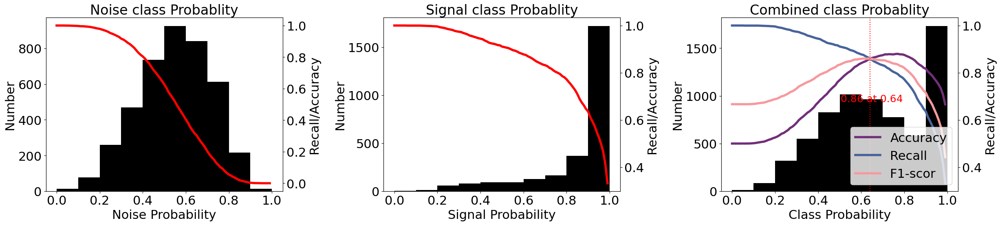

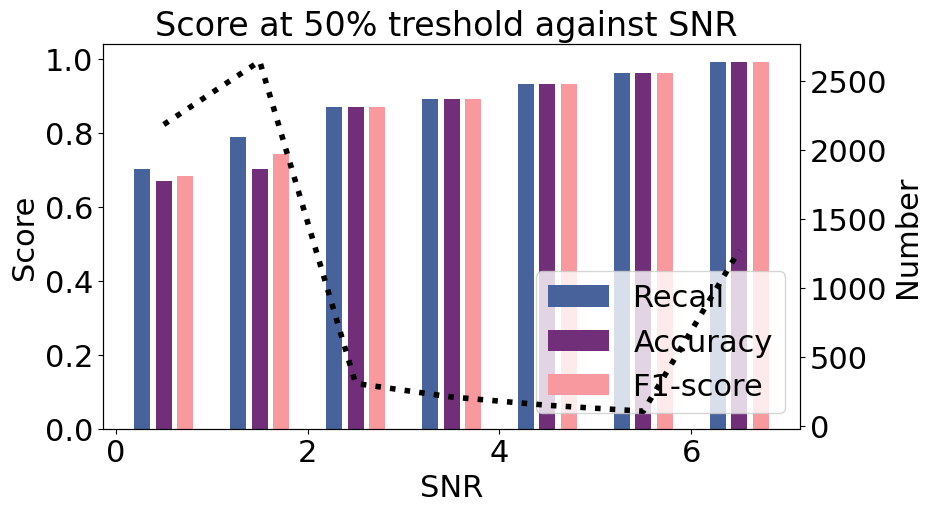

In [70]:
f1,f2, L = plotprobs(pred_list_GPD3,labels)
BestP3['GPD'] = L[0]
BestT3['GPD'] = L[1]
BestA3['GPD'] = L[3]
BestR3['GPD'] = L[2]
f1.savefig("Figure/GPD_Prob_MI.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/GPD_Snr_MI.svg", dpi=100, bbox_inches='tight')

## PhaseNet

In [71]:
# Load the pre-trained PhaseNet model
print(PhaseNet.list_pretrained())
model = PhaseNet.from_pretrained("original")
model.to('cpu:0')


['diting', 'ethz', 'geofon', 'instance', 'iquique', 'jma', 'jma_wc', 'lendb', 'neic', 'obs', 'original', 'phasenet_sn', 'pisdl', 'scedc', 'stead', 'volpick']


PhaseNet(
  (inc): Conv1d(3, 8, kernel_size=(7,), stride=(1,), padding=same)
  (in_bn): BatchNorm1d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (down_branch): ModuleList(
    (0): ModuleList(
      (0): Conv1d(8, 8, kernel_size=(7,), stride=(1,), padding=same, bias=False)
      (1): BatchNorm1d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): Conv1d(8, 8, kernel_size=(7,), stride=(4,), padding=(3,), bias=False)
      (3): BatchNorm1d(8, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): ModuleList(
      (0): Conv1d(8, 16, kernel_size=(7,), stride=(1,), padding=same, bias=False)
      (1): BatchNorm1d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): Conv1d(16, 16, kernel_size=(7,), stride=(4,), bias=False)
      (3): BatchNorm1d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (2): ModuleList(
      (0): Conv1d(16, 32, kernel_size=(7,), stride=(1,

In [72]:
%autoawait on
pred_list = []
tic()
for i in tqdm(range(len(datasetMI))):
    preds = model.annotate(datasetMI[i][0])
    pred_list.append(max(preds[0].data) )
toc()
chrono3['PhaseNet']=tac()
pred_list_phase3 = np.array(pred_list)

  0%|                                                                                                                                | 0/6869 [00:00<?, ?it/s]

  0%|                                                                                                                        | 5/6869 [00:00<02:36, 43.92it/s]

  0%|▏                                                                                                                      | 10/6869 [00:00<03:09, 36.25it/s]

  0%|▏                                                                                                                      | 14/6869 [00:00<03:12, 35.61it/s]

  0%|▎                                                                                                                      | 18/6869 [00:00<03:34, 31.88it/s]

  0%|▍                                                                                                                      | 22/6869 [00:00<04:06, 27.80it/s]

  0%|▍                                                                                                                      | 26/6869 [00:00<04:16, 26.65it/s]

  0%|▌                                                                                                                      | 30/6869 [00:00<03:50, 29.65it/s]

  1%|▌                                                                                                                      | 35/6869 [00:01<03:26, 33.02it/s]

  1%|▋                                                                                                                      | 39/6869 [00:01<03:27, 32.88it/s]

  1%|▊                                                                                                                      | 44/6869 [00:01<03:08, 36.29it/s]

  1%|▊                                                                                                                      | 48/6869 [00:01<03:14, 35.12it/s]

  1%|▉                                                                                                                      | 52/6869 [00:01<03:23, 33.56it/s]

  1%|▉                                                                                                                      | 56/6869 [00:01<03:18, 34.26it/s]

  1%|█                                                                                                                      | 60/6869 [00:01<03:56, 28.75it/s]

  1%|█                                                                                                                      | 64/6869 [00:02<03:47, 29.95it/s]

  1%|█▏                                                                                                                     | 69/6869 [00:02<03:18, 34.32it/s]

  1%|█▎                                                                                                                     | 73/6869 [00:02<03:52, 29.24it/s]

  1%|█▎                                                                                                                     | 77/6869 [00:02<04:08, 27.29it/s]

  1%|█▍                                                                                                                     | 80/6869 [00:02<04:05, 27.62it/s]

  1%|█▍                                                                                                                     | 83/6869 [00:02<04:34, 24.72it/s]

  1%|█▌                                                                                                                     | 87/6869 [00:02<04:04, 27.69it/s]

  1%|█▌                                                                                                                     | 90/6869 [00:02<04:03, 27.85it/s]

  1%|█▋                                                                                                                     | 94/6869 [00:03<03:50, 29.33it/s]

  1%|█▋                                                                                                                     | 98/6869 [00:03<03:48, 29.60it/s]

  1%|█▊                                                                                                                    | 102/6869 [00:03<03:43, 30.32it/s]

  2%|█▊                                                                                                                    | 106/6869 [00:03<03:35, 31.39it/s]

  2%|█▉                                                                                                                    | 110/6869 [00:03<04:04, 27.67it/s]

  2%|█▉                                                                                                                    | 115/6869 [00:03<03:37, 31.12it/s]

  2%|██                                                                                                                    | 119/6869 [00:03<03:37, 30.98it/s]

  2%|██                                                                                                                    | 123/6869 [00:04<04:09, 27.02it/s]

  2%|██▏                                                                                                                   | 127/6869 [00:04<03:53, 28.89it/s]

  2%|██▎                                                                                                                   | 131/6869 [00:04<04:03, 27.62it/s]

  2%|██▎                                                                                                                   | 134/6869 [00:04<04:08, 27.08it/s]

  2%|██▎                                                                                                                   | 138/6869 [00:04<04:08, 27.10it/s]

  2%|██▍                                                                                                                   | 142/6869 [00:04<03:51, 29.10it/s]

  2%|██▍                                                                                                                   | 145/6869 [00:04<04:14, 26.47it/s]

  2%|██▌                                                                                                                   | 149/6869 [00:04<03:52, 28.89it/s]

  2%|██▋                                                                                                                   | 154/6869 [00:05<03:34, 31.33it/s]

  2%|██▋                                                                                                                   | 158/6869 [00:05<04:06, 27.23it/s]

  2%|██▊                                                                                                                   | 161/6869 [00:05<04:05, 27.33it/s]

  2%|██▊                                                                                                                   | 165/6869 [00:05<03:45, 29.79it/s]

  2%|██▉                                                                                                                   | 169/6869 [00:05<04:08, 26.98it/s]

  3%|██▉                                                                                                                   | 172/6869 [00:05<04:14, 26.27it/s]

  3%|███                                                                                                                   | 175/6869 [00:06<04:49, 23.12it/s]

  3%|███                                                                                                                   | 179/6869 [00:06<04:14, 26.31it/s]

  3%|███▏                                                                                                                  | 182/6869 [00:06<04:10, 26.70it/s]

  3%|███▏                                                                                                                  | 185/6869 [00:06<04:08, 26.85it/s]

  3%|███▏                                                                                                                  | 189/6869 [00:06<04:18, 25.84it/s]

  3%|███▎                                                                                                                  | 192/6869 [00:06<04:19, 25.77it/s]

  3%|███▎                                                                                                                  | 195/6869 [00:06<04:35, 24.26it/s]

  3%|███▍                                                                                                                  | 198/6869 [00:06<04:42, 23.65it/s]

  3%|███▍                                                                                                                  | 202/6869 [00:07<04:28, 24.79it/s]

  3%|███▌                                                                                                                  | 206/6869 [00:07<04:00, 27.72it/s]

  3%|███▌                                                                                                                  | 209/6869 [00:07<03:57, 28.03it/s]

  3%|███▋                                                                                                                  | 212/6869 [00:07<04:14, 26.14it/s]

  3%|███▋                                                                                                                  | 215/6869 [00:07<04:30, 24.55it/s]

  3%|███▋                                                                                                                  | 218/6869 [00:07<04:39, 23.83it/s]

  3%|███▊                                                                                                                  | 221/6869 [00:07<05:00, 22.16it/s]

  3%|███▉                                                                                                                  | 226/6869 [00:07<03:59, 27.72it/s]

  3%|███▉                                                                                                                  | 229/6869 [00:08<04:11, 26.39it/s]

  3%|████                                                                                                                  | 233/6869 [00:08<03:51, 28.60it/s]

  3%|████                                                                                                                  | 237/6869 [00:08<03:33, 31.02it/s]

  4%|████▏                                                                                                                 | 241/6869 [00:08<03:40, 30.06it/s]

  4%|████▏                                                                                                                 | 245/6869 [00:08<03:39, 30.13it/s]

  4%|████▎                                                                                                                 | 249/6869 [00:08<04:15, 25.89it/s]

  4%|████▎                                                                                                                 | 253/6869 [00:08<03:53, 28.37it/s]

  4%|████▍                                                                                                                 | 257/6869 [00:09<03:53, 28.34it/s]

  4%|████▍                                                                                                                 | 261/6869 [00:09<03:32, 31.08it/s]

  4%|████▌                                                                                                                 | 265/6869 [00:09<03:37, 30.37it/s]

  4%|████▌                                                                                                                 | 269/6869 [00:09<03:42, 29.70it/s]

  4%|████▋                                                                                                                 | 273/6869 [00:09<03:37, 30.28it/s]

  4%|████▊                                                                                                                 | 277/6869 [00:09<04:08, 26.54it/s]

  4%|████▊                                                                                                                 | 282/6869 [00:09<03:38, 30.14it/s]

  4%|████▉                                                                                                                 | 286/6869 [00:09<03:39, 30.05it/s]

  4%|████▉                                                                                                                 | 290/6869 [00:10<03:52, 28.24it/s]

  4%|█████                                                                                                                 | 293/6869 [00:10<03:59, 27.45it/s]

  4%|█████                                                                                                                 | 296/6869 [00:10<04:10, 26.24it/s]

  4%|█████▏                                                                                                                | 300/6869 [00:10<03:48, 28.75it/s]

  4%|█████▏                                                                                                                | 303/6869 [00:10<04:07, 26.53it/s]

  4%|█████▎                                                                                                                | 306/6869 [00:10<04:20, 25.16it/s]

  4%|█████▎                                                                                                                | 309/6869 [00:10<04:23, 24.94it/s]

  5%|█████▍                                                                                                                | 313/6869 [00:11<03:49, 28.62it/s]

  5%|█████▍                                                                                                                | 316/6869 [00:11<04:09, 26.27it/s]

  5%|█████▍                                                                                                                | 319/6869 [00:11<04:37, 23.63it/s]

  5%|█████▌                                                                                                                | 323/6869 [00:11<04:20, 25.12it/s]

  5%|█████▌                                                                                                                | 326/6869 [00:11<04:16, 25.48it/s]

  5%|█████▋                                                                                                                | 329/6869 [00:11<04:39, 23.36it/s]

  5%|█████▋                                                                                                                | 332/6869 [00:11<05:05, 21.37it/s]

  5%|█████▊                                                                                                                | 336/6869 [00:11<04:22, 24.91it/s]

  5%|█████▊                                                                                                                | 340/6869 [00:12<04:12, 25.91it/s]

  5%|█████▉                                                                                                                | 343/6869 [00:12<04:07, 26.34it/s]

  5%|█████▉                                                                                                                | 347/6869 [00:12<03:57, 27.52it/s]

  5%|██████                                                                                                                | 350/6869 [00:12<03:55, 27.65it/s]

  5%|██████                                                                                                                | 353/6869 [00:12<04:00, 27.08it/s]

  5%|██████▏                                                                                                               | 357/6869 [00:12<03:38, 29.85it/s]

  5%|██████▏                                                                                                               | 361/6869 [00:12<03:35, 30.16it/s]

  5%|██████▎                                                                                                               | 365/6869 [00:12<03:29, 31.02it/s]

  5%|██████▎                                                                                                               | 369/6869 [00:13<03:47, 28.59it/s]

  5%|██████▍                                                                                                               | 373/6869 [00:13<03:30, 30.84it/s]

  5%|██████▍                                                                                                               | 377/6869 [00:13<03:42, 29.12it/s]

  6%|██████▌                                                                                                               | 381/6869 [00:13<03:32, 30.51it/s]

  6%|██████▌                                                                                                               | 385/6869 [00:13<03:59, 27.10it/s]

  6%|██████▋                                                                                                               | 388/6869 [00:13<04:12, 25.62it/s]

  6%|██████▋                                                                                                               | 391/6869 [00:13<04:31, 23.86it/s]

  6%|██████▊                                                                                                               | 396/6869 [00:14<03:45, 28.66it/s]

  6%|██████▊                                                                                                               | 399/6869 [00:14<03:53, 27.74it/s]

  6%|██████▉                                                                                                               | 402/6869 [00:14<03:56, 27.29it/s]

  6%|██████▉                                                                                                               | 405/6869 [00:14<04:35, 23.43it/s]

  6%|███████                                                                                                               | 409/6869 [00:14<04:00, 26.83it/s]

  6%|███████                                                                                                               | 412/6869 [00:14<04:39, 23.14it/s]

  6%|███████▏                                                                                                              | 415/6869 [00:14<04:30, 23.87it/s]

  6%|███████▏                                                                                                              | 420/6869 [00:15<04:01, 26.76it/s]

  6%|███████▎                                                                                                              | 424/6869 [00:15<04:07, 26.09it/s]

  6%|███████▎                                                                                                              | 428/6869 [00:15<04:05, 26.20it/s]

  6%|███████▍                                                                                                              | 431/6869 [00:15<04:08, 25.92it/s]

  6%|███████▍                                                                                                              | 435/6869 [00:15<04:01, 26.67it/s]

  6%|███████▌                                                                                                              | 438/6869 [00:15<04:31, 23.66it/s]

  6%|███████▌                                                                                                              | 442/6869 [00:15<04:04, 26.25it/s]

  7%|███████▋                                                                                                              | 447/6869 [00:16<03:42, 28.86it/s]

  7%|███████▋                                                                                                              | 450/6869 [00:16<04:08, 25.78it/s]

  7%|███████▊                                                                                                              | 455/6869 [00:16<03:51, 27.69it/s]

  7%|███████▊                                                                                                              | 458/6869 [00:16<03:58, 26.89it/s]

  7%|███████▉                                                                                                              | 463/6869 [00:16<03:29, 30.54it/s]

  7%|████████                                                                                                              | 467/6869 [00:16<03:40, 29.00it/s]

  7%|████████                                                                                                              | 470/6869 [00:16<03:40, 28.97it/s]

  7%|████████▏                                                                                                             | 474/6869 [00:17<03:39, 29.18it/s]

  7%|████████▏                                                                                                             | 477/6869 [00:17<03:48, 27.94it/s]

  7%|████████▏                                                                                                             | 480/6869 [00:17<03:51, 27.65it/s]

  7%|████████▎                                                                                                             | 483/6869 [00:17<03:47, 28.06it/s]

  7%|████████▎                                                                                                             | 487/6869 [00:17<03:24, 31.23it/s]

  7%|████████▍                                                                                                             | 491/6869 [00:17<03:40, 28.99it/s]

  7%|████████▍                                                                                                             | 494/6869 [00:17<03:40, 28.86it/s]

  7%|████████▌                                                                                                             | 498/6869 [00:17<03:34, 29.70it/s]

  7%|████████▋                                                                                                             | 503/6869 [00:17<03:17, 32.17it/s]

  7%|████████▋                                                                                                             | 507/6869 [00:18<03:38, 29.12it/s]

  7%|████████▊                                                                                                             | 510/6869 [00:18<04:06, 25.77it/s]

  7%|████████▊                                                                                                             | 514/6869 [00:18<03:50, 27.63it/s]

  8%|████████▉                                                                                                             | 518/6869 [00:18<03:41, 28.65it/s]

  8%|████████▉                                                                                                             | 521/6869 [00:18<03:44, 28.34it/s]

  8%|█████████                                                                                                             | 525/6869 [00:18<03:43, 28.37it/s]

  8%|█████████                                                                                                             | 530/6869 [00:18<03:15, 32.38it/s]

  8%|█████████▏                                                                                                            | 534/6869 [00:19<03:19, 31.75it/s]

  8%|█████████▏                                                                                                            | 538/6869 [00:19<03:44, 28.16it/s]

  8%|█████████▎                                                                                                            | 541/6869 [00:19<03:55, 26.89it/s]

  8%|█████████▎                                                                                                            | 544/6869 [00:19<03:58, 26.47it/s]

  8%|█████████▍                                                                                                            | 547/6869 [00:19<04:14, 24.84it/s]

  8%|█████████▍                                                                                                            | 551/6869 [00:19<04:01, 26.12it/s]

  8%|█████████▌                                                                                                            | 554/6869 [00:19<04:19, 24.36it/s]

  8%|█████████▌                                                                                                            | 557/6869 [00:20<04:14, 24.85it/s]

  8%|█████████▌                                                                                                            | 560/6869 [00:20<04:03, 25.94it/s]

  8%|█████████▋                                                                                                            | 563/6869 [00:20<03:54, 26.87it/s]

  8%|█████████▋                                                                                                            | 566/6869 [00:20<04:10, 25.20it/s]

  8%|█████████▊                                                                                                            | 570/6869 [00:20<03:44, 28.11it/s]

  8%|█████████▊                                                                                                            | 574/6869 [00:20<03:43, 28.16it/s]

  8%|█████████▉                                                                                                            | 577/6869 [00:20<03:56, 26.57it/s]

  8%|█████████▉                                                                                                            | 580/6869 [00:20<04:05, 25.60it/s]

  9%|██████████                                                                                                            | 584/6869 [00:21<03:56, 26.55it/s]

  9%|██████████                                                                                                            | 587/6869 [00:21<04:15, 24.54it/s]

  9%|██████████▏                                                                                                           | 592/6869 [00:21<03:42, 28.18it/s]

  9%|██████████▏                                                                                                           | 595/6869 [00:21<04:04, 25.69it/s]

  9%|██████████▎                                                                                                           | 599/6869 [00:21<03:44, 27.91it/s]

  9%|██████████▎                                                                                                           | 602/6869 [00:21<03:48, 27.38it/s]

  9%|██████████▍                                                                                                           | 606/6869 [00:21<03:55, 26.57it/s]

  9%|██████████▍                                                                                                           | 609/6869 [00:21<04:14, 24.61it/s]

  9%|██████████▌                                                                                                           | 612/6869 [00:22<04:19, 24.11it/s]

  9%|██████████▌                                                                                                           | 615/6869 [00:22<04:11, 24.85it/s]

  9%|██████████▌                                                                                                           | 618/6869 [00:22<04:28, 23.25it/s]

  9%|██████████▋                                                                                                           | 622/6869 [00:22<03:49, 27.21it/s]

  9%|██████████▋                                                                                                           | 625/6869 [00:22<04:09, 25.07it/s]

  9%|██████████▊                                                                                                           | 628/6869 [00:22<04:06, 25.29it/s]

  9%|██████████▊                                                                                                           | 632/6869 [00:22<03:52, 26.79it/s]

  9%|██████████▉                                                                                                           | 636/6869 [00:22<03:34, 29.09it/s]

  9%|██████████▉                                                                                                           | 639/6869 [00:23<04:05, 25.40it/s]

  9%|███████████                                                                                                           | 642/6869 [00:23<03:59, 25.96it/s]

  9%|███████████                                                                                                           | 646/6869 [00:23<03:39, 28.33it/s]

  9%|███████████▏                                                                                                          | 649/6869 [00:23<03:56, 26.31it/s]

  9%|███████████▏                                                                                                          | 652/6869 [00:23<03:51, 26.88it/s]

 10%|███████████▎                                                                                                          | 656/6869 [00:23<03:47, 27.31it/s]

 10%|███████████▎                                                                                                          | 661/6869 [00:23<03:27, 29.88it/s]

 10%|███████████▍                                                                                                          | 665/6869 [00:24<03:16, 31.58it/s]

 10%|███████████▍                                                                                                          | 669/6869 [00:24<03:44, 27.60it/s]

 10%|███████████▌                                                                                                          | 673/6869 [00:24<03:44, 27.57it/s]

 10%|███████████▋                                                                                                          | 677/6869 [00:24<03:27, 29.80it/s]

 10%|███████████▋                                                                                                          | 681/6869 [00:24<04:12, 24.47it/s]

 10%|███████████▊                                                                                                          | 685/6869 [00:24<03:46, 27.34it/s]

 10%|███████████▊                                                                                                          | 689/6869 [00:24<03:58, 25.91it/s]

 10%|███████████▉                                                                                                          | 694/6869 [00:25<03:49, 26.91it/s]

 10%|███████████▉                                                                                                          | 698/6869 [00:25<03:33, 28.87it/s]

 10%|████████████                                                                                                          | 702/6869 [00:25<03:33, 28.92it/s]

 10%|████████████                                                                                                          | 705/6869 [00:25<03:53, 26.41it/s]

 10%|████████████▏                                                                                                         | 709/6869 [00:25<03:33, 28.89it/s]

 10%|████████████▏                                                                                                         | 712/6869 [00:25<04:07, 24.86it/s]

 10%|████████████▎                                                                                                         | 717/6869 [00:25<03:34, 28.74it/s]

 10%|████████████▍                                                                                                         | 721/6869 [00:26<03:54, 26.18it/s]

 11%|████████████▍                                                                                                         | 724/6869 [00:26<03:48, 26.93it/s]

 11%|████████████▍                                                                                                         | 727/6869 [00:26<03:42, 27.57it/s]

 11%|████████████▌                                                                                                         | 730/6869 [00:26<03:55, 26.11it/s]

 11%|████████████▌                                                                                                         | 733/6869 [00:26<04:03, 25.21it/s]

 11%|████████████▋                                                                                                         | 736/6869 [00:26<04:16, 23.93it/s]

 11%|████████████▋                                                                                                         | 740/6869 [00:26<03:42, 27.58it/s]

 11%|████████████▊                                                                                                         | 743/6869 [00:26<03:44, 27.24it/s]

 11%|████████████▊                                                                                                         | 746/6869 [00:27<04:06, 24.80it/s]

 11%|████████████▉                                                                                                         | 750/6869 [00:27<03:48, 26.83it/s]

 11%|████████████▉                                                                                                         | 753/6869 [00:27<04:04, 25.04it/s]

 11%|████████████▉                                                                                                         | 756/6869 [00:27<04:05, 24.88it/s]

 11%|█████████████                                                                                                         | 761/6869 [00:27<03:48, 26.71it/s]

 11%|█████████████                                                                                                         | 764/6869 [00:27<03:53, 26.14it/s]

 11%|█████████████▏                                                                                                        | 768/6869 [00:27<03:31, 28.84it/s]

 11%|█████████████▏                                                                                                        | 771/6869 [00:28<04:02, 25.11it/s]

 11%|█████████████▎                                                                                                        | 775/6869 [00:28<03:36, 28.19it/s]

 11%|█████████████▎                                                                                                        | 778/6869 [00:28<03:48, 26.69it/s]

 11%|█████████████▍                                                                                                        | 781/6869 [00:28<03:55, 25.85it/s]

 11%|█████████████▍                                                                                                        | 785/6869 [00:28<03:33, 28.56it/s]

 11%|█████████████▌                                                                                                        | 788/6869 [00:28<03:31, 28.79it/s]

 12%|█████████████▌                                                                                                        | 791/6869 [00:28<03:51, 26.22it/s]

 12%|█████████████▋                                                                                                        | 795/6869 [00:28<03:45, 26.99it/s]

 12%|█████████████▋                                                                                                        | 798/6869 [00:29<04:01, 25.19it/s]

 12%|█████████████▊                                                                                                        | 802/6869 [00:29<03:32, 28.55it/s]

 12%|█████████████▊                                                                                                        | 805/6869 [00:29<03:43, 27.10it/s]

 12%|█████████████▉                                                                                                        | 810/6869 [00:29<03:16, 30.82it/s]

 12%|█████████████▉                                                                                                        | 814/6869 [00:29<03:25, 29.53it/s]

 12%|██████████████                                                                                                        | 817/6869 [00:29<03:33, 28.32it/s]

 12%|██████████████                                                                                                        | 821/6869 [00:29<03:18, 30.51it/s]

 12%|██████████████▏                                                                                                       | 825/6869 [00:29<03:14, 31.01it/s]

 12%|██████████████▏                                                                                                       | 829/6869 [00:30<03:14, 31.01it/s]

 12%|██████████████▎                                                                                                       | 833/6869 [00:30<03:51, 26.03it/s]

 12%|██████████████▎                                                                                                       | 836/6869 [00:30<04:20, 23.15it/s]

 12%|██████████████▍                                                                                                       | 840/6869 [00:30<03:54, 25.66it/s]

 12%|██████████████▍                                                                                                       | 843/6869 [00:30<04:29, 22.39it/s]

 12%|██████████████▌                                                                                                       | 846/6869 [00:30<04:19, 23.23it/s]

 12%|██████████████▌                                                                                                       | 851/6869 [00:30<03:42, 27.02it/s]

 12%|██████████████▋                                                                                                       | 854/6869 [00:31<03:56, 25.39it/s]

 12%|██████████████▋                                                                                                       | 858/6869 [00:31<03:45, 26.67it/s]

 13%|██████████████▊                                                                                                       | 861/6869 [00:31<03:52, 25.88it/s]

 13%|██████████████▊                                                                                                       | 865/6869 [00:31<03:37, 27.61it/s]

 13%|██████████████▉                                                                                                       | 868/6869 [00:31<03:50, 26.07it/s]

 13%|██████████████▉                                                                                                       | 872/6869 [00:31<03:52, 25.82it/s]

 13%|███████████████                                                                                                       | 876/6869 [00:31<03:32, 28.24it/s]

 13%|███████████████                                                                                                       | 879/6869 [00:32<03:54, 25.58it/s]

 13%|███████████████▏                                                                                                      | 882/6869 [00:32<03:56, 25.35it/s]

 13%|███████████████▏                                                                                                      | 885/6869 [00:32<03:47, 26.33it/s]

 13%|███████████████▎                                                                                                      | 889/6869 [00:32<03:27, 28.85it/s]

 13%|███████████████▎                                                                                                      | 892/6869 [00:32<03:41, 27.00it/s]

 13%|███████████████▍                                                                                                      | 896/6869 [00:32<03:30, 28.44it/s]

 13%|███████████████▍                                                                                                      | 899/6869 [00:32<03:33, 28.03it/s]

 13%|███████████████▍                                                                                                      | 902/6869 [00:32<03:30, 28.34it/s]

 13%|███████████████▌                                                                                                      | 905/6869 [00:32<03:41, 26.87it/s]

 13%|███████████████▌                                                                                                      | 908/6869 [00:33<03:39, 27.20it/s]

 13%|███████████████▋                                                                                                      | 911/6869 [00:33<03:49, 25.97it/s]

 13%|███████████████▋                                                                                                      | 914/6869 [00:33<04:10, 23.78it/s]

 13%|███████████████▊                                                                                                      | 917/6869 [00:33<04:03, 24.41it/s]

 13%|███████████████▊                                                                                                      | 920/6869 [00:33<03:58, 24.99it/s]

 13%|███████████████▊                                                                                                      | 924/6869 [00:33<03:35, 27.61it/s]

 13%|███████████████▉                                                                                                      | 927/6869 [00:33<03:53, 25.41it/s]

 14%|███████████████▉                                                                                                      | 931/6869 [00:33<03:44, 26.39it/s]

 14%|████████████████                                                                                                      | 934/6869 [00:34<04:00, 24.67it/s]

 14%|████████████████▏                                                                                                     | 939/6869 [00:34<03:21, 29.42it/s]

 14%|████████████████▏                                                                                                     | 943/6869 [00:34<03:24, 28.92it/s]

 14%|████████████████▎                                                                                                     | 947/6869 [00:34<03:37, 27.21it/s]

 14%|████████████████▎                                                                                                     | 951/6869 [00:34<03:37, 27.19it/s]

 14%|████████████████▍                                                                                                     | 954/6869 [00:34<03:42, 26.54it/s]

 14%|████████████████▍                                                                                                     | 957/6869 [00:34<04:05, 24.08it/s]

 14%|████████████████▌                                                                                                     | 961/6869 [00:35<03:40, 26.79it/s]

 14%|████████████████▌                                                                                                     | 964/6869 [00:35<04:12, 23.38it/s]

 14%|████████████████▋                                                                                                     | 969/6869 [00:35<03:28, 28.30it/s]

 14%|████████████████▋                                                                                                     | 972/6869 [00:35<03:40, 26.76it/s]

 14%|████████████████▊                                                                                                     | 976/6869 [00:35<03:24, 28.78it/s]

 14%|████████████████▊                                                                                                     | 979/6869 [00:35<03:22, 29.05it/s]

 14%|████████████████▊                                                                                                     | 982/6869 [00:35<03:33, 27.56it/s]

 14%|████████████████▉                                                                                                     | 985/6869 [00:35<03:35, 27.30it/s]

 14%|████████████████▉                                                                                                     | 989/6869 [00:36<03:21, 29.24it/s]

 14%|█████████████████                                                                                                     | 992/6869 [00:36<03:36, 27.13it/s]

 14%|█████████████████                                                                                                     | 996/6869 [00:36<03:30, 27.83it/s]

 15%|█████████████████                                                                                                    | 1000/6869 [00:36<03:18, 29.54it/s]

 15%|█████████████████                                                                                                    | 1004/6869 [00:36<03:15, 29.95it/s]

 15%|█████████████████▏                                                                                                   | 1008/6869 [00:36<03:44, 26.07it/s]

 15%|█████████████████▏                                                                                                   | 1012/6869 [00:36<03:38, 26.77it/s]

 15%|█████████████████▎                                                                                                   | 1015/6869 [00:37<03:52, 25.19it/s]

 15%|█████████████████▎                                                                                                   | 1019/6869 [00:37<03:27, 28.18it/s]

 15%|█████████████████▍                                                                                                   | 1022/6869 [00:37<03:48, 25.62it/s]

 15%|█████████████████▍                                                                                                   | 1027/6869 [00:37<03:15, 29.82it/s]

 15%|█████████████████▌                                                                                                   | 1031/6869 [00:37<03:18, 29.37it/s]

 15%|█████████████████▋                                                                                                   | 1035/6869 [00:37<03:36, 26.96it/s]

 15%|█████████████████▋                                                                                                   | 1039/6869 [00:37<03:17, 29.54it/s]

 15%|█████████████████▊                                                                                                   | 1043/6869 [00:38<03:18, 29.30it/s]

 15%|█████████████████▊                                                                                                   | 1048/6869 [00:38<03:18, 29.34it/s]

 15%|█████████████████▉                                                                                                   | 1052/6869 [00:38<03:13, 30.03it/s]

 15%|█████████████████▉                                                                                                   | 1056/6869 [00:38<03:20, 28.92it/s]

 15%|██████████████████                                                                                                   | 1059/6869 [00:38<03:23, 28.57it/s]

 15%|██████████████████                                                                                                   | 1062/6869 [00:38<03:24, 28.37it/s]

 16%|██████████████████▏                                                                                                  | 1065/6869 [00:38<03:57, 24.47it/s]

 16%|██████████████████▏                                                                                                  | 1068/6869 [00:39<04:03, 23.83it/s]

 16%|██████████████████▎                                                                                                  | 1072/6869 [00:39<03:54, 24.72it/s]

 16%|██████████████████▎                                                                                                  | 1076/6869 [00:39<03:31, 27.42it/s]

 16%|██████████████████▍                                                                                                  | 1079/6869 [00:39<03:46, 25.53it/s]

 16%|██████████████████▍                                                                                                  | 1082/6869 [00:39<04:18, 22.40it/s]

 16%|██████████████████▌                                                                                                  | 1087/6869 [00:39<03:41, 26.05it/s]

 16%|██████████████████▌                                                                                                  | 1090/6869 [00:39<03:43, 25.90it/s]

 16%|██████████████████▌                                                                                                  | 1093/6869 [00:40<04:23, 21.93it/s]

 16%|██████████████████▋                                                                                                  | 1097/6869 [00:40<03:46, 25.44it/s]

 16%|██████████████████▊                                                                                                  | 1101/6869 [00:40<03:24, 28.27it/s]

 16%|██████████████████▊                                                                                                  | 1105/6869 [00:40<03:40, 26.11it/s]

 16%|██████████████████▊                                                                                                  | 1108/6869 [00:40<03:41, 26.05it/s]

 16%|██████████████████▉                                                                                                  | 1112/6869 [00:40<03:27, 27.73it/s]

 16%|██████████████████▉                                                                                                  | 1115/6869 [00:40<03:40, 26.08it/s]

 16%|███████████████████                                                                                                  | 1118/6869 [00:40<03:43, 25.77it/s]

 16%|███████████████████                                                                                                  | 1121/6869 [00:41<04:07, 23.22it/s]

 16%|███████████████████▏                                                                                                 | 1124/6869 [00:41<03:54, 24.53it/s]

 16%|███████████████████▏                                                                                                 | 1127/6869 [00:41<03:42, 25.83it/s]

 16%|███████████████████▏                                                                                                 | 1130/6869 [00:41<03:46, 25.35it/s]

 16%|███████████████████▎                                                                                                 | 1133/6869 [00:41<03:49, 25.02it/s]

 17%|███████████████████▎                                                                                                 | 1137/6869 [00:41<03:18, 28.87it/s]

 17%|███████████████████▍                                                                                                 | 1140/6869 [00:41<03:38, 26.25it/s]

 17%|███████████████████▍                                                                                                 | 1144/6869 [00:41<03:19, 28.68it/s]

 17%|███████████████████▌                                                                                                 | 1147/6869 [00:42<03:51, 24.70it/s]

 17%|███████████████████▌                                                                                                 | 1150/6869 [00:42<03:45, 25.39it/s]

 17%|███████████████████▋                                                                                                 | 1154/6869 [00:42<03:24, 27.92it/s]

 17%|███████████████████▋                                                                                                 | 1157/6869 [00:42<03:47, 25.15it/s]

 17%|███████████████████▊                                                                                                 | 1160/6869 [00:42<04:05, 23.26it/s]

 17%|███████████████████▊                                                                                                 | 1164/6869 [00:42<03:51, 24.66it/s]

 17%|███████████████████▉                                                                                                 | 1167/6869 [00:42<03:42, 25.66it/s]

 17%|███████████████████▉                                                                                                 | 1170/6869 [00:42<03:33, 26.69it/s]

 17%|███████████████████▉                                                                                                 | 1174/6869 [00:43<03:21, 28.28it/s]

 17%|████████████████████                                                                                                 | 1177/6869 [00:43<03:31, 26.91it/s]

 17%|████████████████████                                                                                                 | 1180/6869 [00:43<03:34, 26.55it/s]

 17%|████████████████████▏                                                                                                | 1184/6869 [00:43<03:31, 26.86it/s]

 17%|████████████████████▏                                                                                                | 1187/6869 [00:43<03:38, 26.02it/s]

 17%|████████████████████▎                                                                                                | 1191/6869 [00:43<03:20, 28.32it/s]

 17%|████████████████████▎                                                                                                | 1194/6869 [00:43<03:31, 26.84it/s]

 17%|████████████████████▍                                                                                                | 1197/6869 [00:43<03:27, 27.38it/s]

 17%|████████████████████▍                                                                                                | 1201/6869 [00:44<03:21, 28.18it/s]

 18%|████████████████████▌                                                                                                | 1204/6869 [00:44<04:04, 23.19it/s]

 18%|████████████████████▌                                                                                                | 1207/6869 [00:44<03:55, 24.05it/s]

 18%|████████████████████▋                                                                                                | 1211/6869 [00:44<03:45, 25.13it/s]

 18%|████████████████████▋                                                                                                | 1216/6869 [00:44<03:09, 29.89it/s]

 18%|████████████████████▊                                                                                                | 1220/6869 [00:44<03:04, 30.67it/s]

 18%|████████████████████▊                                                                                                | 1224/6869 [00:44<03:29, 26.90it/s]

 18%|████████████████████▉                                                                                                | 1228/6869 [00:45<03:14, 28.97it/s]

 18%|████████████████████▉                                                                                                | 1232/6869 [00:45<03:47, 24.83it/s]

 18%|█████████████████████                                                                                                | 1237/6869 [00:45<03:08, 29.91it/s]

 18%|█████████████████████▏                                                                                               | 1241/6869 [00:45<03:15, 28.73it/s]

 18%|█████████████████████▏                                                                                               | 1245/6869 [00:45<03:17, 28.44it/s]

 18%|█████████████████████▎                                                                                               | 1249/6869 [00:45<03:19, 28.23it/s]

 18%|█████████████████████▎                                                                                               | 1253/6869 [00:45<03:04, 30.38it/s]

 18%|█████████████████████▍                                                                                               | 1257/6869 [00:46<03:07, 29.93it/s]

 18%|█████████████████████▍                                                                                               | 1261/6869 [00:46<03:08, 29.82it/s]

 18%|█████████████████████▌                                                                                               | 1265/6869 [00:46<03:16, 28.52it/s]

 18%|█████████████████████▌                                                                                               | 1268/6869 [00:46<03:17, 28.29it/s]

 19%|█████████████████████▋                                                                                               | 1271/6869 [00:46<03:16, 28.51it/s]

 19%|█████████████████████▋                                                                                               | 1274/6869 [00:46<03:29, 26.69it/s]

 19%|█████████████████████▊                                                                                               | 1277/6869 [00:46<03:32, 26.32it/s]

 19%|█████████████████████▊                                                                                               | 1280/6869 [00:46<03:37, 25.65it/s]

 19%|█████████████████████▊                                                                                               | 1284/6869 [00:47<03:15, 28.54it/s]

 19%|█████████████████████▉                                                                                               | 1287/6869 [00:47<03:25, 27.14it/s]

 19%|█████████████████████▉                                                                                               | 1290/6869 [00:47<03:38, 25.52it/s]

 19%|██████████████████████                                                                                               | 1293/6869 [00:47<03:32, 26.27it/s]

 19%|██████████████████████                                                                                               | 1296/6869 [00:47<03:36, 25.78it/s]

 19%|██████████████████████▏                                                                                              | 1299/6869 [00:47<03:42, 25.06it/s]

 19%|██████████████████████▏                                                                                              | 1302/6869 [00:47<03:39, 25.38it/s]

 19%|██████████████████████▏                                                                                              | 1305/6869 [00:47<03:46, 24.58it/s]

 19%|██████████████████████▎                                                                                              | 1309/6869 [00:48<03:20, 27.70it/s]

 19%|██████████████████████▎                                                                                              | 1312/6869 [00:48<03:36, 25.72it/s]

 19%|██████████████████████▍                                                                                              | 1315/6869 [00:48<03:43, 24.80it/s]

 19%|██████████████████████▍                                                                                              | 1318/6869 [00:48<03:46, 24.56it/s]

 19%|██████████████████████▌                                                                                              | 1321/6869 [00:48<03:39, 25.29it/s]

 19%|██████████████████████▌                                                                                              | 1324/6869 [00:48<04:04, 22.66it/s]

 19%|██████████████████████▌                                                                                              | 1327/6869 [00:48<03:58, 23.19it/s]

 19%|██████████████████████▋                                                                                              | 1331/6869 [00:48<03:26, 26.78it/s]

 19%|██████████████████████▋                                                                                              | 1334/6869 [00:49<03:40, 25.10it/s]

 19%|██████████████████████▊                                                                                              | 1339/6869 [00:49<03:31, 26.10it/s]

 20%|██████████████████████▊                                                                                              | 1342/6869 [00:49<03:42, 24.89it/s]

 20%|██████████████████████▉                                                                                              | 1345/6869 [00:49<03:32, 26.04it/s]

 20%|██████████████████████▉                                                                                              | 1349/6869 [00:49<03:16, 28.11it/s]

 20%|███████████████████████                                                                                              | 1352/6869 [00:49<03:33, 25.88it/s]

 20%|███████████████████████                                                                                              | 1356/6869 [00:49<03:25, 26.78it/s]

 20%|███████████████████████▏                                                                                             | 1361/6869 [00:50<03:25, 26.75it/s]

 20%|███████████████████████▎                                                                                             | 1365/6869 [00:50<03:13, 28.49it/s]

 20%|███████████████████████▎                                                                                             | 1368/6869 [00:50<03:44, 24.51it/s]

 20%|███████████████████████▎                                                                                             | 1372/6869 [00:50<03:19, 27.55it/s]

 20%|███████████████████████▍                                                                                             | 1376/6869 [00:50<03:03, 29.89it/s]

 20%|███████████████████████▌                                                                                             | 1380/6869 [00:50<03:32, 25.80it/s]

 20%|███████████████████████▌                                                                                             | 1384/6869 [00:50<03:12, 28.55it/s]

 20%|███████████████████████▋                                                                                             | 1388/6869 [00:51<03:10, 28.71it/s]

 20%|███████████████████████▋                                                                                             | 1392/6869 [00:51<03:12, 28.44it/s]

 20%|███████████████████████▊                                                                                             | 1397/6869 [00:51<03:13, 28.32it/s]

 20%|███████████████████████▊                                                                                             | 1400/6869 [00:51<03:22, 27.02it/s]

 20%|███████████████████████▉                                                                                             | 1403/6869 [00:51<03:17, 27.69it/s]

 20%|███████████████████████▉                                                                                             | 1406/6869 [00:51<03:18, 27.51it/s]

 21%|████████████████████████                                                                                             | 1411/6869 [00:51<02:50, 32.02it/s]

 21%|████████████████████████                                                                                             | 1415/6869 [00:51<03:12, 28.27it/s]

 21%|████████████████████████▏                                                                                            | 1419/6869 [00:52<03:19, 27.32it/s]

 21%|████████████████████████▏                                                                                            | 1422/6869 [00:52<03:25, 26.54it/s]

 21%|████████████████████████▎                                                                                            | 1426/6869 [00:52<03:04, 29.48it/s]

 21%|████████████████████████▎                                                                                            | 1430/6869 [00:52<03:10, 28.53it/s]

 21%|████████████████████████▍                                                                                            | 1433/6869 [00:52<03:28, 26.08it/s]

 21%|████████████████████████▍                                                                                            | 1438/6869 [00:52<03:20, 27.04it/s]

 21%|████████████████████████▌                                                                                            | 1441/6869 [00:52<03:34, 25.33it/s]

 21%|████████████████████████▌                                                                                            | 1445/6869 [00:53<03:27, 26.11it/s]

 21%|████████████████████████▋                                                                                            | 1448/6869 [00:53<03:49, 23.65it/s]

 21%|████████████████████████▋                                                                                            | 1452/6869 [00:53<03:28, 26.01it/s]

 21%|████████████████████████▊                                                                                            | 1456/6869 [00:53<03:14, 27.77it/s]

 21%|████████████████████████▊                                                                                            | 1459/6869 [00:53<03:16, 27.51it/s]

 21%|████████████████████████▉                                                                                            | 1462/6869 [00:53<03:12, 28.04it/s]

 21%|████████████████████████▉                                                                                            | 1465/6869 [00:53<03:17, 27.40it/s]

 21%|█████████████████████████                                                                                            | 1468/6869 [00:54<03:31, 25.57it/s]

 21%|█████████████████████████                                                                                            | 1472/6869 [00:54<03:07, 28.79it/s]

 21%|█████████████████████████                                                                                            | 1475/6869 [00:54<03:12, 28.01it/s]

 22%|█████████████████████████▏                                                                                           | 1479/6869 [00:54<03:05, 29.12it/s]

 22%|█████████████████████████▎                                                                                           | 1483/6869 [00:54<02:55, 30.71it/s]

 22%|█████████████████████████▎                                                                                           | 1487/6869 [00:54<03:14, 27.70it/s]

 22%|█████████████████████████▍                                                                                           | 1490/6869 [00:54<03:11, 28.14it/s]

 22%|█████████████████████████▍                                                                                           | 1493/6869 [00:54<03:08, 28.49it/s]

 22%|█████████████████████████▍                                                                                           | 1497/6869 [00:54<03:13, 27.69it/s]

 22%|█████████████████████████▌                                                                                           | 1501/6869 [00:55<02:55, 30.61it/s]

 22%|█████████████████████████▋                                                                                           | 1505/6869 [00:55<03:16, 27.24it/s]

 22%|█████████████████████████▋                                                                                           | 1511/6869 [00:55<02:57, 30.17it/s]

 22%|█████████████████████████▊                                                                                           | 1515/6869 [00:55<02:55, 30.45it/s]

 22%|█████████████████████████▊                                                                                           | 1519/6869 [00:55<03:07, 28.53it/s]

 22%|█████████████████████████▉                                                                                           | 1522/6869 [00:55<03:20, 26.71it/s]

 22%|█████████████████████████▉                                                                                           | 1525/6869 [00:55<03:15, 27.34it/s]

 22%|██████████████████████████                                                                                           | 1529/6869 [00:56<03:02, 29.33it/s]

 22%|██████████████████████████                                                                                           | 1532/6869 [00:56<03:14, 27.37it/s]

 22%|██████████████████████████▏                                                                                          | 1535/6869 [00:56<03:12, 27.74it/s]

 22%|██████████████████████████▏                                                                                          | 1538/6869 [00:56<03:09, 28.06it/s]

 22%|██████████████████████████▏                                                                                          | 1541/6869 [00:56<03:25, 25.92it/s]

 22%|██████████████████████████▎                                                                                          | 1544/6869 [00:56<03:25, 25.94it/s]

 23%|██████████████████████████▎                                                                                          | 1547/6869 [00:56<03:35, 24.69it/s]

 23%|██████████████████████████▍                                                                                          | 1551/6869 [00:56<03:14, 27.39it/s]

 23%|██████████████████████████▍                                                                                          | 1554/6869 [00:57<03:15, 27.16it/s]

 23%|██████████████████████████▌                                                                                          | 1557/6869 [00:57<03:23, 26.11it/s]

 23%|██████████████████████████▌                                                                                          | 1561/6869 [00:57<03:11, 27.73it/s]

 23%|██████████████████████████▋                                                                                          | 1565/6869 [00:57<03:05, 28.63it/s]

 23%|██████████████████████████▋                                                                                          | 1569/6869 [00:57<03:04, 28.73it/s]

 23%|██████████████████████████▊                                                                                          | 1573/6869 [00:57<02:58, 29.71it/s]

 23%|██████████████████████████▊                                                                                          | 1577/6869 [00:57<03:03, 28.89it/s]

 23%|██████████████████████████▉                                                                                          | 1581/6869 [00:57<02:51, 30.77it/s]

 23%|██████████████████████████▉                                                                                          | 1585/6869 [00:58<03:05, 28.43it/s]

 23%|███████████████████████████                                                                                          | 1588/6869 [00:58<03:04, 28.64it/s]

 23%|███████████████████████████                                                                                          | 1591/6869 [00:58<03:18, 26.53it/s]

 23%|███████████████████████████▏                                                                                         | 1595/6869 [00:58<03:01, 29.07it/s]

 23%|███████████████████████████▏                                                                                         | 1599/6869 [00:58<02:45, 31.87it/s]

 23%|███████████████████████████▎                                                                                         | 1603/6869 [00:58<02:56, 29.79it/s]

 23%|███████████████████████████▎                                                                                         | 1607/6869 [00:58<03:25, 25.60it/s]

 23%|███████████████████████████▍                                                                                         | 1612/6869 [00:59<02:57, 29.66it/s]

 24%|███████████████████████████▌                                                                                         | 1616/6869 [00:59<02:48, 31.27it/s]

 24%|███████████████████████████▌                                                                                         | 1620/6869 [00:59<03:03, 28.53it/s]

 24%|███████████████████████████▋                                                                                         | 1624/6869 [00:59<03:48, 22.98it/s]

 24%|███████████████████████████▋                                                                                         | 1628/6869 [00:59<03:28, 25.17it/s]

 24%|███████████████████████████▊                                                                                         | 1632/6869 [00:59<03:25, 25.53it/s]

 24%|███████████████████████████▊                                                                                         | 1636/6869 [00:59<03:06, 28.07it/s]

 24%|███████████████████████████▉                                                                                         | 1640/6869 [01:00<02:56, 29.67it/s]

 24%|████████████████████████████                                                                                         | 1644/6869 [01:00<02:57, 29.38it/s]

 24%|████████████████████████████                                                                                         | 1648/6869 [01:00<03:25, 25.39it/s]

 24%|████████████████████████████                                                                                         | 1651/6869 [01:00<03:31, 24.67it/s]

 24%|████████████████████████████▏                                                                                        | 1655/6869 [01:00<03:07, 27.85it/s]

 24%|████████████████████████████▏                                                                                        | 1658/6869 [01:00<03:21, 25.92it/s]

 24%|████████████████████████████▎                                                                                        | 1662/6869 [01:00<03:04, 28.24it/s]

 24%|████████████████████████████▎                                                                                        | 1665/6869 [01:01<03:18, 26.27it/s]

 24%|████████████████████████████▍                                                                                        | 1669/6869 [01:01<02:56, 29.44it/s]

 24%|████████████████████████████▍                                                                                        | 1673/6869 [01:01<03:21, 25.76it/s]

 24%|████████████████████████████▌                                                                                        | 1677/6869 [01:01<03:03, 28.22it/s]

 24%|████████████████████████████▋                                                                                        | 1681/6869 [01:01<02:59, 28.83it/s]

 25%|████████████████████████████▋                                                                                        | 1685/6869 [01:01<03:07, 27.71it/s]

 25%|████████████████████████████▊                                                                                        | 1688/6869 [01:01<03:17, 26.23it/s]

 25%|████████████████████████████▊                                                                                        | 1691/6869 [01:02<03:18, 26.08it/s]

 25%|████████████████████████████▊                                                                                        | 1694/6869 [01:02<03:35, 24.04it/s]

 25%|████████████████████████████▉                                                                                        | 1697/6869 [01:02<03:37, 23.83it/s]

 25%|█████████████████████████████                                                                                        | 1703/6869 [01:02<03:07, 27.62it/s]

 25%|█████████████████████████████                                                                                        | 1706/6869 [01:02<03:11, 26.92it/s]

 25%|█████████████████████████████▏                                                                                       | 1710/6869 [01:02<03:03, 28.05it/s]

 25%|█████████████████████████████▏                                                                                       | 1713/6869 [01:02<03:07, 27.55it/s]

 25%|█████████████████████████████▏                                                                                       | 1717/6869 [01:02<02:58, 28.82it/s]

 25%|█████████████████████████████▎                                                                                       | 1720/6869 [01:03<03:11, 26.90it/s]

 25%|█████████████████████████████▎                                                                                       | 1723/6869 [01:03<03:13, 26.64it/s]

 25%|█████████████████████████████▍                                                                                       | 1727/6869 [01:03<03:07, 27.45it/s]

 25%|█████████████████████████████▍                                                                                       | 1731/6869 [01:03<03:00, 28.53it/s]

 25%|█████████████████████████████▌                                                                                       | 1734/6869 [01:03<03:02, 28.13it/s]

 25%|█████████████████████████████▌                                                                                       | 1738/6869 [01:03<02:57, 28.85it/s]

 25%|█████████████████████████████▋                                                                                       | 1741/6869 [01:03<03:00, 28.43it/s]

 25%|█████████████████████████████▋                                                                                       | 1744/6869 [01:03<03:19, 25.72it/s]

 25%|█████████████████████████████▊                                                                                       | 1749/6869 [01:04<03:02, 28.00it/s]

 26%|█████████████████████████████▊                                                                                       | 1752/6869 [01:04<03:10, 26.91it/s]

 26%|█████████████████████████████▉                                                                                       | 1757/6869 [01:04<02:49, 30.17it/s]

 26%|█████████████████████████████▉                                                                                       | 1761/6869 [01:04<03:08, 27.11it/s]

 26%|██████████████████████████████                                                                                       | 1764/6869 [01:04<03:04, 27.68it/s]

 26%|██████████████████████████████                                                                                       | 1767/6869 [01:04<03:17, 25.83it/s]

 26%|██████████████████████████████▏                                                                                      | 1771/6869 [01:04<03:00, 28.31it/s]

 26%|██████████████████████████████▏                                                                                      | 1774/6869 [01:05<03:11, 26.59it/s]

 26%|██████████████████████████████▎                                                                                      | 1777/6869 [01:05<03:34, 23.75it/s]

 26%|██████████████████████████████▎                                                                                      | 1781/6869 [01:05<03:20, 25.36it/s]

 26%|██████████████████████████████▍                                                                                      | 1785/6869 [01:05<03:00, 28.24it/s]

 26%|██████████████████████████████▍                                                                                      | 1788/6869 [01:05<03:06, 27.24it/s]

 26%|██████████████████████████████▌                                                                                      | 1791/6869 [01:05<03:25, 24.66it/s]

 26%|██████████████████████████████▌                                                                                      | 1795/6869 [01:05<02:59, 28.26it/s]

 26%|██████████████████████████████▋                                                                                      | 1798/6869 [01:05<03:19, 25.40it/s]

 26%|██████████████████████████████▋                                                                                      | 1802/6869 [01:06<03:20, 25.22it/s]

 26%|██████████████████████████████▊                                                                                      | 1807/6869 [01:06<02:57, 28.49it/s]

 26%|██████████████████████████████▊                                                                                      | 1810/6869 [01:06<02:56, 28.71it/s]

 26%|██████████████████████████████▉                                                                                      | 1813/6869 [01:06<03:10, 26.50it/s]

 26%|██████████████████████████████▉                                                                                      | 1817/6869 [01:06<03:05, 27.26it/s]

 27%|███████████████████████████████                                                                                      | 1821/6869 [01:06<03:06, 27.13it/s]

 27%|███████████████████████████████                                                                                      | 1825/6869 [01:06<03:09, 26.64it/s]

 27%|███████████████████████████████▏                                                                                     | 1828/6869 [01:07<03:09, 26.63it/s]

 27%|███████████████████████████████▏                                                                                     | 1831/6869 [01:07<03:06, 27.08it/s]

 27%|███████████████████████████████▏                                                                                     | 1834/6869 [01:07<03:09, 26.62it/s]

 27%|███████████████████████████████▎                                                                                     | 1838/6869 [01:07<02:53, 29.01it/s]

 27%|███████████████████████████████▎                                                                                     | 1841/6869 [01:07<03:12, 26.17it/s]

 27%|███████████████████████████████▍                                                                                     | 1844/6869 [01:07<03:20, 25.11it/s]

 27%|███████████████████████████████▍                                                                                     | 1848/6869 [01:07<03:01, 27.68it/s]

 27%|███████████████████████████████▌                                                                                     | 1851/6869 [01:07<03:26, 24.30it/s]

 27%|███████████████████████████████▋                                                                                     | 1857/6869 [01:08<03:08, 26.61it/s]

 27%|███████████████████████████████▋                                                                                     | 1861/6869 [01:08<02:57, 28.23it/s]

 27%|███████████████████████████████▋                                                                                     | 1864/6869 [01:08<02:55, 28.49it/s]

 27%|███████████████████████████████▊                                                                                     | 1867/6869 [01:08<03:03, 27.25it/s]

 27%|███████████████████████████████▊                                                                                     | 1870/6869 [01:08<03:02, 27.40it/s]

 27%|███████████████████████████████▉                                                                                     | 1873/6869 [01:08<03:05, 26.91it/s]

 27%|███████████████████████████████▉                                                                                     | 1876/6869 [01:08<03:18, 25.15it/s]

 27%|████████████████████████████████                                                                                     | 1879/6869 [01:08<03:11, 26.02it/s]

 27%|████████████████████████████████                                                                                     | 1883/6869 [01:09<02:56, 28.24it/s]

 27%|████████████████████████████████                                                                                     | 1886/6869 [01:09<02:59, 27.84it/s]

 28%|████████████████████████████████▏                                                                                    | 1889/6869 [01:09<03:22, 24.61it/s]

 28%|████████████████████████████████▏                                                                                    | 1893/6869 [01:09<02:58, 27.95it/s]

 28%|████████████████████████████████▎                                                                                    | 1896/6869 [01:09<03:14, 25.53it/s]

 28%|████████████████████████████████▎                                                                                    | 1899/6869 [01:09<03:08, 26.33it/s]

 28%|████████████████████████████████▍                                                                                    | 1903/6869 [01:09<02:51, 29.02it/s]

 28%|████████████████████████████████▍                                                                                    | 1906/6869 [01:09<02:52, 28.71it/s]

 28%|████████████████████████████████▌                                                                                    | 1909/6869 [01:10<03:09, 26.12it/s]

 28%|████████████████████████████████▌                                                                                    | 1913/6869 [01:10<02:50, 29.07it/s]

 28%|████████████████████████████████▋                                                                                    | 1916/6869 [01:10<02:57, 27.88it/s]

 28%|████████████████████████████████▋                                                                                    | 1919/6869 [01:10<02:56, 28.02it/s]

 28%|████████████████████████████████▊                                                                                    | 1924/6869 [01:10<02:28, 33.24it/s]

 28%|████████████████████████████████▊                                                                                    | 1928/6869 [01:10<02:25, 34.02it/s]

 28%|████████████████████████████████▉                                                                                    | 1932/6869 [01:10<02:49, 29.15it/s]

 28%|████████████████████████████████▉                                                                                    | 1936/6869 [01:11<03:33, 23.16it/s]

 28%|█████████████████████████████████                                                                                    | 1941/6869 [01:11<03:11, 25.75it/s]

 28%|█████████████████████████████████▏                                                                                   | 1945/6869 [01:11<02:59, 27.46it/s]

 28%|█████████████████████████████████▏                                                                                   | 1949/6869 [01:11<02:49, 29.03it/s]

 28%|█████████████████████████████████▎                                                                                   | 1953/6869 [01:11<03:14, 25.27it/s]

 28%|█████████████████████████████████▎                                                                                   | 1956/6869 [01:11<03:08, 26.11it/s]

 29%|█████████████████████████████████▎                                                                                   | 1959/6869 [01:11<03:04, 26.57it/s]

 29%|█████████████████████████████████▍                                                                                   | 1962/6869 [01:11<03:02, 26.90it/s]

 29%|█████████████████████████████████▍                                                                                   | 1966/6869 [01:12<02:47, 29.20it/s]

 29%|█████████████████████████████████▌                                                                                   | 1970/6869 [01:12<03:19, 24.57it/s]

 29%|█████████████████████████████████▌                                                                                   | 1974/6869 [01:12<03:03, 26.72it/s]

 29%|█████████████████████████████████▋                                                                                   | 1978/6869 [01:12<02:53, 28.12it/s]

 29%|█████████████████████████████████▋                                                                                   | 1981/6869 [01:12<02:58, 27.40it/s]

 29%|█████████████████████████████████▊                                                                                   | 1984/6869 [01:12<03:02, 26.83it/s]

 29%|█████████████████████████████████▊                                                                                   | 1987/6869 [01:12<03:17, 24.73it/s]

 29%|█████████████████████████████████▉                                                                                   | 1991/6869 [01:13<03:01, 26.83it/s]

 29%|█████████████████████████████████▉                                                                                   | 1994/6869 [01:13<03:18, 24.55it/s]

 29%|██████████████████████████████████                                                                                   | 1998/6869 [01:13<03:05, 26.25it/s]

 29%|██████████████████████████████████                                                                                   | 2001/6869 [01:13<03:11, 25.40it/s]

 29%|██████████████████████████████████▏                                                                                  | 2004/6869 [01:13<03:22, 24.00it/s]

 29%|██████████████████████████████████▏                                                                                  | 2008/6869 [01:13<03:04, 26.34it/s]

 29%|██████████████████████████████████▎                                                                                  | 2011/6869 [01:13<03:03, 26.46it/s]

 29%|██████████████████████████████████▎                                                                                  | 2014/6869 [01:13<03:00, 26.90it/s]

 29%|██████████████████████████████████▎                                                                                  | 2017/6869 [01:14<03:07, 25.93it/s]

 29%|██████████████████████████████████▍                                                                                  | 2020/6869 [01:14<03:10, 25.43it/s]

 29%|██████████████████████████████████▍                                                                                  | 2023/6869 [01:14<03:14, 24.97it/s]

 29%|██████████████████████████████████▌                                                                                  | 2026/6869 [01:14<03:32, 22.83it/s]

 30%|██████████████████████████████████▌                                                                                  | 2029/6869 [01:14<03:32, 22.74it/s]

 30%|██████████████████████████████████▋                                                                                  | 2033/6869 [01:14<03:02, 26.44it/s]

 30%|██████████████████████████████████▋                                                                                  | 2036/6869 [01:14<03:12, 25.05it/s]

 30%|██████████████████████████████████▋                                                                                  | 2039/6869 [01:15<03:19, 24.22it/s]

 30%|██████████████████████████████████▊                                                                                  | 2042/6869 [01:15<03:32, 22.69it/s]

 30%|██████████████████████████████████▊                                                                                  | 2045/6869 [01:15<03:32, 22.75it/s]

 30%|██████████████████████████████████▉                                                                                  | 2049/6869 [01:15<03:14, 24.83it/s]

 30%|██████████████████████████████████▉                                                                                  | 2052/6869 [01:15<03:13, 24.91it/s]

 30%|███████████████████████████████████                                                                                  | 2056/6869 [01:15<02:51, 28.09it/s]

 30%|███████████████████████████████████                                                                                  | 2059/6869 [01:15<03:05, 25.94it/s]

 30%|███████████████████████████████████▏                                                                                 | 2063/6869 [01:15<03:03, 26.25it/s]

 30%|███████████████████████████████████▏                                                                                 | 2066/6869 [01:16<03:05, 25.91it/s]

 30%|███████████████████████████████████▏                                                                                 | 2069/6869 [01:16<03:01, 26.49it/s]

 30%|███████████████████████████████████▎                                                                                 | 2072/6869 [01:16<03:03, 26.15it/s]

 30%|███████████████████████████████████▎                                                                                 | 2075/6869 [01:16<03:12, 24.85it/s]

 30%|███████████████████████████████████▍                                                                                 | 2079/6869 [01:16<03:09, 25.25it/s]

 30%|███████████████████████████████████▍                                                                                 | 2082/6869 [01:16<03:01, 26.34it/s]

 30%|███████████████████████████████████▌                                                                                 | 2085/6869 [01:16<03:12, 24.89it/s]

 30%|███████████████████████████████████▌                                                                                 | 2089/6869 [01:16<02:52, 27.66it/s]

 30%|███████████████████████████████████▋                                                                                 | 2092/6869 [01:17<02:50, 28.01it/s]

 30%|███████████████████████████████████▋                                                                                 | 2095/6869 [01:17<03:01, 26.25it/s]

 31%|███████████████████████████████████▋                                                                                 | 2098/6869 [01:17<03:16, 24.25it/s]

 31%|███████████████████████████████████▊                                                                                 | 2103/6869 [01:17<02:38, 30.14it/s]

 31%|███████████████████████████████████▉                                                                                 | 2107/6869 [01:17<02:51, 27.71it/s]

 31%|███████████████████████████████████▉                                                                                 | 2110/6869 [01:17<02:49, 28.04it/s]

 31%|████████████████████████████████████                                                                                 | 2114/6869 [01:17<02:43, 29.10it/s]

 31%|████████████████████████████████████                                                                                 | 2117/6869 [01:17<02:55, 27.03it/s]

 31%|████████████████████████████████████                                                                                 | 2120/6869 [01:18<03:12, 24.71it/s]

 31%|████████████████████████████████████▏                                                                                | 2124/6869 [01:18<02:52, 27.58it/s]

 31%|████████████████████████████████████▏                                                                                | 2128/6869 [01:18<02:55, 26.99it/s]

 31%|████████████████████████████████████▎                                                                                | 2132/6869 [01:18<02:39, 29.63it/s]

 31%|████████████████████████████████████▍                                                                                | 2136/6869 [01:18<02:44, 28.79it/s]

 31%|████████████████████████████████████▍                                                                                | 2139/6869 [01:18<02:49, 27.85it/s]

 31%|████████████████████████████████████▌                                                                                | 2143/6869 [01:18<02:37, 29.93it/s]

 31%|████████████████████████████████████▌                                                                                | 2147/6869 [01:19<02:52, 27.38it/s]

 31%|████████████████████████████████████▋                                                                                | 2151/6869 [01:19<02:45, 28.58it/s]

 31%|████████████████████████████████████▋                                                                                | 2154/6869 [01:19<02:53, 27.11it/s]

 31%|████████████████████████████████████▋                                                                                | 2157/6869 [01:19<02:57, 26.54it/s]

 31%|████████████████████████████████████▊                                                                                | 2161/6869 [01:19<02:45, 28.50it/s]

 32%|████████████████████████████████████▊                                                                                | 2164/6869 [01:19<02:47, 28.12it/s]

 32%|████████████████████████████████████▉                                                                                | 2167/6869 [01:19<02:56, 26.62it/s]

 32%|████████████████████████████████████▉                                                                                | 2170/6869 [01:19<02:56, 26.70it/s]

 32%|█████████████████████████████████████                                                                                | 2174/6869 [01:20<02:53, 27.12it/s]

 32%|█████████████████████████████████████                                                                                | 2178/6869 [01:20<02:48, 27.83it/s]

 32%|█████████████████████████████████████▏                                                                               | 2181/6869 [01:20<02:59, 26.14it/s]

 32%|█████████████████████████████████████▏                                                                               | 2185/6869 [01:20<02:59, 26.13it/s]

 32%|█████████████████████████████████████▎                                                                               | 2190/6869 [01:20<02:34, 30.22it/s]

 32%|█████████████████████████████████████▎                                                                               | 2194/6869 [01:20<03:03, 25.46it/s]

 32%|█████████████████████████████████████▍                                                                               | 2198/6869 [01:20<02:46, 28.10it/s]

 32%|█████████████████████████████████████▌                                                                               | 2202/6869 [01:21<03:05, 25.21it/s]

 32%|█████████████████████████████████████▌                                                                               | 2205/6869 [01:21<02:59, 26.02it/s]

 32%|█████████████████████████████████████▋                                                                               | 2209/6869 [01:21<03:09, 24.54it/s]

 32%|█████████████████████████████████████▋                                                                               | 2213/6869 [01:21<02:58, 26.16it/s]

 32%|█████████████████████████████████████▊                                                                               | 2217/6869 [01:21<02:59, 25.95it/s]

 32%|█████████████████████████████████████▊                                                                               | 2221/6869 [01:21<02:42, 28.53it/s]

 32%|█████████████████████████████████████▉                                                                               | 2224/6869 [01:21<03:06, 24.96it/s]

 32%|█████████████████████████████████████▉                                                                               | 2227/6869 [01:22<03:24, 22.68it/s]

 32%|██████████████████████████████████████                                                                               | 2231/6869 [01:22<02:58, 25.96it/s]

 33%|██████████████████████████████████████                                                                               | 2234/6869 [01:22<03:09, 24.45it/s]

 33%|██████████████████████████████████████                                                                               | 2238/6869 [01:22<02:50, 27.10it/s]

 33%|██████████████████████████████████████▏                                                                              | 2241/6869 [01:22<03:29, 22.07it/s]

 33%|██████████████████████████████████████▎                                                                              | 2246/6869 [01:22<03:03, 25.22it/s]

 33%|██████████████████████████████████████▎                                                                              | 2249/6869 [01:22<03:05, 24.86it/s]

 33%|██████████████████████████████████████▎                                                                              | 2252/6869 [01:23<03:07, 24.67it/s]

 33%|██████████████████████████████████████▍                                                                              | 2257/6869 [01:23<02:46, 27.69it/s]

 33%|██████████████████████████████████████▍                                                                              | 2260/6869 [01:23<02:45, 27.78it/s]

 33%|██████████████████████████████████████▌                                                                              | 2263/6869 [01:23<02:54, 26.44it/s]

 33%|██████████████████████████████████████▌                                                                              | 2266/6869 [01:23<02:50, 27.00it/s]

 33%|██████████████████████████████████████▋                                                                              | 2269/6869 [01:23<02:50, 26.94it/s]

 33%|██████████████████████████████████████▋                                                                              | 2272/6869 [01:23<02:56, 25.99it/s]

 33%|██████████████████████████████████████▊                                                                              | 2276/6869 [01:23<02:51, 26.80it/s]

 33%|██████████████████████████████████████▊                                                                              | 2279/6869 [01:24<03:00, 25.46it/s]

 33%|██████████████████████████████████████▊                                                                              | 2282/6869 [01:24<02:53, 26.39it/s]

 33%|██████████████████████████████████████▉                                                                              | 2286/6869 [01:24<02:35, 29.52it/s]

 33%|██████████████████████████████████████▉                                                                              | 2289/6869 [01:24<02:45, 27.61it/s]

 33%|███████████████████████████████████████                                                                              | 2292/6869 [01:24<03:01, 25.16it/s]

 33%|███████████████████████████████████████                                                                              | 2295/6869 [01:24<02:53, 26.35it/s]

 33%|███████████████████████████████████████▏                                                                             | 2298/6869 [01:24<02:53, 26.38it/s]

 33%|███████████████████████████████████████▏                                                                             | 2301/6869 [01:24<02:51, 26.59it/s]

 34%|███████████████████████████████████████▏                                                                             | 2304/6869 [01:25<03:04, 24.69it/s]

 34%|███████████████████████████████████████▎                                                                             | 2308/6869 [01:25<02:55, 25.99it/s]

 34%|███████████████████████████████████████▎                                                                             | 2311/6869 [01:25<02:55, 26.00it/s]

 34%|███████████████████████████████████████▍                                                                             | 2314/6869 [01:25<02:57, 25.72it/s]

 34%|███████████████████████████████████████▍                                                                             | 2317/6869 [01:25<03:00, 25.19it/s]

 34%|███████████████████████████████████████▌                                                                             | 2321/6869 [01:25<02:59, 25.27it/s]

 34%|███████████████████████████████████████▌                                                                             | 2324/6869 [01:25<02:58, 25.51it/s]

 34%|███████████████████████████████████████▋                                                                             | 2328/6869 [01:25<02:43, 27.80it/s]

 34%|███████████████████████████████████████▋                                                                             | 2331/6869 [01:26<02:54, 26.00it/s]

 34%|███████████████████████████████████████▊                                                                             | 2334/6869 [01:26<02:47, 27.00it/s]

 34%|███████████████████████████████████████▊                                                                             | 2338/6869 [01:26<02:48, 26.94it/s]

 34%|███████████████████████████████████████▊                                                                             | 2341/6869 [01:26<03:04, 24.48it/s]

 34%|███████████████████████████████████████▉                                                                             | 2344/6869 [01:26<03:07, 24.19it/s]

 34%|███████████████████████████████████████▉                                                                             | 2347/6869 [01:26<03:16, 22.99it/s]

 34%|████████████████████████████████████████                                                                             | 2350/6869 [01:26<03:04, 24.47it/s]

 34%|████████████████████████████████████████                                                                             | 2354/6869 [01:26<02:43, 27.59it/s]

 34%|████████████████████████████████████████▏                                                                            | 2358/6869 [01:27<02:36, 28.74it/s]

 34%|████████████████████████████████████████▏                                                                            | 2361/6869 [01:27<02:49, 26.64it/s]

 34%|████████████████████████████████████████▎                                                                            | 2365/6869 [01:27<02:40, 28.12it/s]

 34%|████████████████████████████████████████▎                                                                            | 2369/6869 [01:27<02:36, 28.74it/s]

 35%|████████████████████████████████████████▍                                                                            | 2372/6869 [01:27<02:35, 28.86it/s]

 35%|████████████████████████████████████████▍                                                                            | 2375/6869 [01:27<02:49, 26.50it/s]

 35%|████████████████████████████████████████▌                                                                            | 2378/6869 [01:27<02:47, 26.80it/s]

 35%|████████████████████████████████████████▌                                                                            | 2382/6869 [01:27<02:33, 29.21it/s]

 35%|████████████████████████████████████████▋                                                                            | 2386/6869 [01:28<02:26, 30.69it/s]

 35%|████████████████████████████████████████▋                                                                            | 2390/6869 [01:28<02:49, 26.41it/s]

 35%|████████████████████████████████████████▊                                                                            | 2395/6869 [01:28<02:29, 29.96it/s]

 35%|████████████████████████████████████████▊                                                                            | 2399/6869 [01:28<02:43, 27.27it/s]

 35%|████████████████████████████████████████▉                                                                            | 2404/6869 [01:28<02:24, 30.83it/s]

 35%|█████████████████████████████████████████                                                                            | 2408/6869 [01:28<02:26, 30.47it/s]

 35%|█████████████████████████████████████████                                                                            | 2412/6869 [01:28<02:23, 30.95it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2416/6869 [01:29<02:26, 30.32it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2420/6869 [01:29<02:30, 29.65it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2424/6869 [01:29<02:34, 28.68it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2428/6869 [01:29<02:31, 29.28it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2431/6869 [01:29<02:41, 27.48it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2434/6869 [01:29<02:40, 27.64it/s]

 35%|█████████████████████████████████████████▌                                                                           | 2438/6869 [01:29<02:25, 30.39it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2442/6869 [01:29<02:25, 30.49it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2446/6869 [01:30<02:39, 27.68it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2450/6869 [01:30<02:39, 27.78it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2455/6869 [01:30<02:27, 30.00it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2459/6869 [01:30<02:29, 29.43it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2462/6869 [01:30<02:31, 29.10it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2465/6869 [01:30<02:41, 27.27it/s]

 36%|██████████████████████████████████████████                                                                           | 2468/6869 [01:30<02:44, 26.74it/s]

 36%|██████████████████████████████████████████                                                                           | 2472/6869 [01:31<02:32, 28.86it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2475/6869 [01:31<02:36, 27.99it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2478/6869 [01:31<02:37, 27.95it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2481/6869 [01:31<02:52, 25.40it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2484/6869 [01:31<02:46, 26.29it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2488/6869 [01:31<02:28, 29.51it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2492/6869 [01:31<02:54, 25.05it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2495/6869 [01:31<02:52, 25.39it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2498/6869 [01:32<02:55, 24.95it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2502/6869 [01:32<02:50, 25.69it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2505/6869 [01:32<02:59, 24.37it/s]

 37%|██████████████████████████████████████████▋                                                                          | 2508/6869 [01:32<02:52, 25.34it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2512/6869 [01:32<02:32, 28.55it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2515/6869 [01:32<02:43, 26.60it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2519/6869 [01:32<02:34, 28.13it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2523/6869 [01:32<02:23, 30.19it/s]

 37%|███████████████████████████████████████████                                                                          | 2527/6869 [01:33<02:16, 31.87it/s]

 37%|███████████████████████████████████████████                                                                          | 2531/6869 [01:33<02:25, 29.84it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2535/6869 [01:33<02:24, 29.97it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2539/6869 [01:33<02:39, 27.15it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2543/6869 [01:33<02:35, 27.87it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2546/6869 [01:33<02:45, 26.06it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2549/6869 [01:33<02:43, 26.49it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2552/6869 [01:34<03:01, 23.78it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2557/6869 [01:34<02:30, 28.59it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2563/6869 [01:34<02:03, 34.91it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2567/6869 [01:34<02:23, 30.06it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2571/6869 [01:34<02:19, 30.76it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2575/6869 [01:34<02:34, 27.72it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2578/6869 [01:34<02:39, 26.91it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2581/6869 [01:35<02:41, 26.54it/s]

 38%|████████████████████████████████████████████                                                                         | 2585/6869 [01:35<02:29, 28.69it/s]

 38%|████████████████████████████████████████████                                                                         | 2588/6869 [01:35<02:53, 24.72it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2592/6869 [01:35<02:41, 26.45it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2596/6869 [01:35<02:26, 29.19it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2600/6869 [01:35<02:45, 25.83it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2603/6869 [01:35<02:43, 26.04it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2606/6869 [01:35<02:38, 26.87it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2609/6869 [01:36<02:40, 26.53it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2612/6869 [01:36<02:37, 26.98it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2615/6869 [01:36<02:35, 27.37it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2618/6869 [01:36<03:10, 22.31it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2622/6869 [01:36<02:46, 25.58it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2626/6869 [01:36<02:37, 27.01it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2629/6869 [01:36<02:45, 25.62it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2632/6869 [01:36<02:39, 26.64it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2635/6869 [01:37<02:35, 27.15it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2638/6869 [01:37<02:50, 24.85it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2641/6869 [01:37<02:42, 25.97it/s]

 38%|█████████████████████████████████████████████                                                                        | 2644/6869 [01:37<03:14, 21.78it/s]

 39%|█████████████████████████████████████████████                                                                        | 2648/6869 [01:37<02:51, 24.58it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2651/6869 [01:37<02:54, 24.17it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2655/6869 [01:37<02:40, 26.33it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2658/6869 [01:38<02:51, 24.54it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2662/6869 [01:38<02:30, 27.99it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2665/6869 [01:38<02:38, 26.48it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2670/6869 [01:38<02:23, 29.35it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2673/6869 [01:38<02:34, 27.11it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2677/6869 [01:38<02:25, 28.72it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2681/6869 [01:38<02:19, 30.05it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2685/6869 [01:38<02:30, 27.81it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2689/6869 [01:39<02:32, 27.37it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2692/6869 [01:39<02:35, 26.84it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2696/6869 [01:39<02:33, 27.24it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2700/6869 [01:39<02:18, 30.16it/s]

 39%|██████████████████████████████████████████████                                                                       | 2704/6869 [01:39<02:23, 29.07it/s]

 39%|██████████████████████████████████████████████                                                                       | 2707/6869 [01:39<02:34, 26.87it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2710/6869 [01:39<02:32, 27.36it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2713/6869 [01:39<02:29, 27.72it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2718/6869 [01:40<02:28, 27.91it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2722/6869 [01:40<02:19, 29.73it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2726/6869 [01:40<02:21, 29.19it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2729/6869 [01:40<02:23, 28.77it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2733/6869 [01:40<02:19, 29.55it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2737/6869 [01:40<02:20, 29.41it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2740/6869 [01:40<02:33, 26.87it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2744/6869 [01:41<02:23, 28.80it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2748/6869 [01:41<02:18, 29.68it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2751/6869 [01:41<02:28, 27.77it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2754/6869 [01:41<02:26, 28.11it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2758/6869 [01:41<02:19, 29.44it/s]

 40%|███████████████████████████████████████████████                                                                      | 2761/6869 [01:41<02:21, 29.09it/s]

 40%|███████████████████████████████████████████████                                                                      | 2765/6869 [01:41<02:19, 29.42it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2769/6869 [01:41<02:13, 30.80it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2773/6869 [01:41<02:06, 32.44it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2777/6869 [01:42<02:04, 32.90it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2781/6869 [01:42<02:20, 29.08it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2785/6869 [01:42<02:19, 29.20it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2789/6869 [01:42<02:24, 28.30it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2793/6869 [01:42<02:13, 30.57it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2798/6869 [01:42<02:15, 30.01it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2802/6869 [01:42<02:16, 29.77it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2806/6869 [01:43<02:28, 27.42it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2809/6869 [01:43<02:28, 27.36it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2812/6869 [01:43<02:34, 26.20it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2816/6869 [01:43<02:29, 27.05it/s]

 41%|████████████████████████████████████████████████                                                                     | 2819/6869 [01:43<02:31, 26.80it/s]

 41%|████████████████████████████████████████████████                                                                     | 2823/6869 [01:43<02:16, 29.56it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2827/6869 [01:43<02:33, 26.38it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2832/6869 [01:44<02:13, 30.35it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2836/6869 [01:44<02:17, 29.31it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2840/6869 [01:44<02:14, 29.94it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2844/6869 [01:44<02:35, 25.94it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2847/6869 [01:44<02:30, 26.79it/s]

 41%|████████████████████████████████████████████████▌                                                                    | 2850/6869 [01:44<02:29, 26.95it/s]

 42%|████████████████████████████████████████████████▌                                                                    | 2853/6869 [01:44<02:41, 24.82it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2857/6869 [01:45<02:38, 25.34it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2860/6869 [01:45<02:44, 24.35it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2863/6869 [01:45<02:47, 23.89it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2867/6869 [01:45<02:29, 26.70it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2871/6869 [01:45<02:18, 28.80it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2874/6869 [01:45<02:27, 27.08it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2877/6869 [01:45<02:26, 27.33it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2881/6869 [01:45<02:16, 29.23it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2884/6869 [01:46<02:36, 25.46it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2887/6869 [01:46<02:42, 24.54it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2892/6869 [01:46<02:19, 28.57it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2895/6869 [01:46<02:24, 27.42it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2900/6869 [01:46<02:14, 29.53it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2903/6869 [01:46<02:13, 29.62it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2906/6869 [01:46<02:27, 26.78it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2910/6869 [01:46<02:12, 29.83it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2914/6869 [01:47<02:17, 28.71it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2917/6869 [01:47<02:22, 27.76it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2921/6869 [01:47<02:12, 29.72it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2925/6869 [01:47<02:31, 26.11it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2928/6869 [01:47<02:31, 26.00it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2932/6869 [01:47<02:15, 29.01it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2936/6869 [01:47<02:22, 27.50it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2939/6869 [01:48<02:32, 25.85it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2942/6869 [01:48<03:09, 20.69it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2946/6869 [01:48<02:41, 24.32it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2949/6869 [01:48<02:49, 23.08it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2952/6869 [01:48<02:46, 23.49it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2955/6869 [01:48<02:38, 24.71it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2958/6869 [01:48<02:45, 23.70it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2961/6869 [01:48<02:35, 25.10it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2964/6869 [01:49<02:38, 24.65it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2967/6869 [01:49<02:30, 26.00it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2971/6869 [01:49<02:12, 29.44it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2975/6869 [01:49<02:06, 30.78it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2979/6869 [01:49<02:02, 31.74it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2983/6869 [01:49<02:21, 27.54it/s]

 43%|██████████████████████████████████████████████████▉                                                                  | 2987/6869 [01:49<02:16, 28.36it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2991/6869 [01:49<02:10, 29.80it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2995/6869 [01:50<02:00, 32.26it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2999/6869 [01:50<02:00, 32.05it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3003/6869 [01:50<02:04, 30.96it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3007/6869 [01:50<02:18, 27.89it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3010/6869 [01:50<02:17, 28.12it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3014/6869 [01:50<02:08, 29.90it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3018/6869 [01:50<02:10, 29.40it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3021/6869 [01:51<02:21, 27.14it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3024/6869 [01:51<02:19, 27.58it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3027/6869 [01:51<02:41, 23.85it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3032/6869 [01:51<02:18, 27.67it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3035/6869 [01:51<02:21, 27.04it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3038/6869 [01:51<02:25, 26.33it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3042/6869 [01:51<02:17, 27.80it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3045/6869 [01:51<02:26, 26.10it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3049/6869 [01:52<02:13, 28.67it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3052/6869 [01:52<02:20, 27.10it/s]

 44%|████████████████████████████████████████████████████                                                                 | 3055/6869 [01:52<02:23, 26.62it/s]

 45%|████████████████████████████████████████████████████                                                                 | 3059/6869 [01:52<02:20, 27.11it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3063/6869 [01:52<02:07, 29.92it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3067/6869 [01:52<02:07, 29.78it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3071/6869 [01:52<02:17, 27.72it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3075/6869 [01:52<02:11, 28.94it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3078/6869 [01:53<02:11, 28.89it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3081/6869 [01:53<02:23, 26.49it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3084/6869 [01:53<02:33, 24.63it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3087/6869 [01:53<02:29, 25.36it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3091/6869 [01:53<02:15, 27.93it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3096/6869 [01:53<01:57, 31.98it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3100/6869 [01:53<02:13, 28.19it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3103/6869 [01:53<02:14, 28.10it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3106/6869 [01:54<02:21, 26.56it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3109/6869 [01:54<02:26, 25.58it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3112/6869 [01:54<02:21, 26.49it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3115/6869 [01:54<02:27, 25.43it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3118/6869 [01:54<02:22, 26.37it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3121/6869 [01:54<02:21, 26.46it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3125/6869 [01:54<02:08, 29.17it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3128/6869 [01:54<02:18, 27.08it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3132/6869 [01:55<02:19, 26.71it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3136/6869 [01:55<02:05, 29.66it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3140/6869 [01:55<02:25, 25.71it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3144/6869 [01:55<02:17, 27.01it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3150/6869 [01:55<02:04, 29.78it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3154/6869 [01:55<02:08, 28.96it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3158/6869 [01:55<02:00, 30.85it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3162/6869 [01:56<02:02, 30.30it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3166/6869 [01:56<02:15, 27.36it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3170/6869 [01:56<02:07, 28.97it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3174/6869 [01:56<01:59, 30.79it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3178/6869 [01:56<02:03, 29.78it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3182/6869 [01:56<02:01, 30.32it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3186/6869 [01:56<02:27, 24.89it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3189/6869 [01:57<02:27, 24.92it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3192/6869 [01:57<02:30, 24.37it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3195/6869 [01:57<02:34, 23.83it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3200/6869 [01:57<02:10, 28.11it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3203/6869 [01:57<02:13, 27.38it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3207/6869 [01:57<02:03, 29.76it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3211/6869 [01:57<02:23, 25.43it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3215/6869 [01:58<02:08, 28.47it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3219/6869 [01:58<02:04, 29.38it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3223/6869 [01:58<02:17, 26.57it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3227/6869 [01:58<02:12, 27.54it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3230/6869 [01:58<02:19, 26.03it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3233/6869 [01:58<02:29, 24.39it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3236/6869 [01:58<02:24, 25.13it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3239/6869 [01:59<02:25, 24.93it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3242/6869 [01:59<02:22, 25.44it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3245/6869 [01:59<02:24, 25.15it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3248/6869 [01:59<02:20, 25.82it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3252/6869 [01:59<02:04, 29.07it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3256/6869 [01:59<01:59, 30.30it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 3260/6869 [01:59<02:06, 28.62it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 3263/6869 [01:59<02:24, 24.96it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3267/6869 [02:00<02:11, 27.46it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3270/6869 [02:00<02:15, 26.60it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3273/6869 [02:00<02:32, 23.56it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3278/6869 [02:00<02:04, 28.75it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3282/6869 [02:00<02:07, 28.05it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3285/6869 [02:00<02:09, 27.58it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3289/6869 [02:00<02:02, 29.33it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3292/6869 [02:00<02:17, 26.09it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3296/6869 [02:01<02:03, 29.02it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3300/6869 [02:01<02:20, 25.48it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3303/6869 [02:01<02:15, 26.40it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3307/6869 [02:01<02:10, 27.27it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3311/6869 [02:01<02:01, 29.37it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3315/6869 [02:01<02:20, 25.26it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3318/6869 [02:01<02:21, 25.05it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3321/6869 [02:02<02:35, 22.80it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3325/6869 [02:02<02:23, 24.72it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3328/6869 [02:02<02:17, 25.84it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3331/6869 [02:02<02:25, 24.33it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3334/6869 [02:02<02:31, 23.40it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3338/6869 [02:02<02:14, 26.34it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3341/6869 [02:02<02:36, 22.54it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3345/6869 [02:03<02:15, 26.10it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3348/6869 [02:03<02:13, 26.39it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3351/6869 [02:03<02:12, 26.48it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3354/6869 [02:03<02:18, 25.31it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3358/6869 [02:03<02:08, 27.40it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3361/6869 [02:03<02:06, 27.70it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3365/6869 [02:03<02:01, 28.86it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3368/6869 [02:03<02:13, 26.27it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3372/6869 [02:03<02:03, 28.37it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3375/6869 [02:04<02:11, 26.47it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3379/6869 [02:04<02:00, 28.93it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3382/6869 [02:04<02:24, 24.12it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3385/6869 [02:04<02:18, 25.14it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3388/6869 [02:04<02:18, 25.20it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3392/6869 [02:04<02:05, 27.67it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3396/6869 [02:04<01:57, 29.45it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 3400/6869 [02:05<02:06, 27.50it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3403/6869 [02:05<02:20, 24.65it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3406/6869 [02:05<02:14, 25.84it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3410/6869 [02:05<02:01, 28.56it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3413/6869 [02:05<02:04, 27.85it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3417/6869 [02:05<01:58, 29.04it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3421/6869 [02:05<01:53, 30.36it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3425/6869 [02:06<02:26, 23.47it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3429/6869 [02:06<02:11, 26.22it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3432/6869 [02:06<02:11, 26.09it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3435/6869 [02:06<02:10, 26.22it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3438/6869 [02:06<02:13, 25.66it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3442/6869 [02:06<02:00, 28.44it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3446/6869 [02:06<02:02, 27.84it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3450/6869 [02:06<01:54, 29.78it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3454/6869 [02:07<01:55, 29.60it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3458/6869 [02:07<01:54, 29.67it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3462/6869 [02:07<02:12, 25.77it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3466/6869 [02:07<02:00, 28.24it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 3469/6869 [02:07<02:01, 28.00it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3472/6869 [02:07<02:10, 26.08it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3476/6869 [02:07<02:21, 24.02it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3480/6869 [02:08<02:04, 27.30it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3485/6869 [02:08<01:59, 28.37it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3488/6869 [02:08<02:13, 25.39it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3493/6869 [02:08<02:03, 27.40it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3496/6869 [02:08<02:06, 26.68it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3500/6869 [02:08<02:03, 27.26it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3503/6869 [02:08<02:05, 26.78it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3506/6869 [02:08<02:08, 26.11it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3509/6869 [02:09<02:24, 23.29it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3515/6869 [02:09<02:01, 27.70it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3519/6869 [02:09<02:02, 27.26it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3522/6869 [02:09<02:11, 25.37it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3526/6869 [02:09<01:56, 28.61it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3529/6869 [02:09<02:09, 25.85it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3532/6869 [02:09<02:06, 26.36it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3535/6869 [02:10<02:05, 26.50it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3538/6869 [02:10<02:04, 26.76it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3541/6869 [02:10<02:07, 26.01it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3544/6869 [02:10<02:07, 26.09it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3548/6869 [02:10<01:52, 29.64it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3552/6869 [02:10<01:56, 28.59it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3555/6869 [02:10<01:57, 28.11it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3558/6869 [02:10<01:59, 27.79it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3561/6869 [02:11<01:56, 28.33it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3564/6869 [02:11<02:07, 25.89it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3567/6869 [02:11<02:08, 25.76it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3570/6869 [02:11<02:03, 26.73it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3573/6869 [02:11<02:20, 23.49it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3576/6869 [02:11<02:22, 23.14it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3581/6869 [02:11<01:55, 28.36it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3584/6869 [02:11<02:11, 24.96it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3587/6869 [02:12<02:06, 25.86it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3590/6869 [02:12<02:08, 25.57it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3594/6869 [02:12<01:57, 27.92it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3598/6869 [02:12<01:46, 30.72it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3602/6869 [02:12<02:11, 24.77it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 3607/6869 [02:12<01:55, 28.32it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3611/6869 [02:12<02:00, 26.95it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3615/6869 [02:13<01:59, 27.29it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3619/6869 [02:13<01:53, 28.61it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3622/6869 [02:13<02:02, 26.47it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3625/6869 [02:13<02:09, 25.04it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3629/6869 [02:13<01:53, 28.43it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3632/6869 [02:13<01:59, 26.99it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3635/6869 [02:13<02:08, 25.20it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3638/6869 [02:13<02:07, 25.40it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3642/6869 [02:14<02:01, 26.56it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3647/6869 [02:14<01:48, 29.74it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3650/6869 [02:14<01:54, 28.10it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3654/6869 [02:14<01:48, 29.59it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3658/6869 [02:14<01:51, 28.81it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3662/6869 [02:14<01:41, 31.46it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3666/6869 [02:14<01:42, 31.24it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3670/6869 [02:15<01:54, 27.85it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3674/6869 [02:15<01:51, 28.73it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3677/6869 [02:15<01:53, 28.18it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3680/6869 [02:15<01:52, 28.30it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3683/6869 [02:15<01:55, 27.62it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3687/6869 [02:15<01:50, 28.82it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3690/6869 [02:15<01:58, 26.92it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3693/6869 [02:15<01:55, 27.39it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3696/6869 [02:16<02:12, 23.94it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3701/6869 [02:16<01:54, 27.70it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3704/6869 [02:16<02:02, 25.87it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3707/6869 [02:16<01:57, 26.80it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3711/6869 [02:16<01:52, 27.99it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3714/6869 [02:16<02:00, 26.21it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3717/6869 [02:16<02:01, 25.88it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3720/6869 [02:16<01:58, 26.47it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3723/6869 [02:17<01:59, 26.35it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3727/6869 [02:17<01:51, 28.18it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3730/6869 [02:17<02:00, 26.01it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3735/6869 [02:17<01:39, 31.46it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3739/6869 [02:17<01:52, 27.94it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3742/6869 [02:17<01:54, 27.22it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3745/6869 [02:17<01:53, 27.57it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3749/6869 [02:17<01:48, 28.67it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3752/6869 [02:18<01:49, 28.39it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3755/6869 [02:18<02:00, 25.75it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3758/6869 [02:18<02:05, 24.89it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3761/6869 [02:18<02:10, 23.73it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3764/6869 [02:18<02:19, 22.27it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3767/6869 [02:18<02:18, 22.33it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3771/6869 [02:18<02:19, 22.14it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3775/6869 [02:19<02:06, 24.52it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3779/6869 [02:19<02:00, 25.57it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3782/6869 [02:19<02:08, 24.10it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3786/6869 [02:19<01:56, 26.53it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3789/6869 [02:19<01:56, 26.41it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3792/6869 [02:19<01:56, 26.49it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3795/6869 [02:19<02:01, 25.30it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3800/6869 [02:19<01:47, 28.43it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3803/6869 [02:20<01:46, 28.71it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3807/6869 [02:20<01:41, 30.11it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 3811/6869 [02:20<01:48, 28.20it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 3814/6869 [02:20<01:53, 26.83it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3817/6869 [02:20<01:55, 26.34it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3821/6869 [02:20<01:42, 29.73it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3825/6869 [02:20<01:59, 25.55it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3830/6869 [02:20<01:38, 30.76it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3834/6869 [02:21<01:44, 28.92it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3838/6869 [02:21<01:41, 29.80it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3842/6869 [02:21<01:36, 31.26it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3846/6869 [02:21<01:38, 30.67it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3850/6869 [02:21<01:59, 25.18it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3853/6869 [02:21<02:11, 23.02it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3858/6869 [02:22<01:59, 25.20it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3861/6869 [02:22<01:56, 25.85it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3865/6869 [02:22<01:46, 28.14it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3868/6869 [02:22<01:54, 26.23it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3871/6869 [02:22<02:03, 24.27it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3875/6869 [02:22<01:56, 25.70it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3878/6869 [02:22<01:53, 26.29it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3883/6869 [02:22<01:38, 30.46it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3887/6869 [02:23<01:33, 31.84it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3891/6869 [02:23<01:51, 26.78it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3894/6869 [02:23<01:51, 26.60it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3897/6869 [02:23<02:11, 22.55it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3901/6869 [02:23<02:00, 24.73it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3904/6869 [02:23<01:56, 25.42it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3909/6869 [02:23<01:38, 30.06it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3913/6869 [02:24<01:39, 29.73it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3917/6869 [02:24<01:38, 30.09it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3921/6869 [02:24<01:45, 28.03it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3925/6869 [02:24<01:45, 27.85it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3929/6869 [02:24<01:39, 29.42it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3933/6869 [02:24<01:55, 25.49it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3937/6869 [02:24<01:52, 26.13it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3941/6869 [02:25<01:41, 28.81it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3945/6869 [02:25<01:48, 27.01it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3948/6869 [02:25<01:46, 27.40it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3952/6869 [02:25<01:47, 27.18it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3957/6869 [02:25<01:43, 28.22it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3960/6869 [02:25<01:44, 27.79it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3963/6869 [02:25<01:46, 27.41it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3966/6869 [02:26<01:59, 24.38it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3970/6869 [02:26<01:43, 27.96it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3973/6869 [02:26<01:47, 26.99it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3977/6869 [02:26<01:38, 29.23it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3980/6869 [02:26<01:49, 26.27it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3984/6869 [02:26<01:53, 25.49it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3987/6869 [02:26<01:51, 25.96it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3991/6869 [02:26<01:51, 25.71it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3994/6869 [02:27<02:00, 23.86it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3998/6869 [02:27<01:54, 25.04it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4001/6869 [02:27<01:50, 25.96it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4005/6869 [02:27<01:42, 28.03it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4008/6869 [02:27<01:40, 28.36it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4011/6869 [02:27<02:00, 23.64it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 4016/6869 [02:27<01:40, 28.51it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 4020/6869 [02:28<01:55, 24.73it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4023/6869 [02:28<01:50, 25.67it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4026/6869 [02:28<01:47, 26.34it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4030/6869 [02:28<01:36, 29.29it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4034/6869 [02:28<02:01, 23.38it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4038/6869 [02:28<01:48, 26.13it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4041/6869 [02:28<01:48, 26.12it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4046/6869 [02:29<01:32, 30.38it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4050/6869 [02:29<01:36, 29.15it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4054/6869 [02:29<01:45, 26.62it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4058/6869 [02:29<01:35, 29.38it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4063/6869 [02:29<01:22, 34.05it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4067/6869 [02:29<01:24, 33.29it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4071/6869 [02:29<01:36, 28.97it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4075/6869 [02:30<01:38, 28.29it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4078/6869 [02:30<01:39, 28.00it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4081/6869 [02:30<01:45, 26.41it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4084/6869 [02:30<01:57, 23.69it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4088/6869 [02:30<01:48, 25.52it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4091/6869 [02:30<01:45, 26.38it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4094/6869 [02:30<01:55, 24.05it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4097/6869 [02:30<01:55, 23.93it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4102/6869 [02:31<01:34, 29.40it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4106/6869 [02:31<01:33, 29.53it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4110/6869 [02:31<01:35, 28.86it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4113/6869 [02:31<01:46, 26.00it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4117/6869 [02:31<01:36, 28.51it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4120/6869 [02:31<01:43, 26.61it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4123/6869 [02:31<01:44, 26.36it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4126/6869 [02:31<01:45, 26.01it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4129/6869 [02:32<01:46, 25.74it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4132/6869 [02:32<01:46, 25.82it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4135/6869 [02:32<01:46, 25.78it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4138/6869 [02:32<01:48, 25.07it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4142/6869 [02:32<01:44, 26.06it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4146/6869 [02:32<01:39, 27.45it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4149/6869 [02:32<01:38, 27.63it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4152/6869 [02:32<01:36, 28.23it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4157/6869 [02:33<01:23, 32.61it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4161/6869 [02:33<01:37, 27.64it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4164/6869 [02:33<01:48, 24.92it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4168/6869 [02:33<01:42, 26.41it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4171/6869 [02:33<01:54, 23.49it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4174/6869 [02:33<01:50, 24.43it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4178/6869 [02:33<01:44, 25.86it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4182/6869 [02:34<01:34, 28.33it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4185/6869 [02:34<01:33, 28.73it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4189/6869 [02:34<01:31, 29.40it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4192/6869 [02:34<01:46, 25.07it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4197/6869 [02:34<01:38, 27.13it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4200/6869 [02:34<01:43, 25.87it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4203/6869 [02:34<01:39, 26.82it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4206/6869 [02:34<01:46, 25.03it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4209/6869 [02:35<01:49, 24.19it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4212/6869 [02:35<01:51, 23.90it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4215/6869 [02:35<01:46, 24.84it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4218/6869 [02:35<01:45, 25.12it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4222/6869 [02:35<01:32, 28.77it/s]

 62%|███████████████████████████████████████████████████████████████████████▉                                             | 4225/6869 [02:35<01:49, 24.07it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4228/6869 [02:35<01:50, 23.83it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4232/6869 [02:36<01:44, 25.35it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4235/6869 [02:36<01:42, 25.61it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4238/6869 [02:36<01:51, 23.68it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4243/6869 [02:36<01:30, 29.00it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4247/6869 [02:36<01:33, 28.03it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4250/6869 [02:36<01:34, 27.82it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4253/6869 [02:36<01:38, 26.67it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4256/6869 [02:36<01:39, 26.38it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4259/6869 [02:37<01:37, 26.76it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4263/6869 [02:37<01:31, 28.44it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4268/6869 [02:37<01:18, 32.97it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4272/6869 [02:37<01:18, 32.89it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4276/6869 [02:37<01:31, 28.34it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4280/6869 [02:37<01:30, 28.58it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4283/6869 [02:37<01:33, 27.58it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4286/6869 [02:37<01:44, 24.63it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4290/6869 [02:38<01:37, 26.40it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4293/6869 [02:38<01:40, 25.52it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4297/6869 [02:38<01:39, 25.78it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4300/6869 [02:38<01:38, 26.16it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4305/6869 [02:38<01:24, 30.24it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4309/6869 [02:38<01:20, 31.78it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4313/6869 [02:38<01:35, 26.65it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4318/6869 [02:39<01:28, 28.94it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4322/6869 [02:39<01:41, 25.20it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4325/6869 [02:39<01:39, 25.53it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4330/6869 [02:39<01:28, 28.80it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4333/6869 [02:39<01:40, 25.17it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4336/6869 [02:39<01:41, 24.86it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4340/6869 [02:39<01:31, 27.50it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4343/6869 [02:40<01:31, 27.72it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4346/6869 [02:40<01:33, 27.09it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4350/6869 [02:40<01:30, 27.81it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4354/6869 [02:40<01:28, 28.31it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4357/6869 [02:40<01:40, 24.96it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 4361/6869 [02:40<01:28, 28.45it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4365/6869 [02:40<01:28, 28.28it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4368/6869 [02:40<01:34, 26.49it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4372/6869 [02:41<01:26, 28.87it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4375/6869 [02:41<01:28, 28.08it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4379/6869 [02:41<01:30, 27.42it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4383/6869 [02:41<01:25, 29.24it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4387/6869 [02:41<01:23, 29.60it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4390/6869 [02:41<01:26, 28.70it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4393/6869 [02:41<01:31, 26.98it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4397/6869 [02:41<01:24, 29.19it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4400/6869 [02:42<01:40, 24.64it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4403/6869 [02:42<01:36, 25.51it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4407/6869 [02:42<01:35, 25.79it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4410/6869 [02:42<01:32, 26.72it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4413/6869 [02:42<01:32, 26.50it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4417/6869 [02:42<01:30, 27.04it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4422/6869 [02:42<01:23, 29.24it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4426/6869 [02:43<01:23, 29.16it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4429/6869 [02:43<01:25, 28.43it/s]

 65%|███████████████████████████████████████████████████████████████████████████▍                                         | 4432/6869 [02:43<01:34, 25.90it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4436/6869 [02:43<01:28, 27.63it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4439/6869 [02:43<01:33, 26.02it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4442/6869 [02:43<01:30, 26.85it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4446/6869 [02:43<01:22, 29.52it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4449/6869 [02:43<01:31, 26.36it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4452/6869 [02:44<01:31, 26.46it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4456/6869 [02:44<01:28, 27.36it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4459/6869 [02:44<01:35, 25.37it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4463/6869 [02:44<01:36, 24.84it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4466/6869 [02:44<01:36, 24.90it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4471/6869 [02:44<01:20, 29.62it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4475/6869 [02:44<01:32, 25.91it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4479/6869 [02:45<01:25, 27.81it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4482/6869 [02:45<01:38, 24.19it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4486/6869 [02:45<01:27, 27.15it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4490/6869 [02:45<01:27, 27.30it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4494/6869 [02:45<01:23, 28.31it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4498/6869 [02:45<01:23, 28.29it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4501/6869 [02:45<01:23, 28.32it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4505/6869 [02:45<01:21, 29.11it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4508/6869 [02:46<01:21, 29.00it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4511/6869 [02:46<01:24, 28.00it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4515/6869 [02:46<01:16, 30.61it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4519/6869 [02:46<01:31, 25.68it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4523/6869 [02:46<01:29, 26.09it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4526/6869 [02:46<01:32, 25.38it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4529/6869 [02:46<01:30, 25.95it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4533/6869 [02:46<01:23, 28.10it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4536/6869 [02:47<01:29, 26.14it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4540/6869 [02:47<01:21, 28.73it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4543/6869 [02:47<01:28, 26.14it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4546/6869 [02:47<01:26, 26.80it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4549/6869 [02:47<01:29, 25.83it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4553/6869 [02:47<01:24, 27.45it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4556/6869 [02:47<01:27, 26.39it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4559/6869 [02:47<01:28, 26.16it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4562/6869 [02:48<01:30, 25.42it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4566/6869 [02:48<01:25, 27.01it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4570/6869 [02:48<01:19, 29.01it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4573/6869 [02:48<01:20, 28.68it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4576/6869 [02:48<01:22, 27.83it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4579/6869 [02:48<01:34, 24.21it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4583/6869 [02:48<01:21, 28.06it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4586/6869 [02:48<01:20, 28.25it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4589/6869 [02:49<01:29, 25.45it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4592/6869 [02:49<01:32, 24.55it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4596/6869 [02:49<01:21, 28.06it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4599/6869 [02:49<01:22, 27.54it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4603/6869 [02:49<01:15, 29.98it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4607/6869 [02:49<01:25, 26.32it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4611/6869 [02:49<01:20, 28.10it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4615/6869 [02:50<01:16, 29.33it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4619/6869 [02:50<01:20, 27.98it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4622/6869 [02:50<01:21, 27.66it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4625/6869 [02:50<01:26, 25.85it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4628/6869 [02:50<01:41, 22.03it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4632/6869 [02:50<01:31, 24.44it/s]

 68%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4637/6869 [02:50<01:23, 26.72it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4642/6869 [02:51<01:15, 29.45it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4645/6869 [02:51<01:16, 28.93it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4649/6869 [02:51<01:13, 30.26it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4653/6869 [02:51<01:17, 28.50it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4656/6869 [02:51<01:20, 27.49it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4659/6869 [02:51<01:23, 26.32it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4662/6869 [02:51<01:29, 24.75it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4668/6869 [02:51<01:08, 32.06it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4672/6869 [02:52<01:18, 27.98it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4675/6869 [02:52<01:24, 25.94it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4679/6869 [02:52<01:15, 28.85it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4683/6869 [02:52<01:15, 28.92it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4687/6869 [02:52<01:16, 28.48it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4691/6869 [02:52<01:20, 26.97it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4694/6869 [02:52<01:31, 23.76it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4697/6869 [02:53<01:36, 22.59it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4700/6869 [02:53<01:30, 23.93it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4703/6869 [02:53<01:26, 24.97it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4706/6869 [02:53<01:31, 23.73it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4710/6869 [02:53<01:18, 27.45it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4714/6869 [02:53<01:14, 29.10it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4717/6869 [02:53<01:15, 28.61it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4720/6869 [02:53<01:18, 27.27it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4724/6869 [02:54<01:13, 29.29it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4727/6869 [02:54<01:25, 25.09it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4730/6869 [02:54<01:21, 26.15it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4734/6869 [02:54<01:17, 27.59it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4737/6869 [02:54<01:21, 26.21it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4740/6869 [02:54<01:21, 26.17it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4744/6869 [02:54<01:12, 29.18it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4747/6869 [02:54<01:13, 28.95it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4750/6869 [02:55<01:21, 25.89it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4753/6869 [02:55<01:29, 23.62it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4756/6869 [02:55<01:28, 23.75it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4759/6869 [02:55<01:24, 24.95it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4762/6869 [02:55<01:26, 24.38it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4765/6869 [02:55<01:22, 25.42it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4768/6869 [02:55<01:35, 22.09it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4771/6869 [02:56<01:40, 20.80it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4774/6869 [02:56<01:44, 20.07it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4777/6869 [02:56<01:41, 20.55it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4781/6869 [02:56<01:26, 24.09it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4784/6869 [02:56<01:28, 23.49it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4787/6869 [02:56<01:35, 21.75it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4790/6869 [02:56<01:38, 21.12it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4794/6869 [02:57<01:24, 24.45it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4797/6869 [02:57<01:30, 22.91it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4800/6869 [02:57<01:25, 24.21it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4803/6869 [02:57<01:23, 24.85it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4806/6869 [02:57<01:35, 21.69it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4810/6869 [02:57<01:27, 23.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4813/6869 [02:57<01:30, 22.74it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4816/6869 [02:57<01:31, 22.40it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4819/6869 [02:58<01:30, 22.61it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4822/6869 [02:58<01:29, 22.99it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4825/6869 [02:58<01:35, 21.45it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4829/6869 [02:58<01:24, 24.15it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4832/6869 [02:58<01:27, 23.35it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4835/6869 [02:58<01:24, 24.09it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4838/6869 [02:58<01:31, 22.12it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4841/6869 [02:59<01:30, 22.34it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4844/6869 [02:59<01:26, 23.45it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4847/6869 [02:59<01:28, 22.87it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4851/6869 [02:59<01:18, 25.63it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4854/6869 [02:59<01:28, 22.85it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4857/6869 [02:59<01:24, 23.81it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4860/6869 [02:59<01:20, 24.97it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4864/6869 [02:59<01:12, 27.54it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4867/6869 [03:00<01:13, 27.17it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4870/6869 [03:00<01:19, 25.07it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4874/6869 [03:00<01:12, 27.67it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4879/6869 [03:00<01:07, 29.47it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4882/6869 [03:00<01:08, 28.98it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4885/6869 [03:00<01:11, 27.94it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4888/6869 [03:00<01:23, 23.64it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4892/6869 [03:01<01:14, 26.48it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4895/6869 [03:01<01:16, 25.93it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4898/6869 [03:01<01:20, 24.33it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4902/6869 [03:01<01:16, 25.62it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4906/6869 [03:01<01:11, 27.45it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4909/6869 [03:01<01:10, 27.98it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4913/6869 [03:01<01:07, 29.10it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4918/6869 [03:01<01:02, 31.41it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4922/6869 [03:02<01:12, 26.81it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4926/6869 [03:02<01:07, 28.97it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4930/6869 [03:02<01:15, 25.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4934/6869 [03:02<01:09, 27.92it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4938/6869 [03:02<01:08, 28.34it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4942/6869 [03:02<01:03, 30.37it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4946/6869 [03:02<01:04, 29.95it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4950/6869 [03:03<01:14, 25.63it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4953/6869 [03:03<01:12, 26.35it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4956/6869 [03:03<01:10, 27.18it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4959/6869 [03:03<01:18, 24.48it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4962/6869 [03:03<01:15, 25.33it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4965/6869 [03:03<01:18, 24.18it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4969/6869 [03:03<01:11, 26.76it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4972/6869 [03:04<01:18, 24.08it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4977/6869 [03:04<01:05, 28.88it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4980/6869 [03:04<01:04, 29.10it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4983/6869 [03:04<01:04, 29.10it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4986/6869 [03:04<01:10, 26.66it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4989/6869 [03:04<01:08, 27.49it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4992/6869 [03:04<01:07, 27.80it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4997/6869 [03:04<00:57, 32.67it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5001/6869 [03:05<01:12, 25.87it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5004/6869 [03:05<01:10, 26.31it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5007/6869 [03:05<01:10, 26.27it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5010/6869 [03:05<01:15, 24.75it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5014/6869 [03:05<01:07, 27.40it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5017/6869 [03:05<01:08, 27.18it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5020/6869 [03:05<01:14, 24.67it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5024/6869 [03:05<01:11, 25.67it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5027/6869 [03:06<01:12, 25.41it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5030/6869 [03:06<01:13, 24.89it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5034/6869 [03:06<01:07, 27.32it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5037/6869 [03:06<01:06, 27.73it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5040/6869 [03:06<01:05, 27.83it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5043/6869 [03:06<01:11, 25.37it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5046/6869 [03:06<01:16, 23.97it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5050/6869 [03:06<01:12, 25.18it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5053/6869 [03:07<01:10, 25.70it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5057/6869 [03:07<01:06, 27.39it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5060/6869 [03:07<01:06, 27.03it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5064/6869 [03:07<01:00, 29.81it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5068/6869 [03:07<00:59, 30.16it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5072/6869 [03:07<01:03, 28.26it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5075/6869 [03:07<01:04, 27.70it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5079/6869 [03:07<01:06, 27.01it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5082/6869 [03:08<01:05, 27.31it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5085/6869 [03:08<01:06, 27.02it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5089/6869 [03:08<01:03, 27.91it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5092/6869 [03:08<01:08, 26.01it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5095/6869 [03:08<01:13, 24.28it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5099/6869 [03:08<01:06, 26.59it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5103/6869 [03:08<01:03, 27.62it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5107/6869 [03:09<01:08, 25.56it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5111/6869 [03:09<01:03, 27.73it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5115/6869 [03:09<00:59, 29.58it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5119/6869 [03:09<01:02, 28.09it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5123/6869 [03:09<01:02, 28.07it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5126/6869 [03:09<01:04, 26.98it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5129/6869 [03:09<01:10, 24.56it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5132/6869 [03:09<01:07, 25.79it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5136/6869 [03:10<01:01, 27.95it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5139/6869 [03:10<01:03, 27.08it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5143/6869 [03:10<01:04, 26.88it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5147/6869 [03:10<00:59, 28.86it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5150/6869 [03:10<01:01, 27.88it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5153/6869 [03:10<01:06, 25.90it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5156/6869 [03:10<01:06, 25.93it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5159/6869 [03:10<01:11, 23.84it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5162/6869 [03:11<01:12, 23.62it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5166/6869 [03:11<01:01, 27.52it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5170/6869 [03:11<00:56, 29.92it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5174/6869 [03:11<01:00, 28.14it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5177/6869 [03:11<01:00, 27.86it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5180/6869 [03:11<01:02, 27.23it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5184/6869 [03:11<00:58, 29.02it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5188/6869 [03:11<00:54, 30.78it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5192/6869 [03:12<01:05, 25.62it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5195/6869 [03:12<01:10, 23.70it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5198/6869 [03:12<01:08, 24.57it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5201/6869 [03:12<01:05, 25.66it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5205/6869 [03:12<01:03, 26.29it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5208/6869 [03:12<01:04, 25.63it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5211/6869 [03:12<01:03, 25.93it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5215/6869 [03:12<00:59, 27.98it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5218/6869 [03:13<00:58, 28.16it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5222/6869 [03:13<00:53, 30.70it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5226/6869 [03:13<00:58, 28.19it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5231/6869 [03:13<00:50, 32.68it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5235/6869 [03:13<00:50, 32.37it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5239/6869 [03:13<00:52, 31.07it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5243/6869 [03:13<00:52, 31.01it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5247/6869 [03:14<00:53, 30.05it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5251/6869 [03:14<00:57, 27.96it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5255/6869 [03:14<00:56, 28.47it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5260/6869 [03:14<00:51, 31.49it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5264/6869 [03:14<01:00, 26.36it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5267/6869 [03:14<01:03, 25.23it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5272/6869 [03:14<00:54, 29.49it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5276/6869 [03:15<00:53, 29.68it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5280/6869 [03:15<00:56, 28.09it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5283/6869 [03:15<00:58, 27.03it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5286/6869 [03:15<01:03, 24.97it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5290/6869 [03:15<00:58, 27.03it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5293/6869 [03:15<01:01, 25.69it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5296/6869 [03:15<01:01, 25.38it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5300/6869 [03:15<00:57, 27.19it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5305/6869 [03:16<00:51, 30.32it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5309/6869 [03:16<00:53, 29.24it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5313/6869 [03:16<00:55, 28.02it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5316/6869 [03:16<00:55, 27.73it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5319/6869 [03:16<00:56, 27.31it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5322/6869 [03:16<00:55, 27.83it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5325/6869 [03:16<01:01, 25.12it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5329/6869 [03:17<00:55, 27.81it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5332/6869 [03:17<01:10, 21.66it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5335/6869 [03:17<01:07, 22.69it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5338/6869 [03:17<01:04, 23.57it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5344/6869 [03:17<00:48, 31.18it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5348/6869 [03:17<00:53, 28.24it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5352/6869 [03:17<01:02, 24.16it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5355/6869 [03:18<01:00, 24.83it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5359/6869 [03:18<00:53, 28.10it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5363/6869 [03:18<00:57, 26.30it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5366/6869 [03:18<00:55, 26.94it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5369/6869 [03:18<00:58, 25.73it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5373/6869 [03:18<00:53, 28.01it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5376/6869 [03:18<00:57, 26.18it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5381/6869 [03:18<00:50, 29.56it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5385/6869 [03:19<00:59, 24.97it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5391/6869 [03:19<00:45, 32.20it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5395/6869 [03:19<00:47, 31.02it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5399/6869 [03:19<00:53, 27.56it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5402/6869 [03:19<00:53, 27.43it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5405/6869 [03:19<00:55, 26.32it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5408/6869 [03:19<00:54, 26.85it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5411/6869 [03:20<00:56, 25.84it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5414/6869 [03:20<01:00, 23.90it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5419/6869 [03:20<00:51, 28.14it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5422/6869 [03:20<00:52, 27.34it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5426/6869 [03:20<00:52, 27.48it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5429/6869 [03:20<00:53, 27.07it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5432/6869 [03:20<01:06, 21.65it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5436/6869 [03:21<01:02, 22.79it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5439/6869 [03:21<01:06, 21.53it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5442/6869 [03:21<01:03, 22.59it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5445/6869 [03:21<01:08, 20.90it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5448/6869 [03:21<01:03, 22.52it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5452/6869 [03:21<00:58, 24.19it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5455/6869 [03:21<00:55, 25.41it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5458/6869 [03:22<00:59, 23.80it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5461/6869 [03:22<00:57, 24.63it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5465/6869 [03:22<00:56, 24.66it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5468/6869 [03:22<00:57, 24.38it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5472/6869 [03:22<00:51, 27.02it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5475/6869 [03:22<00:54, 25.65it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5479/6869 [03:22<00:49, 28.26it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5482/6869 [03:22<00:53, 25.83it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5485/6869 [03:23<00:56, 24.71it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5488/6869 [03:23<00:56, 24.26it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5491/6869 [03:23<00:59, 23.27it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5496/6869 [03:23<00:54, 25.41it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5499/6869 [03:23<00:56, 24.45it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5503/6869 [03:23<00:51, 26.54it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5507/6869 [03:23<00:47, 28.82it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5510/6869 [03:24<00:50, 26.70it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5514/6869 [03:24<00:47, 28.59it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5517/6869 [03:24<00:48, 28.03it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5521/6869 [03:24<00:44, 30.51it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5525/6869 [03:24<00:48, 27.65it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5528/6869 [03:24<00:48, 27.69it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5531/6869 [03:24<00:56, 23.68it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5535/6869 [03:24<00:49, 26.72it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5538/6869 [03:25<00:52, 25.12it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5541/6869 [03:25<00:51, 25.69it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5545/6869 [03:25<00:48, 27.19it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5549/6869 [03:25<00:47, 27.70it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5552/6869 [03:25<00:51, 25.64it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5556/6869 [03:25<00:45, 29.03it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5560/6869 [03:25<00:44, 29.41it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5565/6869 [03:26<00:44, 29.48it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5568/6869 [03:26<00:44, 29.10it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5572/6869 [03:26<00:44, 29.29it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5575/6869 [03:26<00:49, 26.01it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5579/6869 [03:26<00:44, 29.21it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5583/6869 [03:26<00:49, 26.17it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5586/6869 [03:26<00:48, 26.65it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5590/6869 [03:26<00:43, 29.66it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5594/6869 [03:27<00:44, 28.57it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5597/6869 [03:27<00:46, 27.43it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5600/6869 [03:27<00:48, 26.24it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5604/6869 [03:27<00:48, 26.34it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5607/6869 [03:27<00:49, 25.52it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5610/6869 [03:27<00:50, 24.90it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5613/6869 [03:27<00:53, 23.28it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5616/6869 [03:28<00:51, 24.12it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5621/6869 [03:28<00:44, 28.18it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5624/6869 [03:28<00:48, 25.51it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5627/6869 [03:28<00:48, 25.40it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5630/6869 [03:28<00:50, 24.53it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5634/6869 [03:28<00:46, 26.81it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5637/6869 [03:28<00:46, 26.48it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5640/6869 [03:28<00:48, 25.43it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5643/6869 [03:29<00:47, 25.85it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5646/6869 [03:29<00:49, 24.49it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5649/6869 [03:29<00:51, 23.60it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5652/6869 [03:29<00:52, 23.33it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5655/6869 [03:29<00:48, 24.88it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5658/6869 [03:29<00:50, 23.80it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5661/6869 [03:29<00:47, 25.23it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5664/6869 [03:29<00:46, 26.15it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5667/6869 [03:29<00:44, 27.19it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5670/6869 [03:30<00:51, 23.42it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5674/6869 [03:30<00:46, 25.58it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5677/6869 [03:30<00:50, 23.78it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5680/6869 [03:30<00:52, 22.72it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5685/6869 [03:30<00:43, 27.27it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5688/6869 [03:30<00:46, 25.15it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5692/6869 [03:30<00:43, 27.29it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5695/6869 [03:31<00:45, 25.84it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5699/6869 [03:31<00:42, 27.67it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5702/6869 [03:31<00:44, 26.04it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5705/6869 [03:31<00:43, 26.48it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5708/6869 [03:31<00:47, 24.62it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5712/6869 [03:31<00:47, 24.36it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5715/6869 [03:31<00:46, 25.00it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5718/6869 [03:32<00:52, 21.94it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5722/6869 [03:32<00:46, 24.91it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5726/6869 [03:32<00:41, 27.87it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5729/6869 [03:32<00:41, 27.19it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5732/6869 [03:32<00:41, 27.72it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5735/6869 [03:32<00:41, 27.11it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5739/6869 [03:32<00:38, 29.59it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5743/6869 [03:32<00:44, 25.36it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5747/6869 [03:33<00:39, 28.07it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5751/6869 [03:33<00:41, 27.17it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5754/6869 [03:33<00:47, 23.71it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5758/6869 [03:33<00:40, 27.24it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5761/6869 [03:33<00:44, 24.76it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5765/6869 [03:33<00:39, 28.15it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5769/6869 [03:33<00:43, 25.05it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5772/6869 [03:34<00:42, 25.73it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5776/6869 [03:34<00:39, 27.59it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5780/6869 [03:34<00:40, 26.61it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5783/6869 [03:34<00:40, 26.66it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5787/6869 [03:34<00:38, 28.23it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5790/6869 [03:34<00:38, 27.67it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5793/6869 [03:34<00:38, 27.98it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5796/6869 [03:34<00:37, 28.48it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5800/6869 [03:35<00:35, 30.26it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5804/6869 [03:35<00:39, 27.25it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5807/6869 [03:35<00:44, 23.92it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5811/6869 [03:35<00:39, 27.02it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5814/6869 [03:35<00:39, 26.80it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5818/6869 [03:35<00:36, 28.89it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5822/6869 [03:35<00:36, 28.89it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5825/6869 [03:36<00:42, 24.85it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5829/6869 [03:36<00:39, 26.32it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5833/6869 [03:36<00:35, 29.47it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5837/6869 [03:36<00:37, 27.77it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5841/6869 [03:36<00:35, 28.84it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5844/6869 [03:36<00:35, 29.11it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5847/6869 [03:36<00:36, 27.73it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5850/6869 [03:36<00:41, 24.84it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5854/6869 [03:37<00:38, 26.35it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5857/6869 [03:37<00:41, 24.61it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5860/6869 [03:37<00:39, 25.49it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5864/6869 [03:37<00:35, 28.40it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5867/6869 [03:37<00:35, 28.30it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5871/6869 [03:37<00:35, 28.18it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5874/6869 [03:37<00:37, 26.44it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5877/6869 [03:37<00:37, 26.15it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5881/6869 [03:38<00:34, 28.79it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5884/6869 [03:38<00:40, 24.60it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5888/6869 [03:38<00:35, 27.55it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5892/6869 [03:38<00:39, 24.61it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5896/6869 [03:38<00:35, 27.79it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5899/6869 [03:38<00:34, 28.16it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5902/6869 [03:38<00:36, 26.15it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5906/6869 [03:38<00:35, 26.88it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5910/6869 [03:39<00:33, 29.05it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5914/6869 [03:39<00:35, 27.28it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5917/6869 [03:39<00:36, 25.98it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5922/6869 [03:39<00:30, 31.45it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5926/6869 [03:39<00:30, 30.65it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5930/6869 [03:39<00:32, 28.82it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5933/6869 [03:39<00:32, 28.59it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5936/6869 [03:40<00:33, 27.61it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5940/6869 [03:40<00:32, 28.91it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5943/6869 [03:40<00:33, 27.95it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5947/6869 [03:40<00:31, 29.38it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5950/6869 [03:40<00:32, 27.94it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5954/6869 [03:40<00:33, 27.62it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5957/6869 [03:40<00:33, 26.98it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5960/6869 [03:40<00:34, 26.71it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5963/6869 [03:41<00:33, 27.08it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5966/6869 [03:41<00:32, 27.61it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5970/6869 [03:41<00:31, 28.20it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5974/6869 [03:41<00:32, 27.68it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5977/6869 [03:41<00:33, 26.55it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5982/6869 [03:41<00:29, 30.07it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5986/6869 [03:41<00:30, 29.04it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5989/6869 [03:41<00:34, 25.85it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5993/6869 [03:42<00:30, 28.40it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5996/6869 [03:42<00:30, 28.43it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 6001/6869 [03:42<00:29, 29.45it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6004/6869 [03:42<00:29, 29.09it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6008/6869 [03:42<00:27, 31.41it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6013/6869 [03:42<00:25, 33.23it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6017/6869 [03:42<00:29, 29.15it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6021/6869 [03:43<00:34, 24.27it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6025/6869 [03:43<00:32, 26.32it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6029/6869 [03:43<00:30, 27.46it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6033/6869 [03:43<00:28, 29.73it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6037/6869 [03:43<00:30, 27.55it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6041/6869 [03:43<00:30, 27.39it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6044/6869 [03:43<00:30, 27.27it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6047/6869 [03:44<00:34, 23.69it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6052/6869 [03:44<00:28, 28.67it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6056/6869 [03:44<00:29, 27.54it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6059/6869 [03:44<00:29, 27.78it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6062/6869 [03:44<00:28, 27.97it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6065/6869 [03:44<00:32, 24.98it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6068/6869 [03:44<00:31, 25.11it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6071/6869 [03:44<00:33, 23.93it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6074/6869 [03:45<00:35, 22.30it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6078/6869 [03:45<00:32, 24.45it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6083/6869 [03:45<00:29, 26.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6087/6869 [03:45<00:26, 29.10it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6090/6869 [03:45<00:27, 28.45it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6093/6869 [03:45<00:30, 25.39it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6096/6869 [03:45<00:30, 25.73it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6099/6869 [03:46<00:29, 25.98it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6103/6869 [03:46<00:28, 27.17it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6107/6869 [03:46<00:25, 29.47it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6111/6869 [03:46<00:25, 29.85it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6115/6869 [03:46<00:31, 24.16it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6119/6869 [03:46<00:28, 26.71it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6122/6869 [03:46<00:31, 23.70it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6127/6869 [03:47<00:28, 26.14it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6131/6869 [03:47<00:27, 26.77it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6134/6869 [03:47<00:33, 22.05it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6138/6869 [03:47<00:30, 23.92it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6141/6869 [03:47<00:33, 21.58it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6145/6869 [03:47<00:28, 25.37it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6148/6869 [03:47<00:28, 25.47it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6151/6869 [03:48<00:28, 24.93it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6155/6869 [03:48<00:26, 26.50it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6158/6869 [03:48<00:30, 23.13it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6161/6869 [03:48<00:29, 24.25it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6165/6869 [03:48<00:26, 26.10it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6168/6869 [03:48<00:26, 26.33it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6171/6869 [03:48<00:28, 24.28it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6174/6869 [03:48<00:28, 24.61it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6178/6869 [03:49<00:27, 25.38it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6181/6869 [03:49<00:26, 25.98it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6184/6869 [03:49<00:25, 26.77it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6188/6869 [03:49<00:24, 28.23it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6191/6869 [03:49<00:25, 26.57it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6195/6869 [03:49<00:26, 25.54it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6198/6869 [03:49<00:26, 25.44it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6202/6869 [03:50<00:25, 25.80it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6205/6869 [03:50<00:25, 26.08it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6208/6869 [03:50<00:29, 22.12it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6211/6869 [03:50<00:30, 21.84it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6215/6869 [03:50<00:25, 25.18it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6218/6869 [03:50<00:25, 25.49it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6221/6869 [03:50<00:24, 26.07it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6224/6869 [03:50<00:24, 25.92it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6227/6869 [03:51<00:25, 24.78it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6230/6869 [03:51<00:24, 25.81it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6233/6869 [03:51<00:25, 24.49it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6236/6869 [03:51<00:25, 24.43it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6240/6869 [03:51<00:22, 27.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6243/6869 [03:51<00:24, 25.95it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6246/6869 [03:51<00:24, 25.35it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6249/6869 [03:51<00:24, 25.16it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6252/6869 [03:52<00:23, 26.27it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6255/6869 [03:52<00:25, 24.19it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6258/6869 [03:52<00:25, 24.00it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6263/6869 [03:52<00:22, 26.85it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6266/6869 [03:52<00:22, 27.33it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6269/6869 [03:52<00:24, 24.78it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6272/6869 [03:52<00:24, 24.29it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6275/6869 [03:52<00:23, 24.95it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6279/6869 [03:53<00:20, 28.41it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6283/6869 [03:53<00:22, 26.22it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6287/6869 [03:53<00:20, 28.93it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6291/6869 [03:53<00:22, 26.04it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6295/6869 [03:53<00:21, 26.29it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6298/6869 [03:53<00:24, 23.76it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6303/6869 [03:54<00:21, 26.31it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6306/6869 [03:54<00:22, 25.28it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6309/6869 [03:54<00:23, 24.03it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6314/6869 [03:54<00:18, 29.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6318/6869 [03:54<00:20, 26.68it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6323/6869 [03:54<00:18, 30.20it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6327/6869 [03:54<00:20, 26.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6330/6869 [03:55<00:20, 26.42it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6334/6869 [03:55<00:20, 26.27it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6338/6869 [03:55<00:18, 28.50it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6343/6869 [03:55<00:16, 31.39it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6347/6869 [03:55<00:16, 30.93it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6351/6869 [03:55<00:18, 28.11it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6354/6869 [03:55<00:18, 27.27it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6357/6869 [03:55<00:20, 25.19it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6360/6869 [03:56<00:20, 25.34it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6363/6869 [03:56<00:20, 24.22it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6366/6869 [03:56<00:20, 25.04it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6369/6869 [03:56<00:19, 25.37it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6372/6869 [03:56<00:21, 23.41it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6375/6869 [03:56<00:20, 24.23it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6378/6869 [03:56<00:20, 23.75it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6382/6869 [03:57<00:19, 25.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6385/6869 [03:57<00:18, 25.77it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6388/6869 [03:57<00:18, 26.17it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6392/6869 [03:57<00:16, 29.10it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6395/6869 [03:57<00:16, 28.14it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6398/6869 [03:57<00:17, 26.96it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6401/6869 [03:57<00:18, 25.39it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6405/6869 [03:57<00:16, 28.72it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6408/6869 [03:57<00:17, 26.47it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6411/6869 [03:58<00:18, 24.86it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6415/6869 [03:58<00:16, 27.41it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6418/6869 [03:58<00:17, 26.08it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6421/6869 [03:58<00:17, 26.13it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6424/6869 [03:58<00:16, 26.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6428/6869 [03:58<00:15, 29.35it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6431/6869 [03:58<00:15, 28.77it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6434/6869 [03:58<00:16, 26.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6437/6869 [03:59<00:16, 26.33it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6441/6869 [03:59<00:15, 28.42it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6444/6869 [03:59<00:16, 25.54it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6449/6869 [03:59<00:14, 28.04it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6452/6869 [03:59<00:15, 26.36it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6455/6869 [03:59<00:15, 26.21it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6458/6869 [03:59<00:15, 26.73it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6461/6869 [03:59<00:15, 26.14it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6464/6869 [04:00<00:16, 25.31it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6467/6869 [04:00<00:15, 25.22it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6471/6869 [04:00<00:13, 28.63it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6474/6869 [04:00<00:14, 27.53it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6479/6869 [04:00<00:14, 27.78it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6483/6869 [04:00<00:13, 28.16it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6488/6869 [04:00<00:13, 29.11it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6491/6869 [04:01<00:14, 25.86it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6494/6869 [04:01<00:14, 25.81it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6497/6869 [04:01<00:14, 26.50it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6500/6869 [04:01<00:14, 24.72it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6503/6869 [04:01<00:14, 25.25it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6507/6869 [04:01<00:14, 25.29it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6511/6869 [04:01<00:13, 27.15it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6514/6869 [04:01<00:13, 26.25it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6517/6869 [04:02<00:13, 25.75it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6522/6869 [04:02<00:11, 30.61it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6526/6869 [04:02<00:13, 24.58it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6530/6869 [04:02<00:12, 27.62it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6534/6869 [04:02<00:12, 27.68it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6537/6869 [04:02<00:13, 24.34it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6540/6869 [04:02<00:13, 25.29it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6543/6869 [04:03<00:13, 23.79it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6546/6869 [04:03<00:13, 23.72it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6549/6869 [04:03<00:14, 21.94it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6554/6869 [04:03<00:13, 23.84it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6558/6869 [04:03<00:11, 26.22it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6562/6869 [04:03<00:10, 28.06it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6565/6869 [04:03<00:11, 26.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6569/6869 [04:04<00:10, 28.37it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6572/6869 [04:04<00:11, 25.88it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6576/6869 [04:04<00:10, 28.63it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6579/6869 [04:04<00:11, 25.17it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6582/6869 [04:04<00:12, 23.18it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6585/6869 [04:04<00:12, 23.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6589/6869 [04:04<00:11, 24.56it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6595/6869 [04:05<00:09, 27.52it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6598/6869 [04:05<00:09, 27.80it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6603/6869 [04:05<00:08, 30.66it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6607/6869 [04:05<00:08, 29.15it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6611/6869 [04:05<00:08, 29.69it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6614/6869 [04:05<00:09, 27.08it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6619/6869 [04:05<00:07, 32.37it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6623/6869 [04:06<00:09, 26.78it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6627/6869 [04:06<00:08, 27.83it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6631/6869 [04:06<00:08, 26.86it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6636/6869 [04:06<00:08, 28.59it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6639/6869 [04:06<00:08, 26.69it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6642/6869 [04:06<00:09, 25.21it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6647/6869 [04:06<00:07, 29.98it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6651/6869 [04:07<00:07, 29.30it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6655/6869 [04:07<00:07, 27.56it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6658/6869 [04:07<00:08, 26.19it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6661/6869 [04:07<00:07, 26.55it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6664/6869 [04:07<00:07, 26.03it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6669/6869 [04:07<00:06, 30.26it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6673/6869 [04:07<00:06, 30.77it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6677/6869 [04:07<00:06, 27.78it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6681/6869 [04:08<00:06, 27.66it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6685/6869 [04:08<00:06, 29.88it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6689/6869 [04:08<00:06, 28.60it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6693/6869 [04:08<00:06, 26.65it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6697/6869 [04:08<00:06, 28.14it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6700/6869 [04:08<00:06, 25.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6703/6869 [04:08<00:06, 25.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6706/6869 [04:09<00:06, 24.52it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6711/6869 [04:09<00:05, 29.53it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6715/6869 [04:09<00:05, 27.72it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6720/6869 [04:09<00:05, 28.22it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6723/6869 [04:09<00:05, 25.64it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6728/6869 [04:09<00:05, 28.17it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6731/6869 [04:09<00:05, 25.81it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6735/6869 [04:10<00:04, 28.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6739/6869 [04:10<00:04, 30.00it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6743/6869 [04:10<00:04, 30.00it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6747/6869 [04:10<00:04, 29.65it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6751/6869 [04:10<00:04, 28.76it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6754/6869 [04:10<00:04, 28.71it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6758/6869 [04:10<00:03, 29.41it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6761/6869 [04:10<00:03, 27.63it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6764/6869 [04:11<00:03, 28.14it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6767/6869 [04:11<00:03, 26.50it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6770/6869 [04:11<00:03, 26.15it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6773/6869 [04:11<00:03, 25.68it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6776/6869 [04:11<00:03, 24.59it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6779/6869 [04:11<00:03, 22.63it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6783/6869 [04:11<00:03, 24.93it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6786/6869 [04:11<00:03, 26.14it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6791/6869 [04:12<00:02, 29.70it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6794/6869 [04:12<00:02, 29.04it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6797/6869 [04:12<00:02, 25.55it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6802/6869 [04:12<00:02, 30.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6806/6869 [04:12<00:02, 26.62it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6810/6869 [04:12<00:02, 29.25it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6814/6869 [04:12<00:01, 28.29it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6817/6869 [04:13<00:02, 25.44it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6823/6869 [04:13<00:01, 31.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6827/6869 [04:13<00:01, 27.91it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6831/6869 [04:13<00:01, 29.56it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6835/6869 [04:13<00:01, 26.54it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6839/6869 [04:13<00:01, 29.40it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6843/6869 [04:14<00:00, 26.68it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6848/6869 [04:14<00:00, 31.43it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6852/6869 [04:14<00:00, 25.39it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6857/6869 [04:14<00:00, 30.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6861/6869 [04:14<00:00, 30.45it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6865/6869 [04:14<00:00, 30.36it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6869/6869 [04:14<00:00, 30.10it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6869/6869 [04:14<00:00, 26.95it/s]

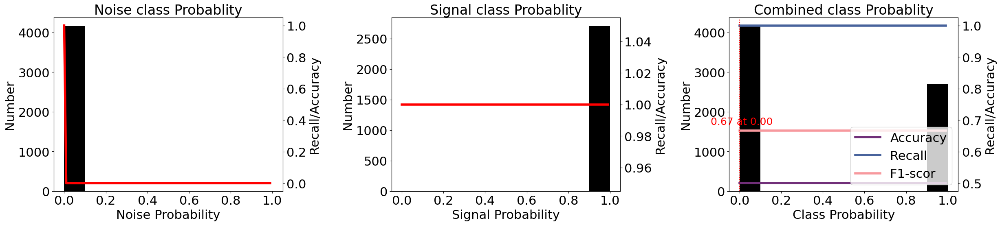

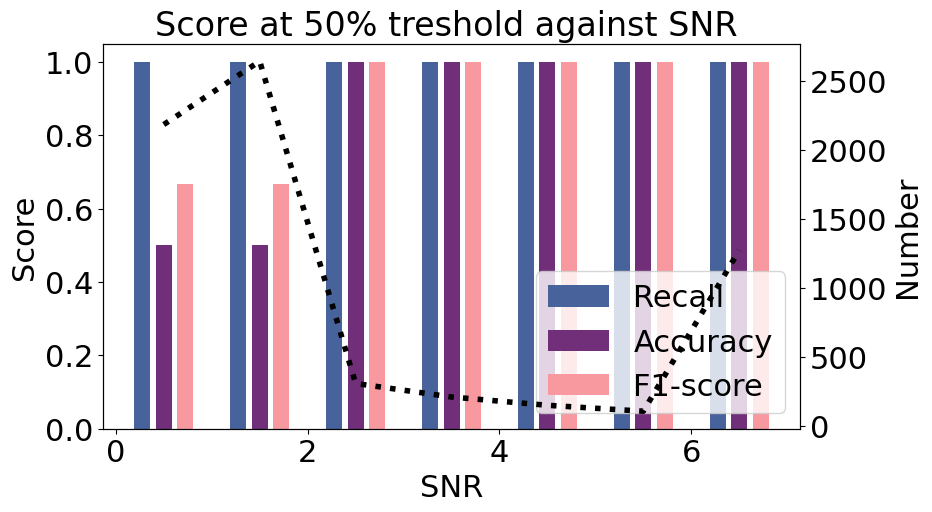

In [73]:
f1,f2, L = plotprobs(pred_list_phase3,labels)
BestP3['PhaseNet'] = L[0]
BestT3['PhaseNet'] = L[1]
BestA3['PhaseNet'] = L[3]
BestR3['PhaseNet'] = L[2]
f1.savefig("Figure/PhaseNet_Prob_GB.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/PhaseNet_Snr_GB.svg", dpi=100, bbox_inches='tight')

## OBSTransformer

In [74]:
# Load the pre-trained model
print(OBSTransformer.list_pretrained())
model = OBSTransformer.from_pretrained("obst2024")
model.to('cpu:0')

['obst2024']


OBSTransformer(
  (encoder): Encoder(
    (convs): ModuleList(
      (0): Conv1d(3, 8, kernel_size=(11,), stride=(1,), padding=(5,))
      (1): Conv1d(8, 16, kernel_size=(9,), stride=(1,), padding=(4,))
      (2): Conv1d(16, 16, kernel_size=(7,), stride=(1,), padding=(3,))
      (3): Conv1d(16, 32, kernel_size=(7,), stride=(1,), padding=(3,))
      (4): Conv1d(32, 32, kernel_size=(5,), stride=(1,), padding=(2,))
      (5): Conv1d(32, 64, kernel_size=(5,), stride=(1,), padding=(2,))
      (6): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    )
    (pools): ModuleList(
      (0-6): 7 x MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (res_cnn_stack): ResCNNStack(
    (members): ModuleList(
      (0-3): 4 x ResCNNBlock(
        (dropout): SpatialDropout1d(
          (dropout): Dropout2d(p=0.2, inplace=False)
        )
        (norm1): BatchNorm1d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (conv1): Conv1d

In [75]:
%autoawait on
pred_list = []
tic()
for i in tqdm(range(len(datasetMI))):
    preds = model.annotate(datasetMI[i][0])
    pred_list.append(max(preds[0].data) )
toc()
chrono3['OBS'] = tac()
pred_list_OBS3 = np.array(pred_list)

  0%|                                                                                                                                | 0/6869 [00:00<?, ?it/s]

  0%|                                                                                                                        | 3/6869 [00:00<05:56, 19.27it/s]

  0%|                                                                                                                        | 5/6869 [00:00<06:43, 17.01it/s]

  0%|                                                                                                                        | 7/6869 [00:00<08:58, 12.73it/s]

  0%|▏                                                                                                                       | 9/6869 [00:00<10:09, 11.26it/s]

  0%|▏                                                                                                                      | 11/6869 [00:00<09:30, 12.01it/s]

  0%|▏                                                                                                                      | 13/6869 [00:01<09:09, 12.48it/s]

  0%|▎                                                                                                                      | 15/6869 [00:01<09:01, 12.65it/s]

  0%|▎                                                                                                                      | 17/6869 [00:01<08:39, 13.20it/s]

  0%|▎                                                                                                                      | 19/6869 [00:01<09:07, 12.52it/s]

  0%|▎                                                                                                                      | 21/6869 [00:01<08:37, 13.23it/s]

  0%|▍                                                                                                                      | 23/6869 [00:01<08:33, 13.32it/s]

  0%|▍                                                                                                                      | 25/6869 [00:01<08:39, 13.19it/s]

  0%|▍                                                                                                                      | 27/6869 [00:02<09:30, 12.00it/s]

  0%|▌                                                                                                                      | 29/6869 [00:02<09:38, 11.83it/s]

  0%|▌                                                                                                                      | 31/6869 [00:02<10:32, 10.81it/s]

  0%|▌                                                                                                                      | 34/6869 [00:02<09:46, 11.64it/s]

  1%|▌                                                                                                                      | 36/6869 [00:02<09:03, 12.57it/s]

  1%|▋                                                                                                                      | 38/6869 [00:02<08:40, 13.11it/s]

  1%|▋                                                                                                                      | 40/6869 [00:03<09:37, 11.84it/s]

  1%|▋                                                                                                                      | 42/6869 [00:03<08:44, 13.00it/s]

  1%|▊                                                                                                                      | 44/6869 [00:03<08:52, 12.82it/s]

  1%|▊                                                                                                                      | 46/6869 [00:03<08:48, 12.91it/s]

  1%|▊                                                                                                                      | 48/6869 [00:03<08:08, 13.96it/s]

  1%|▊                                                                                                                      | 50/6869 [00:03<07:31, 15.09it/s]

  1%|▉                                                                                                                      | 52/6869 [00:04<07:58, 14.24it/s]

  1%|▉                                                                                                                      | 54/6869 [00:04<07:41, 14.75it/s]

  1%|▉                                                                                                                      | 56/6869 [00:04<07:23, 15.38it/s]

  1%|█                                                                                                                      | 58/6869 [00:04<07:36, 14.92it/s]

  1%|█                                                                                                                      | 60/6869 [00:04<07:50, 14.49it/s]

  1%|█                                                                                                                      | 62/6869 [00:04<07:45, 14.63it/s]

  1%|█                                                                                                                      | 64/6869 [00:04<08:14, 13.77it/s]

  1%|█▏                                                                                                                     | 66/6869 [00:05<08:41, 13.04it/s]

  1%|█▏                                                                                                                     | 68/6869 [00:05<09:06, 12.44it/s]

  1%|█▏                                                                                                                     | 70/6869 [00:05<08:31, 13.30it/s]

  1%|█▏                                                                                                                     | 72/6869 [00:05<09:44, 11.64it/s]

  1%|█▎                                                                                                                     | 75/6869 [00:05<07:57, 14.23it/s]

  1%|█▎                                                                                                                     | 77/6869 [00:05<08:00, 14.14it/s]

  1%|█▎                                                                                                                     | 79/6869 [00:05<08:26, 13.41it/s]

  1%|█▍                                                                                                                     | 81/6869 [00:06<08:49, 12.81it/s]

  1%|█▍                                                                                                                     | 83/6869 [00:06<08:00, 14.11it/s]

  1%|█▍                                                                                                                     | 85/6869 [00:06<08:09, 13.86it/s]

  1%|█▌                                                                                                                     | 87/6869 [00:06<08:48, 12.83it/s]

  1%|█▌                                                                                                                     | 89/6869 [00:06<08:56, 12.63it/s]

  1%|█▌                                                                                                                     | 91/6869 [00:06<08:40, 13.02it/s]

  1%|█▌                                                                                                                     | 93/6869 [00:07<09:00, 12.53it/s]

  1%|█▋                                                                                                                     | 95/6869 [00:07<09:02, 12.49it/s]

  1%|█▋                                                                                                                     | 97/6869 [00:07<09:43, 11.60it/s]

  1%|█▋                                                                                                                     | 99/6869 [00:07<09:11, 12.27it/s]

  1%|█▋                                                                                                                    | 101/6869 [00:07<08:44, 12.90it/s]

  1%|█▊                                                                                                                    | 103/6869 [00:07<07:58, 14.13it/s]

  2%|█▊                                                                                                                    | 105/6869 [00:08<08:20, 13.52it/s]

  2%|█▊                                                                                                                    | 107/6869 [00:08<07:38, 14.75it/s]

  2%|█▊                                                                                                                    | 109/6869 [00:08<08:02, 14.01it/s]

  2%|█▉                                                                                                                    | 111/6869 [00:08<07:54, 14.24it/s]

  2%|█▉                                                                                                                    | 113/6869 [00:08<07:36, 14.79it/s]

  2%|█▉                                                                                                                    | 115/6869 [00:08<07:27, 15.09it/s]

  2%|██                                                                                                                    | 117/6869 [00:08<07:49, 14.37it/s]

  2%|██                                                                                                                    | 119/6869 [00:08<07:55, 14.20it/s]

  2%|██                                                                                                                    | 121/6869 [00:09<09:09, 12.28it/s]

  2%|██                                                                                                                    | 123/6869 [00:09<08:54, 12.63it/s]

  2%|██▏                                                                                                                   | 125/6869 [00:09<09:34, 11.74it/s]

  2%|██▏                                                                                                                   | 127/6869 [00:09<08:37, 13.03it/s]

  2%|██▏                                                                                                                   | 129/6869 [00:09<08:20, 13.46it/s]

  2%|██▎                                                                                                                   | 131/6869 [00:09<08:01, 14.00it/s]

  2%|██▎                                                                                                                   | 133/6869 [00:10<08:40, 12.95it/s]

  2%|██▎                                                                                                                   | 135/6869 [00:10<08:24, 13.36it/s]

  2%|██▎                                                                                                                   | 137/6869 [00:10<09:28, 11.85it/s]

  2%|██▍                                                                                                                   | 139/6869 [00:10<08:53, 12.61it/s]

  2%|██▍                                                                                                                   | 141/6869 [00:10<08:43, 12.85it/s]

  2%|██▍                                                                                                                   | 143/6869 [00:10<08:00, 13.98it/s]

  2%|██▍                                                                                                                   | 145/6869 [00:11<08:35, 13.05it/s]

  2%|██▌                                                                                                                   | 147/6869 [00:11<08:05, 13.86it/s]

  2%|██▌                                                                                                                   | 149/6869 [00:11<08:37, 12.99it/s]

  2%|██▌                                                                                                                   | 151/6869 [00:11<09:17, 12.06it/s]

  2%|██▋                                                                                                                   | 153/6869 [00:11<08:49, 12.68it/s]

  2%|██▋                                                                                                                   | 155/6869 [00:11<08:40, 12.90it/s]

  2%|██▋                                                                                                                   | 157/6869 [00:11<08:19, 13.43it/s]

  2%|██▋                                                                                                                   | 159/6869 [00:12<08:17, 13.50it/s]

  2%|██▊                                                                                                                   | 161/6869 [00:12<08:24, 13.30it/s]

  2%|██▊                                                                                                                   | 163/6869 [00:12<07:45, 14.40it/s]

  2%|██▊                                                                                                                   | 165/6869 [00:12<09:04, 12.31it/s]

  2%|██▊                                                                                                                   | 167/6869 [00:12<08:08, 13.72it/s]

  2%|██▉                                                                                                                   | 169/6869 [00:12<08:48, 12.67it/s]

  2%|██▉                                                                                                                   | 171/6869 [00:13<10:00, 11.16it/s]

  3%|██▉                                                                                                                   | 173/6869 [00:13<09:15, 12.05it/s]

  3%|███                                                                                                                   | 175/6869 [00:13<09:58, 11.18it/s]

  3%|███                                                                                                                   | 177/6869 [00:13<09:21, 11.91it/s]

  3%|███                                                                                                                   | 179/6869 [00:13<09:06, 12.25it/s]

  3%|███                                                                                                                   | 181/6869 [00:13<08:32, 13.04it/s]

  3%|███▏                                                                                                                  | 183/6869 [00:14<08:43, 12.76it/s]

  3%|███▏                                                                                                                  | 185/6869 [00:14<08:48, 12.64it/s]

  3%|███▏                                                                                                                  | 187/6869 [00:14<08:19, 13.38it/s]

  3%|███▏                                                                                                                  | 189/6869 [00:14<08:53, 12.53it/s]

  3%|███▎                                                                                                                  | 191/6869 [00:14<08:31, 13.05it/s]

  3%|███▎                                                                                                                  | 193/6869 [00:14<08:22, 13.29it/s]

  3%|███▎                                                                                                                  | 195/6869 [00:14<08:07, 13.70it/s]

  3%|███▍                                                                                                                  | 197/6869 [00:15<08:00, 13.90it/s]

  3%|███▍                                                                                                                  | 199/6869 [00:15<08:17, 13.41it/s]

  3%|███▍                                                                                                                  | 201/6869 [00:15<08:19, 13.34it/s]

  3%|███▍                                                                                                                  | 203/6869 [00:15<08:29, 13.08it/s]

  3%|███▌                                                                                                                  | 205/6869 [00:15<08:28, 13.12it/s]

  3%|███▌                                                                                                                  | 207/6869 [00:15<08:18, 13.37it/s]

  3%|███▌                                                                                                                  | 209/6869 [00:15<07:30, 14.77it/s]

  3%|███▌                                                                                                                  | 211/6869 [00:16<07:35, 14.61it/s]

  3%|███▋                                                                                                                  | 213/6869 [00:16<07:42, 14.40it/s]

  3%|███▋                                                                                                                  | 215/6869 [00:16<07:40, 14.46it/s]

  3%|███▋                                                                                                                  | 217/6869 [00:16<08:12, 13.51it/s]

  3%|███▊                                                                                                                  | 219/6869 [00:16<08:15, 13.43it/s]

  3%|███▊                                                                                                                  | 221/6869 [00:16<08:17, 13.37it/s]

  3%|███▊                                                                                                                  | 223/6869 [00:16<07:34, 14.62it/s]

  3%|███▊                                                                                                                  | 225/6869 [00:17<08:53, 12.44it/s]

  3%|███▉                                                                                                                  | 227/6869 [00:17<07:59, 13.86it/s]

  3%|███▉                                                                                                                  | 229/6869 [00:17<08:17, 13.35it/s]

  3%|███▉                                                                                                                  | 231/6869 [00:17<07:30, 14.74it/s]

  3%|████                                                                                                                  | 233/6869 [00:17<07:25, 14.89it/s]

  3%|████                                                                                                                  | 235/6869 [00:17<07:41, 14.37it/s]

  3%|████                                                                                                                  | 237/6869 [00:17<07:49, 14.13it/s]

  3%|████                                                                                                                  | 239/6869 [00:18<08:32, 12.93it/s]

  4%|████▏                                                                                                                 | 241/6869 [00:18<08:43, 12.67it/s]

  4%|████▏                                                                                                                 | 243/6869 [00:18<08:28, 13.03it/s]

  4%|████▏                                                                                                                 | 245/6869 [00:18<08:26, 13.07it/s]

  4%|████▏                                                                                                                 | 247/6869 [00:18<08:11, 13.47it/s]

  4%|████▎                                                                                                                 | 249/6869 [00:18<08:33, 12.89it/s]

  4%|████▎                                                                                                                 | 251/6869 [00:19<08:18, 13.27it/s]

  4%|████▎                                                                                                                 | 253/6869 [00:19<07:39, 14.40it/s]

  4%|████▍                                                                                                                 | 255/6869 [00:19<08:15, 13.34it/s]

  4%|████▍                                                                                                                 | 257/6869 [00:19<08:50, 12.46it/s]

  4%|████▍                                                                                                                 | 259/6869 [00:19<08:03, 13.66it/s]

  4%|████▍                                                                                                                 | 261/6869 [00:19<08:14, 13.37it/s]

  4%|████▌                                                                                                                 | 263/6869 [00:19<08:05, 13.59it/s]

  4%|████▌                                                                                                                 | 265/6869 [00:20<09:01, 12.19it/s]

  4%|████▌                                                                                                                 | 267/6869 [00:20<08:22, 13.14it/s]

  4%|████▌                                                                                                                 | 269/6869 [00:20<08:01, 13.70it/s]

  4%|████▋                                                                                                                 | 271/6869 [00:20<07:16, 15.10it/s]

  4%|████▋                                                                                                                 | 273/6869 [00:20<07:07, 15.41it/s]

  4%|████▋                                                                                                                 | 275/6869 [00:20<08:33, 12.84it/s]

  4%|████▊                                                                                                                 | 277/6869 [00:20<08:21, 13.14it/s]

  4%|████▊                                                                                                                 | 279/6869 [00:21<08:12, 13.37it/s]

  4%|████▊                                                                                                                 | 281/6869 [00:21<08:17, 13.24it/s]

  4%|████▊                                                                                                                 | 283/6869 [00:21<07:57, 13.79it/s]

  4%|████▉                                                                                                                 | 285/6869 [00:21<08:40, 12.66it/s]

  4%|████▉                                                                                                                 | 287/6869 [00:21<08:08, 13.47it/s]

  4%|████▉                                                                                                                 | 289/6869 [00:21<07:51, 13.96it/s]

  4%|████▉                                                                                                                 | 291/6869 [00:21<08:01, 13.65it/s]

  4%|█████                                                                                                                 | 293/6869 [00:22<08:34, 12.77it/s]

  4%|█████                                                                                                                 | 295/6869 [00:22<08:25, 13.01it/s]

  4%|█████                                                                                                                 | 297/6869 [00:22<08:16, 13.24it/s]

  4%|█████▏                                                                                                                | 299/6869 [00:22<07:34, 14.47it/s]

  4%|█████▏                                                                                                                | 301/6869 [00:22<07:08, 15.31it/s]

  4%|█████▏                                                                                                                | 303/6869 [00:22<07:32, 14.52it/s]

  4%|█████▏                                                                                                                | 305/6869 [00:22<07:30, 14.56it/s]

  4%|█████▎                                                                                                                | 307/6869 [00:23<07:37, 14.34it/s]

  4%|█████▎                                                                                                                | 309/6869 [00:23<08:36, 12.70it/s]

  5%|█████▎                                                                                                                | 311/6869 [00:23<08:08, 13.43it/s]

  5%|█████▍                                                                                                                | 313/6869 [00:23<09:07, 11.98it/s]

  5%|█████▍                                                                                                                | 315/6869 [00:23<08:17, 13.18it/s]

  5%|█████▍                                                                                                                | 317/6869 [00:23<08:09, 13.38it/s]

  5%|█████▍                                                                                                                | 319/6869 [00:24<08:26, 12.93it/s]

  5%|█████▌                                                                                                                | 321/6869 [00:24<09:03, 12.06it/s]

  5%|█████▌                                                                                                                | 323/6869 [00:24<08:58, 12.15it/s]

  5%|█████▌                                                                                                                | 325/6869 [00:24<08:46, 12.42it/s]

  5%|█████▌                                                                                                                | 327/6869 [00:24<08:22, 13.02it/s]

  5%|█████▋                                                                                                                | 329/6869 [00:24<08:23, 13.00it/s]

  5%|█████▋                                                                                                                | 331/6869 [00:25<08:33, 12.73it/s]

  5%|█████▋                                                                                                                | 333/6869 [00:25<08:44, 12.46it/s]

  5%|█████▊                                                                                                                | 335/6869 [00:25<08:54, 12.23it/s]

  5%|█████▊                                                                                                                | 337/6869 [00:25<08:32, 12.75it/s]

  5%|█████▊                                                                                                                | 339/6869 [00:25<09:07, 11.93it/s]

  5%|█████▊                                                                                                                | 341/6869 [00:25<09:10, 11.86it/s]

  5%|█████▉                                                                                                                | 343/6869 [00:26<08:42, 12.49it/s]

  5%|█████▉                                                                                                                | 345/6869 [00:26<08:28, 12.83it/s]

  5%|█████▉                                                                                                                | 347/6869 [00:26<08:44, 12.43it/s]

  5%|█████▉                                                                                                                | 349/6869 [00:26<08:31, 12.75it/s]

  5%|██████                                                                                                                | 351/6869 [00:26<07:57, 13.64it/s]

  5%|██████                                                                                                                | 353/6869 [00:26<08:32, 12.72it/s]

  5%|██████                                                                                                                | 355/6869 [00:26<07:58, 13.60it/s]

  5%|██████▏                                                                                                               | 357/6869 [00:27<08:50, 12.28it/s]

  5%|██████▏                                                                                                               | 359/6869 [00:27<09:20, 11.61it/s]

  5%|██████▏                                                                                                               | 362/6869 [00:27<07:58, 13.59it/s]

  5%|██████▎                                                                                                               | 364/6869 [00:27<08:19, 13.02it/s]

  5%|██████▎                                                                                                               | 366/6869 [00:27<08:09, 13.27it/s]

  5%|██████▎                                                                                                               | 368/6869 [00:27<07:50, 13.82it/s]

  5%|██████▎                                                                                                               | 370/6869 [00:28<08:07, 13.34it/s]

  5%|██████▍                                                                                                               | 372/6869 [00:28<07:46, 13.94it/s]

  5%|██████▍                                                                                                               | 374/6869 [00:28<08:15, 13.10it/s]

  5%|██████▍                                                                                                               | 376/6869 [00:28<08:25, 12.85it/s]

  6%|██████▍                                                                                                               | 378/6869 [00:28<08:31, 12.69it/s]

  6%|██████▌                                                                                                               | 380/6869 [00:28<07:52, 13.73it/s]

  6%|██████▌                                                                                                               | 382/6869 [00:29<08:30, 12.71it/s]

  6%|██████▌                                                                                                               | 384/6869 [00:29<08:38, 12.51it/s]

  6%|██████▋                                                                                                               | 386/6869 [00:29<07:56, 13.62it/s]

  6%|██████▋                                                                                                               | 388/6869 [00:29<07:46, 13.90it/s]

  6%|██████▋                                                                                                               | 390/6869 [00:29<08:56, 12.08it/s]

  6%|██████▋                                                                                                               | 392/6869 [00:29<09:04, 11.89it/s]

  6%|██████▊                                                                                                               | 394/6869 [00:29<08:58, 12.03it/s]

  6%|██████▊                                                                                                               | 396/6869 [00:30<08:30, 12.68it/s]

  6%|██████▊                                                                                                               | 398/6869 [00:30<08:44, 12.33it/s]

  6%|██████▊                                                                                                               | 400/6869 [00:30<08:41, 12.41it/s]

  6%|██████▉                                                                                                               | 402/6869 [00:30<08:13, 13.11it/s]

  6%|██████▉                                                                                                               | 404/6869 [00:30<07:50, 13.73it/s]

  6%|██████▉                                                                                                               | 406/6869 [00:30<08:15, 13.05it/s]

  6%|███████                                                                                                               | 408/6869 [00:31<08:08, 13.23it/s]

  6%|███████                                                                                                               | 410/6869 [00:31<07:50, 13.71it/s]

  6%|███████                                                                                                               | 412/6869 [00:31<08:09, 13.18it/s]

  6%|███████                                                                                                               | 414/6869 [00:31<08:28, 12.70it/s]

  6%|███████▏                                                                                                              | 416/6869 [00:31<08:36, 12.49it/s]

  6%|███████▏                                                                                                              | 418/6869 [00:31<08:31, 12.62it/s]

  6%|███████▏                                                                                                              | 420/6869 [00:32<08:58, 11.97it/s]

  6%|███████▏                                                                                                              | 422/6869 [00:32<08:49, 12.17it/s]

  6%|███████▎                                                                                                              | 424/6869 [00:32<07:55, 13.54it/s]

  6%|███████▎                                                                                                              | 426/6869 [00:32<08:10, 13.14it/s]

  6%|███████▎                                                                                                              | 428/6869 [00:32<07:58, 13.46it/s]

  6%|███████▍                                                                                                              | 430/6869 [00:32<08:11, 13.10it/s]

  6%|███████▍                                                                                                              | 432/6869 [00:32<07:50, 13.70it/s]

  6%|███████▍                                                                                                              | 434/6869 [00:32<07:33, 14.18it/s]

  6%|███████▍                                                                                                              | 436/6869 [00:33<08:42, 12.31it/s]

  6%|███████▌                                                                                                              | 438/6869 [00:33<08:44, 12.26it/s]

  6%|███████▌                                                                                                              | 440/6869 [00:33<09:48, 10.92it/s]

  6%|███████▌                                                                                                              | 442/6869 [00:33<09:07, 11.74it/s]

  6%|███████▋                                                                                                              | 444/6869 [00:33<08:40, 12.34it/s]

  6%|███████▋                                                                                                              | 446/6869 [00:34<08:39, 12.38it/s]

  7%|███████▋                                                                                                              | 448/6869 [00:34<08:15, 12.96it/s]

  7%|███████▋                                                                                                              | 450/6869 [00:34<07:41, 13.90it/s]

  7%|███████▊                                                                                                              | 452/6869 [00:34<07:54, 13.53it/s]

  7%|███████▊                                                                                                              | 454/6869 [00:34<07:34, 14.11it/s]

  7%|███████▊                                                                                                              | 456/6869 [00:34<07:17, 14.65it/s]

  7%|███████▊                                                                                                              | 458/6869 [00:34<07:26, 14.35it/s]

  7%|███████▉                                                                                                              | 460/6869 [00:35<08:20, 12.81it/s]

  7%|███████▉                                                                                                              | 462/6869 [00:35<08:09, 13.08it/s]

  7%|███████▉                                                                                                              | 464/6869 [00:35<08:57, 11.93it/s]

  7%|████████                                                                                                              | 466/6869 [00:35<08:15, 12.93it/s]

  7%|████████                                                                                                              | 468/6869 [00:35<08:46, 12.16it/s]

  7%|████████                                                                                                              | 470/6869 [00:35<07:45, 13.74it/s]

  7%|████████                                                                                                              | 472/6869 [00:36<08:57, 11.90it/s]

  7%|████████▏                                                                                                             | 474/6869 [00:36<08:17, 12.85it/s]

  7%|████████▏                                                                                                             | 476/6869 [00:36<07:50, 13.60it/s]

  7%|████████▏                                                                                                             | 478/6869 [00:36<07:56, 13.41it/s]

  7%|████████▎                                                                                                             | 481/6869 [00:36<07:11, 14.81it/s]

  7%|████████▎                                                                                                             | 483/6869 [00:36<07:32, 14.10it/s]

  7%|████████▎                                                                                                             | 485/6869 [00:36<07:48, 13.62it/s]

  7%|████████▎                                                                                                             | 487/6869 [00:37<07:10, 14.81it/s]

  7%|████████▍                                                                                                             | 489/6869 [00:37<08:10, 13.00it/s]

  7%|████████▍                                                                                                             | 491/6869 [00:37<07:42, 13.78it/s]

  7%|████████▍                                                                                                             | 493/6869 [00:37<08:16, 12.85it/s]

  7%|████████▌                                                                                                             | 495/6869 [00:37<08:07, 13.09it/s]

  7%|████████▌                                                                                                             | 497/6869 [00:37<08:00, 13.25it/s]

  7%|████████▌                                                                                                             | 499/6869 [00:37<08:12, 12.93it/s]

  7%|████████▌                                                                                                             | 501/6869 [00:38<07:59, 13.29it/s]

  7%|████████▋                                                                                                             | 503/6869 [00:38<08:07, 13.05it/s]

  7%|████████▋                                                                                                             | 505/6869 [00:38<07:45, 13.66it/s]

  7%|████████▋                                                                                                             | 507/6869 [00:38<07:31, 14.08it/s]

  7%|████████▋                                                                                                             | 509/6869 [00:38<08:38, 12.26it/s]

  7%|████████▊                                                                                                             | 512/6869 [00:38<08:05, 13.09it/s]

  7%|████████▊                                                                                                             | 514/6869 [00:39<07:44, 13.68it/s]

  8%|████████▊                                                                                                             | 516/6869 [00:39<08:31, 12.42it/s]

  8%|████████▉                                                                                                             | 518/6869 [00:39<08:02, 13.17it/s]

  8%|████████▉                                                                                                             | 520/6869 [00:39<07:56, 13.32it/s]

  8%|████████▉                                                                                                             | 522/6869 [00:39<07:58, 13.27it/s]

  8%|█████████                                                                                                             | 524/6869 [00:39<08:12, 12.87it/s]

  8%|█████████                                                                                                             | 526/6869 [00:40<07:35, 13.93it/s]

  8%|█████████                                                                                                             | 528/6869 [00:40<08:24, 12.57it/s]

  8%|█████████                                                                                                             | 530/6869 [00:40<08:55, 11.85it/s]

  8%|█████████▏                                                                                                            | 532/6869 [00:40<09:18, 11.34it/s]

  8%|█████████▏                                                                                                            | 534/6869 [00:40<09:01, 11.70it/s]

  8%|█████████▏                                                                                                            | 536/6869 [00:40<09:08, 11.55it/s]

  8%|█████████▏                                                                                                            | 538/6869 [00:41<08:36, 12.26it/s]

  8%|█████████▎                                                                                                            | 540/6869 [00:41<08:38, 12.22it/s]

  8%|█████████▎                                                                                                            | 542/6869 [00:41<08:17, 12.72it/s]

  8%|█████████▎                                                                                                            | 544/6869 [00:41<08:39, 12.18it/s]

  8%|█████████▍                                                                                                            | 546/6869 [00:41<07:45, 13.60it/s]

  8%|█████████▍                                                                                                            | 548/6869 [00:41<07:56, 13.25it/s]

  8%|█████████▍                                                                                                            | 550/6869 [00:41<08:01, 13.11it/s]

  8%|█████████▍                                                                                                            | 552/6869 [00:42<07:46, 13.55it/s]

  8%|█████████▌                                                                                                            | 554/6869 [00:42<07:43, 13.62it/s]

  8%|█████████▌                                                                                                            | 556/6869 [00:42<07:03, 14.90it/s]

  8%|█████████▌                                                                                                            | 558/6869 [00:42<07:57, 13.21it/s]

  8%|█████████▌                                                                                                            | 560/6869 [00:42<08:18, 12.65it/s]

  8%|█████████▋                                                                                                            | 562/6869 [00:42<09:42, 10.83it/s]

  8%|█████████▋                                                                                                            | 564/6869 [00:43<08:48, 11.93it/s]

  8%|█████████▋                                                                                                            | 566/6869 [00:43<08:38, 12.15it/s]

  8%|█████████▊                                                                                                            | 568/6869 [00:43<08:07, 12.91it/s]

  8%|█████████▊                                                                                                            | 570/6869 [00:43<08:15, 12.71it/s]

  8%|█████████▊                                                                                                            | 572/6869 [00:43<08:28, 12.38it/s]

  8%|█████████▊                                                                                                            | 574/6869 [00:43<08:14, 12.73it/s]

  8%|█████████▉                                                                                                            | 576/6869 [00:44<08:44, 11.99it/s]

  8%|█████████▉                                                                                                            | 578/6869 [00:44<08:11, 12.80it/s]

  8%|█████████▉                                                                                                            | 580/6869 [00:44<07:58, 13.16it/s]

  8%|█████████▉                                                                                                            | 582/6869 [00:44<07:09, 14.65it/s]

  9%|██████████                                                                                                            | 584/6869 [00:44<07:01, 14.91it/s]

  9%|██████████                                                                                                            | 586/6869 [00:44<08:01, 13.05it/s]

  9%|██████████                                                                                                            | 588/6869 [00:44<08:52, 11.80it/s]

  9%|██████████▏                                                                                                           | 590/6869 [00:45<08:58, 11.65it/s]

  9%|██████████▏                                                                                                           | 592/6869 [00:45<08:49, 11.87it/s]

  9%|██████████▏                                                                                                           | 594/6869 [00:45<09:19, 11.21it/s]

  9%|██████████▏                                                                                                           | 596/6869 [00:45<08:26, 12.38it/s]

  9%|██████████▎                                                                                                           | 598/6869 [00:45<08:51, 11.79it/s]

  9%|██████████▎                                                                                                           | 600/6869 [00:45<08:39, 12.07it/s]

  9%|██████████▎                                                                                                           | 602/6869 [00:46<08:29, 12.30it/s]

  9%|██████████▍                                                                                                           | 604/6869 [00:46<08:05, 12.90it/s]

  9%|██████████▍                                                                                                           | 606/6869 [00:46<08:04, 12.92it/s]

  9%|██████████▍                                                                                                           | 608/6869 [00:46<07:49, 13.34it/s]

  9%|██████████▍                                                                                                           | 610/6869 [00:46<08:21, 12.47it/s]

  9%|██████████▌                                                                                                           | 612/6869 [00:46<08:52, 11.75it/s]

  9%|██████████▌                                                                                                           | 614/6869 [00:47<08:09, 12.77it/s]

  9%|██████████▌                                                                                                           | 616/6869 [00:47<07:44, 13.47it/s]

  9%|██████████▌                                                                                                           | 618/6869 [00:47<08:10, 12.76it/s]

  9%|██████████▋                                                                                                           | 620/6869 [00:47<07:43, 13.47it/s]

  9%|██████████▋                                                                                                           | 622/6869 [00:47<07:39, 13.60it/s]

  9%|██████████▋                                                                                                           | 624/6869 [00:47<07:01, 14.81it/s]

  9%|██████████▊                                                                                                           | 626/6869 [00:47<07:59, 13.01it/s]

  9%|██████████▊                                                                                                           | 628/6869 [00:48<08:09, 12.76it/s]

  9%|██████████▊                                                                                                           | 630/6869 [00:48<07:25, 14.01it/s]

  9%|██████████▊                                                                                                           | 632/6869 [00:48<07:26, 13.98it/s]

  9%|██████████▉                                                                                                           | 634/6869 [00:48<07:26, 13.98it/s]

  9%|██████████▉                                                                                                           | 636/6869 [00:48<07:39, 13.56it/s]

  9%|██████████▉                                                                                                           | 638/6869 [00:48<07:37, 13.63it/s]

  9%|██████████▉                                                                                                           | 640/6869 [00:48<07:27, 13.91it/s]

  9%|███████████                                                                                                           | 642/6869 [00:49<08:05, 12.83it/s]

  9%|███████████                                                                                                           | 644/6869 [00:49<08:08, 12.75it/s]

  9%|███████████                                                                                                           | 646/6869 [00:49<08:25, 12.30it/s]

  9%|███████████▏                                                                                                          | 648/6869 [00:49<08:37, 12.03it/s]

  9%|███████████▏                                                                                                          | 650/6869 [00:49<08:12, 12.62it/s]

  9%|███████████▏                                                                                                          | 652/6869 [00:49<08:04, 12.84it/s]

 10%|███████████▏                                                                                                          | 654/6869 [00:50<08:17, 12.50it/s]

 10%|███████████▎                                                                                                          | 656/6869 [00:50<07:52, 13.14it/s]

 10%|███████████▎                                                                                                          | 658/6869 [00:50<07:57, 13.01it/s]

 10%|███████████▎                                                                                                          | 660/6869 [00:50<07:50, 13.21it/s]

 10%|███████████▎                                                                                                          | 662/6869 [00:50<08:19, 12.43it/s]

 10%|███████████▍                                                                                                          | 664/6869 [00:50<08:19, 12.41it/s]

 10%|███████████▍                                                                                                          | 666/6869 [00:51<07:47, 13.26it/s]

 10%|███████████▍                                                                                                          | 668/6869 [00:51<07:54, 13.06it/s]

 10%|███████████▌                                                                                                          | 670/6869 [00:51<07:43, 13.38it/s]

 10%|███████████▌                                                                                                          | 672/6869 [00:51<07:33, 13.67it/s]

 10%|███████████▌                                                                                                          | 674/6869 [00:51<07:14, 14.27it/s]

 10%|███████████▌                                                                                                          | 676/6869 [00:51<07:25, 13.89it/s]

 10%|███████████▋                                                                                                          | 678/6869 [00:51<07:46, 13.27it/s]

 10%|███████████▋                                                                                                          | 680/6869 [00:52<07:14, 14.26it/s]

 10%|███████████▋                                                                                                          | 682/6869 [00:52<07:16, 14.17it/s]

 10%|███████████▊                                                                                                          | 684/6869 [00:52<07:05, 14.53it/s]

 10%|███████████▊                                                                                                          | 686/6869 [00:52<07:38, 13.48it/s]

 10%|███████████▊                                                                                                          | 688/6869 [00:52<09:07, 11.30it/s]

 10%|███████████▊                                                                                                          | 690/6869 [00:52<08:00, 12.87it/s]

 10%|███████████▉                                                                                                          | 692/6869 [00:52<08:23, 12.26it/s]

 10%|███████████▉                                                                                                          | 694/6869 [00:53<08:05, 12.73it/s]

 10%|███████████▉                                                                                                          | 696/6869 [00:53<07:52, 13.07it/s]

 10%|███████████▉                                                                                                          | 698/6869 [00:53<07:37, 13.50it/s]

 10%|████████████                                                                                                          | 700/6869 [00:53<08:23, 12.25it/s]

 10%|████████████                                                                                                          | 702/6869 [00:53<08:00, 12.83it/s]

 10%|████████████                                                                                                          | 704/6869 [00:53<07:51, 13.07it/s]

 10%|████████████▏                                                                                                         | 706/6869 [00:54<07:29, 13.70it/s]

 10%|████████████▏                                                                                                         | 708/6869 [00:54<08:13, 12.47it/s]

 10%|████████████▏                                                                                                         | 710/6869 [00:54<08:16, 12.41it/s]

 10%|████████████▏                                                                                                         | 712/6869 [00:54<07:59, 12.83it/s]

 10%|████████████▎                                                                                                         | 714/6869 [00:54<07:36, 13.49it/s]

 10%|████████████▎                                                                                                         | 716/6869 [00:54<07:31, 13.64it/s]

 10%|████████████▎                                                                                                         | 718/6869 [00:54<07:18, 14.02it/s]

 10%|████████████▎                                                                                                         | 720/6869 [00:55<07:27, 13.75it/s]

 11%|████████████▍                                                                                                         | 722/6869 [00:55<08:10, 12.53it/s]

 11%|████████████▍                                                                                                         | 724/6869 [00:55<08:26, 12.14it/s]

 11%|████████████▍                                                                                                         | 726/6869 [00:55<08:44, 11.71it/s]

 11%|████████████▌                                                                                                         | 728/6869 [00:55<08:32, 11.98it/s]

 11%|████████████▌                                                                                                         | 730/6869 [00:55<08:05, 12.64it/s]

 11%|████████████▌                                                                                                         | 732/6869 [00:56<08:22, 12.21it/s]

 11%|████████████▌                                                                                                         | 734/6869 [00:56<08:24, 12.17it/s]

 11%|████████████▋                                                                                                         | 736/6869 [00:56<08:27, 12.07it/s]

 11%|████████████▋                                                                                                         | 738/6869 [00:56<08:15, 12.38it/s]

 11%|████████████▋                                                                                                         | 740/6869 [00:56<08:18, 12.29it/s]

 11%|████████████▋                                                                                                         | 742/6869 [00:56<07:59, 12.76it/s]

 11%|████████████▊                                                                                                         | 744/6869 [00:57<07:48, 13.06it/s]

 11%|████████████▊                                                                                                         | 746/6869 [00:57<08:50, 11.53it/s]

 11%|████████████▊                                                                                                         | 749/6869 [00:57<07:21, 13.87it/s]

 11%|████████████▉                                                                                                         | 751/6869 [00:57<08:14, 12.37it/s]

 11%|████████████▉                                                                                                         | 754/6869 [00:57<06:53, 14.79it/s]

 11%|████████████▉                                                                                                         | 756/6869 [00:57<06:55, 14.73it/s]

 11%|█████████████                                                                                                         | 758/6869 [00:58<06:48, 14.97it/s]

 11%|█████████████                                                                                                         | 760/6869 [00:58<07:34, 13.43it/s]

 11%|█████████████                                                                                                         | 762/6869 [00:58<07:16, 14.00it/s]

 11%|█████████████                                                                                                         | 764/6869 [00:58<07:12, 14.12it/s]

 11%|█████████████▏                                                                                                        | 766/6869 [00:58<07:34, 13.41it/s]

 11%|█████████████▏                                                                                                        | 768/6869 [00:58<08:12, 12.39it/s]

 11%|█████████████▏                                                                                                        | 770/6869 [00:59<08:24, 12.08it/s]

 11%|█████████████▎                                                                                                        | 772/6869 [00:59<07:35, 13.38it/s]

 11%|█████████████▎                                                                                                        | 774/6869 [00:59<08:24, 12.09it/s]

 11%|█████████████▎                                                                                                        | 776/6869 [00:59<07:53, 12.86it/s]

 11%|█████████████▎                                                                                                        | 778/6869 [00:59<08:09, 12.44it/s]

 11%|█████████████▍                                                                                                        | 780/6869 [00:59<07:42, 13.17it/s]

 11%|█████████████▍                                                                                                        | 782/6869 [00:59<08:28, 11.96it/s]

 11%|█████████████▍                                                                                                        | 784/6869 [01:00<07:57, 12.75it/s]

 11%|█████████████▌                                                                                                        | 786/6869 [01:00<07:52, 12.87it/s]

 11%|█████████████▌                                                                                                        | 788/6869 [01:00<07:47, 13.00it/s]

 12%|█████████████▌                                                                                                        | 790/6869 [01:00<08:04, 12.54it/s]

 12%|█████████████▌                                                                                                        | 792/6869 [01:00<07:28, 13.55it/s]

 12%|█████████████▋                                                                                                        | 794/6869 [01:00<07:23, 13.71it/s]

 12%|█████████████▋                                                                                                        | 796/6869 [01:00<07:29, 13.52it/s]

 12%|█████████████▋                                                                                                        | 798/6869 [01:01<07:58, 12.70it/s]

 12%|█████████████▋                                                                                                        | 800/6869 [01:01<08:12, 12.32it/s]

 12%|█████████████▊                                                                                                        | 802/6869 [01:01<07:51, 12.85it/s]

 12%|█████████████▊                                                                                                        | 804/6869 [01:01<09:24, 10.74it/s]

 12%|█████████████▊                                                                                                        | 807/6869 [01:01<07:51, 12.85it/s]

 12%|█████████████▉                                                                                                        | 809/6869 [01:02<07:59, 12.64it/s]

 12%|█████████████▉                                                                                                        | 811/6869 [01:02<07:40, 13.15it/s]

 12%|█████████████▉                                                                                                        | 813/6869 [01:02<07:31, 13.40it/s]

 12%|██████████████                                                                                                        | 815/6869 [01:02<07:47, 12.94it/s]

 12%|██████████████                                                                                                        | 817/6869 [01:02<07:40, 13.15it/s]

 12%|██████████████                                                                                                        | 819/6869 [01:02<07:27, 13.51it/s]

 12%|██████████████                                                                                                        | 821/6869 [01:02<07:50, 12.86it/s]

 12%|██████████████▏                                                                                                       | 823/6869 [01:03<08:34, 11.74it/s]

 12%|██████████████▏                                                                                                       | 825/6869 [01:03<08:52, 11.35it/s]

 12%|██████████████▏                                                                                                       | 827/6869 [01:03<07:45, 12.97it/s]

 12%|██████████████▏                                                                                                       | 829/6869 [01:03<08:11, 12.30it/s]

 12%|██████████████▎                                                                                                       | 831/6869 [01:03<07:43, 13.03it/s]

 12%|██████████████▎                                                                                                       | 833/6869 [01:03<07:52, 12.77it/s]

 12%|██████████████▎                                                                                                       | 835/6869 [01:04<07:19, 13.72it/s]

 12%|██████████████▍                                                                                                       | 837/6869 [01:04<08:09, 12.33it/s]

 12%|██████████████▍                                                                                                       | 839/6869 [01:04<07:34, 13.27it/s]

 12%|██████████████▍                                                                                                       | 841/6869 [01:04<08:00, 12.54it/s]

 12%|██████████████▍                                                                                                       | 843/6869 [01:04<07:39, 13.10it/s]

 12%|██████████████▌                                                                                                       | 845/6869 [01:04<07:34, 13.27it/s]

 12%|██████████████▌                                                                                                       | 847/6869 [01:04<06:57, 14.44it/s]

 12%|██████████████▌                                                                                                       | 849/6869 [01:05<06:51, 14.63it/s]

 12%|██████████████▌                                                                                                       | 851/6869 [01:05<06:48, 14.72it/s]

 12%|██████████████▋                                                                                                       | 853/6869 [01:05<07:38, 13.13it/s]

 12%|██████████████▋                                                                                                       | 855/6869 [01:05<07:12, 13.92it/s]

 12%|██████████████▋                                                                                                       | 857/6869 [01:05<07:03, 14.19it/s]

 13%|██████████████▊                                                                                                       | 859/6869 [01:05<08:00, 12.51it/s]

 13%|██████████████▊                                                                                                       | 861/6869 [01:06<07:53, 12.69it/s]

 13%|██████████████▊                                                                                                       | 863/6869 [01:06<08:12, 12.19it/s]

 13%|██████████████▊                                                                                                       | 865/6869 [01:06<08:20, 12.01it/s]

 13%|██████████████▉                                                                                                       | 867/6869 [01:06<08:03, 12.41it/s]

 13%|██████████████▉                                                                                                       | 869/6869 [01:06<09:04, 11.01it/s]

 13%|██████████████▉                                                                                                       | 871/6869 [01:06<08:54, 11.22it/s]

 13%|██████████████▉                                                                                                       | 873/6869 [01:07<08:31, 11.72it/s]

 13%|███████████████                                                                                                       | 875/6869 [01:07<07:47, 12.82it/s]

 13%|███████████████                                                                                                       | 877/6869 [01:07<07:35, 13.14it/s]

 13%|███████████████                                                                                                       | 879/6869 [01:07<07:02, 14.18it/s]

 13%|███████████████▏                                                                                                      | 881/6869 [01:07<07:25, 13.45it/s]

 13%|███████████████▏                                                                                                      | 883/6869 [01:07<07:27, 13.37it/s]

 13%|███████████████▏                                                                                                      | 885/6869 [01:07<06:57, 14.34it/s]

 13%|███████████████▏                                                                                                      | 887/6869 [01:08<08:19, 11.98it/s]

 13%|███████████████▎                                                                                                      | 889/6869 [01:08<08:58, 11.10it/s]

 13%|███████████████▎                                                                                                      | 891/6869 [01:08<09:16, 10.74it/s]

 13%|███████████████▎                                                                                                      | 893/6869 [01:08<08:20, 11.94it/s]

 13%|███████████████▎                                                                                                      | 895/6869 [01:08<08:52, 11.23it/s]

 13%|███████████████▍                                                                                                      | 897/6869 [01:09<08:30, 11.70it/s]

 13%|███████████████▍                                                                                                      | 899/6869 [01:09<08:17, 12.00it/s]

 13%|███████████████▍                                                                                                      | 901/6869 [01:09<07:53, 12.59it/s]

 13%|███████████████▌                                                                                                      | 903/6869 [01:09<07:47, 12.77it/s]

 13%|███████████████▌                                                                                                      | 905/6869 [01:09<08:03, 12.34it/s]

 13%|███████████████▌                                                                                                      | 907/6869 [01:09<07:13, 13.74it/s]

 13%|███████████████▌                                                                                                      | 909/6869 [01:09<07:44, 12.82it/s]

 13%|███████████████▋                                                                                                      | 911/6869 [01:10<07:30, 13.22it/s]

 13%|███████████████▋                                                                                                      | 913/6869 [01:10<08:09, 12.16it/s]

 13%|███████████████▋                                                                                                      | 915/6869 [01:10<07:52, 12.59it/s]

 13%|███████████████▊                                                                                                      | 917/6869 [01:10<07:59, 12.41it/s]

 13%|███████████████▊                                                                                                      | 919/6869 [01:10<07:34, 13.09it/s]

 13%|███████████████▊                                                                                                      | 921/6869 [01:10<07:40, 12.90it/s]

 13%|███████████████▊                                                                                                      | 923/6869 [01:11<08:28, 11.70it/s]

 13%|███████████████▉                                                                                                      | 926/6869 [01:11<07:23, 13.39it/s]

 14%|███████████████▉                                                                                                      | 928/6869 [01:11<07:36, 13.02it/s]

 14%|███████████████▉                                                                                                      | 930/6869 [01:11<06:58, 14.19it/s]

 14%|████████████████                                                                                                      | 932/6869 [01:11<07:43, 12.81it/s]

 14%|████████████████                                                                                                      | 934/6869 [01:11<07:18, 13.54it/s]

 14%|████████████████                                                                                                      | 936/6869 [01:12<07:13, 13.67it/s]

 14%|████████████████                                                                                                      | 938/6869 [01:12<07:12, 13.72it/s]

 14%|████████████████▏                                                                                                     | 940/6869 [01:12<07:47, 12.69it/s]

 14%|████████████████▏                                                                                                     | 942/6869 [01:12<08:06, 12.17it/s]

 14%|████████████████▏                                                                                                     | 944/6869 [01:12<07:31, 13.12it/s]

 14%|████████████████▎                                                                                                     | 946/6869 [01:12<07:43, 12.78it/s]

 14%|████████████████▎                                                                                                     | 948/6869 [01:12<07:29, 13.18it/s]

 14%|████████████████▎                                                                                                     | 950/6869 [01:13<07:26, 13.27it/s]

 14%|████████████████▎                                                                                                     | 952/6869 [01:13<08:00, 12.31it/s]

 14%|████████████████▍                                                                                                     | 954/6869 [01:13<07:37, 12.92it/s]

 14%|████████████████▍                                                                                                     | 956/6869 [01:13<08:05, 12.17it/s]

 14%|████████████████▍                                                                                                     | 958/6869 [01:13<08:11, 12.03it/s]

 14%|████████████████▍                                                                                                     | 960/6869 [01:13<07:37, 12.91it/s]

 14%|████████████████▌                                                                                                     | 962/6869 [01:14<07:10, 13.72it/s]

 14%|████████████████▌                                                                                                     | 964/6869 [01:14<07:18, 13.48it/s]

 14%|████████████████▌                                                                                                     | 966/6869 [01:14<07:05, 13.86it/s]

 14%|████████████████▋                                                                                                     | 968/6869 [01:14<07:25, 13.25it/s]

 14%|████████████████▋                                                                                                     | 970/6869 [01:14<07:36, 12.91it/s]

 14%|████████████████▋                                                                                                     | 972/6869 [01:14<07:42, 12.75it/s]

 14%|████████████████▋                                                                                                     | 974/6869 [01:14<07:19, 13.42it/s]

 14%|████████████████▊                                                                                                     | 976/6869 [01:15<07:14, 13.55it/s]

 14%|████████████████▊                                                                                                     | 978/6869 [01:15<08:14, 11.92it/s]

 14%|████████████████▊                                                                                                     | 980/6869 [01:15<08:36, 11.40it/s]

 14%|████████████████▊                                                                                                     | 982/6869 [01:15<07:42, 12.74it/s]

 14%|████████████████▉                                                                                                     | 984/6869 [01:15<07:35, 12.93it/s]

 14%|████████████████▉                                                                                                     | 986/6869 [01:15<07:46, 12.62it/s]

 14%|████████████████▉                                                                                                     | 988/6869 [01:16<07:08, 13.72it/s]

 14%|█████████████████                                                                                                     | 990/6869 [01:16<07:39, 12.80it/s]

 14%|█████████████████                                                                                                     | 992/6869 [01:16<07:23, 13.26it/s]

 14%|█████████████████                                                                                                     | 994/6869 [01:16<07:30, 13.05it/s]

 14%|█████████████████                                                                                                     | 996/6869 [01:16<07:23, 13.26it/s]

 15%|█████████████████▏                                                                                                    | 998/6869 [01:16<07:35, 12.90it/s]

 15%|█████████████████                                                                                                    | 1000/6869 [01:16<07:41, 12.71it/s]

 15%|█████████████████                                                                                                    | 1002/6869 [01:17<07:11, 13.59it/s]

 15%|█████████████████                                                                                                    | 1004/6869 [01:17<07:27, 13.10it/s]

 15%|█████████████████▏                                                                                                   | 1006/6869 [01:17<06:43, 14.53it/s]

 15%|█████████████████▏                                                                                                   | 1008/6869 [01:17<07:08, 13.67it/s]

 15%|█████████████████▏                                                                                                   | 1010/6869 [01:17<06:52, 14.19it/s]

 15%|█████████████████▏                                                                                                   | 1012/6869 [01:17<06:44, 14.49it/s]

 15%|█████████████████▎                                                                                                   | 1014/6869 [01:17<07:01, 13.89it/s]

 15%|█████████████████▎                                                                                                   | 1016/6869 [01:18<06:48, 14.31it/s]

 15%|█████████████████▎                                                                                                   | 1018/6869 [01:18<07:27, 13.09it/s]

 15%|█████████████████▎                                                                                                   | 1020/6869 [01:18<06:52, 14.19it/s]

 15%|█████████████████▍                                                                                                   | 1022/6869 [01:18<06:48, 14.32it/s]

 15%|█████████████████▍                                                                                                   | 1024/6869 [01:18<06:52, 14.19it/s]

 15%|█████████████████▍                                                                                                   | 1026/6869 [01:18<07:02, 13.82it/s]

 15%|█████████████████▌                                                                                                   | 1028/6869 [01:18<07:00, 13.90it/s]

 15%|█████████████████▌                                                                                                   | 1031/6869 [01:19<06:28, 15.04it/s]

 15%|█████████████████▌                                                                                                   | 1033/6869 [01:19<06:26, 15.08it/s]

 15%|█████████████████▋                                                                                                   | 1035/6869 [01:19<06:45, 14.37it/s]

 15%|█████████████████▋                                                                                                   | 1037/6869 [01:19<06:35, 14.75it/s]

 15%|█████████████████▋                                                                                                   | 1039/6869 [01:19<06:14, 15.55it/s]

 15%|█████████████████▋                                                                                                   | 1041/6869 [01:19<07:03, 13.77it/s]

 15%|█████████████████▊                                                                                                   | 1043/6869 [01:20<07:19, 13.26it/s]

 15%|█████████████████▊                                                                                                   | 1045/6869 [01:20<06:59, 13.88it/s]

 15%|█████████████████▊                                                                                                   | 1047/6869 [01:20<06:40, 14.55it/s]

 15%|█████████████████▊                                                                                                   | 1049/6869 [01:20<06:42, 14.47it/s]

 15%|█████████████████▉                                                                                                   | 1052/6869 [01:20<06:22, 15.21it/s]

 15%|█████████████████▉                                                                                                   | 1054/6869 [01:20<06:50, 14.18it/s]

 15%|█████████████████▉                                                                                                   | 1056/6869 [01:20<06:46, 14.31it/s]

 15%|██████████████████                                                                                                   | 1058/6869 [01:21<06:53, 14.04it/s]

 15%|██████████████████                                                                                                   | 1060/6869 [01:21<07:47, 12.43it/s]

 15%|██████████████████                                                                                                   | 1062/6869 [01:21<08:19, 11.62it/s]

 15%|██████████████████                                                                                                   | 1064/6869 [01:21<07:40, 12.60it/s]

 16%|██████████████████▏                                                                                                  | 1066/6869 [01:21<08:27, 11.43it/s]

 16%|██████████████████▏                                                                                                  | 1068/6869 [01:21<07:55, 12.20it/s]

 16%|██████████████████▏                                                                                                  | 1070/6869 [01:22<07:39, 12.62it/s]

 16%|██████████████████▎                                                                                                  | 1072/6869 [01:22<06:59, 13.81it/s]

 16%|██████████████████▎                                                                                                  | 1074/6869 [01:22<06:21, 15.17it/s]

 16%|██████████████████▎                                                                                                  | 1076/6869 [01:22<06:24, 15.08it/s]

 16%|██████████████████▎                                                                                                  | 1078/6869 [01:22<07:06, 13.59it/s]

 16%|██████████████████▍                                                                                                  | 1080/6869 [01:22<07:31, 12.81it/s]

 16%|██████████████████▍                                                                                                  | 1082/6869 [01:22<07:46, 12.41it/s]

 16%|██████████████████▍                                                                                                  | 1084/6869 [01:23<07:11, 13.40it/s]

 16%|██████████████████▍                                                                                                  | 1086/6869 [01:23<07:10, 13.42it/s]

 16%|██████████████████▌                                                                                                  | 1088/6869 [01:23<07:36, 12.68it/s]

 16%|██████████████████▌                                                                                                  | 1090/6869 [01:23<06:56, 13.87it/s]

 16%|██████████████████▌                                                                                                  | 1092/6869 [01:23<07:41, 12.52it/s]

 16%|██████████████████▋                                                                                                  | 1094/6869 [01:23<08:34, 11.23it/s]

 16%|██████████████████▋                                                                                                  | 1096/6869 [01:24<08:22, 11.50it/s]

 16%|██████████████████▋                                                                                                  | 1098/6869 [01:24<07:39, 12.55it/s]

 16%|██████████████████▋                                                                                                  | 1100/6869 [01:24<06:52, 14.00it/s]

 16%|██████████████████▊                                                                                                  | 1102/6869 [01:24<06:54, 13.91it/s]

 16%|██████████████████▊                                                                                                  | 1104/6869 [01:24<07:37, 12.61it/s]

 16%|██████████████████▊                                                                                                  | 1106/6869 [01:24<07:11, 13.36it/s]

 16%|██████████████████▊                                                                                                  | 1108/6869 [01:25<08:15, 11.63it/s]

 16%|██████████████████▉                                                                                                  | 1110/6869 [01:25<07:28, 12.85it/s]

 16%|██████████████████▉                                                                                                  | 1112/6869 [01:25<07:24, 12.94it/s]

 16%|██████████████████▉                                                                                                  | 1114/6869 [01:25<07:32, 12.73it/s]

 16%|███████████████████                                                                                                  | 1116/6869 [01:25<07:52, 12.17it/s]

 16%|███████████████████                                                                                                  | 1118/6869 [01:25<07:50, 12.23it/s]

 16%|███████████████████                                                                                                  | 1120/6869 [01:25<07:09, 13.38it/s]

 16%|███████████████████                                                                                                  | 1122/6869 [01:26<07:30, 12.77it/s]

 16%|███████████████████▏                                                                                                 | 1124/6869 [01:26<07:14, 13.23it/s]

 16%|███████████████████▏                                                                                                 | 1126/6869 [01:26<06:55, 13.84it/s]

 16%|███████████████████▏                                                                                                 | 1128/6869 [01:26<06:50, 14.00it/s]

 16%|███████████████████▏                                                                                                 | 1130/6869 [01:26<07:12, 13.27it/s]

 16%|███████████████████▎                                                                                                 | 1132/6869 [01:26<06:40, 14.31it/s]

 17%|███████████████████▎                                                                                                 | 1134/6869 [01:26<07:29, 12.75it/s]

 17%|███████████████████▎                                                                                                 | 1136/6869 [01:27<07:27, 12.82it/s]

 17%|███████████████████▍                                                                                                 | 1138/6869 [01:27<08:09, 11.72it/s]

 17%|███████████████████▍                                                                                                 | 1140/6869 [01:27<07:49, 12.21it/s]

 17%|███████████████████▍                                                                                                 | 1142/6869 [01:27<07:42, 12.38it/s]

 17%|███████████████████▍                                                                                                 | 1144/6869 [01:27<07:12, 13.24it/s]

 17%|███████████████████▌                                                                                                 | 1146/6869 [01:27<06:49, 13.97it/s]

 17%|███████████████████▌                                                                                                 | 1148/6869 [01:27<06:20, 15.04it/s]

 17%|███████████████████▌                                                                                                 | 1150/6869 [01:28<06:01, 15.83it/s]

 17%|███████████████████▌                                                                                                 | 1152/6869 [01:28<06:33, 14.54it/s]

 17%|███████████████████▋                                                                                                 | 1154/6869 [01:28<06:40, 14.27it/s]

 17%|███████████████████▋                                                                                                 | 1156/6869 [01:28<06:54, 13.79it/s]

 17%|███████████████████▋                                                                                                 | 1158/6869 [01:28<07:19, 12.98it/s]

 17%|███████████████████▊                                                                                                 | 1160/6869 [01:28<07:16, 13.09it/s]

 17%|███████████████████▊                                                                                                 | 1162/6869 [01:29<06:56, 13.69it/s]

 17%|███████████████████▊                                                                                                 | 1164/6869 [01:29<07:18, 13.00it/s]

 17%|███████████████████▊                                                                                                 | 1166/6869 [01:29<07:35, 12.51it/s]

 17%|███████████████████▉                                                                                                 | 1168/6869 [01:29<07:10, 13.24it/s]

 17%|███████████████████▉                                                                                                 | 1170/6869 [01:29<06:56, 13.69it/s]

 17%|███████████████████▉                                                                                                 | 1172/6869 [01:29<06:35, 14.40it/s]

 17%|███████████████████▉                                                                                                 | 1174/6869 [01:29<07:33, 12.55it/s]

 17%|████████████████████                                                                                                 | 1176/6869 [01:30<07:10, 13.21it/s]

 17%|████████████████████                                                                                                 | 1178/6869 [01:30<07:21, 12.89it/s]

 17%|████████████████████                                                                                                 | 1180/6869 [01:30<07:09, 13.25it/s]

 17%|████████████████████▏                                                                                                | 1182/6869 [01:30<07:05, 13.37it/s]

 17%|████████████████████▏                                                                                                | 1184/6869 [01:30<07:03, 13.41it/s]

 17%|████████████████████▏                                                                                                | 1186/6869 [01:30<07:22, 12.86it/s]

 17%|████████████████████▏                                                                                                | 1188/6869 [01:31<07:16, 13.01it/s]

 17%|████████████████████▎                                                                                                | 1190/6869 [01:31<07:46, 12.17it/s]

 17%|████████████████████▎                                                                                                | 1192/6869 [01:31<08:14, 11.49it/s]

 17%|████████████████████▎                                                                                                | 1194/6869 [01:31<08:49, 10.72it/s]

 17%|████████████████████▎                                                                                                | 1196/6869 [01:31<07:57, 11.88it/s]

 17%|████████████████████▍                                                                                                | 1198/6869 [01:31<08:47, 10.74it/s]

 17%|████████████████████▍                                                                                                | 1200/6869 [01:32<07:46, 12.16it/s]

 17%|████████████████████▍                                                                                                | 1202/6869 [01:32<07:35, 12.44it/s]

 18%|████████████████████▌                                                                                                | 1204/6869 [01:32<06:57, 13.58it/s]

 18%|████████████████████▌                                                                                                | 1206/6869 [01:32<07:16, 12.97it/s]

 18%|████████████████████▌                                                                                                | 1208/6869 [01:32<07:07, 13.24it/s]

 18%|████████████████████▌                                                                                                | 1210/6869 [01:32<07:08, 13.21it/s]

 18%|████████████████████▋                                                                                                | 1212/6869 [01:32<07:12, 13.08it/s]

 18%|████████████████████▋                                                                                                | 1214/6869 [01:33<07:18, 12.90it/s]

 18%|████████████████████▋                                                                                                | 1216/6869 [01:33<07:04, 13.31it/s]

 18%|████████████████████▋                                                                                                | 1218/6869 [01:33<07:22, 12.77it/s]

 18%|████████████████████▊                                                                                                | 1220/6869 [01:33<07:35, 12.41it/s]

 18%|████████████████████▊                                                                                                | 1222/6869 [01:33<07:53, 11.92it/s]

 18%|████████████████████▊                                                                                                | 1224/6869 [01:34<08:24, 11.19it/s]

 18%|████████████████████▉                                                                                                | 1226/6869 [01:34<07:51, 11.98it/s]

 18%|████████████████████▉                                                                                                | 1228/6869 [01:34<07:34, 12.41it/s]

 18%|████████████████████▉                                                                                                | 1230/6869 [01:34<07:23, 12.73it/s]

 18%|████████████████████▉                                                                                                | 1232/6869 [01:34<07:08, 13.16it/s]

 18%|█████████████████████                                                                                                | 1234/6869 [01:34<07:10, 13.08it/s]

 18%|█████████████████████                                                                                                | 1236/6869 [01:34<07:22, 12.72it/s]

 18%|█████████████████████                                                                                                | 1238/6869 [01:35<07:12, 13.03it/s]

 18%|█████████████████████                                                                                                | 1240/6869 [01:35<07:35, 12.36it/s]

 18%|█████████████████████▏                                                                                               | 1242/6869 [01:35<07:20, 12.78it/s]

 18%|█████████████████████▏                                                                                               | 1244/6869 [01:35<06:56, 13.50it/s]

 18%|█████████████████████▏                                                                                               | 1246/6869 [01:35<06:37, 14.15it/s]

 18%|█████████████████████▎                                                                                               | 1248/6869 [01:35<06:37, 14.13it/s]

 18%|█████████████████████▎                                                                                               | 1250/6869 [01:35<07:16, 12.87it/s]

 18%|█████████████████████▎                                                                                               | 1253/6869 [01:36<05:58, 15.65it/s]

 18%|█████████████████████▍                                                                                               | 1255/6869 [01:36<06:43, 13.92it/s]

 18%|█████████████████████▍                                                                                               | 1257/6869 [01:36<06:38, 14.09it/s]

 18%|█████████████████████▍                                                                                               | 1259/6869 [01:36<06:56, 13.48it/s]

 18%|█████████████████████▍                                                                                               | 1261/6869 [01:36<07:01, 13.32it/s]

 18%|█████████████████████▌                                                                                               | 1263/6869 [01:36<07:04, 13.19it/s]

 18%|█████████████████████▌                                                                                               | 1265/6869 [01:37<06:53, 13.56it/s]

 18%|█████████████████████▌                                                                                               | 1267/6869 [01:37<07:03, 13.22it/s]

 18%|█████████████████████▌                                                                                               | 1269/6869 [01:37<06:53, 13.54it/s]

 19%|█████████████████████▋                                                                                               | 1271/6869 [01:37<06:16, 14.86it/s]

 19%|█████████████████████▋                                                                                               | 1273/6869 [01:37<06:16, 14.85it/s]

 19%|█████████████████████▋                                                                                               | 1275/6869 [01:37<06:10, 15.11it/s]

 19%|█████████████████████▊                                                                                               | 1277/6869 [01:37<06:58, 13.38it/s]

 19%|█████████████████████▊                                                                                               | 1279/6869 [01:38<07:34, 12.30it/s]

 19%|█████████████████████▊                                                                                               | 1281/6869 [01:38<06:55, 13.45it/s]

 19%|█████████████████████▊                                                                                               | 1283/6869 [01:38<06:29, 14.34it/s]

 19%|█████████████████████▉                                                                                               | 1285/6869 [01:38<06:12, 15.00it/s]

 19%|█████████████████████▉                                                                                               | 1287/6869 [01:38<06:12, 15.00it/s]

 19%|█████████████████████▉                                                                                               | 1289/6869 [01:38<06:49, 13.61it/s]

 19%|█████████████████████▉                                                                                               | 1291/6869 [01:38<07:04, 13.14it/s]

 19%|██████████████████████                                                                                               | 1293/6869 [01:39<06:22, 14.58it/s]

 19%|██████████████████████                                                                                               | 1295/6869 [01:39<07:42, 12.04it/s]

 19%|██████████████████████                                                                                               | 1297/6869 [01:39<07:54, 11.75it/s]

 19%|██████████████████████▏                                                                                              | 1299/6869 [01:39<07:18, 12.71it/s]

 19%|██████████████████████▏                                                                                              | 1301/6869 [01:39<07:52, 11.77it/s]

 19%|██████████████████████▏                                                                                              | 1303/6869 [01:39<06:57, 13.32it/s]

 19%|██████████████████████▏                                                                                              | 1305/6869 [01:40<07:24, 12.51it/s]

 19%|██████████████████████▎                                                                                              | 1307/6869 [01:40<07:11, 12.88it/s]

 19%|██████████████████████▎                                                                                              | 1309/6869 [01:40<07:09, 12.93it/s]

 19%|██████████████████████▎                                                                                              | 1311/6869 [01:40<08:03, 11.50it/s]

 19%|██████████████████████▍                                                                                              | 1314/6869 [01:40<07:02, 13.15it/s]

 19%|██████████████████████▍                                                                                              | 1316/6869 [01:40<07:09, 12.92it/s]

 19%|██████████████████████▍                                                                                              | 1318/6869 [01:41<07:38, 12.11it/s]

 19%|██████████████████████▍                                                                                              | 1320/6869 [01:41<07:59, 11.56it/s]

 19%|██████████████████████▌                                                                                              | 1322/6869 [01:41<07:39, 12.08it/s]

 19%|██████████████████████▌                                                                                              | 1324/6869 [01:41<07:41, 12.01it/s]

 19%|██████████████████████▌                                                                                              | 1326/6869 [01:41<07:12, 12.82it/s]

 19%|██████████████████████▌                                                                                              | 1328/6869 [01:41<07:17, 12.66it/s]

 19%|██████████████████████▋                                                                                              | 1330/6869 [01:42<07:30, 12.30it/s]

 19%|██████████████████████▋                                                                                              | 1332/6869 [01:42<07:38, 12.08it/s]

 19%|██████████████████████▋                                                                                              | 1334/6869 [01:42<06:50, 13.49it/s]

 19%|██████████████████████▊                                                                                              | 1336/6869 [01:42<06:48, 13.55it/s]

 19%|██████████████████████▊                                                                                              | 1338/6869 [01:42<07:20, 12.55it/s]

 20%|██████████████████████▊                                                                                              | 1340/6869 [01:42<07:07, 12.94it/s]

 20%|██████████████████████▊                                                                                              | 1342/6869 [01:42<07:10, 12.85it/s]

 20%|██████████████████████▉                                                                                              | 1344/6869 [01:43<07:07, 12.93it/s]

 20%|██████████████████████▉                                                                                              | 1346/6869 [01:43<06:47, 13.56it/s]

 20%|██████████████████████▉                                                                                              | 1348/6869 [01:43<06:54, 13.32it/s]

 20%|██████████████████████▉                                                                                              | 1350/6869 [01:43<06:46, 13.59it/s]

 20%|███████████████████████                                                                                              | 1352/6869 [01:43<07:27, 12.34it/s]

 20%|███████████████████████                                                                                              | 1354/6869 [01:43<06:36, 13.89it/s]

 20%|███████████████████████                                                                                              | 1356/6869 [01:44<07:22, 12.46it/s]

 20%|███████████████████████▏                                                                                             | 1358/6869 [01:44<08:11, 11.22it/s]

 20%|███████████████████████▏                                                                                             | 1360/6869 [01:44<07:53, 11.63it/s]

 20%|███████████████████████▏                                                                                             | 1362/6869 [01:44<07:48, 11.75it/s]

 20%|███████████████████████▏                                                                                             | 1364/6869 [01:44<07:37, 12.02it/s]

 20%|███████████████████████▎                                                                                             | 1366/6869 [01:44<07:41, 11.93it/s]

 20%|███████████████████████▎                                                                                             | 1368/6869 [01:45<07:14, 12.65it/s]

 20%|███████████████████████▎                                                                                             | 1370/6869 [01:45<07:36, 12.04it/s]

 20%|███████████████████████▎                                                                                             | 1372/6869 [01:45<07:53, 11.60it/s]

 20%|███████████████████████▍                                                                                             | 1374/6869 [01:45<08:31, 10.73it/s]

 20%|███████████████████████▍                                                                                             | 1376/6869 [01:45<07:37, 12.01it/s]

 20%|███████████████████████▍                                                                                             | 1378/6869 [01:45<08:24, 10.88it/s]

 20%|███████████████████████▌                                                                                             | 1380/6869 [01:46<08:21, 10.95it/s]

 20%|███████████████████████▌                                                                                             | 1382/6869 [01:46<07:32, 12.12it/s]

 20%|███████████████████████▌                                                                                             | 1384/6869 [01:46<07:59, 11.43it/s]

 20%|███████████████████████▌                                                                                             | 1386/6869 [01:46<08:04, 11.31it/s]

 20%|███████████████████████▋                                                                                             | 1388/6869 [01:46<07:36, 11.99it/s]

 20%|███████████████████████▋                                                                                             | 1390/6869 [01:47<08:19, 10.97it/s]

 20%|███████████████████████▋                                                                                             | 1392/6869 [01:47<07:38, 11.95it/s]

 20%|███████████████████████▋                                                                                             | 1394/6869 [01:47<07:23, 12.34it/s]

 20%|███████████████████████▊                                                                                             | 1396/6869 [01:47<07:26, 12.27it/s]

 20%|███████████████████████▊                                                                                             | 1398/6869 [01:47<07:34, 12.03it/s]

 20%|███████████████████████▊                                                                                             | 1400/6869 [01:47<08:23, 10.85it/s]

 20%|███████████████████████▉                                                                                             | 1402/6869 [01:48<07:58, 11.42it/s]

 20%|███████████████████████▉                                                                                             | 1404/6869 [01:48<08:03, 11.30it/s]

 20%|███████████████████████▉                                                                                             | 1406/6869 [01:48<07:26, 12.23it/s]

 21%|███████████████████████▉                                                                                             | 1409/6869 [01:48<06:22, 14.28it/s]

 21%|████████████████████████                                                                                             | 1411/6869 [01:48<06:45, 13.45it/s]

 21%|████████████████████████                                                                                             | 1413/6869 [01:48<07:32, 12.05it/s]

 21%|████████████████████████                                                                                             | 1415/6869 [01:49<07:18, 12.44it/s]

 21%|████████████████████████▏                                                                                            | 1417/6869 [01:49<07:50, 11.58it/s]

 21%|████████████████████████▏                                                                                            | 1419/6869 [01:49<08:03, 11.26it/s]

 21%|████████████████████████▏                                                                                            | 1421/6869 [01:49<07:21, 12.33it/s]

 21%|████████████████████████▏                                                                                            | 1423/6869 [01:49<07:13, 12.57it/s]

 21%|████████████████████████▎                                                                                            | 1425/6869 [01:49<06:52, 13.19it/s]

 21%|████████████████████████▎                                                                                            | 1427/6869 [01:49<06:55, 13.10it/s]

 21%|████████████████████████▎                                                                                            | 1429/6869 [01:50<06:59, 12.95it/s]

 21%|████████████████████████▎                                                                                            | 1431/6869 [01:50<07:29, 12.09it/s]

 21%|████████████████████████▍                                                                                            | 1433/6869 [01:50<07:31, 12.04it/s]

 21%|████████████████████████▍                                                                                            | 1435/6869 [01:50<07:03, 12.84it/s]

 21%|████████████████████████▍                                                                                            | 1437/6869 [01:50<06:24, 14.12it/s]

 21%|████████████████████████▌                                                                                            | 1439/6869 [01:50<07:22, 12.28it/s]

 21%|████████████████████████▌                                                                                            | 1441/6869 [01:51<06:37, 13.66it/s]

 21%|████████████████████████▌                                                                                            | 1443/6869 [01:51<07:25, 12.19it/s]

 21%|████████████████████████▋                                                                                            | 1446/6869 [01:51<06:19, 14.30it/s]

 21%|████████████████████████▋                                                                                            | 1448/6869 [01:51<06:07, 14.77it/s]

 21%|████████████████████████▋                                                                                            | 1450/6869 [01:51<06:30, 13.86it/s]

 21%|████████████████████████▋                                                                                            | 1452/6869 [01:51<06:37, 13.64it/s]

 21%|████████████████████████▊                                                                                            | 1454/6869 [01:52<06:50, 13.18it/s]

 21%|████████████████████████▊                                                                                            | 1456/6869 [01:52<06:27, 13.97it/s]

 21%|████████████████████████▊                                                                                            | 1458/6869 [01:52<07:46, 11.59it/s]

 21%|████████████████████████▊                                                                                            | 1460/6869 [01:52<07:48, 11.54it/s]

 21%|████████████████████████▉                                                                                            | 1462/6869 [01:52<07:19, 12.29it/s]

 21%|████████████████████████▉                                                                                            | 1464/6869 [01:52<06:52, 13.10it/s]

 21%|████████████████████████▉                                                                                            | 1466/6869 [01:53<07:11, 12.52it/s]

 21%|█████████████████████████                                                                                            | 1468/6869 [01:53<06:59, 12.87it/s]

 21%|█████████████████████████                                                                                            | 1470/6869 [01:53<07:08, 12.60it/s]

 21%|█████████████████████████                                                                                            | 1472/6869 [01:53<07:42, 11.68it/s]

 21%|█████████████████████████                                                                                            | 1474/6869 [01:53<06:58, 12.89it/s]

 21%|█████████████████████████▏                                                                                           | 1476/6869 [01:53<07:08, 12.58it/s]

 22%|█████████████████████████▏                                                                                           | 1478/6869 [01:53<06:52, 13.08it/s]

 22%|█████████████████████████▏                                                                                           | 1480/6869 [01:54<07:04, 12.70it/s]

 22%|█████████████████████████▏                                                                                           | 1482/6869 [01:54<06:46, 13.25it/s]

 22%|█████████████████████████▎                                                                                           | 1484/6869 [01:54<06:33, 13.68it/s]

 22%|█████████████████████████▎                                                                                           | 1486/6869 [01:54<06:38, 13.50it/s]

 22%|█████████████████████████▎                                                                                           | 1488/6869 [01:54<06:46, 13.23it/s]

 22%|█████████████████████████▍                                                                                           | 1490/6869 [01:54<07:25, 12.08it/s]

 22%|█████████████████████████▍                                                                                           | 1492/6869 [01:55<07:16, 12.31it/s]

 22%|█████████████████████████▍                                                                                           | 1494/6869 [01:55<07:00, 12.78it/s]

 22%|█████████████████████████▍                                                                                           | 1496/6869 [01:55<07:12, 12.41it/s]

 22%|█████████████████████████▌                                                                                           | 1498/6869 [01:55<07:10, 12.47it/s]

 22%|█████████████████████████▌                                                                                           | 1500/6869 [01:55<06:31, 13.70it/s]

 22%|█████████████████████████▌                                                                                           | 1502/6869 [01:55<06:39, 13.45it/s]

 22%|█████████████████████████▌                                                                                           | 1504/6869 [01:55<06:52, 12.99it/s]

 22%|█████████████████████████▋                                                                                           | 1506/6869 [01:56<07:27, 11.97it/s]

 22%|█████████████████████████▋                                                                                           | 1508/6869 [01:56<07:57, 11.23it/s]

 22%|█████████████████████████▋                                                                                           | 1510/6869 [01:56<07:07, 12.54it/s]

 22%|█████████████████████████▊                                                                                           | 1512/6869 [01:56<07:09, 12.47it/s]

 22%|█████████████████████████▊                                                                                           | 1514/6869 [01:56<07:04, 12.60it/s]

 22%|█████████████████████████▊                                                                                           | 1516/6869 [01:56<06:45, 13.19it/s]

 22%|█████████████████████████▊                                                                                           | 1518/6869 [01:57<06:31, 13.66it/s]

 22%|█████████████████████████▉                                                                                           | 1520/6869 [01:57<06:02, 14.75it/s]

 22%|█████████████████████████▉                                                                                           | 1522/6869 [01:57<06:26, 13.82it/s]

 22%|█████████████████████████▉                                                                                           | 1524/6869 [01:57<06:53, 12.92it/s]

 22%|█████████████████████████▉                                                                                           | 1526/6869 [01:57<06:42, 13.26it/s]

 22%|██████████████████████████                                                                                           | 1528/6869 [01:57<07:24, 12.01it/s]

 22%|██████████████████████████                                                                                           | 1530/6869 [01:58<07:24, 12.02it/s]

 22%|██████████████████████████                                                                                           | 1532/6869 [01:58<07:15, 12.26it/s]

 22%|██████████████████████████▏                                                                                          | 1534/6869 [01:58<06:38, 13.39it/s]

 22%|██████████████████████████▏                                                                                          | 1536/6869 [01:58<06:13, 14.28it/s]

 22%|██████████████████████████▏                                                                                          | 1538/6869 [01:58<06:17, 14.14it/s]

 22%|██████████████████████████▏                                                                                          | 1540/6869 [01:58<06:53, 12.89it/s]

 22%|██████████████████████████▎                                                                                          | 1542/6869 [01:58<06:20, 14.00it/s]

 22%|██████████████████████████▎                                                                                          | 1544/6869 [01:59<06:51, 12.93it/s]

 23%|██████████████████████████▎                                                                                          | 1546/6869 [01:59<07:29, 11.83it/s]

 23%|██████████████████████████▎                                                                                          | 1548/6869 [01:59<07:49, 11.34it/s]

 23%|██████████████████████████▍                                                                                          | 1550/6869 [01:59<07:58, 11.11it/s]

 23%|██████████████████████████▍                                                                                          | 1552/6869 [01:59<07:27, 11.89it/s]

 23%|██████████████████████████▍                                                                                          | 1554/6869 [01:59<07:10, 12.35it/s]

 23%|██████████████████████████▌                                                                                          | 1556/6869 [02:00<06:48, 13.01it/s]

 23%|██████████████████████████▌                                                                                          | 1558/6869 [02:00<06:34, 13.48it/s]

 23%|██████████████████████████▌                                                                                          | 1560/6869 [02:00<06:17, 14.05it/s]

 23%|██████████████████████████▌                                                                                          | 1562/6869 [02:00<06:37, 13.36it/s]

 23%|██████████████████████████▋                                                                                          | 1564/6869 [02:00<06:59, 12.64it/s]

 23%|██████████████████████████▋                                                                                          | 1566/6869 [02:00<06:17, 14.05it/s]

 23%|██████████████████████████▋                                                                                          | 1568/6869 [02:00<06:46, 13.04it/s]

 23%|██████████████████████████▋                                                                                          | 1570/6869 [02:01<06:12, 14.24it/s]

 23%|██████████████████████████▊                                                                                          | 1572/6869 [02:01<06:30, 13.56it/s]

 23%|██████████████████████████▊                                                                                          | 1574/6869 [02:01<06:40, 13.21it/s]

 23%|██████████████████████████▊                                                                                          | 1576/6869 [02:01<06:36, 13.36it/s]

 23%|██████████████████████████▉                                                                                          | 1578/6869 [02:01<06:46, 13.02it/s]

 23%|██████████████████████████▉                                                                                          | 1580/6869 [02:01<07:18, 12.06it/s]

 23%|██████████████████████████▉                                                                                          | 1582/6869 [02:02<07:16, 12.10it/s]

 23%|██████████████████████████▉                                                                                          | 1584/6869 [02:02<07:14, 12.17it/s]

 23%|███████████████████████████                                                                                          | 1586/6869 [02:02<06:51, 12.84it/s]

 23%|███████████████████████████                                                                                          | 1588/6869 [02:02<07:26, 11.84it/s]

 23%|███████████████████████████                                                                                          | 1590/6869 [02:02<06:48, 12.91it/s]

 23%|███████████████████████████                                                                                          | 1592/6869 [02:02<06:47, 12.96it/s]

 23%|███████████████████████████▏                                                                                         | 1594/6869 [02:03<07:16, 12.09it/s]

 23%|███████████████████████████▏                                                                                         | 1596/6869 [02:03<07:13, 12.16it/s]

 23%|███████████████████████████▏                                                                                         | 1598/6869 [02:03<06:42, 13.11it/s]

 23%|███████████████████████████▎                                                                                         | 1600/6869 [02:03<06:59, 12.56it/s]

 23%|███████████████████████████▎                                                                                         | 1602/6869 [02:03<06:42, 13.07it/s]

 23%|███████████████████████████▎                                                                                         | 1604/6869 [02:03<06:50, 12.83it/s]

 23%|███████████████████████████▎                                                                                         | 1606/6869 [02:03<06:31, 13.44it/s]

 23%|███████████████████████████▍                                                                                         | 1608/6869 [02:04<06:57, 12.59it/s]

 23%|███████████████████████████▍                                                                                         | 1610/6869 [02:04<06:34, 13.32it/s]

 23%|███████████████████████████▍                                                                                         | 1612/6869 [02:04<06:51, 12.78it/s]

 23%|███████████████████████████▍                                                                                         | 1614/6869 [02:04<07:10, 12.20it/s]

 24%|███████████████████████████▌                                                                                         | 1616/6869 [02:04<07:03, 12.40it/s]

 24%|███████████████████████████▌                                                                                         | 1618/6869 [02:04<06:38, 13.18it/s]

 24%|███████████████████████████▌                                                                                         | 1620/6869 [02:05<06:45, 12.95it/s]

 24%|███████████████████████████▋                                                                                         | 1622/6869 [02:05<06:36, 13.22it/s]

 24%|███████████████████████████▋                                                                                         | 1624/6869 [02:05<06:56, 12.60it/s]

 24%|███████████████████████████▋                                                                                         | 1626/6869 [02:05<06:44, 12.97it/s]

 24%|███████████████████████████▋                                                                                         | 1628/6869 [02:05<06:32, 13.35it/s]

 24%|███████████████████████████▊                                                                                         | 1630/6869 [02:05<06:47, 12.85it/s]

 24%|███████████████████████████▊                                                                                         | 1632/6869 [02:05<06:39, 13.10it/s]

 24%|███████████████████████████▊                                                                                         | 1634/6869 [02:06<06:22, 13.68it/s]

 24%|███████████████████████████▊                                                                                         | 1636/6869 [02:06<07:00, 12.45it/s]

 24%|███████████████████████████▉                                                                                         | 1638/6869 [02:06<07:01, 12.42it/s]

 24%|███████████████████████████▉                                                                                         | 1640/6869 [02:06<07:11, 12.13it/s]

 24%|███████████████████████████▉                                                                                         | 1642/6869 [02:06<07:08, 12.20it/s]

 24%|████████████████████████████                                                                                         | 1644/6869 [02:06<07:01, 12.41it/s]

 24%|████████████████████████████                                                                                         | 1646/6869 [02:07<06:46, 12.85it/s]

 24%|████████████████████████████                                                                                         | 1648/6869 [02:07<06:59, 12.45it/s]

 24%|████████████████████████████                                                                                         | 1650/6869 [02:07<06:46, 12.84it/s]

 24%|████████████████████████████▏                                                                                        | 1652/6869 [02:07<06:33, 13.25it/s]

 24%|████████████████████████████▏                                                                                        | 1654/6869 [02:07<07:23, 11.75it/s]

 24%|████████████████████████████▏                                                                                        | 1656/6869 [02:07<07:46, 11.18it/s]

 24%|████████████████████████████▏                                                                                        | 1658/6869 [02:08<06:53, 12.59it/s]

 24%|████████████████████████████▎                                                                                        | 1660/6869 [02:08<07:11, 12.07it/s]

 24%|████████████████████████████▎                                                                                        | 1662/6869 [02:08<06:43, 12.89it/s]

 24%|████████████████████████████▎                                                                                        | 1664/6869 [02:08<06:17, 13.80it/s]

 24%|████████████████████████████▍                                                                                        | 1666/6869 [02:08<06:22, 13.62it/s]

 24%|████████████████████████████▍                                                                                        | 1668/6869 [02:08<05:58, 14.49it/s]

 24%|████████████████████████████▍                                                                                        | 1670/6869 [02:08<06:29, 13.36it/s]

 24%|████████████████████████████▍                                                                                        | 1672/6869 [02:09<06:47, 12.75it/s]

 24%|████████████████████████████▌                                                                                        | 1674/6869 [02:09<06:38, 13.02it/s]

 24%|████████████████████████████▌                                                                                        | 1676/6869 [02:09<06:39, 12.99it/s]

 24%|████████████████████████████▌                                                                                        | 1678/6869 [02:09<06:21, 13.62it/s]

 24%|████████████████████████████▌                                                                                        | 1680/6869 [02:09<07:12, 12.00it/s]

 24%|████████████████████████████▋                                                                                        | 1682/6869 [02:09<06:52, 12.57it/s]

 25%|████████████████████████████▋                                                                                        | 1684/6869 [02:10<07:35, 11.38it/s]

 25%|████████████████████████████▋                                                                                        | 1686/6869 [02:10<06:56, 12.45it/s]

 25%|████████████████████████████▊                                                                                        | 1688/6869 [02:10<07:19, 11.78it/s]

 25%|████████████████████████████▊                                                                                        | 1690/6869 [02:10<07:07, 12.11it/s]

 25%|████████████████████████████▊                                                                                        | 1692/6869 [02:10<07:07, 12.11it/s]

 25%|████████████████████████████▊                                                                                        | 1694/6869 [02:10<06:52, 12.55it/s]

 25%|████████████████████████████▉                                                                                        | 1696/6869 [02:11<06:43, 12.81it/s]

 25%|████████████████████████████▉                                                                                        | 1698/6869 [02:11<07:03, 12.22it/s]

 25%|████████████████████████████▉                                                                                        | 1700/6869 [02:11<06:43, 12.80it/s]

 25%|████████████████████████████▉                                                                                        | 1702/6869 [02:11<06:56, 12.41it/s]

 25%|█████████████████████████████                                                                                        | 1704/6869 [02:11<06:42, 12.82it/s]

 25%|█████████████████████████████                                                                                        | 1706/6869 [02:11<06:39, 12.91it/s]

 25%|█████████████████████████████                                                                                        | 1708/6869 [02:11<06:23, 13.44it/s]

 25%|█████████████████████████████▏                                                                                       | 1710/6869 [02:12<05:53, 14.59it/s]

 25%|█████████████████████████████▏                                                                                       | 1712/6869 [02:12<06:15, 13.72it/s]

 25%|█████████████████████████████▏                                                                                       | 1714/6869 [02:12<06:24, 13.40it/s]

 25%|█████████████████████████████▏                                                                                       | 1716/6869 [02:12<06:24, 13.40it/s]

 25%|█████████████████████████████▎                                                                                       | 1718/6869 [02:12<06:31, 13.14it/s]

 25%|█████████████████████████████▎                                                                                       | 1720/6869 [02:12<06:05, 14.11it/s]

 25%|█████████████████████████████▎                                                                                       | 1722/6869 [02:13<06:44, 12.71it/s]

 25%|█████████████████████████████▎                                                                                       | 1724/6869 [02:13<06:56, 12.36it/s]

 25%|█████████████████████████████▍                                                                                       | 1726/6869 [02:13<06:45, 12.67it/s]

 25%|█████████████████████████████▍                                                                                       | 1728/6869 [02:13<06:25, 13.32it/s]

 25%|█████████████████████████████▍                                                                                       | 1730/6869 [02:13<06:29, 13.20it/s]

 25%|█████████████████████████████▌                                                                                       | 1732/6869 [02:13<06:54, 12.39it/s]

 25%|█████████████████████████████▌                                                                                       | 1734/6869 [02:13<06:11, 13.81it/s]

 25%|█████████████████████████████▌                                                                                       | 1736/6869 [02:14<06:23, 13.38it/s]

 25%|█████████████████████████████▌                                                                                       | 1738/6869 [02:14<06:42, 12.74it/s]

 25%|█████████████████████████████▋                                                                                       | 1740/6869 [02:14<06:40, 12.80it/s]

 25%|█████████████████████████████▋                                                                                       | 1742/6869 [02:14<06:51, 12.46it/s]

 25%|█████████████████████████████▋                                                                                       | 1744/6869 [02:14<06:18, 13.54it/s]

 25%|█████████████████████████████▋                                                                                       | 1746/6869 [02:14<06:48, 12.54it/s]

 25%|█████████████████████████████▊                                                                                       | 1748/6869 [02:15<06:45, 12.62it/s]

 25%|█████████████████████████████▊                                                                                       | 1750/6869 [02:15<06:20, 13.45it/s]

 26%|█████████████████████████████▊                                                                                       | 1752/6869 [02:15<06:39, 12.81it/s]

 26%|█████████████████████████████▉                                                                                       | 1754/6869 [02:15<06:51, 12.43it/s]

 26%|█████████████████████████████▉                                                                                       | 1756/6869 [02:15<06:52, 12.41it/s]

 26%|█████████████████████████████▉                                                                                       | 1758/6869 [02:15<06:43, 12.66it/s]

 26%|█████████████████████████████▉                                                                                       | 1760/6869 [02:15<06:58, 12.21it/s]

 26%|██████████████████████████████                                                                                       | 1762/6869 [02:16<06:44, 12.64it/s]

 26%|██████████████████████████████                                                                                       | 1764/6869 [02:16<06:47, 12.53it/s]

 26%|██████████████████████████████                                                                                       | 1766/6869 [02:16<06:15, 13.58it/s]

 26%|██████████████████████████████                                                                                       | 1768/6869 [02:16<06:43, 12.65it/s]

 26%|██████████████████████████████▏                                                                                      | 1770/6869 [02:16<07:16, 11.68it/s]

 26%|██████████████████████████████▏                                                                                      | 1772/6869 [02:16<06:28, 13.12it/s]

 26%|██████████████████████████████▏                                                                                      | 1774/6869 [02:17<06:43, 12.63it/s]

 26%|██████████████████████████████▎                                                                                      | 1776/6869 [02:17<07:08, 11.88it/s]

 26%|██████████████████████████████▎                                                                                      | 1778/6869 [02:17<06:42, 12.64it/s]

 26%|██████████████████████████████▎                                                                                      | 1780/6869 [02:17<07:06, 11.94it/s]

 26%|██████████████████████████████▎                                                                                      | 1782/6869 [02:17<06:37, 12.80it/s]

 26%|██████████████████████████████▍                                                                                      | 1784/6869 [02:17<07:15, 11.66it/s]

 26%|██████████████████████████████▍                                                                                      | 1786/6869 [02:18<07:12, 11.75it/s]

 26%|██████████████████████████████▍                                                                                      | 1788/6869 [02:18<07:09, 11.83it/s]

 26%|██████████████████████████████▍                                                                                      | 1790/6869 [02:18<06:48, 12.44it/s]

 26%|██████████████████████████████▌                                                                                      | 1792/6869 [02:18<07:28, 11.32it/s]

 26%|██████████████████████████████▌                                                                                      | 1794/6869 [02:18<07:07, 11.87it/s]

 26%|██████████████████████████████▌                                                                                      | 1796/6869 [02:19<07:57, 10.63it/s]

 26%|██████████████████████████████▋                                                                                      | 1798/6869 [02:19<06:54, 12.24it/s]

 26%|██████████████████████████████▋                                                                                      | 1800/6869 [02:19<07:12, 11.71it/s]

 26%|██████████████████████████████▋                                                                                      | 1802/6869 [02:19<07:30, 11.24it/s]

 26%|██████████████████████████████▋                                                                                      | 1804/6869 [02:19<07:04, 11.94it/s]

 26%|██████████████████████████████▊                                                                                      | 1806/6869 [02:19<07:24, 11.38it/s]

 26%|██████████████████████████████▊                                                                                      | 1808/6869 [02:19<07:13, 11.68it/s]

 26%|██████████████████████████████▊                                                                                      | 1810/6869 [02:20<06:25, 13.13it/s]

 26%|██████████████████████████████▊                                                                                      | 1812/6869 [02:20<06:49, 12.34it/s]

 26%|██████████████████████████████▉                                                                                      | 1814/6869 [02:20<07:01, 11.98it/s]

 26%|██████████████████████████████▉                                                                                      | 1816/6869 [02:20<06:44, 12.49it/s]

 26%|██████████████████████████████▉                                                                                      | 1818/6869 [02:20<07:10, 11.73it/s]

 27%|███████████████████████████████                                                                                      | 1821/6869 [02:20<06:01, 13.96it/s]

 27%|███████████████████████████████                                                                                      | 1823/6869 [02:21<06:20, 13.27it/s]

 27%|███████████████████████████████                                                                                      | 1825/6869 [02:21<05:48, 14.46it/s]

 27%|███████████████████████████████                                                                                      | 1827/6869 [02:21<05:50, 14.40it/s]

 27%|███████████████████████████████▏                                                                                     | 1829/6869 [02:21<06:31, 12.86it/s]

 27%|███████████████████████████████▏                                                                                     | 1831/6869 [02:21<06:20, 13.24it/s]

 27%|███████████████████████████████▏                                                                                     | 1833/6869 [02:21<06:34, 12.76it/s]

 27%|███████████████████████████████▎                                                                                     | 1835/6869 [02:22<06:32, 12.84it/s]

 27%|███████████████████████████████▎                                                                                     | 1837/6869 [02:22<06:27, 12.99it/s]

 27%|███████████████████████████████▎                                                                                     | 1839/6869 [02:22<06:33, 12.77it/s]

 27%|███████████████████████████████▎                                                                                     | 1841/6869 [02:22<07:07, 11.77it/s]

 27%|███████████████████████████████▍                                                                                     | 1843/6869 [02:22<06:35, 12.71it/s]

 27%|███████████████████████████████▍                                                                                     | 1845/6869 [02:22<07:06, 11.78it/s]

 27%|███████████████████████████████▍                                                                                     | 1847/6869 [02:22<06:22, 13.14it/s]

 27%|███████████████████████████████▍                                                                                     | 1849/6869 [02:23<06:02, 13.85it/s]

 27%|███████████████████████████████▌                                                                                     | 1851/6869 [02:23<06:33, 12.76it/s]

 27%|███████████████████████████████▌                                                                                     | 1853/6869 [02:23<06:15, 13.35it/s]

 27%|███████████████████████████████▌                                                                                     | 1855/6869 [02:23<06:35, 12.67it/s]

 27%|███████████████████████████████▋                                                                                     | 1857/6869 [02:23<06:51, 12.17it/s]

 27%|███████████████████████████████▋                                                                                     | 1859/6869 [02:23<06:22, 13.10it/s]

 27%|███████████████████████████████▋                                                                                     | 1861/6869 [02:24<05:51, 14.26it/s]

 27%|███████████████████████████████▋                                                                                     | 1863/6869 [02:24<06:41, 12.46it/s]

 27%|███████████████████████████████▊                                                                                     | 1865/6869 [02:24<06:37, 12.59it/s]

 27%|███████████████████████████████▊                                                                                     | 1867/6869 [02:24<06:52, 12.13it/s]

 27%|███████████████████████████████▊                                                                                     | 1869/6869 [02:24<06:40, 12.49it/s]

 27%|███████████████████████████████▊                                                                                     | 1871/6869 [02:24<06:48, 12.24it/s]

 27%|███████████████████████████████▉                                                                                     | 1873/6869 [02:25<06:24, 13.00it/s]

 27%|███████████████████████████████▉                                                                                     | 1875/6869 [02:25<06:24, 12.99it/s]

 27%|███████████████████████████████▉                                                                                     | 1877/6869 [02:25<06:43, 12.37it/s]

 27%|████████████████████████████████                                                                                     | 1879/6869 [02:25<06:21, 13.09it/s]

 27%|████████████████████████████████                                                                                     | 1881/6869 [02:25<06:35, 12.60it/s]

 27%|████████████████████████████████                                                                                     | 1883/6869 [02:25<06:31, 12.73it/s]

 27%|████████████████████████████████                                                                                     | 1885/6869 [02:25<06:38, 12.49it/s]

 27%|████████████████████████████████▏                                                                                    | 1887/6869 [02:26<06:28, 12.81it/s]

 28%|████████████████████████████████▏                                                                                    | 1889/6869 [02:26<06:44, 12.31it/s]

 28%|████████████████████████████████▏                                                                                    | 1891/6869 [02:26<07:09, 11.60it/s]

 28%|████████████████████████████████▏                                                                                    | 1893/6869 [02:26<07:05, 11.69it/s]

 28%|████████████████████████████████▎                                                                                    | 1895/6869 [02:26<06:29, 12.75it/s]

 28%|████████████████████████████████▎                                                                                    | 1897/6869 [02:26<06:36, 12.55it/s]

 28%|████████████████████████████████▎                                                                                    | 1899/6869 [02:27<06:21, 13.02it/s]

 28%|████████████████████████████████▍                                                                                    | 1901/6869 [02:27<07:17, 11.35it/s]

 28%|████████████████████████████████▍                                                                                    | 1903/6869 [02:27<08:18,  9.96it/s]

 28%|████████████████████████████████▍                                                                                    | 1905/6869 [02:27<08:02, 10.30it/s]

 28%|████████████████████████████████▍                                                                                    | 1907/6869 [02:27<07:50, 10.55it/s]

 28%|████████████████████████████████▌                                                                                    | 1909/6869 [02:28<07:31, 10.98it/s]

 28%|████████████████████████████████▌                                                                                    | 1911/6869 [02:28<07:04, 11.68it/s]

 28%|████████████████████████████████▌                                                                                    | 1913/6869 [02:28<06:41, 12.35it/s]

 28%|████████████████████████████████▌                                                                                    | 1915/6869 [02:28<06:45, 12.22it/s]

 28%|████████████████████████████████▋                                                                                    | 1917/6869 [02:28<06:16, 13.16it/s]

 28%|████████████████████████████████▋                                                                                    | 1919/6869 [02:28<06:20, 13.03it/s]

 28%|████████████████████████████████▋                                                                                    | 1921/6869 [02:28<06:19, 13.04it/s]

 28%|████████████████████████████████▊                                                                                    | 1923/6869 [02:29<06:24, 12.87it/s]

 28%|████████████████████████████████▊                                                                                    | 1925/6869 [02:29<05:59, 13.75it/s]

 28%|████████████████████████████████▊                                                                                    | 1927/6869 [02:29<05:49, 14.13it/s]

 28%|████████████████████████████████▊                                                                                    | 1929/6869 [02:29<06:06, 13.48it/s]

 28%|████████████████████████████████▉                                                                                    | 1931/6869 [02:29<05:44, 14.35it/s]

 28%|████████████████████████████████▉                                                                                    | 1933/6869 [02:29<05:38, 14.59it/s]

 28%|████████████████████████████████▉                                                                                    | 1935/6869 [02:29<05:57, 13.82it/s]

 28%|████████████████████████████████▉                                                                                    | 1937/6869 [02:30<05:52, 13.99it/s]

 28%|█████████████████████████████████                                                                                    | 1939/6869 [02:30<06:50, 12.02it/s]

 28%|█████████████████████████████████                                                                                    | 1941/6869 [02:30<06:17, 13.06it/s]

 28%|█████████████████████████████████                                                                                    | 1943/6869 [02:30<06:55, 11.84it/s]

 28%|█████████████████████████████████▏                                                                                   | 1945/6869 [02:30<06:42, 12.24it/s]

 28%|█████████████████████████████████▏                                                                                   | 1947/6869 [02:30<06:55, 11.84it/s]

 28%|█████████████████████████████████▏                                                                                   | 1949/6869 [02:31<06:16, 13.07it/s]

 28%|█████████████████████████████████▏                                                                                   | 1951/6869 [02:31<06:26, 12.72it/s]

 28%|█████████████████████████████████▎                                                                                   | 1953/6869 [02:31<06:25, 12.76it/s]

 28%|█████████████████████████████████▎                                                                                   | 1955/6869 [02:31<05:54, 13.88it/s]

 28%|█████████████████████████████████▎                                                                                   | 1957/6869 [02:31<06:29, 12.60it/s]

 29%|█████████████████████████████████▎                                                                                   | 1959/6869 [02:31<06:18, 12.97it/s]

 29%|█████████████████████████████████▍                                                                                   | 1961/6869 [02:32<05:50, 14.02it/s]

 29%|█████████████████████████████████▍                                                                                   | 1963/6869 [02:32<05:24, 15.11it/s]

 29%|█████████████████████████████████▍                                                                                   | 1965/6869 [02:32<05:36, 14.59it/s]

 29%|█████████████████████████████████▌                                                                                   | 1967/6869 [02:32<05:43, 14.28it/s]

 29%|█████████████████████████████████▌                                                                                   | 1969/6869 [02:32<05:40, 14.39it/s]

 29%|█████████████████████████████████▌                                                                                   | 1971/6869 [02:32<06:28, 12.60it/s]

 29%|█████████████████████████████████▌                                                                                   | 1973/6869 [02:32<05:59, 13.61it/s]

 29%|█████████████████████████████████▋                                                                                   | 1975/6869 [02:33<06:28, 12.60it/s]

 29%|█████████████████████████████████▋                                                                                   | 1977/6869 [02:33<06:27, 12.62it/s]

 29%|█████████████████████████████████▋                                                                                   | 1980/6869 [02:33<05:16, 15.45it/s]

 29%|█████████████████████████████████▊                                                                                   | 1982/6869 [02:33<05:17, 15.38it/s]

 29%|█████████████████████████████████▊                                                                                   | 1984/6869 [02:33<05:29, 14.83it/s]

 29%|█████████████████████████████████▊                                                                                   | 1986/6869 [02:33<05:43, 14.20it/s]

 29%|█████████████████████████████████▊                                                                                   | 1988/6869 [02:33<05:50, 13.91it/s]

 29%|█████████████████████████████████▉                                                                                   | 1990/6869 [02:34<05:45, 14.13it/s]

 29%|█████████████████████████████████▉                                                                                   | 1992/6869 [02:34<06:10, 13.15it/s]

 29%|█████████████████████████████████▉                                                                                   | 1994/6869 [02:34<05:58, 13.61it/s]

 29%|█████████████████████████████████▉                                                                                   | 1996/6869 [02:34<06:05, 13.32it/s]

 29%|██████████████████████████████████                                                                                   | 1998/6869 [02:34<05:33, 14.60it/s]

 29%|██████████████████████████████████                                                                                   | 2000/6869 [02:34<05:38, 14.38it/s]

 29%|██████████████████████████████████                                                                                   | 2002/6869 [02:34<05:30, 14.74it/s]

 29%|██████████████████████████████████▏                                                                                  | 2004/6869 [02:35<05:26, 14.92it/s]

 29%|██████████████████████████████████▏                                                                                  | 2006/6869 [02:35<06:03, 13.38it/s]

 29%|██████████████████████████████████▏                                                                                  | 2008/6869 [02:35<05:36, 14.47it/s]

 29%|██████████████████████████████████▏                                                                                  | 2010/6869 [02:35<06:19, 12.82it/s]

 29%|██████████████████████████████████▎                                                                                  | 2012/6869 [02:35<06:20, 12.76it/s]

 29%|██████████████████████████████████▎                                                                                  | 2014/6869 [02:35<06:23, 12.67it/s]

 29%|██████████████████████████████████▎                                                                                  | 2016/6869 [02:36<06:31, 12.38it/s]

 29%|██████████████████████████████████▎                                                                                  | 2018/6869 [02:36<06:14, 12.95it/s]

 29%|██████████████████████████████████▍                                                                                  | 2020/6869 [02:36<05:48, 13.91it/s]

 29%|██████████████████████████████████▍                                                                                  | 2022/6869 [02:36<05:58, 13.53it/s]

 29%|██████████████████████████████████▍                                                                                  | 2024/6869 [02:36<06:37, 12.20it/s]

 29%|██████████████████████████████████▌                                                                                  | 2026/6869 [02:36<07:38, 10.56it/s]

 30%|██████████████████████████████████▌                                                                                  | 2028/6869 [02:37<07:34, 10.65it/s]

 30%|██████████████████████████████████▌                                                                                  | 2030/6869 [02:37<06:50, 11.79it/s]

 30%|██████████████████████████████████▌                                                                                  | 2032/6869 [02:37<06:49, 11.80it/s]

 30%|██████████████████████████████████▋                                                                                  | 2034/6869 [02:37<06:59, 11.52it/s]

 30%|██████████████████████████████████▋                                                                                  | 2036/6869 [02:37<07:23, 10.89it/s]

 30%|██████████████████████████████████▋                                                                                  | 2038/6869 [02:37<06:49, 11.78it/s]

 30%|██████████████████████████████████▊                                                                                  | 2041/6869 [02:38<05:42, 14.11it/s]

 30%|██████████████████████████████████▊                                                                                  | 2043/6869 [02:38<06:05, 13.22it/s]

 30%|██████████████████████████████████▊                                                                                  | 2045/6869 [02:38<06:27, 12.45it/s]

 30%|██████████████████████████████████▊                                                                                  | 2047/6869 [02:38<06:12, 12.96it/s]

 30%|██████████████████████████████████▉                                                                                  | 2049/6869 [02:38<06:20, 12.68it/s]

 30%|██████████████████████████████████▉                                                                                  | 2051/6869 [02:38<06:17, 12.77it/s]

 30%|██████████████████████████████████▉                                                                                  | 2053/6869 [02:39<06:16, 12.80it/s]

 30%|███████████████████████████████████                                                                                  | 2055/6869 [02:39<06:10, 13.00it/s]

 30%|███████████████████████████████████                                                                                  | 2057/6869 [02:39<06:17, 12.74it/s]

 30%|███████████████████████████████████                                                                                  | 2059/6869 [02:39<06:14, 12.84it/s]

 30%|███████████████████████████████████                                                                                  | 2061/6869 [02:39<05:41, 14.10it/s]

 30%|███████████████████████████████████▏                                                                                 | 2063/6869 [02:39<05:51, 13.68it/s]

 30%|███████████████████████████████████▏                                                                                 | 2065/6869 [02:39<06:33, 12.22it/s]

 30%|███████████████████████████████████▏                                                                                 | 2067/6869 [02:40<05:59, 13.35it/s]

 30%|███████████████████████████████████▎                                                                                 | 2070/6869 [02:40<05:07, 15.63it/s]

 30%|███████████████████████████████████▎                                                                                 | 2072/6869 [02:40<05:27, 14.64it/s]

 30%|███████████████████████████████████▎                                                                                 | 2074/6869 [02:40<06:07, 13.05it/s]

 30%|███████████████████████████████████▎                                                                                 | 2076/6869 [02:40<06:24, 12.45it/s]

 30%|███████████████████████████████████▍                                                                                 | 2078/6869 [02:40<06:17, 12.69it/s]

 30%|███████████████████████████████████▍                                                                                 | 2080/6869 [02:41<06:20, 12.60it/s]

 30%|███████████████████████████████████▍                                                                                 | 2082/6869 [02:41<06:29, 12.29it/s]

 30%|███████████████████████████████████▍                                                                                 | 2084/6869 [02:41<06:12, 12.83it/s]

 30%|███████████████████████████████████▌                                                                                 | 2086/6869 [02:41<06:00, 13.27it/s]

 30%|███████████████████████████████████▌                                                                                 | 2088/6869 [02:41<06:21, 12.52it/s]

 30%|███████████████████████████████████▌                                                                                 | 2090/6869 [02:41<07:05, 11.22it/s]

 30%|███████████████████████████████████▋                                                                                 | 2092/6869 [02:42<06:15, 12.73it/s]

 30%|███████████████████████████████████▋                                                                                 | 2094/6869 [02:42<06:48, 11.68it/s]

 31%|███████████████████████████████████▋                                                                                 | 2096/6869 [02:42<06:30, 12.21it/s]

 31%|███████████████████████████████████▋                                                                                 | 2098/6869 [02:42<06:06, 13.02it/s]

 31%|███████████████████████████████████▊                                                                                 | 2100/6869 [02:42<06:30, 12.21it/s]

 31%|███████████████████████████████████▊                                                                                 | 2102/6869 [02:42<06:19, 12.56it/s]

 31%|███████████████████████████████████▊                                                                                 | 2104/6869 [02:42<05:43, 13.88it/s]

 31%|███████████████████████████████████▊                                                                                 | 2106/6869 [02:43<05:32, 14.34it/s]

 31%|███████████████████████████████████▉                                                                                 | 2108/6869 [02:43<06:18, 12.57it/s]

 31%|███████████████████████████████████▉                                                                                 | 2110/6869 [02:43<06:16, 12.65it/s]

 31%|███████████████████████████████████▉                                                                                 | 2112/6869 [02:43<06:14, 12.69it/s]

 31%|████████████████████████████████████                                                                                 | 2114/6869 [02:43<06:12, 12.76it/s]

 31%|████████████████████████████████████                                                                                 | 2116/6869 [02:43<06:15, 12.66it/s]

 31%|████████████████████████████████████                                                                                 | 2118/6869 [02:44<06:06, 12.98it/s]

 31%|████████████████████████████████████                                                                                 | 2120/6869 [02:44<05:31, 14.33it/s]

 31%|████████████████████████████████████▏                                                                                | 2122/6869 [02:44<06:20, 12.47it/s]

 31%|████████████████████████████████████▏                                                                                | 2124/6869 [02:44<06:11, 12.78it/s]

 31%|████████████████████████████████████▏                                                                                | 2126/6869 [02:44<06:28, 12.20it/s]

 31%|████████████████████████████████████▏                                                                                | 2128/6869 [02:44<06:51, 11.51it/s]

 31%|████████████████████████████████████▎                                                                                | 2130/6869 [02:45<06:29, 12.17it/s]

 31%|████████████████████████████████████▎                                                                                | 2132/6869 [02:45<06:00, 13.15it/s]

 31%|████████████████████████████████████▎                                                                                | 2134/6869 [02:45<06:17, 12.56it/s]

 31%|████████████████████████████████████▍                                                                                | 2136/6869 [02:45<05:58, 13.19it/s]

 31%|████████████████████████████████████▍                                                                                | 2138/6869 [02:45<05:56, 13.27it/s]

 31%|████████████████████████████████████▍                                                                                | 2140/6869 [02:45<06:50, 11.52it/s]

 31%|████████████████████████████████████▍                                                                                | 2142/6869 [02:45<06:22, 12.37it/s]

 31%|████████████████████████████████████▌                                                                                | 2144/6869 [02:46<06:22, 12.36it/s]

 31%|████████████████████████████████████▌                                                                                | 2146/6869 [02:46<06:04, 12.94it/s]

 31%|████████████████████████████████████▌                                                                                | 2148/6869 [02:46<06:14, 12.61it/s]

 31%|████████████████████████████████████▌                                                                                | 2150/6869 [02:46<06:25, 12.23it/s]

 31%|████████████████████████████████████▋                                                                                | 2152/6869 [02:46<06:03, 12.96it/s]

 31%|████████████████████████████████████▋                                                                                | 2154/6869 [02:46<05:56, 13.24it/s]

 31%|████████████████████████████████████▋                                                                                | 2156/6869 [02:47<06:31, 12.03it/s]

 31%|████████████████████████████████████▊                                                                                | 2158/6869 [02:47<07:07, 11.02it/s]

 31%|████████████████████████████████████▊                                                                                | 2160/6869 [02:47<06:32, 12.00it/s]

 31%|████████████████████████████████████▊                                                                                | 2162/6869 [02:47<06:15, 12.55it/s]

 32%|████████████████████████████████████▊                                                                                | 2164/6869 [02:47<06:29, 12.08it/s]

 32%|████████████████████████████████████▉                                                                                | 2166/6869 [02:47<06:21, 12.32it/s]

 32%|████████████████████████████████████▉                                                                                | 2168/6869 [02:48<05:49, 13.43it/s]

 32%|████████████████████████████████████▉                                                                                | 2170/6869 [02:48<06:34, 11.90it/s]

 32%|████████████████████████████████████▉                                                                                | 2172/6869 [02:48<06:38, 11.80it/s]

 32%|█████████████████████████████████████                                                                                | 2174/6869 [02:48<06:43, 11.65it/s]

 32%|█████████████████████████████████████                                                                                | 2176/6869 [02:48<06:28, 12.07it/s]

 32%|█████████████████████████████████████                                                                                | 2178/6869 [02:48<06:18, 12.39it/s]

 32%|█████████████████████████████████████▏                                                                               | 2180/6869 [02:49<06:19, 12.36it/s]

 32%|█████████████████████████████████████▏                                                                               | 2182/6869 [02:49<06:09, 12.68it/s]

 32%|█████████████████████████████████████▏                                                                               | 2184/6869 [02:49<05:52, 13.28it/s]

 32%|█████████████████████████████████████▏                                                                               | 2186/6869 [02:49<06:17, 12.42it/s]

 32%|█████████████████████████████████████▎                                                                               | 2188/6869 [02:49<06:30, 11.98it/s]

 32%|█████████████████████████████████████▎                                                                               | 2190/6869 [02:49<06:07, 12.74it/s]

 32%|█████████████████████████████████████▎                                                                               | 2192/6869 [02:49<05:56, 13.13it/s]

 32%|█████████████████████████████████████▎                                                                               | 2194/6869 [02:50<05:48, 13.40it/s]

 32%|█████████████████████████████████████▍                                                                               | 2196/6869 [02:50<05:51, 13.29it/s]

 32%|█████████████████████████████████████▍                                                                               | 2198/6869 [02:50<05:58, 13.03it/s]

 32%|█████████████████████████████████████▍                                                                               | 2200/6869 [02:50<06:01, 12.92it/s]

 32%|█████████████████████████████████████▌                                                                               | 2202/6869 [02:50<05:51, 13.27it/s]

 32%|█████████████████████████████████████▌                                                                               | 2204/6869 [02:50<05:54, 13.14it/s]

 32%|█████████████████████████████████████▌                                                                               | 2206/6869 [02:51<05:58, 13.00it/s]

 32%|█████████████████████████████████████▌                                                                               | 2208/6869 [02:51<06:00, 12.93it/s]

 32%|█████████████████████████████████████▋                                                                               | 2210/6869 [02:51<06:15, 12.41it/s]

 32%|█████████████████████████████████████▋                                                                               | 2212/6869 [02:51<05:52, 13.22it/s]

 32%|█████████████████████████████████████▋                                                                               | 2214/6869 [02:51<06:05, 12.74it/s]

 32%|█████████████████████████████████████▋                                                                               | 2216/6869 [02:51<06:01, 12.87it/s]

 32%|█████████████████████████████████████▊                                                                               | 2218/6869 [02:51<05:47, 13.37it/s]

 32%|█████████████████████████████████████▊                                                                               | 2220/6869 [02:52<06:22, 12.16it/s]

 32%|█████████████████████████████████████▊                                                                               | 2222/6869 [02:52<05:41, 13.63it/s]

 32%|█████████████████████████████████████▉                                                                               | 2224/6869 [02:52<05:28, 14.15it/s]

 32%|█████████████████████████████████████▉                                                                               | 2226/6869 [02:52<05:48, 13.31it/s]

 32%|█████████████████████████████████████▉                                                                               | 2228/6869 [02:52<05:33, 13.91it/s]

 32%|█████████████████████████████████████▉                                                                               | 2230/6869 [02:52<06:16, 12.31it/s]

 32%|██████████████████████████████████████                                                                               | 2232/6869 [02:53<05:46, 13.39it/s]

 33%|██████████████████████████████████████                                                                               | 2234/6869 [02:53<05:56, 12.99it/s]

 33%|██████████████████████████████████████                                                                               | 2236/6869 [02:53<05:22, 14.38it/s]

 33%|██████████████████████████████████████                                                                               | 2238/6869 [02:53<05:44, 13.45it/s]

 33%|██████████████████████████████████████▏                                                                              | 2240/6869 [02:53<05:47, 13.33it/s]

 33%|██████████████████████████████████████▏                                                                              | 2242/6869 [02:53<05:57, 12.95it/s]

 33%|██████████████████████████████████████▏                                                                              | 2244/6869 [02:54<06:44, 11.42it/s]

 33%|██████████████████████████████████████▎                                                                              | 2246/6869 [02:54<06:07, 12.57it/s]

 33%|██████████████████████████████████████▎                                                                              | 2248/6869 [02:54<06:22, 12.09it/s]

 33%|██████████████████████████████████████▎                                                                              | 2250/6869 [02:54<06:07, 12.58it/s]

 33%|██████████████████████████████████████▎                                                                              | 2252/6869 [02:54<05:48, 13.26it/s]

 33%|██████████████████████████████████████▍                                                                              | 2254/6869 [02:54<06:00, 12.81it/s]

 33%|██████████████████████████████████████▍                                                                              | 2256/6869 [02:54<06:06, 12.57it/s]

 33%|██████████████████████████████████████▍                                                                              | 2258/6869 [02:55<06:25, 11.96it/s]

 33%|██████████████████████████████████████▍                                                                              | 2260/6869 [02:55<06:01, 12.74it/s]

 33%|██████████████████████████████████████▌                                                                              | 2262/6869 [02:55<06:04, 12.65it/s]

 33%|██████████████████████████████████████▌                                                                              | 2264/6869 [02:55<06:20, 12.11it/s]

 33%|██████████████████████████████████████▌                                                                              | 2266/6869 [02:55<06:45, 11.36it/s]

 33%|██████████████████████████████████████▋                                                                              | 2268/6869 [02:55<06:16, 12.22it/s]

 33%|██████████████████████████████████████▋                                                                              | 2270/6869 [02:56<05:56, 12.91it/s]

 33%|██████████████████████████████████████▋                                                                              | 2272/6869 [02:56<06:31, 11.75it/s]

 33%|██████████████████████████████████████▋                                                                              | 2274/6869 [02:56<06:17, 12.16it/s]

 33%|██████████████████████████████████████▊                                                                              | 2276/6869 [02:56<06:17, 12.16it/s]

 33%|██████████████████████████████████████▊                                                                              | 2278/6869 [02:56<06:13, 12.30it/s]

 33%|██████████████████████████████████████▊                                                                              | 2280/6869 [02:56<06:28, 11.82it/s]

 33%|██████████████████████████████████████▊                                                                              | 2282/6869 [02:57<06:04, 12.57it/s]

 33%|██████████████████████████████████████▉                                                                              | 2284/6869 [02:57<06:02, 12.65it/s]

 33%|██████████████████████████████████████▉                                                                              | 2286/6869 [02:57<05:40, 13.47it/s]

 33%|██████████████████████████████████████▉                                                                              | 2288/6869 [02:57<05:46, 13.22it/s]

 33%|███████████████████████████████████████                                                                              | 2290/6869 [02:57<05:41, 13.40it/s]

 33%|███████████████████████████████████████                                                                              | 2292/6869 [02:57<06:08, 12.42it/s]

 33%|███████████████████████████████████████                                                                              | 2294/6869 [02:57<05:45, 13.23it/s]

 33%|███████████████████████████████████████                                                                              | 2296/6869 [02:58<05:42, 13.34it/s]

 33%|███████████████████████████████████████▏                                                                             | 2298/6869 [02:58<05:25, 14.02it/s]

 33%|███████████████████████████████████████▏                                                                             | 2300/6869 [02:58<05:29, 13.85it/s]

 34%|███████████████████████████████████████▏                                                                             | 2302/6869 [02:58<05:06, 14.90it/s]

 34%|███████████████████████████████████████▏                                                                             | 2304/6869 [02:58<05:28, 13.91it/s]

 34%|███████████████████████████████████████▎                                                                             | 2306/6869 [02:58<05:26, 13.96it/s]

 34%|███████████████████████████████████████▎                                                                             | 2308/6869 [02:58<05:56, 12.80it/s]

 34%|███████████████████████████████████████▎                                                                             | 2310/6869 [02:59<05:41, 13.33it/s]

 34%|███████████████████████████████████████▍                                                                             | 2312/6869 [02:59<05:52, 12.91it/s]

 34%|███████████████████████████████████████▍                                                                             | 2314/6869 [02:59<06:31, 11.63it/s]

 34%|███████████████████████████████████████▍                                                                             | 2316/6869 [02:59<05:52, 12.93it/s]

 34%|███████████████████████████████████████▍                                                                             | 2318/6869 [02:59<05:59, 12.66it/s]

 34%|███████████████████████████████████████▌                                                                             | 2320/6869 [02:59<05:37, 13.46it/s]

 34%|███████████████████████████████████████▌                                                                             | 2322/6869 [03:00<05:29, 13.81it/s]

 34%|███████████████████████████████████████▌                                                                             | 2324/6869 [03:00<05:10, 14.64it/s]

 34%|███████████████████████████████████████▌                                                                             | 2326/6869 [03:00<05:48, 13.02it/s]

 34%|███████████████████████████████████████▋                                                                             | 2328/6869 [03:00<06:20, 11.94it/s]

 34%|███████████████████████████████████████▋                                                                             | 2330/6869 [03:00<05:43, 13.22it/s]

 34%|███████████████████████████████████████▋                                                                             | 2332/6869 [03:00<05:58, 12.65it/s]

 34%|███████████████████████████████████████▊                                                                             | 2334/6869 [03:01<06:26, 11.72it/s]

 34%|███████████████████████████████████████▊                                                                             | 2336/6869 [03:01<06:15, 12.08it/s]

 34%|███████████████████████████████████████▊                                                                             | 2338/6869 [03:01<06:25, 11.75it/s]

 34%|███████████████████████████████████████▊                                                                             | 2340/6869 [03:01<06:10, 12.21it/s]

 34%|███████████████████████████████████████▉                                                                             | 2342/6869 [03:01<06:14, 12.10it/s]

 34%|███████████████████████████████████████▉                                                                             | 2344/6869 [03:01<05:46, 13.06it/s]

 34%|███████████████████████████████████████▉                                                                             | 2347/6869 [03:02<05:20, 14.09it/s]

 34%|████████████████████████████████████████                                                                             | 2349/6869 [03:02<05:51, 12.85it/s]

 34%|████████████████████████████████████████                                                                             | 2351/6869 [03:02<05:18, 14.16it/s]

 34%|████████████████████████████████████████                                                                             | 2353/6869 [03:02<05:33, 13.54it/s]

 34%|████████████████████████████████████████                                                                             | 2355/6869 [03:02<05:47, 13.00it/s]

 34%|████████████████████████████████████████▏                                                                            | 2357/6869 [03:02<05:38, 13.32it/s]

 34%|████████████████████████████████████████▏                                                                            | 2359/6869 [03:02<05:30, 13.66it/s]

 34%|████████████████████████████████████████▏                                                                            | 2361/6869 [03:03<05:34, 13.48it/s]

 34%|████████████████████████████████████████▏                                                                            | 2363/6869 [03:03<05:29, 13.66it/s]

 34%|████████████████████████████████████████▎                                                                            | 2365/6869 [03:03<05:41, 13.20it/s]

 34%|████████████████████████████████████████▎                                                                            | 2367/6869 [03:03<06:32, 11.48it/s]

 34%|████████████████████████████████████████▎                                                                            | 2369/6869 [03:03<06:00, 12.50it/s]

 35%|████████████████████████████████████████▍                                                                            | 2371/6869 [03:03<05:59, 12.53it/s]

 35%|████████████████████████████████████████▍                                                                            | 2373/6869 [03:04<06:20, 11.81it/s]

 35%|████████████████████████████████████████▍                                                                            | 2375/6869 [03:04<06:09, 12.16it/s]

 35%|████████████████████████████████████████▍                                                                            | 2377/6869 [03:04<06:06, 12.27it/s]

 35%|████████████████████████████████████████▌                                                                            | 2379/6869 [03:04<06:11, 12.10it/s]

 35%|████████████████████████████████████████▌                                                                            | 2381/6869 [03:04<05:51, 12.76it/s]

 35%|████████████████████████████████████████▌                                                                            | 2383/6869 [03:04<05:43, 13.06it/s]

 35%|████████████████████████████████████████▌                                                                            | 2385/6869 [03:05<05:52, 12.70it/s]

 35%|████████████████████████████████████████▋                                                                            | 2387/6869 [03:05<06:25, 11.64it/s]

 35%|████████████████████████████████████████▋                                                                            | 2389/6869 [03:05<05:56, 12.57it/s]

 35%|████████████████████████████████████████▋                                                                            | 2391/6869 [03:05<06:12, 12.02it/s]

 35%|████████████████████████████████████████▊                                                                            | 2393/6869 [03:05<06:04, 12.26it/s]

 35%|████████████████████████████████████████▊                                                                            | 2395/6869 [03:05<06:09, 12.12it/s]

 35%|████████████████████████████████████████▊                                                                            | 2397/6869 [03:05<05:45, 12.96it/s]

 35%|████████████████████████████████████████▊                                                                            | 2399/6869 [03:06<06:02, 12.33it/s]

 35%|████████████████████████████████████████▉                                                                            | 2401/6869 [03:06<06:03, 12.28it/s]

 35%|████████████████████████████████████████▉                                                                            | 2403/6869 [03:06<05:34, 13.35it/s]

 35%|████████████████████████████████████████▉                                                                            | 2405/6869 [03:06<05:43, 12.99it/s]

 35%|████████████████████████████████████████▉                                                                            | 2407/6869 [03:06<05:47, 12.84it/s]

 35%|█████████████████████████████████████████                                                                            | 2409/6869 [03:06<06:17, 11.82it/s]

 35%|█████████████████████████████████████████                                                                            | 2411/6869 [03:07<06:37, 11.22it/s]

 35%|█████████████████████████████████████████                                                                            | 2413/6869 [03:07<06:31, 11.39it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2415/6869 [03:07<06:30, 11.41it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2417/6869 [03:07<06:04, 12.21it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2419/6869 [03:07<06:05, 12.18it/s]

 35%|█████████████████████████████████████████▏                                                                           | 2421/6869 [03:07<05:57, 12.45it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2423/6869 [03:08<05:59, 12.38it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2425/6869 [03:08<06:00, 12.32it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2427/6869 [03:08<05:57, 12.43it/s]

 35%|█████████████████████████████████████████▎                                                                           | 2429/6869 [03:08<05:32, 13.33it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2431/6869 [03:08<06:16, 11.77it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2433/6869 [03:08<06:04, 12.16it/s]

 35%|█████████████████████████████████████████▍                                                                           | 2435/6869 [03:09<05:36, 13.19it/s]

 35%|█████████████████████████████████████████▌                                                                           | 2437/6869 [03:09<05:50, 12.66it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2439/6869 [03:09<05:41, 12.98it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2441/6869 [03:09<05:57, 12.39it/s]

 36%|█████████████████████████████████████████▌                                                                           | 2443/6869 [03:09<05:57, 12.39it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2445/6869 [03:09<06:03, 12.18it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2447/6869 [03:10<05:48, 12.68it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2449/6869 [03:10<06:00, 12.27it/s]

 36%|█████████████████████████████████████████▋                                                                           | 2451/6869 [03:10<06:49, 10.78it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2453/6869 [03:10<06:07, 12.01it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2455/6869 [03:10<06:33, 11.23it/s]

 36%|█████████████████████████████████████████▊                                                                           | 2457/6869 [03:10<06:49, 10.76it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2459/6869 [03:11<06:34, 11.18it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2461/6869 [03:11<06:47, 10.82it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2463/6869 [03:11<06:40, 10.99it/s]

 36%|█████████████████████████████████████████▉                                                                           | 2465/6869 [03:11<05:51, 12.53it/s]

 36%|██████████████████████████████████████████                                                                           | 2467/6869 [03:11<05:52, 12.48it/s]

 36%|██████████████████████████████████████████                                                                           | 2469/6869 [03:11<05:38, 12.99it/s]

 36%|██████████████████████████████████████████                                                                           | 2471/6869 [03:12<05:54, 12.39it/s]

 36%|██████████████████████████████████████████                                                                           | 2473/6869 [03:12<06:07, 11.95it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2475/6869 [03:12<06:06, 11.98it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2477/6869 [03:12<05:52, 12.47it/s]

 36%|██████████████████████████████████████████▏                                                                          | 2479/6869 [03:12<06:15, 11.68it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2481/6869 [03:12<05:37, 12.99it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2483/6869 [03:13<06:16, 11.64it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2485/6869 [03:13<06:17, 11.61it/s]

 36%|██████████████████████████████████████████▎                                                                          | 2487/6869 [03:13<05:46, 12.63it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2489/6869 [03:13<05:14, 13.95it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2491/6869 [03:13<05:30, 13.24it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2493/6869 [03:13<05:41, 12.83it/s]

 36%|██████████████████████████████████████████▍                                                                          | 2495/6869 [03:14<05:37, 12.97it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2497/6869 [03:14<05:10, 14.07it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2499/6869 [03:14<05:21, 13.58it/s]

 36%|██████████████████████████████████████████▌                                                                          | 2501/6869 [03:14<05:42, 12.76it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2503/6869 [03:14<05:53, 12.35it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2505/6869 [03:14<05:41, 12.78it/s]

 36%|██████████████████████████████████████████▋                                                                          | 2507/6869 [03:14<05:47, 12.56it/s]

 37%|██████████████████████████████████████████▋                                                                          | 2509/6869 [03:15<05:28, 13.27it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2511/6869 [03:15<06:02, 12.02it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2513/6869 [03:15<05:33, 13.06it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2515/6869 [03:15<05:58, 12.13it/s]

 37%|██████████████████████████████████████████▊                                                                          | 2517/6869 [03:15<05:42, 12.69it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2519/6869 [03:15<05:41, 12.75it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2521/6869 [03:16<05:49, 12.43it/s]

 37%|██████████████████████████████████████████▉                                                                          | 2523/6869 [03:16<05:18, 13.65it/s]

 37%|███████████████████████████████████████████                                                                          | 2525/6869 [03:16<05:28, 13.22it/s]

 37%|███████████████████████████████████████████                                                                          | 2527/6869 [03:16<05:23, 13.43it/s]

 37%|███████████████████████████████████████████                                                                          | 2529/6869 [03:16<05:25, 13.35it/s]

 37%|███████████████████████████████████████████                                                                          | 2531/6869 [03:16<05:28, 13.20it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2533/6869 [03:16<05:39, 12.76it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2535/6869 [03:17<06:28, 11.15it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2537/6869 [03:17<05:46, 12.50it/s]

 37%|███████████████████████████████████████████▏                                                                         | 2539/6869 [03:17<06:02, 11.93it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2541/6869 [03:17<06:13, 11.60it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2543/6869 [03:17<05:47, 12.44it/s]

 37%|███████████████████████████████████████████▎                                                                         | 2545/6869 [03:17<05:49, 12.38it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2547/6869 [03:18<05:44, 12.55it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2549/6869 [03:18<06:01, 11.93it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2551/6869 [03:18<06:19, 11.36it/s]

 37%|███████████████████████████████████████████▍                                                                         | 2553/6869 [03:18<06:12, 11.59it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2555/6869 [03:18<06:06, 11.76it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2557/6869 [03:19<05:59, 11.98it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2559/6869 [03:19<06:20, 11.34it/s]

 37%|███████████████████████████████████████████▌                                                                         | 2561/6869 [03:19<06:01, 11.91it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2563/6869 [03:19<05:42, 12.58it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2565/6869 [03:19<05:58, 12.01it/s]

 37%|███████████████████████████████████████████▋                                                                         | 2567/6869 [03:19<05:22, 13.34it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2569/6869 [03:19<06:02, 11.85it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2571/6869 [03:20<05:58, 11.99it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2573/6869 [03:20<06:33, 10.92it/s]

 37%|███████████████████████████████████████████▊                                                                         | 2575/6869 [03:20<06:25, 11.14it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2577/6869 [03:20<05:57, 12.00it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2579/6869 [03:20<05:20, 13.39it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2581/6869 [03:20<05:49, 12.27it/s]

 38%|███████████████████████████████████████████▉                                                                         | 2583/6869 [03:21<05:29, 13.01it/s]

 38%|████████████████████████████████████████████                                                                         | 2585/6869 [03:21<06:03, 11.79it/s]

 38%|████████████████████████████████████████████                                                                         | 2587/6869 [03:21<05:48, 12.27it/s]

 38%|████████████████████████████████████████████                                                                         | 2589/6869 [03:21<05:30, 12.97it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2591/6869 [03:21<05:44, 12.43it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2593/6869 [03:21<05:46, 12.36it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2595/6869 [03:22<05:33, 12.82it/s]

 38%|████████████████████████████████████████████▏                                                                        | 2597/6869 [03:22<05:54, 12.06it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2599/6869 [03:22<05:56, 11.98it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2601/6869 [03:22<05:50, 12.18it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2603/6869 [03:22<05:48, 12.24it/s]

 38%|████████████████████████████████████████████▎                                                                        | 2605/6869 [03:22<06:00, 11.83it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2607/6869 [03:23<05:57, 11.91it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2609/6869 [03:23<05:44, 12.36it/s]

 38%|████████████████████████████████████████████▍                                                                        | 2611/6869 [03:23<05:34, 12.71it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2613/6869 [03:23<05:30, 12.88it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2615/6869 [03:23<05:27, 13.00it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2617/6869 [03:23<05:24, 13.12it/s]

 38%|████████████████████████████████████████████▌                                                                        | 2619/6869 [03:24<05:23, 13.15it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2621/6869 [03:24<05:48, 12.19it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2624/6869 [03:24<05:02, 14.06it/s]

 38%|████████████████████████████████████████████▋                                                                        | 2626/6869 [03:24<05:15, 13.46it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2628/6869 [03:24<04:59, 14.15it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2630/6869 [03:24<05:15, 13.42it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2632/6869 [03:24<05:13, 13.53it/s]

 38%|████████████████████████████████████████████▊                                                                        | 2634/6869 [03:25<05:19, 13.25it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2636/6869 [03:25<05:53, 11.99it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2638/6869 [03:25<05:40, 12.41it/s]

 38%|████████████████████████████████████████████▉                                                                        | 2640/6869 [03:25<05:47, 12.17it/s]

 38%|█████████████████████████████████████████████                                                                        | 2642/6869 [03:25<05:20, 13.20it/s]

 38%|█████████████████████████████████████████████                                                                        | 2644/6869 [03:25<05:39, 12.43it/s]

 39%|█████████████████████████████████████████████                                                                        | 2646/6869 [03:26<05:09, 13.65it/s]

 39%|█████████████████████████████████████████████                                                                        | 2648/6869 [03:26<05:33, 12.65it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2650/6869 [03:26<05:34, 12.62it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2652/6869 [03:26<06:07, 11.47it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2654/6869 [03:26<05:33, 12.66it/s]

 39%|█████████████████████████████████████████████▏                                                                       | 2656/6869 [03:26<05:51, 11.97it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2658/6869 [03:27<05:41, 12.34it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2660/6869 [03:27<06:14, 11.25it/s]

 39%|█████████████████████████████████████████████▎                                                                       | 2662/6869 [03:27<05:52, 11.93it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2664/6869 [03:27<05:51, 11.97it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2666/6869 [03:27<05:32, 12.63it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2668/6869 [03:27<05:34, 12.56it/s]

 39%|█████████████████████████████████████████████▍                                                                       | 2670/6869 [03:28<05:32, 12.61it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2672/6869 [03:28<05:11, 13.46it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2674/6869 [03:28<05:24, 12.93it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2676/6869 [03:28<05:30, 12.71it/s]

 39%|█████████████████████████████████████████████▌                                                                       | 2678/6869 [03:28<05:13, 13.36it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2680/6869 [03:28<05:19, 13.12it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2682/6869 [03:28<05:14, 13.30it/s]

 39%|█████████████████████████████████████████████▋                                                                       | 2684/6869 [03:29<05:32, 12.58it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2686/6869 [03:29<05:22, 12.95it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2688/6869 [03:29<05:34, 12.52it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2690/6869 [03:29<05:19, 13.08it/s]

 39%|█████████████████████████████████████████████▊                                                                       | 2692/6869 [03:29<05:37, 12.37it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2694/6869 [03:29<05:18, 13.11it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2696/6869 [03:30<05:33, 12.50it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2698/6869 [03:30<05:12, 13.36it/s]

 39%|█████████████████████████████████████████████▉                                                                       | 2700/6869 [03:30<05:02, 13.79it/s]

 39%|██████████████████████████████████████████████                                                                       | 2702/6869 [03:30<05:03, 13.75it/s]

 39%|██████████████████████████████████████████████                                                                       | 2704/6869 [03:30<05:58, 11.61it/s]

 39%|██████████████████████████████████████████████                                                                       | 2706/6869 [03:30<05:50, 11.89it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2708/6869 [03:30<05:10, 13.38it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2710/6869 [03:31<04:57, 13.98it/s]

 39%|██████████████████████████████████████████████▏                                                                      | 2712/6869 [03:31<05:09, 13.41it/s]

 40%|██████████████████████████████████████████████▏                                                                      | 2714/6869 [03:31<05:13, 13.24it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2716/6869 [03:31<05:23, 12.82it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2718/6869 [03:31<05:15, 13.15it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2720/6869 [03:31<05:42, 12.12it/s]

 40%|██████████████████████████████████████████████▎                                                                      | 2722/6869 [03:32<05:01, 13.73it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2724/6869 [03:32<04:53, 14.14it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2726/6869 [03:32<05:36, 12.31it/s]

 40%|██████████████████████████████████████████████▍                                                                      | 2728/6869 [03:32<05:16, 13.07it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2730/6869 [03:32<05:23, 12.78it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2732/6869 [03:32<05:29, 12.56it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2734/6869 [03:33<05:40, 12.15it/s]

 40%|██████████████████████████████████████████████▌                                                                      | 2736/6869 [03:33<05:18, 12.97it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2738/6869 [03:33<05:36, 12.27it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2741/6869 [03:33<04:54, 14.03it/s]

 40%|██████████████████████████████████████████████▋                                                                      | 2743/6869 [03:33<04:58, 13.82it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2745/6869 [03:33<04:49, 14.24it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2747/6869 [03:33<04:33, 15.09it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2749/6869 [03:34<04:51, 14.15it/s]

 40%|██████████████████████████████████████████████▊                                                                      | 2751/6869 [03:34<04:34, 15.01it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2753/6869 [03:34<04:40, 14.66it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2755/6869 [03:34<04:33, 15.02it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2757/6869 [03:34<04:13, 16.22it/s]

 40%|██████████████████████████████████████████████▉                                                                      | 2759/6869 [03:34<04:29, 15.25it/s]

 40%|███████████████████████████████████████████████                                                                      | 2761/6869 [03:34<04:35, 14.92it/s]

 40%|███████████████████████████████████████████████                                                                      | 2763/6869 [03:34<04:43, 14.49it/s]

 40%|███████████████████████████████████████████████                                                                      | 2765/6869 [03:35<05:02, 13.55it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2767/6869 [03:35<05:25, 12.60it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2769/6869 [03:35<05:25, 12.59it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2771/6869 [03:35<06:08, 11.14it/s]

 40%|███████████████████████████████████████████████▏                                                                     | 2773/6869 [03:35<05:32, 12.34it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2775/6869 [03:36<05:38, 12.09it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2777/6869 [03:36<05:43, 11.92it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2779/6869 [03:36<05:46, 11.80it/s]

 40%|███████████████████████████████████████████████▎                                                                     | 2781/6869 [03:36<05:29, 12.41it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2783/6869 [03:36<05:56, 11.47it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2785/6869 [03:36<05:52, 11.57it/s]

 41%|███████████████████████████████████████████████▍                                                                     | 2787/6869 [03:37<05:44, 11.85it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2789/6869 [03:37<05:58, 11.37it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2791/6869 [03:37<05:53, 11.52it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2793/6869 [03:37<05:53, 11.54it/s]

 41%|███████████████████████████████████████████████▌                                                                     | 2795/6869 [03:37<05:14, 12.96it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2797/6869 [03:37<04:46, 14.20it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2799/6869 [03:37<05:04, 13.37it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2801/6869 [03:38<04:50, 14.00it/s]

 41%|███████████████████████████████████████████████▋                                                                     | 2803/6869 [03:38<04:46, 14.22it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2805/6869 [03:38<04:55, 13.73it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2807/6869 [03:38<04:56, 13.72it/s]

 41%|███████████████████████████████████████████████▊                                                                     | 2809/6869 [03:38<05:09, 13.10it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2811/6869 [03:38<04:47, 14.09it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2813/6869 [03:39<05:15, 12.84it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2815/6869 [03:39<05:58, 11.32it/s]

 41%|███████████████████████████████████████████████▉                                                                     | 2817/6869 [03:39<06:09, 10.98it/s]

 41%|████████████████████████████████████████████████                                                                     | 2819/6869 [03:39<05:58, 11.29it/s]

 41%|████████████████████████████████████████████████                                                                     | 2821/6869 [03:39<06:01, 11.20it/s]

 41%|████████████████████████████████████████████████                                                                     | 2823/6869 [03:39<05:18, 12.69it/s]

 41%|████████████████████████████████████████████████                                                                     | 2825/6869 [03:40<05:29, 12.27it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2827/6869 [03:40<05:14, 12.84it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2829/6869 [03:40<05:17, 12.71it/s]

 41%|████████████████████████████████████████████████▏                                                                    | 2831/6869 [03:40<05:19, 12.63it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2833/6869 [03:40<05:58, 11.25it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2835/6869 [03:40<05:25, 12.38it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2837/6869 [03:41<06:01, 11.14it/s]

 41%|████████████████████████████████████████████████▎                                                                    | 2839/6869 [03:41<05:39, 11.86it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2841/6869 [03:41<05:37, 11.94it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2843/6869 [03:41<04:58, 13.50it/s]

 41%|████████████████████████████████████████████████▍                                                                    | 2846/6869 [03:41<04:24, 15.19it/s]

 41%|████████████████████████████████████████████████▌                                                                    | 2848/6869 [03:41<04:40, 14.33it/s]

 41%|████████████████████████████████████████████████▌                                                                    | 2850/6869 [03:41<04:49, 13.86it/s]

 42%|████████████████████████████████████████████████▌                                                                    | 2852/6869 [03:42<04:38, 14.43it/s]

 42%|████████████████████████████████████████████████▌                                                                    | 2854/6869 [03:42<05:17, 12.64it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2856/6869 [03:42<05:23, 12.41it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2858/6869 [03:42<05:18, 12.60it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2860/6869 [03:42<04:49, 13.83it/s]

 42%|████████████████████████████████████████████████▋                                                                    | 2862/6869 [03:42<04:51, 13.77it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2864/6869 [03:43<05:31, 12.06it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2866/6869 [03:43<05:10, 12.88it/s]

 42%|████████████████████████████████████████████████▊                                                                    | 2868/6869 [03:43<04:50, 13.78it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2870/6869 [03:43<05:04, 13.13it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2872/6869 [03:43<04:48, 13.83it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2874/6869 [03:43<04:49, 13.82it/s]

 42%|████████████████████████████████████████████████▉                                                                    | 2876/6869 [03:43<05:21, 12.41it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2878/6869 [03:44<05:15, 12.65it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2880/6869 [03:44<04:44, 14.03it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2882/6869 [03:44<05:01, 13.25it/s]

 42%|█████████████████████████████████████████████████                                                                    | 2884/6869 [03:44<05:26, 12.22it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2886/6869 [03:44<05:35, 11.86it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2888/6869 [03:44<05:32, 11.96it/s]

 42%|█████████████████████████████████████████████████▏                                                                   | 2890/6869 [03:45<05:18, 12.48it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2892/6869 [03:45<05:02, 13.14it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2894/6869 [03:45<04:37, 14.31it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2896/6869 [03:45<05:14, 12.62it/s]

 42%|█████████████████████████████████████████████████▎                                                                   | 2898/6869 [03:45<05:02, 13.14it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2900/6869 [03:45<04:37, 14.32it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2902/6869 [03:46<05:21, 12.36it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2904/6869 [03:46<05:15, 12.59it/s]

 42%|█████████████████████████████████████████████████▍                                                                   | 2906/6869 [03:46<05:38, 11.70it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2908/6869 [03:46<05:39, 11.66it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2910/6869 [03:46<05:31, 11.96it/s]

 42%|█████████████████████████████████████████████████▌                                                                   | 2912/6869 [03:46<05:10, 12.73it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2914/6869 [03:46<05:04, 12.98it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2916/6869 [03:47<04:47, 13.73it/s]

 42%|█████████████████████████████████████████████████▋                                                                   | 2918/6869 [03:47<05:12, 12.64it/s]

 43%|█████████████████████████████████████████████████▋                                                                   | 2920/6869 [03:47<05:05, 12.93it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2922/6869 [03:47<04:58, 13.23it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2924/6869 [03:47<05:08, 12.79it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2926/6869 [03:47<04:52, 13.47it/s]

 43%|█████████████████████████████████████████████████▊                                                                   | 2928/6869 [03:48<04:53, 13.41it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2930/6869 [03:48<05:10, 12.69it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2932/6869 [03:48<04:46, 13.73it/s]

 43%|█████████████████████████████████████████████████▉                                                                   | 2934/6869 [03:48<05:11, 12.62it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2936/6869 [03:48<06:04, 10.78it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2938/6869 [03:48<06:03, 10.82it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2940/6869 [03:49<05:34, 11.75it/s]

 43%|██████████████████████████████████████████████████                                                                   | 2942/6869 [03:49<05:17, 12.39it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2944/6869 [03:49<05:09, 12.70it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2946/6869 [03:49<05:38, 11.58it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2948/6869 [03:49<05:19, 12.28it/s]

 43%|██████████████████████████████████████████████████▏                                                                  | 2950/6869 [03:49<05:13, 12.51it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2952/6869 [03:50<05:31, 11.83it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2954/6869 [03:50<06:04, 10.73it/s]

 43%|██████████████████████████████████████████████████▎                                                                  | 2956/6869 [03:50<05:40, 11.48it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2958/6869 [03:50<05:10, 12.59it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2960/6869 [03:50<05:12, 12.51it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2962/6869 [03:50<05:04, 12.85it/s]

 43%|██████████████████████████████████████████████████▍                                                                  | 2964/6869 [03:51<05:24, 12.03it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2966/6869 [03:51<05:10, 12.57it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2968/6869 [03:51<05:01, 12.96it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2970/6869 [03:51<05:09, 12.59it/s]

 43%|██████████████████████████████████████████████████▌                                                                  | 2972/6869 [03:51<05:12, 12.46it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2974/6869 [03:51<04:54, 13.24it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2976/6869 [03:52<05:27, 11.88it/s]

 43%|██████████████████████████████████████████████████▋                                                                  | 2978/6869 [03:52<05:30, 11.76it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2980/6869 [03:52<06:19, 10.24it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2982/6869 [03:52<06:03, 10.70it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2984/6869 [03:52<05:28, 11.82it/s]

 43%|██████████████████████████████████████████████████▊                                                                  | 2986/6869 [03:52<05:29, 11.79it/s]

 43%|██████████████████████████████████████████████████▉                                                                  | 2988/6869 [03:53<04:51, 13.30it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2991/6869 [03:53<04:17, 15.09it/s]

 44%|██████████████████████████████████████████████████▉                                                                  | 2993/6869 [03:53<04:47, 13.48it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2995/6869 [03:53<04:34, 14.12it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2997/6869 [03:53<04:53, 13.20it/s]

 44%|███████████████████████████████████████████████████                                                                  | 2999/6869 [03:53<04:55, 13.11it/s]

 44%|███████████████████████████████████████████████████                                                                  | 3001/6869 [03:53<04:55, 13.07it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3003/6869 [03:54<04:49, 13.38it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3005/6869 [03:54<04:57, 12.99it/s]

 44%|███████████████████████████████████████████████████▏                                                                 | 3007/6869 [03:54<05:10, 12.45it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3009/6869 [03:54<04:58, 12.95it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3011/6869 [03:54<04:32, 14.17it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3013/6869 [03:54<04:44, 13.53it/s]

 44%|███████████████████████████████████████████████████▎                                                                 | 3015/6869 [03:55<04:57, 12.97it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3017/6869 [03:55<05:02, 12.72it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3019/6869 [03:55<05:09, 12.42it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3021/6869 [03:55<04:55, 13.02it/s]

 44%|███████████████████████████████████████████████████▍                                                                 | 3023/6869 [03:55<05:51, 10.94it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3025/6869 [03:55<05:44, 11.16it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3027/6869 [03:56<05:54, 10.83it/s]

 44%|███████████████████████████████████████████████████▌                                                                 | 3029/6869 [03:56<06:09, 10.39it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3031/6869 [03:56<05:49, 10.98it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3033/6869 [03:56<05:54, 10.82it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3035/6869 [03:56<05:16, 12.13it/s]

 44%|███████████████████████████████████████████████████▋                                                                 | 3037/6869 [03:56<05:18, 12.03it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3039/6869 [03:57<04:57, 12.86it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3041/6869 [03:57<05:09, 12.39it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3043/6869 [03:57<04:54, 13.00it/s]

 44%|███████████████████████████████████████████████████▊                                                                 | 3045/6869 [03:57<04:34, 13.91it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3047/6869 [03:57<04:45, 13.37it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3049/6869 [03:57<04:28, 14.21it/s]

 44%|███████████████████████████████████████████████████▉                                                                 | 3051/6869 [03:57<04:40, 13.60it/s]

 44%|████████████████████████████████████████████████████                                                                 | 3053/6869 [03:58<04:41, 13.56it/s]

 44%|████████████████████████████████████████████████████                                                                 | 3055/6869 [03:58<05:29, 11.57it/s]

 45%|████████████████████████████████████████████████████                                                                 | 3057/6869 [03:58<05:11, 12.25it/s]

 45%|████████████████████████████████████████████████████                                                                 | 3059/6869 [03:58<04:58, 12.78it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3061/6869 [03:58<04:55, 12.90it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3063/6869 [03:58<04:35, 13.82it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3065/6869 [03:59<05:01, 12.60it/s]

 45%|████████████████████████████████████████████████████▏                                                                | 3067/6869 [03:59<05:21, 11.84it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3069/6869 [03:59<05:14, 12.07it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3071/6869 [03:59<05:02, 12.57it/s]

 45%|████████████████████████████████████████████████████▎                                                                | 3073/6869 [03:59<04:30, 14.05it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3075/6869 [03:59<04:39, 13.57it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3077/6869 [04:00<05:00, 12.64it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3079/6869 [04:00<04:33, 13.85it/s]

 45%|████████████████████████████████████████████████████▍                                                                | 3081/6869 [04:00<04:43, 13.35it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3083/6869 [04:00<04:44, 13.29it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3085/6869 [04:00<04:37, 13.62it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3087/6869 [04:00<04:42, 13.38it/s]

 45%|████████████████████████████████████████████████████▌                                                                | 3089/6869 [04:00<04:41, 13.42it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3091/6869 [04:01<04:36, 13.66it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3093/6869 [04:01<04:51, 12.97it/s]

 45%|████████████████████████████████████████████████████▋                                                                | 3095/6869 [04:01<04:52, 12.89it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3097/6869 [04:01<05:02, 12.46it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3099/6869 [04:01<04:55, 12.77it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3101/6869 [04:01<04:43, 13.27it/s]

 45%|████████████████████████████████████████████████████▊                                                                | 3103/6869 [04:01<04:46, 13.13it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3105/6869 [04:02<04:29, 13.96it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3107/6869 [04:02<04:41, 13.36it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3109/6869 [04:02<04:49, 13.00it/s]

 45%|████████████████████████████████████████████████████▉                                                                | 3111/6869 [04:02<04:44, 13.22it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3113/6869 [04:02<05:22, 11.63it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3115/6869 [04:02<04:59, 12.54it/s]

 45%|█████████████████████████████████████████████████████                                                                | 3117/6869 [04:03<04:59, 12.51it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3119/6869 [04:03<05:15, 11.90it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3121/6869 [04:03<04:58, 12.54it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3123/6869 [04:03<05:38, 11.08it/s]

 45%|█████████████████████████████████████████████████████▏                                                               | 3125/6869 [04:03<04:53, 12.77it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3127/6869 [04:03<04:50, 12.88it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3129/6869 [04:04<04:51, 12.84it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3131/6869 [04:04<04:55, 12.63it/s]

 46%|█████████████████████████████████████████████████████▎                                                               | 3133/6869 [04:04<04:33, 13.64it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3135/6869 [04:04<04:29, 13.83it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3137/6869 [04:04<04:30, 13.78it/s]

 46%|█████████████████████████████████████████████████████▍                                                               | 3139/6869 [04:04<04:55, 12.63it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3141/6869 [04:04<05:07, 12.13it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3143/6869 [04:05<04:58, 12.50it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3145/6869 [04:05<04:38, 13.36it/s]

 46%|█████████████████████████████████████████████████████▌                                                               | 3147/6869 [04:05<04:30, 13.75it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3149/6869 [04:05<04:48, 12.88it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3151/6869 [04:05<05:05, 12.19it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3153/6869 [04:05<04:58, 12.46it/s]

 46%|█████████████████████████████████████████████████████▋                                                               | 3155/6869 [04:06<04:46, 12.95it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3157/6869 [04:06<04:46, 12.98it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3159/6869 [04:06<05:10, 11.96it/s]

 46%|█████████████████████████████████████████████████████▊                                                               | 3161/6869 [04:06<04:36, 13.39it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3163/6869 [04:06<04:46, 12.95it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3165/6869 [04:06<04:41, 13.16it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3167/6869 [04:07<05:05, 12.13it/s]

 46%|█████████████████████████████████████████████████████▉                                                               | 3169/6869 [04:07<05:21, 11.50it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3171/6869 [04:07<05:16, 11.70it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3173/6869 [04:07<04:47, 12.88it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3175/6869 [04:07<04:43, 13.02it/s]

 46%|██████████████████████████████████████████████████████                                                               | 3177/6869 [04:07<04:30, 13.66it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3179/6869 [04:07<04:36, 13.36it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3181/6869 [04:08<04:53, 12.57it/s]

 46%|██████████████████████████████████████████████████████▏                                                              | 3183/6869 [04:08<04:39, 13.18it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3185/6869 [04:08<05:04, 12.11it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3187/6869 [04:08<05:06, 12.02it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3189/6869 [04:08<05:25, 11.29it/s]

 46%|██████████████████████████████████████████████████████▎                                                              | 3191/6869 [04:08<04:57, 12.35it/s]

 46%|██████████████████████████████████████████████████████▍                                                              | 3193/6869 [04:09<05:05, 12.05it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3195/6869 [04:09<05:02, 12.14it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3197/6869 [04:09<04:45, 12.86it/s]

 47%|██████████████████████████████████████████████████████▍                                                              | 3199/6869 [04:09<04:47, 12.78it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3201/6869 [04:09<05:26, 11.24it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3203/6869 [04:09<05:14, 11.67it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3205/6869 [04:10<05:45, 10.62it/s]

 47%|██████████████████████████████████████████████████████▌                                                              | 3207/6869 [04:10<05:42, 10.69it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3209/6869 [04:10<05:59, 10.18it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3211/6869 [04:10<05:42, 10.67it/s]

 47%|██████████████████████████████████████████████████████▋                                                              | 3213/6869 [04:10<05:30, 11.07it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3215/6869 [04:11<05:12, 11.70it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3217/6869 [04:11<05:16, 11.53it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3219/6869 [04:11<05:19, 11.42it/s]

 47%|██████████████████████████████████████████████████████▊                                                              | 3221/6869 [04:11<05:20, 11.38it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3223/6869 [04:11<04:48, 12.62it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3225/6869 [04:11<04:46, 12.70it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3227/6869 [04:12<04:47, 12.66it/s]

 47%|██████████████████████████████████████████████████████▉                                                              | 3229/6869 [04:12<05:25, 11.19it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3231/6869 [04:12<04:57, 12.24it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3233/6869 [04:12<04:29, 13.51it/s]

 47%|███████████████████████████████████████████████████████                                                              | 3235/6869 [04:12<04:09, 14.54it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3237/6869 [04:12<03:53, 15.56it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3239/6869 [04:12<04:09, 14.53it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3241/6869 [04:13<04:40, 12.91it/s]

 47%|███████████████████████████████████████████████████████▏                                                             | 3243/6869 [04:13<04:21, 13.85it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3245/6869 [04:13<04:29, 13.45it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3247/6869 [04:13<04:21, 13.88it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3249/6869 [04:13<04:19, 13.96it/s]

 47%|███████████████████████████████████████████████████████▎                                                             | 3251/6869 [04:13<04:42, 12.82it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3253/6869 [04:13<04:42, 12.81it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3255/6869 [04:14<04:27, 13.51it/s]

 47%|███████████████████████████████████████████████████████▍                                                             | 3257/6869 [04:14<04:26, 13.57it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 3259/6869 [04:14<04:28, 13.44it/s]

 47%|███████████████████████████████████████████████████████▌                                                             | 3261/6869 [04:14<04:34, 13.15it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 3263/6869 [04:14<04:25, 13.59it/s]

 48%|███████████████████████████████████████████████████████▌                                                             | 3265/6869 [04:14<04:54, 12.23it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3267/6869 [04:15<05:07, 11.70it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3269/6869 [04:15<04:58, 12.08it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3271/6869 [04:15<05:19, 11.26it/s]

 48%|███████████████████████████████████████████████████████▋                                                             | 3273/6869 [04:15<04:53, 12.23it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3275/6869 [04:15<04:51, 12.31it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3277/6869 [04:15<04:49, 12.42it/s]

 48%|███████████████████████████████████████████████████████▊                                                             | 3279/6869 [04:16<04:46, 12.53it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3281/6869 [04:16<05:08, 11.64it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3283/6869 [04:16<04:59, 11.96it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3285/6869 [04:16<04:30, 13.25it/s]

 48%|███████████████████████████████████████████████████████▉                                                             | 3287/6869 [04:16<04:54, 12.15it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3289/6869 [04:16<05:15, 11.35it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3291/6869 [04:17<05:09, 11.55it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3293/6869 [04:17<04:34, 13.05it/s]

 48%|████████████████████████████████████████████████████████                                                             | 3295/6869 [04:17<04:36, 12.95it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3297/6869 [04:17<04:22, 13.61it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3299/6869 [04:17<04:33, 13.03it/s]

 48%|████████████████████████████████████████████████████████▏                                                            | 3301/6869 [04:17<04:23, 13.53it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3304/6869 [04:17<04:11, 14.19it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3306/6869 [04:18<04:26, 13.38it/s]

 48%|████████████████████████████████████████████████████████▎                                                            | 3308/6869 [04:18<04:14, 13.97it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3310/6869 [04:18<04:19, 13.69it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3312/6869 [04:18<04:29, 13.19it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3314/6869 [04:18<04:25, 13.40it/s]

 48%|████████████████████████████████████████████████████████▍                                                            | 3316/6869 [04:18<04:29, 13.19it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3318/6869 [04:19<04:35, 12.87it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3320/6869 [04:19<04:26, 13.31it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3322/6869 [04:19<04:12, 14.03it/s]

 48%|████████████████████████████████████████████████████████▌                                                            | 3324/6869 [04:19<03:59, 14.83it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3326/6869 [04:19<04:08, 14.24it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3328/6869 [04:19<04:08, 14.25it/s]

 48%|████████████████████████████████████████████████████████▋                                                            | 3330/6869 [04:19<04:54, 12.02it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3332/6869 [04:20<04:24, 13.38it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3334/6869 [04:20<04:20, 13.58it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3336/6869 [04:20<04:17, 13.70it/s]

 49%|████████████████████████████████████████████████████████▊                                                            | 3338/6869 [04:20<04:32, 12.97it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3340/6869 [04:20<05:23, 10.90it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3342/6869 [04:20<04:58, 11.80it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3344/6869 [04:21<04:30, 13.01it/s]

 49%|████████████████████████████████████████████████████████▉                                                            | 3346/6869 [04:21<04:35, 12.79it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3348/6869 [04:21<04:12, 13.94it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3350/6869 [04:21<04:24, 13.29it/s]

 49%|█████████████████████████████████████████████████████████                                                            | 3352/6869 [04:21<04:26, 13.21it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3354/6869 [04:21<05:08, 11.39it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3356/6869 [04:22<05:04, 11.54it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3358/6869 [04:22<05:04, 11.51it/s]

 49%|█████████████████████████████████████████████████████████▏                                                           | 3360/6869 [04:22<04:39, 12.56it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3362/6869 [04:22<05:06, 11.46it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3364/6869 [04:22<05:18, 11.02it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3366/6869 [04:22<04:55, 11.84it/s]

 49%|█████████████████████████████████████████████████████████▎                                                           | 3368/6869 [04:23<04:49, 12.11it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3370/6869 [04:23<04:41, 12.41it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3372/6869 [04:23<04:38, 12.57it/s]

 49%|█████████████████████████████████████████████████████████▍                                                           | 3374/6869 [04:23<04:27, 13.09it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3376/6869 [04:23<05:02, 11.54it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3378/6869 [04:23<04:53, 11.90it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3380/6869 [04:24<04:40, 12.42it/s]

 49%|█████████████████████████████████████████████████████████▌                                                           | 3382/6869 [04:24<04:29, 12.95it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3384/6869 [04:24<05:04, 11.44it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3386/6869 [04:24<04:54, 11.82it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3388/6869 [04:24<05:03, 11.46it/s]

 49%|█████████████████████████████████████████████████████████▋                                                           | 3390/6869 [04:24<04:43, 12.29it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3392/6869 [04:24<04:13, 13.74it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3394/6869 [04:25<04:02, 14.34it/s]

 49%|█████████████████████████████████████████████████████████▊                                                           | 3396/6869 [04:25<04:36, 12.57it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 3398/6869 [04:25<04:25, 13.08it/s]

 49%|█████████████████████████████████████████████████████████▉                                                           | 3400/6869 [04:25<04:17, 13.50it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3402/6869 [04:25<04:38, 12.43it/s]

 50%|█████████████████████████████████████████████████████████▉                                                           | 3404/6869 [04:25<04:37, 12.48it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3406/6869 [04:26<04:45, 12.13it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3408/6869 [04:26<04:26, 13.00it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3410/6869 [04:26<04:51, 11.86it/s]

 50%|██████████████████████████████████████████████████████████                                                           | 3412/6869 [04:26<04:27, 12.93it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3414/6869 [04:26<04:39, 12.34it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3416/6869 [04:26<04:19, 13.29it/s]

 50%|██████████████████████████████████████████████████████████▏                                                          | 3418/6869 [04:26<04:21, 13.20it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3420/6869 [04:27<04:46, 12.02it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3423/6869 [04:27<03:59, 14.38it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3425/6869 [04:27<03:52, 14.79it/s]

 50%|██████████████████████████████████████████████████████████▎                                                          | 3427/6869 [04:27<04:29, 12.75it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3429/6869 [04:27<04:24, 12.98it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3431/6869 [04:28<04:49, 11.88it/s]

 50%|██████████████████████████████████████████████████████████▍                                                          | 3433/6869 [04:28<04:56, 11.60it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3435/6869 [04:28<04:31, 12.66it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3437/6869 [04:28<04:09, 13.73it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3439/6869 [04:28<04:16, 13.36it/s]

 50%|██████████████████████████████████████████████████████████▌                                                          | 3441/6869 [04:28<04:16, 13.38it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3443/6869 [04:28<04:02, 14.10it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3445/6869 [04:29<04:12, 13.55it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3447/6869 [04:29<04:39, 12.23it/s]

 50%|██████████████████████████████████████████████████████████▋                                                          | 3449/6869 [04:29<04:20, 13.11it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3451/6869 [04:29<04:26, 12.82it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3453/6869 [04:29<04:08, 13.72it/s]

 50%|██████████████████████████████████████████████████████████▊                                                          | 3455/6869 [04:29<04:23, 12.97it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3457/6869 [04:29<04:25, 12.86it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3459/6869 [04:30<04:18, 13.20it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3461/6869 [04:30<04:43, 12.01it/s]

 50%|██████████████████████████████████████████████████████████▉                                                          | 3463/6869 [04:30<04:48, 11.82it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3465/6869 [04:30<04:45, 11.91it/s]

 50%|███████████████████████████████████████████████████████████                                                          | 3467/6869 [04:30<05:06, 11.11it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 3469/6869 [04:31<04:47, 11.82it/s]

 51%|███████████████████████████████████████████████████████████                                                          | 3471/6869 [04:31<04:32, 12.47it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3473/6869 [04:31<04:29, 12.62it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3475/6869 [04:31<04:25, 12.77it/s]

 51%|███████████████████████████████████████████████████████████▏                                                         | 3477/6869 [04:31<04:11, 13.48it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3479/6869 [04:31<04:20, 13.00it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3481/6869 [04:31<03:58, 14.19it/s]

 51%|███████████████████████████████████████████████████████████▎                                                         | 3484/6869 [04:32<03:36, 15.64it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3486/6869 [04:32<03:43, 15.11it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3488/6869 [04:32<04:03, 13.86it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3490/6869 [04:32<04:06, 13.73it/s]

 51%|███████████████████████████████████████████████████████████▍                                                         | 3492/6869 [04:32<04:07, 13.62it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3494/6869 [04:32<04:17, 13.11it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3496/6869 [04:33<04:30, 12.47it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3498/6869 [04:33<04:35, 12.22it/s]

 51%|███████████████████████████████████████████████████████████▌                                                         | 3500/6869 [04:33<04:40, 12.01it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3502/6869 [04:33<04:57, 11.33it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3504/6869 [04:33<04:35, 12.23it/s]

 51%|███████████████████████████████████████████████████████████▋                                                         | 3506/6869 [04:33<04:58, 11.25it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3508/6869 [04:34<05:11, 10.81it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3510/6869 [04:34<05:08, 10.90it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3512/6869 [04:34<05:05, 10.98it/s]

 51%|███████████████████████████████████████████████████████████▊                                                         | 3514/6869 [04:34<04:44, 11.77it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3516/6869 [04:34<04:39, 12.02it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3518/6869 [04:34<04:52, 11.46it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3520/6869 [04:35<04:34, 12.20it/s]

 51%|███████████████████████████████████████████████████████████▉                                                         | 3522/6869 [04:35<04:48, 11.59it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3524/6869 [04:35<04:33, 12.24it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3526/6869 [04:35<04:23, 12.69it/s]

 51%|████████████████████████████████████████████████████████████                                                         | 3528/6869 [04:35<04:24, 12.64it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3530/6869 [04:35<04:26, 12.53it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3532/6869 [04:36<04:41, 11.86it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3534/6869 [04:36<04:18, 12.90it/s]

 51%|████████████████████████████████████████████████████████████▏                                                        | 3536/6869 [04:36<04:43, 11.74it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3538/6869 [04:36<04:37, 11.99it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3540/6869 [04:36<04:17, 12.95it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3542/6869 [04:36<03:59, 13.87it/s]

 52%|████████████████████████████████████████████████████████████▎                                                        | 3544/6869 [04:37<04:29, 12.32it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3546/6869 [04:37<04:30, 12.28it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3548/6869 [04:37<04:26, 12.44it/s]

 52%|████████████████████████████████████████████████████████████▍                                                        | 3550/6869 [04:37<04:15, 13.00it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3552/6869 [04:37<04:36, 12.00it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3554/6869 [04:37<05:00, 11.02it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3556/6869 [04:38<05:14, 10.55it/s]

 52%|████████████████████████████████████████████████████████████▌                                                        | 3558/6869 [04:38<04:37, 11.93it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3560/6869 [04:38<04:52, 11.32it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3562/6869 [04:38<04:47, 11.49it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3564/6869 [04:38<04:48, 11.44it/s]

 52%|████████████████████████████████████████████████████████████▋                                                        | 3566/6869 [04:38<04:40, 11.78it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3568/6869 [04:39<04:32, 12.13it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3570/6869 [04:39<05:00, 10.99it/s]

 52%|████████████████████████████████████████████████████████████▊                                                        | 3572/6869 [04:39<04:59, 11.00it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3574/6869 [04:39<04:54, 11.20it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3576/6869 [04:39<04:29, 12.23it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3578/6869 [04:39<04:27, 12.30it/s]

 52%|████████████████████████████████████████████████████████████▉                                                        | 3580/6869 [04:40<04:23, 12.50it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3582/6869 [04:40<04:37, 11.84it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3584/6869 [04:40<04:23, 12.46it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3586/6869 [04:40<04:23, 12.48it/s]

 52%|█████████████████████████████████████████████████████████████                                                        | 3588/6869 [04:40<04:44, 11.52it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3590/6869 [04:40<04:18, 12.70it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3592/6869 [04:41<04:10, 13.09it/s]

 52%|█████████████████████████████████████████████████████████████▏                                                       | 3594/6869 [04:41<04:05, 13.32it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3596/6869 [04:41<04:28, 12.21it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3598/6869 [04:41<04:14, 12.85it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3600/6869 [04:41<04:09, 13.11it/s]

 52%|█████████████████████████████████████████████████████████████▎                                                       | 3602/6869 [04:41<04:04, 13.39it/s]

 52%|█████████████████████████████████████████████████████████████▍                                                       | 3605/6869 [04:41<03:31, 15.42it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 3607/6869 [04:42<04:06, 13.25it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                       | 3610/6869 [04:42<03:29, 15.58it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3612/6869 [04:42<03:52, 14.03it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3614/6869 [04:42<04:11, 12.92it/s]

 53%|█████████████████████████████████████████████████████████████▌                                                       | 3616/6869 [04:42<03:58, 13.64it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3618/6869 [04:42<04:08, 13.06it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3620/6869 [04:43<04:09, 13.04it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3622/6869 [04:43<04:14, 12.75it/s]

 53%|█████████████████████████████████████████████████████████████▋                                                       | 3624/6869 [04:43<04:17, 12.62it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3627/6869 [04:43<03:37, 14.87it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3629/6869 [04:43<03:36, 15.00it/s]

 53%|█████████████████████████████████████████████████████████████▊                                                       | 3631/6869 [04:43<04:06, 13.12it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3633/6869 [04:44<04:14, 12.71it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3635/6869 [04:44<04:00, 13.43it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3637/6869 [04:44<03:49, 14.11it/s]

 53%|█████████████████████████████████████████████████████████████▉                                                       | 3639/6869 [04:44<03:51, 13.94it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3641/6869 [04:44<04:15, 12.64it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3643/6869 [04:44<04:00, 13.42it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3645/6869 [04:44<03:58, 13.49it/s]

 53%|██████████████████████████████████████████████████████████████                                                       | 3647/6869 [04:45<04:14, 12.68it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3649/6869 [04:45<04:29, 11.96it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3651/6869 [04:45<04:45, 11.25it/s]

 53%|██████████████████████████████████████████████████████████████▏                                                      | 3654/6869 [04:45<03:54, 13.71it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3656/6869 [04:45<04:15, 12.60it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3658/6869 [04:46<04:20, 12.35it/s]

 53%|██████████████████████████████████████████████████████████████▎                                                      | 3660/6869 [04:46<03:52, 13.79it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3662/6869 [04:46<03:59, 13.39it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3664/6869 [04:46<04:13, 12.63it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3666/6869 [04:46<04:13, 12.62it/s]

 53%|██████████████████████████████████████████████████████████████▍                                                      | 3668/6869 [04:46<04:10, 12.79it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3670/6869 [04:46<04:05, 13.03it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3672/6869 [04:47<04:23, 12.13it/s]

 53%|██████████████████████████████████████████████████████████████▌                                                      | 3674/6869 [04:47<04:09, 12.81it/s]

 54%|██████████████████████████████████████████████████████████████▌                                                      | 3676/6869 [04:47<04:06, 12.97it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3678/6869 [04:47<04:07, 12.87it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3680/6869 [04:47<04:07, 12.86it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3682/6869 [04:47<04:02, 13.12it/s]

 54%|██████████████████████████████████████████████████████████████▋                                                      | 3684/6869 [04:48<04:16, 12.42it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3686/6869 [04:48<04:15, 12.47it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3688/6869 [04:48<04:16, 12.38it/s]

 54%|██████████████████████████████████████████████████████████████▊                                                      | 3690/6869 [04:48<03:57, 13.37it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3692/6869 [04:48<04:03, 13.06it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3694/6869 [04:48<04:26, 11.93it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3696/6869 [04:49<04:25, 11.97it/s]

 54%|██████████████████████████████████████████████████████████████▉                                                      | 3698/6869 [04:49<04:16, 12.39it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3700/6869 [04:49<04:10, 12.65it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3702/6869 [04:49<04:00, 13.16it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3704/6869 [04:49<03:57, 13.30it/s]

 54%|███████████████████████████████████████████████████████████████                                                      | 3706/6869 [04:49<04:14, 12.41it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3708/6869 [04:49<04:06, 12.84it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3710/6869 [04:50<04:19, 12.17it/s]

 54%|███████████████████████████████████████████████████████████████▏                                                     | 3712/6869 [04:50<04:46, 11.01it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3714/6869 [04:50<04:09, 12.63it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3716/6869 [04:50<04:32, 11.56it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3718/6869 [04:50<04:20, 12.12it/s]

 54%|███████████████████████████████████████████████████████████████▎                                                     | 3720/6869 [04:50<03:59, 13.16it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3722/6869 [04:51<03:53, 13.47it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3724/6869 [04:51<03:47, 13.81it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3726/6869 [04:51<04:05, 12.81it/s]

 54%|███████████████████████████████████████████████████████████████▍                                                     | 3728/6869 [04:51<04:18, 12.13it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3730/6869 [04:51<03:55, 13.31it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3732/6869 [04:51<04:19, 12.09it/s]

 54%|███████████████████████████████████████████████████████████████▌                                                     | 3734/6869 [04:52<04:13, 12.37it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3736/6869 [04:52<03:59, 13.06it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3738/6869 [04:52<03:59, 13.09it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3740/6869 [04:52<03:43, 13.99it/s]

 54%|███████████████████████████████████████████████████████████████▋                                                     | 3742/6869 [04:52<03:40, 14.17it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3744/6869 [04:52<03:30, 14.84it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3746/6869 [04:52<03:18, 15.73it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3748/6869 [04:52<03:09, 16.51it/s]

 55%|███████████████████████████████████████████████████████████████▊                                                     | 3750/6869 [04:53<03:35, 14.46it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3752/6869 [04:53<03:56, 13.16it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3754/6869 [04:53<03:37, 14.30it/s]

 55%|███████████████████████████████████████████████████████████████▉                                                     | 3756/6869 [04:53<03:45, 13.78it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3758/6869 [04:53<04:12, 12.33it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3760/6869 [04:53<04:06, 12.61it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3762/6869 [04:54<04:05, 12.67it/s]

 55%|████████████████████████████████████████████████████████████████                                                     | 3764/6869 [04:54<04:11, 12.37it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3766/6869 [04:54<04:05, 12.66it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3768/6869 [04:54<04:01, 12.86it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3770/6869 [04:54<03:52, 13.33it/s]

 55%|████████████████████████████████████████████████████████████████▏                                                    | 3772/6869 [04:54<03:41, 13.98it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3774/6869 [04:54<04:09, 12.42it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3776/6869 [04:55<04:43, 10.91it/s]

 55%|████████████████████████████████████████████████████████████████▎                                                    | 3778/6869 [04:55<04:31, 11.37it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3780/6869 [04:55<04:28, 11.52it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3782/6869 [04:55<04:07, 12.48it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3784/6869 [04:55<04:01, 12.78it/s]

 55%|████████████████████████████████████████████████████████████████▍                                                    | 3786/6869 [04:55<03:44, 13.72it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3788/6869 [04:56<03:36, 14.22it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3790/6869 [04:56<03:37, 14.15it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3792/6869 [04:56<03:44, 13.71it/s]

 55%|████████████████████████████████████████████████████████████████▌                                                    | 3794/6869 [04:56<03:26, 14.88it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3796/6869 [04:56<04:01, 12.71it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3798/6869 [04:56<04:02, 12.65it/s]

 55%|████████████████████████████████████████████████████████████████▋                                                    | 3800/6869 [04:57<04:22, 11.71it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3802/6869 [04:57<04:08, 12.34it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3804/6869 [04:57<04:02, 12.65it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3806/6869 [04:57<04:05, 12.49it/s]

 55%|████████████████████████████████████████████████████████████████▊                                                    | 3808/6869 [04:57<03:54, 13.04it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 3810/6869 [04:57<04:03, 12.58it/s]

 55%|████████████████████████████████████████████████████████████████▉                                                    | 3812/6869 [04:57<03:43, 13.67it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 3814/6869 [04:58<03:57, 12.88it/s]

 56%|████████████████████████████████████████████████████████████████▉                                                    | 3816/6869 [04:58<04:05, 12.45it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3818/6869 [04:58<03:40, 13.81it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3820/6869 [04:58<03:52, 13.11it/s]

 56%|█████████████████████████████████████████████████████████████████                                                    | 3822/6869 [04:58<03:29, 14.56it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3824/6869 [04:58<03:54, 12.99it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3826/6869 [04:59<04:25, 11.47it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3828/6869 [04:59<03:56, 12.89it/s]

 56%|█████████████████████████████████████████████████████████████████▏                                                   | 3830/6869 [04:59<03:55, 12.91it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3832/6869 [04:59<03:55, 12.89it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3834/6869 [04:59<03:59, 12.67it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3836/6869 [04:59<03:52, 13.03it/s]

 56%|█████████████████████████████████████████████████████████████████▎                                                   | 3838/6869 [04:59<03:50, 13.12it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3840/6869 [05:00<04:11, 12.05it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3842/6869 [05:00<04:17, 11.75it/s]

 56%|█████████████████████████████████████████████████████████████████▍                                                   | 3844/6869 [05:00<04:17, 11.74it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3846/6869 [05:00<04:12, 11.99it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3848/6869 [05:00<03:44, 13.45it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3850/6869 [05:00<03:42, 13.57it/s]

 56%|█████████████████████████████████████████████████████████████████▌                                                   | 3852/6869 [05:01<03:44, 13.41it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3854/6869 [05:01<03:30, 14.32it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3856/6869 [05:01<04:03, 12.39it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3858/6869 [05:01<03:44, 13.40it/s]

 56%|█████████████████████████████████████████████████████████████████▋                                                   | 3860/6869 [05:01<04:03, 12.37it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3862/6869 [05:01<04:12, 11.91it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3865/6869 [05:02<03:37, 13.79it/s]

 56%|█████████████████████████████████████████████████████████████████▊                                                   | 3867/6869 [05:02<03:23, 14.73it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3869/6869 [05:02<03:36, 13.87it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3871/6869 [05:02<03:26, 14.54it/s]

 56%|█████████████████████████████████████████████████████████████████▉                                                   | 3873/6869 [05:02<03:39, 13.65it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3875/6869 [05:02<03:47, 13.14it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3877/6869 [05:02<03:50, 12.96it/s]

 56%|██████████████████████████████████████████████████████████████████                                                   | 3879/6869 [05:03<04:02, 12.33it/s]

 57%|██████████████████████████████████████████████████████████████████                                                   | 3881/6869 [05:03<04:00, 12.41it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3883/6869 [05:03<03:40, 13.54it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3885/6869 [05:03<03:56, 12.64it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3887/6869 [05:03<04:17, 11.58it/s]

 57%|██████████████████████████████████████████████████████████████████▏                                                  | 3889/6869 [05:03<04:15, 11.68it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3891/6869 [05:04<04:19, 11.48it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3893/6869 [05:04<04:08, 11.98it/s]

 57%|██████████████████████████████████████████████████████████████████▎                                                  | 3895/6869 [05:04<03:56, 12.56it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3897/6869 [05:04<03:49, 12.94it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3899/6869 [05:04<03:56, 12.54it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3901/6869 [05:04<03:53, 12.71it/s]

 57%|██████████████████████████████████████████████████████████████████▍                                                  | 3903/6869 [05:05<03:47, 13.05it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3905/6869 [05:05<03:53, 12.71it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3907/6869 [05:05<03:35, 13.76it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3909/6869 [05:05<04:03, 12.16it/s]

 57%|██████████████████████████████████████████████████████████████████▌                                                  | 3911/6869 [05:05<03:56, 12.51it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3913/6869 [05:05<04:07, 11.92it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3915/6869 [05:06<04:03, 12.11it/s]

 57%|██████████████████████████████████████████████████████████████████▋                                                  | 3917/6869 [05:06<04:00, 12.25it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3919/6869 [05:06<03:49, 12.86it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3921/6869 [05:06<04:11, 11.73it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3923/6869 [05:06<03:55, 12.50it/s]

 57%|██████████████████████████████████████████████████████████████████▊                                                  | 3925/6869 [05:06<03:52, 12.67it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3927/6869 [05:07<04:07, 11.88it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3929/6869 [05:07<04:02, 12.10it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3931/6869 [05:07<03:46, 12.95it/s]

 57%|██████████████████████████████████████████████████████████████████▉                                                  | 3933/6869 [05:07<03:44, 13.07it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3935/6869 [05:07<03:51, 12.65it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3937/6869 [05:07<04:03, 12.04it/s]

 57%|███████████████████████████████████████████████████████████████████                                                  | 3939/6869 [05:07<03:59, 12.26it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3941/6869 [05:08<03:51, 12.66it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3943/6869 [05:08<03:53, 12.56it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3945/6869 [05:08<03:50, 12.70it/s]

 57%|███████████████████████████████████████████████████████████████████▏                                                 | 3947/6869 [05:08<03:42, 13.14it/s]

 57%|███████████████████████████████████████████████████████████████████▎                                                 | 3949/6869 [05:08<03:33, 13.66it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3951/6869 [05:08<03:37, 13.42it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3953/6869 [05:09<04:07, 11.76it/s]

 58%|███████████████████████████████████████████████████████████████████▎                                                 | 3955/6869 [05:09<04:01, 12.06it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3957/6869 [05:09<03:47, 12.82it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3959/6869 [05:09<03:45, 12.92it/s]

 58%|███████████████████████████████████████████████████████████████████▍                                                 | 3961/6869 [05:09<03:46, 12.83it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3963/6869 [05:09<03:35, 13.51it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3965/6869 [05:09<03:38, 13.32it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3967/6869 [05:10<03:31, 13.70it/s]

 58%|███████████████████████████████████████████████████████████████████▌                                                 | 3969/6869 [05:10<03:49, 12.62it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3971/6869 [05:10<03:24, 14.19it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3973/6869 [05:10<03:22, 14.29it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3975/6869 [05:10<03:23, 14.22it/s]

 58%|███████████████████████████████████████████████████████████████████▋                                                 | 3977/6869 [05:10<03:33, 13.53it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3979/6869 [05:10<03:36, 13.33it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3981/6869 [05:11<03:49, 12.57it/s]

 58%|███████████████████████████████████████████████████████████████████▊                                                 | 3983/6869 [05:11<04:26, 10.84it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3985/6869 [05:11<04:30, 10.65it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3987/6869 [05:11<04:19, 11.09it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3989/6869 [05:11<04:08, 11.58it/s]

 58%|███████████████████████████████████████████████████████████████████▉                                                 | 3991/6869 [05:12<04:32, 10.57it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3993/6869 [05:12<04:38, 10.34it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3995/6869 [05:12<04:27, 10.74it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3997/6869 [05:12<04:28, 10.70it/s]

 58%|████████████████████████████████████████████████████████████████████                                                 | 3999/6869 [05:12<04:09, 11.50it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4001/6869 [05:12<03:44, 12.76it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4003/6869 [05:13<03:31, 13.54it/s]

 58%|████████████████████████████████████████████████████████████████████▏                                                | 4005/6869 [05:13<03:43, 12.80it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4007/6869 [05:13<03:35, 13.28it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4009/6869 [05:13<03:32, 13.46it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4011/6869 [05:13<03:22, 14.11it/s]

 58%|████████████████████████████████████████████████████████████████████▎                                                | 4013/6869 [05:13<03:28, 13.72it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 4015/6869 [05:14<03:44, 12.71it/s]

 58%|████████████████████████████████████████████████████████████████████▍                                                | 4017/6869 [05:14<03:57, 11.99it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 4019/6869 [05:14<03:42, 12.83it/s]

 59%|████████████████████████████████████████████████████████████████████▍                                                | 4021/6869 [05:14<03:26, 13.79it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4023/6869 [05:14<03:40, 12.89it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4025/6869 [05:14<03:47, 12.48it/s]

 59%|████████████████████████████████████████████████████████████████████▌                                                | 4027/6869 [05:14<03:39, 12.92it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4029/6869 [05:15<03:16, 14.42it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4031/6869 [05:15<03:42, 12.76it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4033/6869 [05:15<03:36, 13.10it/s]

 59%|████████████████████████████████████████████████████████████████████▋                                                | 4035/6869 [05:15<04:06, 11.48it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4038/6869 [05:15<03:43, 12.64it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4040/6869 [05:16<04:04, 11.59it/s]

 59%|████████████████████████████████████████████████████████████████████▊                                                | 4042/6869 [05:16<04:11, 11.23it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4044/6869 [05:16<03:46, 12.50it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4046/6869 [05:16<03:46, 12.45it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4048/6869 [05:16<03:51, 12.18it/s]

 59%|████████████████████████████████████████████████████████████████████▉                                                | 4050/6869 [05:16<03:37, 12.94it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4052/6869 [05:16<03:42, 12.69it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4054/6869 [05:17<04:07, 11.37it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4056/6869 [05:17<04:11, 11.16it/s]

 59%|█████████████████████████████████████████████████████████████████████                                                | 4058/6869 [05:17<03:49, 12.27it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4060/6869 [05:17<04:13, 11.09it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4062/6869 [05:17<04:10, 11.22it/s]

 59%|█████████████████████████████████████████████████████████████████████▏                                               | 4064/6869 [05:18<04:06, 11.37it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4066/6869 [05:18<03:53, 12.01it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4068/6869 [05:18<03:37, 12.89it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4070/6869 [05:18<03:29, 13.38it/s]

 59%|█████████████████████████████████████████████████████████████████████▎                                               | 4072/6869 [05:18<03:34, 13.04it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4074/6869 [05:18<03:27, 13.47it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4076/6869 [05:18<03:34, 13.00it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4078/6869 [05:19<03:42, 12.55it/s]

 59%|█████████████████████████████████████████████████████████████████████▍                                               | 4080/6869 [05:19<03:41, 12.61it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4082/6869 [05:19<03:40, 12.67it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4084/6869 [05:19<03:20, 13.88it/s]

 59%|█████████████████████████████████████████████████████████████████████▌                                               | 4086/6869 [05:19<03:14, 14.32it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4088/6869 [05:19<03:31, 13.14it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4090/6869 [05:19<03:29, 13.25it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4092/6869 [05:20<03:16, 14.17it/s]

 60%|█████████████████████████████████████████████████████████████████████▋                                               | 4094/6869 [05:20<03:37, 12.74it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4096/6869 [05:20<03:38, 12.68it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4098/6869 [05:20<03:48, 12.12it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4100/6869 [05:20<03:36, 12.76it/s]

 60%|█████████████████████████████████████████████████████████████████████▊                                               | 4102/6869 [05:20<03:22, 13.66it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4104/6869 [05:21<03:36, 12.76it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4106/6869 [05:21<03:21, 13.72it/s]

 60%|█████████████████████████████████████████████████████████████████████▉                                               | 4108/6869 [05:21<03:13, 14.27it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4110/6869 [05:21<03:44, 12.30it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4112/6869 [05:21<04:07, 11.13it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4114/6869 [05:21<03:48, 12.06it/s]

 60%|██████████████████████████████████████████████████████████████████████                                               | 4116/6869 [05:22<03:33, 12.88it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4118/6869 [05:22<03:20, 13.69it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4120/6869 [05:22<03:36, 12.72it/s]

 60%|██████████████████████████████████████████████████████████████████████▏                                              | 4123/6869 [05:22<03:14, 14.11it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4125/6869 [05:22<03:18, 13.85it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4127/6869 [05:22<03:18, 13.84it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4129/6869 [05:22<03:25, 13.34it/s]

 60%|██████████████████████████████████████████████████████████████████████▎                                              | 4131/6869 [05:23<03:36, 12.65it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4133/6869 [05:23<03:30, 13.02it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4135/6869 [05:23<03:26, 13.26it/s]

 60%|██████████████████████████████████████████████████████████████████████▍                                              | 4137/6869 [05:23<03:46, 12.04it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4140/6869 [05:23<03:12, 14.19it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4142/6869 [05:23<03:08, 14.46it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4144/6869 [05:24<03:02, 14.93it/s]

 60%|██████████████████████████████████████████████████████████████████████▌                                              | 4146/6869 [05:24<03:16, 13.83it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4148/6869 [05:24<03:00, 15.08it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4150/6869 [05:24<02:58, 15.27it/s]

 60%|██████████████████████████████████████████████████████████████████████▋                                              | 4152/6869 [05:24<02:51, 15.81it/s]

 60%|██████████████████████████████████████████████████████████████████████▊                                              | 4154/6869 [05:24<02:44, 16.46it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4156/6869 [05:24<03:02, 14.87it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4158/6869 [05:25<03:24, 13.29it/s]

 61%|██████████████████████████████████████████████████████████████████████▊                                              | 4160/6869 [05:25<03:19, 13.57it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4162/6869 [05:25<03:32, 12.73it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4164/6869 [05:25<03:58, 11.34it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4166/6869 [05:25<03:42, 12.17it/s]

 61%|██████████████████████████████████████████████████████████████████████▉                                              | 4168/6869 [05:25<03:42, 12.16it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4171/6869 [05:26<03:15, 13.77it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4173/6869 [05:26<03:24, 13.17it/s]

 61%|███████████████████████████████████████████████████████████████████████                                              | 4175/6869 [05:26<03:37, 12.37it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4177/6869 [05:26<03:21, 13.35it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4179/6869 [05:26<03:16, 13.72it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4181/6869 [05:26<03:12, 13.99it/s]

 61%|███████████████████████████████████████████████████████████████████████▏                                             | 4183/6869 [05:26<03:11, 14.00it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4185/6869 [05:27<03:20, 13.38it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4187/6869 [05:27<03:27, 12.91it/s]

 61%|███████████████████████████████████████████████████████████████████████▎                                             | 4189/6869 [05:27<03:19, 13.44it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4191/6869 [05:27<03:09, 14.13it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4193/6869 [05:27<03:04, 14.53it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4195/6869 [05:27<03:36, 12.36it/s]

 61%|███████████████████████████████████████████████████████████████████████▍                                             | 4197/6869 [05:28<03:35, 12.42it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4199/6869 [05:28<03:59, 11.13it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4201/6869 [05:28<03:27, 12.83it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4203/6869 [05:28<03:45, 11.85it/s]

 61%|███████████████████████████████████████████████████████████████████████▌                                             | 4205/6869 [05:28<03:27, 12.83it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4207/6869 [05:28<03:17, 13.45it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4209/6869 [05:29<03:30, 12.66it/s]

 61%|███████████████████████████████████████████████████████████████████████▋                                             | 4212/6869 [05:29<03:04, 14.42it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4214/6869 [05:29<03:10, 13.92it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4216/6869 [05:29<03:20, 13.25it/s]

 61%|███████████████████████████████████████████████████████████████████████▊                                             | 4218/6869 [05:29<03:17, 13.41it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4220/6869 [05:29<03:32, 12.45it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4222/6869 [05:29<03:35, 12.28it/s]

 61%|███████████████████████████████████████████████████████████████████████▉                                             | 4224/6869 [05:30<03:11, 13.84it/s]

 62%|███████████████████████████████████████████████████████████████████████▉                                             | 4226/6869 [05:30<03:33, 12.40it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4228/6869 [05:30<03:30, 12.56it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4230/6869 [05:30<03:10, 13.87it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4232/6869 [05:30<03:00, 14.59it/s]

 62%|████████████████████████████████████████████████████████████████████████                                             | 4234/6869 [05:30<03:07, 14.03it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4236/6869 [05:31<03:17, 13.32it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4238/6869 [05:31<03:07, 14.00it/s]

 62%|████████████████████████████████████████████████████████████████████████▏                                            | 4240/6869 [05:31<03:17, 13.30it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4242/6869 [05:31<03:14, 13.51it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4244/6869 [05:31<03:24, 12.84it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4246/6869 [05:31<03:30, 12.43it/s]

 62%|████████████████████████████████████████████████████████████████████████▎                                            | 4248/6869 [05:31<03:24, 12.80it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4250/6869 [05:32<03:26, 12.71it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4252/6869 [05:32<03:22, 12.93it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4254/6869 [05:32<03:39, 11.89it/s]

 62%|████████████████████████████████████████████████████████████████████████▍                                            | 4256/6869 [05:32<03:28, 12.54it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4258/6869 [05:32<03:30, 12.43it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4260/6869 [05:32<03:39, 11.88it/s]

 62%|████████████████████████████████████████████████████████████████████████▌                                            | 4262/6869 [05:33<03:14, 13.42it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4264/6869 [05:33<03:14, 13.38it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4266/6869 [05:33<03:24, 12.72it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4268/6869 [05:33<03:23, 12.78it/s]

 62%|████████████████████████████████████████████████████████████████████████▋                                            | 4270/6869 [05:33<03:23, 12.80it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4272/6869 [05:33<03:42, 11.68it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4274/6869 [05:34<03:32, 12.24it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4276/6869 [05:34<03:24, 12.67it/s]

 62%|████████████████████████████████████████████████████████████████████████▊                                            | 4278/6869 [05:34<03:28, 12.42it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4280/6869 [05:34<03:21, 12.87it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4282/6869 [05:34<03:32, 12.17it/s]

 62%|████████████████████████████████████████████████████████████████████████▉                                            | 4284/6869 [05:34<03:32, 12.15it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4286/6869 [05:34<03:21, 12.82it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4288/6869 [05:35<03:11, 13.48it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4290/6869 [05:35<03:02, 14.17it/s]

 62%|█████████████████████████████████████████████████████████████████████████                                            | 4292/6869 [05:35<02:53, 14.85it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4294/6869 [05:35<03:05, 13.91it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4296/6869 [05:35<02:56, 14.55it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4298/6869 [05:35<03:21, 12.78it/s]

 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 4300/6869 [05:35<03:00, 14.26it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4302/6869 [05:36<03:18, 12.90it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4304/6869 [05:36<03:17, 13.00it/s]

 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 4306/6869 [05:36<03:07, 13.66it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4308/6869 [05:36<03:15, 13.12it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4310/6869 [05:36<03:12, 13.29it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4312/6869 [05:36<03:03, 13.93it/s]

 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 4314/6869 [05:36<02:56, 14.48it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4316/6869 [05:37<02:44, 15.50it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4318/6869 [05:37<02:35, 16.40it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4320/6869 [05:37<02:52, 14.78it/s]

 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 4322/6869 [05:37<02:44, 15.46it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4324/6869 [05:37<02:47, 15.17it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4327/6869 [05:37<02:32, 16.68it/s]

 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 4329/6869 [05:37<03:00, 14.08it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4331/6869 [05:38<03:08, 13.47it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4333/6869 [05:38<03:07, 13.51it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4335/6869 [05:38<03:09, 13.41it/s]

 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 4337/6869 [05:38<03:05, 13.62it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4339/6869 [05:38<02:53, 14.59it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4341/6869 [05:38<02:56, 14.29it/s]

 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 4343/6869 [05:38<02:58, 14.11it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4345/6869 [05:39<02:59, 14.09it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4347/6869 [05:39<03:03, 13.77it/s]

 63%|██████████████████████████████████████████████████████████████████████████                                           | 4349/6869 [05:39<02:52, 14.64it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4352/6869 [05:39<02:31, 16.62it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4354/6869 [05:39<02:26, 17.17it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4356/6869 [05:39<02:53, 14.50it/s]

 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 4358/6869 [05:39<02:55, 14.31it/s]

 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 4360/6869 [05:40<03:12, 13.06it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4362/6869 [05:40<03:03, 13.66it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4364/6869 [05:40<03:15, 12.78it/s]

 64%|██████████████████████████████████████████████████████████████████████████▎                                          | 4366/6869 [05:40<03:19, 12.54it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4368/6869 [05:40<02:59, 13.93it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4370/6869 [05:40<03:10, 13.14it/s]

 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 4372/6869 [05:41<03:16, 12.73it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4374/6869 [05:41<03:13, 12.88it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4376/6869 [05:41<03:04, 13.51it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4378/6869 [05:41<02:50, 14.58it/s]

 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 4380/6869 [05:41<02:44, 15.11it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4382/6869 [05:41<02:49, 14.67it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4384/6869 [05:41<02:55, 14.14it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4386/6869 [05:42<03:04, 13.49it/s]

 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 4388/6869 [05:42<02:53, 14.32it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4390/6869 [05:42<02:49, 14.65it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4392/6869 [05:42<02:58, 13.84it/s]

 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 4394/6869 [05:42<02:50, 14.48it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4396/6869 [05:42<03:07, 13.20it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4398/6869 [05:42<03:07, 13.15it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4400/6869 [05:43<03:08, 13.12it/s]

 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 4402/6869 [05:43<03:03, 13.42it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4404/6869 [05:43<03:10, 12.91it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4406/6869 [05:43<03:02, 13.47it/s]

 64%|███████████████████████████████████████████████████████████████████████████                                          | 4408/6869 [05:43<02:45, 14.86it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4411/6869 [05:43<02:32, 16.10it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4413/6869 [05:43<02:51, 14.30it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4415/6869 [05:44<02:55, 13.99it/s]

 64%|███████████████████████████████████████████████████████████████████████████▏                                         | 4417/6869 [05:44<02:57, 13.83it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4419/6869 [05:44<03:01, 13.51it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4421/6869 [05:44<03:27, 11.78it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4423/6869 [05:44<03:47, 10.77it/s]

 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 4425/6869 [05:45<03:35, 11.34it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4427/6869 [05:45<03:33, 11.44it/s]

 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 4429/6869 [05:45<03:08, 12.98it/s]

 65%|███████████████████████████████████████████████████████████████████████████▍                                         | 4431/6869 [05:45<03:21, 12.09it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4433/6869 [05:45<03:12, 12.67it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4435/6869 [05:45<03:28, 11.65it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4437/6869 [05:45<03:24, 11.90it/s]

 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 4439/6869 [05:46<03:30, 11.54it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4441/6869 [05:46<03:35, 11.27it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4443/6869 [05:46<03:16, 12.35it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4445/6869 [05:46<03:24, 11.84it/s]

 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 4447/6869 [05:46<03:04, 13.10it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4449/6869 [05:46<03:23, 11.90it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4451/6869 [05:47<03:05, 13.05it/s]

 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 4453/6869 [05:47<03:29, 11.51it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4455/6869 [05:47<03:19, 12.10it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4457/6869 [05:47<03:08, 12.80it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4459/6869 [05:47<03:06, 12.95it/s]

 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 4461/6869 [05:47<03:03, 13.12it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4463/6869 [05:48<03:06, 12.92it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4465/6869 [05:48<02:57, 13.51it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4467/6869 [05:48<03:32, 11.29it/s]

 65%|████████████████████████████████████████████████████████████████████████████                                         | 4469/6869 [05:48<03:24, 11.75it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4471/6869 [05:48<03:15, 12.28it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4473/6869 [05:48<03:03, 13.03it/s]

 65%|████████████████████████████████████████████████████████████████████████████▏                                        | 4475/6869 [05:49<03:10, 12.57it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4477/6869 [05:49<03:03, 13.01it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4479/6869 [05:49<03:02, 13.12it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4481/6869 [05:49<03:07, 12.72it/s]

 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 4483/6869 [05:49<03:15, 12.19it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4485/6869 [05:49<03:16, 12.10it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4487/6869 [05:50<03:24, 11.67it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4489/6869 [05:50<03:32, 11.22it/s]

 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 4491/6869 [05:50<03:23, 11.71it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4493/6869 [05:50<03:16, 12.10it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4495/6869 [05:50<03:02, 13.04it/s]

 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 4497/6869 [05:50<02:53, 13.70it/s]

 65%|████████████████████████████████████████████████████████████████████████████▋                                        | 4499/6869 [05:50<02:42, 14.59it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4501/6869 [05:51<02:39, 14.87it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4503/6869 [05:51<02:55, 13.46it/s]

 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 4505/6869 [05:51<02:56, 13.38it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4507/6869 [05:51<03:14, 12.15it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4509/6869 [05:51<02:54, 13.56it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4511/6869 [05:51<03:11, 12.34it/s]

 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 4513/6869 [05:52<02:56, 13.37it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4515/6869 [05:52<03:00, 13.05it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4517/6869 [05:52<03:04, 12.73it/s]

 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 4519/6869 [05:52<02:46, 14.15it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4521/6869 [05:52<02:49, 13.88it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4523/6869 [05:52<02:35, 15.08it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4525/6869 [05:52<02:45, 14.12it/s]

 66%|█████████████████████████████████████████████████████████████████████████████                                        | 4527/6869 [05:53<02:59, 13.02it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4529/6869 [05:53<02:52, 13.58it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4531/6869 [05:53<03:04, 12.69it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4533/6869 [05:53<02:54, 13.39it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 4535/6869 [05:53<02:59, 13.03it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4537/6869 [05:53<03:17, 11.80it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4539/6869 [05:53<02:59, 12.96it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▎                                       | 4541/6869 [05:54<02:59, 12.99it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4543/6869 [05:54<03:02, 12.75it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4545/6869 [05:54<03:06, 12.48it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4547/6869 [05:54<03:10, 12.18it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 4549/6869 [05:54<03:10, 12.19it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4551/6869 [05:54<02:55, 13.20it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4553/6869 [05:55<02:46, 13.91it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4555/6869 [05:55<02:44, 14.08it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 4557/6869 [05:55<02:35, 14.88it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4559/6869 [05:55<02:27, 15.70it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4561/6869 [05:55<02:40, 14.41it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 4563/6869 [05:55<02:38, 14.51it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4565/6869 [05:55<02:48, 13.69it/s]

 66%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4567/6869 [05:55<02:37, 14.65it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4569/6869 [05:56<02:49, 13.57it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 4571/6869 [05:56<02:57, 12.94it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4573/6869 [05:56<03:07, 12.23it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4575/6869 [05:56<03:02, 12.54it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4577/6869 [05:56<03:22, 11.35it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 4579/6869 [05:57<03:13, 11.82it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4581/6869 [05:57<03:01, 12.57it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4583/6869 [05:57<03:04, 12.42it/s]

 67%|██████████████████████████████████████████████████████████████████████████████                                       | 4585/6869 [05:57<02:53, 13.17it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4587/6869 [05:57<02:56, 12.92it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4589/6869 [05:57<03:09, 12.06it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4591/6869 [05:57<02:57, 12.87it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 4593/6869 [05:58<02:40, 14.21it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4595/6869 [05:58<02:54, 13.00it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4597/6869 [05:58<03:11, 11.85it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▎                                      | 4600/6869 [05:58<02:43, 13.86it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4602/6869 [05:58<02:41, 14.00it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4604/6869 [05:58<02:48, 13.43it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4606/6869 [05:59<02:37, 14.41it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 4608/6869 [05:59<02:36, 14.47it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4610/6869 [05:59<02:38, 14.22it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4612/6869 [05:59<02:32, 14.76it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4614/6869 [05:59<02:40, 14.04it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 4616/6869 [05:59<02:47, 13.49it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4618/6869 [05:59<02:47, 13.48it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4620/6869 [06:00<02:48, 13.33it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 4622/6869 [06:00<02:48, 13.37it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4624/6869 [06:00<02:55, 12.77it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4626/6869 [06:00<03:01, 12.39it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4628/6869 [06:00<02:57, 12.66it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 4630/6869 [06:00<02:55, 12.77it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4632/6869 [06:00<02:45, 13.49it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4634/6869 [06:01<02:43, 13.69it/s]

 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4636/6869 [06:01<03:03, 12.17it/s]

 68%|██████████████████████████████████████████████████████████████████████████████▉                                      | 4638/6869 [06:01<02:53, 12.86it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4640/6869 [06:01<02:59, 12.44it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4642/6869 [06:01<02:51, 12.96it/s]

 68%|███████████████████████████████████████████████████████████████████████████████                                      | 4644/6869 [06:01<03:05, 11.98it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4647/6869 [06:02<02:43, 13.59it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4649/6869 [06:02<02:42, 13.62it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 4651/6869 [06:02<02:37, 14.09it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4653/6869 [06:02<02:43, 13.56it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4655/6869 [06:02<02:47, 13.25it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4657/6869 [06:02<02:51, 12.87it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 4659/6869 [06:03<02:49, 13.02it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4661/6869 [06:03<02:50, 12.93it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4663/6869 [06:03<02:51, 12.87it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4665/6869 [06:03<02:39, 13.79it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▍                                     | 4667/6869 [06:03<02:44, 13.40it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4669/6869 [06:03<02:40, 13.71it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4671/6869 [06:03<02:43, 13.44it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 4673/6869 [06:04<02:55, 12.54it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4675/6869 [06:04<02:48, 13.02it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4677/6869 [06:04<02:49, 12.95it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4679/6869 [06:04<02:36, 13.98it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▋                                     | 4681/6869 [06:04<02:44, 13.31it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4683/6869 [06:04<02:53, 12.58it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4685/6869 [06:05<03:00, 12.13it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4687/6869 [06:05<02:51, 12.75it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▊                                     | 4689/6869 [06:05<02:52, 12.64it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4691/6869 [06:05<03:04, 11.81it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4693/6869 [06:05<03:07, 11.60it/s]

 68%|███████████████████████████████████████████████████████████████████████████████▉                                     | 4695/6869 [06:05<02:47, 12.98it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4697/6869 [06:05<02:39, 13.62it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4699/6869 [06:06<02:36, 13.86it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4701/6869 [06:06<02:26, 14.81it/s]

 68%|████████████████████████████████████████████████████████████████████████████████                                     | 4703/6869 [06:06<02:27, 14.70it/s]

 68%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4705/6869 [06:06<02:40, 13.52it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4707/6869 [06:06<02:47, 12.93it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4709/6869 [06:06<02:57, 12.16it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▏                                    | 4711/6869 [06:07<02:47, 12.88it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4713/6869 [06:07<02:53, 12.40it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4715/6869 [06:07<02:45, 13.04it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▎                                    | 4717/6869 [06:07<03:03, 11.74it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4719/6869 [06:07<02:47, 12.80it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4721/6869 [06:07<02:39, 13.50it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4723/6869 [06:08<03:00, 11.89it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▍                                    | 4725/6869 [06:08<03:03, 11.69it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4727/6869 [06:08<02:47, 12.75it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4729/6869 [06:08<02:57, 12.06it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4731/6869 [06:08<02:46, 12.82it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▌                                    | 4733/6869 [06:08<02:41, 13.25it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4735/6869 [06:08<02:39, 13.40it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4737/6869 [06:09<02:34, 13.84it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▋                                    | 4739/6869 [06:09<02:42, 13.08it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4741/6869 [06:09<02:47, 12.67it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4743/6869 [06:09<02:41, 13.15it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4745/6869 [06:09<02:33, 13.86it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▊                                    | 4747/6869 [06:09<02:26, 14.44it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4749/6869 [06:09<02:24, 14.63it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4751/6869 [06:10<02:28, 14.29it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4753/6869 [06:10<02:55, 12.07it/s]

 69%|████████████████████████████████████████████████████████████████████████████████▉                                    | 4755/6869 [06:10<03:10, 11.09it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4757/6869 [06:10<02:54, 12.07it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4759/6869 [06:10<02:47, 12.63it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████                                    | 4761/6869 [06:11<03:05, 11.35it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4763/6869 [06:11<03:01, 11.61it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4765/6869 [06:11<02:48, 12.52it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4767/6869 [06:11<02:33, 13.69it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▏                                   | 4769/6869 [06:11<02:36, 13.44it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4771/6869 [06:11<02:24, 14.55it/s]

 69%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4773/6869 [06:11<02:21, 14.83it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4775/6869 [06:11<02:30, 13.89it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▎                                   | 4777/6869 [06:12<02:45, 12.65it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4779/6869 [06:12<02:42, 12.83it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4781/6869 [06:12<02:43, 12.78it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▍                                   | 4783/6869 [06:12<02:39, 13.05it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4785/6869 [06:12<02:48, 12.40it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4787/6869 [06:12<02:39, 13.09it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4789/6869 [06:13<02:36, 13.32it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▌                                   | 4791/6869 [06:13<02:36, 13.31it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4793/6869 [06:13<02:21, 14.66it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4795/6869 [06:13<02:35, 13.30it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4797/6869 [06:13<02:32, 13.56it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▋                                   | 4799/6869 [06:13<02:34, 13.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4801/6869 [06:13<02:26, 14.08it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4803/6869 [06:14<02:32, 13.58it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▊                                   | 4805/6869 [06:14<03:00, 11.45it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4807/6869 [06:14<02:44, 12.57it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4809/6869 [06:14<02:40, 12.83it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4811/6869 [06:14<02:37, 13.05it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████▉                                   | 4813/6869 [06:14<02:30, 13.68it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4815/6869 [06:15<02:33, 13.37it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4817/6869 [06:15<02:36, 13.11it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4819/6869 [06:15<02:52, 11.88it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████                                   | 4821/6869 [06:15<02:36, 13.05it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4823/6869 [06:15<02:27, 13.83it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4825/6869 [06:15<02:46, 12.31it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▏                                  | 4827/6869 [06:15<02:40, 12.71it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4829/6869 [06:16<02:47, 12.19it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4831/6869 [06:16<02:41, 12.58it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4833/6869 [06:16<02:25, 13.98it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▎                                  | 4835/6869 [06:16<02:32, 13.33it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4837/6869 [06:16<02:36, 12.99it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4839/6869 [06:16<02:42, 12.49it/s]

 70%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4841/6869 [06:17<02:40, 12.64it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▍                                  | 4843/6869 [06:17<02:33, 13.18it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4845/6869 [06:17<02:45, 12.25it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4847/6869 [06:17<02:32, 13.29it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▌                                  | 4849/6869 [06:17<02:36, 12.87it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4851/6869 [06:17<02:48, 11.96it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4853/6869 [06:18<02:45, 12.18it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4855/6869 [06:18<02:43, 12.34it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▋                                  | 4857/6869 [06:18<02:44, 12.27it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4859/6869 [06:18<02:48, 11.91it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4861/6869 [06:18<02:30, 13.36it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4863/6869 [06:18<02:39, 12.60it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▊                                  | 4865/6869 [06:19<02:40, 12.48it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4867/6869 [06:19<02:36, 12.81it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4869/6869 [06:19<02:51, 11.69it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████▉                                  | 4871/6869 [06:19<03:05, 10.76it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4873/6869 [06:19<02:47, 11.91it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4875/6869 [06:19<02:54, 11.45it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4877/6869 [06:20<02:45, 12.04it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████                                  | 4879/6869 [06:20<02:33, 12.95it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4881/6869 [06:20<02:35, 12.75it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4884/6869 [06:20<02:15, 14.61it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▏                                 | 4886/6869 [06:20<02:09, 15.33it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4888/6869 [06:20<02:13, 14.81it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4890/6869 [06:20<02:26, 13.47it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4892/6869 [06:21<02:26, 13.54it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▎                                 | 4894/6869 [06:21<02:28, 13.30it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4896/6869 [06:21<02:32, 12.95it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4898/6869 [06:21<02:31, 13.03it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4900/6869 [06:21<02:26, 13.48it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▍                                 | 4902/6869 [06:21<02:28, 13.28it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4904/6869 [06:21<02:28, 13.25it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4906/6869 [06:22<02:21, 13.91it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▌                                 | 4908/6869 [06:22<02:18, 14.18it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4910/6869 [06:22<02:14, 14.52it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4912/6869 [06:22<02:37, 12.44it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4914/6869 [06:22<02:37, 12.45it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▋                                 | 4916/6869 [06:22<02:35, 12.59it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4918/6869 [06:23<02:32, 12.75it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4920/6869 [06:23<02:30, 12.92it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4922/6869 [06:23<02:19, 13.94it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▊                                 | 4924/6869 [06:23<02:25, 13.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4926/6869 [06:23<02:24, 13.41it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4928/6869 [06:23<02:31, 12.85it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▉                                 | 4930/6869 [06:23<02:40, 12.10it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4932/6869 [06:24<02:35, 12.49it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4934/6869 [06:24<02:38, 12.23it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4936/6869 [06:24<02:38, 12.19it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████                                 | 4938/6869 [06:24<02:35, 12.41it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4940/6869 [06:24<02:49, 11.39it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4942/6869 [06:24<02:38, 12.13it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4944/6869 [06:25<02:27, 13.06it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▏                                | 4946/6869 [06:25<02:28, 12.91it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4948/6869 [06:25<02:31, 12.67it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4950/6869 [06:25<02:16, 14.05it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▎                                | 4952/6869 [06:25<02:25, 13.14it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4954/6869 [06:25<02:21, 13.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4956/6869 [06:26<02:42, 11.75it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4958/6869 [06:26<02:27, 12.93it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▍                                | 4960/6869 [06:26<02:21, 13.46it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4962/6869 [06:26<02:28, 12.86it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4964/6869 [06:26<02:49, 11.22it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4966/6869 [06:26<02:42, 11.72it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▌                                | 4968/6869 [06:27<02:38, 12.00it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4970/6869 [06:27<03:00, 10.52it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4972/6869 [06:27<02:49, 11.17it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▋                                | 4974/6869 [06:27<02:54, 10.86it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4976/6869 [06:27<02:48, 11.20it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4978/6869 [06:27<02:38, 11.96it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4980/6869 [06:28<02:45, 11.42it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▊                                | 4982/6869 [06:28<02:40, 11.76it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4984/6869 [06:28<02:42, 11.61it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4986/6869 [06:28<02:41, 11.64it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4988/6869 [06:28<02:40, 11.69it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▉                                | 4990/6869 [06:28<02:28, 12.69it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4992/6869 [06:29<02:35, 12.03it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4994/6869 [06:29<02:27, 12.70it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████                                | 4996/6869 [06:29<02:32, 12.28it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 4998/6869 [06:29<02:22, 13.15it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5000/6869 [06:29<02:19, 13.40it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5002/6869 [06:29<02:18, 13.44it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▏                               | 5004/6869 [06:29<02:16, 13.71it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5006/6869 [06:30<02:16, 13.63it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5008/6869 [06:30<02:17, 13.55it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5010/6869 [06:30<02:18, 13.38it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▎                               | 5012/6869 [06:30<02:19, 13.35it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5014/6869 [06:30<02:14, 13.76it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5016/6869 [06:30<02:25, 12.75it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▍                               | 5018/6869 [06:31<02:22, 12.98it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5020/6869 [06:31<02:25, 12.71it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5023/6869 [06:31<02:01, 15.16it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▌                               | 5025/6869 [06:31<02:05, 14.69it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5027/6869 [06:31<02:11, 14.03it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5029/6869 [06:31<02:09, 14.25it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5031/6869 [06:31<02:09, 14.25it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▋                               | 5033/6869 [06:32<02:12, 13.89it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5035/6869 [06:32<02:14, 13.65it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5037/6869 [06:32<02:20, 13.06it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5039/6869 [06:32<02:07, 14.34it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▊                               | 5041/6869 [06:32<02:19, 13.09it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5043/6869 [06:32<02:19, 13.08it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5045/6869 [06:33<02:20, 12.98it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5047/6869 [06:33<02:13, 13.68it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████▉                               | 5049/6869 [06:33<02:14, 13.58it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5051/6869 [06:33<02:11, 13.82it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5053/6869 [06:33<02:11, 13.76it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████                               | 5055/6869 [06:33<02:13, 13.61it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5057/6869 [06:33<02:21, 12.84it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5059/6869 [06:34<02:35, 11.66it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5061/6869 [06:34<02:42, 11.16it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▏                              | 5063/6869 [06:34<02:26, 12.29it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5065/6869 [06:34<02:30, 12.03it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5067/6869 [06:34<02:19, 12.94it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5069/6869 [06:34<02:19, 12.94it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▎                              | 5071/6869 [06:35<02:11, 13.69it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5073/6869 [06:35<02:12, 13.60it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5075/6869 [06:35<02:01, 14.75it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▍                              | 5077/6869 [06:35<02:15, 13.19it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5079/6869 [06:35<02:08, 13.91it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5081/6869 [06:35<02:06, 14.18it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5083/6869 [06:35<02:16, 13.09it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▌                              | 5085/6869 [06:36<02:10, 13.62it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5087/6869 [06:36<02:01, 14.67it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5089/6869 [06:36<02:21, 12.60it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5091/6869 [06:36<02:06, 14.08it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▋                              | 5093/6869 [06:36<01:57, 15.08it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5095/6869 [06:36<02:08, 13.79it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5097/6869 [06:36<02:10, 13.53it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▊                              | 5099/6869 [06:37<02:24, 12.27it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5101/6869 [06:37<02:16, 12.97it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5103/6869 [06:37<02:17, 12.87it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5105/6869 [06:37<02:31, 11.67it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████▉                              | 5107/6869 [06:37<02:28, 11.90it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5109/6869 [06:37<02:13, 13.15it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5111/6869 [06:38<02:25, 12.05it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5113/6869 [06:38<02:30, 11.63it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████                              | 5115/6869 [06:38<02:22, 12.29it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5117/6869 [06:38<02:17, 12.76it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5119/6869 [06:38<02:24, 12.13it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▏                             | 5121/6869 [06:38<02:16, 12.76it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5123/6869 [06:39<02:19, 12.51it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5125/6869 [06:39<02:13, 13.05it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5127/6869 [06:39<02:14, 12.92it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▎                             | 5129/6869 [06:39<02:13, 13.05it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5131/6869 [06:39<02:09, 13.41it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5133/6869 [06:39<02:14, 12.95it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5135/6869 [06:39<02:11, 13.20it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▍                             | 5137/6869 [06:40<02:11, 13.18it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5139/6869 [06:40<02:24, 12.00it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5141/6869 [06:40<02:12, 13.07it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▌                             | 5143/6869 [06:40<02:17, 12.52it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5145/6869 [06:40<02:17, 12.56it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5147/6869 [06:40<02:21, 12.18it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5149/6869 [06:41<02:13, 12.84it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▋                             | 5151/6869 [06:41<02:14, 12.78it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5153/6869 [06:41<02:22, 12.06it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5155/6869 [06:41<02:10, 13.14it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5157/6869 [06:41<02:06, 13.55it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▊                             | 5159/6869 [06:41<02:03, 13.83it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5161/6869 [06:41<01:59, 14.29it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5163/6869 [06:42<02:17, 12.44it/s]

 75%|███████████████████████████████████████████████████████████████████████████████████████▉                             | 5165/6869 [06:42<02:01, 13.99it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5167/6869 [06:42<02:00, 14.08it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5169/6869 [06:42<02:00, 14.09it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5171/6869 [06:42<02:07, 13.32it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████                             | 5173/6869 [06:42<02:07, 13.32it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5175/6869 [06:43<02:16, 12.42it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5177/6869 [06:43<02:09, 13.07it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5179/6869 [06:43<02:08, 13.12it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▏                            | 5181/6869 [06:43<02:06, 13.30it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5183/6869 [06:43<02:19, 12.06it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5185/6869 [06:43<02:15, 12.43it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▎                            | 5187/6869 [06:43<02:09, 12.98it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5189/6869 [06:44<02:06, 13.27it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5191/6869 [06:44<02:06, 13.27it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5193/6869 [06:44<02:06, 13.30it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▍                            | 5195/6869 [06:44<02:10, 12.83it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5197/6869 [06:44<02:11, 12.70it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5199/6869 [06:44<02:04, 13.44it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5201/6869 [06:45<02:15, 12.34it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▌                            | 5203/6869 [06:45<02:14, 12.40it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5205/6869 [06:45<02:10, 12.71it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5207/6869 [06:45<02:16, 12.21it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▋                            | 5209/6869 [06:45<02:19, 11.87it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5211/6869 [06:45<02:24, 11.44it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5213/6869 [06:46<02:30, 11.02it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5215/6869 [06:46<02:22, 11.64it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▊                            | 5217/6869 [06:46<02:13, 12.39it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5219/6869 [06:46<02:14, 12.28it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5221/6869 [06:46<01:59, 13.79it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5223/6869 [06:46<01:53, 14.50it/s]

 76%|████████████████████████████████████████████████████████████████████████████████████████▉                            | 5225/6869 [06:46<02:06, 13.00it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5227/6869 [06:47<01:58, 13.81it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5229/6869 [06:47<02:08, 12.76it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████                            | 5231/6869 [06:47<02:15, 12.08it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5233/6869 [06:47<02:02, 13.32it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5235/6869 [06:47<01:50, 14.79it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5237/6869 [06:47<02:02, 13.35it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▏                           | 5239/6869 [06:47<01:57, 13.90it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5241/6869 [06:48<02:11, 12.38it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5243/6869 [06:48<02:11, 12.35it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5245/6869 [06:48<02:09, 12.59it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▎                           | 5247/6869 [06:48<02:07, 12.67it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5249/6869 [06:48<02:13, 12.11it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5251/6869 [06:49<02:15, 11.96it/s]

 76%|█████████████████████████████████████████████████████████████████████████████████████████▍                           | 5253/6869 [06:49<02:08, 12.55it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5255/6869 [06:49<02:26, 11.05it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5257/6869 [06:49<02:10, 12.39it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5259/6869 [06:49<02:09, 12.39it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▌                           | 5261/6869 [06:49<02:10, 12.36it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5263/6869 [06:49<02:05, 12.81it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5265/6869 [06:50<02:13, 12.01it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5267/6869 [06:50<02:09, 12.34it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▋                           | 5269/6869 [06:50<02:05, 12.79it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5271/6869 [06:50<02:12, 12.04it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5273/6869 [06:50<02:00, 13.29it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▊                           | 5275/6869 [06:50<02:19, 11.40it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5277/6869 [06:51<02:14, 11.85it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5279/6869 [06:51<02:19, 11.36it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████▉                           | 5282/6869 [06:51<01:58, 13.37it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5284/6869 [06:51<01:58, 13.33it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5286/6869 [06:51<02:07, 12.44it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5288/6869 [06:51<02:03, 12.85it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████                           | 5290/6869 [06:52<01:58, 13.38it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5292/6869 [06:52<01:58, 13.33it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5294/6869 [06:52<01:50, 14.21it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▏                          | 5297/6869 [06:52<01:38, 16.00it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5299/6869 [06:52<01:35, 16.39it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5301/6869 [06:52<01:43, 15.19it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5303/6869 [06:52<01:55, 13.59it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▎                          | 5305/6869 [06:53<01:51, 14.05it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5307/6869 [06:53<01:50, 14.19it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5309/6869 [06:53<01:49, 14.20it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5311/6869 [06:53<01:47, 14.46it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▍                          | 5313/6869 [06:53<01:42, 15.23it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5315/6869 [06:53<01:48, 14.29it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5317/6869 [06:53<01:47, 14.50it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▌                          | 5319/6869 [06:54<01:44, 14.84it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5321/6869 [06:54<01:51, 13.91it/s]

 77%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5323/6869 [06:54<01:43, 14.87it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5325/6869 [06:54<01:47, 14.37it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▋                          | 5327/6869 [06:54<01:48, 14.17it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5329/6869 [06:54<02:00, 12.76it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5331/6869 [06:54<01:52, 13.70it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5333/6869 [06:55<01:56, 13.14it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▊                          | 5335/6869 [06:55<01:50, 13.88it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5337/6869 [06:55<01:52, 13.57it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5339/6869 [06:55<01:57, 13.06it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▉                          | 5341/6869 [06:55<01:52, 13.53it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5343/6869 [06:55<01:49, 13.92it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5345/6869 [06:56<01:52, 13.52it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5347/6869 [06:56<01:50, 13.75it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████                          | 5349/6869 [06:56<01:56, 13.00it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5351/6869 [06:56<02:05, 12.10it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5353/6869 [06:56<02:03, 12.30it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5355/6869 [06:56<02:05, 12.09it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▏                         | 5357/6869 [06:56<01:58, 12.78it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5359/6869 [06:57<01:54, 13.23it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5361/6869 [06:57<01:58, 12.74it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▎                         | 5363/6869 [06:57<01:57, 12.77it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5365/6869 [06:57<01:48, 13.88it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5367/6869 [06:57<01:50, 13.59it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5369/6869 [06:57<01:54, 13.08it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▍                         | 5371/6869 [06:58<01:58, 12.68it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5373/6869 [06:58<01:58, 12.63it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5375/6869 [06:58<01:46, 14.00it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5377/6869 [06:58<01:53, 13.19it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▌                         | 5379/6869 [06:58<01:46, 14.06it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5381/6869 [06:58<01:47, 13.82it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5383/6869 [06:58<01:41, 14.70it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▋                         | 5385/6869 [06:59<01:47, 13.79it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5387/6869 [06:59<01:57, 12.63it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5389/6869 [06:59<01:52, 13.17it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5391/6869 [06:59<01:52, 13.17it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▊                         | 5393/6869 [06:59<01:49, 13.47it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5395/6869 [06:59<01:44, 14.08it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5397/6869 [06:59<01:44, 14.06it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5399/6869 [07:00<01:40, 14.56it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▉                         | 5401/6869 [07:00<02:03, 11.92it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5403/6869 [07:00<02:12, 11.07it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5405/6869 [07:00<01:55, 12.68it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████                         | 5407/6869 [07:00<01:45, 13.81it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5409/6869 [07:00<01:47, 13.64it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5411/6869 [07:01<01:48, 13.47it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5413/6869 [07:01<01:52, 12.96it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5415/6869 [07:01<01:46, 13.70it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5417/6869 [07:01<01:46, 13.64it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5419/6869 [07:01<01:49, 13.24it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5421/6869 [07:01<01:53, 12.72it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5423/6869 [07:01<01:49, 13.23it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5425/6869 [07:02<01:58, 12.18it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5427/6869 [07:02<01:52, 12.80it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5429/6869 [07:02<01:52, 12.77it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5431/6869 [07:02<01:59, 12.04it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5433/6869 [07:02<02:02, 11.72it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5435/6869 [07:02<02:03, 11.57it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5437/6869 [07:03<01:57, 12.18it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5439/6869 [07:03<02:02, 11.71it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5441/6869 [07:03<01:49, 13.07it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5443/6869 [07:03<01:43, 13.83it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5445/6869 [07:03<01:45, 13.50it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5447/6869 [07:03<01:43, 13.73it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5449/6869 [07:03<01:39, 14.25it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5451/6869 [07:04<01:42, 13.80it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5453/6869 [07:04<01:44, 13.52it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5455/6869 [07:04<01:47, 13.16it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5457/6869 [07:04<01:43, 13.64it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5459/6869 [07:04<02:00, 11.74it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5461/6869 [07:04<01:53, 12.39it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5463/6869 [07:05<01:51, 12.64it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5465/6869 [07:05<01:56, 12.02it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████                        | 5467/6869 [07:05<02:05, 11.20it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5469/6869 [07:05<01:58, 11.80it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5471/6869 [07:05<02:09, 10.76it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5473/6869 [07:05<01:58, 11.79it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5475/6869 [07:06<02:01, 11.51it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5477/6869 [07:06<01:47, 12.91it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5479/6869 [07:06<01:43, 13.39it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5481/6869 [07:06<01:42, 13.58it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5483/6869 [07:06<01:47, 12.89it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5485/6869 [07:06<01:37, 14.22it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5487/6869 [07:06<01:39, 13.84it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5489/6869 [07:07<01:36, 14.27it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5491/6869 [07:07<01:39, 13.81it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5493/6869 [07:07<02:05, 10.98it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5495/6869 [07:07<01:48, 12.61it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5497/6869 [07:07<02:02, 11.18it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5499/6869 [07:08<01:58, 11.59it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5501/6869 [07:08<01:58, 11.57it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5503/6869 [07:08<01:46, 12.84it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5505/6869 [07:08<01:40, 13.63it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5507/6869 [07:08<01:36, 14.13it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5509/6869 [07:08<01:48, 12.57it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5511/6869 [07:08<01:46, 12.81it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5513/6869 [07:09<01:42, 13.29it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5515/6869 [07:09<01:44, 13.01it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5517/6869 [07:09<01:36, 13.95it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5519/6869 [07:09<01:37, 13.79it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5521/6869 [07:09<02:09, 10.38it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5523/6869 [07:09<02:04, 10.80it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████                       | 5525/6869 [07:10<01:50, 12.18it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5527/6869 [07:10<01:48, 12.35it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5529/6869 [07:10<01:53, 11.77it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5531/6869 [07:10<01:48, 12.36it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5533/6869 [07:10<01:38, 13.61it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5535/6869 [07:10<01:40, 13.26it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5537/6869 [07:10<01:40, 13.32it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5539/6869 [07:11<01:50, 12.01it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5541/6869 [07:11<01:40, 13.23it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5543/6869 [07:11<01:32, 14.33it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5545/6869 [07:11<01:44, 12.63it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5547/6869 [07:11<01:50, 11.91it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5549/6869 [07:11<01:51, 11.84it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5551/6869 [07:12<01:40, 13.13it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5553/6869 [07:12<01:42, 12.81it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5555/6869 [07:12<01:37, 13.44it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5557/6869 [07:12<01:46, 12.31it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5559/6869 [07:12<01:51, 11.78it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5561/6869 [07:12<01:47, 12.22it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5563/6869 [07:13<01:42, 12.74it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5565/6869 [07:13<01:42, 12.71it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5567/6869 [07:13<01:40, 13.00it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5569/6869 [07:13<01:37, 13.28it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5571/6869 [07:13<01:39, 13.00it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5573/6869 [07:13<01:36, 13.42it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5575/6869 [07:13<01:35, 13.52it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5577/6869 [07:14<01:36, 13.45it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5579/6869 [07:14<01:42, 12.60it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5581/6869 [07:14<01:38, 13.08it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████                      | 5583/6869 [07:14<01:35, 13.40it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5585/6869 [07:14<01:35, 13.40it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5587/6869 [07:14<01:31, 14.05it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5589/6869 [07:15<01:35, 13.36it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5591/6869 [07:15<01:32, 13.89it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5593/6869 [07:15<01:37, 13.10it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5595/6869 [07:15<01:36, 13.24it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5597/6869 [07:15<01:35, 13.28it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5599/6869 [07:15<01:32, 13.71it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5601/6869 [07:15<01:41, 12.50it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5603/6869 [07:16<01:34, 13.37it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5605/6869 [07:16<01:37, 12.90it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5607/6869 [07:16<01:44, 12.05it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5609/6869 [07:16<01:44, 12.01it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5611/6869 [07:16<01:36, 13.10it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5613/6869 [07:16<01:34, 13.32it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5615/6869 [07:17<01:34, 13.31it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5617/6869 [07:17<01:35, 13.16it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5620/6869 [07:17<01:22, 15.22it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5622/6869 [07:17<01:30, 13.79it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5624/6869 [07:17<01:42, 12.18it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5626/6869 [07:17<01:39, 12.52it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5628/6869 [07:17<01:36, 12.85it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5630/6869 [07:18<01:39, 12.40it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5632/6869 [07:18<01:36, 12.86it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5634/6869 [07:18<01:44, 11.80it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5636/6869 [07:18<01:48, 11.32it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5638/6869 [07:18<01:40, 12.27it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5640/6869 [07:18<01:31, 13.47it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████                     | 5642/6869 [07:19<01:37, 12.57it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5644/6869 [07:19<01:47, 11.42it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5646/6869 [07:19<01:41, 12.04it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5648/6869 [07:19<01:46, 11.41it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5650/6869 [07:19<01:44, 11.64it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5652/6869 [07:20<01:50, 11.01it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5654/6869 [07:20<01:45, 11.55it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5656/6869 [07:20<01:42, 11.79it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5658/6869 [07:20<01:36, 12.56it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5660/6869 [07:20<01:35, 12.61it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5662/6869 [07:20<01:29, 13.48it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5664/6869 [07:20<01:27, 13.71it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5666/6869 [07:21<01:31, 13.10it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5668/6869 [07:21<01:24, 14.24it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5670/6869 [07:21<01:25, 13.95it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5672/6869 [07:21<01:34, 12.66it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5674/6869 [07:21<01:35, 12.55it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5676/6869 [07:21<01:42, 11.65it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5678/6869 [07:22<01:35, 12.53it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5680/6869 [07:22<01:41, 11.70it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5682/6869 [07:22<01:39, 11.98it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5684/6869 [07:22<01:39, 11.92it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5686/6869 [07:22<01:43, 11.45it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5689/6869 [07:22<01:32, 12.77it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5691/6869 [07:23<01:27, 13.50it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5693/6869 [07:23<01:36, 12.18it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5696/6869 [07:23<01:29, 13.06it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5698/6869 [07:23<01:32, 12.60it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5700/6869 [07:23<01:32, 12.60it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████                    | 5702/6869 [07:24<01:35, 12.16it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5704/6869 [07:24<01:27, 13.30it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5706/6869 [07:24<01:34, 12.35it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5708/6869 [07:24<01:24, 13.75it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5710/6869 [07:24<01:28, 13.05it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5712/6869 [07:24<01:23, 13.94it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5714/6869 [07:24<01:31, 12.64it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5716/6869 [07:25<01:22, 13.97it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5718/6869 [07:25<01:33, 12.32it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5720/6869 [07:25<01:29, 12.79it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5722/6869 [07:25<01:21, 14.04it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5724/6869 [07:25<01:25, 13.36it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5726/6869 [07:25<01:31, 12.48it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5728/6869 [07:25<01:31, 12.50it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5730/6869 [07:26<01:25, 13.39it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5732/6869 [07:26<01:26, 13.17it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5734/6869 [07:26<01:30, 12.51it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5736/6869 [07:26<01:29, 12.63it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5738/6869 [07:26<01:36, 11.69it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5740/6869 [07:26<01:33, 12.03it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5742/6869 [07:27<01:31, 12.37it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5744/6869 [07:27<01:22, 13.56it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5746/6869 [07:27<01:25, 13.15it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5748/6869 [07:27<01:27, 12.88it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5750/6869 [07:27<01:29, 12.56it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5752/6869 [07:27<01:20, 13.79it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5754/6869 [07:27<01:17, 14.33it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5756/6869 [07:28<01:22, 13.45it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5758/6869 [07:28<01:22, 13.43it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████                   | 5760/6869 [07:28<01:17, 14.24it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5762/6869 [07:28<01:18, 14.15it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5764/6869 [07:28<01:32, 11.92it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5766/6869 [07:28<01:28, 12.45it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5768/6869 [07:29<01:33, 11.75it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5770/6869 [07:29<01:29, 12.32it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5772/6869 [07:29<01:28, 12.34it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5774/6869 [07:29<01:22, 13.27it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5776/6869 [07:29<01:20, 13.58it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5778/6869 [07:29<01:19, 13.79it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5780/6869 [07:29<01:22, 13.25it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5783/6869 [07:30<01:14, 14.64it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5785/6869 [07:30<01:13, 14.71it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5787/6869 [07:30<01:21, 13.28it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5789/6869 [07:30<01:19, 13.55it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5791/6869 [07:30<01:23, 12.93it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5793/6869 [07:30<01:18, 13.63it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5795/6869 [07:31<01:19, 13.45it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5797/6869 [07:31<01:22, 13.07it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5799/6869 [07:31<01:22, 13.00it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5801/6869 [07:31<01:23, 12.87it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5803/6869 [07:31<01:27, 12.25it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5805/6869 [07:31<01:24, 12.62it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5807/6869 [07:31<01:14, 14.17it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5809/6869 [07:32<01:18, 13.44it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5811/6869 [07:32<01:12, 14.62it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5813/6869 [07:32<01:12, 14.52it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5815/6869 [07:32<01:09, 15.07it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5817/6869 [07:32<01:14, 14.03it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████                  | 5819/6869 [07:32<01:11, 14.77it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5821/6869 [07:32<01:17, 13.46it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5823/6869 [07:33<01:21, 12.82it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5825/6869 [07:33<01:19, 13.19it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5827/6869 [07:33<01:19, 13.16it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5829/6869 [07:33<01:19, 13.03it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5831/6869 [07:33<01:15, 13.79it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5833/6869 [07:33<01:19, 13.01it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5835/6869 [07:34<01:19, 13.03it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5837/6869 [07:34<01:15, 13.65it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5839/6869 [07:34<01:15, 13.58it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5841/6869 [07:34<01:17, 13.35it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5843/6869 [07:34<01:17, 13.20it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5845/6869 [07:34<01:20, 12.70it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5847/6869 [07:34<01:20, 12.75it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5849/6869 [07:35<01:14, 13.73it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5851/6869 [07:35<01:17, 13.18it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5853/6869 [07:35<01:18, 12.99it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5855/6869 [07:35<01:17, 13.06it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5857/6869 [07:35<01:23, 12.12it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5859/6869 [07:35<01:27, 11.48it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5861/6869 [07:36<01:28, 11.38it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5863/6869 [07:36<01:25, 11.72it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5865/6869 [07:36<01:28, 11.35it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5867/6869 [07:36<01:31, 10.96it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5869/6869 [07:36<01:24, 11.78it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5871/6869 [07:36<01:20, 12.38it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5873/6869 [07:37<01:24, 11.84it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5875/6869 [07:37<01:20, 12.42it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5877/6869 [07:37<01:20, 12.33it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5879/6869 [07:37<01:20, 12.32it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5882/6869 [07:37<01:09, 14.12it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5884/6869 [07:37<01:08, 14.39it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5886/6869 [07:38<01:08, 14.29it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5888/6869 [07:38<01:11, 13.80it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5890/6869 [07:38<01:16, 12.85it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5892/6869 [07:38<01:10, 13.77it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5894/6869 [07:38<01:13, 13.24it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5896/6869 [07:38<01:10, 13.88it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5898/6869 [07:38<01:11, 13.54it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5900/6869 [07:39<01:11, 13.49it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5902/6869 [07:39<01:09, 13.99it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5904/6869 [07:39<01:09, 13.81it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5906/6869 [07:39<01:05, 14.65it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5908/6869 [07:39<01:07, 14.32it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5910/6869 [07:39<01:11, 13.33it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5912/6869 [07:39<01:14, 12.90it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5914/6869 [07:40<01:21, 11.77it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5916/6869 [07:40<01:15, 12.58it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5918/6869 [07:40<01:17, 12.26it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5920/6869 [07:40<01:15, 12.55it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5922/6869 [07:40<01:10, 13.48it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5924/6869 [07:40<01:03, 14.90it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5926/6869 [07:41<01:05, 14.50it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5928/6869 [07:41<01:04, 14.58it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5930/6869 [07:41<01:09, 13.49it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5932/6869 [07:41<01:02, 14.91it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5934/6869 [07:41<01:09, 13.52it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                | 5936/6869 [07:41<01:06, 14.10it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5938/6869 [07:41<01:04, 14.37it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5940/6869 [07:42<01:08, 13.52it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5942/6869 [07:42<01:06, 13.95it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5944/6869 [07:42<01:09, 13.41it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5946/6869 [07:42<01:11, 12.91it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5948/6869 [07:42<01:07, 13.55it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5950/6869 [07:42<01:09, 13.27it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5952/6869 [07:42<01:13, 12.53it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5954/6869 [07:43<01:14, 12.30it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5956/6869 [07:43<01:07, 13.55it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5958/6869 [07:43<01:10, 12.86it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5960/6869 [07:43<01:07, 13.40it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5962/6869 [07:43<01:14, 12.10it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5964/6869 [07:43<01:13, 12.36it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5966/6869 [07:44<01:12, 12.46it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5968/6869 [07:44<01:14, 12.02it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5970/6869 [07:44<01:11, 12.51it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5972/6869 [07:44<01:08, 13.12it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5974/6869 [07:44<01:07, 13.33it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5976/6869 [07:44<01:00, 14.67it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5978/6869 [07:44<00:57, 15.57it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5980/6869 [07:45<00:58, 15.33it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5982/6869 [07:45<01:00, 14.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5984/6869 [07:45<01:10, 12.52it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5986/6869 [07:45<01:06, 13.27it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5988/6869 [07:45<01:02, 14.05it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5990/6869 [07:45<01:04, 13.55it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5992/6869 [07:45<01:08, 12.83it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████               | 5994/6869 [07:46<01:01, 14.21it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5996/6869 [07:46<01:07, 12.86it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5998/6869 [07:46<01:06, 13.15it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 6000/6869 [07:46<01:06, 13.13it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 6002/6869 [07:46<01:05, 13.21it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6004/6869 [07:46<01:08, 12.60it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6006/6869 [07:47<01:08, 12.57it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6008/6869 [07:47<01:10, 12.25it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 6010/6869 [07:47<01:02, 13.83it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6012/6869 [07:47<00:57, 14.82it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6014/6869 [07:47<01:00, 14.05it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 6016/6869 [07:47<01:05, 13.07it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6018/6869 [07:47<01:02, 13.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6020/6869 [07:48<01:10, 12.00it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6022/6869 [07:48<01:10, 12.08it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 6024/6869 [07:48<01:13, 11.48it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6026/6869 [07:48<01:12, 11.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6028/6869 [07:48<01:11, 11.81it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6030/6869 [07:48<01:08, 12.16it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 6032/6869 [07:49<01:06, 12.52it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6034/6869 [07:49<01:05, 12.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6036/6869 [07:49<01:08, 12.10it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 6038/6869 [07:49<01:12, 11.50it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6040/6869 [07:49<01:10, 11.75it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6042/6869 [07:49<01:07, 12.32it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6044/6869 [07:50<01:05, 12.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 6046/6869 [07:50<01:11, 11.55it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6048/6869 [07:50<01:02, 13.16it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6050/6869 [07:50<01:02, 13.08it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6052/6869 [07:50<01:04, 12.66it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████              | 6054/6869 [07:50<01:02, 13.05it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6056/6869 [07:51<01:00, 13.47it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6058/6869 [07:51<01:00, 13.36it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 6060/6869 [07:51<01:05, 12.40it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6062/6869 [07:51<01:02, 12.94it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6064/6869 [07:51<01:06, 12.17it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6067/6869 [07:51<00:57, 13.90it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 6069/6869 [07:51<00:56, 14.22it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6071/6869 [07:52<00:58, 13.72it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6073/6869 [07:52<01:02, 12.64it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 6075/6869 [07:52<01:04, 12.39it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6077/6869 [07:52<01:00, 13.15it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6079/6869 [07:52<01:02, 12.71it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6081/6869 [07:52<00:58, 13.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 6083/6869 [07:53<00:59, 13.11it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6085/6869 [07:53<01:02, 12.50it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6087/6869 [07:53<01:00, 13.02it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6089/6869 [07:53<01:02, 12.56it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 6091/6869 [07:53<00:55, 14.13it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6093/6869 [07:53<00:57, 13.43it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6095/6869 [07:54<01:04, 12.03it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 6097/6869 [07:54<00:56, 13.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6099/6869 [07:54<01:00, 12.71it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6101/6869 [07:54<00:59, 12.97it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6103/6869 [07:54<00:56, 13.58it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 6105/6869 [07:54<00:58, 13.01it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6107/6869 [07:54<01:01, 12.41it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6109/6869 [07:55<01:07, 11.26it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████             | 6112/6869 [07:55<00:55, 13.62it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6114/6869 [07:55<01:01, 12.22it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6116/6869 [07:55<01:01, 12.26it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6118/6869 [07:55<00:58, 12.77it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6120/6869 [07:55<00:56, 13.18it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6122/6869 [07:56<00:59, 12.63it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6124/6869 [07:56<01:01, 12.13it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 6126/6869 [07:56<00:57, 12.95it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6128/6869 [07:56<00:57, 12.88it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6130/6869 [07:56<00:55, 13.29it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6132/6869 [07:56<00:52, 14.08it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 6134/6869 [07:57<00:55, 13.16it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6136/6869 [07:57<00:53, 13.60it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6138/6869 [07:57<00:56, 12.94it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6140/6869 [07:57<01:01, 11.94it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 6142/6869 [07:57<01:00, 12.09it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6144/6869 [07:57<00:59, 12.14it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6146/6869 [07:58<00:56, 12.74it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 6148/6869 [07:58<00:59, 12.02it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6150/6869 [07:58<00:59, 12.08it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6152/6869 [07:58<00:59, 11.97it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6154/6869 [07:58<01:05, 10.92it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 6156/6869 [07:58<01:03, 11.29it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6158/6869 [07:59<01:03, 11.13it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6160/6869 [07:59<00:58, 12.15it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6162/6869 [07:59<00:52, 13.41it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 6164/6869 [07:59<00:51, 13.72it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6166/6869 [07:59<00:57, 12.20it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6168/6869 [07:59<00:54, 12.94it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████            | 6170/6869 [07:59<00:53, 13.09it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6172/6869 [08:00<00:58, 11.97it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6174/6869 [08:00<00:58, 11.80it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6176/6869 [08:00<01:00, 11.39it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 6178/6869 [08:00<01:05, 10.60it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6180/6869 [08:00<00:59, 11.66it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6182/6869 [08:01<01:01, 11.26it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6184/6869 [08:01<00:59, 11.46it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 6186/6869 [08:01<00:56, 12.03it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6188/6869 [08:01<00:55, 12.25it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6190/6869 [08:01<00:50, 13.39it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 6192/6869 [08:01<00:46, 14.48it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6194/6869 [08:02<00:54, 12.34it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6196/6869 [08:02<00:51, 13.15it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6198/6869 [08:02<00:49, 13.61it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 6200/6869 [08:02<00:50, 13.26it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6202/6869 [08:02<00:50, 13.10it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6204/6869 [08:02<00:51, 13.04it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6206/6869 [08:02<00:48, 13.81it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 6208/6869 [08:03<00:47, 13.87it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6210/6869 [08:03<00:44, 14.97it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6212/6869 [08:03<00:41, 15.72it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 6214/6869 [08:03<00:45, 14.48it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6216/6869 [08:03<00:47, 13.77it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6218/6869 [08:03<00:44, 14.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6220/6869 [08:03<00:44, 14.74it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 6222/6869 [08:03<00:48, 13.23it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6224/6869 [08:04<00:54, 11.78it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6226/6869 [08:04<00:48, 13.28it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6228/6869 [08:04<00:51, 12.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████           | 6230/6869 [08:04<00:45, 14.11it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6232/6869 [08:04<00:46, 13.83it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6234/6869 [08:04<00:46, 13.78it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 6236/6869 [08:05<00:44, 14.10it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6238/6869 [08:05<00:44, 14.15it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6240/6869 [08:05<00:47, 13.32it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6242/6869 [08:05<00:46, 13.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 6244/6869 [08:05<00:50, 12.27it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6246/6869 [08:05<00:46, 13.26it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6248/6869 [08:06<00:51, 12.09it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6250/6869 [08:06<00:48, 12.83it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 6252/6869 [08:06<00:48, 12.84it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6254/6869 [08:06<00:45, 13.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6256/6869 [08:06<00:43, 14.07it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 6258/6869 [08:06<00:42, 14.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6260/6869 [08:06<00:43, 13.95it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6262/6869 [08:07<00:48, 12.62it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6264/6869 [08:07<00:47, 12.64it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 6266/6869 [08:07<00:48, 12.36it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6268/6869 [08:07<00:50, 12.01it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6270/6869 [08:07<00:46, 12.82it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6272/6869 [08:07<00:48, 12.23it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 6274/6869 [08:07<00:43, 13.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6276/6869 [08:08<00:41, 14.20it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6278/6869 [08:08<00:46, 12.72it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 6280/6869 [08:08<00:52, 11.22it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6282/6869 [08:08<00:48, 12.17it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6284/6869 [08:08<00:52, 11.17it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6286/6869 [08:09<00:50, 11.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████          | 6288/6869 [08:09<00:50, 11.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6290/6869 [08:09<00:46, 12.32it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6292/6869 [08:09<00:46, 12.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6294/6869 [08:09<00:44, 12.82it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 6296/6869 [08:09<00:41, 13.67it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6298/6869 [08:09<00:43, 13.06it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6300/6869 [08:10<00:42, 13.42it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 6302/6869 [08:10<00:43, 13.01it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6304/6869 [08:10<00:44, 12.57it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6306/6869 [08:10<00:44, 12.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6308/6869 [08:10<00:42, 13.09it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 6310/6869 [08:10<00:41, 13.41it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6312/6869 [08:11<00:43, 12.74it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6314/6869 [08:11<00:42, 13.03it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6316/6869 [08:11<00:47, 11.59it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 6318/6869 [08:11<00:43, 12.64it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6320/6869 [08:11<00:40, 13.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6322/6869 [08:11<00:41, 13.31it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6324/6869 [08:11<00:41, 13.23it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6326/6869 [08:12<00:41, 12.96it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6328/6869 [08:12<00:42, 12.75it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6330/6869 [08:12<00:39, 13.69it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6332/6869 [08:12<00:39, 13.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6334/6869 [08:12<00:44, 12.10it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6336/6869 [08:12<00:44, 11.87it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6338/6869 [08:13<00:44, 11.96it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6340/6869 [08:13<00:44, 11.85it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6342/6869 [08:13<00:40, 13.12it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6344/6869 [08:13<00:44, 11.91it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6346/6869 [08:13<00:42, 12.37it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6348/6869 [08:13<00:39, 13.22it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6350/6869 [08:14<00:41, 12.39it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6352/6869 [08:14<00:42, 12.21it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6354/6869 [08:14<00:42, 12.13it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6356/6869 [08:14<00:41, 12.43it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6358/6869 [08:14<00:39, 13.08it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6360/6869 [08:14<00:41, 12.26it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6362/6869 [08:14<00:40, 12.61it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6364/6869 [08:15<00:36, 13.97it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6366/6869 [08:15<00:36, 13.77it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6368/6869 [08:15<00:38, 12.96it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6370/6869 [08:15<00:36, 13.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6372/6869 [08:15<00:34, 14.23it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6374/6869 [08:15<00:35, 13.99it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6376/6869 [08:16<00:38, 12.71it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6378/6869 [08:16<00:42, 11.55it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6380/6869 [08:16<00:40, 12.02it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6382/6869 [08:16<00:42, 11.33it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6384/6869 [08:16<00:37, 12.82it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6386/6869 [08:16<00:36, 13.23it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6388/6869 [08:16<00:38, 12.55it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6390/6869 [08:17<00:41, 11.55it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6392/6869 [08:17<00:37, 12.59it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6394/6869 [08:17<00:36, 13.07it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6396/6869 [08:17<00:38, 12.29it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6398/6869 [08:17<00:37, 12.48it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6400/6869 [08:17<00:37, 12.53it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6402/6869 [08:18<00:34, 13.68it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6404/6869 [08:18<00:34, 13.51it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6406/6869 [08:18<00:33, 13.76it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6408/6869 [08:18<00:34, 13.28it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6410/6869 [08:18<00:33, 13.80it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6412/6869 [08:18<00:35, 12.85it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6414/6869 [08:18<00:34, 13.06it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6416/6869 [08:19<00:34, 13.11it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6418/6869 [08:19<00:33, 13.29it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6420/6869 [08:19<00:38, 11.69it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6422/6869 [08:19<00:35, 12.75it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6424/6869 [08:19<00:34, 12.83it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6426/6869 [08:20<00:38, 11.40it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6428/6869 [08:20<00:34, 12.94it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6430/6869 [08:20<00:33, 13.17it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6432/6869 [08:20<00:33, 13.16it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6434/6869 [08:20<00:33, 12.86it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6436/6869 [08:20<00:33, 12.93it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6438/6869 [08:20<00:32, 13.07it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6440/6869 [08:20<00:30, 13.85it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6442/6869 [08:21<00:34, 12.23it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6444/6869 [08:21<00:33, 12.57it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6446/6869 [08:21<00:31, 13.26it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6448/6869 [08:21<00:32, 12.88it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6450/6869 [08:21<00:30, 13.83it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6452/6869 [08:21<00:31, 13.17it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6454/6869 [08:22<00:30, 13.42it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6456/6869 [08:22<00:32, 12.70it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6458/6869 [08:22<00:32, 12.73it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6460/6869 [08:22<00:31, 12.89it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6462/6869 [08:22<00:31, 12.83it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6464/6869 [08:22<00:30, 13.39it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6466/6869 [08:23<00:30, 13.05it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6468/6869 [08:23<00:31, 12.82it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6470/6869 [08:23<00:34, 11.46it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6472/6869 [08:23<00:31, 12.65it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6475/6869 [08:23<00:29, 13.47it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6477/6869 [08:23<00:29, 13.38it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6479/6869 [08:24<00:31, 12.56it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6481/6869 [08:24<00:32, 11.80it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6483/6869 [08:24<00:34, 11.19it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6485/6869 [08:24<00:32, 11.88it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6487/6869 [08:24<00:30, 12.56it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6489/6869 [08:24<00:30, 12.30it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6491/6869 [08:25<00:30, 12.57it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6493/6869 [08:25<00:29, 12.63it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6495/6869 [08:25<00:28, 13.04it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6497/6869 [08:25<00:25, 14.39it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6499/6869 [08:25<00:23, 15.50it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6501/6869 [08:25<00:25, 14.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6503/6869 [08:25<00:29, 12.28it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6505/6869 [08:26<00:29, 12.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6507/6869 [08:26<00:28, 12.89it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6509/6869 [08:26<00:27, 12.97it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6511/6869 [08:26<00:28, 12.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6513/6869 [08:26<00:27, 13.13it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6515/6869 [08:26<00:30, 11.58it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6518/6869 [08:27<00:25, 13.98it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6520/6869 [08:27<00:27, 12.69it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6522/6869 [08:27<00:25, 13.60it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6524/6869 [08:27<00:25, 13.79it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6526/6869 [08:27<00:23, 14.87it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6528/6869 [08:27<00:23, 14.34it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6530/6869 [08:27<00:24, 14.04it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6532/6869 [08:28<00:24, 14.00it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6534/6869 [08:28<00:24, 13.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6536/6869 [08:28<00:24, 13.50it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6538/6869 [08:28<00:24, 13.54it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6540/6869 [08:28<00:25, 12.91it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6542/6869 [08:28<00:24, 13.56it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6544/6869 [08:29<00:28, 11.24it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6547/6869 [08:29<00:23, 13.73it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6549/6869 [08:29<00:21, 14.92it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6551/6869 [08:29<00:20, 15.74it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6553/6869 [08:29<00:20, 15.49it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6555/6869 [08:29<00:22, 14.10it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6557/6869 [08:29<00:23, 13.07it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6559/6869 [08:30<00:24, 12.91it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6561/6869 [08:30<00:22, 13.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6563/6869 [08:30<00:22, 13.54it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6565/6869 [08:30<00:21, 14.23it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6567/6869 [08:30<00:23, 12.93it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6569/6869 [08:30<00:21, 13.75it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6571/6869 [08:30<00:23, 12.62it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6573/6869 [08:31<00:22, 12.89it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6575/6869 [08:31<00:25, 11.66it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6577/6869 [08:31<00:23, 12.67it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6579/6869 [08:31<00:24, 11.87it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6581/6869 [08:31<00:26, 10.81it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6583/6869 [08:31<00:23, 12.32it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6585/6869 [08:32<00:22, 12.85it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6587/6869 [08:32<00:23, 11.93it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6589/6869 [08:32<00:21, 12.86it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6591/6869 [08:32<00:20, 13.34it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6593/6869 [08:32<00:21, 12.62it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6595/6869 [08:32<00:21, 12.47it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6597/6869 [08:33<00:20, 13.23it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6599/6869 [08:33<00:19, 13.76it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6601/6869 [08:33<00:19, 13.57it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6603/6869 [08:33<00:20, 12.91it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6605/6869 [08:33<00:19, 13.27it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6607/6869 [08:33<00:20, 12.86it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6609/6869 [08:33<00:20, 12.94it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6611/6869 [08:34<00:18, 13.63it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6613/6869 [08:34<00:21, 11.92it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6615/6869 [08:34<00:19, 13.22it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6617/6869 [08:34<00:20, 12.17it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6619/6869 [08:34<00:19, 12.65it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6621/6869 [08:34<00:18, 13.61it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6623/6869 [08:35<00:17, 13.69it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6625/6869 [08:35<00:17, 13.84it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6627/6869 [08:35<00:17, 14.04it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6629/6869 [08:35<00:17, 13.68it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6631/6869 [08:35<00:18, 13.22it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6633/6869 [08:35<00:16, 14.59it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6635/6869 [08:35<00:16, 14.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6637/6869 [08:36<00:18, 12.55it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6639/6869 [08:36<00:17, 13.19it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6641/6869 [08:36<00:16, 13.57it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6643/6869 [08:36<00:16, 13.97it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6645/6869 [08:36<00:15, 14.62it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6647/6869 [08:36<00:16, 13.47it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6649/6869 [08:36<00:16, 13.56it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6651/6869 [08:37<00:15, 14.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6653/6869 [08:37<00:17, 12.60it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6655/6869 [08:37<00:15, 13.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6657/6869 [08:37<00:15, 13.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6659/6869 [08:37<00:16, 13.08it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6661/6869 [08:37<00:15, 13.57it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6663/6869 [08:38<00:16, 12.56it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6665/6869 [08:38<00:16, 12.05it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6667/6869 [08:38<00:15, 12.82it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6669/6869 [08:38<00:15, 12.99it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6671/6869 [08:38<00:15, 12.77it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6673/6869 [08:38<00:14, 13.67it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6675/6869 [08:38<00:14, 12.94it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6677/6869 [08:39<00:14, 13.51it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6679/6869 [08:39<00:13, 14.17it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6681/6869 [08:39<00:15, 12.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6683/6869 [08:39<00:13, 13.96it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6685/6869 [08:39<00:13, 13.50it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6687/6869 [08:39<00:12, 14.22it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6689/6869 [08:39<00:12, 13.91it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6691/6869 [08:40<00:13, 13.61it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6693/6869 [08:40<00:14, 12.55it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6695/6869 [08:40<00:14, 12.07it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6697/6869 [08:40<00:13, 12.59it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6699/6869 [08:40<00:12, 13.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6701/6869 [08:40<00:12, 13.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6703/6869 [08:41<00:13, 12.08it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6705/6869 [08:41<00:14, 11.61it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6707/6869 [08:41<00:14, 10.88it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6709/6869 [08:41<00:13, 12.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6711/6869 [08:41<00:12, 12.55it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6713/6869 [08:41<00:12, 12.71it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6715/6869 [08:42<00:12, 12.47it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6717/6869 [08:42<00:10, 13.87it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6719/6869 [08:42<00:12, 12.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6721/6869 [08:42<00:11, 13.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6723/6869 [08:42<00:11, 12.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6725/6869 [08:42<00:10, 13.13it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6727/6869 [08:42<00:10, 13.18it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6729/6869 [08:43<00:09, 14.23it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6731/6869 [08:43<00:10, 12.96it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6733/6869 [08:43<00:10, 13.16it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6735/6869 [08:43<00:09, 13.56it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6737/6869 [08:43<00:09, 13.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6739/6869 [08:43<00:09, 13.97it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6741/6869 [08:43<00:08, 14.48it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6743/6869 [08:44<00:08, 14.14it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6745/6869 [08:44<00:08, 13.92it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6747/6869 [08:44<00:09, 13.46it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6749/6869 [08:44<00:08, 14.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6751/6869 [08:44<00:07, 14.98it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6753/6869 [08:44<00:08, 14.27it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6755/6869 [08:44<00:07, 14.31it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6757/6869 [08:45<00:07, 14.18it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6759/6869 [08:45<00:07, 14.49it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6761/6869 [08:45<00:07, 15.34it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6763/6869 [08:45<00:08, 13.18it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6765/6869 [08:45<00:07, 13.73it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6767/6869 [08:45<00:07, 13.21it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6769/6869 [08:45<00:07, 13.66it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6771/6869 [08:46<00:07, 13.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6773/6869 [08:46<00:07, 12.79it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6775/6869 [08:46<00:07, 13.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6777/6869 [08:46<00:07, 13.13it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6779/6869 [08:46<00:06, 13.18it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6781/6869 [08:46<00:06, 14.65it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6783/6869 [08:47<00:05, 14.48it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6785/6869 [08:47<00:06, 13.91it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6787/6869 [08:47<00:06, 12.58it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6789/6869 [08:47<00:07, 10.72it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6791/6869 [08:47<00:06, 12.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6793/6869 [08:47<00:05, 13.52it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6795/6869 [08:47<00:05, 13.70it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6797/6869 [08:48<00:04, 14.69it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6799/6869 [08:48<00:05, 13.01it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6801/6869 [08:48<00:05, 12.98it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6803/6869 [08:48<00:05, 11.62it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6805/6869 [08:48<00:04, 12.87it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6807/6869 [08:48<00:04, 12.69it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6809/6869 [08:49<00:04, 13.08it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6811/6869 [08:49<00:04, 12.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6813/6869 [08:49<00:04, 13.77it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6815/6869 [08:49<00:04, 11.86it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6817/6869 [08:49<00:04, 12.55it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6819/6869 [08:49<00:03, 13.00it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6821/6869 [08:49<00:03, 13.43it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6823/6869 [08:50<00:03, 13.09it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6825/6869 [08:50<00:03, 13.93it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6827/6869 [08:50<00:02, 14.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6829/6869 [08:50<00:03, 12.99it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6831/6869 [08:50<00:02, 14.02it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6833/6869 [08:50<00:03, 11.92it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6835/6869 [08:51<00:02, 12.64it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6837/6869 [08:51<00:02, 12.82it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6839/6869 [08:51<00:02, 12.96it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6841/6869 [08:51<00:02, 13.02it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6843/6869 [08:51<00:01, 14.06it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6845/6869 [08:51<00:01, 13.62it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6847/6869 [08:51<00:01, 13.48it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6849/6869 [08:52<00:01, 13.73it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6851/6869 [08:52<00:01, 12.19it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6854/6869 [08:52<00:01, 14.57it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6856/6869 [08:52<00:00, 13.58it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6858/6869 [08:52<00:00, 14.78it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6860/6869 [08:52<00:00, 15.46it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6862/6869 [08:52<00:00, 15.04it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6864/6869 [08:53<00:00, 14.10it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6866/6869 [08:53<00:00, 12.84it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6868/6869 [08:53<00:00, 12.46it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6869/6869 [08:53<00:00, 12.87it/s]

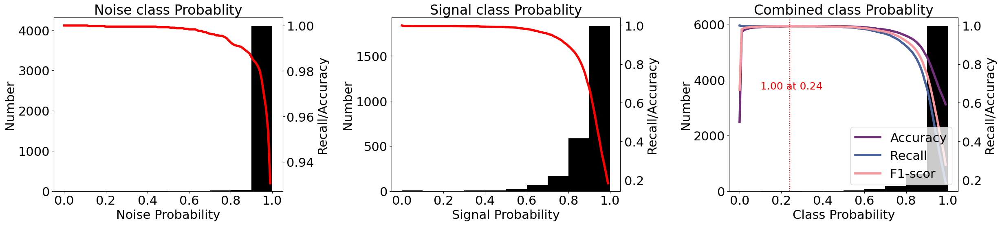

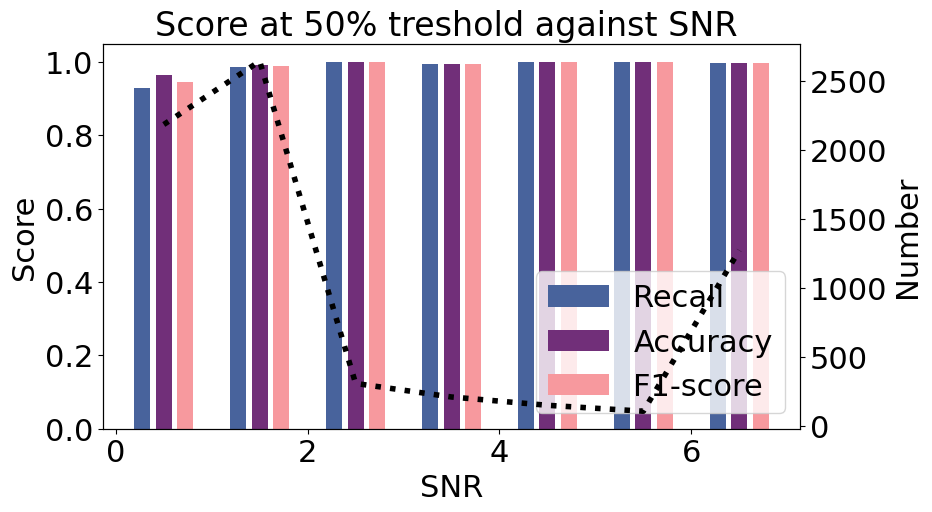

In [76]:
f1,f2, L = plotprobs(pred_list_OBS3,labels)
BestP3['OBS'] = L[0]
BestT3['OBS'] = L[1]
BestA3['OBS'] = L[3]
BestR3['OBS'] = L[2]
f1.savefig("Figure/OBST_Prob_MI.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/OBST_Snr_MI.svg", dpi=100, bbox_inches='tight')

## TESTING IsAE

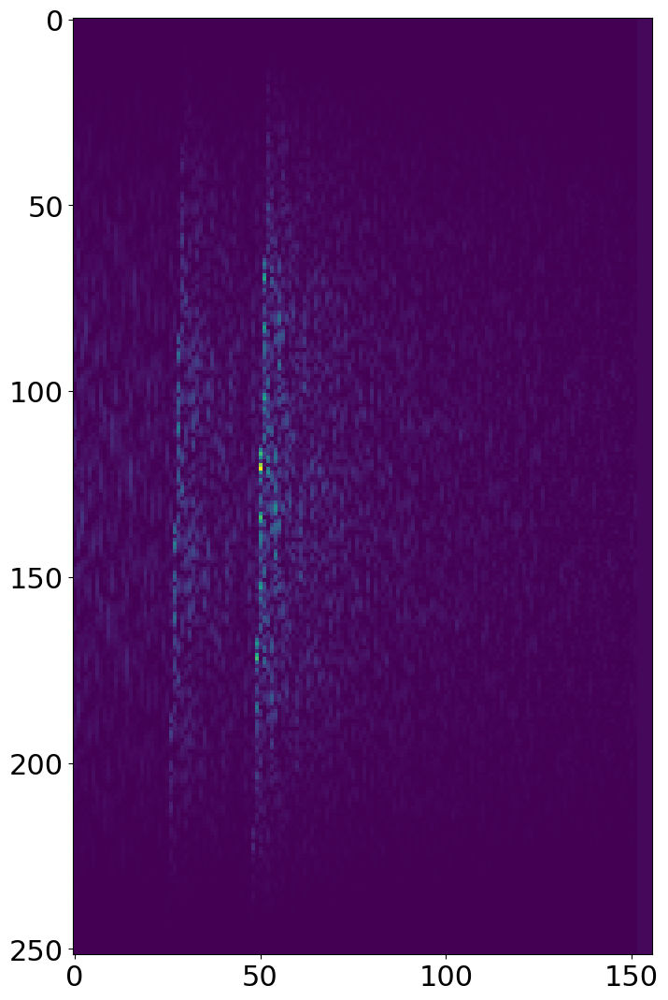

In [77]:
plt.figure(figsize=(8,16))
plt.imshow(Spectrogram[0][0])
plt.show()

In [78]:
device = 'cpu:0'
model = torch.jit.load(f'Classifier_vVOS_AVGPOOL_5_40.pt',map_location=device).to(device)

for param in model.encoder.parameters():
    param.requires_grad = False

model.eval()

RecursiveScriptModule(
  original_name=Classifier
  (encoder): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Conv2d)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Conv2d)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(original_name=Conv2d)
    (5): RecursiveScriptModule(original_name=ReLU)
    (6): RecursiveScriptModule(original_name=Conv2d)
    (7): RecursiveScriptModule(original_name=ReLU)
    (8): RecursiveScriptModule(original_name=Conv2d)
    (9): RecursiveScriptModule(original_name=ReLU)
    (10): RecursiveScriptModule(original_name=Conv2d)
  )
  (classify): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Linear)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Linear)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(or

In [79]:
prob = []
tic()
for data in tqdm(dataset_IsAEMI):
    with torch.no_grad(): 
        img, y_true = data
        img = img.unsqueeze(0).to(device).float()
        logits = model(img)
        p = logits.cpu().numpy()
        prob.append(logits[0][0].cpu())
toc()
chrono3['IsAE']= tac()
pred_lis_IsAE3 = np.array(prob)    

  0%|                                                                                                                                   | 0/1 [00:00<?, ?it/s]

52it [00:00, 513.18it/s]                                                                                                                                      

108it [00:00, 539.34it/s]

163it [00:00, 541.07it/s]

221it [00:00, 552.96it/s]

280it [00:00, 564.77it/s]

338it [00:00, 566.88it/s]

397it [00:00, 573.86it/s]

456it [00:00, 578.47it/s]

515it [00:00, 581.19it/s]

574it [00:01, 582.60it/s]

633it [00:01, 583.92it/s]

692it [00:01, 584.58it/s]

751it [00:01, 579.72it/s]

809it [00:01, 576.64it/s]

867it [00:01, 572.75it/s]

926it [00:01, 575.58it/s]

984it [00:01, 551.53it/s]

1040it [00:01, 533.39it/s]

1094it [00:01, 523.63it/s]

1147it [00:02, 518.45it/s]

1199it [00:02, 513.20it/s]

1251it [00:02, 509.11it/s]

1302it [00:02, 505.56it/s]

1353it [00:02, 502.89it/s]

1404it [00:02, 500.90it/s]

1456it [00:02, 505.07it/s]

1519it [00:02, 541.31it/s]

1583it [00:02, 570.37it/s]

1644it [00:02, 579.76it/s]

1703it [00:03, 577.10it/s]

1761it [00:03, 574.47it/s]

1819it [00:03, 574.72it/s]

1877it [00:03, 575.74it/s]

1935it [00:03, 576.33it/s]

1993it [00:03, 576.80it/s]

2051it [00:03, 575.59it/s]

2109it [00:03, 576.64it/s]

2167it [00:03, 577.23it/s]

2225it [00:03, 577.44it/s]

2283it [00:04, 577.59it/s]

2341it [00:04, 578.03it/s]

2399it [00:04, 577.92it/s]

2457it [00:04, 577.49it/s]

2515it [00:04, 577.58it/s]

2573it [00:04, 577.38it/s]

2631it [00:04, 575.11it/s]

2689it [00:04, 574.12it/s]

2747it [00:04, 570.97it/s]

2805it [00:04, 570.25it/s]

2863it [00:05, 566.77it/s]

2920it [00:05, 567.17it/s]

2978it [00:05, 568.10it/s]

3036it [00:05, 568.72it/s]

3093it [00:05, 568.22it/s]

3150it [00:05, 564.45it/s]

3207it [00:05, 564.01it/s]

3265it [00:05, 565.99it/s]

3323it [00:05, 567.42it/s]

3380it [00:06, 567.61it/s]

3437it [00:06, 568.20it/s]

3495it [00:06, 569.36it/s]

3552it [00:06, 568.76it/s]

3610it [00:06, 569.64it/s]

3668it [00:06, 570.96it/s]

3726it [00:06, 570.81it/s]

3784it [00:06, 568.08it/s]

3842it [00:06, 568.76it/s]

3900it [00:06, 569.50it/s]

3958it [00:07, 569.96it/s]

4015it [00:07, 569.59it/s]

4072it [00:07, 569.28it/s]

4129it [00:07, 568.98it/s]

4186it [00:07, 568.57it/s]

4243it [00:07, 565.04it/s]

4300it [00:07, 560.10it/s]

4358it [00:07, 564.68it/s]

4416it [00:07, 568.32it/s]

4477it [00:07, 580.62it/s]

4539it [00:08, 591.74it/s]

4599it [00:08, 560.24it/s]

4656it [00:08, 549.23it/s]

4719it [00:08, 570.65it/s]

4782it [00:08, 586.42it/s]

4845it [00:08, 597.92it/s]

4907it [00:08, 604.11it/s]

4970it [00:08, 610.46it/s]

5033it [00:08, 613.67it/s]

5097it [00:08, 619.25it/s]

5160it [00:09, 621.04it/s]

5224it [00:09, 625.10it/s]

5287it [00:09, 621.73it/s]

5350it [00:09, 621.57it/s]

5414it [00:09, 625.12it/s]

5477it [00:09, 623.77it/s]

5540it [00:09, 623.70it/s]

5604it [00:09, 625.99it/s]

5668it [00:09, 627.47it/s]

5731it [00:09, 620.89it/s]

5794it [00:10, 623.56it/s]

5857it [00:10, 624.94it/s]

5921it [00:10, 626.75it/s]

5984it [00:10, 626.64it/s]

6048it [00:10, 627.88it/s]

6112it [00:10, 628.95it/s]

6175it [00:10, 626.78it/s]

6238it [00:10, 627.43it/s]

6301it [00:10, 626.61it/s]

6364it [00:11, 621.44it/s]

6428it [00:11, 625.08it/s]

6492it [00:11, 626.11it/s]

6555it [00:11, 624.89it/s]

6619it [00:11, 626.79it/s]

6682it [00:11, 625.96it/s]

6745it [00:11, 623.08it/s]

6808it [00:11, 621.49it/s]

6869it [00:11, 581.58it/s]

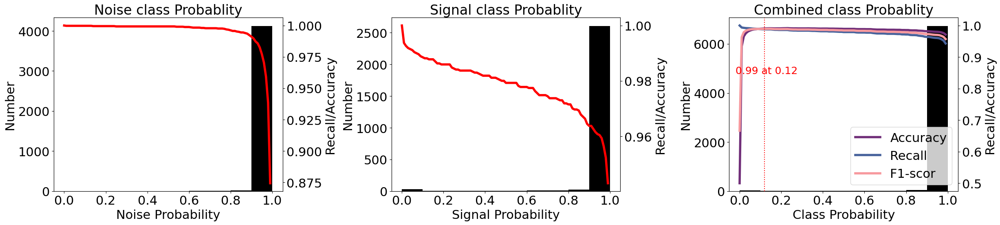

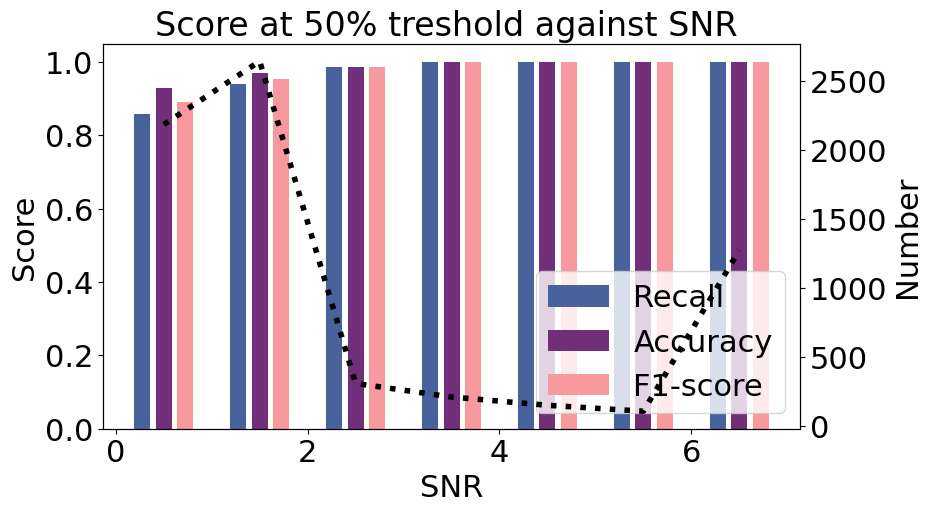

In [80]:
f1,f2, L = plotprobs(pred_lis_IsAE3,labels)
BestP3['IsAE'] = L[0]
BestT3['IsAE'] = L[1]
BestA3['IsAE'] = L[3]
BestR3['IsAE'] = L[2]
f1.savefig("Figure/IsAE_Prob_MI.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/IsAE_Snr_MI.svg", dpi=100, bbox_inches='tight')

## TESTING IsAE MinUSil

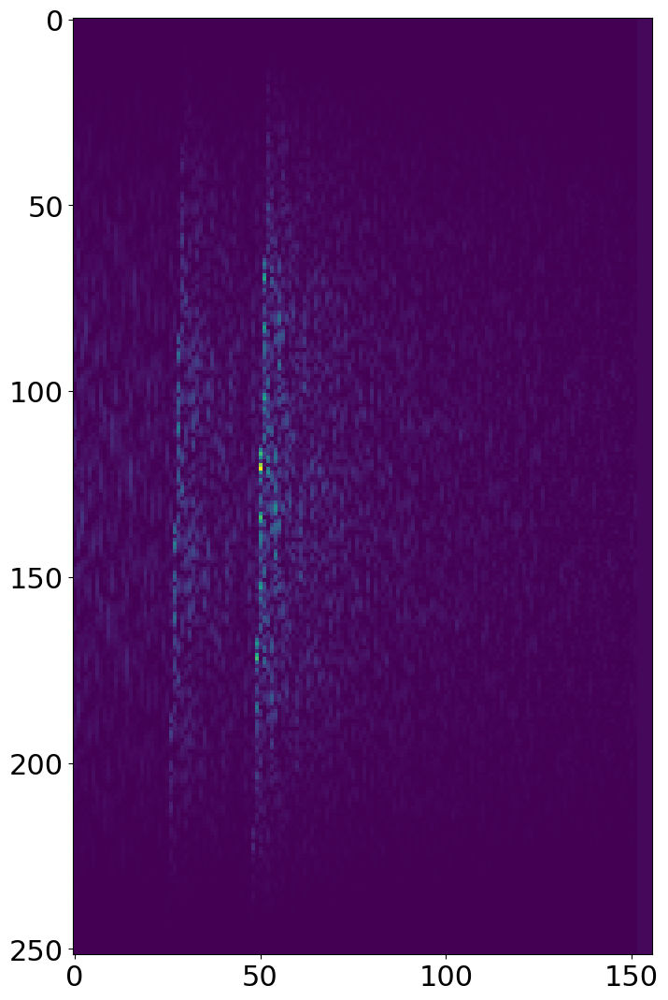

In [81]:
plt.figure(figsize=(8,16))
plt.imshow(Spectrogram[0][0])
plt.show()

In [82]:
device = 'cpu:0'
model = torch.jit.load(f'Classifier_vVOS_MAXPOOL_MINUSIL15.pt',map_location=device).to(device)

for param in model.encoder.parameters():
    param.requires_grad = False

model.eval()

RecursiveScriptModule(
  original_name=Classifier
  (encoder): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Conv2d)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Conv2d)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(original_name=Conv2d)
    (5): RecursiveScriptModule(original_name=ReLU)
    (6): RecursiveScriptModule(original_name=Conv2d)
    (7): RecursiveScriptModule(original_name=ReLU)
    (8): RecursiveScriptModule(original_name=Conv2d)
    (9): RecursiveScriptModule(original_name=ReLU)
    (10): RecursiveScriptModule(original_name=Conv2d)
  )
  (classify): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Linear)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Linear)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(or

In [83]:
prob = []
tic()
for data in tqdm(dataset_IsAEMI):
    with torch.no_grad(): 
        img, y_true = data
        img = img.unsqueeze(0).to(device).float()
        logits = model(img)
        p = logits.cpu().numpy()
        prob.append(logits[0][0].cpu())
toc()
#chrono['IsAEMIN']= tac()
pred_lis_IsAEMIN3 = np.array(prob)    

  0%|                                                                                                                                   | 0/1 [00:00<?, ?it/s]

59it [00:00, 585.01it/s]                                                                                                                                      

118it [00:00, 546.20it/s]

173it [00:00, 542.69it/s]

239it [00:00, 585.11it/s]

304it [00:00, 606.46it/s]

368it [00:00, 614.82it/s]

433it [00:00, 625.35it/s]

497it [00:00, 627.60it/s]

562it [00:00, 633.35it/s]

626it [00:01, 617.70it/s]

688it [00:01, 601.64it/s]

749it [00:01, 595.87it/s]

809it [00:01, 593.85it/s]

873it [00:01, 605.14it/s]

934it [00:01, 598.55it/s]

996it [00:01, 603.03it/s]

1059it [00:01, 609.94it/s]

1123it [00:01, 618.56it/s]

1185it [00:01, 618.67it/s]

1250it [00:02, 625.21it/s]

1314it [00:02, 627.00it/s]

1379it [00:02, 631.25it/s]

1443it [00:02, 631.77it/s]

1507it [00:02, 630.65it/s]

1571it [00:02, 631.49it/s]

1635it [00:02, 628.22it/s]

1698it [00:02, 624.43it/s]

1761it [00:02, 621.33it/s]

1824it [00:02, 621.22it/s]

1888it [00:03, 623.97it/s]

1951it [00:03, 625.64it/s]

2014it [00:03, 624.06it/s]

2077it [00:03, 614.40it/s]

2140it [00:03, 618.40it/s]

2203it [00:03, 619.91it/s]

2266it [00:03, 612.51it/s]

2328it [00:03, 574.23it/s]

2387it [00:03, 576.28it/s]

2450it [00:04, 589.39it/s]

2514it [00:04, 601.48it/s]

2578it [00:04, 610.06it/s]

2640it [00:04, 608.83it/s]

2702it [00:04, 606.81it/s]

2763it [00:04, 599.96it/s]

2824it [00:04, 589.77it/s]

2884it [00:04, 581.96it/s]

2943it [00:04, 577.06it/s]

3001it [00:04, 573.50it/s]

3059it [00:05, 571.34it/s]

3117it [00:05, 568.87it/s]

3174it [00:05, 568.51it/s]

3232it [00:05, 569.85it/s]

3289it [00:05, 567.25it/s]

3346it [00:05, 566.71it/s]

3403it [00:05, 564.86it/s]

3460it [00:05, 566.02it/s]

3517it [00:05, 567.18it/s]

3574it [00:05, 567.38it/s]

3631it [00:06, 567.29it/s]

3688it [00:06, 567.30it/s]

3745it [00:06, 567.11it/s]

3802it [00:06, 566.91it/s]

3859it [00:06, 564.41it/s]

3916it [00:06, 564.29it/s]

3974it [00:06, 566.04it/s]

4031it [00:06, 566.94it/s]

4088it [00:06, 565.40it/s]

4145it [00:06, 566.41it/s]

4202it [00:07, 567.46it/s]

4259it [00:07, 565.31it/s]

4316it [00:07, 566.16it/s]

4374it [00:07, 567.95it/s]

4431it [00:07, 568.18it/s]

4488it [00:07, 567.15it/s]

4545it [00:07, 567.45it/s]

4602it [00:07, 567.22it/s]

4659it [00:07, 567.27it/s]

4716it [00:07, 567.20it/s]

4773it [00:08, 565.24it/s]

4830it [00:08, 565.75it/s]

4887it [00:08, 560.68it/s]

4944it [00:08, 562.21it/s]

5001it [00:08, 563.56it/s]

5058it [00:08, 563.40it/s]

5115it [00:08, 560.74it/s]

5172it [00:08, 562.81it/s]

5230it [00:08, 566.28it/s]

5289it [00:08, 571.33it/s]

5348it [00:09, 574.70it/s]

5407it [00:09, 576.71it/s]

5466it [00:09, 578.03it/s]

5524it [00:09, 576.89it/s]

5582it [00:09, 576.22it/s]

5640it [00:09, 573.45it/s]

5698it [00:09, 573.54it/s]

5756it [00:09, 573.79it/s]

5814it [00:09, 574.04it/s]

5872it [00:10, 574.19it/s]

5930it [00:10, 572.36it/s]

5988it [00:10, 571.10it/s]

6046it [00:10, 571.55it/s]

6104it [00:10, 570.08it/s]

6162it [00:10, 570.96it/s]

6220it [00:10, 571.29it/s]

6278it [00:10, 572.06it/s]

6336it [00:10, 572.46it/s]

6394it [00:10, 570.79it/s]

6452it [00:11, 572.42it/s]

6510it [00:11, 573.05it/s]

6568it [00:11, 573.44it/s]

6626it [00:11, 572.02it/s]

6684it [00:11, 573.28it/s]

6742it [00:11, 572.47it/s]

6800it [00:11, 571.35it/s]

6858it [00:11, 573.23it/s]

6869it [00:11, 584.76it/s]

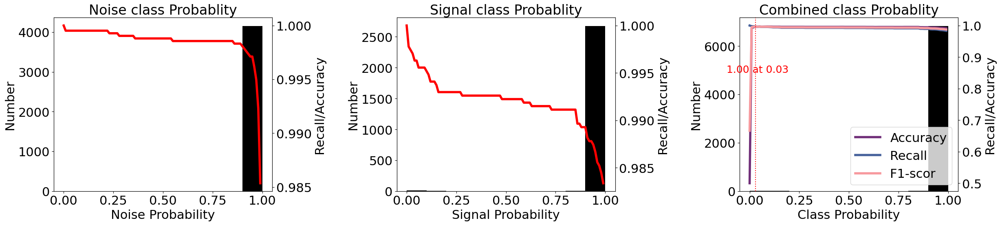

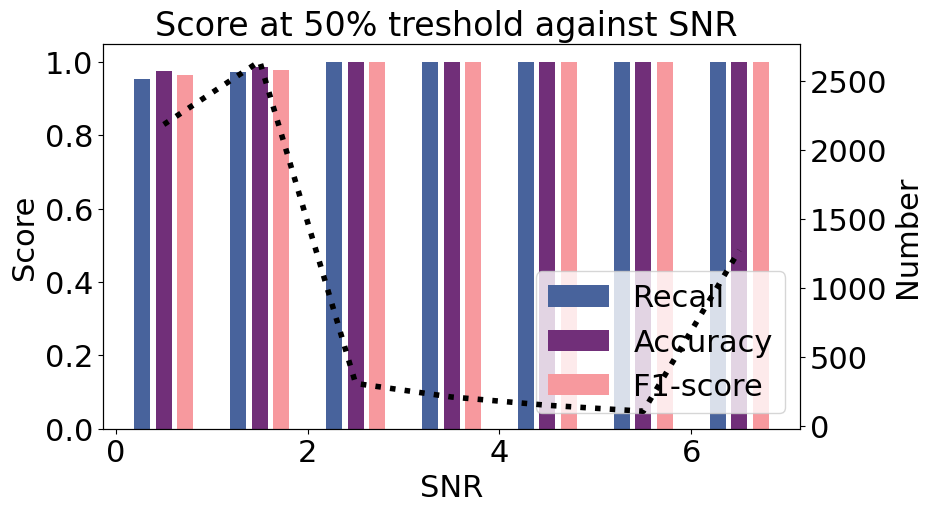

In [84]:
f1,f2, L = plotprobs(pred_lis_IsAEMIN3,labels)
BestP3['IsAEMIN'] = L[0]
BestT3['IsAEMIN'] = L[1]
BestA3['IsAEMIN'] = L[3]
BestR3['IsAEMIN'] = L[2]
f1.savefig("Figure/IsAEMIN_Prob_MI.svg", dpi=100, bbox_inches='tight')
f2.savefig("Figure/IsAEMIN_Snr_MI.svg", dpi=100, bbox_inches='tight')

## Clock Figure

In [85]:
chrono3  = dict(sorted(chrono3.items(), key=lambda item: item[1]))

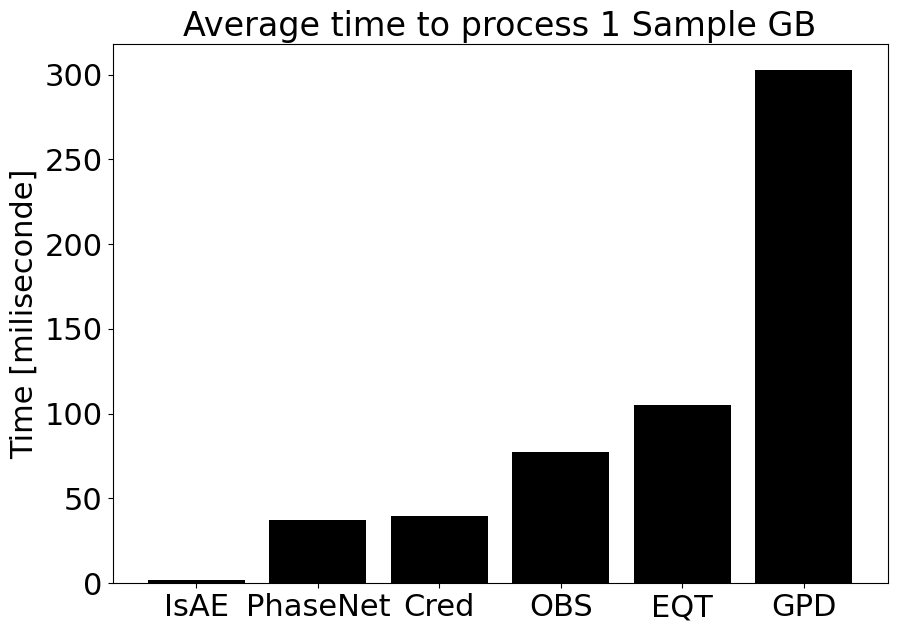

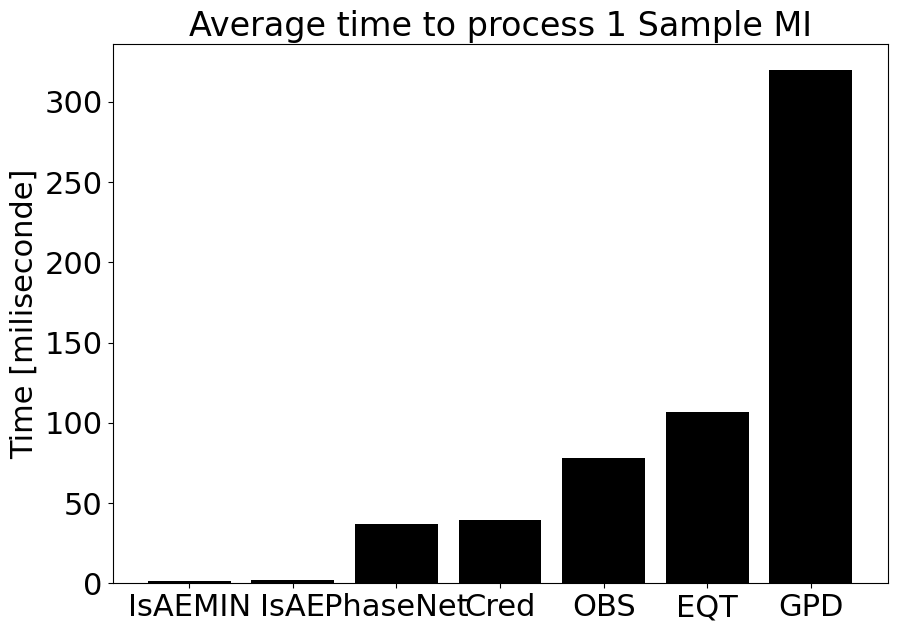

In [86]:
plt.figure(figsize=(10,7))
clocks_k = list(chrono3.keys())
plt.bar(clocks_k, [ chrono3[x]/len(pred_lis_IsAE3)*1000 for x in clocks_k],color='k' )
plt.ylabel('Time [miliseconde]')
plt.title('Average time to process 1 Sample GB')
plt.show()

plt.figure(figsize=(10,7))
clocks_k = list(chrono2.keys())
plt.bar(clocks_k, [ chrono2[x]/len(pred_lis_IsAE2)*1000 for x in clocks_k],color='k' )
plt.ylabel('Time [miliseconde]')
plt.title('Average time to process 1 Sample MI')
plt.savefig('Figure/Time.svg', format='SVG', dpi=200, bbox_inches='tight')
plt.show()

# Freq Test

In [87]:
MaxFreqs= np.concatenate((MaxFrqsOD, MaxFrqsGB,MaxFrqsMin), axis=0)
Labels = np.concatenate((LabelOD,LabelGB ,LabelMin), axis=0)

pred_list_OBS13= np.concatenate((pred_list_OBS1,pred_list_OBS2,pred_list_OBS3), axis=0)
pred_list_IsAE13= np.concatenate((pred_list_IsAE1,pred_lis_IsAE2,pred_lis_IsAE3), axis=0)
pred_list_Cred13= np.concatenate((pred_list_Cred1,pred_list_Cred2,pred_list_Cred3), axis=0)

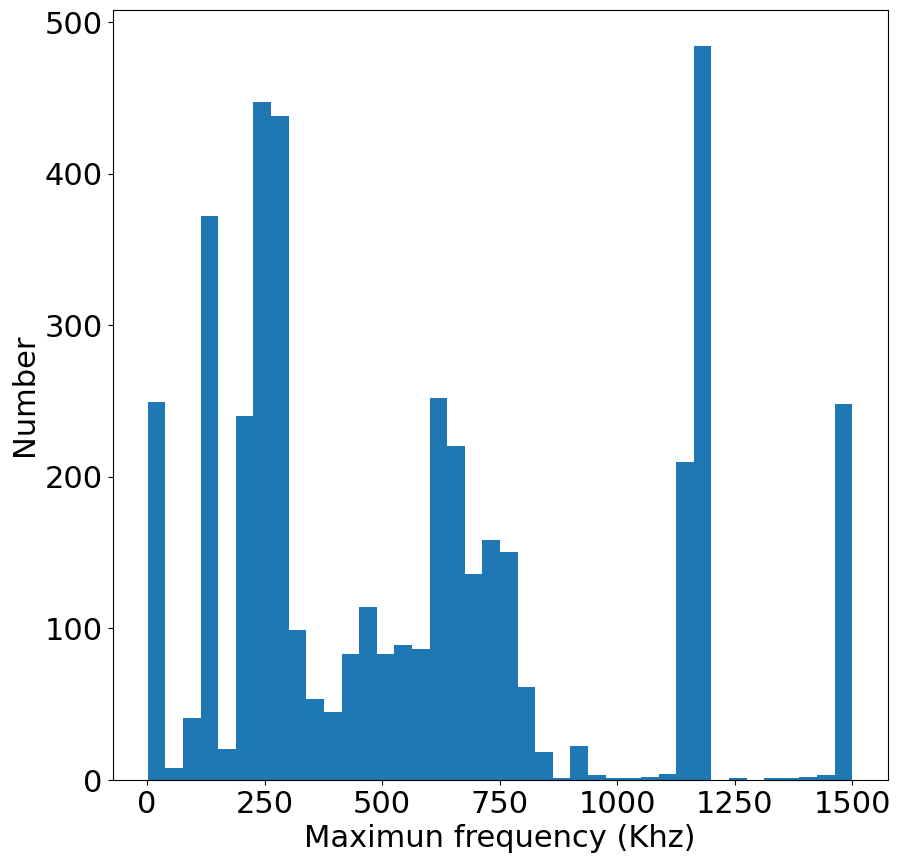

In [88]:
plt.figure(figsize=(10,10))
MaxFrqscp = MaxFreqs.copy()
MaxFrqscp[MaxFreqs>1500] = 1500
plt.hist(MaxFrqscp[Labels==1],bins=40)
plt.xlabel('Maximun frequency (Khz)')
plt.ylabel('Number')
plt.show()

In [89]:
MaxFreqs.shape,Labels.shape

((11189,), (11189,))

## OBSTransformer

In [90]:
Ro,xo,No, Ao = try_HZ(pred_list_OBS13[Labels!=2],MaxFreqs[Labels!=2],Labels[Labels!=2])

In [91]:
x = xo[1:]/2 + xo[:-1]/2

In [92]:
x

array([ 350.,  450.,  550.,  650.,  750.,  850.,  950., 1050., 1150.,
       1250., 1350.])

## IsAE

In [93]:
RIs,xis,Nis, Ais = try_HZ(pred_list_IsAE13[Labels!=2],MaxFreqs[Labels!=2],Labels[Labels!=2])

## CRED

In [94]:
Rcr,xcr,Ncr, Acr = try_HZ(pred_list_Cred13[Labels!=2],MaxFreqs[Labels!=2],Labels[Labels!=2])

## Figure

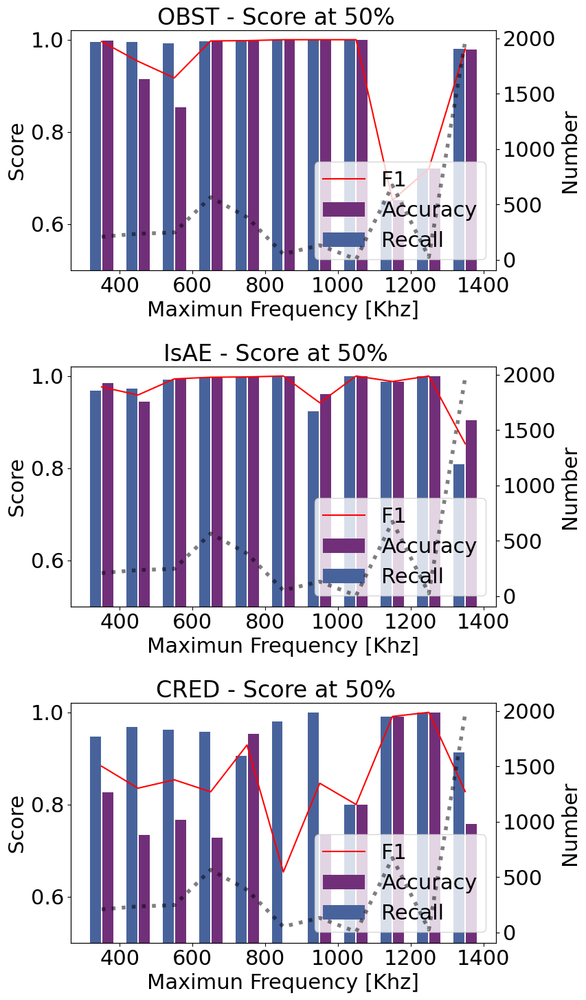

Cred Mean ACC and Recall  0.7983252158268389 0.9479461129063882
OBST Mean ACC and Recall  0.9193281462695502 0.9389030180681304
IsAE Mean ACC and Recall  0.9795614056126415 0.9678337355357417


In [95]:
plt.figure(figsize=(9,15))
plt.subplot(3,1,1)
n=1*2
offset=(1/n)
plt.bar(x+17 ,Ao,width=(x[1]-x[0])*0.6/2,label='Accuracy',color='#712F79')
plt.bar(x-17 ,Ro,width=(x[1]-x[0])*0.6/2,label='Recall',color='#48639C')
plt.plot(x,2*Ao*Ro/(Ro+Ao+1e-11),c='r',label='F1')
plt.xlabel('Maximun Frequency [Khz]')
plt.ylabel('Score')
plt.legend(loc='lower right')
plt.ylim([0.5,1.02])
plt.twinx()
plt.plot(x,No,color='k',ls = ':',lw=4,alpha=0.5)
plt.ylabel('Number')
plt.title('OBST - Score at 50%  ')

plt.subplot(3,1,2)
n=1*2
offset=(1/n)
plt.bar(x+17 ,Ais,width=(x[1]-x[0])*0.6/2,label='Accuracy',color='#712F79')
plt.bar(x-17 ,RIs,width=(x[1]-x[0])*0.6/2,label='Recall',color='#48639C')
plt.plot(x,2*Ais*RIs/(RIs+Ais+1e-11),c='r',label='F1')
plt.xlabel('Maximun Frequency [Khz]')
plt.ylabel('Score')
plt.legend(loc='lower right')
plt.ylim([0.5,1.02])
plt.twinx()
plt.plot(x,No,color='k',ls = ':',lw=4,alpha=0.5)
plt.ylabel('Number')
plt.title('IsAE - Score at 50%  ')

plt.subplot(3,1,3)
n=1*2
offset=(1/n)
plt.bar(x+17 ,Acr,width=(x[1]-x[0])*0.6/2,label='Accuracy',color='#712F79')
plt.bar(x-17 ,Rcr,width=(x[1]-x[0])*0.6/2,label='Recall',color='#48639C')
plt.plot(x,2*Acr*Rcr/(Rcr+Acr+1e-11),c='r',label='F1')
plt.xlabel('Maximun Frequency [Khz]')
plt.ylabel('Score')
plt.legend(loc='lower right')
plt.ylim([0.5,1.02])
plt.twinx()
plt.plot(x,Ncr,color='k',ls = ':',lw=4,alpha=0.5)
plt.ylabel('Number')
plt.title('CRED - Score at 50%  ')
plt.tight_layout()
plt.savefig('Figure/Freq_Compare.svg', format='SVG', dpi=200, bbox_inches='tight')
plt.show()

print('Cred Mean ACC and Recall ',np.nanmean(Acr),np.nanmean(Rcr))
print('OBST Mean ACC and Recall ',np.nanmean(Ao),np.nanmean(Ro))
print('IsAE Mean ACC and Recall ',np.nanmean(Ais),np.nanmean(RIs))

# Merge figure

In [96]:
BestP1,BestT2

({'Cred': np.float64(0.8523101271716785),
  'EQT': np.float64(0.7371735240719826),
  'GPD': np.float64(0.9353830383763277),
  'PhaseNet': np.float64(0.6666666666622222),
  'OBS': np.float64(0.9784320980357724),
  'IsAE': np.float64(0.9942162312803303),
  'IsAEMIN': np.float64(0.9942162312803303)},
 {'Cred': np.float64(0.55),
  'EQT': np.float64(0.01),
  'GPD': np.float64(0.39),
  'PhaseNet': np.float64(0.0),
  'OBS': np.float64(0.43),
  'IsAE': np.float64(0.01),
  'IsAEMIN': np.float64(0.01)})

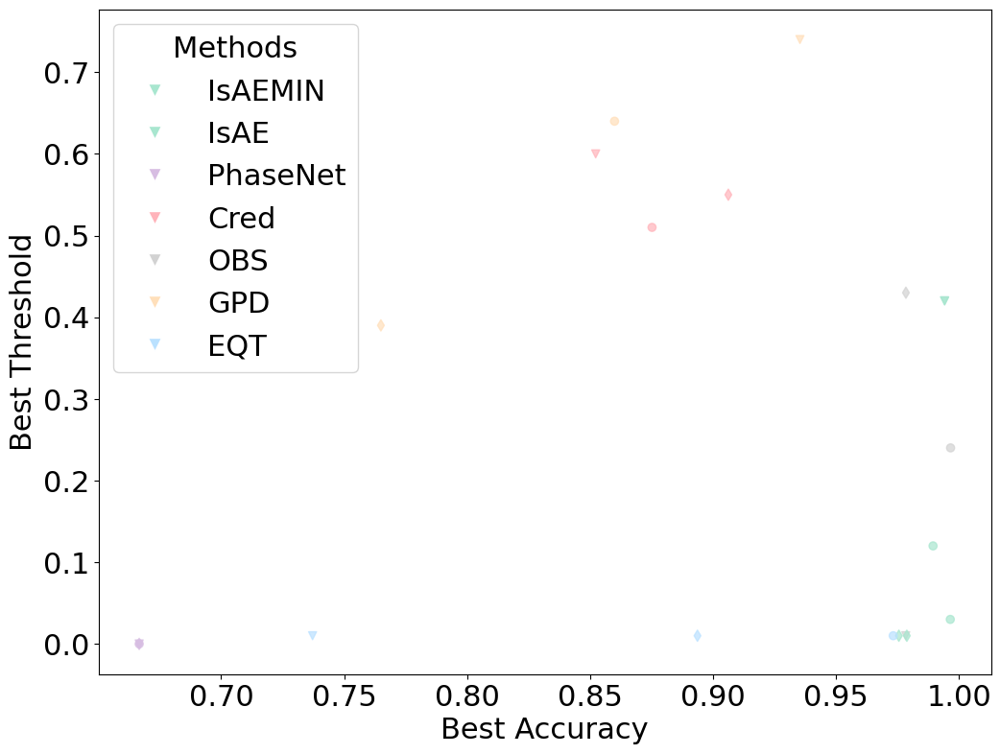

In [97]:
mklist = ['v','o','x','+','8']
colordic = {
    'IsAEMIN': '#A8E6CF',    # Pastel green
    'IsAE': '#A8E6CF',    # Pastel green
    'PhaseNet': '#D7BDE2', # Pastel purple
    'Cred': '#FFB3BA',    # Pastel red
    'OBS': '#D2D2D2',     # Pastel gray
    'GPD': '#FFDFBA',    # Pastel orange
    'EQT': '#BAE1FF'     # Pastel blue
}

plt.figure(figsize=(12, 9))
dkey = list(BestP1.keys())
bestP_k = [BestP1[x] for x in list(BestP1.keys())]
bestT_k = [BestT1[x] for x in list(BestP1.keys())]
Colortemp = [colordic[x] for x in list(BestP1.keys())]

# Scatter plot
scatter = plt.scatter(bestP_k, bestT_k, color=Colortemp, marker='v',alpha=0.7)


dkey = list(BestP2.keys())
bestP_k = [BestP2[x] for x in list(BestP2.keys())]
bestT_k = [BestT2[x] for x in list(BestP2.keys())]
Colortemp = [colordic[x] for x in list(BestP2.keys())]

# Scatter plot
scatter = plt.scatter(bestP_k, bestT_k, color=Colortemp, marker='d',alpha=0.7)


dkey = list(BestP2.keys())
bestP_k = [BestP3[x] for x in list(BestP2.keys())]
bestT_k = [BestT3[x] for x in list(BestP2.keys())]
Colortemp = [colordic[x] for x in list(BestP2.keys())]

# Scatter plot
scatter = plt.scatter(bestP_k, bestT_k, color=Colortemp, marker='o',alpha=0.7)


# Create legend handles
legend_labels = list(colordic.keys())
legend_colors = list(colordic.values())
legend_handles = [plt.Line2D([0], [0], marker='v', color='w', markerfacecolor=color, markersize=10, label=label)
                  for label, color in zip(legend_labels, legend_colors)]

# Add legend
plt.legend(handles=legend_handles, title='Methods')

plt.xlabel('Best Accuracy')
plt.ylabel('Best Threshold')
plt.show()

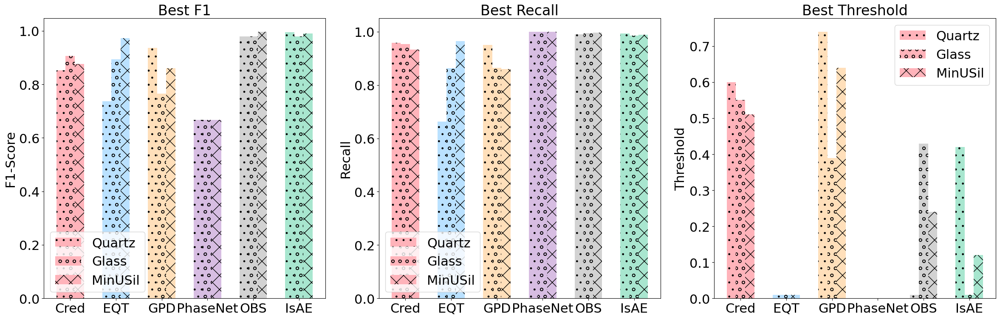

In [98]:
# Hatch patterns for each dictionary
hatches = ['/', '\\', '|', '-', '+', 'x', 'o', 'O', '.', '*']

# Prepare data for plotting
methods = ['Cred','EQT','GPD','PhaseNet','OBS','IsAE']
bar_width = 0.2

# Create a figure with two subplots
fig, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(24, 8))

# Bar plot for BestF values
x_indexes = np.arange(len(methods))
ax1.bar(x_indexes - bar_width, [BestP1[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Quartz', hatch=hatches[-2])
ax1.bar(x_indexes, [BestP2[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Glass', hatch=hatches[6])
ax1.bar(x_indexes + bar_width, [BestP3[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='MinUSil', hatch=hatches[5])
ax1.set_title('Best F1')
ax1.set_xticks(x_indexes)
ax1.set_xticklabels(methods)
ax1.set_ylabel('F1-Score')
ax1.legend(loc=3)

# Bar plot for BestR values
ax2.bar(x_indexes - bar_width, [BestR1[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Quartz', hatch=hatches[-2])
ax2.bar(x_indexes, [BestR2[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Glass', hatch=hatches[6])
ax2.bar(x_indexes + bar_width, [BestR3[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='MinUSil', hatch=hatches[5])
ax2.set_title('Best Recall')
ax2.set_xticks(x_indexes)
ax2.set_xticklabels(methods)
ax2.set_ylabel('Recall')
#ax2.set_ylim((0.5, 1.02))
ax2.legend(loc=3)

# Bar plot for BestT values
ax3.bar(x_indexes - bar_width, [BestT1[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Quartz', hatch=hatches[-2])
ax3.bar(x_indexes, [BestT2[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Glass', hatch=hatches[6])
ax3.bar(x_indexes + bar_width, [BestT3[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='MinUSil', hatch=hatches[5])
ax3.set_title('Best Threshold')
ax3.set_xticks(x_indexes)
ax3.set_xticklabels(methods)
ax3.set_ylabel('Threshold')
ax3.legend()

plt.tight_layout()
plt.savefig('Figure/bar_plots_with_hatch.svg', format='SVG', dpi=200, bbox_inches='tight')
plt.show()

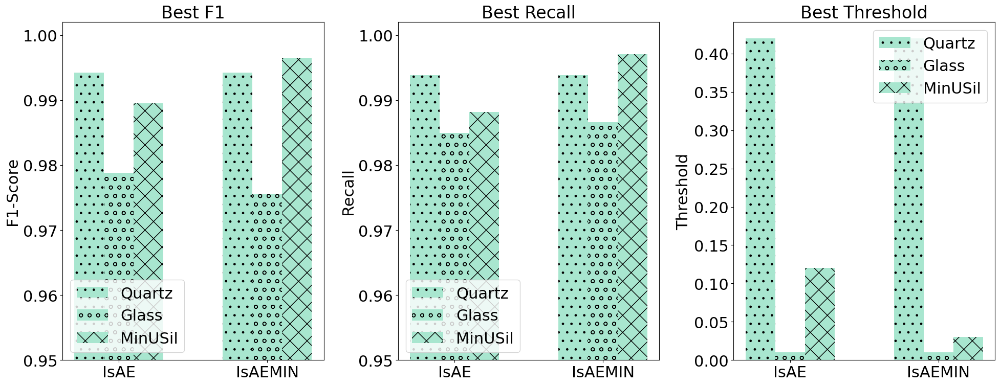

In [99]:
# Hatch patterns for each dictionary
hatches = ['/', '\\', '|', '-', '+', 'x', 'o', 'O', '.', '*']

# Prepare data for plotting
methods = ['IsAE','IsAEMIN']
bar_width = 0.2

# Create a figure with two subplots
fig, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(20, 8))

# Bar plot for BestF values
x_indexes = np.arange(len(methods))
ax1.bar(x_indexes - bar_width, [BestP1[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Quartz', hatch=hatches[-2])
ax1.bar(x_indexes, [BestP2[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Glass', hatch=hatches[6])
ax1.bar(x_indexes + bar_width, [BestP3[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='MinUSil', hatch=hatches[5])
ax1.set_title('Best F1')
ax1.set_xticks(x_indexes)
ax1.set_xticklabels(methods)
ax1.set_ylabel('F1-Score')
ax1.set_ylim((0.95, 1.002))
ax1.legend(loc=3)

# Bar plot for BestR values
ax2.bar(x_indexes - bar_width, [BestR1[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Quartz', hatch=hatches[-2])
ax2.bar(x_indexes, [BestR2[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Glass', hatch=hatches[6])
ax2.bar(x_indexes + bar_width, [BestR3[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='MinUSil', hatch=hatches[5])
ax2.set_title('Best Recall')
ax2.set_xticks(x_indexes)
ax2.set_xticklabels(methods)
ax2.set_ylabel('Recall')
ax2.set_ylim((0.95, 1.002))
ax2.legend(loc=3)

# Bar plot for BestT values
ax3.bar(x_indexes - bar_width, [BestT1[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Quartz', hatch=hatches[-2])
ax3.bar(x_indexes, [BestT2[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='Glass', hatch=hatches[6])
ax3.bar(x_indexes + bar_width, [BestT3[m] for m in methods], width=bar_width,
        color=[colordic[m] for m in methods], label='MinUSil', hatch=hatches[5])
ax3.set_title('Best Threshold')
ax3.set_xticks(x_indexes)
ax3.set_xticklabels(methods)
ax3.set_ylabel('Threshold')
ax3.legend()

plt.tight_layout()
plt.savefig('Figure/bar_plots_IsAE_with_hatch.svg', format='SVG', dpi=200, bbox_inches='tight')
plt.show()

In [100]:
bestP_k,bestT_k,Colortemp

([np.float64(0.8752260413991828),
  np.float64(0.9733116486219442),
  np.float64(0.8599816694826693),
  np.float64(0.6666666666622222),
  np.float64(0.9966415389386378),
  np.float64(0.9895075925094521),
  np.float64(0.9965213218710335)],
 [np.float64(0.51),
  np.float64(0.01),
  np.float64(0.64),
  np.float64(0.0),
  np.float64(0.24),
  np.float64(0.12),
  np.float64(0.03)],
 ['#FFB3BA', '#BAE1FF', '#FFDFBA', '#D7BDE2', '#D2D2D2', '#A8E6CF', '#A8E6CF'])

In [101]:
import os
import re
import cairosvg
from PIL import Image, ImageDraw, ImageFont

def combine_figures_vertically(folder_path):
    # Get all SVG files in the folder
    files = [f for f in os.listdir(folder_path) if f.endswith('.svg')]

    # Group files by datatype and dataset
    groups = {}
    for file in files:
        try:
            model_name, datatype, dataset = re.match(r"([^_]+)_([^_]+)_([^_]+)\.svg", file).groups()
            key = (datatype, dataset)
            if key not in groups:
                groups[key] = []
            groups[key].append((model_name, file))
        except AttributeError:
            print(f"Skipping file {file}: filename does not match expected pattern.")
            continue

    # Combine figures for each group
    for (datatype, dataset), models_files in groups.items():
        # Convert SVG to PNG and open images
        images = []
        png_files = []
        for model_name, svg_file in models_files:
            svg_path = os.path.join(folder_path, svg_file)
            png_path = svg_path.replace('.svg', '.png')
            cairosvg.svg2png(url=svg_path, write_to=png_path)
            images.append(Image.open(png_path))
            png_files.append(png_path)

        # Combine images vertically
        widths, heights = zip(*(img.size for img in images))
        total_height = sum(heights)
        max_width = max(widths)

        combined_img = Image.new('RGB', (max_width, total_height))

        y_offset = 0
        for (model_name, _), img in zip(models_files, images):
            # Add model_name text to the top-left corner of each sub-figure
            draw = ImageDraw.Draw(img)
            try:
                font = ImageFont.truetype("FreeMono.ttf", 30)
            except IOError:
                font = ImageFont.load_default()
            draw.text((0, 0), model_name, fill="black", font=font)
            # Paste the image into the combined image
            combined_img.paste(img, (0, y_offset))
            y_offset += img.size[1]

        # Save the combined image
        output_filename = f"combined_{datatype}_{dataset}.png"
        combined_img.save(os.path.join(folder_path, output_filename))

        # Clean up temporary PNG files
        for png_file in png_files:
            os.remove(png_file)

# Example usage
folder_path = "Figure"  # Replace with your folder path
combine_figures_vertically(folder_path)


Skipping file bar_plots_with_hatch.svg: filename does not match expected pattern.
Skipping file Time.svg: filename does not match expected pattern.
Skipping file Freq_Compare.svg: filename does not match expected pattern.
Skipping file bar_plots_IsAE_with_hatch.svg: filename does not match expected pattern.


In [102]:
font = ImageFont.load_default()

# Do Save

In [103]:
import pickle

In [104]:
def save_all_dicts_to_pickle(filename='all_dicts.pkl'):
    """
    Save all dictionaries in the global environment to a pickle file.

    Args:
        filename (str): Name of the pickle file.
    """
    global_vars = globals()
    dicts_to_save = {name: obj for name, obj in global_vars.items()
                     if isinstance(obj, dict) and not name.startswith('__') and ('chrono' in name or 'Best' in name)}
    with open(filename, 'wb') as f:
        pickle.dump(dicts_to_save, f)
    print([ k for k in  dicts_to_save.keys()] )
    print(f"Saved {len(dicts_to_save)} dictionaries to {filename}")

def load_all_dicts_from_pickle(filename='all_dicts.pkl'):
    """
    Load all dictionaries from a pickle file back into the global environment.

    Args:
        filename (str): Name of the pickle file.
    """
    with open(filename, 'rb') as f:
        loaded_dicts = pickle.load(f)
    for name, obj in loaded_dicts.items():
        globals()[name] = obj
    print(f"Loaded {len(loaded_dicts)} dictionaries from {filename}")


In [105]:

# Save all dictionaries
save_all_dicts_to_pickle()

['BestP1', 'BestT1', 'BestR1', 'BestA1', 'chrono', 'BestP2', 'BestT2', 'BestA2', 'BestR2', 'chrono2', 'BestP3', 'BestT3', 'chrono3', 'BestA3', 'BestR3']
Saved 15 dictionaries to all_dicts.pkl


In [106]:
# Load

In [107]:

# Later, load them back
load_all_dicts_from_pickle()


Loaded 15 dictionaries from all_dicts.pkl


# Showcase on Continuous Data

In [108]:
device = 'cpu:0'
model = torch.jit.load(f'Classifier_vVOS_AVGPOOL_5_40.pt',map_location=device).to(device)

for param in model.encoder.parameters():
    param.requires_grad = False

model.eval()

RecursiveScriptModule(
  original_name=Classifier
  (encoder): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Conv2d)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Conv2d)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(original_name=Conv2d)
    (5): RecursiveScriptModule(original_name=ReLU)
    (6): RecursiveScriptModule(original_name=Conv2d)
    (7): RecursiveScriptModule(original_name=ReLU)
    (8): RecursiveScriptModule(original_name=Conv2d)
    (9): RecursiveScriptModule(original_name=ReLU)
    (10): RecursiveScriptModule(original_name=Conv2d)
  )
  (classify): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Linear)
    (1): RecursiveScriptModule(original_name=ReLU)
    (2): RecursiveScriptModule(original_name=Linear)
    (3): RecursiveScriptModule(original_name=ReLU)
    (4): RecursiveScriptModule(or

In [109]:
from scipy import signal
from tqdm import tqdm
from torchvision import transforms

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: (x-x.mean()) / x.std() if x.std() > 0 else x-x.mean()),
])


def predict(model, data):
    model.eval()  # Set model to evaluation mode

    (image, label) = data
    # Get the first sample
    image = image.unsqueeze(0).to(device).float()  # Add batch dimension
    if label != '?':
        true_label = label.unsqueeze(0).to(device).float()
        label=true_label.cpu().numpy()

    with torch.no_grad():  # No gradient calculation
        logits = model(image)  # Raw model output
        #probability = torch.sigmoid(logits)  # Convert to probability
        #prediction = (probability >= 0.5).float()  # Convert to binary (0 or 1)

    return label, logits.cpu().numpy()
    
def real_test(x_raw):
    fs = 10e6
    tt = np.arange(0,len(x_raw))/fs
    windows = 0.00080 # in seconde
    n_w = int(windows * fs) # nunber of point per windows windows

    overlap_x = n_w // 2 # overlap over 50% of the windows
    #print(n_w)
    overlap_x = int(n_w*0.8) #1924 # overlap 1200 over 1500 one
    step_x = n_w - overlap_x

    slices_x = [x_raw[i:i + n_w]  for i in range(0, len(x_raw) - n_w, step_x)]
    slices_t = [tt[i:i + n_w]  for i in range(0, len(tt) - n_w, step_x)]

    res = []
    for x_filt in tqdm(slices_x) :
        n_fft = int(100*2.52)
        window = np.hanning(n_fft)
        overlap = int(n_fft * 0.8)
        step = n_fft - overlap
        slices = [x_filt[i:i + n_fft] * window for i in range(0, len(x_filt) - n_fft, step)]
        stft = np.fft.fft(slices, axis=1)
        ifft_result = np.fft.ifft(stft, axis=1)
        Im = np.abs(ifft_result.T)
        image = transform(Im)
        
        index_to_remove = 154
        new_tensor = image[..., :index_to_remove]
        #print(np.shape(image))
        pad_size = 156-np.shape(image)[2]
        #print(pad_size,np.shape(new_tensor))
        padding = (0, pad_size)  # Pad only the last dimension

        # Apply padding
        padded_tensor = F.pad(image, padding, "constant", 0)
        
        true_label,  logit = predict(model, (padded_tensor,'?'))
        #print(np.around(logit,3), np.around(logit[0][1],3))
        logit = logit[0][0]
        res.append(np.around(logit,3))
    return res,slices_x,slices_t

In [110]:

x_raw = np.load('/home/jupyter-septier/PhdFolder_Liverpool/Rock_data/Gouge_qwartz110_150725/chm_2025-07-15 16:42:05.155421.npy')

fs = 1e7 # targeted sampling rate
tt = np.arange(0,len(x_raw))/fs
windows = 0.00080 # in seconde
n_w = int(windows * fs) # nunber of point per windows windows

overlap = int(n_w*0.8)#1400#n_w // 4 # overlap over 50% of the windows
print(overlap)
step = n_w - overlap

slices = [x_raw[i:i + n_w]  for i in range(0, len(x_raw) - n_w, step)]


6400


In [111]:
res,slices_x,slices_t=real_test(x_raw)

  0%|                                                                                                                               | 0/10481 [00:00<?, ?it/s]

  0%|▎                                                                                                                    | 29/10481 [00:00<00:36, 285.92it/s]

  1%|▋                                                                                                                    | 58/10481 [00:00<00:37, 274.70it/s]

  1%|▉                                                                                                                    | 88/10481 [00:00<00:36, 281.89it/s]

  1%|█▎                                                                                                                  | 117/10481 [00:00<00:36, 281.49it/s]

  1%|█▌                                                                                                                  | 146/10481 [00:00<00:36, 283.02it/s]

  2%|█▉                                                                                                                  | 176/10481 [00:00<00:36, 285.84it/s]

  2%|██▎                                                                                                                 | 205/10481 [00:00<00:35, 285.86it/s]

  2%|██▌                                                                                                                 | 234/10481 [00:00<00:35, 285.07it/s]

  3%|██▉                                                                                                                 | 263/10481 [00:00<00:35, 285.48it/s]

  3%|███▏                                                                                                                | 292/10481 [00:01<00:35, 286.10it/s]

  3%|███▌                                                                                                                | 321/10481 [00:01<00:35, 286.47it/s]

  3%|███▊                                                                                                                | 350/10481 [00:01<00:35, 286.16it/s]

  4%|████▏                                                                                                               | 379/10481 [00:01<00:35, 286.59it/s]

  4%|████▌                                                                                                               | 408/10481 [00:01<00:35, 287.03it/s]

  4%|████▊                                                                                                               | 437/10481 [00:01<00:34, 287.37it/s]

  4%|█████▏                                                                                                              | 469/10481 [00:01<00:34, 294.46it/s]

  5%|█████▌                                                                                                              | 502/10481 [00:01<00:32, 304.68it/s]

  5%|█████▉                                                                                                              | 535/10481 [00:01<00:31, 311.29it/s]

  5%|██████▎                                                                                                             | 568/10481 [00:01<00:31, 315.30it/s]

  6%|██████▋                                                                                                             | 601/10481 [00:02<00:30, 319.40it/s]

  6%|███████                                                                                                             | 635/10481 [00:02<00:30, 325.06it/s]

  6%|███████▍                                                                                                            | 670/10481 [00:02<00:29, 330.78it/s]

  7%|███████▊                                                                                                            | 705/10481 [00:02<00:29, 335.56it/s]

  7%|████████▏                                                                                                           | 740/10481 [00:02<00:28, 339.08it/s]

  7%|████████▌                                                                                                           | 775/10481 [00:02<00:28, 340.93it/s]

  8%|████████▉                                                                                                           | 810/10481 [00:02<00:28, 342.55it/s]

  8%|█████████▎                                                                                                          | 845/10481 [00:02<00:28, 344.01it/s]

  8%|█████████▋                                                                                                          | 880/10481 [00:02<00:27, 343.07it/s]

  9%|██████████▏                                                                                                         | 915/10481 [00:02<00:27, 344.42it/s]

  9%|██████████▌                                                                                                         | 950/10481 [00:03<00:27, 344.43it/s]

  9%|██████████▉                                                                                                         | 985/10481 [00:03<00:27, 344.77it/s]

 10%|███████████▏                                                                                                       | 1020/10481 [00:03<00:27, 345.55it/s]

 10%|███████████▌                                                                                                       | 1055/10481 [00:03<00:27, 344.78it/s]

 10%|███████████▉                                                                                                       | 1090/10481 [00:03<00:27, 345.13it/s]

 11%|████████████▎                                                                                                      | 1125/10481 [00:03<00:27, 345.44it/s]

 11%|████████████▋                                                                                                      | 1160/10481 [00:03<00:26, 345.69it/s]

 11%|█████████████                                                                                                      | 1195/10481 [00:03<00:27, 343.40it/s]

 12%|█████████████▍                                                                                                     | 1230/10481 [00:03<00:27, 340.98it/s]

 12%|█████████████▉                                                                                                     | 1265/10481 [00:03<00:27, 337.56it/s]

 12%|██████████████▎                                                                                                    | 1299/10481 [00:04<00:27, 335.52it/s]

 13%|██████████████▋                                                                                                    | 1333/10481 [00:04<00:27, 331.55it/s]

 13%|██████████████▉                                                                                                    | 1367/10481 [00:04<00:27, 331.60it/s]

 13%|███████████████▎                                                                                                   | 1401/10481 [00:04<00:27, 331.44it/s]

 14%|███████████████▋                                                                                                   | 1435/10481 [00:04<00:27, 329.78it/s]

 14%|████████████████                                                                                                   | 1468/10481 [00:04<00:27, 329.70it/s]

 14%|████████████████▍                                                                                                  | 1501/10481 [00:04<00:27, 329.45it/s]

 15%|████████████████▊                                                                                                  | 1535/10481 [00:04<00:27, 329.83it/s]

 15%|█████████████████▏                                                                                                 | 1569/10481 [00:04<00:26, 330.10it/s]

 15%|█████████████████▌                                                                                                 | 1603/10481 [00:04<00:26, 330.43it/s]

 16%|█████████████████▉                                                                                                 | 1637/10481 [00:05<00:26, 330.01it/s]

 16%|██████████████████▎                                                                                                | 1671/10481 [00:05<00:26, 330.01it/s]

 16%|██████████████████▋                                                                                                | 1705/10481 [00:05<00:26, 329.66it/s]

 17%|███████████████████                                                                                                | 1738/10481 [00:05<00:26, 329.59it/s]

 17%|███████████████████▍                                                                                               | 1771/10481 [00:05<00:26, 328.63it/s]

 17%|███████████████████▊                                                                                               | 1804/10481 [00:05<00:26, 328.53it/s]

 18%|████████████████████▏                                                                                              | 1837/10481 [00:05<00:26, 328.79it/s]

 18%|████████████████████▌                                                                                              | 1871/10481 [00:05<00:26, 329.24it/s]

 18%|████████████████████▉                                                                                              | 1904/10481 [00:05<00:26, 329.19it/s]

 18%|█████████████████████▎                                                                                             | 1937/10481 [00:06<00:25, 329.08it/s]

 19%|█████████████████████▌                                                                                             | 1970/10481 [00:06<00:26, 327.11it/s]

 19%|█████████████████████▉                                                                                             | 2003/10481 [00:06<00:27, 305.05it/s]

 19%|██████████████████████▎                                                                                            | 2034/10481 [00:06<00:28, 291.80it/s]

 20%|██████████████████████▋                                                                                            | 2064/10481 [00:06<00:29, 283.19it/s]

 20%|██████████████████████▉                                                                                            | 2093/10481 [00:06<00:30, 277.00it/s]

 20%|███████████████████████▎                                                                                           | 2121/10481 [00:06<00:30, 273.15it/s]

 21%|███████████████████████▌                                                                                           | 2149/10481 [00:06<00:30, 270.46it/s]

 21%|███████████████████████▉                                                                                           | 2177/10481 [00:06<00:30, 268.38it/s]

 21%|████████████████████████▏                                                                                          | 2204/10481 [00:07<00:31, 266.64it/s]

 21%|████████████████████████▍                                                                                          | 2231/10481 [00:07<00:31, 264.98it/s]

 22%|████████████████████████▊                                                                                          | 2258/10481 [00:07<00:31, 264.87it/s]

 22%|█████████████████████████                                                                                          | 2285/10481 [00:07<00:30, 264.84it/s]

 22%|█████████████████████████▎                                                                                         | 2312/10481 [00:07<00:30, 264.72it/s]

 22%|█████████████████████████▋                                                                                         | 2339/10481 [00:07<00:30, 263.71it/s]

 23%|█████████████████████████▉                                                                                         | 2366/10481 [00:07<00:30, 264.04it/s]

 23%|██████████████████████████▎                                                                                        | 2393/10481 [00:07<00:30, 263.97it/s]

 23%|██████████████████████████▌                                                                                        | 2420/10481 [00:07<00:30, 264.36it/s]

 23%|██████████████████████████▊                                                                                        | 2447/10481 [00:07<00:30, 264.32it/s]

 24%|███████████████████████████▏                                                                                       | 2474/10481 [00:08<00:30, 264.27it/s]

 24%|███████████████████████████▍                                                                                       | 2501/10481 [00:08<00:30, 263.28it/s]

 24%|███████████████████████████▋                                                                                       | 2528/10481 [00:08<00:30, 263.80it/s]

 24%|████████████████████████████                                                                                       | 2555/10481 [00:08<00:30, 263.80it/s]

 25%|████████████████████████████▎                                                                                      | 2582/10481 [00:08<00:29, 264.12it/s]

 25%|████████████████████████████▋                                                                                      | 2609/10481 [00:08<00:29, 264.23it/s]

 25%|████████████████████████████▉                                                                                      | 2636/10481 [00:08<00:29, 264.24it/s]

 25%|█████████████████████████████▏                                                                                     | 2663/10481 [00:08<00:29, 264.21it/s]

 26%|█████████████████████████████▌                                                                                     | 2690/10481 [00:08<00:29, 263.48it/s]

 26%|█████████████████████████████▊                                                                                     | 2717/10481 [00:08<00:29, 263.49it/s]

 26%|██████████████████████████████                                                                                     | 2744/10481 [00:09<00:29, 263.79it/s]

 26%|██████████████████████████████▍                                                                                    | 2771/10481 [00:09<00:29, 263.98it/s]

 27%|██████████████████████████████▋                                                                                    | 2798/10481 [00:09<00:29, 264.10it/s]

 27%|██████████████████████████████▉                                                                                    | 2825/10481 [00:09<00:28, 264.40it/s]

 27%|███████████████████████████████▎                                                                                   | 2852/10481 [00:09<00:28, 264.68it/s]

 27%|███████████████████████████████▌                                                                                   | 2879/10481 [00:09<00:28, 264.60it/s]

 28%|███████████████████████████████▉                                                                                   | 2906/10481 [00:09<00:28, 264.79it/s]

 28%|████████████████████████████████▏                                                                                  | 2933/10481 [00:09<00:28, 264.74it/s]

 28%|████████████████████████████████▍                                                                                  | 2960/10481 [00:09<00:28, 264.85it/s]

 28%|████████████████████████████████▊                                                                                  | 2987/10481 [00:09<00:28, 264.81it/s]

 29%|█████████████████████████████████                                                                                  | 3014/10481 [00:10<00:28, 264.84it/s]

 29%|█████████████████████████████████▎                                                                                 | 3041/10481 [00:10<00:28, 264.23it/s]

 29%|█████████████████████████████████▋                                                                                 | 3068/10481 [00:10<00:28, 264.33it/s]

 30%|█████████████████████████████████▉                                                                                 | 3095/10481 [00:10<00:27, 264.22it/s]

 30%|██████████████████████████████████▎                                                                                | 3122/10481 [00:10<00:27, 264.37it/s]

 30%|██████████████████████████████████▌                                                                                | 3149/10481 [00:10<00:27, 264.46it/s]

 30%|██████████████████████████████████▊                                                                                | 3176/10481 [00:10<00:27, 264.61it/s]

 31%|███████████████████████████████████▏                                                                               | 3203/10481 [00:10<00:27, 264.83it/s]

 31%|███████████████████████████████████▍                                                                               | 3230/10481 [00:10<00:27, 264.67it/s]

 31%|███████████████████████████████████▋                                                                               | 3257/10481 [00:10<00:27, 264.59it/s]

 31%|████████████████████████████████████                                                                               | 3284/10481 [00:11<00:27, 264.85it/s]

 32%|████████████████████████████████████▎                                                                              | 3311/10481 [00:11<00:27, 264.68it/s]

 32%|████████████████████████████████████▋                                                                              | 3338/10481 [00:11<00:26, 264.66it/s]

 32%|████████████████████████████████████▉                                                                              | 3365/10481 [00:11<00:26, 264.71it/s]

 32%|█████████████████████████████████████▏                                                                             | 3392/10481 [00:11<00:26, 264.77it/s]

 33%|█████████████████████████████████████▌                                                                             | 3419/10481 [00:11<00:26, 264.58it/s]

 33%|█████████████████████████████████████▊                                                                             | 3446/10481 [00:11<00:26, 264.27it/s]

 33%|██████████████████████████████████████                                                                             | 3473/10481 [00:11<00:26, 264.47it/s]

 33%|██████████████████████████████████████▍                                                                            | 3500/10481 [00:11<00:26, 264.39it/s]

 34%|██████████████████████████████████████▋                                                                            | 3527/10481 [00:12<00:26, 264.13it/s]

 34%|██████████████████████████████████████▉                                                                            | 3554/10481 [00:12<00:26, 264.21it/s]

 34%|███████████████████████████████████████▎                                                                           | 3581/10481 [00:12<00:26, 264.34it/s]

 34%|███████████████████████████████████████▌                                                                           | 3608/10481 [00:12<00:25, 264.49it/s]

 35%|███████████████████████████████████████▉                                                                           | 3635/10481 [00:12<00:25, 264.58it/s]

 35%|████████████████████████████████████████▏                                                                          | 3662/10481 [00:12<00:25, 264.47it/s]

 35%|████████████████████████████████████████▍                                                                          | 3689/10481 [00:12<00:25, 264.54it/s]

 35%|████████████████████████████████████████▊                                                                          | 3716/10481 [00:12<00:25, 264.41it/s]

 36%|█████████████████████████████████████████                                                                          | 3743/10481 [00:12<00:25, 264.48it/s]

 36%|█████████████████████████████████████████▎                                                                         | 3770/10481 [00:12<00:25, 264.35it/s]

 36%|█████████████████████████████████████████▋                                                                         | 3797/10481 [00:13<00:25, 264.05it/s]

 37%|█████████████████████████████████████████▉                                                                         | 3826/10481 [00:13<00:24, 269.70it/s]

 37%|██████████████████████████████████████████▎                                                                        | 3861/10481 [00:13<00:22, 291.58it/s]

 37%|██████████████████████████████████████████▋                                                                        | 3896/10481 [00:13<00:21, 308.58it/s]

 38%|███████████████████████████████████████████▏                                                                       | 3932/10481 [00:13<00:20, 321.17it/s]

 38%|███████████████████████████████████████████▌                                                                       | 3966/10481 [00:13<00:19, 326.06it/s]

 38%|███████████████████████████████████████████▉                                                                       | 4001/10481 [00:13<00:19, 331.90it/s]

 39%|████████████████████████████████████████████▎                                                                      | 4036/10481 [00:13<00:19, 337.01it/s]

 39%|████████████████████████████████████████████▋                                                                      | 4071/10481 [00:13<00:18, 339.25it/s]

 39%|█████████████████████████████████████████████                                                                      | 4107/10481 [00:13<00:18, 342.58it/s]

 40%|█████████████████████████████████████████████▍                                                                     | 4142/10481 [00:14<00:18, 344.76it/s]

 40%|█████████████████████████████████████████████▊                                                                     | 4178/10481 [00:14<00:18, 346.33it/s]

 40%|██████████████████████████████████████████████▏                                                                    | 4214/10481 [00:14<00:18, 348.15it/s]

 41%|██████████████████████████████████████████████▋                                                                    | 4250/10481 [00:14<00:17, 349.17it/s]

 41%|███████████████████████████████████████████████                                                                    | 4285/10481 [00:14<00:17, 349.27it/s]

 41%|███████████████████████████████████████████████▍                                                                   | 4320/10481 [00:14<00:17, 349.23it/s]

 42%|███████████████████████████████████████████████▊                                                                   | 4356/10481 [00:14<00:17, 350.44it/s]

 42%|████████████████████████████████████████████████▏                                                                  | 4392/10481 [00:14<00:17, 350.80it/s]

 42%|████████████████████████████████████████████████▌                                                                  | 4428/10481 [00:14<00:17, 349.32it/s]

 43%|████████████████████████████████████████████████▉                                                                  | 4464/10481 [00:14<00:17, 349.58it/s]

 43%|█████████████████████████████████████████████████▍                                                                 | 4500/10481 [00:15<00:17, 350.22it/s]

 43%|█████████████████████████████████████████████████▊                                                                 | 4536/10481 [00:15<00:17, 347.73it/s]

 44%|██████████████████████████████████████████████████▏                                                                | 4571/10481 [00:15<00:17, 345.12it/s]

 44%|██████████████████████████████████████████████████▌                                                                | 4606/10481 [00:15<00:17, 344.70it/s]

 44%|██████████████████████████████████████████████████▉                                                                | 4641/10481 [00:15<00:16, 345.17it/s]

 45%|███████████████████████████████████████████████████▎                                                               | 4676/10481 [00:15<00:16, 346.15it/s]

 45%|███████████████████████████████████████████████████▋                                                               | 4712/10481 [00:15<00:16, 347.87it/s]

 45%|████████████████████████████████████████████████████                                                               | 4747/10481 [00:15<00:16, 348.10it/s]

 46%|████████████████████████████████████████████████████▍                                                              | 4782/10481 [00:15<00:16, 347.80it/s]

 46%|████████████████████████████████████████████████████▊                                                              | 4818/10481 [00:15<00:16, 349.16it/s]

 46%|█████████████████████████████████████████████████████▎                                                             | 4854/10481 [00:16<00:16, 350.02it/s]

 47%|█████████████████████████████████████████████████████▋                                                             | 4890/10481 [00:16<00:15, 349.91it/s]

 47%|██████████████████████████████████████████████████████                                                             | 4926/10481 [00:16<00:15, 350.32it/s]

 47%|██████████████████████████████████████████████████████▍                                                            | 4962/10481 [00:16<00:15, 350.85it/s]

 48%|██████████████████████████████████████████████████████▊                                                            | 4998/10481 [00:16<00:15, 350.61it/s]

 48%|███████████████████████████████████████████████████████▏                                                           | 5034/10481 [00:16<00:16, 337.25it/s]

 48%|███████████████████████████████████████████████████████▌                                                           | 5068/10481 [00:16<00:17, 314.66it/s]

 49%|███████████████████████████████████████████████████████▉                                                           | 5100/10481 [00:16<00:17, 300.50it/s]

 49%|████████████████████████████████████████████████████████▎                                                          | 5131/10481 [00:16<00:18, 291.17it/s]

 49%|████████████████████████████████████████████████████████▋                                                          | 5161/10481 [00:17<00:18, 284.72it/s]

 50%|████████████████████████████████████████████████████████▉                                                          | 5190/10481 [00:17<00:18, 279.74it/s]

 50%|█████████████████████████████████████████████████████████▎                                                         | 5219/10481 [00:17<00:19, 276.48it/s]

 50%|█████████████████████████████████████████████████████████▌                                                         | 5247/10481 [00:17<00:19, 274.43it/s]

 50%|█████████████████████████████████████████████████████████▉                                                         | 5275/10481 [00:17<00:19, 273.06it/s]

 51%|██████████████████████████████████████████████████████████▏                                                        | 5303/10481 [00:17<00:19, 272.00it/s]

 51%|██████████████████████████████████████████████████████████▍                                                        | 5331/10481 [00:17<00:18, 271.45it/s]

 51%|██████████████████████████████████████████████████████████▊                                                        | 5359/10481 [00:17<00:19, 269.30it/s]

 51%|███████████████████████████████████████████████████████████                                                        | 5388/10481 [00:17<00:18, 275.16it/s]

 52%|███████████████████████████████████████████████████████████▌                                                       | 5423/10481 [00:18<00:17, 296.17it/s]

 52%|███████████████████████████████████████████████████████████▉                                                       | 5457/10481 [00:18<00:16, 308.04it/s]

 52%|████████████████████████████████████████████████████████████▎                                                      | 5492/10481 [00:18<00:15, 318.53it/s]

 53%|████████████████████████████████████████████████████████████▋                                                      | 5527/10481 [00:18<00:15, 327.01it/s]

 53%|█████████████████████████████████████████████████████████████                                                      | 5562/10481 [00:18<00:14, 331.64it/s]

 53%|█████████████████████████████████████████████████████████████▍                                                     | 5597/10481 [00:18<00:14, 334.30it/s]

 54%|█████████████████████████████████████████████████████████████▊                                                     | 5632/10481 [00:18<00:14, 336.76it/s]

 54%|██████████████████████████████████████████████████████████████▏                                                    | 5667/10481 [00:18<00:14, 339.49it/s]

 54%|██████████████████████████████████████████████████████████████▌                                                    | 5702/10481 [00:18<00:13, 341.59it/s]

 55%|██████████████████████████████████████████████████████████████▉                                                    | 5737/10481 [00:18<00:13, 343.65it/s]

 55%|███████████████████████████████████████████████████████████████▎                                                   | 5772/10481 [00:19<00:13, 344.90it/s]

 55%|███████████████████████████████████████████████████████████████▋                                                   | 5807/10481 [00:19<00:13, 345.55it/s]

 56%|████████████████████████████████████████████████████████████████                                                   | 5842/10481 [00:19<00:13, 345.66it/s]

 56%|████████████████████████████████████████████████████████████████▍                                                  | 5877/10481 [00:19<00:13, 345.49it/s]

 56%|████████████████████████████████████████████████████████████████▊                                                  | 5912/10481 [00:19<00:13, 345.95it/s]

 57%|█████████████████████████████████████████████████████████████████▎                                                 | 5947/10481 [00:19<00:13, 345.62it/s]

 57%|█████████████████████████████████████████████████████████████████▋                                                 | 5982/10481 [00:19<00:12, 346.38it/s]

 57%|██████████████████████████████████████████████████████████████████                                                 | 6017/10481 [00:19<00:13, 328.55it/s]

 58%|██████████████████████████████████████████████████████████████████▍                                                | 6051/10481 [00:19<00:14, 306.74it/s]

 58%|██████████████████████████████████████████████████████████████████▋                                                | 6083/10481 [00:20<00:14, 293.51it/s]

 58%|███████████████████████████████████████████████████████████████████                                                | 6113/10481 [00:20<00:15, 285.04it/s]

 59%|███████████████████████████████████████████████████████████████████▍                                               | 6142/10481 [00:20<00:15, 279.44it/s]

 59%|███████████████████████████████████████████████████████████████████▋                                               | 6171/10481 [00:20<00:15, 275.38it/s]

 59%|████████████████████████████████████████████████████████████████████                                               | 6199/10481 [00:20<00:15, 272.35it/s]

 59%|████████████████████████████████████████████████████████████████████▎                                              | 6227/10481 [00:20<00:15, 269.49it/s]

 60%|████████████████████████████████████████████████████████████████████▌                                              | 6254/10481 [00:20<00:15, 268.18it/s]

 60%|████████████████████████████████████████████████████████████████████▉                                              | 6281/10481 [00:20<00:15, 267.46it/s]

 60%|█████████████████████████████████████████████████████████████████████▏                                             | 6308/10481 [00:20<00:15, 267.03it/s]

 60%|█████████████████████████████████████████████████████████████████████▌                                             | 6335/10481 [00:20<00:15, 264.04it/s]

 61%|█████████████████████████████████████████████████████████████████████▊                                             | 6365/10481 [00:21<00:15, 273.03it/s]

 61%|██████████████████████████████████████████████████████████████████████▏                                            | 6400/10481 [00:21<00:13, 293.77it/s]

 61%|██████████████████████████████████████████████████████████████████████▌                                            | 6435/10481 [00:21<00:13, 308.66it/s]

 62%|██████████████████████████████████████████████████████████████████████▉                                            | 6470/10481 [00:21<00:12, 319.41it/s]

 62%|███████████████████████████████████████████████████████████████████████▎                                           | 6505/10481 [00:21<00:12, 326.13it/s]

 62%|███████████████████████████████████████████████████████████████████████▊                                           | 6540/10481 [00:21<00:11, 331.64it/s]

 63%|████████████████████████████████████████████████████████████████████████▏                                          | 6574/10481 [00:21<00:11, 332.75it/s]

 63%|████████████████████████████████████████████████████████████████████████▌                                          | 6608/10481 [00:21<00:11, 333.29it/s]

 63%|████████████████████████████████████████████████████████████████████████▉                                          | 6643/10481 [00:21<00:11, 336.34it/s]

 64%|█████████████████████████████████████████████████████████████████████████▎                                         | 6678/10481 [00:21<00:11, 338.78it/s]

 64%|█████████████████████████████████████████████████████████████████████████▋                                         | 6713/10481 [00:22<00:11, 340.74it/s]

 64%|██████████████████████████████████████████████████████████████████████████                                         | 6748/10481 [00:22<00:10, 340.41it/s]

 65%|██████████████████████████████████████████████████████████████████████████▍                                        | 6783/10481 [00:22<00:10, 342.01it/s]

 65%|██████████████████████████████████████████████████████████████████████████▊                                        | 6818/10481 [00:22<00:10, 342.73it/s]

 65%|███████████████████████████████████████████████████████████████████████████▏                                       | 6853/10481 [00:22<00:10, 342.53it/s]

 66%|███████████████████████████████████████████████████████████████████████████▌                                       | 6888/10481 [00:22<00:10, 343.57it/s]

 66%|███████████████████████████████████████████████████████████████████████████▉                                       | 6923/10481 [00:22<00:10, 343.66it/s]

 66%|████████████████████████████████████████████████████████████████████████████▎                                      | 6958/10481 [00:22<00:10, 339.40it/s]

 67%|████████████████████████████████████████████████████████████████████████████▋                                      | 6992/10481 [00:22<00:11, 312.71it/s]

 67%|█████████████████████████████████████████████████████████████████████████████                                      | 7024/10481 [00:23<00:11, 297.18it/s]

 67%|█████████████████████████████████████████████████████████████████████████████▍                                     | 7055/10481 [00:23<00:11, 287.21it/s]

 68%|█████████████████████████████████████████████████████████████████████████████▋                                     | 7084/10481 [00:23<00:12, 280.73it/s]

 68%|██████████████████████████████████████████████████████████████████████████████                                     | 7113/10481 [00:23<00:12, 275.66it/s]

 68%|██████████████████████████████████████████████████████████████████████████████▍                                    | 7144/10481 [00:23<00:11, 284.54it/s]

 68%|██████████████████████████████████████████████████████████████████████████████▊                                    | 7179/10481 [00:23<00:10, 302.91it/s]

 69%|███████████████████████████████████████████████████████████████████████████████▏                                   | 7214/10481 [00:23<00:10, 316.09it/s]

 69%|███████████████████████████████████████████████████████████████████████████████▌                                   | 7248/10481 [00:23<00:10, 322.14it/s]

 69%|███████████████████████████████████████████████████████████████████████████████▉                                   | 7281/10481 [00:23<00:09, 324.06it/s]

 70%|████████████████████████████████████████████████████████████████████████████████▎                                  | 7314/10481 [00:23<00:09, 325.33it/s]

 70%|████████████████████████████████████████████████████████████████████████████████▌                                  | 7347/10481 [00:24<00:09, 326.23it/s]

 70%|████████████████████████████████████████████████████████████████████████████████▉                                  | 7380/10481 [00:24<00:09, 325.93it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████▎                                 | 7413/10481 [00:24<00:09, 326.89it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████▋                                 | 7446/10481 [00:24<00:09, 327.42it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████                                 | 7479/10481 [00:24<00:09, 327.83it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████▍                                | 7512/10481 [00:24<00:09, 328.09it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████▊                                | 7545/10481 [00:24<00:08, 328.46it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████▏                               | 7578/10481 [00:24<00:08, 328.23it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████▌                               | 7611/10481 [00:24<00:08, 328.20it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████▊                               | 7644/10481 [00:24<00:08, 328.37it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████▏                              | 7677/10481 [00:25<00:08, 328.20it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████▌                              | 7710/10481 [00:25<00:08, 328.67it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████▉                              | 7743/10481 [00:25<00:08, 328.49it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████▎                             | 7776/10481 [00:25<00:08, 328.65it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████▋                             | 7809/10481 [00:25<00:08, 328.85it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████                             | 7842/10481 [00:25<00:08, 328.80it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████▍                            | 7875/10481 [00:25<00:07, 328.81it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████▊                            | 7909/10481 [00:25<00:07, 329.25it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████▏                           | 7943/10481 [00:25<00:07, 329.53it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████▌                           | 7977/10481 [00:26<00:07, 330.66it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████▉                           | 8013/10481 [00:26<00:07, 337.01it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████▎                          | 8048/10481 [00:26<00:07, 339.28it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████▋                          | 8084/10481 [00:26<00:06, 343.05it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████                          | 8120/10481 [00:26<00:06, 345.46it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████▍                         | 8155/10481 [00:26<00:06, 346.42it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████▊                         | 8190/10481 [00:26<00:06, 345.50it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████▏                        | 8225/10481 [00:26<00:06, 345.47it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████▋                        | 8260/10481 [00:26<00:06, 340.99it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████                        | 8295/10481 [00:26<00:06, 337.97it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████▍                       | 8329/10481 [00:27<00:06, 335.99it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████▊                       | 8363/10481 [00:27<00:06, 334.88it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████▏                      | 8397/10481 [00:27<00:06, 333.95it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████▌                      | 8431/10481 [00:27<00:06, 333.21it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████▉                      | 8466/10481 [00:27<00:05, 338.03it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████▎                     | 8501/10481 [00:27<00:05, 341.17it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████▋                     | 8537/10481 [00:27<00:05, 344.12it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████                     | 8573/10481 [00:27<00:05, 346.13it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████▍                    | 8609/10481 [00:27<00:05, 347.37it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████▊                    | 8645/10481 [00:27<00:05, 348.64it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████▏                   | 8681/10481 [00:28<00:05, 349.29it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████▋                   | 8716/10481 [00:28<00:05, 347.55it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████                   | 8751/10481 [00:28<00:04, 347.78it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 8786/10481 [00:28<00:04, 347.37it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 8822/10481 [00:28<00:04, 348.11it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 8858/10481 [00:28<00:04, 349.21it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 8894/10481 [00:28<00:04, 349.78it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 8929/10481 [00:28<00:04, 318.91it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                | 8962/10481 [00:28<00:04, 312.07it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                | 8998/10481 [00:29<00:04, 323.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████                | 9034/10481 [00:29<00:04, 331.30it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████▌               | 9069/10481 [00:29<00:04, 336.42it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████▉               | 9105/10481 [00:29<00:04, 340.61it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 9141/10481 [00:29<00:03, 343.95it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 9176/10481 [00:29<00:03, 345.57it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████              | 9212/10481 [00:29<00:03, 347.65it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 9248/10481 [00:29<00:03, 348.46it/s]

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 9283/10481 [00:29<00:03, 344.84it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 9318/10481 [00:29<00:03, 339.27it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 9352/10481 [00:30<00:03, 335.55it/s]

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 9386/10481 [00:30<00:03, 332.68it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 9420/10481 [00:30<00:03, 330.60it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 9454/10481 [00:30<00:03, 329.24it/s]

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████           | 9487/10481 [00:30<00:03, 328.33it/s]

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 9520/10481 [00:30<00:02, 328.03it/s]

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 9553/10481 [00:30<00:02, 327.79it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 9586/10481 [00:30<00:02, 327.20it/s]

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 9619/10481 [00:30<00:02, 327.08it/s]

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 9653/10481 [00:30<00:02, 329.30it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 9687/10481 [00:31<00:02, 329.82it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 9722/10481 [00:31<00:02, 335.32it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████        | 9758/10481 [00:31<00:02, 340.64it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 9794/10481 [00:31<00:01, 343.90it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 9829/10481 [00:31<00:01, 345.04it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 9864/10481 [00:31<00:01, 344.97it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 9899/10481 [00:31<00:01, 346.11it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 9935/10481 [00:31<00:01, 347.74it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 9970/10481 [00:31<00:01, 347.38it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 10006/10481 [00:31<00:01, 348.53it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 10042/10481 [00:32<00:01, 349.85it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 10078/10481 [00:32<00:01, 350.07it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 10114/10481 [00:32<00:01, 348.83it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 10150/10481 [00:32<00:00, 349.90it/s]

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 10185/10481 [00:32<00:00, 349.76it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 10221/10481 [00:32<00:00, 349.93it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 10257/10481 [00:32<00:00, 350.26it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 10293/10481 [00:32<00:00, 350.74it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 10329/10481 [00:32<00:00, 351.35it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 10365/10481 [00:33<00:00, 351.75it/s]

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 10401/10481 [00:33<00:00, 352.17it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 10437/10481 [00:33<00:00, 350.23it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 10473/10481 [00:33<00:00, 348.30it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10481/10481 [00:33<00:00, 314.37it/s]

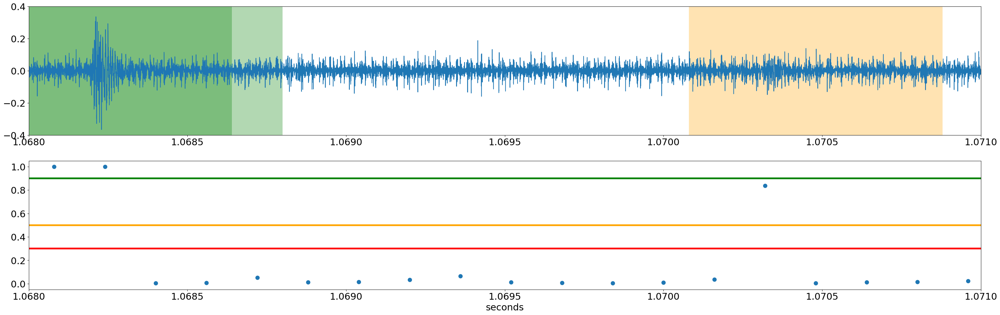

In [112]:
plt.figure(figsize=(40,12))
ax1 =plt.subplot(2,1,1)
plt.plot(tt,x_raw)
res_moy = [ (res[i-1] + res[(i+1,0)[i+1==len(res)]] + 2*res[i])/4 for i in range(len(res))]
for r in range(len(res)):
    if res[r] > 0.9 :
        plt.axvspan( np.min(slices_t[r]),  np.max(slices_t[r]), facecolor='green', alpha=0.3)
    elif res[r] > 0.5:
        plt.axvspan( np.min(slices_t[r]),  np.max(slices_t[r]), facecolor='orange', alpha=0.3)
    elif res[r] > 0.3 :
        plt.axvspan( np.min(slices_t[r]),  np.max(slices_t[r]), facecolor='red', alpha=0.3)

plt.ylim([-0.4,0.4])
plt.subplot(2,1,2, sharex=ax1)
t_r_plot = [  np.min(slices_t[r-1])/2 +   np.max(slices_t[r-1])/2 for r in range(len(res)) ]
#r_plot = [ float(res[r][0][1]) for r in range(len(res))]
#r_moy_plot = [ float(res_moy[r][0][0]) for r in range(len(res))]
plt.axhline(0.9,0,1,lw=4,color='green')
plt.axhline(0.5,0,1,lw=4,color='orange')
plt.axhline(0.3,0,1,lw=4,color='red')
#plt.scatter(t_r_plot,r_plot,lw=4)
plt.scatter(t_r_plot,res,lw=4)
#plt.scatter(t_r_plot,r_moy_plot,lw=4)
plt.xlim([1.068,1.071])
plt.xlabel("seconds")
plt.show()

## Denoising 